In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.autograd import Variable
from torch.utils.data import SubsetRandomSampler
import numpy as np
import copy
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import time
import os
import torch.utils.data as tdata
from PIL import Image
import random
import math
from matplotlib import animation, rc
from IPython.display import HTML

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [3]:
epoch_time = -1
epoch_space = 5
def is_epoch():
  global epoch_time
  curr_t = time.time()
  if (curr_t - epoch_time) > epoch_space:
    epoch_time = curr_t
    return True
  return False

image_time = -1
image_space = 5
def is_image():
  global image_time
  curr_t = time.time()
  if (curr_t - image_time) > image_space:
    image_time = curr_t
    return True
  return False

In [4]:
def imshow_list(l, scale=1.0):
  if scale == 1.0:
    fig = plt.figure()
  else:
    fig = plt.figure(figsize=(scale*7,scale*4))
  for i, im in enumerate(l):
    try:
      im = im.cpu().detach().squeeze()
    except:
      pass
    im = im.squeeze()
    plt.subplot(1,len(l),i+1)
    #plt.tight_layout()
    plt.imshow(im, cmap='gray', interpolation='none')
    plt.xticks([])
    plt.yticks([])

  plt.show()

In [5]:
arrs = None
dat = None

arrs = np.load('ball_collisions.npz')
dat = arrs['array1']
arrs = None
dat = torch.from_numpy(dat)
dat.size()

torch.Size([100000, 4, 32, 32])

In [6]:
class GeneticBalls(tdata.Dataset):
  def __init__(self, dat, train):
    self.dat = dat # I think need to convert to cuda here
    self.train = train

  def __getitem__(self, index):
    if self.train:
      seq = self.dat[index].to(torch.float)
    else:
      seq = self.dat[90000+index].to(torch.float)
      
    return seq

  def __len__(self):
    if self.train:
      return 90000
    else:
      return 10000

In [7]:
def make_loaders(dat):
  train_set = GeneticBalls(dat, True)
  test_set = GeneticBalls(dat, False)

  batch_size_train = 128
  batch_size_test = 1000

  train_loader = torch.utils.data.DataLoader(
                   dataset=train_set,
                   batch_size=batch_size_train,
                   shuffle=True)

  test_loader = torch.utils.data.DataLoader(
                  dataset=test_set,
                  batch_size=batch_size_test,
                  shuffle=True)

  print('==>>> total trainning batches: {}'.format(len(train_loader)))
  print('==>>> total testing batches: {}'.format(len(test_loader)))

  for seq in train_loader:
      print('--- Sample')
      print('Input: ', seq.shape)
      break
      
  return train_loader, test_loader

In [8]:
train_loader, test_loader = make_loaders(dat)

==>>> total trainning batches: 704
==>>> total testing batches: 10
--- Sample
Input:  torch.Size([128, 4, 32, 32])


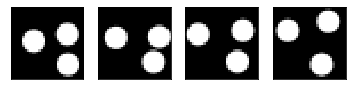

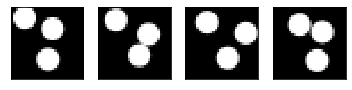

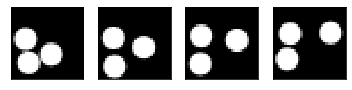

In [9]:
examples = enumerate(test_loader)
batch_idx, data = next(examples)

for i in range(3):
  imshow_list([data[i][0], data[i][1], data[i][2], data[i][3]])

## Autoencoder

In [10]:
class P(nn.Module):
  # Predictor
  def __init__(self):
    super(P, self).__init__()
    self.fc1 = nn.Linear(2*16, 128)
    self.fc2 = nn.Linear(128, 128)
    self.fc3 = nn.Linear(128, 16)
    self.leaky_relu = nn.LeakyReLU(0.2)

  def forward(self, x1, x2):
    x = torch.cat((x1, x2), dim=1)
    x = self.leaky_relu(self.fc1(x))
    x = self.leaky_relu(self.fc2(x))
    x = self.fc3(x)
    
    return x

class AE(nn.Module):
  # AutoEncoder
  def __init__(self):
    super(AE, self).__init__()
    self.fc1 = nn.Linear(32*32, 128)
    self.fc2 = nn.Linear(128, 16)
    self.fc3 = nn.Linear(16, 128)
    self.fc4 = nn.Linear(128, 32*32)
    self.leaky_relu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()
    
  def encode(self, x):
    x = x.view(-1, 32*32)
    x = self.leaky_relu(self.fc1(x))
    x = self.fc2(x)
    
    return x
    
  def decode(self, x):
    x = self.leaky_relu(self.fc3(x))
    x = self.sigmoid(self.fc4(x))
    x = x.view(-1, 1, 32, 32)
    
    return x
    
  def forward(self, x):
    x = self.encode(x)
    x = self.decode(x)
    
    return x
  
  
mse = nn.MSELoss()

#### Load autoencoder (if exists)

In [11]:
ae = AE().to(device)
ae.load_state_dict(torch.load('autoencoder.pt'))

<All keys matched successfully>

#### Autoencoder Training

In [ ]:
ae = AE().to(device)
optimizer = optim.Adam(ae.parameters(), lr=0.001)

for epoch in range(1, 300+1):
  for batch_idx, data in enumerate(train_loader):
    I4 = data[:,3:4,:,:].to(device)

    optimizer.zero_grad()
    out = ae(I4)
    loss = mse(out, I4)
    loss.backward()
    optimizer.step()

    if is_epoch():
      print('Epoch {} ({:.0f}%) | loss {}'.format(
        epoch,
        100. * batch_idx / len(train_loader),
        loss.data.item(),
      ))
      if is_image():
        imshow_list([I4[0], out[0]])
        
print('Done!')

#### Autoencoder Evaluation

loss 0.0014177742414176464


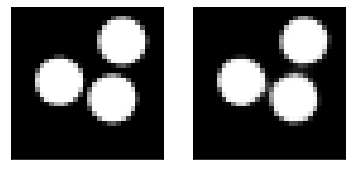

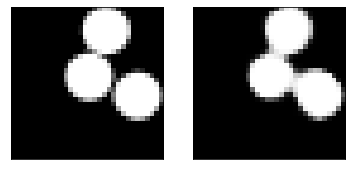

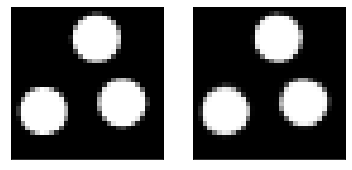

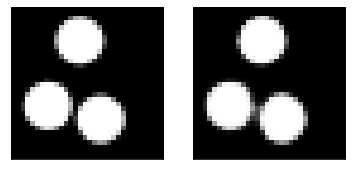

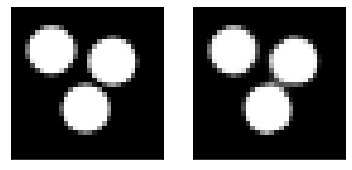

In [12]:
ae.eval()

examples = enumerate(test_loader)
batch_idx, data = next(examples)

I4 = data[:,3:4,:,:].to(device)
out = ae(I4)
loss = mse(out, I4)

print('loss {}'.format(loss))
for i in range(5):
  imshow_list([I4[i], out[i]])

#### Save autoencoder

In [ ]:
torch.save(ae.state_dict(), 'autoencoder.pt')

## Bottom-Up Predictor

In [40]:
class Pred(nn.Module):
  # Predictor
  def __init__(self):
    super(Pred, self).__init__()
    self.fc1 = nn.Linear(3*32*32, 512)
    self.fc2 = nn.Linear(512, 256)
    self.fc3 = nn.Linear(256, 32)
    self.fc4 = nn.Linear(32, 256)
    self.fc5 = nn.Linear(256, 512)
    self.fc6 = nn.Linear(512, 32*32)
    
    self.leaky_relu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x1, x2, x3):
    x = torch.cat((x1, x2, x3), dim=1)
    x = x.view(-1, 3*32*32)
    x = self.leaky_relu(self.fc1(x))
    x = self.leaky_relu(self.fc2(x))
    x = self.leaky_relu(self.fc3(x))
    x = self.leaky_relu(self.fc4(x))
    x = self.leaky_relu(self.fc5(x))
    x = self.sigmoid(self.fc6(x))
    x = x.view(-1, 1, 32, 32)
    
    return x

#### Load model (if exists)

In [ ]:
pred = Pred().to(device)
pred.load_state_dict(torch.load('bottom_up_predictor.pt'))

#### Training

Epoch 1 (0%) | loss 0.23465487360954285


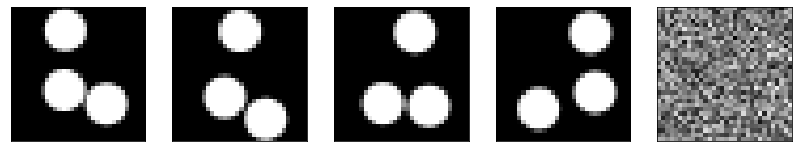

Epoch 1 (69%) | loss 0.047772761434316635


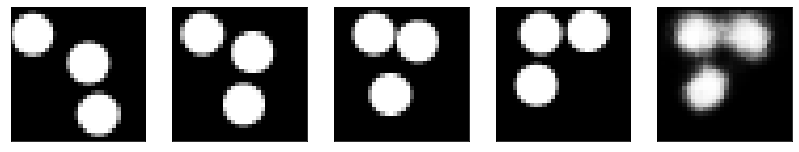

Epoch 2 (30%) | loss 0.043340835720300674


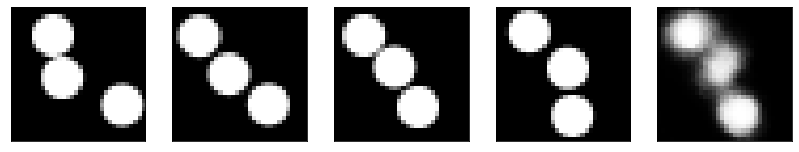

Epoch 2 (84%) | loss 0.03969869390130043


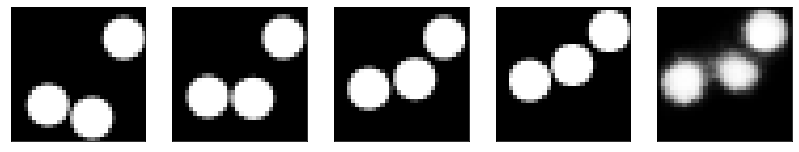

Epoch 3 (56%) | loss 0.03528205305337906


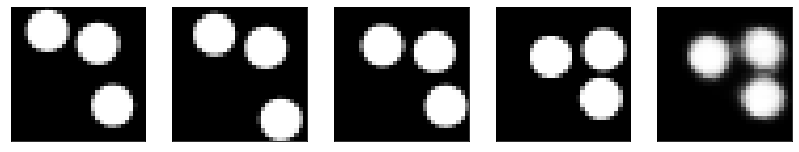

Epoch 4 (41%) | loss 0.030196214094758034


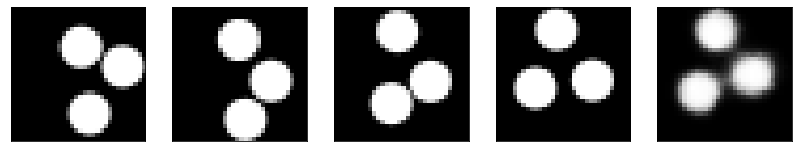

Epoch 5 (32%) | loss 0.02940220572054386


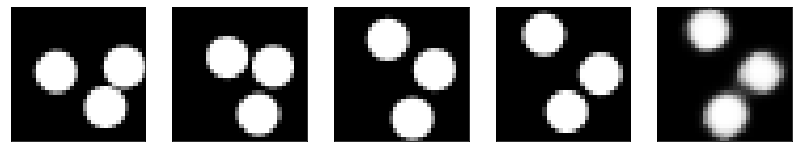

Epoch 6 (14%) | loss 0.02807752788066864


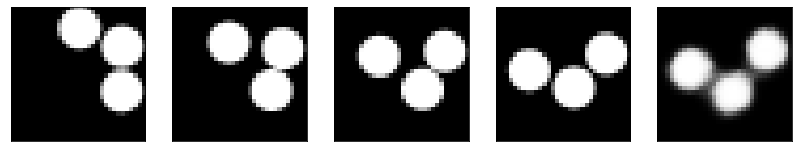

Epoch 6 (97%) | loss 0.02899058163166046


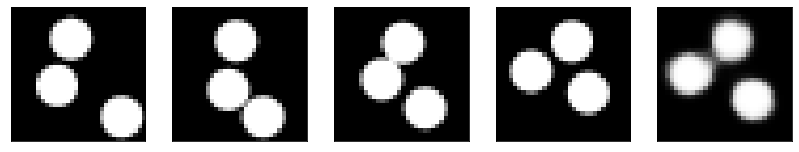

Epoch 7 (85%) | loss 0.027844086289405823


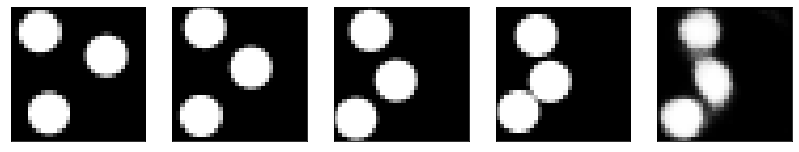

Epoch 8 (72%) | loss 0.02605418674647808


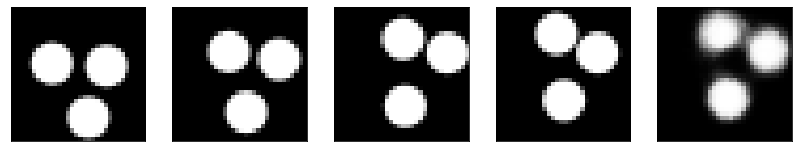

Epoch 9 (54%) | loss 0.026461102068424225


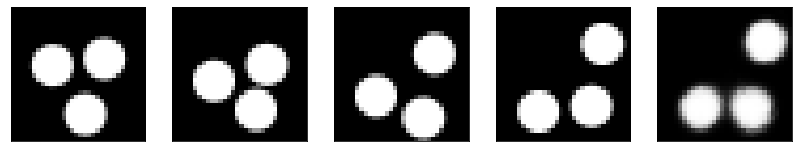

Epoch 10 (41%) | loss 0.02480815351009369


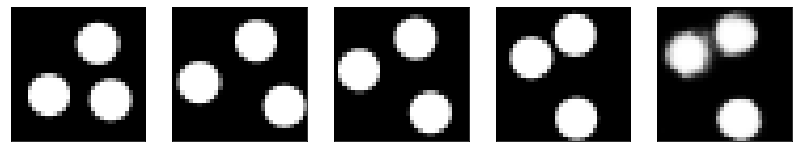

Epoch 11 (31%) | loss 0.02287014201283455


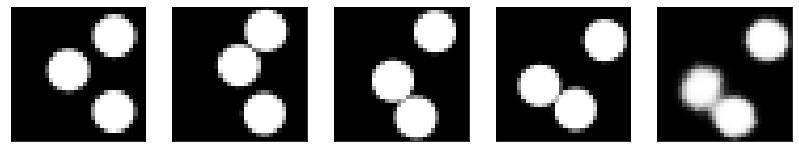

Epoch 12 (24%) | loss 0.0197787806391716


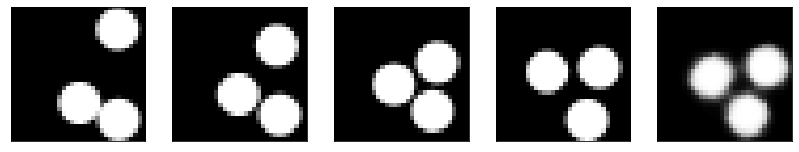

Epoch 13 (12%) | loss 0.021946310997009277


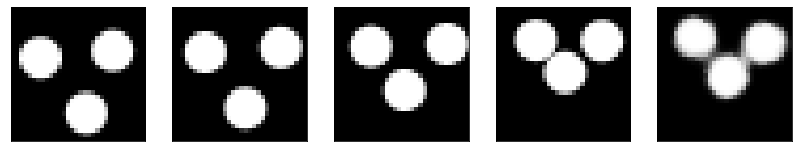

Epoch 13 (93%) | loss 0.023444591090083122


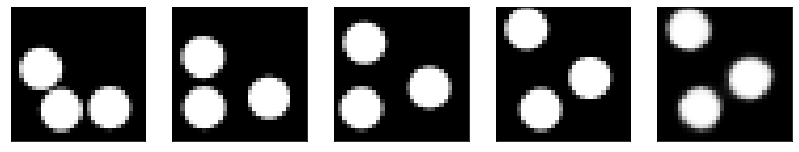

Epoch 14 (80%) | loss 0.022605763748288155


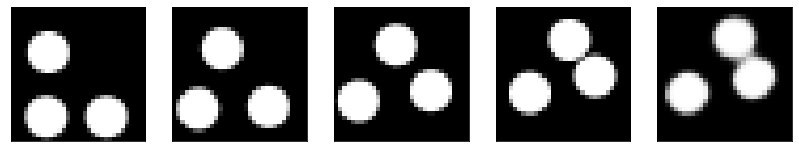

Epoch 15 (64%) | loss 0.019837703555822372


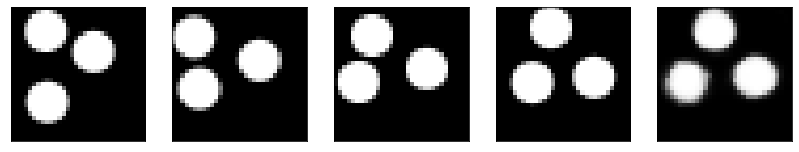

Epoch 16 (48%) | loss 0.021802963688969612


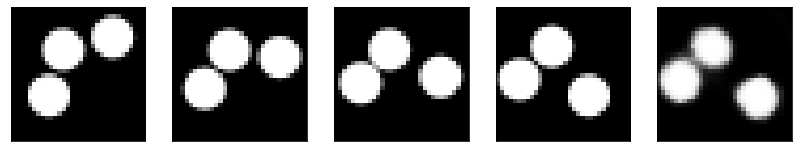

Epoch 17 (41%) | loss 0.017777474597096443


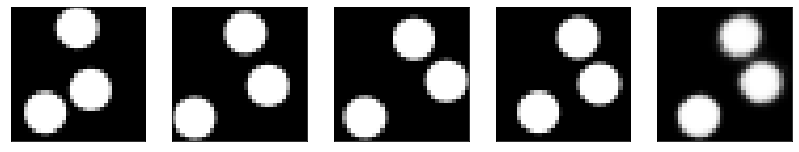

Epoch 18 (21%) | loss 0.019643060863018036


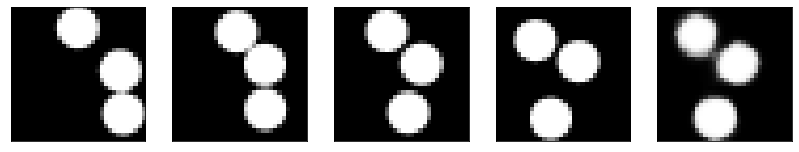

Epoch 18 (67%) | loss 0.01950136572122574


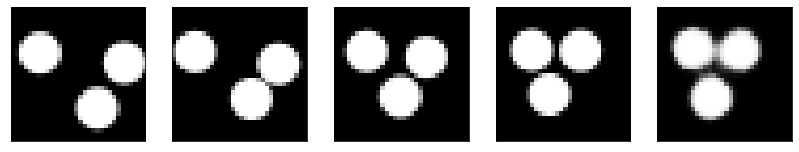

Epoch 19 (35%) | loss 0.018946386873722076


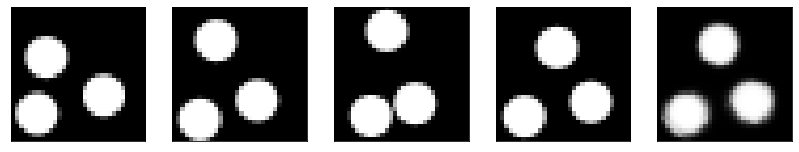

Epoch 20 (33%) | loss 0.019556190818548203


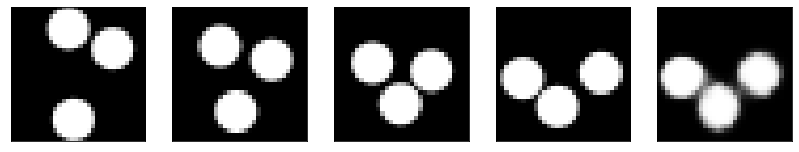

Epoch 21 (28%) | loss 0.019633812829852104


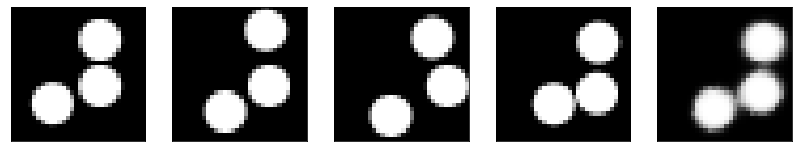

Epoch 22 (17%) | loss 0.019325245171785355
Epoch 23 (0%) | loss 0.019750796258449554


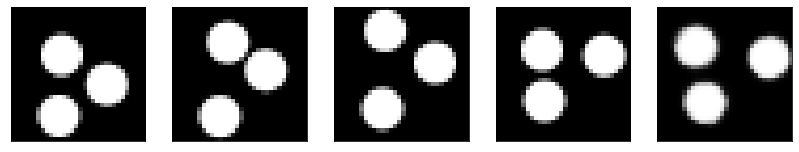

Epoch 23 (97%) | loss 0.016470912843942642


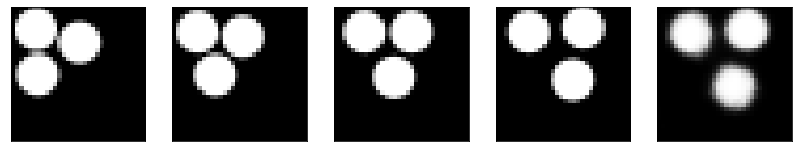

Epoch 24 (44%) | loss 0.016177859157323837


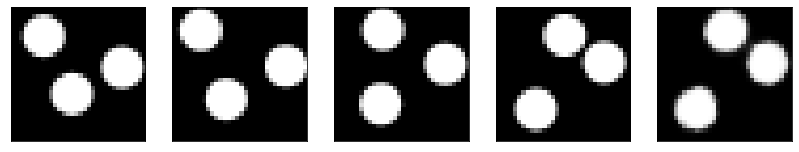

Epoch 24 (86%) | loss 0.017812995240092278


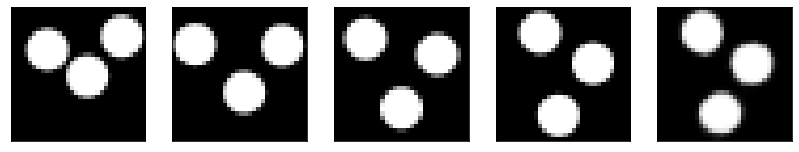

Epoch 25 (62%) | loss 0.01661025360226631


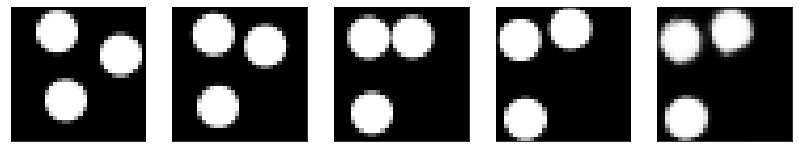

Epoch 26 (45%) | loss 0.015993377193808556


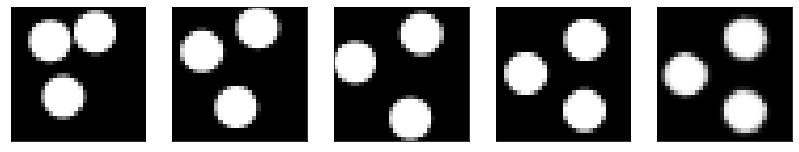

Epoch 27 (24%) | loss 0.014775848016142845


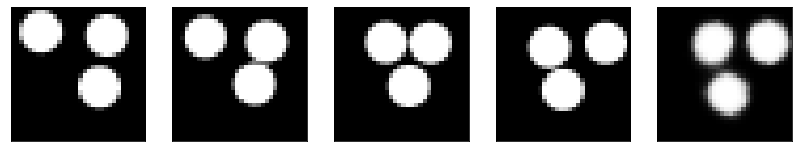

Epoch 27 (96%) | loss 0.01607508584856987


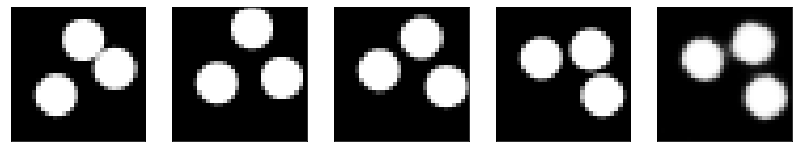

Epoch 28 (77%) | loss 0.017602089792490005


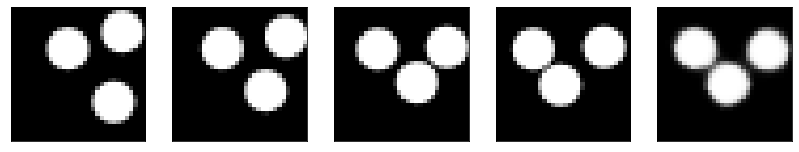

Epoch 29 (64%) | loss 0.015926875174045563


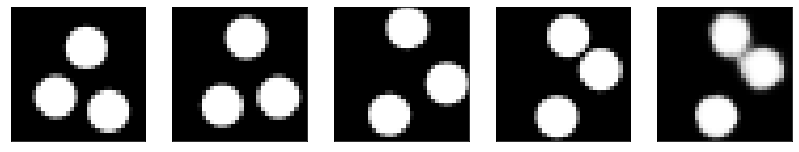

Epoch 30 (50%) | loss 0.015282773412764072


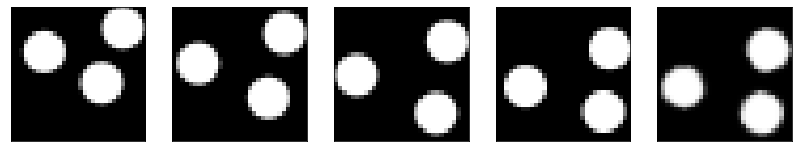

Epoch 31 (41%) | loss 0.015916844829916954


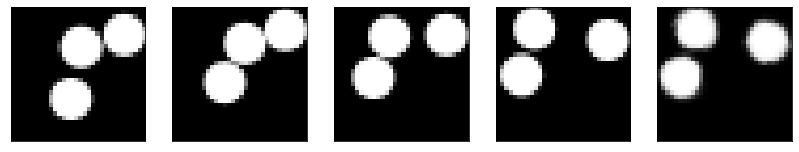

Epoch 32 (26%) | loss 0.013574202544987202


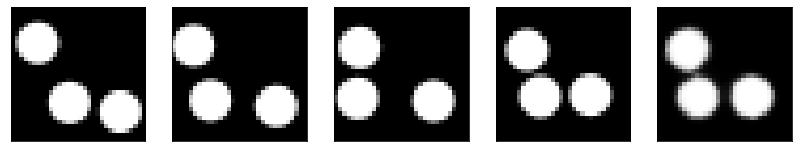

Epoch 33 (10%) | loss 0.01374007761478424


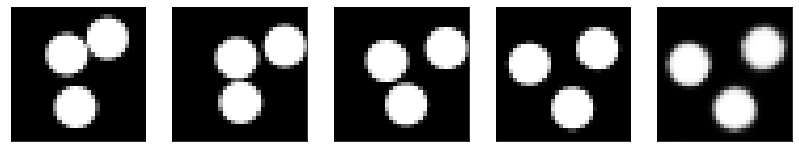

Epoch 34 (0%) | loss 0.013209396973252296


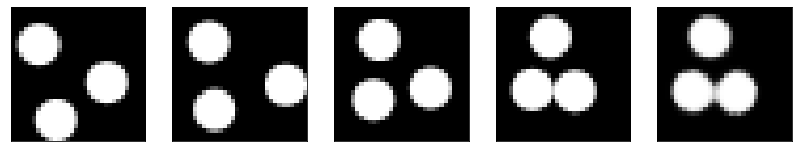

Epoch 34 (86%) | loss 0.014726687222719193


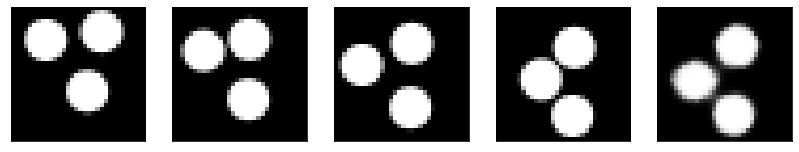

Epoch 35 (75%) | loss 0.013697963207960129


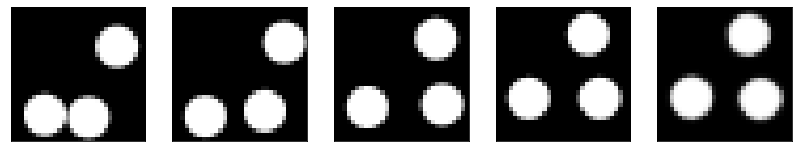

Epoch 36 (66%) | loss 0.014360752888023853


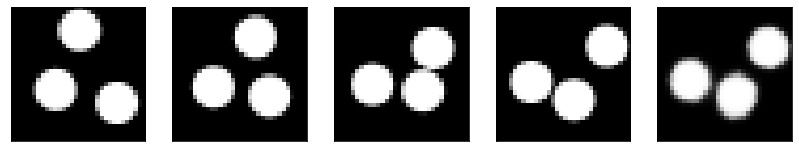

Epoch 37 (51%) | loss 0.012691924348473549


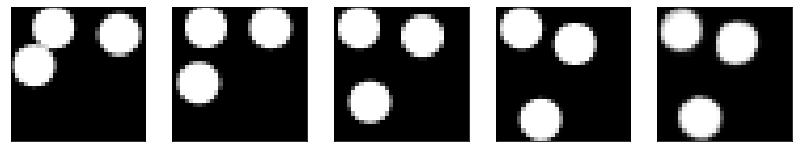

Epoch 38 (40%) | loss 0.015001106075942516


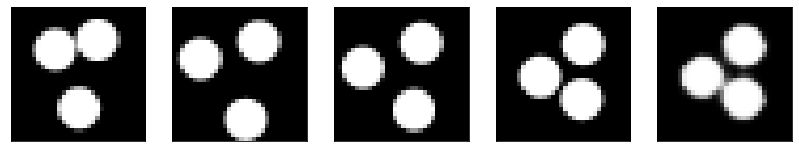

Epoch 39 (29%) | loss 0.014247491955757141


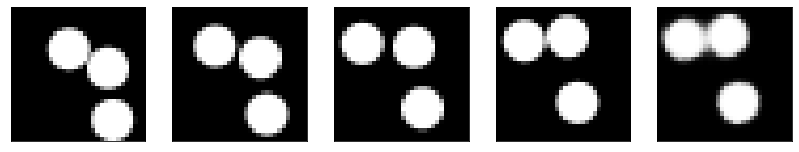

Epoch 40 (15%) | loss 0.013703657314181328


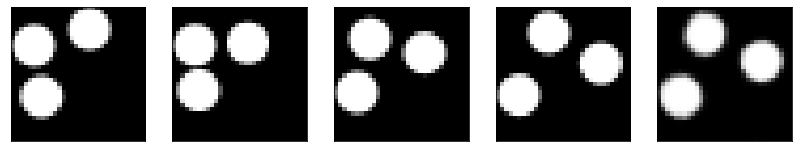

Epoch 41 (13%) | loss 0.012543395161628723


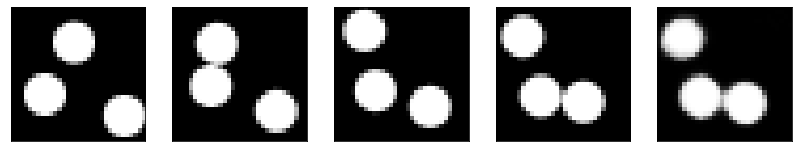

Epoch 42 (9%) | loss 0.013561354950070381


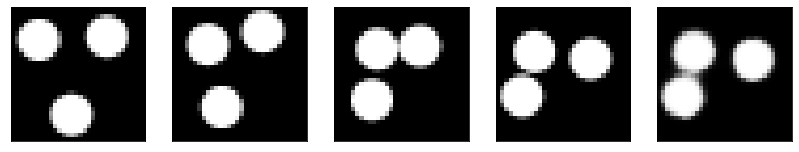

Epoch 43 (10%) | loss 0.013022302649915218
Epoch 43 (67%) | loss 0.014552145265042782


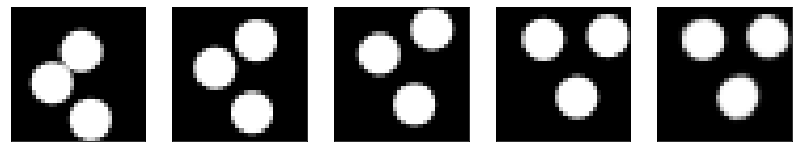

Epoch 44 (10%) | loss 0.01376616396009922


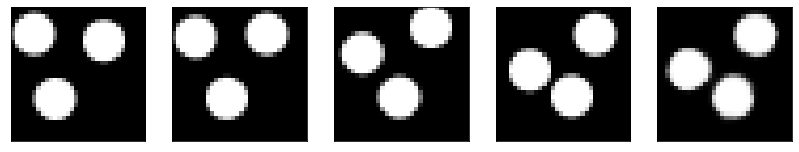

Epoch 44 (75%) | loss 0.014002855867147446


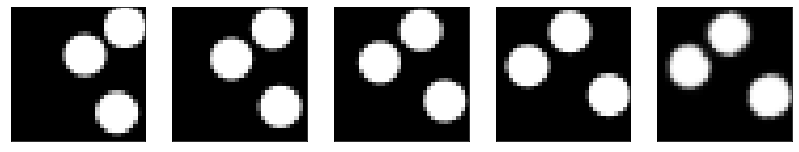

Epoch 45 (58%) | loss 0.012368051335215569


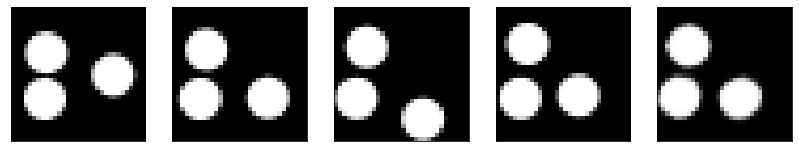

Epoch 46 (63%) | loss 0.012612724676728249


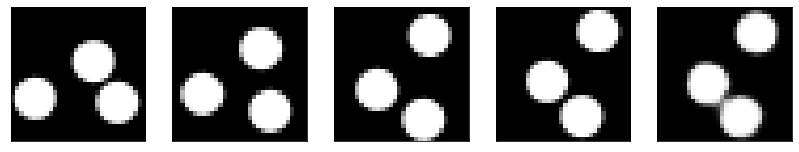

Epoch 47 (64%) | loss 0.012396731413900852


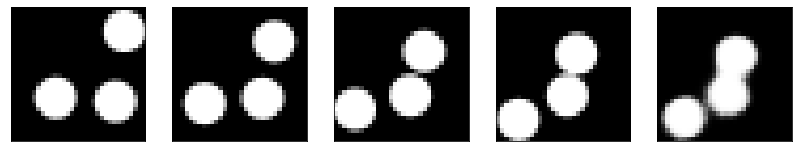

Epoch 48 (57%) | loss 0.014339189976453781


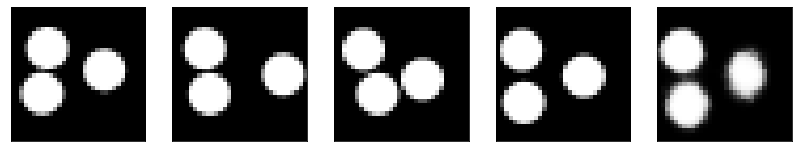

Epoch 49 (5%) | loss 0.012794864363968372


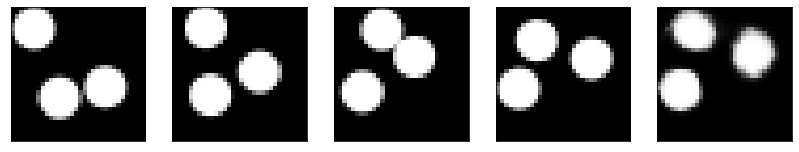

Epoch 49 (53%) | loss 0.013496886938810349


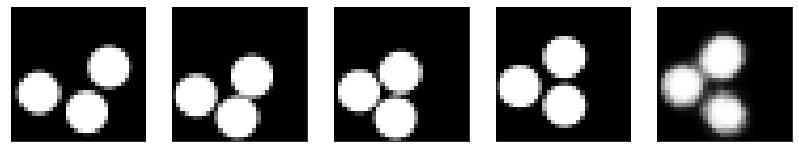

Epoch 50 (29%) | loss 0.011715609580278397


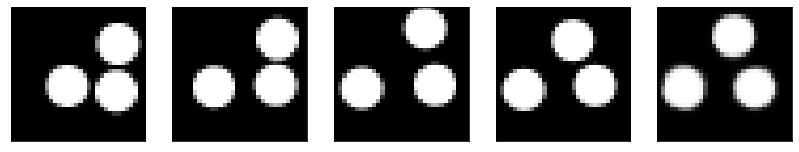

Epoch 50 (99%) | loss 0.013691293075680733


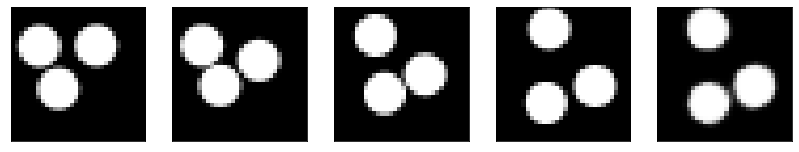

Epoch 51 (80%) | loss 0.012468218803405762


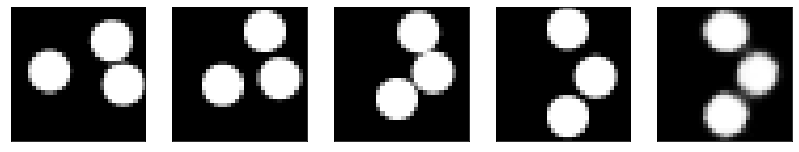

Epoch 52 (40%) | loss 0.010795645415782928


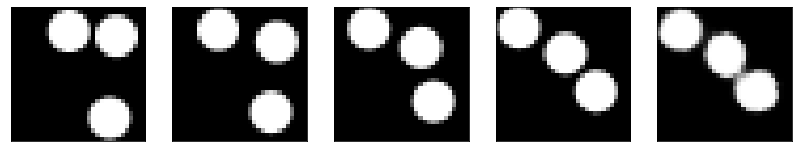

Epoch 52 (93%) | loss 0.012777509167790413


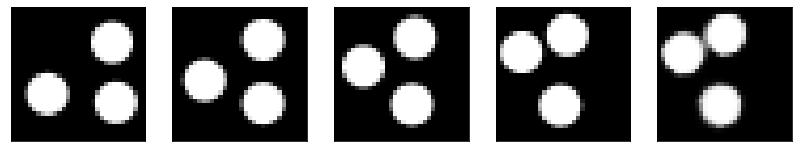

Epoch 53 (74%) | loss 0.012169781140983105


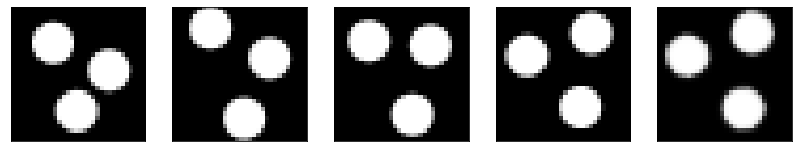

Epoch 54 (59%) | loss 0.012728385627269745


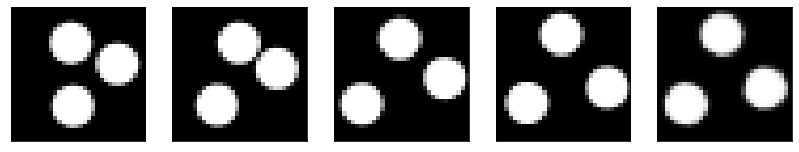

Epoch 55 (51%) | loss 0.0103983823210001


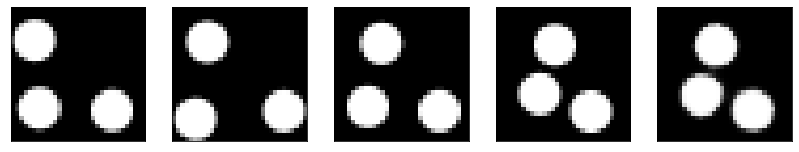

Epoch 56 (44%) | loss 0.01217502448707819


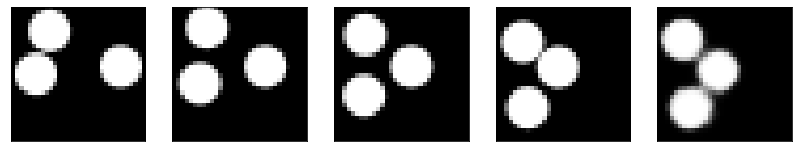

Epoch 57 (31%) | loss 0.011520963162183762


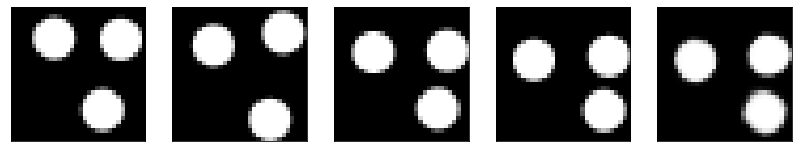

Epoch 58 (21%) | loss 0.012878984212875366


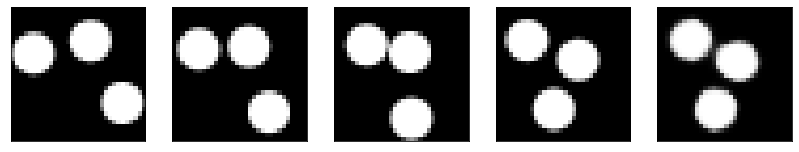

Epoch 59 (12%) | loss 0.011941567063331604


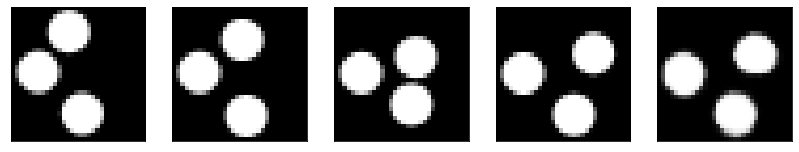

Epoch 59 (91%) | loss 0.011286478489637375


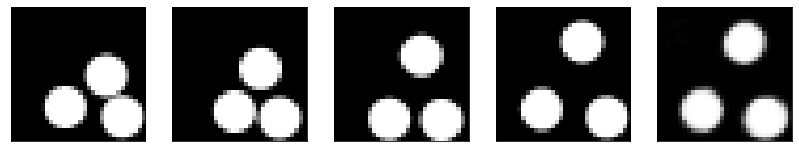

Epoch 60 (56%) | loss 0.010545935481786728


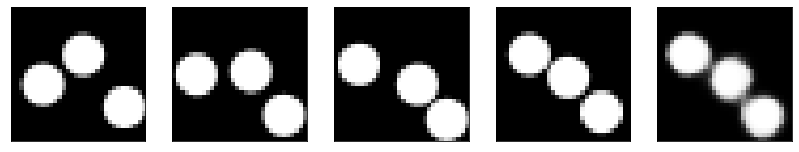

Epoch 60 (95%) | loss 0.011347433552145958


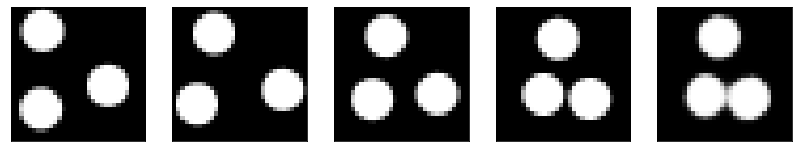

Epoch 61 (58%) | loss 0.011448745615780354


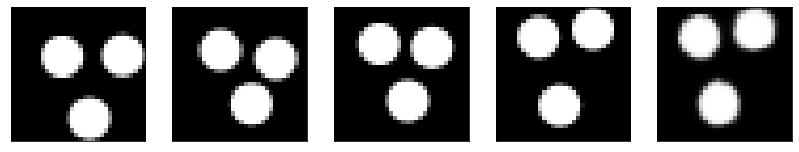

Epoch 62 (36%) | loss 0.011339368298649788


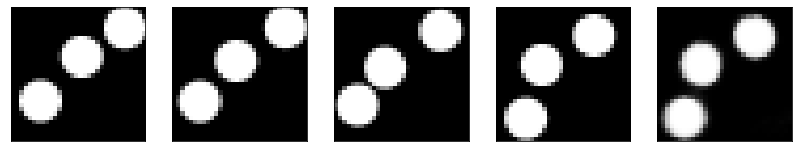

Epoch 63 (24%) | loss 0.010231447406113148


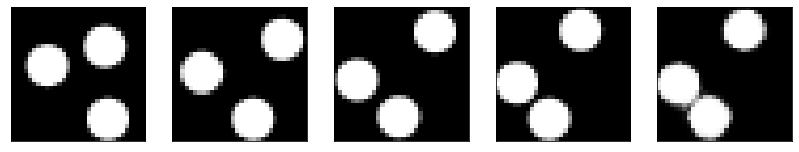

Epoch 63 (97%) | loss 0.012408848851919174


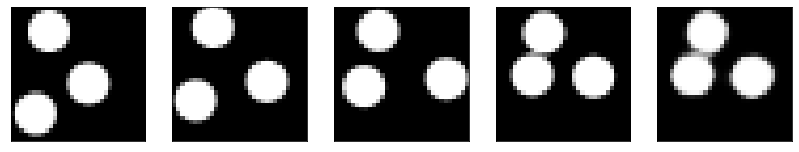

Epoch 64 (52%) | loss 0.010658381506800652


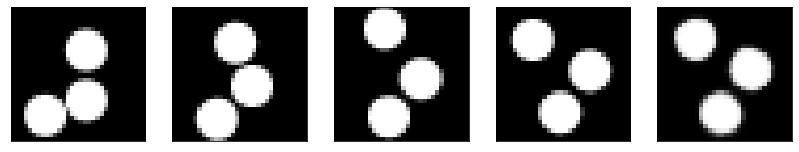

Epoch 65 (6%) | loss 0.01052146591246128


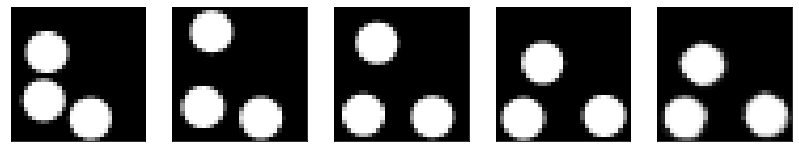

Epoch 65 (82%) | loss 0.011146106757223606


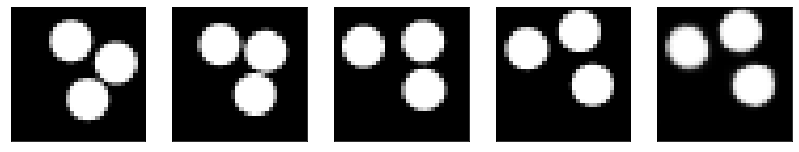

Epoch 66 (54%) | loss 0.011084540747106075


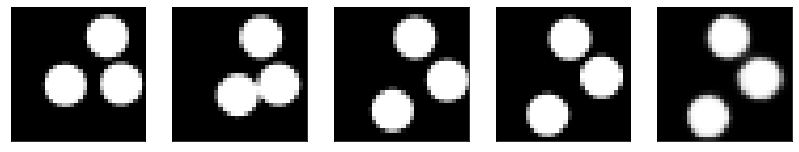

Epoch 67 (29%) | loss 0.01133028231561184


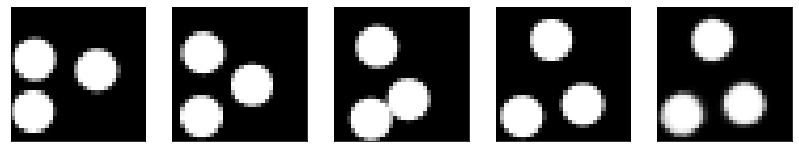

Epoch 67 (99%) | loss 0.011574547737836838


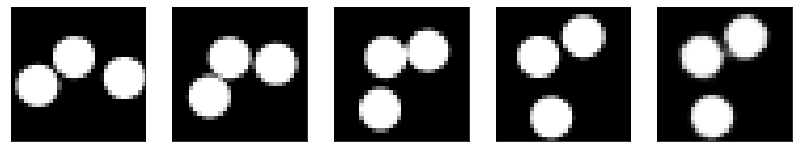

Epoch 68 (84%) | loss 0.011477751657366753


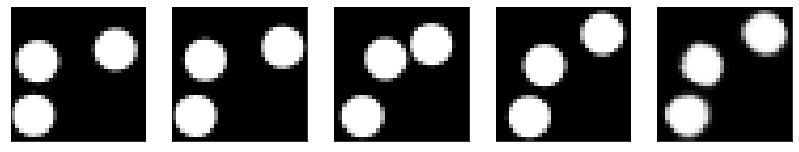

Epoch 69 (69%) | loss 0.010376367717981339


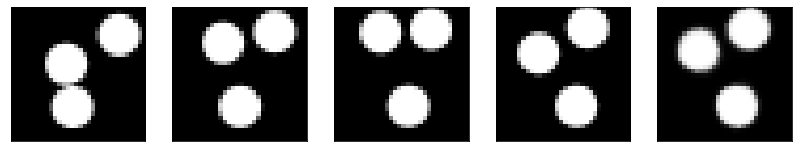

Epoch 70 (58%) | loss 0.010373372584581375


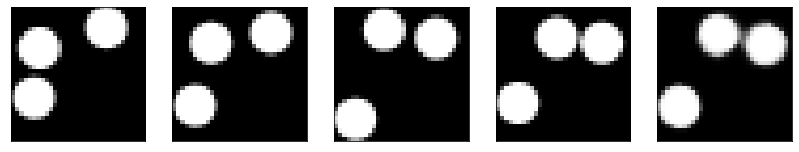

Epoch 71 (47%) | loss 0.010550878010690212


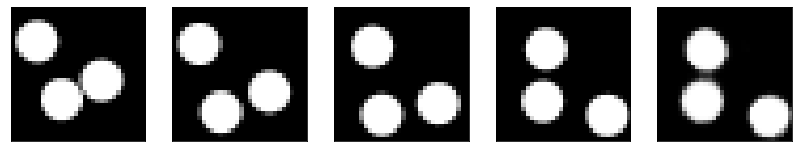

Epoch 72 (38%) | loss 0.009949348866939545


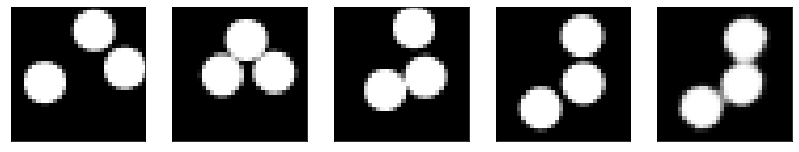

Epoch 73 (24%) | loss 0.009950917214155197


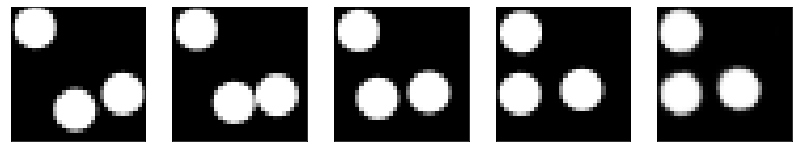

Epoch 74 (13%) | loss 0.010242932476103306


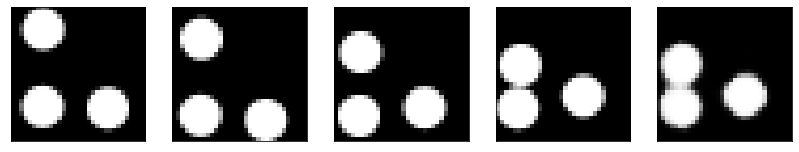

Epoch 75 (10%) | loss 0.00954326894134283


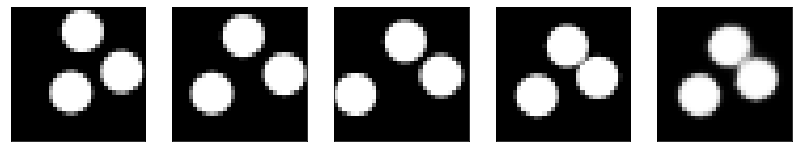

Epoch 75 (97%) | loss 0.009021693840622902


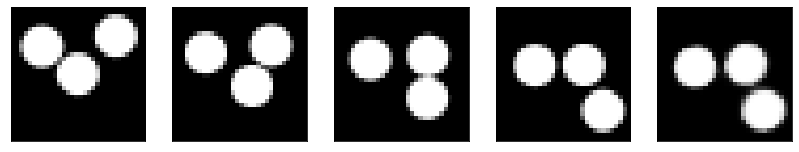

Epoch 76 (86%) | loss 0.009927965700626373


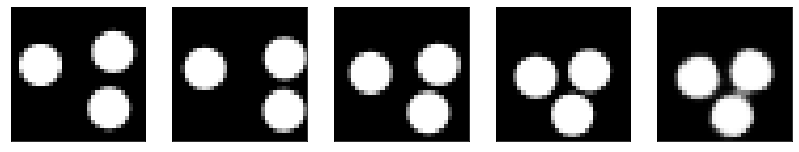

Epoch 77 (57%) | loss 0.01028977707028389


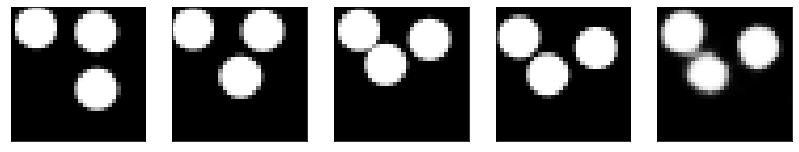

Epoch 78 (34%) | loss 0.010487849824130535


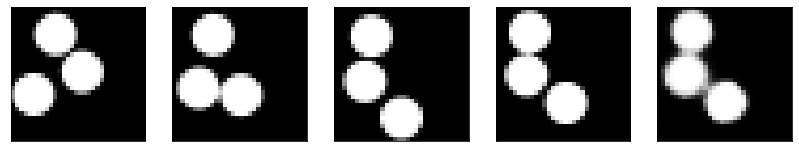

Epoch 79 (17%) | loss 0.008846038952469826


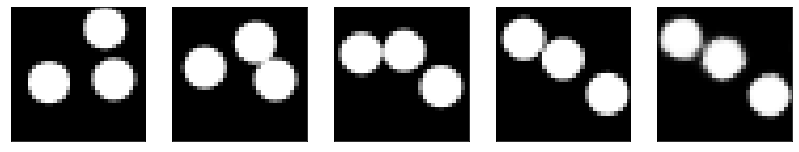

Epoch 80 (6%) | loss 0.010016357526183128


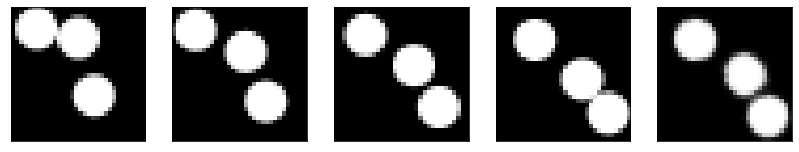

Epoch 80 (78%) | loss 0.009628087282180786


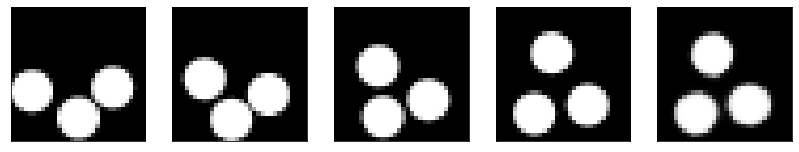

Epoch 81 (38%) | loss 0.009625798091292381


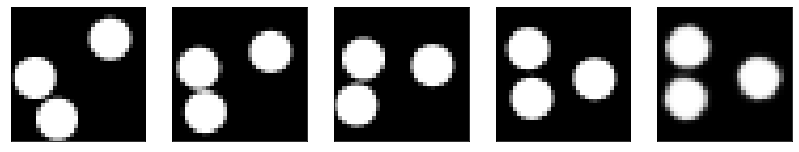

Epoch 82 (25%) | loss 0.009746074676513672


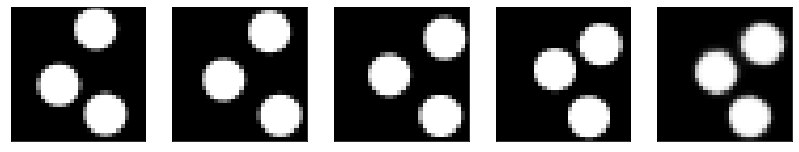

Epoch 82 (82%) | loss 0.011131998151540756


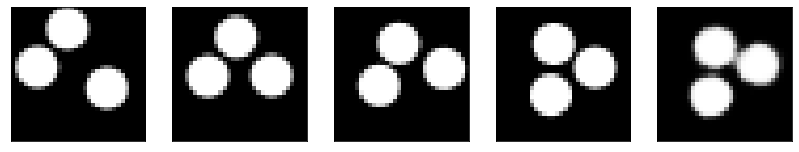

Epoch 83 (36%) | loss 0.009939025156199932


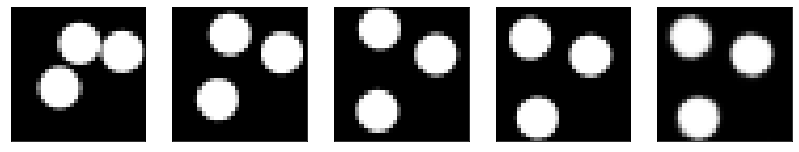

Epoch 84 (6%) | loss 0.009203260764479637


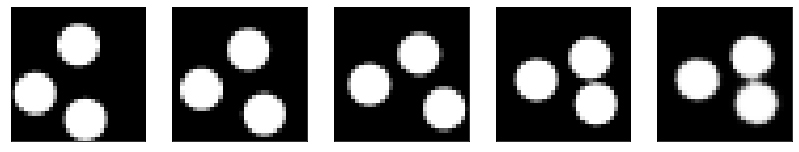

Epoch 84 (77%) | loss 0.010416693985462189


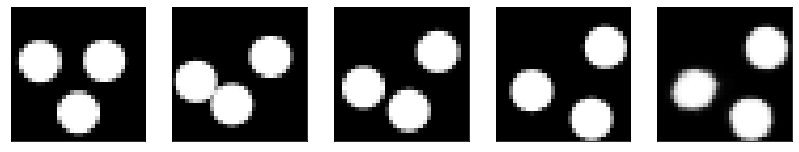

Epoch 85 (35%) | loss 0.008715391159057617


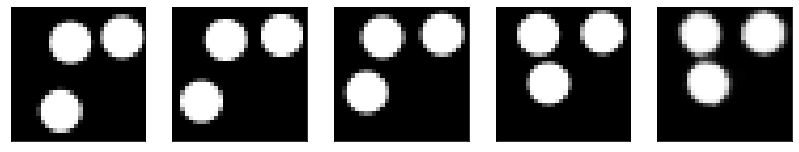

Epoch 86 (19%) | loss 0.010068252682685852


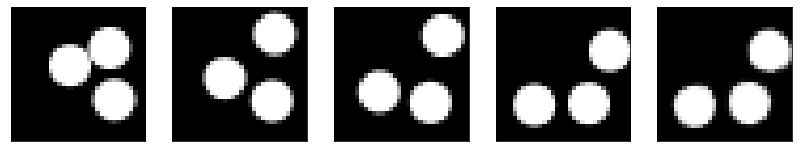

Epoch 87 (2%) | loss 0.009989561513066292


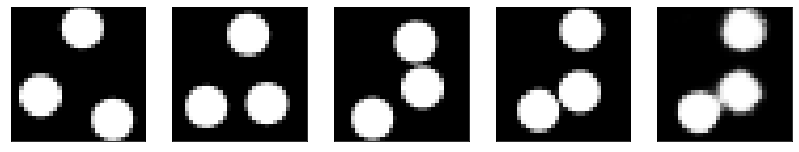

Epoch 87 (56%) | loss 0.008271878585219383


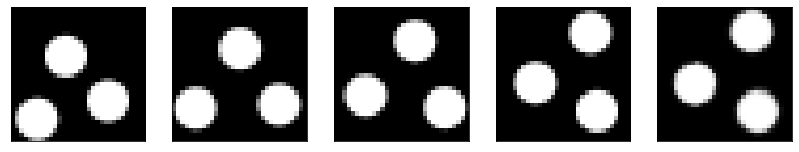

Epoch 88 (12%) | loss 0.008749514818191528


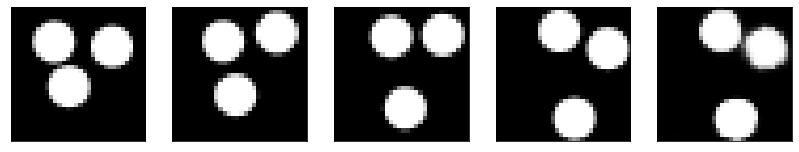

Epoch 88 (81%) | loss 0.008863821625709534


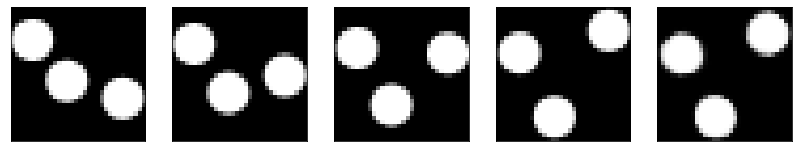

Epoch 89 (58%) | loss 0.00992156658321619


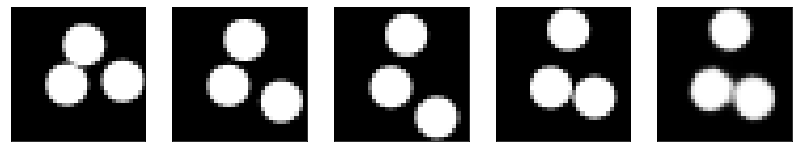

Epoch 90 (46%) | loss 0.008880987763404846


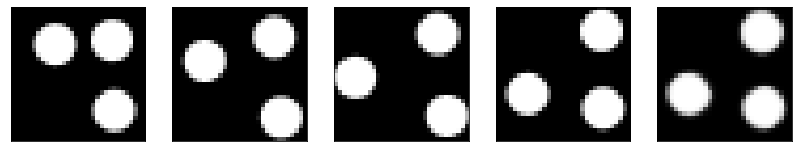

Epoch 91 (37%) | loss 0.009441109374165535


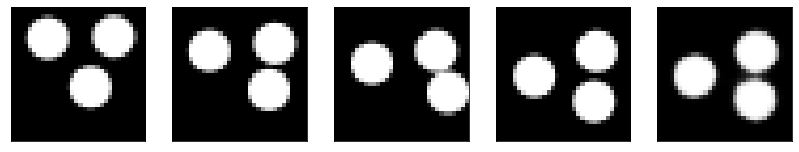

Epoch 92 (20%) | loss 0.010154495015740395


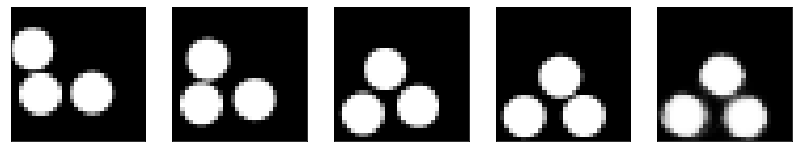

Epoch 93 (12%) | loss 0.009630274027585983


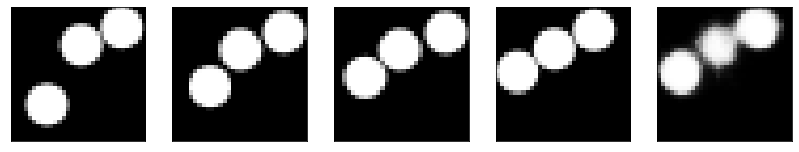

Epoch 93 (95%) | loss 0.009541748091578484


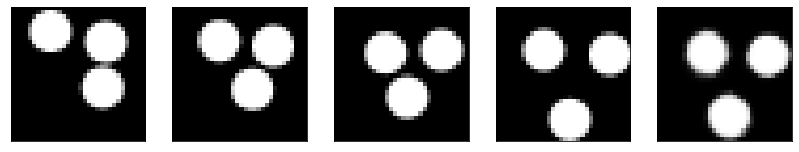

Epoch 94 (83%) | loss 0.009222976863384247


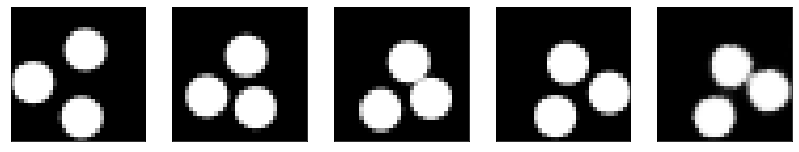

Epoch 95 (43%) | loss 0.009481805376708508


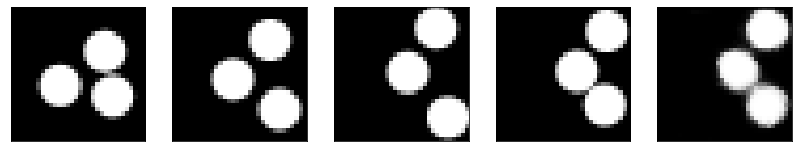

Epoch 96 (1%) | loss 0.009983206167817116


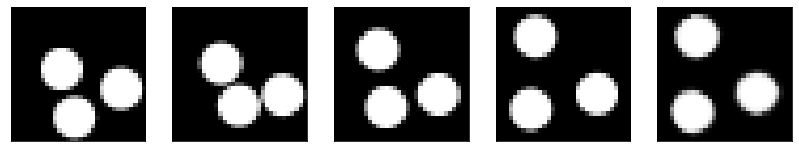

Epoch 96 (86%) | loss 0.00921620149165392


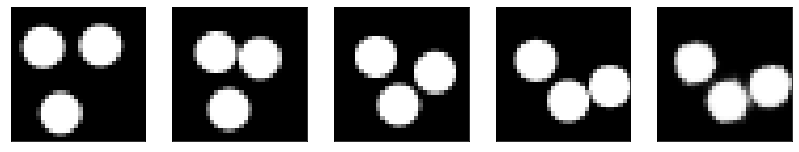

Epoch 97 (66%) | loss 0.009169462136924267


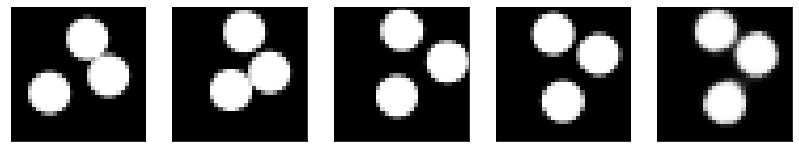

Epoch 98 (50%) | loss 0.009576207026839256


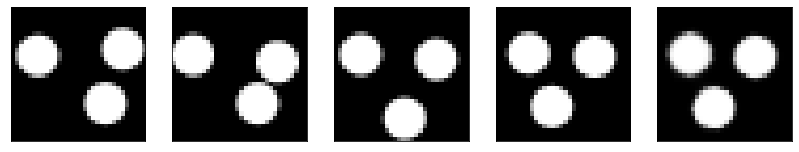

Epoch 99 (52%) | loss 0.00839158520102501


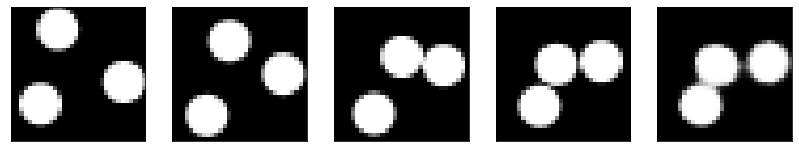

Epoch 100 (59%) | loss 0.008857738226652145


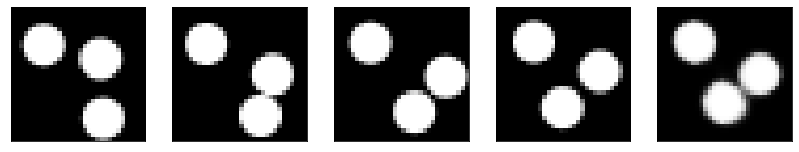

Done!


In [42]:
pred = Pred().to(device)
optimizer = optim.Adam(pred.parameters(), lr=0.001)
mse = nn.MSELoss()

for epoch in range(1, 100+1):
  for batch_idx, data in enumerate(train_loader):
    I1 = data[:,0:1,:,:].to(device)
    I2 = data[:,1:2,:,:].to(device)
    I3 = data[:,2:3,:,:].to(device)
    I4 = data[:,3:4,:,:].to(device)

    optimizer.zero_grad()
    out = pred(I1, I2, I3)
    loss = mse(out, I4)
    loss.backward()
    optimizer.step()

    if is_epoch():
      print('Epoch {} ({:.0f}%) | loss {}'.format(
        epoch,
        100. * batch_idx / len(train_loader),
        loss.data.item(),
      ))
      if is_image():
        imshow_list([I1[0], I2[0], I3[0], I4[0], out[0]], scale=2.0)
        
print('Done!')

#### Evaluation

loss 0.02594572678208351


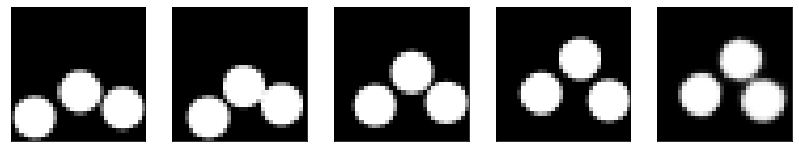

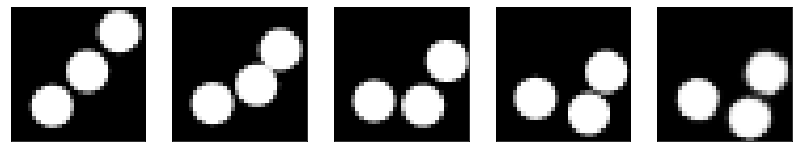

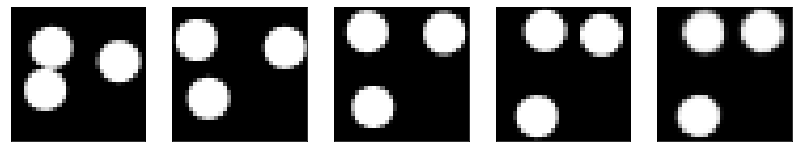

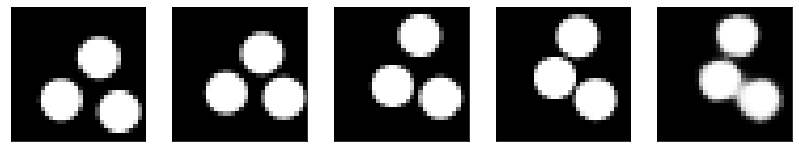

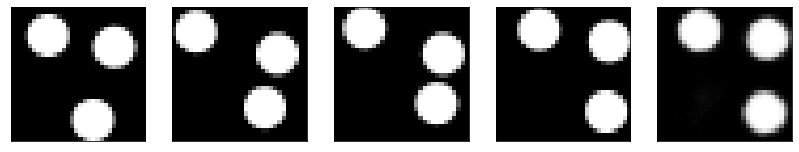

In [45]:
pred.eval()

examples = enumerate(test_loader)
batch_idx, data = next(examples)

I1 = data[:,0:1,:,:].to(device)
I2 = data[:,1:2,:,:].to(device)
I3 = data[:,2:3,:,:].to(device)
I4 = data[:,3:4,:,:].to(device)

out = pred(I1, I2, I3)
loss = mse(out, I4)

print('loss {}'.format(loss))
for i in range(5):
  imshow_list([I1[i], I2[i], I3[i], I4[i], out[i]], scale=2.0)

#### Save model

In [ ]:
torch.save(pred.state_dict(), 'bottom_up_predictor.pt')

## Input Gradient Descent

In [14]:
def input_gd(x, f, steps=30, lr=300, momentum=1.0, verbose=False, zero_grad_f=None, threshold=None):
  x = Variable(x, requires_grad=True)
  lr = lr*x.shape[0]
  optimizer = optim.SGD([x], lr=lr, momentum=momentum)
  if verbose:
    print('GD iterations:')
    
  min_steps = steps
  if threshold is not None:
    is_thresh = True
    steps = 10000
  for i in range(steps):
    optimizer.zero_grad()
    if zero_grad_f is not None:
      zero_grad_f()
    out = f(x)

    if verbose:
      print('i={} | err={:.6f}'.format(i, out.item()))
      
    if threshold is not None and out.item() < threshold and i > min_steps:
      break
      
    out.backward()
    #x.data = x.data-lr*x.grad.data/torch.norm(x.grad.data)
    optimizer.step()
    
  return x.data

reconst err=0.001558
GD iterations:
i=0 | err=0.113047
i=1 | err=0.097029
i=2 | err=0.077089
i=3 | err=0.058533
i=4 | err=0.043137
i=5 | err=0.031205
i=6 | err=0.022198
i=7 | err=0.015703
i=8 | err=0.011226
i=9 | err=0.008126
i=10 | err=0.005945
i=11 | err=0.004435
i=12 | err=0.003433
i=13 | err=0.002757
i=14 | err=0.002299
i=15 | err=0.001973
i=16 | err=0.001731
i=17 | err=0.001556
i=18 | err=0.001429
i=19 | err=0.001332
i=20 | err=0.001257
i=21 | err=0.001198
i=22 | err=0.001149
i=23 | err=0.001108
i=24 | err=0.001074
i=25 | err=0.001047
i=26 | err=0.001026
i=27 | err=0.001008
i=28 | err=0.000993
i=29 | err=0.000979


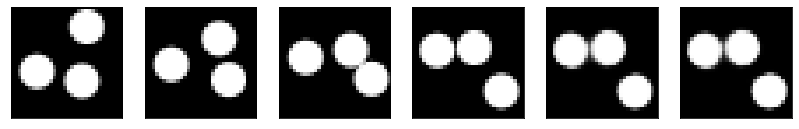

In [15]:
ae.eval()

examples = enumerate(test_loader)
batch_idx, data = next(examples)

I1 = data[:,0:1,:,:].to(device)
I2 = data[:,1:2,:,:].to(device)
I3 = data[:,2:3,:,:].to(device)
I4 = data[:,3:4,:,:].to(device)

reconst = ae(I4)
reconst_err = mse(reconst, I4)
print('reconst err={:.6f}'.format(reconst_err))

x = input_gd(ae.encode(I3).data, (lambda x: mse(ae.decode(x), I4)), steps=30, lr=300, momentum=0.5, verbose=True)

imshow_list([I1[0:1], I2[0:1], I3[0:1], I4[0:1], reconst[0:1], ae.decode(x[0:1])], scale=2.0)

#### Load

In [16]:
codes_dat = torch.load('codes_dat.pt')

#### Parametrize dataset

In [ ]:
ae.eval()
steps=100
lr=300
momentum=0.5
codes_dat = torch.empty((100000, 2, 16+1), device=device)
for i in range(100):
  print('i = {}/100'.format(i))
  
  I3 = dat[i*1000:(i+1)*1000, 2:3].to(torch.float).to(device)
  I4 = dat[i*1000:(i+1)*1000, 3:4].to(torch.float).to(device)
  
  x = input_gd(ae.encode(I3).data, (lambda x: mse(ae.decode(x), I3)), steps=steps, lr=lr, momentum=momentum)
  codes_dat[i*1000:(i+1)*1000, 0, 0:16] = x
  codes_dat[i*1000:(i+1)*1000, 0, 16] = torch.arange(i*1000, (i+1)*1000)
  if i == 0:
    print(mse(ae.decode(x), I3).item())
    
  x = input_gd(ae.encode(I4).data, (lambda x: mse(ae.decode(x), I4)), steps=steps, lr=lr, momentum=momentum)
  codes_dat[i*1000:(i+1)*1000, 1, 0:16] = x
  codes_dat[i*1000:(i+1)*1000, 1, 16] = torch.arange(i*1000, (i+1)*1000)  
  if i == 0:
    print(mse(ae.decode(x), I4).item())
      
print('Done!')

In [23]:
codes_train_loader, codes_test_loader = make_loaders(codes_dat)

==>>> total trainning batches: 704
==>>> total testing batches: 10
--- Sample
Input:  torch.Size([128, 2, 17])


0.0007089967257343233
0.0007160259410738945


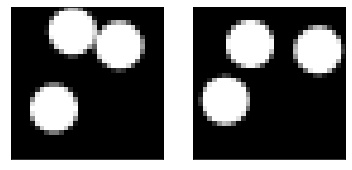

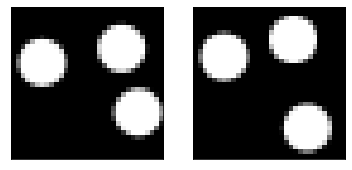

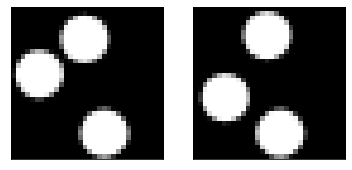

In [24]:
examples = enumerate(codes_test_loader)
batch_idx, data = next(examples)

err = mse(ae.decode(data[:,0,0:16]), dat[data[:,0,16].to(torch.long), 2:3].to(torch.float).to(device)).item()
print(err)
err = mse(ae.decode(data[:,1,0:16]), dat[data[:,1,16].to(torch.long), 3:4].to(torch.float).to(device)).item()
print(err)

for i in range(3):
  imshow_list([dat[int(data[i,0,16].item()), 2], dat[int(data[i,1,16].item()), 3]])

#### Save

In [ ]:
torch.save(codes_dat, 'codes_dat.pt')

## Discriminator
Negative examples are found using gradient descent over the parameters of the autoencoder

In [17]:
class D(nn.Module):
  # Predictor
  def __init__(self):
    super(D, self).__init__()
    self.fc1 = nn.Linear(4*32*32, 512)
    self.fc2 = nn.Linear(512, 256)
    self.fc3 = nn.Linear(256, 32)
    self.fc4 = nn.Linear(32, 1)
    
    self.leaky_relu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x1, x2, x3, x4, activation=True):
    x = torch.cat((x1, x2, x3, x4), dim=1)
    x = x.view(-1, 4*32*32)
    x = self.leaky_relu(self.fc1(x))
    x = self.leaky_relu(self.fc2(x))
    x = self.leaky_relu(self.fc3(x))
    x = self.fc4(x)
    if activation:
      x = self.sigmoid(x)
    
    return x

#### Load model (if exists)

In [18]:
d = D().to(device)
d.load_state_dict(torch.load('discriminator_gd.pt'))

<All keys matched successfully>

#### Training

In [20]:
def evaluate(net, verbose=False, num_show=1, threshold=None):
  errors = []
  for batch_idx, data in enumerate(codes_test_loader):
    verbose = verbose and batch_idx == 0
    
    I1 = dat[data[:,0,16].to(torch.long),0:1,:,:].to(torch.float).to(device)
    I2 = dat[data[:,0,16].to(torch.long),1:2,:,:].to(torch.float).to(device)
    I3 = dat[data[:,0,16].to(torch.long),2:3,:,:].to(torch.float).to(device)
    I3_x = data[:,0,0:16]
    I4 = ae.decode(data[:,1,0:16])

    f = (lambda x: -d(I1, I2, I3, ae.decode(x), activation=False).mean())
    x = input_gd(
      I3_x, f,
      steps=steps, lr=lr, momentum=momentum, verbose=verbose,
      zero_grad_f=optimizer.zero_grad, threshold=threshold
    )
    prediction = ae.decode(x)

    errors.append(mse(prediction, I4).item())
    if batch_idx == 0:
      for i in range(num_show):
        imshow_list([I1[i], I2[i], I3[i], I4[i], prediction[i]], scale=2.0)
    
  err = sum(errors)/len(errors)
  print('Test MSE {:.6f}'.format(err))
  
  return err


def save_state(epoch, model, optimizer, train_errors, test_errors):
  torch.save(
    {
      'model': model.state_dict(),
      'optimizer': optimizer.state_dict(),
      'train_errors': train_errors,
      'test_errors': test_errors
    },
    'discriminator_state_{}.pt'.format(epoch)
  )
  
  
def load_state(epoch, model, optimizer):
  state = torch.load('discriminator_state_{}.pt'.format(epoch))
  model.load_state_dict(state['model'])
  if optimizer is not None:
    optimizer.load_state_dict(state['optimizer'])
  
  return model, optimizer, state['train_errors'], state['test_errors']


def plot_errors(train_errors, test_errors):
    epoch = len(train_errors)
    plt.plot(range(1,epoch+1), train_errors, 'b')
    plt.plot(range(1,epoch+1), test_errors, 'r')
    plt.legend(('train','test'), loc='upper right')
    plt.show()
    

GD iterations:
i=0 | err=54.232452
i=1 | err=53.078964
i=2 | err=51.484013
i=3 | err=49.671188
i=4 | err=47.688820
i=5 | err=45.642197
i=6 | err=43.559048
i=7 | err=41.394012
i=8 | err=39.191147
i=9 | err=37.007317
i=10 | err=34.757984
i=11 | err=32.454247
i=12 | err=30.175159
i=13 | err=27.923752
i=14 | err=25.757019
i=15 | err=23.657213
i=16 | err=21.681190
i=17 | err=19.844774
i=18 | err=18.069984
i=19 | err=16.464403
i=20 | err=15.057302
i=21 | err=13.790873
i=22 | err=12.646957
i=23 | err=11.611788
i=24 | err=10.607493
i=25 | err=9.660841
i=26 | err=8.776312
i=27 | err=7.929352
i=28 | err=7.124951
i=29 | err=6.337952
Epoch=251 (0%) | out_positive=0.914030 | out_negative=0.189986 | mse=0.070184


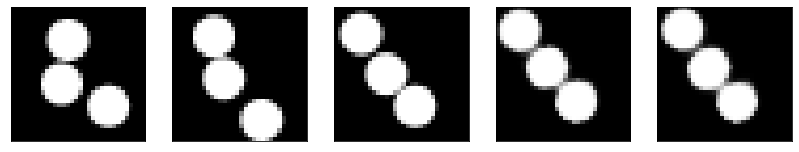

GD iterations:
i=0 | err=54.957146
i=1 | err=53.660679
i=2 | err=52.035179
i=3 | err=50.260811
i=4 | err=48.404621
i=5 | err=46.371025
i=6 | err=44.193775
i=7 | err=41.930721
i=8 | err=39.692978
i=9 | err=37.495594
i=10 | err=35.286564
i=11 | err=33.083710
i=12 | err=30.874176
i=13 | err=28.748341
i=14 | err=26.734680
i=15 | err=24.751192
i=16 | err=22.824360
i=17 | err=21.002838
i=18 | err=19.284784
i=19 | err=17.683966
i=20 | err=16.171024
i=21 | err=14.734585
i=22 | err=13.420326
i=23 | err=12.193964
i=24 | err=11.084641
i=25 | err=10.091478
i=26 | err=9.171738
i=27 | err=8.305168
i=28 | err=7.491203
i=29 | err=6.720521
Epoch=251 (2%) | out_positive=0.857149 | out_negative=0.093952 | mse=0.069661


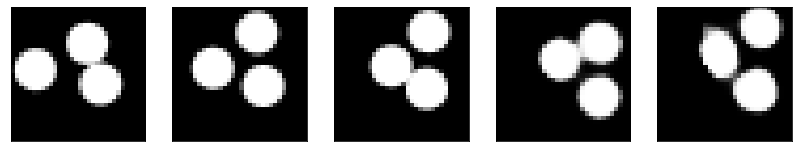

GD iterations:
i=0 | err=46.531975
i=1 | err=45.482353
i=2 | err=44.130375
i=3 | err=42.676949
i=4 | err=41.150547
i=5 | err=39.629219
i=6 | err=38.099464
i=7 | err=36.544159
i=8 | err=34.952198
i=9 | err=33.295280
i=10 | err=31.649725
i=11 | err=30.012709
i=12 | err=28.344584
i=13 | err=26.605522
i=14 | err=24.911354
i=15 | err=23.333824
i=16 | err=21.851986
i=17 | err=20.402163
i=18 | err=19.002007
i=19 | err=17.624474
i=20 | err=16.314205
i=21 | err=15.104445
i=22 | err=13.974914
i=23 | err=12.914476
i=24 | err=11.897478
i=25 | err=10.956293
i=26 | err=10.079871
i=27 | err=9.223947
i=28 | err=8.386184
i=29 | err=7.569733
Epoch=251 (4%) | out_positive=0.876588 | out_negative=0.140755 | mse=0.070470


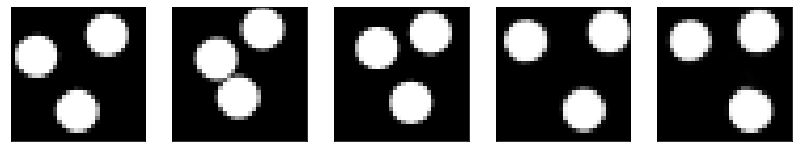

GD iterations:
i=0 | err=52.123779
i=1 | err=50.944572
i=2 | err=49.389347
i=3 | err=47.712692
i=4 | err=46.011009
i=5 | err=44.249199
i=6 | err=42.297611
i=7 | err=40.393631
i=8 | err=38.378616
i=9 | err=36.267620
i=10 | err=34.057251
i=11 | err=31.786699
i=12 | err=29.458626
i=13 | err=27.188419
i=14 | err=25.095592
i=15 | err=23.108761
i=16 | err=21.114086
i=17 | err=19.252930
i=18 | err=17.512606
i=19 | err=15.895095
i=20 | err=14.477412
i=21 | err=13.192142
i=22 | err=12.036991
i=23 | err=10.941144
i=24 | err=9.944023
i=25 | err=9.030739
i=26 | err=8.206846
i=27 | err=7.455792
i=28 | err=6.743658
i=29 | err=6.061409
Epoch=251 (6%) | out_positive=0.907141 | out_negative=0.131090 | mse=0.070490


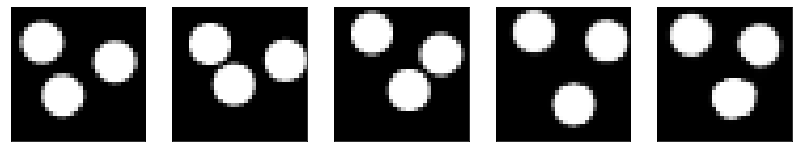

GD iterations:
i=0 | err=54.395237
i=1 | err=53.160984
i=2 | err=51.516136
i=3 | err=49.725754
i=4 | err=47.845757
i=5 | err=45.905434
i=6 | err=43.929886
i=7 | err=41.809967
i=8 | err=39.615639
i=9 | err=37.281387
i=10 | err=34.987560
i=11 | err=32.846798
i=12 | err=30.767073
i=13 | err=28.706905
i=14 | err=26.672253
i=15 | err=24.743473
i=16 | err=22.933811
i=17 | err=21.239958
i=18 | err=19.645979
i=19 | err=18.191761
i=20 | err=16.839695
i=21 | err=15.564611
i=22 | err=14.358799
i=23 | err=13.212656
i=24 | err=12.135550
i=25 | err=11.107279
i=26 | err=10.120064
i=27 | err=9.156700
i=28 | err=8.234890
i=29 | err=7.400446
Epoch=251 (7%) | out_positive=0.851040 | out_negative=0.116710 | mse=0.069556


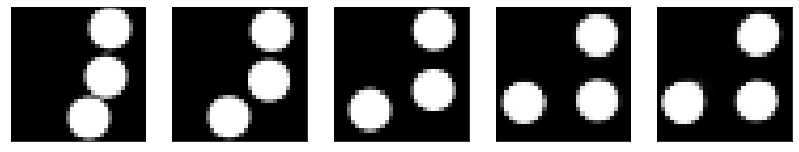

GD iterations:
i=0 | err=53.588806
i=1 | err=52.391697
i=2 | err=50.843880
i=3 | err=49.197399
i=4 | err=47.463562
i=5 | err=45.651928
i=6 | err=43.779205
i=7 | err=41.886589
i=8 | err=40.027599
i=9 | err=38.125496
i=10 | err=36.196266
i=11 | err=34.207375
i=12 | err=32.163696
i=13 | err=30.115128
i=14 | err=28.187309
i=15 | err=26.366167
i=16 | err=24.625088
i=17 | err=22.997402
i=18 | err=21.413935
i=19 | err=19.938244
i=20 | err=18.470200
i=21 | err=17.041748
i=22 | err=15.699548
i=23 | err=14.403034
i=24 | err=13.217833
i=25 | err=12.094007
i=26 | err=11.067205
i=27 | err=10.094444
i=28 | err=9.189195
i=29 | err=8.353447
Epoch=251 (9%) | out_positive=0.835755 | out_negative=0.083241 | mse=0.075837


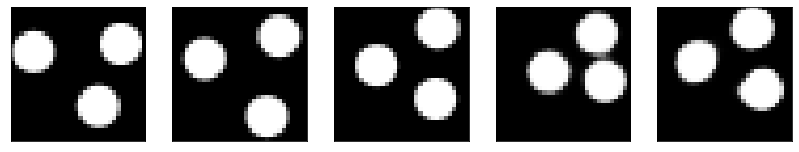

GD iterations:
i=0 | err=54.697704
i=1 | err=53.494286
i=2 | err=51.786263
i=3 | err=49.789330
i=4 | err=47.683628
i=5 | err=45.614655
i=6 | err=43.539230
i=7 | err=41.456268
i=8 | err=39.256485
i=9 | err=37.042488
i=10 | err=34.776100
i=11 | err=32.533272
i=12 | err=30.341331
i=13 | err=28.167767
i=14 | err=26.061302
i=15 | err=23.968979
i=16 | err=21.933895
i=17 | err=20.099503
i=18 | err=18.453823
i=19 | err=16.915438
i=20 | err=15.483234
i=21 | err=14.195938
i=22 | err=13.040402
i=23 | err=11.975988
i=24 | err=11.030239
i=25 | err=10.130933
i=26 | err=9.280710
i=27 | err=8.486570
i=28 | err=7.711912
i=29 | err=6.962801
Epoch=251 (11%) | out_positive=0.825664 | out_negative=0.118491 | mse=0.068831


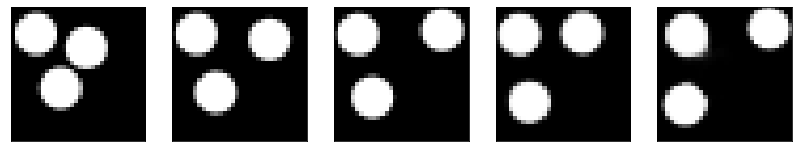

GD iterations:
i=0 | err=52.370815
i=1 | err=51.313393
i=2 | err=49.757751
i=3 | err=48.058613
i=4 | err=46.240299
i=5 | err=44.355370
i=6 | err=42.274406
i=7 | err=40.196083
i=8 | err=37.997097
i=9 | err=35.794952
i=10 | err=33.631207
i=11 | err=31.435207
i=12 | err=29.264534
i=13 | err=27.153072
i=14 | err=25.144314
i=15 | err=23.261663
i=16 | err=21.505226
i=17 | err=19.853466
i=18 | err=18.283245
i=19 | err=16.780521
i=20 | err=15.349028
i=21 | err=14.025055
i=22 | err=12.795573
i=23 | err=11.667307
i=24 | err=10.601690
i=25 | err=9.622497
i=26 | err=8.699348
i=27 | err=7.828716
i=28 | err=6.996279
i=29 | err=6.197219
Epoch=251 (13%) | out_positive=0.894036 | out_negative=0.141346 | mse=0.071428


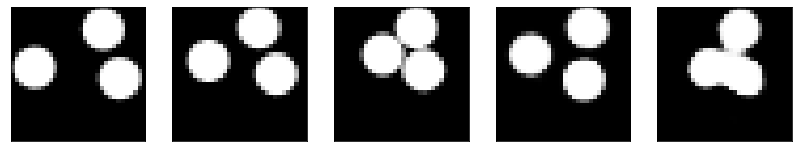

GD iterations:
i=0 | err=53.048065
i=1 | err=51.798962
i=2 | err=50.131226
i=3 | err=48.346786
i=4 | err=46.429192
i=5 | err=44.374229
i=6 | err=42.391556
i=7 | err=40.402802
i=8 | err=38.440483
i=9 | err=36.420513
i=10 | err=34.352497
i=11 | err=32.284714
i=12 | err=30.225527
i=13 | err=28.255503
i=14 | err=26.325687
i=15 | err=24.409388
i=16 | err=22.589550
i=17 | err=20.873083
i=18 | err=19.172697
i=19 | err=17.596157
i=20 | err=16.074238
i=21 | err=14.659963
i=22 | err=13.314550
i=23 | err=12.050589
i=24 | err=10.831714
i=25 | err=9.682297
i=26 | err=8.617805
i=27 | err=7.637137
i=28 | err=6.705824
i=29 | err=5.814193
Epoch=251 (15%) | out_positive=0.920361 | out_negative=0.197326 | mse=0.067406


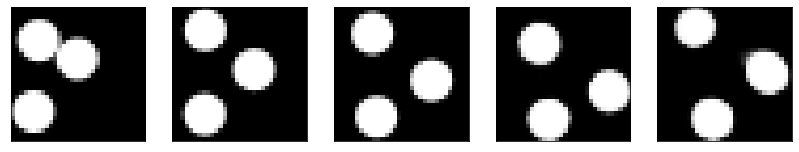

GD iterations:
i=0 | err=55.092419
i=1 | err=53.925781
i=2 | err=52.317051
i=3 | err=50.525345
i=4 | err=48.601498
i=5 | err=46.512794
i=6 | err=44.372639
i=7 | err=42.175240
i=8 | err=39.890472
i=9 | err=37.501717
i=10 | err=35.149818
i=11 | err=32.740211
i=12 | err=30.347733
i=13 | err=27.991360
i=14 | err=25.751350
i=15 | err=23.756710
i=16 | err=21.943151
i=17 | err=20.231615
i=18 | err=18.656548
i=19 | err=17.209003
i=20 | err=15.890636
i=21 | err=14.645248
i=22 | err=13.494959
i=23 | err=12.427439
i=24 | err=11.434450
i=25 | err=10.502363
i=26 | err=9.633094
i=27 | err=8.810817
i=28 | err=8.017731
i=29 | err=7.259269
Epoch=251 (16%) | out_positive=0.899754 | out_negative=0.091433 | mse=0.071866


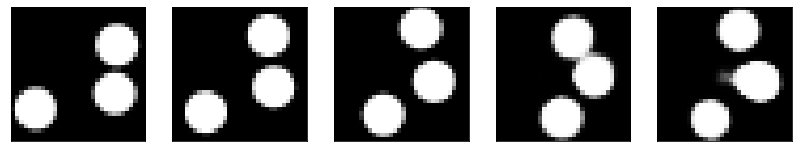

GD iterations:
i=0 | err=55.116325
i=1 | err=53.989658
i=2 | err=52.338791
i=3 | err=50.458992
i=4 | err=48.457588
i=5 | err=46.423035
i=6 | err=44.372105
i=7 | err=42.268234
i=8 | err=40.142189
i=9 | err=37.985565
i=10 | err=35.810558
i=11 | err=33.606178
i=12 | err=31.403797
i=13 | err=29.219496
i=14 | err=27.049667
i=15 | err=24.912653
i=16 | err=22.879930
i=17 | err=21.038128
i=18 | err=19.315018
i=19 | err=17.713779
i=20 | err=16.255054
i=21 | err=14.875973
i=22 | err=13.630419
i=23 | err=12.490694
i=24 | err=11.413197
i=25 | err=10.418480
i=26 | err=9.478433
i=27 | err=8.607647
i=28 | err=7.778477
i=29 | err=6.993790
Epoch=251 (18%) | out_positive=0.839682 | out_negative=0.120395 | mse=0.068638


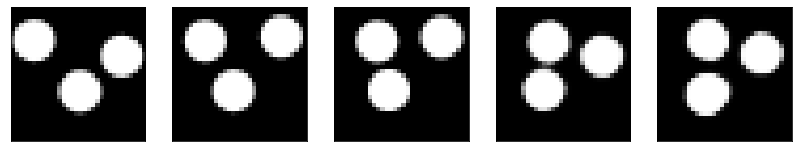

GD iterations:
i=0 | err=55.937721
i=1 | err=54.737278
i=2 | err=53.139893
i=3 | err=51.296707
i=4 | err=49.310997
i=5 | err=47.248035
i=6 | err=45.176514
i=7 | err=42.977943
i=8 | err=40.707359
i=9 | err=38.287178
i=10 | err=35.912041
i=11 | err=33.610008
i=12 | err=31.408100
i=13 | err=29.270397
i=14 | err=27.217770
i=15 | err=25.238117
i=16 | err=23.341986
i=17 | err=21.528263
i=18 | err=19.837727
i=19 | err=18.266870
i=20 | err=16.836319
i=21 | err=15.491605
i=22 | err=14.253784
i=23 | err=13.106847
i=24 | err=12.009649
i=25 | err=10.976934
i=26 | err=10.043251
i=27 | err=9.141153
i=28 | err=8.300314
i=29 | err=7.495289
Epoch=251 (20%) | out_positive=0.855293 | out_negative=0.092529 | mse=0.072743


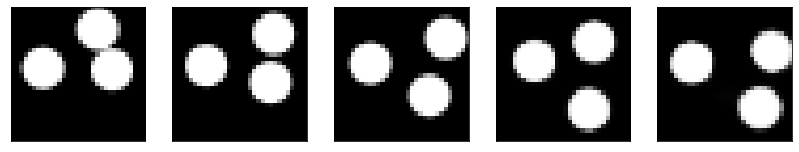

GD iterations:
i=0 | err=55.779148
i=1 | err=54.586079
i=2 | err=52.945724
i=3 | err=51.106323
i=4 | err=49.247330
i=5 | err=47.250626
i=6 | err=45.219700
i=7 | err=43.204697
i=8 | err=41.134857
i=9 | err=38.986259
i=10 | err=36.787891
i=11 | err=34.653999
i=12 | err=32.508869
i=13 | err=30.319052
i=14 | err=28.204231
i=15 | err=26.246500
i=16 | err=24.413010
i=17 | err=22.630802
i=18 | err=20.963978
i=19 | err=19.373323
i=20 | err=17.900072
i=21 | err=16.547916
i=22 | err=15.302439
i=23 | err=14.144218
i=24 | err=13.082402
i=25 | err=12.074696
i=26 | err=11.122120
i=27 | err=10.215416
i=28 | err=9.359873
i=29 | err=8.545877
Epoch=251 (22%) | out_positive=0.851009 | out_negative=0.081203 | mse=0.077772


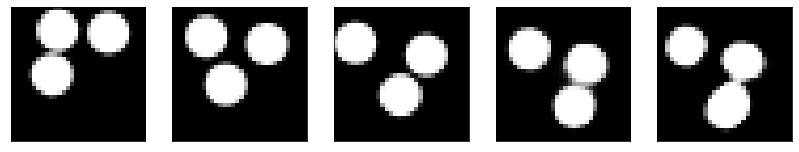

GD iterations:
i=0 | err=49.797806
i=1 | err=48.590240
i=2 | err=47.013718
i=3 | err=45.231926
i=4 | err=43.355175
i=5 | err=41.439178
i=6 | err=39.474174
i=7 | err=37.512440
i=8 | err=35.453835
i=9 | err=33.381901
i=10 | err=31.431490
i=11 | err=29.500025
i=12 | err=27.539663
i=13 | err=25.591671
i=14 | err=23.703026
i=15 | err=21.874149
i=16 | err=20.088652
i=17 | err=18.386805
i=18 | err=16.830742
i=19 | err=15.383875
i=20 | err=14.076449
i=21 | err=12.889023
i=22 | err=11.794281
i=23 | err=10.777504
i=24 | err=9.857790
i=25 | err=8.982499
i=26 | err=8.145536
i=27 | err=7.366753
i=28 | err=6.629283
i=29 | err=5.910456
Epoch=251 (24%) | out_positive=0.919493 | out_negative=0.129353 | mse=0.071611


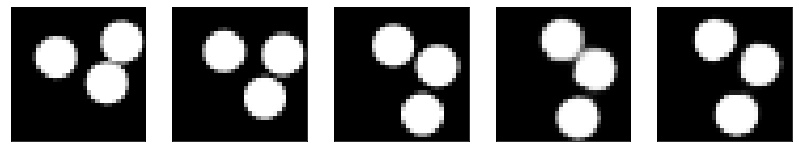

GD iterations:
i=0 | err=50.420959
i=1 | err=49.309727
i=2 | err=47.875046
i=3 | err=46.182163
i=4 | err=44.475506
i=5 | err=42.591812
i=6 | err=40.632229
i=7 | err=38.636230
i=8 | err=36.657219
i=9 | err=34.721764
i=10 | err=32.741608
i=11 | err=30.782936
i=12 | err=28.808556
i=13 | err=26.819206
i=14 | err=24.934399
i=15 | err=23.127392
i=16 | err=21.421734
i=17 | err=19.800789
i=18 | err=18.278305
i=19 | err=16.862553
i=20 | err=15.549150
i=21 | err=14.312774
i=22 | err=13.160872
i=23 | err=12.079964
i=24 | err=11.060028
i=25 | err=10.095825
i=26 | err=9.187559
i=27 | err=8.346953
i=28 | err=7.576176
i=29 | err=6.841460
Epoch=251 (26%) | out_positive=0.913699 | out_negative=0.139236 | mse=0.071956


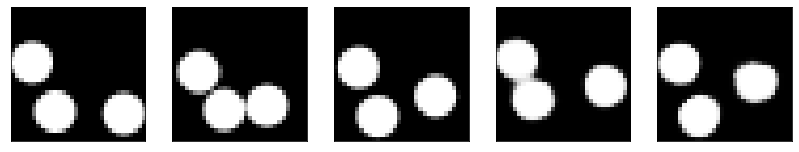

GD iterations:
i=0 | err=53.660049
i=1 | err=52.504326
i=2 | err=50.903046
i=3 | err=49.103123
i=4 | err=47.169426
i=5 | err=45.136219
i=6 | err=43.017349
i=7 | err=40.838047
i=8 | err=38.577702
i=9 | err=36.270676
i=10 | err=33.951721
i=11 | err=31.703455
i=12 | err=29.576597
i=13 | err=27.435404
i=14 | err=25.336025
i=15 | err=23.274576
i=16 | err=21.328758
i=17 | err=19.498047
i=18 | err=17.842285
i=19 | err=16.306774
i=20 | err=14.953827
i=21 | err=13.708520
i=22 | err=12.557652
i=23 | err=11.489012
i=24 | err=10.502414
i=25 | err=9.594290
i=26 | err=8.716380
i=27 | err=7.888796
i=28 | err=7.101503
i=29 | err=6.367017
Epoch=251 (28%) | out_positive=0.906646 | out_negative=0.137474 | mse=0.075102


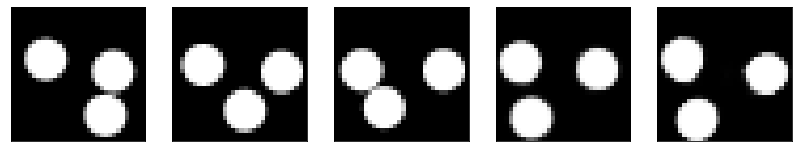

GD iterations:
i=0 | err=56.045788
i=1 | err=54.826832
i=2 | err=53.161713
i=3 | err=51.229591
i=4 | err=49.152267
i=5 | err=46.992790
i=6 | err=44.717079
i=7 | err=42.374130
i=8 | err=40.040024
i=9 | err=37.662140
i=10 | err=35.291817
i=11 | err=32.953232
i=12 | err=30.527363
i=13 | err=28.143700
i=14 | err=25.815367
i=15 | err=23.593536
i=16 | err=21.569939
i=17 | err=19.655519
i=18 | err=17.877872
i=19 | err=16.333944
i=20 | err=14.899550
i=21 | err=13.562983
i=22 | err=12.399174
i=23 | err=11.329547
i=24 | err=10.361180
i=25 | err=9.484501
i=26 | err=8.656162
i=27 | err=7.883455
i=28 | err=7.143272
i=29 | err=6.431671
Epoch=251 (29%) | out_positive=0.815369 | out_negative=0.150892 | mse=0.065865


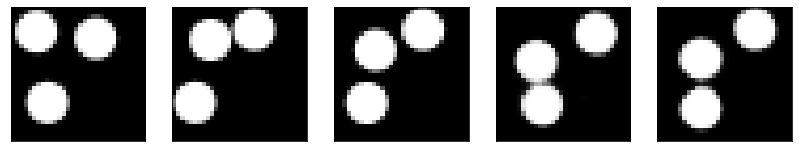

GD iterations:
i=0 | err=55.457748
i=1 | err=54.231091
i=2 | err=52.623787
i=3 | err=50.833458
i=4 | err=48.967575
i=5 | err=47.058281
i=6 | err=45.093246
i=7 | err=43.122169
i=8 | err=41.126144
i=9 | err=39.037685
i=10 | err=36.911430
i=11 | err=34.776634
i=12 | err=32.631016
i=13 | err=30.404922
i=14 | err=28.125340
i=15 | err=25.916916
i=16 | err=23.823269
i=17 | err=21.885738
i=18 | err=20.072720
i=19 | err=18.340332
i=20 | err=16.743198
i=21 | err=15.299656
i=22 | err=13.987967
i=23 | err=12.797390
i=24 | err=11.660637
i=25 | err=10.647830
i=26 | err=9.699842
i=27 | err=8.843777
i=28 | err=8.036236
i=29 | err=7.262610
Epoch=251 (31%) | out_positive=0.818375 | out_negative=0.114444 | mse=0.074501


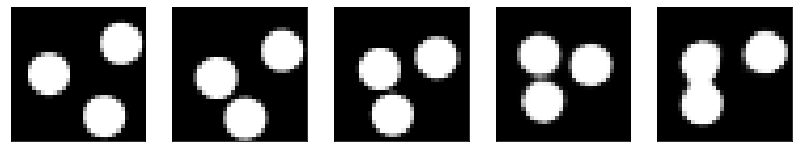

GD iterations:
i=0 | err=54.426018
i=1 | err=53.256432
i=2 | err=51.589569
i=3 | err=49.736080
i=4 | err=47.744789
i=5 | err=45.623657
i=6 | err=43.430252
i=7 | err=41.206154
i=8 | err=38.988796
i=9 | err=36.734287
i=10 | err=34.501408
i=11 | err=32.261684
i=12 | err=30.127277
i=13 | err=27.966881
i=14 | err=25.808052
i=15 | err=23.746193
i=16 | err=21.858772
i=17 | err=20.103287
i=18 | err=18.413231
i=19 | err=16.862867
i=20 | err=15.414900
i=21 | err=14.063996
i=22 | err=12.832380
i=23 | err=11.701801
i=24 | err=10.679745
i=25 | err=9.726793
i=26 | err=8.857281
i=27 | err=8.053221
i=28 | err=7.288859
i=29 | err=6.558535
Epoch=251 (33%) | out_positive=0.852262 | out_negative=0.139954 | mse=0.071069


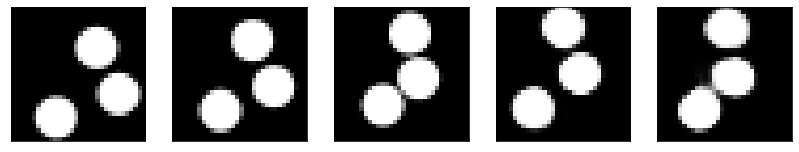

GD iterations:
i=0 | err=50.451454
i=1 | err=49.264946
i=2 | err=47.683128
i=3 | err=45.899231
i=4 | err=43.970654
i=5 | err=42.097237
i=6 | err=40.092793
i=7 | err=37.997169
i=8 | err=35.853703
i=9 | err=33.745319
i=10 | err=31.691429
i=11 | err=29.652245
i=12 | err=27.636808
i=13 | err=25.678232
i=14 | err=23.826321
i=15 | err=22.042984
i=16 | err=20.348801
i=17 | err=18.778591
i=18 | err=17.337601
i=19 | err=15.977837
i=20 | err=14.722095
i=21 | err=13.527906
i=22 | err=12.457094
i=23 | err=11.436706
i=24 | err=10.496899
i=25 | err=9.596537
i=26 | err=8.760838
i=27 | err=7.949647
i=28 | err=7.152201
i=29 | err=6.369473
Epoch=251 (35%) | out_positive=0.881534 | out_negative=0.172299 | mse=0.064266


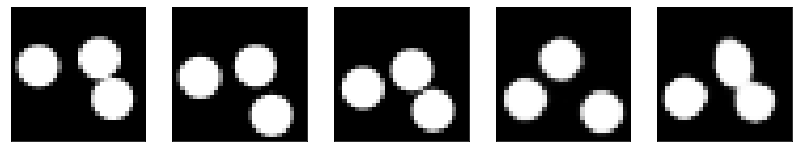

GD iterations:
i=0 | err=57.026489
i=1 | err=55.765339
i=2 | err=54.012020
i=3 | err=52.079830
i=4 | err=50.062721
i=5 | err=47.867500
i=6 | err=45.675594
i=7 | err=43.417824
i=8 | err=41.117374
i=9 | err=38.720856
i=10 | err=36.331009
i=11 | err=33.992447
i=12 | err=31.665228
i=13 | err=29.403507
i=14 | err=27.204441
i=15 | err=25.124886
i=16 | err=23.135773
i=17 | err=21.252926
i=18 | err=19.509796
i=19 | err=17.859011
i=20 | err=16.371937
i=21 | err=14.987799
i=22 | err=13.685026
i=23 | err=12.474546
i=24 | err=11.362564
i=25 | err=10.341735
i=26 | err=9.382835
i=27 | err=8.447337
i=28 | err=7.556561
i=29 | err=6.718084
Epoch=251 (37%) | out_positive=0.849703 | out_negative=0.130611 | mse=0.071690


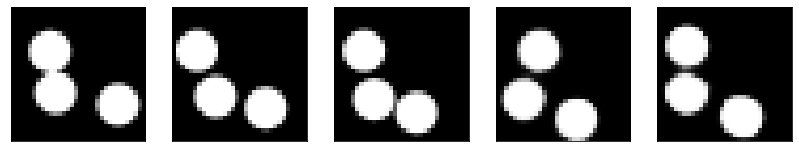

GD iterations:
i=0 | err=54.036060
i=1 | err=52.921024
i=2 | err=51.399605
i=3 | err=49.692551
i=4 | err=47.844055
i=5 | err=45.953400
i=6 | err=44.003838
i=7 | err=42.032951
i=8 | err=40.055756
i=9 | err=38.081642
i=10 | err=36.088268
i=11 | err=34.121414
i=12 | err=32.127129
i=13 | err=30.180355
i=14 | err=28.291298
i=15 | err=26.443279
i=16 | err=24.645878
i=17 | err=22.924707
i=18 | err=21.306458
i=19 | err=19.765129
i=20 | err=18.286137
i=21 | err=16.893211
i=22 | err=15.546460
i=23 | err=14.247363
i=24 | err=13.037818
i=25 | err=11.900089
i=26 | err=10.859861
i=27 | err=9.905940
i=28 | err=8.995947
i=29 | err=8.124341
Epoch=251 (38%) | out_positive=0.877255 | out_negative=0.099206 | mse=0.073311


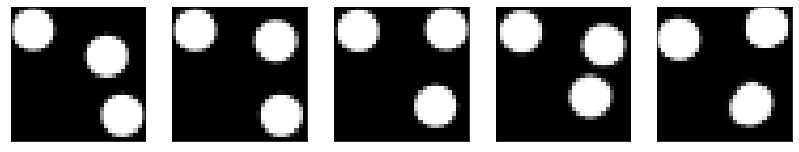

GD iterations:
i=0 | err=53.133156
i=1 | err=52.039845
i=2 | err=50.592400
i=3 | err=48.989067
i=4 | err=47.299942
i=5 | err=45.654861
i=6 | err=43.945782
i=7 | err=42.183113
i=8 | err=40.325050
i=9 | err=38.412220
i=10 | err=36.516434
i=11 | err=34.585335
i=12 | err=32.546455
i=13 | err=30.506668
i=14 | err=28.463940
i=15 | err=26.444834
i=16 | err=24.572750
i=17 | err=22.803291
i=18 | err=21.147598
i=19 | err=19.589128
i=20 | err=18.090328
i=21 | err=16.671867
i=22 | err=15.373734
i=23 | err=14.201271
i=24 | err=13.100326
i=25 | err=12.083603
i=26 | err=11.137165
i=27 | err=10.260950
i=28 | err=9.425011
i=29 | err=8.653447
Epoch=251 (40%) | out_positive=0.874322 | out_negative=0.133299 | mse=0.075452


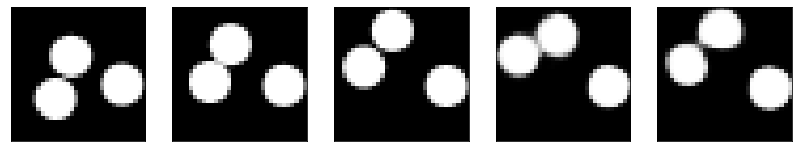

GD iterations:
i=0 | err=55.013283
i=1 | err=53.731247
i=2 | err=51.980789
i=3 | err=50.067734
i=4 | err=48.056381
i=5 | err=45.903191
i=6 | err=43.719864
i=7 | err=41.477242
i=8 | err=39.323486
i=9 | err=37.156937
i=10 | err=35.010162
i=11 | err=32.967632
i=12 | err=30.831381
i=13 | err=28.651571
i=14 | err=26.585461
i=15 | err=24.641609
i=16 | err=22.858879
i=17 | err=21.175646
i=18 | err=19.601711
i=19 | err=18.100700
i=20 | err=16.668711
i=21 | err=15.368111
i=22 | err=14.131159
i=23 | err=12.956235
i=24 | err=11.834241
i=25 | err=10.797029
i=26 | err=9.814016
i=27 | err=8.902888
i=28 | err=8.043943
i=29 | err=7.202168
Epoch=251 (42%) | out_positive=0.885190 | out_negative=0.125965 | mse=0.071235


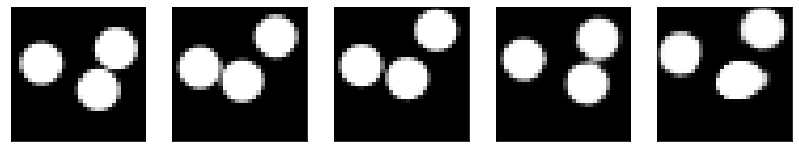

GD iterations:
i=0 | err=53.247025
i=1 | err=52.114128
i=2 | err=50.547489
i=3 | err=48.827118
i=4 | err=47.032211
i=5 | err=45.193344
i=6 | err=43.232727
i=7 | err=41.141693
i=8 | err=39.036377
i=9 | err=36.936741
i=10 | err=34.783089
i=11 | err=32.586807
i=12 | err=30.416576
i=13 | err=28.235039
i=14 | err=26.117294
i=15 | err=24.077923
i=16 | err=22.211819
i=17 | err=20.475056
i=18 | err=18.802414
i=19 | err=17.268108
i=20 | err=15.874307
i=21 | err=14.585495
i=22 | err=13.387319
i=23 | err=12.240898
i=24 | err=11.171574
i=25 | err=10.198484
i=26 | err=9.297655
i=27 | err=8.437874
i=28 | err=7.653345
i=29 | err=6.913281
Epoch=251 (44%) | out_positive=0.932087 | out_negative=0.144394 | mse=0.073941


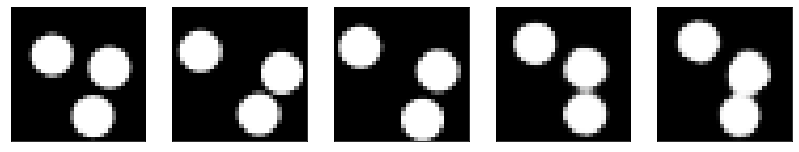

GD iterations:
i=0 | err=56.085823
i=1 | err=54.967209
i=2 | err=53.448753
i=3 | err=51.682281
i=4 | err=49.836353
i=5 | err=47.831512
i=6 | err=45.753433
i=7 | err=43.663261
i=8 | err=41.406921
i=9 | err=39.191055
i=10 | err=36.735401
i=11 | err=34.417603
i=12 | err=32.177391
i=13 | err=29.955750
i=14 | err=27.794172
i=15 | err=25.674366
i=16 | err=23.766769
i=17 | err=21.839014
i=18 | err=20.123098
i=19 | err=18.501244
i=20 | err=17.037514
i=21 | err=15.707187
i=22 | err=14.450142
i=23 | err=13.287489
i=24 | err=12.187866
i=25 | err=11.131659
i=26 | err=10.119516
i=27 | err=9.180098
i=28 | err=8.297406
i=29 | err=7.419378
Epoch=251 (46%) | out_positive=0.840403 | out_negative=0.093787 | mse=0.077093


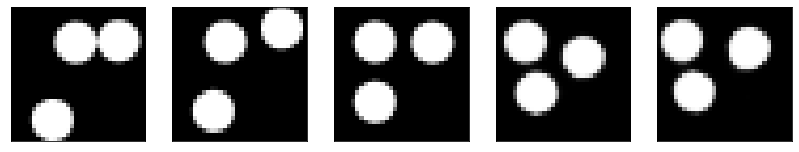

GD iterations:
i=0 | err=55.616661
i=1 | err=54.541321
i=2 | err=52.992027
i=3 | err=51.270313
i=4 | err=49.353085
i=5 | err=47.361610
i=6 | err=45.315567
i=7 | err=43.195744
i=8 | err=41.096416
i=9 | err=38.884480
i=10 | err=36.682053
i=11 | err=34.440063
i=12 | err=32.183399
i=13 | err=29.964458
i=14 | err=27.826618
i=15 | err=25.701138
i=16 | err=23.780907
i=17 | err=22.021622
i=18 | err=20.326218
i=19 | err=18.802944
i=20 | err=17.392668
i=21 | err=16.075827
i=22 | err=14.839037
i=23 | err=13.693832
i=24 | err=12.621883
i=25 | err=11.606428
i=26 | err=10.635180
i=27 | err=9.736362
i=28 | err=8.859055
i=29 | err=8.014685
Epoch=251 (47%) | out_positive=0.891356 | out_negative=0.092724 | mse=0.075914


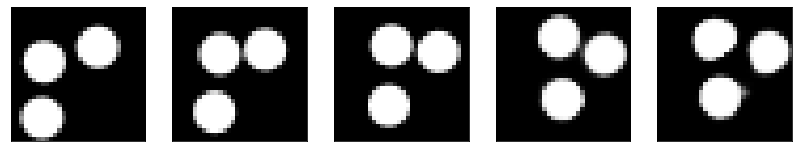

GD iterations:
i=0 | err=53.643372
i=1 | err=52.368500
i=2 | err=50.674847
i=3 | err=48.729244
i=4 | err=46.683399
i=5 | err=44.545944
i=6 | err=42.365364
i=7 | err=40.200645
i=8 | err=37.970123
i=9 | err=35.777756
i=10 | err=33.634697
i=11 | err=31.540216
i=12 | err=29.488297
i=13 | err=27.456982
i=14 | err=25.466599
i=15 | err=23.498755
i=16 | err=21.629835
i=17 | err=19.885002
i=18 | err=18.302280
i=19 | err=16.801744
i=20 | err=15.427670
i=21 | err=14.138893
i=22 | err=12.941265
i=23 | err=11.850632
i=24 | err=10.840017
i=25 | err=9.923398
i=26 | err=9.086760
i=27 | err=8.293623
i=28 | err=7.532375
i=29 | err=6.806523
Epoch=251 (49%) | out_positive=0.923120 | out_negative=0.122647 | mse=0.071408


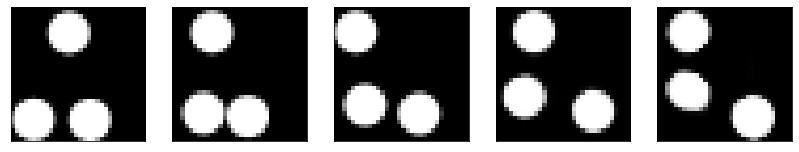

GD iterations:
i=0 | err=55.118259
i=1 | err=54.063881
i=2 | err=52.593285
i=3 | err=50.894447
i=4 | err=49.055023
i=5 | err=47.151783
i=6 | err=45.231400
i=7 | err=43.195122
i=8 | err=41.082657
i=9 | err=38.939526
i=10 | err=36.701054
i=11 | err=34.498829
i=12 | err=32.380508
i=13 | err=30.328398
i=14 | err=28.417728
i=15 | err=26.550858
i=16 | err=24.882597
i=17 | err=23.296349
i=18 | err=21.760555
i=19 | err=20.289436
i=20 | err=18.899593
i=21 | err=17.505749
i=22 | err=16.201170
i=23 | err=14.913849
i=24 | err=13.701283
i=25 | err=12.569344
i=26 | err=11.491185
i=27 | err=10.514093
i=28 | err=9.594716
i=29 | err=8.748105
Epoch=251 (51%) | out_positive=0.860232 | out_negative=0.052269 | mse=0.077585


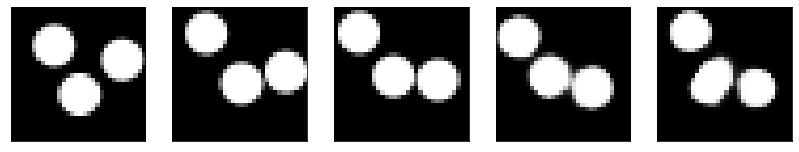

GD iterations:
i=0 | err=51.722557
i=1 | err=50.656136
i=2 | err=49.286484
i=3 | err=47.741432
i=4 | err=46.099300
i=5 | err=44.509018
i=6 | err=42.822716
i=7 | err=41.108536
i=8 | err=39.276634
i=9 | err=37.362755
i=10 | err=35.422409
i=11 | err=33.450886
i=12 | err=31.430201
i=13 | err=29.358139
i=14 | err=27.314671
i=15 | err=25.420757
i=16 | err=23.624548
i=17 | err=21.938137
i=18 | err=20.281775
i=19 | err=18.629686
i=20 | err=17.035900
i=21 | err=15.521762
i=22 | err=14.075972
i=23 | err=12.796209
i=24 | err=11.665524
i=25 | err=10.640246
i=26 | err=9.708534
i=27 | err=8.807335
i=28 | err=7.970625
i=29 | err=7.179791
Epoch=251 (53%) | out_positive=0.828730 | out_negative=0.110282 | mse=0.068903


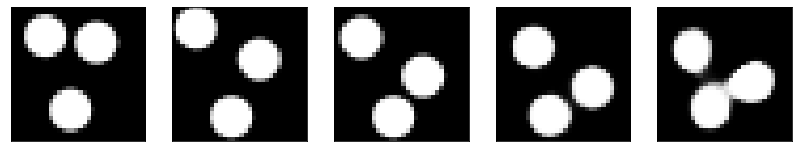

GD iterations:
i=0 | err=51.742493
i=1 | err=50.635323
i=2 | err=49.125938
i=3 | err=47.456734
i=4 | err=45.666420
i=5 | err=43.825237
i=6 | err=41.878677
i=7 | err=39.882347
i=8 | err=37.913651
i=9 | err=35.919888
i=10 | err=33.940941
i=11 | err=31.933315
i=12 | err=30.012449
i=13 | err=28.138268
i=14 | err=26.313671
i=15 | err=24.537769
i=16 | err=22.854195
i=17 | err=21.257175
i=18 | err=19.718109
i=19 | err=18.211926
i=20 | err=16.817997
i=21 | err=15.481312
i=22 | err=14.223396
i=23 | err=13.092461
i=24 | err=12.060448
i=25 | err=11.114218
i=26 | err=10.209647
i=27 | err=9.363638
i=28 | err=8.568254
i=29 | err=7.788918
Epoch=251 (55%) | out_positive=0.880439 | out_negative=0.099193 | mse=0.076867


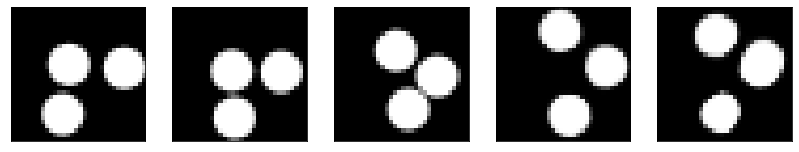

GD iterations:
i=0 | err=52.950836
i=1 | err=51.706364
i=2 | err=50.034176
i=3 | err=48.234795
i=4 | err=46.356136
i=5 | err=44.360283
i=6 | err=42.313591
i=7 | err=40.191830
i=8 | err=37.986298
i=9 | err=35.743000
i=10 | err=33.494614
i=11 | err=31.257851
i=12 | err=29.156893
i=13 | err=27.117914
i=14 | err=25.162422
i=15 | err=23.239931
i=16 | err=21.488590
i=17 | err=19.878647
i=18 | err=18.382784
i=19 | err=16.999744
i=20 | err=15.666207
i=21 | err=14.404301
i=22 | err=13.233746
i=23 | err=12.108795
i=24 | err=11.045682
i=25 | err=10.025803
i=26 | err=9.076120
i=27 | err=8.188097
i=28 | err=7.363007
i=29 | err=6.594603
Epoch=251 (57%) | out_positive=0.904747 | out_negative=0.127911 | mse=0.071231


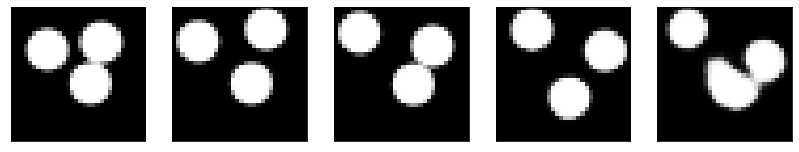

GD iterations:
i=0 | err=55.881096
i=1 | err=54.741821
i=2 | err=53.085075
i=3 | err=51.176933
i=4 | err=49.210484
i=5 | err=47.185818
i=6 | err=45.102394
i=7 | err=42.952911
i=8 | err=40.759781
i=9 | err=38.621429
i=10 | err=36.501434
i=11 | err=34.320297
i=12 | err=32.118984
i=13 | err=30.029018
i=14 | err=27.953636
i=15 | err=25.960829
i=16 | err=24.054304
i=17 | err=22.184284
i=18 | err=20.442993
i=19 | err=18.776649
i=20 | err=17.176104
i=21 | err=15.628414
i=22 | err=14.128621
i=23 | err=12.705070
i=24 | err=11.404485
i=25 | err=10.156750
i=26 | err=8.960627
i=27 | err=7.854764
i=28 | err=6.888659
i=29 | err=6.004934
Epoch=251 (59%) | out_positive=0.843205 | out_negative=0.128096 | mse=0.069773


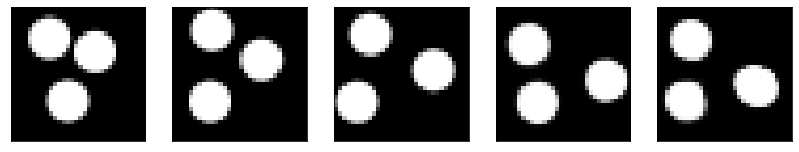

GD iterations:
i=0 | err=53.486290
i=1 | err=52.362671
i=2 | err=50.805656
i=3 | err=49.168545
i=4 | err=47.414616
i=5 | err=45.637993
i=6 | err=43.699356
i=7 | err=41.700481
i=8 | err=39.644127
i=9 | err=37.559162
i=10 | err=35.514038
i=11 | err=33.493202
i=12 | err=31.480513
i=13 | err=29.502800
i=14 | err=27.643925
i=15 | err=25.780598
i=16 | err=24.061378
i=17 | err=22.402275
i=18 | err=20.815441
i=19 | err=19.282230
i=20 | err=17.824169
i=21 | err=16.425728
i=22 | err=15.153585
i=23 | err=13.881294
i=24 | err=12.668205
i=25 | err=11.569506
i=26 | err=10.554739
i=27 | err=9.605835
i=28 | err=8.715652
i=29 | err=7.889937
Epoch=251 (60%) | out_positive=0.880808 | out_negative=0.087144 | mse=0.072207


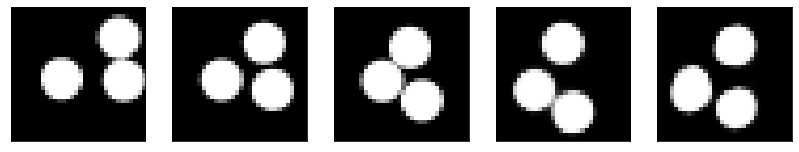

GD iterations:
i=0 | err=56.336197
i=1 | err=55.092133
i=2 | err=53.481136
i=3 | err=51.640091
i=4 | err=49.681671
i=5 | err=47.700974
i=6 | err=45.690689
i=7 | err=43.529114
i=8 | err=41.291519
i=9 | err=38.975372
i=10 | err=36.677635
i=11 | err=34.364296
i=12 | err=32.086720
i=13 | err=29.809708
i=14 | err=27.586029
i=15 | err=25.455151
i=16 | err=23.456554
i=17 | err=21.631475
i=18 | err=19.909058
i=19 | err=18.326654
i=20 | err=16.871828
i=21 | err=15.528061
i=22 | err=14.221766
i=23 | err=12.976193
i=24 | err=11.827467
i=25 | err=10.765661
i=26 | err=9.729397
i=27 | err=8.790846
i=28 | err=7.906260
i=29 | err=7.068758
Epoch=251 (62%) | out_positive=0.896004 | out_negative=0.133174 | mse=0.069133


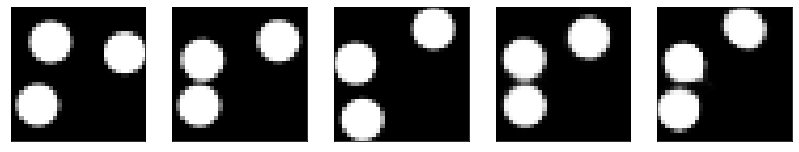

GD iterations:
i=0 | err=55.760120
i=1 | err=54.603409
i=2 | err=53.013008
i=3 | err=51.212482
i=4 | err=49.324677
i=5 | err=47.313774
i=6 | err=45.226654
i=7 | err=43.178391
i=8 | err=41.061043
i=9 | err=38.863110
i=10 | err=36.648521
i=11 | err=34.465279
i=12 | err=32.270420
i=13 | err=30.053818
i=14 | err=27.892500
i=15 | err=25.818073
i=16 | err=23.830582
i=17 | err=21.925213
i=18 | err=20.104490
i=19 | err=18.403679
i=20 | err=16.790102
i=21 | err=15.342432
i=22 | err=13.988839
i=23 | err=12.695669
i=24 | err=11.485777
i=25 | err=10.372702
i=26 | err=9.354168
i=27 | err=8.429706
i=28 | err=7.572269
i=29 | err=6.786914
Epoch=251 (64%) | out_positive=0.869671 | out_negative=0.143699 | mse=0.072068


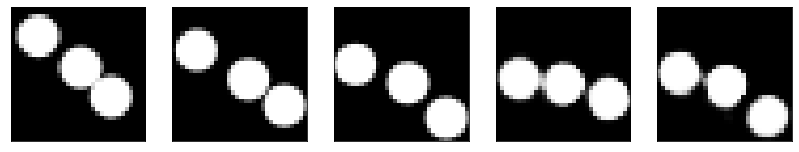

GD iterations:
i=0 | err=56.323746
i=1 | err=55.114433
i=2 | err=53.488861
i=3 | err=51.659794
i=4 | err=49.665894
i=5 | err=47.627579
i=6 | err=45.460854
i=7 | err=43.192371
i=8 | err=40.824917
i=9 | err=38.496792
i=10 | err=36.146156
i=11 | err=33.737926
i=12 | err=31.443855
i=13 | err=29.248505
i=14 | err=27.141665
i=15 | err=25.211029
i=16 | err=23.422298
i=17 | err=21.727667
i=18 | err=20.142708
i=19 | err=18.544138
i=20 | err=16.987715
i=21 | err=15.522368
i=22 | err=14.171094
i=23 | err=12.914179
i=24 | err=11.778281
i=25 | err=10.746627
i=26 | err=9.791863
i=27 | err=8.939371
i=28 | err=8.144540
i=29 | err=7.423513
Epoch=251 (66%) | out_positive=0.877672 | out_negative=0.112753 | mse=0.069254


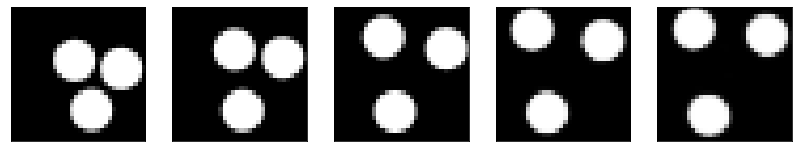

GD iterations:
i=0 | err=52.929207
i=1 | err=51.720566
i=2 | err=50.106121
i=3 | err=48.283600
i=4 | err=46.436119
i=5 | err=44.467960
i=6 | err=42.364441
i=7 | err=40.214714
i=8 | err=38.046745
i=9 | err=35.946583
i=10 | err=33.965759
i=11 | err=32.088036
i=12 | err=30.200659
i=13 | err=28.215626
i=14 | err=26.194805
i=15 | err=24.153410
i=16 | err=22.225500
i=17 | err=20.462681
i=18 | err=18.895443
i=19 | err=17.402939
i=20 | err=15.961479
i=21 | err=14.622880
i=22 | err=13.413881
i=23 | err=12.301796
i=24 | err=11.251987
i=25 | err=10.289029
i=26 | err=9.392845
i=27 | err=8.534401
i=28 | err=7.717955
i=29 | err=6.931972
Epoch=251 (68%) | out_positive=0.857441 | out_negative=0.112050 | mse=0.075136


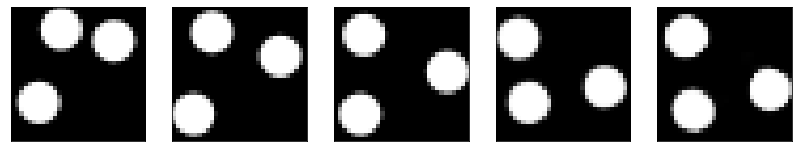

GD iterations:
i=0 | err=53.434517
i=1 | err=52.388725
i=2 | err=50.910641
i=3 | err=49.224800
i=4 | err=47.432320
i=5 | err=45.629593
i=6 | err=43.789173
i=7 | err=41.850937
i=8 | err=39.831226
i=9 | err=37.722759
i=10 | err=35.578926
i=11 | err=33.393990
i=12 | err=31.228596
i=13 | err=29.105978
i=14 | err=27.062893
i=15 | err=25.108723
i=16 | err=23.227804
i=17 | err=21.461161
i=18 | err=19.798042
i=19 | err=18.253185
i=20 | err=16.763823
i=21 | err=15.320560
i=22 | err=13.938678
i=23 | err=12.628180
i=24 | err=11.381681
i=25 | err=10.200817
i=26 | err=9.095030
i=27 | err=8.101385
i=28 | err=7.185848
i=29 | err=6.308906
Epoch=251 (70%) | out_positive=0.886713 | out_negative=0.151041 | mse=0.069035


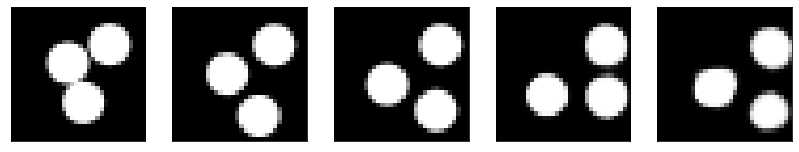

GD iterations:
i=0 | err=53.853302
i=1 | err=52.674980
i=2 | err=51.057892
i=3 | err=49.331558
i=4 | err=47.378201
i=5 | err=45.429062
i=6 | err=43.392952
i=7 | err=41.335392
i=8 | err=39.329918
i=9 | err=37.325272
i=10 | err=35.329254
i=11 | err=33.311081
i=12 | err=31.302284
i=13 | err=29.333122
i=14 | err=27.404694
i=15 | err=25.534678
i=16 | err=23.719625
i=17 | err=21.939657
i=18 | err=20.252417
i=19 | err=18.650379
i=20 | err=17.156273
i=21 | err=15.754993
i=22 | err=14.445604
i=23 | err=13.249704
i=24 | err=12.154606
i=25 | err=11.132961
i=26 | err=10.179386
i=27 | err=9.258890
i=28 | err=8.380499
i=29 | err=7.532858
Epoch=251 (71%) | out_positive=0.827001 | out_negative=0.081326 | mse=0.065423


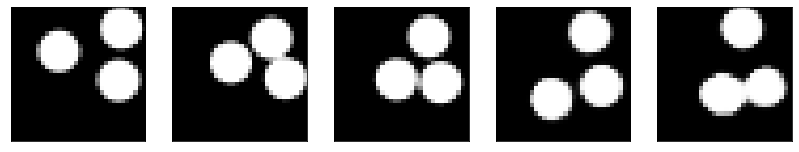

GD iterations:
i=0 | err=61.175663
i=1 | err=59.968674
i=2 | err=58.354576
i=3 | err=56.490326
i=4 | err=54.538849
i=5 | err=52.387077
i=6 | err=50.109776
i=7 | err=47.714916
i=8 | err=45.207047
i=9 | err=42.614460
i=10 | err=39.965904
i=11 | err=37.336716
i=12 | err=34.671341
i=13 | err=31.933250
i=14 | err=29.276115
i=15 | err=26.852566
i=16 | err=24.657150
i=17 | err=22.610350
i=18 | err=20.768740
i=19 | err=19.060072
i=20 | err=17.513153
i=21 | err=16.062222
i=22 | err=14.741943
i=23 | err=13.427507
i=24 | err=12.215840
i=25 | err=11.103153
i=26 | err=10.026915
i=27 | err=9.012293
i=28 | err=8.042509
i=29 | err=7.114333
Epoch=251 (73%) | out_positive=0.827698 | out_negative=0.134494 | mse=0.075773


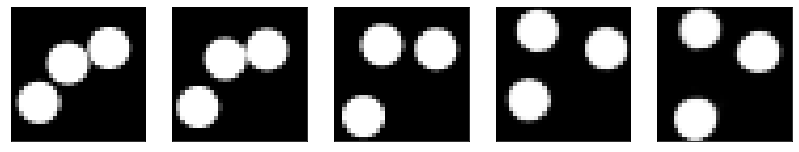

GD iterations:
i=0 | err=51.876431
i=1 | err=50.717949
i=2 | err=49.246574
i=3 | err=47.654442
i=4 | err=46.006248
i=5 | err=44.326370
i=6 | err=42.494442
i=7 | err=40.606743
i=8 | err=38.660896
i=9 | err=36.725494
i=10 | err=34.814960
i=11 | err=32.877693
i=12 | err=30.967569
i=13 | err=29.111769
i=14 | err=27.306782
i=15 | err=25.515388
i=16 | err=23.759380
i=17 | err=22.097387
i=18 | err=20.477358
i=19 | err=18.971134
i=20 | err=17.568707
i=21 | err=16.253441
i=22 | err=14.999922
i=23 | err=13.786962
i=24 | err=12.667812
i=25 | err=11.604662
i=26 | err=10.623714
i=27 | err=9.670033
i=28 | err=8.779793
i=29 | err=7.925519
Epoch=251 (75%) | out_positive=0.885502 | out_negative=0.097832 | mse=0.075084


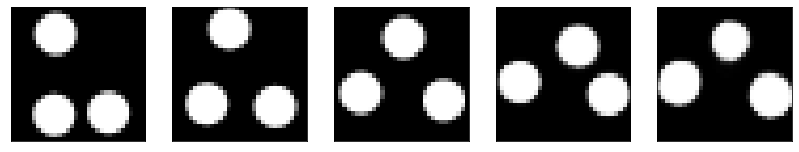

GD iterations:
i=0 | err=54.829956
i=1 | err=53.556541
i=2 | err=51.905010
i=3 | err=50.128887
i=4 | err=48.281067
i=5 | err=46.404839
i=6 | err=44.590481
i=7 | err=42.654808
i=8 | err=40.583168
i=9 | err=38.441467
i=10 | err=36.112850
i=11 | err=33.766251
i=12 | err=31.447500
i=13 | err=29.208332
i=14 | err=27.059494
i=15 | err=25.010197
i=16 | err=23.051132
i=17 | err=21.272448
i=18 | err=19.599512
i=19 | err=18.059767
i=20 | err=16.611710
i=21 | err=15.299746
i=22 | err=14.117870
i=23 | err=13.009162
i=24 | err=11.928337
i=25 | err=10.899767
i=26 | err=9.942207
i=27 | err=9.032177
i=28 | err=8.166241
i=29 | err=7.319569
Epoch=251 (77%) | out_positive=0.847914 | out_negative=0.131343 | mse=0.073639


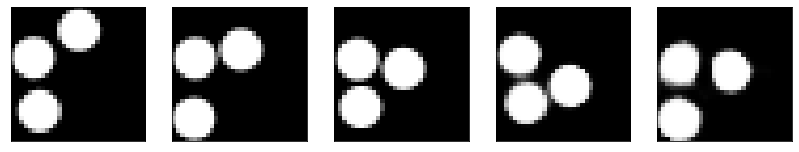

GD iterations:
i=0 | err=53.979362
i=1 | err=52.831299
i=2 | err=51.155846
i=3 | err=49.337620
i=4 | err=47.404335
i=5 | err=45.427162
i=6 | err=43.330967
i=7 | err=41.195984
i=8 | err=38.951881
i=9 | err=36.701363
i=10 | err=34.397453
i=11 | err=32.109673
i=12 | err=29.910725
i=13 | err=27.824116
i=14 | err=25.778084
i=15 | err=23.834549
i=16 | err=22.003265
i=17 | err=20.325296
i=18 | err=18.756847
i=19 | err=17.271538
i=20 | err=15.883232
i=21 | err=14.569855
i=22 | err=13.353336
i=23 | err=12.204943
i=24 | err=11.127220
i=25 | err=10.112108
i=26 | err=9.130536
i=27 | err=8.213454
i=28 | err=7.338270
i=29 | err=6.534912
Epoch=251 (79%) | out_positive=0.855284 | out_negative=0.139772 | mse=0.069642


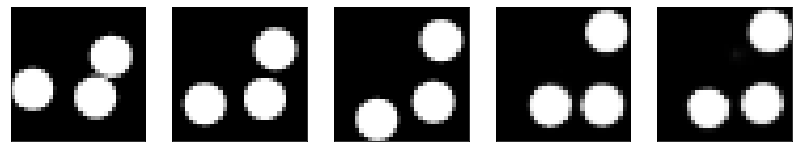

GD iterations:
i=0 | err=53.824711
i=1 | err=52.613319
i=2 | err=51.006145
i=3 | err=49.210484
i=4 | err=47.256123
i=5 | err=45.188362
i=6 | err=43.044865
i=7 | err=40.883308
i=8 | err=38.736298
i=9 | err=36.604080
i=10 | err=34.460869
i=11 | err=32.247429
i=12 | err=30.000420
i=13 | err=27.839077
i=14 | err=25.751032
i=15 | err=23.778461
i=16 | err=21.933971
i=17 | err=20.182436
i=18 | err=18.519144
i=19 | err=16.993143
i=20 | err=15.624229
i=21 | err=14.337275
i=22 | err=13.158541
i=23 | err=12.051015
i=24 | err=11.045698
i=25 | err=10.093899
i=26 | err=9.215910
i=27 | err=8.380793
i=28 | err=7.600743
i=29 | err=6.893119
Epoch=251 (81%) | out_positive=0.884585 | out_negative=0.112464 | mse=0.073585


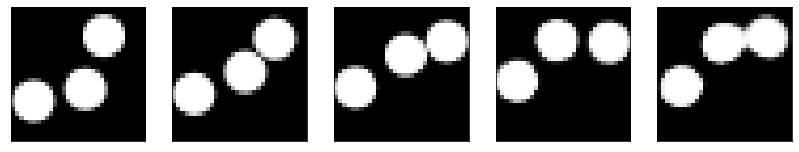

GD iterations:
i=0 | err=55.752090
i=1 | err=54.543800
i=2 | err=52.944809
i=3 | err=51.130035
i=4 | err=49.228355
i=5 | err=47.254143
i=6 | err=45.225891
i=7 | err=43.167023
i=8 | err=41.149956
i=9 | err=39.120720
i=10 | err=37.109402
i=11 | err=35.065956
i=12 | err=33.033485
i=13 | err=31.015074
i=14 | err=28.983704
i=15 | err=27.017231
i=16 | err=25.062681
i=17 | err=23.285679
i=18 | err=21.596916
i=19 | err=19.990623
i=20 | err=18.441595
i=21 | err=16.972927
i=22 | err=15.574862
i=23 | err=14.290390
i=24 | err=13.079187
i=25 | err=11.957938
i=26 | err=10.879040
i=27 | err=9.818283
i=28 | err=8.851507
i=29 | err=7.901401
Epoch=251 (83%) | out_positive=0.889483 | out_negative=0.095908 | mse=0.075641


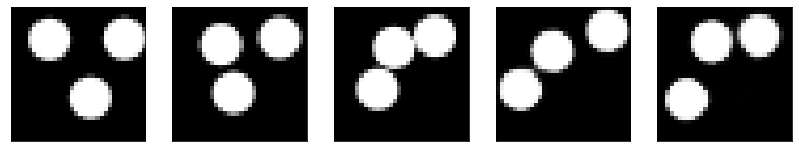

GD iterations:
i=0 | err=57.840443
i=1 | err=56.724415
i=2 | err=55.141571
i=3 | err=53.314308
i=4 | err=51.330090
i=5 | err=49.283897
i=6 | err=46.977333
i=7 | err=44.690681
i=8 | err=42.281631
i=9 | err=39.847656
i=10 | err=37.482925
i=11 | err=35.048252
i=12 | err=32.671585
i=13 | err=30.373096
i=14 | err=28.183983
i=15 | err=26.031944
i=16 | err=23.966225
i=17 | err=22.043718
i=18 | err=20.296513
i=19 | err=18.651455
i=20 | err=17.147053
i=21 | err=15.758083
i=22 | err=14.454880
i=23 | err=13.239424
i=24 | err=12.120789
i=25 | err=11.031061
i=26 | err=10.076794
i=27 | err=9.167670
i=28 | err=8.322981
i=29 | err=7.519637
Epoch=251 (84%) | out_positive=0.798590 | out_negative=0.105427 | mse=0.072382


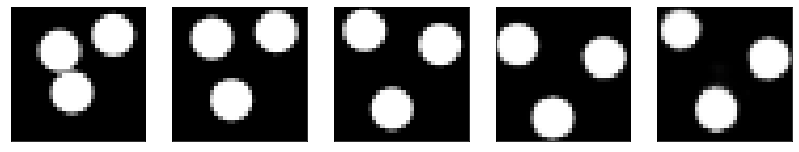

GD iterations:
i=0 | err=56.141830
i=1 | err=54.943691
i=2 | err=53.290382
i=3 | err=51.367966
i=4 | err=49.298378
i=5 | err=47.042412
i=6 | err=44.694595
i=7 | err=42.336250
i=8 | err=40.058731
i=9 | err=37.834694
i=10 | err=35.561592
i=11 | err=33.292103
i=12 | err=31.065132
i=13 | err=28.876781
i=14 | err=26.763378
i=15 | err=24.775913
i=16 | err=22.864172
i=17 | err=21.038506
i=18 | err=19.315708
i=19 | err=17.732218
i=20 | err=16.321005
i=21 | err=15.067286
i=22 | err=13.895147
i=23 | err=12.784679
i=24 | err=11.692868
i=25 | err=10.620376
i=26 | err=9.637933
i=27 | err=8.718911
i=28 | err=7.866783
i=29 | err=7.070504
Epoch=251 (86%) | out_positive=0.889687 | out_negative=0.109819 | mse=0.072578


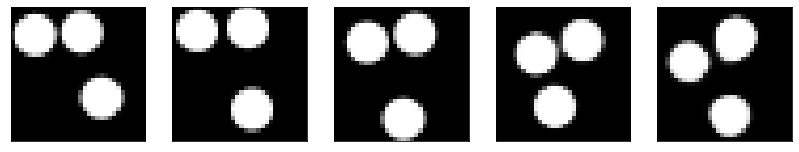

GD iterations:
i=0 | err=51.907143
i=1 | err=50.781162
i=2 | err=49.261662
i=3 | err=47.537361
i=4 | err=45.719109
i=5 | err=43.848354
i=6 | err=41.955124
i=7 | err=39.978645
i=8 | err=37.862823
i=9 | err=35.684067
i=10 | err=33.482208
i=11 | err=31.339905
i=12 | err=29.211647
i=13 | err=26.981741
i=14 | err=24.836571
i=15 | err=22.789757
i=16 | err=20.840956
i=17 | err=19.056091
i=18 | err=17.440907
i=19 | err=15.941285
i=20 | err=14.581823
i=21 | err=13.323424
i=22 | err=12.145758
i=23 | err=11.049523
i=24 | err=10.027460
i=25 | err=9.076487
i=26 | err=8.156772
i=27 | err=7.285804
i=28 | err=6.469618
i=29 | err=5.706913
Epoch=251 (88%) | out_positive=0.916573 | out_negative=0.141160 | mse=0.067581


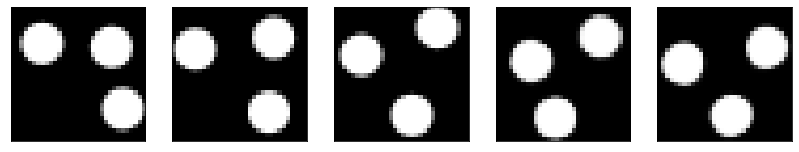

GD iterations:
i=0 | err=56.728939
i=1 | err=55.454800
i=2 | err=53.566002
i=3 | err=51.442230
i=4 | err=49.182220
i=5 | err=46.806335
i=6 | err=44.356323
i=7 | err=41.795208
i=8 | err=39.221195
i=9 | err=36.635162
i=10 | err=34.184158
i=11 | err=31.752472
i=12 | err=29.484707
i=13 | err=27.354031
i=14 | err=25.273216
i=15 | err=23.287476
i=16 | err=21.468496
i=17 | err=19.768738
i=18 | err=18.154470
i=19 | err=16.616163
i=20 | err=15.158133
i=21 | err=13.819159
i=22 | err=12.606075
i=23 | err=11.446202
i=24 | err=10.379820
i=25 | err=9.380198
i=26 | err=8.442343
i=27 | err=7.582366
i=28 | err=6.789113
i=29 | err=6.050420
Epoch=251 (90%) | out_positive=0.869832 | out_negative=0.151538 | mse=0.064234


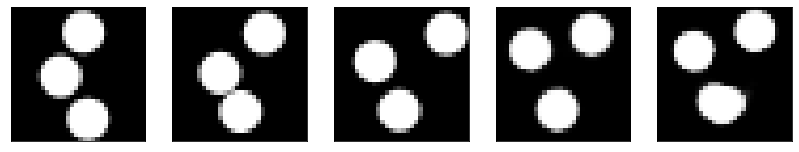

GD iterations:
i=0 | err=55.700882
i=1 | err=54.547115
i=2 | err=52.909695
i=3 | err=51.079727
i=4 | err=49.078999
i=5 | err=47.066029
i=6 | err=44.889626
i=7 | err=42.702759
i=8 | err=40.399628
i=9 | err=38.046089
i=10 | err=35.691528
i=11 | err=33.308922
i=12 | err=30.967369
i=13 | err=28.800747
i=14 | err=26.784290
i=15 | err=24.868761
i=16 | err=23.050131
i=17 | err=21.278511
i=18 | err=19.594385
i=19 | err=18.059652
i=20 | err=16.602425
i=21 | err=15.246478
i=22 | err=13.977137
i=23 | err=12.796132
i=24 | err=11.686670
i=25 | err=10.663981
i=26 | err=9.704984
i=27 | err=8.776535
i=28 | err=7.920389
i=29 | err=7.112645
Epoch=251 (91%) | out_positive=0.899322 | out_negative=0.079023 | mse=0.073612


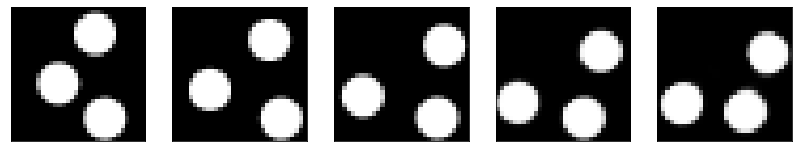

GD iterations:
i=0 | err=51.249477
i=1 | err=50.154999
i=2 | err=48.595646
i=3 | err=46.912857
i=4 | err=45.142845
i=5 | err=43.266975
i=6 | err=41.324760
i=7 | err=39.325542
i=8 | err=37.376377
i=9 | err=35.455727
i=10 | err=33.521992
i=11 | err=31.599487
i=12 | err=29.692822
i=13 | err=27.776815
i=14 | err=25.935268
i=15 | err=24.176249
i=16 | err=22.458790
i=17 | err=20.814632
i=18 | err=19.262341
i=19 | err=17.834768
i=20 | err=16.472563
i=21 | err=15.166989
i=22 | err=13.899601
i=23 | err=12.694451
i=24 | err=11.579554
i=25 | err=10.563938
i=26 | err=9.598098
i=27 | err=8.659562
i=28 | err=7.774473
i=29 | err=6.915576
Epoch=251 (93%) | out_positive=0.842058 | out_negative=0.139047 | mse=0.069304


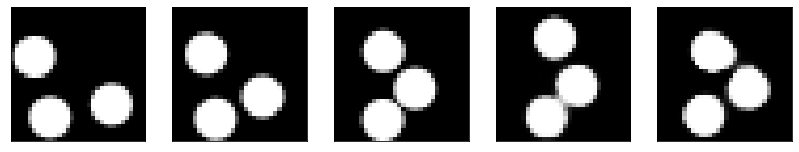

GD iterations:
i=0 | err=54.291084
i=1 | err=53.230179
i=2 | err=51.786018
i=3 | err=50.124210
i=4 | err=48.298409
i=5 | err=46.374786
i=6 | err=44.319969
i=7 | err=42.221146
i=8 | err=40.030037
i=9 | err=37.766731
i=10 | err=35.529503
i=11 | err=33.240570
i=12 | err=31.021952
i=13 | err=28.910465
i=14 | err=26.823132
i=15 | err=24.830582
i=16 | err=22.947578
i=17 | err=21.149055
i=18 | err=19.441032
i=19 | err=17.827930
i=20 | err=16.308743
i=21 | err=14.916491
i=22 | err=13.646830
i=23 | err=12.454529
i=24 | err=11.357748
i=25 | err=10.348402
i=26 | err=9.401751
i=27 | err=8.535970
i=28 | err=7.732481
i=29 | err=7.003655
Epoch=251 (95%) | out_positive=0.837052 | out_negative=0.147396 | mse=0.065619


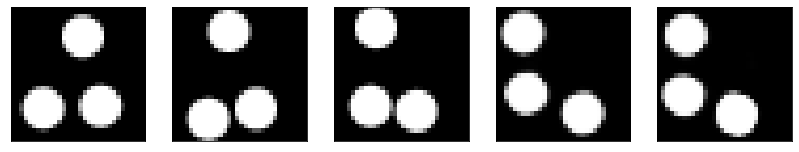

GD iterations:
i=0 | err=53.209312
i=1 | err=51.983643
i=2 | err=50.345940
i=3 | err=48.443230
i=4 | err=46.452835
i=5 | err=44.358528
i=6 | err=42.195786
i=7 | err=39.846882
i=8 | err=37.468040
i=9 | err=35.071762
i=10 | err=32.702965
i=11 | err=30.402077
i=12 | err=28.086876
i=13 | err=25.854349
i=14 | err=23.832523
i=15 | err=21.902065
i=16 | err=20.116322
i=17 | err=18.412359
i=18 | err=16.871252
i=19 | err=15.445593
i=20 | err=14.141424
i=21 | err=12.948972
i=22 | err=11.820066
i=23 | err=10.780560
i=24 | err=9.828088
i=25 | err=8.945400
i=26 | err=8.114804
i=27 | err=7.330026
i=28 | err=6.606512
i=29 | err=5.920857
Epoch=251 (97%) | out_positive=0.861645 | out_negative=0.141484 | mse=0.069560


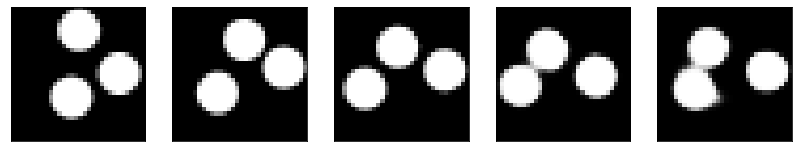

GD iterations:
i=0 | err=58.062309
i=1 | err=56.787136
i=2 | err=54.993408
i=3 | err=53.016769
i=4 | err=50.939644
i=5 | err=48.805458
i=6 | err=46.601913
i=7 | err=44.316856
i=8 | err=41.955341
i=9 | err=39.511089
i=10 | err=36.998962
i=11 | err=34.463745
i=12 | err=31.903351
i=13 | err=29.290653
i=14 | err=26.716211
i=15 | err=24.284174
i=16 | err=22.070799
i=17 | err=20.052177
i=18 | err=18.197475
i=19 | err=16.507408
i=20 | err=14.972772
i=21 | err=13.538927
i=22 | err=12.203654
i=23 | err=10.973213
i=24 | err=9.844272
i=25 | err=8.791300
i=26 | err=7.801781
i=27 | err=6.861657
i=28 | err=5.969218
i=29 | err=5.177194
Epoch=251 (99%) | out_positive=0.872754 | out_negative=0.173632 | mse=0.065930


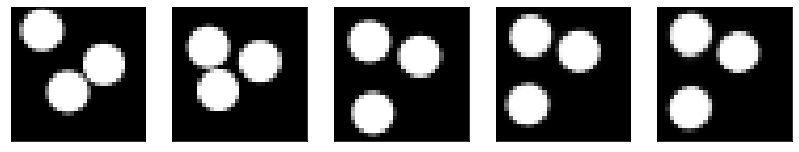

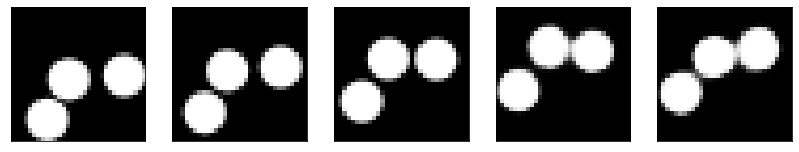

Test MSE 0.078231


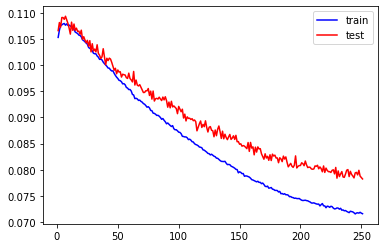

GD iterations:
i=0 | err=51.747738
i=1 | err=50.624458
i=2 | err=49.171207
i=3 | err=47.598209
i=4 | err=45.884426
i=5 | err=44.088909
i=6 | err=42.244102
i=7 | err=40.354874
i=8 | err=38.436127
i=9 | err=36.491051
i=10 | err=34.558960
i=11 | err=32.613701
i=12 | err=30.611647
i=13 | err=28.589024
i=14 | err=26.575090
i=15 | err=24.638508
i=16 | err=22.766617
i=17 | err=20.932590
i=18 | err=19.205246
i=19 | err=17.582567
i=20 | err=16.094349
i=21 | err=14.769180
i=22 | err=13.556249
i=23 | err=12.427688
i=24 | err=11.368328
i=25 | err=10.420685
i=26 | err=9.521261
i=27 | err=8.665113
i=28 | err=7.824175
i=29 | err=7.035205
Epoch=252 (0%) | out_positive=0.882781 | out_negative=0.110512 | mse=0.070835


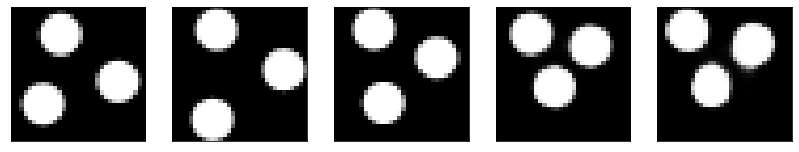

GD iterations:
i=0 | err=52.037819
i=1 | err=50.813141
i=2 | err=49.147888
i=3 | err=47.237453
i=4 | err=45.189842
i=5 | err=43.083546
i=6 | err=40.901188
i=7 | err=38.722733
i=8 | err=36.571533
i=9 | err=34.342720
i=10 | err=32.167046
i=11 | err=29.956106
i=12 | err=27.892479
i=13 | err=25.936892
i=14 | err=23.994904
i=15 | err=22.203022
i=16 | err=20.557096
i=17 | err=19.045792
i=18 | err=17.620148
i=19 | err=16.305088
i=20 | err=15.055418
i=21 | err=13.898420
i=22 | err=12.785879
i=23 | err=11.763879
i=24 | err=10.796314
i=25 | err=9.869030
i=26 | err=8.989977
i=27 | err=8.187639
i=28 | err=7.444911
i=29 | err=6.712582
Epoch=252 (2%) | out_positive=0.840246 | out_negative=0.140344 | mse=0.066677


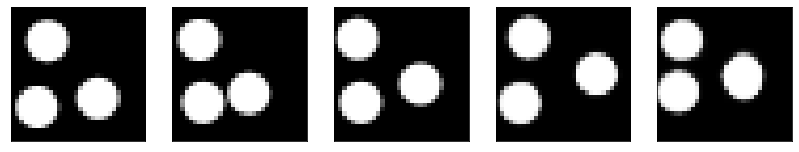

GD iterations:
i=0 | err=51.887676
i=1 | err=50.671726
i=2 | err=49.038536
i=3 | err=47.108612
i=4 | err=45.127235
i=5 | err=43.092625
i=6 | err=41.022369
i=7 | err=38.897141
i=8 | err=36.792336
i=9 | err=34.640045
i=10 | err=32.464447
i=11 | err=30.276037
i=12 | err=28.127911
i=13 | err=26.089239
i=14 | err=24.122185
i=15 | err=22.187904
i=16 | err=20.355091
i=17 | err=18.676945
i=18 | err=17.131329
i=19 | err=15.731106
i=20 | err=14.431324
i=21 | err=13.234226
i=22 | err=12.108599
i=23 | err=11.076278
i=24 | err=10.134581
i=25 | err=9.256901
i=26 | err=8.388912
i=27 | err=7.573693
i=28 | err=6.813149
i=29 | err=6.109262
Epoch=252 (4%) | out_positive=0.920431 | out_negative=0.141257 | mse=0.070564


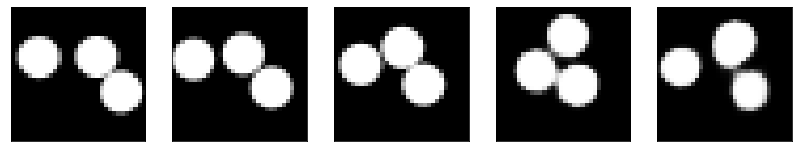

GD iterations:
i=0 | err=54.123955
i=1 | err=52.926933
i=2 | err=51.274067
i=3 | err=49.497467
i=4 | err=47.607040
i=5 | err=45.585526
i=6 | err=43.514603
i=7 | err=41.399208
i=8 | err=39.222000
i=9 | err=36.968971
i=10 | err=34.773579
i=11 | err=32.581848
i=12 | err=30.507221
i=13 | err=28.464252
i=14 | err=26.435690
i=15 | err=24.415054
i=16 | err=22.428514
i=17 | err=20.515202
i=18 | err=18.678566
i=19 | err=16.958582
i=20 | err=15.427142
i=21 | err=14.021778
i=22 | err=12.737383
i=23 | err=11.561501
i=24 | err=10.475296
i=25 | err=9.450937
i=26 | err=8.496559
i=27 | err=7.617323
i=28 | err=6.772460
i=29 | err=6.011492
Epoch=252 (6%) | out_positive=0.893143 | out_negative=0.147956 | mse=0.071984


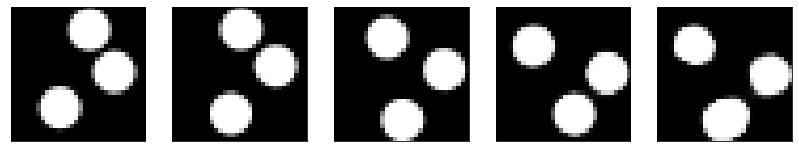

GD iterations:
i=0 | err=53.562988
i=1 | err=52.467545
i=2 | err=50.892639
i=3 | err=49.156315
i=4 | err=47.272873
i=5 | err=45.314854
i=6 | err=43.236576
i=7 | err=41.107697
i=8 | err=38.962177
i=9 | err=36.762657
i=10 | err=34.556305
i=11 | err=32.321190
i=12 | err=30.098980
i=13 | err=27.961714
i=14 | err=25.932686
i=15 | err=24.059189
i=16 | err=22.252432
i=17 | err=20.532005
i=18 | err=18.876411
i=19 | err=17.327129
i=20 | err=15.889196
i=21 | err=14.618787
i=22 | err=13.461058
i=23 | err=12.425451
i=24 | err=11.481464
i=25 | err=10.591033
i=26 | err=9.708705
i=27 | err=8.855688
i=28 | err=8.012804
i=29 | err=7.189747
Epoch=252 (8%) | out_positive=0.834915 | out_negative=0.103859 | mse=0.065233


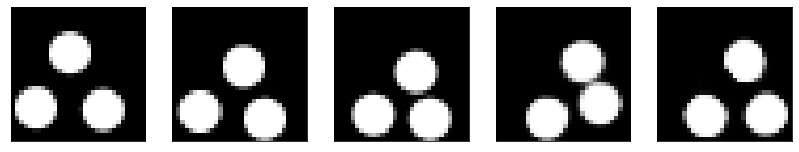

GD iterations:
i=0 | err=54.991608
i=1 | err=53.848259
i=2 | err=52.300362
i=3 | err=50.522636
i=4 | err=48.674206
i=5 | err=46.792511
i=6 | err=44.764114
i=7 | err=42.711601
i=8 | err=40.443493
i=9 | err=38.120979
i=10 | err=35.816277
i=11 | err=33.449173
i=12 | err=31.088697
i=13 | err=28.746889
i=14 | err=26.517801
i=15 | err=24.380278
i=16 | err=22.368973
i=17 | err=20.457466
i=18 | err=18.704578
i=19 | err=17.116076
i=20 | err=15.625534
i=21 | err=14.246867
i=22 | err=12.986011
i=23 | err=11.799320
i=24 | err=10.691716
i=25 | err=9.666979
i=26 | err=8.644979
i=27 | err=7.709901
i=28 | err=6.858241
i=29 | err=6.066483
Epoch=252 (9%) | out_positive=0.886331 | out_negative=0.092334 | mse=0.068321


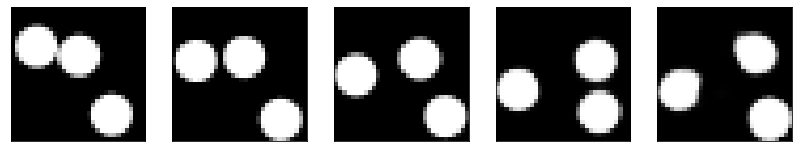

GD iterations:
i=0 | err=53.140282
i=1 | err=51.914101
i=2 | err=50.276299
i=3 | err=48.464951
i=4 | err=46.548271
i=5 | err=44.609085
i=6 | err=42.563560
i=7 | err=40.518410
i=8 | err=38.413235
i=9 | err=36.301723
i=10 | err=34.297424
i=11 | err=32.372971
i=12 | err=30.408998
i=13 | err=28.489010
i=14 | err=26.610195
i=15 | err=24.724319
i=16 | err=22.873121
i=17 | err=21.107002
i=18 | err=19.391438
i=19 | err=17.792999
i=20 | err=16.345051
i=21 | err=15.076225
i=22 | err=13.949681
i=23 | err=12.925720
i=24 | err=11.983404
i=25 | err=11.076086
i=26 | err=10.195515
i=27 | err=9.378824
i=28 | err=8.574343
i=29 | err=7.803789
Epoch=252 (11%) | out_positive=0.921510 | out_negative=0.145359 | mse=0.071870


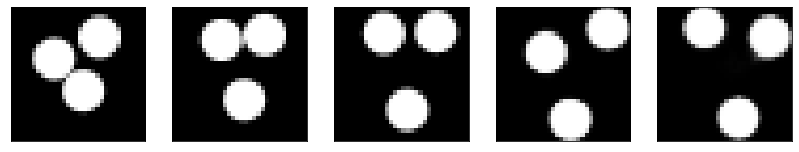

GD iterations:
i=0 | err=53.769699
i=1 | err=52.755966
i=2 | err=51.322651
i=3 | err=49.675728
i=4 | err=47.828423
i=5 | err=45.871742
i=6 | err=43.851326
i=7 | err=41.671982
i=8 | err=39.457211
i=9 | err=37.235409
i=10 | err=34.925873
i=11 | err=32.633476
i=12 | err=30.384228
i=13 | err=28.168013
i=14 | err=26.080502
i=15 | err=24.058723
i=16 | err=22.126970
i=17 | err=20.289143
i=18 | err=18.540913
i=19 | err=16.959492
i=20 | err=15.445390
i=21 | err=14.078880
i=22 | err=12.814309
i=23 | err=11.661940
i=24 | err=10.595915
i=25 | err=9.620920
i=26 | err=8.702360
i=27 | err=7.830570
i=28 | err=6.991479
i=29 | err=6.173586
Epoch=252 (13%) | out_positive=0.915462 | out_negative=0.152784 | mse=0.071454


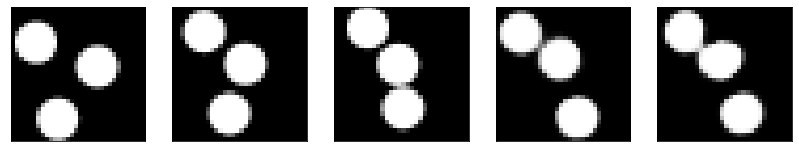

GD iterations:
i=0 | err=56.439728
i=1 | err=55.285660
i=2 | err=53.626587
i=3 | err=51.766613
i=4 | err=49.701172
i=5 | err=47.536469
i=6 | err=45.262264
i=7 | err=42.908634
i=8 | err=40.524830
i=9 | err=38.187614
i=10 | err=35.826729
i=11 | err=33.491859
i=12 | err=31.160748
i=13 | err=28.941814
i=14 | err=26.759188
i=15 | err=24.603430
i=16 | err=22.563526
i=17 | err=20.629776
i=18 | err=18.824438
i=19 | err=17.190453
i=20 | err=15.678244
i=21 | err=14.297844
i=22 | err=12.987121
i=23 | err=11.768726
i=24 | err=10.655436
i=25 | err=9.619350
i=26 | err=8.659665
i=27 | err=7.740145
i=28 | err=6.869426
i=29 | err=6.052862
Epoch=252 (15%) | out_positive=0.863870 | out_negative=0.127034 | mse=0.064611


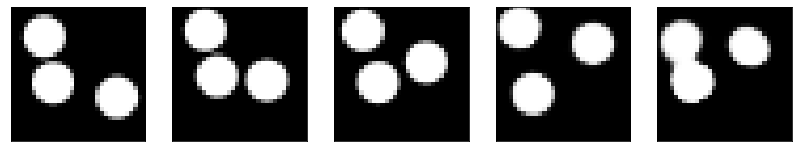

GD iterations:
i=0 | err=56.357735
i=1 | err=55.014053
i=2 | err=53.199383
i=3 | err=51.166763
i=4 | err=48.964504
i=5 | err=46.784786
i=6 | err=44.522758
i=7 | err=42.223549
i=8 | err=39.891724
i=9 | err=37.514370
i=10 | err=35.014618
i=11 | err=32.573204
i=12 | err=30.219444
i=13 | err=27.855190
i=14 | err=25.650425
i=15 | err=23.666603
i=16 | err=21.817371
i=17 | err=20.099010
i=18 | err=18.450359
i=19 | err=16.932495
i=20 | err=15.533533
i=21 | err=14.238967
i=22 | err=13.015294
i=23 | err=11.790071
i=24 | err=10.658917
i=25 | err=9.605260
i=26 | err=8.654814
i=27 | err=7.752128
i=28 | err=6.918111
i=29 | err=6.144328
Epoch=252 (17%) | out_positive=0.858333 | out_negative=0.117585 | mse=0.068846


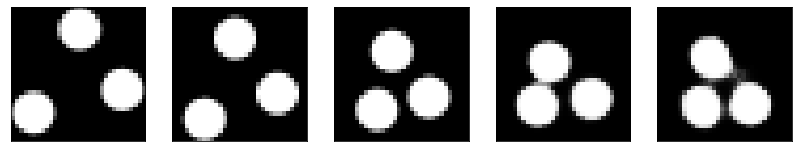

GD iterations:
i=0 | err=53.946953
i=1 | err=52.697906
i=2 | err=51.069092
i=3 | err=49.338188
i=4 | err=47.455437
i=5 | err=45.475044
i=6 | err=43.505386
i=7 | err=41.574829
i=8 | err=39.515137
i=9 | err=37.354561
i=10 | err=35.129265
i=11 | err=32.934509
i=12 | err=30.784056
i=13 | err=28.742096
i=14 | err=26.728298
i=15 | err=24.781332
i=16 | err=22.983215
i=17 | err=21.229153
i=18 | err=19.562063
i=19 | err=17.952999
i=20 | err=16.435913
i=21 | err=15.019871
i=22 | err=13.699027
i=23 | err=12.428565
i=24 | err=11.230603
i=25 | err=10.120635
i=26 | err=9.111946
i=27 | err=8.198387
i=28 | err=7.302786
i=29 | err=6.444863
Epoch=252 (19%) | out_positive=0.863780 | out_negative=0.138535 | mse=0.071618


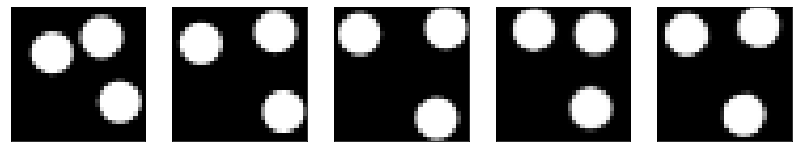

GD iterations:
i=0 | err=52.897285
i=1 | err=51.749657
i=2 | err=50.218590
i=3 | err=48.479408
i=4 | err=46.709221
i=5 | err=44.930637
i=6 | err=43.053249
i=7 | err=41.058609
i=8 | err=38.965073
i=9 | err=36.807648
i=10 | err=34.637058
i=11 | err=32.472908
i=12 | err=30.321167
i=13 | err=28.233620
i=14 | err=26.213480
i=15 | err=24.272383
i=16 | err=22.442287
i=17 | err=20.621576
i=18 | err=18.949600
i=19 | err=17.372852
i=20 | err=15.936402
i=21 | err=14.610582
i=22 | err=13.397537
i=23 | err=12.309134
i=24 | err=11.298375
i=25 | err=10.324234
i=26 | err=9.387306
i=27 | err=8.525213
i=28 | err=7.702313
i=29 | err=6.900734
Epoch=252 (20%) | out_positive=0.865405 | out_negative=0.123828 | mse=0.070847


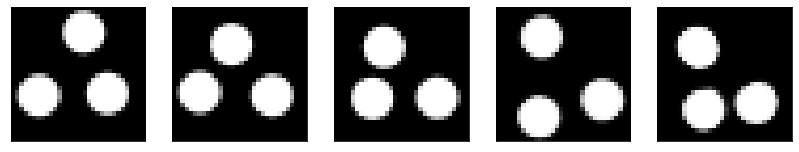

GD iterations:
i=0 | err=49.110195
i=1 | err=47.994221
i=2 | err=46.407257
i=3 | err=44.645798
i=4 | err=42.723656
i=5 | err=40.816368
i=6 | err=38.848763
i=7 | err=36.841179
i=8 | err=34.752644
i=9 | err=32.603195
i=10 | err=30.400341
i=11 | err=28.231968
i=12 | err=26.159302
i=13 | err=24.259830
i=14 | err=22.531498
i=15 | err=20.847115
i=16 | err=19.253502
i=17 | err=17.756748
i=18 | err=16.464859
i=19 | err=15.309681
i=20 | err=14.236550
i=21 | err=13.242861
i=22 | err=12.295491
i=23 | err=11.412283
i=24 | err=10.562550
i=25 | err=9.740885
i=26 | err=8.907007
i=27 | err=8.129160
i=28 | err=7.415566
i=29 | err=6.740220
Epoch=252 (22%) | out_positive=0.901277 | out_negative=0.137416 | mse=0.068748


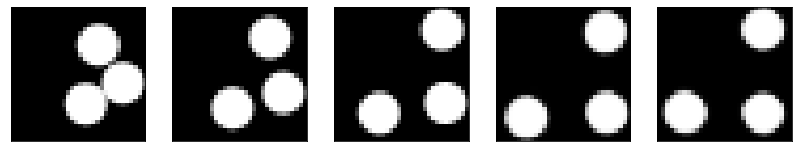

GD iterations:
i=0 | err=52.736004
i=1 | err=51.646774
i=2 | err=50.134033
i=3 | err=48.415466
i=4 | err=46.603958
i=5 | err=44.677944
i=6 | err=42.645504
i=7 | err=40.529922
i=8 | err=38.477547
i=9 | err=36.521179
i=10 | err=34.622490
i=11 | err=32.742958
i=12 | err=30.795963
i=13 | err=28.793123
i=14 | err=26.814058
i=15 | err=24.829212
i=16 | err=22.935871
i=17 | err=21.019762
i=18 | err=19.205231
i=19 | err=17.582273
i=20 | err=16.070538
i=21 | err=14.658737
i=22 | err=13.337393
i=23 | err=12.109816
i=24 | err=11.008856
i=25 | err=9.983337
i=26 | err=9.043648
i=27 | err=8.199477
i=28 | err=7.367211
i=29 | err=6.581856
Epoch=252 (24%) | out_positive=0.892300 | out_negative=0.185046 | mse=0.073310


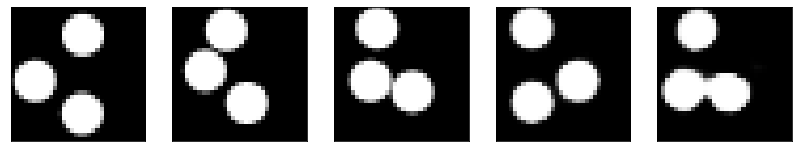

GD iterations:
i=0 | err=59.198753
i=1 | err=57.832626
i=2 | err=55.964157
i=3 | err=53.773262
i=4 | err=51.434746
i=5 | err=49.019974
i=6 | err=46.590885
i=7 | err=44.077404
i=8 | err=41.547577
i=9 | err=38.982628
i=10 | err=36.462959
i=11 | err=33.965698
i=12 | err=31.560059
i=13 | err=29.330917
i=14 | err=27.253506
i=15 | err=25.314861
i=16 | err=23.423553
i=17 | err=21.622814
i=18 | err=19.934044
i=19 | err=18.369286
i=20 | err=16.886627
i=21 | err=15.520306
i=22 | err=14.229937
i=23 | err=13.028586
i=24 | err=11.903767
i=25 | err=10.809845
i=26 | err=9.754130
i=27 | err=8.759424
i=28 | err=7.837087
i=29 | err=6.946132
Epoch=252 (26%) | out_positive=0.859530 | out_negative=0.102141 | mse=0.071873


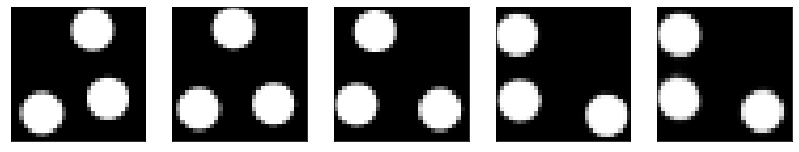

GD iterations:
i=0 | err=50.303028
i=1 | err=49.155739
i=2 | err=47.560562
i=3 | err=45.874447
i=4 | err=44.138515
i=5 | err=42.303970
i=6 | err=40.416908
i=7 | err=38.494434
i=8 | err=36.546177
i=9 | err=34.557045
i=10 | err=32.547909
i=11 | err=30.589569
i=12 | err=28.587627
i=13 | err=26.618702
i=14 | err=24.758770
i=15 | err=22.936405
i=16 | err=21.232264
i=17 | err=19.626034
i=18 | err=18.167786
i=19 | err=16.812441
i=20 | err=15.555939
i=21 | err=14.376095
i=22 | err=13.268133
i=23 | err=12.202262
i=24 | err=11.167685
i=25 | err=10.166097
i=26 | err=9.235523
i=27 | err=8.342476
i=28 | err=7.497662
i=29 | err=6.713749
Epoch=252 (28%) | out_positive=0.929703 | out_negative=0.116048 | mse=0.070464


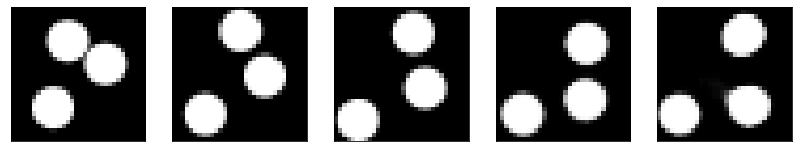

GD iterations:
i=0 | err=55.108223
i=1 | err=53.916054
i=2 | err=52.270271
i=3 | err=50.391598
i=4 | err=48.356049
i=5 | err=46.276077
i=6 | err=44.198837
i=7 | err=41.982513
i=8 | err=39.692924
i=9 | err=37.406265
i=10 | err=35.188713
i=11 | err=33.016819
i=12 | err=30.970612
i=13 | err=29.002926
i=14 | err=27.091970
i=15 | err=25.282190
i=16 | err=23.503510
i=17 | err=21.821629
i=18 | err=20.179462
i=19 | err=18.548729
i=20 | err=17.043850
i=21 | err=15.665289
i=22 | err=14.382596
i=23 | err=13.139569
i=24 | err=11.997805
i=25 | err=10.901564
i=26 | err=9.864504
i=27 | err=8.907602
i=28 | err=8.025795
i=29 | err=7.231107
Epoch=252 (29%) | out_positive=0.873853 | out_negative=0.103817 | mse=0.069322


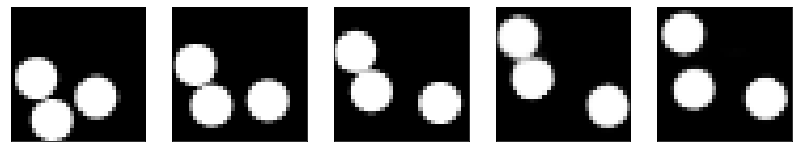

GD iterations:
i=0 | err=54.604195
i=1 | err=53.437630
i=2 | err=51.823036
i=3 | err=50.079445
i=4 | err=48.236931
i=5 | err=46.333267
i=6 | err=44.326397
i=7 | err=42.261871
i=8 | err=40.225639
i=9 | err=38.163727
i=10 | err=36.074814
i=11 | err=33.968994
i=12 | err=31.813366
i=13 | err=29.726463
i=14 | err=27.700699
i=15 | err=25.821453
i=16 | err=24.007780
i=17 | err=22.324089
i=18 | err=20.681744
i=19 | err=19.116673
i=20 | err=17.641928
i=21 | err=16.259617
i=22 | err=14.997359
i=23 | err=13.833700
i=24 | err=12.738857
i=25 | err=11.684283
i=26 | err=10.681331
i=27 | err=9.730843
i=28 | err=8.853971
i=29 | err=8.003538
Epoch=252 (31%) | out_positive=0.860074 | out_negative=0.110530 | mse=0.073822


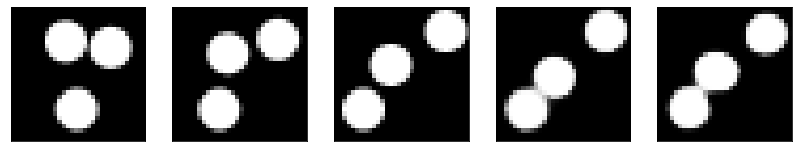

GD iterations:
i=0 | err=53.966278
i=1 | err=52.863743
i=2 | err=51.240181
i=3 | err=49.427628
i=4 | err=47.354042
i=5 | err=45.176392
i=6 | err=42.859856
i=7 | err=40.485588
i=8 | err=38.139664
i=9 | err=35.778114
i=10 | err=33.493126
i=11 | err=31.204643
i=12 | err=28.916697
i=13 | err=26.679243
i=14 | err=24.567764
i=15 | err=22.514732
i=16 | err=20.561634
i=17 | err=18.759741
i=18 | err=17.047466
i=19 | err=15.441278
i=20 | err=13.977701
i=21 | err=12.711254
i=22 | err=11.567955
i=23 | err=10.487993
i=24 | err=9.486294
i=25 | err=8.543673
i=26 | err=7.640151
i=27 | err=6.810932
i=28 | err=6.056078
i=29 | err=5.362396
Epoch=252 (33%) | out_positive=0.862471 | out_negative=0.145638 | mse=0.064554


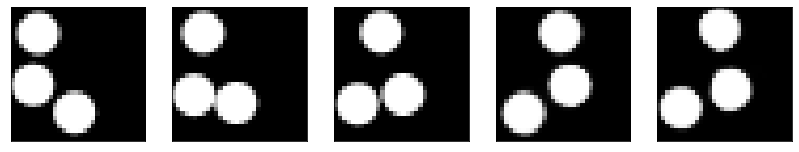

GD iterations:
i=0 | err=52.953175
i=1 | err=51.807446
i=2 | err=50.275551
i=3 | err=48.561718
i=4 | err=46.738308
i=5 | err=44.840137
i=6 | err=42.925232
i=7 | err=40.992237
i=8 | err=39.020607
i=9 | err=37.032379
i=10 | err=35.031067
i=11 | err=33.019306
i=12 | err=30.921921
i=13 | err=28.841221
i=14 | err=26.787649
i=15 | err=24.827240
i=16 | err=22.943420
i=17 | err=21.189278
i=18 | err=19.529442
i=19 | err=17.961498
i=20 | err=16.472296
i=21 | err=15.074692
i=22 | err=13.754107
i=23 | err=12.539728
i=24 | err=11.451509
i=25 | err=10.441240
i=26 | err=9.509029
i=27 | err=8.658441
i=28 | err=7.819630
i=29 | err=7.048321
Epoch=252 (35%) | out_positive=0.863229 | out_negative=0.137514 | mse=0.070269


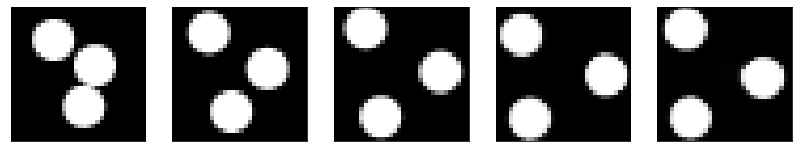

GD iterations:
i=0 | err=52.932446
i=1 | err=51.818108
i=2 | err=50.317505
i=3 | err=48.569954
i=4 | err=46.714237
i=5 | err=44.857689
i=6 | err=42.818604
i=7 | err=40.684517
i=8 | err=38.477543
i=9 | err=36.327446
i=10 | err=34.088173
i=11 | err=31.763138
i=12 | err=29.454735
i=13 | err=27.204811
i=14 | err=25.051891
i=15 | err=23.043854
i=16 | err=21.090893
i=17 | err=19.297974
i=18 | err=17.653114
i=19 | err=16.189907
i=20 | err=14.870035
i=21 | err=13.645727
i=22 | err=12.421432
i=23 | err=11.290257
i=24 | err=10.259941
i=25 | err=9.290517
i=26 | err=8.400328
i=27 | err=7.528345
i=28 | err=6.728802
i=29 | err=5.942511
Epoch=252 (37%) | out_positive=0.929831 | out_negative=0.186410 | mse=0.069335


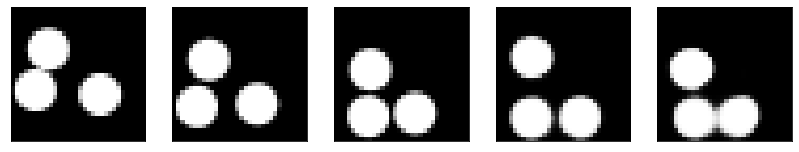

GD iterations:
i=0 | err=51.514484
i=1 | err=50.287003
i=2 | err=48.686897
i=3 | err=46.876041
i=4 | err=44.868725
i=5 | err=42.859535
i=6 | err=40.761810
i=7 | err=38.671127
i=8 | err=36.580173
i=9 | err=34.468758
i=10 | err=32.318810
i=11 | err=30.149841
i=12 | err=27.967772
i=13 | err=25.861141
i=14 | err=23.873449
i=15 | err=22.023834
i=16 | err=20.280674
i=17 | err=18.663343
i=18 | err=17.138702
i=19 | err=15.726641
i=20 | err=14.412268
i=21 | err=13.224843
i=22 | err=12.140184
i=23 | err=11.149860
i=24 | err=10.192415
i=25 | err=9.291929
i=26 | err=8.421375
i=27 | err=7.590105
i=28 | err=6.784481
i=29 | err=6.068169
Epoch=252 (38%) | out_positive=0.891429 | out_negative=0.131673 | mse=0.068265


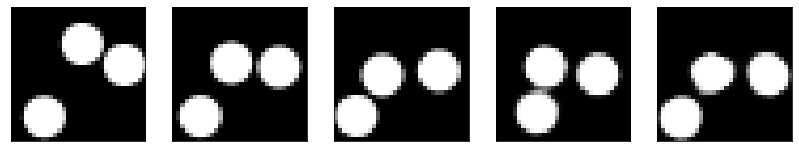

GD iterations:
i=0 | err=52.814453
i=1 | err=51.623718
i=2 | err=49.957386
i=3 | err=48.178337
i=4 | err=46.266392
i=5 | err=44.330894
i=6 | err=42.339844
i=7 | err=40.140709
i=8 | err=37.897640
i=9 | err=35.598587
i=10 | err=33.326244
i=11 | err=31.149969
i=12 | err=29.016554
i=13 | err=26.906178
i=14 | err=24.880356
i=15 | err=22.925365
i=16 | err=21.095261
i=17 | err=19.413820
i=18 | err=17.833363
i=19 | err=16.382671
i=20 | err=15.043886
i=21 | err=13.776165
i=22 | err=12.572021
i=23 | err=11.466682
i=24 | err=10.488152
i=25 | err=9.600242
i=26 | err=8.770733
i=27 | err=7.990057
i=28 | err=7.238048
i=29 | err=6.512931
Epoch=252 (40%) | out_positive=0.880675 | out_negative=0.152881 | mse=0.065868


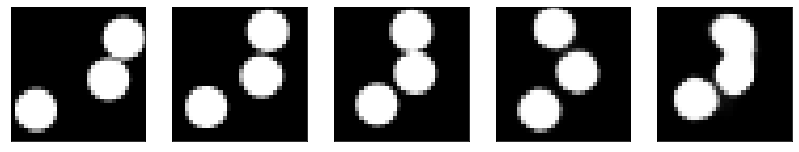

GD iterations:
i=0 | err=53.185318
i=1 | err=51.970211
i=2 | err=50.346752
i=3 | err=48.573074
i=4 | err=46.765091
i=5 | err=44.948120
i=6 | err=43.075157
i=7 | err=41.114784
i=8 | err=39.141781
i=9 | err=37.151760
i=10 | err=35.194786
i=11 | err=33.239159
i=12 | err=31.271688
i=13 | err=29.314690
i=14 | err=27.303556
i=15 | err=25.196114
i=16 | err=23.178669
i=17 | err=21.256952
i=18 | err=19.478733
i=19 | err=17.848173
i=20 | err=16.349171
i=21 | err=14.914886
i=22 | err=13.573345
i=23 | err=12.298903
i=24 | err=11.114376
i=25 | err=9.984877
i=26 | err=8.904889
i=27 | err=7.909957
i=28 | err=6.981110
i=29 | err=6.119122
Epoch=252 (42%) | out_positive=0.876994 | out_negative=0.160365 | mse=0.069298


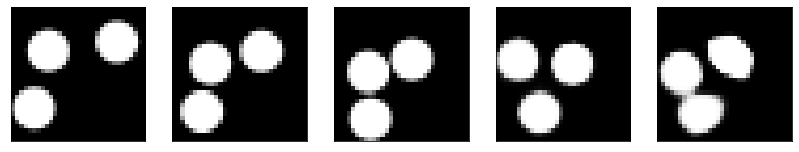

GD iterations:
i=0 | err=53.816643
i=1 | err=52.673943
i=2 | err=51.083412
i=3 | err=49.226685
i=4 | err=47.233253
i=5 | err=45.220665
i=6 | err=43.197308
i=7 | err=41.106743
i=8 | err=38.981613
i=9 | err=36.843456
i=10 | err=34.706554
i=11 | err=32.610779
i=12 | err=30.565279
i=13 | err=28.547195
i=14 | err=26.558323
i=15 | err=24.688553
i=16 | err=22.868263
i=17 | err=21.159470
i=18 | err=19.579166
i=19 | err=18.088490
i=20 | err=16.680059
i=21 | err=15.340395
i=22 | err=14.090240
i=23 | err=12.856936
i=24 | err=11.705156
i=25 | err=10.630733
i=26 | err=9.646639
i=27 | err=8.756257
i=28 | err=7.917586
i=29 | err=7.161612
Epoch=252 (44%) | out_positive=0.803044 | out_negative=0.128514 | mse=0.072217


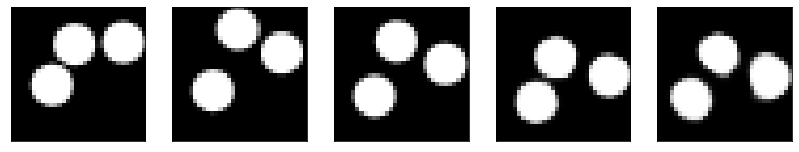

GD iterations:
i=0 | err=54.853752
i=1 | err=53.676628
i=2 | err=52.147369
i=3 | err=50.314041
i=4 | err=48.328682
i=5 | err=46.200516
i=6 | err=44.056007
i=7 | err=41.826283
i=8 | err=39.523678
i=9 | err=37.202652
i=10 | err=34.863266
i=11 | err=32.622208
i=12 | err=30.535543
i=13 | err=28.557838
i=14 | err=26.642651
i=15 | err=24.822697
i=16 | err=23.089949
i=17 | err=21.408186
i=18 | err=19.743433
i=19 | err=18.101559
i=20 | err=16.579975
i=21 | err=15.187609
i=22 | err=13.925804
i=23 | err=12.752892
i=24 | err=11.686707
i=25 | err=10.648516
i=26 | err=9.686785
i=27 | err=8.808310
i=28 | err=7.983741
i=29 | err=7.195788
Epoch=252 (46%) | out_positive=0.873746 | out_negative=0.112726 | mse=0.074276


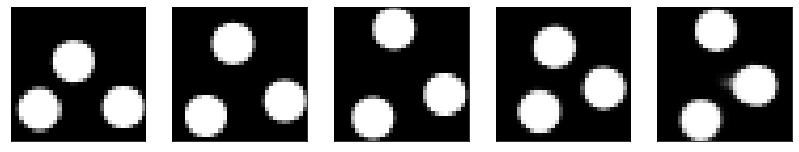

GD iterations:
i=0 | err=52.144169
i=1 | err=50.991566
i=2 | err=49.447269
i=3 | err=47.760582
i=4 | err=45.866753
i=5 | err=43.849926
i=6 | err=41.822296
i=7 | err=39.619301
i=8 | err=37.461426
i=9 | err=35.259541
i=10 | err=32.985733
i=11 | err=30.816462
i=12 | err=28.678988
i=13 | err=26.541431
i=14 | err=24.490128
i=15 | err=22.552631
i=16 | err=20.730305
i=17 | err=18.997938
i=18 | err=17.417034
i=19 | err=15.946260
i=20 | err=14.539879
i=21 | err=13.243332
i=22 | err=12.053513
i=23 | err=10.964820
i=24 | err=9.940145
i=25 | err=8.990023
i=26 | err=8.089592
i=27 | err=7.241765
i=28 | err=6.446339
i=29 | err=5.697811
Epoch=252 (48%) | out_positive=0.914591 | out_negative=0.156282 | mse=0.072574


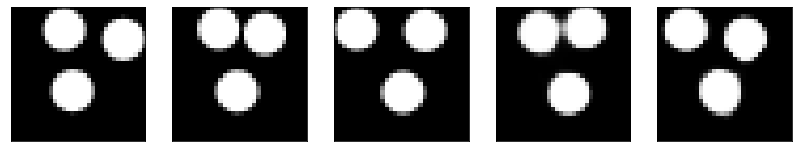

GD iterations:
i=0 | err=53.539101
i=1 | err=52.279335
i=2 | err=50.646347
i=3 | err=48.871792
i=4 | err=46.996857
i=5 | err=45.036514
i=6 | err=42.907078
i=7 | err=40.664486
i=8 | err=38.314438
i=9 | err=35.954269
i=10 | err=33.658310
i=11 | err=31.469692
i=12 | err=29.399446
i=13 | err=27.392586
i=14 | err=25.400808
i=15 | err=23.492714
i=16 | err=21.674309
i=17 | err=19.979849
i=18 | err=18.484070
i=19 | err=17.134724
i=20 | err=15.928227
i=21 | err=14.753271
i=22 | err=13.647840
i=23 | err=12.609104
i=24 | err=11.612836
i=25 | err=10.647898
i=26 | err=9.715014
i=27 | err=8.840747
i=28 | err=8.004648
i=29 | err=7.211031
Epoch=252 (49%) | out_positive=0.865369 | out_negative=0.105912 | mse=0.071663


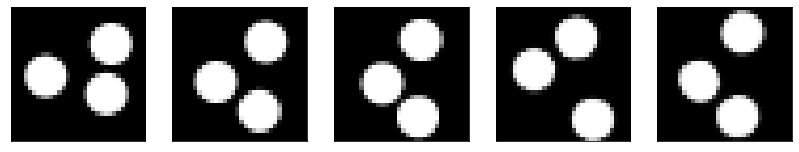

GD iterations:
i=0 | err=54.620537
i=1 | err=53.407646
i=2 | err=51.692451
i=3 | err=49.733475
i=4 | err=47.636665
i=5 | err=45.550152
i=6 | err=43.353790
i=7 | err=41.095539
i=8 | err=38.897636
i=9 | err=36.729385
i=10 | err=34.524418
i=11 | err=32.334549
i=12 | err=30.211899
i=13 | err=28.083511
i=14 | err=26.039433
i=15 | err=24.127213
i=16 | err=22.344318
i=17 | err=20.694929
i=18 | err=19.156353
i=19 | err=17.767563
i=20 | err=16.428501
i=21 | err=15.176473
i=22 | err=14.029959
i=23 | err=12.978617
i=24 | err=11.979706
i=25 | err=11.045103
i=26 | err=10.168538
i=27 | err=9.315625
i=28 | err=8.487618
i=29 | err=7.691756
Epoch=252 (51%) | out_positive=0.817642 | out_negative=0.069225 | mse=0.068614


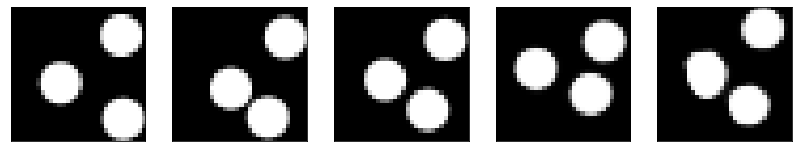

GD iterations:
i=0 | err=53.107979
i=1 | err=51.923004
i=2 | err=50.275345
i=3 | err=48.451836
i=4 | err=46.439247
i=5 | err=44.318775
i=6 | err=42.106140
i=7 | err=39.901184
i=8 | err=37.671635
i=9 | err=35.456909
i=10 | err=33.219612
i=11 | err=30.966888
i=12 | err=28.825380
i=13 | err=26.898697
i=14 | err=25.035965
i=15 | err=23.208868
i=16 | err=21.513588
i=17 | err=19.971779
i=18 | err=18.594719
i=19 | err=17.282322
i=20 | err=16.048079
i=21 | err=14.849840
i=22 | err=13.727638
i=23 | err=12.641051
i=24 | err=11.643726
i=25 | err=10.707039
i=26 | err=9.841651
i=27 | err=9.025599
i=28 | err=8.219574
i=29 | err=7.438566
Epoch=252 (53%) | out_positive=0.836036 | out_negative=0.117709 | mse=0.072889


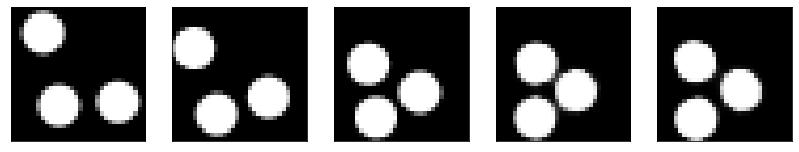

GD iterations:
i=0 | err=52.930908
i=1 | err=51.824051
i=2 | err=50.361336
i=3 | err=48.679512
i=4 | err=46.815331
i=5 | err=44.848282
i=6 | err=42.840866
i=7 | err=40.743248
i=8 | err=38.565178
i=9 | err=36.346519
i=10 | err=34.145065
i=11 | err=31.842241
i=12 | err=29.596733
i=13 | err=27.447826
i=14 | err=25.348862
i=15 | err=23.306427
i=16 | err=21.358475
i=17 | err=19.450806
i=18 | err=17.737865
i=19 | err=16.167528
i=20 | err=14.753695
i=21 | err=13.454082
i=22 | err=12.301580
i=23 | err=11.220646
i=24 | err=10.233311
i=25 | err=9.293892
i=26 | err=8.414289
i=27 | err=7.605771
i=28 | err=6.846340
i=29 | err=6.122988
Epoch=252 (55%) | out_positive=0.875330 | out_negative=0.150120 | mse=0.066529


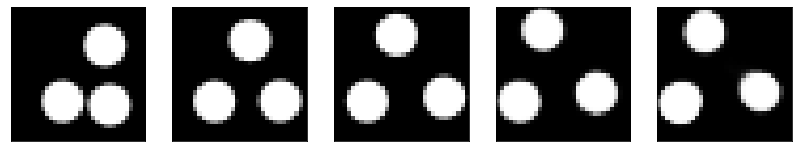

GD iterations:
i=0 | err=53.078819
i=1 | err=51.800289
i=2 | err=50.029385
i=3 | err=48.016998
i=4 | err=45.891289
i=5 | err=43.717522
i=6 | err=41.570831
i=7 | err=39.402748
i=8 | err=37.249390
i=9 | err=35.106167
i=10 | err=32.964066
i=11 | err=30.787697
i=12 | err=28.751425
i=13 | err=26.794231
i=14 | err=24.924217
i=15 | err=23.176247
i=16 | err=21.524206
i=17 | err=19.942856
i=18 | err=18.413752
i=19 | err=16.905937
i=20 | err=15.479071
i=21 | err=14.141456
i=22 | err=12.841297
i=23 | err=11.621553
i=24 | err=10.463322
i=25 | err=9.409918
i=26 | err=8.418711
i=27 | err=7.479828
i=28 | err=6.623174
i=29 | err=5.813698
Epoch=252 (57%) | out_positive=0.877357 | out_negative=0.173494 | mse=0.068275


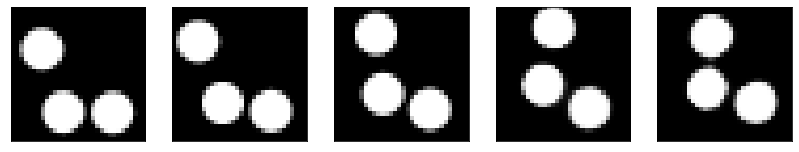

GD iterations:
i=0 | err=55.387466
i=1 | err=54.193855
i=2 | err=52.600960
i=3 | err=50.771511
i=4 | err=48.877655
i=5 | err=46.859360
i=6 | err=44.757530
i=7 | err=42.545273
i=8 | err=40.332905
i=9 | err=38.096222
i=10 | err=35.893341
i=11 | err=33.660606
i=12 | err=31.453861
i=13 | err=29.282795
i=14 | err=27.247417
i=15 | err=25.285622
i=16 | err=23.442516
i=17 | err=21.675903
i=18 | err=20.015202
i=19 | err=18.430555
i=20 | err=16.906094
i=21 | err=15.489090
i=22 | err=14.181561
i=23 | err=12.955058
i=24 | err=11.850657
i=25 | err=10.783535
i=26 | err=9.742643
i=27 | err=8.728679
i=28 | err=7.770072
i=29 | err=6.902165
Epoch=252 (59%) | out_positive=0.844727 | out_negative=0.158613 | mse=0.070992


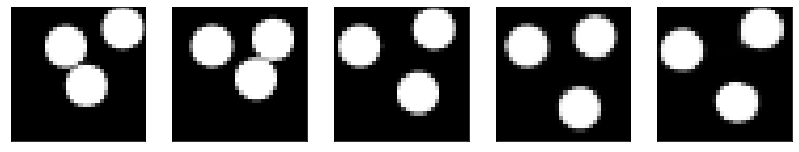

GD iterations:
i=0 | err=58.044777
i=1 | err=56.800987
i=2 | err=55.136757
i=3 | err=53.264523
i=4 | err=51.204353
i=5 | err=49.071022
i=6 | err=46.948509
i=7 | err=44.666550
i=8 | err=42.437134
i=9 | err=40.148163
i=10 | err=37.904160
i=11 | err=35.690430
i=12 | err=33.510921
i=13 | err=31.328217
i=14 | err=29.249195
i=15 | err=27.290508
i=16 | err=25.437601
i=17 | err=23.663370
i=18 | err=21.884445
i=19 | err=20.185387
i=20 | err=18.514530
i=21 | err=16.928135
i=22 | err=15.477107
i=23 | err=14.156010
i=24 | err=12.943384
i=25 | err=11.818750
i=26 | err=10.785220
i=27 | err=9.783773
i=28 | err=8.828615
i=29 | err=7.943012
Epoch=252 (61%) | out_positive=0.846036 | out_negative=0.085103 | mse=0.075695


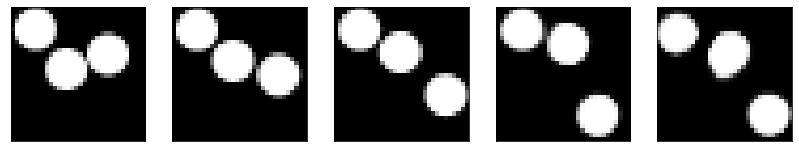

GD iterations:
i=0 | err=52.300034
i=1 | err=51.069138
i=2 | err=49.361000
i=3 | err=47.433643
i=4 | err=45.505585
i=5 | err=43.556458
i=6 | err=41.583210
i=7 | err=39.590431
i=8 | err=37.662601
i=9 | err=35.712517
i=10 | err=33.838921
i=11 | err=31.972939
i=12 | err=30.233078
i=13 | err=28.521736
i=14 | err=26.867119
i=15 | err=25.289341
i=16 | err=23.764687
i=17 | err=22.288162
i=18 | err=20.829376
i=19 | err=19.396744
i=20 | err=18.043884
i=21 | err=16.718121
i=22 | err=15.461763
i=23 | err=14.299648
i=24 | err=13.242430
i=25 | err=12.269005
i=26 | err=11.361998
i=27 | err=10.487694
i=28 | err=9.635458
i=29 | err=8.805728
Epoch=252 (62%) | out_positive=0.868281 | out_negative=0.089273 | mse=0.075687


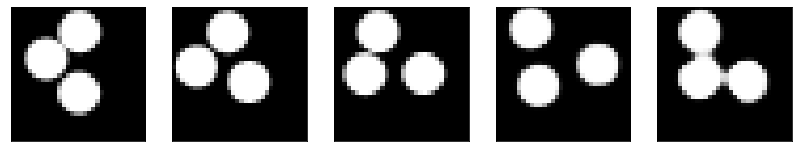

GD iterations:
i=0 | err=56.491879
i=1 | err=55.224808
i=2 | err=53.431480
i=3 | err=51.480183
i=4 | err=49.367718
i=5 | err=47.177063
i=6 | err=44.930714
i=7 | err=42.633602
i=8 | err=40.276283
i=9 | err=37.982677
i=10 | err=35.723106
i=11 | err=33.563728
i=12 | err=31.408739
i=13 | err=29.294960
i=14 | err=27.215618
i=15 | err=25.289509
i=16 | err=23.502388
i=17 | err=21.772953
i=18 | err=20.120483
i=19 | err=18.584896
i=20 | err=17.128225
i=21 | err=15.697685
i=22 | err=14.381245
i=23 | err=13.153088
i=24 | err=12.067949
i=25 | err=11.009264
i=26 | err=10.034060
i=27 | err=9.053848
i=28 | err=8.112891
i=29 | err=7.213571
Epoch=252 (64%) | out_positive=0.904909 | out_negative=0.124575 | mse=0.074152


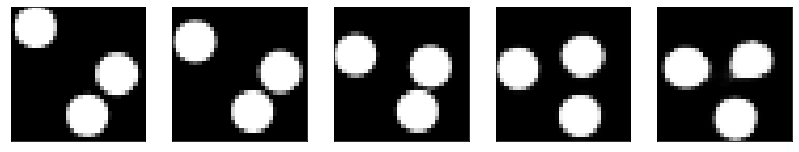

GD iterations:
i=0 | err=55.980705
i=1 | err=54.821747
i=2 | err=53.209206
i=3 | err=51.419388
i=4 | err=49.536819
i=5 | err=47.552864
i=6 | err=45.519089
i=7 | err=43.452648
i=8 | err=41.427406
i=9 | err=39.357201
i=10 | err=37.239029
i=11 | err=35.017166
i=12 | err=32.868450
i=13 | err=30.743359
i=14 | err=28.580074
i=15 | err=26.557518
i=16 | err=24.505508
i=17 | err=22.570145
i=18 | err=20.704216
i=19 | err=18.990673
i=20 | err=17.451101
i=21 | err=15.980637
i=22 | err=14.612463
i=23 | err=13.300321
i=24 | err=12.043467
i=25 | err=10.874182
i=26 | err=9.810492
i=27 | err=8.843533
i=28 | err=7.935279
i=29 | err=7.072232
Epoch=252 (66%) | out_positive=0.854185 | out_negative=0.157176 | mse=0.072143


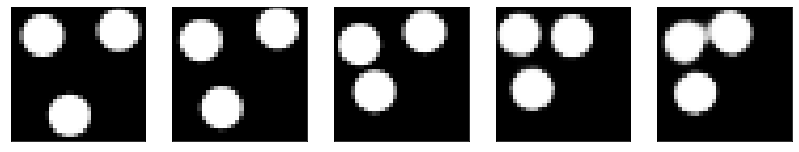

GD iterations:
i=0 | err=53.068451
i=1 | err=51.914497
i=2 | err=50.355080
i=3 | err=48.565792
i=4 | err=46.710415
i=5 | err=44.832321
i=6 | err=42.888439
i=7 | err=40.906883
i=8 | err=38.906773
i=9 | err=36.798248
i=10 | err=34.631897
i=11 | err=32.541618
i=12 | err=30.515640
i=13 | err=28.553379
i=14 | err=26.732838
i=15 | err=24.978806
i=16 | err=23.271959
i=17 | err=21.640152
i=18 | err=20.111252
i=19 | err=18.660618
i=20 | err=17.262619
i=21 | err=15.925946
i=22 | err=14.660051
i=23 | err=13.509167
i=24 | err=12.460945
i=25 | err=11.475648
i=26 | err=10.559500
i=27 | err=9.681087
i=28 | err=8.865091
i=29 | err=8.073141
Epoch=252 (68%) | out_positive=0.857320 | out_negative=0.101585 | mse=0.075299


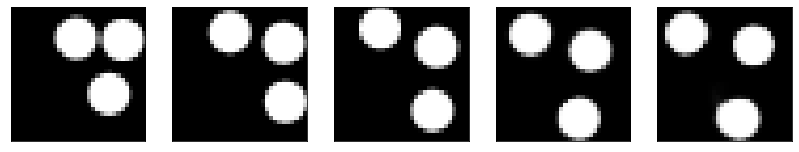

GD iterations:
i=0 | err=56.048340
i=1 | err=54.794662
i=2 | err=53.004986
i=3 | err=51.025757
i=4 | err=48.953712
i=5 | err=46.789532
i=6 | err=44.523857
i=7 | err=42.256557
i=8 | err=39.966568
i=9 | err=37.701401
i=10 | err=35.428856
i=11 | err=33.212471
i=12 | err=31.053429
i=13 | err=28.990005
i=14 | err=26.953403
i=15 | err=24.948877
i=16 | err=23.046560
i=17 | err=21.257938
i=18 | err=19.608959
i=19 | err=18.014011
i=20 | err=16.563988
i=21 | err=15.239368
i=22 | err=14.045475
i=23 | err=12.922989
i=24 | err=11.875931
i=25 | err=10.875397
i=26 | err=9.934262
i=27 | err=9.051928
i=28 | err=8.238356
i=29 | err=7.440417
Epoch=252 (70%) | out_positive=0.804715 | out_negative=0.119539 | mse=0.067095


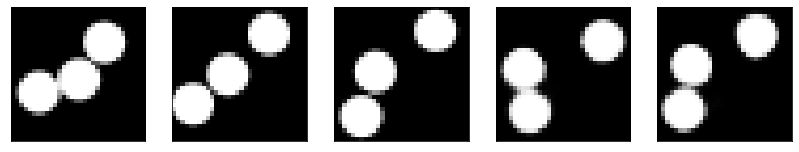

GD iterations:
i=0 | err=55.692596
i=1 | err=54.496124
i=2 | err=52.841621
i=3 | err=50.969582
i=4 | err=49.033695
i=5 | err=47.066475
i=6 | err=44.980789
i=7 | err=42.820980
i=8 | err=40.586250
i=9 | err=38.290894
i=10 | err=35.999226
i=11 | err=33.739239
i=12 | err=31.568054
i=13 | err=29.562778
i=14 | err=27.619957
i=15 | err=25.751511
i=16 | err=23.938847
i=17 | err=22.225189
i=18 | err=20.592384
i=19 | err=19.014378
i=20 | err=17.482958
i=21 | err=16.070591
i=22 | err=14.695768
i=23 | err=13.371186
i=24 | err=12.208204
i=25 | err=11.094160
i=26 | err=10.046287
i=27 | err=9.086464
i=28 | err=8.155288
i=29 | err=7.290639
Epoch=252 (72%) | out_positive=0.884313 | out_negative=0.123923 | mse=0.069687


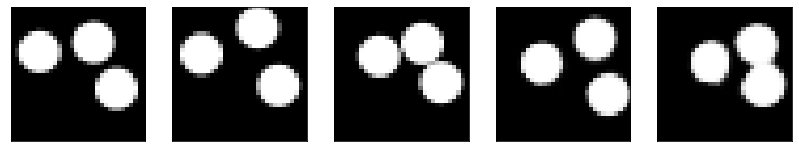

GD iterations:
i=0 | err=57.155396
i=1 | err=55.955585
i=2 | err=54.352188
i=3 | err=52.525108
i=4 | err=50.652908
i=5 | err=48.633099
i=6 | err=46.538368
i=7 | err=44.318718
i=8 | err=41.864990
i=9 | err=39.308891
i=10 | err=36.763203
i=11 | err=34.225471
i=12 | err=31.809536
i=13 | err=29.544060
i=14 | err=27.205639
i=15 | err=25.091221
i=16 | err=23.120064
i=17 | err=21.289288
i=18 | err=19.560177
i=19 | err=17.998722
i=20 | err=16.542803
i=21 | err=15.122751
i=22 | err=13.887554
i=23 | err=12.724072
i=24 | err=11.608755
i=25 | err=10.569360
i=26 | err=9.592565
i=27 | err=8.645025
i=28 | err=7.762450
i=29 | err=6.919867
Epoch=252 (73%) | out_positive=0.857120 | out_negative=0.123422 | mse=0.074716


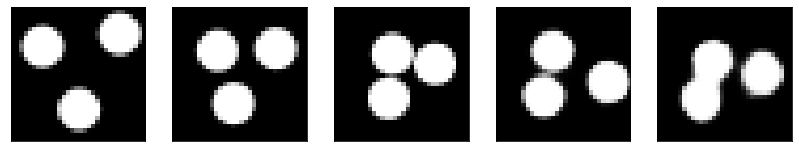

GD iterations:
i=0 | err=54.790771
i=1 | err=53.726883
i=2 | err=52.286507
i=3 | err=50.611214
i=4 | err=48.798721
i=5 | err=46.843487
i=6 | err=44.781830
i=7 | err=42.692802
i=8 | err=40.569218
i=9 | err=38.421402
i=10 | err=36.267609
i=11 | err=34.094181
i=12 | err=31.948696
i=13 | err=29.807293
i=14 | err=27.702343
i=15 | err=25.683945
i=16 | err=23.848824
i=17 | err=22.046152
i=18 | err=20.396257
i=19 | err=18.818161
i=20 | err=17.300091
i=21 | err=15.871248
i=22 | err=14.556660
i=23 | err=13.309034
i=24 | err=12.130926
i=25 | err=10.995810
i=26 | err=9.979188
i=27 | err=9.049936
i=28 | err=8.203821
i=29 | err=7.382689
Epoch=252 (75%) | out_positive=0.857079 | out_negative=0.098698 | mse=0.072158


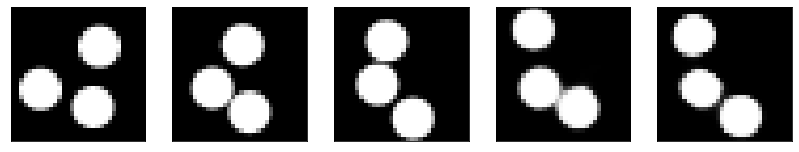

GD iterations:
i=0 | err=54.936863
i=1 | err=53.694511
i=2 | err=52.020546
i=3 | err=50.080158
i=4 | err=48.064232
i=5 | err=45.998337
i=6 | err=43.877068
i=7 | err=41.652142
i=8 | err=39.349552
i=9 | err=36.970894
i=10 | err=34.723232
i=11 | err=32.512482
i=12 | err=30.339916
i=13 | err=28.246410
i=14 | err=26.233585
i=15 | err=24.314312
i=16 | err=22.482155
i=17 | err=20.742680
i=18 | err=19.142609
i=19 | err=17.655476
i=20 | err=16.249708
i=21 | err=14.943916
i=22 | err=13.728553
i=23 | err=12.601964
i=24 | err=11.541725
i=25 | err=10.528166
i=26 | err=9.547615
i=27 | err=8.638844
i=28 | err=7.756626
i=29 | err=6.930940
Epoch=252 (77%) | out_positive=0.858576 | out_negative=0.149106 | mse=0.067752


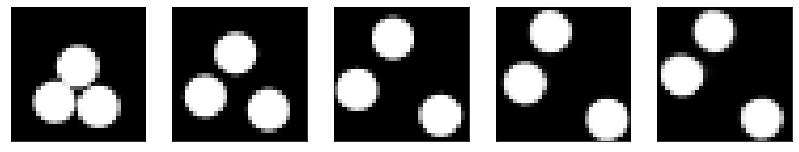

GD iterations:
i=0 | err=49.105164
i=1 | err=47.949677
i=2 | err=46.357811
i=3 | err=44.647263
i=4 | err=42.811569
i=5 | err=40.950722
i=6 | err=39.013771
i=7 | err=37.080803
i=8 | err=35.056255
i=9 | err=32.945389
i=10 | err=30.729147
i=11 | err=28.547119
i=12 | err=26.493845
i=13 | err=24.479956
i=14 | err=22.636545
i=15 | err=20.874027
i=16 | err=19.211079
i=17 | err=17.687197
i=18 | err=16.287537
i=19 | err=14.954691
i=20 | err=13.689163
i=21 | err=12.521949
i=22 | err=11.453852
i=23 | err=10.449100
i=24 | err=9.509286
i=25 | err=8.620161
i=26 | err=7.808877
i=27 | err=7.042758
i=28 | err=6.311754
i=29 | err=5.607762
Epoch=252 (79%) | out_positive=0.937925 | out_negative=0.157402 | mse=0.067167


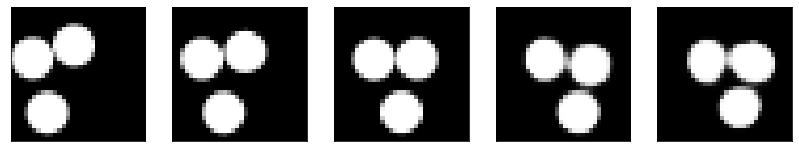

GD iterations:
i=0 | err=53.489513
i=1 | err=52.254379
i=2 | err=50.522789
i=3 | err=48.551010
i=4 | err=46.533531
i=5 | err=44.398273
i=6 | err=42.240582
i=7 | err=40.064503
i=8 | err=37.855362
i=9 | err=35.632652
i=10 | err=33.360451
i=11 | err=31.011623
i=12 | err=28.731836
i=13 | err=26.515335
i=14 | err=24.554291
i=15 | err=22.651867
i=16 | err=20.850187
i=17 | err=19.207249
i=18 | err=17.677519
i=19 | err=16.260769
i=20 | err=14.959927
i=21 | err=13.762419
i=22 | err=12.637775
i=23 | err=11.589937
i=24 | err=10.637049
i=25 | err=9.765678
i=26 | err=8.941671
i=27 | err=8.161320
i=28 | err=7.442894
i=29 | err=6.742558
Epoch=252 (81%) | out_positive=0.854906 | out_negative=0.118675 | mse=0.070904


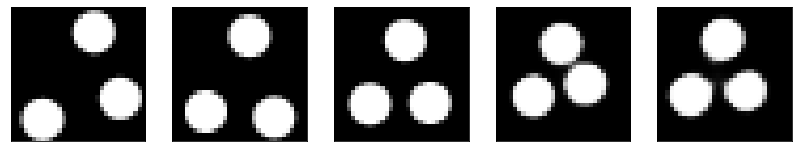

GD iterations:
i=0 | err=51.581593
i=1 | err=50.432678
i=2 | err=48.865021
i=3 | err=47.071133
i=4 | err=45.118767
i=5 | err=43.098469
i=6 | err=40.997658
i=7 | err=38.882576
i=8 | err=36.682251
i=9 | err=34.493748
i=10 | err=32.394249
i=11 | err=30.332584
i=12 | err=28.369411
i=13 | err=26.418083
i=14 | err=24.619558
i=15 | err=22.915384
i=16 | err=21.291386
i=17 | err=19.765783
i=18 | err=18.297701
i=19 | err=16.903950
i=20 | err=15.540813
i=21 | err=14.286356
i=22 | err=13.097080
i=23 | err=12.012995
i=24 | err=11.024487
i=25 | err=10.066635
i=26 | err=9.132202
i=27 | err=8.214937
i=28 | err=7.354695
i=29 | err=6.572758
Epoch=252 (82%) | out_positive=0.894930 | out_negative=0.142933 | mse=0.069354


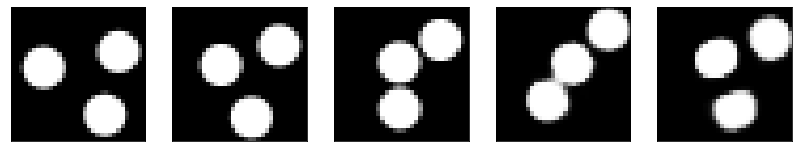

GD iterations:
i=0 | err=53.118217
i=1 | err=52.008343
i=2 | err=50.478088
i=3 | err=48.739349
i=4 | err=46.851643
i=5 | err=44.960747
i=6 | err=43.049324
i=7 | err=41.076496
i=8 | err=39.061661
i=9 | err=36.978722
i=10 | err=34.916626
i=11 | err=32.904068
i=12 | err=30.916599
i=13 | err=28.983696
i=14 | err=27.078836
i=15 | err=25.219975
i=16 | err=23.450230
i=17 | err=21.773315
i=18 | err=20.216084
i=19 | err=18.771690
i=20 | err=17.439407
i=21 | err=16.110092
i=22 | err=14.839893
i=23 | err=13.628763
i=24 | err=12.472548
i=25 | err=11.371569
i=26 | err=10.357813
i=27 | err=9.409067
i=28 | err=8.547455
i=29 | err=7.721428
Epoch=252 (84%) | out_positive=0.910932 | out_negative=0.091512 | mse=0.073986


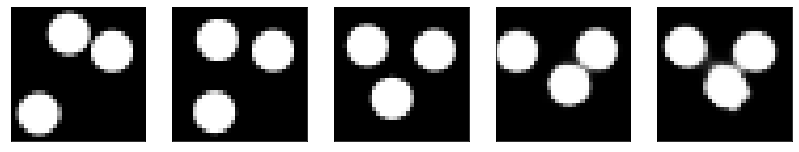

GD iterations:
i=0 | err=56.303703
i=1 | err=55.068150
i=2 | err=53.520569
i=3 | err=51.750042
i=4 | err=49.919567
i=5 | err=47.941185
i=6 | err=45.925880
i=7 | err=43.830009
i=8 | err=41.706238
i=9 | err=39.538090
i=10 | err=37.228172
i=11 | err=34.856575
i=12 | err=32.553848
i=13 | err=30.378704
i=14 | err=28.210335
i=15 | err=26.140942
i=16 | err=24.196186
i=17 | err=22.328468
i=18 | err=20.539368
i=19 | err=18.812878
i=20 | err=17.181829
i=21 | err=15.680524
i=22 | err=14.245794
i=23 | err=12.932377
i=24 | err=11.719913
i=25 | err=10.593006
i=26 | err=9.564549
i=27 | err=8.588514
i=28 | err=7.678151
i=29 | err=6.829000
Epoch=252 (86%) | out_positive=0.923481 | out_negative=0.146295 | mse=0.075365


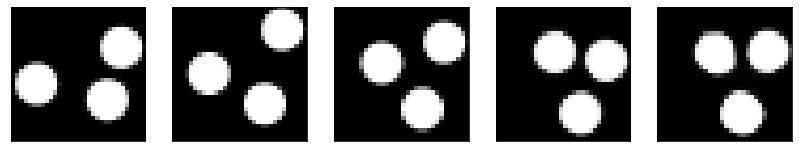

GD iterations:
i=0 | err=53.159286
i=1 | err=52.073929
i=2 | err=50.503002
i=3 | err=48.752953
i=4 | err=46.812233
i=5 | err=44.779274
i=6 | err=42.606140
i=7 | err=40.445198
i=8 | err=38.284424
i=9 | err=36.061852
i=10 | err=33.908298
i=11 | err=31.730919
i=12 | err=29.582481
i=13 | err=27.517479
i=14 | err=25.511738
i=15 | err=23.584595
i=16 | err=21.739704
i=17 | err=20.005880
i=18 | err=18.402813
i=19 | err=16.877386
i=20 | err=15.440987
i=21 | err=14.046701
i=22 | err=12.756757
i=23 | err=11.566137
i=24 | err=10.467215
i=25 | err=9.460058
i=26 | err=8.555715
i=27 | err=7.734592
i=28 | err=6.947905
i=29 | err=6.223941
Epoch=252 (88%) | out_positive=0.912468 | out_negative=0.137902 | mse=0.069684


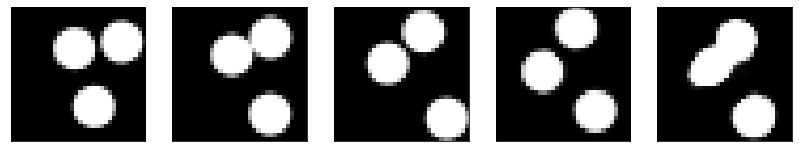

GD iterations:
i=0 | err=56.807800
i=1 | err=55.655838
i=2 | err=54.112740
i=3 | err=52.253220
i=4 | err=50.230518
i=5 | err=48.148796
i=6 | err=45.966789
i=7 | err=43.800003
i=8 | err=41.506737
i=9 | err=39.135735
i=10 | err=36.700684
i=11 | err=34.186893
i=12 | err=31.777792
i=13 | err=29.331356
i=14 | err=26.927866
i=15 | err=24.556641
i=16 | err=22.358253
i=17 | err=20.403545
i=18 | err=18.621693
i=19 | err=17.025328
i=20 | err=15.558983
i=21 | err=14.202105
i=22 | err=12.923336
i=23 | err=11.751115
i=24 | err=10.652079
i=25 | err=9.670194
i=26 | err=8.779609
i=27 | err=7.953814
i=28 | err=7.164867
i=29 | err=6.414395
Epoch=252 (90%) | out_positive=0.883152 | out_negative=0.148019 | mse=0.076297


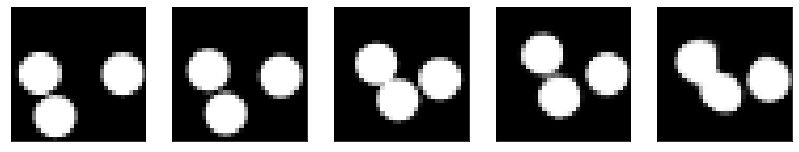

GD iterations:
i=0 | err=53.541691
i=1 | err=52.366821
i=2 | err=50.841660
i=3 | err=49.084999
i=4 | err=47.261330
i=5 | err=45.339077
i=6 | err=43.365582
i=7 | err=41.413403
i=8 | err=39.395119
i=9 | err=37.322994
i=10 | err=35.262295
i=11 | err=33.250355
i=12 | err=31.225584
i=13 | err=29.199593
i=14 | err=27.194904
i=15 | err=25.224590
i=16 | err=23.332899
i=17 | err=21.540277
i=18 | err=19.829874
i=19 | err=18.316391
i=20 | err=16.870277
i=21 | err=15.516555
i=22 | err=14.249298
i=23 | err=13.045594
i=24 | err=11.868809
i=25 | err=10.778049
i=26 | err=9.744255
i=27 | err=8.762537
i=28 | err=7.853375
i=29 | err=7.001977
Epoch=252 (92%) | out_positive=0.870790 | out_negative=0.141303 | mse=0.072714


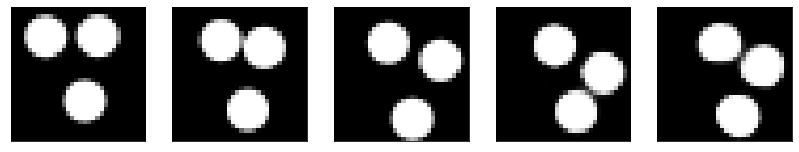

GD iterations:
i=0 | err=54.971737
i=1 | err=53.620605
i=2 | err=51.802116
i=3 | err=49.762684
i=4 | err=47.687172
i=5 | err=45.474522
i=6 | err=43.277016
i=7 | err=40.977509
i=8 | err=38.575275
i=9 | err=36.049820
i=10 | err=33.701324
i=11 | err=31.372452
i=12 | err=29.123745
i=13 | err=26.918385
i=14 | err=24.879749
i=15 | err=22.993279
i=16 | err=21.251060
i=17 | err=19.706486
i=18 | err=18.287327
i=19 | err=16.927265
i=20 | err=15.634313
i=21 | err=14.431532
i=22 | err=13.271981
i=23 | err=12.200119
i=24 | err=11.139226
i=25 | err=10.123997
i=26 | err=9.214172
i=27 | err=8.396692
i=28 | err=7.633206
i=29 | err=6.920258
Epoch=252 (93%) | out_positive=0.866059 | out_negative=0.110413 | mse=0.068314


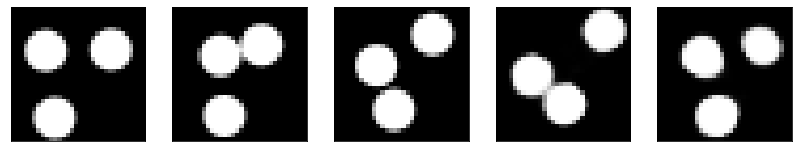

GD iterations:
i=0 | err=57.595592
i=1 | err=56.282543
i=2 | err=54.523598
i=3 | err=52.580482
i=4 | err=50.446754
i=5 | err=48.265144
i=6 | err=46.020912
i=7 | err=43.820419
i=8 | err=41.465637
i=9 | err=39.088352
i=10 | err=36.713940
i=11 | err=34.358265
i=12 | err=32.061745
i=13 | err=29.857746
i=14 | err=27.760288
i=15 | err=25.795666
i=16 | err=23.964836
i=17 | err=22.203445
i=18 | err=20.501234
i=19 | err=18.865839
i=20 | err=17.324371
i=21 | err=15.838896
i=22 | err=14.455638
i=23 | err=13.196045
i=24 | err=12.038255
i=25 | err=10.980289
i=26 | err=9.978260
i=27 | err=9.036853
i=28 | err=8.132809
i=29 | err=7.255407
Epoch=252 (95%) | out_positive=0.830273 | out_negative=0.132500 | mse=0.073347


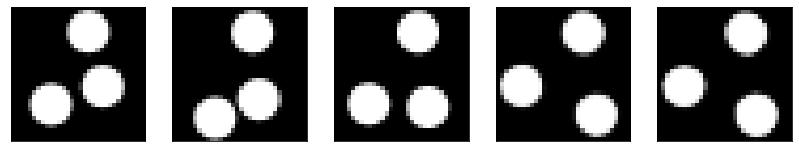

GD iterations:
i=0 | err=52.100601
i=1 | err=50.893230
i=2 | err=49.353859
i=3 | err=47.691273
i=4 | err=45.903458
i=5 | err=43.952232
i=6 | err=41.936829
i=7 | err=39.909752
i=8 | err=37.831833
i=9 | err=35.734417
i=10 | err=33.558105
i=11 | err=31.386120
i=12 | err=29.274811
i=13 | err=27.270500
i=14 | err=25.356049
i=15 | err=23.463562
i=16 | err=21.703569
i=17 | err=19.987139
i=18 | err=18.321800
i=19 | err=16.733709
i=20 | err=15.243754
i=21 | err=13.835150
i=22 | err=12.542488
i=23 | err=11.330903
i=24 | err=10.166033
i=25 | err=9.102482
i=26 | err=8.105953
i=27 | err=7.160420
i=28 | err=6.253367
i=29 | err=5.446128
Epoch=252 (97%) | out_positive=0.917684 | out_negative=0.188601 | mse=0.067543


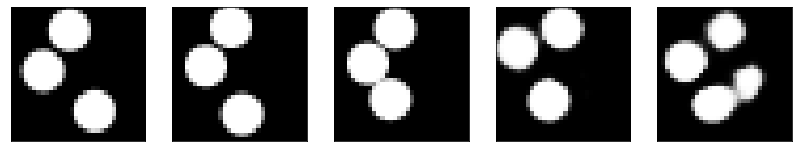

GD iterations:
i=0 | err=51.737221
i=1 | err=50.669689
i=2 | err=49.171944
i=3 | err=47.502831
i=4 | err=45.728439
i=5 | err=43.823887
i=6 | err=41.902153
i=7 | err=39.914677
i=8 | err=37.959175
i=9 | err=35.878082
i=10 | err=33.790985
i=11 | err=31.763622
i=12 | err=29.775402
i=13 | err=27.831802
i=14 | err=26.070602
i=15 | err=24.358967
i=16 | err=22.742376
i=17 | err=21.208813
i=18 | err=19.778934
i=19 | err=18.456955
i=20 | err=17.182581
i=21 | err=15.996191
i=22 | err=14.865150
i=23 | err=13.762983
i=24 | err=12.732891
i=25 | err=11.714046
i=26 | err=10.733477
i=27 | err=9.840593
i=28 | err=9.006516
i=29 | err=8.216024
Epoch=252 (99%) | out_positive=0.871157 | out_negative=0.108475 | mse=0.077222


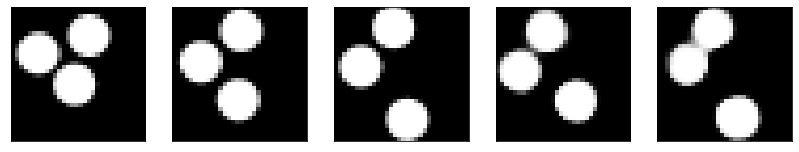

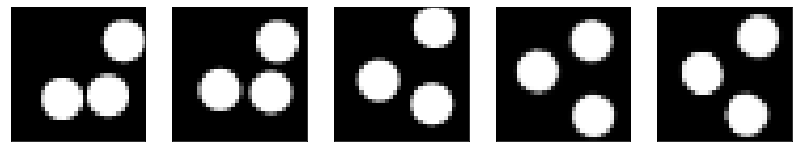

Test MSE 0.078739


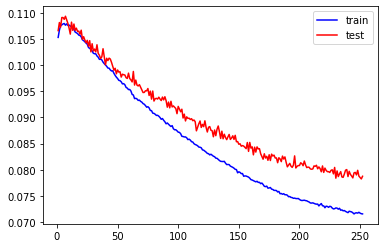

GD iterations:
i=0 | err=55.180763
i=1 | err=53.997032
i=2 | err=52.437119
i=3 | err=50.599766
i=4 | err=48.672264
i=5 | err=46.721642
i=6 | err=44.759125
i=7 | err=42.745148
i=8 | err=40.605659
i=9 | err=38.366417
i=10 | err=36.153587
i=11 | err=33.924526
i=12 | err=31.823662
i=13 | err=29.732363
i=14 | err=27.678198
i=15 | err=25.697407
i=16 | err=23.726545
i=17 | err=21.820917
i=18 | err=20.014105
i=19 | err=18.400322
i=20 | err=16.889641
i=21 | err=15.498757
i=22 | err=14.201413
i=23 | err=13.040466
i=24 | err=11.960915
i=25 | err=10.958994
i=26 | err=10.023519
i=27 | err=9.180660
i=28 | err=8.352625
i=29 | err=7.540059
Epoch=253 (0%) | out_positive=0.894870 | out_negative=0.153262 | mse=0.072671


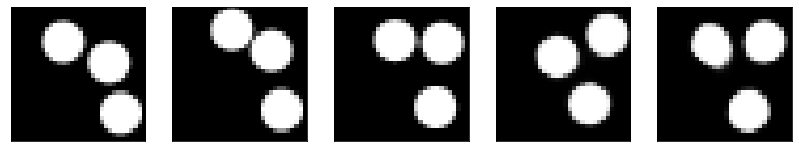

GD iterations:
i=0 | err=51.542084
i=1 | err=50.495930
i=2 | err=49.095612
i=3 | err=47.548138
i=4 | err=45.875069
i=5 | err=44.138165
i=6 | err=42.287224
i=7 | err=40.358910
i=8 | err=38.414169
i=9 | err=36.373119
i=10 | err=34.323055
i=11 | err=32.249348
i=12 | err=30.152702
i=13 | err=28.142805
i=14 | err=26.193146
i=15 | err=24.387203
i=16 | err=22.661106
i=17 | err=21.085686
i=18 | err=19.626526
i=19 | err=18.241789
i=20 | err=16.910246
i=21 | err=15.655245
i=22 | err=14.471281
i=23 | err=13.349329
i=24 | err=12.281369
i=25 | err=11.282196
i=26 | err=10.338457
i=27 | err=9.406676
i=28 | err=8.534153
i=29 | err=7.723834
Epoch=253 (2%) | out_positive=0.865682 | out_negative=0.126075 | mse=0.069378


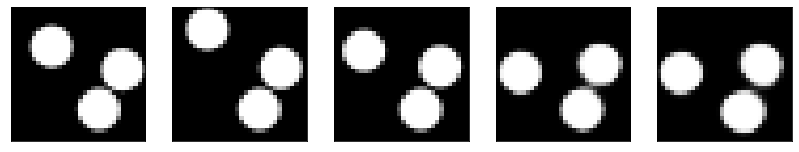

GD iterations:
i=0 | err=54.360508
i=1 | err=53.163067
i=2 | err=51.440247
i=3 | err=49.565796
i=4 | err=47.557068
i=5 | err=45.465267
i=6 | err=43.274967
i=7 | err=41.058254
i=8 | err=38.777710
i=9 | err=36.449711
i=10 | err=34.140579
i=11 | err=31.832928
i=12 | err=29.536848
i=13 | err=27.233002
i=14 | err=24.978287
i=15 | err=22.911217
i=16 | err=21.003918
i=17 | err=19.291973
i=18 | err=17.745586
i=19 | err=16.274597
i=20 | err=14.941076
i=21 | err=13.687661
i=22 | err=12.476173
i=23 | err=11.339398
i=24 | err=10.226085
i=25 | err=9.173029
i=26 | err=8.202300
i=27 | err=7.325565
i=28 | err=6.481757
i=29 | err=5.699846
Epoch=253 (4%) | out_positive=0.853708 | out_negative=0.151980 | mse=0.067240


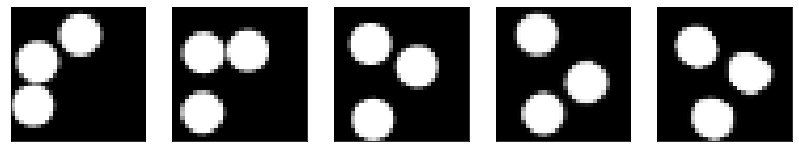

GD iterations:
i=0 | err=56.767193
i=1 | err=55.555275
i=2 | err=53.932083
i=3 | err=52.107925
i=4 | err=50.052650
i=5 | err=47.884453
i=6 | err=45.618576
i=7 | err=43.310265
i=8 | err=40.939003
i=9 | err=38.596550
i=10 | err=36.237488
i=11 | err=33.969959
i=12 | err=31.721790
i=13 | err=29.584824
i=14 | err=27.617861
i=15 | err=25.738697
i=16 | err=23.902184
i=17 | err=22.146606
i=18 | err=20.411423
i=19 | err=18.704903
i=20 | err=17.072823
i=21 | err=15.561738
i=22 | err=14.187170
i=23 | err=12.918388
i=24 | err=11.770122
i=25 | err=10.741283
i=26 | err=9.730045
i=27 | err=8.779175
i=28 | err=7.909293
i=29 | err=7.078733
Epoch=253 (6%) | out_positive=0.834479 | out_negative=0.082806 | mse=0.069301


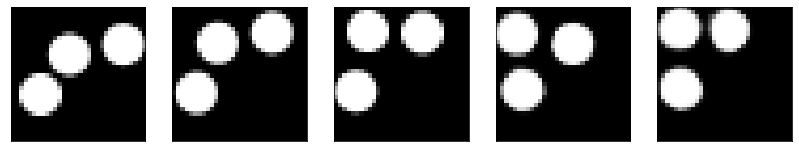

GD iterations:
i=0 | err=51.224632
i=1 | err=50.085682
i=2 | err=48.519806
i=3 | err=46.746342
i=4 | err=44.923714
i=5 | err=43.088135
i=6 | err=41.149689
i=7 | err=39.127934
i=8 | err=36.979397
i=9 | err=34.851242
i=10 | err=32.797554
i=11 | err=30.837709
i=12 | err=28.924000
i=13 | err=27.058807
i=14 | err=25.298750
i=15 | err=23.656925
i=16 | err=22.029074
i=17 | err=20.478588
i=18 | err=18.975819
i=19 | err=17.590977
i=20 | err=16.227161
i=21 | err=14.958211
i=22 | err=13.746581
i=23 | err=12.629174
i=24 | err=11.536374
i=25 | err=10.544279
i=26 | err=9.635411
i=27 | err=8.781767
i=28 | err=7.979166
i=29 | err=7.247996
Epoch=253 (7%) | out_positive=0.882066 | out_negative=0.079849 | mse=0.073071


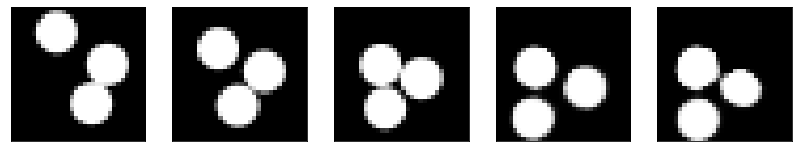

GD iterations:
i=0 | err=54.184731
i=1 | err=52.997097
i=2 | err=51.411751
i=3 | err=49.670502
i=4 | err=47.769184
i=5 | err=45.766472
i=6 | err=43.665115
i=7 | err=41.557022
i=8 | err=39.425827
i=9 | err=37.271729
i=10 | err=35.012638
i=11 | err=32.816833
i=12 | err=30.620371
i=13 | err=28.456991
i=14 | err=26.296894
i=15 | err=24.343819
i=16 | err=22.507229
i=17 | err=20.797291
i=18 | err=19.206230
i=19 | err=17.705521
i=20 | err=16.291927
i=21 | err=14.971903
i=22 | err=13.723938
i=23 | err=12.545351
i=24 | err=11.459285
i=25 | err=10.409014
i=26 | err=9.400358
i=27 | err=8.441269
i=28 | err=7.556585
i=29 | err=6.699178
Epoch=253 (9%) | out_positive=0.919609 | out_negative=0.159986 | mse=0.073786


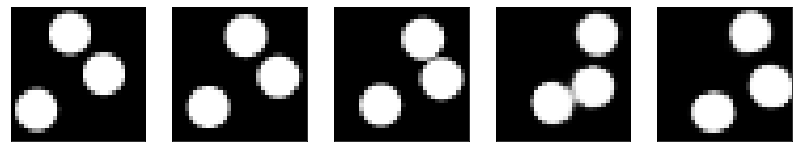

GD iterations:
i=0 | err=55.905960
i=1 | err=54.800339
i=2 | err=53.167919
i=3 | err=51.355621
i=4 | err=49.299854
i=5 | err=47.175827
i=6 | err=44.889000
i=7 | err=42.633205
i=8 | err=40.445900
i=9 | err=38.224876
i=10 | err=35.931946
i=11 | err=33.669239
i=12 | err=31.495869
i=13 | err=29.362242
i=14 | err=27.232632
i=15 | err=25.162167
i=16 | err=23.181431
i=17 | err=21.389126
i=18 | err=19.716644
i=19 | err=18.159733
i=20 | err=16.667334
i=21 | err=15.296700
i=22 | err=14.024984
i=23 | err=12.821595
i=24 | err=11.693988
i=25 | err=10.634242
i=26 | err=9.646448
i=27 | err=8.729910
i=28 | err=7.865183
i=29 | err=7.029190
Epoch=253 (11%) | out_positive=0.870929 | out_negative=0.163891 | mse=0.074547


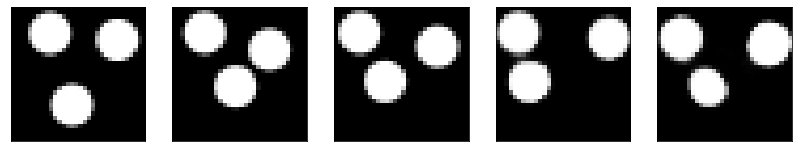

GD iterations:
i=0 | err=55.284451
i=1 | err=54.256832
i=2 | err=52.877266
i=3 | err=51.309746
i=4 | err=49.605930
i=5 | err=47.846134
i=6 | err=45.959026
i=7 | err=43.966454
i=8 | err=41.831604
i=9 | err=39.629208
i=10 | err=37.379997
i=11 | err=35.153057
i=12 | err=32.862511
i=13 | err=30.546288
i=14 | err=28.269186
i=15 | err=26.064386
i=16 | err=24.033661
i=17 | err=22.182308
i=18 | err=20.491394
i=19 | err=18.921371
i=20 | err=17.515079
i=21 | err=16.194561
i=22 | err=14.948036
i=23 | err=13.756250
i=24 | err=12.634994
i=25 | err=11.568366
i=26 | err=10.587063
i=27 | err=9.676245
i=28 | err=8.824664
i=29 | err=8.009562
Epoch=253 (13%) | out_positive=0.826927 | out_negative=0.074857 | mse=0.073466


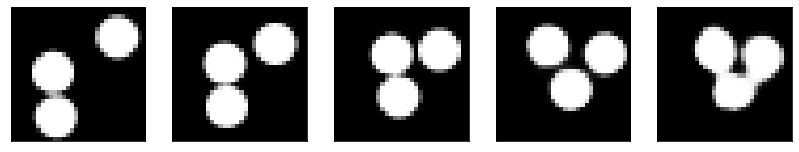

GD iterations:
i=0 | err=54.363716
i=1 | err=53.226189
i=2 | err=51.721581
i=3 | err=49.979725
i=4 | err=48.150265
i=5 | err=46.142525
i=6 | err=44.094418
i=7 | err=41.988159
i=8 | err=39.830643
i=9 | err=37.559143
i=10 | err=35.341095
i=11 | err=33.001869
i=12 | err=30.735256
i=13 | err=28.543282
i=14 | err=26.519154
i=15 | err=24.518221
i=16 | err=22.561642
i=17 | err=20.734756
i=18 | err=19.040871
i=19 | err=17.425350
i=20 | err=15.967718
i=21 | err=14.645344
i=22 | err=13.460285
i=23 | err=12.396876
i=24 | err=11.457419
i=25 | err=10.574243
i=26 | err=9.780939
i=27 | err=9.048153
i=28 | err=8.365359
i=29 | err=7.712892
Epoch=253 (15%) | out_positive=0.847571 | out_negative=0.086957 | mse=0.069881


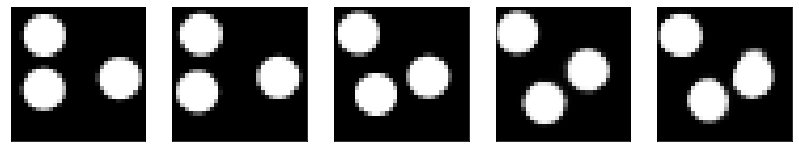

GD iterations:
i=0 | err=53.681934
i=1 | err=52.489563
i=2 | err=50.882729
i=3 | err=49.152157
i=4 | err=47.338196
i=5 | err=45.451271
i=6 | err=43.506020
i=7 | err=41.406914
i=8 | err=39.294800
i=9 | err=37.029526
i=10 | err=34.711742
i=11 | err=32.398605
i=12 | err=29.969814
i=13 | err=27.644146
i=14 | err=25.453350
i=15 | err=23.432640
i=16 | err=21.543945
i=17 | err=19.745104
i=18 | err=18.069321
i=19 | err=16.530367
i=20 | err=15.160851
i=21 | err=13.932149
i=22 | err=12.774773
i=23 | err=11.682592
i=24 | err=10.671783
i=25 | err=9.712770
i=26 | err=8.811434
i=27 | err=7.983522
i=28 | err=7.213192
i=29 | err=6.485808
Epoch=253 (17%) | out_positive=0.884563 | out_negative=0.116132 | mse=0.070572


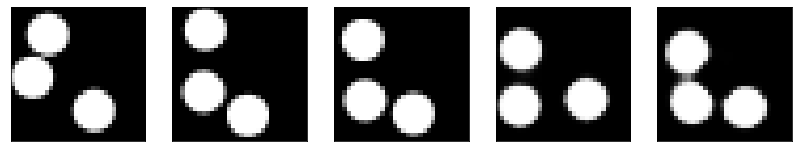

GD iterations:
i=0 | err=51.685234
i=1 | err=50.643814
i=2 | err=49.266071
i=3 | err=47.676514
i=4 | err=45.981026
i=5 | err=44.173035
i=6 | err=42.212559
i=7 | err=40.214218
i=8 | err=38.183556
i=9 | err=36.117226
i=10 | err=33.930527
i=11 | err=31.720463
i=12 | err=29.516335
i=13 | err=27.337177
i=14 | err=25.180237
i=15 | err=23.149101
i=16 | err=21.245520
i=17 | err=19.461784
i=18 | err=17.871021
i=19 | err=16.434587
i=20 | err=15.114493
i=21 | err=13.903207
i=22 | err=12.765705
i=23 | err=11.688551
i=24 | err=10.673343
i=25 | err=9.711010
i=26 | err=8.816107
i=27 | err=7.940013
i=28 | err=7.118997
i=29 | err=6.354095
Epoch=253 (18%) | out_positive=0.883988 | out_negative=0.131038 | mse=0.069888


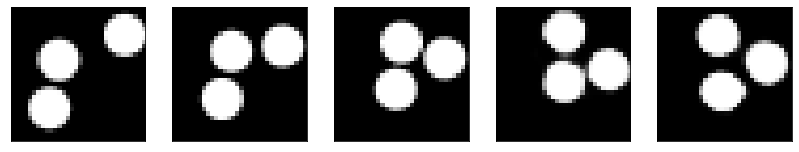

GD iterations:
i=0 | err=58.714142
i=1 | err=57.593864
i=2 | err=55.906231
i=3 | err=54.100220
i=4 | err=52.170044
i=5 | err=50.165913
i=6 | err=48.101147
i=7 | err=45.966965
i=8 | err=43.876770
i=9 | err=41.708611
i=10 | err=39.525955
i=11 | err=37.243286
i=12 | err=34.923782
i=13 | err=32.591599
i=14 | err=30.285545
i=15 | err=27.996450
i=16 | err=25.745117
i=17 | err=23.638718
i=18 | err=21.648258
i=19 | err=19.727924
i=20 | err=17.866556
i=21 | err=16.241959
i=22 | err=14.818916
i=23 | err=13.530743
i=24 | err=12.356998
i=25 | err=11.285469
i=26 | err=10.301380
i=27 | err=9.370897
i=28 | err=8.482704
i=29 | err=7.682181
Epoch=253 (20%) | out_positive=0.899019 | out_negative=0.089122 | mse=0.076819


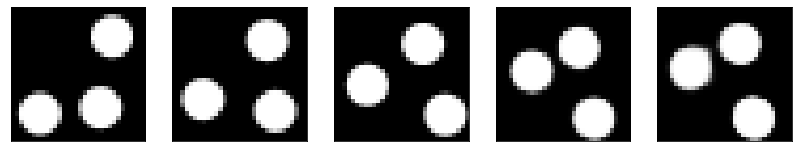

GD iterations:
i=0 | err=56.821194
i=1 | err=55.645721
i=2 | err=54.027809
i=3 | err=52.177979
i=4 | err=50.118748
i=5 | err=47.960693
i=6 | err=45.743382
i=7 | err=43.458218
i=8 | err=41.135895
i=9 | err=38.880318
i=10 | err=36.715981
i=11 | err=34.546173
i=12 | err=32.311378
i=13 | err=30.182100
i=14 | err=28.137875
i=15 | err=26.190378
i=16 | err=24.315155
i=17 | err=22.543575
i=18 | err=20.815332
i=19 | err=19.194559
i=20 | err=17.662922
i=21 | err=16.252710
i=22 | err=14.954824
i=23 | err=13.715937
i=24 | err=12.536048
i=25 | err=11.415060
i=26 | err=10.396091
i=27 | err=9.493009
i=28 | err=8.633911
i=29 | err=7.802683
Epoch=253 (22%) | out_positive=0.886703 | out_negative=0.115397 | mse=0.075307


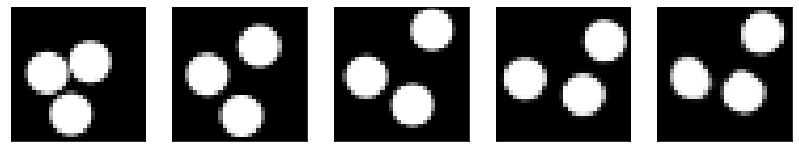

GD iterations:
i=0 | err=55.237640
i=1 | err=54.084099
i=2 | err=52.510860
i=3 | err=50.737770
i=4 | err=48.851971
i=5 | err=46.907482
i=6 | err=45.012131
i=7 | err=43.026585
i=8 | err=40.911804
i=9 | err=38.743382
i=10 | err=36.491150
i=11 | err=34.317837
i=12 | err=32.178406
i=13 | err=30.070635
i=14 | err=27.975887
i=15 | err=25.942276
i=16 | err=23.942308
i=17 | err=22.057274
i=18 | err=20.317350
i=19 | err=18.692341
i=20 | err=17.147942
i=21 | err=15.684563
i=22 | err=14.319702
i=23 | err=13.061824
i=24 | err=11.876616
i=25 | err=10.759377
i=26 | err=9.684183
i=27 | err=8.633345
i=28 | err=7.651733
i=29 | err=6.743226
Epoch=253 (24%) | out_positive=0.870464 | out_negative=0.112413 | mse=0.072010


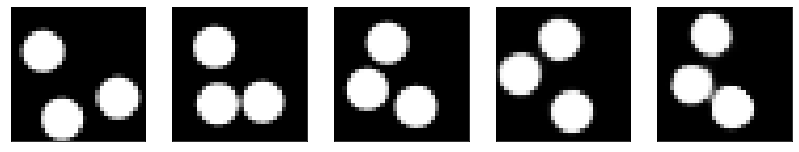

GD iterations:
i=0 | err=55.819542
i=1 | err=54.647770
i=2 | err=53.057632
i=3 | err=51.284286
i=4 | err=49.323128
i=5 | err=47.341042
i=6 | err=45.330734
i=7 | err=43.105213
i=8 | err=40.755714
i=9 | err=38.375938
i=10 | err=36.014191
i=11 | err=33.664692
i=12 | err=31.349888
i=13 | err=29.109280
i=14 | err=26.972149
i=15 | err=24.891958
i=16 | err=22.872845
i=17 | err=21.000591
i=18 | err=19.264038
i=19 | err=17.628139
i=20 | err=16.097504
i=21 | err=14.673712
i=22 | err=13.418745
i=23 | err=12.280115
i=24 | err=11.248848
i=25 | err=10.303989
i=26 | err=9.411224
i=27 | err=8.558572
i=28 | err=7.759953
i=29 | err=7.005745
Epoch=253 (26%) | out_positive=0.845967 | out_negative=0.162531 | mse=0.068048


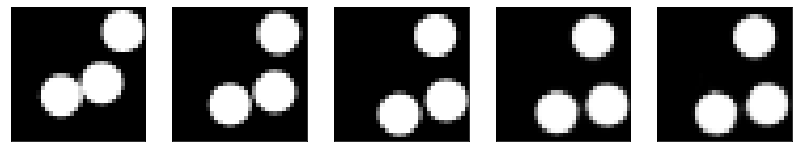

GD iterations:
i=0 | err=55.807449
i=1 | err=54.552246
i=2 | err=52.863052
i=3 | err=50.943546
i=4 | err=48.977173
i=5 | err=46.996826
i=6 | err=44.915512
i=7 | err=42.767769
i=8 | err=40.594177
i=9 | err=38.305672
i=10 | err=35.870594
i=11 | err=33.434879
i=12 | err=30.895809
i=13 | err=28.432079
i=14 | err=26.108564
i=15 | err=23.986210
i=16 | err=22.004787
i=17 | err=20.155571
i=18 | err=18.503609
i=19 | err=16.981405
i=20 | err=15.599129
i=21 | err=14.273054
i=22 | err=13.092208
i=23 | err=12.013679
i=24 | err=11.041283
i=25 | err=10.110108
i=26 | err=9.221155
i=27 | err=8.376618
i=28 | err=7.552135
i=29 | err=6.790041
Epoch=253 (27%) | out_positive=0.890185 | out_negative=0.146635 | mse=0.074902


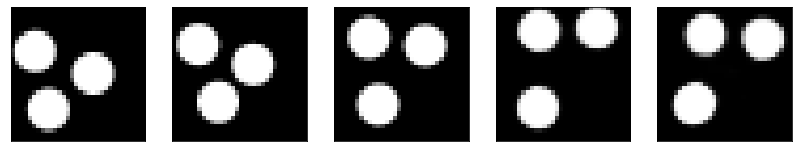

GD iterations:
i=0 | err=53.497372
i=1 | err=52.316185
i=2 | err=50.665718
i=3 | err=48.736794
i=4 | err=46.790649
i=5 | err=44.811115
i=6 | err=42.792549
i=7 | err=40.745621
i=8 | err=38.603600
i=9 | err=36.450184
i=10 | err=34.258938
i=11 | err=32.132057
i=12 | err=30.018412
i=13 | err=27.850752
i=14 | err=25.718189
i=15 | err=23.699654
i=16 | err=21.799250
i=17 | err=19.982189
i=18 | err=18.258091
i=19 | err=16.648743
i=20 | err=15.177124
i=21 | err=13.835924
i=22 | err=12.619349
i=23 | err=11.508058
i=24 | err=10.510647
i=25 | err=9.574742
i=26 | err=8.709545
i=27 | err=7.905002
i=28 | err=7.133690
i=29 | err=6.420263
Epoch=253 (29%) | out_positive=0.883103 | out_negative=0.106930 | mse=0.074080


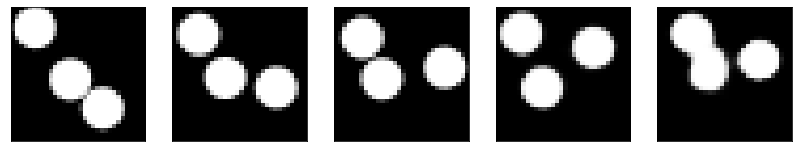

GD iterations:
i=0 | err=61.274353
i=1 | err=59.968140
i=2 | err=58.271774
i=3 | err=56.281715
i=4 | err=54.234653
i=5 | err=52.070511
i=6 | err=49.729450
i=7 | err=47.252663
i=8 | err=44.719875
i=9 | err=42.037064
i=10 | err=39.401814
i=11 | err=36.915878
i=12 | err=34.506817
i=13 | err=32.121429
i=14 | err=29.830612
i=15 | err=27.601875
i=16 | err=25.471397
i=17 | err=23.552128
i=18 | err=21.773916
i=19 | err=20.119415
i=20 | err=18.593941
i=21 | err=17.157036
i=22 | err=15.725936
i=23 | err=14.353845
i=24 | err=13.085619
i=25 | err=11.886774
i=26 | err=10.751381
i=27 | err=9.742509
i=28 | err=8.789352
i=29 | err=7.885139
Epoch=253 (31%) | out_positive=0.777811 | out_negative=0.152896 | mse=0.072953


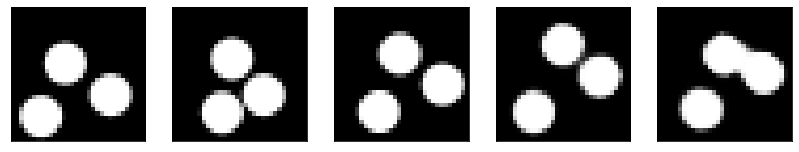

GD iterations:
i=0 | err=55.584694
i=1 | err=54.335320
i=2 | err=52.651276
i=3 | err=50.713047
i=4 | err=48.673294
i=5 | err=46.603477
i=6 | err=44.435799
i=7 | err=42.278229
i=8 | err=40.037163
i=9 | err=37.658562
i=10 | err=35.269337
i=11 | err=32.901527
i=12 | err=30.627724
i=13 | err=28.394945
i=14 | err=26.260838
i=15 | err=24.252243
i=16 | err=22.444128
i=17 | err=20.713993
i=18 | err=19.049644
i=19 | err=17.466385
i=20 | err=16.009766
i=21 | err=14.684362
i=22 | err=13.476464
i=23 | err=12.323610
i=24 | err=11.267388
i=25 | err=10.284113
i=26 | err=9.314869
i=27 | err=8.417830
i=28 | err=7.583787
i=29 | err=6.780262
Epoch=253 (33%) | out_positive=0.844279 | out_negative=0.115013 | mse=0.073943


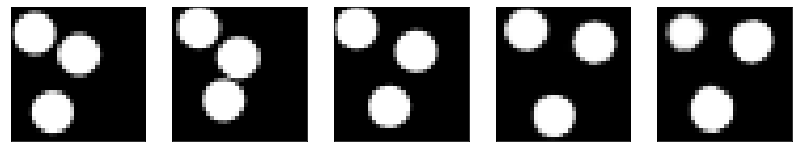

GD iterations:
i=0 | err=56.152885
i=1 | err=54.986198
i=2 | err=53.376564
i=3 | err=51.729546
i=4 | err=49.915581
i=5 | err=48.062820
i=6 | err=46.121666
i=7 | err=44.195080
i=8 | err=42.197311
i=9 | err=40.205254
i=10 | err=38.228027
i=11 | err=36.179298
i=12 | err=34.065102
i=13 | err=31.966558
i=14 | err=29.989464
i=15 | err=27.996723
i=16 | err=26.093035
i=17 | err=24.183723
i=18 | err=22.414753
i=19 | err=20.738087
i=20 | err=19.153290
i=21 | err=17.664473
i=22 | err=16.238167
i=23 | err=14.926669
i=24 | err=13.699322
i=25 | err=12.551199
i=26 | err=11.492863
i=27 | err=10.497989
i=28 | err=9.564327
i=29 | err=8.662586
Epoch=253 (35%) | out_positive=0.817508 | out_negative=0.092858 | mse=0.075828


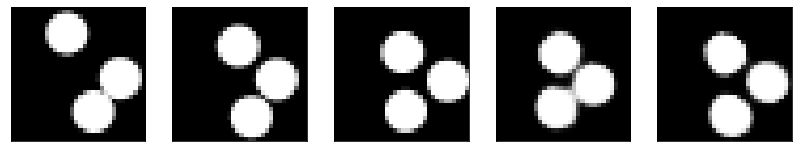

GD iterations:
i=0 | err=55.857616
i=1 | err=54.551575
i=2 | err=52.801826
i=3 | err=50.762039
i=4 | err=48.575409
i=5 | err=46.272957
i=6 | err=43.920807
i=7 | err=41.542679
i=8 | err=39.165085
i=9 | err=36.746826
i=10 | err=34.390121
i=11 | err=32.079018
i=12 | err=29.854864
i=13 | err=27.699028
i=14 | err=25.602947
i=15 | err=23.597902
i=16 | err=21.711018
i=17 | err=20.023441
i=18 | err=18.473944
i=19 | err=17.033939
i=20 | err=15.662110
i=21 | err=14.385277
i=22 | err=13.223078
i=23 | err=12.116189
i=24 | err=11.083638
i=25 | err=10.063886
i=26 | err=9.091584
i=27 | err=8.178511
i=28 | err=7.352246
i=29 | err=6.585077
Epoch=253 (37%) | out_positive=0.862000 | out_negative=0.124042 | mse=0.070843


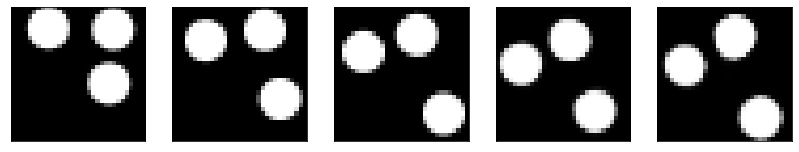

GD iterations:
i=0 | err=56.600639
i=1 | err=55.405369
i=2 | err=53.674751
i=3 | err=51.707726
i=4 | err=49.546089
i=5 | err=47.199959
i=6 | err=44.814991
i=7 | err=42.425266
i=8 | err=39.926079
i=9 | err=37.455757
i=10 | err=34.910484
i=11 | err=32.392212
i=12 | err=30.014513
i=13 | err=27.786310
i=14 | err=25.647337
i=15 | err=23.632725
i=16 | err=21.779465
i=17 | err=20.062263
i=18 | err=18.478409
i=19 | err=16.987371
i=20 | err=15.561083
i=21 | err=14.239746
i=22 | err=13.032255
i=23 | err=11.921446
i=24 | err=10.848437
i=25 | err=9.856720
i=26 | err=8.913906
i=27 | err=8.049582
i=28 | err=7.272950
i=29 | err=6.528059
Epoch=253 (38%) | out_positive=0.886447 | out_negative=0.108746 | mse=0.069766


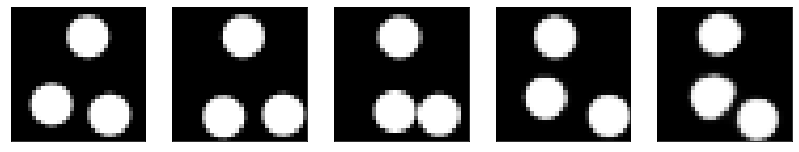

GD iterations:
i=0 | err=55.911591
i=1 | err=54.721367
i=2 | err=53.018829
i=3 | err=51.033020
i=4 | err=48.922386
i=5 | err=46.793221
i=6 | err=44.596348
i=7 | err=42.353859
i=8 | err=39.941246
i=9 | err=37.522636
i=10 | err=35.129025
i=11 | err=32.747646
i=12 | err=30.398281
i=13 | err=28.095623
i=14 | err=25.817722
i=15 | err=23.678741
i=16 | err=21.701969
i=17 | err=19.884478
i=18 | err=18.246197
i=19 | err=16.724520
i=20 | err=15.275816
i=21 | err=13.925406
i=22 | err=12.696336
i=23 | err=11.545634
i=24 | err=10.512407
i=25 | err=9.555763
i=26 | err=8.639421
i=27 | err=7.788481
i=28 | err=6.970884
i=29 | err=6.206146
Epoch=253 (40%) | out_positive=0.883567 | out_negative=0.153317 | mse=0.071019


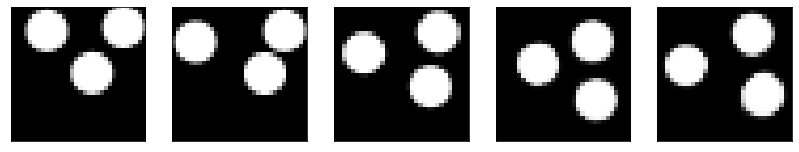

GD iterations:
i=0 | err=55.656944
i=1 | err=54.294987
i=2 | err=52.533859
i=3 | err=50.547958
i=4 | err=48.453709
i=5 | err=46.343475
i=6 | err=44.123947
i=7 | err=41.821770
i=8 | err=39.437180
i=9 | err=36.919312
i=10 | err=34.346291
i=11 | err=31.869926
i=12 | err=29.451717
i=13 | err=27.205807
i=14 | err=25.096254
i=15 | err=23.070404
i=16 | err=21.156340
i=17 | err=19.353706
i=18 | err=17.690517
i=19 | err=16.224480
i=20 | err=14.833241
i=21 | err=13.546436
i=22 | err=12.360427
i=23 | err=11.279060
i=24 | err=10.285326
i=25 | err=9.376867
i=26 | err=8.543439
i=27 | err=7.779019
i=28 | err=7.049388
i=29 | err=6.347328
Epoch=253 (42%) | out_positive=0.827321 | out_negative=0.115817 | mse=0.066403


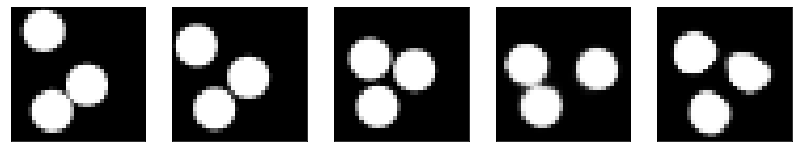

GD iterations:
i=0 | err=53.583370
i=1 | err=52.374275
i=2 | err=50.800808
i=3 | err=49.025055
i=4 | err=47.144386
i=5 | err=45.141884
i=6 | err=43.117725
i=7 | err=40.987137
i=8 | err=38.851002
i=9 | err=36.766174
i=10 | err=34.635021
i=11 | err=32.469078
i=12 | err=30.287306
i=13 | err=28.154869
i=14 | err=26.186937
i=15 | err=24.295279
i=16 | err=22.502239
i=17 | err=20.904423
i=18 | err=19.405663
i=19 | err=18.034184
i=20 | err=16.744785
i=21 | err=15.500719
i=22 | err=14.350399
i=23 | err=13.276583
i=24 | err=12.272357
i=25 | err=11.290011
i=26 | err=10.306702
i=27 | err=9.342427
i=28 | err=8.396778
i=29 | err=7.492801
Epoch=253 (44%) | out_positive=0.811600 | out_negative=0.134550 | mse=0.070458


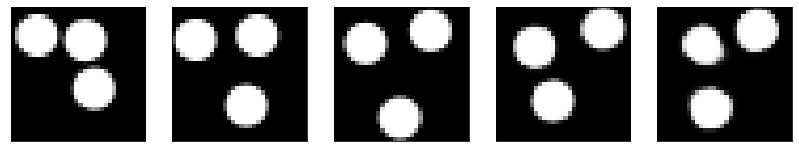

GD iterations:
i=0 | err=55.030212
i=1 | err=53.827438
i=2 | err=52.173317
i=3 | err=50.446350
i=4 | err=48.514458
i=5 | err=46.545303
i=6 | err=44.495667
i=7 | err=42.283352
i=8 | err=39.963585
i=9 | err=37.485901
i=10 | err=35.022339
i=11 | err=32.592842
i=12 | err=30.119183
i=13 | err=27.790134
i=14 | err=25.543797
i=15 | err=23.364746
i=16 | err=21.400358
i=17 | err=19.582962
i=18 | err=17.900972
i=19 | err=16.332043
i=20 | err=14.855577
i=21 | err=13.541784
i=22 | err=12.341373
i=23 | err=11.242088
i=24 | err=10.218716
i=25 | err=9.269238
i=26 | err=8.382729
i=27 | err=7.520161
i=28 | err=6.710038
i=29 | err=6.001605
Epoch=253 (46%) | out_positive=0.842170 | out_negative=0.168705 | mse=0.069386


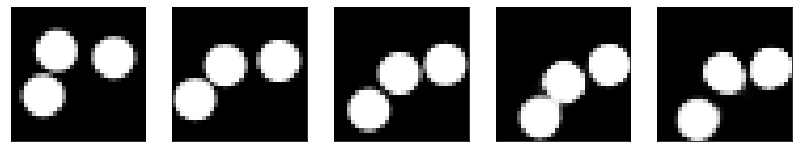

GD iterations:
i=0 | err=55.282875
i=1 | err=54.168465
i=2 | err=52.734825
i=3 | err=51.116119
i=4 | err=49.391624
i=5 | err=47.544979
i=6 | err=45.476959
i=7 | err=43.302563
i=8 | err=40.955761
i=9 | err=38.649052
i=10 | err=36.324768
i=11 | err=34.053246
i=12 | err=31.823742
i=13 | err=29.638199
i=14 | err=27.513723
i=15 | err=25.507839
i=16 | err=23.645790
i=17 | err=21.862728
i=18 | err=20.210194
i=19 | err=18.625404
i=20 | err=17.140648
i=21 | err=15.743582
i=22 | err=14.432054
i=23 | err=13.204214
i=24 | err=11.954508
i=25 | err=10.775922
i=26 | err=9.649734
i=27 | err=8.634199
i=28 | err=7.717469
i=29 | err=6.852380
Epoch=253 (48%) | out_positive=0.916384 | out_negative=0.148781 | mse=0.071528


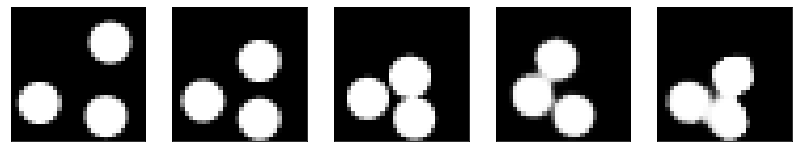

GD iterations:
i=0 | err=51.262108
i=1 | err=50.125393
i=2 | err=48.546402
i=3 | err=46.804134
i=4 | err=44.911530
i=5 | err=42.923019
i=6 | err=40.872372
i=7 | err=38.793716
i=8 | err=36.631393
i=9 | err=34.363373
i=10 | err=32.042973
i=11 | err=29.847534
i=12 | err=27.770407
i=13 | err=25.711525
i=14 | err=23.706282
i=15 | err=21.794226
i=16 | err=20.005253
i=17 | err=18.367825
i=18 | err=16.915401
i=19 | err=15.554962
i=20 | err=14.294588
i=21 | err=13.075407
i=22 | err=11.929531
i=23 | err=10.844050
i=24 | err=9.836697
i=25 | err=8.842619
i=26 | err=7.939725
i=27 | err=7.131269
i=28 | err=6.381373
i=29 | err=5.677222
Epoch=253 (50%) | out_positive=0.951473 | out_negative=0.168006 | mse=0.072383


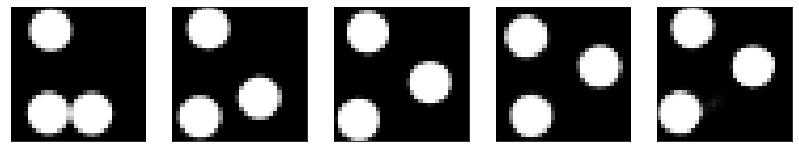

GD iterations:
i=0 | err=55.164108
i=1 | err=53.941521
i=2 | err=52.224487
i=3 | err=50.315475
i=4 | err=48.303261
i=5 | err=46.150318
i=6 | err=44.017113
i=7 | err=41.844513
i=8 | err=39.697014
i=9 | err=37.524818
i=10 | err=35.446144
i=11 | err=33.354362
i=12 | err=31.323059
i=13 | err=29.291229
i=14 | err=27.318727
i=15 | err=25.446199
i=16 | err=23.685394
i=17 | err=21.967949
i=18 | err=20.326637
i=19 | err=18.748249
i=20 | err=17.229534
i=21 | err=15.809443
i=22 | err=14.527611
i=23 | err=13.334287
i=24 | err=12.228512
i=25 | err=11.245951
i=26 | err=10.307512
i=27 | err=9.447709
i=28 | err=8.617382
i=29 | err=7.813797
Epoch=253 (51%) | out_positive=0.851060 | out_negative=0.078864 | mse=0.075087


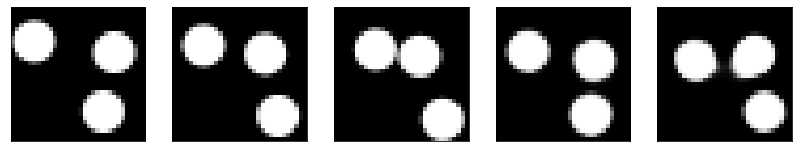

GD iterations:
i=0 | err=58.153542
i=1 | err=57.001228
i=2 | err=55.407146
i=3 | err=53.619984
i=4 | err=51.718975
i=5 | err=49.688377
i=6 | err=47.477409
i=7 | err=45.233681
i=8 | err=42.906876
i=9 | err=40.530289
i=10 | err=38.134842
i=11 | err=35.795643
i=12 | err=33.479103
i=13 | err=31.191673
i=14 | err=28.975477
i=15 | err=26.777107
i=16 | err=24.699459
i=17 | err=22.735868
i=18 | err=20.878471
i=19 | err=19.162331
i=20 | err=17.510935
i=21 | err=15.941440
i=22 | err=14.511433
i=23 | err=13.191320
i=24 | err=11.968769
i=25 | err=10.877342
i=26 | err=9.853361
i=27 | err=8.908679
i=28 | err=8.023743
i=29 | err=7.172990
Epoch=253 (53%) | out_positive=0.888793 | out_negative=0.133837 | mse=0.077640


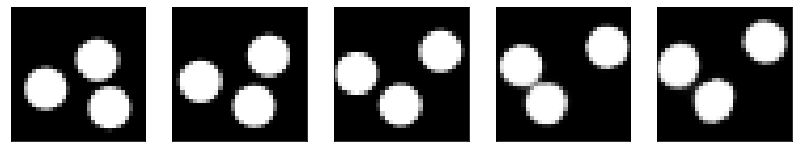

GD iterations:
i=0 | err=48.394772
i=1 | err=47.215954
i=2 | err=45.627853
i=3 | err=43.925098
i=4 | err=42.117035
i=5 | err=40.211555
i=6 | err=38.223061
i=7 | err=36.272034
i=8 | err=34.339844
i=9 | err=32.375603
i=10 | err=30.456196
i=11 | err=28.547321
i=12 | err=26.683247
i=13 | err=24.894070
i=14 | err=23.161751
i=15 | err=21.541187
i=16 | err=20.000889
i=17 | err=18.559498
i=18 | err=17.235390
i=19 | err=16.021374
i=20 | err=14.841292
i=21 | err=13.734106
i=22 | err=12.697008
i=23 | err=11.733761
i=24 | err=10.811934
i=25 | err=9.946497
i=26 | err=9.158123
i=27 | err=8.420090
i=28 | err=7.716311
i=29 | err=7.025640
Epoch=253 (55%) | out_positive=0.919597 | out_negative=0.115974 | mse=0.069256


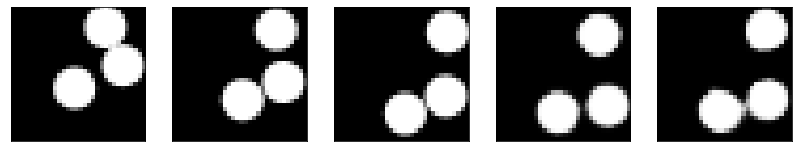

GD iterations:
i=0 | err=55.540932
i=1 | err=54.361412
i=2 | err=52.803684
i=3 | err=51.039772
i=4 | err=49.203194
i=5 | err=47.321167
i=6 | err=45.400627
i=7 | err=43.431854
i=8 | err=41.376072
i=9 | err=39.252445
i=10 | err=36.969650
i=11 | err=34.591976
i=12 | err=32.225491
i=13 | err=30.006390
i=14 | err=27.863468
i=15 | err=25.764553
i=16 | err=23.757278
i=17 | err=21.903698
i=18 | err=20.224277
i=19 | err=18.658585
i=20 | err=17.260296
i=21 | err=15.950008
i=22 | err=14.703091
i=23 | err=13.513364
i=24 | err=12.375322
i=25 | err=11.306227
i=26 | err=10.322281
i=27 | err=9.436283
i=28 | err=8.621977
i=29 | err=7.843205
Epoch=253 (57%) | out_positive=0.840795 | out_negative=0.105090 | mse=0.075065


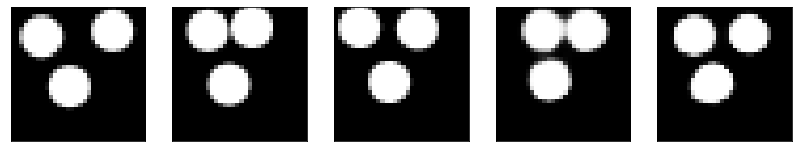

GD iterations:
i=0 | err=55.201473
i=1 | err=53.998295
i=2 | err=52.403904
i=3 | err=50.540199
i=4 | err=48.516281
i=5 | err=46.297436
i=6 | err=44.005745
i=7 | err=41.700432
i=8 | err=39.339478
i=9 | err=36.986588
i=10 | err=34.751907
i=11 | err=32.481544
i=12 | err=30.255800
i=13 | err=28.119564
i=14 | err=25.982912
i=15 | err=24.041445
i=16 | err=22.198563
i=17 | err=20.448685
i=18 | err=18.855272
i=19 | err=17.372793
i=20 | err=15.989429
i=21 | err=14.692343
i=22 | err=13.488739
i=23 | err=12.404724
i=24 | err=11.419058
i=25 | err=10.471551
i=26 | err=9.586241
i=27 | err=8.744478
i=28 | err=7.957655
i=29 | err=7.208634
Epoch=253 (59%) | out_positive=0.862382 | out_negative=0.113406 | mse=0.070800


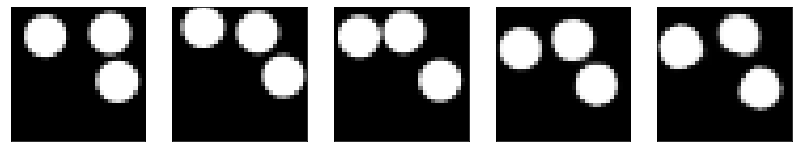

GD iterations:
i=0 | err=54.024750
i=1 | err=52.826370
i=2 | err=51.239746
i=3 | err=49.387932
i=4 | err=47.446556
i=5 | err=45.308281
i=6 | err=43.002769
i=7 | err=40.692673
i=8 | err=38.265400
i=9 | err=35.785583
i=10 | err=33.358696
i=11 | err=31.063751
i=12 | err=28.849756
i=13 | err=26.682501
i=14 | err=24.546492
i=15 | err=22.586334
i=16 | err=20.806046
i=17 | err=19.110455
i=18 | err=17.481522
i=19 | err=15.945222
i=20 | err=14.569304
i=21 | err=13.322235
i=22 | err=12.177984
i=23 | err=11.093336
i=24 | err=10.068472
i=25 | err=9.051355
i=26 | err=8.091816
i=27 | err=7.167931
i=28 | err=6.347894
i=29 | err=5.573607
Epoch=253 (61%) | out_positive=0.902233 | out_negative=0.160125 | mse=0.068580


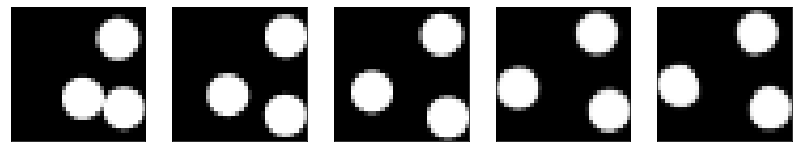

GD iterations:
i=0 | err=53.665836
i=1 | err=52.499832
i=2 | err=50.855133
i=3 | err=49.020351
i=4 | err=47.108963
i=5 | err=45.068356
i=6 | err=43.034119
i=7 | err=41.002289
i=8 | err=38.822487
i=9 | err=36.567074
i=10 | err=34.326675
i=11 | err=32.069595
i=12 | err=29.836269
i=13 | err=27.637875
i=14 | err=25.583889
i=15 | err=23.635073
i=16 | err=21.819004
i=17 | err=20.061478
i=18 | err=18.445992
i=19 | err=16.975025
i=20 | err=15.528593
i=21 | err=14.156541
i=22 | err=12.914310
i=23 | err=11.744852
i=24 | err=10.640739
i=25 | err=9.648099
i=26 | err=8.717384
i=27 | err=7.834579
i=28 | err=6.997684
i=29 | err=6.200832
Epoch=253 (62%) | out_positive=0.895579 | out_negative=0.180415 | mse=0.071424


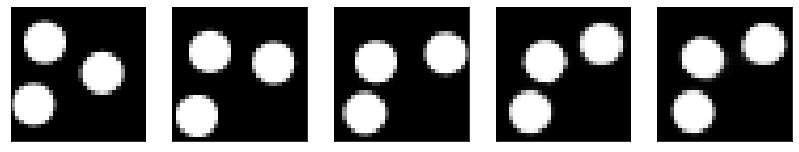

GD iterations:
i=0 | err=53.113625
i=1 | err=51.873333
i=2 | err=50.165295
i=3 | err=48.200439
i=4 | err=46.240189
i=5 | err=44.194981
i=6 | err=42.093521
i=7 | err=39.910572
i=8 | err=37.739594
i=9 | err=35.535923
i=10 | err=33.386955
i=11 | err=31.265249
i=12 | err=29.288309
i=13 | err=27.367481
i=14 | err=25.552313
i=15 | err=23.834179
i=16 | err=22.182827
i=17 | err=20.596241
i=18 | err=18.994926
i=19 | err=17.485405
i=20 | err=16.117252
i=21 | err=14.862441
i=22 | err=13.710461
i=23 | err=12.649607
i=24 | err=11.625531
i=25 | err=10.670114
i=26 | err=9.795264
i=27 | err=8.967047
i=28 | err=8.176017
i=29 | err=7.442019
Epoch=253 (64%) | out_positive=0.903482 | out_negative=0.107420 | mse=0.075323


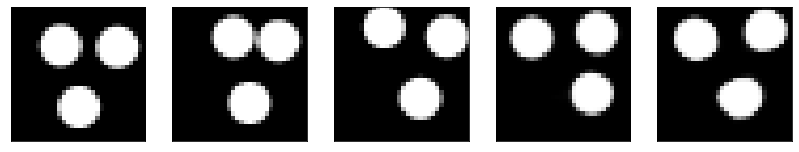

GD iterations:
i=0 | err=53.331612
i=1 | err=52.189682
i=2 | err=50.579262
i=3 | err=48.811584
i=4 | err=46.906658
i=5 | err=44.841534
i=6 | err=42.699879
i=7 | err=40.450592
i=8 | err=38.138649
i=9 | err=35.796379
i=10 | err=33.482109
i=11 | err=31.244465
i=12 | err=28.926146
i=13 | err=26.712156
i=14 | err=24.648640
i=15 | err=22.654675
i=16 | err=20.858221
i=17 | err=19.167362
i=18 | err=17.570101
i=19 | err=16.103941
i=20 | err=14.757086
i=21 | err=13.521561
i=22 | err=12.297818
i=23 | err=11.126682
i=24 | err=10.042801
i=25 | err=9.051462
i=26 | err=8.126347
i=27 | err=7.266135
i=28 | err=6.474084
i=29 | err=5.747602
Epoch=253 (66%) | out_positive=0.889335 | out_negative=0.153275 | mse=0.068172


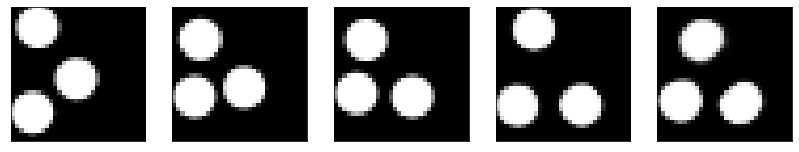

GD iterations:
i=0 | err=54.907921
i=1 | err=53.732750
i=2 | err=52.127708
i=3 | err=50.337921
i=4 | err=48.420593
i=5 | err=46.393459
i=6 | err=44.359898
i=7 | err=42.223427
i=8 | err=40.115417
i=9 | err=38.050888
i=10 | err=35.951302
i=11 | err=33.843369
i=12 | err=31.739447
i=13 | err=29.673771
i=14 | err=27.572445
i=15 | err=25.540052
i=16 | err=23.642090
i=17 | err=21.818563
i=18 | err=20.146420
i=19 | err=18.549047
i=20 | err=17.033567
i=21 | err=15.656058
i=22 | err=14.344923
i=23 | err=13.113739
i=24 | err=11.947979
i=25 | err=10.880466
i=26 | err=9.892418
i=27 | err=8.952181
i=28 | err=8.060883
i=29 | err=7.215757
Epoch=253 (68%) | out_positive=0.819630 | out_negative=0.158198 | mse=0.069715


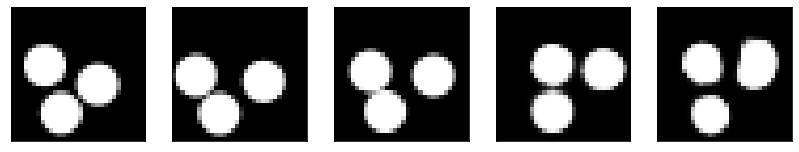

GD iterations:
i=0 | err=55.820778
i=1 | err=54.563374
i=2 | err=52.747459
i=3 | err=50.704086
i=4 | err=48.476131
i=5 | err=46.092613
i=6 | err=43.618053
i=7 | err=41.107399
i=8 | err=38.611488
i=9 | err=36.199074
i=10 | err=33.805183
i=11 | err=31.553373
i=12 | err=29.494038
i=13 | err=27.530952
i=14 | err=25.726192
i=15 | err=23.950552
i=16 | err=22.232395
i=17 | err=20.593428
i=18 | err=19.045137
i=19 | err=17.572876
i=20 | err=16.139118
i=21 | err=14.713374
i=22 | err=13.378461
i=23 | err=12.123154
i=24 | err=10.935663
i=25 | err=9.842175
i=26 | err=8.834576
i=27 | err=7.878124
i=28 | err=6.977433
i=29 | err=6.134659
Epoch=253 (70%) | out_positive=0.874055 | out_negative=0.122869 | mse=0.070465


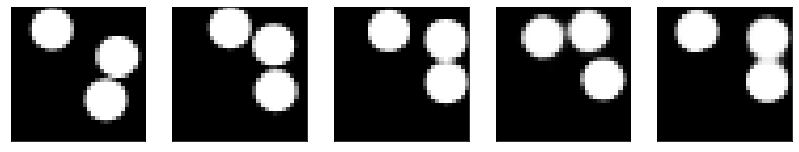

GD iterations:
i=0 | err=49.201591
i=1 | err=47.956329
i=2 | err=46.210674
i=3 | err=44.283585
i=4 | err=42.300095
i=5 | err=40.273560
i=6 | err=38.258266
i=7 | err=36.182846
i=8 | err=34.063240
i=9 | err=31.936241
i=10 | err=29.859333
i=11 | err=27.801868
i=12 | err=25.816750
i=13 | err=23.865410
i=14 | err=22.001198
i=15 | err=20.333067
i=16 | err=18.789211
i=17 | err=17.393375
i=18 | err=16.133980
i=19 | err=14.995512
i=20 | err=13.925699
i=21 | err=12.917377
i=22 | err=11.961025
i=23 | err=11.082033
i=24 | err=10.267033
i=25 | err=9.463150
i=26 | err=8.718119
i=27 | err=7.998868
i=28 | err=7.297995
i=29 | err=6.630846
Epoch=253 (72%) | out_positive=0.939012 | out_negative=0.119877 | mse=0.070458


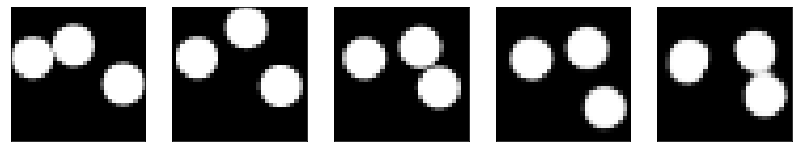

GD iterations:
i=0 | err=57.481956
i=1 | err=56.311707
i=2 | err=54.753769
i=3 | err=52.948532
i=4 | err=50.994408
i=5 | err=48.892025
i=6 | err=46.753445
i=7 | err=44.540504
i=8 | err=42.352608
i=9 | err=40.050503
i=10 | err=37.665398
i=11 | err=35.171875
i=12 | err=32.726730
i=13 | err=30.324257
i=14 | err=27.997097
i=15 | err=25.777149
i=16 | err=23.677801
i=17 | err=21.685764
i=18 | err=19.856930
i=19 | err=18.259377
i=20 | err=16.821701
i=21 | err=15.464596
i=22 | err=14.205197
i=23 | err=13.076956
i=24 | err=12.052692
i=25 | err=11.063915
i=26 | err=10.106606
i=27 | err=9.181982
i=28 | err=8.310953
i=29 | err=7.470193
Epoch=253 (74%) | out_positive=0.813998 | out_negative=0.117105 | mse=0.069275


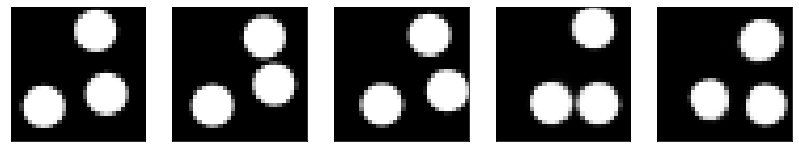

GD iterations:
i=0 | err=53.804565
i=1 | err=52.657883
i=2 | err=51.117352
i=3 | err=49.353790
i=4 | err=47.483536
i=5 | err=45.508209
i=6 | err=43.469662
i=7 | err=41.308041
i=8 | err=39.017902
i=9 | err=36.724297
i=10 | err=34.348686
i=11 | err=31.965635
i=12 | err=29.591673
i=13 | err=27.308619
i=14 | err=25.192085
i=15 | err=23.161514
i=16 | err=21.232269
i=17 | err=19.450043
i=18 | err=17.803978
i=19 | err=16.263105
i=20 | err=14.812341
i=21 | err=13.485355
i=22 | err=12.272552
i=23 | err=11.169193
i=24 | err=10.151212
i=25 | err=9.231508
i=26 | err=8.354183
i=27 | err=7.555447
i=28 | err=6.775158
i=29 | err=6.052710
Epoch=253 (75%) | out_positive=0.825462 | out_negative=0.137285 | mse=0.069628


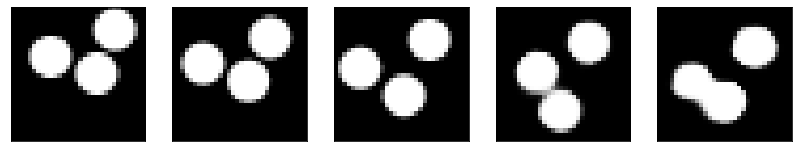

GD iterations:
i=0 | err=50.073418
i=1 | err=49.032246
i=2 | err=47.606400
i=3 | err=45.961815
i=4 | err=44.247841
i=5 | err=42.485634
i=6 | err=40.552769
i=7 | err=38.525738
i=8 | err=36.451515
i=9 | err=34.331303
i=10 | err=32.240879
i=11 | err=30.240055
i=12 | err=28.279539
i=13 | err=26.367378
i=14 | err=24.486933
i=15 | err=22.647820
i=16 | err=20.837320
i=17 | err=19.124573
i=18 | err=17.561850
i=19 | err=16.096310
i=20 | err=14.802519
i=21 | err=13.595673
i=22 | err=12.442977
i=23 | err=11.382095
i=24 | err=10.420689
i=25 | err=9.534912
i=26 | err=8.728922
i=27 | err=7.956463
i=28 | err=7.225288
i=29 | err=6.522797
Epoch=253 (77%) | out_positive=0.917842 | out_negative=0.090370 | mse=0.069581


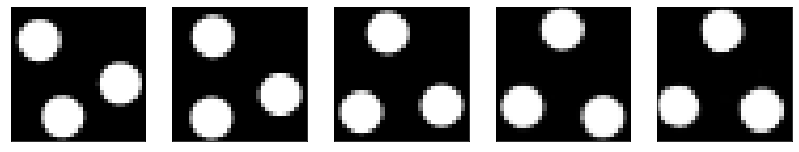

GD iterations:
i=0 | err=56.879665
i=1 | err=55.635921
i=2 | err=53.879887
i=3 | err=51.875549
i=4 | err=49.828682
i=5 | err=47.725761
i=6 | err=45.575119
i=7 | err=43.316658
i=8 | err=41.000408
i=9 | err=38.688927
i=10 | err=36.481079
i=11 | err=34.268997
i=12 | err=32.131493
i=13 | err=30.049969
i=14 | err=27.968132
i=15 | err=25.966156
i=16 | err=24.118755
i=17 | err=22.327477
i=18 | err=20.643429
i=19 | err=19.063803
i=20 | err=17.603567
i=21 | err=16.237633
i=22 | err=14.957587
i=23 | err=13.752625
i=24 | err=12.603162
i=25 | err=11.498303
i=26 | err=10.475340
i=27 | err=9.527152
i=28 | err=8.616913
i=29 | err=7.771294
Epoch=253 (79%) | out_positive=0.797450 | out_negative=0.086186 | mse=0.074525


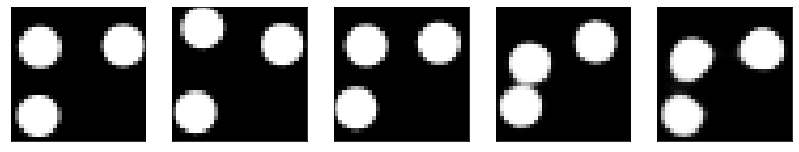

GD iterations:
i=0 | err=55.158054
i=1 | err=54.025101
i=2 | err=52.510536
i=3 | err=50.905579
i=4 | err=49.194183
i=5 | err=47.335358
i=6 | err=45.350647
i=7 | err=43.310604
i=8 | err=41.203793
i=9 | err=39.088306
i=10 | err=36.940994
i=11 | err=34.807983
i=12 | err=32.629818
i=13 | err=30.518240
i=14 | err=28.410942
i=15 | err=26.444212
i=16 | err=24.554558
i=17 | err=22.707905
i=18 | err=20.825413
i=19 | err=19.055065
i=20 | err=17.382133
i=21 | err=15.857233
i=22 | err=14.447219
i=23 | err=13.149162
i=24 | err=11.928919
i=25 | err=10.798723
i=26 | err=9.758721
i=27 | err=8.811971
i=28 | err=7.897546
i=29 | err=7.045126
Epoch=253 (81%) | out_positive=0.837246 | out_negative=0.120179 | mse=0.075894


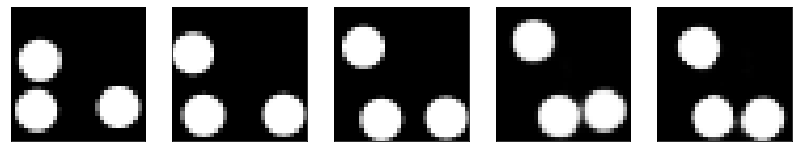

GD iterations:
i=0 | err=50.601574
i=1 | err=49.492363
i=2 | err=47.972748
i=3 | err=46.274380
i=4 | err=44.463989
i=5 | err=42.628952
i=6 | err=40.795197
i=7 | err=38.953735
i=8 | err=37.100075
i=9 | err=35.154152
i=10 | err=33.224171
i=11 | err=31.280182
i=12 | err=29.364832
i=13 | err=27.505074
i=14 | err=25.700001
i=15 | err=23.959799
i=16 | err=22.311186
i=17 | err=20.770184
i=18 | err=19.342617
i=19 | err=18.026886
i=20 | err=16.796814
i=21 | err=15.638991
i=22 | err=14.525550
i=23 | err=13.453459
i=24 | err=12.459725
i=25 | err=11.549414
i=26 | err=10.673582
i=27 | err=9.821242
i=28 | err=9.035937
i=29 | err=8.309894
Epoch=253 (82%) | out_positive=0.893880 | out_negative=0.097994 | mse=0.074611


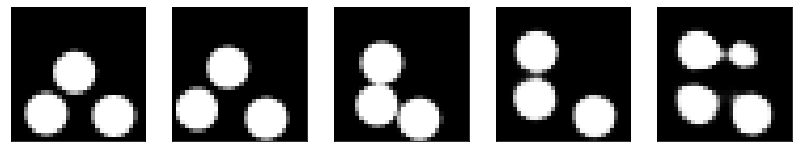

GD iterations:
i=0 | err=57.406624
i=1 | err=56.232967
i=2 | err=54.681362
i=3 | err=52.963722
i=4 | err=51.188911
i=5 | err=49.306801
i=6 | err=47.341969
i=7 | err=45.226604
i=8 | err=42.973850
i=9 | err=40.611824
i=10 | err=38.257408
i=11 | err=35.916115
i=12 | err=33.602848
i=13 | err=31.306519
i=14 | err=29.064869
i=15 | err=26.879131
i=16 | err=24.753635
i=17 | err=22.747665
i=18 | err=20.863083
i=19 | err=19.204090
i=20 | err=17.747398
i=21 | err=16.408794
i=22 | err=15.180521
i=23 | err=14.020464
i=24 | err=12.912780
i=25 | err=11.863630
i=26 | err=10.922899
i=27 | err=10.057594
i=28 | err=9.256011
i=29 | err=8.494184
Epoch=253 (84%) | out_positive=0.808259 | out_negative=0.089879 | mse=0.075423


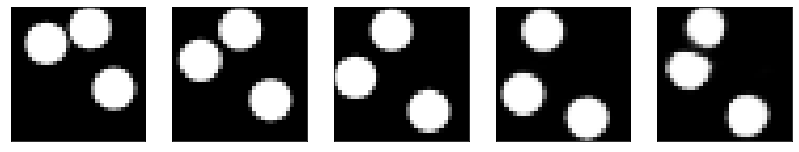

GD iterations:
i=0 | err=56.815620
i=1 | err=55.639908
i=2 | err=54.048050
i=3 | err=52.154690
i=4 | err=50.057316
i=5 | err=47.940487
i=6 | err=45.771507
i=7 | err=43.484577
i=8 | err=41.097610
i=9 | err=38.676643
i=10 | err=36.273209
i=11 | err=33.950600
i=12 | err=31.665363
i=13 | err=29.439388
i=14 | err=27.344326
i=15 | err=25.340933
i=16 | err=23.431313
i=17 | err=21.564764
i=18 | err=19.805494
i=19 | err=18.153757
i=20 | err=16.559978
i=21 | err=15.187347
i=22 | err=13.951548
i=23 | err=12.833154
i=24 | err=11.774077
i=25 | err=10.739065
i=26 | err=9.784925
i=27 | err=8.880343
i=28 | err=8.043137
i=29 | err=7.238134
Epoch=253 (86%) | out_positive=0.850183 | out_negative=0.105930 | mse=0.071925


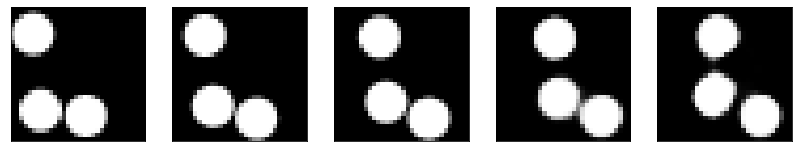

GD iterations:
i=0 | err=56.071289
i=1 | err=54.831810
i=2 | err=53.107635
i=3 | err=51.186825
i=4 | err=49.158627
i=5 | err=47.064720
i=6 | err=44.911697
i=7 | err=42.701252
i=8 | err=40.431396
i=9 | err=38.166351
i=10 | err=35.986973
i=11 | err=33.913078
i=12 | err=31.744980
i=13 | err=29.759468
i=14 | err=27.796097
i=15 | err=25.858538
i=16 | err=23.934084
i=17 | err=22.046888
i=18 | err=20.230339
i=19 | err=18.623684
i=20 | err=17.108170
i=21 | err=15.687744
i=22 | err=14.396004
i=23 | err=13.216660
i=24 | err=12.055120
i=25 | err=10.977760
i=26 | err=9.977843
i=27 | err=9.084192
i=28 | err=8.236029
i=29 | err=7.456485
Epoch=253 (88%) | out_positive=0.832389 | out_negative=0.078212 | mse=0.075104


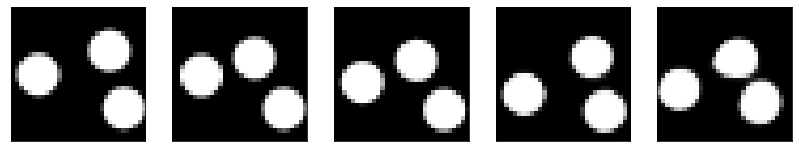

GD iterations:
i=0 | err=57.561050
i=1 | err=56.446980
i=2 | err=54.838470
i=3 | err=53.041481
i=4 | err=51.095490
i=5 | err=49.077728
i=6 | err=46.900829
i=7 | err=44.621948
i=8 | err=42.280193
i=9 | err=39.883965
i=10 | err=37.497959
i=11 | err=35.211250
i=12 | err=32.830650
i=13 | err=30.604887
i=14 | err=28.463608
i=15 | err=26.357977
i=16 | err=24.300936
i=17 | err=22.341278
i=18 | err=20.521116
i=19 | err=18.876713
i=20 | err=17.344112
i=21 | err=15.881757
i=22 | err=14.524651
i=23 | err=13.284931
i=24 | err=12.163622
i=25 | err=11.117357
i=26 | err=10.120104
i=27 | err=9.143999
i=28 | err=8.225693
i=29 | err=7.376274
Epoch=253 (90%) | out_positive=0.857469 | out_negative=0.147952 | mse=0.079926


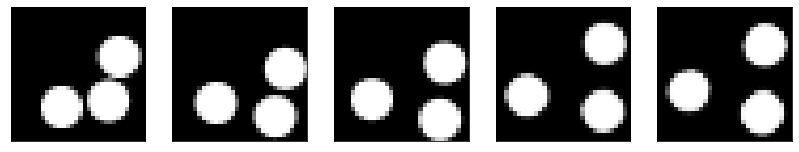

GD iterations:
i=0 | err=50.589939
i=1 | err=49.368874
i=2 | err=47.745346
i=3 | err=45.906818
i=4 | err=44.009693
i=5 | err=42.014320
i=6 | err=39.992935
i=7 | err=38.020042
i=8 | err=35.995110
i=9 | err=33.909012
i=10 | err=31.793661
i=11 | err=29.736320
i=12 | err=27.654556
i=13 | err=25.616053
i=14 | err=23.640543
i=15 | err=21.719864
i=16 | err=19.901604
i=17 | err=18.209524
i=18 | err=16.624006
i=19 | err=15.185240
i=20 | err=13.837792
i=21 | err=12.570430
i=22 | err=11.425705
i=23 | err=10.389704
i=24 | err=9.409647
i=25 | err=8.530712
i=26 | err=7.711110
i=27 | err=6.955260
i=28 | err=6.238242
i=29 | err=5.573264
Epoch=253 (92%) | out_positive=0.902214 | out_negative=0.169336 | mse=0.063397


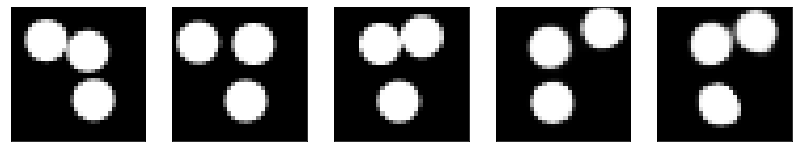

GD iterations:
i=0 | err=52.186726
i=1 | err=51.090919
i=2 | err=49.592827
i=3 | err=47.914925
i=4 | err=46.098202
i=5 | err=44.211014
i=6 | err=42.210640
i=7 | err=40.147877
i=8 | err=38.069191
i=9 | err=36.018044
i=10 | err=33.890640
i=11 | err=31.781813
i=12 | err=29.690311
i=13 | err=27.655918
i=14 | err=25.748238
i=15 | err=23.907082
i=16 | err=22.129585
i=17 | err=20.447918
i=18 | err=18.846699
i=19 | err=17.365507
i=20 | err=15.983828
i=21 | err=14.689463
i=22 | err=13.497894
i=23 | err=12.415654
i=24 | err=11.414715
i=25 | err=10.454517
i=26 | err=9.560413
i=27 | err=8.714097
i=28 | err=7.916948
i=29 | err=7.122335
Epoch=253 (93%) | out_positive=0.841000 | out_negative=0.131379 | mse=0.069810


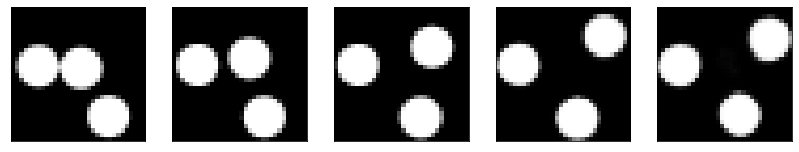

GD iterations:
i=0 | err=50.558769
i=1 | err=49.336357
i=2 | err=47.645462
i=3 | err=45.824722
i=4 | err=43.836243
i=5 | err=41.817638
i=6 | err=39.711838
i=7 | err=37.576569
i=8 | err=35.522686
i=9 | err=33.481796
i=10 | err=31.465897
i=11 | err=29.517048
i=12 | err=27.697811
i=13 | err=25.952360
i=14 | err=24.271309
i=15 | err=22.650414
i=16 | err=21.092018
i=17 | err=19.625956
i=18 | err=18.224968
i=19 | err=16.861507
i=20 | err=15.563375
i=21 | err=14.393867
i=22 | err=13.260096
i=23 | err=12.153510
i=24 | err=11.101118
i=25 | err=10.131910
i=26 | err=9.225780
i=27 | err=8.387592
i=28 | err=7.595446
i=29 | err=6.840247
Epoch=253 (95%) | out_positive=0.901642 | out_negative=0.142213 | mse=0.067721


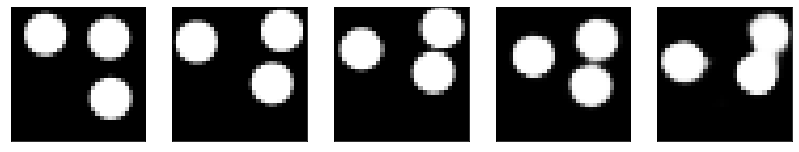

GD iterations:
i=0 | err=51.970589
i=1 | err=50.814415
i=2 | err=49.260643
i=3 | err=47.499699
i=4 | err=45.650009
i=5 | err=43.707008
i=6 | err=41.706161
i=7 | err=39.647118
i=8 | err=37.483036
i=9 | err=35.278103
i=10 | err=33.136475
i=11 | err=30.994858
i=12 | err=28.859718
i=13 | err=26.786489
i=14 | err=24.807556
i=15 | err=22.995119
i=16 | err=21.273809
i=17 | err=19.612959
i=18 | err=18.076080
i=19 | err=16.648716
i=20 | err=15.317163
i=21 | err=14.015347
i=22 | err=12.789757
i=23 | err=11.605185
i=24 | err=10.516203
i=25 | err=9.506752
i=26 | err=8.572767
i=27 | err=7.694698
i=28 | err=6.865971
i=29 | err=6.111210
Epoch=253 (97%) | out_positive=0.882617 | out_negative=0.161783 | mse=0.067703


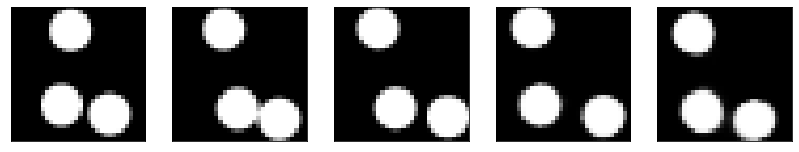

GD iterations:
i=0 | err=55.133728
i=1 | err=54.024864
i=2 | err=52.518730
i=3 | err=50.827671
i=4 | err=49.061810
i=5 | err=47.286789
i=6 | err=45.387222
i=7 | err=43.415016
i=8 | err=41.372238
i=9 | err=39.273422
i=10 | err=37.195869
i=11 | err=35.037933
i=12 | err=32.829674
i=13 | err=30.675001
i=14 | err=28.579477
i=15 | err=26.555666
i=16 | err=24.573509
i=17 | err=22.659496
i=18 | err=20.823393
i=19 | err=19.112034
i=20 | err=17.496655
i=21 | err=16.025242
i=22 | err=14.696065
i=23 | err=13.444607
i=24 | err=12.248804
i=25 | err=11.144260
i=26 | err=10.111679
i=27 | err=9.189632
i=28 | err=8.307313
i=29 | err=7.472478
Epoch=253 (99%) | out_positive=0.871791 | out_negative=0.086465 | mse=0.073545


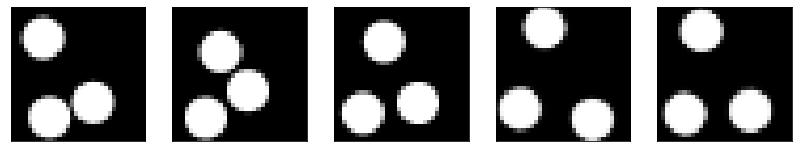

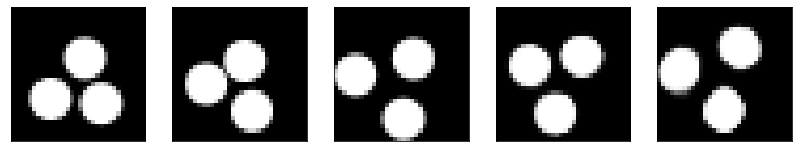

Test MSE 0.078855


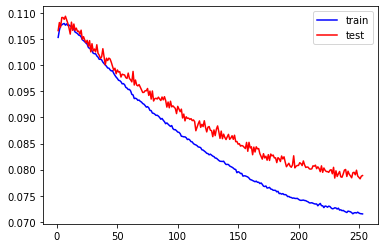

GD iterations:
i=0 | err=55.605690
i=1 | err=54.465725
i=2 | err=52.889118
i=3 | err=51.139343
i=4 | err=49.323620
i=5 | err=47.506699
i=6 | err=45.592667
i=7 | err=43.648018
i=8 | err=41.627991
i=9 | err=39.559135
i=10 | err=37.467598
i=11 | err=35.298805
i=12 | err=33.063400
i=13 | err=30.892262
i=14 | err=28.805658
i=15 | err=26.818398
i=16 | err=24.864956
i=17 | err=23.040943
i=18 | err=21.354015
i=19 | err=19.780853
i=20 | err=18.295971
i=21 | err=16.942881
i=22 | err=15.666694
i=23 | err=14.493759
i=24 | err=13.384563
i=25 | err=12.370769
i=26 | err=11.422476
i=27 | err=10.541620
i=28 | err=9.701671
i=29 | err=8.889349
Epoch=254 (0%) | out_positive=0.791504 | out_negative=0.082971 | mse=0.072386


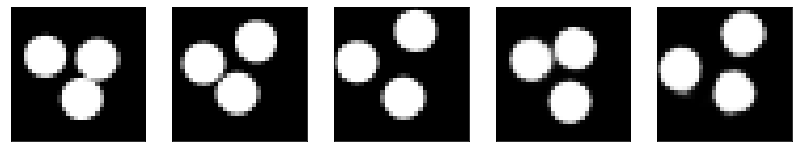

GD iterations:
i=0 | err=55.346058
i=1 | err=54.150154
i=2 | err=52.475746
i=3 | err=50.624626
i=4 | err=48.730671
i=5 | err=46.697914
i=6 | err=44.620918
i=7 | err=42.550507
i=8 | err=40.359238
i=9 | err=38.116726
i=10 | err=35.880684
i=11 | err=33.593124
i=12 | err=31.312565
i=13 | err=28.988850
i=14 | err=26.717388
i=15 | err=24.639294
i=16 | err=22.703480
i=17 | err=20.921122
i=18 | err=19.250702
i=19 | err=17.648157
i=20 | err=16.080023
i=21 | err=14.578463
i=22 | err=13.193027
i=23 | err=11.919800
i=24 | err=10.790990
i=25 | err=9.751280
i=26 | err=8.810136
i=27 | err=7.934958
i=28 | err=7.120067
i=29 | err=6.328775
Epoch=254 (2%) | out_positive=0.840066 | out_negative=0.134165 | mse=0.071687


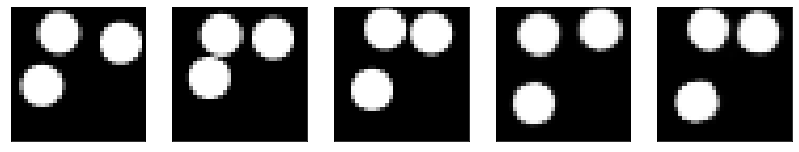

GD iterations:
i=0 | err=54.852119
i=1 | err=53.640011
i=2 | err=51.941700
i=3 | err=50.085640
i=4 | err=48.051033
i=5 | err=45.884113
i=6 | err=43.634888
i=7 | err=41.387573
i=8 | err=39.123322
i=9 | err=36.950989
i=10 | err=34.718277
i=11 | err=32.544186
i=12 | err=30.443329
i=13 | err=28.486149
i=14 | err=26.646332
i=15 | err=24.896614
i=16 | err=23.226198
i=17 | err=21.612818
i=18 | err=20.065632
i=19 | err=18.602055
i=20 | err=17.217171
i=21 | err=15.903683
i=22 | err=14.629831
i=23 | err=13.390129
i=24 | err=12.216001
i=25 | err=11.118717
i=26 | err=10.093204
i=27 | err=9.146732
i=28 | err=8.240140
i=29 | err=7.412938
Epoch=254 (4%) | out_positive=0.881684 | out_negative=0.098682 | mse=0.077336


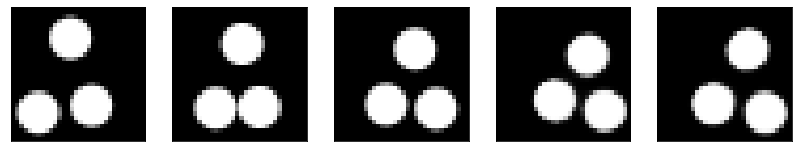

GD iterations:
i=0 | err=52.733429
i=1 | err=51.507141
i=2 | err=49.825134
i=3 | err=48.034363
i=4 | err=46.173004
i=5 | err=44.202011
i=6 | err=42.084129
i=7 | err=39.882236
i=8 | err=37.575691
i=9 | err=35.256134
i=10 | err=33.016582
i=11 | err=30.873684
i=12 | err=28.859352
i=13 | err=26.903378
i=14 | err=24.997738
i=15 | err=23.154129
i=16 | err=21.396658
i=17 | err=19.733730
i=18 | err=18.166370
i=19 | err=16.707655
i=20 | err=15.383569
i=21 | err=14.073664
i=22 | err=12.842202
i=23 | err=11.644583
i=24 | err=10.592294
i=25 | err=9.623392
i=26 | err=8.735987
i=27 | err=7.916238
i=28 | err=7.180167
i=29 | err=6.481447
Epoch=254 (6%) | out_positive=0.909495 | out_negative=0.139898 | mse=0.071646


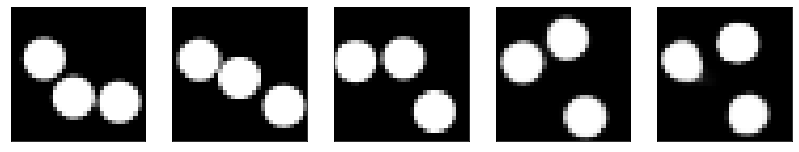

GD iterations:
i=0 | err=54.101429
i=1 | err=52.947361
i=2 | err=51.465088
i=3 | err=49.761215
i=4 | err=47.918205
i=5 | err=45.959846
i=6 | err=43.876781
i=7 | err=41.684555
i=8 | err=39.417324
i=9 | err=37.014957
i=10 | err=34.678085
i=11 | err=32.357563
i=12 | err=30.088852
i=13 | err=27.830063
i=14 | err=25.658020
i=15 | err=23.586491
i=16 | err=21.618462
i=17 | err=19.782452
i=18 | err=18.082090
i=19 | err=16.399517
i=20 | err=14.872418
i=21 | err=13.477904
i=22 | err=12.199458
i=23 | err=11.067315
i=24 | err=10.028202
i=25 | err=9.047647
i=26 | err=8.165687
i=27 | err=7.338446
i=28 | err=6.562867
i=29 | err=5.832793
Epoch=254 (8%) | out_positive=0.912658 | out_negative=0.174325 | mse=0.071341


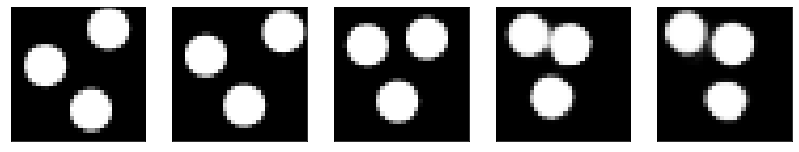

GD iterations:
i=0 | err=55.941338
i=1 | err=54.769073
i=2 | err=53.153229
i=3 | err=51.383186
i=4 | err=49.500317
i=5 | err=47.486519
i=6 | err=45.353897
i=7 | err=43.034218
i=8 | err=40.716995
i=9 | err=38.396477
i=10 | err=36.108658
i=11 | err=33.905190
i=12 | err=31.729710
i=13 | err=29.624813
i=14 | err=27.621902
i=15 | err=25.763174
i=16 | err=23.973568
i=17 | err=22.235905
i=18 | err=20.603151
i=19 | err=19.111343
i=20 | err=17.733255
i=21 | err=16.418070
i=22 | err=15.165274
i=23 | err=13.945961
i=24 | err=12.807119
i=25 | err=11.723133
i=26 | err=10.696642
i=27 | err=9.725222
i=28 | err=8.816336
i=29 | err=7.980856
Epoch=254 (9%) | out_positive=0.913134 | out_negative=0.119748 | mse=0.074623


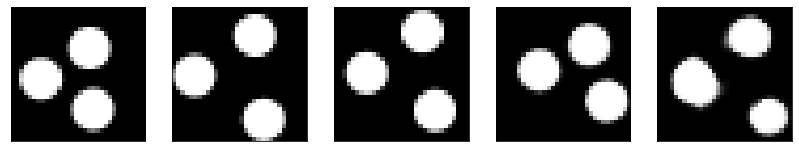

GD iterations:
i=0 | err=55.908928
i=1 | err=54.738293
i=2 | err=53.198280
i=3 | err=51.459980
i=4 | err=49.602448
i=5 | err=47.588432
i=6 | err=45.443947
i=7 | err=43.185028
i=8 | err=40.912682
i=9 | err=38.588974
i=10 | err=36.333725
i=11 | err=34.095695
i=12 | err=31.929028
i=13 | err=29.808578
i=14 | err=27.804647
i=15 | err=25.800690
i=16 | err=23.876225
i=17 | err=21.984261
i=18 | err=20.071095
i=19 | err=18.253601
i=20 | err=16.557650
i=21 | err=15.049231
i=22 | err=13.678055
i=23 | err=12.426186
i=24 | err=11.230555
i=25 | err=10.114086
i=26 | err=9.088647
i=27 | err=8.126241
i=28 | err=7.218801
i=29 | err=6.403504
Epoch=254 (11%) | out_positive=0.819690 | out_negative=0.088385 | mse=0.070103


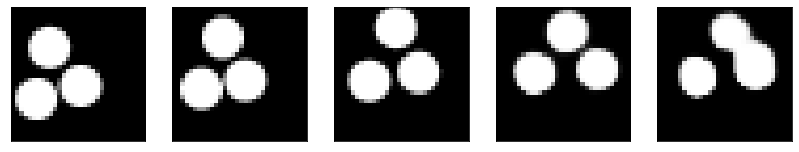

GD iterations:
i=0 | err=53.342594
i=1 | err=52.138672
i=2 | err=50.548954
i=3 | err=48.684364
i=4 | err=46.665817
i=5 | err=44.607170
i=6 | err=42.568153
i=7 | err=40.552944
i=8 | err=38.501774
i=9 | err=36.463448
i=10 | err=34.415352
i=11 | err=32.360313
i=12 | err=30.320776
i=13 | err=28.302006
i=14 | err=26.332193
i=15 | err=24.450916
i=16 | err=22.615002
i=17 | err=20.880306
i=18 | err=19.225798
i=19 | err=17.654320
i=20 | err=16.169809
i=21 | err=14.816664
i=22 | err=13.532799
i=23 | err=12.312147
i=24 | err=11.224775
i=25 | err=10.220850
i=26 | err=9.286018
i=27 | err=8.407990
i=28 | err=7.575138
i=29 | err=6.812391
Epoch=254 (13%) | out_positive=0.873103 | out_negative=0.137031 | mse=0.070930


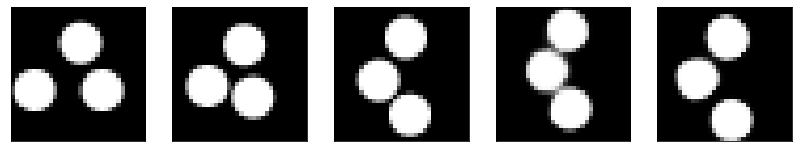

GD iterations:
i=0 | err=53.345226
i=1 | err=52.142956
i=2 | err=50.499733
i=3 | err=48.631302
i=4 | err=46.693245
i=5 | err=44.597504
i=6 | err=42.462360
i=7 | err=40.245037
i=8 | err=38.035015
i=9 | err=35.700504
i=10 | err=33.332676
i=11 | err=30.994831
i=12 | err=28.771864
i=13 | err=26.660152
i=14 | err=24.559803
i=15 | err=22.562073
i=16 | err=20.694633
i=17 | err=18.962280
i=18 | err=17.337975
i=19 | err=15.816126
i=20 | err=14.405441
i=21 | err=13.074900
i=22 | err=11.815668
i=23 | err=10.622355
i=24 | err=9.546953
i=25 | err=8.572357
i=26 | err=7.696737
i=27 | err=6.878625
i=28 | err=6.114267
i=29 | err=5.398003
Epoch=254 (15%) | out_positive=0.901186 | out_negative=0.153751 | mse=0.065472


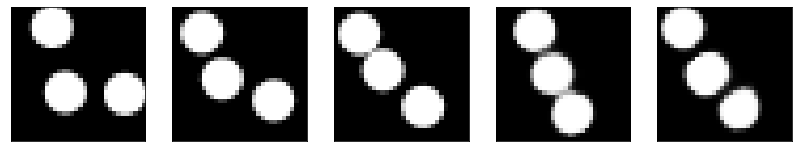

GD iterations:
i=0 | err=55.039368
i=1 | err=53.850410
i=2 | err=52.241943
i=3 | err=50.339607
i=4 | err=48.322063
i=5 | err=46.213581
i=6 | err=44.074028
i=7 | err=41.938709
i=8 | err=39.725388
i=9 | err=37.473827
i=10 | err=35.165932
i=11 | err=32.883194
i=12 | err=30.605217
i=13 | err=28.465240
i=14 | err=26.458328
i=15 | err=24.537331
i=16 | err=22.742908
i=17 | err=21.089544
i=18 | err=19.537930
i=19 | err=18.062693
i=20 | err=16.641911
i=21 | err=15.292809
i=22 | err=14.060064
i=23 | err=12.869522
i=24 | err=11.740314
i=25 | err=10.662857
i=26 | err=9.691409
i=27 | err=8.808122
i=28 | err=7.979295
i=29 | err=7.190528
Epoch=254 (17%) | out_positive=0.863322 | out_negative=0.103408 | mse=0.075573


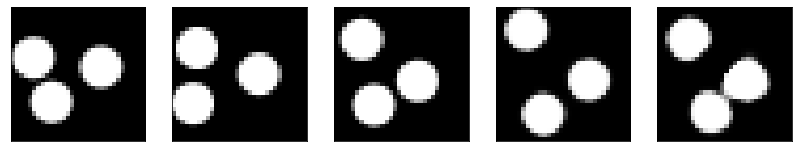

GD iterations:
i=0 | err=56.083679
i=1 | err=54.900551
i=2 | err=53.341557
i=3 | err=51.551712
i=4 | err=49.496841
i=5 | err=47.349522
i=6 | err=45.133999
i=7 | err=42.976715
i=8 | err=40.793518
i=9 | err=38.569939
i=10 | err=36.375076
i=11 | err=34.151871
i=12 | err=32.000641
i=13 | err=29.891523
i=14 | err=27.789312
i=15 | err=25.788023
i=16 | err=23.885326
i=17 | err=22.054888
i=18 | err=20.275604
i=19 | err=18.598701
i=20 | err=17.074749
i=21 | err=15.638526
i=22 | err=14.383532
i=23 | err=13.171728
i=24 | err=12.076124
i=25 | err=11.022736
i=26 | err=10.066160
i=27 | err=9.174164
i=28 | err=8.357849
i=29 | err=7.544735
Epoch=254 (18%) | out_positive=0.849982 | out_negative=0.119815 | mse=0.074478


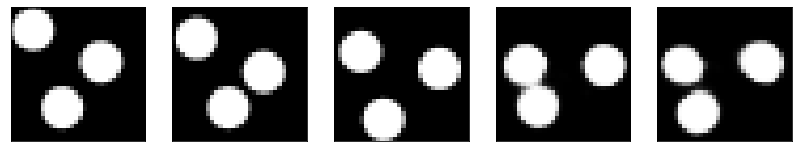

GD iterations:
i=0 | err=47.425690
i=1 | err=46.241173
i=2 | err=44.650558
i=3 | err=42.885090
i=4 | err=41.088127
i=5 | err=39.178612
i=6 | err=37.190533
i=7 | err=35.244583
i=8 | err=33.246410
i=9 | err=31.267500
i=10 | err=29.276510
i=11 | err=27.417667
i=12 | err=25.647976
i=13 | err=23.969978
i=14 | err=22.327232
i=15 | err=20.860603
i=16 | err=19.410370
i=17 | err=18.001106
i=18 | err=16.694073
i=19 | err=15.502135
i=20 | err=14.376773
i=21 | err=13.311841
i=22 | err=12.295578
i=23 | err=11.351189
i=24 | err=10.430870
i=25 | err=9.567969
i=26 | err=8.768239
i=27 | err=7.974703
i=28 | err=7.219033
i=29 | err=6.463551
Epoch=254 (20%) | out_positive=0.941489 | out_negative=0.150867 | mse=0.072452


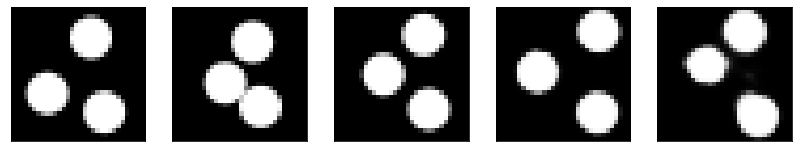

GD iterations:
i=0 | err=57.401978
i=1 | err=56.328030
i=2 | err=54.827377
i=3 | err=53.157429
i=4 | err=51.386162
i=5 | err=49.550751
i=6 | err=47.608059
i=7 | err=45.458378
i=8 | err=43.174519
i=9 | err=40.760254
i=10 | err=38.339172
i=11 | err=35.853600
i=12 | err=33.447838
i=13 | err=31.067421
i=14 | err=28.865036
i=15 | err=26.744404
i=16 | err=24.706434
i=17 | err=22.790504
i=18 | err=20.986130
i=19 | err=19.275053
i=20 | err=17.708344
i=21 | err=16.308781
i=22 | err=15.022543
i=23 | err=13.818789
i=24 | err=12.721403
i=25 | err=11.703669
i=26 | err=10.722841
i=27 | err=9.804050
i=28 | err=8.904478
i=29 | err=8.031012
Epoch=254 (22%) | out_positive=0.879160 | out_negative=0.100294 | mse=0.070415


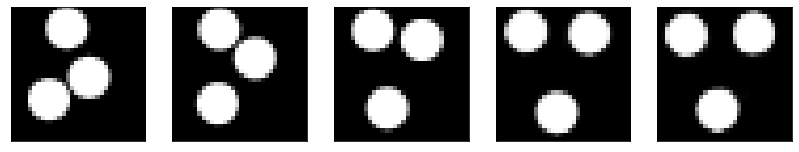

GD iterations:
i=0 | err=56.384060
i=1 | err=55.126106
i=2 | err=53.285889
i=3 | err=51.296284
i=4 | err=49.140114
i=5 | err=46.947563
i=6 | err=44.703537
i=7 | err=42.308239
i=8 | err=39.859612
i=9 | err=37.402142
i=10 | err=34.984085
i=11 | err=32.579552
i=12 | err=30.320423
i=13 | err=28.126873
i=14 | err=26.135807
i=15 | err=24.183456
i=16 | err=22.343445
i=17 | err=20.610498
i=18 | err=19.049006
i=19 | err=17.601929
i=20 | err=16.270123
i=21 | err=15.031613
i=22 | err=13.884349
i=23 | err=12.791918
i=24 | err=11.771900
i=25 | err=10.835003
i=26 | err=9.881169
i=27 | err=8.951760
i=28 | err=8.081956
i=29 | err=7.278120
Epoch=254 (24%) | out_positive=0.782945 | out_negative=0.079658 | mse=0.068485


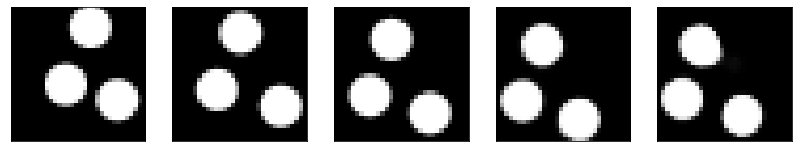

GD iterations:
i=0 | err=56.407890
i=1 | err=55.210297
i=2 | err=53.566540
i=3 | err=51.760822
i=4 | err=49.878197
i=5 | err=47.941784
i=6 | err=45.971733
i=7 | err=43.845760
i=8 | err=41.696445
i=9 | err=39.587048
i=10 | err=37.489868
i=11 | err=35.369347
i=12 | err=33.220795
i=13 | err=31.182243
i=14 | err=29.194025
i=15 | err=27.334219
i=16 | err=25.499413
i=17 | err=23.765923
i=18 | err=22.146492
i=19 | err=20.504824
i=20 | err=18.933847
i=21 | err=17.491262
i=22 | err=16.117971
i=23 | err=14.817986
i=24 | err=13.592472
i=25 | err=12.416497
i=26 | err=11.320066
i=27 | err=10.315415
i=28 | err=9.392471
i=29 | err=8.532008
Epoch=254 (26%) | out_positive=0.913458 | out_negative=0.113129 | mse=0.078470


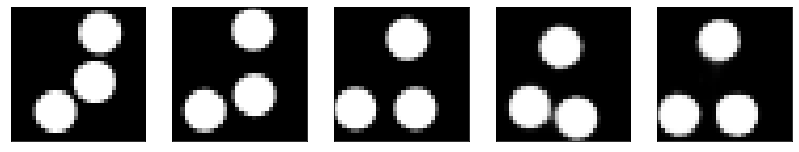

GD iterations:
i=0 | err=52.066284
i=1 | err=50.909168
i=2 | err=49.371651
i=3 | err=47.637207
i=4 | err=45.853992
i=5 | err=44.087532
i=6 | err=42.247498
i=7 | err=40.270794
i=8 | err=38.214565
i=9 | err=36.177856
i=10 | err=34.094048
i=11 | err=32.086105
i=12 | err=30.113625
i=13 | err=28.179987
i=14 | err=26.307987
i=15 | err=24.495262
i=16 | err=22.788872
i=17 | err=21.175549
i=18 | err=19.666580
i=19 | err=18.270029
i=20 | err=16.996397
i=21 | err=15.780789
i=22 | err=14.595925
i=23 | err=13.415065
i=24 | err=12.286871
i=25 | err=11.229983
i=26 | err=10.206364
i=27 | err=9.228443
i=28 | err=8.303622
i=29 | err=7.437310
Epoch=254 (28%) | out_positive=0.905455 | out_negative=0.117866 | mse=0.071999


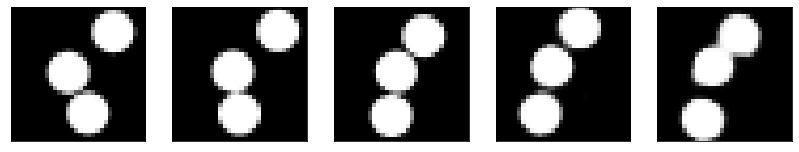

GD iterations:
i=0 | err=52.913166
i=1 | err=51.722904
i=2 | err=50.126556
i=3 | err=48.277763
i=4 | err=46.295815
i=5 | err=44.231087
i=6 | err=42.046906
i=7 | err=39.814205
i=8 | err=37.633972
i=9 | err=35.526840
i=10 | err=33.418354
i=11 | err=31.258709
i=12 | err=29.084230
i=13 | err=26.954191
i=14 | err=24.978306
i=15 | err=23.076235
i=16 | err=21.261402
i=17 | err=19.642797
i=18 | err=18.118847
i=19 | err=16.740627
i=20 | err=15.445836
i=21 | err=14.241044
i=22 | err=13.142566
i=23 | err=12.103777
i=24 | err=11.087216
i=25 | err=10.151825
i=26 | err=9.264643
i=27 | err=8.419660
i=28 | err=7.641204
i=29 | err=6.882849
Epoch=254 (30%) | out_positive=0.843590 | out_negative=0.122063 | mse=0.067750


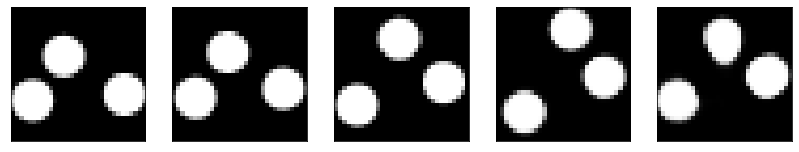

GD iterations:
i=0 | err=55.629406
i=1 | err=54.413189
i=2 | err=52.696648
i=3 | err=50.724594
i=4 | err=48.658791
i=5 | err=46.514366
i=6 | err=44.251785
i=7 | err=41.922901
i=8 | err=39.582031
i=9 | err=37.070156
i=10 | err=34.506138
i=11 | err=32.119808
i=12 | err=29.880419
i=13 | err=27.733553
i=14 | err=25.583931
i=15 | err=23.508514
i=16 | err=21.606710
i=17 | err=19.890781
i=18 | err=18.281992
i=19 | err=16.759592
i=20 | err=15.319206
i=21 | err=13.982521
i=22 | err=12.722028
i=23 | err=11.534710
i=24 | err=10.460645
i=25 | err=9.481710
i=26 | err=8.592756
i=27 | err=7.765309
i=28 | err=7.018428
i=29 | err=6.323841
Epoch=254 (31%) | out_positive=0.884113 | out_negative=0.111020 | mse=0.071651


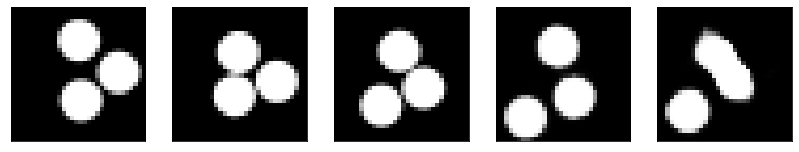

GD iterations:
i=0 | err=56.547829
i=1 | err=55.386364
i=2 | err=53.790272
i=3 | err=51.935783
i=4 | err=49.896820
i=5 | err=47.776215
i=6 | err=45.525185
i=7 | err=43.221077
i=8 | err=40.865734
i=9 | err=38.494213
i=10 | err=36.110462
i=11 | err=33.801331
i=12 | err=31.653187
i=13 | err=29.555254
i=14 | err=27.489962
i=15 | err=25.447371
i=16 | err=23.514921
i=17 | err=21.620804
i=18 | err=19.886154
i=19 | err=18.260435
i=20 | err=16.725773
i=21 | err=15.261701
i=22 | err=13.865340
i=23 | err=12.533357
i=24 | err=11.290951
i=25 | err=10.136362
i=26 | err=9.063984
i=27 | err=8.114165
i=28 | err=7.178576
i=29 | err=6.302943
Epoch=254 (33%) | out_positive=0.832979 | out_negative=0.137743 | mse=0.073800


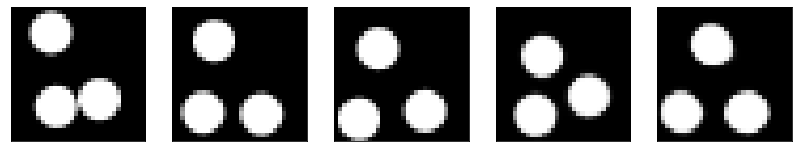

GD iterations:
i=0 | err=52.637642
i=1 | err=51.378433
i=2 | err=49.793152
i=3 | err=48.073898
i=4 | err=46.188736
i=5 | err=44.212803
i=6 | err=42.124008
i=7 | err=40.005104
i=8 | err=37.812378
i=9 | err=35.605888
i=10 | err=33.318123
i=11 | err=31.035425
i=12 | err=28.764400
i=13 | err=26.615046
i=14 | err=24.570999
i=15 | err=22.565928
i=16 | err=20.704544
i=17 | err=18.982607
i=18 | err=17.399139
i=19 | err=15.960114
i=20 | err=14.652173
i=21 | err=13.439776
i=22 | err=12.273111
i=23 | err=11.178544
i=24 | err=10.161079
i=25 | err=9.184961
i=26 | err=8.257842
i=27 | err=7.370369
i=28 | err=6.550764
i=29 | err=5.798248
Epoch=254 (35%) | out_positive=0.888442 | out_negative=0.155773 | mse=0.075431


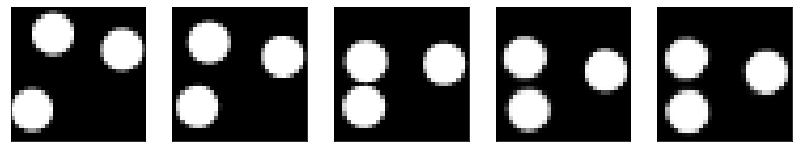

GD iterations:
i=0 | err=58.082779
i=1 | err=56.808441
i=2 | err=54.998020
i=3 | err=52.965294
i=4 | err=50.721130
i=5 | err=48.270302
i=6 | err=45.643280
i=7 | err=43.016281
i=8 | err=40.389763
i=9 | err=37.891628
i=10 | err=35.387005
i=11 | err=33.150803
i=12 | err=30.890259
i=13 | err=28.736523
i=14 | err=26.716316
i=15 | err=24.782074
i=16 | err=22.934326
i=17 | err=21.151131
i=18 | err=19.480200
i=19 | err=17.919832
i=20 | err=16.495396
i=21 | err=15.201144
i=22 | err=13.966318
i=23 | err=12.822250
i=24 | err=11.809644
i=25 | err=10.890445
i=26 | err=10.022463
i=27 | err=9.150455
i=28 | err=8.291037
i=29 | err=7.473887
Epoch=254 (37%) | out_positive=0.830902 | out_negative=0.119711 | mse=0.071993


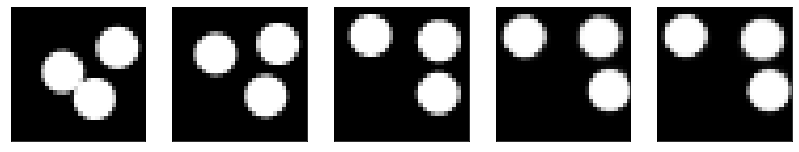

GD iterations:
i=0 | err=55.870029
i=1 | err=54.610096
i=2 | err=52.918457
i=3 | err=51.024078
i=4 | err=48.996056
i=5 | err=46.823139
i=6 | err=44.583984
i=7 | err=42.297302
i=8 | err=39.968872
i=9 | err=37.549404
i=10 | err=35.161949
i=11 | err=32.772816
i=12 | err=30.518597
i=13 | err=28.407757
i=14 | err=26.355991
i=15 | err=24.443615
i=16 | err=22.696249
i=17 | err=21.004679
i=18 | err=19.390774
i=19 | err=17.855097
i=20 | err=16.387066
i=21 | err=15.020205
i=22 | err=13.757300
i=23 | err=12.575699
i=24 | err=11.494265
i=25 | err=10.497816
i=26 | err=9.569512
i=27 | err=8.717742
i=28 | err=7.912931
i=29 | err=7.142449
Epoch=254 (38%) | out_positive=0.832348 | out_negative=0.096077 | mse=0.069970


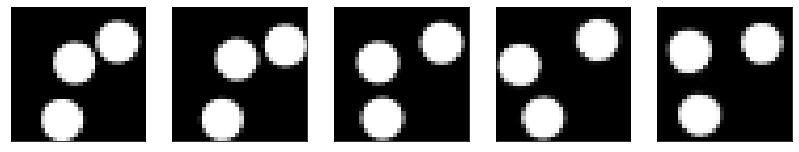

GD iterations:
i=0 | err=54.917694
i=1 | err=53.662956
i=2 | err=51.828594
i=3 | err=49.951035
i=4 | err=47.941689
i=5 | err=45.865120
i=6 | err=43.620544
i=7 | err=41.320766
i=8 | err=38.917564
i=9 | err=36.411812
i=10 | err=33.967228
i=11 | err=31.600870
i=12 | err=29.259525
i=13 | err=26.942287
i=14 | err=24.853573
i=15 | err=22.913408
i=16 | err=21.181801
i=17 | err=19.533199
i=18 | err=17.990658
i=19 | err=16.526712
i=20 | err=15.162244
i=21 | err=13.928019
i=22 | err=12.795736
i=23 | err=11.691605
i=24 | err=10.667751
i=25 | err=9.708241
i=26 | err=8.825012
i=27 | err=8.012955
i=28 | err=7.266859
i=29 | err=6.573603
Epoch=254 (40%) | out_positive=0.856129 | out_negative=0.107813 | mse=0.064052


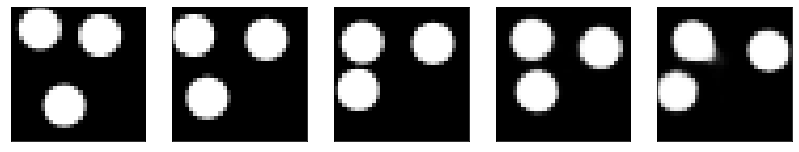

GD iterations:
i=0 | err=53.050800
i=1 | err=51.849350
i=2 | err=50.278732
i=3 | err=48.516094
i=4 | err=46.633080
i=5 | err=44.647141
i=6 | err=42.529900
i=7 | err=40.281822
i=8 | err=37.994053
i=9 | err=35.707092
i=10 | err=33.473305
i=11 | err=31.213039
i=12 | err=29.028036
i=13 | err=26.897705
i=14 | err=24.859932
i=15 | err=22.978401
i=16 | err=21.199736
i=17 | err=19.572777
i=18 | err=18.048170
i=19 | err=16.619228
i=20 | err=15.254910
i=21 | err=14.010957
i=22 | err=12.845133
i=23 | err=11.751974
i=24 | err=10.747873
i=25 | err=9.789045
i=26 | err=8.883314
i=27 | err=8.035328
i=28 | err=7.262275
i=29 | err=6.515387
Epoch=254 (42%) | out_positive=0.897496 | out_negative=0.156129 | mse=0.067504


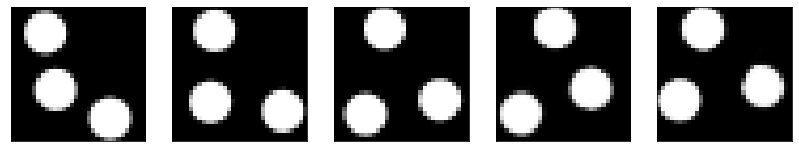

GD iterations:
i=0 | err=48.190063
i=1 | err=47.226173
i=2 | err=45.868019
i=3 | err=44.388382
i=4 | err=42.785393
i=5 | err=41.085335
i=6 | err=39.333488
i=7 | err=37.528248
i=8 | err=35.691963
i=9 | err=33.820793
i=10 | err=31.903131
i=11 | err=29.997274
i=12 | err=28.098400
i=13 | err=26.256584
i=14 | err=24.463589
i=15 | err=22.768705
i=16 | err=21.099064
i=17 | err=19.512566
i=18 | err=18.040102
i=19 | err=16.662998
i=20 | err=15.421208
i=21 | err=14.253799
i=22 | err=13.149276
i=23 | err=12.087765
i=24 | err=11.047327
i=25 | err=10.042835
i=26 | err=9.077272
i=27 | err=8.191956
i=28 | err=7.380075
i=29 | err=6.635107
Epoch=254 (44%) | out_positive=0.904502 | out_negative=0.093433 | mse=0.073797


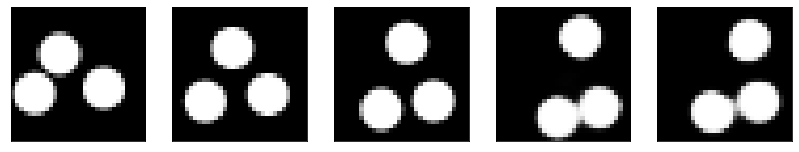

GD iterations:
i=0 | err=54.325668
i=1 | err=53.081699
i=2 | err=51.376747
i=3 | err=49.412994
i=4 | err=47.323868
i=5 | err=45.194687
i=6 | err=42.933632
i=7 | err=40.629601
i=8 | err=38.338799
i=9 | err=36.032322
i=10 | err=33.745018
i=11 | err=31.512995
i=12 | err=29.319494
i=13 | err=27.301601
i=14 | err=25.383656
i=15 | err=23.518618
i=16 | err=21.831318
i=17 | err=20.274323
i=18 | err=18.813034
i=19 | err=17.400581
i=20 | err=16.010242
i=21 | err=14.677492
i=22 | err=13.437798
i=23 | err=12.240750
i=24 | err=11.145136
i=25 | err=10.097346
i=26 | err=9.119980
i=27 | err=8.233244
i=28 | err=7.389504
i=29 | err=6.606621
Epoch=254 (46%) | out_positive=0.894673 | out_negative=0.175249 | mse=0.069343


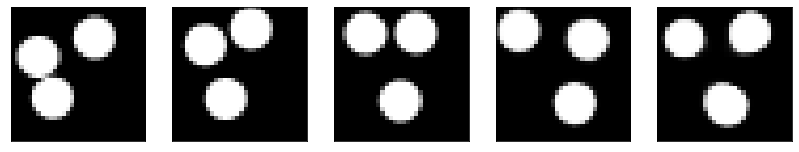

GD iterations:
i=0 | err=53.169582
i=1 | err=51.966377
i=2 | err=50.330009
i=3 | err=48.498482
i=4 | err=46.541542
i=5 | err=44.605469
i=6 | err=42.636047
i=7 | err=40.590721
i=8 | err=38.479649
i=9 | err=36.284775
i=10 | err=34.084782
i=11 | err=31.922039
i=12 | err=29.786015
i=13 | err=27.675423
i=14 | err=25.659769
i=15 | err=23.696850
i=16 | err=21.855867
i=17 | err=20.101196
i=18 | err=18.485819
i=19 | err=16.962362
i=20 | err=15.519212
i=21 | err=14.179477
i=22 | err=12.927231
i=23 | err=11.774059
i=24 | err=10.656364
i=25 | err=9.644519
i=26 | err=8.700742
i=27 | err=7.841469
i=28 | err=7.025868
i=29 | err=6.262289
Epoch=254 (48%) | out_positive=0.919714 | out_negative=0.166236 | mse=0.072333


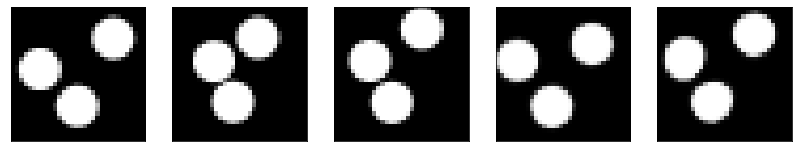

GD iterations:
i=0 | err=52.958961
i=1 | err=51.767601
i=2 | err=50.200485
i=3 | err=48.474945
i=4 | err=46.726860
i=5 | err=44.941063
i=6 | err=43.082672
i=7 | err=41.163227
i=8 | err=39.079857
i=9 | err=36.919601
i=10 | err=34.649143
i=11 | err=32.406670
i=12 | err=30.108824
i=13 | err=28.045116
i=14 | err=26.053152
i=15 | err=24.250809
i=16 | err=22.490070
i=17 | err=20.839445
i=18 | err=19.259665
i=19 | err=17.827087
i=20 | err=16.424944
i=21 | err=15.096613
i=22 | err=13.846139
i=23 | err=12.700057
i=24 | err=11.617384
i=25 | err=10.583933
i=26 | err=9.607737
i=27 | err=8.674784
i=28 | err=7.798552
i=29 | err=6.981735
Epoch=254 (49%) | out_positive=0.901410 | out_negative=0.161173 | mse=0.070966


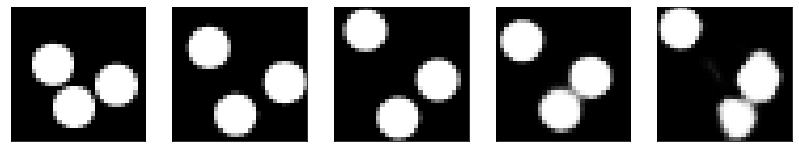

GD iterations:
i=0 | err=52.018684
i=1 | err=50.869484
i=2 | err=49.398323
i=3 | err=47.710869
i=4 | err=45.907204
i=5 | err=44.010963
i=6 | err=42.067093
i=7 | err=40.099358
i=8 | err=38.107460
i=9 | err=36.090343
i=10 | err=34.070175
i=11 | err=32.060802
i=12 | err=30.020731
i=13 | err=27.995104
i=14 | err=26.036892
i=15 | err=24.182274
i=16 | err=22.426939
i=17 | err=20.743971
i=18 | err=19.187675
i=19 | err=17.690834
i=20 | err=16.329353
i=21 | err=15.081203
i=22 | err=13.927990
i=23 | err=12.859722
i=24 | err=11.812578
i=25 | err=10.854663
i=26 | err=9.941981
i=27 | err=9.093796
i=28 | err=8.308498
i=29 | err=7.560972
Epoch=254 (51%) | out_positive=0.905841 | out_negative=0.117767 | mse=0.075716


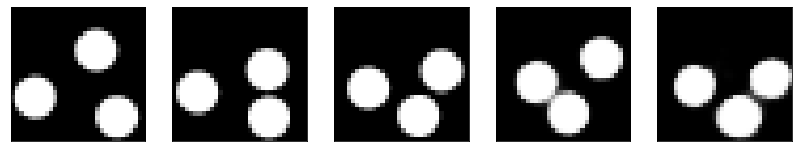

GD iterations:
i=0 | err=56.213448
i=1 | err=54.994785
i=2 | err=53.283855
i=3 | err=51.450089
i=4 | err=49.461056
i=5 | err=47.427959
i=6 | err=45.260612
i=7 | err=43.003242
i=8 | err=40.652065
i=9 | err=38.241623
i=10 | err=35.814552
i=11 | err=33.495522
i=12 | err=31.172211
i=13 | err=28.833618
i=14 | err=26.544725
i=15 | err=24.330112
i=16 | err=22.261980
i=17 | err=20.264736
i=18 | err=18.562374
i=19 | err=16.948833
i=20 | err=15.504694
i=21 | err=14.173553
i=22 | err=12.941673
i=23 | err=11.841291
i=24 | err=10.810225
i=25 | err=9.837782
i=26 | err=8.915195
i=27 | err=8.045870
i=28 | err=7.209611
i=29 | err=6.428525
Epoch=254 (53%) | out_positive=0.929935 | out_negative=0.155320 | mse=0.077685


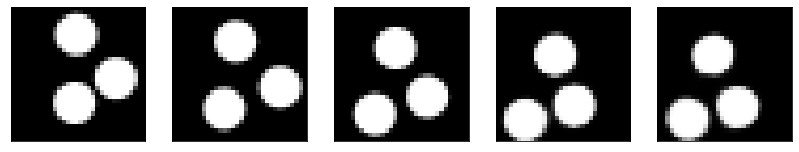

GD iterations:
i=0 | err=51.937454
i=1 | err=50.710548
i=2 | err=48.945770
i=3 | err=47.019020
i=4 | err=44.983200
i=5 | err=42.855938
i=6 | err=40.708145
i=7 | err=38.530731
i=8 | err=36.321182
i=9 | err=34.173595
i=10 | err=32.024292
i=11 | err=29.979282
i=12 | err=27.974390
i=13 | err=25.979719
i=14 | err=24.044765
i=15 | err=22.216709
i=16 | err=20.446033
i=17 | err=18.797754
i=18 | err=17.228630
i=19 | err=15.739505
i=20 | err=14.332705
i=21 | err=13.024253
i=22 | err=11.807600
i=23 | err=10.681129
i=24 | err=9.649751
i=25 | err=8.715094
i=26 | err=7.830961
i=27 | err=6.990234
i=28 | err=6.196674
i=29 | err=5.474095
Epoch=254 (55%) | out_positive=0.903708 | out_negative=0.144472 | mse=0.068214


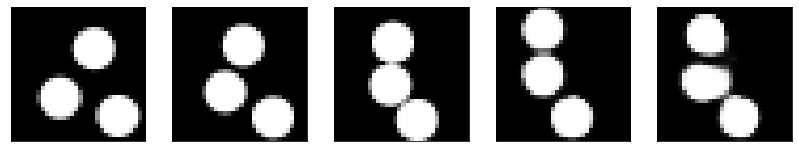

GD iterations:
i=0 | err=56.183327
i=1 | err=54.974079
i=2 | err=53.396275
i=3 | err=51.700912
i=4 | err=49.894043
i=5 | err=47.898499
i=6 | err=45.731491
i=7 | err=43.498337
i=8 | err=41.198818
i=9 | err=38.811935
i=10 | err=36.489017
i=11 | err=34.218811
i=12 | err=32.053711
i=13 | err=30.047300
i=14 | err=28.066311
i=15 | err=26.136135
i=16 | err=24.285057
i=17 | err=22.452652
i=18 | err=20.658352
i=19 | err=18.997458
i=20 | err=17.430836
i=21 | err=15.981084
i=22 | err=14.643538
i=23 | err=13.355173
i=24 | err=12.141670
i=25 | err=11.007422
i=26 | err=9.926450
i=27 | err=8.904508
i=28 | err=7.960032
i=29 | err=7.103787
Epoch=254 (57%) | out_positive=0.893557 | out_negative=0.122866 | mse=0.073167


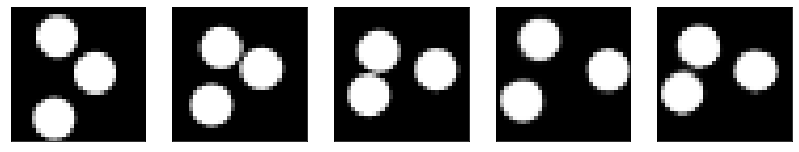

GD iterations:
i=0 | err=57.457447
i=1 | err=56.301739
i=2 | err=54.763035
i=3 | err=52.952492
i=4 | err=51.021381
i=5 | err=48.947651
i=6 | err=46.739525
i=7 | err=44.444599
i=8 | err=42.043537
i=9 | err=39.662342
i=10 | err=37.286083
i=11 | err=35.007782
i=12 | err=32.819927
i=13 | err=30.685976
i=14 | err=28.648182
i=15 | err=26.686016
i=16 | err=24.789577
i=17 | err=23.010338
i=18 | err=21.354126
i=19 | err=19.771645
i=20 | err=18.296539
i=21 | err=16.916437
i=22 | err=15.667768
i=23 | err=14.483384
i=24 | err=13.343885
i=25 | err=12.267960
i=26 | err=11.247610
i=27 | err=10.254605
i=28 | err=9.334172
i=29 | err=8.445587
Epoch=254 (59%) | out_positive=0.818735 | out_negative=0.077650 | mse=0.081109


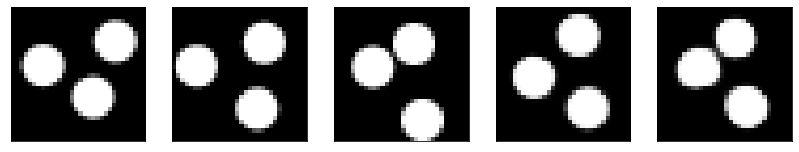

GD iterations:
i=0 | err=55.728821
i=1 | err=54.566532
i=2 | err=53.052250
i=3 | err=51.367928
i=4 | err=49.523563
i=5 | err=47.532253
i=6 | err=45.462982
i=7 | err=43.301571
i=8 | err=41.106506
i=9 | err=38.930214
i=10 | err=36.728870
i=11 | err=34.541428
i=12 | err=32.379696
i=13 | err=30.218027
i=14 | err=28.109867
i=15 | err=26.054806
i=16 | err=24.058414
i=17 | err=22.130058
i=18 | err=20.245136
i=19 | err=18.453102
i=20 | err=16.771955
i=21 | err=15.218348
i=22 | err=13.767420
i=23 | err=12.454221
i=24 | err=11.296737
i=25 | err=10.221022
i=26 | err=9.259514
i=27 | err=8.358225
i=28 | err=7.526892
i=29 | err=6.759231
Epoch=254 (61%) | out_positive=0.913664 | out_negative=0.122982 | mse=0.069763


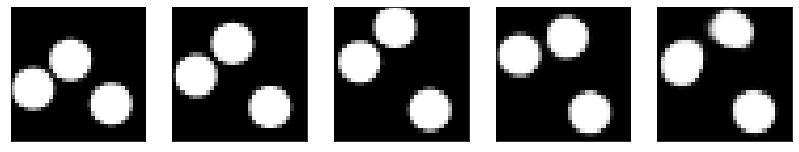

GD iterations:
i=0 | err=54.601444
i=1 | err=53.436729
i=2 | err=51.805954
i=3 | err=49.987411
i=4 | err=48.036819
i=5 | err=45.917450
i=6 | err=43.711872
i=7 | err=41.509361
i=8 | err=39.273880
i=9 | err=36.999481
i=10 | err=34.682178
i=11 | err=32.425911
i=12 | err=30.173136
i=13 | err=27.913721
i=14 | err=25.843216
i=15 | err=23.923260
i=16 | err=22.100250
i=17 | err=20.405504
i=18 | err=18.768703
i=19 | err=17.147663
i=20 | err=15.622570
i=21 | err=14.210487
i=22 | err=12.918634
i=23 | err=11.782248
i=24 | err=10.758127
i=25 | err=9.777838
i=26 | err=8.872876
i=27 | err=8.006942
i=28 | err=7.196079
i=29 | err=6.410424
Epoch=254 (62%) | out_positive=0.900695 | out_negative=0.168170 | mse=0.073938


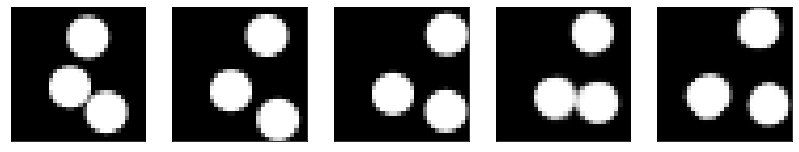

GD iterations:
i=0 | err=51.272747
i=1 | err=50.202404
i=2 | err=48.669769
i=3 | err=46.949120
i=4 | err=45.162384
i=5 | err=43.270615
i=6 | err=41.317802
i=7 | err=39.252998
i=8 | err=37.195400
i=9 | err=35.119934
i=10 | err=33.072723
i=11 | err=31.064709
i=12 | err=29.159929
i=13 | err=27.306581
i=14 | err=25.536562
i=15 | err=23.789036
i=16 | err=22.109329
i=17 | err=20.502834
i=18 | err=19.018778
i=19 | err=17.604733
i=20 | err=16.296803
i=21 | err=15.060005
i=22 | err=13.891441
i=23 | err=12.776758
i=24 | err=11.743551
i=25 | err=10.758612
i=26 | err=9.797057
i=27 | err=8.878580
i=28 | err=7.981428
i=29 | err=7.129248
Epoch=254 (64%) | out_positive=0.902934 | out_negative=0.114200 | mse=0.073283


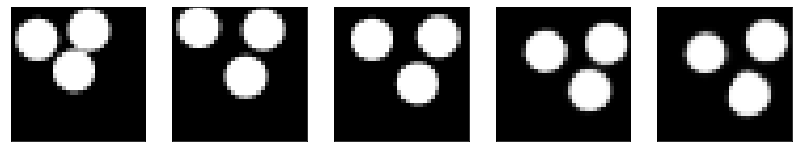

GD iterations:
i=0 | err=56.255013
i=1 | err=55.041885
i=2 | err=53.355801
i=3 | err=51.479267
i=4 | err=49.516891
i=5 | err=47.473717
i=6 | err=45.409626
i=7 | err=43.232307
i=8 | err=40.988297
i=9 | err=38.697411
i=10 | err=36.382843
i=11 | err=34.129852
i=12 | err=31.844217
i=13 | err=29.632849
i=14 | err=27.507685
i=15 | err=25.532658
i=16 | err=23.720007
i=17 | err=22.017410
i=18 | err=20.445244
i=19 | err=18.941549
i=20 | err=17.526909
i=21 | err=16.170059
i=22 | err=14.902102
i=23 | err=13.686222
i=24 | err=12.566278
i=25 | err=11.502993
i=26 | err=10.533892
i=27 | err=9.634665
i=28 | err=8.766082
i=29 | err=7.936922
Epoch=254 (66%) | out_positive=0.765550 | out_negative=0.079939 | mse=0.068386


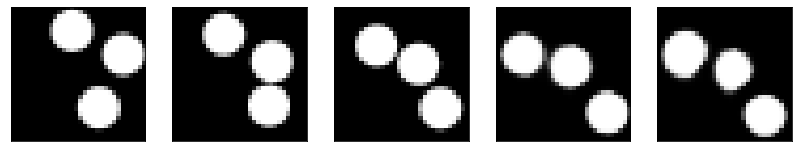

GD iterations:
i=0 | err=56.383522
i=1 | err=55.176739
i=2 | err=53.594631
i=3 | err=51.785557
i=4 | err=49.923927
i=5 | err=47.875645
i=6 | err=45.625076
i=7 | err=43.220909
i=8 | err=40.776241
i=9 | err=38.321861
i=10 | err=35.964333
i=11 | err=33.653271
i=12 | err=31.388662
i=13 | err=29.226469
i=14 | err=27.185320
i=15 | err=25.182457
i=16 | err=23.252567
i=17 | err=21.299389
i=18 | err=19.456467
i=19 | err=17.772507
i=20 | err=16.253365
i=21 | err=14.835550
i=22 | err=13.490493
i=23 | err=12.164110
i=24 | err=10.901531
i=25 | err=9.719694
i=26 | err=8.667158
i=27 | err=7.716010
i=28 | err=6.883344
i=29 | err=6.080057
Epoch=254 (68%) | out_positive=0.898980 | out_negative=0.147437 | mse=0.067348


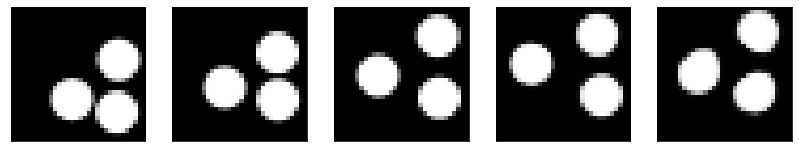

GD iterations:
i=0 | err=51.452812
i=1 | err=50.252342
i=2 | err=48.632065
i=3 | err=46.807728
i=4 | err=44.824593
i=5 | err=42.838928
i=6 | err=40.800797
i=7 | err=38.717972
i=8 | err=36.598648
i=9 | err=34.492241
i=10 | err=32.304348
i=11 | err=30.217955
i=12 | err=28.153690
i=13 | err=26.166161
i=14 | err=24.194050
i=15 | err=22.223724
i=16 | err=20.392738
i=17 | err=18.785107
i=18 | err=17.238167
i=19 | err=15.819312
i=20 | err=14.448746
i=21 | err=13.138861
i=22 | err=11.948830
i=23 | err=10.936007
i=24 | err=10.010965
i=25 | err=9.139254
i=26 | err=8.306467
i=27 | err=7.546485
i=28 | err=6.834467
i=29 | err=6.158298
Epoch=254 (70%) | out_positive=0.871840 | out_negative=0.143822 | mse=0.069057


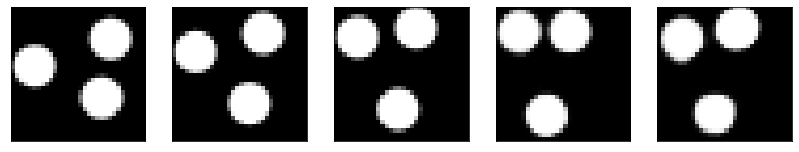

GD iterations:
i=0 | err=52.724197
i=1 | err=51.546814
i=2 | err=49.925503
i=3 | err=48.177750
i=4 | err=46.334251
i=5 | err=44.497993
i=6 | err=42.677155
i=7 | err=40.819561
i=8 | err=38.924713
i=9 | err=36.912811
i=10 | err=34.889931
i=11 | err=32.844631
i=12 | err=30.836311
i=13 | err=28.807621
i=14 | err=26.813381
i=15 | err=24.876783
i=16 | err=23.022598
i=17 | err=21.252665
i=18 | err=19.572721
i=19 | err=17.958231
i=20 | err=16.464113
i=21 | err=15.105816
i=22 | err=13.831610
i=23 | err=12.707182
i=24 | err=11.647272
i=25 | err=10.625678
i=26 | err=9.666136
i=27 | err=8.765681
i=28 | err=7.889818
i=29 | err=7.047394
Epoch=254 (72%) | out_positive=0.850055 | out_negative=0.113507 | mse=0.072472


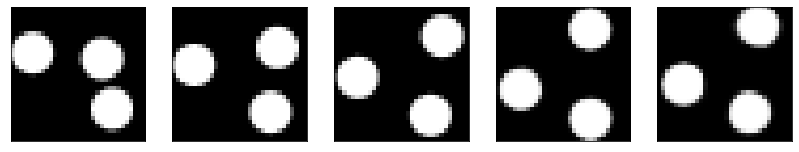

GD iterations:
i=0 | err=54.274250
i=1 | err=52.896980
i=2 | err=50.996101
i=3 | err=48.877106
i=4 | err=46.614094
i=5 | err=44.335297
i=6 | err=42.009468
i=7 | err=39.664268
i=8 | err=37.340393
i=9 | err=35.056854
i=10 | err=32.867039
i=11 | err=30.695559
i=12 | err=28.596443
i=13 | err=26.558931
i=14 | err=24.625366
i=15 | err=22.744045
i=16 | err=20.898636
i=17 | err=19.174408
i=18 | err=17.618023
i=19 | err=16.109690
i=20 | err=14.676769
i=21 | err=13.347466
i=22 | err=12.153411
i=23 | err=11.006069
i=24 | err=9.957307
i=25 | err=8.980759
i=26 | err=8.057458
i=27 | err=7.204072
i=28 | err=6.422066
i=29 | err=5.691612
Epoch=254 (73%) | out_positive=0.874384 | out_negative=0.129007 | mse=0.073820


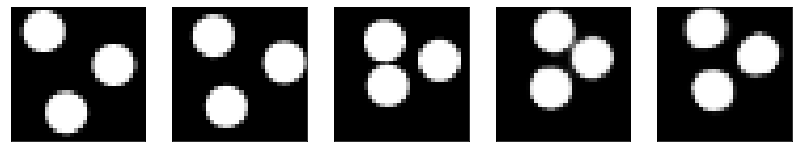

GD iterations:
i=0 | err=53.136940
i=1 | err=51.982861
i=2 | err=50.435158
i=3 | err=48.739414
i=4 | err=47.038483
i=5 | err=45.252998
i=6 | err=43.440361
i=7 | err=41.554501
i=8 | err=39.593102
i=9 | err=37.587341
i=10 | err=35.598415
i=11 | err=33.675331
i=12 | err=31.645218
i=13 | err=29.580452
i=14 | err=27.606411
i=15 | err=25.725571
i=16 | err=23.864761
i=17 | err=22.055689
i=18 | err=20.349207
i=19 | err=18.758732
i=20 | err=17.300539
i=21 | err=15.922037
i=22 | err=14.636413
i=23 | err=13.423606
i=24 | err=12.248995
i=25 | err=11.116627
i=26 | err=10.039747
i=27 | err=9.070047
i=28 | err=8.147330
i=29 | err=7.266568
Epoch=254 (75%) | out_positive=0.830768 | out_negative=0.147730 | mse=0.070285


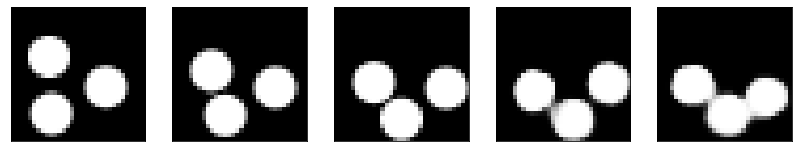

GD iterations:
i=0 | err=53.178093
i=1 | err=51.923912
i=2 | err=50.269779
i=3 | err=48.393570
i=4 | err=46.417519
i=5 | err=44.354927
i=6 | err=42.294331
i=7 | err=40.225182
i=8 | err=38.172287
i=9 | err=36.030014
i=10 | err=33.827576
i=11 | err=31.614689
i=12 | err=29.430561
i=13 | err=27.323866
i=14 | err=25.296230
i=15 | err=23.351192
i=16 | err=21.511883
i=17 | err=19.823666
i=18 | err=18.239250
i=19 | err=16.754801
i=20 | err=15.361023
i=21 | err=14.087674
i=22 | err=12.926535
i=23 | err=11.856737
i=24 | err=10.871762
i=25 | err=9.960911
i=26 | err=9.095808
i=27 | err=8.283021
i=28 | err=7.526231
i=29 | err=6.777081
Epoch=254 (77%) | out_positive=0.809004 | out_negative=0.105062 | mse=0.067906


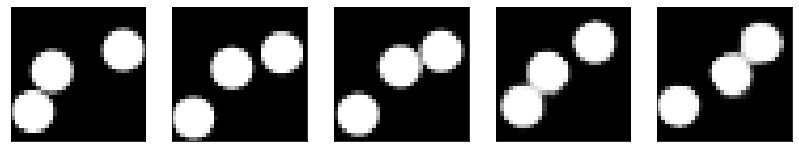

GD iterations:
i=0 | err=54.244514
i=1 | err=53.139969
i=2 | err=51.602863
i=3 | err=49.868851
i=4 | err=48.001320
i=5 | err=46.152489
i=6 | err=44.304764
i=7 | err=42.381744
i=8 | err=40.379887
i=9 | err=38.216324
i=10 | err=36.001648
i=11 | err=33.789783
i=12 | err=31.605112
i=13 | err=29.489101
i=14 | err=27.260109
i=15 | err=25.190361
i=16 | err=23.316526
i=17 | err=21.625216
i=18 | err=20.113014
i=19 | err=18.631981
i=20 | err=17.196234
i=21 | err=15.848654
i=22 | err=14.651943
i=23 | err=13.626051
i=24 | err=12.705952
i=25 | err=11.828728
i=26 | err=10.991180
i=27 | err=10.152994
i=28 | err=9.350424
i=29 | err=8.571161
Epoch=254 (79%) | out_positive=0.862029 | out_negative=0.095188 | mse=0.070745


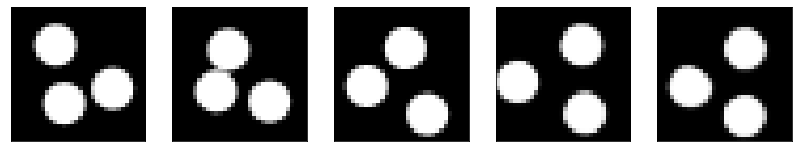

GD iterations:
i=0 | err=52.233307
i=1 | err=50.930870
i=2 | err=49.291733
i=3 | err=47.433167
i=4 | err=45.565895
i=5 | err=43.687508
i=6 | err=41.731972
i=7 | err=39.669884
i=8 | err=37.527294
i=9 | err=35.343830
i=10 | err=33.064438
i=11 | err=30.745169
i=12 | err=28.473194
i=13 | err=26.365824
i=14 | err=24.371811
i=15 | err=22.476559
i=16 | err=20.682507
i=17 | err=19.066765
i=18 | err=17.561646
i=19 | err=16.166859
i=20 | err=14.871780
i=21 | err=13.666405
i=22 | err=12.543067
i=23 | err=11.458273
i=24 | err=10.442133
i=25 | err=9.507485
i=26 | err=8.627874
i=27 | err=7.788892
i=28 | err=7.016622
i=29 | err=6.288809
Epoch=254 (81%) | out_positive=0.873436 | out_negative=0.129416 | mse=0.077574


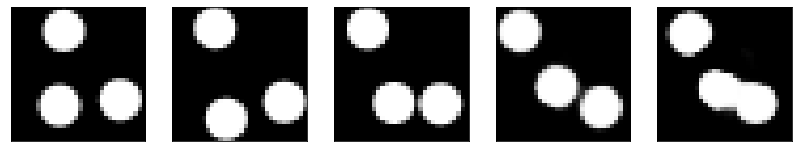

GD iterations:
i=0 | err=57.255054
i=1 | err=56.047302
i=2 | err=54.323162
i=3 | err=52.345055
i=4 | err=50.225315
i=5 | err=48.044861
i=6 | err=45.863361
i=7 | err=43.532524
i=8 | err=41.166901
i=9 | err=38.824783
i=10 | err=36.568371
i=11 | err=34.372787
i=12 | err=32.185013
i=13 | err=29.990559
i=14 | err=27.840511
i=15 | err=25.850681
i=16 | err=23.956856
i=17 | err=22.191849
i=18 | err=20.505497
i=19 | err=18.964993
i=20 | err=17.555311
i=21 | err=16.252714
i=22 | err=15.014636
i=23 | err=13.824944
i=24 | err=12.670494
i=25 | err=11.590425
i=26 | err=10.550941
i=27 | err=9.583657
i=28 | err=8.642931
i=29 | err=7.754791
Epoch=254 (83%) | out_positive=0.850170 | out_negative=0.118496 | mse=0.075612


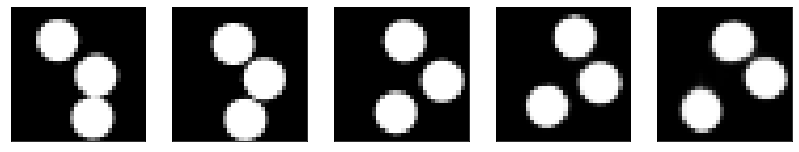

GD iterations:
i=0 | err=52.144806
i=1 | err=50.939308
i=2 | err=49.357281
i=3 | err=47.554443
i=4 | err=45.640503
i=5 | err=43.519714
i=6 | err=41.342541
i=7 | err=39.082458
i=8 | err=36.826256
i=9 | err=34.614735
i=10 | err=32.476425
i=11 | err=30.418633
i=12 | err=28.452316
i=13 | err=26.542513
i=14 | err=24.738403
i=15 | err=23.038982
i=16 | err=21.373253
i=17 | err=19.847050
i=18 | err=18.403488
i=19 | err=17.037933
i=20 | err=15.725696
i=21 | err=14.486064
i=22 | err=13.368280
i=23 | err=12.342890
i=24 | err=11.352759
i=25 | err=10.426500
i=26 | err=9.529706
i=27 | err=8.698243
i=28 | err=7.955147
i=29 | err=7.214561
Epoch=254 (85%) | out_positive=0.925870 | out_negative=0.142680 | mse=0.074977


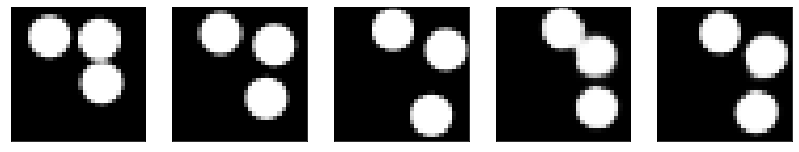

GD iterations:
i=0 | err=53.577728
i=1 | err=52.318264
i=2 | err=50.665680
i=3 | err=48.754452
i=4 | err=46.706612
i=5 | err=44.609848
i=6 | err=42.444298
i=7 | err=40.321220
i=8 | err=38.125153
i=9 | err=35.831676
i=10 | err=33.565418
i=11 | err=31.240705
i=12 | err=28.984709
i=13 | err=26.878010
i=14 | err=24.851797
i=15 | err=22.946213
i=16 | err=21.062387
i=17 | err=19.303486
i=18 | err=17.645863
i=19 | err=16.143318
i=20 | err=14.808388
i=21 | err=13.576203
i=22 | err=12.446977
i=23 | err=11.368942
i=24 | err=10.342344
i=25 | err=9.376093
i=26 | err=8.450397
i=27 | err=7.581427
i=28 | err=6.788574
i=29 | err=6.075894
Epoch=254 (86%) | out_positive=0.879065 | out_negative=0.148825 | mse=0.073594


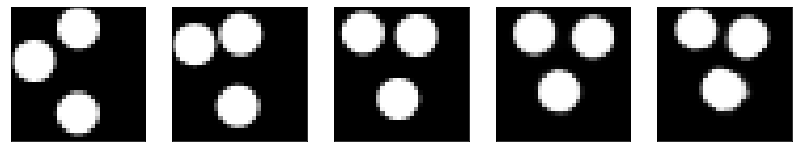

GD iterations:
i=0 | err=54.258850
i=1 | err=53.057293
i=2 | err=51.434883
i=3 | err=49.520695
i=4 | err=47.498001
i=5 | err=45.356056
i=6 | err=43.168114
i=7 | err=40.899967
i=8 | err=38.575851
i=9 | err=36.303772
i=10 | err=34.085701
i=11 | err=31.861284
i=12 | err=29.734219
i=13 | err=27.664928
i=14 | err=25.700733
i=15 | err=23.888161
i=16 | err=22.172100
i=17 | err=20.524612
i=18 | err=18.981136
i=19 | err=17.543825
i=20 | err=16.158134
i=21 | err=14.849491
i=22 | err=13.629666
i=23 | err=12.496279
i=24 | err=11.428848
i=25 | err=10.421821
i=26 | err=9.468657
i=27 | err=8.544903
i=28 | err=7.644848
i=29 | err=6.780761
Epoch=254 (88%) | out_positive=0.824820 | out_negative=0.132209 | mse=0.068675


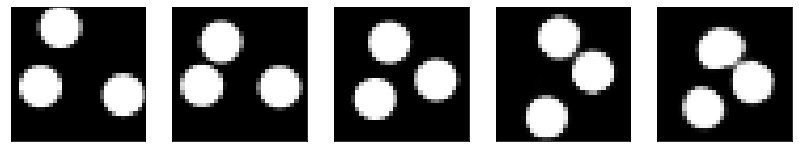

GD iterations:
i=0 | err=54.424694
i=1 | err=53.219650
i=2 | err=51.533684
i=3 | err=49.714798
i=4 | err=47.809441
i=5 | err=45.826820
i=6 | err=43.725548
i=7 | err=41.618042
i=8 | err=39.570648
i=9 | err=37.495094
i=10 | err=35.419266
i=11 | err=33.277569
i=12 | err=31.145378
i=13 | err=29.055992
i=14 | err=27.105145
i=15 | err=25.262030
i=16 | err=23.462868
i=17 | err=21.785353
i=18 | err=20.153297
i=19 | err=18.640030
i=20 | err=17.208790
i=21 | err=15.918892
i=22 | err=14.700405
i=23 | err=13.600395
i=24 | err=12.571270
i=25 | err=11.552233
i=26 | err=10.580153
i=27 | err=9.641369
i=28 | err=8.773178
i=29 | err=7.915886
Epoch=254 (90%) | out_positive=0.892645 | out_negative=0.133182 | mse=0.077161


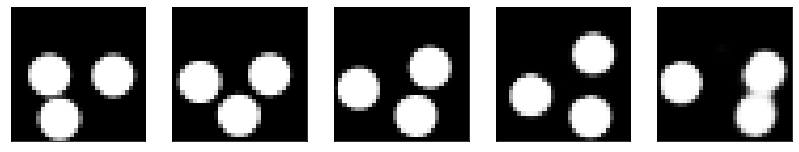

GD iterations:
i=0 | err=48.122715
i=1 | err=47.014225
i=2 | err=45.483261
i=3 | err=43.716248
i=4 | err=41.834713
i=5 | err=39.926331
i=6 | err=37.970558
i=7 | err=36.115898
i=8 | err=34.290359
i=9 | err=32.521561
i=10 | err=30.799534
i=11 | err=29.094355
i=12 | err=27.382025
i=13 | err=25.690231
i=14 | err=24.060341
i=15 | err=22.427153
i=16 | err=20.850027
i=17 | err=19.284492
i=18 | err=17.812843
i=19 | err=16.430580
i=20 | err=15.157705
i=21 | err=13.903778
i=22 | err=12.675649
i=23 | err=11.516745
i=24 | err=10.400442
i=25 | err=9.323793
i=26 | err=8.298539
i=27 | err=7.328095
i=28 | err=6.462387
i=29 | err=5.682882
Epoch=254 (92%) | out_positive=0.884205 | out_negative=0.171571 | mse=0.065183


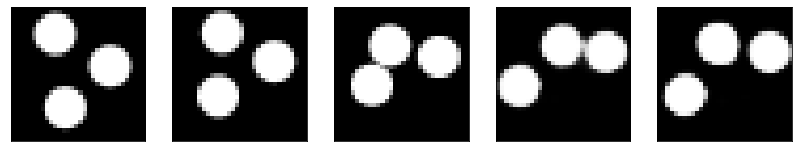

GD iterations:
i=0 | err=52.485863
i=1 | err=51.309875
i=2 | err=49.688370
i=3 | err=47.816231
i=4 | err=45.794724
i=5 | err=43.767235
i=6 | err=41.727970
i=7 | err=39.671322
i=8 | err=37.632931
i=9 | err=35.616577
i=10 | err=33.585152
i=11 | err=31.627790
i=12 | err=29.669502
i=13 | err=27.850937
i=14 | err=26.092384
i=15 | err=24.359600
i=16 | err=22.701605
i=17 | err=21.161892
i=18 | err=19.714500
i=19 | err=18.320993
i=20 | err=17.033974
i=21 | err=15.803533
i=22 | err=14.617931
i=23 | err=13.456062
i=24 | err=12.358248
i=25 | err=11.318066
i=26 | err=10.351444
i=27 | err=9.436125
i=28 | err=8.566116
i=29 | err=7.730153
Epoch=254 (94%) | out_positive=0.918537 | out_negative=0.113300 | mse=0.078226


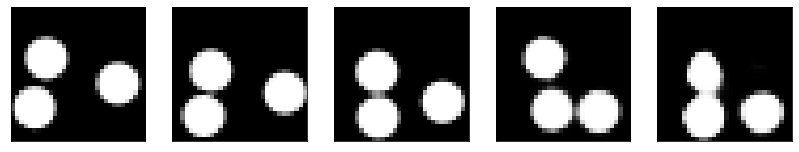

GD iterations:
i=0 | err=55.847828
i=1 | err=54.646942
i=2 | err=52.927757
i=3 | err=50.988579
i=4 | err=49.012470
i=5 | err=46.895267
i=6 | err=44.862064
i=7 | err=42.649757
i=8 | err=40.497551
i=9 | err=38.237175
i=10 | err=36.009056
i=11 | err=33.779884
i=12 | err=31.671913
i=13 | err=29.628323
i=14 | err=27.613159
i=15 | err=25.598873
i=16 | err=23.722528
i=17 | err=21.933189
i=18 | err=20.235338
i=19 | err=18.651474
i=20 | err=17.123428
i=21 | err=15.711512
i=22 | err=14.362546
i=23 | err=13.102299
i=24 | err=11.929449
i=25 | err=10.876472
i=26 | err=9.886906
i=27 | err=8.949957
i=28 | err=8.058225
i=29 | err=7.206844
Epoch=254 (96%) | out_positive=0.834758 | out_negative=0.096457 | mse=0.070493


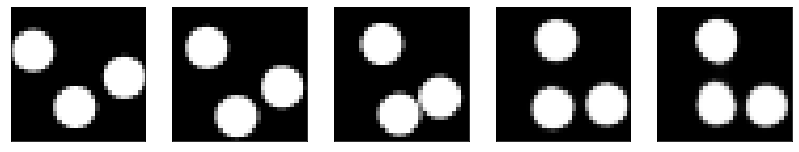

GD iterations:
i=0 | err=57.185719
i=1 | err=55.957508
i=2 | err=54.261505
i=3 | err=52.374344
i=4 | err=50.374321
i=5 | err=48.243874
i=6 | err=46.023232
i=7 | err=43.832619
i=8 | err=41.538940
i=9 | err=39.238255
i=10 | err=36.884705
i=11 | err=34.511070
i=12 | err=32.109673
i=13 | err=29.782141
i=14 | err=27.641529
i=15 | err=25.606873
i=16 | err=23.600956
i=17 | err=21.679558
i=18 | err=19.874372
i=19 | err=18.153587
i=20 | err=16.597004
i=21 | err=15.188889
i=22 | err=13.932810
i=23 | err=12.690594
i=24 | err=11.564384
i=25 | err=10.501579
i=26 | err=9.461166
i=27 | err=8.513117
i=28 | err=7.620955
i=29 | err=6.809412
Epoch=254 (97%) | out_positive=0.883137 | out_negative=0.100360 | mse=0.068664


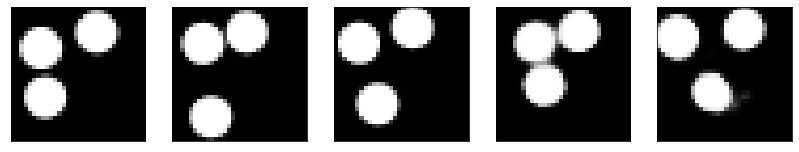

GD iterations:
i=0 | err=54.954792
i=1 | err=53.786896
i=2 | err=52.206093
i=3 | err=50.432602
i=4 | err=48.576096
i=5 | err=46.597298
i=6 | err=44.508450
i=7 | err=42.421188
i=8 | err=40.326485
i=9 | err=38.295326
i=10 | err=36.203979
i=11 | err=34.158989
i=12 | err=32.078434
i=13 | err=30.037401
i=14 | err=28.040375
i=15 | err=26.157589
i=16 | err=24.409040
i=17 | err=22.696205
i=18 | err=21.051659
i=19 | err=19.513336
i=20 | err=18.004280
i=21 | err=16.648483
i=22 | err=15.391907
i=23 | err=14.194868
i=24 | err=13.063902
i=25 | err=11.992353
i=26 | err=11.015568
i=27 | err=10.063806
i=28 | err=9.147276
i=29 | err=8.250600
Epoch=254 (99%) | out_positive=0.888167 | out_negative=0.081725 | mse=0.075519


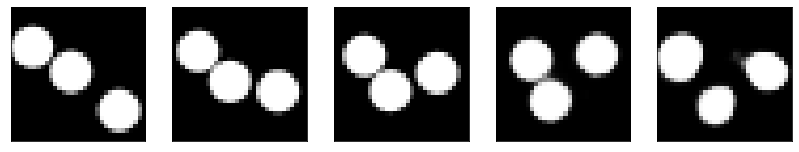

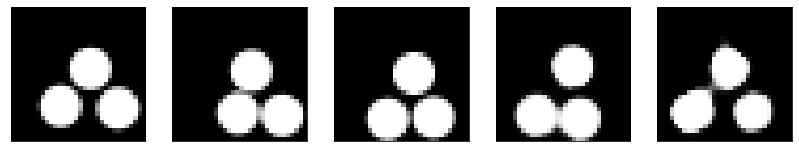

Test MSE 0.079473


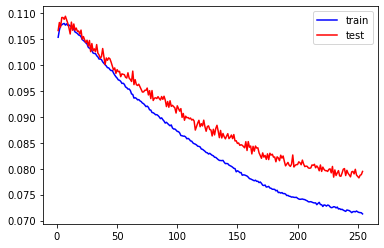

GD iterations:
i=0 | err=53.499409
i=1 | err=52.227234
i=2 | err=50.523922
i=3 | err=48.548592
i=4 | err=46.469765
i=5 | err=44.381447
i=6 | err=42.292496
i=7 | err=40.183910
i=8 | err=38.055161
i=9 | err=35.987709
i=10 | err=33.975491
i=11 | err=31.969851
i=12 | err=30.010485
i=13 | err=28.082130
i=14 | err=26.254675
i=15 | err=24.424068
i=16 | err=22.679565
i=17 | err=21.003185
i=18 | err=19.431515
i=19 | err=17.984703
i=20 | err=16.635223
i=21 | err=15.364616
i=22 | err=14.165956
i=23 | err=13.039963
i=24 | err=12.030229
i=25 | err=11.076621
i=26 | err=10.160044
i=27 | err=9.286777
i=28 | err=8.486743
i=29 | err=7.727433
Epoch=255 (0%) | out_positive=0.845971 | out_negative=0.103566 | mse=0.071476


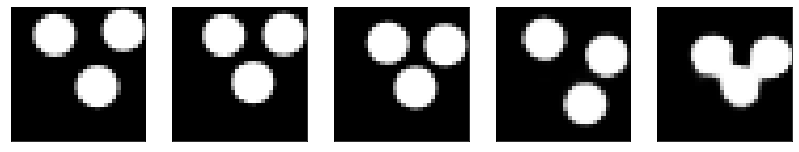

GD iterations:
i=0 | err=59.168766
i=1 | err=57.901108
i=2 | err=56.210976
i=3 | err=54.318474
i=4 | err=52.263123
i=5 | err=50.113937
i=6 | err=47.928242
i=7 | err=45.609917
i=8 | err=43.211941
i=9 | err=40.770580
i=10 | err=38.322243
i=11 | err=35.813171
i=12 | err=33.337021
i=13 | err=30.968761
i=14 | err=28.595531
i=15 | err=26.378757
i=16 | err=24.276035
i=17 | err=22.311176
i=18 | err=20.478043
i=19 | err=18.761023
i=20 | err=17.132053
i=21 | err=15.619660
i=22 | err=14.250165
i=23 | err=12.976198
i=24 | err=11.804327
i=25 | err=10.710220
i=26 | err=9.724953
i=27 | err=8.788095
i=28 | err=7.897743
i=29 | err=7.056247
Epoch=255 (2%) | out_positive=0.846636 | out_negative=0.115634 | mse=0.072049


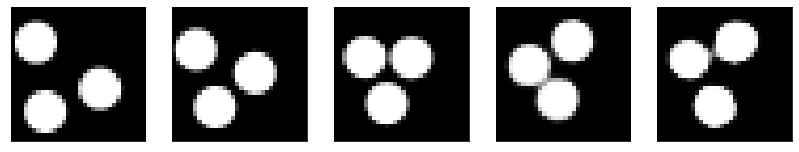

GD iterations:
i=0 | err=54.252640
i=1 | err=53.088898
i=2 | err=51.524689
i=3 | err=49.725525
i=4 | err=47.817226
i=5 | err=45.872070
i=6 | err=43.830360
i=7 | err=41.711220
i=8 | err=39.489277
i=9 | err=37.198235
i=10 | err=34.839191
i=11 | err=32.551399
i=12 | err=30.378841
i=13 | err=28.241562
i=14 | err=26.186523
i=15 | err=24.203541
i=16 | err=22.359413
i=17 | err=20.548191
i=18 | err=18.824638
i=19 | err=17.134880
i=20 | err=15.586020
i=21 | err=14.157081
i=22 | err=12.821203
i=23 | err=11.579668
i=24 | err=10.440659
i=25 | err=9.412515
i=26 | err=8.460979
i=27 | err=7.562478
i=28 | err=6.714418
i=29 | err=5.894987
Epoch=255 (4%) | out_positive=0.902614 | out_negative=0.147876 | mse=0.073961


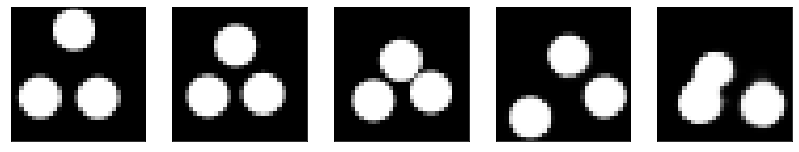

GD iterations:
i=0 | err=52.512695
i=1 | err=51.276676
i=2 | err=49.662376
i=3 | err=47.836308
i=4 | err=45.917774
i=5 | err=43.883862
i=6 | err=41.825459
i=7 | err=39.756065
i=8 | err=37.675079
i=9 | err=35.617226
i=10 | err=33.578926
i=11 | err=31.547470
i=12 | err=29.540201
i=13 | err=27.600931
i=14 | err=25.760628
i=15 | err=23.992435
i=16 | err=22.370474
i=17 | err=20.783001
i=18 | err=19.260815
i=19 | err=17.799332
i=20 | err=16.441385
i=21 | err=15.160311
i=22 | err=13.950603
i=23 | err=12.829596
i=24 | err=11.797460
i=25 | err=10.815418
i=26 | err=9.887435
i=27 | err=8.972198
i=28 | err=8.087092
i=29 | err=7.246396
Epoch=255 (6%) | out_positive=0.926187 | out_negative=0.133887 | mse=0.072525


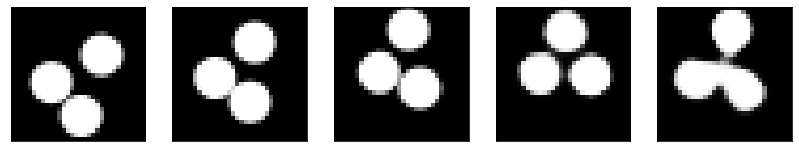

GD iterations:
i=0 | err=52.153534
i=1 | err=50.982334
i=2 | err=49.421036
i=3 | err=47.639286
i=4 | err=45.736698
i=5 | err=43.736603
i=6 | err=41.626091
i=7 | err=39.470955
i=8 | err=37.291431
i=9 | err=35.086105
i=10 | err=33.054203
i=11 | err=31.085270
i=12 | err=29.062737
i=13 | err=27.068163
i=14 | err=25.118612
i=15 | err=23.184168
i=16 | err=21.298681
i=17 | err=19.532349
i=18 | err=17.876068
i=19 | err=16.423677
i=20 | err=15.125030
i=21 | err=13.938642
i=22 | err=12.878094
i=23 | err=11.887389
i=24 | err=10.984805
i=25 | err=10.139451
i=26 | err=9.351955
i=27 | err=8.582315
i=28 | err=7.883684
i=29 | err=7.241605
Epoch=255 (8%) | out_positive=0.869151 | out_negative=0.061487 | mse=0.075306


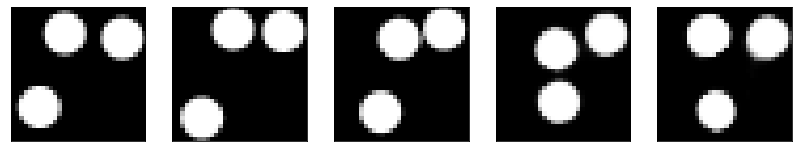

GD iterations:
i=0 | err=55.693672
i=1 | err=54.522591
i=2 | err=52.933109
i=3 | err=51.172615
i=4 | err=49.271255
i=5 | err=47.301460
i=6 | err=45.383198
i=7 | err=43.406677
i=8 | err=41.337795
i=9 | err=39.148857
i=10 | err=36.895733
i=11 | err=34.555817
i=12 | err=32.193920
i=13 | err=29.789497
i=14 | err=27.403244
i=15 | err=25.212662
i=16 | err=23.211428
i=17 | err=21.370235
i=18 | err=19.688686
i=19 | err=18.088009
i=20 | err=16.584835
i=21 | err=15.196994
i=22 | err=13.904627
i=23 | err=12.700256
i=24 | err=11.571881
i=25 | err=10.568388
i=26 | err=9.618531
i=27 | err=8.750530
i=28 | err=7.900341
i=29 | err=7.104716
Epoch=255 (9%) | out_positive=0.870668 | out_negative=0.135849 | mse=0.069997


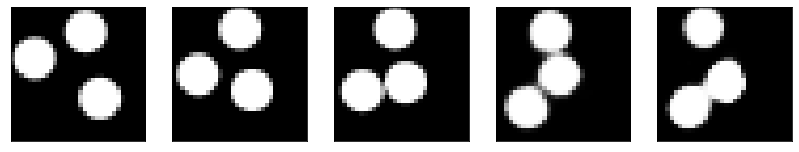

GD iterations:
i=0 | err=53.263275
i=1 | err=52.115860
i=2 | err=50.547356
i=3 | err=48.690918
i=4 | err=46.791546
i=5 | err=44.805515
i=6 | err=42.724411
i=7 | err=40.579094
i=8 | err=38.352295
i=9 | err=36.065292
i=10 | err=33.859001
i=11 | err=31.621540
i=12 | err=29.452515
i=13 | err=27.358734
i=14 | err=25.365532
i=15 | err=23.463322
i=16 | err=21.591824
i=17 | err=19.826443
i=18 | err=18.171181
i=19 | err=16.686411
i=20 | err=15.310523
i=21 | err=14.075392
i=22 | err=12.913960
i=23 | err=11.850285
i=24 | err=10.888807
i=25 | err=9.996336
i=26 | err=9.121393
i=27 | err=8.305410
i=28 | err=7.548293
i=29 | err=6.844976
Epoch=255 (11%) | out_positive=0.865974 | out_negative=0.088595 | mse=0.067991


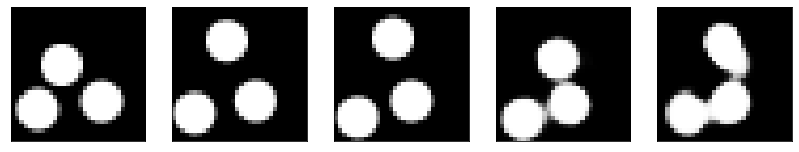

GD iterations:
i=0 | err=53.649689
i=1 | err=52.400558
i=2 | err=50.683853
i=3 | err=48.767914
i=4 | err=46.784645
i=5 | err=44.755962
i=6 | err=42.660885
i=7 | err=40.470436
i=8 | err=38.231277
i=9 | err=35.982613
i=10 | err=33.758881
i=11 | err=31.560532
i=12 | err=29.387981
i=13 | err=27.301487
i=14 | err=25.349373
i=15 | err=23.523853
i=16 | err=21.762516
i=17 | err=20.056229
i=18 | err=18.477955
i=19 | err=17.046043
i=20 | err=15.738690
i=21 | err=14.500633
i=22 | err=13.332388
i=23 | err=12.266066
i=24 | err=11.271681
i=25 | err=10.320074
i=26 | err=9.445888
i=27 | err=8.613706
i=28 | err=7.831303
i=29 | err=7.057792
Epoch=255 (13%) | out_positive=0.903171 | out_negative=0.119152 | mse=0.071404


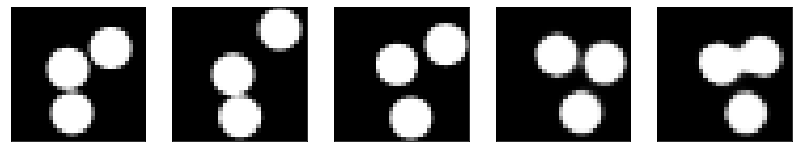

GD iterations:
i=0 | err=51.672947
i=1 | err=50.555252
i=2 | err=49.004402
i=3 | err=47.203209
i=4 | err=45.259682
i=5 | err=43.256573
i=6 | err=41.250328
i=7 | err=39.217007
i=8 | err=37.203339
i=9 | err=35.153511
i=10 | err=33.139019
i=11 | err=31.178440
i=12 | err=29.265598
i=13 | err=27.408924
i=14 | err=25.564541
i=15 | err=23.772196
i=16 | err=22.032207
i=17 | err=20.332478
i=18 | err=18.751570
i=19 | err=17.266705
i=20 | err=15.937361
i=21 | err=14.688366
i=22 | err=13.500847
i=23 | err=12.388308
i=24 | err=11.313176
i=25 | err=10.291103
i=26 | err=9.327398
i=27 | err=8.412836
i=28 | err=7.561432
i=29 | err=6.770996
Epoch=255 (15%) | out_positive=0.885150 | out_negative=0.089367 | mse=0.074215


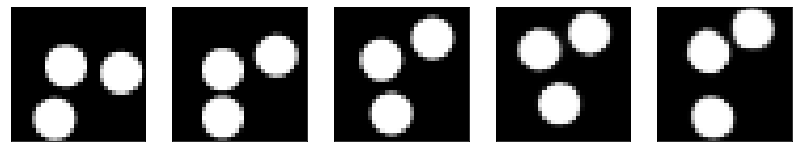

GD iterations:
i=0 | err=56.256893
i=1 | err=54.964901
i=2 | err=53.211983
i=3 | err=51.249046
i=4 | err=49.144325
i=5 | err=46.958858
i=6 | err=44.712387
i=7 | err=42.354462
i=8 | err=39.959587
i=9 | err=37.441879
i=10 | err=35.028534
i=11 | err=32.663227
i=12 | err=30.494949
i=13 | err=28.323715
i=14 | err=26.302311
i=15 | err=24.340645
i=16 | err=22.509306
i=17 | err=20.692696
i=18 | err=19.036755
i=19 | err=17.533081
i=20 | err=16.140427
i=21 | err=14.863777
i=22 | err=13.676163
i=23 | err=12.574588
i=24 | err=11.519583
i=25 | err=10.491800
i=26 | err=9.481316
i=27 | err=8.536140
i=28 | err=7.668416
i=29 | err=6.887588
Epoch=255 (17%) | out_positive=0.860655 | out_negative=0.101944 | mse=0.072704


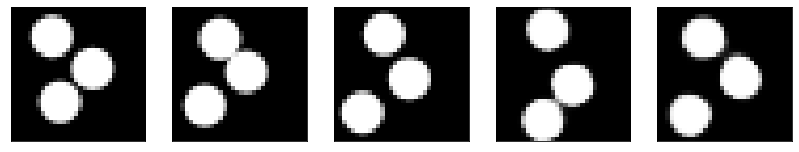

GD iterations:
i=0 | err=55.169884
i=1 | err=54.066841
i=2 | err=52.533390
i=3 | err=50.752495
i=4 | err=48.896023
i=5 | err=46.894119
i=6 | err=44.804497
i=7 | err=42.646957
i=8 | err=40.420147
i=9 | err=38.100960
i=10 | err=35.685715
i=11 | err=33.197685
i=12 | err=30.817894
i=13 | err=28.563068
i=14 | err=26.411982
i=15 | err=24.374409
i=16 | err=22.456673
i=17 | err=20.598000
i=18 | err=18.947384
i=19 | err=17.424267
i=20 | err=16.032381
i=21 | err=14.748405
i=22 | err=13.508604
i=23 | err=12.359978
i=24 | err=11.283659
i=25 | err=10.253331
i=26 | err=9.304668
i=27 | err=8.431334
i=28 | err=7.627316
i=29 | err=6.846413
Epoch=255 (19%) | out_positive=0.854143 | out_negative=0.120066 | mse=0.069227


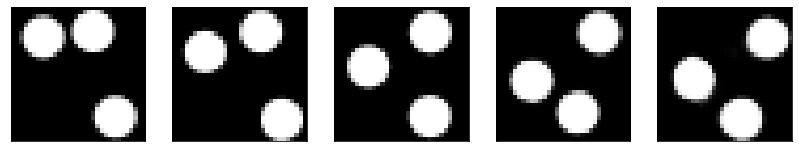

GD iterations:
i=0 | err=55.183079
i=1 | err=54.022072
i=2 | err=52.374077
i=3 | err=50.440704
i=4 | err=48.410934
i=5 | err=46.193096
i=6 | err=43.939426
i=7 | err=41.518452
i=8 | err=39.124664
i=9 | err=36.720161
i=10 | err=34.379951
i=11 | err=32.070652
i=12 | err=29.856342
i=13 | err=27.776543
i=14 | err=25.805809
i=15 | err=23.914019
i=16 | err=22.100527
i=17 | err=20.425739
i=18 | err=18.809772
i=19 | err=17.272316
i=20 | err=15.853089
i=21 | err=14.555515
i=22 | err=13.389936
i=23 | err=12.289079
i=24 | err=11.255032
i=25 | err=10.297750
i=26 | err=9.430107
i=27 | err=8.621670
i=28 | err=7.880142
i=29 | err=7.193318
Epoch=255 (20%) | out_positive=0.832356 | out_negative=0.084841 | mse=0.070704


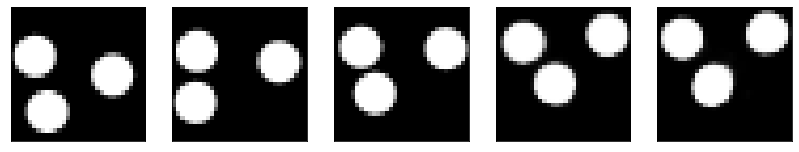

GD iterations:
i=0 | err=54.039852
i=1 | err=52.883896
i=2 | err=51.290100
i=3 | err=49.408325
i=4 | err=47.414246
i=5 | err=45.410221
i=6 | err=43.315174
i=7 | err=41.185112
i=8 | err=38.956913
i=9 | err=36.728085
i=10 | err=34.543388
i=11 | err=32.480965
i=12 | err=30.504904
i=13 | err=28.459957
i=14 | err=26.428230
i=15 | err=24.462685
i=16 | err=22.583157
i=17 | err=20.795803
i=18 | err=19.144192
i=19 | err=17.668125
i=20 | err=16.334259
i=21 | err=15.104996
i=22 | err=13.949125
i=23 | err=12.874197
i=24 | err=11.851467
i=25 | err=10.866450
i=26 | err=9.907458
i=27 | err=8.988098
i=28 | err=8.108665
i=29 | err=7.264198
Epoch=255 (22%) | out_positive=0.771513 | out_negative=0.107631 | mse=0.068292


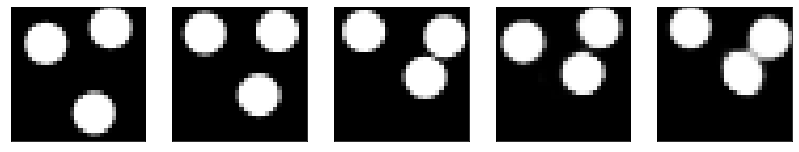

GD iterations:
i=0 | err=55.016747
i=1 | err=53.753159
i=2 | err=52.130039
i=3 | err=50.227016
i=4 | err=48.235573
i=5 | err=46.185104
i=6 | err=44.032192
i=7 | err=41.783741
i=8 | err=39.399612
i=9 | err=36.885315
i=10 | err=34.364662
i=11 | err=31.965210
i=12 | err=29.666245
i=13 | err=27.471128
i=14 | err=25.326708
i=15 | err=23.270147
i=16 | err=21.370007
i=17 | err=19.638494
i=18 | err=18.014801
i=19 | err=16.517811
i=20 | err=15.179079
i=21 | err=13.984035
i=22 | err=12.901372
i=23 | err=11.903908
i=24 | err=10.982634
i=25 | err=10.096109
i=26 | err=9.260439
i=27 | err=8.476841
i=28 | err=7.741898
i=29 | err=7.039172
Epoch=255 (24%) | out_positive=0.908521 | out_negative=0.115913 | mse=0.076769


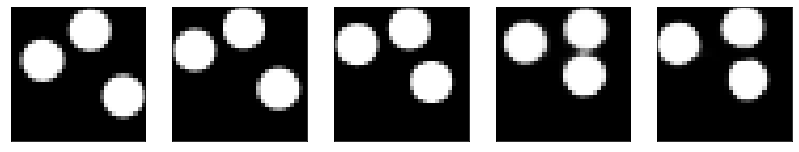

GD iterations:
i=0 | err=53.499557
i=1 | err=52.324261
i=2 | err=50.697884
i=3 | err=48.856953
i=4 | err=46.840641
i=5 | err=44.689175
i=6 | err=42.513657
i=7 | err=40.258934
i=8 | err=37.956818
i=9 | err=35.638172
i=10 | err=33.365112
i=11 | err=31.144829
i=12 | err=28.977888
i=13 | err=26.863373
i=14 | err=24.822052
i=15 | err=22.840626
i=16 | err=20.957619
i=17 | err=19.194481
i=18 | err=17.518860
i=19 | err=15.966127
i=20 | err=14.503864
i=21 | err=13.172457
i=22 | err=11.908408
i=23 | err=10.679389
i=24 | err=9.536505
i=25 | err=8.527478
i=26 | err=7.627466
i=27 | err=6.768182
i=28 | err=5.982789
i=29 | err=5.226799
Epoch=255 (26%) | out_positive=0.887951 | out_negative=0.126037 | mse=0.070079


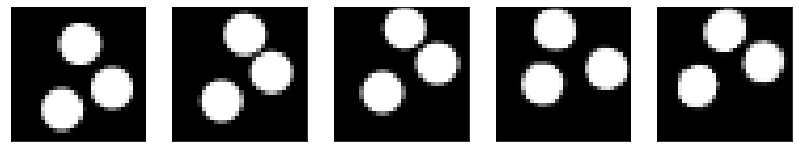

GD iterations:
i=0 | err=52.247437
i=1 | err=51.085930
i=2 | err=49.586853
i=3 | err=47.820435
i=4 | err=45.905785
i=5 | err=43.930252
i=6 | err=41.885208
i=7 | err=39.769691
i=8 | err=37.630501
i=9 | err=35.460739
i=10 | err=33.319157
i=11 | err=31.136353
i=12 | err=29.003624
i=13 | err=26.909443
i=14 | err=24.921890
i=15 | err=23.057480
i=16 | err=21.351128
i=17 | err=19.806549
i=18 | err=18.342369
i=19 | err=16.986647
i=20 | err=15.705419
i=21 | err=14.535026
i=22 | err=13.429089
i=23 | err=12.377190
i=24 | err=11.384747
i=25 | err=10.495087
i=26 | err=9.635334
i=27 | err=8.814432
i=28 | err=8.048223
i=29 | err=7.318317
Epoch=255 (28%) | out_positive=0.864321 | out_negative=0.129078 | mse=0.069763


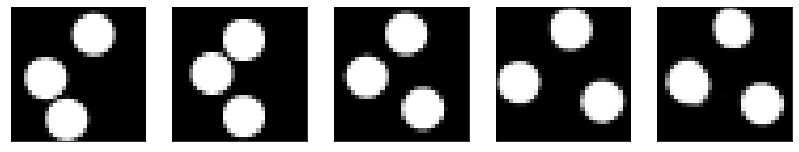

GD iterations:
i=0 | err=50.131535
i=1 | err=49.026672
i=2 | err=47.461121
i=3 | err=45.724579
i=4 | err=43.905853
i=5 | err=42.067589
i=6 | err=40.192039
i=7 | err=38.307858
i=8 | err=36.447601
i=9 | err=34.562653
i=10 | err=32.676918
i=11 | err=30.781441
i=12 | err=28.912899
i=13 | err=27.073719
i=14 | err=25.263096
i=15 | err=23.541609
i=16 | err=21.912798
i=17 | err=20.451225
i=18 | err=19.098253
i=19 | err=17.848461
i=20 | err=16.621548
i=21 | err=15.521811
i=22 | err=14.447054
i=23 | err=13.447424
i=24 | err=12.464175
i=25 | err=11.525375
i=26 | err=10.614794
i=27 | err=9.736416
i=28 | err=8.902352
i=29 | err=8.130553
Epoch=255 (30%) | out_positive=0.877924 | out_negative=0.118091 | mse=0.075471


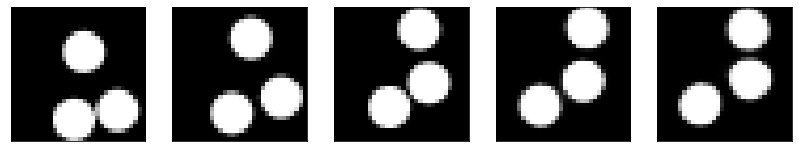

GD iterations:
i=0 | err=54.886971
i=1 | err=53.606743
i=2 | err=51.960842
i=3 | err=50.057293
i=4 | err=48.145767
i=5 | err=46.084396
i=6 | err=43.953190
i=7 | err=41.726978
i=8 | err=39.505165
i=9 | err=37.334713
i=10 | err=35.146645
i=11 | err=33.055695
i=12 | err=31.021343
i=13 | err=29.051550
i=14 | err=27.146765
i=15 | err=25.224136
i=16 | err=23.291050
i=17 | err=21.396114
i=18 | err=19.671684
i=19 | err=18.102678
i=20 | err=16.624680
i=21 | err=15.233517
i=22 | err=13.925306
i=23 | err=12.720420
i=24 | err=11.572739
i=25 | err=10.503296
i=26 | err=9.531033
i=27 | err=8.631220
i=28 | err=7.781002
i=29 | err=6.961951
Epoch=255 (32%) | out_positive=0.936729 | out_negative=0.118154 | mse=0.076328


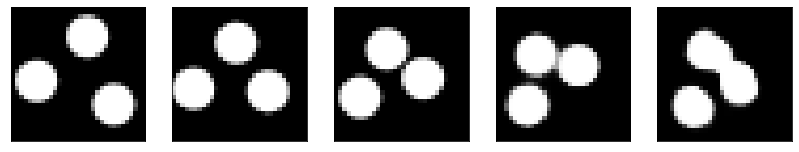

GD iterations:
i=0 | err=52.773705
i=1 | err=51.500961
i=2 | err=49.676712
i=3 | err=47.675385
i=4 | err=45.612183
i=5 | err=43.427105
i=6 | err=41.147469
i=7 | err=38.821812
i=8 | err=36.532146
i=9 | err=34.209831
i=10 | err=31.904697
i=11 | err=29.701637
i=12 | err=27.517382
i=13 | err=25.422411
i=14 | err=23.365768
i=15 | err=21.444107
i=16 | err=19.660400
i=17 | err=18.016853
i=18 | err=16.423328
i=19 | err=14.924606
i=20 | err=13.546268
i=21 | err=12.309668
i=22 | err=11.156629
i=23 | err=10.120543
i=24 | err=9.175019
i=25 | err=8.301510
i=26 | err=7.500485
i=27 | err=6.763625
i=28 | err=6.065381
i=29 | err=5.413778
Epoch=255 (33%) | out_positive=0.908582 | out_negative=0.157184 | mse=0.068561


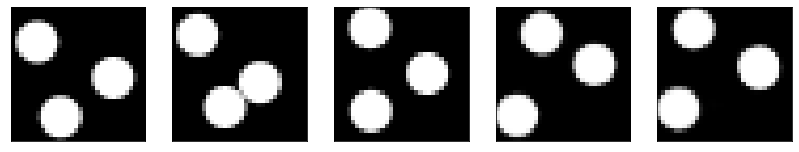

GD iterations:
i=0 | err=55.897789
i=1 | err=54.648048
i=2 | err=52.969139
i=3 | err=51.044785
i=4 | err=48.915558
i=5 | err=46.733868
i=6 | err=44.584091
i=7 | err=42.428093
i=8 | err=40.179550
i=9 | err=37.848789
i=10 | err=35.433365
i=11 | err=33.091389
i=12 | err=30.778603
i=13 | err=28.503832
i=14 | err=26.366627
i=15 | err=24.310656
i=16 | err=22.285774
i=17 | err=20.352650
i=18 | err=18.530560
i=19 | err=16.875530
i=20 | err=15.426658
i=21 | err=14.111574
i=22 | err=12.872091
i=23 | err=11.716742
i=24 | err=10.630505
i=25 | err=9.631672
i=26 | err=8.725229
i=27 | err=7.878131
i=28 | err=7.102514
i=29 | err=6.334717
Epoch=255 (35%) | out_positive=0.832312 | out_negative=0.150482 | mse=0.066374


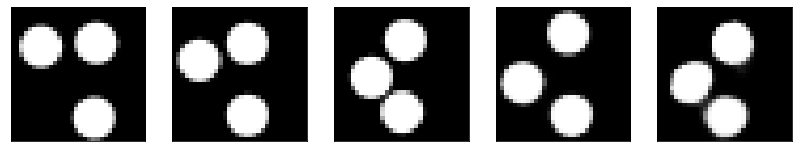

GD iterations:
i=0 | err=55.280594
i=1 | err=54.008881
i=2 | err=52.307236
i=3 | err=50.403740
i=4 | err=48.389839
i=5 | err=46.334049
i=6 | err=44.214863
i=7 | err=41.992943
i=8 | err=39.666290
i=9 | err=37.295288
i=10 | err=34.911858
i=11 | err=32.545803
i=12 | err=30.254745
i=13 | err=28.039415
i=14 | err=25.933931
i=15 | err=23.925610
i=16 | err=21.990631
i=17 | err=20.174950
i=18 | err=18.492699
i=19 | err=16.966225
i=20 | err=15.607834
i=21 | err=14.356466
i=22 | err=13.157995
i=23 | err=12.061404
i=24 | err=11.005058
i=25 | err=9.988766
i=26 | err=9.027838
i=27 | err=8.086311
i=28 | err=7.203036
i=29 | err=6.381245
Epoch=255 (37%) | out_positive=0.835020 | out_negative=0.148789 | mse=0.067634


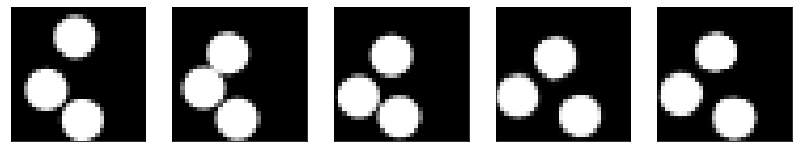

GD iterations:
i=0 | err=52.565300
i=1 | err=51.311108
i=2 | err=49.677238
i=3 | err=47.828758
i=4 | err=45.895901
i=5 | err=43.921570
i=6 | err=41.963661
i=7 | err=40.033684
i=8 | err=38.178795
i=9 | err=36.295635
i=10 | err=34.387180
i=11 | err=32.592480
i=12 | err=30.738182
i=13 | err=28.921288
i=14 | err=27.057640
i=15 | err=25.173679
i=16 | err=23.295540
i=17 | err=21.441463
i=18 | err=19.696266
i=19 | err=18.086472
i=20 | err=16.615980
i=21 | err=15.193752
i=22 | err=13.858603
i=23 | err=12.564911
i=24 | err=11.349304
i=25 | err=10.225860
i=26 | err=9.209568
i=27 | err=8.226359
i=28 | err=7.318593
i=29 | err=6.479968
Epoch=255 (39%) | out_positive=0.896916 | out_negative=0.167085 | mse=0.065573


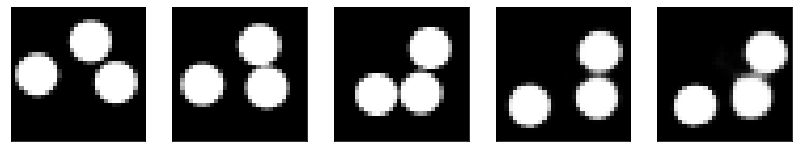

GD iterations:
i=0 | err=54.555840
i=1 | err=53.381485
i=2 | err=51.762062
i=3 | err=49.964767
i=4 | err=48.082397
i=5 | err=46.058311
i=6 | err=44.011044
i=7 | err=41.860741
i=8 | err=39.682137
i=9 | err=37.411442
i=10 | err=35.088379
i=11 | err=32.754734
i=12 | err=30.523945
i=13 | err=28.309410
i=14 | err=26.259121
i=15 | err=24.258760
i=16 | err=22.295322
i=17 | err=20.476727
i=18 | err=18.758982
i=19 | err=17.222071
i=20 | err=15.805737
i=21 | err=14.452911
i=22 | err=13.151154
i=23 | err=11.940965
i=24 | err=10.798911
i=25 | err=9.770133
i=26 | err=8.837460
i=27 | err=7.925076
i=28 | err=7.061605
i=29 | err=6.225422
Epoch=255 (41%) | out_positive=0.883050 | out_negative=0.190996 | mse=0.070533


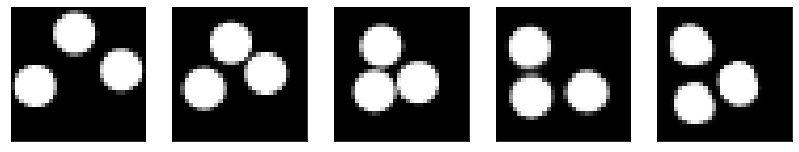

GD iterations:
i=0 | err=54.799011
i=1 | err=53.456505
i=2 | err=51.793320
i=3 | err=49.864658
i=4 | err=47.828178
i=5 | err=45.650719
i=6 | err=43.468220
i=7 | err=41.216282
i=8 | err=38.932430
i=9 | err=36.681320
i=10 | err=34.492840
i=11 | err=32.395782
i=12 | err=30.322508
i=13 | err=28.288872
i=14 | err=26.349831
i=15 | err=24.490664
i=16 | err=22.688995
i=17 | err=20.926170
i=18 | err=19.200060
i=19 | err=17.589981
i=20 | err=16.114388
i=21 | err=14.730696
i=22 | err=13.450183
i=23 | err=12.263207
i=24 | err=11.158252
i=25 | err=10.140638
i=26 | err=9.165960
i=27 | err=8.266782
i=28 | err=7.436489
i=29 | err=6.678798
Epoch=255 (43%) | out_positive=0.855318 | out_negative=0.105806 | mse=0.074273


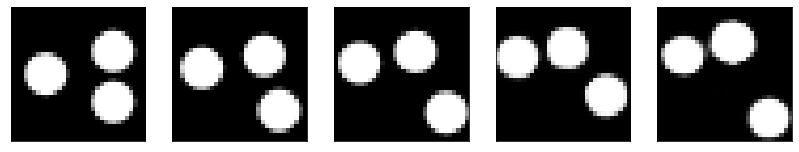

GD iterations:
i=0 | err=54.405998
i=1 | err=53.128525
i=2 | err=51.431992
i=3 | err=49.480362
i=4 | err=47.370159
i=5 | err=45.159279
i=6 | err=42.885525
i=7 | err=40.551254
i=8 | err=38.198071
i=9 | err=35.879250
i=10 | err=33.597301
i=11 | err=31.357843
i=12 | err=29.199200
i=13 | err=27.115425
i=14 | err=25.109348
i=15 | err=23.197105
i=16 | err=21.404533
i=17 | err=19.712936
i=18 | err=18.160683
i=19 | err=16.699875
i=20 | err=15.327782
i=21 | err=14.025238
i=22 | err=12.857936
i=23 | err=11.761034
i=24 | err=10.702468
i=25 | err=9.716676
i=26 | err=8.778715
i=27 | err=7.852206
i=28 | err=6.980741
i=29 | err=6.174629
Epoch=255 (44%) | out_positive=0.844071 | out_negative=0.118849 | mse=0.070639


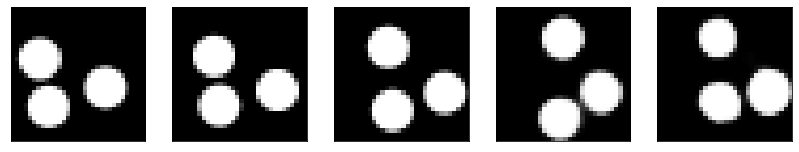

GD iterations:
i=0 | err=52.268135
i=1 | err=51.146996
i=2 | err=49.622414
i=3 | err=47.809006
i=4 | err=45.945652
i=5 | err=43.940067
i=6 | err=41.899784
i=7 | err=39.820480
i=8 | err=37.717400
i=9 | err=35.528503
i=10 | err=33.416401
i=11 | err=31.299944
i=12 | err=29.168602
i=13 | err=27.100517
i=14 | err=25.101021
i=15 | err=23.285452
i=16 | err=21.542568
i=17 | err=20.002846
i=18 | err=18.588991
i=19 | err=17.271374
i=20 | err=15.993616
i=21 | err=14.756626
i=22 | err=13.498768
i=23 | err=12.272223
i=24 | err=11.078529
i=25 | err=9.936882
i=26 | err=8.873636
i=27 | err=7.889483
i=28 | err=6.990020
i=29 | err=6.162988
Epoch=255 (46%) | out_positive=0.906396 | out_negative=0.140359 | mse=0.069527


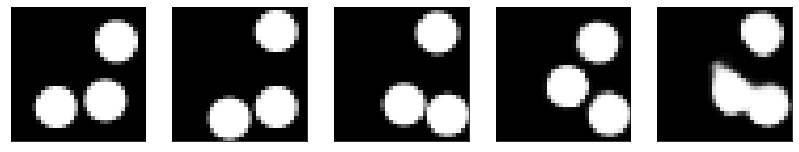

GD iterations:
i=0 | err=53.733475
i=1 | err=52.462822
i=2 | err=50.694614
i=3 | err=48.665436
i=4 | err=46.490379
i=5 | err=44.234108
i=6 | err=42.006287
i=7 | err=39.685528
i=8 | err=37.376793
i=9 | err=35.046478
i=10 | err=32.759384
i=11 | err=30.588631
i=12 | err=28.500278
i=13 | err=26.517883
i=14 | err=24.601866
i=15 | err=22.744703
i=16 | err=20.970158
i=17 | err=19.272247
i=18 | err=17.638264
i=19 | err=16.098707
i=20 | err=14.665532
i=21 | err=13.278077
i=22 | err=12.032425
i=23 | err=10.850302
i=24 | err=9.782707
i=25 | err=8.821097
i=26 | err=7.935171
i=27 | err=7.115631
i=28 | err=6.334908
i=29 | err=5.580702
Epoch=255 (48%) | out_positive=0.915634 | out_negative=0.176448 | mse=0.069090


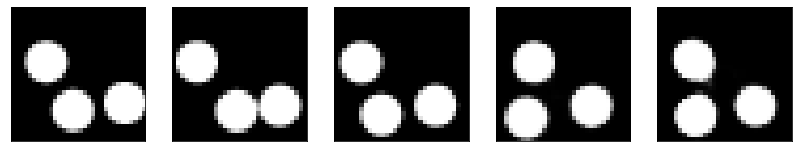

GD iterations:
i=0 | err=52.381165
i=1 | err=51.185627
i=2 | err=49.597244
i=3 | err=47.771881
i=4 | err=45.789101
i=5 | err=43.772324
i=6 | err=41.665688
i=7 | err=39.466576
i=8 | err=37.245644
i=9 | err=34.954102
i=10 | err=32.761963
i=11 | err=30.663490
i=12 | err=28.651787
i=13 | err=26.703407
i=14 | err=24.826199
i=15 | err=23.007740
i=16 | err=21.187008
i=17 | err=19.473051
i=18 | err=17.869648
i=19 | err=16.300581
i=20 | err=14.894044
i=21 | err=13.613304
i=22 | err=12.415211
i=23 | err=11.260033
i=24 | err=10.191110
i=25 | err=9.216864
i=26 | err=8.270451
i=27 | err=7.349834
i=28 | err=6.489356
i=29 | err=5.685795
Epoch=255 (50%) | out_positive=0.900160 | out_negative=0.184156 | mse=0.065441


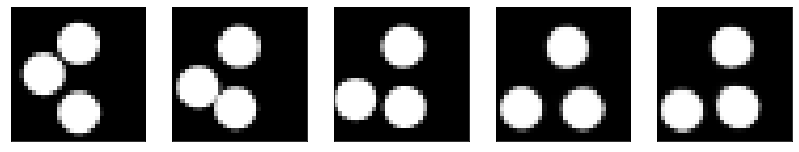

GD iterations:
i=0 | err=57.681633
i=1 | err=56.372646
i=2 | err=54.558365
i=3 | err=52.438309
i=4 | err=50.282536
i=5 | err=48.048244
i=6 | err=45.651390
i=7 | err=43.143841
i=8 | err=40.565399
i=9 | err=37.864433
i=10 | err=35.164642
i=11 | err=32.569630
i=12 | err=30.116520
i=13 | err=27.702806
i=14 | err=25.428688
i=15 | err=23.304411
i=16 | err=21.298199
i=17 | err=19.460546
i=18 | err=17.771193
i=19 | err=16.159891
i=20 | err=14.650969
i=21 | err=13.304419
i=22 | err=12.102997
i=23 | err=10.950131
i=24 | err=9.860266
i=25 | err=8.873473
i=26 | err=7.967807
i=27 | err=7.115005
i=28 | err=6.324350
i=29 | err=5.578726
Epoch=255 (52%) | out_positive=0.854065 | out_negative=0.178560 | mse=0.068141


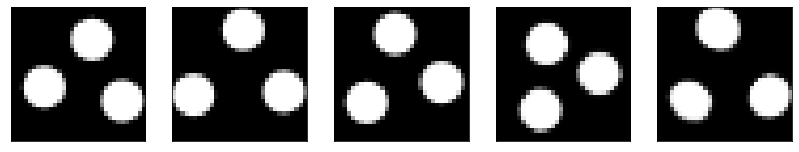

GD iterations:
i=0 | err=57.688141
i=1 | err=56.392319
i=2 | err=54.653114
i=3 | err=52.783798
i=4 | err=50.738350
i=5 | err=48.504799
i=6 | err=46.144157
i=7 | err=43.772793
i=8 | err=41.442627
i=9 | err=39.153740
i=10 | err=36.807491
i=11 | err=34.559467
i=12 | err=32.248650
i=13 | err=29.915037
i=14 | err=27.701210
i=15 | err=25.596985
i=16 | err=23.619625
i=17 | err=21.732903
i=18 | err=20.024857
i=19 | err=18.491198
i=20 | err=17.043472
i=21 | err=15.658909
i=22 | err=14.293489
i=23 | err=13.003981
i=24 | err=11.827940
i=25 | err=10.726627
i=26 | err=9.718398
i=27 | err=8.755663
i=28 | err=7.882466
i=29 | err=7.080517
Epoch=255 (54%) | out_positive=0.899539 | out_negative=0.111587 | mse=0.075727


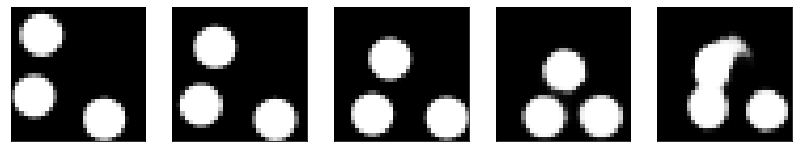

GD iterations:
i=0 | err=53.562050
i=1 | err=52.275009
i=2 | err=50.573380
i=3 | err=48.611450
i=4 | err=46.466400
i=5 | err=44.227234
i=6 | err=41.935555
i=7 | err=39.680717
i=8 | err=37.411896
i=9 | err=35.164394
i=10 | err=32.878895
i=11 | err=30.610638
i=12 | err=28.396027
i=13 | err=26.212368
i=14 | err=24.123240
i=15 | err=22.084885
i=16 | err=20.161701
i=17 | err=18.460730
i=18 | err=16.929096
i=19 | err=15.553068
i=20 | err=14.315346
i=21 | err=13.167801
i=22 | err=12.073587
i=23 | err=11.057459
i=24 | err=10.125648
i=25 | err=9.202837
i=26 | err=8.314002
i=27 | err=7.456628
i=28 | err=6.673359
i=29 | err=5.946866
Epoch=255 (56%) | out_positive=0.908153 | out_negative=0.158242 | mse=0.068998


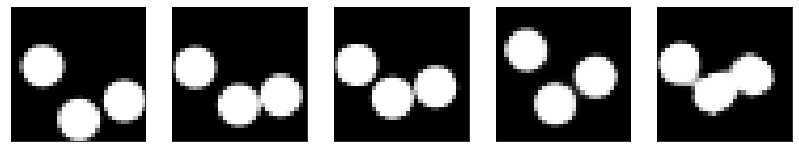

GD iterations:
i=0 | err=59.370804
i=1 | err=58.160896
i=2 | err=56.390137
i=3 | err=54.388306
i=4 | err=52.108646
i=5 | err=49.769489
i=6 | err=47.298470
i=7 | err=44.855888
i=8 | err=42.284843
i=9 | err=39.698208
i=10 | err=37.172363
i=11 | err=34.692245
i=12 | err=32.212067
i=13 | err=29.811426
i=14 | err=27.477949
i=15 | err=25.225077
i=16 | err=23.084524
i=17 | err=21.063139
i=18 | err=19.252151
i=19 | err=17.523769
i=20 | err=15.908260
i=21 | err=14.422768
i=22 | err=13.086205
i=23 | err=11.880764
i=24 | err=10.797213
i=25 | err=9.817223
i=26 | err=8.875759
i=27 | err=7.966417
i=28 | err=7.068824
i=29 | err=6.225481
Epoch=255 (57%) | out_positive=0.856978 | out_negative=0.119694 | mse=0.072747


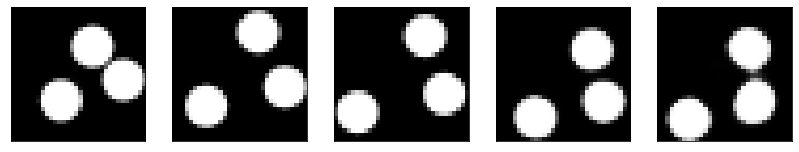

GD iterations:
i=0 | err=55.884125
i=1 | err=54.719376
i=2 | err=53.057106
i=3 | err=51.141121
i=4 | err=49.120277
i=5 | err=46.980385
i=6 | err=44.864662
i=7 | err=42.634262
i=8 | err=40.273670
i=9 | err=37.924141
i=10 | err=35.535103
i=11 | err=33.075775
i=12 | err=30.646729
i=13 | err=28.397781
i=14 | err=26.186550
i=15 | err=24.137356
i=16 | err=22.120026
i=17 | err=20.233423
i=18 | err=18.541050
i=19 | err=17.028793
i=20 | err=15.655253
i=21 | err=14.370822
i=22 | err=13.158397
i=23 | err=12.043243
i=24 | err=11.005926
i=25 | err=10.066244
i=26 | err=9.177969
i=27 | err=8.359186
i=28 | err=7.574039
i=29 | err=6.815823
Epoch=255 (59%) | out_positive=0.889671 | out_negative=0.087048 | mse=0.073892


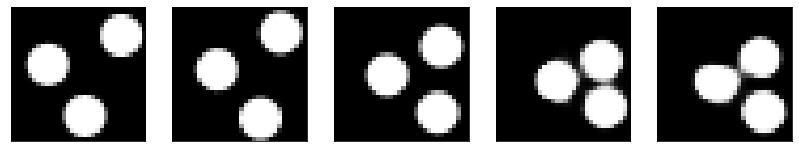

GD iterations:
i=0 | err=56.928616
i=1 | err=55.706314
i=2 | err=53.984123
i=3 | err=52.021095
i=4 | err=50.033905
i=5 | err=47.869865
i=6 | err=45.624443
i=7 | err=43.193825
i=8 | err=40.788681
i=9 | err=38.227905
i=10 | err=35.799633
i=11 | err=33.427429
i=12 | err=31.071499
i=13 | err=28.830378
i=14 | err=26.574305
i=15 | err=24.438087
i=16 | err=22.415634
i=17 | err=20.495228
i=18 | err=18.711250
i=19 | err=17.038794
i=20 | err=15.532810
i=21 | err=14.181897
i=22 | err=12.933132
i=23 | err=11.784116
i=24 | err=10.744896
i=25 | err=9.761831
i=26 | err=8.898817
i=27 | err=8.093998
i=28 | err=7.341682
i=29 | err=6.616570
Epoch=255 (61%) | out_positive=0.858611 | out_negative=0.129918 | mse=0.069324


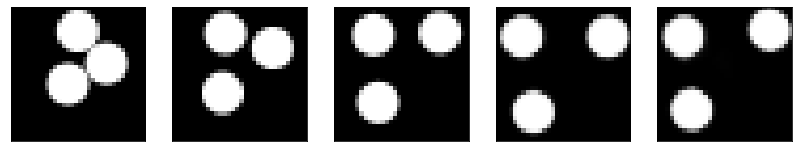

GD iterations:
i=0 | err=50.735527
i=1 | err=49.635468
i=2 | err=48.061413
i=3 | err=46.354744
i=4 | err=44.578949
i=5 | err=42.676613
i=6 | err=40.666840
i=7 | err=38.604904
i=8 | err=36.540253
i=9 | err=34.478931
i=10 | err=32.404270
i=11 | err=30.408730
i=12 | err=28.423504
i=13 | err=26.532757
i=14 | err=24.721661
i=15 | err=22.925388
i=16 | err=21.252190
i=17 | err=19.715843
i=18 | err=18.246071
i=19 | err=16.896492
i=20 | err=15.612893
i=21 | err=14.410432
i=22 | err=13.285785
i=23 | err=12.219543
i=24 | err=11.199598
i=25 | err=10.211845
i=26 | err=9.266183
i=27 | err=8.375425
i=28 | err=7.527322
i=29 | err=6.737344
Epoch=255 (63%) | out_positive=0.895545 | out_negative=0.125717 | mse=0.071436


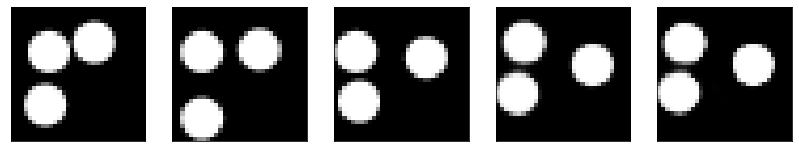

GD iterations:
i=0 | err=51.039787
i=1 | err=49.911095
i=2 | err=48.386215
i=3 | err=46.665459
i=4 | err=44.932438
i=5 | err=43.080498
i=6 | err=41.167419
i=7 | err=39.199829
i=8 | err=37.232353
i=9 | err=35.225090
i=10 | err=33.253586
i=11 | err=31.272520
i=12 | err=29.326122
i=13 | err=27.474323
i=14 | err=25.733053
i=15 | err=24.021013
i=16 | err=22.412910
i=17 | err=20.869654
i=18 | err=19.408737
i=19 | err=18.119690
i=20 | err=16.843414
i=21 | err=15.643414
i=22 | err=14.494368
i=23 | err=13.432942
i=24 | err=12.437788
i=25 | err=11.492761
i=26 | err=10.666969
i=27 | err=9.859753
i=28 | err=9.070797
i=29 | err=8.303120
Epoch=255 (65%) | out_positive=0.848509 | out_negative=0.073491 | mse=0.069862


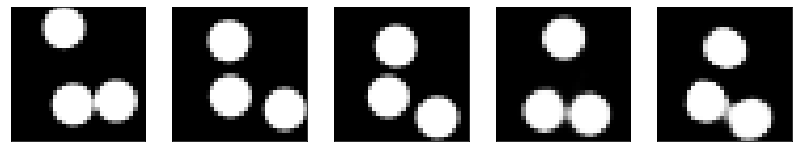

GD iterations:
i=0 | err=54.532772
i=1 | err=53.287849
i=2 | err=51.610161
i=3 | err=49.724014
i=4 | err=47.772087
i=5 | err=45.736378
i=6 | err=43.606590
i=7 | err=41.349331
i=8 | err=38.917122
i=9 | err=36.468758
i=10 | err=34.087349
i=11 | err=31.770481
i=12 | err=29.547728
i=13 | err=27.433056
i=14 | err=25.348709
i=15 | err=23.357168
i=16 | err=21.364780
i=17 | err=19.528048
i=18 | err=17.808992
i=19 | err=16.225628
i=20 | err=14.750458
i=21 | err=13.414275
i=22 | err=12.204736
i=23 | err=11.077415
i=24 | err=9.993813
i=25 | err=9.013854
i=26 | err=8.061123
i=27 | err=7.186250
i=28 | err=6.352123
i=29 | err=5.550333
Epoch=255 (66%) | out_positive=0.901859 | out_negative=0.165857 | mse=0.069186


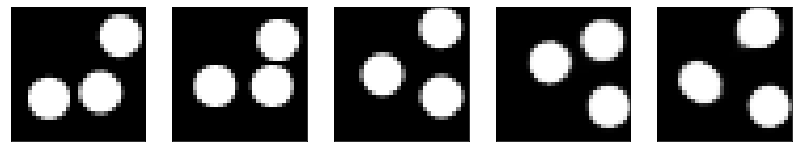

GD iterations:
i=0 | err=51.352661
i=1 | err=50.199421
i=2 | err=48.648140
i=3 | err=46.897018
i=4 | err=45.078453
i=5 | err=43.181679
i=6 | err=41.282906
i=7 | err=39.298241
i=8 | err=37.267994
i=9 | err=35.247162
i=10 | err=33.156239
i=11 | err=31.094744
i=12 | err=29.121899
i=13 | err=27.251476
i=14 | err=25.397709
i=15 | err=23.560377
i=16 | err=21.841911
i=17 | err=20.241913
i=18 | err=18.687862
i=19 | err=17.166264
i=20 | err=15.681293
i=21 | err=14.279162
i=22 | err=12.967318
i=23 | err=11.738571
i=24 | err=10.611250
i=25 | err=9.571795
i=26 | err=8.588737
i=27 | err=7.659180
i=28 | err=6.788704
i=29 | err=5.969398
Epoch=255 (68%) | out_positive=0.921705 | out_negative=0.157313 | mse=0.065848


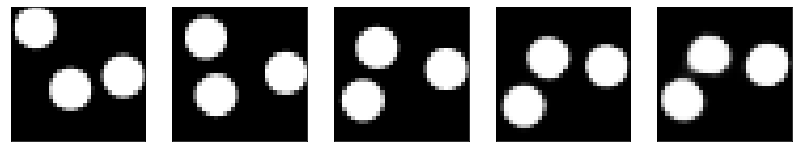

GD iterations:
i=0 | err=57.478981
i=1 | err=56.201172
i=2 | err=54.488998
i=3 | err=52.451714
i=4 | err=50.306477
i=5 | err=48.082649
i=6 | err=45.797764
i=7 | err=43.392509
i=8 | err=40.908386
i=9 | err=38.538002
i=10 | err=36.249107
i=11 | err=33.893936
i=12 | err=31.598751
i=13 | err=29.365620
i=14 | err=27.221216
i=15 | err=25.243496
i=16 | err=23.327141
i=17 | err=21.551964
i=18 | err=19.875647
i=19 | err=18.281958
i=20 | err=16.780254
i=21 | err=15.312040
i=22 | err=13.975668
i=23 | err=12.771685
i=24 | err=11.669823
i=25 | err=10.665238
i=26 | err=9.715178
i=27 | err=8.805378
i=28 | err=7.930599
i=29 | err=7.116077
Epoch=255 (70%) | out_positive=0.849284 | out_negative=0.142810 | mse=0.072749


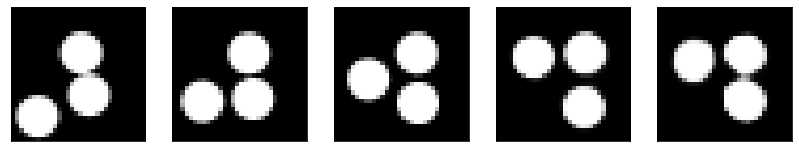

GD iterations:
i=0 | err=56.097263
i=1 | err=54.861427
i=2 | err=53.168598
i=3 | err=51.282982
i=4 | err=49.321419
i=5 | err=47.269768
i=6 | err=45.131172
i=7 | err=42.892117
i=8 | err=40.633308
i=9 | err=38.343063
i=10 | err=36.034981
i=11 | err=33.788712
i=12 | err=31.564360
i=13 | err=29.416637
i=14 | err=27.418045
i=15 | err=25.554579
i=16 | err=23.797974
i=17 | err=22.074089
i=18 | err=20.420317
i=19 | err=18.837635
i=20 | err=17.375813
i=21 | err=16.054668
i=22 | err=14.791721
i=23 | err=13.597219
i=24 | err=12.453705
i=25 | err=11.396500
i=26 | err=10.400419
i=27 | err=9.479338
i=28 | err=8.612997
i=29 | err=7.814807
Epoch=255 (71%) | out_positive=0.827061 | out_negative=0.087517 | mse=0.074770


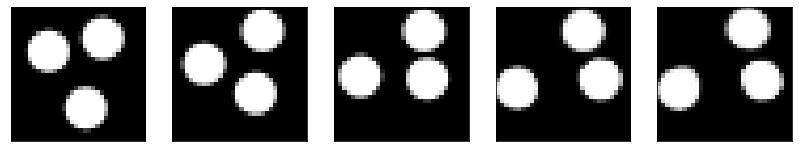

GD iterations:
i=0 | err=60.653549
i=1 | err=59.304657
i=2 | err=57.531761
i=3 | err=55.451462
i=4 | err=53.274277
i=5 | err=51.005478
i=6 | err=48.584038
i=7 | err=46.060463
i=8 | err=43.509495
i=9 | err=40.969582
i=10 | err=38.511501
i=11 | err=35.977573
i=12 | err=33.524292
i=13 | err=30.986012
i=14 | err=28.571699
i=15 | err=26.309666
i=16 | err=24.244213
i=17 | err=22.317017
i=18 | err=20.560928
i=19 | err=18.963882
i=20 | err=17.418045
i=21 | err=15.990396
i=22 | err=14.636690
i=23 | err=13.402696
i=24 | err=12.253457
i=25 | err=11.178304
i=26 | err=10.172605
i=27 | err=9.211449
i=28 | err=8.281481
i=29 | err=7.388416
Epoch=255 (73%) | out_positive=0.790402 | out_negative=0.126432 | mse=0.078008


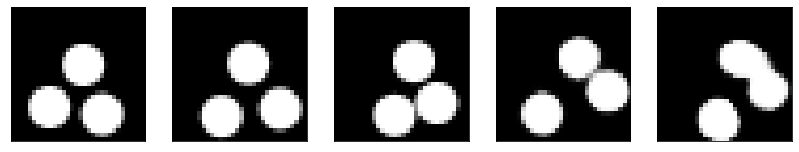

GD iterations:
i=0 | err=53.463501
i=1 | err=52.321663
i=2 | err=50.810825
i=3 | err=49.056702
i=4 | err=47.184601
i=5 | err=45.246162
i=6 | err=43.214855
i=7 | err=41.172253
i=8 | err=39.031357
i=9 | err=36.889679
i=10 | err=34.701420
i=11 | err=32.530525
i=12 | err=30.331324
i=13 | err=28.109257
i=14 | err=25.992905
i=15 | err=23.951824
i=16 | err=22.005056
i=17 | err=20.266497
i=18 | err=18.625759
i=19 | err=17.142673
i=20 | err=15.731691
i=21 | err=14.392295
i=22 | err=13.109798
i=23 | err=11.969736
i=24 | err=10.940550
i=25 | err=9.985445
i=26 | err=9.057110
i=27 | err=8.164478
i=28 | err=7.324068
i=29 | err=6.525012
Epoch=255 (75%) | out_positive=0.902953 | out_negative=0.118847 | mse=0.071980


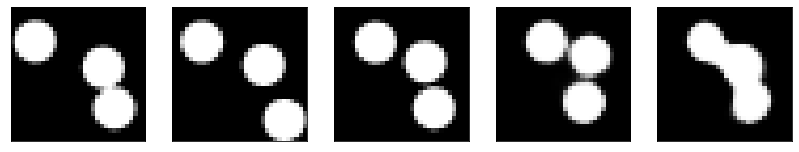

GD iterations:
i=0 | err=49.160107
i=1 | err=48.047001
i=2 | err=46.529289
i=3 | err=44.771442
i=4 | err=42.894463
i=5 | err=40.961437
i=6 | err=38.988762
i=7 | err=37.000534
i=8 | err=34.947483
i=9 | err=32.886593
i=10 | err=30.862278
i=11 | err=28.949860
i=12 | err=27.076469
i=13 | err=25.201855
i=14 | err=23.378199
i=15 | err=21.633751
i=16 | err=20.046833
i=17 | err=18.494425
i=18 | err=17.063641
i=19 | err=15.767370
i=20 | err=14.569117
i=21 | err=13.452031
i=22 | err=12.413431
i=23 | err=11.439123
i=24 | err=10.517806
i=25 | err=9.672018
i=26 | err=8.888081
i=27 | err=8.135129
i=28 | err=7.411032
i=29 | err=6.725832
Epoch=255 (77%) | out_positive=0.942387 | out_negative=0.161202 | mse=0.070507


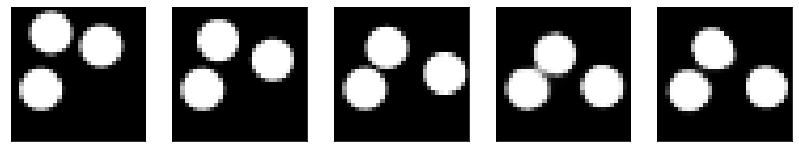

GD iterations:
i=0 | err=51.879181
i=1 | err=50.693558
i=2 | err=49.038765
i=3 | err=47.169064
i=4 | err=45.209156
i=5 | err=43.163330
i=6 | err=41.060146
i=7 | err=38.915939
i=8 | err=36.768188
i=9 | err=34.602814
i=10 | err=32.447678
i=11 | err=30.272408
i=12 | err=28.199633
i=13 | err=26.131908
i=14 | err=24.213303
i=15 | err=22.402517
i=16 | err=20.680935
i=17 | err=19.045809
i=18 | err=17.482059
i=19 | err=16.038654
i=20 | err=14.678665
i=21 | err=13.391331
i=22 | err=12.188549
i=23 | err=11.042933
i=24 | err=9.961519
i=25 | err=8.958147
i=26 | err=8.007183
i=27 | err=7.108459
i=28 | err=6.281988
i=29 | err=5.503648
Epoch=255 (79%) | out_positive=0.875186 | out_negative=0.203102 | mse=0.064740


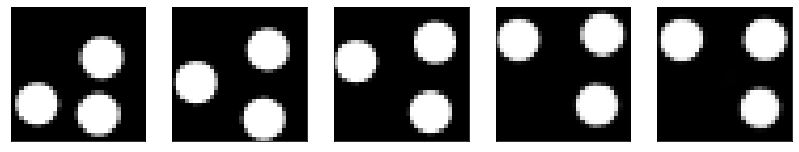

GD iterations:
i=0 | err=58.653748
i=1 | err=57.389282
i=2 | err=55.664219
i=3 | err=53.718765
i=4 | err=51.562916
i=5 | err=49.179359
i=6 | err=46.690262
i=7 | err=44.253860
i=8 | err=41.799210
i=9 | err=39.336231
i=10 | err=36.852932
i=11 | err=34.357948
i=12 | err=31.875481
i=13 | err=29.478764
i=14 | err=27.181637
i=15 | err=24.916943
i=16 | err=22.806444
i=17 | err=20.879181
i=18 | err=19.155773
i=19 | err=17.564396
i=20 | err=16.092615
i=21 | err=14.722139
i=22 | err=13.472921
i=23 | err=12.297408
i=24 | err=11.220401
i=25 | err=10.211811
i=26 | err=9.273724
i=27 | err=8.388355
i=28 | err=7.570662
i=29 | err=6.791259
Epoch=255 (81%) | out_positive=0.861430 | out_negative=0.130563 | mse=0.073324


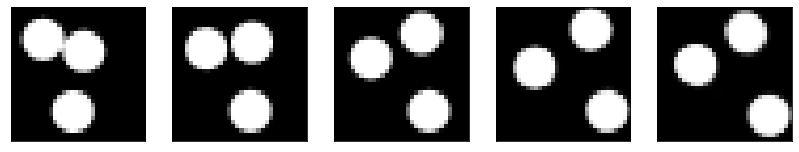

GD iterations:
i=0 | err=56.589867
i=1 | err=55.366714
i=2 | err=53.715958
i=3 | err=51.955635
i=4 | err=50.158314
i=5 | err=48.261707
i=6 | err=46.156166
i=7 | err=44.014442
i=8 | err=41.690701
i=9 | err=39.314911
i=10 | err=36.979340
i=11 | err=34.704601
i=12 | err=32.475327
i=13 | err=30.234848
i=14 | err=28.109915
i=15 | err=26.106815
i=16 | err=24.199059
i=17 | err=22.414324
i=18 | err=20.795231
i=19 | err=19.368107
i=20 | err=18.057013
i=21 | err=16.795496
i=22 | err=15.611082
i=23 | err=14.484578
i=24 | err=13.437286
i=25 | err=12.454824
i=26 | err=11.519765
i=27 | err=10.630480
i=28 | err=9.769540
i=29 | err=8.941066
Epoch=255 (83%) | out_positive=0.853441 | out_negative=0.086046 | mse=0.073907


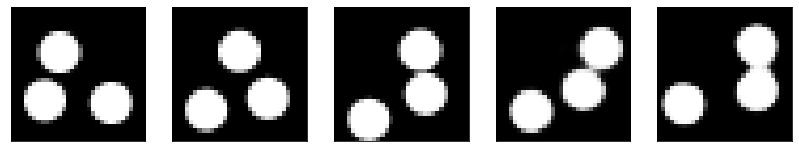

GD iterations:
i=0 | err=53.341042
i=1 | err=52.201412
i=2 | err=50.694267
i=3 | err=49.035732
i=4 | err=47.270882
i=5 | err=45.499352
i=6 | err=43.599789
i=7 | err=41.652267
i=8 | err=39.644226
i=9 | err=37.510414
i=10 | err=35.444138
i=11 | err=33.387413
i=12 | err=31.377264
i=13 | err=29.400145
i=14 | err=27.406944
i=15 | err=25.431339
i=16 | err=23.573450
i=17 | err=21.858137
i=18 | err=20.261248
i=19 | err=18.704157
i=20 | err=17.235649
i=21 | err=15.826737
i=22 | err=14.525591
i=23 | err=13.296354
i=24 | err=12.148289
i=25 | err=11.065359
i=26 | err=10.042547
i=27 | err=9.086665
i=28 | err=8.179932
i=29 | err=7.333720
Epoch=255 (84%) | out_positive=0.875418 | out_negative=0.142303 | mse=0.074598


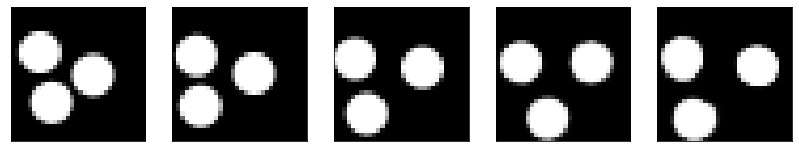

GD iterations:
i=0 | err=55.128883
i=1 | err=53.962242
i=2 | err=52.360115
i=3 | err=50.599785
i=4 | err=48.679077
i=5 | err=46.677460
i=6 | err=44.619312
i=7 | err=42.455429
i=8 | err=40.219410
i=9 | err=37.905926
i=10 | err=35.589977
i=11 | err=33.300293
i=12 | err=31.073494
i=13 | err=28.946692
i=14 | err=26.839893
i=15 | err=24.861948
i=16 | err=22.980232
i=17 | err=21.239302
i=18 | err=19.584585
i=19 | err=18.066349
i=20 | err=16.653940
i=21 | err=15.301521
i=22 | err=14.049139
i=23 | err=12.906053
i=24 | err=11.836279
i=25 | err=10.848864
i=26 | err=9.916594
i=27 | err=9.026735
i=28 | err=8.195026
i=29 | err=7.414954
Epoch=255 (86%) | out_positive=0.882676 | out_negative=0.128226 | mse=0.074083


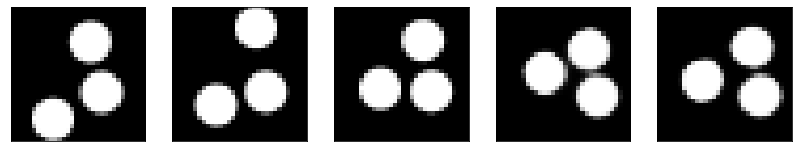

GD iterations:
i=0 | err=54.037224
i=1 | err=52.927338
i=2 | err=51.381317
i=3 | err=49.626839
i=4 | err=47.732700
i=5 | err=45.804554
i=6 | err=43.899223
i=7 | err=42.103096
i=8 | err=40.303734
i=9 | err=38.429543
i=10 | err=36.513359
i=11 | err=34.604229
i=12 | err=32.643150
i=13 | err=30.766743
i=14 | err=28.928513
i=15 | err=27.139919
i=16 | err=25.387295
i=17 | err=23.679619
i=18 | err=22.077654
i=19 | err=20.565350
i=20 | err=19.132374
i=21 | err=17.737499
i=22 | err=16.396252
i=23 | err=15.144508
i=24 | err=13.984602
i=25 | err=12.905116
i=26 | err=11.916657
i=27 | err=10.945740
i=28 | err=10.012598
i=29 | err=9.121791
Epoch=255 (88%) | out_positive=0.877148 | out_negative=0.089262 | mse=0.075096


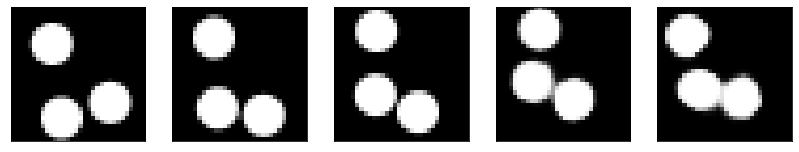

GD iterations:
i=0 | err=56.081421
i=1 | err=54.857258
i=2 | err=53.126415
i=3 | err=51.101074
i=4 | err=48.951900
i=5 | err=46.719902
i=6 | err=44.348549
i=7 | err=41.860386
i=8 | err=39.474724
i=9 | err=37.095963
i=10 | err=34.815994
i=11 | err=32.499920
i=12 | err=30.254648
i=13 | err=28.082712
i=14 | err=25.938305
i=15 | err=23.891376
i=16 | err=21.980644
i=17 | err=20.187309
i=18 | err=18.441696
i=19 | err=16.854733
i=20 | err=15.499187
i=21 | err=14.222282
i=22 | err=13.003345
i=23 | err=11.852975
i=24 | err=10.744885
i=25 | err=9.714159
i=26 | err=8.746689
i=27 | err=7.812240
i=28 | err=6.954229
i=29 | err=6.160126
Epoch=255 (90%) | out_positive=0.867975 | out_negative=0.117035 | mse=0.072310


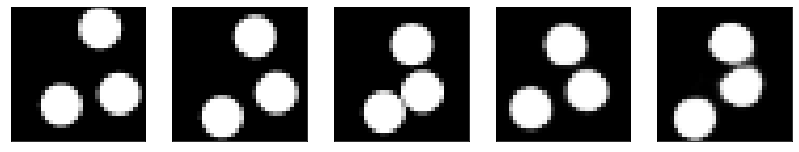

GD iterations:
i=0 | err=51.373001
i=1 | err=50.326447
i=2 | err=48.833160
i=3 | err=47.139366
i=4 | err=45.313572
i=5 | err=43.387428
i=6 | err=41.384216
i=7 | err=39.335907
i=8 | err=37.180153
i=9 | err=34.968792
i=10 | err=32.789497
i=11 | err=30.642174
i=12 | err=28.558758
i=13 | err=26.585802
i=14 | err=24.661339
i=15 | err=22.837336
i=16 | err=21.089113
i=17 | err=19.439648
i=18 | err=17.852682
i=19 | err=16.349138
i=20 | err=14.948313
i=21 | err=13.655413
i=22 | err=12.462315
i=23 | err=11.314053
i=24 | err=10.308074
i=25 | err=9.364586
i=26 | err=8.496298
i=27 | err=7.667594
i=28 | err=6.869432
i=29 | err=6.125065
Epoch=255 (92%) | out_positive=0.897851 | out_negative=0.120374 | mse=0.068885


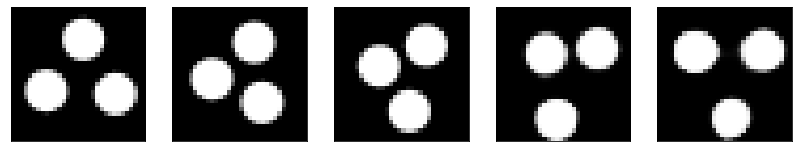

GD iterations:
i=0 | err=53.253571
i=1 | err=52.216339
i=2 | err=50.650379
i=3 | err=48.946655
i=4 | err=47.096252
i=5 | err=45.162163
i=6 | err=43.163208
i=7 | err=41.172066
i=8 | err=39.139244
i=9 | err=37.031071
i=10 | err=34.949921
i=11 | err=32.886299
i=12 | err=30.771881
i=13 | err=28.727734
i=14 | err=26.780544
i=15 | err=24.936920
i=16 | err=23.188969
i=17 | err=21.531784
i=18 | err=19.948383
i=19 | err=18.397888
i=20 | err=16.925365
i=21 | err=15.540007
i=22 | err=14.234712
i=23 | err=13.075636
i=24 | err=12.008445
i=25 | err=11.056147
i=26 | err=10.142059
i=27 | err=9.309383
i=28 | err=8.531006
i=29 | err=7.798648
Epoch=255 (94%) | out_positive=0.883853 | out_negative=0.070000 | mse=0.071829


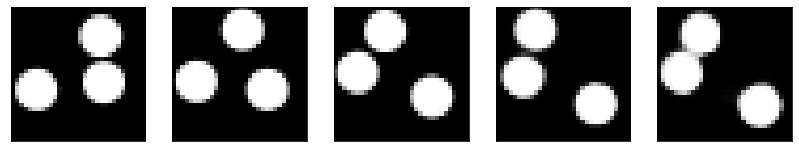

GD iterations:
i=0 | err=59.031181
i=1 | err=57.773903
i=2 | err=55.956787
i=3 | err=53.962067
i=4 | err=51.782143
i=5 | err=49.592766
i=6 | err=47.218086
i=7 | err=44.999458
i=8 | err=42.667145
i=9 | err=40.244804
i=10 | err=37.797134
i=11 | err=35.375675
i=12 | err=32.930958
i=13 | err=30.460081
i=14 | err=28.095753
i=15 | err=25.970291
i=16 | err=24.012096
i=17 | err=22.162891
i=18 | err=20.410021
i=19 | err=18.783489
i=20 | err=17.275568
i=21 | err=15.880413
i=22 | err=14.571086
i=23 | err=13.390621
i=24 | err=12.286662
i=25 | err=11.225691
i=26 | err=10.249176
i=27 | err=9.350929
i=28 | err=8.518522
i=29 | err=7.728436
Epoch=255 (95%) | out_positive=0.831250 | out_negative=0.126737 | mse=0.071834


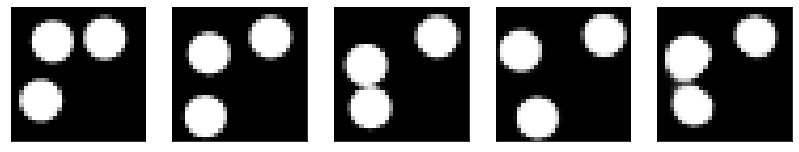

GD iterations:
i=0 | err=53.613651
i=1 | err=52.455040
i=2 | err=50.873417
i=3 | err=49.110703
i=4 | err=47.168964
i=5 | err=45.073147
i=6 | err=42.968544
i=7 | err=40.720665
i=8 | err=38.561161
i=9 | err=36.479549
i=10 | err=34.389408
i=11 | err=32.440205
i=12 | err=30.458637
i=13 | err=28.545811
i=14 | err=26.698637
i=15 | err=24.919590
i=16 | err=23.184559
i=17 | err=21.583958
i=18 | err=20.049587
i=19 | err=18.565212
i=20 | err=17.157192
i=21 | err=15.767724
i=22 | err=14.474303
i=23 | err=13.279146
i=24 | err=12.124479
i=25 | err=11.049140
i=26 | err=10.034389
i=27 | err=9.105679
i=28 | err=8.233857
i=29 | err=7.415979
Epoch=255 (97%) | out_positive=0.864166 | out_negative=0.122517 | mse=0.073498


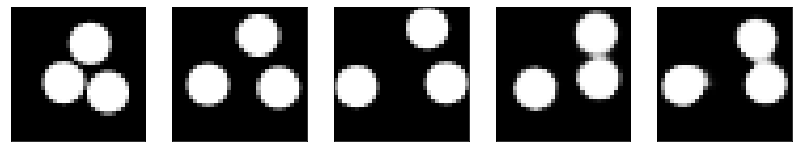

GD iterations:
i=0 | err=54.574299
i=1 | err=53.440128
i=2 | err=51.880642
i=3 | err=50.120026
i=4 | err=48.224331
i=5 | err=46.217987
i=6 | err=44.159176
i=7 | err=42.062782
i=8 | err=39.920059
i=9 | err=37.708122
i=10 | err=35.519520
i=11 | err=33.315094
i=12 | err=31.115067
i=13 | err=28.874271
i=14 | err=26.762558
i=15 | err=24.715343
i=16 | err=22.816137
i=17 | err=21.068672
i=18 | err=19.423271
i=19 | err=17.904320
i=20 | err=16.508427
i=21 | err=15.221675
i=22 | err=13.997151
i=23 | err=12.808202
i=24 | err=11.728906
i=25 | err=10.733335
i=26 | err=9.804874
i=27 | err=8.906540
i=28 | err=8.043664
i=29 | err=7.242879
Epoch=255 (99%) | out_positive=0.876665 | out_negative=0.135188 | mse=0.070601


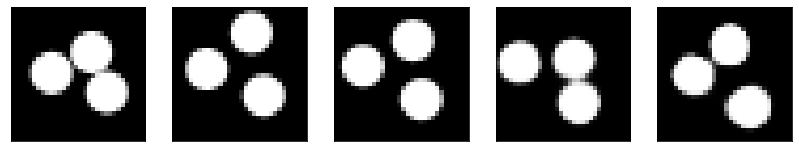

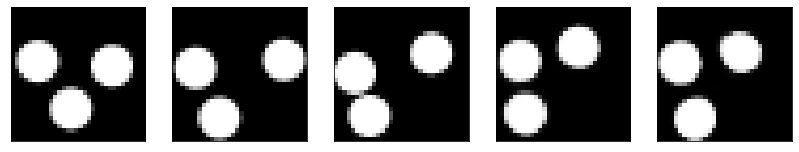

Test MSE 0.078864


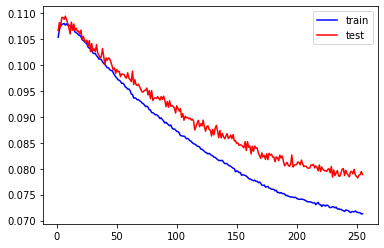

Model Saved.
GD iterations:
i=0 | err=53.482811
i=1 | err=52.365120
i=2 | err=50.852642
i=3 | err=49.169777
i=4 | err=47.380573
i=5 | err=45.485565
i=6 | err=43.616184
i=7 | err=41.750229
i=8 | err=39.880520
i=9 | err=37.942055
i=10 | err=35.934486
i=11 | err=33.918259
i=12 | err=31.988905
i=13 | err=30.139019
i=14 | err=28.316900
i=15 | err=26.510721
i=16 | err=24.788105
i=17 | err=23.087437
i=18 | err=21.476879
i=19 | err=19.908779
i=20 | err=18.409395
i=21 | err=17.022806
i=22 | err=15.728703
i=23 | err=14.521499
i=24 | err=13.358587
i=25 | err=12.242468
i=26 | err=11.147689
i=27 | err=10.096061
i=28 | err=9.130363
i=29 | err=8.232974
Epoch=256 (0%) | out_positive=0.912584 | out_negative=0.118911 | mse=0.078124


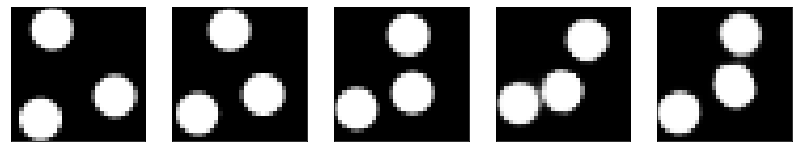

GD iterations:
i=0 | err=57.433582
i=1 | err=56.144501
i=2 | err=54.329166
i=3 | err=52.317139
i=4 | err=50.177692
i=5 | err=47.932961
i=6 | err=45.673180
i=7 | err=43.266197
i=8 | err=40.757851
i=9 | err=38.250790
i=10 | err=35.710915
i=11 | err=33.215389
i=12 | err=30.885616
i=13 | err=28.675167
i=14 | err=26.566235
i=15 | err=24.624352
i=16 | err=22.807957
i=17 | err=21.158867
i=18 | err=19.603420
i=19 | err=18.153862
i=20 | err=16.775030
i=21 | err=15.453532
i=22 | err=14.223753
i=23 | err=13.087715
i=24 | err=12.034893
i=25 | err=11.029499
i=26 | err=10.115852
i=27 | err=9.267826
i=28 | err=8.468647
i=29 | err=7.737866
Epoch=256 (2%) | out_positive=0.844992 | out_negative=0.119993 | mse=0.068805


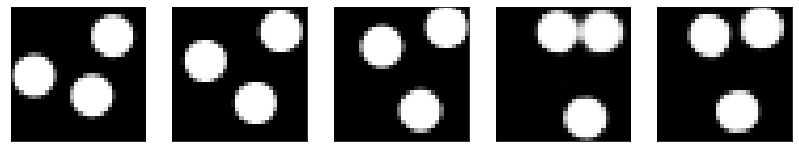

GD iterations:
i=0 | err=56.523209
i=1 | err=55.267441
i=2 | err=53.595726
i=3 | err=51.694859
i=4 | err=49.695633
i=5 | err=47.641907
i=6 | err=45.511284
i=7 | err=43.391235
i=8 | err=41.197342
i=9 | err=38.927155
i=10 | err=36.639717
i=11 | err=34.362915
i=12 | err=32.081177
i=13 | err=29.808823
i=14 | err=27.554653
i=15 | err=25.393284
i=16 | err=23.291136
i=17 | err=21.325802
i=18 | err=19.561930
i=19 | err=17.988056
i=20 | err=16.531429
i=21 | err=15.201536
i=22 | err=13.965294
i=23 | err=12.794191
i=24 | err=11.733442
i=25 | err=10.759039
i=26 | err=9.827843
i=27 | err=8.925263
i=28 | err=8.062725
i=29 | err=7.237435
Epoch=256 (4%) | out_positive=0.867024 | out_negative=0.145609 | mse=0.068459


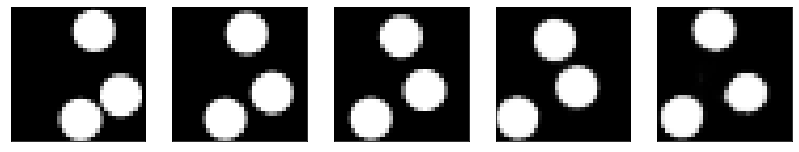

GD iterations:
i=0 | err=56.035278
i=1 | err=54.802986
i=2 | err=53.101509
i=3 | err=51.173103
i=4 | err=49.088223
i=5 | err=46.950245
i=6 | err=44.732307
i=7 | err=42.456657
i=8 | err=40.064209
i=9 | err=37.614868
i=10 | err=35.157646
i=11 | err=32.855000
i=12 | err=30.632061
i=13 | err=28.461775
i=14 | err=26.390015
i=15 | err=24.432392
i=16 | err=22.636148
i=17 | err=20.986187
i=18 | err=19.428143
i=19 | err=17.947084
i=20 | err=16.509459
i=21 | err=15.178967
i=22 | err=13.913456
i=23 | err=12.705498
i=24 | err=11.589784
i=25 | err=10.574724
i=26 | err=9.626019
i=27 | err=8.756571
i=28 | err=7.949327
i=29 | err=7.198789
Epoch=256 (6%) | out_positive=0.823719 | out_negative=0.145335 | mse=0.071081


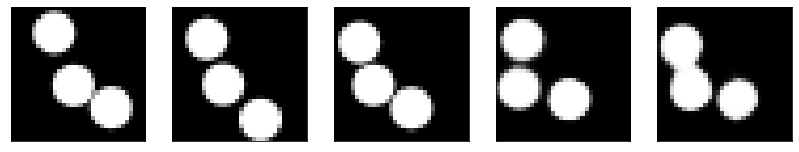

GD iterations:
i=0 | err=53.996166
i=1 | err=52.833496
i=2 | err=51.214828
i=3 | err=49.425488
i=4 | err=47.547073
i=5 | err=45.609200
i=6 | err=43.531502
i=7 | err=41.323494
i=8 | err=39.104000
i=9 | err=36.877914
i=10 | err=34.616135
i=11 | err=32.317150
i=12 | err=30.063545
i=13 | err=27.850744
i=14 | err=25.751503
i=15 | err=23.774624
i=16 | err=21.964817
i=17 | err=20.250946
i=18 | err=18.620222
i=19 | err=17.087505
i=20 | err=15.713718
i=21 | err=14.455207
i=22 | err=13.310787
i=23 | err=12.247488
i=24 | err=11.240744
i=25 | err=10.326717
i=26 | err=9.475973
i=27 | err=8.700690
i=28 | err=7.951762
i=29 | err=7.236319
Epoch=256 (7%) | out_positive=0.836012 | out_negative=0.099963 | mse=0.066776


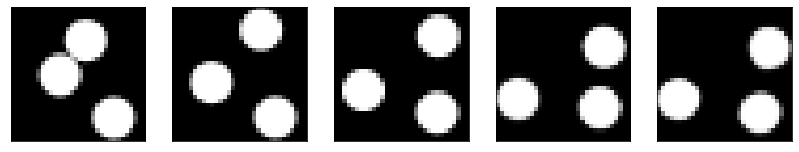

GD iterations:
i=0 | err=53.883575
i=1 | err=52.647118
i=2 | err=51.040722
i=3 | err=49.166851
i=4 | err=47.201225
i=5 | err=45.127991
i=6 | err=42.981571
i=7 | err=40.797943
i=8 | err=38.629913
i=9 | err=36.411484
i=10 | err=34.283028
i=11 | err=32.253510
i=12 | err=30.280193
i=13 | err=28.358410
i=14 | err=26.532719
i=15 | err=24.766609
i=16 | err=23.061150
i=17 | err=21.413261
i=18 | err=19.855350
i=19 | err=18.392769
i=20 | err=16.965078
i=21 | err=15.642372
i=22 | err=14.334454
i=23 | err=13.075054
i=24 | err=11.842112
i=25 | err=10.659225
i=26 | err=9.590018
i=27 | err=8.552200
i=28 | err=7.595608
i=29 | err=6.700772
Epoch=256 (9%) | out_positive=0.887207 | out_negative=0.117172 | mse=0.072776


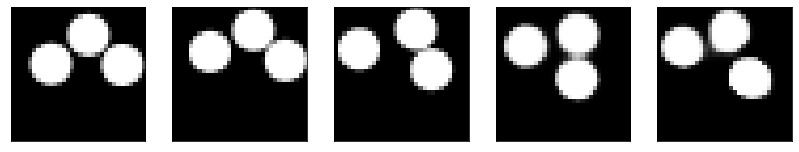

GD iterations:
i=0 | err=56.579842
i=1 | err=55.383839
i=2 | err=53.686523
i=3 | err=51.838898
i=4 | err=49.925850
i=5 | err=47.876244
i=6 | err=45.843742
i=7 | err=43.750473
i=8 | err=41.608986
i=9 | err=39.412476
i=10 | err=37.179295
i=11 | err=34.946602
i=12 | err=32.670013
i=13 | err=30.511326
i=14 | err=28.472008
i=15 | err=26.512983
i=16 | err=24.608215
i=17 | err=22.821484
i=18 | err=21.092497
i=19 | err=19.462454
i=20 | err=17.909309
i=21 | err=16.374786
i=22 | err=14.928835
i=23 | err=13.621254
i=24 | err=12.414721
i=25 | err=11.311663
i=26 | err=10.294393
i=27 | err=9.375988
i=28 | err=8.526245
i=29 | err=7.729490
Epoch=256 (11%) | out_positive=0.854587 | out_negative=0.126305 | mse=0.073903


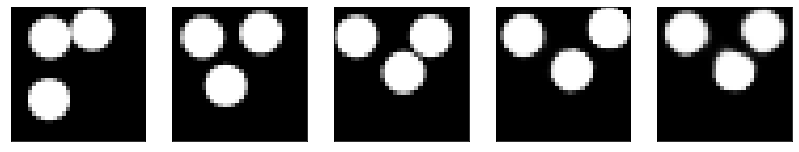

GD iterations:
i=0 | err=56.539406
i=1 | err=55.215977
i=2 | err=53.533710
i=3 | err=51.660194
i=4 | err=49.753555
i=5 | err=47.781143
i=6 | err=45.702446
i=7 | err=43.441513
i=8 | err=41.064560
i=9 | err=38.688545
i=10 | err=36.282059
i=11 | err=33.891541
i=12 | err=31.564053
i=13 | err=29.315067
i=14 | err=27.212929
i=15 | err=25.219992
i=16 | err=23.369501
i=17 | err=21.627821
i=18 | err=19.964499
i=19 | err=18.433233
i=20 | err=17.072941
i=21 | err=15.868872
i=22 | err=14.770347
i=23 | err=13.750259
i=24 | err=12.810953
i=25 | err=11.843951
i=26 | err=10.945133
i=27 | err=10.027967
i=28 | err=9.149845
i=29 | err=8.348168
Epoch=256 (13%) | out_positive=0.877703 | out_negative=0.102256 | mse=0.072595


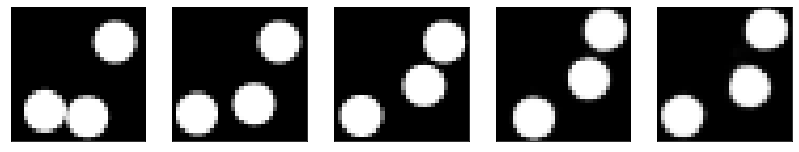

GD iterations:
i=0 | err=60.113785
i=1 | err=58.908600
i=2 | err=57.248898
i=3 | err=55.379837
i=4 | err=53.313068
i=5 | err=51.128647
i=6 | err=48.813145
i=7 | err=46.383934
i=8 | err=43.978592
i=9 | err=41.518829
i=10 | err=39.027657
i=11 | err=36.549248
i=12 | err=34.047089
i=13 | err=31.613594
i=14 | err=29.341488
i=15 | err=27.184994
i=16 | err=25.145214
i=17 | err=23.214985
i=18 | err=21.408100
i=19 | err=19.703922
i=20 | err=18.139738
i=21 | err=16.706779
i=22 | err=15.347671
i=23 | err=14.034920
i=24 | err=12.749678
i=25 | err=11.534813
i=26 | err=10.422300
i=27 | err=9.391853
i=28 | err=8.401718
i=29 | err=7.492743
Epoch=256 (15%) | out_positive=0.789607 | out_negative=0.089595 | mse=0.074035


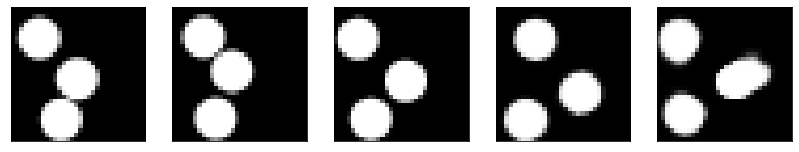

GD iterations:
i=0 | err=54.599846
i=1 | err=53.505615
i=2 | err=51.935875
i=3 | err=50.141922
i=4 | err=48.204178
i=5 | err=46.223785
i=6 | err=44.205627
i=7 | err=42.049622
i=8 | err=39.852753
i=9 | err=37.584316
i=10 | err=35.364834
i=11 | err=33.125237
i=12 | err=30.988977
i=13 | err=28.833088
i=14 | err=26.724846
i=15 | err=24.672321
i=16 | err=22.724089
i=17 | err=20.948704
i=18 | err=19.310034
i=19 | err=17.724644
i=20 | err=16.236187
i=21 | err=14.860056
i=22 | err=13.631052
i=23 | err=12.456512
i=24 | err=11.357760
i=25 | err=10.323481
i=26 | err=9.378788
i=27 | err=8.533159
i=28 | err=7.767087
i=29 | err=7.037624
Epoch=256 (17%) | out_positive=0.837972 | out_negative=0.108822 | mse=0.071225


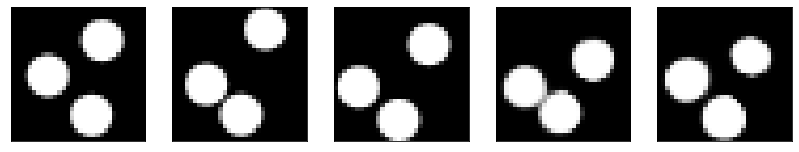

GD iterations:
i=0 | err=56.098663
i=1 | err=54.906898
i=2 | err=53.342106
i=3 | err=51.564610
i=4 | err=49.658165
i=5 | err=47.744659
i=6 | err=45.733467
i=7 | err=43.657028
i=8 | err=41.634750
i=9 | err=39.629272
i=10 | err=37.603226
i=11 | err=35.567749
i=12 | err=33.507080
i=13 | err=31.455919
i=14 | err=29.455540
i=15 | err=27.485207
i=16 | err=25.571404
i=17 | err=23.737999
i=18 | err=21.967472
i=19 | err=20.300900
i=20 | err=18.712879
i=21 | err=17.215305
i=22 | err=15.793140
i=23 | err=14.421168
i=24 | err=13.123336
i=25 | err=11.910688
i=26 | err=10.773737
i=27 | err=9.724466
i=28 | err=8.748022
i=29 | err=7.831311
Epoch=256 (18%) | out_positive=0.804178 | out_negative=0.097489 | mse=0.068918


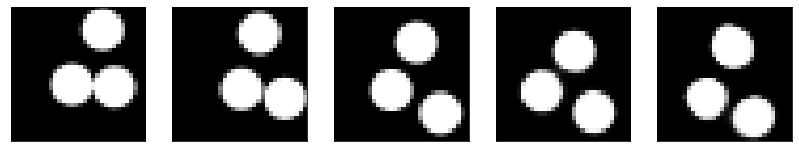

GD iterations:
i=0 | err=53.006432
i=1 | err=51.748619
i=2 | err=50.048531
i=3 | err=48.213879
i=4 | err=46.321175
i=5 | err=44.340248
i=6 | err=42.267960
i=7 | err=40.100842
i=8 | err=37.985340
i=9 | err=35.893261
i=10 | err=33.789017
i=11 | err=31.628021
i=12 | err=29.486782
i=13 | err=27.344086
i=14 | err=25.324984
i=15 | err=23.484810
i=16 | err=21.774429
i=17 | err=20.196922
i=18 | err=18.658409
i=19 | err=17.195538
i=20 | err=15.810613
i=21 | err=14.514061
i=22 | err=13.302683
i=23 | err=12.182028
i=24 | err=11.164955
i=25 | err=10.220947
i=26 | err=9.371582
i=27 | err=8.574305
i=28 | err=7.830469
i=29 | err=7.140110
Epoch=256 (20%) | out_positive=0.859037 | out_negative=0.092316 | mse=0.069154


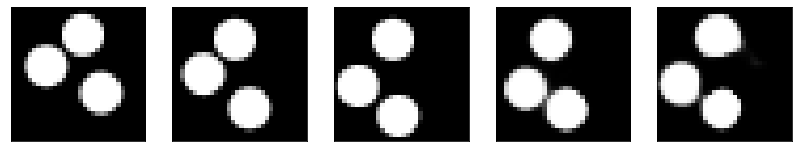

GD iterations:
i=0 | err=48.746849
i=1 | err=47.629517
i=2 | err=46.191963
i=3 | err=44.576897
i=4 | err=42.859890
i=5 | err=41.047447
i=6 | err=39.178883
i=7 | err=37.180435
i=8 | err=35.141136
i=9 | err=33.095459
i=10 | err=31.022507
i=11 | err=28.959530
i=12 | err=27.025833
i=13 | err=25.196323
i=14 | err=23.511330
i=15 | err=21.864723
i=16 | err=20.324678
i=17 | err=18.897623
i=18 | err=17.588661
i=19 | err=16.393221
i=20 | err=15.258031
i=21 | err=14.228987
i=22 | err=13.226431
i=23 | err=12.260807
i=24 | err=11.337510
i=25 | err=10.480533
i=26 | err=9.657833
i=27 | err=8.866135
i=28 | err=8.076333
i=29 | err=7.312113
Epoch=256 (22%) | out_positive=0.892579 | out_negative=0.109021 | mse=0.068623


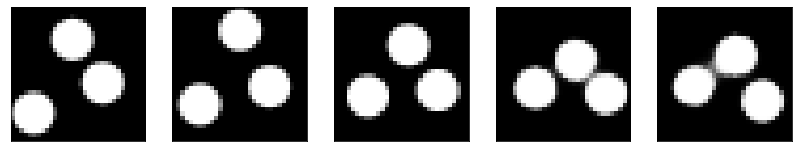

GD iterations:
i=0 | err=50.282753
i=1 | err=49.175461
i=2 | err=47.651451
i=3 | err=45.959175
i=4 | err=44.221645
i=5 | err=42.428139
i=6 | err=40.557785
i=7 | err=38.632870
i=8 | err=36.630249
i=9 | err=34.605984
i=10 | err=32.597485
i=11 | err=30.608759
i=12 | err=28.625046
i=13 | err=26.653400
i=14 | err=24.719479
i=15 | err=22.834190
i=16 | err=21.061945
i=17 | err=19.404568
i=18 | err=17.806988
i=19 | err=16.291504
i=20 | err=14.895544
i=21 | err=13.578892
i=22 | err=12.349161
i=23 | err=11.217957
i=24 | err=10.181211
i=25 | err=9.245848
i=26 | err=8.375607
i=27 | err=7.561899
i=28 | err=6.773033
i=29 | err=6.027954
Epoch=256 (24%) | out_positive=0.909560 | out_negative=0.145870 | mse=0.068519


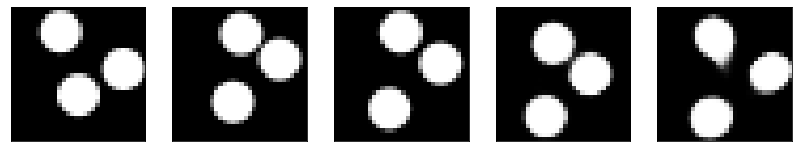

GD iterations:
i=0 | err=54.941299
i=1 | err=53.770630
i=2 | err=52.105995
i=3 | err=50.271984
i=4 | err=48.359241
i=5 | err=46.350754
i=6 | err=44.251141
i=7 | err=42.113899
i=8 | err=39.875618
i=9 | err=37.594238
i=10 | err=35.364925
i=11 | err=33.163025
i=12 | err=31.058441
i=13 | err=29.022198
i=14 | err=27.071098
i=15 | err=25.238411
i=16 | err=23.464209
i=17 | err=21.775995
i=18 | err=20.134953
i=19 | err=18.579327
i=20 | err=17.020407
i=21 | err=15.587978
i=22 | err=14.148468
i=23 | err=12.829038
i=24 | err=11.602858
i=25 | err=10.471659
i=26 | err=9.403816
i=27 | err=8.366966
i=28 | err=7.415560
i=29 | err=6.525263
Epoch=256 (26%) | out_positive=0.920278 | out_negative=0.159045 | mse=0.067370


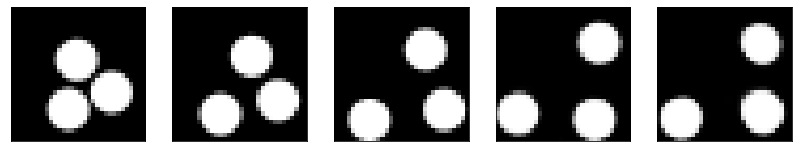

GD iterations:
i=0 | err=54.316025
i=1 | err=53.153801
i=2 | err=51.530258
i=3 | err=49.742393
i=4 | err=47.855652
i=5 | err=45.868675
i=6 | err=43.832161
i=7 | err=41.791107
i=8 | err=39.646065
i=9 | err=37.455406
i=10 | err=35.248940
i=11 | err=32.977409
i=12 | err=30.836647
i=13 | err=28.766895
i=14 | err=26.821100
i=15 | err=24.960304
i=16 | err=23.126698
i=17 | err=21.365841
i=18 | err=19.698168
i=19 | err=18.144133
i=20 | err=16.699493
i=21 | err=15.293209
i=22 | err=13.964855
i=23 | err=12.732738
i=24 | err=11.579962
i=25 | err=10.509533
i=26 | err=9.470669
i=27 | err=8.497820
i=28 | err=7.593203
i=29 | err=6.744529
Epoch=256 (28%) | out_positive=0.892749 | out_negative=0.129893 | mse=0.072643


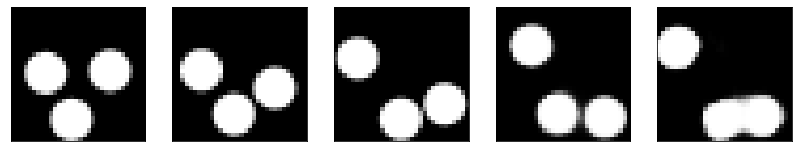

GD iterations:
i=0 | err=54.245262
i=1 | err=52.974602
i=2 | err=51.344284
i=3 | err=49.548500
i=4 | err=47.670723
i=5 | err=45.735725
i=6 | err=43.833736
i=7 | err=41.832512
i=8 | err=39.712090
i=9 | err=37.535149
i=10 | err=35.376953
i=11 | err=33.331383
i=12 | err=31.221773
i=13 | err=29.210159
i=14 | err=27.242996
i=15 | err=25.432972
i=16 | err=23.761742
i=17 | err=22.138308
i=18 | err=20.597488
i=19 | err=19.107296
i=20 | err=17.681377
i=21 | err=16.391426
i=22 | err=15.170126
i=23 | err=14.001972
i=24 | err=12.876360
i=25 | err=11.846112
i=26 | err=10.891504
i=27 | err=9.987492
i=28 | err=9.140117
i=29 | err=8.331615
Epoch=256 (30%) | out_positive=0.882890 | out_negative=0.109984 | mse=0.070502


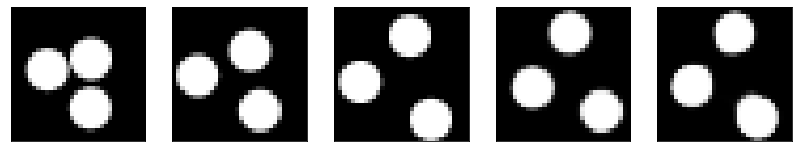

GD iterations:
i=0 | err=56.759712
i=1 | err=55.511147
i=2 | err=53.752014
i=3 | err=51.728096
i=4 | err=49.545147
i=5 | err=47.349876
i=6 | err=45.182789
i=7 | err=43.030434
i=8 | err=40.864330
i=9 | err=38.716949
i=10 | err=36.558754
i=11 | err=34.294525
i=12 | err=32.018978
i=13 | err=29.878744
i=14 | err=27.745234
i=15 | err=25.744711
i=16 | err=23.873697
i=17 | err=22.186644
i=18 | err=20.580429
i=19 | err=19.127258
i=20 | err=17.741409
i=21 | err=16.470879
i=22 | err=15.267958
i=23 | err=14.125253
i=24 | err=12.983180
i=25 | err=11.892855
i=26 | err=10.830296
i=27 | err=9.801134
i=28 | err=8.847835
i=29 | err=7.942003
Epoch=256 (31%) | out_positive=0.881192 | out_negative=0.085053 | mse=0.073581


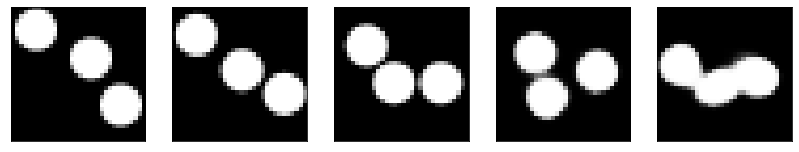

GD iterations:
i=0 | err=54.928978
i=1 | err=53.722973
i=2 | err=52.157539
i=3 | err=50.368198
i=4 | err=48.465622
i=5 | err=46.493011
i=6 | err=44.464828
i=7 | err=42.383667
i=8 | err=40.250969
i=9 | err=38.094440
i=10 | err=35.930351
i=11 | err=33.820457
i=12 | err=31.760719
i=13 | err=29.728127
i=14 | err=27.755379
i=15 | err=25.837173
i=16 | err=23.931396
i=17 | err=22.002029
i=18 | err=20.161285
i=19 | err=18.477749
i=20 | err=16.946611
i=21 | err=15.570542
i=22 | err=14.313934
i=23 | err=13.173653
i=24 | err=12.084574
i=25 | err=11.081155
i=26 | err=10.121778
i=27 | err=9.246468
i=28 | err=8.417461
i=29 | err=7.623468
Epoch=256 (33%) | out_positive=0.823997 | out_negative=0.135536 | mse=0.066803


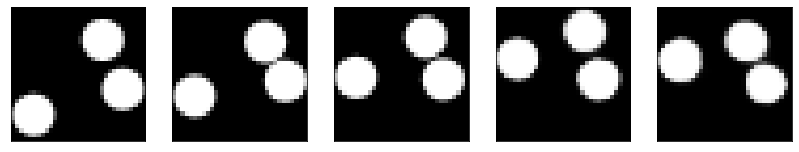

GD iterations:
i=0 | err=51.960098
i=1 | err=50.857700
i=2 | err=49.391171
i=3 | err=47.740379
i=4 | err=45.966473
i=5 | err=44.164864
i=6 | err=42.356544
i=7 | err=40.460915
i=8 | err=38.486126
i=9 | err=36.414661
i=10 | err=34.334232
i=11 | err=32.196030
i=12 | err=30.160208
i=13 | err=28.141384
i=14 | err=26.169275
i=15 | err=24.205704
i=16 | err=22.344391
i=17 | err=20.591993
i=18 | err=19.019249
i=19 | err=17.576214
i=20 | err=16.261246
i=21 | err=15.021519
i=22 | err=13.868871
i=23 | err=12.803434
i=24 | err=11.810045
i=25 | err=10.854401
i=26 | err=9.952252
i=27 | err=9.064307
i=28 | err=8.243151
i=29 | err=7.438102
Epoch=256 (35%) | out_positive=0.897925 | out_negative=0.128644 | mse=0.073379


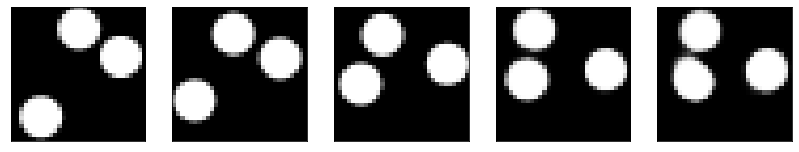

GD iterations:
i=0 | err=56.244591
i=1 | err=54.977753
i=2 | err=53.345936
i=3 | err=51.479927
i=4 | err=49.497620
i=5 | err=47.487366
i=6 | err=45.483315
i=7 | err=43.404816
i=8 | err=41.273270
i=9 | err=39.113564
i=10 | err=36.992500
i=11 | err=34.862743
i=12 | err=32.661835
i=13 | err=30.482834
i=14 | err=28.292788
i=15 | err=26.166199
i=16 | err=24.149834
i=17 | err=22.358240
i=18 | err=20.655380
i=19 | err=19.029991
i=20 | err=17.481735
i=21 | err=16.090244
i=22 | err=14.774299
i=23 | err=13.502393
i=24 | err=12.290369
i=25 | err=11.151874
i=26 | err=10.123205
i=27 | err=9.208170
i=28 | err=8.340680
i=29 | err=7.546845
Epoch=256 (37%) | out_positive=0.900971 | out_negative=0.102288 | mse=0.076460


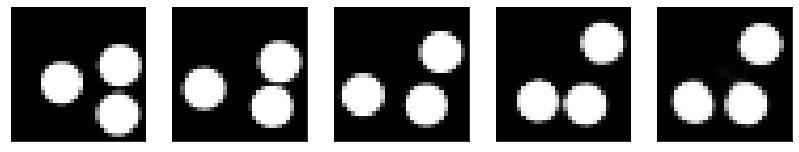

GD iterations:
i=0 | err=55.643669
i=1 | err=54.392113
i=2 | err=52.741703
i=3 | err=50.849548
i=4 | err=48.858852
i=5 | err=46.798019
i=6 | err=44.528404
i=7 | err=42.276993
i=8 | err=39.899429
i=9 | err=37.522408
i=10 | err=35.173214
i=11 | err=32.973503
i=12 | err=30.856659
i=13 | err=28.838196
i=14 | err=26.825459
i=15 | err=24.780045
i=16 | err=22.829983
i=17 | err=20.993105
i=18 | err=19.246803
i=19 | err=17.647623
i=20 | err=16.187815
i=21 | err=14.890672
i=22 | err=13.727095
i=23 | err=12.642322
i=24 | err=11.610106
i=25 | err=10.610826
i=26 | err=9.641448
i=27 | err=8.735651
i=28 | err=7.859824
i=29 | err=7.071201
Epoch=256 (39%) | out_positive=0.892766 | out_negative=0.101559 | mse=0.074802


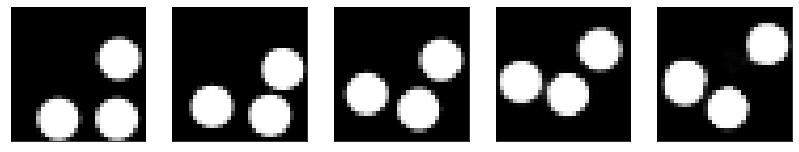

GD iterations:
i=0 | err=53.397236
i=1 | err=52.232033
i=2 | err=50.565010
i=3 | err=48.680916
i=4 | err=46.719929
i=5 | err=44.753731
i=6 | err=42.747124
i=7 | err=40.761787
i=8 | err=38.703114
i=9 | err=36.712593
i=10 | err=34.639370
i=11 | err=32.609360
i=12 | err=30.601562
i=13 | err=28.600040
i=14 | err=26.666553
i=15 | err=24.824074
i=16 | err=23.120564
i=17 | err=21.504471
i=18 | err=19.905491
i=19 | err=18.334248
i=20 | err=16.849770
i=21 | err=15.428295
i=22 | err=14.096691
i=23 | err=12.846867
i=24 | err=11.693748
i=25 | err=10.609388
i=26 | err=9.603800
i=27 | err=8.653791
i=28 | err=7.800379
i=29 | err=7.005479
Epoch=256 (41%) | out_positive=0.858742 | out_negative=0.121899 | mse=0.072358


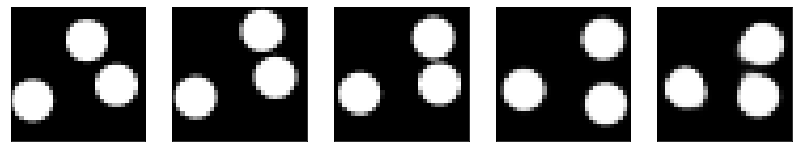

GD iterations:
i=0 | err=56.136147
i=1 | err=54.913452
i=2 | err=53.289932
i=3 | err=51.396904
i=4 | err=49.386658
i=5 | err=47.250454
i=6 | err=45.030979
i=7 | err=42.710655
i=8 | err=40.359673
i=9 | err=37.944904
i=10 | err=35.528175
i=11 | err=33.247730
i=12 | err=31.085398
i=13 | err=29.025784
i=14 | err=27.036980
i=15 | err=25.156038
i=16 | err=23.398861
i=17 | err=21.657829
i=18 | err=19.972807
i=19 | err=18.300898
i=20 | err=16.699810
i=21 | err=15.231533
i=22 | err=13.858265
i=23 | err=12.583529
i=24 | err=11.396516
i=25 | err=10.203384
i=26 | err=9.081405
i=27 | err=8.012156
i=28 | err=7.054255
i=29 | err=6.178586
Epoch=256 (42%) | out_positive=0.909062 | out_negative=0.152141 | mse=0.072069


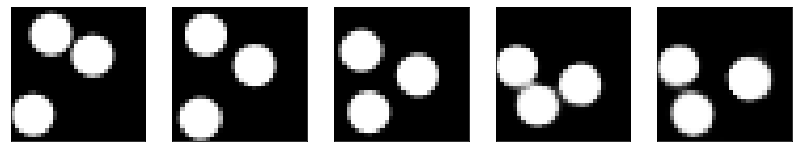

GD iterations:
i=0 | err=53.699326
i=1 | err=52.412483
i=2 | err=50.641052
i=3 | err=48.601883
i=4 | err=46.407688
i=5 | err=44.105732
i=6 | err=41.770935
i=7 | err=39.383549
i=8 | err=37.078327
i=9 | err=34.869064
i=10 | err=32.658775
i=11 | err=30.400244
i=12 | err=28.207779
i=13 | err=26.166876
i=14 | err=24.247091
i=15 | err=22.363064
i=16 | err=20.599642
i=17 | err=18.982059
i=18 | err=17.460823
i=19 | err=16.090551
i=20 | err=14.779251
i=21 | err=13.586185
i=22 | err=12.504160
i=23 | err=11.498273
i=24 | err=10.538892
i=25 | err=9.629289
i=26 | err=8.763229
i=27 | err=7.904377
i=28 | err=7.097940
i=29 | err=6.363974
Epoch=256 (44%) | out_positive=0.866637 | out_negative=0.092832 | mse=0.067195


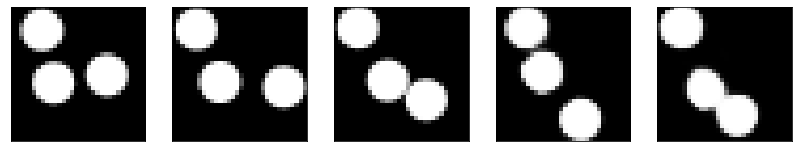

GD iterations:
i=0 | err=54.601223
i=1 | err=53.439716
i=2 | err=51.749557
i=3 | err=49.924026
i=4 | err=47.933151
i=5 | err=45.806885
i=6 | err=43.398933
i=7 | err=40.931267
i=8 | err=38.498199
i=9 | err=36.115036
i=10 | err=33.793503
i=11 | err=31.519859
i=12 | err=29.257996
i=13 | err=27.066357
i=14 | err=25.032440
i=15 | err=23.133076
i=16 | err=21.297968
i=17 | err=19.567188
i=18 | err=17.912889
i=19 | err=16.382769
i=20 | err=14.945458
i=21 | err=13.667591
i=22 | err=12.473038
i=23 | err=11.359392
i=24 | err=10.320497
i=25 | err=9.292898
i=26 | err=8.356089
i=27 | err=7.458372
i=28 | err=6.589316
i=29 | err=5.786598
Epoch=256 (46%) | out_positive=0.844127 | out_negative=0.180787 | mse=0.066376


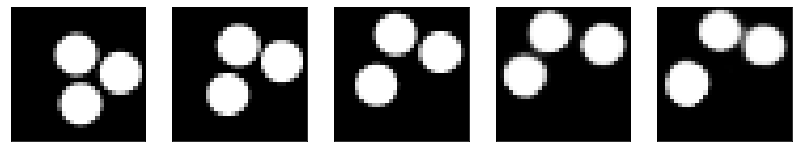

GD iterations:
i=0 | err=51.681892
i=1 | err=50.547958
i=2 | err=48.956837
i=3 | err=47.225780
i=4 | err=45.398327
i=5 | err=43.463894
i=6 | err=41.426414
i=7 | err=39.275009
i=8 | err=37.050571
i=9 | err=34.808270
i=10 | err=32.607285
i=11 | err=30.466415
i=12 | err=28.443546
i=13 | err=26.456356
i=14 | err=24.617754
i=15 | err=22.826796
i=16 | err=21.051018
i=17 | err=19.332916
i=18 | err=17.649817
i=19 | err=16.095779
i=20 | err=14.665854
i=21 | err=13.348272
i=22 | err=12.109133
i=23 | err=10.971788
i=24 | err=9.909374
i=25 | err=8.917263
i=26 | err=7.965638
i=27 | err=7.100625
i=28 | err=6.269430
i=29 | err=5.494684
Epoch=256 (48%) | out_positive=0.917679 | out_negative=0.172687 | mse=0.069135


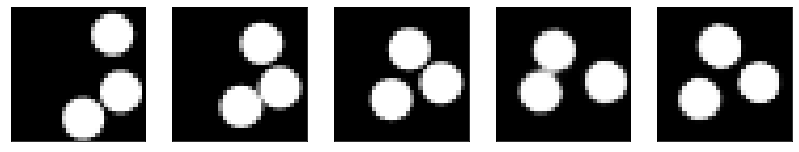

GD iterations:
i=0 | err=55.581467
i=1 | err=54.282356
i=2 | err=52.582642
i=3 | err=50.682201
i=4 | err=48.697994
i=5 | err=46.697361
i=6 | err=44.612167
i=7 | err=42.443588
i=8 | err=40.247070
i=9 | err=38.035076
i=10 | err=35.786613
i=11 | err=33.523987
i=12 | err=31.345703
i=13 | err=29.266949
i=14 | err=27.230190
i=15 | err=25.280590
i=16 | err=23.373493
i=17 | err=21.590643
i=18 | err=19.911732
i=19 | err=18.289608
i=20 | err=16.768837
i=21 | err=15.385601
i=22 | err=14.100700
i=23 | err=12.905516
i=24 | err=11.810610
i=25 | err=10.776781
i=26 | err=9.809696
i=27 | err=8.907566
i=28 | err=8.063205
i=29 | err=7.290154
Epoch=256 (49%) | out_positive=0.790350 | out_negative=0.130519 | mse=0.068348


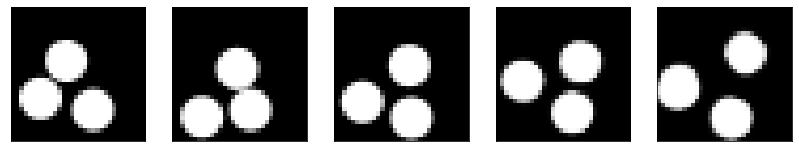

GD iterations:
i=0 | err=53.988083
i=1 | err=52.679543
i=2 | err=50.942497
i=3 | err=49.071053
i=4 | err=47.080181
i=5 | err=44.941990
i=6 | err=42.792320
i=7 | err=40.574852
i=8 | err=38.318512
i=9 | err=35.998974
i=10 | err=33.680763
i=11 | err=31.472557
i=12 | err=29.351559
i=13 | err=27.350735
i=14 | err=25.354900
i=15 | err=23.478079
i=16 | err=21.698616
i=17 | err=20.022076
i=18 | err=18.407082
i=19 | err=16.900709
i=20 | err=15.493982
i=21 | err=14.122469
i=22 | err=12.877249
i=23 | err=11.702507
i=24 | err=10.621301
i=25 | err=9.642735
i=26 | err=8.721489
i=27 | err=7.892095
i=28 | err=7.091825
i=29 | err=6.313322
Epoch=256 (51%) | out_positive=0.908531 | out_negative=0.137262 | mse=0.073861


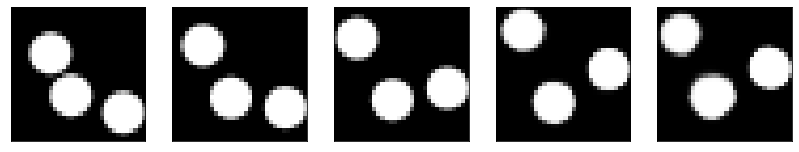

GD iterations:
i=0 | err=51.037525
i=1 | err=49.832405
i=2 | err=48.215923
i=3 | err=46.519806
i=4 | err=44.655968
i=5 | err=42.718681
i=6 | err=40.638088
i=7 | err=38.471905
i=8 | err=36.299614
i=9 | err=34.172245
i=10 | err=32.107750
i=11 | err=30.055593
i=12 | err=28.030016
i=13 | err=26.100658
i=14 | err=24.233194
i=15 | err=22.439274
i=16 | err=20.708376
i=17 | err=19.096584
i=18 | err=17.587713
i=19 | err=16.198895
i=20 | err=14.897802
i=21 | err=13.703484
i=22 | err=12.612473
i=23 | err=11.616055
i=24 | err=10.695974
i=25 | err=9.857013
i=26 | err=9.074434
i=27 | err=8.308255
i=28 | err=7.581571
i=29 | err=6.911544
Epoch=256 (53%) | out_positive=0.864778 | out_negative=0.143578 | mse=0.069328


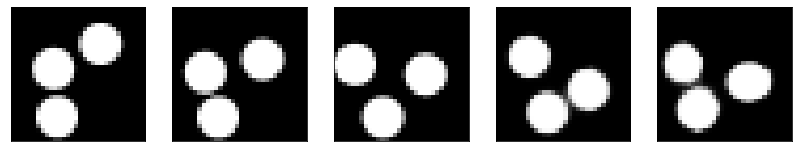

GD iterations:
i=0 | err=49.839966
i=1 | err=48.735672
i=2 | err=47.146431
i=3 | err=45.427841
i=4 | err=43.641823
i=5 | err=41.712173
i=6 | err=39.773903
i=7 | err=37.733032
i=8 | err=35.592358
i=9 | err=33.538589
i=10 | err=31.494652
i=11 | err=29.441050
i=12 | err=27.375328
i=13 | err=25.408550
i=14 | err=23.533783
i=15 | err=21.750561
i=16 | err=20.070168
i=17 | err=18.507992
i=18 | err=17.101580
i=19 | err=15.757553
i=20 | err=14.557813
i=21 | err=13.455126
i=22 | err=12.440931
i=23 | err=11.515254
i=24 | err=10.640545
i=25 | err=9.813396
i=26 | err=9.039986
i=27 | err=8.304594
i=28 | err=7.601329
i=29 | err=6.912458
Epoch=256 (55%) | out_positive=0.927192 | out_negative=0.130484 | mse=0.067310


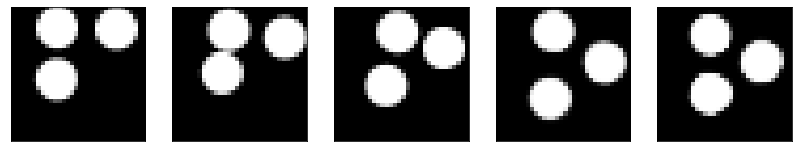

GD iterations:
i=0 | err=54.171646
i=1 | err=52.985023
i=2 | err=51.273514
i=3 | err=49.317249
i=4 | err=47.260544
i=5 | err=45.171944
i=6 | err=43.005493
i=7 | err=40.716606
i=8 | err=38.333370
i=9 | err=36.021389
i=10 | err=33.754387
i=11 | err=31.540726
i=12 | err=29.390430
i=13 | err=27.258244
i=14 | err=25.241100
i=15 | err=23.305222
i=16 | err=21.409855
i=17 | err=19.606382
i=18 | err=17.932720
i=19 | err=16.403790
i=20 | err=15.012655
i=21 | err=13.759019
i=22 | err=12.592829
i=23 | err=11.535748
i=24 | err=10.589457
i=25 | err=9.711575
i=26 | err=8.873590
i=27 | err=8.097772
i=28 | err=7.363032
i=29 | err=6.656775
Epoch=256 (56%) | out_positive=0.863767 | out_negative=0.123426 | mse=0.066155


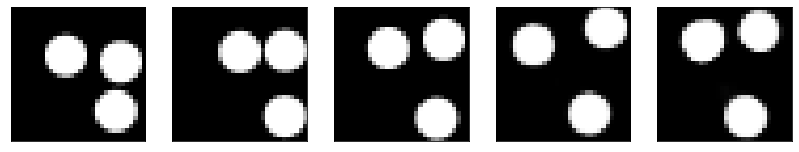

GD iterations:
i=0 | err=54.885921
i=1 | err=53.610657
i=2 | err=51.973099
i=3 | err=50.101593
i=4 | err=48.136368
i=5 | err=45.973785
i=6 | err=43.725445
i=7 | err=41.490818
i=8 | err=39.213955
i=9 | err=36.908146
i=10 | err=34.553288
i=11 | err=32.211800
i=12 | err=29.930565
i=13 | err=27.779266
i=14 | err=25.769188
i=15 | err=23.871674
i=16 | err=22.087614
i=17 | err=20.365639
i=18 | err=18.700342
i=19 | err=17.103073
i=20 | err=15.572741
i=21 | err=14.114977
i=22 | err=12.763531
i=23 | err=11.503489
i=24 | err=10.356318
i=25 | err=9.293585
i=26 | err=8.311008
i=27 | err=7.432255
i=28 | err=6.602651
i=29 | err=5.811604
Epoch=256 (58%) | out_positive=0.888878 | out_negative=0.170924 | mse=0.074307


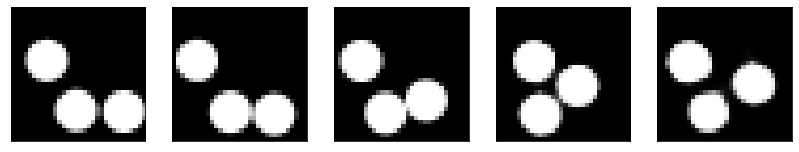

GD iterations:
i=0 | err=53.122749
i=1 | err=51.746246
i=2 | err=49.862671
i=3 | err=47.771526
i=4 | err=45.625031
i=5 | err=43.408363
i=6 | err=41.172340
i=7 | err=38.915920
i=8 | err=36.640335
i=9 | err=34.442749
i=10 | err=32.178242
i=11 | err=29.936634
i=12 | err=27.823120
i=13 | err=25.816669
i=14 | err=23.998096
i=15 | err=22.259180
i=16 | err=20.607666
i=17 | err=19.051889
i=18 | err=17.631218
i=19 | err=16.276470
i=20 | err=15.033139
i=21 | err=13.866782
i=22 | err=12.734308
i=23 | err=11.647867
i=24 | err=10.624986
i=25 | err=9.680773
i=26 | err=8.796410
i=27 | err=7.949571
i=28 | err=7.160714
i=29 | err=6.417792
Epoch=256 (60%) | out_positive=0.869083 | out_negative=0.144514 | mse=0.065677


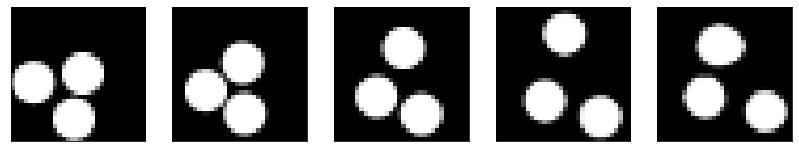

GD iterations:
i=0 | err=54.221306
i=1 | err=52.968315
i=2 | err=51.225513
i=3 | err=49.231422
i=4 | err=47.105469
i=5 | err=44.962303
i=6 | err=42.722496
i=7 | err=40.381699
i=8 | err=38.025070
i=9 | err=35.638298
i=10 | err=33.256058
i=11 | err=30.873629
i=12 | err=28.561789
i=13 | err=26.347925
i=14 | err=24.306591
i=15 | err=22.386660
i=16 | err=20.559347
i=17 | err=18.843536
i=18 | err=17.234337
i=19 | err=15.782722
i=20 | err=14.412035
i=21 | err=13.140665
i=22 | err=11.988916
i=23 | err=10.932514
i=24 | err=9.977459
i=25 | err=9.080533
i=26 | err=8.263789
i=27 | err=7.480819
i=28 | err=6.749323
i=29 | err=6.039357
Epoch=256 (62%) | out_positive=0.885929 | out_negative=0.153867 | mse=0.069023


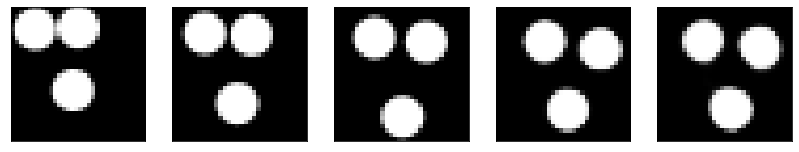

GD iterations:
i=0 | err=51.906570
i=1 | err=50.692047
i=2 | err=49.066528
i=3 | err=47.239902
i=4 | err=45.242115
i=5 | err=43.072647
i=6 | err=40.937748
i=7 | err=38.778999
i=8 | err=36.588150
i=9 | err=34.489311
i=10 | err=32.402557
i=11 | err=30.280571
i=12 | err=28.177458
i=13 | err=26.198515
i=14 | err=24.327963
i=15 | err=22.526264
i=16 | err=20.798267
i=17 | err=19.140131
i=18 | err=17.614437
i=19 | err=16.168364
i=20 | err=14.839804
i=21 | err=13.631613
i=22 | err=12.471647
i=23 | err=11.389546
i=24 | err=10.360443
i=25 | err=9.375725
i=26 | err=8.472819
i=27 | err=7.649304
i=28 | err=6.877297
i=29 | err=6.140247
Epoch=256 (64%) | out_positive=0.873146 | out_negative=0.134642 | mse=0.069694


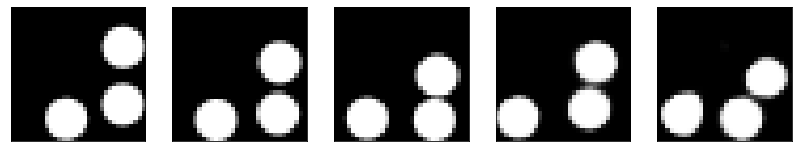

GD iterations:
i=0 | err=51.905037
i=1 | err=50.651253
i=2 | err=48.987080
i=3 | err=47.120335
i=4 | err=45.257183
i=5 | err=43.357895
i=6 | err=41.416290
i=7 | err=39.450191
i=8 | err=37.385094
i=9 | err=35.275909
i=10 | err=33.161694
i=11 | err=30.944351
i=12 | err=28.821619
i=13 | err=26.762650
i=14 | err=24.829624
i=15 | err=22.973839
i=16 | err=21.246866
i=17 | err=19.570395
i=18 | err=17.949234
i=19 | err=16.465858
i=20 | err=15.104913
i=21 | err=13.836661
i=22 | err=12.626244
i=23 | err=11.519100
i=24 | err=10.490395
i=25 | err=9.517204
i=26 | err=8.566069
i=27 | err=7.687135
i=28 | err=6.859262
i=29 | err=6.084462
Epoch=256 (66%) | out_positive=0.878771 | out_negative=0.142467 | mse=0.068893


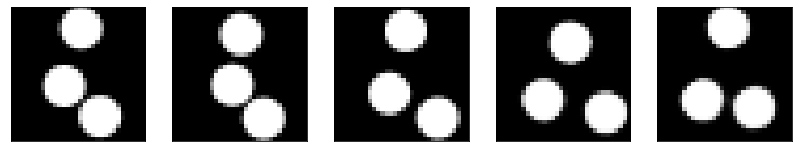

GD iterations:
i=0 | err=54.575104
i=1 | err=53.321331
i=2 | err=51.561588
i=3 | err=49.569733
i=4 | err=47.566269
i=5 | err=45.452297
i=6 | err=43.280739
i=7 | err=41.044544
i=8 | err=38.898067
i=9 | err=36.730606
i=10 | err=34.658909
i=11 | err=32.613724
i=12 | err=30.615068
i=13 | err=28.673397
i=14 | err=26.770992
i=15 | err=25.008575
i=16 | err=23.332550
i=17 | err=21.717487
i=18 | err=20.120033
i=19 | err=18.589012
i=20 | err=17.164175
i=21 | err=15.800579
i=22 | err=14.472998
i=23 | err=13.246186
i=24 | err=12.079861
i=25 | err=10.980546
i=26 | err=9.973052
i=27 | err=8.992924
i=28 | err=8.051649
i=29 | err=7.180318
Epoch=256 (67%) | out_positive=0.846342 | out_negative=0.117805 | mse=0.070122


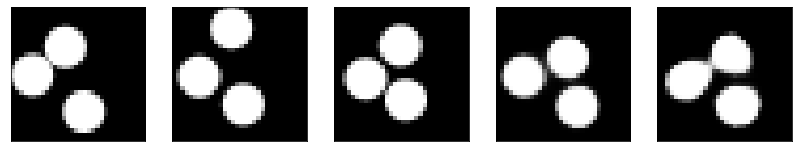

GD iterations:
i=0 | err=57.629887
i=1 | err=56.317253
i=2 | err=54.563892
i=3 | err=52.531071
i=4 | err=50.308640
i=5 | err=48.058372
i=6 | err=45.757980
i=7 | err=43.412926
i=8 | err=41.033676
i=9 | err=38.662735
i=10 | err=36.317390
i=11 | err=33.986809
i=12 | err=31.657511
i=13 | err=29.336685
i=14 | err=27.072784
i=15 | err=24.904045
i=16 | err=22.834967
i=17 | err=20.916157
i=18 | err=19.152966
i=19 | err=17.587273
i=20 | err=16.165308
i=21 | err=14.871508
i=22 | err=13.697012
i=23 | err=12.594740
i=24 | err=11.539172
i=25 | err=10.533245
i=26 | err=9.589918
i=27 | err=8.689596
i=28 | err=7.865677
i=29 | err=7.066825
Epoch=256 (69%) | out_positive=0.858569 | out_negative=0.132737 | mse=0.066407


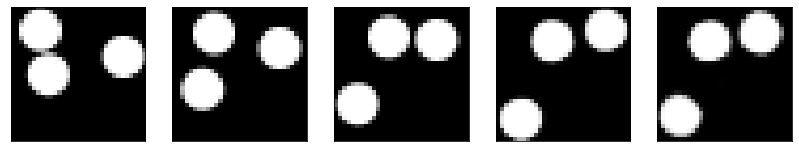

GD iterations:
i=0 | err=53.839161
i=1 | err=52.827782
i=2 | err=51.386787
i=3 | err=49.673958
i=4 | err=47.947121
i=5 | err=46.039474
i=6 | err=44.151535
i=7 | err=42.100632
i=8 | err=40.048431
i=9 | err=37.792976
i=10 | err=35.525787
i=11 | err=33.121063
i=12 | err=30.735161
i=13 | err=28.457455
i=14 | err=26.242971
i=15 | err=24.207542
i=16 | err=22.254625
i=17 | err=20.342583
i=18 | err=18.567198
i=19 | err=16.977982
i=20 | err=15.479639
i=21 | err=14.109332
i=22 | err=12.876915
i=23 | err=11.703148
i=24 | err=10.652004
i=25 | err=9.671833
i=26 | err=8.746572
i=27 | err=7.850588
i=28 | err=7.012387
i=29 | err=6.197625
Epoch=256 (71%) | out_positive=0.860126 | out_negative=0.146334 | mse=0.069736


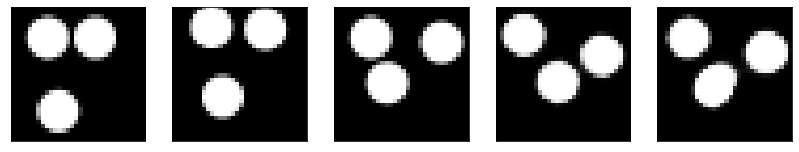

GD iterations:
i=0 | err=57.323853
i=1 | err=56.104897
i=2 | err=54.441235
i=3 | err=52.476982
i=4 | err=50.439392
i=5 | err=48.258282
i=6 | err=46.013161
i=7 | err=43.674683
i=8 | err=41.364006
i=9 | err=38.990295
i=10 | err=36.616165
i=11 | err=34.359238
i=12 | err=32.106392
i=13 | err=29.861876
i=14 | err=27.645481
i=15 | err=25.475838
i=16 | err=23.453447
i=17 | err=21.626347
i=18 | err=19.940342
i=19 | err=18.380104
i=20 | err=16.899010
i=21 | err=15.551317
i=22 | err=14.330648
i=23 | err=13.172108
i=24 | err=12.055079
i=25 | err=10.988791
i=26 | err=10.010986
i=27 | err=9.064820
i=28 | err=8.196792
i=29 | err=7.363660
Epoch=256 (73%) | out_positive=0.927787 | out_negative=0.127999 | mse=0.069387


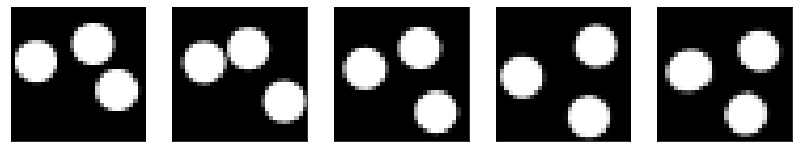

GD iterations:
i=0 | err=54.138733
i=1 | err=52.989120
i=2 | err=51.460213
i=3 | err=49.737465
i=4 | err=47.857822
i=5 | err=45.903831
i=6 | err=43.933022
i=7 | err=41.938271
i=8 | err=39.906898
i=9 | err=37.923222
i=10 | err=35.813354
i=11 | err=33.724747
i=12 | err=31.628130
i=13 | err=29.562969
i=14 | err=27.551207
i=15 | err=25.563171
i=16 | err=23.648556
i=17 | err=21.850204
i=18 | err=20.178724
i=19 | err=18.605480
i=20 | err=17.124969
i=21 | err=15.754206
i=22 | err=14.395555
i=23 | err=13.139935
i=24 | err=11.936556
i=25 | err=10.804007
i=26 | err=9.794782
i=27 | err=8.791203
i=28 | err=7.848696
i=29 | err=6.959846
Epoch=256 (75%) | out_positive=0.801430 | out_negative=0.114522 | mse=0.072216


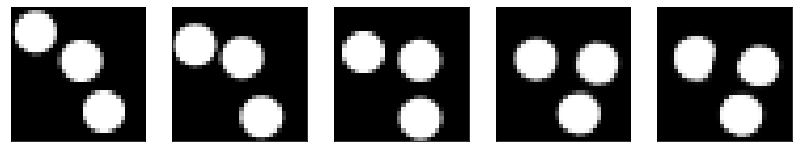

GD iterations:
i=0 | err=55.754036
i=1 | err=54.466816
i=2 | err=52.718956
i=3 | err=50.731777
i=4 | err=48.659714
i=5 | err=46.421593
i=6 | err=44.102901
i=7 | err=41.682880
i=8 | err=39.285477
i=9 | err=36.866211
i=10 | err=34.493877
i=11 | err=32.070641
i=12 | err=29.754513
i=13 | err=27.567287
i=14 | err=25.511078
i=15 | err=23.542847
i=16 | err=21.756695
i=17 | err=20.068314
i=18 | err=18.508051
i=19 | err=17.062685
i=20 | err=15.774800
i=21 | err=14.550124
i=22 | err=13.391401
i=23 | err=12.315921
i=24 | err=11.277084
i=25 | err=10.279061
i=26 | err=9.334684
i=27 | err=8.437943
i=28 | err=7.584269
i=29 | err=6.792792
Epoch=256 (77%) | out_positive=0.825095 | out_negative=0.091962 | mse=0.074458


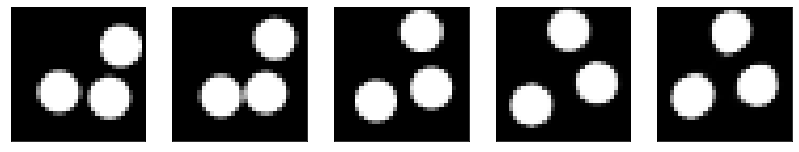

GD iterations:
i=0 | err=54.257614
i=1 | err=52.967922
i=2 | err=51.247742
i=3 | err=49.413284
i=4 | err=47.472977
i=5 | err=45.466904
i=6 | err=43.422905
i=7 | err=41.246216
i=8 | err=39.122234
i=9 | err=36.996960
i=10 | err=34.808861
i=11 | err=32.536926
i=12 | err=30.214409
i=13 | err=27.835804
i=14 | err=25.548607
i=15 | err=23.372498
i=16 | err=21.359741
i=17 | err=19.462515
i=18 | err=17.787613
i=19 | err=16.182487
i=20 | err=14.664885
i=21 | err=13.193901
i=22 | err=11.845152
i=23 | err=10.611329
i=24 | err=9.487745
i=25 | err=8.411287
i=26 | err=7.460312
i=27 | err=6.598139
i=28 | err=5.798894
i=29 | err=5.073874
Epoch=256 (79%) | out_positive=0.945452 | out_negative=0.233740 | mse=0.076159


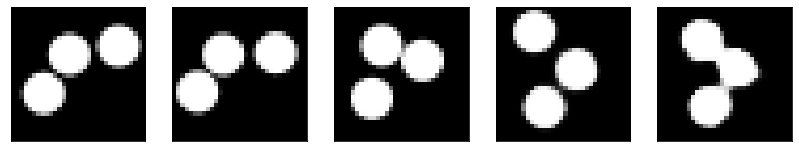

GD iterations:
i=0 | err=52.121006
i=1 | err=50.990261
i=2 | err=49.408180
i=3 | err=47.621555
i=4 | err=45.683102
i=5 | err=43.610889
i=6 | err=41.547318
i=7 | err=39.474571
i=8 | err=37.473511
i=9 | err=35.447151
i=10 | err=33.494579
i=11 | err=31.554102
i=12 | err=29.632450
i=13 | err=27.745638
i=14 | err=25.904737
i=15 | err=24.129610
i=16 | err=22.405291
i=17 | err=20.802109
i=18 | err=19.351854
i=19 | err=17.968384
i=20 | err=16.675194
i=21 | err=15.434072
i=22 | err=14.224710
i=23 | err=13.092914
i=24 | err=11.997594
i=25 | err=10.937042
i=26 | err=9.952154
i=27 | err=9.024910
i=28 | err=8.169741
i=29 | err=7.336653
Epoch=256 (80%) | out_positive=0.926005 | out_negative=0.117033 | mse=0.075844


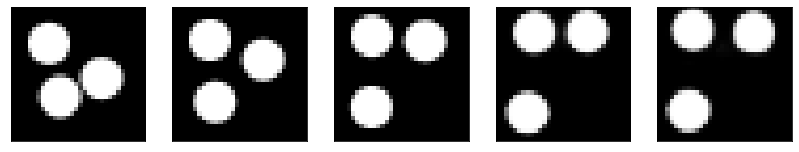

GD iterations:
i=0 | err=53.263206
i=1 | err=52.106998
i=2 | err=50.492447
i=3 | err=48.597755
i=4 | err=46.510441
i=5 | err=44.461899
i=6 | err=42.369823
i=7 | err=40.251186
i=8 | err=38.153957
i=9 | err=35.975548
i=10 | err=33.838387
i=11 | err=31.688860
i=12 | err=29.500301
i=13 | err=27.250248
i=14 | err=25.027184
i=15 | err=22.902557
i=16 | err=20.929941
i=17 | err=19.122982
i=18 | err=17.384184
i=19 | err=15.724629
i=20 | err=14.170797
i=21 | err=12.767910
i=22 | err=11.508238
i=23 | err=10.383676
i=24 | err=9.374399
i=25 | err=8.441192
i=26 | err=7.595756
i=27 | err=6.788305
i=28 | err=6.043767
i=29 | err=5.331512
Epoch=256 (82%) | out_positive=0.886919 | out_negative=0.156472 | mse=0.066495


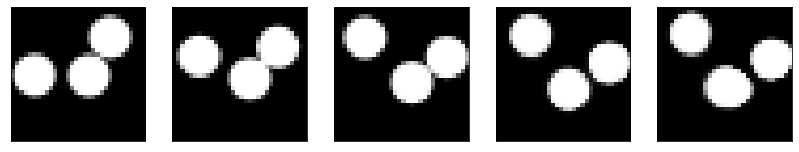

GD iterations:
i=0 | err=55.825397
i=1 | err=54.672150
i=2 | err=53.128937
i=3 | err=51.436291
i=4 | err=49.557472
i=5 | err=47.546890
i=6 | err=45.515511
i=7 | err=43.425434
i=8 | err=41.199394
i=9 | err=38.923512
i=10 | err=36.654243
i=11 | err=34.401672
i=12 | err=32.103996
i=13 | err=29.810217
i=14 | err=27.622805
i=15 | err=25.574196
i=16 | err=23.684040
i=17 | err=21.893631
i=18 | err=20.183352
i=19 | err=18.565689
i=20 | err=17.010990
i=21 | err=15.581835
i=22 | err=14.260279
i=23 | err=13.038418
i=24 | err=11.910742
i=25 | err=10.867653
i=26 | err=9.889114
i=27 | err=8.966548
i=28 | err=8.085399
i=29 | err=7.231334
Epoch=256 (84%) | out_positive=0.842857 | out_negative=0.096246 | mse=0.070759


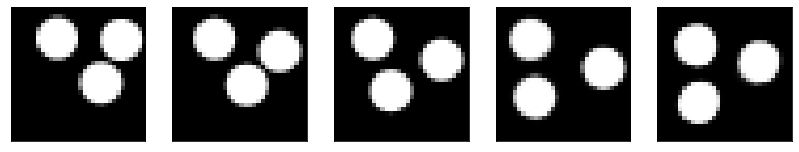

GD iterations:
i=0 | err=55.239532
i=1 | err=54.066444
i=2 | err=52.480614
i=3 | err=50.663593
i=4 | err=48.721596
i=5 | err=46.698421
i=6 | err=44.596703
i=7 | err=42.409187
i=8 | err=40.157646
i=9 | err=37.816513
i=10 | err=35.400963
i=11 | err=32.963402
i=12 | err=30.608574
i=13 | err=28.317669
i=14 | err=26.186476
i=15 | err=24.146126
i=16 | err=22.199173
i=17 | err=20.395409
i=18 | err=18.734364
i=19 | err=17.147900
i=20 | err=15.674648
i=21 | err=14.300022
i=22 | err=13.050162
i=23 | err=11.895544
i=24 | err=10.805054
i=25 | err=9.768273
i=26 | err=8.794365
i=27 | err=7.920534
i=28 | err=7.110560
i=29 | err=6.340860
Epoch=256 (86%) | out_positive=0.858741 | out_negative=0.141627 | mse=0.068748


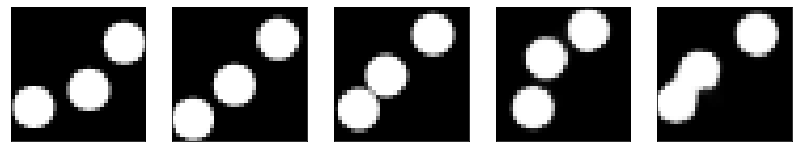

GD iterations:
i=0 | err=50.207348
i=1 | err=49.008781
i=2 | err=47.369354
i=3 | err=45.496986
i=4 | err=43.598145
i=5 | err=41.685848
i=6 | err=39.758881
i=7 | err=37.818905
i=8 | err=35.805214
i=9 | err=33.686123
i=10 | err=31.546328
i=11 | err=29.391979
i=12 | err=27.273438
i=13 | err=25.161005
i=14 | err=23.100681
i=15 | err=21.235655
i=16 | err=19.480639
i=17 | err=17.815800
i=18 | err=16.291542
i=19 | err=14.884942
i=20 | err=13.547382
i=21 | err=12.345309
i=22 | err=11.242098
i=23 | err=10.245146
i=24 | err=9.361976
i=25 | err=8.513176
i=26 | err=7.701057
i=27 | err=6.943263
i=28 | err=6.237824
i=29 | err=5.575490
Epoch=256 (88%) | out_positive=0.916439 | out_negative=0.200606 | mse=0.068153


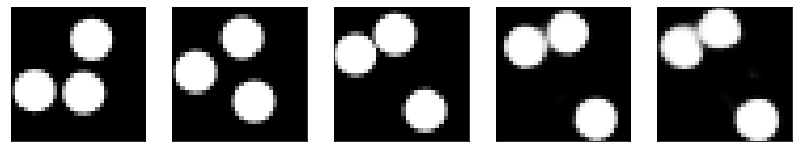

GD iterations:
i=0 | err=51.920162
i=1 | err=50.856762
i=2 | err=49.218998
i=3 | err=47.390209
i=4 | err=45.455532
i=5 | err=43.393517
i=6 | err=41.324867
i=7 | err=39.117702
i=8 | err=36.903221
i=9 | err=34.522934
i=10 | err=32.194199
i=11 | err=29.963831
i=12 | err=27.864155
i=13 | err=25.854008
i=14 | err=23.981377
i=15 | err=22.250469
i=16 | err=20.590384
i=17 | err=18.989750
i=18 | err=17.535112
i=19 | err=16.200680
i=20 | err=14.951734
i=21 | err=13.824709
i=22 | err=12.774044
i=23 | err=11.760756
i=24 | err=10.780661
i=25 | err=9.853640
i=26 | err=8.976221
i=27 | err=8.157838
i=28 | err=7.369740
i=29 | err=6.603718
Epoch=256 (90%) | out_positive=0.899382 | out_negative=0.112806 | mse=0.071186


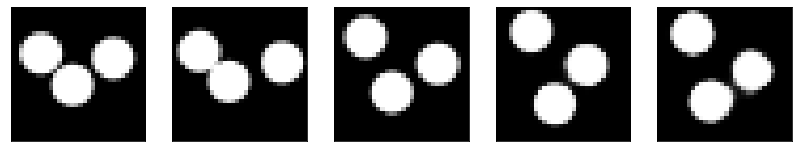

GD iterations:
i=0 | err=52.203285
i=1 | err=50.975212
i=2 | err=49.427231
i=3 | err=47.651878
i=4 | err=45.769455
i=5 | err=43.818058
i=6 | err=41.815666
i=7 | err=39.773769
i=8 | err=37.709629
i=9 | err=35.619652
i=10 | err=33.527809
i=11 | err=31.412243
i=12 | err=29.341303
i=13 | err=27.376183
i=14 | err=25.548662
i=15 | err=23.843235
i=16 | err=22.248545
i=17 | err=20.757038
i=18 | err=19.401661
i=19 | err=18.102816
i=20 | err=16.863592
i=21 | err=15.662637
i=22 | err=14.538145
i=23 | err=13.465317
i=24 | err=12.480358
i=25 | err=11.506968
i=26 | err=10.573848
i=27 | err=9.687012
i=28 | err=8.832003
i=29 | err=8.006878
Epoch=256 (91%) | out_positive=0.838790 | out_negative=0.077066 | mse=0.069566


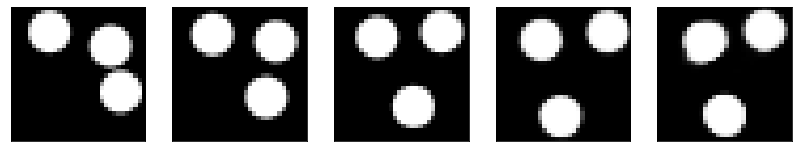

GD iterations:
i=0 | err=54.684296
i=1 | err=53.495090
i=2 | err=51.884911
i=3 | err=49.953575
i=4 | err=47.944244
i=5 | err=45.873173
i=6 | err=43.728680
i=7 | err=41.499588
i=8 | err=39.274914
i=9 | err=37.034504
i=10 | err=34.877075
i=11 | err=32.692085
i=12 | err=30.573921
i=13 | err=28.515316
i=14 | err=26.555954
i=15 | err=24.680319
i=16 | err=22.938034
i=17 | err=21.327024
i=18 | err=19.752228
i=19 | err=18.278408
i=20 | err=16.821613
i=21 | err=15.446462
i=22 | err=14.163014
i=23 | err=12.944124
i=24 | err=11.751771
i=25 | err=10.607489
i=26 | err=9.519526
i=27 | err=8.495282
i=28 | err=7.567522
i=29 | err=6.699130
Epoch=256 (93%) | out_positive=0.854509 | out_negative=0.111227 | mse=0.071441


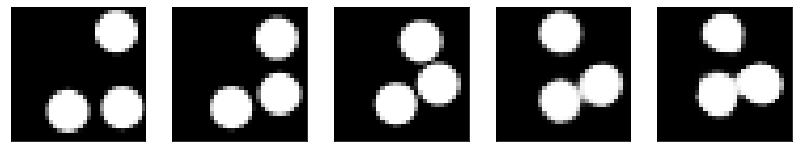

GD iterations:
i=0 | err=51.797020
i=1 | err=50.548088
i=2 | err=48.873123
i=3 | err=46.994503
i=4 | err=45.052338
i=5 | err=43.048550
i=6 | err=40.932579
i=7 | err=38.817463
i=8 | err=36.658806
i=9 | err=34.518959
i=10 | err=32.363228
i=11 | err=30.227364
i=12 | err=28.138317
i=13 | err=26.123644
i=14 | err=24.176542
i=15 | err=22.367874
i=16 | err=20.717175
i=17 | err=19.153385
i=18 | err=17.661278
i=19 | err=16.248714
i=20 | err=14.863508
i=21 | err=13.561011
i=22 | err=12.363807
i=23 | err=11.281754
i=24 | err=10.289026
i=25 | err=9.327714
i=26 | err=8.436668
i=27 | err=7.589894
i=28 | err=6.790826
i=29 | err=6.049932
Epoch=256 (95%) | out_positive=0.872915 | out_negative=0.133730 | mse=0.067743


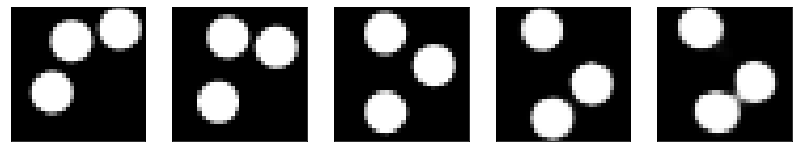

GD iterations:
i=0 | err=53.319008
i=1 | err=52.210533
i=2 | err=50.678223
i=3 | err=48.972424
i=4 | err=47.129955
i=5 | err=45.149387
i=6 | err=43.131596
i=7 | err=41.008785
i=8 | err=38.782379
i=9 | err=36.577160
i=10 | err=34.368195
i=11 | err=32.136917
i=12 | err=29.969807
i=13 | err=27.864239
i=14 | err=25.789154
i=15 | err=23.863914
i=16 | err=22.078232
i=17 | err=20.366617
i=18 | err=18.767879
i=19 | err=17.262917
i=20 | err=15.871724
i=21 | err=14.572339
i=22 | err=13.305216
i=23 | err=12.131548
i=24 | err=11.047587
i=25 | err=10.048408
i=26 | err=9.065784
i=27 | err=8.132746
i=28 | err=7.248909
i=29 | err=6.443113
Epoch=256 (97%) | out_positive=0.829653 | out_negative=0.111516 | mse=0.068455


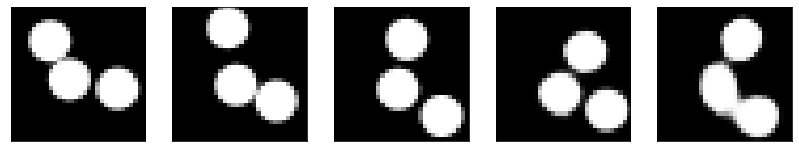

GD iterations:
i=0 | err=54.127636
i=1 | err=52.948341
i=2 | err=51.409763
i=3 | err=49.685478
i=4 | err=47.861702
i=5 | err=46.015446
i=6 | err=44.049805
i=7 | err=42.022499
i=8 | err=39.911560
i=9 | err=37.650703
i=10 | err=35.294327
i=11 | err=32.941723
i=12 | err=30.557590
i=13 | err=28.229403
i=14 | err=25.982712
i=15 | err=23.894222
i=16 | err=21.988449
i=17 | err=20.225826
i=18 | err=18.551247
i=19 | err=16.924641
i=20 | err=15.352362
i=21 | err=13.878269
i=22 | err=12.525027
i=23 | err=11.328463
i=24 | err=10.234356
i=25 | err=9.241575
i=26 | err=8.337351
i=27 | err=7.481033
i=28 | err=6.662982
i=29 | err=5.873510
Epoch=256 (99%) | out_positive=0.911236 | out_negative=0.150351 | mse=0.071629


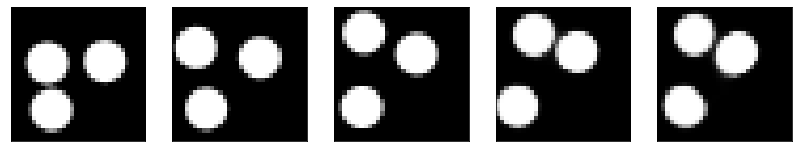

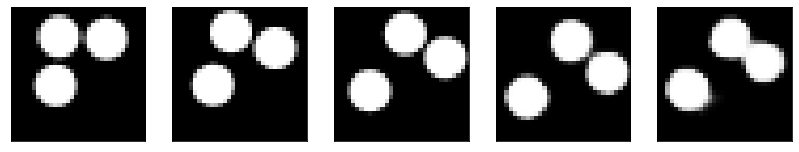

Test MSE 0.078603


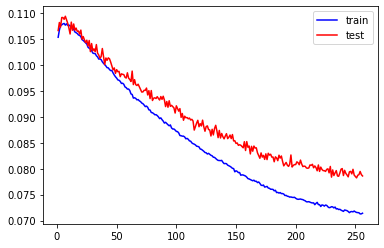

GD iterations:
i=0 | err=52.105415
i=1 | err=50.946484
i=2 | err=49.353371
i=3 | err=47.569599
i=4 | err=45.717186
i=5 | err=43.766380
i=6 | err=41.758064
i=7 | err=39.820267
i=8 | err=37.826183
i=9 | err=35.798447
i=10 | err=33.671494
i=11 | err=31.554558
i=12 | err=29.369286
i=13 | err=27.188251
i=14 | err=25.079670
i=15 | err=23.010775
i=16 | err=21.115179
i=17 | err=19.334677
i=18 | err=17.771135
i=19 | err=16.298985
i=20 | err=14.957565
i=21 | err=13.717295
i=22 | err=12.557339
i=23 | err=11.500907
i=24 | err=10.506161
i=25 | err=9.586824
i=26 | err=8.697677
i=27 | err=7.829670
i=28 | err=7.004917
i=29 | err=6.235928
Epoch=257 (0%) | out_positive=0.905945 | out_negative=0.136349 | mse=0.067026


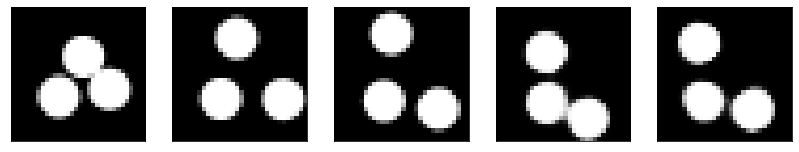

GD iterations:
i=0 | err=56.468010
i=1 | err=55.243771
i=2 | err=53.564407
i=3 | err=51.686890
i=4 | err=49.663177
i=5 | err=47.547653
i=6 | err=45.302113
i=7 | err=42.895573
i=8 | err=40.511345
i=9 | err=38.039837
i=10 | err=35.501205
i=11 | err=33.158081
i=12 | err=30.928898
i=13 | err=28.829323
i=14 | err=26.808231
i=15 | err=24.924599
i=16 | err=23.126484
i=17 | err=21.451000
i=18 | err=19.910961
i=19 | err=18.516151
i=20 | err=17.187904
i=21 | err=15.949191
i=22 | err=14.799458
i=23 | err=13.724525
i=24 | err=12.687490
i=25 | err=11.684063
i=26 | err=10.721357
i=27 | err=9.821653
i=28 | err=8.957974
i=29 | err=8.120864
Epoch=257 (2%) | out_positive=0.837667 | out_negative=0.114666 | mse=0.075883


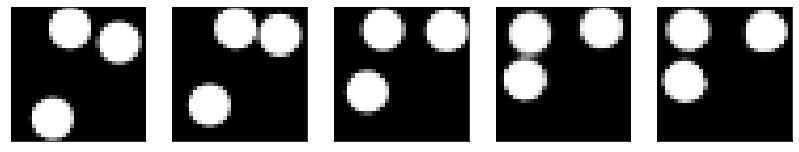

GD iterations:
i=0 | err=57.838112
i=1 | err=56.575241
i=2 | err=54.809006
i=3 | err=52.829723
i=4 | err=50.850624
i=5 | err=48.757416
i=6 | err=46.591282
i=7 | err=44.314919
i=8 | err=41.966656
i=9 | err=39.587879
i=10 | err=37.269650
i=11 | err=34.944016
i=12 | err=32.645607
i=13 | err=30.493969
i=14 | err=28.388119
i=15 | err=26.355011
i=16 | err=24.445887
i=17 | err=22.714155
i=18 | err=21.078203
i=19 | err=19.585360
i=20 | err=18.211140
i=21 | err=16.946667
i=22 | err=15.721519
i=23 | err=14.546537
i=24 | err=13.454841
i=25 | err=12.408115
i=26 | err=11.430565
i=27 | err=10.489956
i=28 | err=9.602326
i=29 | err=8.753500
Epoch=257 (4%) | out_positive=0.824498 | out_negative=0.114527 | mse=0.074646


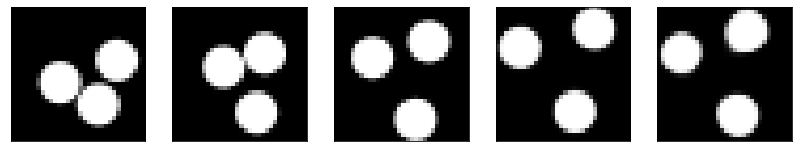

GD iterations:
i=0 | err=55.474209
i=1 | err=54.192886
i=2 | err=52.520676
i=3 | err=50.670944
i=4 | err=48.653278
i=5 | err=46.568588
i=6 | err=44.353355
i=7 | err=42.021828
i=8 | err=39.715900
i=9 | err=37.265823
i=10 | err=34.828030
i=11 | err=32.449547
i=12 | err=30.160480
i=13 | err=28.017670
i=14 | err=26.035206
i=15 | err=24.055983
i=16 | err=22.144436
i=17 | err=20.393909
i=18 | err=18.747517
i=19 | err=17.209805
i=20 | err=15.776852
i=21 | err=14.467318
i=22 | err=13.197462
i=23 | err=12.028282
i=24 | err=10.937407
i=25 | err=9.908619
i=26 | err=8.951359
i=27 | err=8.030505
i=28 | err=7.127825
i=29 | err=6.288753
Epoch=257 (6%) | out_positive=0.915575 | out_negative=0.108943 | mse=0.071037


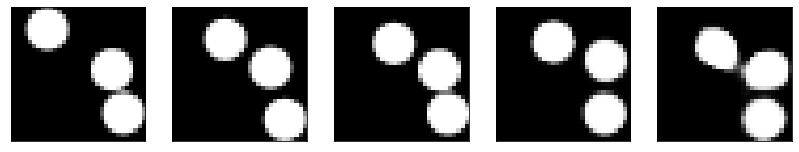

GD iterations:
i=0 | err=57.622002
i=1 | err=56.301296
i=2 | err=54.441742
i=3 | err=52.301029
i=4 | err=49.965939
i=5 | err=47.528122
i=6 | err=44.970451
i=7 | err=42.329453
i=8 | err=39.732353
i=9 | err=37.189121
i=10 | err=34.681313
i=11 | err=32.139931
i=12 | err=29.716965
i=13 | err=27.405371
i=14 | err=25.263157
i=15 | err=23.257864
i=16 | err=21.427834
i=17 | err=19.752207
i=18 | err=18.205866
i=19 | err=16.795227
i=20 | err=15.448942
i=21 | err=14.191975
i=22 | err=12.951065
i=23 | err=11.792665
i=24 | err=10.717780
i=25 | err=9.711663
i=26 | err=8.742943
i=27 | err=7.815074
i=28 | err=6.930214
i=29 | err=6.108735
Epoch=257 (8%) | out_positive=0.886032 | out_negative=0.122568 | mse=0.069201


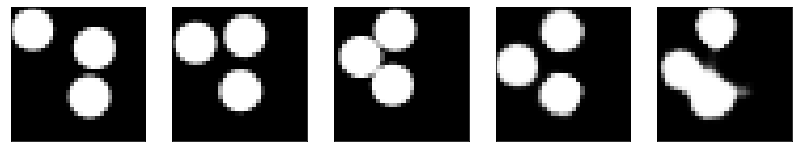

GD iterations:
i=0 | err=59.365864
i=1 | err=58.119194
i=2 | err=56.345009
i=3 | err=54.386059
i=4 | err=52.229107
i=5 | err=49.973961
i=6 | err=47.548851
i=7 | err=44.959457
i=8 | err=42.330589
i=9 | err=39.713787
i=10 | err=37.120346
i=11 | err=34.391922
i=12 | err=31.829651
i=13 | err=29.395805
i=14 | err=27.086428
i=15 | err=24.890982
i=16 | err=22.919117
i=17 | err=21.147724
i=18 | err=19.546341
i=19 | err=18.053839
i=20 | err=16.638065
i=21 | err=15.286263
i=22 | err=14.011600
i=23 | err=12.803179
i=24 | err=11.644620
i=25 | err=10.542893
i=26 | err=9.520642
i=27 | err=8.585720
i=28 | err=7.722715
i=29 | err=6.918258
Epoch=257 (9%) | out_positive=0.845957 | out_negative=0.124394 | mse=0.069998


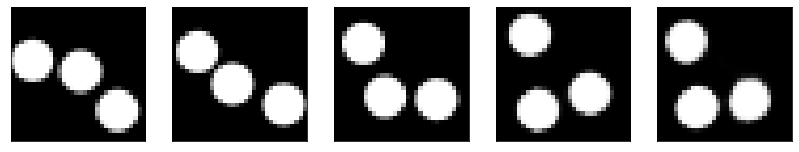

GD iterations:
i=0 | err=52.538345
i=1 | err=51.279785
i=2 | err=49.546127
i=3 | err=47.703445
i=4 | err=45.680408
i=5 | err=43.626888
i=6 | err=41.478401
i=7 | err=39.359726
i=8 | err=37.280956
i=9 | err=35.257019
i=10 | err=33.242634
i=11 | err=31.195709
i=12 | err=29.078432
i=13 | err=26.949680
i=14 | err=24.874973
i=15 | err=22.977371
i=16 | err=21.272028
i=17 | err=19.684977
i=18 | err=18.199213
i=19 | err=16.866039
i=20 | err=15.594393
i=21 | err=14.461599
i=22 | err=13.372818
i=23 | err=12.368200
i=24 | err=11.413872
i=25 | err=10.516142
i=26 | err=9.662926
i=27 | err=8.864735
i=28 | err=8.090811
i=29 | err=7.362941
Epoch=257 (11%) | out_positive=0.934733 | out_negative=0.123654 | mse=0.069892


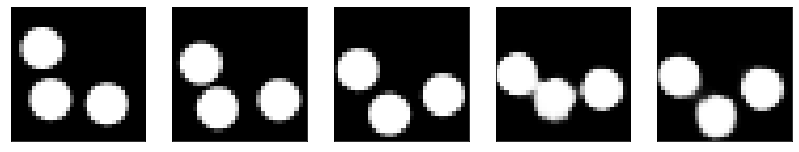

GD iterations:
i=0 | err=55.841167
i=1 | err=54.507027
i=2 | err=52.673416
i=3 | err=50.672073
i=4 | err=48.531879
i=5 | err=46.394176
i=6 | err=44.113323
i=7 | err=41.812096
i=8 | err=39.425240
i=9 | err=37.050060
i=10 | err=34.667473
i=11 | err=32.355721
i=12 | err=30.107903
i=13 | err=27.900925
i=14 | err=25.763170
i=15 | err=23.698971
i=16 | err=21.705017
i=17 | err=19.775023
i=18 | err=17.976883
i=19 | err=16.335064
i=20 | err=14.905331
i=21 | err=13.614925
i=22 | err=12.413973
i=23 | err=11.306850
i=24 | err=10.262403
i=25 | err=9.276302
i=26 | err=8.343740
i=27 | err=7.457828
i=28 | err=6.607816
i=29 | err=5.757425
Epoch=257 (13%) | out_positive=0.913416 | out_negative=0.231806 | mse=0.071107


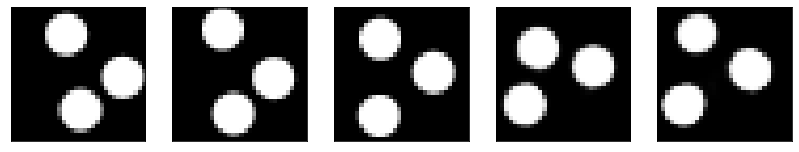

GD iterations:
i=0 | err=55.375679
i=1 | err=54.226673
i=2 | err=52.655098
i=3 | err=50.847969
i=4 | err=48.885639
i=5 | err=46.888153
i=6 | err=44.883488
i=7 | err=42.793911
i=8 | err=40.644745
i=9 | err=38.415161
i=10 | err=36.134186
i=11 | err=33.836433
i=12 | err=31.514347
i=13 | err=29.261909
i=14 | err=27.151451
i=15 | err=25.141636
i=16 | err=23.265219
i=17 | err=21.469810
i=18 | err=19.765682
i=19 | err=18.138794
i=20 | err=16.606216
i=21 | err=15.240495
i=22 | err=13.998903
i=23 | err=12.856913
i=24 | err=11.795248
i=25 | err=10.808051
i=26 | err=9.883671
i=27 | err=9.018621
i=28 | err=8.219425
i=29 | err=7.455230
Epoch=257 (15%) | out_positive=0.880858 | out_negative=0.089354 | mse=0.072106


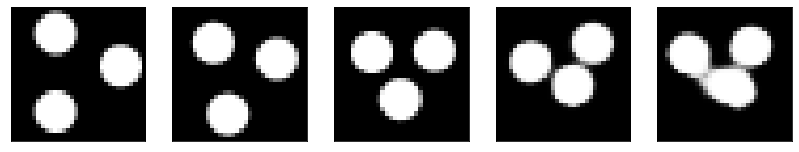

GD iterations:
i=0 | err=55.804035
i=1 | err=54.462132
i=2 | err=52.722473
i=3 | err=50.875389
i=4 | err=48.954899
i=5 | err=46.963097
i=6 | err=44.905388
i=7 | err=42.732513
i=8 | err=40.551071
i=9 | err=38.330334
i=10 | err=36.142792
i=11 | err=33.918644
i=12 | err=31.683891
i=13 | err=29.552044
i=14 | err=27.485201
i=15 | err=25.524200
i=16 | err=23.701694
i=17 | err=21.965157
i=18 | err=20.332668
i=19 | err=18.762344
i=20 | err=17.282627
i=21 | err=15.901242
i=22 | err=14.563234
i=23 | err=13.317386
i=24 | err=12.152345
i=25 | err=11.020151
i=26 | err=9.949486
i=27 | err=8.911806
i=28 | err=7.917865
i=29 | err=7.004278
Epoch=257 (17%) | out_positive=0.923256 | out_negative=0.156491 | mse=0.074997


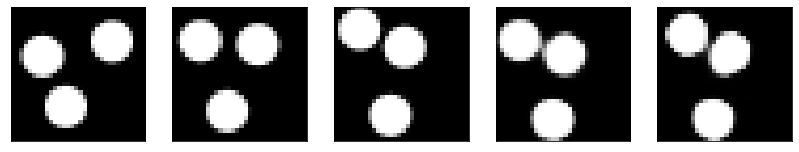

GD iterations:
i=0 | err=53.858902
i=1 | err=52.669796
i=2 | err=51.097900
i=3 | err=49.244198
i=4 | err=47.318924
i=5 | err=45.425766
i=6 | err=43.437958
i=7 | err=41.471962
i=8 | err=39.421440
i=9 | err=37.266357
i=10 | err=35.124722
i=11 | err=33.010578
i=12 | err=30.826120
i=13 | err=28.577295
i=14 | err=26.386383
i=15 | err=24.297602
i=16 | err=22.417652
i=17 | err=20.634804
i=18 | err=19.040291
i=19 | err=17.540665
i=20 | err=16.118626
i=21 | err=14.791428
i=22 | err=13.586946
i=23 | err=12.432220
i=24 | err=11.392920
i=25 | err=10.414100
i=26 | err=9.489586
i=27 | err=8.594027
i=28 | err=7.748293
i=29 | err=6.938202
Epoch=257 (19%) | out_positive=0.856013 | out_negative=0.142726 | mse=0.067714


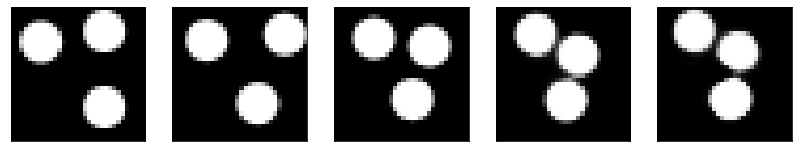

GD iterations:
i=0 | err=55.729782
i=1 | err=54.594822
i=2 | err=53.046761
i=3 | err=51.305847
i=4 | err=49.392189
i=5 | err=47.380699
i=6 | err=45.322449
i=7 | err=43.151218
i=8 | err=40.835499
i=9 | err=38.526333
i=10 | err=36.349911
i=11 | err=34.287365
i=12 | err=32.305595
i=13 | err=30.394859
i=14 | err=28.576641
i=15 | err=26.815884
i=16 | err=25.127384
i=17 | err=23.476545
i=18 | err=22.008120
i=19 | err=20.606394
i=20 | err=19.347767
i=21 | err=18.110188
i=22 | err=16.879847
i=23 | err=15.677364
i=24 | err=14.530546
i=25 | err=13.472664
i=26 | err=12.472766
i=27 | err=11.539488
i=28 | err=10.651133
i=29 | err=9.769342
Epoch=257 (20%) | out_positive=0.863919 | out_negative=0.055957 | mse=0.076635


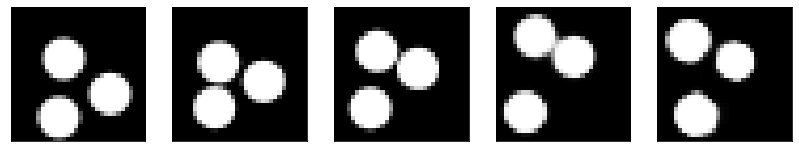

GD iterations:
i=0 | err=56.693989
i=1 | err=55.436207
i=2 | err=53.802258
i=3 | err=51.934326
i=4 | err=49.959587
i=5 | err=47.969971
i=6 | err=45.937347
i=7 | err=43.836235
i=8 | err=41.691689
i=9 | err=39.496738
i=10 | err=37.188782
i=11 | err=34.810555
i=12 | err=32.445683
i=13 | err=30.133577
i=14 | err=27.874607
i=15 | err=25.672173
i=16 | err=23.564533
i=17 | err=21.511173
i=18 | err=19.645664
i=19 | err=17.896967
i=20 | err=16.268883
i=21 | err=14.785578
i=22 | err=13.434430
i=23 | err=12.208221
i=24 | err=11.082388
i=25 | err=10.019794
i=26 | err=9.024448
i=27 | err=8.054522
i=28 | err=7.133947
i=29 | err=6.251847
Epoch=257 (22%) | out_positive=0.854419 | out_negative=0.143670 | mse=0.073779


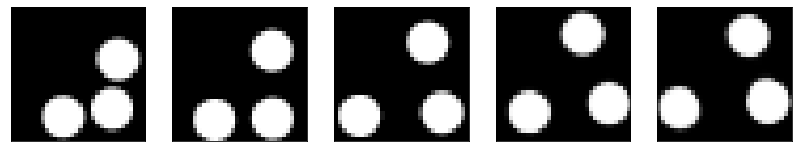

GD iterations:
i=0 | err=51.742878
i=1 | err=50.557655
i=2 | err=48.960373
i=3 | err=47.186558
i=4 | err=45.331161
i=5 | err=43.457451
i=6 | err=41.495441
i=7 | err=39.432838
i=8 | err=37.418785
i=9 | err=35.342972
i=10 | err=33.273216
i=11 | err=31.227196
i=12 | err=29.184677
i=13 | err=27.237600
i=14 | err=25.317234
i=15 | err=23.527937
i=16 | err=21.850964
i=17 | err=20.326263
i=18 | err=18.897842
i=19 | err=17.588615
i=20 | err=16.309841
i=21 | err=15.091038
i=22 | err=13.955662
i=23 | err=12.921463
i=24 | err=11.969381
i=25 | err=11.056476
i=26 | err=10.230478
i=27 | err=9.428925
i=28 | err=8.687155
i=29 | err=7.990377
Epoch=257 (24%) | out_positive=0.903244 | out_negative=0.074412 | mse=0.079641


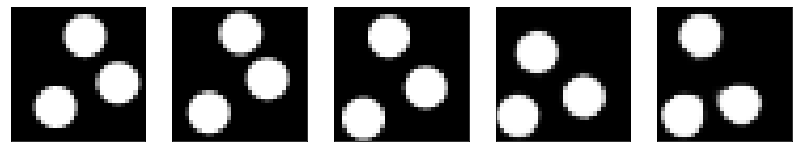

GD iterations:
i=0 | err=54.296303
i=1 | err=53.059460
i=2 | err=51.297020
i=3 | err=49.359863
i=4 | err=47.325493
i=5 | err=45.259178
i=6 | err=43.182194
i=7 | err=41.060112
i=8 | err=38.895782
i=9 | err=36.629807
i=10 | err=34.321243
i=11 | err=31.937557
i=12 | err=29.655466
i=13 | err=27.414194
i=14 | err=25.185432
i=15 | err=23.096823
i=16 | err=21.170620
i=17 | err=19.372128
i=18 | err=17.729595
i=19 | err=16.287487
i=20 | err=14.966440
i=21 | err=13.770216
i=22 | err=12.621387
i=23 | err=11.572187
i=24 | err=10.583530
i=25 | err=9.656824
i=26 | err=8.751591
i=27 | err=7.894135
i=28 | err=7.059490
i=29 | err=6.267079
Epoch=257 (26%) | out_positive=0.899492 | out_negative=0.137528 | mse=0.071224


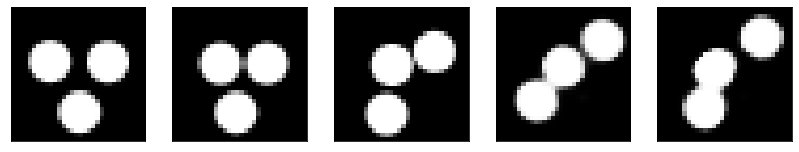

GD iterations:
i=0 | err=60.393631
i=1 | err=59.130592
i=2 | err=57.371582
i=3 | err=55.422832
i=4 | err=53.365044
i=5 | err=51.215355
i=6 | err=48.975616
i=7 | err=46.591255
i=8 | err=44.135513
i=9 | err=41.717743
i=10 | err=39.210789
i=11 | err=36.676048
i=12 | err=34.112915
i=13 | err=31.694809
i=14 | err=29.344687
i=15 | err=27.141388
i=16 | err=25.032867
i=17 | err=23.063158
i=18 | err=21.256678
i=19 | err=19.552917
i=20 | err=17.961445
i=21 | err=16.514347
i=22 | err=15.123851
i=23 | err=13.845848
i=24 | err=12.627019
i=25 | err=11.527293
i=26 | err=10.513352
i=27 | err=9.543797
i=28 | err=8.597767
i=29 | err=7.685300
Epoch=257 (28%) | out_positive=0.802048 | out_negative=0.114520 | mse=0.071822


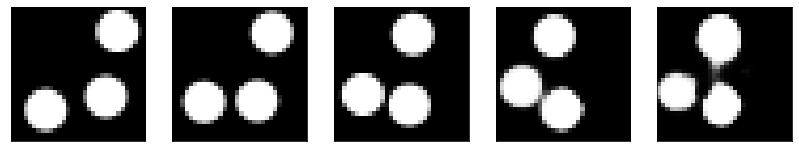

GD iterations:
i=0 | err=55.989189
i=1 | err=54.829437
i=2 | err=53.151768
i=3 | err=51.200081
i=4 | err=49.112247
i=5 | err=46.932533
i=6 | err=44.619843
i=7 | err=42.286343
i=8 | err=39.986469
i=9 | err=37.596977
i=10 | err=35.264252
i=11 | err=32.988369
i=12 | err=30.703812
i=13 | err=28.502975
i=14 | err=26.466852
i=15 | err=24.573008
i=16 | err=22.751242
i=17 | err=21.040594
i=18 | err=19.414349
i=19 | err=17.863422
i=20 | err=16.411037
i=21 | err=15.000555
i=22 | err=13.642448
i=23 | err=12.413351
i=24 | err=11.263653
i=25 | err=10.168272
i=26 | err=9.149014
i=27 | err=8.191950
i=28 | err=7.306807
i=29 | err=6.472329
Epoch=257 (30%) | out_positive=0.898390 | out_negative=0.138400 | mse=0.070759


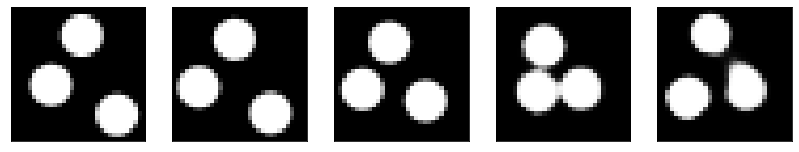

GD iterations:
i=0 | err=54.636932
i=1 | err=53.382401
i=2 | err=51.619656
i=3 | err=49.668747
i=4 | err=47.586750
i=5 | err=45.444466
i=6 | err=43.336426
i=7 | err=41.211540
i=8 | err=39.111359
i=9 | err=36.949093
i=10 | err=34.724365
i=11 | err=32.561783
i=12 | err=30.454987
i=13 | err=28.328472
i=14 | err=26.287022
i=15 | err=24.364929
i=16 | err=22.557604
i=17 | err=20.804672
i=18 | err=19.118519
i=19 | err=17.533691
i=20 | err=16.103540
i=21 | err=14.799269
i=22 | err=13.634225
i=23 | err=12.588835
i=24 | err=11.574375
i=25 | err=10.637943
i=26 | err=9.725269
i=27 | err=8.891922
i=28 | err=8.079329
i=29 | err=7.310474
Epoch=257 (32%) | out_positive=0.782172 | out_negative=0.100083 | mse=0.072001


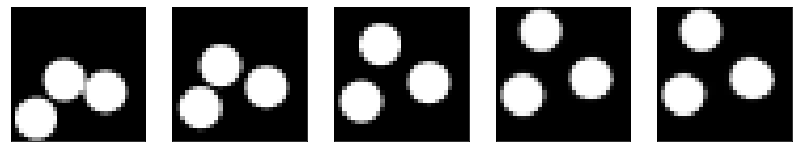

GD iterations:
i=0 | err=53.175095
i=1 | err=51.870724
i=2 | err=50.264030
i=3 | err=48.439812
i=4 | err=46.567871
i=5 | err=44.587418
i=6 | err=42.498596
i=7 | err=40.336166
i=8 | err=38.164265
i=9 | err=35.948059
i=10 | err=33.799858
i=11 | err=31.619389
i=12 | err=29.461926
i=13 | err=27.324329
i=14 | err=25.262606
i=15 | err=23.306190
i=16 | err=21.500784
i=17 | err=19.833542
i=18 | err=18.244057
i=19 | err=16.774523
i=20 | err=15.375551
i=21 | err=14.038977
i=22 | err=12.831196
i=23 | err=11.729538
i=24 | err=10.724140
i=25 | err=9.767088
i=26 | err=8.856646
i=27 | err=7.991857
i=28 | err=7.167392
i=29 | err=6.393712
Epoch=257 (33%) | out_positive=0.900116 | out_negative=0.109069 | mse=0.067116


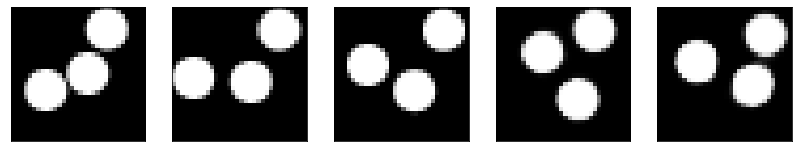

GD iterations:
i=0 | err=55.279732
i=1 | err=54.103363
i=2 | err=52.598740
i=3 | err=50.903389
i=4 | err=49.139404
i=5 | err=47.220924
i=6 | err=45.249027
i=7 | err=43.210403
i=8 | err=41.152050
i=9 | err=39.047043
i=10 | err=36.857655
i=11 | err=34.656033
i=12 | err=32.452484
i=13 | err=30.246765
i=14 | err=28.223557
i=15 | err=26.321487
i=16 | err=24.485233
i=17 | err=22.743160
i=18 | err=21.066639
i=19 | err=19.451258
i=20 | err=17.977514
i=21 | err=16.560684
i=22 | err=15.245802
i=23 | err=13.985556
i=24 | err=12.818531
i=25 | err=11.686527
i=26 | err=10.585306
i=27 | err=9.589084
i=28 | err=8.638372
i=29 | err=7.700280
Epoch=257 (35%) | out_positive=0.821705 | out_negative=0.104397 | mse=0.072557


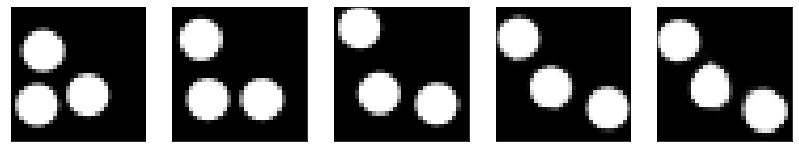

GD iterations:
i=0 | err=56.883644
i=1 | err=55.685387
i=2 | err=54.040726
i=3 | err=52.196358
i=4 | err=50.223091
i=5 | err=48.035706
i=6 | err=45.776146
i=7 | err=43.431778
i=8 | err=41.111935
i=9 | err=38.809982
i=10 | err=36.472847
i=11 | err=34.104073
i=12 | err=31.827639
i=13 | err=29.578056
i=14 | err=27.480621
i=15 | err=25.525967
i=16 | err=23.702703
i=17 | err=21.987432
i=18 | err=20.366444
i=19 | err=18.812977
i=20 | err=17.330776
i=21 | err=15.921668
i=22 | err=14.565186
i=23 | err=13.349781
i=24 | err=12.203886
i=25 | err=11.137203
i=26 | err=10.125299
i=27 | err=9.189033
i=28 | err=8.307063
i=29 | err=7.443638
Epoch=257 (36%) | out_positive=0.853052 | out_negative=0.089095 | mse=0.076742


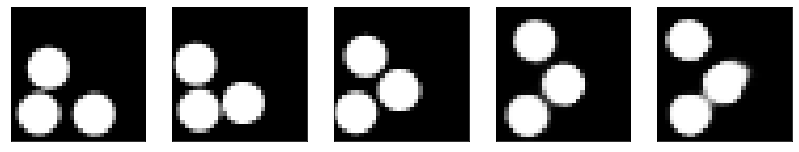

GD iterations:
i=0 | err=56.927765
i=1 | err=55.698181
i=2 | err=54.058304
i=3 | err=52.169296
i=4 | err=50.117344
i=5 | err=47.991028
i=6 | err=45.812077
i=7 | err=43.616199
i=8 | err=41.344311
i=9 | err=38.993286
i=10 | err=36.610619
i=11 | err=34.224365
i=12 | err=31.863171
i=13 | err=29.488819
i=14 | err=27.182903
i=15 | err=24.984394
i=16 | err=22.875406
i=17 | err=20.937038
i=18 | err=19.169149
i=19 | err=17.481642
i=20 | err=15.940207
i=21 | err=14.570683
i=22 | err=13.311785
i=23 | err=12.118616
i=24 | err=11.011076
i=25 | err=9.995145
i=26 | err=9.009113
i=27 | err=8.065602
i=28 | err=7.185505
i=29 | err=6.355194
Epoch=257 (38%) | out_positive=0.862038 | out_negative=0.170103 | mse=0.067279


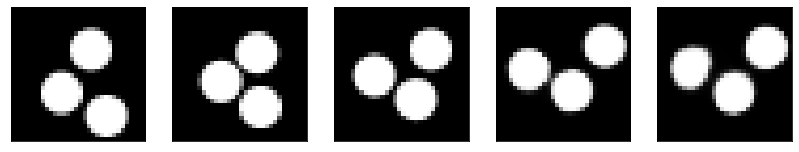

GD iterations:
i=0 | err=52.985268
i=1 | err=51.827801
i=2 | err=50.197502
i=3 | err=48.330147
i=4 | err=46.295433
i=5 | err=44.248970
i=6 | err=42.079781
i=7 | err=39.846382
i=8 | err=37.560989
i=9 | err=35.277275
i=10 | err=32.941326
i=11 | err=30.721806
i=12 | err=28.538479
i=13 | err=26.510164
i=14 | err=24.545956
i=15 | err=22.721310
i=16 | err=21.009615
i=17 | err=19.405952
i=18 | err=17.903141
i=19 | err=16.556908
i=20 | err=15.247954
i=21 | err=14.034184
i=22 | err=12.899903
i=23 | err=11.839622
i=24 | err=10.826889
i=25 | err=9.846595
i=26 | err=8.874508
i=27 | err=7.949559
i=28 | err=7.070230
i=29 | err=6.240224
Epoch=257 (40%) | out_positive=0.888292 | out_negative=0.159902 | mse=0.074776


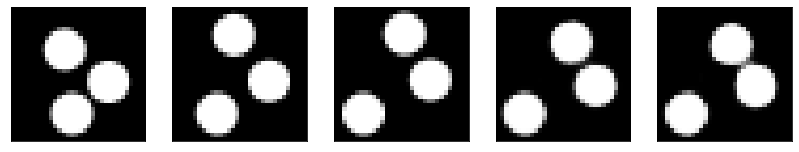

GD iterations:
i=0 | err=56.877003
i=1 | err=55.735588
i=2 | err=54.176704
i=3 | err=52.354927
i=4 | err=50.341236
i=5 | err=48.272141
i=6 | err=46.029705
i=7 | err=43.677139
i=8 | err=41.265617
i=9 | err=38.899330
i=10 | err=36.535965
i=11 | err=34.175560
i=12 | err=31.909206
i=13 | err=29.718449
i=14 | err=27.609594
i=15 | err=25.561533
i=16 | err=23.632843
i=17 | err=21.820423
i=18 | err=20.194225
i=19 | err=18.687119
i=20 | err=17.274841
i=21 | err=15.921017
i=22 | err=14.591608
i=23 | err=13.399870
i=24 | err=12.302458
i=25 | err=11.262419
i=26 | err=10.254004
i=27 | err=9.310057
i=28 | err=8.403292
i=29 | err=7.556138
Epoch=257 (42%) | out_positive=0.855050 | out_negative=0.141983 | mse=0.068998


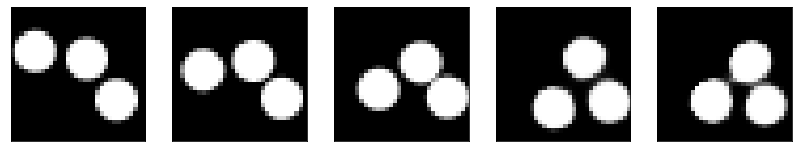

GD iterations:
i=0 | err=55.632149
i=1 | err=54.376472
i=2 | err=52.684113
i=3 | err=50.729980
i=4 | err=48.669209
i=5 | err=46.464314
i=6 | err=44.072201
i=7 | err=41.791962
i=8 | err=39.513401
i=9 | err=37.255646
i=10 | err=34.886543
i=11 | err=32.431961
i=12 | err=30.022076
i=13 | err=27.741043
i=14 | err=25.612843
i=15 | err=23.721004
i=16 | err=22.001862
i=17 | err=20.346870
i=18 | err=18.788061
i=19 | err=17.296741
i=20 | err=15.860952
i=21 | err=14.557793
i=22 | err=13.350817
i=23 | err=12.249022
i=24 | err=11.223783
i=25 | err=10.240802
i=26 | err=9.299734
i=27 | err=8.385906
i=28 | err=7.519062
i=29 | err=6.683793
Epoch=257 (43%) | out_positive=0.909581 | out_negative=0.107606 | mse=0.073865


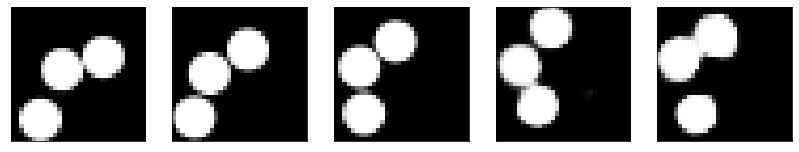

GD iterations:
i=0 | err=55.822041
i=1 | err=54.585629
i=2 | err=52.916344
i=3 | err=50.993378
i=4 | err=48.941177
i=5 | err=46.821938
i=6 | err=44.632042
i=7 | err=42.356750
i=8 | err=40.009048
i=9 | err=37.652931
i=10 | err=35.243835
i=11 | err=32.801044
i=12 | err=30.412205
i=13 | err=28.122726
i=14 | err=25.948235
i=15 | err=23.923180
i=16 | err=21.998146
i=17 | err=20.153999
i=18 | err=18.397612
i=19 | err=16.835560
i=20 | err=15.400957
i=21 | err=14.120961
i=22 | err=12.967359
i=23 | err=11.870576
i=24 | err=10.807275
i=25 | err=9.806470
i=26 | err=8.853995
i=27 | err=7.974380
i=28 | err=7.170014
i=29 | err=6.423391
Epoch=257 (45%) | out_positive=0.862172 | out_negative=0.133893 | mse=0.075617


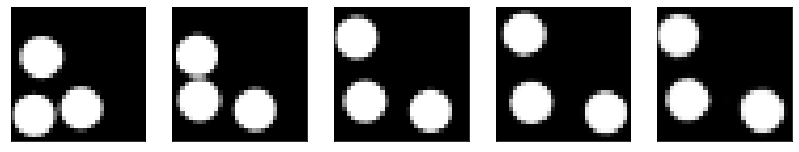

GD iterations:
i=0 | err=53.343700
i=1 | err=52.143478
i=2 | err=50.498020
i=3 | err=48.656494
i=4 | err=46.739578
i=5 | err=44.755753
i=6 | err=42.775402
i=7 | err=40.708336
i=8 | err=38.629547
i=9 | err=36.581104
i=10 | err=34.542969
i=11 | err=32.517654
i=12 | err=30.502188
i=13 | err=28.596493
i=14 | err=26.764404
i=15 | err=24.924257
i=16 | err=23.186216
i=17 | err=21.518177
i=18 | err=19.944395
i=19 | err=18.477184
i=20 | err=17.030138
i=21 | err=15.701881
i=22 | err=14.489143
i=23 | err=13.347305
i=24 | err=12.273556
i=25 | err=11.294214
i=26 | err=10.389458
i=27 | err=9.535945
i=28 | err=8.712242
i=29 | err=7.924071
Epoch=257 (47%) | out_positive=0.893836 | out_negative=0.135595 | mse=0.072584


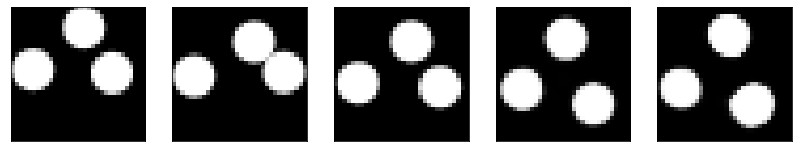

GD iterations:
i=0 | err=52.952412
i=1 | err=51.790672
i=2 | err=50.136581
i=3 | err=48.272129
i=4 | err=46.248474
i=5 | err=44.223713
i=6 | err=42.187199
i=7 | err=40.093025
i=8 | err=38.031239
i=9 | err=35.910309
i=10 | err=33.826027
i=11 | err=31.842726
i=12 | err=29.915012
i=13 | err=28.009434
i=14 | err=26.209433
i=15 | err=24.434303
i=16 | err=22.720583
i=17 | err=21.097504
i=18 | err=19.626068
i=19 | err=18.236973
i=20 | err=16.863764
i=21 | err=15.538492
i=22 | err=14.248770
i=23 | err=13.049779
i=24 | err=11.935625
i=25 | err=10.900796
i=26 | err=9.911944
i=27 | err=8.984820
i=28 | err=8.097699
i=29 | err=7.241461
Epoch=257 (49%) | out_positive=0.876136 | out_negative=0.114821 | mse=0.071101


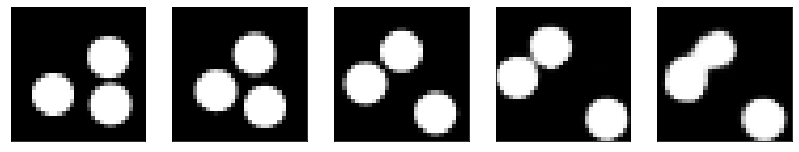

GD iterations:
i=0 | err=52.628014
i=1 | err=51.555511
i=2 | err=50.074951
i=3 | err=48.330994
i=4 | err=46.375298
i=5 | err=44.256111
i=6 | err=42.142281
i=7 | err=39.932323
i=8 | err=37.714142
i=9 | err=35.450497
i=10 | err=33.235390
i=11 | err=31.102966
i=12 | err=29.072868
i=13 | err=27.113155
i=14 | err=25.219883
i=15 | err=23.398380
i=16 | err=21.636719
i=17 | err=19.966988
i=18 | err=18.450718
i=19 | err=16.976555
i=20 | err=15.622898
i=21 | err=14.364889
i=22 | err=13.203941
i=23 | err=12.114816
i=24 | err=11.097109
i=25 | err=10.137481
i=26 | err=9.261040
i=27 | err=8.421265
i=28 | err=7.609749
i=29 | err=6.848231
Epoch=257 (51%) | out_positive=0.889886 | out_negative=0.141494 | mse=0.063894


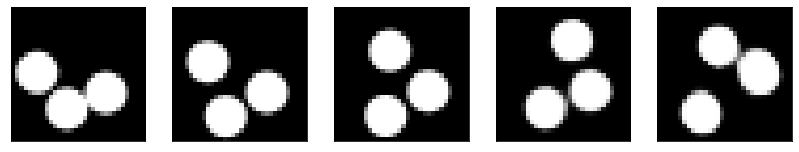

GD iterations:
i=0 | err=55.745285
i=1 | err=54.479294
i=2 | err=52.740837
i=3 | err=50.791553
i=4 | err=48.743011
i=5 | err=46.538887
i=6 | err=44.236687
i=7 | err=41.892075
i=8 | err=39.554482
i=9 | err=37.293583
i=10 | err=34.975067
i=11 | err=32.698074
i=12 | err=30.425892
i=13 | err=28.188583
i=14 | err=26.061024
i=15 | err=24.052670
i=16 | err=22.149939
i=17 | err=20.390301
i=18 | err=18.713654
i=19 | err=17.152321
i=20 | err=15.713693
i=21 | err=14.327198
i=22 | err=13.078660
i=23 | err=11.971718
i=24 | err=10.950831
i=25 | err=10.006456
i=26 | err=9.110529
i=27 | err=8.263607
i=28 | err=7.460845
i=29 | err=6.682648
Epoch=257 (53%) | out_positive=0.859960 | out_negative=0.129229 | mse=0.067530


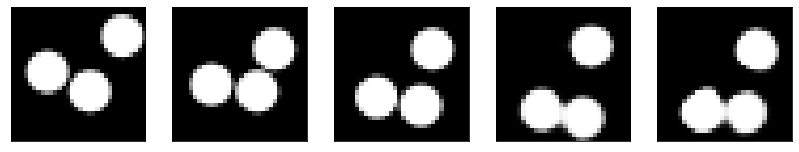

GD iterations:
i=0 | err=54.372051
i=1 | err=53.096054
i=2 | err=51.312717
i=3 | err=49.245113
i=4 | err=47.167599
i=5 | err=45.003876
i=6 | err=42.826118
i=7 | err=40.612465
i=8 | err=38.300606
i=9 | err=36.068146
i=10 | err=33.846794
i=11 | err=31.734989
i=12 | err=29.672905
i=13 | err=27.699432
i=14 | err=25.766708
i=15 | err=23.854546
i=16 | err=21.974098
i=17 | err=20.201298
i=18 | err=18.546658
i=19 | err=17.036346
i=20 | err=15.677432
i=21 | err=14.393332
i=22 | err=13.163122
i=23 | err=12.013603
i=24 | err=10.905813
i=25 | err=9.865459
i=26 | err=8.881410
i=27 | err=7.962915
i=28 | err=7.095365
i=29 | err=6.257330
Epoch=257 (55%) | out_positive=0.868210 | out_negative=0.136074 | mse=0.068863


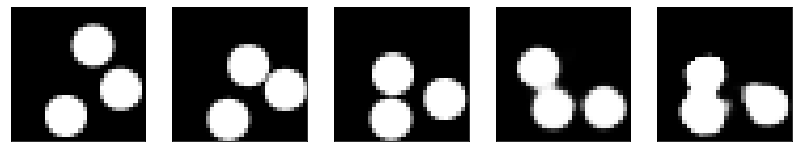

GD iterations:
i=0 | err=58.512032
i=1 | err=57.364571
i=2 | err=55.789146
i=3 | err=54.055954
i=4 | err=52.157867
i=5 | err=50.082962
i=6 | err=47.904144
i=7 | err=45.603622
i=8 | err=43.286537
i=9 | err=41.011772
i=10 | err=38.693836
i=11 | err=36.423458
i=12 | err=34.204556
i=13 | err=32.036659
i=14 | err=29.795494
i=15 | err=27.606150
i=16 | err=25.466072
i=17 | err=23.435261
i=18 | err=21.558781
i=19 | err=19.868540
i=20 | err=18.277840
i=21 | err=16.802658
i=22 | err=15.477737
i=23 | err=14.236956
i=24 | err=13.057610
i=25 | err=11.932501
i=26 | err=10.879636
i=27 | err=9.875616
i=28 | err=8.932558
i=29 | err=8.040818
Epoch=257 (56%) | out_positive=0.821274 | out_negative=0.131447 | mse=0.071629


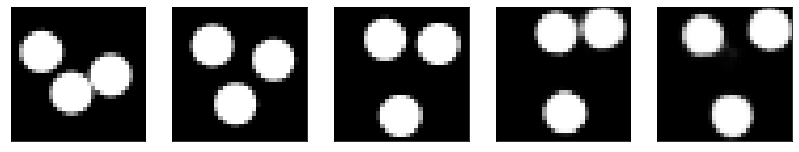

GD iterations:
i=0 | err=53.886925
i=1 | err=52.651024
i=2 | err=50.986347
i=3 | err=49.114517
i=4 | err=47.206135
i=5 | err=45.171013
i=6 | err=43.110371
i=7 | err=40.955505
i=8 | err=38.704803
i=9 | err=36.558617
i=10 | err=34.434811
i=11 | err=32.360107
i=12 | err=30.335762
i=13 | err=28.335361
i=14 | err=26.368980
i=15 | err=24.489309
i=16 | err=22.636662
i=17 | err=20.792377
i=18 | err=19.064274
i=19 | err=17.510775
i=20 | err=16.060005
i=21 | err=14.698641
i=22 | err=13.464109
i=23 | err=12.343500
i=24 | err=11.317224
i=25 | err=10.371170
i=26 | err=9.471482
i=27 | err=8.631120
i=28 | err=7.857756
i=29 | err=7.105351
Epoch=257 (58%) | out_positive=0.869845 | out_negative=0.128210 | mse=0.070649


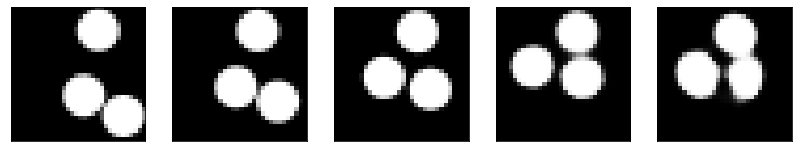

GD iterations:
i=0 | err=55.187263
i=1 | err=53.928871
i=2 | err=52.310524
i=3 | err=50.436420
i=4 | err=48.450104
i=5 | err=46.353951
i=6 | err=44.177277
i=7 | err=42.006752
i=8 | err=39.806366
i=9 | err=37.496269
i=10 | err=35.301765
i=11 | err=33.246872
i=12 | err=31.263184
i=13 | err=29.300652
i=14 | err=27.329689
i=15 | err=25.436447
i=16 | err=23.608246
i=17 | err=21.843376
i=18 | err=20.173405
i=19 | err=18.524487
i=20 | err=16.942062
i=21 | err=15.435621
i=22 | err=14.044330
i=23 | err=12.785192
i=24 | err=11.633709
i=25 | err=10.615269
i=26 | err=9.649399
i=27 | err=8.738063
i=28 | err=7.882946
i=29 | err=7.079633
Epoch=257 (60%) | out_positive=0.855090 | out_negative=0.097384 | mse=0.071046


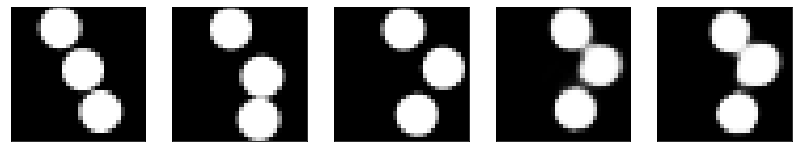

GD iterations:
i=0 | err=52.388008
i=1 | err=51.260578
i=2 | err=49.602623
i=3 | err=47.690388
i=4 | err=45.649490
i=5 | err=43.536793
i=6 | err=41.346661
i=7 | err=39.062683
i=8 | err=36.792671
i=9 | err=34.473358
i=10 | err=32.154594
i=11 | err=29.885391
i=12 | err=27.688972
i=13 | err=25.621262
i=14 | err=23.644478
i=15 | err=21.803690
i=16 | err=20.051382
i=17 | err=18.430677
i=18 | err=16.937098
i=19 | err=15.547414
i=20 | err=14.267836
i=21 | err=13.080269
i=22 | err=11.985098
i=23 | err=10.989631
i=24 | err=10.035179
i=25 | err=9.158257
i=26 | err=8.326294
i=27 | err=7.544391
i=28 | err=6.806084
i=29 | err=6.122292
Epoch=257 (62%) | out_positive=0.898283 | out_negative=0.140446 | mse=0.071587


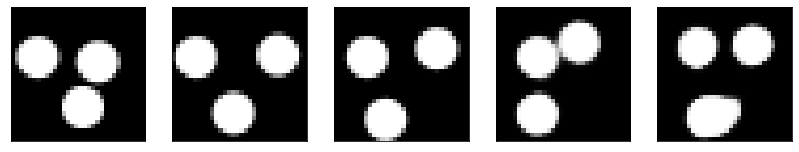

GD iterations:
i=0 | err=55.323608
i=1 | err=54.086842
i=2 | err=52.327812
i=3 | err=50.342773
i=4 | err=48.241894
i=5 | err=46.066170
i=6 | err=43.715336
i=7 | err=41.232796
i=8 | err=38.712933
i=9 | err=36.260864
i=10 | err=33.873299
i=11 | err=31.638933
i=12 | err=29.498320
i=13 | err=27.431622
i=14 | err=25.452320
i=15 | err=23.542009
i=16 | err=21.727852
i=17 | err=20.035969
i=18 | err=18.428955
i=19 | err=16.986477
i=20 | err=15.648067
i=21 | err=14.415295
i=22 | err=13.230279
i=23 | err=12.148759
i=24 | err=11.101924
i=25 | err=10.099031
i=26 | err=9.132055
i=27 | err=8.226686
i=28 | err=7.381600
i=29 | err=6.579634
Epoch=257 (64%) | out_positive=0.852382 | out_negative=0.142218 | mse=0.067844


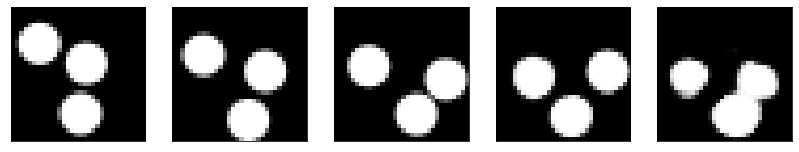

GD iterations:
i=0 | err=54.827415
i=1 | err=53.663918
i=2 | err=52.033348
i=3 | err=50.142372
i=4 | err=48.115082
i=5 | err=45.951805
i=6 | err=43.663448
i=7 | err=41.262833
i=8 | err=38.889984
i=9 | err=36.507530
i=10 | err=34.120743
i=11 | err=31.735157
i=12 | err=29.428957
i=13 | err=27.323566
i=14 | err=25.363129
i=15 | err=23.556353
i=16 | err=21.894287
i=17 | err=20.374115
i=18 | err=18.953403
i=19 | err=17.570658
i=20 | err=16.239143
i=21 | err=14.988403
i=22 | err=13.789630
i=23 | err=12.691956
i=24 | err=11.684384
i=25 | err=10.713791
i=26 | err=9.802222
i=27 | err=8.911639
i=28 | err=8.053875
i=29 | err=7.236755
Epoch=257 (65%) | out_positive=0.892519 | out_negative=0.126335 | mse=0.069912


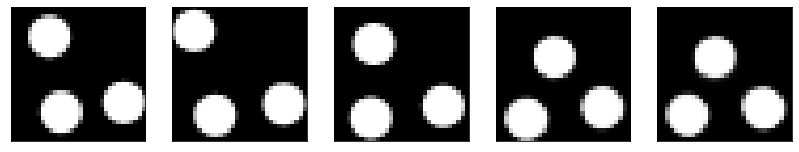

GD iterations:
i=0 | err=57.045601
i=1 | err=55.767067
i=2 | err=54.044151
i=3 | err=52.082180
i=4 | err=49.968414
i=5 | err=47.607487
i=6 | err=45.134598
i=7 | err=42.495773
i=8 | err=39.871040
i=9 | err=37.330284
i=10 | err=34.783855
i=11 | err=32.391811
i=12 | err=30.068733
i=13 | err=27.839577
i=14 | err=25.728954
i=15 | err=23.691740
i=16 | err=21.796001
i=17 | err=20.070362
i=18 | err=18.462442
i=19 | err=16.944687
i=20 | err=15.579752
i=21 | err=14.267242
i=22 | err=13.062716
i=23 | err=11.981772
i=24 | err=10.993177
i=25 | err=10.075594
i=26 | err=9.190748
i=27 | err=8.333930
i=28 | err=7.507587
i=29 | err=6.693727
Epoch=257 (67%) | out_positive=0.785660 | out_negative=0.114717 | mse=0.066323


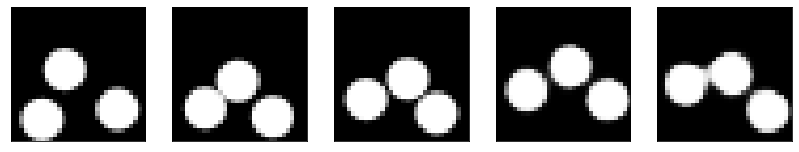

GD iterations:
i=0 | err=51.773491
i=1 | err=50.773216
i=2 | err=49.226074
i=3 | err=47.689735
i=4 | err=45.911808
i=5 | err=44.104408
i=6 | err=42.094181
i=7 | err=40.021069
i=8 | err=37.885864
i=9 | err=35.669674
i=10 | err=33.371262
i=11 | err=31.134071
i=12 | err=29.070988
i=13 | err=27.008099
i=14 | err=25.050226
i=15 | err=23.136597
i=16 | err=21.355648
i=17 | err=19.740858
i=18 | err=18.255901
i=19 | err=16.886934
i=20 | err=15.649133
i=21 | err=14.512812
i=22 | err=13.423419
i=23 | err=12.335274
i=24 | err=11.292781
i=25 | err=10.272861
i=26 | err=9.371495
i=27 | err=8.516022
i=28 | err=7.730822
i=29 | err=6.980267
Epoch=257 (69%) | out_positive=0.894584 | out_negative=0.104105 | mse=0.072485


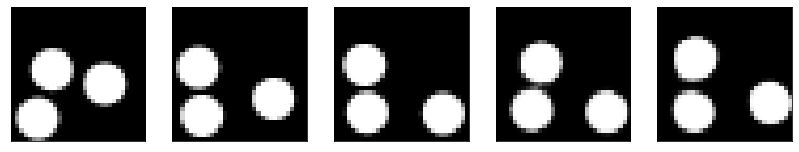

GD iterations:
i=0 | err=58.111561
i=1 | err=56.988846
i=2 | err=55.257259
i=3 | err=53.234848
i=4 | err=51.075962
i=5 | err=48.724548
i=6 | err=46.248238
i=7 | err=43.679230
i=8 | err=41.039398
i=9 | err=38.376732
i=10 | err=35.811562
i=11 | err=33.407112
i=12 | err=31.108189
i=13 | err=28.883450
i=14 | err=26.777292
i=15 | err=24.761280
i=16 | err=22.849884
i=17 | err=21.101906
i=18 | err=19.442347
i=19 | err=17.871685
i=20 | err=16.346622
i=21 | err=14.920219
i=22 | err=13.634711
i=23 | err=12.452312
i=24 | err=11.331084
i=25 | err=10.284140
i=26 | err=9.355551
i=27 | err=8.498455
i=28 | err=7.676541
i=29 | err=6.884740
Epoch=257 (71%) | out_positive=0.899043 | out_negative=0.183359 | mse=0.072867


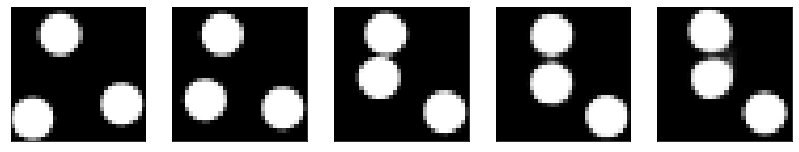

GD iterations:
i=0 | err=49.568741
i=1 | err=48.404816
i=2 | err=46.798172
i=3 | err=44.951313
i=4 | err=43.061737
i=5 | err=41.150913
i=6 | err=39.139778
i=7 | err=37.085346
i=8 | err=34.977459
i=9 | err=32.886444
i=10 | err=30.815475
i=11 | err=28.847607
i=12 | err=26.977135
i=13 | err=25.253567
i=14 | err=23.567413
i=15 | err=21.910484
i=16 | err=20.361336
i=17 | err=18.930651
i=18 | err=17.610252
i=19 | err=16.399971
i=20 | err=15.251684
i=21 | err=14.139786
i=22 | err=13.085516
i=23 | err=12.105883
i=24 | err=11.182100
i=25 | err=10.333835
i=26 | err=9.542993
i=27 | err=8.822246
i=28 | err=8.118164
i=29 | err=7.445449
Epoch=257 (73%) | out_positive=0.900281 | out_negative=0.103100 | mse=0.072012


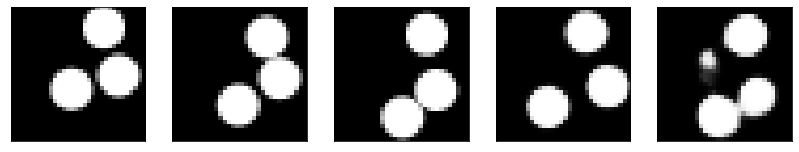

GD iterations:
i=0 | err=54.308781
i=1 | err=53.210720
i=2 | err=51.659527
i=3 | err=49.953812
i=4 | err=48.139046
i=5 | err=46.256512
i=6 | err=44.278011
i=7 | err=42.131142
i=8 | err=39.926193
i=9 | err=37.696175
i=10 | err=35.554733
i=11 | err=33.419830
i=12 | err=31.293715
i=13 | err=29.150822
i=14 | err=27.029861
i=15 | err=24.866385
i=16 | err=22.784561
i=17 | err=20.816236
i=18 | err=19.057016
i=19 | err=17.400330
i=20 | err=15.830727
i=21 | err=14.412506
i=22 | err=13.092793
i=23 | err=11.844074
i=24 | err=10.730437
i=25 | err=9.687099
i=26 | err=8.720798
i=27 | err=7.815631
i=28 | err=6.976891
i=29 | err=6.203345
Epoch=257 (75%) | out_positive=0.924569 | out_negative=0.172774 | mse=0.071308


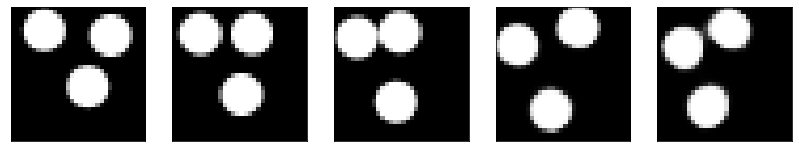

GD iterations:
i=0 | err=50.747795
i=1 | err=49.588799
i=2 | err=48.006805
i=3 | err=46.254684
i=4 | err=44.413788
i=5 | err=42.495373
i=6 | err=40.438526
i=7 | err=38.359241
i=8 | err=36.215302
i=9 | err=34.064384
i=10 | err=31.872314
i=11 | err=29.855015
i=12 | err=27.921410
i=13 | err=26.072775
i=14 | err=24.271526
i=15 | err=22.543465
i=16 | err=20.899967
i=17 | err=19.368893
i=18 | err=18.002022
i=19 | err=16.762085
i=20 | err=15.633758
i=21 | err=14.574677
i=22 | err=13.543398
i=23 | err=12.522985
i=24 | err=11.532164
i=25 | err=10.602848
i=26 | err=9.706371
i=27 | err=8.841886
i=28 | err=7.997804
i=29 | err=7.164370
Epoch=257 (77%) | out_positive=0.923389 | out_negative=0.116394 | mse=0.071373


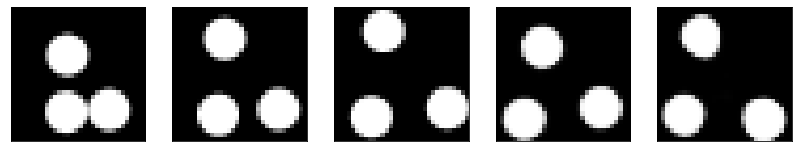

GD iterations:
i=0 | err=55.982613
i=1 | err=54.855721
i=2 | err=53.271915
i=3 | err=51.513512
i=4 | err=49.673252
i=5 | err=47.713814
i=6 | err=45.743042
i=7 | err=43.710606
i=8 | err=41.616039
i=9 | err=39.488571
i=10 | err=37.345261
i=11 | err=35.230949
i=12 | err=33.065125
i=13 | err=30.956001
i=14 | err=29.025288
i=15 | err=27.192554
i=16 | err=25.469849
i=17 | err=23.797693
i=18 | err=22.206921
i=19 | err=20.680672
i=20 | err=19.181232
i=21 | err=17.756855
i=22 | err=16.443434
i=23 | err=15.177313
i=24 | err=13.994709
i=25 | err=12.894634
i=26 | err=11.916883
i=27 | err=10.996103
i=28 | err=10.116267
i=29 | err=9.282766
Epoch=257 (78%) | out_positive=0.843477 | out_negative=0.109946 | mse=0.082254


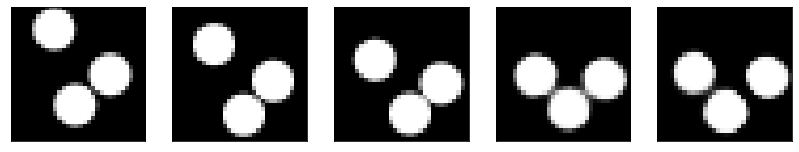

GD iterations:
i=0 | err=53.651222
i=1 | err=52.514183
i=2 | err=50.922928
i=3 | err=49.196350
i=4 | err=47.345779
i=5 | err=45.497055
i=6 | err=43.498451
i=7 | err=41.377766
i=8 | err=39.269829
i=9 | err=37.050594
i=10 | err=34.792564
i=11 | err=32.527481
i=12 | err=30.271381
i=13 | err=28.021011
i=14 | err=25.912949
i=15 | err=23.897890
i=16 | err=21.994652
i=17 | err=20.222565
i=18 | err=18.606680
i=19 | err=17.086868
i=20 | err=15.681198
i=21 | err=14.378129
i=22 | err=13.166739
i=23 | err=12.073790
i=24 | err=11.021635
i=25 | err=10.005732
i=26 | err=9.051516
i=27 | err=8.158381
i=28 | err=7.316178
i=29 | err=6.525870
Epoch=257 (80%) | out_positive=0.902121 | out_negative=0.135423 | mse=0.068914


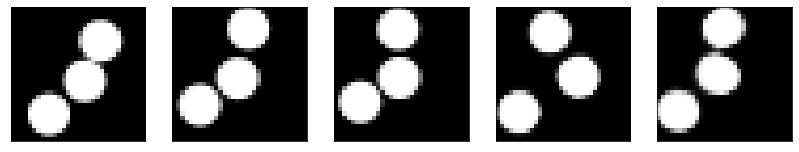

GD iterations:
i=0 | err=52.768749
i=1 | err=51.558823
i=2 | err=49.888008
i=3 | err=47.938179
i=4 | err=45.859146
i=5 | err=43.695770
i=6 | err=41.476120
i=7 | err=39.110809
i=8 | err=36.795902
i=9 | err=34.501057
i=10 | err=32.277657
i=11 | err=30.069248
i=12 | err=27.884422
i=13 | err=25.760178
i=14 | err=23.779438
i=15 | err=21.955381
i=16 | err=20.269178
i=17 | err=18.735441
i=18 | err=17.321682
i=19 | err=15.970375
i=20 | err=14.710227
i=21 | err=13.543071
i=22 | err=12.451765
i=23 | err=11.436951
i=24 | err=10.496568
i=25 | err=9.598954
i=26 | err=8.747912
i=27 | err=7.934573
i=28 | err=7.162268
i=29 | err=6.410225
Epoch=257 (82%) | out_positive=0.813184 | out_negative=0.151997 | mse=0.066877


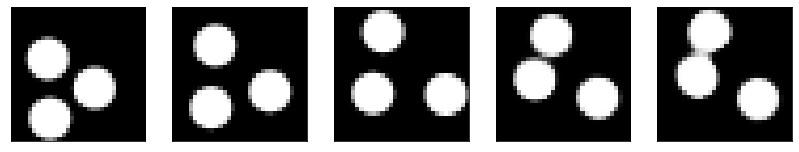

GD iterations:
i=0 | err=55.422108
i=1 | err=54.278896
i=2 | err=52.627647
i=3 | err=50.835091
i=4 | err=48.945747
i=5 | err=46.977966
i=6 | err=44.893997
i=7 | err=42.775581
i=8 | err=40.636795
i=9 | err=38.444244
i=10 | err=36.255516
i=11 | err=34.053242
i=12 | err=31.863918
i=13 | err=29.690546
i=14 | err=27.637581
i=15 | err=25.630154
i=16 | err=23.705490
i=17 | err=21.895512
i=18 | err=20.223915
i=19 | err=18.681515
i=20 | err=17.231934
i=21 | err=15.875588
i=22 | err=14.637457
i=23 | err=13.511596
i=24 | err=12.461264
i=25 | err=11.434322
i=26 | err=10.479515
i=27 | err=9.599257
i=28 | err=8.828396
i=29 | err=8.067072
Epoch=257 (84%) | out_positive=0.855257 | out_negative=0.098439 | mse=0.071285


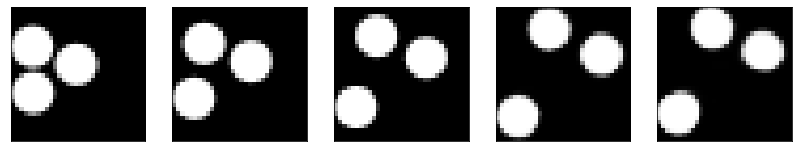

GD iterations:
i=0 | err=50.939911
i=1 | err=49.721954
i=2 | err=48.086498
i=3 | err=46.257965
i=4 | err=44.311890
i=5 | err=42.221840
i=6 | err=40.076874
i=7 | err=37.932526
i=8 | err=35.715935
i=9 | err=33.499527
i=10 | err=31.380697
i=11 | err=29.360897
i=12 | err=27.386341
i=13 | err=25.389069
i=14 | err=23.451035
i=15 | err=21.683355
i=16 | err=20.094685
i=17 | err=18.610159
i=18 | err=17.225079
i=19 | err=15.958075
i=20 | err=14.777481
i=21 | err=13.628982
i=22 | err=12.546459
i=23 | err=11.509550
i=24 | err=10.536655
i=25 | err=9.630079
i=26 | err=8.781345
i=27 | err=8.005131
i=28 | err=7.228052
i=29 | err=6.504976
Epoch=257 (86%) | out_positive=0.881439 | out_negative=0.144518 | mse=0.071678


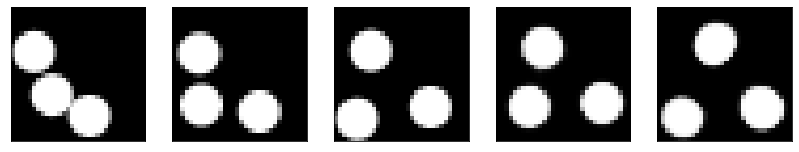

GD iterations:
i=0 | err=56.671913
i=1 | err=55.369667
i=2 | err=53.591175
i=3 | err=51.530769
i=4 | err=49.324062
i=5 | err=47.039970
i=6 | err=44.721455
i=7 | err=42.342636
i=8 | err=39.781017
i=9 | err=37.275833
i=10 | err=34.951591
i=11 | err=32.604599
i=12 | err=30.338705
i=13 | err=28.214554
i=14 | err=26.188602
i=15 | err=24.218109
i=16 | err=22.323105
i=17 | err=20.535982
i=18 | err=18.763836
i=19 | err=17.197033
i=20 | err=15.737469
i=21 | err=14.419239
i=22 | err=13.187822
i=23 | err=12.070307
i=24 | err=11.043653
i=25 | err=10.096649
i=26 | err=9.190626
i=27 | err=8.342796
i=28 | err=7.547199
i=29 | err=6.770876
Epoch=257 (88%) | out_positive=0.827683 | out_negative=0.153309 | mse=0.076234


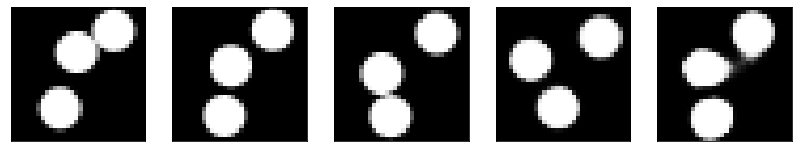

GD iterations:
i=0 | err=51.541962
i=1 | err=50.150787
i=2 | err=48.465279
i=3 | err=46.624760
i=4 | err=44.714645
i=5 | err=42.691586
i=6 | err=40.592216
i=7 | err=38.445080
i=8 | err=36.376148
i=9 | err=34.293823
i=10 | err=32.203369
i=11 | err=30.145844
i=12 | err=28.156612
i=13 | err=26.227514
i=14 | err=24.363667
i=15 | err=22.625401
i=16 | err=20.904770
i=17 | err=19.245798
i=18 | err=17.684687
i=19 | err=16.273022
i=20 | err=14.998376
i=21 | err=13.841129
i=22 | err=12.776062
i=23 | err=11.796452
i=24 | err=10.878971
i=25 | err=10.002148
i=26 | err=9.172783
i=27 | err=8.405785
i=28 | err=7.662046
i=29 | err=6.932661
Epoch=257 (89%) | out_positive=0.891283 | out_negative=0.085724 | mse=0.076046


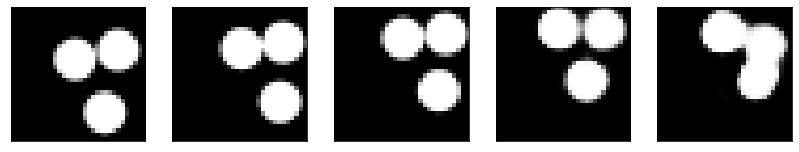

GD iterations:
i=0 | err=55.884014
i=1 | err=54.557823
i=2 | err=52.852592
i=3 | err=50.989090
i=4 | err=49.029991
i=5 | err=46.915527
i=6 | err=44.715919
i=7 | err=42.485573
i=8 | err=40.163918
i=9 | err=37.797733
i=10 | err=35.484158
i=11 | err=33.203663
i=12 | err=30.989519
i=13 | err=28.760643
i=14 | err=26.510618
i=15 | err=24.287163
i=16 | err=22.253887
i=17 | err=20.318916
i=18 | err=18.485500
i=19 | err=16.812469
i=20 | err=15.317575
i=21 | err=13.972134
i=22 | err=12.755011
i=23 | err=11.621443
i=24 | err=10.559032
i=25 | err=9.553294
i=26 | err=8.596642
i=27 | err=7.703349
i=28 | err=6.871355
i=29 | err=6.066907
Epoch=257 (91%) | out_positive=0.873662 | out_negative=0.109810 | mse=0.066727


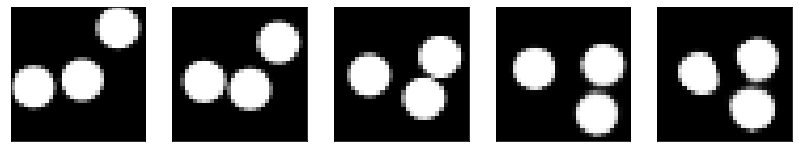

GD iterations:
i=0 | err=52.437096
i=1 | err=51.319572
i=2 | err=49.737804
i=3 | err=47.920807
i=4 | err=45.952454
i=5 | err=43.992065
i=6 | err=41.936249
i=7 | err=39.862064
i=8 | err=37.699959
i=9 | err=35.490135
i=10 | err=33.254704
i=11 | err=30.993959
i=12 | err=28.834171
i=13 | err=26.760641
i=14 | err=24.862928
i=15 | err=23.054787
i=16 | err=21.340508
i=17 | err=19.622673
i=18 | err=17.974621
i=19 | err=16.517920
i=20 | err=15.188871
i=21 | err=13.998425
i=22 | err=12.840517
i=23 | err=11.793159
i=24 | err=10.785442
i=25 | err=9.871387
i=26 | err=9.040815
i=27 | err=8.239402
i=28 | err=7.478644
i=29 | err=6.747992
Epoch=257 (93%) | out_positive=0.888855 | out_negative=0.125138 | mse=0.070441


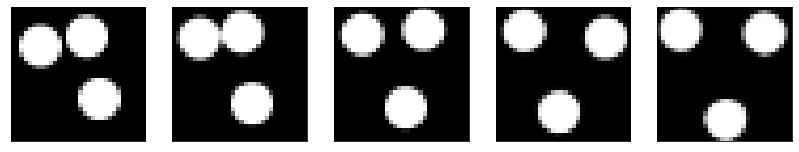

GD iterations:
i=0 | err=53.827606
i=1 | err=52.666695
i=2 | err=51.026066
i=3 | err=49.261551
i=4 | err=47.409653
i=5 | err=45.505959
i=6 | err=43.503807
i=7 | err=41.464653
i=8 | err=39.281334
i=9 | err=37.103741
i=10 | err=34.910149
i=11 | err=32.732628
i=12 | err=30.540668
i=13 | err=28.409916
i=14 | err=26.325033
i=15 | err=24.279369
i=16 | err=22.310116
i=17 | err=20.472767
i=18 | err=18.749105
i=19 | err=17.134972
i=20 | err=15.684881
i=21 | err=14.379107
i=22 | err=13.136601
i=23 | err=11.927866
i=24 | err=10.774302
i=25 | err=9.728085
i=26 | err=8.747950
i=27 | err=7.859383
i=28 | err=7.024832
i=29 | err=6.237309
Epoch=257 (95%) | out_positive=0.916509 | out_negative=0.159937 | mse=0.072582


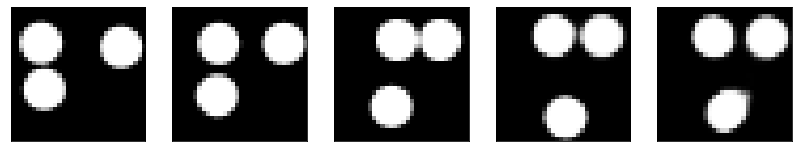

GD iterations:
i=0 | err=52.430931
i=1 | err=51.289661
i=2 | err=49.738281
i=3 | err=47.946457
i=4 | err=46.103371
i=5 | err=44.256588
i=6 | err=42.295902
i=7 | err=40.255135
i=8 | err=38.296078
i=9 | err=36.439503
i=10 | err=34.476318
i=11 | err=32.532295
i=12 | err=30.511623
i=13 | err=28.525814
i=14 | err=26.528994
i=15 | err=24.674713
i=16 | err=22.845131
i=17 | err=21.162704
i=18 | err=19.549242
i=19 | err=17.995209
i=20 | err=16.544222
i=21 | err=15.244378
i=22 | err=14.031710
i=23 | err=12.931996
i=24 | err=11.843740
i=25 | err=10.804777
i=26 | err=9.787879
i=27 | err=8.820219
i=28 | err=7.893318
i=29 | err=7.019632
Epoch=257 (97%) | out_positive=0.884986 | out_negative=0.118863 | mse=0.072486


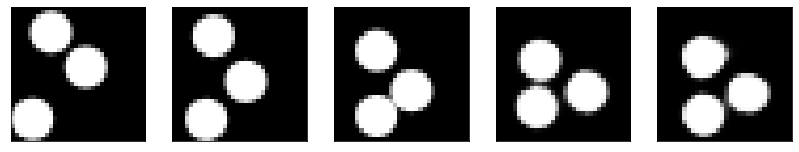

GD iterations:
i=0 | err=58.693222
i=1 | err=57.488209
i=2 | err=55.780670
i=3 | err=53.884346
i=4 | err=51.900345
i=5 | err=49.812355
i=6 | err=47.712116
i=7 | err=45.529152
i=8 | err=43.209854
i=9 | err=40.940201
i=10 | err=38.627350
i=11 | err=36.244461
i=12 | err=33.925156
i=13 | err=31.675827
i=14 | err=29.501421
i=15 | err=27.356085
i=16 | err=25.290611
i=17 | err=23.350853
i=18 | err=21.505306
i=19 | err=19.781887
i=20 | err=18.095346
i=21 | err=16.546862
i=22 | err=15.107211
i=23 | err=13.826441
i=24 | err=12.601595
i=25 | err=11.455988
i=26 | err=10.421761
i=27 | err=9.449631
i=28 | err=8.524950
i=29 | err=7.656870
Epoch=257 (99%) | out_positive=0.849254 | out_negative=0.107602 | mse=0.076262


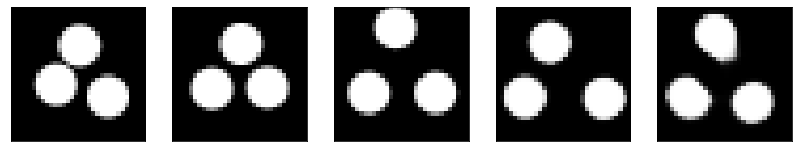

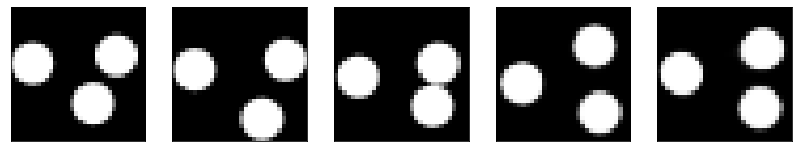

Test MSE 0.078643


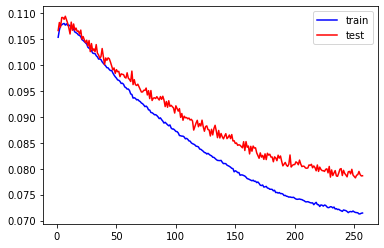

GD iterations:
i=0 | err=58.318535
i=1 | err=57.121674
i=2 | err=55.420326
i=3 | err=53.495499
i=4 | err=51.496040
i=5 | err=49.466934
i=6 | err=47.343391
i=7 | err=45.133121
i=8 | err=42.874645
i=9 | err=40.505440
i=10 | err=38.167095
i=11 | err=35.863224
i=12 | err=33.603138
i=13 | err=31.341721
i=14 | err=29.172670
i=15 | err=26.992428
i=16 | err=24.918554
i=17 | err=22.907032
i=18 | err=20.994270
i=19 | err=19.206871
i=20 | err=17.568876
i=21 | err=16.040701
i=22 | err=14.657276
i=23 | err=13.415420
i=24 | err=12.218267
i=25 | err=11.121510
i=26 | err=10.082173
i=27 | err=9.087067
i=28 | err=8.127853
i=29 | err=7.240698
Epoch=258 (0%) | out_positive=0.848816 | out_negative=0.101558 | mse=0.069506


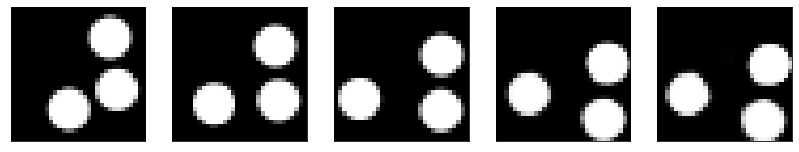

GD iterations:
i=0 | err=54.764793
i=1 | err=53.660118
i=2 | err=52.156982
i=3 | err=50.391579
i=4 | err=48.519161
i=5 | err=46.432076
i=6 | err=44.335915
i=7 | err=42.119690
i=8 | err=39.834236
i=9 | err=37.559715
i=10 | err=35.284302
i=11 | err=32.974548
i=12 | err=30.664459
i=13 | err=28.347454
i=14 | err=26.130138
i=15 | err=24.133160
i=16 | err=22.318068
i=17 | err=20.692816
i=18 | err=19.153187
i=19 | err=17.743071
i=20 | err=16.461809
i=21 | err=15.245275
i=22 | err=14.125442
i=23 | err=13.043953
i=24 | err=11.992287
i=25 | err=10.973217
i=26 | err=10.024334
i=27 | err=9.122194
i=28 | err=8.275537
i=29 | err=7.487520
Epoch=258 (2%) | out_positive=0.838274 | out_negative=0.138011 | mse=0.068358


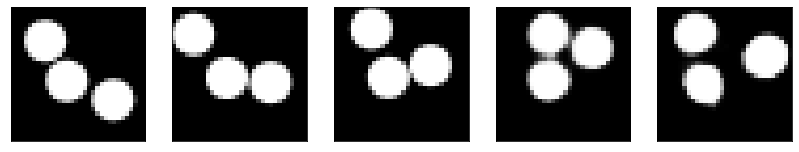

GD iterations:
i=0 | err=53.360157
i=1 | err=52.163635
i=2 | err=50.595177
i=3 | err=48.810516
i=4 | err=46.989326
i=5 | err=45.039337
i=6 | err=43.054775
i=7 | err=41.018391
i=8 | err=38.892216
i=9 | err=36.757622
i=10 | err=34.580811
i=11 | err=32.342140
i=12 | err=30.130398
i=13 | err=28.015072
i=14 | err=26.023903
i=15 | err=24.080582
i=16 | err=22.228376
i=17 | err=20.481564
i=18 | err=18.873177
i=19 | err=17.395317
i=20 | err=15.960272
i=21 | err=14.611713
i=22 | err=13.389294
i=23 | err=12.302494
i=24 | err=11.291140
i=25 | err=10.329363
i=26 | err=9.397758
i=27 | err=8.506358
i=28 | err=7.646615
i=29 | err=6.857553
Epoch=258 (4%) | out_positive=0.881687 | out_negative=0.111615 | mse=0.069400


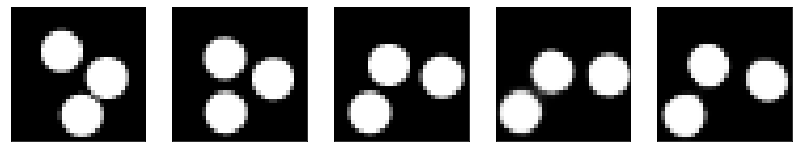

GD iterations:
i=0 | err=54.999897
i=1 | err=53.876579
i=2 | err=52.202614
i=3 | err=50.372631
i=4 | err=48.441757
i=5 | err=46.534462
i=6 | err=44.470398
i=7 | err=42.409531
i=8 | err=40.241592
i=9 | err=38.020798
i=10 | err=35.748741
i=11 | err=33.424610
i=12 | err=31.146931
i=13 | err=28.928600
i=14 | err=26.917515
i=15 | err=24.981958
i=16 | err=23.110659
i=17 | err=21.270863
i=18 | err=19.564522
i=19 | err=17.965118
i=20 | err=16.474579
i=21 | err=15.056168
i=22 | err=13.751003
i=23 | err=12.599971
i=24 | err=11.531667
i=25 | err=10.505914
i=26 | err=9.548054
i=27 | err=8.604310
i=28 | err=7.696308
i=29 | err=6.822860
Epoch=258 (6%) | out_positive=0.824992 | out_negative=0.078361 | mse=0.066653


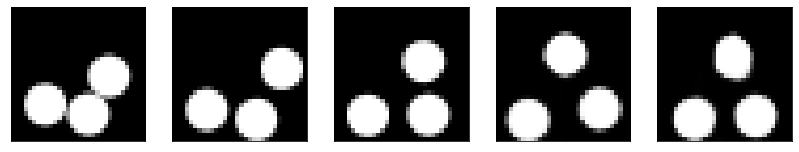

GD iterations:
i=0 | err=52.095493
i=1 | err=50.942352
i=2 | err=49.351311
i=3 | err=47.637310
i=4 | err=45.755096
i=5 | err=43.854622
i=6 | err=41.863777
i=7 | err=39.928925
i=8 | err=38.009220
i=9 | err=36.067009
i=10 | err=34.159164
i=11 | err=32.216022
i=12 | err=30.334110
i=13 | err=28.455717
i=14 | err=26.619278
i=15 | err=24.821365
i=16 | err=23.090714
i=17 | err=21.450329
i=18 | err=19.867138
i=19 | err=18.379047
i=20 | err=16.938808
i=21 | err=15.565844
i=22 | err=14.219707
i=23 | err=12.950665
i=24 | err=11.768400
i=25 | err=10.712805
i=26 | err=9.726894
i=27 | err=8.782063
i=28 | err=7.898749
i=29 | err=7.070501
Epoch=258 (7%) | out_positive=0.911632 | out_negative=0.112715 | mse=0.071171


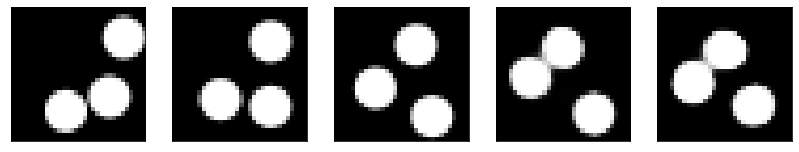

GD iterations:
i=0 | err=56.089890
i=1 | err=54.961601
i=2 | err=53.305496
i=3 | err=51.490257
i=4 | err=49.532314
i=5 | err=47.549538
i=6 | err=45.514565
i=7 | err=43.405975
i=8 | err=41.183338
i=9 | err=38.924095
i=10 | err=36.677738
i=11 | err=34.406857
i=12 | err=32.092339
i=13 | err=29.806774
i=14 | err=27.641582
i=15 | err=25.606808
i=16 | err=23.662006
i=17 | err=21.803526
i=18 | err=20.096462
i=19 | err=18.516861
i=20 | err=17.058893
i=21 | err=15.725809
i=22 | err=14.423578
i=23 | err=13.179749
i=24 | err=12.014076
i=25 | err=10.931556
i=26 | err=9.957486
i=27 | err=9.032663
i=28 | err=8.160906
i=29 | err=7.345842
Epoch=258 (9%) | out_positive=0.818506 | out_negative=0.109574 | mse=0.067134


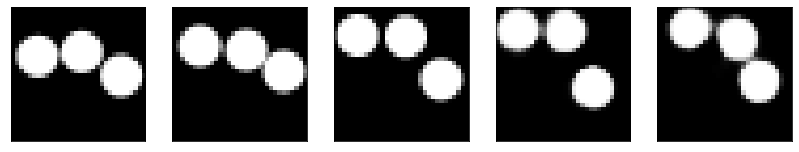

GD iterations:
i=0 | err=57.893044
i=1 | err=56.818066
i=2 | err=55.317184
i=3 | err=53.625404
i=4 | err=51.847942
i=5 | err=50.024273
i=6 | err=48.076416
i=7 | err=46.034248
i=8 | err=43.994858
i=9 | err=41.881554
i=10 | err=39.644924
i=11 | err=37.393036
i=12 | err=35.156967
i=13 | err=32.969254
i=14 | err=30.831678
i=15 | err=28.822189
i=16 | err=26.875563
i=17 | err=24.953876
i=18 | err=23.028332
i=19 | err=21.247543
i=20 | err=19.610891
i=21 | err=18.089180
i=22 | err=16.633358
i=23 | err=15.324716
i=24 | err=14.127110
i=25 | err=12.987640
i=26 | err=11.911154
i=27 | err=10.872227
i=28 | err=9.909921
i=29 | err=8.959580
Epoch=258 (11%) | out_positive=0.839888 | out_negative=0.069344 | mse=0.074235


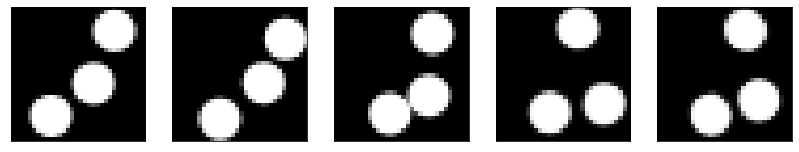

GD iterations:
i=0 | err=54.924980
i=1 | err=53.683762
i=2 | err=52.017319
i=3 | err=50.080177
i=4 | err=48.124752
i=5 | err=46.060879
i=6 | err=43.908924
i=7 | err=41.617493
i=8 | err=39.217628
i=9 | err=36.808662
i=10 | err=34.519981
i=11 | err=32.302231
i=12 | err=30.167725
i=13 | err=28.117573
i=14 | err=26.141912
i=15 | err=24.230314
i=16 | err=22.445774
i=17 | err=20.794411
i=18 | err=19.255049
i=19 | err=17.800972
i=20 | err=16.438227
i=21 | err=15.128376
i=22 | err=13.875671
i=23 | err=12.729778
i=24 | err=11.644732
i=25 | err=10.622614
i=26 | err=9.663383
i=27 | err=8.766969
i=28 | err=7.886079
i=29 | err=7.060195
Epoch=258 (13%) | out_positive=0.876195 | out_negative=0.112422 | mse=0.070862


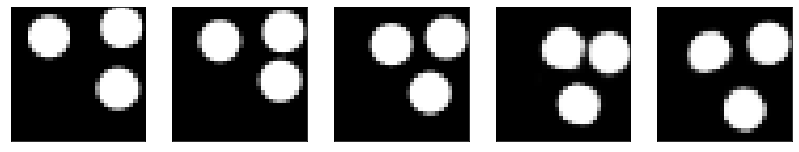

GD iterations:
i=0 | err=53.324974
i=1 | err=52.103737
i=2 | err=50.422604
i=3 | err=48.508041
i=4 | err=46.433491
i=5 | err=44.357758
i=6 | err=42.204010
i=7 | err=40.102093
i=8 | err=37.883087
i=9 | err=35.658894
i=10 | err=33.441139
i=11 | err=31.222229
i=12 | err=29.139826
i=13 | err=27.068390
i=14 | err=25.145775
i=15 | err=23.318523
i=16 | err=21.584286
i=17 | err=19.909964
i=18 | err=18.312321
i=19 | err=16.864305
i=20 | err=15.528192
i=21 | err=14.317427
i=22 | err=13.192816
i=23 | err=12.144184
i=24 | err=11.124090
i=25 | err=10.173547
i=26 | err=9.243584
i=27 | err=8.363550
i=28 | err=7.516059
i=29 | err=6.722929
Epoch=258 (15%) | out_positive=0.867108 | out_negative=0.156967 | mse=0.069646


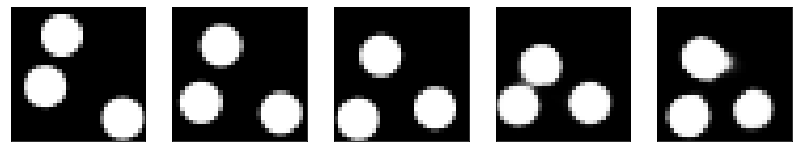

GD iterations:
i=0 | err=55.061012
i=1 | err=53.880383
i=2 | err=52.231903
i=3 | err=50.369724
i=4 | err=48.359531
i=5 | err=46.224922
i=6 | err=43.995296
i=7 | err=41.623421
i=8 | err=39.239189
i=9 | err=36.765762
i=10 | err=34.322014
i=11 | err=31.951536
i=12 | err=29.678474
i=13 | err=27.461567
i=14 | err=25.314930
i=15 | err=23.357956
i=16 | err=21.450550
i=17 | err=19.663857
i=18 | err=17.989397
i=19 | err=16.399715
i=20 | err=14.963820
i=21 | err=13.679922
i=22 | err=12.460946
i=23 | err=11.334416
i=24 | err=10.283678
i=25 | err=9.323763
i=26 | err=8.394503
i=27 | err=7.525059
i=28 | err=6.713215
i=29 | err=5.934468
Epoch=258 (17%) | out_positive=0.890388 | out_negative=0.180421 | mse=0.068929


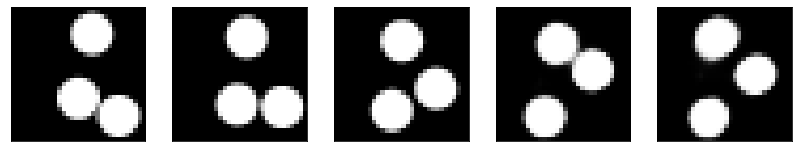

GD iterations:
i=0 | err=55.453842
i=1 | err=54.232090
i=2 | err=52.502098
i=3 | err=50.596722
i=4 | err=48.525604
i=5 | err=46.443081
i=6 | err=44.286213
i=7 | err=42.017742
i=8 | err=39.689087
i=9 | err=37.403831
i=10 | err=35.041359
i=11 | err=32.760807
i=12 | err=30.512344
i=13 | err=28.387079
i=14 | err=26.388090
i=15 | err=24.416288
i=16 | err=22.554947
i=17 | err=20.764439
i=18 | err=19.069588
i=19 | err=17.493332
i=20 | err=16.045063
i=21 | err=14.687572
i=22 | err=13.455009
i=23 | err=12.332769
i=24 | err=11.288062
i=25 | err=10.312559
i=26 | err=9.419718
i=27 | err=8.554682
i=28 | err=7.740636
i=29 | err=6.977666
Epoch=258 (18%) | out_positive=0.809623 | out_negative=0.095101 | mse=0.069802


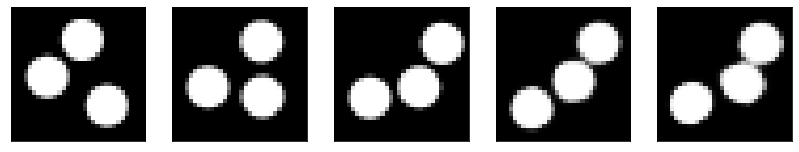

GD iterations:
i=0 | err=52.541267
i=1 | err=51.357498
i=2 | err=49.783447
i=3 | err=47.982819
i=4 | err=46.122105
i=5 | err=44.202854
i=6 | err=42.164505
i=7 | err=40.028625
i=8 | err=37.825108
i=9 | err=35.543228
i=10 | err=33.294136
i=11 | err=31.101664
i=12 | err=28.939932
i=13 | err=26.931538
i=14 | err=25.006516
i=15 | err=23.186047
i=16 | err=21.478218
i=17 | err=19.808582
i=18 | err=18.235012
i=19 | err=16.726048
i=20 | err=15.273278
i=21 | err=13.953916
i=22 | err=12.736134
i=23 | err=11.606053
i=24 | err=10.570070
i=25 | err=9.599887
i=26 | err=8.683509
i=27 | err=7.834067
i=28 | err=7.034591
i=29 | err=6.290746
Epoch=258 (20%) | out_positive=0.920415 | out_negative=0.131426 | mse=0.072164


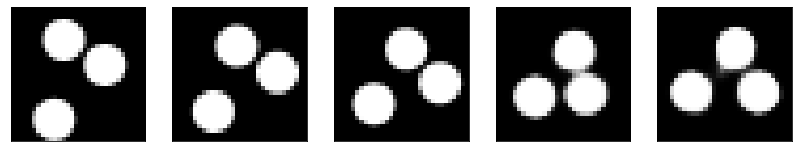

GD iterations:
i=0 | err=58.650959
i=1 | err=57.350044
i=2 | err=55.719574
i=3 | err=53.811653
i=4 | err=51.817551
i=5 | err=49.697403
i=6 | err=47.543877
i=7 | err=45.291801
i=8 | err=42.960075
i=9 | err=40.665321
i=10 | err=38.351334
i=11 | err=35.990997
i=12 | err=33.539291
i=13 | err=31.103025
i=14 | err=28.768187
i=15 | err=26.465395
i=16 | err=24.249437
i=17 | err=22.084675
i=18 | err=19.976141
i=19 | err=18.031189
i=20 | err=16.290735
i=21 | err=14.741404
i=22 | err=13.311720
i=23 | err=11.993639
i=24 | err=10.743704
i=25 | err=9.620286
i=26 | err=8.599693
i=27 | err=7.637821
i=28 | err=6.744783
i=29 | err=5.918038
Epoch=258 (22%) | out_positive=0.888750 | out_negative=0.139488 | mse=0.077085


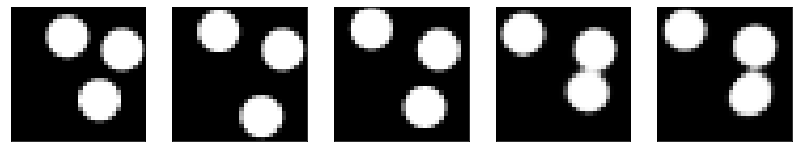

GD iterations:
i=0 | err=58.461128
i=1 | err=57.229774
i=2 | err=55.440510
i=3 | err=53.508255
i=4 | err=51.429665
i=5 | err=49.308975
i=6 | err=47.163246
i=7 | err=44.864815
i=8 | err=42.487076
i=9 | err=40.027832
i=10 | err=37.488800
i=11 | err=34.935528
i=12 | err=32.506393
i=13 | err=30.205015
i=14 | err=27.994919
i=15 | err=25.950081
i=16 | err=24.047588
i=17 | err=22.205080
i=18 | err=20.481733
i=19 | err=18.830505
i=20 | err=17.325905
i=21 | err=16.012722
i=22 | err=14.740724
i=23 | err=13.541807
i=24 | err=12.397448
i=25 | err=11.360937
i=26 | err=10.350744
i=27 | err=9.380617
i=28 | err=8.441319
i=29 | err=7.600019
Epoch=258 (24%) | out_positive=0.782438 | out_negative=0.107485 | mse=0.064961


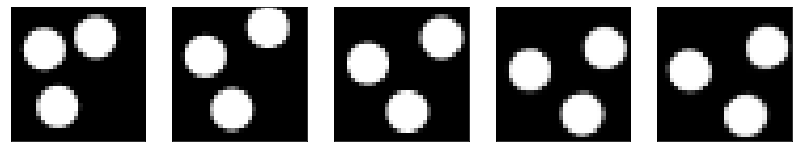

GD iterations:
i=0 | err=53.433014
i=1 | err=52.255116
i=2 | err=50.663040
i=3 | err=48.909462
i=4 | err=46.971489
i=5 | err=45.036736
i=6 | err=43.027649
i=7 | err=40.972603
i=8 | err=38.844437
i=9 | err=36.646435
i=10 | err=34.473450
i=11 | err=32.326035
i=12 | err=30.243198
i=13 | err=28.348183
i=14 | err=26.453615
i=15 | err=24.655691
i=16 | err=22.913628
i=17 | err=21.271444
i=18 | err=19.635399
i=19 | err=18.089651
i=20 | err=16.589651
i=21 | err=15.200278
i=22 | err=13.878262
i=23 | err=12.696160
i=24 | err=11.610159
i=25 | err=10.649107
i=26 | err=9.718531
i=27 | err=8.818945
i=28 | err=7.954006
i=29 | err=7.122413
Epoch=258 (26%) | out_positive=0.900131 | out_negative=0.108567 | mse=0.070882


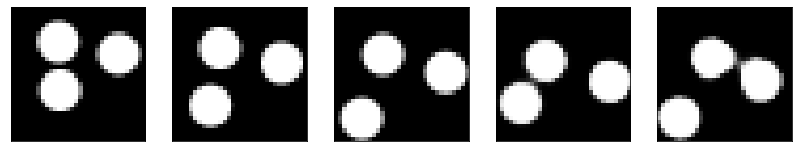

GD iterations:
i=0 | err=51.415901
i=1 | err=50.175537
i=2 | err=48.487457
i=3 | err=46.671307
i=4 | err=44.834045
i=5 | err=42.892914
i=6 | err=40.991356
i=7 | err=38.970264
i=8 | err=36.919338
i=9 | err=34.727036
i=10 | err=32.535923
i=11 | err=30.482040
i=12 | err=28.463167
i=13 | err=26.505661
i=14 | err=24.616055
i=15 | err=22.853973
i=16 | err=21.227242
i=17 | err=19.724541
i=18 | err=18.310280
i=19 | err=16.958239
i=20 | err=15.743118
i=21 | err=14.597057
i=22 | err=13.521534
i=23 | err=12.499282
i=24 | err=11.520852
i=25 | err=10.561659
i=26 | err=9.665615
i=27 | err=8.832533
i=28 | err=8.056887
i=29 | err=7.322562
Epoch=258 (28%) | out_positive=0.926926 | out_negative=0.088530 | mse=0.074829


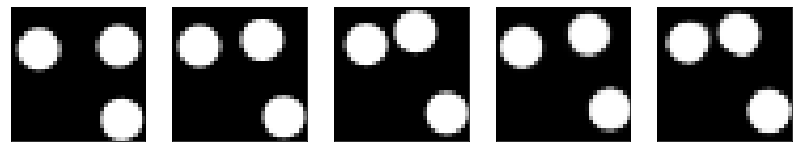

GD iterations:
i=0 | err=53.474834
i=1 | err=52.387680
i=2 | err=50.902901
i=3 | err=49.183773
i=4 | err=47.293053
i=5 | err=45.262962
i=6 | err=43.089306
i=7 | err=40.877094
i=8 | err=38.593941
i=9 | err=36.279594
i=10 | err=33.981461
i=11 | err=31.745247
i=12 | err=29.522245
i=13 | err=27.371407
i=14 | err=25.292755
i=15 | err=23.315035
i=16 | err=21.480995
i=17 | err=19.793083
i=18 | err=18.277313
i=19 | err=16.883121
i=20 | err=15.546088
i=21 | err=14.293581
i=22 | err=13.152289
i=23 | err=12.099155
i=24 | err=11.088573
i=25 | err=10.117246
i=26 | err=9.194149
i=27 | err=8.321819
i=28 | err=7.465777
i=29 | err=6.650873
Epoch=258 (29%) | out_positive=0.877277 | out_negative=0.116215 | mse=0.068834


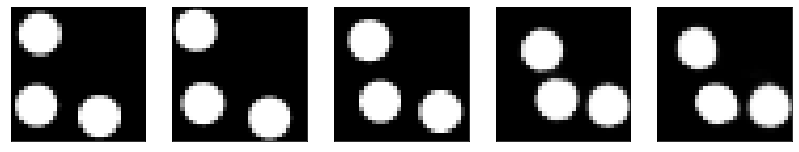

GD iterations:
i=0 | err=57.591969
i=1 | err=56.353386
i=2 | err=54.688652
i=3 | err=52.764679
i=4 | err=50.690067
i=5 | err=48.482838
i=6 | err=46.268517
i=7 | err=44.023613
i=8 | err=41.719971
i=9 | err=39.397549
i=10 | err=37.079182
i=11 | err=34.705330
i=12 | err=32.330536
i=13 | err=30.009066
i=14 | err=27.827541
i=15 | err=25.809456
i=16 | err=23.951370
i=17 | err=22.241800
i=18 | err=20.610062
i=19 | err=19.032322
i=20 | err=17.587955
i=21 | err=16.250229
i=22 | err=15.006689
i=23 | err=13.832238
i=24 | err=12.683979
i=25 | err=11.545551
i=26 | err=10.524982
i=27 | err=9.571901
i=28 | err=8.684427
i=29 | err=7.854485
Epoch=258 (31%) | out_positive=0.855081 | out_negative=0.103178 | mse=0.074729


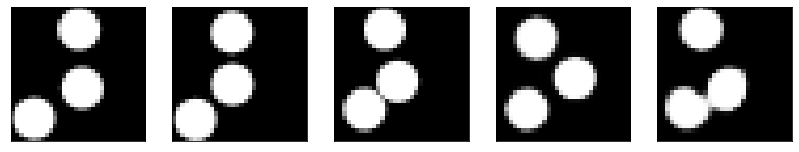

GD iterations:
i=0 | err=53.882164
i=1 | err=52.840557
i=2 | err=51.395470
i=3 | err=49.795338
i=4 | err=48.063679
i=5 | err=46.241272
i=6 | err=44.393581
i=7 | err=42.464138
i=8 | err=40.466858
i=9 | err=38.479427
i=10 | err=36.366535
i=11 | err=34.230431
i=12 | err=32.079506
i=13 | err=29.899952
i=14 | err=27.761587
i=15 | err=25.669716
i=16 | err=23.670677
i=17 | err=21.841347
i=18 | err=20.179415
i=19 | err=18.648634
i=20 | err=17.218851
i=21 | err=15.901100
i=22 | err=14.696692
i=23 | err=13.583786
i=24 | err=12.527948
i=25 | err=11.515976
i=26 | err=10.539021
i=27 | err=9.604565
i=28 | err=8.723317
i=29 | err=7.863675
Epoch=258 (33%) | out_positive=0.778894 | out_negative=0.084779 | mse=0.075673


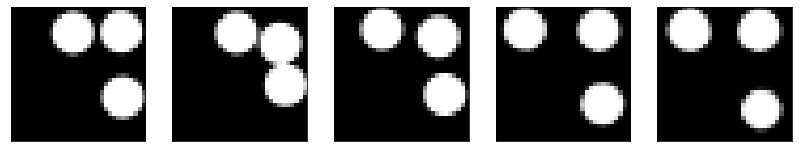

GD iterations:
i=0 | err=51.769230
i=1 | err=50.520836
i=2 | err=48.773079
i=3 | err=46.853146
i=4 | err=44.809834
i=5 | err=42.642242
i=6 | err=40.466026
i=7 | err=38.239845
i=8 | err=36.037441
i=9 | err=33.870598
i=10 | err=31.811909
i=11 | err=29.767111
i=12 | err=27.829052
i=13 | err=25.910324
i=14 | err=24.070196
i=15 | err=22.213419
i=16 | err=20.474463
i=17 | err=18.876152
i=18 | err=17.389540
i=19 | err=16.028793
i=20 | err=14.758657
i=21 | err=13.571169
i=22 | err=12.462009
i=23 | err=11.367465
i=24 | err=10.304195
i=25 | err=9.282236
i=26 | err=8.353534
i=27 | err=7.515965
i=28 | err=6.748303
i=29 | err=6.012972
Epoch=258 (34%) | out_positive=0.922658 | out_negative=0.133131 | mse=0.070798


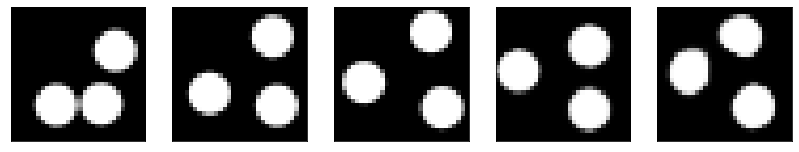

GD iterations:
i=0 | err=54.973400
i=1 | err=53.764076
i=2 | err=52.083359
i=3 | err=50.225040
i=4 | err=48.279530
i=5 | err=46.243038
i=6 | err=44.115578
i=7 | err=41.882599
i=8 | err=39.590363
i=9 | err=37.289669
i=10 | err=35.081329
i=11 | err=32.937946
i=12 | err=30.860979
i=13 | err=28.862036
i=14 | err=26.956110
i=15 | err=25.157236
i=16 | err=23.460682
i=17 | err=21.798717
i=18 | err=20.222832
i=19 | err=18.787603
i=20 | err=17.399490
i=21 | err=16.040247
i=22 | err=14.769242
i=23 | err=13.598787
i=24 | err=12.518507
i=25 | err=11.536614
i=26 | err=10.572350
i=27 | err=9.668983
i=28 | err=8.788401
i=29 | err=7.941690
Epoch=258 (36%) | out_positive=0.855762 | out_negative=0.081173 | mse=0.070595


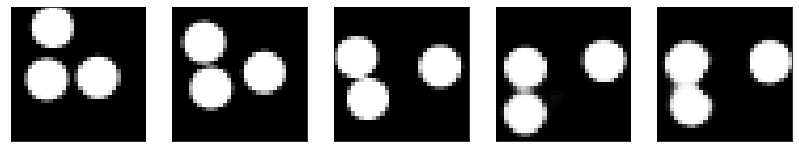

GD iterations:
i=0 | err=51.527550
i=1 | err=50.445946
i=2 | err=48.983864
i=3 | err=47.406624
i=4 | err=45.661892
i=5 | err=43.878857
i=6 | err=42.036911
i=7 | err=40.075817
i=8 | err=38.173538
i=9 | err=36.247707
i=10 | err=34.380119
i=11 | err=32.490543
i=12 | err=30.659334
i=13 | err=28.902567
i=14 | err=27.196545
i=15 | err=25.553108
i=16 | err=23.961718
i=17 | err=22.447023
i=18 | err=20.947147
i=19 | err=19.476723
i=20 | err=18.070156
i=21 | err=16.737946
i=22 | err=15.498531
i=23 | err=14.328627
i=24 | err=13.230021
i=25 | err=12.238116
i=26 | err=11.305283
i=27 | err=10.411226
i=28 | err=9.564894
i=29 | err=8.749344
Epoch=258 (38%) | out_positive=0.890175 | out_negative=0.120614 | mse=0.074401


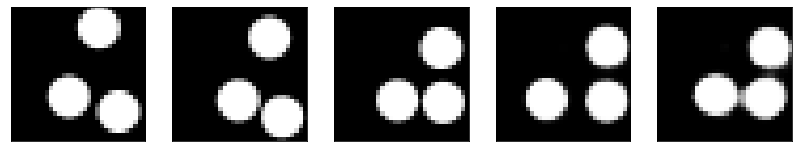

GD iterations:
i=0 | err=50.470909
i=1 | err=49.193218
i=2 | err=47.506069
i=3 | err=45.605984
i=4 | err=43.563736
i=5 | err=41.464939
i=6 | err=39.279037
i=7 | err=37.034843
i=8 | err=34.813385
i=9 | err=32.638222
i=10 | err=30.571157
i=11 | err=28.622972
i=12 | err=26.803375
i=13 | err=25.109875
i=14 | err=23.493135
i=15 | err=21.930229
i=16 | err=20.443548
i=17 | err=19.018768
i=18 | err=17.669371
i=19 | err=16.411978
i=20 | err=15.249731
i=21 | err=14.174992
i=22 | err=13.153709
i=23 | err=12.159097
i=24 | err=11.203884
i=25 | err=10.299620
i=26 | err=9.448071
i=27 | err=8.641446
i=28 | err=7.842031
i=29 | err=7.066319
Epoch=258 (40%) | out_positive=0.884758 | out_negative=0.110997 | mse=0.066121


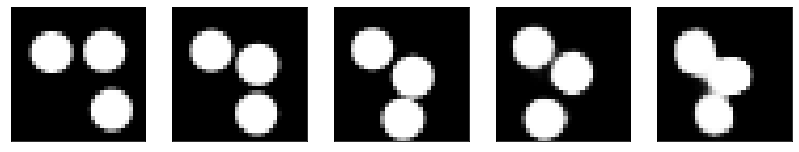

GD iterations:
i=0 | err=50.321602
i=1 | err=49.074493
i=2 | err=47.393345
i=3 | err=45.660995
i=4 | err=43.811218
i=5 | err=42.066128
i=6 | err=40.264622
i=7 | err=38.395653
i=8 | err=36.426247
i=9 | err=34.454559
i=10 | err=32.480377
i=11 | err=30.536053
i=12 | err=28.581532
i=13 | err=26.675655
i=14 | err=24.835190
i=15 | err=23.062477
i=16 | err=21.364601
i=17 | err=19.790655
i=18 | err=18.333939
i=19 | err=16.932018
i=20 | err=15.609997
i=21 | err=14.346070
i=22 | err=13.144413
i=23 | err=12.053947
i=24 | err=11.024961
i=25 | err=10.070063
i=26 | err=9.146304
i=27 | err=8.271111
i=28 | err=7.403131
i=29 | err=6.556706
Epoch=258 (41%) | out_positive=0.911770 | out_negative=0.141817 | mse=0.068209


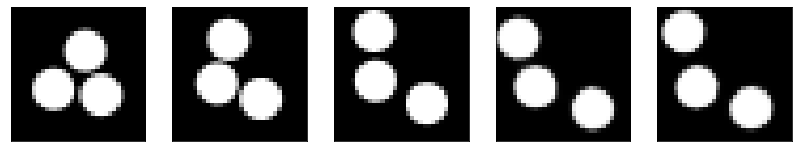

GD iterations:
i=0 | err=56.488403
i=1 | err=55.143288
i=2 | err=53.252937
i=3 | err=51.120384
i=4 | err=48.894341
i=5 | err=46.565758
i=6 | err=44.199425
i=7 | err=41.804737
i=8 | err=39.333847
i=9 | err=36.893753
i=10 | err=34.403812
i=11 | err=31.988787
i=12 | err=29.558144
i=13 | err=27.253647
i=14 | err=25.107431
i=15 | err=23.161743
i=16 | err=21.289577
i=17 | err=19.595573
i=18 | err=18.004669
i=19 | err=16.538469
i=20 | err=15.184305
i=21 | err=13.950237
i=22 | err=12.828970
i=23 | err=11.787346
i=24 | err=10.808653
i=25 | err=9.893021
i=26 | err=9.031773
i=27 | err=8.205429
i=28 | err=7.417229
i=29 | err=6.671210
Epoch=258 (43%) | out_positive=0.832159 | out_negative=0.117969 | mse=0.068853


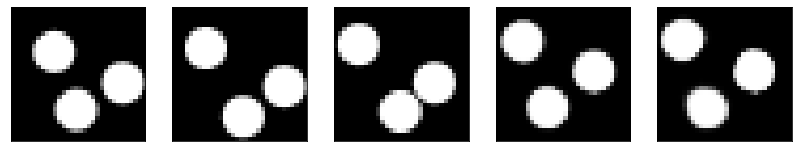

GD iterations:
i=0 | err=55.536755
i=1 | err=54.306423
i=2 | err=52.677879
i=3 | err=50.844467
i=4 | err=48.915680
i=5 | err=46.867210
i=6 | err=44.735340
i=7 | err=42.489563
i=8 | err=40.185379
i=9 | err=37.878075
i=10 | err=35.579750
i=11 | err=33.354027
i=12 | err=31.255041
i=13 | err=29.179733
i=14 | err=27.260563
i=15 | err=25.423986
i=16 | err=23.740431
i=17 | err=22.101810
i=18 | err=20.580326
i=19 | err=19.195747
i=20 | err=17.924253
i=21 | err=16.700027
i=22 | err=15.521587
i=23 | err=14.353637
i=24 | err=13.284859
i=25 | err=12.246716
i=26 | err=11.235064
i=27 | err=10.256216
i=28 | err=9.329496
i=29 | err=8.476532
Epoch=258 (45%) | out_positive=0.802102 | out_negative=0.073147 | mse=0.072385


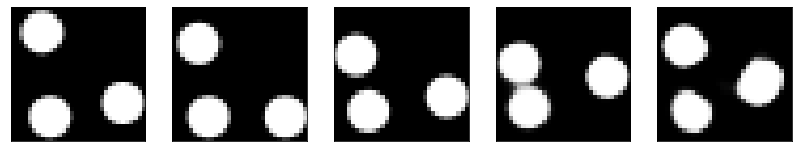

GD iterations:
i=0 | err=50.041451
i=1 | err=48.861610
i=2 | err=47.359493
i=3 | err=45.605103
i=4 | err=43.830208
i=5 | err=41.835548
i=6 | err=39.805309
i=7 | err=37.706261
i=8 | err=35.486019
i=9 | err=33.258656
i=10 | err=31.108137
i=11 | err=29.103832
i=12 | err=27.138420
i=13 | err=25.259001
i=14 | err=23.471409
i=15 | err=21.834528
i=16 | err=20.252359
i=17 | err=18.801929
i=18 | err=17.437189
i=19 | err=16.151035
i=20 | err=14.903269
i=21 | err=13.734690
i=22 | err=12.649662
i=23 | err=11.637466
i=24 | err=10.681084
i=25 | err=9.779486
i=26 | err=8.914289
i=27 | err=8.064240
i=28 | err=7.248882
i=29 | err=6.487182
Epoch=258 (47%) | out_positive=0.862550 | out_negative=0.139303 | mse=0.073728


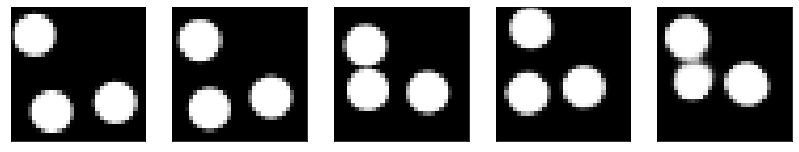

GD iterations:
i=0 | err=52.676849
i=1 | err=51.439148
i=2 | err=49.854073
i=3 | err=48.070763
i=4 | err=46.227432
i=5 | err=44.356380
i=6 | err=42.448776
i=7 | err=40.479416
i=8 | err=38.404850
i=9 | err=36.281784
i=10 | err=34.118019
i=11 | err=32.013519
i=12 | err=29.917645
i=13 | err=27.875870
i=14 | err=25.925732
i=15 | err=24.079220
i=16 | err=22.335732
i=17 | err=20.640455
i=18 | err=19.051727
i=19 | err=17.618826
i=20 | err=16.255215
i=21 | err=15.021755
i=22 | err=13.878530
i=23 | err=12.797198
i=24 | err=11.764339
i=25 | err=10.773494
i=26 | err=9.829064
i=27 | err=8.952138
i=28 | err=8.135620
i=29 | err=7.364993
Epoch=258 (49%) | out_positive=0.910000 | out_negative=0.112990 | mse=0.075464


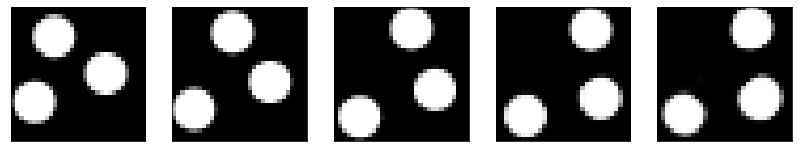

GD iterations:
i=0 | err=52.396988
i=1 | err=51.170872
i=2 | err=49.574921
i=3 | err=47.781120
i=4 | err=45.935604
i=5 | err=44.067562
i=6 | err=42.157982
i=7 | err=40.166046
i=8 | err=38.089798
i=9 | err=36.035954
i=10 | err=34.011368
i=11 | err=32.018311
i=12 | err=30.044758
i=13 | err=28.036867
i=14 | err=26.130508
i=15 | err=24.275866
i=16 | err=22.517200
i=17 | err=20.815666
i=18 | err=19.193933
i=19 | err=17.730064
i=20 | err=16.371307
i=21 | err=15.071428
i=22 | err=13.830414
i=23 | err=12.673893
i=24 | err=11.495641
i=25 | err=10.430414
i=26 | err=9.433384
i=27 | err=8.519086
i=28 | err=7.692500
i=29 | err=6.901703
Epoch=258 (51%) | out_positive=0.907289 | out_negative=0.089060 | mse=0.074479


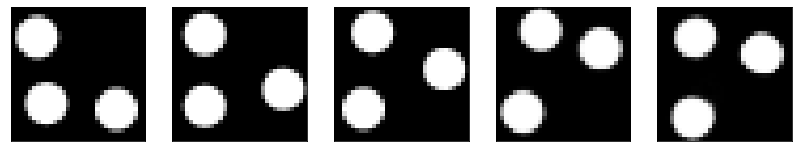

GD iterations:
i=0 | err=54.096573
i=1 | err=52.891678
i=2 | err=51.188046
i=3 | err=49.325119
i=4 | err=47.320282
i=5 | err=45.226418
i=6 | err=43.006897
i=7 | err=40.772125
i=8 | err=38.487999
i=9 | err=36.239376
i=10 | err=33.937222
i=11 | err=31.661850
i=12 | err=29.466614
i=13 | err=27.405380
i=14 | err=25.484659
i=15 | err=23.597614
i=16 | err=21.827827
i=17 | err=20.167488
i=18 | err=18.598145
i=19 | err=17.124228
i=20 | err=15.757301
i=21 | err=14.491491
i=22 | err=13.315211
i=23 | err=12.211446
i=24 | err=11.218731
i=25 | err=10.246821
i=26 | err=9.329754
i=27 | err=8.485609
i=28 | err=7.714700
i=29 | err=6.972703
Epoch=258 (53%) | out_positive=0.846900 | out_negative=0.119575 | mse=0.070097


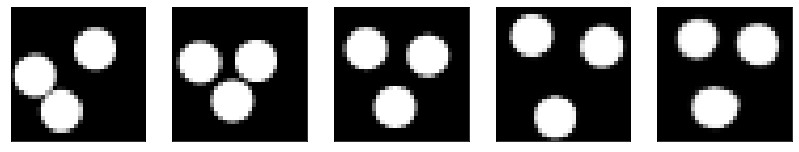

GD iterations:
i=0 | err=54.426952
i=1 | err=53.071186
i=2 | err=51.303368
i=3 | err=49.350342
i=4 | err=47.344757
i=5 | err=45.247314
i=6 | err=43.130569
i=7 | err=40.996658
i=8 | err=38.824253
i=9 | err=36.630196
i=10 | err=34.410046
i=11 | err=32.224213
i=12 | err=30.019032
i=13 | err=27.883053
i=14 | err=25.803204
i=15 | err=23.848705
i=16 | err=21.953123
i=17 | err=20.158230
i=18 | err=18.522427
i=19 | err=17.006542
i=20 | err=15.627720
i=21 | err=14.358665
i=22 | err=13.137444
i=23 | err=11.937542
i=24 | err=10.855919
i=25 | err=9.878971
i=26 | err=8.971000
i=27 | err=8.110834
i=28 | err=7.295510
i=29 | err=6.524085
Epoch=258 (54%) | out_positive=0.887092 | out_negative=0.128985 | mse=0.071446


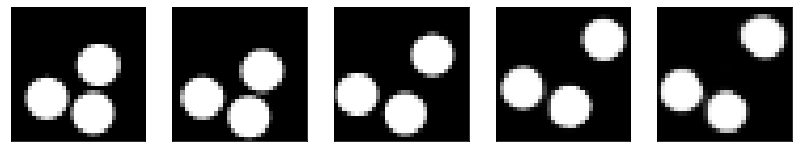

GD iterations:
i=0 | err=52.382988
i=1 | err=51.154137
i=2 | err=49.524635
i=3 | err=47.746647
i=4 | err=45.896626
i=5 | err=43.998917
i=6 | err=42.062939
i=7 | err=40.105377
i=8 | err=38.164032
i=9 | err=36.210178
i=10 | err=34.269653
i=11 | err=32.315369
i=12 | err=30.362137
i=13 | err=28.472498
i=14 | err=26.686926
i=15 | err=24.958685
i=16 | err=23.276306
i=17 | err=21.601597
i=18 | err=19.969521
i=19 | err=18.353720
i=20 | err=16.801582
i=21 | err=15.400970
i=22 | err=14.115225
i=23 | err=12.907011
i=24 | err=11.768801
i=25 | err=10.739928
i=26 | err=9.737597
i=27 | err=8.788006
i=28 | err=7.879376
i=29 | err=6.965379
Epoch=258 (56%) | out_positive=0.896819 | out_negative=0.163048 | mse=0.065958


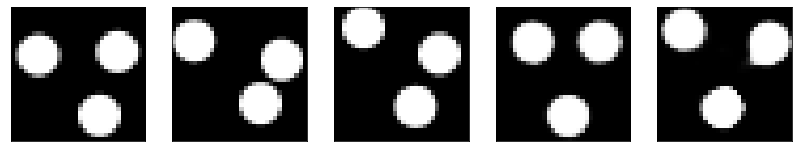

GD iterations:
i=0 | err=49.905861
i=1 | err=48.690796
i=2 | err=47.095448
i=3 | err=45.319611
i=4 | err=43.476044
i=5 | err=41.571991
i=6 | err=39.590111
i=7 | err=37.536583
i=8 | err=35.483612
i=9 | err=33.392509
i=10 | err=31.315357
i=11 | err=29.277382
i=12 | err=27.380026
i=13 | err=25.597321
i=14 | err=23.921186
i=15 | err=22.357386
i=16 | err=20.889095
i=17 | err=19.506050
i=18 | err=18.168091
i=19 | err=16.911749
i=20 | err=15.668179
i=21 | err=14.495996
i=22 | err=13.398771
i=23 | err=12.388758
i=24 | err=11.420442
i=25 | err=10.516409
i=26 | err=9.652032
i=27 | err=8.801764
i=28 | err=8.010239
i=29 | err=7.250890
Epoch=258 (58%) | out_positive=0.880450 | out_negative=0.120593 | mse=0.071892


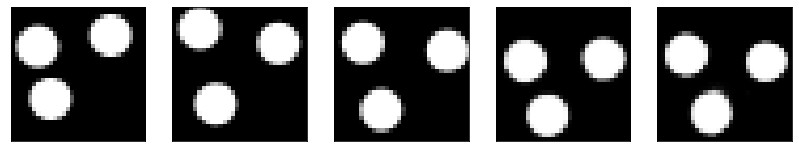

GD iterations:
i=0 | err=57.446091
i=1 | err=56.153473
i=2 | err=54.350655
i=3 | err=52.432232
i=4 | err=50.378750
i=5 | err=48.211365
i=6 | err=45.967964
i=7 | err=43.618996
i=8 | err=41.239220
i=9 | err=38.923569
i=10 | err=36.563179
i=11 | err=34.327450
i=12 | err=32.037567
i=13 | err=29.889652
i=14 | err=27.777287
i=15 | err=25.780872
i=16 | err=23.880104
i=17 | err=22.159531
i=18 | err=20.567249
i=19 | err=19.113853
i=20 | err=17.690981
i=21 | err=16.329754
i=22 | err=14.960634
i=23 | err=13.739121
i=24 | err=12.549127
i=25 | err=11.439745
i=26 | err=10.358255
i=27 | err=9.359655
i=28 | err=8.415482
i=29 | err=7.526204
Epoch=258 (60%) | out_positive=0.853555 | out_negative=0.107195 | mse=0.075684


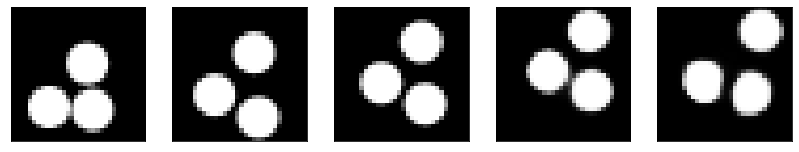

GD iterations:
i=0 | err=53.610382
i=1 | err=52.352989
i=2 | err=50.657234
i=3 | err=48.786278
i=4 | err=46.907761
i=5 | err=44.904270
i=6 | err=42.868496
i=7 | err=40.871002
i=8 | err=38.713394
i=9 | err=36.503033
i=10 | err=34.252396
i=11 | err=32.041912
i=12 | err=29.868607
i=13 | err=27.761665
i=14 | err=25.762493
i=15 | err=23.751213
i=16 | err=21.847546
i=17 | err=20.053959
i=18 | err=18.372747
i=19 | err=16.773916
i=20 | err=15.246785
i=21 | err=13.802755
i=22 | err=12.536851
i=23 | err=11.389617
i=24 | err=10.407274
i=25 | err=9.497429
i=26 | err=8.650304
i=27 | err=7.877688
i=28 | err=7.124502
i=29 | err=6.415284
Epoch=258 (62%) | out_positive=0.855137 | out_negative=0.152459 | mse=0.072429


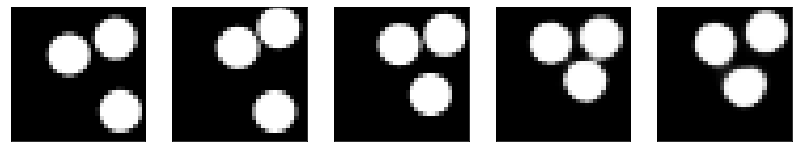

GD iterations:
i=0 | err=53.758949
i=1 | err=52.482811
i=2 | err=50.780891
i=3 | err=48.832642
i=4 | err=46.818142
i=5 | err=44.760971
i=6 | err=42.649895
i=7 | err=40.441032
i=8 | err=38.237251
i=9 | err=35.994190
i=10 | err=33.763771
i=11 | err=31.534943
i=12 | err=29.389086
i=13 | err=27.391182
i=14 | err=25.522808
i=15 | err=23.710417
i=16 | err=21.990234
i=17 | err=20.378090
i=18 | err=18.803417
i=19 | err=17.321709
i=20 | err=15.927515
i=21 | err=14.656005
i=22 | err=13.460287
i=23 | err=12.340893
i=24 | err=11.273241
i=25 | err=10.218010
i=26 | err=9.230501
i=27 | err=8.291454
i=28 | err=7.405960
i=29 | err=6.589155
Epoch=258 (64%) | out_positive=0.917228 | out_negative=0.119265 | mse=0.073300


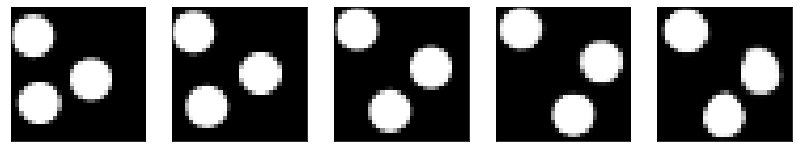

GD iterations:
i=0 | err=57.245667
i=1 | err=56.122505
i=2 | err=54.522701
i=3 | err=52.686226
i=4 | err=50.795357
i=5 | err=48.824455
i=6 | err=46.778618
i=7 | err=44.621838
i=8 | err=42.440823
i=9 | err=40.146564
i=10 | err=37.776184
i=11 | err=35.468376
i=12 | err=33.134327
i=13 | err=30.946098
i=14 | err=28.817852
i=15 | err=26.739462
i=16 | err=24.778202
i=17 | err=22.985346
i=18 | err=21.219421
i=19 | err=19.565037
i=20 | err=17.950668
i=21 | err=16.418564
i=22 | err=15.016146
i=23 | err=13.719875
i=24 | err=12.519541
i=25 | err=11.387072
i=26 | err=10.392418
i=27 | err=9.468730
i=28 | err=8.601357
i=29 | err=7.796332
Epoch=258 (65%) | out_positive=0.818212 | out_negative=0.091115 | mse=0.072341


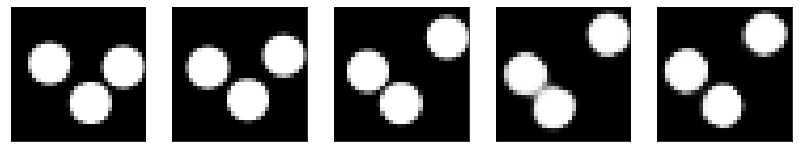

GD iterations:
i=0 | err=54.179947
i=1 | err=52.917706
i=2 | err=51.230015
i=3 | err=49.361988
i=4 | err=47.342190
i=5 | err=45.323158
i=6 | err=43.336845
i=7 | err=41.284992
i=8 | err=39.155716
i=9 | err=36.870766
i=10 | err=34.625351
i=11 | err=32.357502
i=12 | err=30.153456
i=13 | err=28.071800
i=14 | err=26.066380
i=15 | err=24.141611
i=16 | err=22.332802
i=17 | err=20.657454
i=18 | err=19.094948
i=19 | err=17.645098
i=20 | err=16.272148
i=21 | err=14.936319
i=22 | err=13.689669
i=23 | err=12.530624
i=24 | err=11.401539
i=25 | err=10.332376
i=26 | err=9.320637
i=27 | err=8.394855
i=28 | err=7.548629
i=29 | err=6.764872
Epoch=258 (67%) | out_positive=0.849405 | out_negative=0.138989 | mse=0.069904


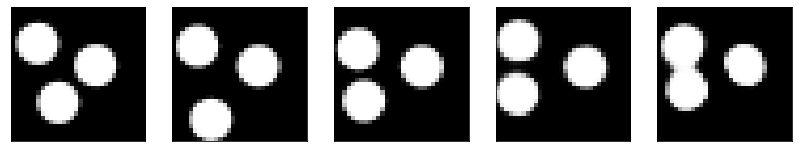

GD iterations:
i=0 | err=54.211723
i=1 | err=52.996994
i=2 | err=51.373909
i=3 | err=49.528080
i=4 | err=47.566143
i=5 | err=45.472183
i=6 | err=43.370991
i=7 | err=41.223320
i=8 | err=39.055962
i=9 | err=36.801369
i=10 | err=34.523994
i=11 | err=32.312302
i=12 | err=30.186192
i=13 | err=28.137228
i=14 | err=26.094749
i=15 | err=24.201452
i=16 | err=22.396854
i=17 | err=20.621351
i=18 | err=18.985554
i=19 | err=17.434065
i=20 | err=15.993180
i=21 | err=14.591086
i=22 | err=13.302643
i=23 | err=12.109240
i=24 | err=10.996866
i=25 | err=9.941644
i=26 | err=8.955154
i=27 | err=8.026408
i=28 | err=7.183448
i=29 | err=6.382297
Epoch=258 (69%) | out_positive=0.882673 | out_negative=0.129580 | mse=0.072927


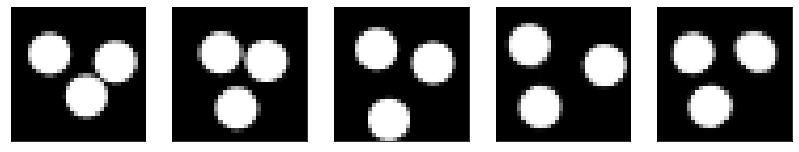

GD iterations:
i=0 | err=52.157982
i=1 | err=50.946934
i=2 | err=49.271435
i=3 | err=47.364166
i=4 | err=45.442101
i=5 | err=43.472973
i=6 | err=41.397972
i=7 | err=39.230854
i=8 | err=37.038994
i=9 | err=34.778656
i=10 | err=32.610378
i=11 | err=30.393223
i=12 | err=28.259525
i=13 | err=26.219471
i=14 | err=24.332264
i=15 | err=22.587650
i=16 | err=20.966969
i=17 | err=19.490440
i=18 | err=18.092674
i=19 | err=16.780939
i=20 | err=15.527803
i=21 | err=14.355732
i=22 | err=13.215618
i=23 | err=12.109131
i=24 | err=11.054068
i=25 | err=10.058084
i=26 | err=9.129893
i=27 | err=8.267365
i=28 | err=7.449659
i=29 | err=6.677528
Epoch=258 (71%) | out_positive=0.892135 | out_negative=0.146444 | mse=0.069851


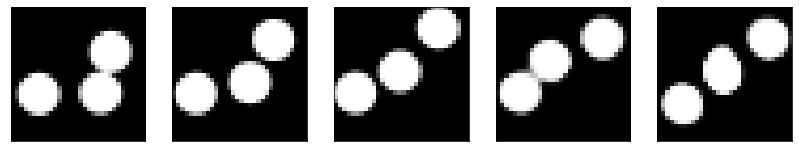

GD iterations:
i=0 | err=57.129158
i=1 | err=55.840340
i=2 | err=54.169952
i=3 | err=52.203972
i=4 | err=50.096661
i=5 | err=47.950806
i=6 | err=45.725883
i=7 | err=43.444901
i=8 | err=41.118462
i=9 | err=38.774849
i=10 | err=36.424187
i=11 | err=34.147034
i=12 | err=31.993090
i=13 | err=29.963825
i=14 | err=27.930489
i=15 | err=25.931301
i=16 | err=24.047371
i=17 | err=22.289661
i=18 | err=20.650650
i=19 | err=19.159363
i=20 | err=17.731985
i=21 | err=16.369408
i=22 | err=15.121475
i=23 | err=13.933680
i=24 | err=12.857531
i=25 | err=11.836229
i=26 | err=10.904757
i=27 | err=10.043976
i=28 | err=9.232904
i=29 | err=8.466679
Epoch=258 (73%) | out_positive=0.792416 | out_negative=0.079474 | mse=0.074695


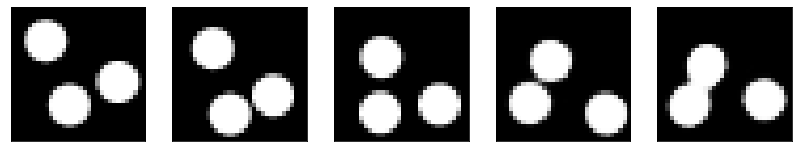

GD iterations:
i=0 | err=53.902035
i=1 | err=52.760330
i=2 | err=51.092453
i=3 | err=49.268761
i=4 | err=47.369392
i=5 | err=45.399441
i=6 | err=43.421082
i=7 | err=41.353149
i=8 | err=39.219925
i=9 | err=37.028316
i=10 | err=34.816418
i=11 | err=32.582466
i=12 | err=30.375965
i=13 | err=28.286371
i=14 | err=26.255627
i=15 | err=24.451187
i=16 | err=22.737663
i=17 | err=21.085388
i=18 | err=19.464119
i=19 | err=17.934280
i=20 | err=16.509830
i=21 | err=15.198602
i=22 | err=13.966637
i=23 | err=12.820423
i=24 | err=11.686467
i=25 | err=10.587711
i=26 | err=9.562666
i=27 | err=8.603329
i=28 | err=7.756835
i=29 | err=6.955370
Epoch=258 (75%) | out_positive=0.889782 | out_negative=0.097028 | mse=0.076026


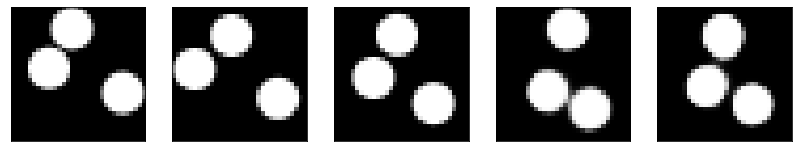

GD iterations:
i=0 | err=58.446693
i=1 | err=57.168976
i=2 | err=55.373531
i=3 | err=53.340080
i=4 | err=51.178928
i=5 | err=48.876133
i=6 | err=46.480675
i=7 | err=44.032818
i=8 | err=41.599594
i=9 | err=39.110989
i=10 | err=36.599583
i=11 | err=34.112068
i=12 | err=31.692757
i=13 | err=29.315100
i=14 | err=27.001728
i=15 | err=24.963432
i=16 | err=23.048092
i=17 | err=21.288166
i=18 | err=19.618271
i=19 | err=18.035076
i=20 | err=16.540276
i=21 | err=15.156560
i=22 | err=13.842436
i=23 | err=12.655352
i=24 | err=11.536465
i=25 | err=10.485917
i=26 | err=9.498283
i=27 | err=8.563669
i=28 | err=7.671039
i=29 | err=6.835503
Epoch=258 (77%) | out_positive=0.848648 | out_negative=0.123234 | mse=0.068771


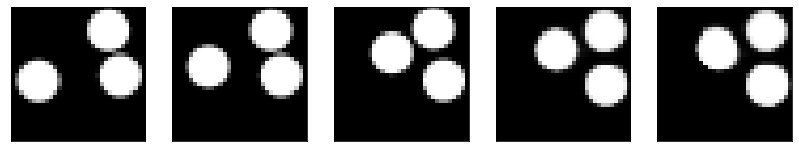

GD iterations:
i=0 | err=53.895348
i=1 | err=52.766224
i=2 | err=51.168076
i=3 | err=49.347366
i=4 | err=47.422920
i=5 | err=45.407829
i=6 | err=43.341751
i=7 | err=41.103607
i=8 | err=38.752010
i=9 | err=36.404686
i=10 | err=34.106598
i=11 | err=31.856367
i=12 | err=29.718292
i=13 | err=27.617634
i=14 | err=25.589138
i=15 | err=23.596111
i=16 | err=21.751854
i=17 | err=20.034292
i=18 | err=18.508636
i=19 | err=17.090824
i=20 | err=15.814550
i=21 | err=14.602536
i=22 | err=13.494774
i=23 | err=12.448503
i=24 | err=11.453957
i=25 | err=10.505260
i=26 | err=9.618155
i=27 | err=8.782310
i=28 | err=7.979030
i=29 | err=7.179453
Epoch=258 (78%) | out_positive=0.900071 | out_negative=0.150338 | mse=0.071082


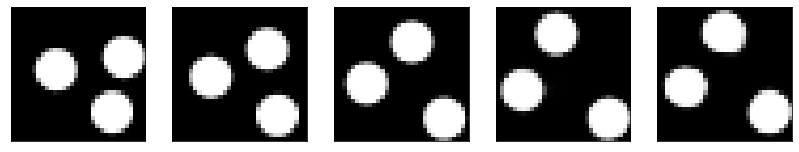

GD iterations:
i=0 | err=53.339733
i=1 | err=52.253490
i=2 | err=50.792801
i=3 | err=49.131413
i=4 | err=47.365368
i=5 | err=45.386478
i=6 | err=43.271111
i=7 | err=41.098598
i=8 | err=38.813057
i=9 | err=36.511974
i=10 | err=34.228210
i=11 | err=32.142052
i=12 | err=30.134111
i=13 | err=28.119572
i=14 | err=26.269894
i=15 | err=24.554419
i=16 | err=22.790510
i=17 | err=21.104336
i=18 | err=19.565155
i=19 | err=18.095179
i=20 | err=16.662067
i=21 | err=15.329197
i=22 | err=14.111631
i=23 | err=12.973669
i=24 | err=11.881893
i=25 | err=10.863553
i=26 | err=9.907400
i=27 | err=9.011779
i=28 | err=8.159966
i=29 | err=7.343148
Epoch=258 (80%) | out_positive=0.900302 | out_negative=0.115655 | mse=0.073567


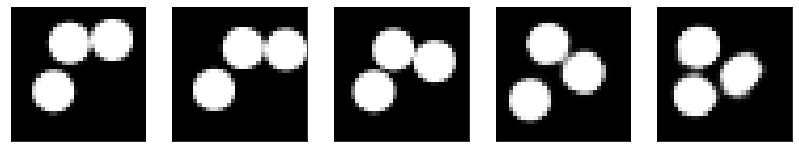

GD iterations:
i=0 | err=52.042332
i=1 | err=50.744225
i=2 | err=49.018913
i=3 | err=47.105267
i=4 | err=45.088215
i=5 | err=43.017174
i=6 | err=40.956902
i=7 | err=38.834763
i=8 | err=36.696884
i=9 | err=34.595840
i=10 | err=32.511162
i=11 | err=30.408199
i=12 | err=28.393658
i=13 | err=26.449270
i=14 | err=24.618046
i=15 | err=22.925179
i=16 | err=21.363377
i=17 | err=19.927269
i=18 | err=18.583895
i=19 | err=17.307549
i=20 | err=16.085560
i=21 | err=14.984283
i=22 | err=13.918404
i=23 | err=12.908707
i=24 | err=11.925674
i=25 | err=10.996790
i=26 | err=10.130695
i=27 | err=9.287712
i=28 | err=8.482222
i=29 | err=7.729687
Epoch=258 (82%) | out_positive=0.897647 | out_negative=0.092106 | mse=0.077155


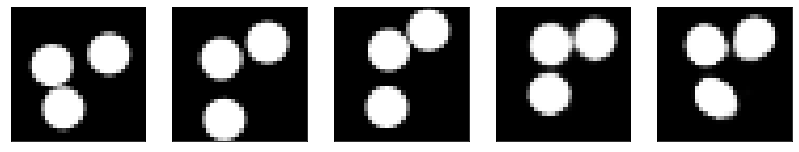

GD iterations:
i=0 | err=54.520576
i=1 | err=53.426834
i=2 | err=51.939335
i=3 | err=50.236977
i=4 | err=48.393250
i=5 | err=46.375908
i=6 | err=44.407814
i=7 | err=42.313484
i=8 | err=40.205757
i=9 | err=38.097374
i=10 | err=35.924591
i=11 | err=33.806683
i=12 | err=31.752918
i=13 | err=29.853796
i=14 | err=27.997679
i=15 | err=26.234682
i=16 | err=24.478695
i=17 | err=22.763496
i=18 | err=21.119381
i=19 | err=19.545345
i=20 | err=18.036051
i=21 | err=16.665010
i=22 | err=15.321426
i=23 | err=14.027309
i=24 | err=12.802395
i=25 | err=11.673552
i=26 | err=10.584779
i=27 | err=9.543708
i=28 | err=8.528482
i=29 | err=7.568103
Epoch=258 (84%) | out_positive=0.862083 | out_negative=0.143890 | mse=0.071075


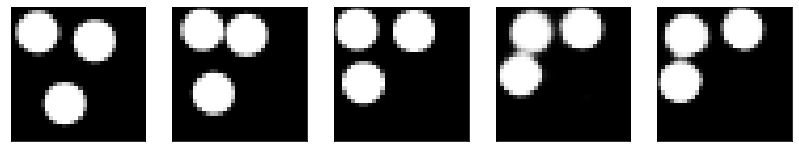

GD iterations:
i=0 | err=53.232227
i=1 | err=52.013596
i=2 | err=50.280785
i=3 | err=48.391693
i=4 | err=46.347900
i=5 | err=44.257370
i=6 | err=42.068420
i=7 | err=39.947750
i=8 | err=37.825809
i=9 | err=35.737083
i=10 | err=33.628822
i=11 | err=31.429501
i=12 | err=29.222595
i=13 | err=27.025406
i=14 | err=24.936531
i=15 | err=22.942682
i=16 | err=21.120171
i=17 | err=19.341635
i=18 | err=17.792013
i=19 | err=16.375887
i=20 | err=15.043949
i=21 | err=13.804276
i=22 | err=12.661622
i=23 | err=11.653090
i=24 | err=10.699810
i=25 | err=9.827184
i=26 | err=8.961255
i=27 | err=8.094113
i=28 | err=7.279061
i=29 | err=6.487942
Epoch=258 (86%) | out_positive=0.881927 | out_negative=0.130302 | mse=0.066309


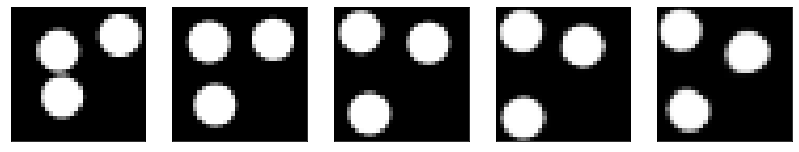

GD iterations:
i=0 | err=56.160126
i=1 | err=54.877434
i=2 | err=53.125793
i=3 | err=51.188011
i=4 | err=48.968353
i=5 | err=46.782143
i=6 | err=44.487835
i=7 | err=42.144722
i=8 | err=39.831146
i=9 | err=37.566505
i=10 | err=35.370979
i=11 | err=33.186592
i=12 | err=31.122244
i=13 | err=29.007542
i=14 | err=26.958313
i=15 | err=24.964539
i=16 | err=23.103725
i=17 | err=21.353737
i=18 | err=19.723026
i=19 | err=18.240498
i=20 | err=16.827417
i=21 | err=15.493373
i=22 | err=14.261954
i=23 | err=13.143028
i=24 | err=12.057569
i=25 | err=11.054707
i=26 | err=10.122593
i=27 | err=9.247728
i=28 | err=8.420901
i=29 | err=7.641760
Epoch=258 (88%) | out_positive=0.805897 | out_negative=0.124450 | mse=0.068579


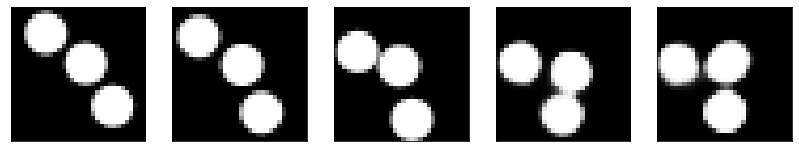

GD iterations:
i=0 | err=53.412422
i=1 | err=52.288799
i=2 | err=50.710663
i=3 | err=48.899269
i=4 | err=47.021400
i=5 | err=45.125435
i=6 | err=43.147942
i=7 | err=41.158859
i=8 | err=39.042763
i=9 | err=36.911118
i=10 | err=34.718834
i=11 | err=32.583923
i=12 | err=30.529579
i=13 | err=28.610718
i=14 | err=26.809212
i=15 | err=25.112829
i=16 | err=23.460037
i=17 | err=21.898880
i=18 | err=20.414474
i=19 | err=18.966410
i=20 | err=17.526548
i=21 | err=16.110048
i=22 | err=14.764679
i=23 | err=13.459973
i=24 | err=12.274131
i=25 | err=11.169062
i=26 | err=10.127769
i=27 | err=9.155584
i=28 | err=8.230646
i=29 | err=7.366518
Epoch=258 (89%) | out_positive=0.918783 | out_negative=0.102854 | mse=0.072035


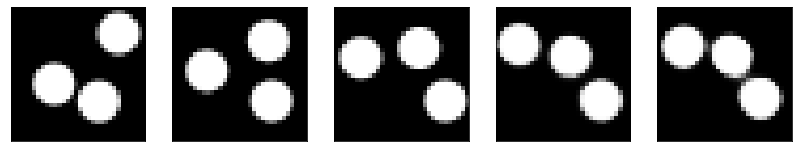

GD iterations:
i=0 | err=51.704399
i=1 | err=50.413403
i=2 | err=48.650871
i=3 | err=46.720631
i=4 | err=44.680740
i=5 | err=42.604050
i=6 | err=40.466217
i=7 | err=38.397617
i=8 | err=36.373039
i=9 | err=34.251694
i=10 | err=32.142574
i=11 | err=29.987862
i=12 | err=27.906090
i=13 | err=25.919910
i=14 | err=24.046862
i=15 | err=22.278301
i=16 | err=20.609699
i=17 | err=19.049610
i=18 | err=17.529842
i=19 | err=16.077089
i=20 | err=14.722991
i=21 | err=13.547108
i=22 | err=12.489057
i=23 | err=11.555129
i=24 | err=10.646957
i=25 | err=9.795860
i=26 | err=8.947057
i=27 | err=8.133112
i=28 | err=7.352091
i=29 | err=6.593511
Epoch=258 (91%) | out_positive=0.847697 | out_negative=0.079478 | mse=0.067077


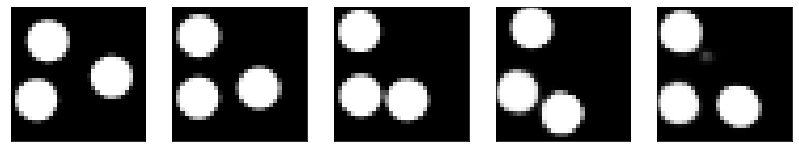

GD iterations:
i=0 | err=57.215538
i=1 | err=56.025730
i=2 | err=54.409412
i=3 | err=52.581215
i=4 | err=50.584709
i=5 | err=48.522007
i=6 | err=46.347839
i=7 | err=44.105011
i=8 | err=41.860535
i=9 | err=39.599884
i=10 | err=37.273075
i=11 | err=34.960060
i=12 | err=32.634468
i=13 | err=30.334343
i=14 | err=27.997412
i=15 | err=25.734108
i=16 | err=23.652840
i=17 | err=21.747549
i=18 | err=20.042706
i=19 | err=18.475498
i=20 | err=17.040642
i=21 | err=15.674924
i=22 | err=14.408237
i=23 | err=13.221444
i=24 | err=12.105564
i=25 | err=11.063310
i=26 | err=10.091830
i=27 | err=9.193885
i=28 | err=8.349627
i=29 | err=7.554044
Epoch=258 (93%) | out_positive=0.857306 | out_negative=0.094143 | mse=0.076415


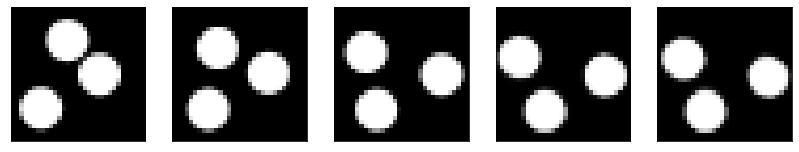

GD iterations:
i=0 | err=53.242123
i=1 | err=52.086803
i=2 | err=50.541550
i=3 | err=48.841423
i=4 | err=47.011322
i=5 | err=45.159565
i=6 | err=43.265129
i=7 | err=41.193405
i=8 | err=39.176186
i=9 | err=37.112289
i=10 | err=34.972595
i=11 | err=32.851120
i=12 | err=30.790194
i=13 | err=28.758118
i=14 | err=26.809982
i=15 | err=24.890938
i=16 | err=23.050671
i=17 | err=21.226124
i=18 | err=19.532495
i=19 | err=17.976748
i=20 | err=16.573002
i=21 | err=15.277370
i=22 | err=14.092623
i=23 | err=12.984060
i=24 | err=11.945026
i=25 | err=10.984667
i=26 | err=10.098481
i=27 | err=9.241292
i=28 | err=8.429550
i=29 | err=7.657603
Epoch=258 (95%) | out_positive=0.903649 | out_negative=0.084241 | mse=0.075191


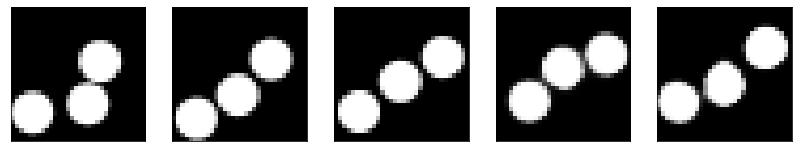

GD iterations:
i=0 | err=55.966492
i=1 | err=54.654221
i=2 | err=52.860462
i=3 | err=50.825771
i=4 | err=48.649597
i=5 | err=46.413673
i=6 | err=44.055485
i=7 | err=41.600716
i=8 | err=39.039116
i=9 | err=36.416225
i=10 | err=33.881371
i=11 | err=31.403835
i=12 | err=28.945578
i=13 | err=26.681925
i=14 | err=24.470249
i=15 | err=22.396893
i=16 | err=20.519718
i=17 | err=18.707129
i=18 | err=17.091297
i=19 | err=15.600769
i=20 | err=14.285557
i=21 | err=13.054024
i=22 | err=11.919292
i=23 | err=10.861313
i=24 | err=9.881630
i=25 | err=8.969053
i=26 | err=8.130642
i=27 | err=7.333864
i=28 | err=6.568912
i=29 | err=5.845879
Epoch=258 (97%) | out_positive=0.905092 | out_negative=0.157130 | mse=0.069728


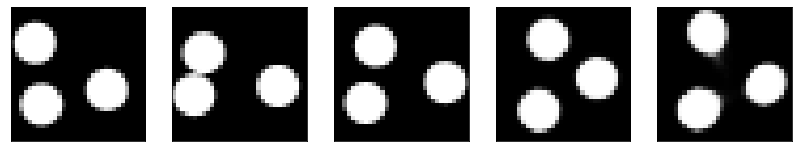

GD iterations:
i=0 | err=52.119503
i=1 | err=50.932594
i=2 | err=49.335579
i=3 | err=47.564865
i=4 | err=45.674450
i=5 | err=43.709316
i=6 | err=41.585686
i=7 | err=39.451996
i=8 | err=37.334435
i=9 | err=35.144257
i=10 | err=33.039249
i=11 | err=30.935917
i=12 | err=28.905987
i=13 | err=26.945137
i=14 | err=24.981201
i=15 | err=23.120571
i=16 | err=21.361279
i=17 | err=19.684492
i=18 | err=18.148586
i=19 | err=16.701065
i=20 | err=15.302109
i=21 | err=13.982719
i=22 | err=12.761334
i=23 | err=11.618790
i=24 | err=10.556528
i=25 | err=9.525763
i=26 | err=8.584768
i=27 | err=7.679912
i=28 | err=6.817129
i=29 | err=6.002973
Epoch=258 (99%) | out_positive=0.843438 | out_negative=0.169755 | mse=0.066132


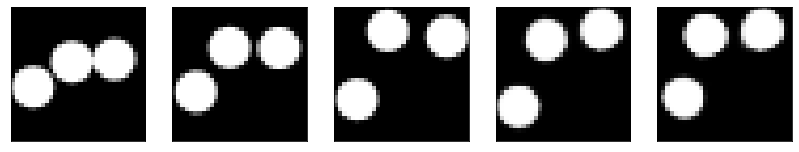

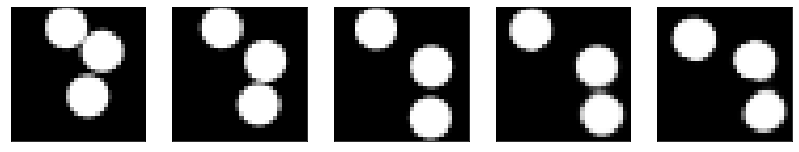

Test MSE 0.078619


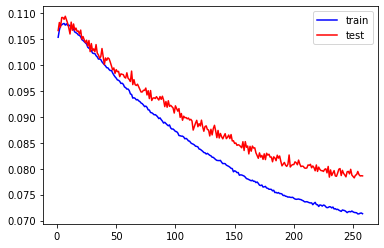

GD iterations:
i=0 | err=58.661335
i=1 | err=57.421978
i=2 | err=55.629257
i=3 | err=53.579826
i=4 | err=51.395721
i=5 | err=49.119911
i=6 | err=46.858772
i=7 | err=44.540802
i=8 | err=42.175522
i=9 | err=39.764648
i=10 | err=37.212097
i=11 | err=34.692745
i=12 | err=32.299950
i=13 | err=30.086956
i=14 | err=28.021572
i=15 | err=25.996773
i=16 | err=23.997547
i=17 | err=22.166197
i=18 | err=20.521618
i=19 | err=18.950695
i=20 | err=17.466160
i=21 | err=16.062368
i=22 | err=14.717838
i=23 | err=13.422679
i=24 | err=12.234448
i=25 | err=11.093518
i=26 | err=9.978897
i=27 | err=8.973793
i=28 | err=8.025593
i=29 | err=7.140417
Epoch=259 (0%) | out_positive=0.873063 | out_negative=0.134367 | mse=0.076737


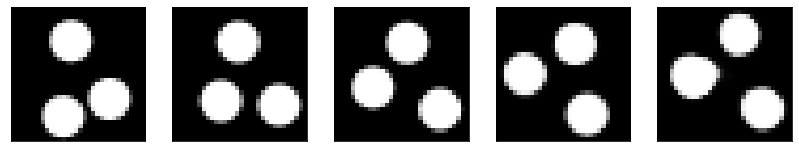

GD iterations:
i=0 | err=53.451950
i=1 | err=52.332680
i=2 | err=50.772911
i=3 | err=48.942719
i=4 | err=46.988358
i=5 | err=45.002609
i=6 | err=42.914810
i=7 | err=40.700340
i=8 | err=38.470432
i=9 | err=36.222511
i=10 | err=33.922165
i=11 | err=31.632421
i=12 | err=29.389713
i=13 | err=27.306452
i=14 | err=25.418552
i=15 | err=23.549862
i=16 | err=21.858738
i=17 | err=20.225092
i=18 | err=18.694366
i=19 | err=17.223352
i=20 | err=15.875542
i=21 | err=14.614807
i=22 | err=13.450529
i=23 | err=12.368725
i=24 | err=11.402685
i=25 | err=10.486892
i=26 | err=9.603506
i=27 | err=8.755037
i=28 | err=7.960430
i=29 | err=7.216155
Epoch=259 (2%) | out_positive=0.804742 | out_negative=0.112245 | mse=0.067082


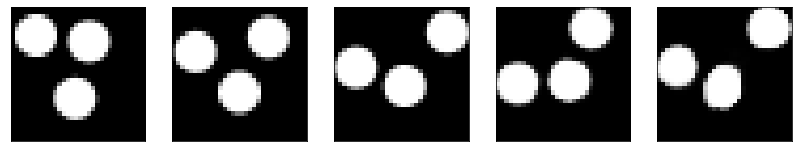

GD iterations:
i=0 | err=50.359421
i=1 | err=49.186852
i=2 | err=47.495766
i=3 | err=45.558704
i=4 | err=43.526409
i=5 | err=41.478310
i=6 | err=39.315292
i=7 | err=37.012554
i=8 | err=34.683407
i=9 | err=32.394524
i=10 | err=30.180212
i=11 | err=28.124210
i=12 | err=26.059952
i=13 | err=24.193897
i=14 | err=22.391598
i=15 | err=20.705765
i=16 | err=19.077839
i=17 | err=17.601658
i=18 | err=16.194309
i=19 | err=14.908687
i=20 | err=13.757806
i=21 | err=12.675148
i=22 | err=11.684391
i=23 | err=10.710447
i=24 | err=9.790216
i=25 | err=8.923077
i=26 | err=8.088608
i=27 | err=7.314775
i=28 | err=6.582337
i=29 | err=5.892650
Epoch=259 (4%) | out_positive=0.943483 | out_negative=0.181444 | mse=0.074072


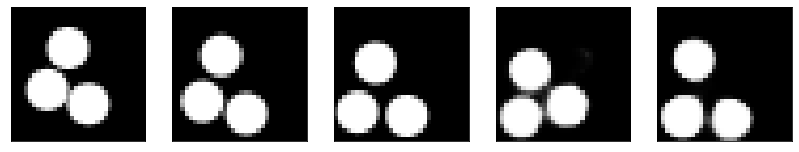

GD iterations:
i=0 | err=54.041233
i=1 | err=52.949406
i=2 | err=51.310059
i=3 | err=49.521648
i=4 | err=47.583145
i=5 | err=45.570591
i=6 | err=43.386642
i=7 | err=41.171978
i=8 | err=38.942764
i=9 | err=36.723335
i=10 | err=34.439190
i=11 | err=32.304817
i=12 | err=30.261700
i=13 | err=28.323753
i=14 | err=26.440319
i=15 | err=24.538958
i=16 | err=22.682323
i=17 | err=21.012772
i=18 | err=19.448151
i=19 | err=17.948162
i=20 | err=16.565155
i=21 | err=15.237762
i=22 | err=14.051497
i=23 | err=12.949207
i=24 | err=11.938215
i=25 | err=11.020781
i=26 | err=10.153192
i=27 | err=9.308239
i=28 | err=8.513527
i=29 | err=7.746692
Epoch=259 (6%) | out_positive=0.862962 | out_negative=0.076448 | mse=0.072815


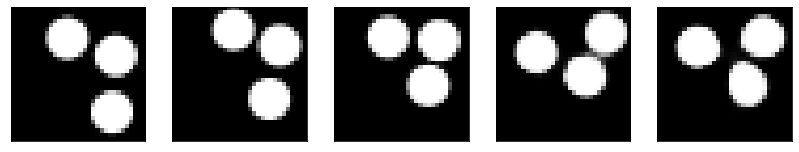

GD iterations:
i=0 | err=52.408825
i=1 | err=51.107712
i=2 | err=49.431831
i=3 | err=47.658020
i=4 | err=45.760818
i=5 | err=43.814220
i=6 | err=41.783573
i=7 | err=39.762966
i=8 | err=37.702312
i=9 | err=35.622635
i=10 | err=33.557564
i=11 | err=31.546740
i=12 | err=29.442154
i=13 | err=27.444893
i=14 | err=25.513302
i=15 | err=23.673355
i=16 | err=21.986752
i=17 | err=20.410803
i=18 | err=18.918293
i=19 | err=17.552832
i=20 | err=16.215445
i=21 | err=15.007550
i=22 | err=13.865055
i=23 | err=12.814240
i=24 | err=11.828763
i=25 | err=10.931267
i=26 | err=10.083187
i=27 | err=9.303248
i=28 | err=8.546427
i=29 | err=7.838358
Epoch=259 (8%) | out_positive=0.897682 | out_negative=0.103117 | mse=0.072463


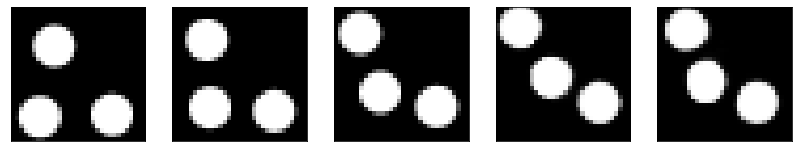

GD iterations:
i=0 | err=55.149387
i=1 | err=53.967361
i=2 | err=52.349701
i=3 | err=50.566124
i=4 | err=48.710487
i=5 | err=46.710049
i=6 | err=44.555904
i=7 | err=42.341835
i=8 | err=40.108902
i=9 | err=37.926277
i=10 | err=35.775959
i=11 | err=33.636486
i=12 | err=31.530025
i=13 | err=29.415516
i=14 | err=27.299618
i=15 | err=25.200727
i=16 | err=23.113033
i=17 | err=21.159210
i=18 | err=19.332994
i=19 | err=17.684101
i=20 | err=16.139050
i=21 | err=14.743000
i=22 | err=13.475451
i=23 | err=12.303740
i=24 | err=11.249790
i=25 | err=10.209524
i=26 | err=9.183931
i=27 | err=8.205026
i=28 | err=7.287175
i=29 | err=6.408976
Epoch=259 (9%) | out_positive=0.905274 | out_negative=0.150041 | mse=0.068706


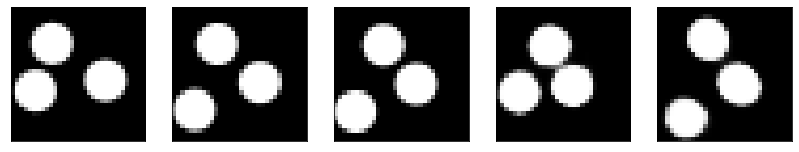

GD iterations:
i=0 | err=52.943459
i=1 | err=51.720787
i=2 | err=49.978199
i=3 | err=48.019379
i=4 | err=45.951187
i=5 | err=43.835701
i=6 | err=41.483444
i=7 | err=39.006287
i=8 | err=36.577896
i=9 | err=34.174061
i=10 | err=31.722143
i=11 | err=29.423773
i=12 | err=27.200691
i=13 | err=25.096659
i=14 | err=23.147442
i=15 | err=21.379951
i=16 | err=19.766195
i=17 | err=18.206696
i=18 | err=16.773911
i=19 | err=15.453373
i=20 | err=14.256709
i=21 | err=13.143459
i=22 | err=12.138747
i=23 | err=11.189510
i=24 | err=10.299543
i=25 | err=9.442161
i=26 | err=8.624266
i=27 | err=7.863709
i=28 | err=7.159509
i=29 | err=6.495455
Epoch=259 (11%) | out_positive=0.841427 | out_negative=0.117463 | mse=0.062652


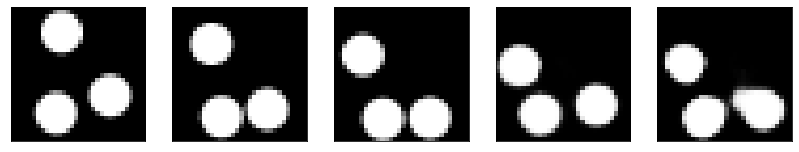

GD iterations:
i=0 | err=58.541138
i=1 | err=57.326691
i=2 | err=55.657501
i=3 | err=53.824448
i=4 | err=51.841747
i=5 | err=49.765907
i=6 | err=47.663647
i=7 | err=45.530220
i=8 | err=43.402054
i=9 | err=41.154877
i=10 | err=38.869148
i=11 | err=36.458839
i=12 | err=34.003971
i=13 | err=31.536770
i=14 | err=29.121674
i=15 | err=26.862745
i=16 | err=24.812038
i=17 | err=22.905045
i=18 | err=21.129137
i=19 | err=19.456226
i=20 | err=17.933094
i=21 | err=16.461178
i=22 | err=15.107802
i=23 | err=13.806428
i=24 | err=12.585297
i=25 | err=11.435549
i=26 | err=10.359158
i=27 | err=9.286573
i=28 | err=8.269943
i=29 | err=7.327382
Epoch=259 (13%) | out_positive=0.819834 | out_negative=0.143184 | mse=0.068162


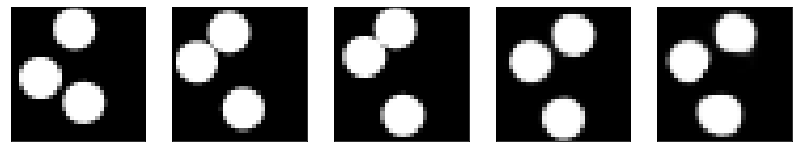

GD iterations:
i=0 | err=52.573082
i=1 | err=51.345970
i=2 | err=49.691109
i=3 | err=47.828083
i=4 | err=45.740334
i=5 | err=43.574158
i=6 | err=41.344265
i=7 | err=39.040222
i=8 | err=36.613728
i=9 | err=34.109703
i=10 | err=31.648928
i=11 | err=29.223005
i=12 | err=27.042080
i=13 | err=24.986938
i=14 | err=23.017334
i=15 | err=21.206038
i=16 | err=19.524387
i=17 | err=17.954964
i=18 | err=16.509605
i=19 | err=15.167077
i=20 | err=13.878750
i=21 | err=12.707350
i=22 | err=11.631009
i=23 | err=10.664639
i=24 | err=9.767786
i=25 | err=8.904551
i=26 | err=8.070244
i=27 | err=7.281419
i=28 | err=6.531410
i=29 | err=5.813021
Epoch=259 (15%) | out_positive=0.908864 | out_negative=0.132156 | mse=0.070194


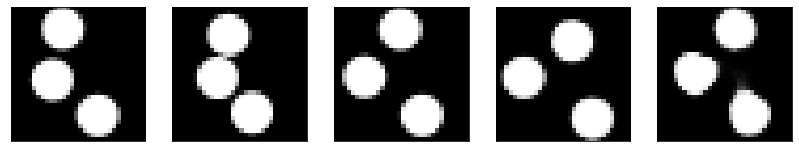

GD iterations:
i=0 | err=53.767109
i=1 | err=52.551498
i=2 | err=50.934093
i=3 | err=49.122429
i=4 | err=47.252460
i=5 | err=45.205318
i=6 | err=43.117096
i=7 | err=40.924568
i=8 | err=38.661522
i=9 | err=36.367676
i=10 | err=34.104935
i=11 | err=31.842859
i=12 | err=29.549343
i=13 | err=27.424297
i=14 | err=25.435905
i=15 | err=23.572327
i=16 | err=21.838547
i=17 | err=20.218903
i=18 | err=18.737831
i=19 | err=17.359459
i=20 | err=16.024326
i=21 | err=14.781441
i=22 | err=13.614681
i=23 | err=12.527064
i=24 | err=11.492226
i=25 | err=10.531149
i=26 | err=9.647844
i=27 | err=8.801544
i=28 | err=7.992523
i=29 | err=7.217283
Epoch=259 (17%) | out_positive=0.869414 | out_negative=0.111841 | mse=0.076352


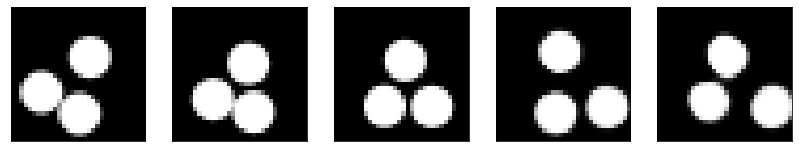

GD iterations:
i=0 | err=57.993923
i=1 | err=56.801994
i=2 | err=55.036060
i=3 | err=52.979439
i=4 | err=50.797722
i=5 | err=48.499554
i=6 | err=46.259918
i=7 | err=43.962318
i=8 | err=41.763275
i=9 | err=39.543495
i=10 | err=37.231987
i=11 | err=34.975292
i=12 | err=32.777691
i=13 | err=30.571856
i=14 | err=28.422092
i=15 | err=26.304649
i=16 | err=24.314734
i=17 | err=22.457544
i=18 | err=20.741386
i=19 | err=19.052425
i=20 | err=17.464577
i=21 | err=15.988213
i=22 | err=14.582787
i=23 | err=13.275100
i=24 | err=12.073397
i=25 | err=10.997120
i=26 | err=9.963225
i=27 | err=9.013308
i=28 | err=8.152554
i=29 | err=7.351541
Epoch=259 (18%) | out_positive=0.842751 | out_negative=0.101685 | mse=0.070787


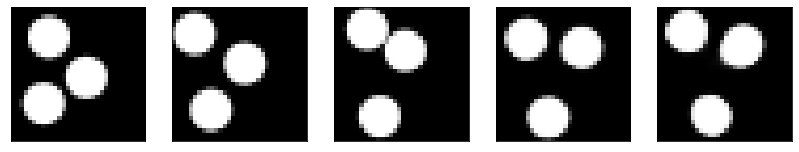

GD iterations:
i=0 | err=51.830303
i=1 | err=50.665676
i=2 | err=49.055653
i=3 | err=47.274704
i=4 | err=45.274750
i=5 | err=43.193733
i=6 | err=41.019531
i=7 | err=38.816940
i=8 | err=36.612862
i=9 | err=34.433968
i=10 | err=32.289474
i=11 | err=30.243679
i=12 | err=28.324402
i=13 | err=26.450924
i=14 | err=24.617010
i=15 | err=22.886242
i=16 | err=21.271542
i=17 | err=19.700882
i=18 | err=18.240025
i=19 | err=16.873306
i=20 | err=15.634708
i=21 | err=14.481810
i=22 | err=13.402409
i=23 | err=12.347837
i=24 | err=11.339103
i=25 | err=10.388027
i=26 | err=9.510502
i=27 | err=8.680080
i=28 | err=7.896632
i=29 | err=7.122571
Epoch=259 (20%) | out_positive=0.824958 | out_negative=0.148026 | mse=0.065648


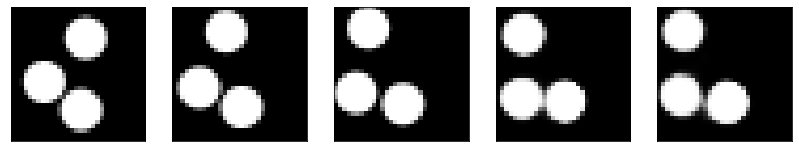

GD iterations:
i=0 | err=52.118980
i=1 | err=51.040092
i=2 | err=49.502960
i=3 | err=47.773666
i=4 | err=45.857887
i=5 | err=43.865173
i=6 | err=41.757927
i=7 | err=39.599789
i=8 | err=37.398285
i=9 | err=35.161892
i=10 | err=32.986671
i=11 | err=30.773945
i=12 | err=28.661728
i=13 | err=26.599983
i=14 | err=24.641136
i=15 | err=22.780380
i=16 | err=21.068214
i=17 | err=19.437531
i=18 | err=17.907513
i=19 | err=16.516100
i=20 | err=15.181356
i=21 | err=13.909876
i=22 | err=12.754115
i=23 | err=11.663247
i=24 | err=10.612445
i=25 | err=9.613453
i=26 | err=8.659813
i=27 | err=7.775143
i=28 | err=6.952983
i=29 | err=6.188761
Epoch=259 (22%) | out_positive=0.905436 | out_negative=0.149868 | mse=0.071525


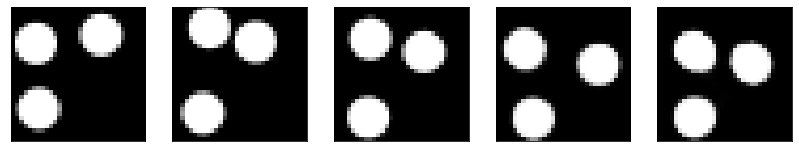

GD iterations:
i=0 | err=54.608269
i=1 | err=53.369389
i=2 | err=51.648373
i=3 | err=49.766731
i=4 | err=47.867752
i=5 | err=45.824448
i=6 | err=43.711735
i=7 | err=41.520927
i=8 | err=39.304050
i=9 | err=37.100403
i=10 | err=34.915497
i=11 | err=32.735435
i=12 | err=30.745638
i=13 | err=28.727913
i=14 | err=26.710430
i=15 | err=24.734020
i=16 | err=22.791691
i=17 | err=20.982971
i=18 | err=19.299679
i=19 | err=17.745316
i=20 | err=16.311974
i=21 | err=14.973330
i=22 | err=13.731949
i=23 | err=12.574116
i=24 | err=11.484212
i=25 | err=10.460235
i=26 | err=9.499455
i=27 | err=8.571390
i=28 | err=7.667909
i=29 | err=6.798920
Epoch=259 (24%) | out_positive=0.833171 | out_negative=0.134496 | mse=0.071327


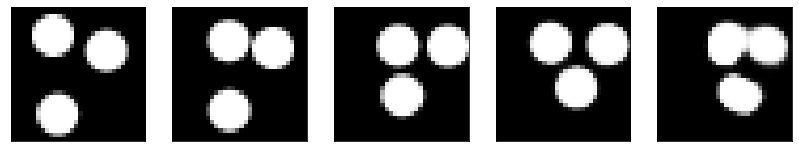

GD iterations:
i=0 | err=55.866241
i=1 | err=54.624966
i=2 | err=52.908665
i=3 | err=50.959717
i=4 | err=48.919693
i=5 | err=46.814697
i=6 | err=44.650879
i=7 | err=42.404442
i=8 | err=40.101936
i=9 | err=37.794205
i=10 | err=35.492661
i=11 | err=33.218491
i=12 | err=30.947418
i=13 | err=28.754112
i=14 | err=26.623676
i=15 | err=24.700037
i=16 | err=22.896379
i=17 | err=21.169445
i=18 | err=19.493517
i=19 | err=17.941803
i=20 | err=16.474920
i=21 | err=15.135671
i=22 | err=13.880707
i=23 | err=12.695481
i=24 | err=11.621807
i=25 | err=10.625063
i=26 | err=9.680600
i=27 | err=8.808647
i=28 | err=7.973764
i=29 | err=7.170980
Epoch=259 (26%) | out_positive=0.914485 | out_negative=0.158960 | mse=0.073750


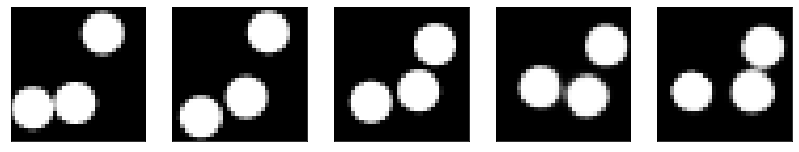

GD iterations:
i=0 | err=57.055252
i=1 | err=55.885811
i=2 | err=54.283089
i=3 | err=52.476547
i=4 | err=50.519661
i=5 | err=48.571419
i=6 | err=46.493622
i=7 | err=44.345406
i=8 | err=42.144924
i=9 | err=39.935322
i=10 | err=37.713444
i=11 | err=35.581779
i=12 | err=33.459461
i=13 | err=31.419836
i=14 | err=29.438597
i=15 | err=27.488152
i=16 | err=25.601217
i=17 | err=23.784252
i=18 | err=22.155005
i=19 | err=20.572151
i=20 | err=19.094700
i=21 | err=17.684513
i=22 | err=16.349285
i=23 | err=15.048958
i=24 | err=13.776530
i=25 | err=12.603106
i=26 | err=11.485235
i=27 | err=10.421849
i=28 | err=9.406759
i=29 | err=8.389617
Epoch=259 (28%) | out_positive=0.895253 | out_negative=0.078797 | mse=0.071102


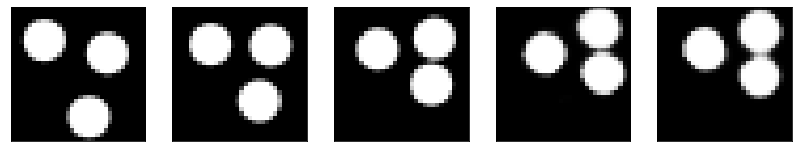

GD iterations:
i=0 | err=55.257713
i=1 | err=54.052219
i=2 | err=52.409088
i=3 | err=50.554554
i=4 | err=48.603142
i=5 | err=46.643349
i=6 | err=44.644226
i=7 | err=42.679222
i=8 | err=40.719620
i=9 | err=38.706841
i=10 | err=36.679565
i=11 | err=34.629978
i=12 | err=32.569363
i=13 | err=30.499731
i=14 | err=28.490997
i=15 | err=26.612906
i=16 | err=24.733900
i=17 | err=22.966618
i=18 | err=21.289764
i=19 | err=19.733662
i=20 | err=18.297274
i=21 | err=16.911053
i=22 | err=15.607569
i=23 | err=14.408928
i=24 | err=13.273623
i=25 | err=12.207838
i=26 | err=11.217437
i=27 | err=10.261934
i=28 | err=9.337767
i=29 | err=8.476076
Epoch=259 (30%) | out_positive=0.827353 | out_negative=0.089211 | mse=0.072664


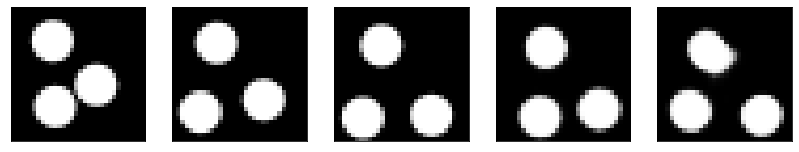

GD iterations:
i=0 | err=59.240940
i=1 | err=58.068344
i=2 | err=56.394115
i=3 | err=54.455288
i=4 | err=52.385284
i=5 | err=50.292152
i=6 | err=48.001781
i=7 | err=45.584164
i=8 | err=43.117149
i=9 | err=40.541557
i=10 | err=37.972939
i=11 | err=35.438324
i=12 | err=33.022034
i=13 | err=30.721962
i=14 | err=28.463440
i=15 | err=26.343704
i=16 | err=24.315845
i=17 | err=22.352043
i=18 | err=20.508125
i=19 | err=18.793804
i=20 | err=17.240036
i=21 | err=15.786011
i=22 | err=14.442296
i=23 | err=13.232262
i=24 | err=12.101688
i=25 | err=11.019257
i=26 | err=10.044538
i=27 | err=9.125212
i=28 | err=8.238171
i=29 | err=7.416744
Epoch=259 (31%) | out_positive=0.805880 | out_negative=0.098215 | mse=0.071780


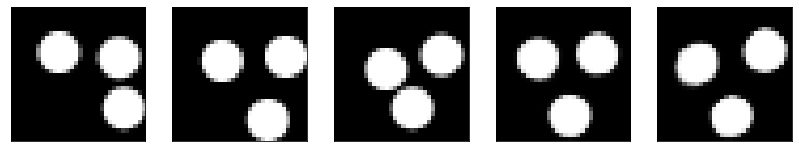

GD iterations:
i=0 | err=54.213406
i=1 | err=52.907104
i=2 | err=51.119366
i=3 | err=49.052391
i=4 | err=46.901943
i=5 | err=44.708847
i=6 | err=42.457329
i=7 | err=40.133003
i=8 | err=37.751083
i=9 | err=35.413319
i=10 | err=33.154495
i=11 | err=31.020077
i=12 | err=28.906582
i=13 | err=26.868053
i=14 | err=24.893829
i=15 | err=23.061195
i=16 | err=21.349731
i=17 | err=19.678068
i=18 | err=18.115551
i=19 | err=16.655336
i=20 | err=15.328179
i=21 | err=14.114889
i=22 | err=12.983722
i=23 | err=11.901302
i=24 | err=10.870586
i=25 | err=9.923526
i=26 | err=9.013669
i=27 | err=8.167271
i=28 | err=7.366140
i=29 | err=6.618850
Epoch=259 (33%) | out_positive=0.891206 | out_negative=0.139922 | mse=0.073020


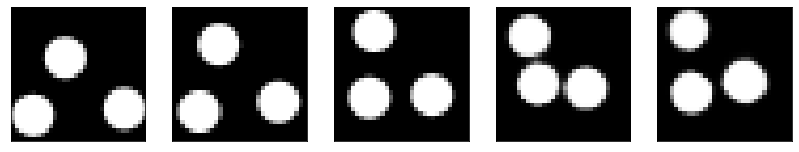

GD iterations:
i=0 | err=53.701859
i=1 | err=52.566998
i=2 | err=50.967560
i=3 | err=49.113659
i=4 | err=47.197754
i=5 | err=45.220604
i=6 | err=43.168633
i=7 | err=41.086235
i=8 | err=38.907322
i=9 | err=36.677898
i=10 | err=34.381184
i=11 | err=32.079704
i=12 | err=29.734089
i=13 | err=27.485451
i=14 | err=25.316412
i=15 | err=23.325581
i=16 | err=21.463379
i=17 | err=19.807350
i=18 | err=18.289524
i=19 | err=16.849020
i=20 | err=15.536272
i=21 | err=14.299758
i=22 | err=13.149101
i=23 | err=12.049248
i=24 | err=11.030229
i=25 | err=10.070086
i=26 | err=9.173795
i=27 | err=8.329170
i=28 | err=7.539050
i=29 | err=6.779038
Epoch=259 (35%) | out_positive=0.899933 | out_negative=0.114328 | mse=0.072553


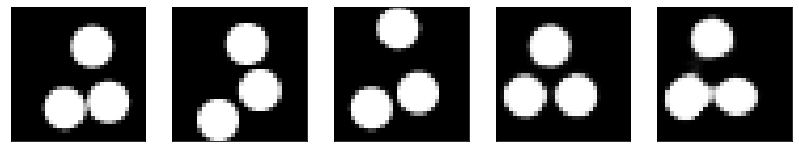

GD iterations:
i=0 | err=53.510269
i=1 | err=52.287086
i=2 | err=50.601158
i=3 | err=48.711380
i=4 | err=46.754250
i=5 | err=44.755676
i=6 | err=42.758537
i=7 | err=40.666183
i=8 | err=38.562847
i=9 | err=36.479343
i=10 | err=34.345360
i=11 | err=32.183914
i=12 | err=30.025532
i=13 | err=27.958952
i=14 | err=25.979445
i=15 | err=24.075438
i=16 | err=22.327076
i=17 | err=20.693537
i=18 | err=19.250416
i=19 | err=17.851500
i=20 | err=16.560593
i=21 | err=15.314777
i=22 | err=14.157513
i=23 | err=13.082500
i=24 | err=12.083597
i=25 | err=11.117597
i=26 | err=10.224827
i=27 | err=9.369623
i=28 | err=8.548686
i=29 | err=7.741331
Epoch=259 (37%) | out_positive=0.918761 | out_negative=0.118554 | mse=0.079368


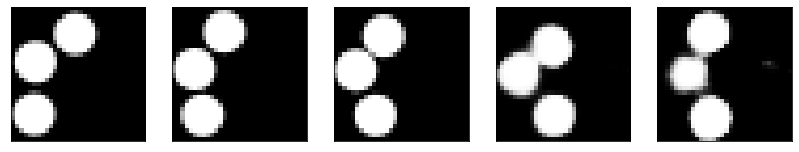

GD iterations:
i=0 | err=52.916935
i=1 | err=51.719624
i=2 | err=50.123695
i=3 | err=48.201050
i=4 | err=46.198490
i=5 | err=44.188290
i=6 | err=42.063812
i=7 | err=39.882736
i=8 | err=37.557491
i=9 | err=35.145824
i=10 | err=32.779701
i=11 | err=30.461649
i=12 | err=28.313515
i=13 | err=26.286217
i=14 | err=24.330494
i=15 | err=22.493084
i=16 | err=20.737442
i=17 | err=19.054827
i=18 | err=17.463446
i=19 | err=15.976501
i=20 | err=14.626956
i=21 | err=13.403158
i=22 | err=12.264511
i=23 | err=11.191715
i=24 | err=10.179924
i=25 | err=9.230499
i=26 | err=8.319059
i=27 | err=7.462256
i=28 | err=6.653651
i=29 | err=5.895368
Epoch=259 (38%) | out_positive=0.890193 | out_negative=0.101842 | mse=0.068230


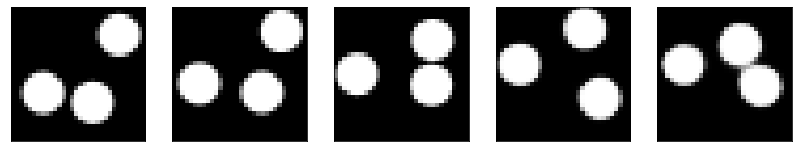

GD iterations:
i=0 | err=47.477173
i=1 | err=46.281769
i=2 | err=44.708416
i=3 | err=42.886696
i=4 | err=41.031334
i=5 | err=39.086945
i=6 | err=37.178524
i=7 | err=35.283440
i=8 | err=33.436619
i=9 | err=31.576042
i=10 | err=29.748806
i=11 | err=27.952085
i=12 | err=26.126026
i=13 | err=24.374109
i=14 | err=22.726849
i=15 | err=21.073368
i=16 | err=19.550770
i=17 | err=18.165188
i=18 | err=16.861216
i=19 | err=15.667835
i=20 | err=14.494047
i=21 | err=13.367124
i=22 | err=12.304642
i=23 | err=11.330842
i=24 | err=10.409054
i=25 | err=9.521910
i=26 | err=8.711145
i=27 | err=7.910592
i=28 | err=7.191159
i=29 | err=6.481528
Epoch=259 (40%) | out_positive=0.945653 | out_negative=0.154865 | mse=0.074325


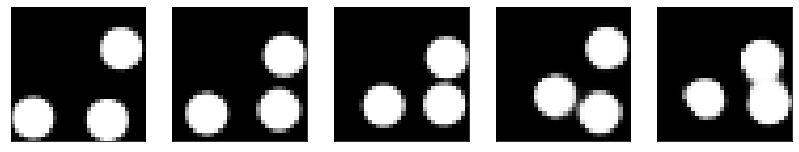

GD iterations:
i=0 | err=51.941628
i=1 | err=50.791374
i=2 | err=49.265079
i=3 | err=47.459522
i=4 | err=45.586781
i=5 | err=43.575459
i=6 | err=41.612103
i=7 | err=39.697281
i=8 | err=37.734089
i=9 | err=35.736668
i=10 | err=33.756721
i=11 | err=31.782305
i=12 | err=29.799067
i=13 | err=27.869946
i=14 | err=25.999334
i=15 | err=24.194557
i=16 | err=22.434534
i=17 | err=20.779976
i=18 | err=19.242346
i=19 | err=17.864759
i=20 | err=16.539227
i=21 | err=15.259073
i=22 | err=14.070473
i=23 | err=12.954707
i=24 | err=11.899721
i=25 | err=10.910473
i=26 | err=10.011593
i=27 | err=9.173060
i=28 | err=8.382843
i=29 | err=7.614880
Epoch=259 (41%) | out_positive=0.857596 | out_negative=0.126107 | mse=0.073633


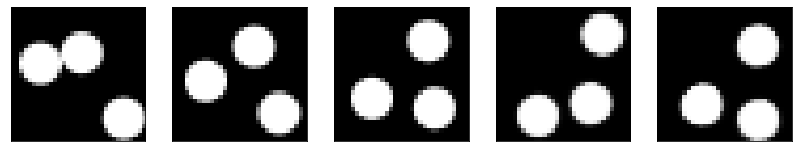

GD iterations:
i=0 | err=55.775658
i=1 | err=54.607483
i=2 | err=52.995247
i=3 | err=51.161407
i=4 | err=49.166611
i=5 | err=47.050827
i=6 | err=44.905563
i=7 | err=42.666298
i=8 | err=40.299377
i=9 | err=37.875938
i=10 | err=35.501068
i=11 | err=33.159477
i=12 | err=30.826797
i=13 | err=28.569868
i=14 | err=26.480106
i=15 | err=24.572613
i=16 | err=22.711609
i=17 | err=20.962837
i=18 | err=19.315773
i=19 | err=17.814545
i=20 | err=16.424688
i=21 | err=15.111336
i=22 | err=13.862484
i=23 | err=12.683987
i=24 | err=11.586069
i=25 | err=10.531462
i=26 | err=9.545752
i=27 | err=8.601007
i=28 | err=7.718699
i=29 | err=6.897577
Epoch=259 (43%) | out_positive=0.839345 | out_negative=0.082413 | mse=0.072794


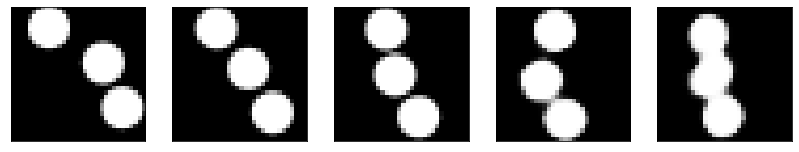

GD iterations:
i=0 | err=56.314445
i=1 | err=55.087341
i=2 | err=53.433781
i=3 | err=51.572651
i=4 | err=49.575836
i=5 | err=47.483223
i=6 | err=45.252960
i=7 | err=42.960220
i=8 | err=40.618458
i=9 | err=38.263847
i=10 | err=35.853073
i=11 | err=33.421093
i=12 | err=31.136528
i=13 | err=28.805441
i=14 | err=26.649323
i=15 | err=24.601442
i=16 | err=22.705868
i=17 | err=20.933876
i=18 | err=19.257799
i=19 | err=17.686071
i=20 | err=16.217823
i=21 | err=14.903025
i=22 | err=13.655033
i=23 | err=12.480691
i=24 | err=11.411604
i=25 | err=10.401928
i=26 | err=9.464169
i=27 | err=8.573754
i=28 | err=7.722213
i=29 | err=6.918599
Epoch=259 (45%) | out_positive=0.917936 | out_negative=0.139066 | mse=0.076299


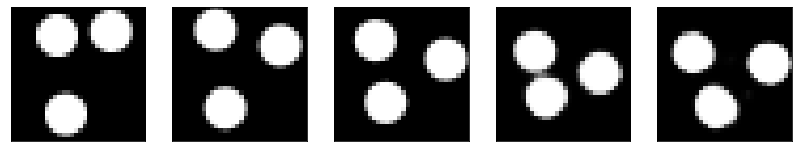

GD iterations:
i=0 | err=53.866348
i=1 | err=52.802868
i=2 | err=51.286221
i=3 | err=49.553085
i=4 | err=47.742069
i=5 | err=45.805428
i=6 | err=43.775589
i=7 | err=41.668018
i=8 | err=39.528633
i=9 | err=37.359352
i=10 | err=35.173965
i=11 | err=32.963364
i=12 | err=30.780819
i=13 | err=28.728674
i=14 | err=26.765587
i=15 | err=24.758045
i=16 | err=22.820238
i=17 | err=20.976604
i=18 | err=19.263523
i=19 | err=17.686441
i=20 | err=16.211596
i=21 | err=14.789079
i=22 | err=13.452764
i=23 | err=12.264341
i=24 | err=11.191455
i=25 | err=10.201614
i=26 | err=9.272120
i=27 | err=8.427625
i=28 | err=7.630548
i=29 | err=6.880731
Epoch=259 (47%) | out_positive=0.832510 | out_negative=0.144848 | mse=0.069605


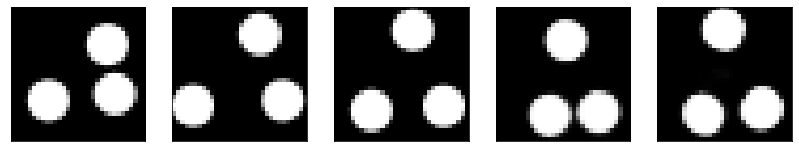

GD iterations:
i=0 | err=52.610901
i=1 | err=51.381027
i=2 | err=49.742130
i=3 | err=47.933243
i=4 | err=46.072021
i=5 | err=44.141701
i=6 | err=42.048386
i=7 | err=39.920242
i=8 | err=37.720444
i=9 | err=35.482101
i=10 | err=33.218102
i=11 | err=31.016014
i=12 | err=28.883736
i=13 | err=26.815487
i=14 | err=24.942926
i=15 | err=23.193535
i=16 | err=21.496027
i=17 | err=19.852261
i=18 | err=18.294739
i=19 | err=16.863285
i=20 | err=15.517154
i=21 | err=14.286535
i=22 | err=13.106919
i=23 | err=11.993858
i=24 | err=10.925932
i=25 | err=9.883667
i=26 | err=8.886053
i=27 | err=7.935405
i=28 | err=7.035984
i=29 | err=6.233285
Epoch=259 (49%) | out_positive=0.883343 | out_negative=0.154287 | mse=0.067268


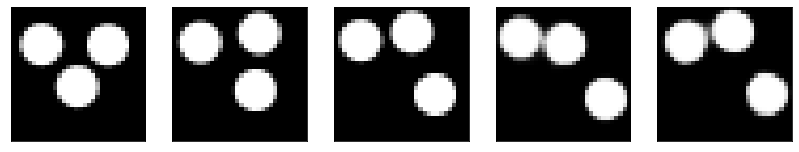

GD iterations:
i=0 | err=52.356136
i=1 | err=51.085930
i=2 | err=49.361885
i=3 | err=47.393532
i=4 | err=45.303749
i=5 | err=43.140297
i=6 | err=40.961037
i=7 | err=38.775414
i=8 | err=36.569336
i=9 | err=34.363056
i=10 | err=32.204720
i=11 | err=30.085007
i=12 | err=27.973999
i=13 | err=25.959038
i=14 | err=24.099554
i=15 | err=22.404051
i=16 | err=20.851192
i=17 | err=19.430126
i=18 | err=18.096962
i=19 | err=16.780792
i=20 | err=15.598217
i=21 | err=14.440800
i=22 | err=13.365761
i=23 | err=12.370024
i=24 | err=11.422279
i=25 | err=10.517237
i=26 | err=9.642874
i=27 | err=8.819138
i=28 | err=8.045111
i=29 | err=7.306075
Epoch=259 (51%) | out_positive=0.858225 | out_negative=0.134361 | mse=0.073728


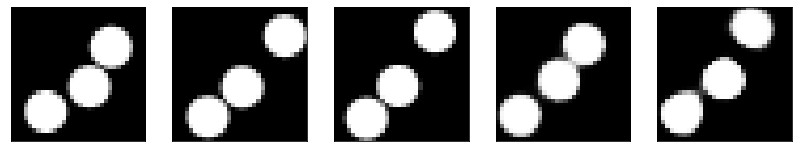

GD iterations:
i=0 | err=55.034737
i=1 | err=53.877304
i=2 | err=52.301857
i=3 | err=50.561752
i=4 | err=48.684792
i=5 | err=46.745407
i=6 | err=44.689827
i=7 | err=42.530914
i=8 | err=40.324268
i=9 | err=38.118694
i=10 | err=35.865105
i=11 | err=33.531139
i=12 | err=31.194647
i=13 | err=28.908350
i=14 | err=26.714962
i=15 | err=24.623215
i=16 | err=22.710228
i=17 | err=20.873695
i=18 | err=19.106049
i=19 | err=17.459158
i=20 | err=16.024937
i=21 | err=14.708532
i=22 | err=13.440033
i=23 | err=12.259879
i=24 | err=11.152343
i=25 | err=10.108342
i=26 | err=9.147905
i=27 | err=8.234900
i=28 | err=7.343741
i=29 | err=6.506472
Epoch=259 (52%) | out_positive=0.858738 | out_negative=0.124131 | mse=0.070284


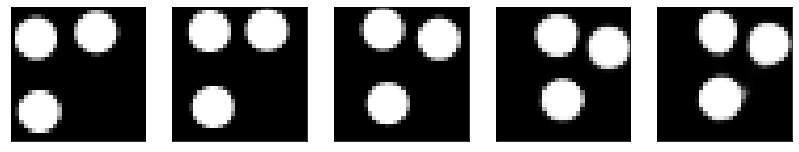

GD iterations:
i=0 | err=57.110435
i=1 | err=55.815590
i=2 | err=53.947872
i=3 | err=51.859177
i=4 | err=49.654472
i=5 | err=47.387169
i=6 | err=45.120964
i=7 | err=42.684113
i=8 | err=40.122139
i=9 | err=37.528004
i=10 | err=34.939865
i=11 | err=32.442429
i=12 | err=30.048569
i=13 | err=27.851133
i=14 | err=25.745419
i=15 | err=23.745247
i=16 | err=21.863718
i=17 | err=20.053612
i=18 | err=18.380981
i=19 | err=16.803089
i=20 | err=15.252220
i=21 | err=13.827562
i=22 | err=12.593667
i=23 | err=11.474390
i=24 | err=10.459893
i=25 | err=9.530233
i=26 | err=8.664515
i=27 | err=7.849408
i=28 | err=7.044276
i=29 | err=6.285391
Epoch=259 (54%) | out_positive=0.885759 | out_negative=0.152294 | mse=0.071774


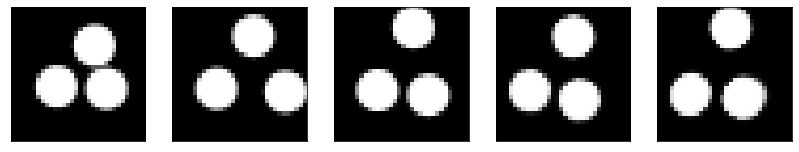

GD iterations:
i=0 | err=58.236523
i=1 | err=56.945557
i=2 | err=55.116142
i=3 | err=53.052101
i=4 | err=50.910412
i=5 | err=48.638157
i=6 | err=46.257633
i=7 | err=43.664951
i=8 | err=41.108459
i=9 | err=38.586937
i=10 | err=36.128944
i=11 | err=33.791557
i=12 | err=31.413374
i=13 | err=29.146978
i=14 | err=27.020241
i=15 | err=24.965761
i=16 | err=22.974592
i=17 | err=21.084507
i=18 | err=19.358828
i=19 | err=17.770535
i=20 | err=16.275261
i=21 | err=14.918694
i=22 | err=13.651587
i=23 | err=12.486750
i=24 | err=11.345808
i=25 | err=10.251522
i=26 | err=9.231630
i=27 | err=8.275614
i=28 | err=7.376128
i=29 | err=6.517937
Epoch=259 (56%) | out_positive=0.886894 | out_negative=0.112935 | mse=0.071997


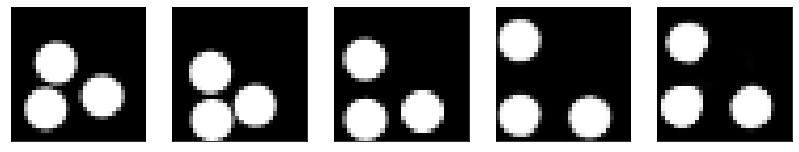

GD iterations:
i=0 | err=56.880318
i=1 | err=55.498405
i=2 | err=53.591751
i=3 | err=51.536842
i=4 | err=49.223305
i=5 | err=46.871338
i=6 | err=44.397171
i=7 | err=41.903389
i=8 | err=39.255562
i=9 | err=36.724388
i=10 | err=34.196995
i=11 | err=31.811722
i=12 | err=29.531757
i=13 | err=27.264549
i=14 | err=25.163818
i=15 | err=23.189030
i=16 | err=21.393806
i=17 | err=19.751089
i=18 | err=18.243822
i=19 | err=16.855247
i=20 | err=15.536892
i=21 | err=14.302533
i=22 | err=13.116980
i=23 | err=12.024933
i=24 | err=10.987062
i=25 | err=9.992078
i=26 | err=9.032936
i=27 | err=8.110907
i=28 | err=7.255174
i=29 | err=6.428699
Epoch=259 (58%) | out_positive=0.821348 | out_negative=0.154393 | mse=0.070927


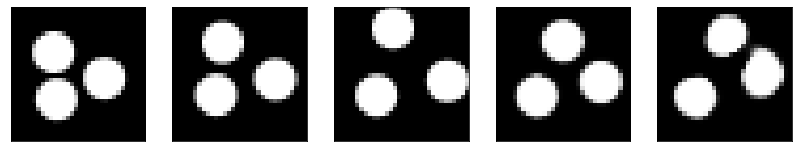

GD iterations:
i=0 | err=53.838886
i=1 | err=52.659538
i=2 | err=51.070663
i=3 | err=49.312317
i=4 | err=47.481895
i=5 | err=45.609192
i=6 | err=43.647945
i=7 | err=41.532452
i=8 | err=39.419430
i=9 | err=37.236309
i=10 | err=35.016670
i=11 | err=32.843124
i=12 | err=30.720581
i=13 | err=28.678329
i=14 | err=26.705812
i=15 | err=24.856857
i=16 | err=23.081009
i=17 | err=21.307539
i=18 | err=19.562883
i=19 | err=17.927979
i=20 | err=16.361317
i=21 | err=14.896935
i=22 | err=13.537954
i=23 | err=12.243729
i=24 | err=11.051439
i=25 | err=9.944345
i=26 | err=8.964099
i=27 | err=8.066729
i=28 | err=7.246873
i=29 | err=6.513679
Epoch=259 (60%) | out_positive=0.904873 | out_negative=0.132839 | mse=0.069642


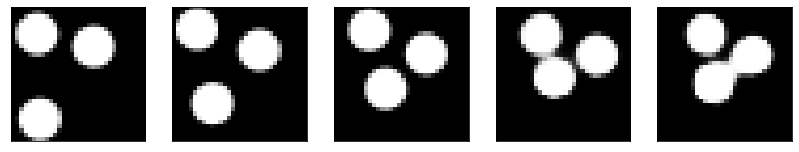

GD iterations:
i=0 | err=55.178104
i=1 | err=53.919533
i=2 | err=52.195930
i=3 | err=50.224823
i=4 | err=48.046402
i=5 | err=45.848595
i=6 | err=43.666725
i=7 | err=41.502186
i=8 | err=39.275299
i=9 | err=37.087746
i=10 | err=34.944824
i=11 | err=32.873375
i=12 | err=30.886780
i=13 | err=28.961090
i=14 | err=27.004236
i=15 | err=25.132370
i=16 | err=23.343967
i=17 | err=21.651155
i=18 | err=20.066914
i=19 | err=18.649227
i=20 | err=17.289307
i=21 | err=16.023758
i=22 | err=14.873243
i=23 | err=13.775379
i=24 | err=12.757639
i=25 | err=11.801080
i=26 | err=10.899773
i=27 | err=10.024548
i=28 | err=9.217499
i=29 | err=8.440773
Epoch=259 (62%) | out_positive=0.861470 | out_negative=0.070515 | mse=0.080299


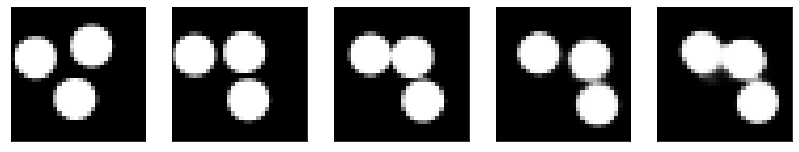

GD iterations:
i=0 | err=56.068779
i=1 | err=54.876129
i=2 | err=53.258244
i=3 | err=51.468761
i=4 | err=49.555954
i=5 | err=47.631588
i=6 | err=45.588188
i=7 | err=43.558022
i=8 | err=41.493488
i=9 | err=39.367790
i=10 | err=37.292053
i=11 | err=35.279915
i=12 | err=33.286919
i=13 | err=31.302090
i=14 | err=29.300476
i=15 | err=27.340935
i=16 | err=25.409893
i=17 | err=23.493061
i=18 | err=21.621883
i=19 | err=19.840422
i=20 | err=18.156277
i=21 | err=16.595173
i=22 | err=15.131020
i=23 | err=13.777952
i=24 | err=12.509253
i=25 | err=11.323675
i=26 | err=10.246443
i=27 | err=9.240213
i=28 | err=8.317499
i=29 | err=7.447282
Epoch=259 (63%) | out_positive=0.851331 | out_negative=0.094866 | mse=0.073556


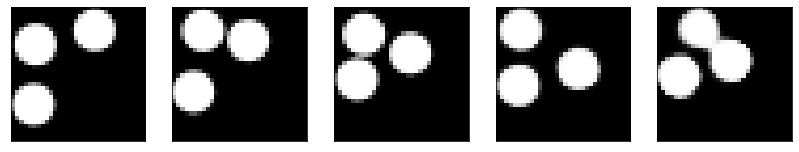

GD iterations:
i=0 | err=53.198246
i=1 | err=51.946320
i=2 | err=50.271690
i=3 | err=48.470726
i=4 | err=46.532257
i=5 | err=44.581619
i=6 | err=42.577629
i=7 | err=40.496971
i=8 | err=38.370865
i=9 | err=36.193806
i=10 | err=33.996475
i=11 | err=31.794067
i=12 | err=29.740000
i=13 | err=27.716751
i=14 | err=25.804688
i=15 | err=23.988798
i=16 | err=22.256666
i=17 | err=20.550125
i=18 | err=18.960613
i=19 | err=17.485222
i=20 | err=16.096676
i=21 | err=14.800991
i=22 | err=13.595050
i=23 | err=12.481085
i=24 | err=11.471630
i=25 | err=10.531187
i=26 | err=9.611254
i=27 | err=8.693000
i=28 | err=7.825055
i=29 | err=7.003736
Epoch=259 (65%) | out_positive=0.903169 | out_negative=0.132062 | mse=0.075093


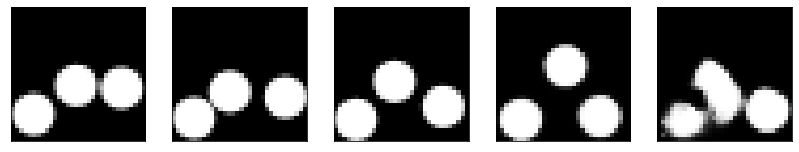

GD iterations:
i=0 | err=55.860756
i=1 | err=54.565437
i=2 | err=52.743782
i=3 | err=50.632225
i=4 | err=48.405380
i=5 | err=46.099964
i=6 | err=43.753738
i=7 | err=41.417770
i=8 | err=39.174690
i=9 | err=36.823715
i=10 | err=34.391956
i=11 | err=32.007961
i=12 | err=29.658245
i=13 | err=27.429188
i=14 | err=25.341671
i=15 | err=23.350887
i=16 | err=21.430740
i=17 | err=19.678364
i=18 | err=18.074133
i=19 | err=16.652491
i=20 | err=15.349617
i=21 | err=14.101228
i=22 | err=12.905649
i=23 | err=11.794065
i=24 | err=10.784712
i=25 | err=9.842362
i=26 | err=8.961529
i=27 | err=8.123850
i=28 | err=7.372960
i=29 | err=6.671818
Epoch=259 (67%) | out_positive=0.858623 | out_negative=0.119654 | mse=0.070237


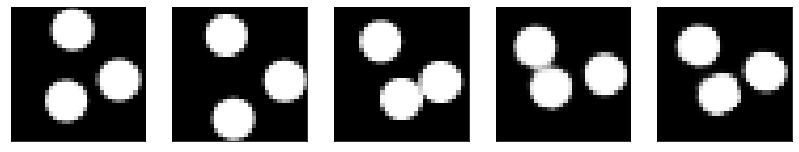

GD iterations:
i=0 | err=54.058048
i=1 | err=52.853012
i=2 | err=51.163853
i=3 | err=49.260590
i=4 | err=47.192753
i=5 | err=44.919479
i=6 | err=42.639503
i=7 | err=40.341431
i=8 | err=38.020348
i=9 | err=35.782631
i=10 | err=33.587097
i=11 | err=31.475702
i=12 | err=29.404354
i=13 | err=27.414812
i=14 | err=25.543365
i=15 | err=23.719925
i=16 | err=21.984476
i=17 | err=20.316223
i=18 | err=18.714645
i=19 | err=17.190722
i=20 | err=15.730534
i=21 | err=14.353274
i=22 | err=13.062658
i=23 | err=11.844679
i=24 | err=10.740723
i=25 | err=9.691250
i=26 | err=8.719673
i=27 | err=7.822066
i=28 | err=6.974814
i=29 | err=6.177633
Epoch=259 (69%) | out_positive=0.908634 | out_negative=0.151955 | mse=0.069249


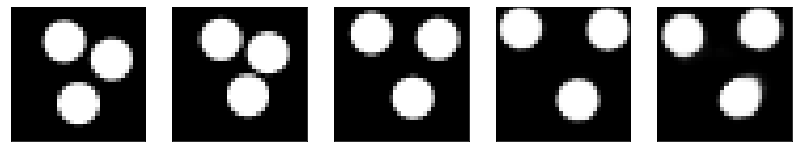

GD iterations:
i=0 | err=56.714500
i=1 | err=55.492680
i=2 | err=53.859879
i=3 | err=52.041977
i=4 | err=50.131592
i=5 | err=48.145889
i=6 | err=46.113430
i=7 | err=44.013359
i=8 | err=41.789391
i=9 | err=39.479847
i=10 | err=37.223434
i=11 | err=34.973259
i=12 | err=32.684074
i=13 | err=30.532780
i=14 | err=28.443336
i=15 | err=26.474445
i=16 | err=24.635300
i=17 | err=22.883247
i=18 | err=21.257256
i=19 | err=19.754906
i=20 | err=18.346731
i=21 | err=17.060822
i=22 | err=15.854303
i=23 | err=14.688952
i=24 | err=13.602092
i=25 | err=12.539105
i=26 | err=11.548800
i=27 | err=10.636192
i=28 | err=9.731916
i=29 | err=8.875105
Epoch=259 (71%) | out_positive=0.832598 | out_negative=0.107635 | mse=0.073505


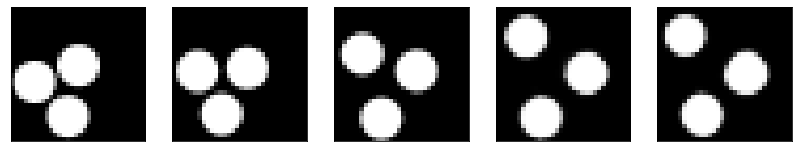

GD iterations:
i=0 | err=53.973934
i=1 | err=52.703659
i=2 | err=51.017292
i=3 | err=49.118950
i=4 | err=47.077240
i=5 | err=44.989380
i=6 | err=42.936226
i=7 | err=40.835823
i=8 | err=38.780205
i=9 | err=36.577354
i=10 | err=34.335823
i=11 | err=32.104259
i=12 | err=29.896057
i=13 | err=27.694536
i=14 | err=25.447464
i=15 | err=23.391762
i=16 | err=21.473480
i=17 | err=19.704323
i=18 | err=18.134790
i=19 | err=16.646595
i=20 | err=15.266220
i=21 | err=13.956697
i=22 | err=12.744137
i=23 | err=11.670845
i=24 | err=10.679182
i=25 | err=9.742561
i=26 | err=8.867834
i=27 | err=8.022399
i=28 | err=7.195498
i=29 | err=6.420019
Epoch=259 (73%) | out_positive=0.888798 | out_negative=0.134316 | mse=0.070326


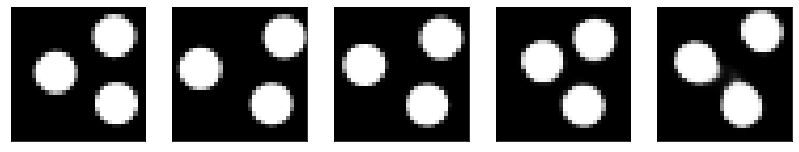

GD iterations:
i=0 | err=53.755840
i=1 | err=52.505852
i=2 | err=50.871254
i=3 | err=49.013245
i=4 | err=46.944511
i=5 | err=44.806282
i=6 | err=42.557369
i=7 | err=40.261093
i=8 | err=38.025261
i=9 | err=35.842186
i=10 | err=33.745987
i=11 | err=31.786213
i=12 | err=29.819426
i=13 | err=27.899368
i=14 | err=26.069017
i=15 | err=24.313211
i=16 | err=22.652435
i=17 | err=21.037682
i=18 | err=19.476864
i=19 | err=17.976669
i=20 | err=16.560715
i=21 | err=15.206273
i=22 | err=13.963294
i=23 | err=12.802572
i=24 | err=11.729156
i=25 | err=10.696232
i=26 | err=9.781649
i=27 | err=8.944682
i=28 | err=8.189152
i=29 | err=7.483507
Epoch=259 (75%) | out_positive=0.852918 | out_negative=0.107543 | mse=0.073112


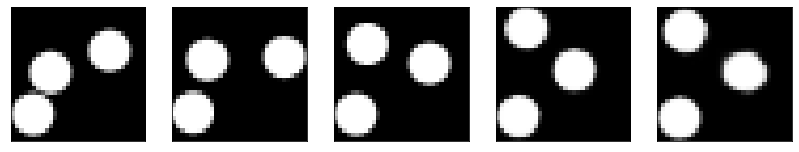

GD iterations:
i=0 | err=58.262085
i=1 | err=56.946125
i=2 | err=55.113411
i=3 | err=53.061226
i=4 | err=50.846352
i=5 | err=48.401951
i=6 | err=45.889828
i=7 | err=43.407463
i=8 | err=40.858070
i=9 | err=38.271339
i=10 | err=35.685833
i=11 | err=33.217316
i=12 | err=30.897057
i=13 | err=28.667591
i=14 | err=26.489735
i=15 | err=24.388790
i=16 | err=22.413754
i=17 | err=20.562912
i=18 | err=18.806042
i=19 | err=17.188951
i=20 | err=15.626364
i=21 | err=14.196833
i=22 | err=12.900098
i=23 | err=11.721062
i=24 | err=10.622314
i=25 | err=9.604753
i=26 | err=8.658056
i=27 | err=7.823748
i=28 | err=7.025220
i=29 | err=6.296196
Epoch=259 (76%) | out_positive=0.850049 | out_negative=0.129165 | mse=0.067908


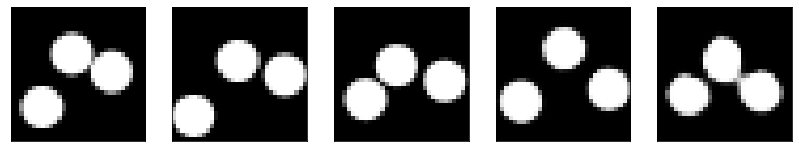

GD iterations:
i=0 | err=48.738953
i=1 | err=47.571579
i=2 | err=45.950699
i=3 | err=44.148544
i=4 | err=42.181824
i=5 | err=40.233040
i=6 | err=38.158947
i=7 | err=36.161728
i=8 | err=34.061813
i=9 | err=31.972923
i=10 | err=29.919178
i=11 | err=27.937675
i=12 | err=26.045977
i=13 | err=24.181881
i=14 | err=22.418259
i=15 | err=20.748426
i=16 | err=19.176235
i=17 | err=17.683331
i=18 | err=16.286598
i=19 | err=14.989835
i=20 | err=13.801727
i=21 | err=12.692335
i=22 | err=11.680578
i=23 | err=10.664734
i=24 | err=9.728657
i=25 | err=8.847946
i=26 | err=8.014178
i=27 | err=7.186135
i=28 | err=6.422454
i=29 | err=5.696505
Epoch=259 (78%) | out_positive=0.923125 | out_negative=0.160006 | mse=0.069696


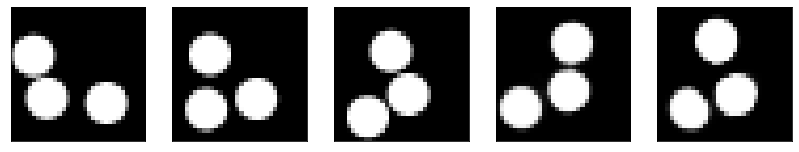

GD iterations:
i=0 | err=56.975502
i=1 | err=55.663437
i=2 | err=53.903725
i=3 | err=51.879417
i=4 | err=49.758812
i=5 | err=47.482323
i=6 | err=45.121487
i=7 | err=42.653961
i=8 | err=40.234337
i=9 | err=37.866402
i=10 | err=35.501236
i=11 | err=33.162209
i=12 | err=30.860271
i=13 | err=28.602570
i=14 | err=26.427414
i=15 | err=24.256056
i=16 | err=22.195320
i=17 | err=20.238171
i=18 | err=18.486885
i=19 | err=16.855633
i=20 | err=15.335290
i=21 | err=13.982487
i=22 | err=12.709663
i=23 | err=11.557081
i=24 | err=10.494773
i=25 | err=9.513800
i=26 | err=8.590406
i=27 | err=7.686810
i=28 | err=6.820181
i=29 | err=5.998626
Epoch=259 (80%) | out_positive=0.898810 | out_negative=0.107909 | mse=0.068702


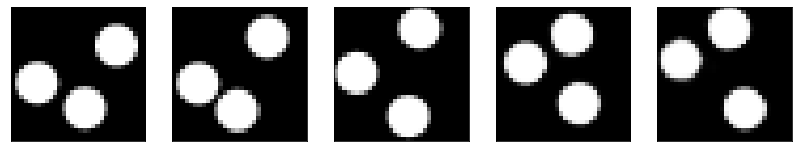

GD iterations:
i=0 | err=56.634422
i=1 | err=55.419365
i=2 | err=53.715054
i=3 | err=51.823093
i=4 | err=49.811810
i=5 | err=47.712452
i=6 | err=45.543770
i=7 | err=43.392906
i=8 | err=41.182320
i=9 | err=38.952946
i=10 | err=36.787094
i=11 | err=34.559669
i=12 | err=32.358685
i=13 | err=30.156483
i=14 | err=27.881842
i=15 | err=25.666264
i=16 | err=23.534531
i=17 | err=21.517612
i=18 | err=19.607704
i=19 | err=17.825840
i=20 | err=16.134947
i=21 | err=14.584043
i=22 | err=13.175273
i=23 | err=11.933797
i=24 | err=10.779181
i=25 | err=9.700630
i=26 | err=8.674198
i=27 | err=7.702864
i=28 | err=6.773792
i=29 | err=5.927306
Epoch=259 (82%) | out_positive=0.850319 | out_negative=0.113689 | mse=0.067224


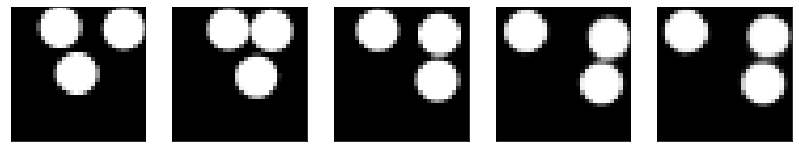

GD iterations:
i=0 | err=52.285538
i=1 | err=51.203384
i=2 | err=49.703659
i=3 | err=48.047146
i=4 | err=46.361275
i=5 | err=44.678333
i=6 | err=42.884430
i=7 | err=41.042850
i=8 | err=39.079636
i=9 | err=37.083214
i=10 | err=35.121910
i=11 | err=33.169312
i=12 | err=31.159645
i=13 | err=29.225735
i=14 | err=27.293655
i=15 | err=25.432144
i=16 | err=23.713936
i=17 | err=22.101660
i=18 | err=20.565420
i=19 | err=19.086157
i=20 | err=17.721613
i=21 | err=16.393295
i=22 | err=15.203436
i=23 | err=14.027397
i=24 | err=12.924067
i=25 | err=11.892499
i=26 | err=10.907145
i=27 | err=9.999438
i=28 | err=9.153501
i=29 | err=8.328529
Epoch=259 (84%) | out_positive=0.845278 | out_negative=0.094797 | mse=0.074453


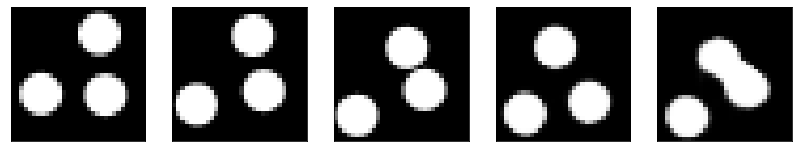

GD iterations:
i=0 | err=50.625565
i=1 | err=49.447693
i=2 | err=47.807030
i=3 | err=46.010567
i=4 | err=44.141518
i=5 | err=42.220081
i=6 | err=40.301968
i=7 | err=38.381016
i=8 | err=36.410225
i=9 | err=34.314957
i=10 | err=32.172523
i=11 | err=29.980764
i=12 | err=27.777981
i=13 | err=25.605812
i=14 | err=23.623985
i=15 | err=21.840645
i=16 | err=20.163752
i=17 | err=18.608969
i=18 | err=17.167727
i=19 | err=15.772587
i=20 | err=14.481475
i=21 | err=13.302004
i=22 | err=12.205297
i=23 | err=11.177525
i=24 | err=10.247297
i=25 | err=9.350411
i=26 | err=8.501144
i=27 | err=7.690878
i=28 | err=6.910170
i=29 | err=6.197123
Epoch=259 (86%) | out_positive=0.861157 | out_negative=0.102069 | mse=0.066254


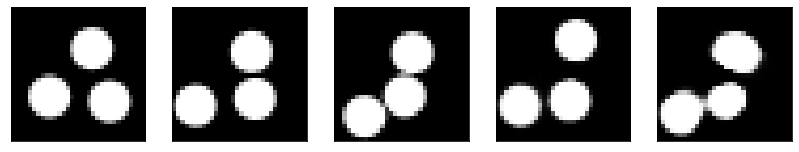

GD iterations:
i=0 | err=54.262344
i=1 | err=53.095078
i=2 | err=51.496906
i=3 | err=49.692383
i=4 | err=47.667137
i=5 | err=45.637157
i=6 | err=43.509521
i=7 | err=41.234474
i=8 | err=38.941837
i=9 | err=36.643089
i=10 | err=34.433655
i=11 | err=32.244762
i=12 | err=30.158972
i=13 | err=28.153687
i=14 | err=26.182753
i=15 | err=24.301767
i=16 | err=22.517010
i=17 | err=20.875629
i=18 | err=19.328268
i=19 | err=17.889120
i=20 | err=16.483685
i=21 | err=15.182524
i=22 | err=13.995168
i=23 | err=12.867580
i=24 | err=11.806437
i=25 | err=10.743358
i=26 | err=9.735956
i=27 | err=8.795921
i=28 | err=7.942670
i=29 | err=7.136102
Epoch=259 (88%) | out_positive=0.799116 | out_negative=0.146340 | mse=0.068702


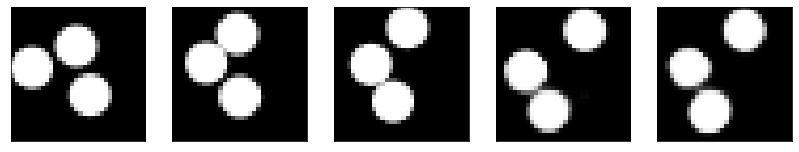

GD iterations:
i=0 | err=47.957432
i=1 | err=46.867744
i=2 | err=45.285885
i=3 | err=43.461967
i=4 | err=41.641899
i=5 | err=39.712410
i=6 | err=37.837597
i=7 | err=35.876453
i=8 | err=33.911369
i=9 | err=31.978544
i=10 | err=30.119316
i=11 | err=28.331608
i=12 | err=26.573227
i=13 | err=24.903080
i=14 | err=23.280149
i=15 | err=21.687582
i=16 | err=20.147732
i=17 | err=18.696114
i=18 | err=17.374828
i=19 | err=16.160149
i=20 | err=15.008814
i=21 | err=13.919472
i=22 | err=12.883818
i=23 | err=11.882299
i=24 | err=10.933624
i=25 | err=9.986412
i=26 | err=9.076084
i=27 | err=8.179056
i=28 | err=7.319589
i=29 | err=6.517149
Epoch=259 (89%) | out_positive=0.941644 | out_negative=0.168259 | mse=0.075250


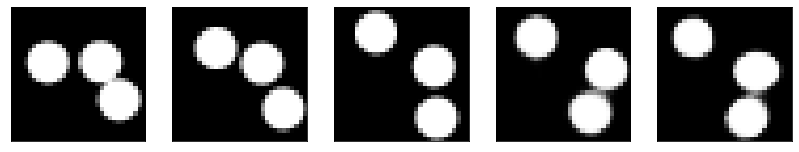

GD iterations:
i=0 | err=55.881561
i=1 | err=54.722672
i=2 | err=53.133785
i=3 | err=51.389801
i=4 | err=49.470478
i=5 | err=47.433998
i=6 | err=45.333233
i=7 | err=43.146824
i=8 | err=40.893311
i=9 | err=38.545841
i=10 | err=36.251785
i=11 | err=33.920300
i=12 | err=31.606209
i=13 | err=29.361084
i=14 | err=27.229351
i=15 | err=25.257421
i=16 | err=23.359402
i=17 | err=21.642111
i=18 | err=20.069923
i=19 | err=18.582968
i=20 | err=17.247578
i=21 | err=15.989171
i=22 | err=14.839742
i=23 | err=13.739160
i=24 | err=12.708861
i=25 | err=11.743789
i=26 | err=10.814798
i=27 | err=9.931767
i=28 | err=9.096257
i=29 | err=8.275218
Epoch=259 (91%) | out_positive=0.858934 | out_negative=0.094831 | mse=0.077724


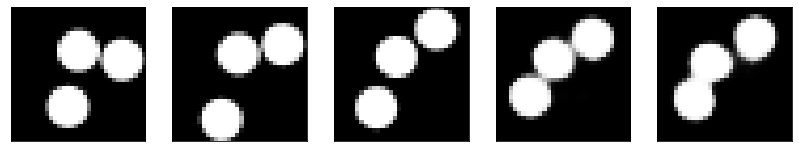

GD iterations:
i=0 | err=54.650883
i=1 | err=53.454559
i=2 | err=51.825325
i=3 | err=49.896442
i=4 | err=47.892899
i=5 | err=45.861923
i=6 | err=43.787838
i=7 | err=41.722385
i=8 | err=39.548462
i=9 | err=37.398346
i=10 | err=35.276260
i=11 | err=33.158089
i=12 | err=31.005135
i=13 | err=28.875265
i=14 | err=26.926651
i=15 | err=24.960537
i=16 | err=23.160942
i=17 | err=21.394953
i=18 | err=19.728271
i=19 | err=18.067535
i=20 | err=16.535913
i=21 | err=15.087348
i=22 | err=13.799364
i=23 | err=12.590799
i=24 | err=11.441086
i=25 | err=10.335324
i=26 | err=9.322433
i=27 | err=8.386705
i=28 | err=7.548196
i=29 | err=6.745245
Epoch=259 (93%) | out_positive=0.893193 | out_negative=0.163584 | mse=0.073414


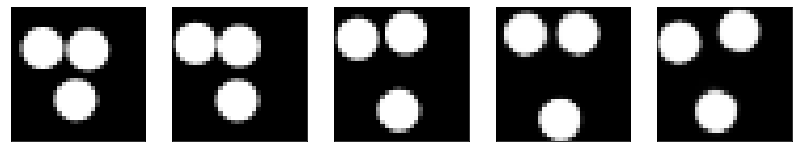

GD iterations:
i=0 | err=55.264553
i=1 | err=53.962448
i=2 | err=52.225410
i=3 | err=50.378105
i=4 | err=48.473946
i=5 | err=46.559883
i=6 | err=44.524117
i=7 | err=42.421307
i=8 | err=40.170418
i=9 | err=37.907787
i=10 | err=35.626884
i=11 | err=33.389500
i=12 | err=31.261723
i=13 | err=29.246201
i=14 | err=27.313335
i=15 | err=25.508266
i=16 | err=23.746634
i=17 | err=22.032757
i=18 | err=20.350719
i=19 | err=18.713078
i=20 | err=17.182091
i=21 | err=15.674038
i=22 | err=14.197107
i=23 | err=12.792589
i=24 | err=11.498087
i=25 | err=10.340381
i=26 | err=9.267656
i=27 | err=8.268778
i=28 | err=7.383523
i=29 | err=6.569482
Epoch=259 (95%) | out_positive=0.866232 | out_negative=0.119805 | mse=0.068626


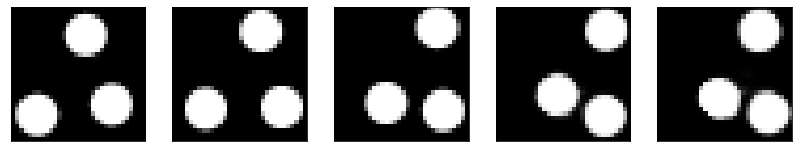

GD iterations:
i=0 | err=53.522980
i=1 | err=52.187531
i=2 | err=50.415565
i=3 | err=48.442970
i=4 | err=46.394028
i=5 | err=44.321312
i=6 | err=42.220467
i=7 | err=40.131855
i=8 | err=37.979553
i=9 | err=35.862167
i=10 | err=33.713001
i=11 | err=31.546152
i=12 | err=29.386127
i=13 | err=27.302431
i=14 | err=25.346081
i=15 | err=23.448952
i=16 | err=21.662724
i=17 | err=19.963640
i=18 | err=18.372158
i=19 | err=16.914612
i=20 | err=15.566143
i=21 | err=14.318106
i=22 | err=13.182816
i=23 | err=12.132475
i=24 | err=11.105130
i=25 | err=10.095466
i=26 | err=9.145758
i=27 | err=8.242764
i=28 | err=7.422943
i=29 | err=6.677156
Epoch=259 (97%) | out_positive=0.858824 | out_negative=0.125233 | mse=0.067938


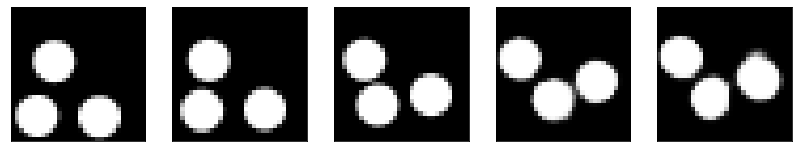

GD iterations:
i=0 | err=53.160866
i=1 | err=52.007473
i=2 | err=50.434002
i=3 | err=48.669724
i=4 | err=46.747910
i=5 | err=44.709175
i=6 | err=42.549835
i=7 | err=40.308853
i=8 | err=38.038845
i=9 | err=35.872375
i=10 | err=33.723515
i=11 | err=31.623196
i=12 | err=29.646248
i=13 | err=27.759071
i=14 | err=25.981415
i=15 | err=24.279789
i=16 | err=22.679363
i=17 | err=21.118191
i=18 | err=19.646538
i=19 | err=18.250496
i=20 | err=16.946865
i=21 | err=15.683868
i=22 | err=14.493689
i=23 | err=13.409313
i=24 | err=12.395132
i=25 | err=11.452868
i=26 | err=10.556957
i=27 | err=9.691264
i=28 | err=8.877795
i=29 | err=8.125387
Epoch=259 (98%) | out_positive=0.837360 | out_negative=0.103812 | mse=0.070703


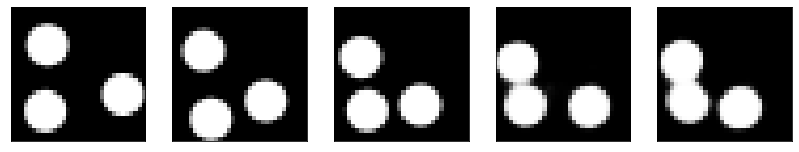

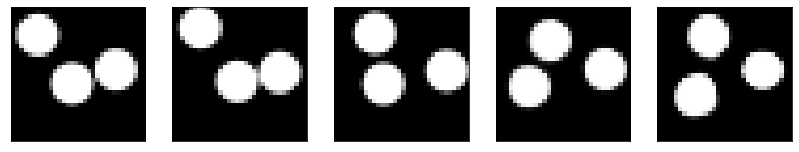

Test MSE 0.078032


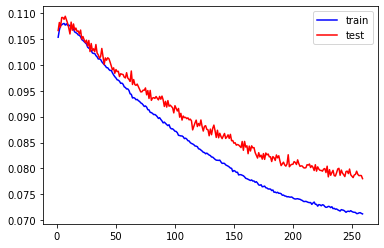

GD iterations:
i=0 | err=55.438869
i=1 | err=54.149109
i=2 | err=52.457001
i=3 | err=50.513657
i=4 | err=48.481689
i=5 | err=46.319798
i=6 | err=44.169655
i=7 | err=41.919888
i=8 | err=39.663357
i=9 | err=37.352005
i=10 | err=35.062347
i=11 | err=32.722748
i=12 | err=30.492683
i=13 | err=28.375214
i=14 | err=26.311375
i=15 | err=24.341038
i=16 | err=22.411711
i=17 | err=20.554932
i=18 | err=18.834055
i=19 | err=17.262794
i=20 | err=15.820946
i=21 | err=14.446209
i=22 | err=13.150830
i=23 | err=11.950275
i=24 | err=10.855436
i=25 | err=9.861025
i=26 | err=8.943155
i=27 | err=8.082549
i=28 | err=7.287349
i=29 | err=6.540326
Epoch=260 (0%) | out_positive=0.847231 | out_negative=0.097877 | mse=0.070925


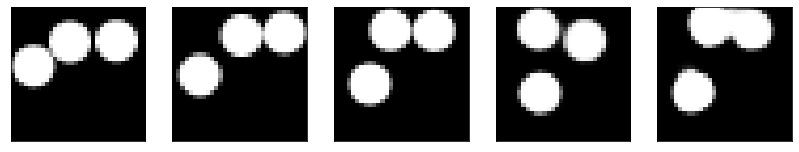

GD iterations:
i=0 | err=57.906395
i=1 | err=56.636631
i=2 | err=54.943748
i=3 | err=53.058884
i=4 | err=51.002678
i=5 | err=48.836578
i=6 | err=46.598190
i=7 | err=44.212219
i=8 | err=41.842731
i=9 | err=39.398026
i=10 | err=36.970818
i=11 | err=34.523964
i=12 | err=32.099651
i=13 | err=29.724377
i=14 | err=27.472576
i=15 | err=25.312195
i=16 | err=23.221954
i=17 | err=21.272999
i=18 | err=19.456909
i=19 | err=17.715687
i=20 | err=16.139179
i=21 | err=14.627687
i=22 | err=13.218580
i=23 | err=11.840705
i=24 | err=10.661223
i=25 | err=9.619230
i=26 | err=8.648838
i=27 | err=7.787186
i=28 | err=6.976616
i=29 | err=6.213321
Epoch=260 (2%) | out_positive=0.838120 | out_negative=0.141753 | mse=0.067051


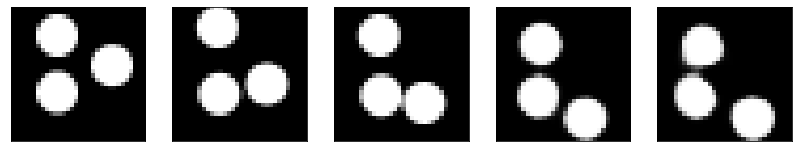

GD iterations:
i=0 | err=54.436226
i=1 | err=53.206085
i=2 | err=51.485504
i=3 | err=49.480927
i=4 | err=47.426949
i=5 | err=45.233734
i=6 | err=42.898041
i=7 | err=40.548153
i=8 | err=38.265453
i=9 | err=36.009888
i=10 | err=33.757328
i=11 | err=31.584274
i=12 | err=29.475317
i=13 | err=27.297789
i=14 | err=25.283920
i=15 | err=23.368980
i=16 | err=21.613289
i=17 | err=19.943939
i=18 | err=18.389002
i=19 | err=16.997770
i=20 | err=15.639531
i=21 | err=14.427534
i=22 | err=13.297222
i=23 | err=12.253008
i=24 | err=11.279078
i=25 | err=10.388161
i=26 | err=9.558141
i=27 | err=8.777100
i=28 | err=8.028558
i=29 | err=7.298112
Epoch=260 (4%) | out_positive=0.850445 | out_negative=0.081168 | mse=0.072082


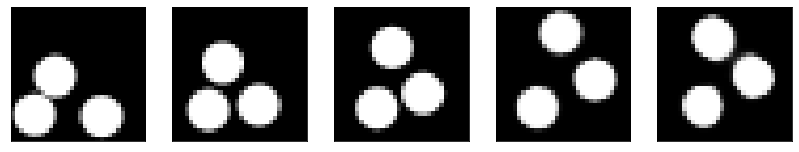

GD iterations:
i=0 | err=50.167953
i=1 | err=49.024109
i=2 | err=47.407833
i=3 | err=45.618237
i=4 | err=43.827370
i=5 | err=41.850998
i=6 | err=39.807293
i=7 | err=37.704620
i=8 | err=35.504280
i=9 | err=33.261829
i=10 | err=31.074783
i=11 | err=28.905205
i=12 | err=26.833313
i=13 | err=24.950123
i=14 | err=23.217480
i=15 | err=21.637917
i=16 | err=20.177677
i=17 | err=18.759510
i=18 | err=17.410530
i=19 | err=16.083588
i=20 | err=14.818797
i=21 | err=13.641607
i=22 | err=12.536970
i=23 | err=11.517379
i=24 | err=10.547819
i=25 | err=9.659883
i=26 | err=8.798733
i=27 | err=8.004065
i=28 | err=7.247389
i=29 | err=6.542768
Epoch=260 (6%) | out_positive=0.883803 | out_negative=0.123585 | mse=0.068030


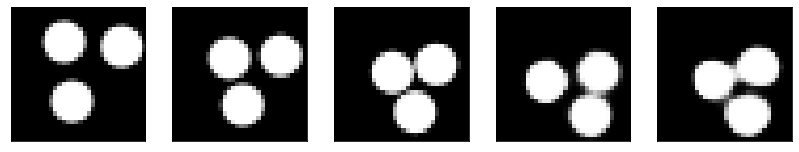

GD iterations:
i=0 | err=57.482182
i=1 | err=56.201008
i=2 | err=54.434700
i=3 | err=52.361561
i=4 | err=50.117096
i=5 | err=47.860306
i=6 | err=45.595032
i=7 | err=43.423061
i=8 | err=41.193825
i=9 | err=38.942036
i=10 | err=36.647049
i=11 | err=34.330940
i=12 | err=32.007648
i=13 | err=29.698399
i=14 | err=27.459152
i=15 | err=25.392467
i=16 | err=23.445066
i=17 | err=21.598354
i=18 | err=19.899120
i=19 | err=18.342194
i=20 | err=16.834553
i=21 | err=15.392101
i=22 | err=14.036011
i=23 | err=12.750317
i=24 | err=11.551307
i=25 | err=10.405619
i=26 | err=9.338365
i=27 | err=8.351661
i=28 | err=7.444623
i=29 | err=6.605140
Epoch=260 (8%) | out_positive=0.884876 | out_negative=0.145475 | mse=0.068052


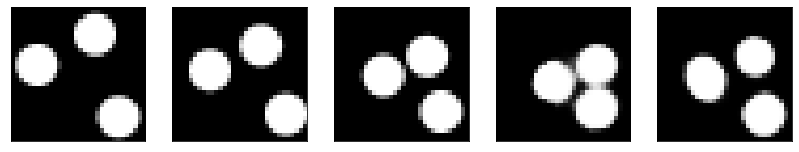

GD iterations:
i=0 | err=55.971161
i=1 | err=54.777359
i=2 | err=53.127167
i=3 | err=51.250107
i=4 | err=49.263733
i=5 | err=47.207829
i=6 | err=45.002739
i=7 | err=42.691185
i=8 | err=40.381626
i=9 | err=38.055840
i=10 | err=35.735832
i=11 | err=33.493584
i=12 | err=31.305435
i=13 | err=29.180264
i=14 | err=27.177019
i=15 | err=25.197018
i=16 | err=23.329350
i=17 | err=21.603516
i=18 | err=19.918997
i=19 | err=18.309654
i=20 | err=16.733616
i=21 | err=15.335452
i=22 | err=14.072301
i=23 | err=12.946539
i=24 | err=11.915455
i=25 | err=10.951144
i=26 | err=10.026888
i=27 | err=9.162821
i=28 | err=8.329492
i=29 | err=7.531797
Epoch=260 (9%) | out_positive=0.790584 | out_negative=0.109607 | mse=0.069759


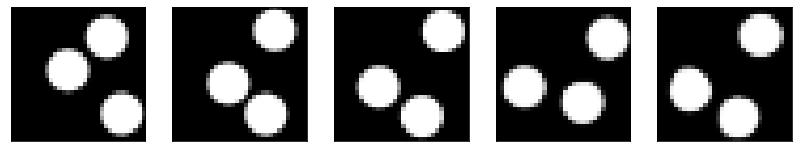

GD iterations:
i=0 | err=54.604195
i=1 | err=53.383251
i=2 | err=51.811661
i=3 | err=50.044792
i=4 | err=48.183369
i=5 | err=46.179054
i=6 | err=44.144722
i=7 | err=42.008240
i=8 | err=39.755981
i=9 | err=37.475266
i=10 | err=35.117607
i=11 | err=32.810452
i=12 | err=30.451576
i=13 | err=28.200073
i=14 | err=26.093290
i=15 | err=24.086817
i=16 | err=22.186672
i=17 | err=20.450584
i=18 | err=18.864212
i=19 | err=17.389040
i=20 | err=15.977285
i=21 | err=14.665225
i=22 | err=13.436989
i=23 | err=12.293709
i=24 | err=11.239005
i=25 | err=10.178292
i=26 | err=9.153933
i=27 | err=8.179509
i=28 | err=7.264864
i=29 | err=6.430897
Epoch=260 (11%) | out_positive=0.911113 | out_negative=0.144410 | mse=0.070608


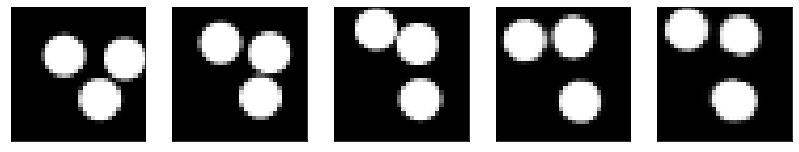

GD iterations:
i=0 | err=54.745590
i=1 | err=53.436890
i=2 | err=51.807972
i=3 | err=49.988811
i=4 | err=48.035099
i=5 | err=46.066559
i=6 | err=44.024460
i=7 | err=41.933475
i=8 | err=39.756588
i=9 | err=37.529797
i=10 | err=35.309380
i=11 | err=33.157032
i=12 | err=31.014322
i=13 | err=29.022182
i=14 | err=26.980476
i=15 | err=25.119560
i=16 | err=23.398121
i=17 | err=21.713512
i=18 | err=20.073303
i=19 | err=18.464836
i=20 | err=16.981495
i=21 | err=15.576695
i=22 | err=14.357489
i=23 | err=13.206407
i=24 | err=12.125547
i=25 | err=11.075372
i=26 | err=10.055683
i=27 | err=9.064501
i=28 | err=8.125365
i=29 | err=7.265467
Epoch=260 (13%) | out_positive=0.893726 | out_negative=0.086883 | mse=0.076450


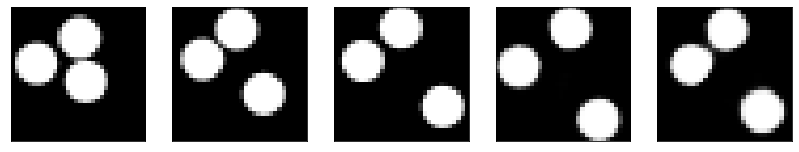

GD iterations:
i=0 | err=54.079891
i=1 | err=52.946609
i=2 | err=51.410278
i=3 | err=49.692394
i=4 | err=47.839188
i=5 | err=45.887505
i=6 | err=43.853271
i=7 | err=41.780876
i=8 | err=39.742874
i=9 | err=37.621975
i=10 | err=35.480598
i=11 | err=33.364914
i=12 | err=31.360947
i=13 | err=29.445435
i=14 | err=27.574150
i=15 | err=25.742798
i=16 | err=23.931633
i=17 | err=22.155884
i=18 | err=20.443163
i=19 | err=18.809496
i=20 | err=17.244360
i=21 | err=15.824087
i=22 | err=14.512052
i=23 | err=13.296651
i=24 | err=12.148450
i=25 | err=11.077631
i=26 | err=10.030319
i=27 | err=9.046715
i=28 | err=8.119505
i=29 | err=7.266561
Epoch=260 (15%) | out_positive=0.857497 | out_negative=0.126013 | mse=0.072995


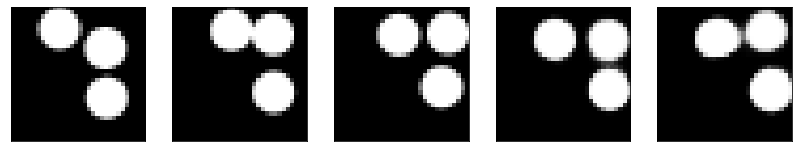

GD iterations:
i=0 | err=51.111877
i=1 | err=49.876537
i=2 | err=48.263233
i=3 | err=46.524956
i=4 | err=44.753540
i=5 | err=42.862968
i=6 | err=40.987827
i=7 | err=38.989677
i=8 | err=36.996788
i=9 | err=34.954651
i=10 | err=32.940063
i=11 | err=31.006369
i=12 | err=29.012497
i=13 | err=26.946159
i=14 | err=25.018604
i=15 | err=23.236988
i=16 | err=21.561375
i=17 | err=19.956486
i=18 | err=18.423096
i=19 | err=17.041147
i=20 | err=15.794668
i=21 | err=14.674732
i=22 | err=13.598381
i=23 | err=12.570520
i=24 | err=11.595695
i=25 | err=10.678839
i=26 | err=9.814925
i=27 | err=9.034851
i=28 | err=8.288424
i=29 | err=7.555881
Epoch=260 (17%) | out_positive=0.921147 | out_negative=0.132942 | mse=0.070003


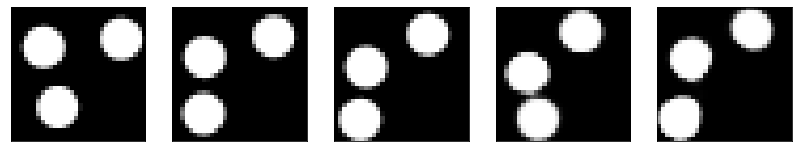

GD iterations:
i=0 | err=54.806717
i=1 | err=53.562496
i=2 | err=51.859154
i=3 | err=49.962158
i=4 | err=47.981266
i=5 | err=45.943581
i=6 | err=43.861160
i=7 | err=41.674141
i=8 | err=39.354561
i=9 | err=37.022728
i=10 | err=34.691151
i=11 | err=32.295406
i=12 | err=30.051712
i=13 | err=27.950380
i=14 | err=25.933573
i=15 | err=23.994293
i=16 | err=22.204321
i=17 | err=20.529633
i=18 | err=18.964523
i=19 | err=17.460583
i=20 | err=16.032736
i=21 | err=14.729975
i=22 | err=13.535093
i=23 | err=12.371317
i=24 | err=11.298798
i=25 | err=10.287358
i=26 | err=9.347588
i=27 | err=8.438475
i=28 | err=7.585331
i=29 | err=6.779504
Epoch=260 (18%) | out_positive=0.828143 | out_negative=0.105118 | mse=0.069760


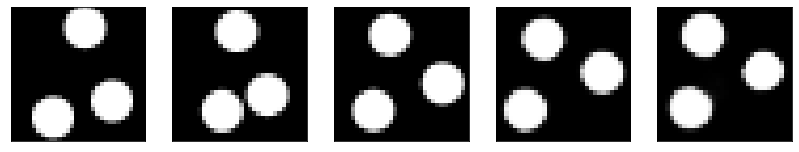

GD iterations:
i=0 | err=56.719337
i=1 | err=55.488911
i=2 | err=53.744698
i=3 | err=51.857349
i=4 | err=49.828590
i=5 | err=47.773438
i=6 | err=45.564709
i=7 | err=43.304405
i=8 | err=41.047348
i=9 | err=38.820114
i=10 | err=36.598213
i=11 | err=34.410057
i=12 | err=32.239006
i=13 | err=30.073826
i=14 | err=27.930435
i=15 | err=25.800522
i=16 | err=23.766233
i=17 | err=21.765343
i=18 | err=19.861115
i=19 | err=18.007401
i=20 | err=16.277367
i=21 | err=14.735862
i=22 | err=13.288830
i=23 | err=11.999263
i=24 | err=10.828283
i=25 | err=9.726574
i=26 | err=8.739803
i=27 | err=7.773767
i=28 | err=6.867021
i=29 | err=6.026526
Epoch=260 (20%) | out_positive=0.902138 | out_negative=0.152162 | mse=0.072176


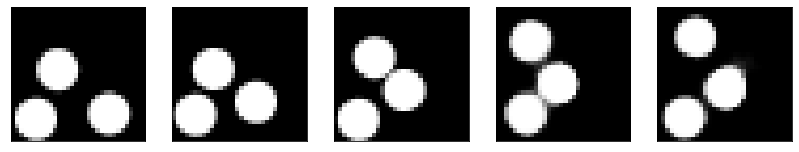

GD iterations:
i=0 | err=52.237423
i=1 | err=50.983307
i=2 | err=49.332329
i=3 | err=47.439201
i=4 | err=45.474983
i=5 | err=43.471992
i=6 | err=41.421638
i=7 | err=39.358948
i=8 | err=37.331638
i=9 | err=35.262657
i=10 | err=33.178017
i=11 | err=31.124485
i=12 | err=29.051140
i=13 | err=27.040636
i=14 | err=25.031094
i=15 | err=23.224495
i=16 | err=21.575891
i=17 | err=20.033140
i=18 | err=18.582403
i=19 | err=17.199577
i=20 | err=15.892366
i=21 | err=14.638807
i=22 | err=13.441527
i=23 | err=12.336863
i=24 | err=11.283202
i=25 | err=10.303438
i=26 | err=9.409330
i=27 | err=8.541375
i=28 | err=7.709064
i=29 | err=6.926821
Epoch=260 (22%) | out_positive=0.919860 | out_negative=0.124192 | mse=0.066654


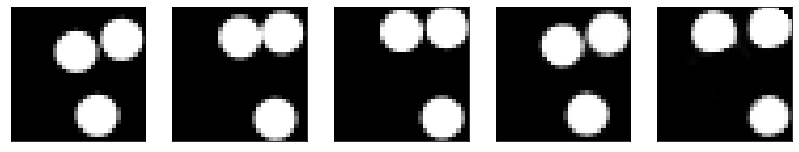

GD iterations:
i=0 | err=58.150215
i=1 | err=56.933811
i=2 | err=55.282303
i=3 | err=53.408928
i=4 | err=51.394478
i=5 | err=49.219795
i=6 | err=46.957092
i=7 | err=44.682262
i=8 | err=42.386650
i=9 | err=40.109489
i=10 | err=37.880741
i=11 | err=35.688103
i=12 | err=33.501480
i=13 | err=31.272161
i=14 | err=29.083691
i=15 | err=27.006256
i=16 | err=24.997133
i=17 | err=23.031773
i=18 | err=21.124397
i=19 | err=19.304703
i=20 | err=17.617226
i=21 | err=16.074516
i=22 | err=14.654354
i=23 | err=13.357424
i=24 | err=12.187321
i=25 | err=11.107447
i=26 | err=10.090008
i=27 | err=9.121352
i=28 | err=8.195699
i=29 | err=7.319542
Epoch=260 (24%) | out_positive=0.843874 | out_negative=0.096718 | mse=0.078884


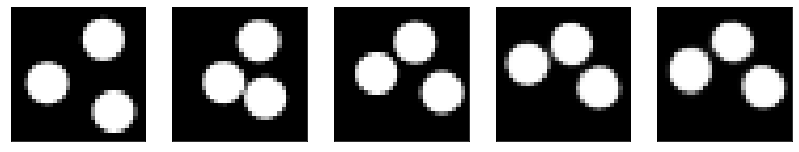

GD iterations:
i=0 | err=53.006859
i=1 | err=51.740681
i=2 | err=50.048553
i=3 | err=48.193554
i=4 | err=46.242294
i=5 | err=44.243099
i=6 | err=42.142021
i=7 | err=39.851128
i=8 | err=37.525497
i=9 | err=35.174774
i=10 | err=32.885490
i=11 | err=30.708179
i=12 | err=28.663198
i=13 | err=26.688171
i=14 | err=24.702497
i=15 | err=22.728527
i=16 | err=20.864510
i=17 | err=19.187160
i=18 | err=17.651207
i=19 | err=16.260155
i=20 | err=14.911438
i=21 | err=13.647952
i=22 | err=12.485857
i=23 | err=11.397757
i=24 | err=10.404099
i=25 | err=9.465519
i=26 | err=8.583487
i=27 | err=7.764214
i=28 | err=7.007452
i=29 | err=6.298116
Epoch=260 (26%) | out_positive=0.913242 | out_negative=0.160477 | mse=0.071577


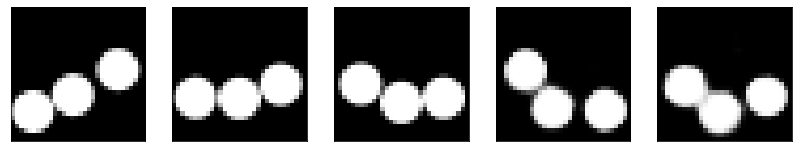

GD iterations:
i=0 | err=56.404438
i=1 | err=55.200554
i=2 | err=53.514328
i=3 | err=51.590126
i=4 | err=49.588501
i=5 | err=47.498573
i=6 | err=45.373665
i=7 | err=43.186134
i=8 | err=41.018333
i=9 | err=38.778263
i=10 | err=36.552811
i=11 | err=34.373344
i=12 | err=32.235756
i=13 | err=30.113104
i=14 | err=27.981678
i=15 | err=25.943817
i=16 | err=24.034649
i=17 | err=22.182430
i=18 | err=20.448139
i=19 | err=18.756950
i=20 | err=17.138668
i=21 | err=15.646798
i=22 | err=14.245443
i=23 | err=12.931045
i=24 | err=11.669682
i=25 | err=10.534461
i=26 | err=9.472361
i=27 | err=8.458044
i=28 | err=7.478577
i=29 | err=6.543313
Epoch=260 (28%) | out_positive=0.896417 | out_negative=0.147115 | mse=0.073063


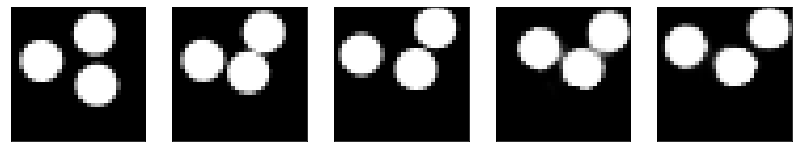

GD iterations:
i=0 | err=58.028328
i=1 | err=56.861065
i=2 | err=55.299904
i=3 | err=53.560299
i=4 | err=51.710621
i=5 | err=49.807182
i=6 | err=47.805870
i=7 | err=45.752762
i=8 | err=43.535137
i=9 | err=41.222038
i=10 | err=38.881866
i=11 | err=36.494144
i=12 | err=34.108215
i=13 | err=31.729828
i=14 | err=29.399132
i=15 | err=27.170555
i=16 | err=25.051416
i=17 | err=23.042290
i=18 | err=21.139259
i=19 | err=19.358040
i=20 | err=17.732763
i=21 | err=16.210117
i=22 | err=14.816984
i=23 | err=13.532831
i=24 | err=12.296654
i=25 | err=11.133413
i=26 | err=10.067568
i=27 | err=9.067515
i=28 | err=8.095938
i=29 | err=7.208753
Epoch=260 (30%) | out_positive=0.865486 | out_negative=0.150966 | mse=0.071543


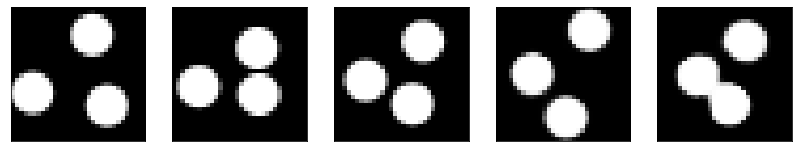

GD iterations:
i=0 | err=55.486580
i=1 | err=54.236855
i=2 | err=52.603020
i=3 | err=50.717842
i=4 | err=48.705223
i=5 | err=46.548294
i=6 | err=44.308342
i=7 | err=42.002003
i=8 | err=39.733204
i=9 | err=37.461548
i=10 | err=35.147099
i=11 | err=32.862411
i=12 | err=30.679665
i=13 | err=28.573059
i=14 | err=26.530901
i=15 | err=24.528461
i=16 | err=22.612057
i=17 | err=20.755924
i=18 | err=19.049139
i=19 | err=17.465309
i=20 | err=16.017450
i=21 | err=14.710899
i=22 | err=13.551645
i=23 | err=12.464188
i=24 | err=11.407804
i=25 | err=10.378292
i=26 | err=9.396091
i=27 | err=8.455366
i=28 | err=7.575959
i=29 | err=6.771391
Epoch=260 (31%) | out_positive=0.874514 | out_negative=0.117739 | mse=0.071496


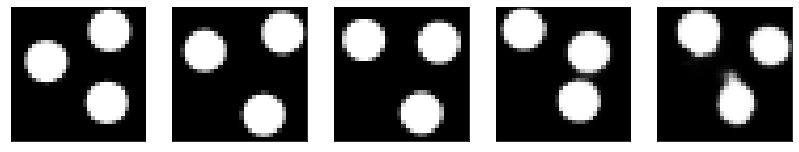

GD iterations:
i=0 | err=55.603592
i=1 | err=54.395325
i=2 | err=52.646217
i=3 | err=50.772690
i=4 | err=48.796349
i=5 | err=46.697624
i=6 | err=44.449539
i=7 | err=42.158241
i=8 | err=39.872459
i=9 | err=37.595200
i=10 | err=35.370907
i=11 | err=33.246109
i=12 | err=31.125626
i=13 | err=29.052551
i=14 | err=27.097406
i=15 | err=25.235828
i=16 | err=23.527233
i=17 | err=21.899590
i=18 | err=20.291187
i=19 | err=18.741451
i=20 | err=17.254063
i=21 | err=15.855614
i=22 | err=14.564314
i=23 | err=13.348383
i=24 | err=12.258307
i=25 | err=11.232406
i=26 | err=10.284362
i=27 | err=9.395704
i=28 | err=8.535803
i=29 | err=7.759277
Epoch=260 (33%) | out_positive=0.882249 | out_negative=0.100068 | mse=0.075223


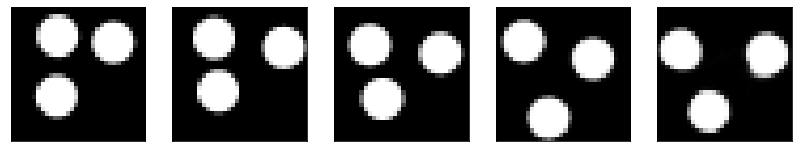

GD iterations:
i=0 | err=53.048332
i=1 | err=51.887833
i=2 | err=50.303459
i=3 | err=48.428894
i=4 | err=46.492340
i=5 | err=44.606693
i=6 | err=42.633568
i=7 | err=40.627129
i=8 | err=38.522869
i=9 | err=36.346390
i=10 | err=34.188808
i=11 | err=32.072582
i=12 | err=30.093243
i=13 | err=28.191193
i=14 | err=26.300110
i=15 | err=24.512432
i=16 | err=22.796347
i=17 | err=21.215370
i=18 | err=19.697735
i=19 | err=18.261421
i=20 | err=16.804762
i=21 | err=15.412985
i=22 | err=14.051928
i=23 | err=12.718740
i=24 | err=11.498458
i=25 | err=10.352222
i=26 | err=9.288519
i=27 | err=8.308411
i=28 | err=7.419744
i=29 | err=6.607882
Epoch=260 (35%) | out_positive=0.931036 | out_negative=0.141504 | mse=0.073276


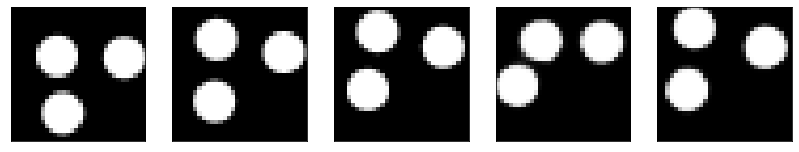

GD iterations:
i=0 | err=54.584724
i=1 | err=53.379707
i=2 | err=51.737427
i=3 | err=49.918861
i=4 | err=48.013252
i=5 | err=46.058235
i=6 | err=44.033844
i=7 | err=41.920280
i=8 | err=39.690289
i=9 | err=37.449219
i=10 | err=35.238918
i=11 | err=33.074604
i=12 | err=30.926472
i=13 | err=28.780043
i=14 | err=26.696312
i=15 | err=24.627609
i=16 | err=22.609554
i=17 | err=20.722679
i=18 | err=18.998121
i=19 | err=17.426943
i=20 | err=15.985256
i=21 | err=14.663080
i=22 | err=13.470776
i=23 | err=12.356065
i=24 | err=11.321586
i=25 | err=10.348080
i=26 | err=9.441347
i=27 | err=8.573335
i=28 | err=7.728921
i=29 | err=6.924256
Epoch=260 (37%) | out_positive=0.922099 | out_negative=0.148319 | mse=0.075162


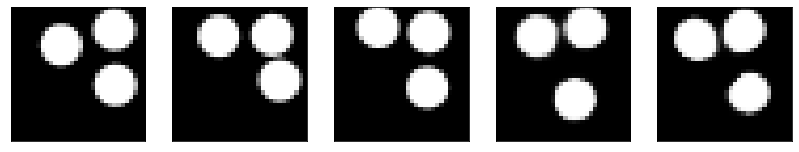

GD iterations:
i=0 | err=58.718170
i=1 | err=57.435688
i=2 | err=55.630344
i=3 | err=53.635319
i=4 | err=51.633991
i=5 | err=49.506863
i=6 | err=47.276405
i=7 | err=44.961418
i=8 | err=42.575039
i=9 | err=40.246979
i=10 | err=37.910095
i=11 | err=35.553276
i=12 | err=33.207081
i=13 | err=30.983383
i=14 | err=28.840717
i=15 | err=26.770826
i=16 | err=24.764717
i=17 | err=22.857534
i=18 | err=21.018867
i=19 | err=19.315035
i=20 | err=17.774673
i=21 | err=16.321310
i=22 | err=14.994223
i=23 | err=13.788594
i=24 | err=12.708035
i=25 | err=11.709976
i=26 | err=10.764643
i=27 | err=9.875437
i=28 | err=8.976601
i=29 | err=8.121878
Epoch=260 (39%) | out_positive=0.849435 | out_negative=0.098976 | mse=0.078544


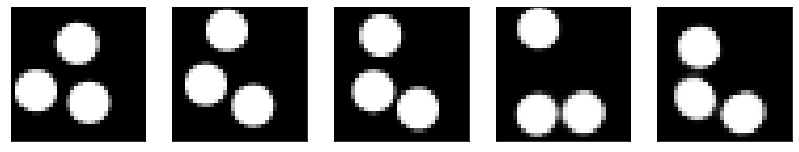

GD iterations:
i=0 | err=54.990875
i=1 | err=53.811470
i=2 | err=52.284485
i=3 | err=50.536564
i=4 | err=48.735153
i=5 | err=46.822182
i=6 | err=44.895420
i=7 | err=42.916859
i=8 | err=40.855042
i=9 | err=38.753601
i=10 | err=36.604984
i=11 | err=34.395676
i=12 | err=32.143616
i=13 | err=29.883347
i=14 | err=27.654034
i=15 | err=25.508268
i=16 | err=23.514471
i=17 | err=21.740082
i=18 | err=20.096001
i=19 | err=18.555048
i=20 | err=17.100666
i=21 | err=15.710005
i=22 | err=14.407032
i=23 | err=13.228788
i=24 | err=12.151724
i=25 | err=11.131466
i=26 | err=10.174898
i=27 | err=9.282761
i=28 | err=8.461432
i=29 | err=7.669218
Epoch=260 (40%) | out_positive=0.837615 | out_negative=0.118286 | mse=0.071273


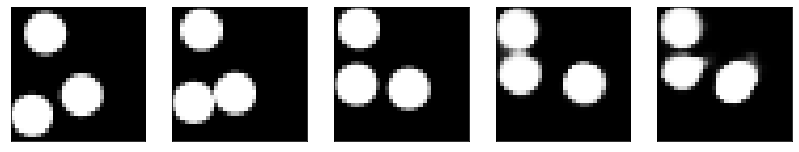

GD iterations:
i=0 | err=55.290871
i=1 | err=53.994011
i=2 | err=52.296825
i=3 | err=50.335930
i=4 | err=48.244415
i=5 | err=46.142914
i=6 | err=43.979504
i=7 | err=41.839558
i=8 | err=39.576271
i=9 | err=37.231544
i=10 | err=34.939415
i=11 | err=32.702728
i=12 | err=30.524864
i=13 | err=28.378260
i=14 | err=26.344082
i=15 | err=24.377790
i=16 | err=22.451321
i=17 | err=20.597282
i=18 | err=18.865231
i=19 | err=17.294035
i=20 | err=15.836885
i=21 | err=14.461006
i=22 | err=13.199598
i=23 | err=12.005724
i=24 | err=10.905884
i=25 | err=9.903582
i=26 | err=8.980277
i=27 | err=8.122922
i=28 | err=7.325736
i=29 | err=6.556113
Epoch=260 (42%) | out_positive=0.903962 | out_negative=0.140776 | mse=0.073488


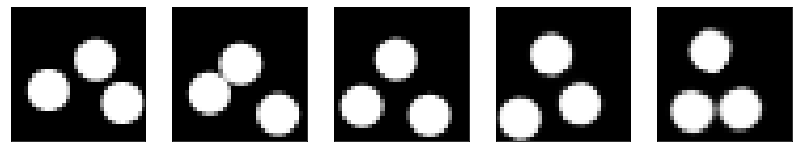

GD iterations:
i=0 | err=55.854874
i=1 | err=54.682899
i=2 | err=53.121677
i=3 | err=51.414986
i=4 | err=49.559162
i=5 | err=47.605007
i=6 | err=45.606773
i=7 | err=43.568592
i=8 | err=41.461296
i=9 | err=39.325722
i=10 | err=37.205177
i=11 | err=35.115479
i=12 | err=33.074821
i=13 | err=31.009367
i=14 | err=28.968685
i=15 | err=26.983772
i=16 | err=25.049690
i=17 | err=23.256157
i=18 | err=21.615685
i=19 | err=20.044029
i=20 | err=18.572754
i=21 | err=17.157381
i=22 | err=15.850552
i=23 | err=14.575731
i=24 | err=13.413259
i=25 | err=12.287918
i=26 | err=11.203808
i=27 | err=10.204344
i=28 | err=9.279745
i=29 | err=8.384296
Epoch=260 (44%) | out_positive=0.846460 | out_negative=0.079606 | mse=0.071363


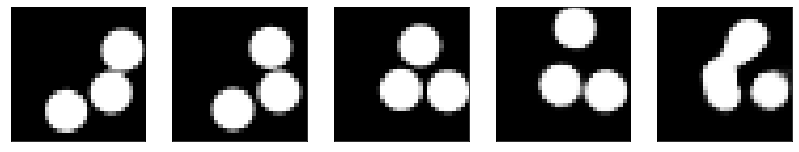

GD iterations:
i=0 | err=52.631588
i=1 | err=51.443748
i=2 | err=49.756485
i=3 | err=47.931343
i=4 | err=46.065868
i=5 | err=44.095749
i=6 | err=42.048653
i=7 | err=40.009243
i=8 | err=37.937386
i=9 | err=35.811287
i=10 | err=33.691109
i=11 | err=31.604313
i=12 | err=29.587090
i=13 | err=27.683681
i=14 | err=25.833017
i=15 | err=24.036282
i=16 | err=22.330393
i=17 | err=20.626772
i=18 | err=18.988686
i=19 | err=17.460106
i=20 | err=16.002560
i=21 | err=14.723457
i=22 | err=13.545211
i=23 | err=12.418560
i=24 | err=11.385474
i=25 | err=10.410881
i=26 | err=9.462131
i=27 | err=8.619701
i=28 | err=7.806760
i=29 | err=7.035229
Epoch=260 (46%) | out_positive=0.886467 | out_negative=0.138195 | mse=0.070766


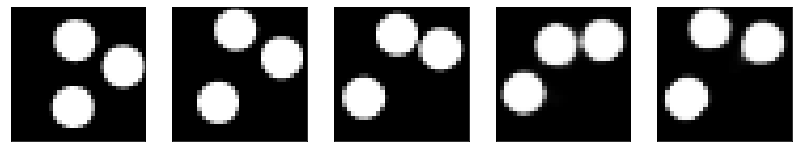

GD iterations:
i=0 | err=51.511963
i=1 | err=50.342751
i=2 | err=48.676010
i=3 | err=46.897354
i=4 | err=45.022598
i=5 | err=43.138088
i=6 | err=41.215645
i=7 | err=39.203751
i=8 | err=37.112934
i=9 | err=35.027184
i=10 | err=32.895607
i=11 | err=30.827847
i=12 | err=28.823063
i=13 | err=26.862026
i=14 | err=24.915594
i=15 | err=23.006964
i=16 | err=21.206875
i=17 | err=19.561993
i=18 | err=18.030983
i=19 | err=16.618011
i=20 | err=15.286043
i=21 | err=14.008057
i=22 | err=12.813269
i=23 | err=11.725470
i=24 | err=10.683577
i=25 | err=9.714645
i=26 | err=8.826566
i=27 | err=7.970157
i=28 | err=7.163242
i=29 | err=6.401779
Epoch=260 (48%) | out_positive=0.921216 | out_negative=0.212069 | mse=0.070700


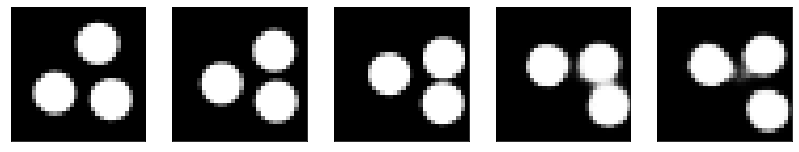

GD iterations:
i=0 | err=54.612625
i=1 | err=53.314606
i=2 | err=51.556641
i=3 | err=49.573601
i=4 | err=47.482895
i=5 | err=45.355370
i=6 | err=43.203079
i=7 | err=40.958405
i=8 | err=38.669525
i=9 | err=36.330284
i=10 | err=34.001244
i=11 | err=31.707041
i=12 | err=29.522717
i=13 | err=27.423395
i=14 | err=25.478527
i=15 | err=23.718075
i=16 | err=22.022335
i=17 | err=20.394159
i=18 | err=18.823526
i=19 | err=17.328884
i=20 | err=15.964936
i=21 | err=14.732908
i=22 | err=13.609678
i=23 | err=12.542955
i=24 | err=11.551023
i=25 | err=10.663450
i=26 | err=9.839046
i=27 | err=9.031088
i=28 | err=8.252002
i=29 | err=7.517909
Epoch=260 (50%) | out_positive=0.903815 | out_negative=0.089555 | mse=0.074903


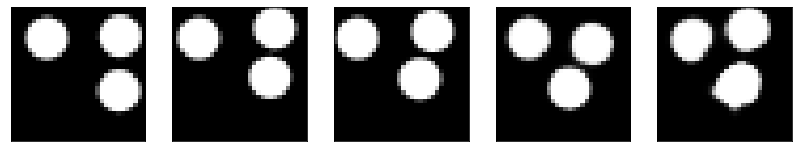

GD iterations:
i=0 | err=53.894020
i=1 | err=52.723305
i=2 | err=51.158051
i=3 | err=49.365017
i=4 | err=47.453876
i=5 | err=45.379021
i=6 | err=43.211330
i=7 | err=41.011765
i=8 | err=38.806370
i=9 | err=36.606697
i=10 | err=34.443844
i=11 | err=32.258709
i=12 | err=30.205526
i=13 | err=28.330505
i=14 | err=26.463810
i=15 | err=24.665108
i=16 | err=22.933178
i=17 | err=21.246227
i=18 | err=19.643803
i=19 | err=18.159361
i=20 | err=16.761972
i=21 | err=15.417489
i=22 | err=14.159812
i=23 | err=13.037865
i=24 | err=11.981341
i=25 | err=10.981886
i=26 | err=10.068633
i=27 | err=9.210062
i=28 | err=8.379608
i=29 | err=7.621257
Epoch=260 (52%) | out_positive=0.905116 | out_negative=0.106606 | mse=0.074552


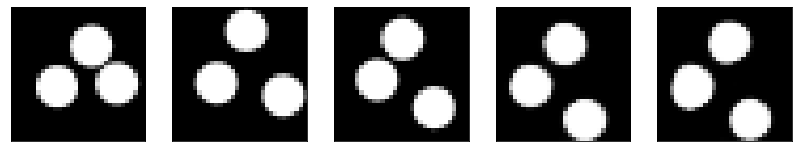

GD iterations:
i=0 | err=58.923752
i=1 | err=57.730629
i=2 | err=55.981102
i=3 | err=54.053722
i=4 | err=52.045818
i=5 | err=49.930435
i=6 | err=47.778454
i=7 | err=45.501038
i=8 | err=43.260937
i=9 | err=40.936516
i=10 | err=38.575974
i=11 | err=36.218456
i=12 | err=33.939743
i=13 | err=31.760866
i=14 | err=29.641994
i=15 | err=27.673729
i=16 | err=25.781321
i=17 | err=23.941658
i=18 | err=22.164162
i=19 | err=20.501575
i=20 | err=18.920128
i=21 | err=17.388372
i=22 | err=15.981810
i=23 | err=14.654570
i=24 | err=13.400854
i=25 | err=12.257492
i=26 | err=11.160970
i=27 | err=10.154386
i=28 | err=9.197168
i=29 | err=8.289421
Epoch=260 (53%) | out_positive=0.790863 | out_negative=0.107589 | mse=0.073227


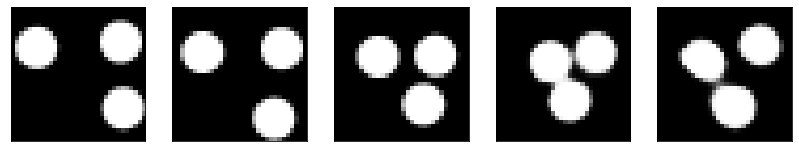

GD iterations:
i=0 | err=57.960644
i=1 | err=56.824875
i=2 | err=55.179718
i=3 | err=53.354813
i=4 | err=51.389107
i=5 | err=49.355850
i=6 | err=47.246834
i=7 | err=45.016586
i=8 | err=42.586746
i=9 | err=40.090103
i=10 | err=37.612030
i=11 | err=35.171921
i=12 | err=32.676064
i=13 | err=30.238819
i=14 | err=27.853624
i=15 | err=25.636982
i=16 | err=23.588480
i=17 | err=21.686443
i=18 | err=19.889793
i=19 | err=18.195255
i=20 | err=16.640736
i=21 | err=15.195484
i=22 | err=13.892580
i=23 | err=12.687458
i=24 | err=11.548112
i=25 | err=10.482399
i=26 | err=9.484520
i=27 | err=8.553315
i=28 | err=7.696611
i=29 | err=6.873164
Epoch=260 (55%) | out_positive=0.920611 | out_negative=0.125755 | mse=0.072478


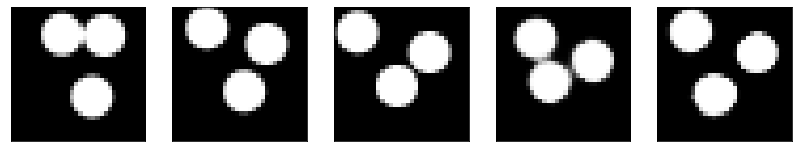

GD iterations:
i=0 | err=52.836220
i=1 | err=51.547714
i=2 | err=49.776012
i=3 | err=47.743889
i=4 | err=45.518608
i=5 | err=43.313774
i=6 | err=41.093819
i=7 | err=38.797096
i=8 | err=36.461098
i=9 | err=34.128654
i=10 | err=31.743710
i=11 | err=29.381876
i=12 | err=27.106352
i=13 | err=24.938711
i=14 | err=22.887043
i=15 | err=20.964283
i=16 | err=19.125343
i=17 | err=17.400951
i=18 | err=15.798092
i=19 | err=14.330881
i=20 | err=13.043913
i=21 | err=11.883741
i=22 | err=10.850583
i=23 | err=9.905699
i=24 | err=9.031910
i=25 | err=8.216677
i=26 | err=7.439382
i=27 | err=6.707940
i=28 | err=6.028669
i=29 | err=5.385906
Epoch=260 (57%) | out_positive=0.881674 | out_negative=0.147150 | mse=0.071794


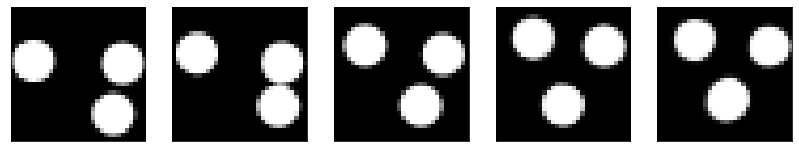

GD iterations:
i=0 | err=57.526855
i=1 | err=56.357620
i=2 | err=54.689617
i=3 | err=52.817085
i=4 | err=50.822807
i=5 | err=48.684605
i=6 | err=46.498589
i=7 | err=44.252197
i=8 | err=41.888161
i=9 | err=39.505276
i=10 | err=37.089413
i=11 | err=34.752808
i=12 | err=32.500084
i=13 | err=30.324875
i=14 | err=28.230091
i=15 | err=26.195620
i=16 | err=24.220181
i=17 | err=22.330544
i=18 | err=20.574463
i=19 | err=18.961851
i=20 | err=17.508711
i=21 | err=16.104481
i=22 | err=14.797037
i=23 | err=13.574940
i=24 | err=12.440775
i=25 | err=11.351079
i=26 | err=10.338551
i=27 | err=9.402937
i=28 | err=8.544422
i=29 | err=7.718359
Epoch=260 (59%) | out_positive=0.817862 | out_negative=0.097399 | mse=0.071945


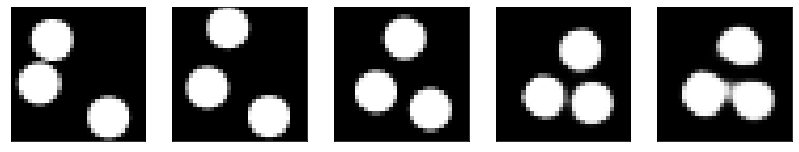

GD iterations:
i=0 | err=55.014923
i=1 | err=53.821152
i=2 | err=52.092190
i=3 | err=50.216946
i=4 | err=48.271919
i=5 | err=46.328800
i=6 | err=44.284260
i=7 | err=42.204311
i=8 | err=40.005333
i=9 | err=37.734772
i=10 | err=35.435699
i=11 | err=33.138252
i=12 | err=30.828197
i=13 | err=28.691833
i=14 | err=26.560028
i=15 | err=24.479336
i=16 | err=22.519058
i=17 | err=20.767784
i=18 | err=19.201653
i=19 | err=17.788797
i=20 | err=16.434803
i=21 | err=15.120772
i=22 | err=13.859417
i=23 | err=12.745583
i=24 | err=11.684849
i=25 | err=10.665366
i=26 | err=9.693043
i=27 | err=8.770700
i=28 | err=7.928291
i=29 | err=7.121060
Epoch=260 (60%) | out_positive=0.874889 | out_negative=0.106647 | mse=0.067300


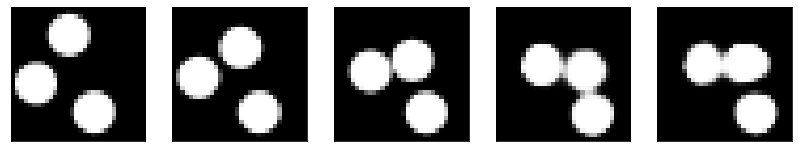

GD iterations:
i=0 | err=52.882900
i=1 | err=51.793468
i=2 | err=50.228649
i=3 | err=48.409847
i=4 | err=46.505199
i=5 | err=44.553452
i=6 | err=42.574608
i=7 | err=40.547764
i=8 | err=38.617096
i=9 | err=36.620834
i=10 | err=34.540657
i=11 | err=32.507202
i=12 | err=30.507145
i=13 | err=28.600254
i=14 | err=26.791323
i=15 | err=25.023804
i=16 | err=23.345694
i=17 | err=21.756569
i=18 | err=20.217682
i=19 | err=18.679213
i=20 | err=17.195377
i=21 | err=15.806702
i=22 | err=14.561064
i=23 | err=13.428399
i=24 | err=12.314316
i=25 | err=11.268948
i=26 | err=10.316201
i=27 | err=9.414968
i=28 | err=8.600561
i=29 | err=7.837752
Epoch=260 (62%) | out_positive=0.897579 | out_negative=0.105940 | mse=0.074842


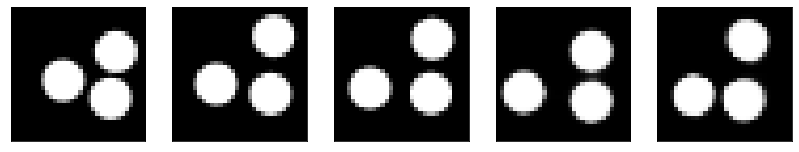

GD iterations:
i=0 | err=55.594761
i=1 | err=54.401596
i=2 | err=52.764099
i=3 | err=50.999096
i=4 | err=49.031357
i=5 | err=46.870029
i=6 | err=44.687130
i=7 | err=42.491276
i=8 | err=40.204174
i=9 | err=37.990730
i=10 | err=35.803570
i=11 | err=33.584435
i=12 | err=31.419842
i=13 | err=29.363182
i=14 | err=27.394817
i=15 | err=25.471149
i=16 | err=23.654331
i=17 | err=21.928070
i=18 | err=20.208498
i=19 | err=18.560816
i=20 | err=16.986637
i=21 | err=15.561125
i=22 | err=14.256829
i=23 | err=13.034153
i=24 | err=11.865971
i=25 | err=10.829775
i=26 | err=9.854288
i=27 | err=8.901495
i=28 | err=8.004780
i=29 | err=7.159514
Epoch=260 (64%) | out_positive=0.781505 | out_negative=0.118795 | mse=0.065409


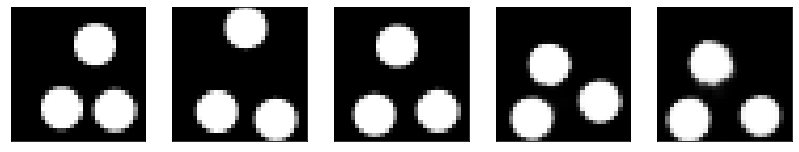

GD iterations:
i=0 | err=52.657814
i=1 | err=51.457909
i=2 | err=49.755505
i=3 | err=47.912193
i=4 | err=46.023956
i=5 | err=44.050529
i=6 | err=42.089951
i=7 | err=40.065544
i=8 | err=38.056240
i=9 | err=35.958920
i=10 | err=33.913170
i=11 | err=31.903149
i=12 | err=29.915083
i=13 | err=27.956045
i=14 | err=26.071026
i=15 | err=24.173183
i=16 | err=22.343750
i=17 | err=20.569595
i=18 | err=18.806461
i=19 | err=17.166950
i=20 | err=15.616395
i=21 | err=14.209053
i=22 | err=12.895726
i=23 | err=11.687524
i=24 | err=10.495740
i=25 | err=9.414957
i=26 | err=8.415091
i=27 | err=7.494757
i=28 | err=6.680544
i=29 | err=5.897526
Epoch=260 (65%) | out_positive=0.931252 | out_negative=0.154321 | mse=0.073634


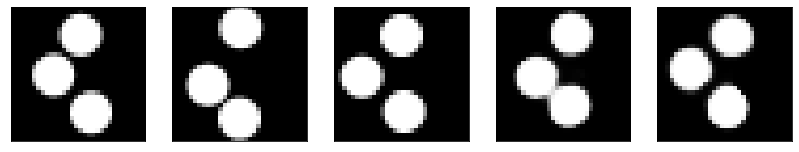

GD iterations:
i=0 | err=57.176945
i=1 | err=55.840416
i=2 | err=54.092583
i=3 | err=52.163734
i=4 | err=50.200661
i=5 | err=48.127937
i=6 | err=46.012688
i=7 | err=43.818489
i=8 | err=41.491184
i=9 | err=39.165787
i=10 | err=36.875549
i=11 | err=34.603607
i=12 | err=32.305130
i=13 | err=29.979366
i=14 | err=27.665430
i=15 | err=25.478130
i=16 | err=23.371195
i=17 | err=21.415268
i=18 | err=19.608072
i=19 | err=17.960197
i=20 | err=16.458164
i=21 | err=15.031967
i=22 | err=13.700691
i=23 | err=12.472519
i=24 | err=11.319736
i=25 | err=10.242208
i=26 | err=9.197580
i=27 | err=8.198051
i=28 | err=7.248042
i=29 | err=6.350004
Epoch=260 (67%) | out_positive=0.912975 | out_negative=0.200296 | mse=0.066840


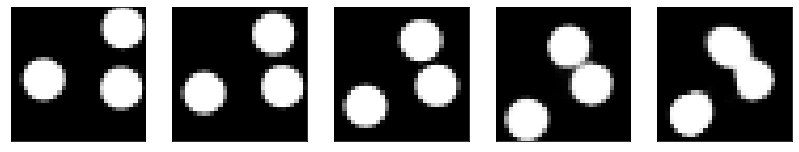

GD iterations:
i=0 | err=59.530830
i=1 | err=58.235321
i=2 | err=56.389328
i=3 | err=54.389961
i=4 | err=52.257889
i=5 | err=50.134457
i=6 | err=47.934174
i=7 | err=45.628113
i=8 | err=43.183578
i=9 | err=40.725403
i=10 | err=38.170021
i=11 | err=35.673119
i=12 | err=33.246155
i=13 | err=30.853489
i=14 | err=28.516653
i=15 | err=26.319736
i=16 | err=24.251270
i=17 | err=22.375648
i=18 | err=20.593903
i=19 | err=18.958885
i=20 | err=17.411659
i=21 | err=15.962595
i=22 | err=14.618580
i=23 | err=13.389055
i=24 | err=12.266043
i=25 | err=11.214571
i=26 | err=10.238537
i=27 | err=9.360633
i=28 | err=8.513464
i=29 | err=7.697997
Epoch=260 (69%) | out_positive=0.876688 | out_negative=0.121427 | mse=0.071320


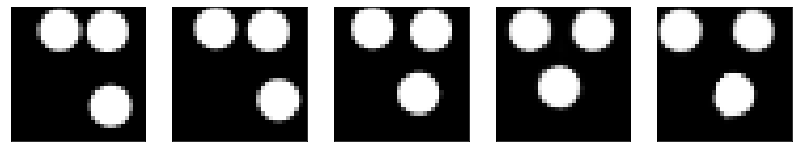

GD iterations:
i=0 | err=54.652168
i=1 | err=53.467560
i=2 | err=51.752647
i=3 | err=49.913456
i=4 | err=47.877045
i=5 | err=45.720631
i=6 | err=43.542252
i=7 | err=41.326744
i=8 | err=39.042809
i=9 | err=36.718842
i=10 | err=34.442528
i=11 | err=32.200214
i=12 | err=30.018978
i=13 | err=27.869898
i=14 | err=25.789536
i=15 | err=23.855602
i=16 | err=21.947880
i=17 | err=20.189705
i=18 | err=18.557816
i=19 | err=17.055882
i=20 | err=15.609339
i=21 | err=14.304046
i=22 | err=13.052828
i=23 | err=11.897623
i=24 | err=10.778219
i=25 | err=9.743316
i=26 | err=8.777719
i=27 | err=7.888096
i=28 | err=7.071937
i=29 | err=6.313868
Epoch=260 (71%) | out_positive=0.845787 | out_negative=0.125820 | mse=0.067101


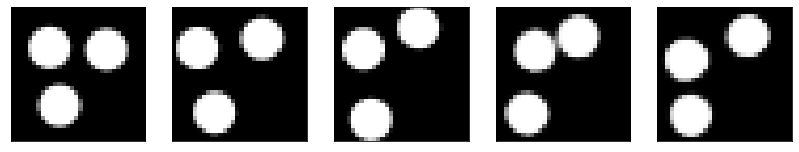

GD iterations:
i=0 | err=56.950905
i=1 | err=55.724365
i=2 | err=54.133949
i=3 | err=52.364975
i=4 | err=50.449883
i=5 | err=48.441399
i=6 | err=46.405159
i=7 | err=44.342033
i=8 | err=42.303013
i=9 | err=40.165245
i=10 | err=37.942398
i=11 | err=35.645172
i=12 | err=33.324070
i=13 | err=31.174841
i=14 | err=29.077856
i=15 | err=27.039988
i=16 | err=25.108130
i=17 | err=23.266411
i=18 | err=21.563118
i=19 | err=19.912781
i=20 | err=18.324806
i=21 | err=16.791655
i=22 | err=15.375747
i=23 | err=14.050940
i=24 | err=12.779446
i=25 | err=11.569033
i=26 | err=10.393527
i=27 | err=9.284801
i=28 | err=8.263983
i=29 | err=7.320855
Epoch=260 (73%) | out_positive=0.814450 | out_negative=0.124126 | mse=0.065606


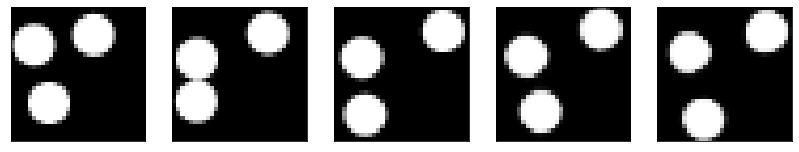

GD iterations:
i=0 | err=53.567986
i=1 | err=52.281654
i=2 | err=50.554081
i=3 | err=48.695435
i=4 | err=46.832893
i=5 | err=44.921600
i=6 | err=42.953110
i=7 | err=41.008209
i=8 | err=39.036022
i=9 | err=37.042122
i=10 | err=35.094936
i=11 | err=33.136307
i=12 | err=31.252592
i=13 | err=29.381050
i=14 | err=27.552422
i=15 | err=25.743212
i=16 | err=23.990881
i=17 | err=22.307945
i=18 | err=20.675102
i=19 | err=19.140533
i=20 | err=17.664551
i=21 | err=16.256020
i=22 | err=14.923047
i=23 | err=13.621275
i=24 | err=12.415475
i=25 | err=11.277317
i=26 | err=10.217363
i=27 | err=9.246790
i=28 | err=8.328952
i=29 | err=7.490396
Epoch=260 (75%) | out_positive=0.888134 | out_negative=0.090006 | mse=0.074354


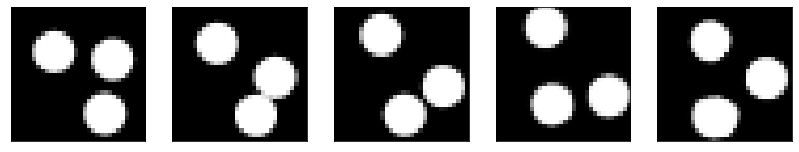

GD iterations:
i=0 | err=55.028591
i=1 | err=53.922264
i=2 | err=52.319202
i=3 | err=50.539062
i=4 | err=48.739166
i=5 | err=46.886501
i=6 | err=44.945713
i=7 | err=42.800285
i=8 | err=40.711441
i=9 | err=38.491272
i=10 | err=36.344097
i=11 | err=34.255875
i=12 | err=32.265152
i=13 | err=30.320402
i=14 | err=28.379326
i=15 | err=26.464859
i=16 | err=24.645082
i=17 | err=22.808189
i=18 | err=21.108810
i=19 | err=19.547295
i=20 | err=18.089146
i=21 | err=16.751408
i=22 | err=15.470134
i=23 | err=14.242389
i=24 | err=13.100863
i=25 | err=11.985390
i=26 | err=10.961309
i=27 | err=9.989459
i=28 | err=9.064045
i=29 | err=8.182716
Epoch=260 (77%) | out_positive=0.906866 | out_negative=0.103172 | mse=0.076111


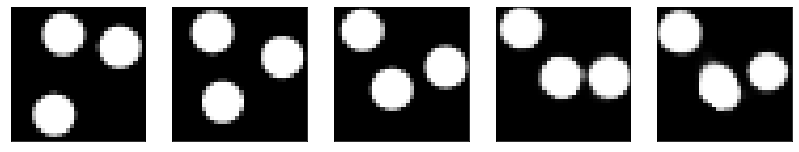

GD iterations:
i=0 | err=56.469631
i=1 | err=55.264091
i=2 | err=53.588394
i=3 | err=51.666191
i=4 | err=49.678135
i=5 | err=47.549934
i=6 | err=45.344757
i=7 | err=43.054642
i=8 | err=40.587601
i=9 | err=38.038216
i=10 | err=35.563679
i=11 | err=33.090431
i=12 | err=30.702213
i=13 | err=28.370243
i=14 | err=26.257534
i=15 | err=24.287971
i=16 | err=22.492950
i=17 | err=20.761906
i=18 | err=19.130745
i=19 | err=17.601013
i=20 | err=16.181566
i=21 | err=14.902912
i=22 | err=13.679790
i=23 | err=12.554016
i=24 | err=11.487291
i=25 | err=10.499296
i=26 | err=9.518567
i=27 | err=8.585445
i=28 | err=7.720401
i=29 | err=6.905976
Epoch=260 (78%) | out_positive=0.863942 | out_negative=0.120051 | mse=0.069393


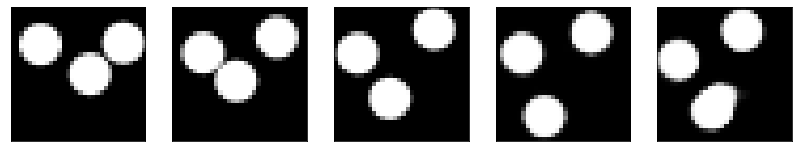

GD iterations:
i=0 | err=53.281837
i=1 | err=51.907463
i=2 | err=50.077499
i=3 | err=48.134575
i=4 | err=46.045113
i=5 | err=43.890339
i=6 | err=41.770657
i=7 | err=39.619141
i=8 | err=37.407600
i=9 | err=35.287750
i=10 | err=33.207741
i=11 | err=31.162441
i=12 | err=29.128834
i=13 | err=27.184101
i=14 | err=25.328747
i=15 | err=23.544510
i=16 | err=21.792370
i=17 | err=20.198723
i=18 | err=18.684914
i=19 | err=17.247414
i=20 | err=15.938841
i=21 | err=14.707415
i=22 | err=13.528745
i=23 | err=12.439602
i=24 | err=11.425044
i=25 | err=10.456112
i=26 | err=9.520515
i=27 | err=8.654091
i=28 | err=7.821774
i=29 | err=7.066620
Epoch=260 (80%) | out_positive=0.879805 | out_negative=0.121787 | mse=0.067834


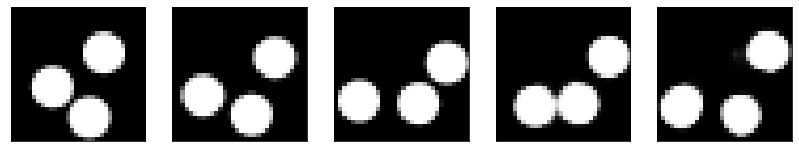

GD iterations:
i=0 | err=54.812187
i=1 | err=53.571342
i=2 | err=51.907749
i=3 | err=49.978920
i=4 | err=47.864586
i=5 | err=45.661114
i=6 | err=43.340206
i=7 | err=41.040459
i=8 | err=38.767403
i=9 | err=36.414326
i=10 | err=34.136620
i=11 | err=31.825462
i=12 | err=29.565763
i=13 | err=27.368664
i=14 | err=25.315750
i=15 | err=23.389839
i=16 | err=21.553661
i=17 | err=19.832603
i=18 | err=18.213749
i=19 | err=16.631916
i=20 | err=15.186654
i=21 | err=13.888170
i=22 | err=12.671550
i=23 | err=11.553730
i=24 | err=10.464348
i=25 | err=9.442526
i=26 | err=8.490732
i=27 | err=7.637527
i=28 | err=6.805505
i=29 | err=6.025142
Epoch=260 (82%) | out_positive=0.923603 | out_negative=0.162176 | mse=0.073392


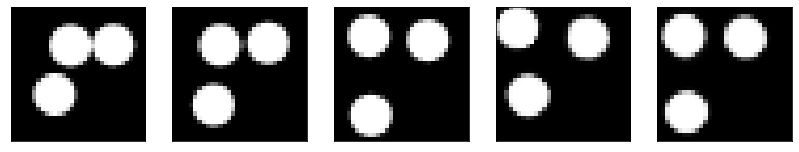

GD iterations:
i=0 | err=54.212563
i=1 | err=52.934559
i=2 | err=51.221176
i=3 | err=49.338348
i=4 | err=47.319771
i=5 | err=45.222221
i=6 | err=43.075180
i=7 | err=40.861588
i=8 | err=38.638062
i=9 | err=36.426285
i=10 | err=34.254219
i=11 | err=32.073906
i=12 | err=29.897522
i=13 | err=27.858725
i=14 | err=25.870167
i=15 | err=24.028522
i=16 | err=22.363077
i=17 | err=20.767427
i=18 | err=19.257778
i=19 | err=17.795357
i=20 | err=16.383041
i=21 | err=15.063852
i=22 | err=13.788217
i=23 | err=12.653490
i=24 | err=11.595164
i=25 | err=10.634140
i=26 | err=9.763161
i=27 | err=8.934051
i=28 | err=8.115231
i=29 | err=7.332166
Epoch=260 (84%) | out_positive=0.921001 | out_negative=0.109651 | mse=0.069449


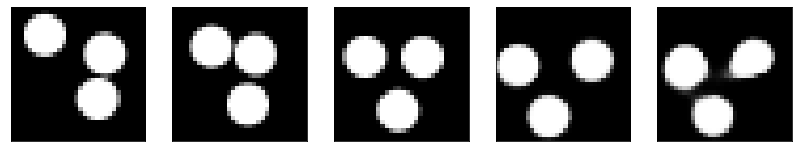

GD iterations:
i=0 | err=56.366409
i=1 | err=55.061249
i=2 | err=53.358509
i=3 | err=51.433231
i=4 | err=49.386051
i=5 | err=47.243866
i=6 | err=45.036789
i=7 | err=42.764194
i=8 | err=40.485954
i=9 | err=38.102489
i=10 | err=35.774158
i=11 | err=33.429520
i=12 | err=31.174582
i=13 | err=29.045742
i=14 | err=27.061922
i=15 | err=25.230442
i=16 | err=23.462040
i=17 | err=21.800339
i=18 | err=20.220310
i=19 | err=18.709244
i=20 | err=17.235031
i=21 | err=15.805519
i=22 | err=14.489338
i=23 | err=13.316442
i=24 | err=12.217667
i=25 | err=11.197739
i=26 | err=10.241929
i=27 | err=9.336301
i=28 | err=8.509182
i=29 | err=7.724234
Epoch=260 (86%) | out_positive=0.838674 | out_negative=0.087513 | mse=0.072328


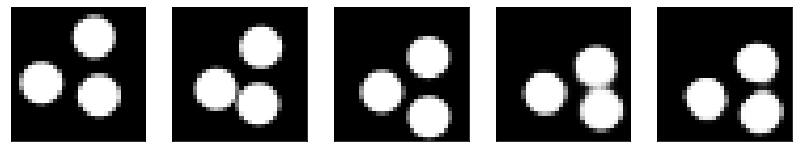

GD iterations:
i=0 | err=53.444321
i=1 | err=52.181068
i=2 | err=50.459259
i=3 | err=48.590118
i=4 | err=46.552368
i=5 | err=44.503319
i=6 | err=42.345886
i=7 | err=40.101547
i=8 | err=37.723465
i=9 | err=35.391506
i=10 | err=33.120815
i=11 | err=30.971766
i=12 | err=28.943827
i=13 | err=27.021912
i=14 | err=25.190697
i=15 | err=23.459801
i=16 | err=21.871578
i=17 | err=20.428055
i=18 | err=19.081110
i=19 | err=17.776360
i=20 | err=16.486706
i=21 | err=15.201420
i=22 | err=13.988056
i=23 | err=12.851761
i=24 | err=11.753326
i=25 | err=10.743616
i=26 | err=9.797053
i=27 | err=8.921443
i=28 | err=8.083899
i=29 | err=7.275375
Epoch=260 (88%) | out_positive=0.886377 | out_negative=0.113187 | mse=0.075400


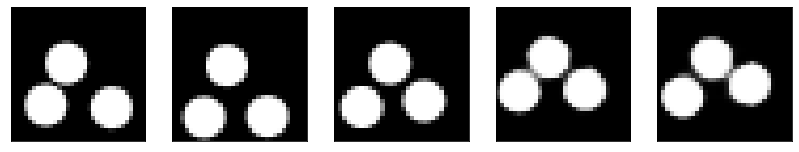

GD iterations:
i=0 | err=55.951714
i=1 | err=54.757122
i=2 | err=53.090813
i=3 | err=51.259995
i=4 | err=49.360424
i=5 | err=47.358223
i=6 | err=45.150597
i=7 | err=42.842312
i=8 | err=40.405830
i=9 | err=37.998505
i=10 | err=35.643105
i=11 | err=33.309700
i=12 | err=31.004688
i=13 | err=28.879581
i=14 | err=26.842253
i=15 | err=24.858002
i=16 | err=22.954126
i=17 | err=21.155521
i=18 | err=19.509789
i=19 | err=18.003618
i=20 | err=16.588890
i=21 | err=15.276566
i=22 | err=14.080324
i=23 | err=12.936638
i=24 | err=11.846120
i=25 | err=10.773123
i=26 | err=9.774204
i=27 | err=8.820313
i=28 | err=7.947152
i=29 | err=7.113351
Epoch=260 (89%) | out_positive=0.902572 | out_negative=0.130362 | mse=0.073449


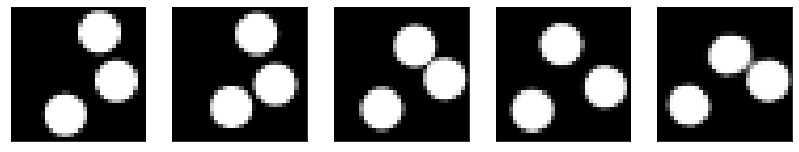

GD iterations:
i=0 | err=56.382080
i=1 | err=55.164032
i=2 | err=53.482876
i=3 | err=51.561508
i=4 | err=49.476761
i=5 | err=47.399372
i=6 | err=45.215523
i=7 | err=42.938622
i=8 | err=40.649967
i=9 | err=38.248638
i=10 | err=35.844414
i=11 | err=33.539955
i=12 | err=31.266382
i=13 | err=28.910275
i=14 | err=26.642078
i=15 | err=24.604549
i=16 | err=22.748270
i=17 | err=21.043402
i=18 | err=19.399323
i=19 | err=17.879456
i=20 | err=16.387522
i=21 | err=14.974197
i=22 | err=13.643080
i=23 | err=12.438799
i=24 | err=11.363720
i=25 | err=10.417042
i=26 | err=9.536373
i=27 | err=8.727489
i=28 | err=7.975990
i=29 | err=7.234430
Epoch=260 (91%) | out_positive=0.838439 | out_negative=0.105139 | mse=0.072916


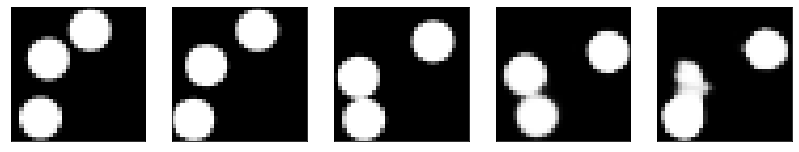

GD iterations:
i=0 | err=58.819763
i=1 | err=57.636147
i=2 | err=55.877258
i=3 | err=53.937065
i=4 | err=51.914497
i=5 | err=49.757645
i=6 | err=47.486511
i=7 | err=45.172165
i=8 | err=42.834740
i=9 | err=40.471878
i=10 | err=37.957848
i=11 | err=35.422981
i=12 | err=32.942238
i=13 | err=30.471836
i=14 | err=28.098785
i=15 | err=25.835026
i=16 | err=23.728609
i=17 | err=21.763973
i=18 | err=19.971632
i=19 | err=18.272522
i=20 | err=16.695129
i=21 | err=15.255124
i=22 | err=13.881318
i=23 | err=12.556471
i=24 | err=11.345469
i=25 | err=10.194164
i=26 | err=9.163523
i=27 | err=8.165472
i=28 | err=7.255658
i=29 | err=6.402746
Epoch=260 (93%) | out_positive=0.834049 | out_negative=0.140877 | mse=0.070729


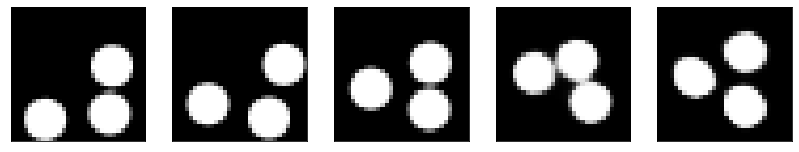

GD iterations:
i=0 | err=58.295139
i=1 | err=57.053238
i=2 | err=55.310368
i=3 | err=53.394028
i=4 | err=51.306751
i=5 | err=49.158871
i=6 | err=46.873631
i=7 | err=44.443840
i=8 | err=41.981499
i=9 | err=39.467709
i=10 | err=36.904854
i=11 | err=34.418568
i=12 | err=32.004414
i=13 | err=29.723000
i=14 | err=27.613132
i=15 | err=25.569681
i=16 | err=23.677818
i=17 | err=21.943909
i=18 | err=20.341370
i=19 | err=18.796127
i=20 | err=17.348095
i=21 | err=15.987072
i=22 | err=14.732517
i=23 | err=13.583996
i=24 | err=12.545959
i=25 | err=11.548203
i=26 | err=10.579149
i=27 | err=9.636448
i=28 | err=8.786265
i=29 | err=7.965352
Epoch=260 (95%) | out_positive=0.850135 | out_negative=0.080822 | mse=0.072908


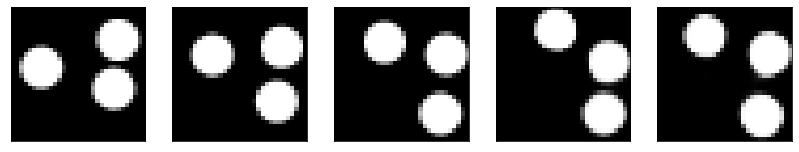

GD iterations:
i=0 | err=52.360039
i=1 | err=51.112995
i=2 | err=49.435577
i=3 | err=47.560204
i=4 | err=45.596550
i=5 | err=43.584911
i=6 | err=41.520943
i=7 | err=39.353592
i=8 | err=37.131523
i=9 | err=34.935890
i=10 | err=32.813148
i=11 | err=30.742525
i=12 | err=28.766508
i=13 | err=26.798672
i=14 | err=24.907238
i=15 | err=23.055794
i=16 | err=21.346149
i=17 | err=19.806263
i=18 | err=18.330904
i=19 | err=16.924973
i=20 | err=15.528266
i=21 | err=14.274508
i=22 | err=13.099935
i=23 | err=12.044218
i=24 | err=11.096283
i=25 | err=10.202075
i=26 | err=9.334398
i=27 | err=8.529864
i=28 | err=7.769246
i=29 | err=7.034440
Epoch=260 (97%) | out_positive=0.886538 | out_negative=0.119787 | mse=0.077463


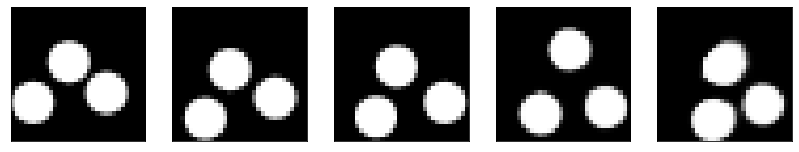

GD iterations:
i=0 | err=54.517128
i=1 | err=53.345871
i=2 | err=51.661617
i=3 | err=49.755589
i=4 | err=47.724617
i=5 | err=45.597862
i=6 | err=43.435539
i=7 | err=41.246353
i=8 | err=39.042973
i=9 | err=36.890903
i=10 | err=34.755508
i=11 | err=32.647263
i=12 | err=30.613167
i=13 | err=28.588831
i=14 | err=26.675970
i=15 | err=24.845585
i=16 | err=23.094461
i=17 | err=21.436886
i=18 | err=19.815853
i=19 | err=18.203136
i=20 | err=16.662508
i=21 | err=15.220235
i=22 | err=13.937989
i=23 | err=12.709341
i=24 | err=11.584116
i=25 | err=10.528620
i=26 | err=9.580388
i=27 | err=8.670563
i=28 | err=7.840322
i=29 | err=7.059857
Epoch=260 (99%) | out_positive=0.837406 | out_negative=0.115123 | mse=0.073048


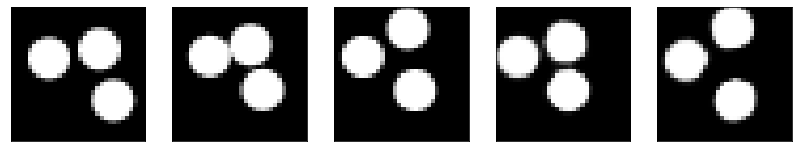

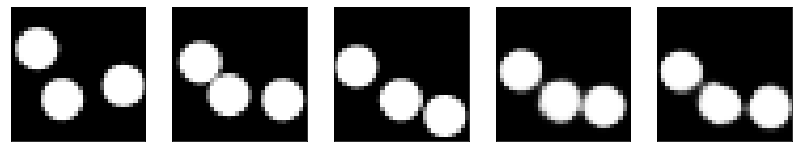

Test MSE 0.078818


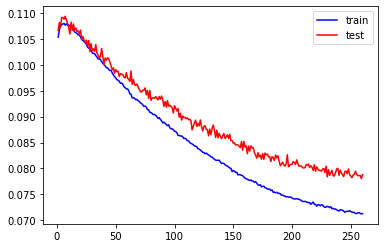

Model Saved.
GD iterations:
i=0 | err=52.985672
i=1 | err=51.824894
i=2 | err=50.170265
i=3 | err=48.270477
i=4 | err=46.272854
i=5 | err=44.289429
i=6 | err=42.242859
i=7 | err=40.227451
i=8 | err=38.199959
i=9 | err=36.200726
i=10 | err=34.260490
i=11 | err=32.279194
i=12 | err=30.378838
i=13 | err=28.551554
i=14 | err=26.789272
i=15 | err=25.064880
i=16 | err=23.428219
i=17 | err=21.814978
i=18 | err=20.268974
i=19 | err=18.789410
i=20 | err=17.392149
i=21 | err=16.103065
i=22 | err=14.879870
i=23 | err=13.748968
i=24 | err=12.706121
i=25 | err=11.706491
i=26 | err=10.754890
i=27 | err=9.848571
i=28 | err=8.991495
i=29 | err=8.201179
Epoch=261 (0%) | out_positive=0.891612 | out_negative=0.096487 | mse=0.072199


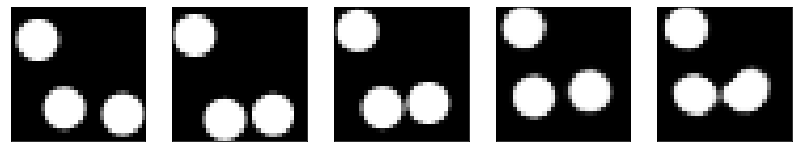

GD iterations:
i=0 | err=56.042850
i=1 | err=54.772476
i=2 | err=52.991295
i=3 | err=51.049622
i=4 | err=48.912895
i=5 | err=46.714676
i=6 | err=44.487762
i=7 | err=42.116470
i=8 | err=39.772949
i=9 | err=37.386135
i=10 | err=35.011353
i=11 | err=32.653198
i=12 | err=30.382923
i=13 | err=28.266518
i=14 | err=26.204189
i=15 | err=24.247566
i=16 | err=22.371662
i=17 | err=20.574938
i=18 | err=18.907433
i=19 | err=17.376221
i=20 | err=15.954470
i=21 | err=14.596471
i=22 | err=13.305271
i=23 | err=12.120065
i=24 | err=10.993182
i=25 | err=9.936235
i=26 | err=8.947717
i=27 | err=7.999530
i=28 | err=7.139925
i=29 | err=6.336095
Epoch=261 (2%) | out_positive=0.869978 | out_negative=0.141080 | mse=0.075463


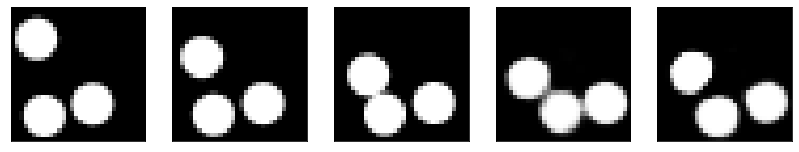

GD iterations:
i=0 | err=54.274483
i=1 | err=53.198788
i=2 | err=51.745277
i=3 | err=49.995605
i=4 | err=48.123932
i=5 | err=46.178200
i=6 | err=44.150574
i=7 | err=42.046776
i=8 | err=39.906250
i=9 | err=37.554344
i=10 | err=35.287659
i=11 | err=32.929398
i=12 | err=30.670065
i=13 | err=28.480827
i=14 | err=26.366982
i=15 | err=24.473640
i=16 | err=22.615988
i=17 | err=20.838539
i=18 | err=19.187553
i=19 | err=17.634190
i=20 | err=16.185106
i=21 | err=14.864908
i=22 | err=13.622794
i=23 | err=12.432009
i=24 | err=11.323489
i=25 | err=10.299759
i=26 | err=9.364596
i=27 | err=8.464929
i=28 | err=7.581566
i=29 | err=6.738087
Epoch=261 (4%) | out_positive=0.892984 | out_negative=0.132706 | mse=0.071567


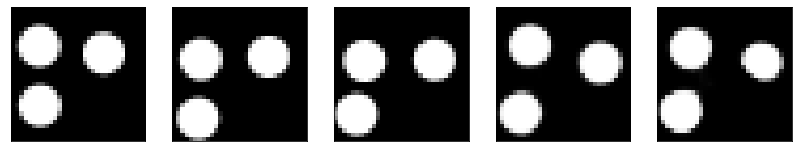

GD iterations:
i=0 | err=55.649834
i=1 | err=54.351372
i=2 | err=52.621403
i=3 | err=50.611717
i=4 | err=48.508751
i=5 | err=46.226501
i=6 | err=43.933098
i=7 | err=41.569828
i=8 | err=39.234962
i=9 | err=36.791847
i=10 | err=34.457481
i=11 | err=32.093685
i=12 | err=29.930994
i=13 | err=27.831936
i=14 | err=25.830311
i=15 | err=23.893969
i=16 | err=22.121021
i=17 | err=20.474892
i=18 | err=18.928082
i=19 | err=17.496952
i=20 | err=16.169250
i=21 | err=14.915934
i=22 | err=13.754049
i=23 | err=12.654261
i=24 | err=11.627842
i=25 | err=10.639263
i=26 | err=9.686953
i=27 | err=8.796814
i=28 | err=7.932091
i=29 | err=7.132896
Epoch=261 (6%) | out_positive=0.851464 | out_negative=0.111763 | mse=0.066533


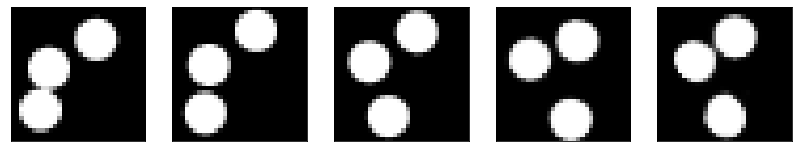

GD iterations:
i=0 | err=56.387905
i=1 | err=55.121391
i=2 | err=53.370384
i=3 | err=51.393982
i=4 | err=49.309998
i=5 | err=47.128773
i=6 | err=44.767170
i=7 | err=42.248653
i=8 | err=39.763985
i=9 | err=37.300583
i=10 | err=34.824707
i=11 | err=32.395988
i=12 | err=30.078274
i=13 | err=27.792759
i=14 | err=25.623531
i=15 | err=23.554199
i=16 | err=21.657385
i=17 | err=19.911289
i=18 | err=18.244125
i=19 | err=16.708725
i=20 | err=15.327021
i=21 | err=14.041912
i=22 | err=12.846546
i=23 | err=11.750031
i=24 | err=10.734657
i=25 | err=9.799910
i=26 | err=8.895489
i=27 | err=8.043921
i=28 | err=7.226301
i=29 | err=6.432805
Epoch=261 (8%) | out_positive=0.930129 | out_negative=0.157482 | mse=0.070680


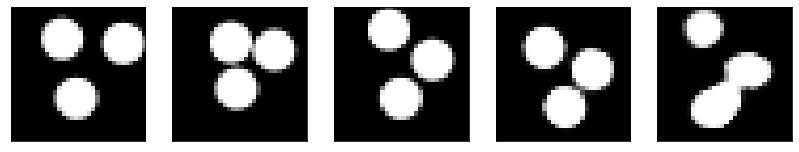

GD iterations:
i=0 | err=54.952911
i=1 | err=53.810261
i=2 | err=52.111328
i=3 | err=50.206074
i=4 | err=48.160416
i=5 | err=46.108643
i=6 | err=43.982239
i=7 | err=41.779228
i=8 | err=39.551048
i=9 | err=37.188667
i=10 | err=34.717136
i=11 | err=32.279224
i=12 | err=29.869959
i=13 | err=27.681389
i=14 | err=25.619854
i=15 | err=23.705540
i=16 | err=21.865093
i=17 | err=20.026630
i=18 | err=18.273001
i=19 | err=16.636837
i=20 | err=15.125270
i=21 | err=13.727085
i=22 | err=12.428355
i=23 | err=11.247458
i=24 | err=10.161097
i=25 | err=9.177665
i=26 | err=8.268456
i=27 | err=7.427621
i=28 | err=6.631404
i=29 | err=5.865592
Epoch=261 (9%) | out_positive=0.898873 | out_negative=0.144398 | mse=0.070496


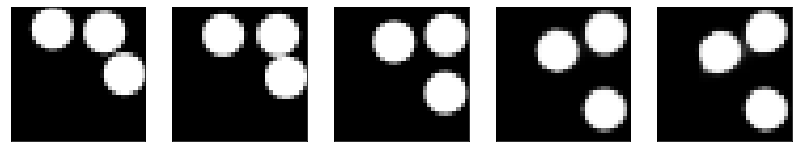

GD iterations:
i=0 | err=51.339699
i=1 | err=50.146160
i=2 | err=48.479210
i=3 | err=46.536213
i=4 | err=44.440491
i=5 | err=42.249424
i=6 | err=39.954643
i=7 | err=37.538864
i=8 | err=35.129250
i=9 | err=32.834995
i=10 | err=30.676332
i=11 | err=28.622868
i=12 | err=26.653633
i=13 | err=24.722984
i=14 | err=22.865469
i=15 | err=21.072208
i=16 | err=19.376904
i=17 | err=17.827127
i=18 | err=16.370876
i=19 | err=15.032401
i=20 | err=13.754409
i=21 | err=12.533835
i=22 | err=11.456748
i=23 | err=10.494637
i=24 | err=9.593314
i=25 | err=8.770931
i=26 | err=7.997696
i=27 | err=7.262286
i=28 | err=6.555745
i=29 | err=5.876220
Epoch=261 (11%) | out_positive=0.906894 | out_negative=0.151601 | mse=0.065423


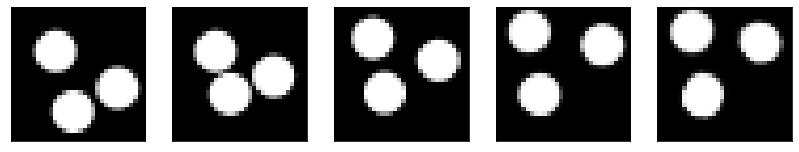

GD iterations:
i=0 | err=56.152042
i=1 | err=54.866302
i=2 | err=53.144318
i=3 | err=51.229942
i=4 | err=49.216850
i=5 | err=47.135941
i=6 | err=45.029743
i=7 | err=42.872505
i=8 | err=40.652737
i=9 | err=38.454563
i=10 | err=36.169426
i=11 | err=33.793243
i=12 | err=31.490719
i=13 | err=29.301014
i=14 | err=27.238707
i=15 | err=25.283911
i=16 | err=23.362984
i=17 | err=21.521175
i=18 | err=19.754541
i=19 | err=18.120277
i=20 | err=16.612347
i=21 | err=15.185904
i=22 | err=13.839113
i=23 | err=12.578318
i=24 | err=11.398710
i=25 | err=10.325125
i=26 | err=9.307518
i=27 | err=8.368878
i=28 | err=7.474546
i=29 | err=6.692382
Epoch=261 (13%) | out_positive=0.860319 | out_negative=0.148407 | mse=0.073101


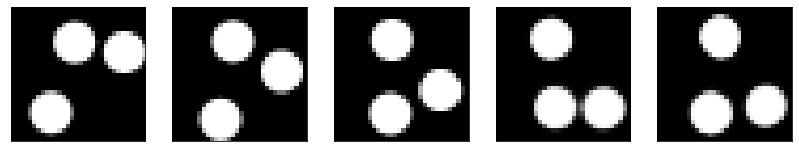

GD iterations:
i=0 | err=54.509975
i=1 | err=53.131096
i=2 | err=51.249222
i=3 | err=49.140182
i=4 | err=46.962860
i=5 | err=44.743828
i=6 | err=42.543106
i=7 | err=40.225945
i=8 | err=37.948498
i=9 | err=35.653084
i=10 | err=33.351341
i=11 | err=31.132336
i=12 | err=29.028366
i=13 | err=27.018116
i=14 | err=25.117924
i=15 | err=23.249823
i=16 | err=21.416893
i=17 | err=19.672691
i=18 | err=18.086399
i=19 | err=16.695469
i=20 | err=15.445517
i=21 | err=14.270714
i=22 | err=13.199869
i=23 | err=12.182161
i=24 | err=11.250521
i=25 | err=10.343023
i=26 | err=9.490223
i=27 | err=8.699429
i=28 | err=7.934152
i=29 | err=7.222763
Epoch=261 (15%) | out_positive=0.864144 | out_negative=0.121851 | mse=0.075564


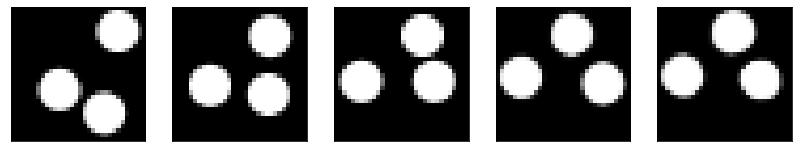

GD iterations:
i=0 | err=56.671997
i=1 | err=55.413029
i=2 | err=53.573639
i=3 | err=51.470123
i=4 | err=49.275730
i=5 | err=47.032196
i=6 | err=44.741089
i=7 | err=42.425720
i=8 | err=40.141266
i=9 | err=37.745518
i=10 | err=35.303902
i=11 | err=32.887920
i=12 | err=30.567480
i=13 | err=28.307878
i=14 | err=26.200201
i=15 | err=24.196280
i=16 | err=22.384914
i=17 | err=20.678640
i=18 | err=19.062531
i=19 | err=17.538441
i=20 | err=16.062649
i=21 | err=14.687822
i=22 | err=13.388633
i=23 | err=12.140694
i=24 | err=11.020020
i=25 | err=9.964938
i=26 | err=8.977161
i=27 | err=8.044611
i=28 | err=7.136015
i=29 | err=6.245616
Epoch=261 (17%) | out_positive=0.857217 | out_negative=0.133882 | mse=0.070960


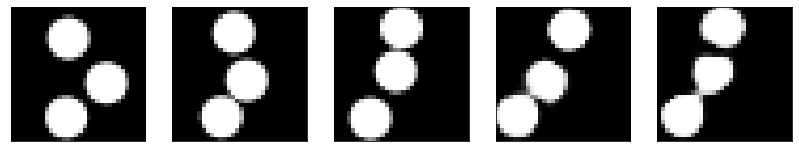

GD iterations:
i=0 | err=53.868496
i=1 | err=52.760155
i=2 | err=51.155716
i=3 | err=49.346680
i=4 | err=47.404327
i=5 | err=45.388298
i=6 | err=43.423512
i=7 | err=41.430115
i=8 | err=39.439880
i=9 | err=37.502930
i=10 | err=35.553844
i=11 | err=33.595562
i=12 | err=31.650450
i=13 | err=29.741385
i=14 | err=27.848360
i=15 | err=26.037495
i=16 | err=24.203175
i=17 | err=22.375858
i=18 | err=20.621895
i=19 | err=18.915104
i=20 | err=17.325474
i=21 | err=15.798307
i=22 | err=14.350231
i=23 | err=12.982431
i=24 | err=11.763841
i=25 | err=10.676641
i=26 | err=9.660072
i=27 | err=8.736732
i=28 | err=7.880923
i=29 | err=7.072268
Epoch=261 (19%) | out_positive=0.870273 | out_negative=0.136857 | mse=0.072370


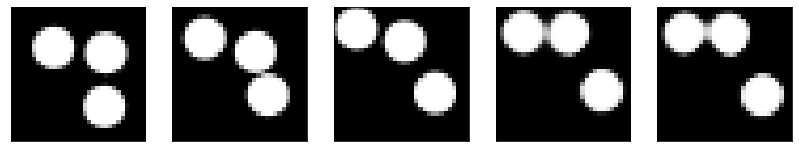

GD iterations:
i=0 | err=52.098137
i=1 | err=50.888748
i=2 | err=49.278732
i=3 | err=47.470455
i=4 | err=45.579987
i=5 | err=43.724304
i=6 | err=41.735664
i=7 | err=39.699490
i=8 | err=37.640327
i=9 | err=35.452850
i=10 | err=33.263340
i=11 | err=31.062481
i=12 | err=28.955490
i=13 | err=27.015244
i=14 | err=25.207897
i=15 | err=23.491688
i=16 | err=21.892910
i=17 | err=20.367054
i=18 | err=18.996281
i=19 | err=17.726793
i=20 | err=16.532852
i=21 | err=15.380867
i=22 | err=14.302586
i=23 | err=13.293465
i=24 | err=12.358923
i=25 | err=11.472105
i=26 | err=10.604609
i=27 | err=9.762175
i=28 | err=8.949140
i=29 | err=8.185452
Epoch=261 (20%) | out_positive=0.903062 | out_negative=0.077820 | mse=0.077557


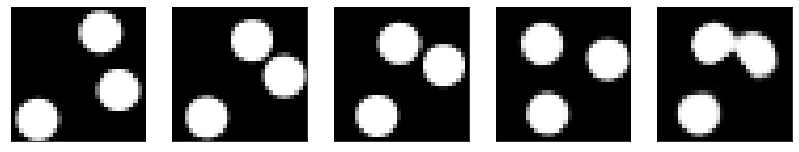

GD iterations:
i=0 | err=57.189018
i=1 | err=55.919971
i=2 | err=54.181118
i=3 | err=52.227623
i=4 | err=50.228828
i=5 | err=48.097832
i=6 | err=45.872780
i=7 | err=43.604275
i=8 | err=41.324722
i=9 | err=38.912315
i=10 | err=36.519955
i=11 | err=34.127205
i=12 | err=31.869421
i=13 | err=29.711914
i=14 | err=27.651482
i=15 | err=25.670052
i=16 | err=23.749010
i=17 | err=21.956638
i=18 | err=20.279366
i=19 | err=18.741299
i=20 | err=17.285259
i=21 | err=15.961651
i=22 | err=14.685927
i=23 | err=13.504393
i=24 | err=12.434821
i=25 | err=11.454515
i=26 | err=10.574166
i=27 | err=9.738019
i=28 | err=8.948288
i=29 | err=8.199335
Epoch=261 (22%) | out_positive=0.815016 | out_negative=0.090058 | mse=0.067496


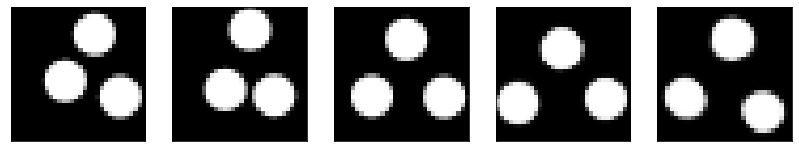

GD iterations:
i=0 | err=55.072487
i=1 | err=53.862652
i=2 | err=52.126663
i=3 | err=50.275139
i=4 | err=48.252422
i=5 | err=46.090210
i=6 | err=43.779251
i=7 | err=41.350246
i=8 | err=38.834686
i=9 | err=36.482864
i=10 | err=34.166672
i=11 | err=31.900257
i=12 | err=29.583763
i=13 | err=27.304958
i=14 | err=25.146576
i=15 | err=23.149557
i=16 | err=21.369839
i=17 | err=19.672554
i=18 | err=18.103552
i=19 | err=16.621864
i=20 | err=15.243467
i=21 | err=13.972057
i=22 | err=12.806609
i=23 | err=11.717859
i=24 | err=10.730091
i=25 | err=9.788721
i=26 | err=8.829039
i=27 | err=7.895088
i=28 | err=7.004438
i=29 | err=6.148647
Epoch=261 (24%) | out_positive=0.895767 | out_negative=0.161228 | mse=0.067067


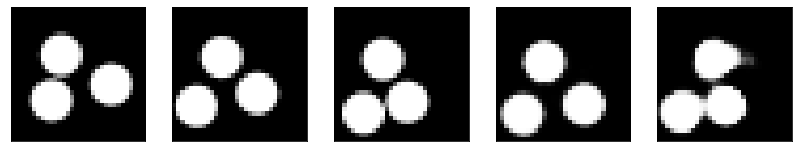

GD iterations:
i=0 | err=57.157654
i=1 | err=55.868935
i=2 | err=54.098198
i=3 | err=52.105278
i=4 | err=50.016277
i=5 | err=47.895210
i=6 | err=45.714928
i=7 | err=43.513645
i=8 | err=41.266113
i=9 | err=38.996254
i=10 | err=36.710373
i=11 | err=34.380913
i=12 | err=32.044060
i=13 | err=29.656799
i=14 | err=27.381016
i=15 | err=25.162720
i=16 | err=23.067596
i=17 | err=21.191605
i=18 | err=19.476307
i=19 | err=17.827200
i=20 | err=16.306292
i=21 | err=14.957682
i=22 | err=13.725189
i=23 | err=12.595562
i=24 | err=11.527290
i=25 | err=10.530918
i=26 | err=9.577089
i=27 | err=8.681145
i=28 | err=7.833445
i=29 | err=7.037914
Epoch=261 (26%) | out_positive=0.881671 | out_negative=0.113594 | mse=0.068809


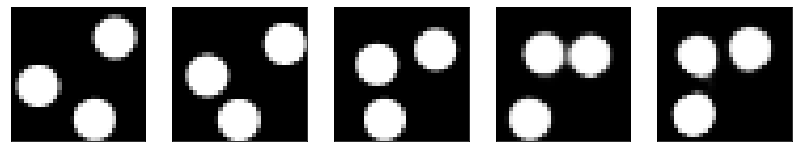

GD iterations:
i=0 | err=56.581249
i=1 | err=55.367554
i=2 | err=53.674530
i=3 | err=51.843246
i=4 | err=49.762119
i=5 | err=47.659355
i=6 | err=45.307816
i=7 | err=42.960880
i=8 | err=40.554878
i=9 | err=38.178101
i=10 | err=35.788593
i=11 | err=33.473030
i=12 | err=31.160471
i=13 | err=28.809788
i=14 | err=26.592510
i=15 | err=24.450783
i=16 | err=22.418249
i=17 | err=20.470392
i=18 | err=18.741005
i=19 | err=17.117794
i=20 | err=15.675567
i=21 | err=14.313960
i=22 | err=13.050468
i=23 | err=11.866705
i=24 | err=10.773089
i=25 | err=9.789692
i=26 | err=8.891083
i=27 | err=8.052307
i=28 | err=7.264822
i=29 | err=6.522859
Epoch=261 (28%) | out_positive=0.896889 | out_negative=0.149055 | mse=0.072674


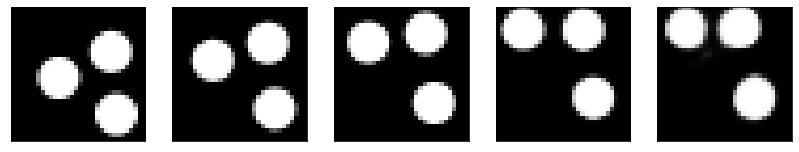

GD iterations:
i=0 | err=53.137074
i=1 | err=52.031372
i=2 | err=50.493393
i=3 | err=48.774841
i=4 | err=47.032036
i=5 | err=45.206451
i=6 | err=43.336163
i=7 | err=41.381985
i=8 | err=39.411568
i=9 | err=37.261559
i=10 | err=34.975967
i=11 | err=32.764503
i=12 | err=30.513737
i=13 | err=28.391815
i=14 | err=26.241053
i=15 | err=24.189095
i=16 | err=22.197134
i=17 | err=20.378544
i=18 | err=18.678730
i=19 | err=17.155231
i=20 | err=15.798321
i=21 | err=14.597330
i=22 | err=13.464058
i=23 | err=12.398574
i=24 | err=11.352771
i=25 | err=10.363485
i=26 | err=9.421740
i=27 | err=8.588900
i=28 | err=7.815473
i=29 | err=7.092360
Epoch=261 (30%) | out_positive=0.864836 | out_negative=0.091336 | mse=0.073657


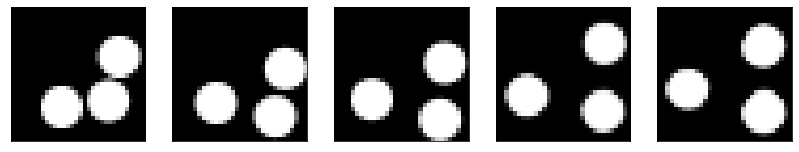

GD iterations:
i=0 | err=51.848442
i=1 | err=50.667236
i=2 | err=48.992367
i=3 | err=47.228394
i=4 | err=45.310726
i=5 | err=43.382900
i=6 | err=41.403976
i=7 | err=39.405045
i=8 | err=37.363335
i=9 | err=35.211994
i=10 | err=33.018341
i=11 | err=30.797079
i=12 | err=28.617300
i=13 | err=26.456425
i=14 | err=24.414415
i=15 | err=22.504871
i=16 | err=20.730333
i=17 | err=19.076296
i=18 | err=17.610929
i=19 | err=16.259651
i=20 | err=15.028406
i=21 | err=13.929758
i=22 | err=12.931746
i=23 | err=12.007597
i=24 | err=11.143452
i=25 | err=10.319023
i=26 | err=9.535973
i=27 | err=8.770832
i=28 | err=8.046097
i=29 | err=7.348115
Epoch=261 (31%) | out_positive=0.829997 | out_negative=0.109237 | mse=0.069133


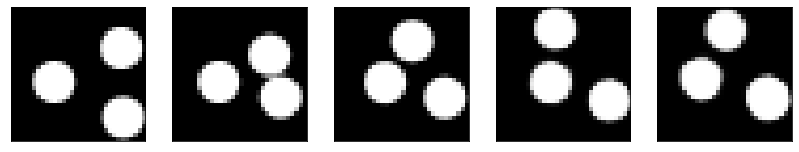

GD iterations:
i=0 | err=55.177605
i=1 | err=53.962914
i=2 | err=52.241932
i=3 | err=50.266575
i=4 | err=48.248695
i=5 | err=46.090096
i=6 | err=43.905411
i=7 | err=41.669792
i=8 | err=39.394051
i=9 | err=37.150463
i=10 | err=34.893562
i=11 | err=32.588505
i=12 | err=30.390238
i=13 | err=28.347855
i=14 | err=26.384125
i=15 | err=24.505079
i=16 | err=22.687490
i=17 | err=20.964550
i=18 | err=19.313908
i=19 | err=17.769676
i=20 | err=16.353798
i=21 | err=15.036485
i=22 | err=13.813373
i=23 | err=12.684619
i=24 | err=11.642053
i=25 | err=10.643297
i=26 | err=9.741419
i=27 | err=8.850952
i=28 | err=7.992944
i=29 | err=7.147733
Epoch=261 (33%) | out_positive=0.833831 | out_negative=0.131707 | mse=0.068682


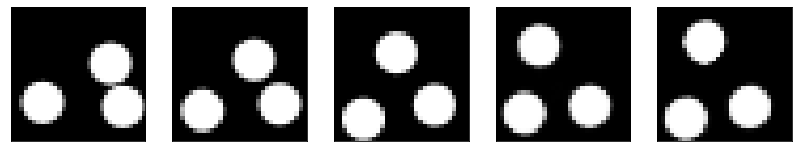

GD iterations:
i=0 | err=55.939384
i=1 | err=54.804565
i=2 | err=53.143112
i=3 | err=51.355415
i=4 | err=49.463982
i=5 | err=47.484470
i=6 | err=45.441841
i=7 | err=43.259026
i=8 | err=41.093071
i=9 | err=38.790710
i=10 | err=36.476868
i=11 | err=34.174202
i=12 | err=31.850185
i=13 | err=29.600473
i=14 | err=27.368532
i=15 | err=25.212906
i=16 | err=23.164955
i=17 | err=21.227892
i=18 | err=19.386196
i=19 | err=17.653889
i=20 | err=16.125366
i=21 | err=14.715223
i=22 | err=13.408314
i=23 | err=12.208259
i=24 | err=11.143995
i=25 | err=10.134274
i=26 | err=9.211390
i=27 | err=8.367762
i=28 | err=7.605081
i=29 | err=6.907917
Epoch=261 (35%) | out_positive=0.807967 | out_negative=0.065057 | mse=0.069802


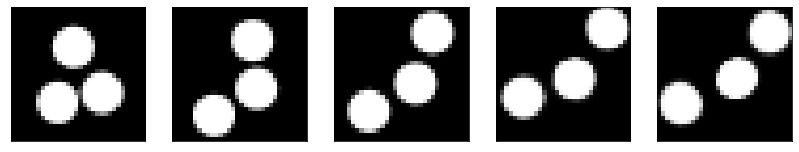

GD iterations:
i=0 | err=62.422142
i=1 | err=61.057617
i=2 | err=59.185009
i=3 | err=57.110363
i=4 | err=54.954727
i=5 | err=52.670612
i=6 | err=50.402946
i=7 | err=48.004539
i=8 | err=45.534431
i=9 | err=43.021564
i=10 | err=40.456848
i=11 | err=37.822952
i=12 | err=35.305588
i=13 | err=32.824997
i=14 | err=30.407145
i=15 | err=28.189968
i=16 | err=26.100376
i=17 | err=24.107752
i=18 | err=22.168682
i=19 | err=20.329567
i=20 | err=18.623360
i=21 | err=17.023039
i=22 | err=15.493443
i=23 | err=14.087502
i=24 | err=12.782894
i=25 | err=11.496140
i=26 | err=10.286469
i=27 | err=9.115620
i=28 | err=8.076515
i=29 | err=7.161784
Epoch=261 (37%) | out_positive=0.840511 | out_negative=0.117491 | mse=0.074591


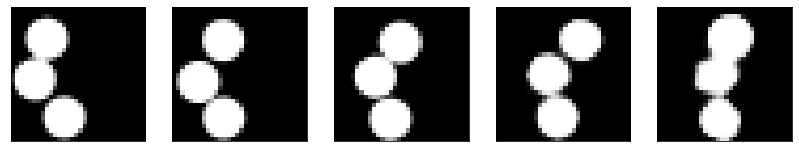

GD iterations:
i=0 | err=50.323605
i=1 | err=49.128204
i=2 | err=47.492935
i=3 | err=45.653091
i=4 | err=43.690193
i=5 | err=41.641670
i=6 | err=39.579605
i=7 | err=37.433289
i=8 | err=35.250675
i=9 | err=33.137066
i=10 | err=31.113052
i=11 | err=29.052536
i=12 | err=27.001657
i=13 | err=24.971558
i=14 | err=23.093712
i=15 | err=21.378513
i=16 | err=19.797363
i=17 | err=18.342175
i=18 | err=16.977732
i=19 | err=15.674328
i=20 | err=14.437172
i=21 | err=13.293772
i=22 | err=12.244979
i=23 | err=11.272660
i=24 | err=10.397573
i=25 | err=9.557341
i=26 | err=8.769055
i=27 | err=8.022362
i=28 | err=7.297239
i=29 | err=6.597459
Epoch=261 (39%) | out_positive=0.935712 | out_negative=0.132713 | mse=0.070348


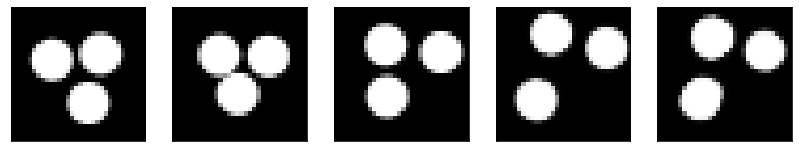

GD iterations:
i=0 | err=53.715836
i=1 | err=52.505424
i=2 | err=50.861671
i=3 | err=49.000450
i=4 | err=47.112656
i=5 | err=45.092720
i=6 | err=43.013023
i=7 | err=40.921837
i=8 | err=38.718311
i=9 | err=36.429489
i=10 | err=34.111893
i=11 | err=31.811666
i=12 | err=29.518637
i=13 | err=27.276863
i=14 | err=25.167992
i=15 | err=23.157597
i=16 | err=21.266714
i=17 | err=19.437805
i=18 | err=17.639250
i=19 | err=15.964764
i=20 | err=14.477555
i=21 | err=13.111512
i=22 | err=11.861771
i=23 | err=10.718845
i=24 | err=9.679862
i=25 | err=8.715239
i=26 | err=7.840212
i=27 | err=7.021029
i=28 | err=6.281706
i=29 | err=5.582556
Epoch=261 (41%) | out_positive=0.906463 | out_negative=0.126138 | mse=0.070177


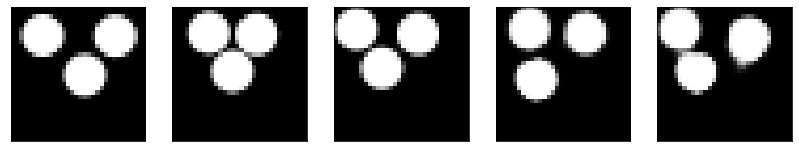

GD iterations:
i=0 | err=53.029076
i=1 | err=51.830536
i=2 | err=50.099678
i=3 | err=48.027000
i=4 | err=45.860374
i=5 | err=43.709045
i=6 | err=41.599697
i=7 | err=39.471992
i=8 | err=37.361790
i=9 | err=35.279835
i=10 | err=33.204708
i=11 | err=31.218292
i=12 | err=29.247677
i=13 | err=27.307241
i=14 | err=25.446661
i=15 | err=23.647144
i=16 | err=21.981812
i=17 | err=20.405706
i=18 | err=18.963324
i=19 | err=17.557350
i=20 | err=16.264477
i=21 | err=15.024454
i=22 | err=13.879732
i=23 | err=12.818541
i=24 | err=11.847202
i=25 | err=10.931162
i=26 | err=10.033359
i=27 | err=9.137194
i=28 | err=8.288124
i=29 | err=7.462539
Epoch=261 (42%) | out_positive=0.853437 | out_negative=0.137342 | mse=0.072060


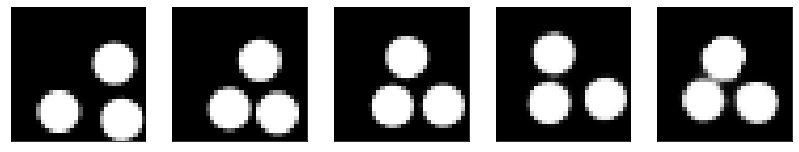

GD iterations:
i=0 | err=56.331135
i=1 | err=55.128609
i=2 | err=53.423996
i=3 | err=51.576500
i=4 | err=49.529160
i=5 | err=47.460506
i=6 | err=45.300873
i=7 | err=43.112907
i=8 | err=40.804379
i=9 | err=38.440742
i=10 | err=35.860443
i=11 | err=33.267273
i=12 | err=30.783752
i=13 | err=28.390696
i=14 | err=26.159946
i=15 | err=24.106834
i=16 | err=22.204205
i=17 | err=20.369919
i=18 | err=18.670670
i=19 | err=17.117086
i=20 | err=15.661909
i=21 | err=14.323566
i=22 | err=13.090233
i=23 | err=11.955774
i=24 | err=10.886163
i=25 | err=9.923500
i=26 | err=8.993473
i=27 | err=8.131622
i=28 | err=7.326943
i=29 | err=6.543145
Epoch=261 (44%) | out_positive=0.908336 | out_negative=0.119779 | mse=0.065231


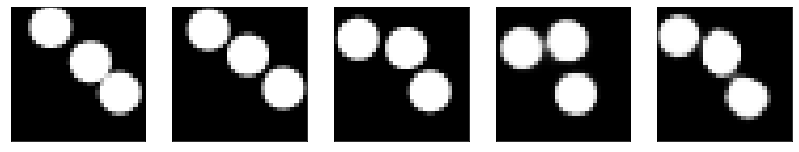

GD iterations:
i=0 | err=54.567955
i=1 | err=53.293152
i=2 | err=51.527569
i=3 | err=49.532791
i=4 | err=47.351223
i=5 | err=45.128475
i=6 | err=42.856586
i=7 | err=40.519402
i=8 | err=38.194725
i=9 | err=35.887962
i=10 | err=33.652367
i=11 | err=31.525120
i=12 | err=29.423166
i=13 | err=27.361921
i=14 | err=25.380516
i=15 | err=23.419611
i=16 | err=21.508440
i=17 | err=19.708080
i=18 | err=18.002403
i=19 | err=16.431540
i=20 | err=14.948553
i=21 | err=13.610839
i=22 | err=12.400554
i=23 | err=11.281032
i=24 | err=10.254066
i=25 | err=9.275283
i=26 | err=8.317301
i=27 | err=7.424664
i=28 | err=6.586825
i=29 | err=5.811515
Epoch=261 (46%) | out_positive=0.928081 | out_negative=0.177277 | mse=0.068908


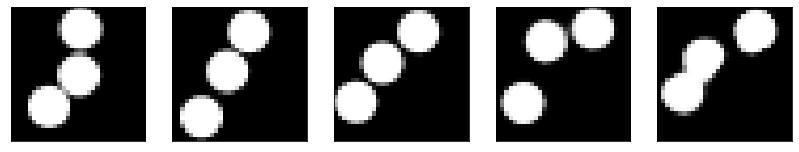

GD iterations:
i=0 | err=55.322910
i=1 | err=54.043510
i=2 | err=52.288059
i=3 | err=50.309917
i=4 | err=48.226746
i=5 | err=46.092453
i=6 | err=43.932453
i=7 | err=41.744953
i=8 | err=39.532028
i=9 | err=37.270542
i=10 | err=35.044178
i=11 | err=32.786949
i=12 | err=30.665884
i=13 | err=28.558701
i=14 | err=26.536081
i=15 | err=24.563869
i=16 | err=22.705044
i=17 | err=20.967722
i=18 | err=19.351805
i=19 | err=17.872402
i=20 | err=16.489544
i=21 | err=15.205950
i=22 | err=14.034401
i=23 | err=12.938469
i=24 | err=11.897758
i=25 | err=10.908110
i=26 | err=10.010803
i=27 | err=9.169076
i=28 | err=8.393912
i=29 | err=7.663422
Epoch=261 (48%) | out_positive=0.852373 | out_negative=0.121420 | mse=0.070738


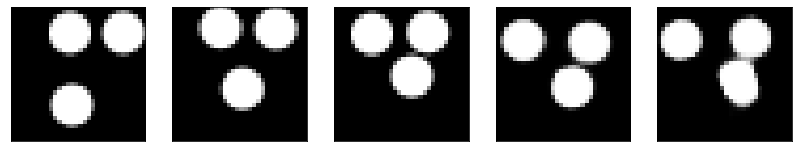

GD iterations:
i=0 | err=56.486565
i=1 | err=55.247864
i=2 | err=53.554867
i=3 | err=51.676643
i=4 | err=49.722305
i=5 | err=47.624866
i=6 | err=45.461571
i=7 | err=43.159615
i=8 | err=40.788170
i=9 | err=38.326359
i=10 | err=36.014660
i=11 | err=33.688011
i=12 | err=31.405375
i=13 | err=29.312855
i=14 | err=27.342995
i=15 | err=25.421661
i=16 | err=23.633192
i=17 | err=21.865683
i=18 | err=20.191547
i=19 | err=18.596409
i=20 | err=17.146881
i=21 | err=15.886345
i=22 | err=14.716688
i=23 | err=13.612589
i=24 | err=12.551700
i=25 | err=11.548798
i=26 | err=10.599582
i=27 | err=9.650925
i=28 | err=8.745187
i=29 | err=7.882111
Epoch=261 (50%) | out_positive=0.911351 | out_negative=0.078086 | mse=0.072876


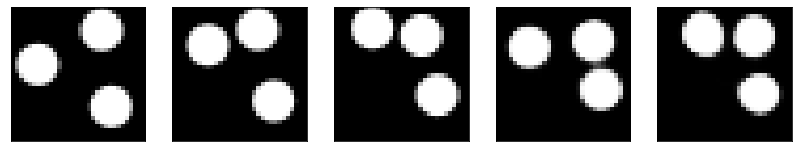

GD iterations:
i=0 | err=52.465309
i=1 | err=51.323288
i=2 | err=49.744221
i=3 | err=48.051018
i=4 | err=46.120399
i=5 | err=44.115280
i=6 | err=42.001556
i=7 | err=39.871155
i=8 | err=37.709896
i=9 | err=35.585163
i=10 | err=33.486610
i=11 | err=31.383183
i=12 | err=29.279804
i=13 | err=27.219284
i=14 | err=25.231525
i=15 | err=23.339584
i=16 | err=21.513535
i=17 | err=19.760395
i=18 | err=18.117340
i=19 | err=16.635931
i=20 | err=15.277504
i=21 | err=14.064413
i=22 | err=12.929428
i=23 | err=11.879086
i=24 | err=10.884969
i=25 | err=9.933480
i=26 | err=9.014670
i=27 | err=8.154540
i=28 | err=7.335340
i=29 | err=6.534321
Epoch=261 (52%) | out_positive=0.891364 | out_negative=0.134897 | mse=0.069410


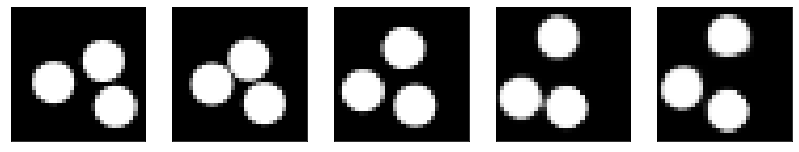

GD iterations:
i=0 | err=55.325077
i=1 | err=54.085030
i=2 | err=52.395847
i=3 | err=50.504757
i=4 | err=48.449802
i=5 | err=46.325584
i=6 | err=44.073013
i=7 | err=41.869244
i=8 | err=39.620293
i=9 | err=37.300095
i=10 | err=34.912857
i=11 | err=32.560997
i=12 | err=30.344673
i=13 | err=28.173113
i=14 | err=26.064289
i=15 | err=24.013371
i=16 | err=22.136230
i=17 | err=20.324577
i=18 | err=18.671164
i=19 | err=17.189823
i=20 | err=15.841408
i=21 | err=14.566805
i=22 | err=13.371609
i=23 | err=12.259947
i=24 | err=11.238281
i=25 | err=10.290041
i=26 | err=9.405603
i=27 | err=8.573746
i=28 | err=7.811710
i=29 | err=7.103014
Epoch=261 (53%) | out_positive=0.866830 | out_negative=0.125740 | mse=0.074995


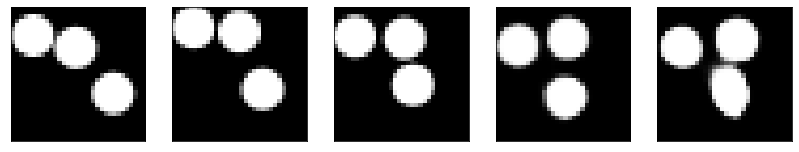

GD iterations:
i=0 | err=51.489937
i=1 | err=50.402515
i=2 | err=48.918251
i=3 | err=47.215973
i=4 | err=45.335236
i=5 | err=43.455959
i=6 | err=41.530094
i=7 | err=39.517311
i=8 | err=37.433296
i=9 | err=35.383446
i=10 | err=33.258888
i=11 | err=31.300114
i=12 | err=29.314392
i=13 | err=27.493124
i=14 | err=25.670923
i=15 | err=23.960979
i=16 | err=22.248436
i=17 | err=20.624876
i=18 | err=19.073795
i=19 | err=17.605488
i=20 | err=16.239059
i=21 | err=14.915038
i=22 | err=13.718121
i=23 | err=12.580631
i=24 | err=11.492222
i=25 | err=10.486890
i=26 | err=9.578746
i=27 | err=8.738641
i=28 | err=7.923108
i=29 | err=7.131866
Epoch=261 (55%) | out_positive=0.914256 | out_negative=0.114881 | mse=0.078755


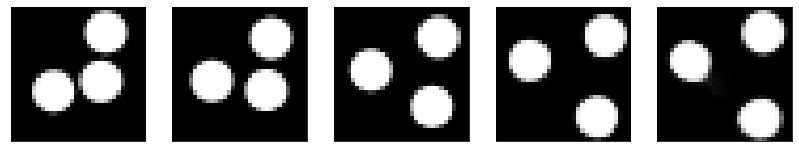

GD iterations:
i=0 | err=54.078827
i=1 | err=52.836964
i=2 | err=51.141426
i=3 | err=49.273880
i=4 | err=47.404842
i=5 | err=45.464699
i=6 | err=43.398830
i=7 | err=41.251320
i=8 | err=39.087383
i=9 | err=36.882973
i=10 | err=34.651497
i=11 | err=32.364670
i=12 | err=30.183020
i=13 | err=28.098583
i=14 | err=26.191023
i=15 | err=24.378716
i=16 | err=22.654037
i=17 | err=21.016342
i=18 | err=19.457712
i=19 | err=18.003674
i=20 | err=16.618980
i=21 | err=15.331094
i=22 | err=14.128475
i=23 | err=12.953445
i=24 | err=11.877016
i=25 | err=10.880177
i=26 | err=9.948530
i=27 | err=9.031578
i=28 | err=8.162633
i=29 | err=7.324773
Epoch=261 (57%) | out_positive=0.907018 | out_negative=0.156053 | mse=0.074686


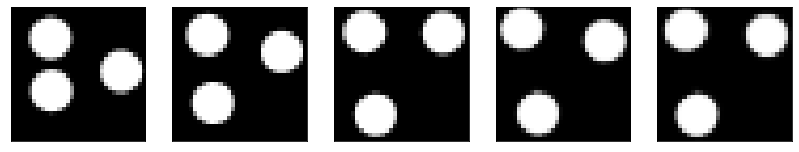

GD iterations:
i=0 | err=54.340336
i=1 | err=53.093040
i=2 | err=51.286499
i=3 | err=49.163353
i=4 | err=47.010643
i=5 | err=44.811272
i=6 | err=42.576748
i=7 | err=40.223022
i=8 | err=37.830978
i=9 | err=35.457558
i=10 | err=33.179283
i=11 | err=31.007307
i=12 | err=28.946068
i=13 | err=27.014812
i=14 | err=25.182720
i=15 | err=23.370193
i=16 | err=21.650223
i=17 | err=20.001518
i=18 | err=18.447590
i=19 | err=16.958548
i=20 | err=15.559982
i=21 | err=14.247526
i=22 | err=13.017776
i=23 | err=11.871511
i=24 | err=10.826378
i=25 | err=9.828838
i=26 | err=8.866068
i=27 | err=7.965429
i=28 | err=7.102017
i=29 | err=6.275360
Epoch=261 (59%) | out_positive=0.876885 | out_negative=0.140397 | mse=0.069699


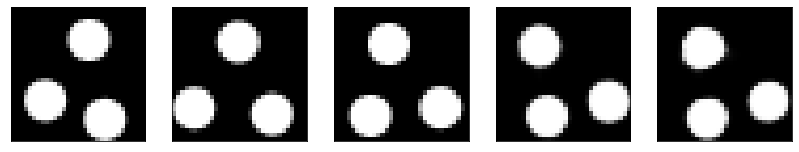

GD iterations:
i=0 | err=55.554420
i=1 | err=54.299034
i=2 | err=52.568031
i=3 | err=50.668552
i=4 | err=48.551975
i=5 | err=46.346882
i=6 | err=44.056030
i=7 | err=41.685104
i=8 | err=39.254303
i=9 | err=36.832378
i=10 | err=34.463566
i=11 | err=32.162575
i=12 | err=29.881130
i=13 | err=27.698778
i=14 | err=25.569050
i=15 | err=23.610924
i=16 | err=21.632095
i=17 | err=19.809082
i=18 | err=18.124166
i=19 | err=16.616043
i=20 | err=15.223053
i=21 | err=13.958588
i=22 | err=12.754071
i=23 | err=11.641752
i=24 | err=10.566147
i=25 | err=9.557896
i=26 | err=8.569669
i=27 | err=7.635098
i=28 | err=6.760591
i=29 | err=5.904808
Epoch=261 (61%) | out_positive=0.898219 | out_negative=0.174032 | mse=0.067619


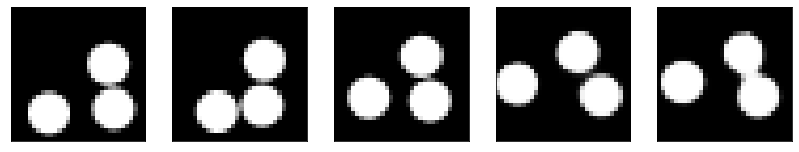

GD iterations:
i=0 | err=60.473961
i=1 | err=58.992126
i=2 | err=57.148834
i=3 | err=55.074028
i=4 | err=52.971321
i=5 | err=50.815319
i=6 | err=48.596664
i=7 | err=46.331512
i=8 | err=43.980141
i=9 | err=41.474007
i=10 | err=39.027412
i=11 | err=36.507515
i=12 | err=34.063034
i=13 | err=31.633732
i=14 | err=29.203377
i=15 | err=26.996452
i=16 | err=24.937277
i=17 | err=22.934685
i=18 | err=21.073872
i=19 | err=19.355553
i=20 | err=17.702049
i=21 | err=16.139065
i=22 | err=14.711960
i=23 | err=13.340532
i=24 | err=12.042494
i=25 | err=10.796803
i=26 | err=9.635202
i=27 | err=8.549666
i=28 | err=7.532945
i=29 | err=6.561478
Epoch=261 (63%) | out_positive=0.890833 | out_negative=0.161418 | mse=0.072096


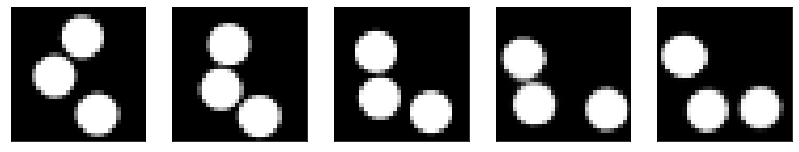

GD iterations:
i=0 | err=56.695381
i=1 | err=55.412312
i=2 | err=53.681633
i=3 | err=51.765377
i=4 | err=49.677238
i=5 | err=47.541473
i=6 | err=45.340252
i=7 | err=43.046875
i=8 | err=40.711136
i=9 | err=38.317459
i=10 | err=35.906319
i=11 | err=33.540703
i=12 | err=31.225927
i=13 | err=28.931559
i=14 | err=26.743946
i=15 | err=24.726196
i=16 | err=22.841389
i=17 | err=21.031000
i=18 | err=19.274734
i=19 | err=17.621147
i=20 | err=16.124065
i=21 | err=14.713122
i=22 | err=13.393512
i=23 | err=12.186028
i=24 | err=11.064281
i=25 | err=10.008831
i=26 | err=9.025318
i=27 | err=8.134071
i=28 | err=7.284821
i=29 | err=6.474476
Epoch=261 (64%) | out_positive=0.849420 | out_negative=0.124426 | mse=0.066370


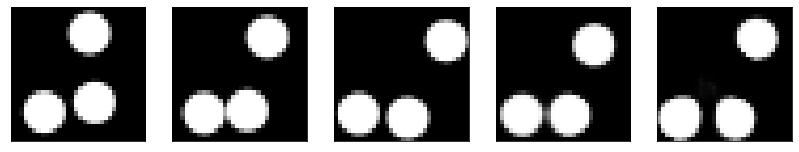

GD iterations:
i=0 | err=57.434189
i=1 | err=56.070465
i=2 | err=54.114227
i=3 | err=51.910065
i=4 | err=49.664459
i=5 | err=47.358917
i=6 | err=45.136990
i=7 | err=42.824371
i=8 | err=40.501450
i=9 | err=38.179459
i=10 | err=35.887589
i=11 | err=33.677460
i=12 | err=31.451107
i=13 | err=29.207912
i=14 | err=27.095970
i=15 | err=25.048664
i=16 | err=23.113445
i=17 | err=21.279669
i=18 | err=19.535919
i=19 | err=17.904491
i=20 | err=16.364388
i=21 | err=14.897745
i=22 | err=13.587000
i=23 | err=12.393685
i=24 | err=11.316641
i=25 | err=10.326693
i=26 | err=9.414001
i=27 | err=8.513557
i=28 | err=7.669436
i=29 | err=6.858213
Epoch=261 (66%) | out_positive=0.878830 | out_negative=0.148238 | mse=0.070714


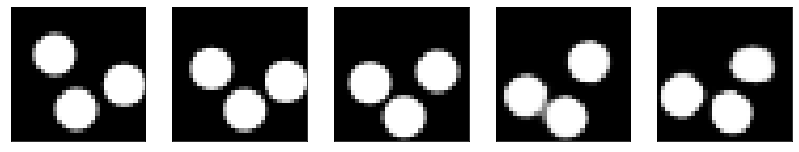

GD iterations:
i=0 | err=56.960785
i=1 | err=55.651817
i=2 | err=53.864437
i=3 | err=51.816196
i=4 | err=49.614517
i=5 | err=47.280804
i=6 | err=44.864578
i=7 | err=42.315125
i=8 | err=39.734474
i=9 | err=37.112518
i=10 | err=34.531075
i=11 | err=32.037071
i=12 | err=29.649727
i=13 | err=27.346924
i=14 | err=25.196213
i=15 | err=23.134809
i=16 | err=21.223801
i=17 | err=19.424862
i=18 | err=17.743565
i=19 | err=16.170204
i=20 | err=14.680050
i=21 | err=13.258880
i=22 | err=11.893723
i=23 | err=10.711555
i=24 | err=9.670443
i=25 | err=8.724669
i=26 | err=7.848737
i=27 | err=6.999683
i=28 | err=6.192514
i=29 | err=5.439473
Epoch=261 (68%) | out_positive=0.889192 | out_negative=0.159677 | mse=0.063347


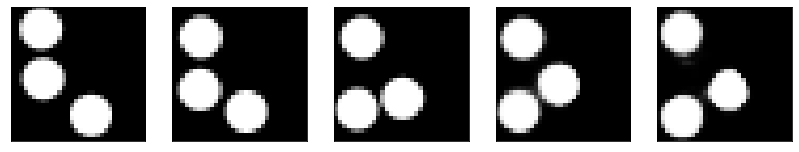

GD iterations:
i=0 | err=51.685112
i=1 | err=50.368477
i=2 | err=48.554947
i=3 | err=46.553322
i=4 | err=44.463547
i=5 | err=42.222298
i=6 | err=39.919716
i=7 | err=37.629612
i=8 | err=35.382839
i=9 | err=33.144234
i=10 | err=30.918129
i=11 | err=28.741209
i=12 | err=26.670218
i=13 | err=24.756714
i=14 | err=22.998173
i=15 | err=21.335953
i=16 | err=19.733269
i=17 | err=18.212563
i=18 | err=16.769970
i=19 | err=15.346758
i=20 | err=14.109144
i=21 | err=12.951349
i=22 | err=11.938345
i=23 | err=10.946494
i=24 | err=10.006819
i=25 | err=9.125434
i=26 | err=8.302078
i=27 | err=7.502433
i=28 | err=6.771768
i=29 | err=6.054154
Epoch=261 (70%) | out_positive=0.895228 | out_negative=0.142515 | mse=0.067561


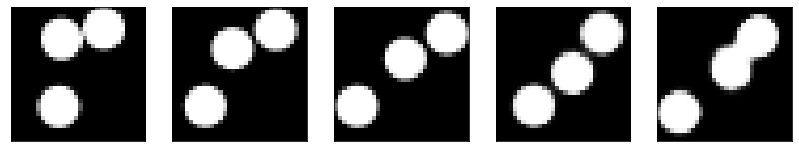

GD iterations:
i=0 | err=54.470963
i=1 | err=53.346535
i=2 | err=51.723114
i=3 | err=49.954052
i=4 | err=48.137936
i=5 | err=46.361195
i=6 | err=44.503105
i=7 | err=42.580608
i=8 | err=40.476234
i=9 | err=38.349689
i=10 | err=36.161465
i=11 | err=33.931141
i=12 | err=31.725416
i=13 | err=29.565592
i=14 | err=27.500021
i=15 | err=25.480625
i=16 | err=23.476025
i=17 | err=21.656078
i=18 | err=19.933430
i=19 | err=18.292492
i=20 | err=16.673147
i=21 | err=15.122141
i=22 | err=13.691195
i=23 | err=12.427776
i=24 | err=11.246866
i=25 | err=10.152064
i=26 | err=9.093882
i=27 | err=8.160847
i=28 | err=7.271259
i=29 | err=6.454611
Epoch=261 (72%) | out_positive=0.863812 | out_negative=0.155205 | mse=0.065363


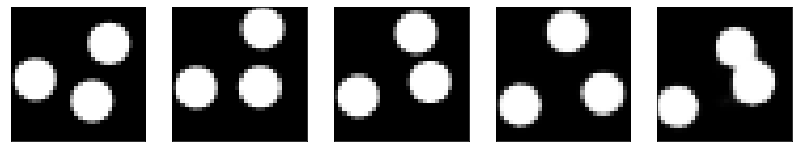

GD iterations:
i=0 | err=55.489563
i=1 | err=54.167946
i=2 | err=52.373688
i=3 | err=50.387085
i=4 | err=48.366547
i=5 | err=46.327705
i=6 | err=44.308903
i=7 | err=42.274780
i=8 | err=40.129234
i=9 | err=37.909576
i=10 | err=35.704319
i=11 | err=33.502209
i=12 | err=31.415575
i=13 | err=29.365002
i=14 | err=27.385815
i=15 | err=25.464113
i=16 | err=23.561569
i=17 | err=21.774591
i=18 | err=20.116985
i=19 | err=18.514490
i=20 | err=17.006432
i=21 | err=15.558971
i=22 | err=14.178722
i=23 | err=12.883913
i=24 | err=11.639153
i=25 | err=10.475225
i=26 | err=9.388649
i=27 | err=8.349917
i=28 | err=7.402682
i=29 | err=6.539568
Epoch=261 (74%) | out_positive=0.904565 | out_negative=0.151721 | mse=0.071524


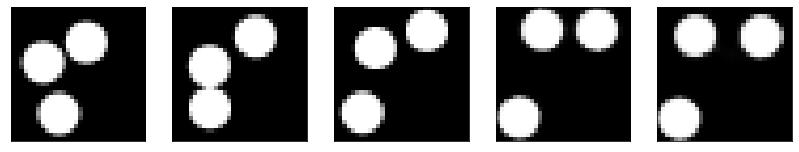

GD iterations:
i=0 | err=56.299145
i=1 | err=54.926178
i=2 | err=53.042442
i=3 | err=50.927006
i=4 | err=48.777466
i=5 | err=46.548401
i=6 | err=44.252022
i=7 | err=41.960918
i=8 | err=39.613724
i=9 | err=37.248932
i=10 | err=34.942848
i=11 | err=32.623585
i=12 | err=30.342945
i=13 | err=28.137325
i=14 | err=25.951971
i=15 | err=23.975119
i=16 | err=22.106552
i=17 | err=20.414770
i=18 | err=18.832439
i=19 | err=17.376434
i=20 | err=16.007439
i=21 | err=14.674204
i=22 | err=13.429386
i=23 | err=12.261957
i=24 | err=11.183832
i=25 | err=10.153746
i=26 | err=9.212073
i=27 | err=8.306981
i=28 | err=7.451601
i=29 | err=6.668411
Epoch=261 (75%) | out_positive=0.928658 | out_negative=0.146773 | mse=0.072816


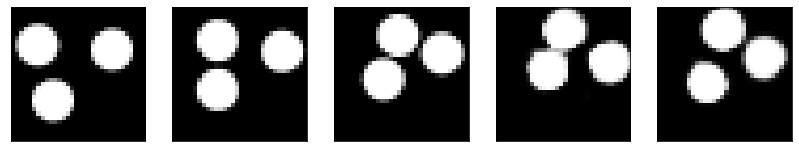

GD iterations:
i=0 | err=57.591515
i=1 | err=56.231178
i=2 | err=54.365608
i=3 | err=52.302818
i=4 | err=50.178230
i=5 | err=48.047379
i=6 | err=45.804173
i=7 | err=43.515549
i=8 | err=41.241913
i=9 | err=38.994274
i=10 | err=36.766739
i=11 | err=34.493111
i=12 | err=32.212425
i=13 | err=29.982838
i=14 | err=27.773335
i=15 | err=25.651089
i=16 | err=23.682112
i=17 | err=21.779419
i=18 | err=19.979134
i=19 | err=18.265896
i=20 | err=16.720749
i=21 | err=15.293180
i=22 | err=14.002701
i=23 | err=12.788573
i=24 | err=11.655250
i=25 | err=10.632837
i=26 | err=9.670426
i=27 | err=8.770198
i=28 | err=7.926483
i=29 | err=7.112138
Epoch=261 (77%) | out_positive=0.820875 | out_negative=0.103361 | mse=0.068527


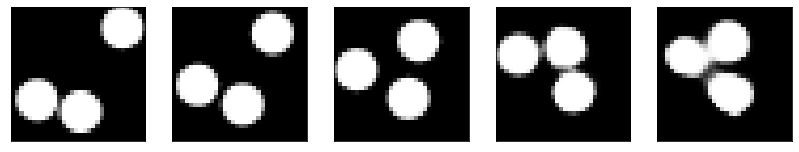

GD iterations:
i=0 | err=57.367424
i=1 | err=55.967323
i=2 | err=54.102924
i=3 | err=52.119446
i=4 | err=49.925362
i=5 | err=47.744606
i=6 | err=45.428829
i=7 | err=43.081604
i=8 | err=40.736305
i=9 | err=38.463020
i=10 | err=36.165939
i=11 | err=33.938267
i=12 | err=31.762140
i=13 | err=29.652159
i=14 | err=27.612926
i=15 | err=25.559687
i=16 | err=23.577414
i=17 | err=21.662048
i=18 | err=19.843334
i=19 | err=18.157188
i=20 | err=16.550798
i=21 | err=15.010113
i=22 | err=13.592844
i=23 | err=12.308493
i=24 | err=11.111650
i=25 | err=10.025537
i=26 | err=9.006002
i=27 | err=8.051966
i=28 | err=7.164299
i=29 | err=6.327556
Epoch=261 (79%) | out_positive=0.852466 | out_negative=0.147185 | mse=0.065716


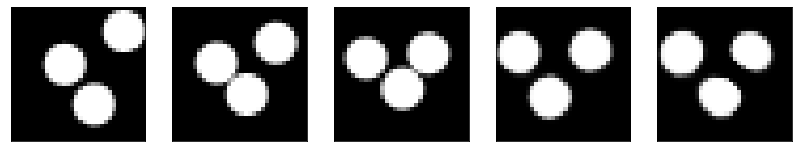

GD iterations:
i=0 | err=54.504753
i=1 | err=53.221535
i=2 | err=51.483177
i=3 | err=49.495506
i=4 | err=47.436035
i=5 | err=45.339432
i=6 | err=43.171482
i=7 | err=40.935074
i=8 | err=38.696991
i=9 | err=36.401802
i=10 | err=34.090218
i=11 | err=31.807903
i=12 | err=29.642309
i=13 | err=27.463749
i=14 | err=25.313766
i=15 | err=23.260241
i=16 | err=21.424593
i=17 | err=19.740536
i=18 | err=18.209448
i=19 | err=16.754345
i=20 | err=15.384762
i=21 | err=14.124127
i=22 | err=12.942457
i=23 | err=11.804345
i=24 | err=10.704226
i=25 | err=9.651110
i=26 | err=8.677520
i=27 | err=7.779750
i=28 | err=6.940220
i=29 | err=6.133934
Epoch=261 (81%) | out_positive=0.878030 | out_negative=0.145449 | mse=0.068258


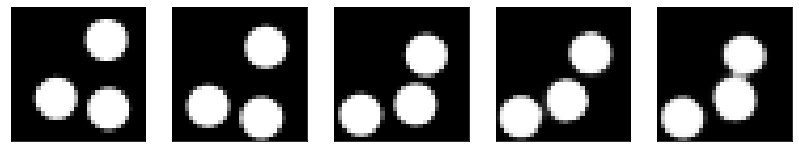

GD iterations:
i=0 | err=51.325855
i=1 | err=50.017559
i=2 | err=48.226116
i=3 | err=46.334366
i=4 | err=44.285973
i=5 | err=42.213871
i=6 | err=39.983261
i=7 | err=37.666050
i=8 | err=35.329533
i=9 | err=33.056007
i=10 | err=30.830698
i=11 | err=28.707119
i=12 | err=26.636026
i=13 | err=24.652668
i=14 | err=22.772970
i=15 | err=21.008760
i=16 | err=19.386892
i=17 | err=17.843426
i=18 | err=16.419189
i=19 | err=15.173980
i=20 | err=13.983082
i=21 | err=12.875191
i=22 | err=11.830367
i=23 | err=10.851082
i=24 | err=9.929197
i=25 | err=9.075756
i=26 | err=8.276148
i=27 | err=7.471284
i=28 | err=6.702406
i=29 | err=5.959823
Epoch=261 (83%) | out_positive=0.922147 | out_negative=0.126132 | mse=0.068111


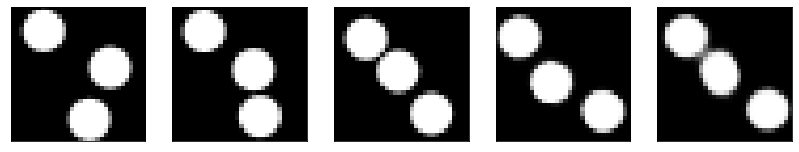

GD iterations:
i=0 | err=55.073116
i=1 | err=53.933002
i=2 | err=52.390511
i=3 | err=50.617237
i=4 | err=48.780006
i=5 | err=46.817055
i=6 | err=44.820599
i=7 | err=42.679325
i=8 | err=40.379234
i=9 | err=38.028130
i=10 | err=35.707157
i=11 | err=33.422249
i=12 | err=31.248947
i=13 | err=29.153231
i=14 | err=27.104910
i=15 | err=25.083139
i=16 | err=23.100494
i=17 | err=21.265068
i=18 | err=19.580685
i=19 | err=18.078178
i=20 | err=16.721436
i=21 | err=15.489924
i=22 | err=14.366538
i=23 | err=13.244605
i=24 | err=12.160584
i=25 | err=11.200321
i=26 | err=10.276144
i=27 | err=9.382885
i=28 | err=8.529021
i=29 | err=7.737870
Epoch=261 (85%) | out_positive=0.822026 | out_negative=0.103396 | mse=0.073877


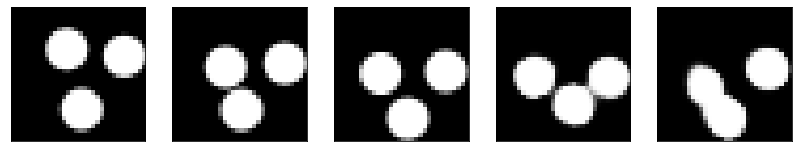

GD iterations:
i=0 | err=56.484657
i=1 | err=55.245098
i=2 | err=53.563145
i=3 | err=51.633522
i=4 | err=49.536274
i=5 | err=47.430496
i=6 | err=45.096359
i=7 | err=42.763275
i=8 | err=40.395535
i=9 | err=37.888241
i=10 | err=35.428474
i=11 | err=32.938980
i=12 | err=30.449707
i=13 | err=28.114210
i=14 | err=25.906097
i=15 | err=23.849838
i=16 | err=21.892595
i=17 | err=20.118740
i=18 | err=18.482998
i=19 | err=16.978241
i=20 | err=15.594744
i=21 | err=14.244852
i=22 | err=12.977680
i=23 | err=11.774384
i=24 | err=10.662220
i=25 | err=9.592224
i=26 | err=8.588308
i=27 | err=7.652785
i=28 | err=6.800311
i=29 | err=5.991205
Epoch=261 (87%) | out_positive=0.887316 | out_negative=0.178243 | mse=0.065433


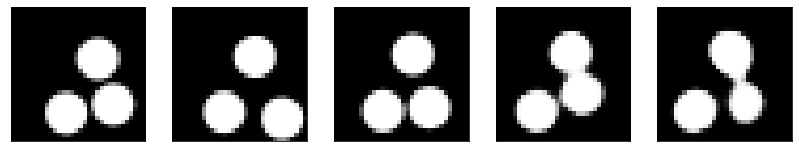

GD iterations:
i=0 | err=55.666077
i=1 | err=54.435425
i=2 | err=52.743935
i=3 | err=50.837906
i=4 | err=48.849094
i=5 | err=46.771126
i=6 | err=44.618172
i=7 | err=42.408958
i=8 | err=40.237518
i=9 | err=38.052185
i=10 | err=35.833839
i=11 | err=33.669113
i=12 | err=31.526550
i=13 | err=29.409698
i=14 | err=27.226658
i=15 | err=25.172745
i=16 | err=23.275400
i=17 | err=21.514347
i=18 | err=19.843586
i=19 | err=18.214777
i=20 | err=16.747379
i=21 | err=15.386664
i=22 | err=14.125420
i=23 | err=12.988314
i=24 | err=11.916629
i=25 | err=10.863472
i=26 | err=9.880930
i=27 | err=8.919038
i=28 | err=7.986650
i=29 | err=7.093702
Epoch=261 (88%) | out_positive=0.932694 | out_negative=0.150857 | mse=0.072565


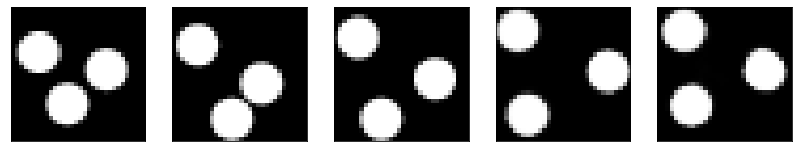

GD iterations:
i=0 | err=54.945629
i=1 | err=53.707996
i=2 | err=52.065338
i=3 | err=50.219963
i=4 | err=48.257389
i=5 | err=46.186615
i=6 | err=44.075321
i=7 | err=41.863533
i=8 | err=39.674477
i=9 | err=37.486198
i=10 | err=35.327164
i=11 | err=33.191109
i=12 | err=31.134912
i=13 | err=29.099426
i=14 | err=27.027349
i=15 | err=24.873886
i=16 | err=22.801773
i=17 | err=20.873682
i=18 | err=19.141602
i=19 | err=17.581171
i=20 | err=16.206259
i=21 | err=14.935068
i=22 | err=13.758080
i=23 | err=12.662899
i=24 | err=11.642174
i=25 | err=10.699763
i=26 | err=9.830427
i=27 | err=8.955113
i=28 | err=8.131578
i=29 | err=7.350397
Epoch=261 (90%) | out_positive=0.844390 | out_negative=0.164486 | mse=0.072963


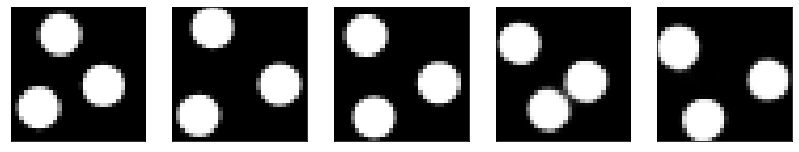

GD iterations:
i=0 | err=52.505707
i=1 | err=51.241943
i=2 | err=49.482136
i=3 | err=47.545586
i=4 | err=45.601784
i=5 | err=43.658554
i=6 | err=41.668335
i=7 | err=39.660721
i=8 | err=37.699551
i=9 | err=35.727715
i=10 | err=33.776833
i=11 | err=31.866005
i=12 | err=29.987015
i=13 | err=28.139950
i=14 | err=26.279167
i=15 | err=24.528767
i=16 | err=22.941532
i=17 | err=21.364275
i=18 | err=19.854324
i=19 | err=18.394897
i=20 | err=17.006767
i=21 | err=15.674703
i=22 | err=14.371656
i=23 | err=13.182678
i=24 | err=12.050949
i=25 | err=10.988001
i=26 | err=9.995128
i=27 | err=9.051170
i=28 | err=8.214321
i=29 | err=7.390293
Epoch=261 (92%) | out_positive=0.879892 | out_negative=0.103237 | mse=0.073455


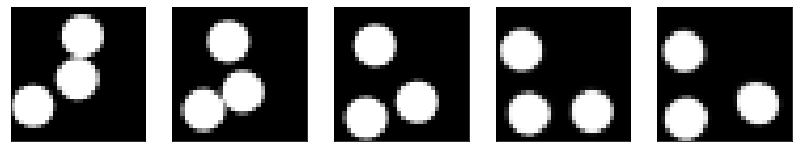

GD iterations:
i=0 | err=57.568916
i=1 | err=56.322968
i=2 | err=54.548805
i=3 | err=52.535301
i=4 | err=50.344746
i=5 | err=48.151299
i=6 | err=45.816254
i=7 | err=43.407021
i=8 | err=40.906429
i=9 | err=38.410927
i=10 | err=35.992371
i=11 | err=33.584579
i=12 | err=31.287907
i=13 | err=29.054379
i=14 | err=26.888582
i=15 | err=24.774048
i=16 | err=22.764385
i=17 | err=20.914240
i=18 | err=19.272552
i=19 | err=17.794315
i=20 | err=16.452326
i=21 | err=15.237713
i=22 | err=14.109262
i=23 | err=13.071368
i=24 | err=12.115194
i=25 | err=11.221416
i=26 | err=10.355639
i=27 | err=9.507926
i=28 | err=8.688274
i=29 | err=7.879586
Epoch=261 (93%) | out_positive=0.853723 | out_negative=0.108427 | mse=0.071232


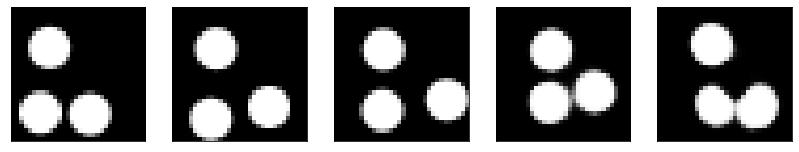

GD iterations:
i=0 | err=50.464188
i=1 | err=49.272873
i=2 | err=47.650478
i=3 | err=45.847626
i=4 | err=43.939766
i=5 | err=42.005806
i=6 | err=39.988823
i=7 | err=37.979259
i=8 | err=35.896019
i=9 | err=33.773888
i=10 | err=31.540968
i=11 | err=29.403698
i=12 | err=27.314337
i=13 | err=25.293884
i=14 | err=23.370499
i=15 | err=21.525188
i=16 | err=19.855608
i=17 | err=18.337482
i=18 | err=16.948582
i=19 | err=15.643321
i=20 | err=14.406074
i=21 | err=13.260762
i=22 | err=12.192509
i=23 | err=11.206003
i=24 | err=10.283950
i=25 | err=9.425636
i=26 | err=8.644153
i=27 | err=7.916911
i=28 | err=7.208182
i=29 | err=6.492661
Epoch=261 (94%) | out_positive=0.920023 | out_negative=0.125065 | mse=0.067082


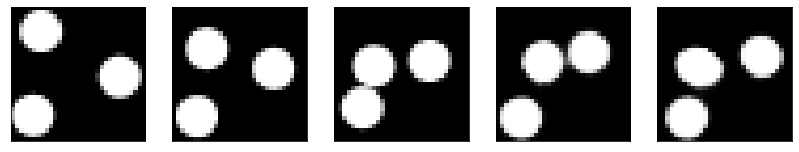

GD iterations:
i=0 | err=59.464279
i=1 | err=58.090969
i=2 | err=56.253262
i=3 | err=54.142376
i=4 | err=51.840088
i=5 | err=49.530876
i=6 | err=47.043610
i=7 | err=44.644630
i=8 | err=42.257851
i=9 | err=39.853363
i=10 | err=37.402481
i=11 | err=35.056564
i=12 | err=32.809158
i=13 | err=30.612423
i=14 | err=28.402534
i=15 | err=26.312510
i=16 | err=24.363358
i=17 | err=22.502632
i=18 | err=20.789974
i=19 | err=19.147110
i=20 | err=17.702274
i=21 | err=16.293249
i=22 | err=15.002186
i=23 | err=13.791640
i=24 | err=12.656365
i=25 | err=11.669897
i=26 | err=10.687737
i=27 | err=9.789313
i=28 | err=8.890718
i=29 | err=8.015775
Epoch=261 (96%) | out_positive=0.870091 | out_negative=0.108813 | mse=0.080424


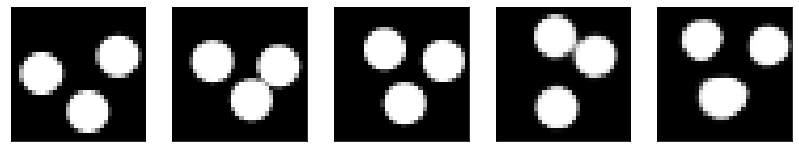

GD iterations:
i=0 | err=55.091835
i=1 | err=53.908150
i=2 | err=52.205208
i=3 | err=50.330276
i=4 | err=48.310181
i=5 | err=46.216827
i=6 | err=44.051262
i=7 | err=41.798416
i=8 | err=39.503517
i=9 | err=37.295906
i=10 | err=35.031013
i=11 | err=32.837406
i=12 | err=30.717003
i=13 | err=28.674084
i=14 | err=26.718214
i=15 | err=24.842760
i=16 | err=23.052902
i=17 | err=21.389502
i=18 | err=19.816681
i=19 | err=18.333822
i=20 | err=16.985008
i=21 | err=15.700281
i=22 | err=14.515743
i=23 | err=13.331730
i=24 | err=12.235812
i=25 | err=11.147638
i=26 | err=10.170081
i=27 | err=9.240377
i=28 | err=8.371690
i=29 | err=7.485979
Epoch=261 (98%) | out_positive=0.882206 | out_negative=0.117121 | mse=0.071782


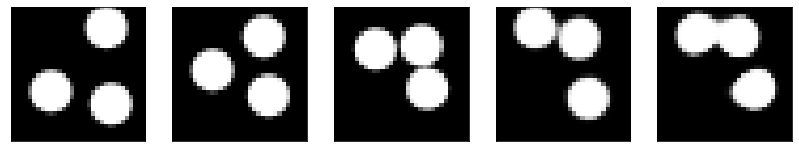

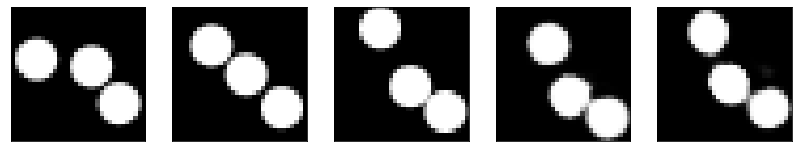

Test MSE 0.077930


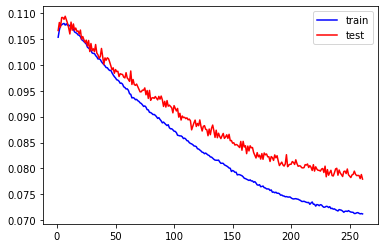

GD iterations:
i=0 | err=56.519440
i=1 | err=55.383179
i=2 | err=53.744377
i=3 | err=51.926910
i=4 | err=50.033257
i=5 | err=48.012783
i=6 | err=45.921368
i=7 | err=43.706600
i=8 | err=41.427689
i=9 | err=39.026329
i=10 | err=36.588047
i=11 | err=34.154263
i=12 | err=31.711557
i=13 | err=29.300076
i=14 | err=27.014328
i=15 | err=24.797237
i=16 | err=22.766796
i=17 | err=20.947773
i=18 | err=19.228260
i=19 | err=17.612080
i=20 | err=16.166595
i=21 | err=14.773466
i=22 | err=13.504822
i=23 | err=12.275859
i=24 | err=11.119118
i=25 | err=10.053150
i=26 | err=9.014129
i=27 | err=8.054121
i=28 | err=7.129470
i=29 | err=6.234928
Epoch=262 (0%) | out_positive=0.821299 | out_negative=0.150712 | mse=0.071040


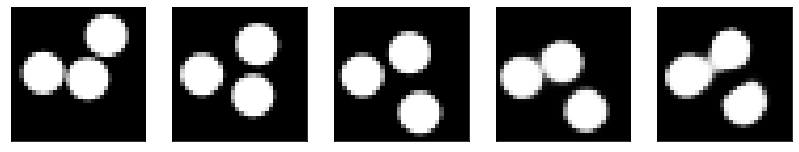

GD iterations:
i=0 | err=55.147034
i=1 | err=53.875721
i=2 | err=52.062927
i=3 | err=49.925766
i=4 | err=47.663132
i=5 | err=45.235161
i=6 | err=42.670383
i=7 | err=40.043419
i=8 | err=37.404900
i=9 | err=34.926647
i=10 | err=32.558033
i=11 | err=30.320671
i=12 | err=28.123617
i=13 | err=26.031626
i=14 | err=24.019733
i=15 | err=22.105061
i=16 | err=20.188957
i=17 | err=18.477320
i=18 | err=16.940157
i=19 | err=15.527834
i=20 | err=14.275263
i=21 | err=13.100881
i=22 | err=11.997246
i=23 | err=10.932869
i=24 | err=9.959219
i=25 | err=9.042315
i=26 | err=8.198595
i=27 | err=7.362431
i=28 | err=6.568092
i=29 | err=5.804288
Epoch=262 (2%) | out_positive=0.892885 | out_negative=0.176319 | mse=0.063975


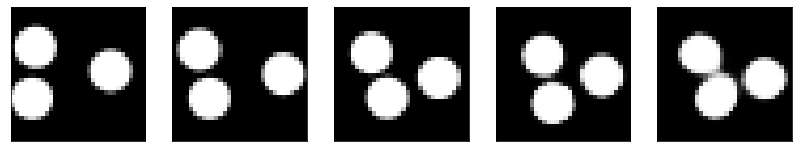

GD iterations:
i=0 | err=55.990196
i=1 | err=54.742550
i=2 | err=53.092911
i=3 | err=51.207016
i=4 | err=49.239006
i=5 | err=47.128395
i=6 | err=44.931850
i=7 | err=42.664894
i=8 | err=40.363026
i=9 | err=38.051037
i=10 | err=35.607876
i=11 | err=33.147221
i=12 | err=30.743399
i=13 | err=28.402657
i=14 | err=26.290146
i=15 | err=24.383650
i=16 | err=22.606798
i=17 | err=20.962238
i=18 | err=19.348570
i=19 | err=17.758717
i=20 | err=16.207792
i=21 | err=14.753442
i=22 | err=13.399136
i=23 | err=12.140161
i=24 | err=10.982805
i=25 | err=9.921048
i=26 | err=8.896066
i=27 | err=7.917930
i=28 | err=7.019904
i=29 | err=6.211651
Epoch=262 (4%) | out_positive=0.881804 | out_negative=0.127320 | mse=0.068935


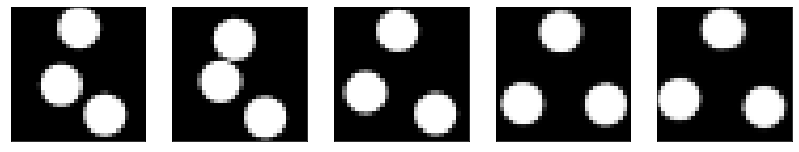

GD iterations:
i=0 | err=53.845867
i=1 | err=52.716999
i=2 | err=51.141499
i=3 | err=49.295116
i=4 | err=47.334835
i=5 | err=45.285797
i=6 | err=43.152332
i=7 | err=40.958595
i=8 | err=38.824150
i=9 | err=36.640198
i=10 | err=34.390205
i=11 | err=32.152458
i=12 | err=29.983770
i=13 | err=27.839783
i=14 | err=25.746941
i=15 | err=23.775402
i=16 | err=21.900381
i=17 | err=20.159130
i=18 | err=18.516321
i=19 | err=17.008392
i=20 | err=15.561687
i=21 | err=14.236588
i=22 | err=12.991146
i=23 | err=11.859259
i=24 | err=10.830874
i=25 | err=9.871094
i=26 | err=9.001188
i=27 | err=8.197512
i=28 | err=7.462604
i=29 | err=6.753669
Epoch=262 (6%) | out_positive=0.889962 | out_negative=0.122763 | mse=0.068932


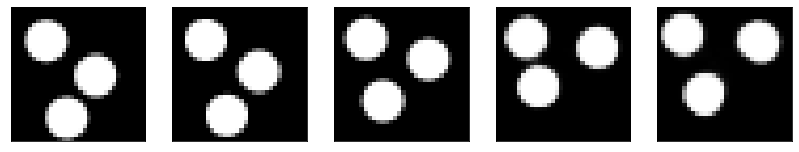

GD iterations:
i=0 | err=55.384892
i=1 | err=54.147671
i=2 | err=52.434715
i=3 | err=50.579361
i=4 | err=48.682663
i=5 | err=46.766388
i=6 | err=44.738869
i=7 | err=42.617878
i=8 | err=40.377102
i=9 | err=38.118965
i=10 | err=35.800766
i=11 | err=33.358574
i=12 | err=30.904907
i=13 | err=28.500584
i=14 | err=26.256512
i=15 | err=24.191551
i=16 | err=22.308311
i=17 | err=20.554865
i=18 | err=18.915077
i=19 | err=17.394945
i=20 | err=15.996655
i=21 | err=14.706905
i=22 | err=13.509831
i=23 | err=12.382063
i=24 | err=11.356847
i=25 | err=10.463702
i=26 | err=9.640906
i=27 | err=8.873478
i=28 | err=8.102891
i=29 | err=7.385424
Epoch=262 (8%) | out_positive=0.829163 | out_negative=0.086509 | mse=0.071705


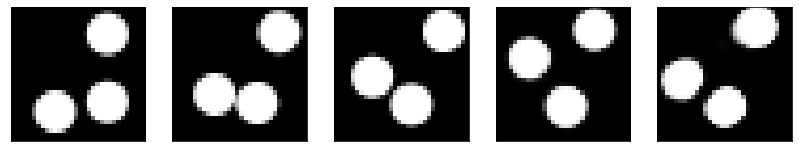

GD iterations:
i=0 | err=51.780151
i=1 | err=50.470951
i=2 | err=48.700241
i=3 | err=46.743744
i=4 | err=44.691368
i=5 | err=42.528061
i=6 | err=40.280094
i=7 | err=38.033844
i=8 | err=35.812202
i=9 | err=33.574287
i=10 | err=31.293465
i=11 | err=29.104612
i=12 | err=26.998028
i=13 | err=25.010836
i=14 | err=23.142675
i=15 | err=21.378756
i=16 | err=19.727615
i=17 | err=18.178144
i=18 | err=16.800390
i=19 | err=15.554726
i=20 | err=14.377511
i=21 | err=13.262215
i=22 | err=12.190003
i=23 | err=11.190599
i=24 | err=10.271564
i=25 | err=9.418713
i=26 | err=8.602281
i=27 | err=7.783876
i=28 | err=7.031832
i=29 | err=6.324455
Epoch=262 (9%) | out_positive=0.918002 | out_negative=0.107939 | mse=0.069974


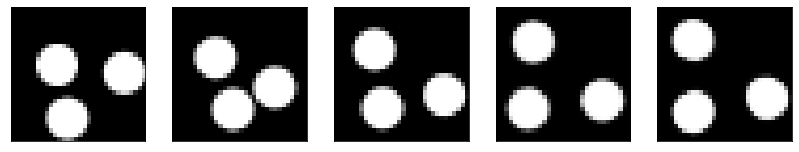

GD iterations:
i=0 | err=59.728394
i=1 | err=58.373840
i=2 | err=56.574898
i=3 | err=54.594475
i=4 | err=52.539467
i=5 | err=50.379509
i=6 | err=48.100601
i=7 | err=45.763443
i=8 | err=43.317741
i=9 | err=40.816154
i=10 | err=38.234177
i=11 | err=35.639870
i=12 | err=33.179394
i=13 | err=30.718845
i=14 | err=28.371571
i=15 | err=26.227932
i=16 | err=24.207426
i=17 | err=22.313280
i=18 | err=20.496071
i=19 | err=18.842134
i=20 | err=17.315451
i=21 | err=15.886724
i=22 | err=14.586653
i=23 | err=13.366069
i=24 | err=12.249122
i=25 | err=11.204533
i=26 | err=10.241890
i=27 | err=9.322699
i=28 | err=8.469330
i=29 | err=7.636014
Epoch=262 (11%) | out_positive=0.785785 | out_negative=0.120321 | mse=0.069239


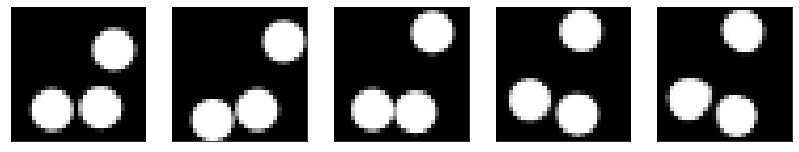

GD iterations:
i=0 | err=55.413605
i=1 | err=54.117828
i=2 | err=52.400627
i=3 | err=50.449116
i=4 | err=48.313782
i=5 | err=46.032337
i=6 | err=43.633011
i=7 | err=41.184013
i=8 | err=38.813629
i=9 | err=36.452843
i=10 | err=34.142670
i=11 | err=31.966827
i=12 | err=29.907475
i=13 | err=27.973862
i=14 | err=26.110546
i=15 | err=24.325136
i=16 | err=22.645802
i=17 | err=21.028873
i=18 | err=19.468796
i=19 | err=17.941933
i=20 | err=16.541658
i=21 | err=15.200487
i=22 | err=13.935064
i=23 | err=12.752239
i=24 | err=11.689980
i=25 | err=10.690397
i=26 | err=9.734968
i=27 | err=8.817667
i=28 | err=7.914771
i=29 | err=7.071572
Epoch=262 (13%) | out_positive=0.906799 | out_negative=0.133359 | mse=0.075471


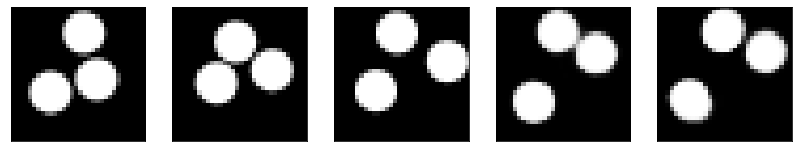

GD iterations:
i=0 | err=54.661915
i=1 | err=53.385101
i=2 | err=51.669060
i=3 | err=49.768097
i=4 | err=47.779327
i=5 | err=45.665325
i=6 | err=43.554688
i=7 | err=41.432209
i=8 | err=39.309265
i=9 | err=37.102287
i=10 | err=34.956501
i=11 | err=32.811111
i=12 | err=30.669195
i=13 | err=28.575447
i=14 | err=26.515461
i=15 | err=24.478003
i=16 | err=22.627117
i=17 | err=20.841328
i=18 | err=19.182129
i=19 | err=17.654528
i=20 | err=16.283628
i=21 | err=15.028852
i=22 | err=13.885114
i=23 | err=12.825220
i=24 | err=11.839648
i=25 | err=10.879147
i=26 | err=9.981171
i=27 | err=9.134767
i=28 | err=8.344128
i=29 | err=7.600938
Epoch=262 (15%) | out_positive=0.841844 | out_negative=0.094752 | mse=0.067600


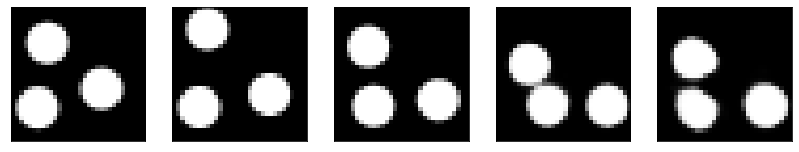

GD iterations:
i=0 | err=55.995026
i=1 | err=54.666866
i=2 | err=52.941528
i=3 | err=51.077477
i=4 | err=49.170586
i=5 | err=47.178688
i=6 | err=45.045261
i=7 | err=42.814003
i=8 | err=40.492176
i=9 | err=38.197765
i=10 | err=35.879295
i=11 | err=33.570286
i=12 | err=31.323036
i=13 | err=29.120556
i=14 | err=27.112179
i=15 | err=25.176889
i=16 | err=23.399513
i=17 | err=21.707552
i=18 | err=20.131058
i=19 | err=18.701675
i=20 | err=17.350447
i=21 | err=16.062170
i=22 | err=14.819016
i=23 | err=13.634003
i=24 | err=12.496508
i=25 | err=11.455529
i=26 | err=10.464643
i=27 | err=9.529531
i=28 | err=8.646088
i=29 | err=7.822744
Epoch=262 (17%) | out_positive=0.884700 | out_negative=0.094740 | mse=0.074509


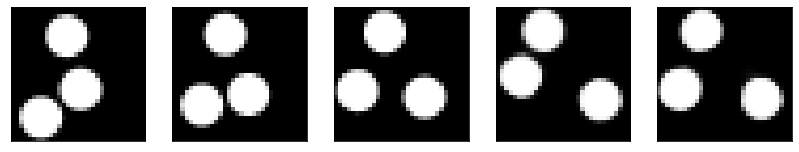

GD iterations:
i=0 | err=59.085831
i=1 | err=57.858917
i=2 | err=56.151848
i=3 | err=54.161049
i=4 | err=51.997322
i=5 | err=49.889313
i=6 | err=47.661324
i=7 | err=45.385700
i=8 | err=42.980289
i=9 | err=40.570999
i=10 | err=38.094524
i=11 | err=35.591827
i=12 | err=32.993320
i=13 | err=30.496817
i=14 | err=28.153744
i=15 | err=25.944056
i=16 | err=23.887386
i=17 | err=21.990723
i=18 | err=20.197704
i=19 | err=18.529015
i=20 | err=16.977505
i=21 | err=15.489320
i=22 | err=14.174909
i=23 | err=12.944239
i=24 | err=11.771575
i=25 | err=10.673033
i=26 | err=9.640306
i=27 | err=8.679230
i=28 | err=7.732273
i=29 | err=6.874326
Epoch=262 (18%) | out_positive=0.834793 | out_negative=0.134684 | mse=0.070537


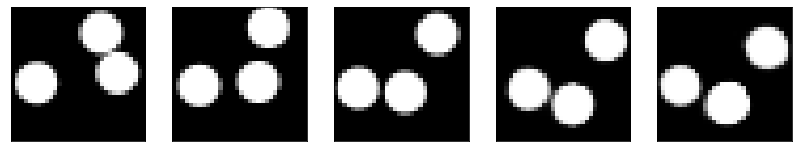

GD iterations:
i=0 | err=52.076035
i=1 | err=50.910042
i=2 | err=49.240414
i=3 | err=47.310081
i=4 | err=45.304966
i=5 | err=43.302353
i=6 | err=41.313881
i=7 | err=39.288139
i=8 | err=37.239174
i=9 | err=35.172630
i=10 | err=33.092056
i=11 | err=31.031912
i=12 | err=28.991528
i=13 | err=26.983616
i=14 | err=25.035892
i=15 | err=23.213129
i=16 | err=21.485703
i=17 | err=19.880434
i=18 | err=18.388622
i=19 | err=17.015501
i=20 | err=15.746925
i=21 | err=14.533297
i=22 | err=13.368264
i=23 | err=12.252854
i=24 | err=11.230551
i=25 | err=10.291557
i=26 | err=9.408690
i=27 | err=8.576834
i=28 | err=7.783889
i=29 | err=7.025749
Epoch=262 (20%) | out_positive=0.882695 | out_negative=0.128574 | mse=0.067168


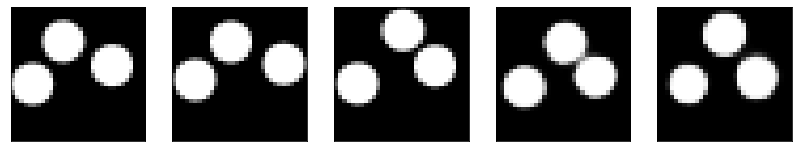

GD iterations:
i=0 | err=57.615448
i=1 | err=56.358860
i=2 | err=54.668076
i=3 | err=52.702259
i=4 | err=50.511158
i=5 | err=48.202820
i=6 | err=45.803123
i=7 | err=43.325413
i=8 | err=40.891975
i=9 | err=38.353260
i=10 | err=35.896721
i=11 | err=33.491425
i=12 | err=31.270699
i=13 | err=29.160988
i=14 | err=27.149151
i=15 | err=25.225121
i=16 | err=23.442286
i=17 | err=21.771618
i=18 | err=20.178406
i=19 | err=18.710796
i=20 | err=17.336651
i=21 | err=16.013603
i=22 | err=14.735827
i=23 | err=13.536572
i=24 | err=12.393323
i=25 | err=11.316624
i=26 | err=10.301598
i=27 | err=9.386608
i=28 | err=8.481288
i=29 | err=7.613389
Epoch=262 (22%) | out_positive=0.880802 | out_negative=0.089366 | mse=0.073190


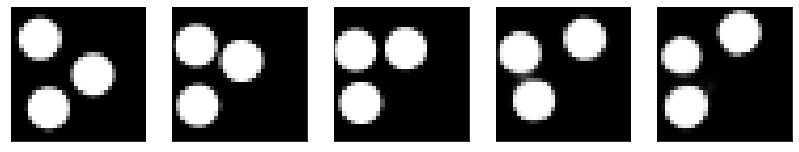

GD iterations:
i=0 | err=51.236553
i=1 | err=49.934418
i=2 | err=48.200935
i=3 | err=46.317589
i=4 | err=44.313496
i=5 | err=42.319202
i=6 | err=40.240662
i=7 | err=38.183716
i=8 | err=36.076405
i=9 | err=33.968880
i=10 | err=31.935303
i=11 | err=29.920521
i=12 | err=27.936144
i=13 | err=26.086960
i=14 | err=24.290993
i=15 | err=22.560766
i=16 | err=20.931026
i=17 | err=19.396732
i=18 | err=18.015457
i=19 | err=16.752413
i=20 | err=15.572252
i=21 | err=14.445459
i=22 | err=13.385542
i=23 | err=12.360551
i=24 | err=11.390360
i=25 | err=10.438125
i=26 | err=9.545605
i=27 | err=8.680374
i=28 | err=7.867319
i=29 | err=7.101596
Epoch=262 (24%) | out_positive=0.854856 | out_negative=0.092591 | mse=0.071554


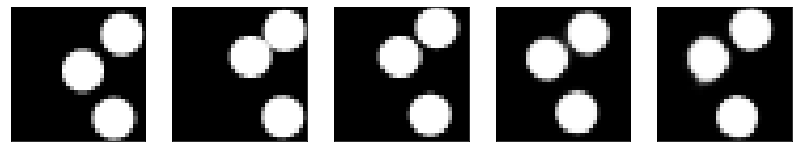

GD iterations:
i=0 | err=54.899315
i=1 | err=53.742523
i=2 | err=52.109543
i=3 | err=50.300476
i=4 | err=48.357986
i=5 | err=46.357483
i=6 | err=44.330742
i=7 | err=42.292591
i=8 | err=40.250729
i=9 | err=38.199135
i=10 | err=36.065006
i=11 | err=33.831463
i=12 | err=31.613617
i=13 | err=29.409931
i=14 | err=27.222000
i=15 | err=25.138254
i=16 | err=23.146809
i=17 | err=21.254688
i=18 | err=19.469606
i=19 | err=17.815765
i=20 | err=16.236547
i=21 | err=14.784136
i=22 | err=13.506197
i=23 | err=12.356842
i=24 | err=11.259196
i=25 | err=10.206987
i=26 | err=9.220716
i=27 | err=8.278157
i=28 | err=7.423394
i=29 | err=6.628027
Epoch=262 (26%) | out_positive=0.874014 | out_negative=0.171424 | mse=0.064947


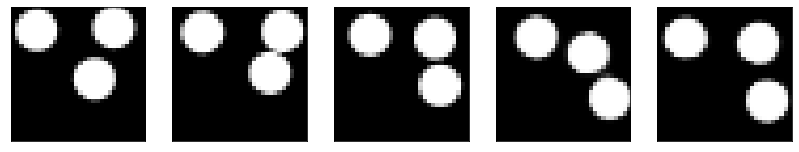

GD iterations:
i=0 | err=52.595871
i=1 | err=51.418354
i=2 | err=49.839211
i=3 | err=47.981770
i=4 | err=46.078461
i=5 | err=44.075706
i=6 | err=41.986408
i=7 | err=39.887108
i=8 | err=37.703148
i=9 | err=35.482647
i=10 | err=33.286358
i=11 | err=31.172775
i=12 | err=29.199041
i=13 | err=27.201077
i=14 | err=25.300194
i=15 | err=23.414637
i=16 | err=21.614624
i=17 | err=19.988554
i=18 | err=18.429062
i=19 | err=16.932652
i=20 | err=15.487463
i=21 | err=14.149928
i=22 | err=12.905668
i=23 | err=11.751818
i=24 | err=10.671446
i=25 | err=9.705174
i=26 | err=8.782852
i=27 | err=7.906886
i=28 | err=7.078594
i=29 | err=6.314606
Epoch=262 (28%) | out_positive=0.897386 | out_negative=0.149200 | mse=0.070507


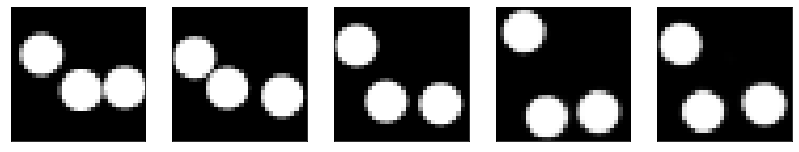

GD iterations:
i=0 | err=55.282028
i=1 | err=53.912895
i=2 | err=52.133026
i=3 | err=50.043579
i=4 | err=47.872040
i=5 | err=45.672279
i=6 | err=43.497833
i=7 | err=41.227242
i=8 | err=39.013718
i=9 | err=36.874767
i=10 | err=34.768440
i=11 | err=32.751205
i=12 | err=30.739075
i=13 | err=28.706251
i=14 | err=26.724373
i=15 | err=24.731096
i=16 | err=22.910517
i=17 | err=21.149734
i=18 | err=19.487423
i=19 | err=17.948780
i=20 | err=16.479128
i=21 | err=15.039095
i=22 | err=13.726005
i=23 | err=12.484390
i=24 | err=11.354215
i=25 | err=10.322203
i=26 | err=9.393049
i=27 | err=8.480783
i=28 | err=7.650237
i=29 | err=6.842459
Epoch=262 (30%) | out_positive=0.905474 | out_negative=0.152559 | mse=0.071441


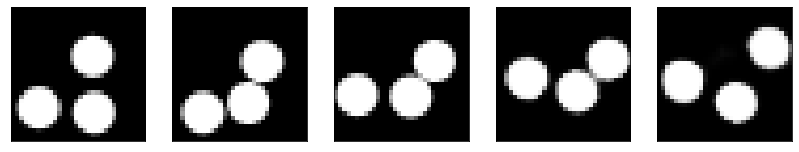

GD iterations:
i=0 | err=51.949654
i=1 | err=50.802921
i=2 | err=49.251793
i=3 | err=47.602886
i=4 | err=45.766792
i=5 | err=43.887367
i=6 | err=41.951141
i=7 | err=39.976212
i=8 | err=37.993080
i=9 | err=35.956375
i=10 | err=33.867722
i=11 | err=31.791441
i=12 | err=29.736080
i=13 | err=27.672340
i=14 | err=25.749378
i=15 | err=23.847582
i=16 | err=22.070629
i=17 | err=20.419107
i=18 | err=18.780083
i=19 | err=17.295479
i=20 | err=15.924000
i=21 | err=14.564215
i=22 | err=13.325304
i=23 | err=12.211258
i=24 | err=11.175882
i=25 | err=10.256517
i=26 | err=9.394114
i=27 | err=8.583206
i=28 | err=7.799807
i=29 | err=7.046996
Epoch=262 (31%) | out_positive=0.870650 | out_negative=0.096690 | mse=0.068493


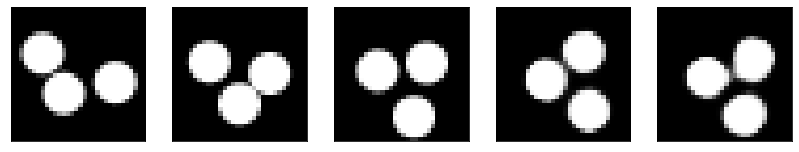

GD iterations:
i=0 | err=58.304939
i=1 | err=57.091438
i=2 | err=55.350952
i=3 | err=53.371468
i=4 | err=51.192719
i=5 | err=49.020390
i=6 | err=46.791317
i=7 | err=44.510345
i=8 | err=42.280201
i=9 | err=39.950363
i=10 | err=37.549080
i=11 | err=35.182816
i=12 | err=32.890553
i=13 | err=30.583055
i=14 | err=28.336163
i=15 | err=26.201069
i=16 | err=24.154600
i=17 | err=22.249237
i=18 | err=20.443707
i=19 | err=18.689369
i=20 | err=17.093992
i=21 | err=15.648127
i=22 | err=14.343409
i=23 | err=13.108381
i=24 | err=11.934417
i=25 | err=10.832864
i=26 | err=9.824831
i=27 | err=8.907264
i=28 | err=8.041377
i=29 | err=7.235421
Epoch=262 (33%) | out_positive=0.831487 | out_negative=0.116413 | mse=0.077082


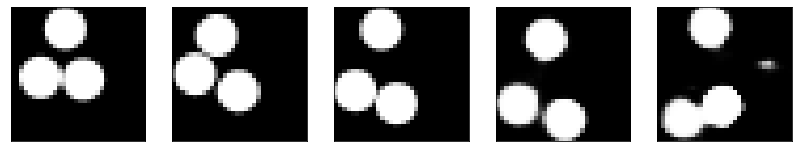

GD iterations:
i=0 | err=56.856552
i=1 | err=55.597954
i=2 | err=53.832741
i=3 | err=51.753571
i=4 | err=49.581841
i=5 | err=47.362038
i=6 | err=45.114517
i=7 | err=42.810612
i=8 | err=40.509552
i=9 | err=38.173538
i=10 | err=35.884796
i=11 | err=33.606403
i=12 | err=31.328091
i=13 | err=29.094078
i=14 | err=26.962868
i=15 | err=24.899670
i=16 | err=22.939991
i=17 | err=21.095802
i=18 | err=19.364471
i=19 | err=17.765099
i=20 | err=16.229847
i=21 | err=14.817677
i=22 | err=13.475386
i=23 | err=12.212422
i=24 | err=11.016218
i=25 | err=9.924070
i=26 | err=8.930095
i=27 | err=7.982054
i=28 | err=7.131885
i=29 | err=6.342972
Epoch=262 (35%) | out_positive=0.865491 | out_negative=0.140711 | mse=0.065585


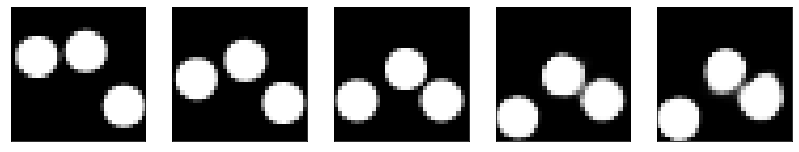

GD iterations:
i=0 | err=56.571571
i=1 | err=55.256233
i=2 | err=53.541336
i=3 | err=51.597771
i=4 | err=49.545761
i=5 | err=47.417107
i=6 | err=45.143471
i=7 | err=42.781151
i=8 | err=40.408661
i=9 | err=38.152851
i=10 | err=35.884289
i=11 | err=33.681679
i=12 | err=31.418701
i=13 | err=29.189795
i=14 | err=27.056168
i=15 | err=24.965395
i=16 | err=22.988323
i=17 | err=21.047836
i=18 | err=19.229630
i=19 | err=17.569960
i=20 | err=16.129169
i=21 | err=14.854588
i=22 | err=13.641161
i=23 | err=12.527069
i=24 | err=11.451704
i=25 | err=10.441648
i=26 | err=9.472593
i=27 | err=8.558542
i=28 | err=7.701830
i=29 | err=6.886837
Epoch=262 (37%) | out_positive=0.906508 | out_negative=0.164366 | mse=0.071645


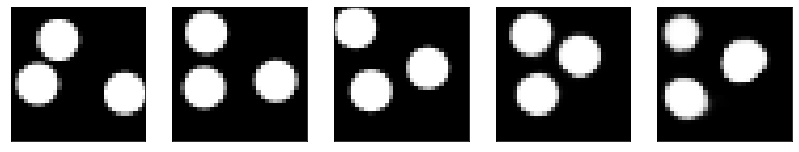

GD iterations:
i=0 | err=54.531200
i=1 | err=53.244949
i=2 | err=51.605305
i=3 | err=49.710491
i=4 | err=47.682835
i=5 | err=45.504566
i=6 | err=43.263260
i=7 | err=40.978249
i=8 | err=38.692520
i=9 | err=36.321148
i=10 | err=33.848068
i=11 | err=31.356348
i=12 | err=28.896189
i=13 | err=26.622822
i=14 | err=24.602766
i=15 | err=22.786057
i=16 | err=21.045792
i=17 | err=19.366947
i=18 | err=17.827576
i=19 | err=16.390495
i=20 | err=15.069295
i=21 | err=13.783758
i=22 | err=12.624739
i=23 | err=11.535649
i=24 | err=10.500975
i=25 | err=9.510926
i=26 | err=8.614326
i=27 | err=7.759606
i=28 | err=6.940745
i=29 | err=6.156336
Epoch=262 (39%) | out_positive=0.917419 | out_negative=0.152249 | mse=0.076359


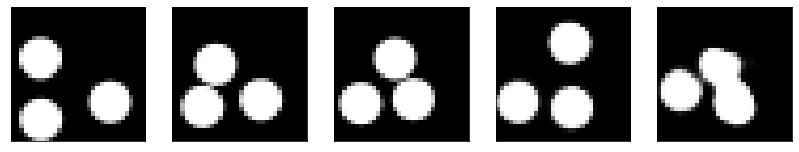

GD iterations:
i=0 | err=57.105484
i=1 | err=55.764107
i=2 | err=53.938324
i=3 | err=51.940113
i=4 | err=49.788132
i=5 | err=47.506622
i=6 | err=45.219414
i=7 | err=42.878033
i=8 | err=40.534935
i=9 | err=38.231186
i=10 | err=35.918026
i=11 | err=33.595772
i=12 | err=31.383434
i=13 | err=29.214218
i=14 | err=27.068947
i=15 | err=25.045242
i=16 | err=23.154858
i=17 | err=21.295792
i=18 | err=19.556520
i=19 | err=18.011292
i=20 | err=16.555820
i=21 | err=15.196978
i=22 | err=13.969318
i=23 | err=12.875806
i=24 | err=11.859625
i=25 | err=10.911832
i=26 | err=10.015444
i=27 | err=9.176840
i=28 | err=8.359848
i=29 | err=7.603111
Epoch=262 (40%) | out_positive=0.825889 | out_negative=0.099401 | mse=0.069222


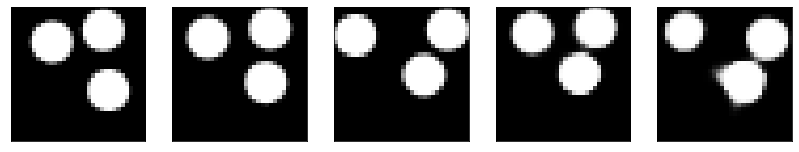

GD iterations:
i=0 | err=55.099609
i=1 | err=53.874756
i=2 | err=52.215725
i=3 | err=50.300812
i=4 | err=48.379158
i=5 | err=46.344147
i=6 | err=44.250168
i=7 | err=41.994713
i=8 | err=39.666176
i=9 | err=37.327412
i=10 | err=34.999298
i=11 | err=32.796371
i=12 | err=30.668266
i=13 | err=28.600426
i=14 | err=26.580574
i=15 | err=24.660854
i=16 | err=22.863438
i=17 | err=21.167700
i=18 | err=19.570211
i=19 | err=18.056871
i=20 | err=16.619839
i=21 | err=15.260166
i=22 | err=14.066454
i=23 | err=12.919833
i=24 | err=11.831408
i=25 | err=10.805939
i=26 | err=9.791565
i=27 | err=8.806025
i=28 | err=7.900057
i=29 | err=7.032933
Epoch=262 (42%) | out_positive=0.886198 | out_negative=0.101167 | mse=0.075566


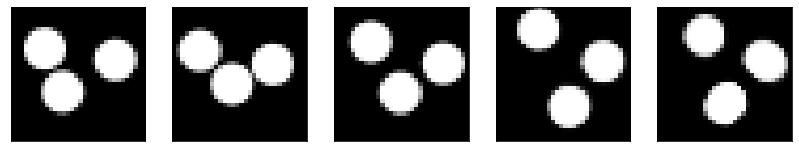

GD iterations:
i=0 | err=53.457832
i=1 | err=52.288506
i=2 | err=50.764851
i=3 | err=49.024559
i=4 | err=47.176239
i=5 | err=45.221680
i=6 | err=43.304390
i=7 | err=41.339203
i=8 | err=39.357178
i=9 | err=37.363312
i=10 | err=35.316055
i=11 | err=33.340408
i=12 | err=31.304127
i=13 | err=29.278137
i=14 | err=27.222963
i=15 | err=25.240276
i=16 | err=23.336407
i=17 | err=21.526182
i=18 | err=19.824013
i=19 | err=18.313019
i=20 | err=16.951309
i=21 | err=15.707261
i=22 | err=14.526325
i=23 | err=13.363572
i=24 | err=12.272081
i=25 | err=11.217108
i=26 | err=10.201758
i=27 | err=9.219318
i=28 | err=8.274717
i=29 | err=7.406726
Epoch=262 (44%) | out_positive=0.932115 | out_negative=0.114118 | mse=0.076916


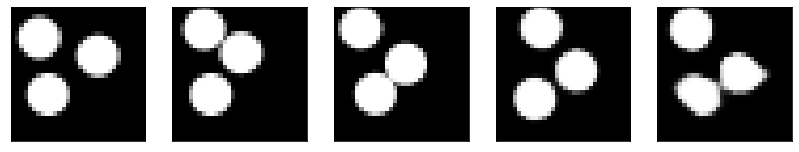

GD iterations:
i=0 | err=55.909721
i=1 | err=54.601646
i=2 | err=52.908272
i=3 | err=50.868546
i=4 | err=48.808186
i=5 | err=46.694328
i=6 | err=44.520790
i=7 | err=42.252285
i=8 | err=40.033012
i=9 | err=37.807808
i=10 | err=35.628426
i=11 | err=33.405270
i=12 | err=31.207973
i=13 | err=29.136963
i=14 | err=27.183178
i=15 | err=25.327291
i=16 | err=23.567812
i=17 | err=21.869728
i=18 | err=20.225330
i=19 | err=18.744926
i=20 | err=17.303791
i=21 | err=15.956614
i=22 | err=14.693611
i=23 | err=13.479897
i=24 | err=12.289701
i=25 | err=11.201818
i=26 | err=10.195962
i=27 | err=9.257951
i=28 | err=8.374150
i=29 | err=7.521822
Epoch=262 (46%) | out_positive=0.885925 | out_negative=0.138144 | mse=0.073057


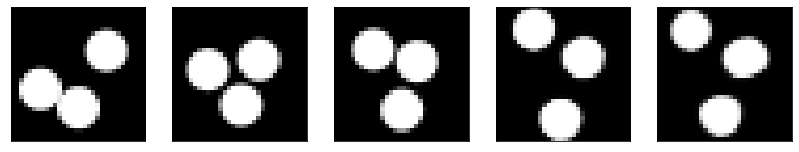

GD iterations:
i=0 | err=51.781418
i=1 | err=50.551315
i=2 | err=48.917664
i=3 | err=47.079453
i=4 | err=45.214355
i=5 | err=43.306675
i=6 | err=41.372818
i=7 | err=39.444412
i=8 | err=37.497097
i=9 | err=35.539162
i=10 | err=33.566223
i=11 | err=31.559395
i=12 | err=29.514465
i=13 | err=27.529755
i=14 | err=25.607616
i=15 | err=23.839016
i=16 | err=22.141064
i=17 | err=20.567986
i=18 | err=19.064722
i=19 | err=17.621605
i=20 | err=16.278685
i=21 | err=14.976896
i=22 | err=13.739866
i=23 | err=12.619200
i=24 | err=11.523077
i=25 | err=10.503998
i=26 | err=9.555632
i=27 | err=8.663422
i=28 | err=7.829022
i=29 | err=7.039801
Epoch=262 (48%) | out_positive=0.927355 | out_negative=0.137979 | mse=0.072228


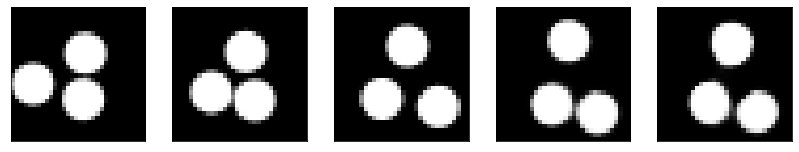

GD iterations:
i=0 | err=56.719929
i=1 | err=55.386082
i=2 | err=53.582771
i=3 | err=51.526646
i=4 | err=49.231281
i=5 | err=46.920216
i=6 | err=44.583366
i=7 | err=42.213295
i=8 | err=39.858345
i=9 | err=37.492577
i=10 | err=35.108574
i=11 | err=32.746990
i=12 | err=30.364700
i=13 | err=28.077660
i=14 | err=25.841896
i=15 | err=23.785343
i=16 | err=21.893612
i=17 | err=20.090761
i=18 | err=18.430065
i=19 | err=16.902355
i=20 | err=15.468353
i=21 | err=14.096432
i=22 | err=12.794598
i=23 | err=11.599560
i=24 | err=10.501404
i=25 | err=9.492995
i=26 | err=8.562323
i=27 | err=7.689754
i=28 | err=6.861537
i=29 | err=6.077004
Epoch=262 (50%) | out_positive=0.863451 | out_negative=0.166095 | mse=0.072290


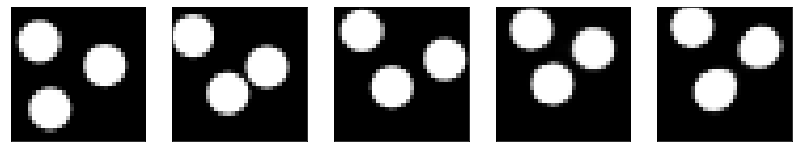

GD iterations:
i=0 | err=49.766132
i=1 | err=48.587357
i=2 | err=46.948502
i=3 | err=45.078979
i=4 | err=43.068588
i=5 | err=41.024284
i=6 | err=38.980919
i=7 | err=36.835495
i=8 | err=34.737671
i=9 | err=32.680042
i=10 | err=30.663857
i=11 | err=28.669014
i=12 | err=26.695803
i=13 | err=24.794716
i=14 | err=22.961227
i=15 | err=21.277119
i=16 | err=19.738190
i=17 | err=18.334366
i=18 | err=17.101395
i=19 | err=15.955737
i=20 | err=14.894817
i=21 | err=13.867048
i=22 | err=12.875219
i=23 | err=11.944761
i=24 | err=11.055161
i=25 | err=10.257761
i=26 | err=9.468545
i=27 | err=8.743887
i=28 | err=8.076965
i=29 | err=7.464995
Epoch=262 (52%) | out_positive=0.867362 | out_negative=0.092544 | mse=0.067031


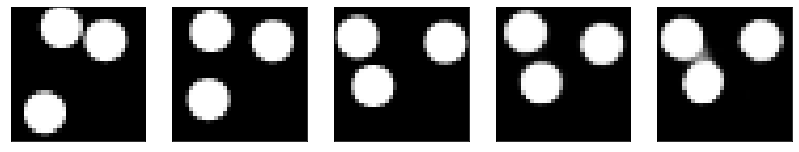

GD iterations:
i=0 | err=56.573410
i=1 | err=55.331631
i=2 | err=53.641983
i=3 | err=51.816055
i=4 | err=49.821461
i=5 | err=47.701881
i=6 | err=45.476768
i=7 | err=43.122494
i=8 | err=40.708992
i=9 | err=38.320782
i=10 | err=35.940300
i=11 | err=33.551666
i=12 | err=31.294262
i=13 | err=29.150784
i=14 | err=27.083157
i=15 | err=25.070751
i=16 | err=23.163826
i=17 | err=21.406696
i=18 | err=19.801661
i=19 | err=18.284985
i=20 | err=16.816158
i=21 | err=15.413855
i=22 | err=14.066533
i=23 | err=12.784718
i=24 | err=11.610959
i=25 | err=10.505490
i=26 | err=9.417144
i=27 | err=8.383795
i=28 | err=7.481613
i=29 | err=6.591320
Epoch=262 (53%) | out_positive=0.854291 | out_negative=0.141054 | mse=0.070619


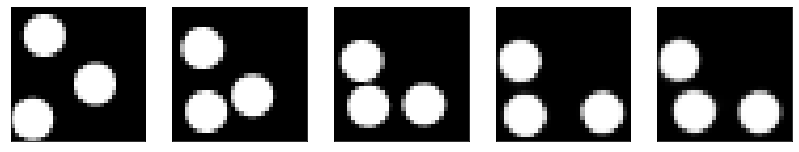

GD iterations:
i=0 | err=52.391357
i=1 | err=51.222206
i=2 | err=49.621670
i=3 | err=47.824516
i=4 | err=45.890625
i=5 | err=43.801643
i=6 | err=41.690819
i=7 | err=39.631203
i=8 | err=37.427586
i=9 | err=35.268364
i=10 | err=33.068188
i=11 | err=30.913139
i=12 | err=28.835461
i=13 | err=26.775135
i=14 | err=24.790493
i=15 | err=22.862118
i=16 | err=21.051216
i=17 | err=19.383320
i=18 | err=17.766876
i=19 | err=16.311142
i=20 | err=14.995759
i=21 | err=13.779366
i=22 | err=12.619020
i=23 | err=11.521470
i=24 | err=10.516621
i=25 | err=9.588651
i=26 | err=8.707336
i=27 | err=7.904315
i=28 | err=7.137323
i=29 | err=6.378019
Epoch=262 (55%) | out_positive=0.899536 | out_negative=0.125238 | mse=0.070107


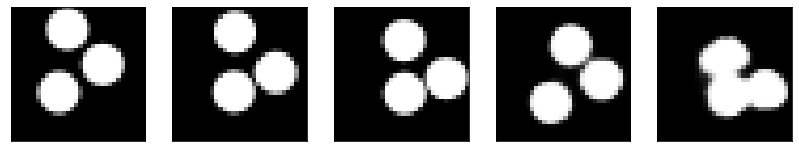

GD iterations:
i=0 | err=54.711845
i=1 | err=53.445885
i=2 | err=51.626041
i=3 | err=49.614792
i=4 | err=47.494183
i=5 | err=45.389038
i=6 | err=43.159813
i=7 | err=40.853142
i=8 | err=38.606308
i=9 | err=36.370270
i=10 | err=34.162903
i=11 | err=31.961540
i=12 | err=29.827518
i=13 | err=27.770439
i=14 | err=25.805723
i=15 | err=23.897503
i=16 | err=22.069157
i=17 | err=20.363060
i=18 | err=18.830694
i=19 | err=17.412090
i=20 | err=16.047960
i=21 | err=14.786063
i=22 | err=13.587206
i=23 | err=12.492929
i=24 | err=11.482669
i=25 | err=10.526427
i=26 | err=9.629441
i=27 | err=8.769240
i=28 | err=7.925135
i=29 | err=7.115952
Epoch=262 (57%) | out_positive=0.817455 | out_negative=0.100567 | mse=0.070306


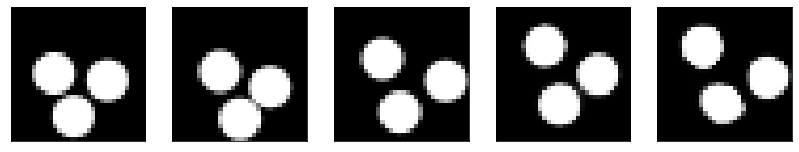

GD iterations:
i=0 | err=50.786049
i=1 | err=49.537537
i=2 | err=47.831451
i=3 | err=45.969025
i=4 | err=44.012085
i=5 | err=41.950447
i=6 | err=39.838554
i=7 | err=37.686573
i=8 | err=35.482445
i=9 | err=33.384964
i=10 | err=31.389296
i=11 | err=29.406261
i=12 | err=27.485474
i=13 | err=25.645437
i=14 | err=23.889538
i=15 | err=22.217224
i=16 | err=20.644619
i=17 | err=19.190096
i=18 | err=17.802292
i=19 | err=16.501474
i=20 | err=15.276134
i=21 | err=14.135009
i=22 | err=13.071247
i=23 | err=12.041357
i=24 | err=11.118362
i=25 | err=10.247166
i=26 | err=9.424441
i=27 | err=8.628487
i=28 | err=7.886776
i=29 | err=7.185427
Epoch=262 (59%) | out_positive=0.898106 | out_negative=0.089978 | mse=0.073522


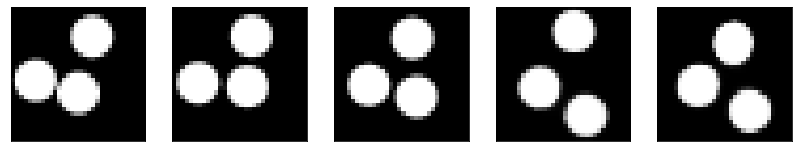

GD iterations:
i=0 | err=56.917175
i=1 | err=55.673965
i=2 | err=53.940865
i=3 | err=51.983078
i=4 | err=49.806870
i=5 | err=47.527580
i=6 | err=45.199654
i=7 | err=42.688942
i=8 | err=40.204720
i=9 | err=37.612083
i=10 | err=34.876968
i=11 | err=32.113838
i=12 | err=29.384525
i=13 | err=26.845615
i=14 | err=24.500639
i=15 | err=22.274063
i=16 | err=20.292686
i=17 | err=18.433186
i=18 | err=16.749865
i=19 | err=15.225278
i=20 | err=13.864731
i=21 | err=12.656904
i=22 | err=11.541296
i=23 | err=10.496923
i=24 | err=9.505919
i=25 | err=8.592703
i=26 | err=7.727917
i=27 | err=6.912398
i=28 | err=6.146953
i=29 | err=5.383935
Epoch=262 (61%) | out_positive=0.888572 | out_negative=0.176743 | mse=0.071166


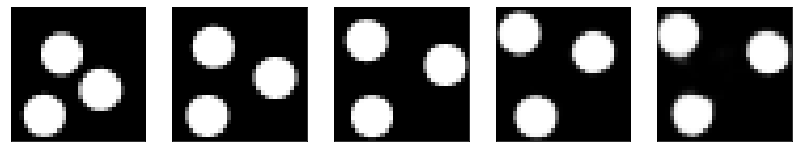

GD iterations:
i=0 | err=54.174164
i=1 | err=52.884155
i=2 | err=51.061333
i=3 | err=49.200069
i=4 | err=47.224464
i=5 | err=45.214516
i=6 | err=43.177082
i=7 | err=41.062851
i=8 | err=38.952774
i=9 | err=36.835693
i=10 | err=34.703911
i=11 | err=32.539829
i=12 | err=30.415998
i=13 | err=28.357258
i=14 | err=26.340603
i=15 | err=24.403812
i=16 | err=22.553951
i=17 | err=20.892681
i=18 | err=19.372627
i=19 | err=17.933178
i=20 | err=16.547943
i=21 | err=15.257823
i=22 | err=14.051413
i=23 | err=12.932460
i=24 | err=11.903599
i=25 | err=10.952166
i=26 | err=10.018259
i=27 | err=9.125299
i=28 | err=8.294676
i=29 | err=7.518050
Epoch=262 (62%) | out_positive=0.841652 | out_negative=0.088216 | mse=0.069969


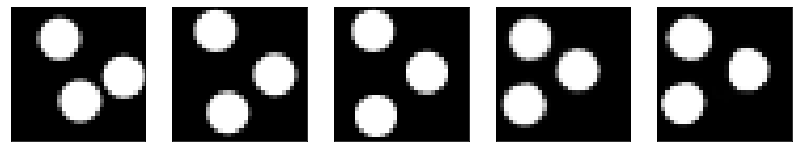

GD iterations:
i=0 | err=57.512398
i=1 | err=56.195244
i=2 | err=54.334709
i=3 | err=52.308617
i=4 | err=50.149147
i=5 | err=47.984180
i=6 | err=45.734612
i=7 | err=43.441238
i=8 | err=40.993370
i=9 | err=38.468277
i=10 | err=35.982521
i=11 | err=33.552921
i=12 | err=31.151333
i=13 | err=28.824707
i=14 | err=26.648987
i=15 | err=24.615866
i=16 | err=22.668633
i=17 | err=20.855492
i=18 | err=19.153191
i=19 | err=17.627073
i=20 | err=16.189787
i=21 | err=14.867622
i=22 | err=13.636272
i=23 | err=12.453285
i=24 | err=11.374451
i=25 | err=10.399396
i=26 | err=9.506641
i=27 | err=8.646961
i=28 | err=7.824106
i=29 | err=7.063418
Epoch=262 (64%) | out_positive=0.813534 | out_negative=0.118453 | mse=0.067940


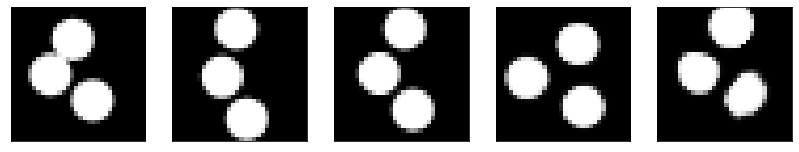

GD iterations:
i=0 | err=56.646786
i=1 | err=55.278687
i=2 | err=53.362125
i=3 | err=51.245598
i=4 | err=49.044052
i=5 | err=46.747971
i=6 | err=44.435951
i=7 | err=42.119370
i=8 | err=39.794350
i=9 | err=37.440285
i=10 | err=35.129768
i=11 | err=32.880257
i=12 | err=30.633606
i=13 | err=28.482357
i=14 | err=26.410078
i=15 | err=24.491661
i=16 | err=22.645206
i=17 | err=20.848288
i=18 | err=19.168837
i=19 | err=17.565731
i=20 | err=16.057077
i=21 | err=14.683645
i=22 | err=13.426128
i=23 | err=12.237206
i=24 | err=11.142783
i=25 | err=10.126791
i=26 | err=9.212280
i=27 | err=8.353068
i=28 | err=7.532521
i=29 | err=6.760529
Epoch=262 (66%) | out_positive=0.826125 | out_negative=0.113967 | mse=0.070365


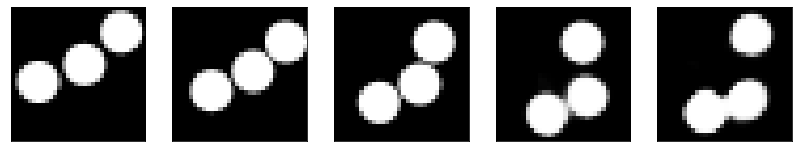

GD iterations:
i=0 | err=57.864510
i=1 | err=56.589336
i=2 | err=54.833065
i=3 | err=52.904072
i=4 | err=50.735435
i=5 | err=48.634575
i=6 | err=46.397217
i=7 | err=44.160583
i=8 | err=41.853729
i=9 | err=39.630207
i=10 | err=37.419220
i=11 | err=35.218098
i=12 | err=32.981873
i=13 | err=30.708588
i=14 | err=28.457611
i=15 | err=26.234108
i=16 | err=24.174110
i=17 | err=22.249317
i=18 | err=20.460413
i=19 | err=18.851074
i=20 | err=17.384373
i=21 | err=16.069235
i=22 | err=14.797361
i=23 | err=13.591213
i=24 | err=12.462965
i=25 | err=11.352368
i=26 | err=10.302982
i=27 | err=9.330597
i=28 | err=8.408903
i=29 | err=7.536170
Epoch=262 (68%) | out_positive=0.863218 | out_negative=0.112027 | mse=0.072824


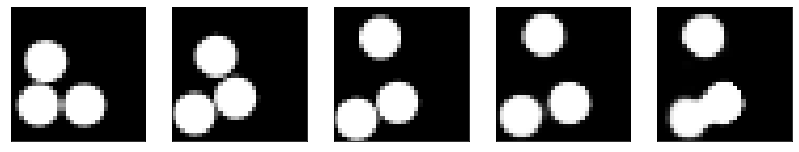

GD iterations:
i=0 | err=54.002670
i=1 | err=52.651123
i=2 | err=50.776520
i=3 | err=48.774212
i=4 | err=46.653008
i=5 | err=44.453484
i=6 | err=42.216286
i=7 | err=39.905926
i=8 | err=37.610184
i=9 | err=35.239742
i=10 | err=32.841911
i=11 | err=30.443262
i=12 | err=28.058565
i=13 | err=25.835455
i=14 | err=23.730822
i=15 | err=21.809937
i=16 | err=19.997581
i=17 | err=18.375755
i=18 | err=16.856037
i=19 | err=15.462237
i=20 | err=14.181091
i=21 | err=12.997505
i=22 | err=11.903403
i=23 | err=10.847757
i=24 | err=9.861805
i=25 | err=8.934843
i=26 | err=8.063437
i=27 | err=7.216579
i=28 | err=6.412845
i=29 | err=5.673887
Epoch=262 (70%) | out_positive=0.920747 | out_negative=0.123900 | mse=0.072798


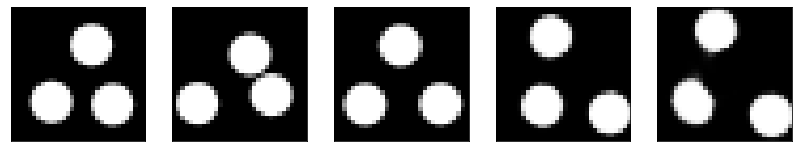

GD iterations:
i=0 | err=53.245052
i=1 | err=51.980904
i=2 | err=50.267521
i=3 | err=48.332119
i=4 | err=46.217674
i=5 | err=44.043495
i=6 | err=41.759758
i=7 | err=39.421539
i=8 | err=37.098656
i=9 | err=34.817947
i=10 | err=32.544662
i=11 | err=30.342831
i=12 | err=28.228554
i=13 | err=26.208124
i=14 | err=24.191910
i=15 | err=22.200359
i=16 | err=20.354809
i=17 | err=18.599606
i=18 | err=16.941166
i=19 | err=15.385298
i=20 | err=13.940039
i=21 | err=12.692984
i=22 | err=11.587358
i=23 | err=10.580448
i=24 | err=9.643150
i=25 | err=8.771498
i=26 | err=7.971345
i=27 | err=7.225173
i=28 | err=6.507202
i=29 | err=5.817766
Epoch=262 (72%) | out_positive=0.868326 | out_negative=0.152134 | mse=0.072243


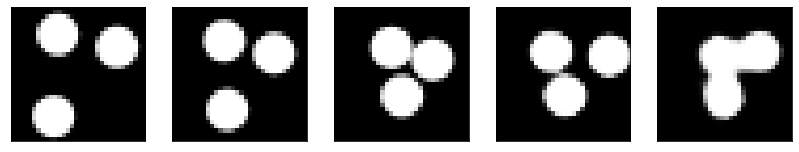

GD iterations:
i=0 | err=54.459641
i=1 | err=53.273994
i=2 | err=51.575912
i=3 | err=49.687180
i=4 | err=47.646164
i=5 | err=45.566887
i=6 | err=43.352119
i=7 | err=41.128189
i=8 | err=38.887016
i=9 | err=36.663773
i=10 | err=34.385254
i=11 | err=31.979511
i=12 | err=29.574051
i=13 | err=27.236237
i=14 | err=25.026955
i=15 | err=22.922092
i=16 | err=20.878937
i=17 | err=18.998562
i=18 | err=17.254181
i=19 | err=15.673923
i=20 | err=14.250722
i=21 | err=12.943035
i=22 | err=11.764458
i=23 | err=10.660367
i=24 | err=9.607262
i=25 | err=8.635891
i=26 | err=7.752976
i=27 | err=6.929909
i=28 | err=6.137900
i=29 | err=5.365919
Epoch=262 (74%) | out_positive=0.929700 | out_negative=0.174709 | mse=0.067643


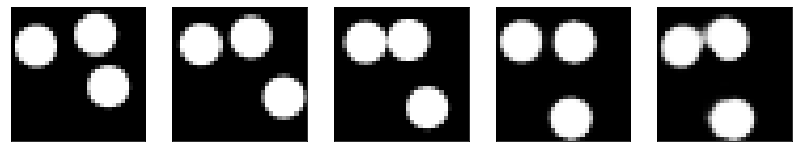

GD iterations:
i=0 | err=52.398094
i=1 | err=51.100895
i=2 | err=49.314201
i=3 | err=47.329636
i=4 | err=45.152916
i=5 | err=42.831398
i=6 | err=40.428665
i=7 | err=38.076107
i=8 | err=35.775528
i=9 | err=33.506226
i=10 | err=31.249107
i=11 | err=29.041386
i=12 | err=26.910191
i=13 | err=24.900393
i=14 | err=22.991837
i=15 | err=21.213795
i=16 | err=19.570522
i=17 | err=18.046936
i=18 | err=16.690920
i=19 | err=15.399618
i=20 | err=14.193555
i=21 | err=12.985802
i=22 | err=11.840786
i=23 | err=10.757034
i=24 | err=9.757093
i=25 | err=8.800159
i=26 | err=7.934173
i=27 | err=7.155459
i=28 | err=6.389853
i=29 | err=5.671480
Epoch=262 (75%) | out_positive=0.908360 | out_negative=0.180312 | mse=0.064272


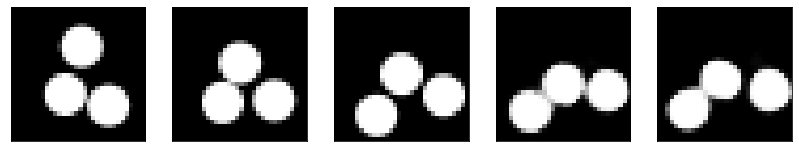

GD iterations:
i=0 | err=55.016102
i=1 | err=53.784393
i=2 | err=52.032562
i=3 | err=50.105190
i=4 | err=48.067329
i=5 | err=45.941628
i=6 | err=43.768463
i=7 | err=41.486168
i=8 | err=39.143738
i=9 | err=36.817841
i=10 | err=34.488258
i=11 | err=32.249138
i=12 | err=30.079021
i=13 | err=27.967083
i=14 | err=25.915213
i=15 | err=24.000164
i=16 | err=22.201187
i=17 | err=20.500053
i=18 | err=18.906425
i=19 | err=17.424660
i=20 | err=16.051655
i=21 | err=14.774023
i=22 | err=13.575659
i=23 | err=12.480248
i=24 | err=11.474716
i=25 | err=10.563831
i=26 | err=9.706659
i=27 | err=8.871143
i=28 | err=8.023730
i=29 | err=7.175020
Epoch=262 (77%) | out_positive=0.811636 | out_negative=0.115065 | mse=0.068830


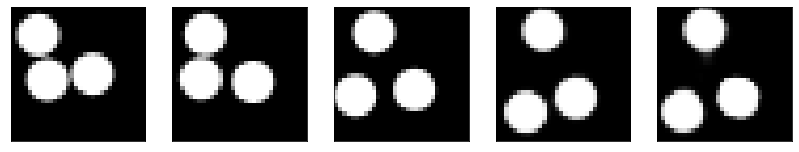

GD iterations:
i=0 | err=55.573879
i=1 | err=54.377319
i=2 | err=52.669994
i=3 | err=50.778763
i=4 | err=48.770248
i=5 | err=46.676857
i=6 | err=44.490219
i=7 | err=42.233841
i=8 | err=39.957058
i=9 | err=37.594704
i=10 | err=35.253735
i=11 | err=33.000298
i=12 | err=30.847786
i=13 | err=28.838661
i=14 | err=26.971102
i=15 | err=25.225849
i=16 | err=23.567957
i=17 | err=21.967690
i=18 | err=20.431698
i=19 | err=18.980169
i=20 | err=17.619553
i=21 | err=16.274984
i=22 | err=14.985611
i=23 | err=13.743080
i=24 | err=12.565804
i=25 | err=11.482271
i=26 | err=10.480732
i=27 | err=9.557909
i=28 | err=8.713942
i=29 | err=7.883328
Epoch=262 (79%) | out_positive=0.864130 | out_negative=0.107850 | mse=0.073921


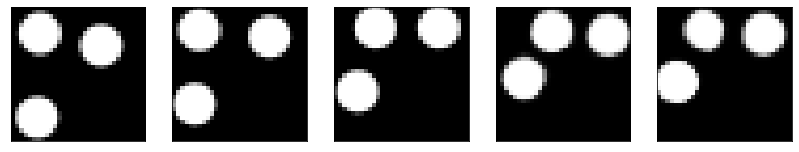

GD iterations:
i=0 | err=53.889801
i=1 | err=52.646656
i=2 | err=50.781433
i=3 | err=48.668652
i=4 | err=46.423939
i=5 | err=44.125496
i=6 | err=41.739204
i=7 | err=39.246254
i=8 | err=36.843220
i=9 | err=34.401688
i=10 | err=31.961987
i=11 | err=29.611221
i=12 | err=27.450230
i=13 | err=25.427540
i=14 | err=23.511200
i=15 | err=21.718868
i=16 | err=20.060020
i=17 | err=18.463284
i=18 | err=17.031170
i=19 | err=15.703794
i=20 | err=14.505949
i=21 | err=13.417868
i=22 | err=12.416906
i=23 | err=11.468093
i=24 | err=10.567860
i=25 | err=9.701653
i=26 | err=8.871983
i=27 | err=8.048168
i=28 | err=7.278649
i=29 | err=6.536500
Epoch=262 (81%) | out_positive=0.877970 | out_negative=0.128849 | mse=0.073440


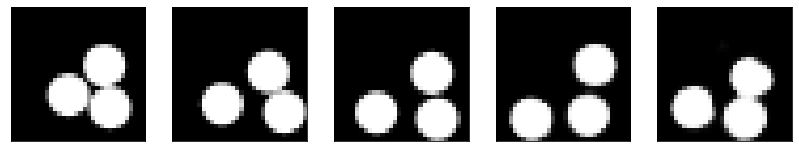

GD iterations:
i=0 | err=56.498940
i=1 | err=55.323051
i=2 | err=53.684574
i=3 | err=51.783890
i=4 | err=49.754757
i=5 | err=47.706486
i=6 | err=45.535316
i=7 | err=43.318165
i=8 | err=41.029716
i=9 | err=38.686409
i=10 | err=36.363625
i=11 | err=33.988983
i=12 | err=31.664055
i=13 | err=29.385208
i=14 | err=27.267500
i=15 | err=25.152267
i=16 | err=23.189503
i=17 | err=21.316849
i=18 | err=19.513363
i=19 | err=17.910204
i=20 | err=16.492231
i=21 | err=15.155464
i=22 | err=13.882364
i=23 | err=12.683990
i=24 | err=11.578666
i=25 | err=10.564160
i=26 | err=9.626055
i=27 | err=8.700861
i=28 | err=7.848674
i=29 | err=7.003432
Epoch=262 (83%) | out_positive=0.887173 | out_negative=0.138608 | mse=0.074085


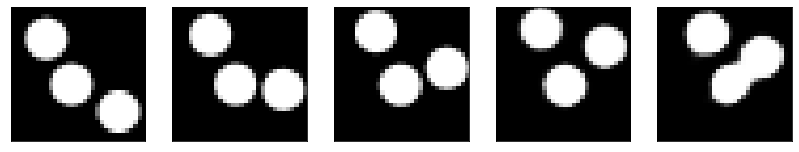

GD iterations:
i=0 | err=54.612419
i=1 | err=53.440681
i=2 | err=51.760612
i=3 | err=49.858204
i=4 | err=47.817345
i=5 | err=45.660255
i=6 | err=43.336685
i=7 | err=41.045731
i=8 | err=38.779007
i=9 | err=36.534508
i=10 | err=34.384766
i=11 | err=32.186157
i=12 | err=30.001034
i=13 | err=27.886927
i=14 | err=25.804996
i=15 | err=23.903564
i=16 | err=22.161983
i=17 | err=20.532021
i=18 | err=18.988911
i=19 | err=17.510956
i=20 | err=16.161661
i=21 | err=14.904198
i=22 | err=13.704553
i=23 | err=12.541610
i=24 | err=11.415659
i=25 | err=10.348904
i=26 | err=9.320282
i=27 | err=8.364491
i=28 | err=7.475576
i=29 | err=6.655539
Epoch=262 (85%) | out_positive=0.896716 | out_negative=0.151008 | mse=0.067309


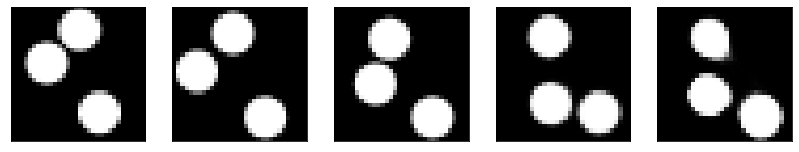

GD iterations:
i=0 | err=56.142937
i=1 | err=54.934624
i=2 | err=53.296982
i=3 | err=51.463799
i=4 | err=49.598797
i=5 | err=47.614220
i=6 | err=45.459278
i=7 | err=43.295357
i=8 | err=41.159866
i=9 | err=39.039619
i=10 | err=36.843468
i=11 | err=34.582977
i=12 | err=32.341770
i=13 | err=30.157467
i=14 | err=28.046476
i=15 | err=26.032835
i=16 | err=24.109055
i=17 | err=22.322813
i=18 | err=20.603916
i=19 | err=19.006023
i=20 | err=17.506487
i=21 | err=16.156244
i=22 | err=14.918402
i=23 | err=13.783131
i=24 | err=12.697168
i=25 | err=11.649159
i=26 | err=10.668773
i=27 | err=9.739801
i=28 | err=8.841922
i=29 | err=7.993515
Epoch=262 (86%) | out_positive=0.878892 | out_negative=0.089743 | mse=0.075366


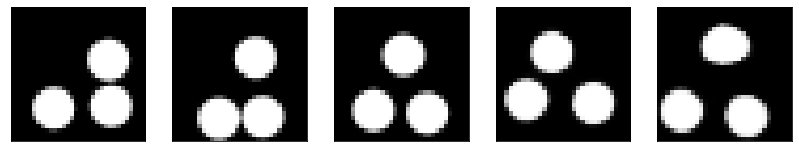

GD iterations:
i=0 | err=54.551834
i=1 | err=53.292435
i=2 | err=51.622662
i=3 | err=49.768345
i=4 | err=47.768856
i=5 | err=45.682106
i=6 | err=43.540756
i=7 | err=41.343117
i=8 | err=39.060684
i=9 | err=36.786850
i=10 | err=34.503880
i=11 | err=32.293091
i=12 | err=30.190649
i=13 | err=28.230499
i=14 | err=26.334507
i=15 | err=24.560547
i=16 | err=22.910265
i=17 | err=21.353622
i=18 | err=19.940248
i=19 | err=18.640379
i=20 | err=17.423931
i=21 | err=16.252857
i=22 | err=15.140276
i=23 | err=14.065352
i=24 | err=13.045446
i=25 | err=12.067542
i=26 | err=11.113806
i=27 | err=10.161814
i=28 | err=9.281834
i=29 | err=8.471230
Epoch=262 (88%) | out_positive=0.798862 | out_negative=0.073068 | mse=0.071468


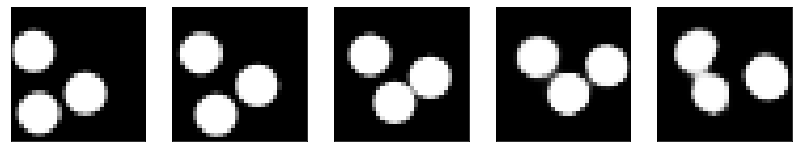

GD iterations:
i=0 | err=56.837593
i=1 | err=55.548046
i=2 | err=53.826401
i=3 | err=51.853569
i=4 | err=49.764275
i=5 | err=47.590122
i=6 | err=45.266327
i=7 | err=42.851711
i=8 | err=40.440590
i=9 | err=37.955414
i=10 | err=35.407223
i=11 | err=32.980083
i=12 | err=30.598722
i=13 | err=28.319706
i=14 | err=26.061464
i=15 | err=23.924465
i=16 | err=21.895588
i=17 | err=19.980629
i=18 | err=18.160366
i=19 | err=16.466726
i=20 | err=14.953438
i=21 | err=13.629534
i=22 | err=12.472294
i=23 | err=11.429150
i=24 | err=10.426750
i=25 | err=9.483857
i=26 | err=8.570134
i=27 | err=7.690015
i=28 | err=6.858925
i=29 | err=6.079668
Epoch=262 (90%) | out_positive=0.796840 | out_negative=0.103652 | mse=0.065689


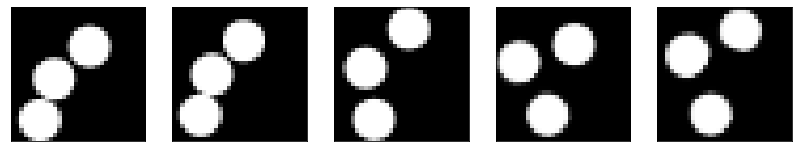

GD iterations:
i=0 | err=53.637760
i=1 | err=52.432049
i=2 | err=50.741829
i=3 | err=48.805161
i=4 | err=46.826508
i=5 | err=44.704021
i=6 | err=42.624210
i=7 | err=40.455170
i=8 | err=38.278065
i=9 | err=36.073841
i=10 | err=33.922363
i=11 | err=31.881124
i=12 | err=29.882149
i=13 | err=27.879732
i=14 | err=26.010578
i=15 | err=24.128246
i=16 | err=22.303650
i=17 | err=20.574917
i=18 | err=18.969730
i=19 | err=17.497444
i=20 | err=16.149912
i=21 | err=14.872387
i=22 | err=13.691072
i=23 | err=12.598101
i=24 | err=11.583839
i=25 | err=10.629072
i=26 | err=9.716954
i=27 | err=8.876502
i=28 | err=8.064917
i=29 | err=7.277384
Epoch=262 (92%) | out_positive=0.921042 | out_negative=0.102927 | mse=0.076517


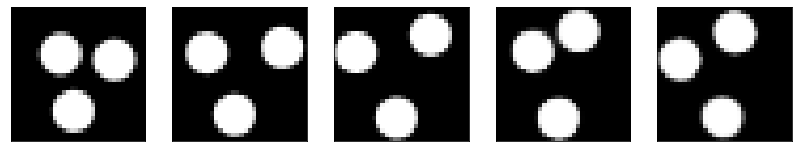

GD iterations:
i=0 | err=51.516479
i=1 | err=50.174072
i=2 | err=48.485043
i=3 | err=46.635925
i=4 | err=44.736313
i=5 | err=42.813438
i=6 | err=40.854065
i=7 | err=38.911259
i=8 | err=36.976402
i=9 | err=35.024448
i=10 | err=33.070770
i=11 | err=31.104065
i=12 | err=29.187038
i=13 | err=27.238544
i=14 | err=25.381096
i=15 | err=23.610950
i=16 | err=21.947060
i=17 | err=20.311684
i=18 | err=18.762310
i=19 | err=17.271099
i=20 | err=15.892061
i=21 | err=14.607449
i=22 | err=13.391608
i=23 | err=12.278845
i=24 | err=11.258048
i=25 | err=10.311316
i=26 | err=9.444345
i=27 | err=8.631771
i=28 | err=7.861657
i=29 | err=7.129485
Epoch=262 (94%) | out_positive=0.874695 | out_negative=0.130210 | mse=0.076020


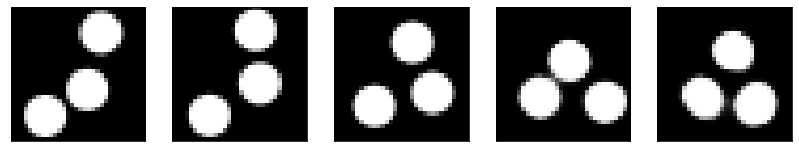

GD iterations:
i=0 | err=53.714539
i=1 | err=52.483459
i=2 | err=50.767990
i=3 | err=48.730347
i=4 | err=46.585762
i=5 | err=44.489883
i=6 | err=42.287979
i=7 | err=40.006783
i=8 | err=37.703281
i=9 | err=35.414062
i=10 | err=33.069702
i=11 | err=30.828697
i=12 | err=28.698772
i=13 | err=26.730131
i=14 | err=24.804508
i=15 | err=22.987972
i=16 | err=21.303476
i=17 | err=19.695751
i=18 | err=18.130581
i=19 | err=16.647850
i=20 | err=15.259691
i=21 | err=13.975176
i=22 | err=12.781723
i=23 | err=11.598816
i=24 | err=10.531914
i=25 | err=9.535606
i=26 | err=8.601938
i=27 | err=7.745789
i=28 | err=6.919145
i=29 | err=6.156219
Epoch=262 (96%) | out_positive=0.949711 | out_negative=0.170056 | mse=0.072003


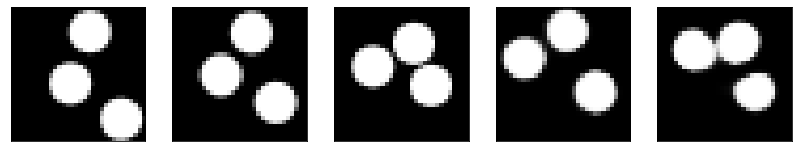

GD iterations:
i=0 | err=53.739601
i=1 | err=52.538101
i=2 | err=50.968113
i=3 | err=49.171432
i=4 | err=47.308777
i=5 | err=45.380821
i=6 | err=43.416973
i=7 | err=41.410698
i=8 | err=39.339020
i=9 | err=37.166649
i=10 | err=35.079613
i=11 | err=33.070557
i=12 | err=31.076658
i=13 | err=29.167404
i=14 | err=27.295164
i=15 | err=25.431694
i=16 | err=23.689587
i=17 | err=21.995310
i=18 | err=20.410151
i=19 | err=18.925220
i=20 | err=17.524914
i=21 | err=16.210524
i=22 | err=15.001156
i=23 | err=13.863148
i=24 | err=12.779903
i=25 | err=11.746399
i=26 | err=10.755371
i=27 | err=9.833109
i=28 | err=8.925861
i=29 | err=8.043427
Epoch=262 (97%) | out_positive=0.827372 | out_negative=0.094350 | mse=0.070208


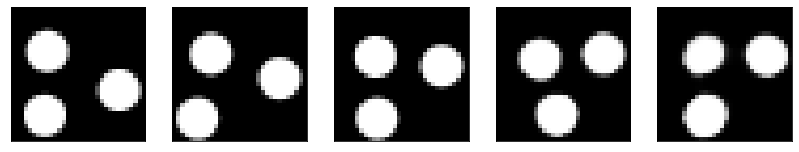

GD iterations:
i=0 | err=54.140247
i=1 | err=52.994186
i=2 | err=51.386635
i=3 | err=49.652470
i=4 | err=47.819431
i=5 | err=45.901497
i=6 | err=43.862877
i=7 | err=41.691231
i=8 | err=39.498154
i=9 | err=37.199001
i=10 | err=34.779907
i=11 | err=32.348969
i=12 | err=29.882275
i=13 | err=27.409618
i=14 | err=25.104927
i=15 | err=22.948584
i=16 | err=20.926548
i=17 | err=19.064425
i=18 | err=17.437170
i=19 | err=15.966913
i=20 | err=14.643400
i=21 | err=13.428797
i=22 | err=12.314116
i=23 | err=11.304311
i=24 | err=10.364594
i=25 | err=9.508479
i=26 | err=8.672772
i=27 | err=7.864332
i=28 | err=7.100358
i=29 | err=6.388360
Epoch=262 (99%) | out_positive=0.844906 | out_negative=0.140471 | mse=0.070295


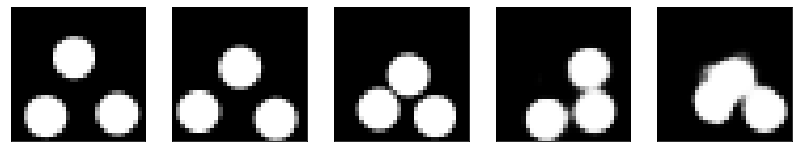

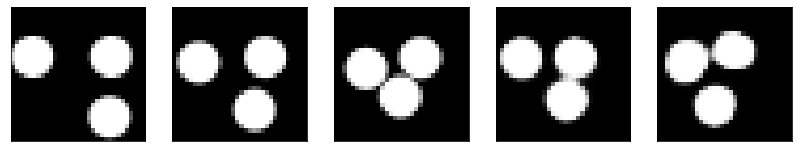

Test MSE 0.078749


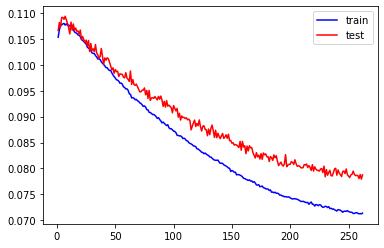

GD iterations:
i=0 | err=52.212578
i=1 | err=50.975243
i=2 | err=49.243347
i=3 | err=47.304184
i=4 | err=45.316719
i=5 | err=43.219269
i=6 | err=41.056072
i=7 | err=38.859276
i=8 | err=36.659760
i=9 | err=34.521206
i=10 | err=32.350586
i=11 | err=30.255539
i=12 | err=28.197510
i=13 | err=26.164621
i=14 | err=24.215549
i=15 | err=22.290310
i=16 | err=20.454502
i=17 | err=18.753616
i=18 | err=17.229504
i=19 | err=15.886380
i=20 | err=14.617408
i=21 | err=13.400774
i=22 | err=12.287072
i=23 | err=11.265511
i=24 | err=10.326096
i=25 | err=9.477004
i=26 | err=8.668115
i=27 | err=7.914004
i=28 | err=7.173894
i=29 | err=6.459351
Epoch=263 (0%) | out_positive=0.873006 | out_negative=0.123422 | mse=0.070360


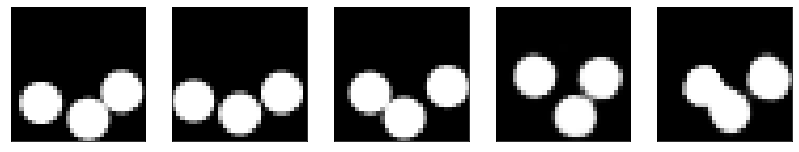

GD iterations:
i=0 | err=51.151207
i=1 | err=49.893906
i=2 | err=48.256302
i=3 | err=46.503380
i=4 | err=44.712471
i=5 | err=42.823959
i=6 | err=40.882828
i=7 | err=38.921864
i=8 | err=36.972816
i=9 | err=35.007088
i=10 | err=33.035618
i=11 | err=31.058113
i=12 | err=29.084091
i=13 | err=27.162003
i=14 | err=25.307476
i=15 | err=23.501102
i=16 | err=21.816010
i=17 | err=20.272390
i=18 | err=18.821247
i=19 | err=17.431055
i=20 | err=16.137493
i=21 | err=14.884924
i=22 | err=13.657820
i=23 | err=12.522614
i=24 | err=11.476713
i=25 | err=10.479338
i=26 | err=9.544660
i=27 | err=8.680486
i=28 | err=7.858566
i=29 | err=7.082473
Epoch=263 (2%) | out_positive=0.865217 | out_negative=0.095357 | mse=0.072509


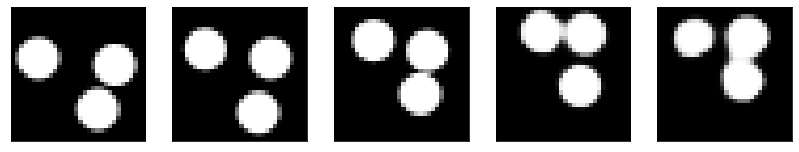

GD iterations:
i=0 | err=54.962250
i=1 | err=53.665829
i=2 | err=51.969460
i=3 | err=50.080482
i=4 | err=47.996269
i=5 | err=45.879631
i=6 | err=43.673634
i=7 | err=41.501099
i=8 | err=39.335602
i=9 | err=37.152409
i=10 | err=34.985168
i=11 | err=32.716431
i=12 | err=30.470123
i=13 | err=28.326323
i=14 | err=26.203083
i=15 | err=24.207165
i=16 | err=22.317377
i=17 | err=20.527681
i=18 | err=18.884468
i=19 | err=17.329651
i=20 | err=15.943572
i=21 | err=14.660025
i=22 | err=13.517267
i=23 | err=12.471489
i=24 | err=11.494815
i=25 | err=10.599449
i=26 | err=9.739182
i=27 | err=8.914741
i=28 | err=8.103527
i=29 | err=7.317330
Epoch=263 (4%) | out_positive=0.875050 | out_negative=0.108744 | mse=0.072114


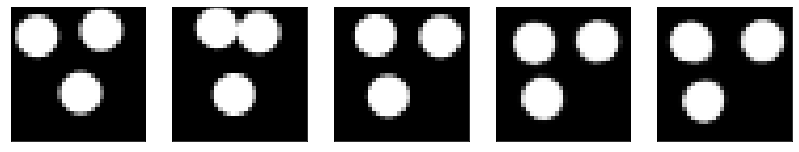

GD iterations:
i=0 | err=50.748672
i=1 | err=49.437164
i=2 | err=47.787716
i=3 | err=45.956383
i=4 | err=44.024605
i=5 | err=42.089066
i=6 | err=40.114918
i=7 | err=38.127289
i=8 | err=36.120579
i=9 | err=34.056808
i=10 | err=31.980631
i=11 | err=29.857281
i=12 | err=27.817432
i=13 | err=25.850746
i=14 | err=23.964506
i=15 | err=22.172560
i=16 | err=20.514029
i=17 | err=19.009418
i=18 | err=17.592411
i=19 | err=16.246983
i=20 | err=14.933188
i=21 | err=13.714493
i=22 | err=12.536268
i=23 | err=11.454658
i=24 | err=10.481367
i=25 | err=9.560114
i=26 | err=8.677097
i=27 | err=7.836857
i=28 | err=7.033363
i=29 | err=6.273036
Epoch=263 (6%) | out_positive=0.911514 | out_negative=0.144817 | mse=0.074935


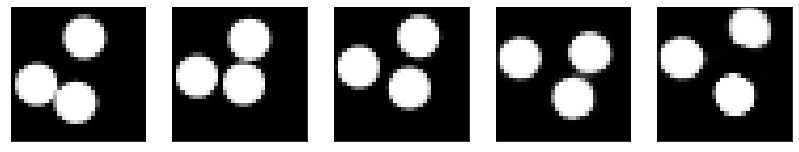

GD iterations:
i=0 | err=56.190346
i=1 | err=54.843636
i=2 | err=53.001343
i=3 | err=50.871910
i=4 | err=48.518230
i=5 | err=46.178471
i=6 | err=43.760349
i=7 | err=41.245041
i=8 | err=38.758972
i=9 | err=36.271435
i=10 | err=33.752155
i=11 | err=31.315533
i=12 | err=29.040451
i=13 | err=26.921288
i=14 | err=24.949770
i=15 | err=23.122677
i=16 | err=21.409458
i=17 | err=19.824827
i=18 | err=18.325399
i=19 | err=16.937145
i=20 | err=15.663176
i=21 | err=14.474996
i=22 | err=13.356215
i=23 | err=12.336634
i=24 | err=11.379934
i=25 | err=10.485634
i=26 | err=9.624002
i=27 | err=8.811546
i=28 | err=8.037202
i=29 | err=7.324957
Epoch=263 (8%) | out_positive=0.845356 | out_negative=0.127065 | mse=0.070421


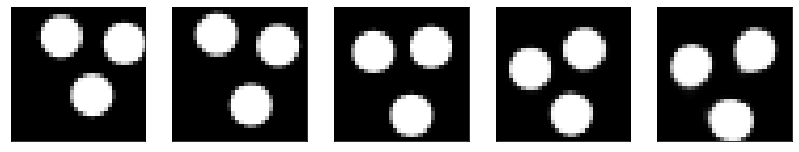

GD iterations:
i=0 | err=56.176994
i=1 | err=54.898506
i=2 | err=52.998119
i=3 | err=50.871956
i=4 | err=48.684677
i=5 | err=46.322311
i=6 | err=43.974609
i=7 | err=41.506516
i=8 | err=39.105446
i=9 | err=36.645111
i=10 | err=34.134739
i=11 | err=31.673759
i=12 | err=29.291622
i=13 | err=27.040840
i=14 | err=24.976280
i=15 | err=23.016247
i=16 | err=21.266632
i=17 | err=19.635284
i=18 | err=18.102993
i=19 | err=16.645254
i=20 | err=15.218908
i=21 | err=13.915830
i=22 | err=12.701015
i=23 | err=11.618692
i=24 | err=10.623358
i=25 | err=9.686780
i=26 | err=8.785460
i=27 | err=7.892653
i=28 | err=7.041234
i=29 | err=6.206553
Epoch=263 (9%) | out_positive=0.858977 | out_negative=0.153613 | mse=0.064080


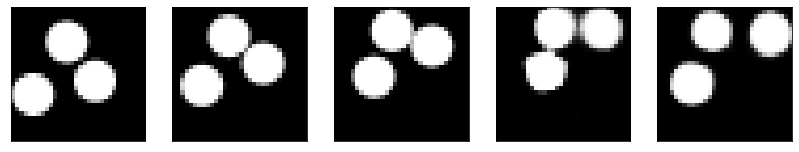

GD iterations:
i=0 | err=54.303757
i=1 | err=53.164291
i=2 | err=51.570969
i=3 | err=49.748600
i=4 | err=47.814255
i=5 | err=45.772568
i=6 | err=43.658150
i=7 | err=41.478573
i=8 | err=39.202049
i=9 | err=36.850704
i=10 | err=34.449005
i=11 | err=32.138206
i=12 | err=29.883213
i=13 | err=27.673277
i=14 | err=25.600046
i=15 | err=23.672062
i=16 | err=21.917519
i=17 | err=20.235161
i=18 | err=18.670948
i=19 | err=17.210962
i=20 | err=15.832752
i=21 | err=14.559853
i=22 | err=13.275049
i=23 | err=12.090546
i=24 | err=10.950362
i=25 | err=9.890327
i=26 | err=8.901995
i=27 | err=8.006664
i=28 | err=7.145196
i=29 | err=6.315806
Epoch=263 (11%) | out_positive=0.898585 | out_negative=0.143065 | mse=0.071064


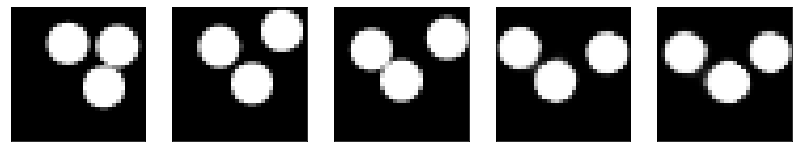

GD iterations:
i=0 | err=51.868027
i=1 | err=50.786522
i=2 | err=49.301331
i=3 | err=47.692020
i=4 | err=45.953430
i=5 | err=44.180473
i=6 | err=42.297241
i=7 | err=40.295326
i=8 | err=38.150921
i=9 | err=36.058624
i=10 | err=33.884472
i=11 | err=31.737843
i=12 | err=29.686939
i=13 | err=27.698311
i=14 | err=25.720510
i=15 | err=23.884756
i=16 | err=22.065178
i=17 | err=20.374424
i=18 | err=18.754772
i=19 | err=17.211754
i=20 | err=15.769394
i=21 | err=14.453148
i=22 | err=13.210953
i=23 | err=12.081039
i=24 | err=11.024212
i=25 | err=10.018492
i=26 | err=9.041138
i=27 | err=8.146343
i=28 | err=7.267995
i=29 | err=6.436834
Epoch=263 (13%) | out_positive=0.894976 | out_negative=0.176811 | mse=0.074488


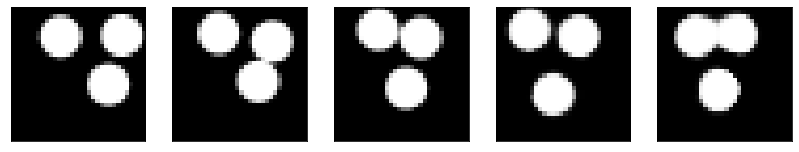

GD iterations:
i=0 | err=51.278408
i=1 | err=50.105228
i=2 | err=48.553577
i=3 | err=46.766808
i=4 | err=44.882481
i=5 | err=42.913055
i=6 | err=40.827438
i=7 | err=38.639938
i=8 | err=36.373238
i=9 | err=34.131775
i=10 | err=31.918888
i=11 | err=29.836292
i=12 | err=27.740387
i=13 | err=25.661043
i=14 | err=23.686445
i=15 | err=21.884109
i=16 | err=20.229914
i=17 | err=18.675859
i=18 | err=17.234713
i=19 | err=15.897760
i=20 | err=14.686336
i=21 | err=13.552976
i=22 | err=12.496561
i=23 | err=11.524480
i=24 | err=10.620573
i=25 | err=9.755242
i=26 | err=8.967253
i=27 | err=8.205866
i=28 | err=7.493901
i=29 | err=6.790664
Epoch=263 (15%) | out_positive=0.856065 | out_negative=0.124407 | mse=0.071147


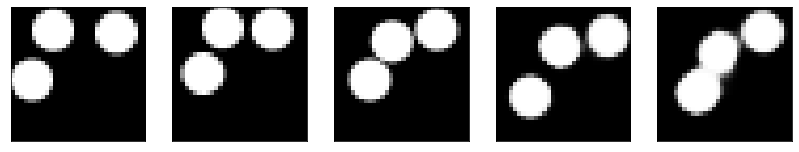

GD iterations:
i=0 | err=57.309341
i=1 | err=56.046494
i=2 | err=54.317039
i=3 | err=52.243008
i=4 | err=50.051891
i=5 | err=47.783089
i=6 | err=45.450325
i=7 | err=43.099689
i=8 | err=40.711266
i=9 | err=38.360672
i=10 | err=35.997047
i=11 | err=33.599426
i=12 | err=31.181843
i=13 | err=28.816326
i=14 | err=26.594059
i=15 | err=24.483541
i=16 | err=22.533371
i=17 | err=20.664482
i=18 | err=18.838724
i=19 | err=17.193399
i=20 | err=15.743089
i=21 | err=14.413649
i=22 | err=13.175783
i=23 | err=11.995510
i=24 | err=10.895357
i=25 | err=9.870079
i=26 | err=8.920109
i=27 | err=8.031606
i=28 | err=7.209233
i=29 | err=6.435106
Epoch=263 (17%) | out_positive=0.843856 | out_negative=0.124359 | mse=0.066774


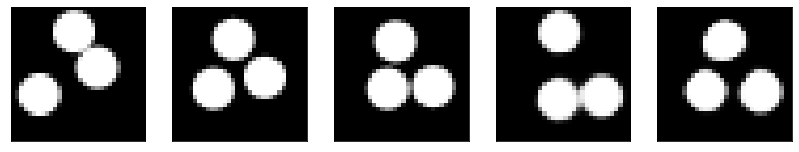

GD iterations:
i=0 | err=57.599548
i=1 | err=56.399780
i=2 | err=54.765556
i=3 | err=52.900986
i=4 | err=50.956211
i=5 | err=48.839294
i=6 | err=46.630657
i=7 | err=44.320564
i=8 | err=41.976418
i=9 | err=39.460625
i=10 | err=36.962082
i=11 | err=34.424679
i=12 | err=31.874714
i=13 | err=29.279812
i=14 | err=26.854414
i=15 | err=24.608002
i=16 | err=22.497501
i=17 | err=20.563820
i=18 | err=18.852718
i=19 | err=17.291603
i=20 | err=15.880816
i=21 | err=14.566147
i=22 | err=13.294158
i=23 | err=12.116442
i=24 | err=11.026577
i=25 | err=10.008278
i=26 | err=9.057033
i=27 | err=8.161573
i=28 | err=7.288340
i=29 | err=6.476605
Epoch=263 (19%) | out_positive=0.881153 | out_negative=0.142971 | mse=0.069303


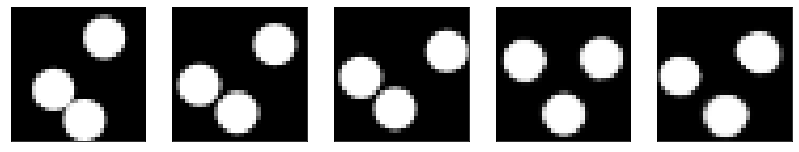

GD iterations:
i=0 | err=55.012287
i=1 | err=53.693214
i=2 | err=51.875824
i=3 | err=49.932751
i=4 | err=47.894249
i=5 | err=45.816269
i=6 | err=43.634972
i=7 | err=41.370941
i=8 | err=39.049248
i=9 | err=36.785301
i=10 | err=34.518784
i=11 | err=32.245293
i=12 | err=30.008184
i=13 | err=27.805458
i=14 | err=25.700558
i=15 | err=23.760988
i=16 | err=21.868755
i=17 | err=20.114983
i=18 | err=18.521923
i=19 | err=17.051121
i=20 | err=15.672720
i=21 | err=14.376026
i=22 | err=13.180777
i=23 | err=12.057667
i=24 | err=10.983686
i=25 | err=10.002711
i=26 | err=9.097840
i=27 | err=8.243393
i=28 | err=7.421377
i=29 | err=6.642622
Epoch=263 (20%) | out_positive=0.915190 | out_negative=0.130454 | mse=0.072668


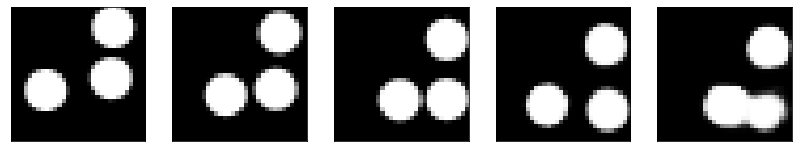

GD iterations:
i=0 | err=55.120155
i=1 | err=53.961174
i=2 | err=52.279110
i=3 | err=50.520195
i=4 | err=48.616058
i=5 | err=46.611465
i=6 | err=44.462090
i=7 | err=42.278137
i=8 | err=39.994766
i=9 | err=37.731743
i=10 | err=35.458656
i=11 | err=33.243214
i=12 | err=31.045198
i=13 | err=28.876003
i=14 | err=26.768093
i=15 | err=24.770231
i=16 | err=22.833538
i=17 | err=21.001709
i=18 | err=19.300308
i=19 | err=17.716537
i=20 | err=16.178219
i=21 | err=14.769587
i=22 | err=13.497941
i=23 | err=12.343916
i=24 | err=11.322523
i=25 | err=10.389765
i=26 | err=9.527084
i=27 | err=8.728501
i=28 | err=7.960423
i=29 | err=7.242540
Epoch=263 (22%) | out_positive=0.794265 | out_negative=0.098514 | mse=0.068260


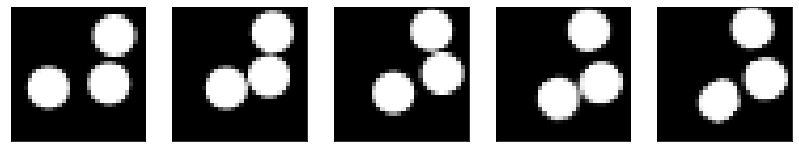

GD iterations:
i=0 | err=58.393539
i=1 | err=57.029594
i=2 | err=55.190987
i=3 | err=53.147354
i=4 | err=50.931767
i=5 | err=48.732471
i=6 | err=46.558289
i=7 | err=44.162369
i=8 | err=41.727493
i=9 | err=39.305672
i=10 | err=36.937401
i=11 | err=34.513409
i=12 | err=32.071331
i=13 | err=29.636452
i=14 | err=27.381481
i=15 | err=25.250946
i=16 | err=23.198286
i=17 | err=21.217381
i=18 | err=19.352951
i=19 | err=17.620714
i=20 | err=16.020752
i=21 | err=14.515115
i=22 | err=13.156026
i=23 | err=11.916990
i=24 | err=10.776045
i=25 | err=9.735995
i=26 | err=8.776321
i=27 | err=7.871374
i=28 | err=7.046423
i=29 | err=6.262466
Epoch=263 (24%) | out_positive=0.863277 | out_negative=0.133903 | mse=0.068296


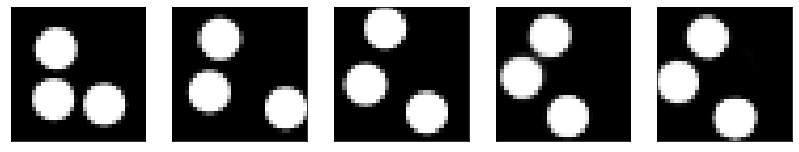

GD iterations:
i=0 | err=57.469650
i=1 | err=56.253601
i=2 | err=54.550236
i=3 | err=52.594154
i=4 | err=50.522163
i=5 | err=48.431702
i=6 | err=46.168800
i=7 | err=43.831589
i=8 | err=41.412342
i=9 | err=39.058098
i=10 | err=36.745323
i=11 | err=34.498436
i=12 | err=32.208538
i=13 | err=29.947472
i=14 | err=27.668171
i=15 | err=25.528175
i=16 | err=23.602501
i=17 | err=21.823439
i=18 | err=20.168379
i=19 | err=18.601318
i=20 | err=17.104088
i=21 | err=15.689394
i=22 | err=14.342194
i=23 | err=13.124954
i=24 | err=11.999674
i=25 | err=10.917429
i=26 | err=9.875895
i=27 | err=8.885342
i=28 | err=7.966259
i=29 | err=7.114116
Epoch=263 (26%) | out_positive=0.886326 | out_negative=0.138260 | mse=0.077567


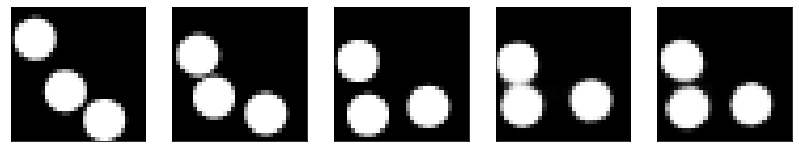

GD iterations:
i=0 | err=54.390343
i=1 | err=53.191414
i=2 | err=51.508850
i=3 | err=49.579201
i=4 | err=47.589024
i=5 | err=45.491718
i=6 | err=43.290997
i=7 | err=41.031429
i=8 | err=38.747093
i=9 | err=36.446869
i=10 | err=34.110725
i=11 | err=31.803902
i=12 | err=29.533678
i=13 | err=27.394938
i=14 | err=25.382133
i=15 | err=23.444334
i=16 | err=21.556568
i=17 | err=19.792976
i=18 | err=18.131866
i=19 | err=16.642693
i=20 | err=15.306082
i=21 | err=14.067667
i=22 | err=12.914896
i=23 | err=11.841642
i=24 | err=10.798681
i=25 | err=9.798815
i=26 | err=8.806416
i=27 | err=7.858332
i=28 | err=6.968910
i=29 | err=6.134216
Epoch=263 (28%) | out_positive=0.895151 | out_negative=0.144103 | mse=0.070019


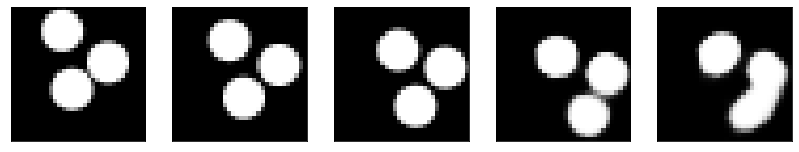

GD iterations:
i=0 | err=54.182053
i=1 | err=53.124527
i=2 | err=51.624420
i=3 | err=49.961685
i=4 | err=48.192921
i=5 | err=46.379448
i=6 | err=44.532654
i=7 | err=42.632278
i=8 | err=40.588310
i=9 | err=38.514328
i=10 | err=36.431789
i=11 | err=34.375542
i=12 | err=32.400581
i=13 | err=30.431015
i=14 | err=28.504646
i=15 | err=26.579193
i=16 | err=24.732800
i=17 | err=23.068571
i=18 | err=21.445930
i=19 | err=19.902700
i=20 | err=18.416996
i=21 | err=16.989729
i=22 | err=15.643807
i=23 | err=14.374115
i=24 | err=13.147343
i=25 | err=12.024433
i=26 | err=10.963892
i=27 | err=9.939541
i=28 | err=8.947452
i=29 | err=8.038043
Epoch=263 (30%) | out_positive=0.874168 | out_negative=0.107237 | mse=0.076067


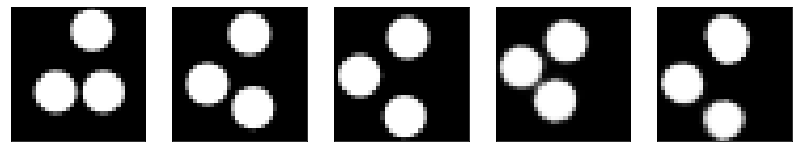

GD iterations:
i=0 | err=58.243355
i=1 | err=56.982792
i=2 | err=55.283070
i=3 | err=53.339348
i=4 | err=51.298561
i=5 | err=49.030220
i=6 | err=46.645409
i=7 | err=44.344494
i=8 | err=42.032986
i=9 | err=39.698570
i=10 | err=37.217781
i=11 | err=34.672909
i=12 | err=32.310936
i=13 | err=30.023029
i=14 | err=27.832706
i=15 | err=25.681503
i=16 | err=23.642826
i=17 | err=21.709003
i=18 | err=19.934607
i=19 | err=18.204552
i=20 | err=16.521681
i=21 | err=14.987872
i=22 | err=13.561083
i=23 | err=12.303387
i=24 | err=11.131181
i=25 | err=10.022249
i=26 | err=8.976507
i=27 | err=8.026115
i=28 | err=7.140758
i=29 | err=6.312864
Epoch=263 (31%) | out_positive=0.868055 | out_negative=0.111422 | mse=0.069681


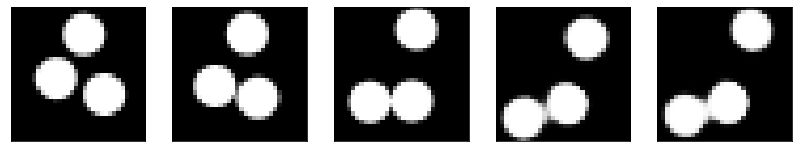

GD iterations:
i=0 | err=54.936440
i=1 | err=53.838074
i=2 | err=52.193180
i=3 | err=50.346085
i=4 | err=48.474068
i=5 | err=46.475861
i=6 | err=44.385117
i=7 | err=42.304878
i=8 | err=40.190250
i=9 | err=38.098038
i=10 | err=35.893723
i=11 | err=33.631073
i=12 | err=31.402889
i=13 | err=29.225107
i=14 | err=27.159702
i=15 | err=25.222715
i=16 | err=23.339008
i=17 | err=21.607826
i=18 | err=19.911453
i=19 | err=18.395233
i=20 | err=17.015800
i=21 | err=15.669418
i=22 | err=14.361910
i=23 | err=13.162543
i=24 | err=12.041994
i=25 | err=10.989822
i=26 | err=10.009783
i=27 | err=9.106526
i=28 | err=8.248619
i=29 | err=7.407772
Epoch=263 (33%) | out_positive=0.889767 | out_negative=0.120869 | mse=0.073937


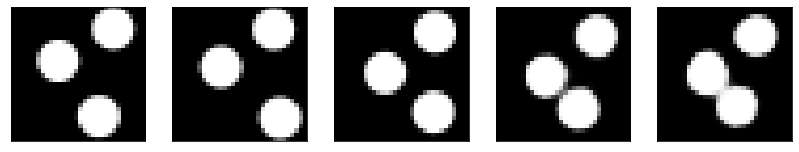

GD iterations:
i=0 | err=54.243332
i=1 | err=53.046432
i=2 | err=51.435974
i=3 | err=49.659466
i=4 | err=47.750381
i=5 | err=45.775536
i=6 | err=43.766235
i=7 | err=41.688622
i=8 | err=39.588394
i=9 | err=37.452789
i=10 | err=35.270329
i=11 | err=33.112991
i=12 | err=30.958973
i=13 | err=28.829941
i=14 | err=26.774654
i=15 | err=24.858232
i=16 | err=23.016909
i=17 | err=21.245705
i=18 | err=19.593021
i=19 | err=18.058924
i=20 | err=16.619963
i=21 | err=15.304746
i=22 | err=14.114001
i=23 | err=13.009066
i=24 | err=11.981058
i=25 | err=11.032013
i=26 | err=10.134049
i=27 | err=9.268316
i=28 | err=8.441444
i=29 | err=7.639185
Epoch=263 (35%) | out_positive=0.902013 | out_negative=0.087240 | mse=0.072642


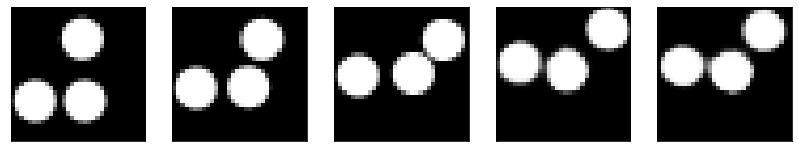

GD iterations:
i=0 | err=54.362518
i=1 | err=53.114491
i=2 | err=51.372131
i=3 | err=49.443844
i=4 | err=47.459019
i=5 | err=45.438354
i=6 | err=43.336651
i=7 | err=41.158989
i=8 | err=38.880600
i=9 | err=36.620552
i=10 | err=34.498447
i=11 | err=32.455757
i=12 | err=30.370087
i=13 | err=28.342611
i=14 | err=26.412394
i=15 | err=24.553070
i=16 | err=22.829002
i=17 | err=21.164013
i=18 | err=19.586010
i=19 | err=18.064247
i=20 | err=16.616825
i=21 | err=15.244373
i=22 | err=13.949325
i=23 | err=12.747623
i=24 | err=11.597557
i=25 | err=10.501209
i=26 | err=9.519855
i=27 | err=8.633624
i=28 | err=7.821940
i=29 | err=7.064014
Epoch=263 (36%) | out_positive=0.857938 | out_negative=0.135086 | mse=0.073142


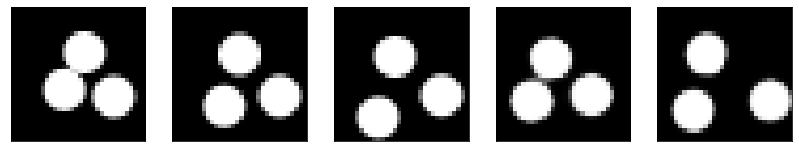

GD iterations:
i=0 | err=57.161392
i=1 | err=55.951767
i=2 | err=54.288120
i=3 | err=52.320995
i=4 | err=50.162132
i=5 | err=47.928329
i=6 | err=45.628532
i=7 | err=43.179207
i=8 | err=40.707817
i=9 | err=38.225613
i=10 | err=35.848293
i=11 | err=33.443108
i=12 | err=31.080349
i=13 | err=28.833900
i=14 | err=26.657526
i=15 | err=24.630135
i=16 | err=22.772213
i=17 | err=21.098679
i=18 | err=19.458580
i=19 | err=17.915398
i=20 | err=16.508421
i=21 | err=15.196157
i=22 | err=13.963158
i=23 | err=12.805790
i=24 | err=11.719954
i=25 | err=10.663227
i=26 | err=9.673418
i=27 | err=8.710606
i=28 | err=7.804589
i=29 | err=6.982300
Epoch=263 (38%) | out_positive=0.876987 | out_negative=0.114928 | mse=0.074342


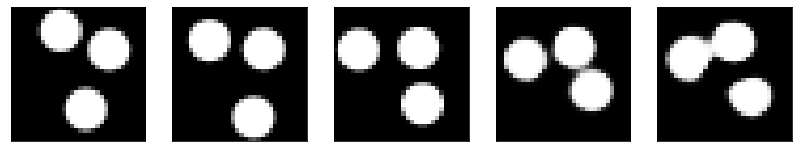

GD iterations:
i=0 | err=57.612541
i=1 | err=56.331570
i=2 | err=54.590164
i=3 | err=52.583336
i=4 | err=50.467133
i=5 | err=48.298386
i=6 | err=46.162941
i=7 | err=44.013191
i=8 | err=41.850697
i=9 | err=39.659672
i=10 | err=37.496338
i=11 | err=35.273773
i=12 | err=33.083618
i=13 | err=30.908545
i=14 | err=28.785265
i=15 | err=26.721939
i=16 | err=24.743568
i=17 | err=22.871725
i=18 | err=21.161266
i=19 | err=19.606537
i=20 | err=18.149677
i=21 | err=16.774971
i=22 | err=15.477789
i=23 | err=14.257229
i=24 | err=13.069620
i=25 | err=11.990540
i=26 | err=10.981716
i=27 | err=9.976885
i=28 | err=9.063290
i=29 | err=8.200638
Epoch=263 (39%) | out_positive=0.923081 | out_negative=0.108533 | mse=0.077826


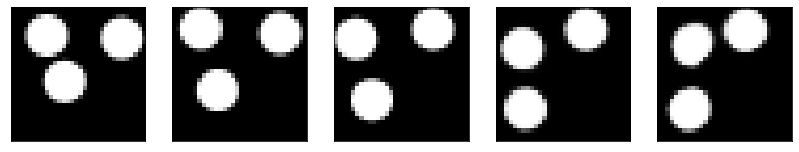

GD iterations:
i=0 | err=50.850296
i=1 | err=49.643524
i=2 | err=47.927288
i=3 | err=46.050903
i=4 | err=44.085060
i=5 | err=42.046444
i=6 | err=39.983414
i=7 | err=37.914715
i=8 | err=35.847485
i=9 | err=33.837223
i=10 | err=31.736523
i=11 | err=29.687843
i=12 | err=27.611416
i=13 | err=25.624033
i=14 | err=23.705009
i=15 | err=21.908535
i=16 | err=20.202044
i=17 | err=18.591377
i=18 | err=17.058512
i=19 | err=15.576131
i=20 | err=14.229795
i=21 | err=12.983934
i=22 | err=11.881400
i=23 | err=10.846963
i=24 | err=9.904100
i=25 | err=9.008871
i=26 | err=8.192266
i=27 | err=7.413002
i=28 | err=6.689013
i=29 | err=5.974138
Epoch=263 (41%) | out_positive=0.937762 | out_negative=0.170854 | mse=0.070632


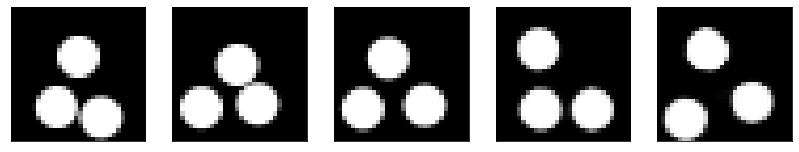

GD iterations:
i=0 | err=55.954834
i=1 | err=54.790775
i=2 | err=53.198639
i=3 | err=51.410294
i=4 | err=49.521690
i=5 | err=47.552208
i=6 | err=45.510437
i=7 | err=43.400826
i=8 | err=41.250889
i=9 | err=38.961681
i=10 | err=36.601101
i=11 | err=34.274464
i=12 | err=31.984680
i=13 | err=29.812099
i=14 | err=27.773922
i=15 | err=25.892202
i=16 | err=24.043934
i=17 | err=22.246822
i=18 | err=20.544569
i=19 | err=18.969997
i=20 | err=17.426910
i=21 | err=15.984474
i=22 | err=14.642393
i=23 | err=13.402882
i=24 | err=12.254259
i=25 | err=11.177493
i=26 | err=10.174395
i=27 | err=9.238083
i=28 | err=8.347420
i=29 | err=7.535381
Epoch=263 (43%) | out_positive=0.872532 | out_negative=0.121786 | mse=0.072326


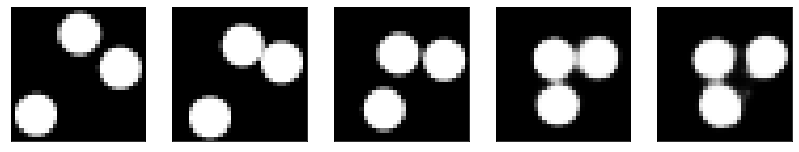

GD iterations:
i=0 | err=55.712524
i=1 | err=54.462574
i=2 | err=52.745728
i=3 | err=50.810513
i=4 | err=48.721367
i=5 | err=46.631409
i=6 | err=44.533978
i=7 | err=42.437183
i=8 | err=40.267036
i=9 | err=38.082523
i=10 | err=35.846069
i=11 | err=33.660191
i=12 | err=31.520462
i=13 | err=29.393124
i=14 | err=27.357582
i=15 | err=25.378429
i=16 | err=23.452427
i=17 | err=21.649315
i=18 | err=20.006824
i=19 | err=18.555248
i=20 | err=17.163893
i=21 | err=15.829037
i=22 | err=14.571167
i=23 | err=13.318721
i=24 | err=12.150596
i=25 | err=11.002655
i=26 | err=9.891817
i=27 | err=8.883270
i=28 | err=7.955360
i=29 | err=7.098972
Epoch=263 (45%) | out_positive=0.875053 | out_negative=0.123754 | mse=0.076312


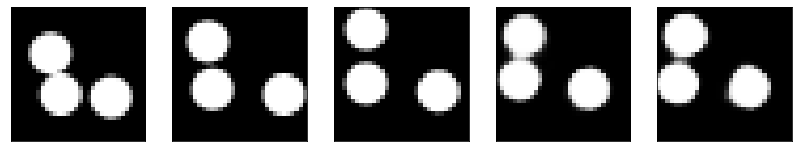

GD iterations:
i=0 | err=54.424385
i=1 | err=53.168556
i=2 | err=51.529057
i=3 | err=49.628689
i=4 | err=47.751694
i=5 | err=45.769569
i=6 | err=43.684475
i=7 | err=41.433983
i=8 | err=39.223911
i=9 | err=36.942307
i=10 | err=34.674324
i=11 | err=32.422951
i=12 | err=30.354115
i=13 | err=28.323978
i=14 | err=26.282152
i=15 | err=24.310055
i=16 | err=22.440025
i=17 | err=20.699333
i=18 | err=19.089241
i=19 | err=17.597633
i=20 | err=16.238239
i=21 | err=14.990976
i=22 | err=13.828184
i=23 | err=12.745829
i=24 | err=11.744099
i=25 | err=10.838178
i=26 | err=9.982468
i=27 | err=9.145126
i=28 | err=8.303905
i=29 | err=7.460565
Epoch=263 (47%) | out_positive=0.943155 | out_negative=0.121862 | mse=0.076884


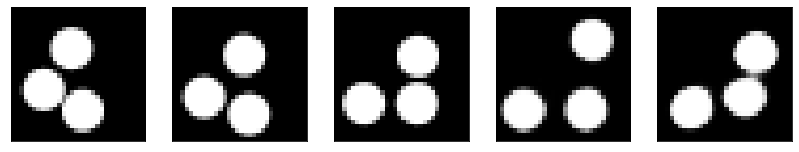

GD iterations:
i=0 | err=50.913956
i=1 | err=49.760506
i=2 | err=48.236183
i=3 | err=46.562435
i=4 | err=44.726089
i=5 | err=42.893246
i=6 | err=40.997726
i=7 | err=39.042084
i=8 | err=37.090984
i=9 | err=35.114502
i=10 | err=33.173447
i=11 | err=31.248323
i=12 | err=29.341608
i=13 | err=27.399542
i=14 | err=25.583803
i=15 | err=23.779037
i=16 | err=22.082369
i=17 | err=20.385979
i=18 | err=18.813341
i=19 | err=17.281368
i=20 | err=15.831149
i=21 | err=14.496059
i=22 | err=13.292728
i=23 | err=12.249102
i=24 | err=11.303328
i=25 | err=10.407375
i=26 | err=9.569632
i=27 | err=8.778314
i=28 | err=8.059593
i=29 | err=7.361984
Epoch=263 (49%) | out_positive=0.910614 | out_negative=0.092360 | mse=0.074370


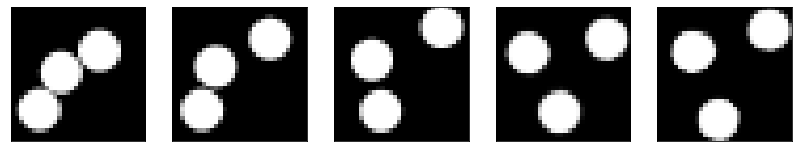

GD iterations:
i=0 | err=54.818855
i=1 | err=53.678738
i=2 | err=52.107605
i=3 | err=50.298828
i=4 | err=48.288002
i=5 | err=46.303593
i=6 | err=44.181526
i=7 | err=41.886375
i=8 | err=39.484444
i=9 | err=37.059471
i=10 | err=34.685715
i=11 | err=32.324623
i=12 | err=30.049686
i=13 | err=27.831038
i=14 | err=25.851501
i=15 | err=23.968391
i=16 | err=22.209385
i=17 | err=20.534267
i=18 | err=19.011333
i=19 | err=17.541080
i=20 | err=16.196600
i=21 | err=14.935839
i=22 | err=13.741346
i=23 | err=12.608788
i=24 | err=11.522577
i=25 | err=10.491550
i=26 | err=9.505318
i=27 | err=8.551714
i=28 | err=7.690107
i=29 | err=6.867497
Epoch=263 (50%) | out_positive=0.870081 | out_negative=0.155799 | mse=0.061645


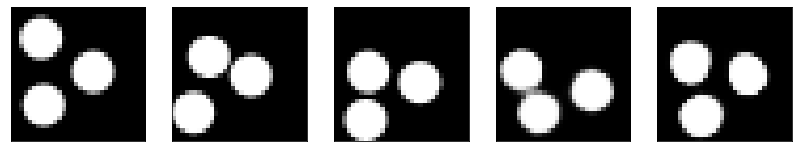

GD iterations:
i=0 | err=51.446060
i=1 | err=50.226372
i=2 | err=48.483635
i=3 | err=46.584442
i=4 | err=44.540283
i=5 | err=42.433464
i=6 | err=40.330727
i=7 | err=38.184532
i=8 | err=36.053177
i=9 | err=33.901283
i=10 | err=31.795906
i=11 | err=29.721390
i=12 | err=27.631279
i=13 | err=25.579809
i=14 | err=23.642891
i=15 | err=21.750816
i=16 | err=19.956495
i=17 | err=18.252644
i=18 | err=16.666309
i=19 | err=15.181763
i=20 | err=13.791796
i=21 | err=12.494557
i=22 | err=11.291149
i=23 | err=10.211296
i=24 | err=9.233805
i=25 | err=8.303598
i=26 | err=7.423120
i=27 | err=6.559498
i=28 | err=5.745635
i=29 | err=4.958769
Epoch=263 (52%) | out_positive=0.887451 | out_negative=0.180143 | mse=0.064945


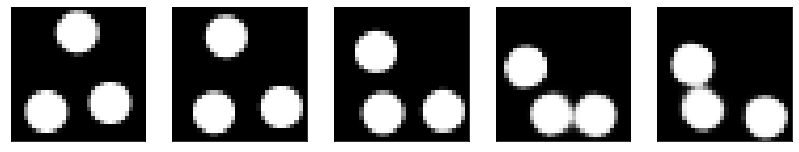

GD iterations:
i=0 | err=56.687603
i=1 | err=55.392487
i=2 | err=53.578014
i=3 | err=51.569237
i=4 | err=49.505291
i=5 | err=47.409569
i=6 | err=45.247932
i=7 | err=43.061108
i=8 | err=40.843300
i=9 | err=38.529400
i=10 | err=36.210197
i=11 | err=33.939400
i=12 | err=31.629478
i=13 | err=29.424488
i=14 | err=27.242718
i=15 | err=25.261162
i=16 | err=23.385853
i=17 | err=21.621952
i=18 | err=19.943325
i=19 | err=18.410873
i=20 | err=16.963612
i=21 | err=15.613295
i=22 | err=14.350164
i=23 | err=13.142164
i=24 | err=11.996984
i=25 | err=10.908550
i=26 | err=9.905537
i=27 | err=8.914173
i=28 | err=7.961887
i=29 | err=7.071680
Epoch=263 (54%) | out_positive=0.883791 | out_negative=0.114587 | mse=0.079002


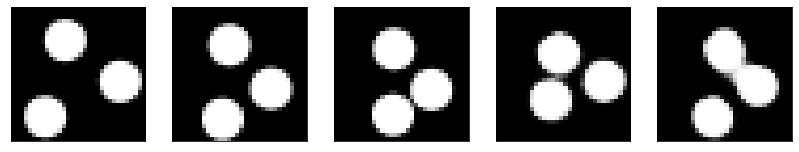

GD iterations:
i=0 | err=54.646572
i=1 | err=53.484627
i=2 | err=51.848480
i=3 | err=50.024834
i=4 | err=48.094284
i=5 | err=46.070503
i=6 | err=43.907459
i=7 | err=41.701809
i=8 | err=39.501419
i=9 | err=37.168217
i=10 | err=34.894119
i=11 | err=32.732510
i=12 | err=30.713364
i=13 | err=28.788990
i=14 | err=26.922213
i=15 | err=25.199583
i=16 | err=23.483936
i=17 | err=21.852795
i=18 | err=20.263800
i=19 | err=18.794138
i=20 | err=17.387058
i=21 | err=16.051319
i=22 | err=14.759928
i=23 | err=13.545076
i=24 | err=12.435288
i=25 | err=11.393160
i=26 | err=10.408113
i=27 | err=9.437601
i=28 | err=8.498201
i=29 | err=7.605408
Epoch=263 (56%) | out_positive=0.908839 | out_negative=0.114243 | mse=0.076455


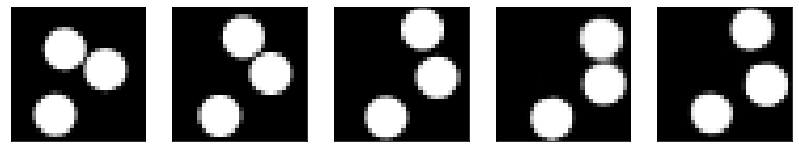

GD iterations:
i=0 | err=54.348316
i=1 | err=53.152916
i=2 | err=51.576363
i=3 | err=49.725021
i=4 | err=47.659550
i=5 | err=45.421429
i=6 | err=43.134323
i=7 | err=40.732857
i=8 | err=38.364532
i=9 | err=35.960815
i=10 | err=33.604805
i=11 | err=31.343422
i=12 | err=29.182558
i=13 | err=27.140831
i=14 | err=25.175751
i=15 | err=23.370087
i=16 | err=21.681158
i=17 | err=20.128658
i=18 | err=18.619677
i=19 | err=17.155479
i=20 | err=15.772251
i=21 | err=14.482498
i=22 | err=13.294275
i=23 | err=12.219675
i=24 | err=11.220912
i=25 | err=10.273119
i=26 | err=9.394860
i=27 | err=8.578859
i=28 | err=7.804487
i=29 | err=7.044934
Epoch=263 (58%) | out_positive=0.931647 | out_negative=0.147772 | mse=0.076202


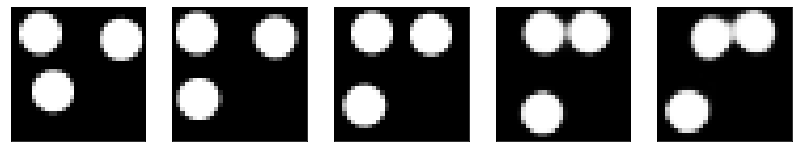

GD iterations:
i=0 | err=50.615921
i=1 | err=49.413849
i=2 | err=47.807938
i=3 | err=45.926018
i=4 | err=44.014771
i=5 | err=42.085457
i=6 | err=40.038418
i=7 | err=38.002720
i=8 | err=35.975998
i=9 | err=33.991478
i=10 | err=32.058369
i=11 | err=30.166927
i=12 | err=28.330589
i=13 | err=26.617874
i=14 | err=24.944942
i=15 | err=23.363605
i=16 | err=21.805130
i=17 | err=20.306389
i=18 | err=18.915966
i=19 | err=17.531803
i=20 | err=16.133461
i=21 | err=14.793686
i=22 | err=13.515471
i=23 | err=12.326822
i=24 | err=11.222864
i=25 | err=10.229057
i=26 | err=9.329450
i=27 | err=8.500005
i=28 | err=7.703550
i=29 | err=6.946463
Epoch=263 (60%) | out_positive=0.906110 | out_negative=0.136649 | mse=0.073820


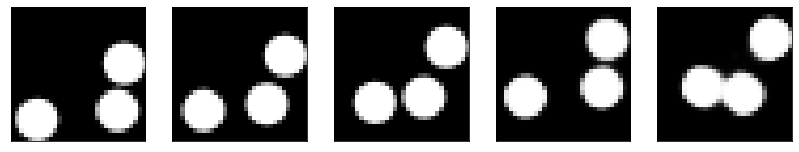

GD iterations:
i=0 | err=55.195358
i=1 | err=54.017773
i=2 | err=52.380486
i=3 | err=50.601192
i=4 | err=48.672981
i=5 | err=46.733475
i=6 | err=44.770805
i=7 | err=42.645905
i=8 | err=40.472378
i=9 | err=38.121109
i=10 | err=35.781464
i=11 | err=33.472126
i=12 | err=31.159634
i=13 | err=28.885981
i=14 | err=26.723740
i=15 | err=24.645920
i=16 | err=22.665762
i=17 | err=20.851650
i=18 | err=19.157581
i=19 | err=17.582188
i=20 | err=16.152819
i=21 | err=14.803846
i=22 | err=13.579710
i=23 | err=12.437491
i=24 | err=11.399094
i=25 | err=10.452565
i=26 | err=9.583658
i=27 | err=8.796794
i=28 | err=8.053585
i=29 | err=7.343688
Epoch=263 (62%) | out_positive=0.858637 | out_negative=0.086516 | mse=0.071408


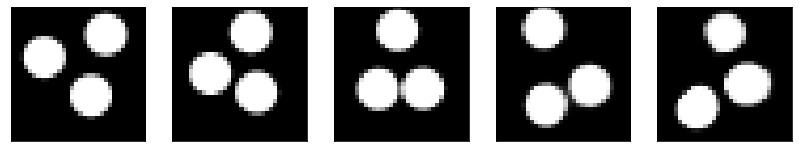

GD iterations:
i=0 | err=56.184692
i=1 | err=54.880692
i=2 | err=53.077782
i=3 | err=51.095451
i=4 | err=49.076416
i=5 | err=47.039558
i=6 | err=44.901543
i=7 | err=42.719452
i=8 | err=40.429142
i=9 | err=38.125160
i=10 | err=35.838646
i=11 | err=33.578152
i=12 | err=31.349434
i=13 | err=29.173588
i=14 | err=27.135815
i=15 | err=25.206200
i=16 | err=23.424519
i=17 | err=21.787388
i=18 | err=20.180092
i=19 | err=18.642536
i=20 | err=17.206966
i=21 | err=15.845800
i=22 | err=14.609446
i=23 | err=13.449086
i=24 | err=12.347251
i=25 | err=11.284526
i=26 | err=10.308642
i=27 | err=9.409206
i=28 | err=8.597590
i=29 | err=7.861700
Epoch=263 (63%) | out_positive=0.844644 | out_negative=0.111531 | mse=0.073263


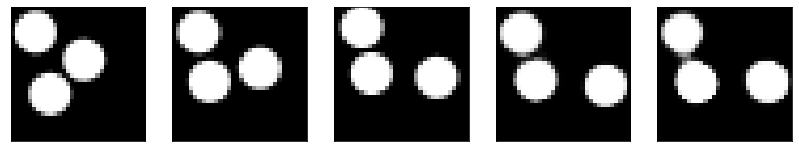

GD iterations:
i=0 | err=53.514206
i=1 | err=52.250523
i=2 | err=50.531029
i=3 | err=48.624893
i=4 | err=46.629688
i=5 | err=44.578453
i=6 | err=42.489529
i=7 | err=40.288147
i=8 | err=38.008228
i=9 | err=35.771477
i=10 | err=33.557388
i=11 | err=31.379162
i=12 | err=29.250427
i=13 | err=27.147440
i=14 | err=25.191246
i=15 | err=23.361183
i=16 | err=21.744768
i=17 | err=20.224140
i=18 | err=18.778179
i=19 | err=17.406248
i=20 | err=16.144741
i=21 | err=14.936377
i=22 | err=13.847177
i=23 | err=12.840719
i=24 | err=11.865238
i=25 | err=10.929268
i=26 | err=10.014595
i=27 | err=9.152599
i=28 | err=8.339177
i=29 | err=7.562253
Epoch=263 (65%) | out_positive=0.898395 | out_negative=0.139279 | mse=0.075021


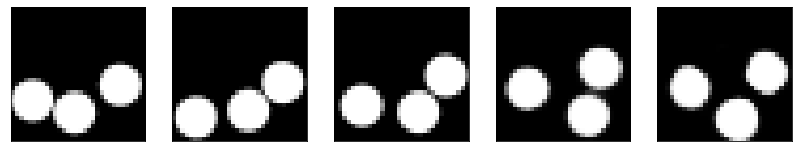

GD iterations:
i=0 | err=58.727257
i=1 | err=57.533745
i=2 | err=55.937370
i=3 | err=54.042572
i=4 | err=52.079651
i=5 | err=50.011829
i=6 | err=47.879311
i=7 | err=45.681568
i=8 | err=43.442490
i=9 | err=41.233894
i=10 | err=38.970665
i=11 | err=36.646778
i=12 | err=34.346985
i=13 | err=32.063736
i=14 | err=29.866348
i=15 | err=27.751511
i=16 | err=25.713507
i=17 | err=23.813654
i=18 | err=22.046413
i=19 | err=20.399126
i=20 | err=18.857861
i=21 | err=17.368603
i=22 | err=15.962122
i=23 | err=14.667807
i=24 | err=13.469278
i=25 | err=12.352047
i=26 | err=11.308657
i=27 | err=10.378366
i=28 | err=9.533870
i=29 | err=8.727414
Epoch=263 (67%) | out_positive=0.832311 | out_negative=0.084423 | mse=0.078351


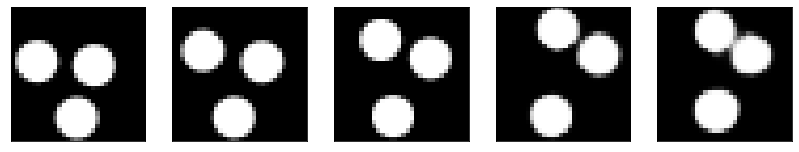

GD iterations:
i=0 | err=54.040207
i=1 | err=52.902874
i=2 | err=51.348442
i=3 | err=49.536446
i=4 | err=47.738983
i=5 | err=45.805809
i=6 | err=43.935333
i=7 | err=42.004635
i=8 | err=40.066582
i=9 | err=37.968491
i=10 | err=35.861858
i=11 | err=33.810223
i=12 | err=31.793682
i=13 | err=29.843071
i=14 | err=27.910820
i=15 | err=26.057882
i=16 | err=24.246763
i=17 | err=22.530436
i=18 | err=20.868481
i=19 | err=19.371906
i=20 | err=17.935993
i=21 | err=16.587193
i=22 | err=15.356191
i=23 | err=14.188812
i=24 | err=13.109846
i=25 | err=12.104477
i=26 | err=11.131947
i=27 | err=10.210500
i=28 | err=9.314661
i=29 | err=8.502891
Epoch=263 (69%) | out_positive=0.878945 | out_negative=0.115241 | mse=0.071305


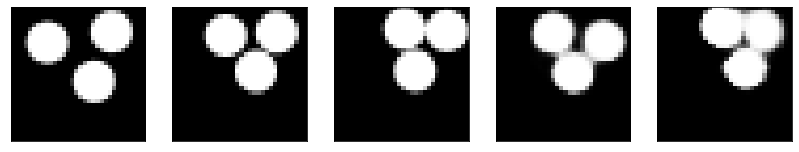

GD iterations:
i=0 | err=57.871803
i=1 | err=56.749420
i=2 | err=55.089943
i=3 | err=53.206818
i=4 | err=51.306801
i=5 | err=49.245750
i=6 | err=47.122208
i=7 | err=44.957371
i=8 | err=42.762123
i=9 | err=40.526520
i=10 | err=38.334480
i=11 | err=36.013695
i=12 | err=33.748615
i=13 | err=31.449650
i=14 | err=29.178226
i=15 | err=26.996944
i=16 | err=24.864941
i=17 | err=22.914459
i=18 | err=21.045147
i=19 | err=19.331493
i=20 | err=17.675732
i=21 | err=16.125776
i=22 | err=14.710485
i=23 | err=13.391102
i=24 | err=12.206627
i=25 | err=11.098266
i=26 | err=10.040444
i=27 | err=9.081324
i=28 | err=8.196140
i=29 | err=7.369165
Epoch=263 (71%) | out_positive=0.870269 | out_negative=0.141199 | mse=0.074724


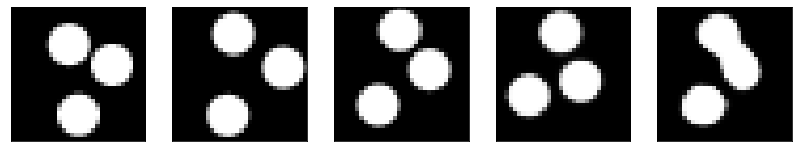

GD iterations:
i=0 | err=59.070427
i=1 | err=57.733673
i=2 | err=55.884552
i=3 | err=53.838306
i=4 | err=51.664291
i=5 | err=49.404942
i=6 | err=47.059364
i=7 | err=44.588963
i=8 | err=42.071823
i=9 | err=39.501892
i=10 | err=36.958324
i=11 | err=34.480240
i=12 | err=32.057774
i=13 | err=29.718651
i=14 | err=27.490656
i=15 | err=25.431820
i=16 | err=23.509232
i=17 | err=21.625563
i=18 | err=19.855484
i=19 | err=18.171629
i=20 | err=16.659752
i=21 | err=15.273255
i=22 | err=13.989031
i=23 | err=12.791210
i=24 | err=11.660965
i=25 | err=10.611538
i=26 | err=9.665588
i=27 | err=8.751735
i=28 | err=7.889297
i=29 | err=7.045580
Epoch=263 (73%) | out_positive=0.882901 | out_negative=0.133613 | mse=0.072191


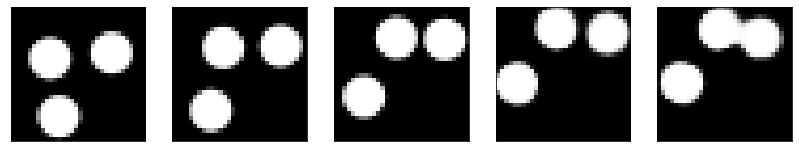

GD iterations:
i=0 | err=55.156528
i=1 | err=53.691467
i=2 | err=51.884918
i=3 | err=49.810204
i=4 | err=47.705421
i=5 | err=45.516861
i=6 | err=43.180584
i=7 | err=40.851841
i=8 | err=38.570736
i=9 | err=36.365402
i=10 | err=34.231766
i=11 | err=32.149021
i=12 | err=30.063324
i=13 | err=27.982239
i=14 | err=25.984047
i=15 | err=24.187927
i=16 | err=22.452755
i=17 | err=20.846451
i=18 | err=19.315990
i=19 | err=17.850700
i=20 | err=16.464706
i=21 | err=15.162432
i=22 | err=13.914171
i=23 | err=12.756817
i=24 | err=11.716064
i=25 | err=10.711210
i=26 | err=9.799824
i=27 | err=8.946964
i=28 | err=8.160931
i=29 | err=7.398979
Epoch=263 (74%) | out_positive=0.850628 | out_negative=0.125115 | mse=0.066938


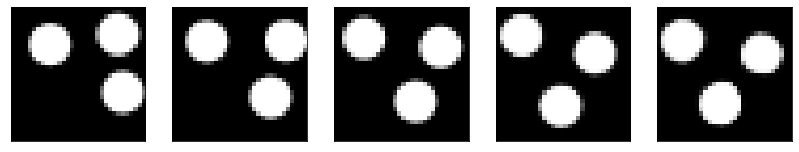

GD iterations:
i=0 | err=60.323948
i=1 | err=59.028801
i=2 | err=57.214146
i=3 | err=55.092575
i=4 | err=52.824348
i=5 | err=50.491417
i=6 | err=48.073784
i=7 | err=45.518028
i=8 | err=42.937767
i=9 | err=40.232475
i=10 | err=37.557587
i=11 | err=34.961700
i=12 | err=32.502983
i=13 | err=30.187298
i=14 | err=27.966892
i=15 | err=25.892847
i=16 | err=23.965796
i=17 | err=22.152855
i=18 | err=20.513273
i=19 | err=18.995543
i=20 | err=17.590931
i=21 | err=16.311741
i=22 | err=15.055016
i=23 | err=13.840915
i=24 | err=12.691877
i=25 | err=11.605953
i=26 | err=10.565171
i=27 | err=9.653409
i=28 | err=8.749662
i=29 | err=7.949269
Epoch=263 (76%) | out_positive=0.843118 | out_negative=0.093213 | mse=0.070682


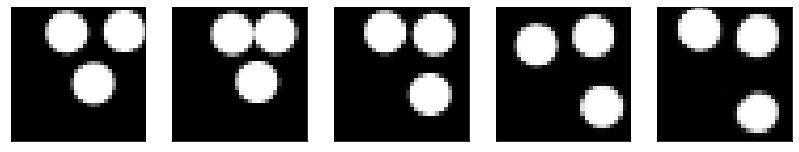

GD iterations:
i=0 | err=54.048454
i=1 | err=52.808632
i=2 | err=51.081612
i=3 | err=49.204361
i=4 | err=47.317078
i=5 | err=45.373718
i=6 | err=43.394302
i=7 | err=41.331490
i=8 | err=39.218193
i=9 | err=37.085815
i=10 | err=35.001129
i=11 | err=32.935783
i=12 | err=30.808781
i=13 | err=28.763317
i=14 | err=26.657455
i=15 | err=24.584843
i=16 | err=22.586256
i=17 | err=20.714664
i=18 | err=18.962761
i=19 | err=17.318668
i=20 | err=15.845183
i=21 | err=14.505423
i=22 | err=13.273855
i=23 | err=12.144636
i=24 | err=11.142036
i=25 | err=10.248100
i=26 | err=9.386561
i=27 | err=8.552373
i=28 | err=7.741148
i=29 | err=6.966087
Epoch=263 (78%) | out_positive=0.929316 | out_negative=0.130505 | mse=0.074868


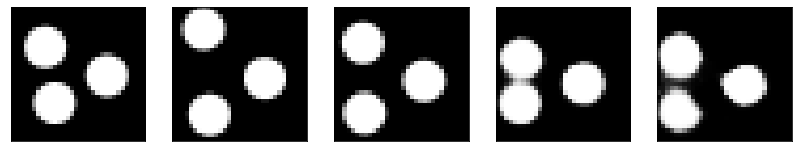

GD iterations:
i=0 | err=53.973820
i=1 | err=52.727524
i=2 | err=51.025177
i=3 | err=49.065594
i=4 | err=46.862175
i=5 | err=44.652351
i=6 | err=42.399746
i=7 | err=40.029396
i=8 | err=37.539955
i=9 | err=35.052151
i=10 | err=32.632118
i=11 | err=30.292984
i=12 | err=28.058853
i=13 | err=25.895206
i=14 | err=23.870201
i=15 | err=22.004639
i=16 | err=20.256779
i=17 | err=18.590702
i=18 | err=17.041981
i=19 | err=15.649407
i=20 | err=14.351513
i=21 | err=13.123520
i=22 | err=11.941019
i=23 | err=10.863020
i=24 | err=9.877589
i=25 | err=8.979454
i=26 | err=8.156870
i=27 | err=7.365105
i=28 | err=6.629100
i=29 | err=5.894275
Epoch=263 (80%) | out_positive=0.916040 | out_negative=0.165477 | mse=0.067807


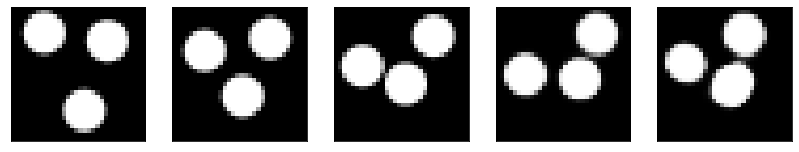

GD iterations:
i=0 | err=52.149628
i=1 | err=51.020344
i=2 | err=49.499245
i=3 | err=47.805267
i=4 | err=45.990147
i=5 | err=44.111038
i=6 | err=42.075958
i=7 | err=40.058743
i=8 | err=38.057846
i=9 | err=35.997631
i=10 | err=33.970917
i=11 | err=31.926899
i=12 | err=29.875656
i=13 | err=27.922659
i=14 | err=25.998714
i=15 | err=24.118183
i=16 | err=22.252678
i=17 | err=20.485510
i=18 | err=18.828114
i=19 | err=17.330845
i=20 | err=16.012527
i=21 | err=14.796640
i=22 | err=13.645426
i=23 | err=12.571518
i=24 | err=11.525385
i=25 | err=10.517313
i=26 | err=9.510027
i=27 | err=8.567417
i=28 | err=7.692225
i=29 | err=6.857684
Epoch=263 (82%) | out_positive=0.870662 | out_negative=0.137231 | mse=0.069664


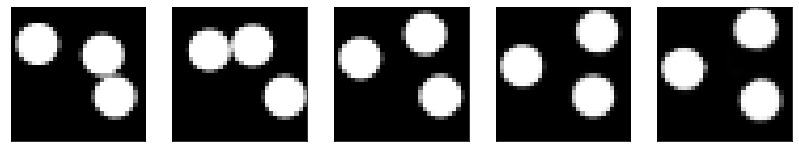

GD iterations:
i=0 | err=52.714096
i=1 | err=51.557186
i=2 | err=50.022194
i=3 | err=48.338734
i=4 | err=46.525879
i=5 | err=44.642616
i=6 | err=42.678902
i=7 | err=40.690231
i=8 | err=38.614738
i=9 | err=36.593864
i=10 | err=34.559296
i=11 | err=32.545513
i=12 | err=30.517843
i=13 | err=28.539139
i=14 | err=26.625496
i=15 | err=24.811804
i=16 | err=23.047766
i=17 | err=21.321514
i=18 | err=19.654015
i=19 | err=18.111088
i=20 | err=16.662455
i=21 | err=15.304892
i=22 | err=14.046588
i=23 | err=12.824320
i=24 | err=11.679998
i=25 | err=10.579768
i=26 | err=9.607169
i=27 | err=8.677908
i=28 | err=7.812054
i=29 | err=6.964062
Epoch=263 (84%) | out_positive=0.872769 | out_negative=0.130500 | mse=0.078068


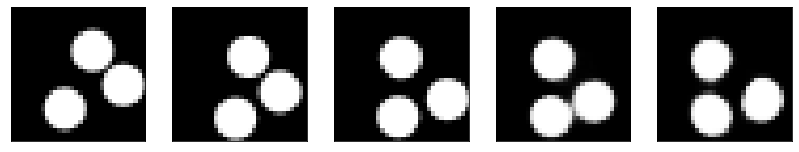

GD iterations:
i=0 | err=52.629745
i=1 | err=51.376602
i=2 | err=49.765457
i=3 | err=47.994606
i=4 | err=46.120407
i=5 | err=44.285156
i=6 | err=42.414742
i=7 | err=40.600952
i=8 | err=38.728508
i=9 | err=36.845245
i=10 | err=34.865894
i=11 | err=32.884777
i=12 | err=30.895924
i=13 | err=28.950829
i=14 | err=27.078194
i=15 | err=25.258533
i=16 | err=23.507465
i=17 | err=21.807926
i=18 | err=20.224262
i=19 | err=18.720539
i=20 | err=17.296928
i=21 | err=15.980053
i=22 | err=14.749714
i=23 | err=13.615913
i=24 | err=12.523227
i=25 | err=11.519241
i=26 | err=10.583948
i=27 | err=9.729430
i=28 | err=8.917059
i=29 | err=8.135519
Epoch=263 (85%) | out_positive=0.854484 | out_negative=0.103133 | mse=0.076270


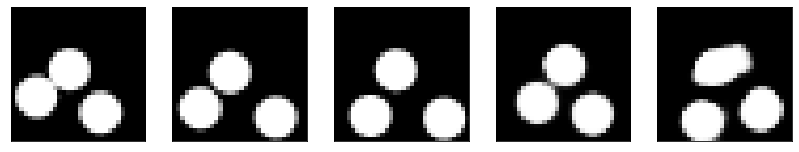

GD iterations:
i=0 | err=52.211784
i=1 | err=50.940498
i=2 | err=49.280815
i=3 | err=47.460228
i=4 | err=45.530991
i=5 | err=43.550934
i=6 | err=41.551311
i=7 | err=39.367577
i=8 | err=37.125359
i=9 | err=34.718788
i=10 | err=32.346390
i=11 | err=29.950005
i=12 | err=27.671846
i=13 | err=25.534653
i=14 | err=23.458206
i=15 | err=21.522142
i=16 | err=19.791103
i=17 | err=18.178268
i=18 | err=16.679190
i=19 | err=15.307072
i=20 | err=14.021358
i=21 | err=12.862410
i=22 | err=11.800879
i=23 | err=10.798302
i=24 | err=9.890910
i=25 | err=9.054441
i=26 | err=8.263981
i=27 | err=7.499098
i=28 | err=6.768054
i=29 | err=6.076141
Epoch=263 (87%) | out_positive=0.917905 | out_negative=0.180085 | mse=0.069796


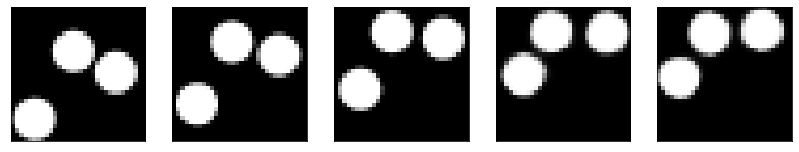

GD iterations:
i=0 | err=53.752827
i=1 | err=52.496853
i=2 | err=50.907234
i=3 | err=49.153130
i=4 | err=47.280693
i=5 | err=45.338493
i=6 | err=43.331970
i=7 | err=41.271904
i=8 | err=39.105114
i=9 | err=36.902164
i=10 | err=34.698616
i=11 | err=32.525787
i=12 | err=30.416275
i=13 | err=28.269913
i=14 | err=26.232944
i=15 | err=24.238689
i=16 | err=22.299198
i=17 | err=20.501102
i=18 | err=18.799301
i=19 | err=17.254498
i=20 | err=15.786233
i=21 | err=14.480202
i=22 | err=13.249883
i=23 | err=12.098582
i=24 | err=11.057317
i=25 | err=10.118025
i=26 | err=9.189275
i=27 | err=8.315758
i=28 | err=7.495261
i=29 | err=6.714067
Epoch=263 (89%) | out_positive=0.927145 | out_negative=0.147677 | mse=0.070426


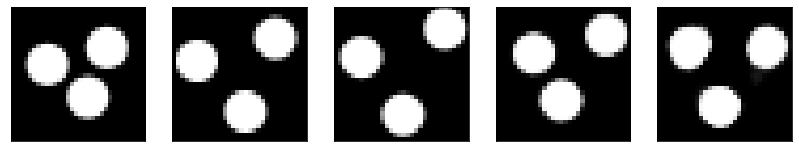

GD iterations:
i=0 | err=51.993301
i=1 | err=50.821041
i=2 | err=49.154358
i=3 | err=47.297749
i=4 | err=45.338284
i=5 | err=43.252739
i=6 | err=41.152916
i=7 | err=38.970634
i=8 | err=36.776752
i=9 | err=34.522480
i=10 | err=32.287891
i=11 | err=30.116110
i=12 | err=28.085104
i=13 | err=26.229435
i=14 | err=24.440504
i=15 | err=22.782116
i=16 | err=21.212688
i=17 | err=19.683867
i=18 | err=18.257902
i=19 | err=16.882137
i=20 | err=15.582678
i=21 | err=14.351348
i=22 | err=13.211358
i=23 | err=12.144753
i=24 | err=11.187263
i=25 | err=10.301711
i=26 | err=9.455788
i=27 | err=8.631077
i=28 | err=7.903630
i=29 | err=7.195649
Epoch=263 (91%) | out_positive=0.886068 | out_negative=0.094510 | mse=0.073125


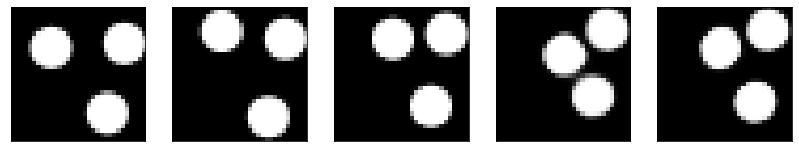

GD iterations:
i=0 | err=57.494114
i=1 | err=56.228561
i=2 | err=54.412560
i=3 | err=52.312408
i=4 | err=50.099949
i=5 | err=47.800774
i=6 | err=45.531132
i=7 | err=43.161491
i=8 | err=40.829121
i=9 | err=38.497757
i=10 | err=36.225269
i=11 | err=33.965576
i=12 | err=31.755590
i=13 | err=29.640327
i=14 | err=27.621243
i=15 | err=25.603489
i=16 | err=23.689953
i=17 | err=21.907257
i=18 | err=20.208687
i=19 | err=18.604248
i=20 | err=17.099699
i=21 | err=15.703726
i=22 | err=14.384226
i=23 | err=13.161505
i=24 | err=11.978382
i=25 | err=10.853300
i=26 | err=9.788469
i=27 | err=8.751777
i=28 | err=7.769566
i=29 | err=6.851817
Epoch=263 (93%) | out_positive=0.846673 | out_negative=0.123204 | mse=0.071982


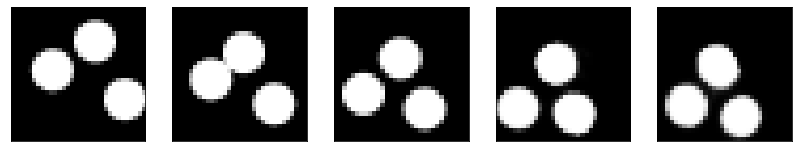

GD iterations:
i=0 | err=56.209446
i=1 | err=55.020409
i=2 | err=53.340843
i=3 | err=51.432915
i=4 | err=49.410255
i=5 | err=47.280624
i=6 | err=45.198231
i=7 | err=43.042191
i=8 | err=40.821445
i=9 | err=38.609577
i=10 | err=36.350513
i=11 | err=34.024399
i=12 | err=31.714252
i=13 | err=29.434614
i=14 | err=27.243851
i=15 | err=25.167990
i=16 | err=23.206499
i=17 | err=21.389008
i=18 | err=19.693604
i=19 | err=18.096081
i=20 | err=16.561485
i=21 | err=15.160519
i=22 | err=13.883311
i=23 | err=12.734219
i=24 | err=11.694057
i=25 | err=10.723268
i=26 | err=9.797428
i=27 | err=8.926913
i=28 | err=8.103334
i=29 | err=7.299003
Epoch=263 (95%) | out_positive=0.839075 | out_negative=0.123478 | mse=0.072459


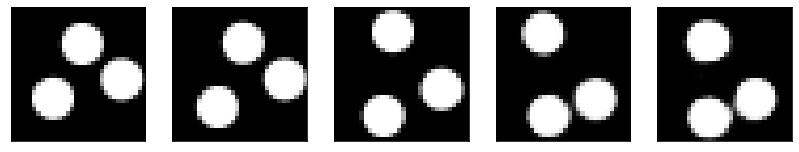

GD iterations:
i=0 | err=52.813042
i=1 | err=51.494896
i=2 | err=49.732441
i=3 | err=47.784996
i=4 | err=45.752945
i=5 | err=43.569695
i=6 | err=41.276283
i=7 | err=39.003178
i=8 | err=36.827362
i=9 | err=34.635979
i=10 | err=32.429321
i=11 | err=30.289206
i=12 | err=28.107311
i=13 | err=26.067270
i=14 | err=24.125401
i=15 | err=22.283426
i=16 | err=20.517006
i=17 | err=18.846020
i=18 | err=17.289396
i=19 | err=15.901686
i=20 | err=14.593545
i=21 | err=13.357691
i=22 | err=12.200609
i=23 | err=11.105665
i=24 | err=10.075294
i=25 | err=9.155972
i=26 | err=8.308236
i=27 | err=7.508899
i=28 | err=6.773655
i=29 | err=6.099728
Epoch=263 (96%) | out_positive=0.831703 | out_negative=0.125637 | mse=0.067531


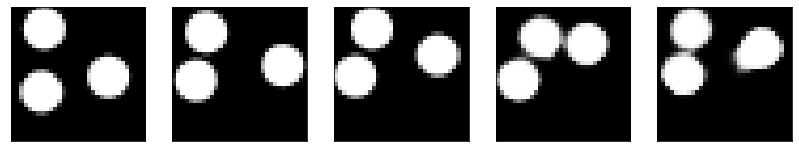

GD iterations:
i=0 | err=53.306927
i=1 | err=52.117126
i=2 | err=50.490700
i=3 | err=48.653275
i=4 | err=46.716278
i=5 | err=44.744743
i=6 | err=42.597687
i=7 | err=40.512569
i=8 | err=38.412872
i=9 | err=36.309761
i=10 | err=34.186966
i=11 | err=32.058910
i=12 | err=30.041887
i=13 | err=28.080622
i=14 | err=26.199953
i=15 | err=24.354610
i=16 | err=22.629890
i=17 | err=20.962837
i=18 | err=19.356544
i=19 | err=17.848976
i=20 | err=16.444241
i=21 | err=15.158778
i=22 | err=13.933947
i=23 | err=12.797414
i=24 | err=11.719293
i=25 | err=10.725629
i=26 | err=9.790174
i=27 | err=8.898324
i=28 | err=8.059729
i=29 | err=7.258488
Epoch=263 (98%) | out_positive=0.882709 | out_negative=0.120310 | mse=0.073932


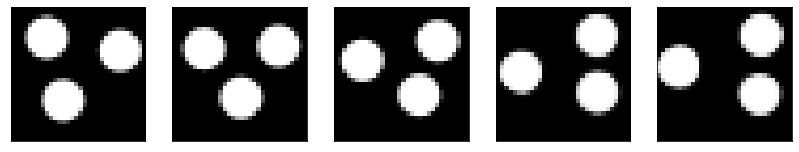

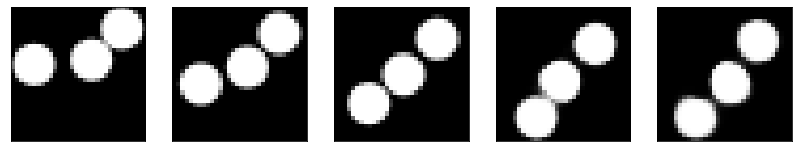

Test MSE 0.079056


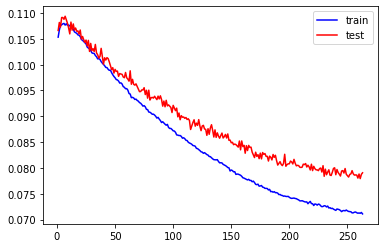

GD iterations:
i=0 | err=53.101437
i=1 | err=51.950188
i=2 | err=50.319641
i=3 | err=48.469406
i=4 | err=46.547710
i=5 | err=44.616219
i=6 | err=42.620316
i=7 | err=40.505863
i=8 | err=38.335335
i=9 | err=36.106499
i=10 | err=33.889801
i=11 | err=31.697048
i=12 | err=29.524309
i=13 | err=27.504322
i=14 | err=25.546906
i=15 | err=23.788012
i=16 | err=22.075941
i=17 | err=20.443783
i=18 | err=18.879026
i=19 | err=17.400288
i=20 | err=15.999784
i=21 | err=14.726081
i=22 | err=13.559898
i=23 | err=12.504496
i=24 | err=11.578146
i=25 | err=10.713575
i=26 | err=9.913393
i=27 | err=9.164273
i=28 | err=8.450258
i=29 | err=7.714439
Epoch=264 (0%) | out_positive=0.871880 | out_negative=0.120056 | mse=0.078137


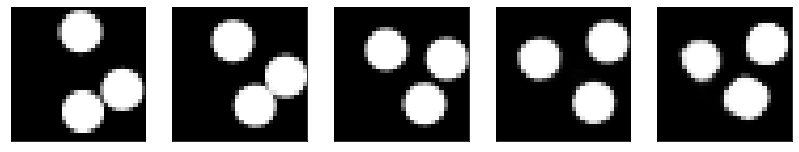

GD iterations:
i=0 | err=54.476295
i=1 | err=53.264534
i=2 | err=51.628944
i=3 | err=49.807823
i=4 | err=47.934143
i=5 | err=45.972015
i=6 | err=43.962570
i=7 | err=41.877472
i=8 | err=39.725048
i=9 | err=37.529991
i=10 | err=35.302578
i=11 | err=33.041016
i=12 | err=30.789389
i=13 | err=28.563841
i=14 | err=26.428350
i=15 | err=24.343319
i=16 | err=22.444220
i=17 | err=20.661135
i=18 | err=19.000847
i=19 | err=17.503729
i=20 | err=16.151405
i=21 | err=14.902409
i=22 | err=13.747589
i=23 | err=12.665932
i=24 | err=11.589735
i=25 | err=10.569384
i=26 | err=9.578341
i=27 | err=8.674709
i=28 | err=7.842947
i=29 | err=7.069376
Epoch=264 (2%) | out_positive=0.888307 | out_negative=0.126795 | mse=0.071004


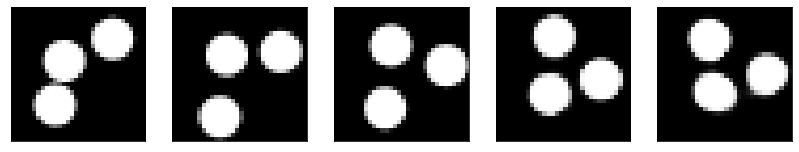

GD iterations:
i=0 | err=51.485031
i=1 | err=50.381256
i=2 | err=48.884819
i=3 | err=47.223457
i=4 | err=45.449940
i=5 | err=43.586552
i=6 | err=41.607063
i=7 | err=39.505013
i=8 | err=37.329559
i=9 | err=35.117111
i=10 | err=32.950443
i=11 | err=30.675793
i=12 | err=28.382360
i=13 | err=26.249252
i=14 | err=24.122248
i=15 | err=22.104044
i=16 | err=20.222296
i=17 | err=18.511353
i=18 | err=16.884106
i=19 | err=15.408665
i=20 | err=14.037832
i=21 | err=12.764338
i=22 | err=11.611804
i=23 | err=10.530730
i=24 | err=9.528107
i=25 | err=8.594402
i=26 | err=7.752359
i=27 | err=6.904461
i=28 | err=6.118253
i=29 | err=5.354838
Epoch=264 (4%) | out_positive=0.897186 | out_negative=0.196822 | mse=0.064053


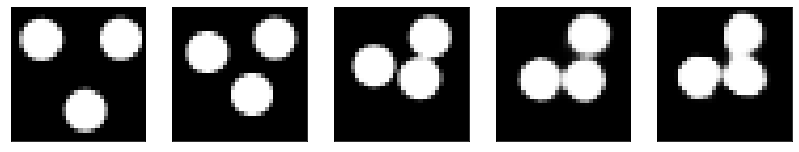

GD iterations:
i=0 | err=52.115585
i=1 | err=50.901318
i=2 | err=49.161598
i=3 | err=47.301998
i=4 | err=45.277889
i=5 | err=43.223244
i=6 | err=41.128529
i=7 | err=39.007675
i=8 | err=36.766766
i=9 | err=34.574112
i=10 | err=32.569366
i=11 | err=30.707407
i=12 | err=28.840166
i=13 | err=26.997129
i=14 | err=25.171989
i=15 | err=23.404322
i=16 | err=21.730135
i=17 | err=20.156265
i=18 | err=18.680387
i=19 | err=17.294209
i=20 | err=16.065432
i=21 | err=14.923292
i=22 | err=13.811314
i=23 | err=12.752956
i=24 | err=11.755220
i=25 | err=10.801268
i=26 | err=9.863696
i=27 | err=8.944996
i=28 | err=8.110133
i=29 | err=7.282156
Epoch=264 (6%) | out_positive=0.917472 | out_negative=0.118538 | mse=0.072561


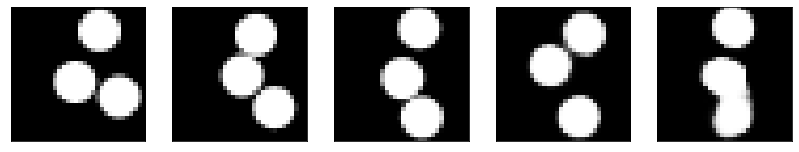

GD iterations:
i=0 | err=56.751091
i=1 | err=55.450623
i=2 | err=53.731049
i=3 | err=51.777542
i=4 | err=49.682549
i=5 | err=47.538097
i=6 | err=45.333076
i=7 | err=43.137466
i=8 | err=40.865326
i=9 | err=38.625401
i=10 | err=36.391792
i=11 | err=34.239216
i=12 | err=32.056206
i=13 | err=29.965139
i=14 | err=27.951210
i=15 | err=25.923792
i=16 | err=23.966480
i=17 | err=22.078806
i=18 | err=20.295944
i=19 | err=18.684986
i=20 | err=17.307526
i=21 | err=15.978153
i=22 | err=14.807724
i=23 | err=13.667055
i=24 | err=12.565035
i=25 | err=11.560073
i=26 | err=10.599596
i=27 | err=9.709472
i=28 | err=8.873196
i=29 | err=8.070150
Epoch=264 (8%) | out_positive=0.839553 | out_negative=0.101467 | mse=0.069090


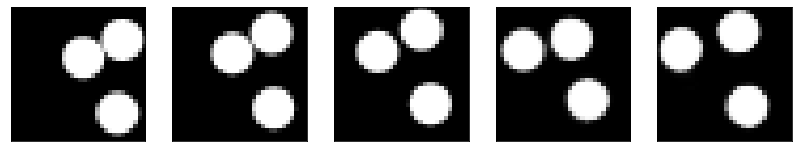

GD iterations:
i=0 | err=54.807026
i=1 | err=53.604172
i=2 | err=51.887405
i=3 | err=49.952660
i=4 | err=47.887001
i=5 | err=45.677784
i=6 | err=43.257309
i=7 | err=40.795097
i=8 | err=38.431446
i=9 | err=36.080849
i=10 | err=33.703018
i=11 | err=31.308372
i=12 | err=29.114765
i=13 | err=26.951958
i=14 | err=24.895273
i=15 | err=22.995480
i=16 | err=21.241665
i=17 | err=19.624243
i=18 | err=18.098461
i=19 | err=16.623598
i=20 | err=15.241945
i=21 | err=13.933916
i=22 | err=12.721049
i=23 | err=11.596916
i=24 | err=10.544220
i=25 | err=9.593069
i=26 | err=8.717566
i=27 | err=7.894295
i=28 | err=7.110776
i=29 | err=6.378460
Epoch=264 (9%) | out_positive=0.911991 | out_negative=0.137503 | mse=0.071958


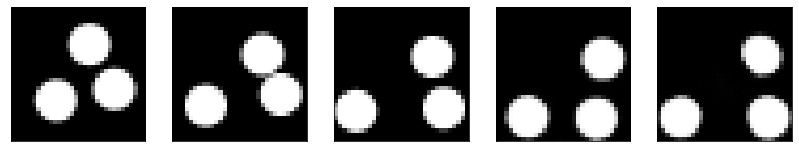

GD iterations:
i=0 | err=58.689747
i=1 | err=57.342312
i=2 | err=55.458305
i=3 | err=53.228157
i=4 | err=50.961601
i=5 | err=48.604370
i=6 | err=46.172081
i=7 | err=43.691448
i=8 | err=41.050049
i=9 | err=38.312672
i=10 | err=35.542938
i=11 | err=32.867477
i=12 | err=30.288239
i=13 | err=27.862087
i=14 | err=25.604565
i=15 | err=23.585419
i=16 | err=21.643827
i=17 | err=19.831387
i=18 | err=18.192101
i=19 | err=16.740465
i=20 | err=15.375544
i=21 | err=14.104808
i=22 | err=12.927323
i=23 | err=11.826597
i=24 | err=10.780131
i=25 | err=9.799437
i=26 | err=8.897637
i=27 | err=8.096127
i=28 | err=7.328279
i=29 | err=6.585432
Epoch=264 (11%) | out_positive=0.870521 | out_negative=0.151372 | mse=0.071811


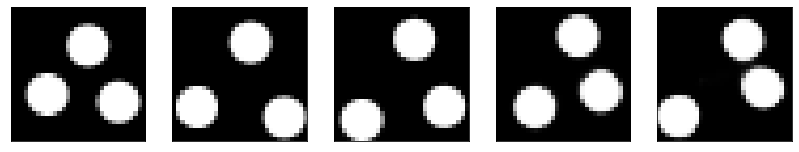

GD iterations:
i=0 | err=54.479118
i=1 | err=53.187988
i=2 | err=51.550568
i=3 | err=49.740456
i=4 | err=47.857933
i=5 | err=45.841690
i=6 | err=43.790398
i=7 | err=41.698128
i=8 | err=39.630905
i=9 | err=37.600502
i=10 | err=35.578522
i=11 | err=33.575504
i=12 | err=31.660343
i=13 | err=29.764818
i=14 | err=27.945248
i=15 | err=26.241266
i=16 | err=24.567482
i=17 | err=23.021988
i=18 | err=21.504513
i=19 | err=20.012562
i=20 | err=18.593658
i=21 | err=17.270077
i=22 | err=16.017311
i=23 | err=14.838049
i=24 | err=13.700048
i=25 | err=12.620577
i=26 | err=11.610151
i=27 | err=10.664209
i=28 | err=9.780615
i=29 | err=8.949553
Epoch=264 (13%) | out_positive=0.830259 | out_negative=0.059862 | mse=0.075151


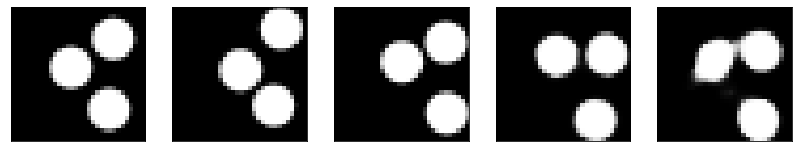

GD iterations:
i=0 | err=54.142715
i=1 | err=52.892136
i=2 | err=51.087204
i=3 | err=49.054989
i=4 | err=46.932808
i=5 | err=44.696621
i=6 | err=42.349724
i=7 | err=39.979195
i=8 | err=37.566277
i=9 | err=35.236073
i=10 | err=32.972790
i=11 | err=30.815346
i=12 | err=28.683050
i=13 | err=26.597525
i=14 | err=24.544075
i=15 | err=22.651083
i=16 | err=20.842974
i=17 | err=19.201923
i=18 | err=17.651226
i=19 | err=16.150669
i=20 | err=14.732325
i=21 | err=13.427429
i=22 | err=12.230402
i=23 | err=11.154600
i=24 | err=10.110473
i=25 | err=9.135420
i=26 | err=8.212163
i=27 | err=7.326897
i=28 | err=6.483361
i=29 | err=5.689252
Epoch=264 (15%) | out_positive=0.899518 | out_negative=0.147538 | mse=0.072239


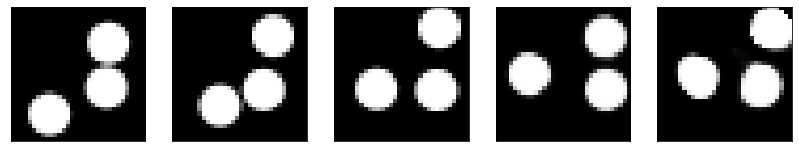

GD iterations:
i=0 | err=51.477425
i=1 | err=50.310696
i=2 | err=48.734516
i=3 | err=46.962685
i=4 | err=45.037315
i=5 | err=43.024048
i=6 | err=40.955418
i=7 | err=38.895660
i=8 | err=36.926414
i=9 | err=34.982212
i=10 | err=33.037086
i=11 | err=31.090902
i=12 | err=29.160732
i=13 | err=27.187696
i=14 | err=25.249569
i=15 | err=23.358421
i=16 | err=21.512417
i=17 | err=19.827717
i=18 | err=18.274729
i=19 | err=16.826733
i=20 | err=15.500222
i=21 | err=14.236596
i=22 | err=13.092012
i=23 | err=12.020549
i=24 | err=11.039557
i=25 | err=10.124101
i=26 | err=9.264898
i=27 | err=8.437036
i=28 | err=7.655824
i=29 | err=6.918364
Epoch=264 (17%) | out_positive=0.851151 | out_negative=0.079408 | mse=0.073737


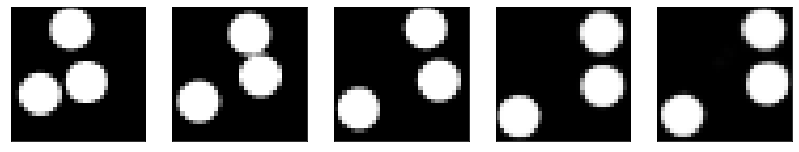

GD iterations:
i=0 | err=56.386131
i=1 | err=55.226212
i=2 | err=53.626419
i=3 | err=51.742714
i=4 | err=49.698212
i=5 | err=47.499748
i=6 | err=45.180206
i=7 | err=42.766693
i=8 | err=40.278431
i=9 | err=37.759670
i=10 | err=35.205395
i=11 | err=32.620720
i=12 | err=29.990591
i=13 | err=27.440544
i=14 | err=25.089733
i=15 | err=22.839012
i=16 | err=20.730801
i=17 | err=18.787956
i=18 | err=17.002090
i=19 | err=15.409330
i=20 | err=13.947948
i=21 | err=12.614872
i=22 | err=11.407961
i=23 | err=10.302572
i=24 | err=9.288027
i=25 | err=8.345387
i=26 | err=7.433596
i=27 | err=6.575770
i=28 | err=5.750370
i=29 | err=4.970613
Epoch=264 (19%) | out_positive=0.878540 | out_negative=0.194016 | mse=0.062283


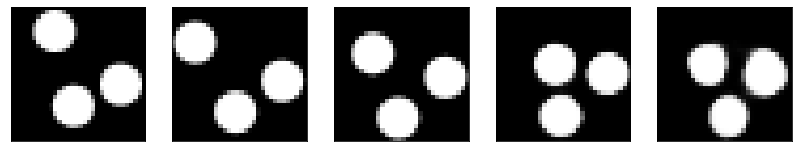

GD iterations:
i=0 | err=55.634426
i=1 | err=54.494583
i=2 | err=52.903732
i=3 | err=51.022614
i=4 | err=49.000587
i=5 | err=46.890488
i=6 | err=44.733334
i=7 | err=42.477730
i=8 | err=40.075310
i=9 | err=37.635384
i=10 | err=35.207985
i=11 | err=32.892471
i=12 | err=30.698053
i=13 | err=28.555460
i=14 | err=26.490620
i=15 | err=24.566029
i=16 | err=22.695913
i=17 | err=20.943211
i=18 | err=19.248964
i=19 | err=17.663452
i=20 | err=16.149160
i=21 | err=14.748384
i=22 | err=13.442310
i=23 | err=12.241016
i=24 | err=11.142206
i=25 | err=10.139419
i=26 | err=9.207056
i=27 | err=8.337355
i=28 | err=7.553128
i=29 | err=6.817977
Epoch=264 (20%) | out_positive=0.869769 | out_negative=0.102719 | mse=0.072086


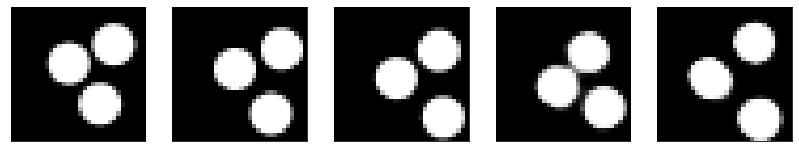

GD iterations:
i=0 | err=56.610847
i=1 | err=55.257454
i=2 | err=53.423927
i=3 | err=51.418785
i=4 | err=49.235916
i=5 | err=46.937489
i=6 | err=44.605774
i=7 | err=42.076347
i=8 | err=39.476395
i=9 | err=36.882118
i=10 | err=34.415504
i=11 | err=32.017567
i=12 | err=29.739346
i=13 | err=27.447500
i=14 | err=25.316299
i=15 | err=23.236404
i=16 | err=21.274347
i=17 | err=19.434177
i=18 | err=17.778633
i=19 | err=16.265503
i=20 | err=14.915445
i=21 | err=13.677526
i=22 | err=12.535161
i=23 | err=11.449677
i=24 | err=10.442616
i=25 | err=9.514507
i=26 | err=8.658123
i=27 | err=7.845752
i=28 | err=7.096213
i=29 | err=6.390872
Epoch=264 (22%) | out_positive=0.885792 | out_negative=0.153739 | mse=0.070996


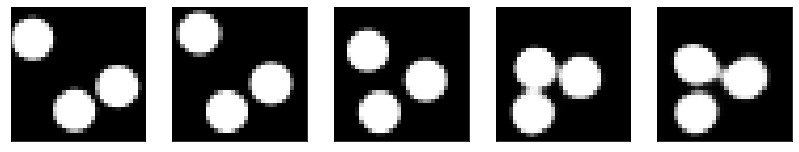

GD iterations:
i=0 | err=54.445103
i=1 | err=53.139652
i=2 | err=51.320160
i=3 | err=49.337486
i=4 | err=47.337677
i=5 | err=45.311806
i=6 | err=43.230968
i=7 | err=41.098179
i=8 | err=38.863472
i=9 | err=36.543800
i=10 | err=34.236748
i=11 | err=31.989788
i=12 | err=29.703335
i=13 | err=27.530041
i=14 | err=25.451817
i=15 | err=23.457058
i=16 | err=21.645634
i=17 | err=19.947140
i=18 | err=18.400105
i=19 | err=17.000000
i=20 | err=15.644552
i=21 | err=14.403807
i=22 | err=13.259150
i=23 | err=12.217369
i=24 | err=11.262182
i=25 | err=10.384174
i=26 | err=9.576283
i=27 | err=8.790828
i=28 | err=8.033031
i=29 | err=7.308547
Epoch=264 (24%) | out_positive=0.867910 | out_negative=0.131051 | mse=0.071179


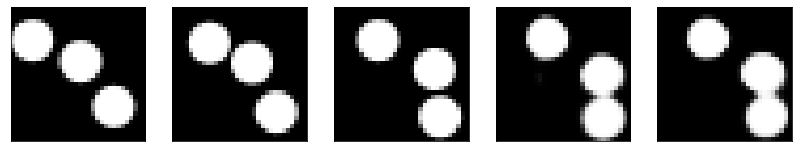

GD iterations:
i=0 | err=53.217506
i=1 | err=52.072353
i=2 | err=50.441517
i=3 | err=48.663685
i=4 | err=46.776970
i=5 | err=44.812717
i=6 | err=42.772118
i=7 | err=40.479313
i=8 | err=38.208382
i=9 | err=35.845467
i=10 | err=33.452347
i=11 | err=31.092405
i=12 | err=28.850929
i=13 | err=26.669891
i=14 | err=24.559576
i=15 | err=22.587685
i=16 | err=20.798004
i=17 | err=19.166050
i=18 | err=17.618238
i=19 | err=16.166512
i=20 | err=14.837502
i=21 | err=13.621227
i=22 | err=12.532160
i=23 | err=11.508135
i=24 | err=10.555790
i=25 | err=9.647166
i=26 | err=8.806774
i=27 | err=8.023010
i=28 | err=7.274796
i=29 | err=6.561530
Epoch=264 (26%) | out_positive=0.867893 | out_negative=0.144234 | mse=0.070157


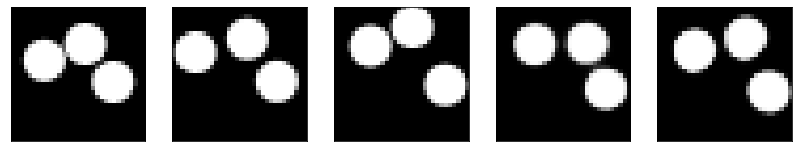

GD iterations:
i=0 | err=55.061775
i=1 | err=53.705521
i=2 | err=51.910820
i=3 | err=49.978672
i=4 | err=47.997326
i=5 | err=45.965973
i=6 | err=43.954277
i=7 | err=41.839321
i=8 | err=39.812614
i=9 | err=37.610008
i=10 | err=35.453941
i=11 | err=33.277863
i=12 | err=31.145962
i=13 | err=29.053104
i=14 | err=27.032406
i=15 | err=25.063133
i=16 | err=23.154854
i=17 | err=21.369160
i=18 | err=19.678474
i=19 | err=18.072504
i=20 | err=16.542419
i=21 | err=15.121164
i=22 | err=13.825010
i=23 | err=12.622623
i=24 | err=11.534679
i=25 | err=10.519974
i=26 | err=9.609336
i=27 | err=8.774921
i=28 | err=7.965208
i=29 | err=7.175395
Epoch=264 (28%) | out_positive=0.897541 | out_negative=0.096646 | mse=0.068302


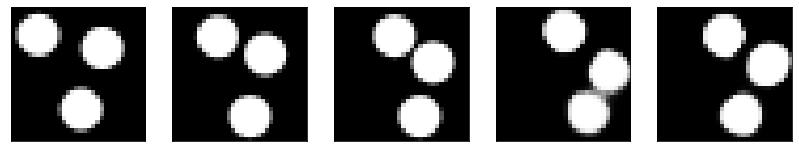

GD iterations:
i=0 | err=55.298271
i=1 | err=53.797699
i=2 | err=51.843342
i=3 | err=49.605637
i=4 | err=47.294197
i=5 | err=44.962112
i=6 | err=42.524147
i=7 | err=39.965179
i=8 | err=37.409729
i=9 | err=34.971371
i=10 | err=32.566826
i=11 | err=30.267635
i=12 | err=28.025339
i=13 | err=25.848101
i=14 | err=23.848885
i=15 | err=21.885630
i=16 | err=20.011049
i=17 | err=18.266739
i=18 | err=16.728252
i=19 | err=15.359545
i=20 | err=14.058652
i=21 | err=12.863226
i=22 | err=11.757242
i=23 | err=10.747805
i=24 | err=9.822200
i=25 | err=8.903988
i=26 | err=8.023765
i=27 | err=7.172708
i=28 | err=6.376418
i=29 | err=5.656929
Epoch=264 (30%) | out_positive=0.881359 | out_negative=0.178743 | mse=0.062168


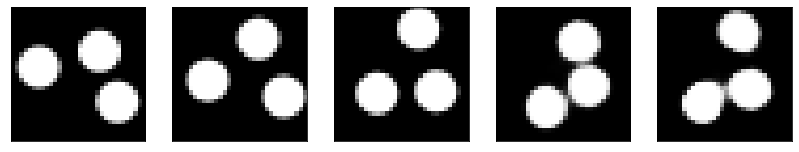

GD iterations:
i=0 | err=56.295418
i=1 | err=54.986496
i=2 | err=53.158886
i=3 | err=51.042427
i=4 | err=48.868515
i=5 | err=46.671165
i=6 | err=44.367649
i=7 | err=41.998692
i=8 | err=39.600670
i=9 | err=37.227531
i=10 | err=34.912460
i=11 | err=32.717190
i=12 | err=30.678543
i=13 | err=28.588009
i=14 | err=26.524887
i=15 | err=24.480206
i=16 | err=22.471359
i=17 | err=20.527651
i=18 | err=18.731861
i=19 | err=17.102053
i=20 | err=15.611041
i=21 | err=14.300982
i=22 | err=13.057817
i=23 | err=11.895535
i=24 | err=10.767476
i=25 | err=9.754266
i=26 | err=8.765057
i=27 | err=7.871916
i=28 | err=7.033926
i=29 | err=6.287000
Epoch=264 (32%) | out_positive=0.871307 | out_negative=0.140916 | mse=0.067773


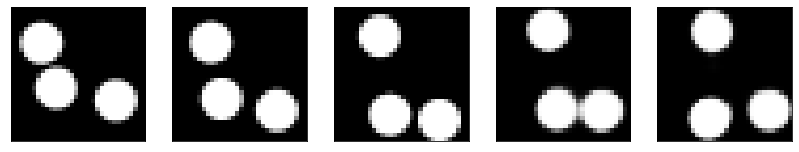

GD iterations:
i=0 | err=55.413223
i=1 | err=54.225471
i=2 | err=52.536285
i=3 | err=50.645763
i=4 | err=48.654194
i=5 | err=46.490685
i=6 | err=44.401878
i=7 | err=42.312683
i=8 | err=40.174477
i=9 | err=38.105171
i=10 | err=35.991608
i=11 | err=33.955166
i=12 | err=31.954899
i=13 | err=29.978394
i=14 | err=28.108013
i=15 | err=26.208790
i=16 | err=24.420607
i=17 | err=22.649403
i=18 | err=20.997635
i=19 | err=19.410814
i=20 | err=17.954678
i=21 | err=16.565895
i=22 | err=15.276150
i=23 | err=14.054534
i=24 | err=12.920181
i=25 | err=11.855448
i=26 | err=10.843729
i=27 | err=9.914658
i=28 | err=9.022362
i=29 | err=8.185259
Epoch=264 (33%) | out_positive=0.841692 | out_negative=0.145148 | mse=0.072367


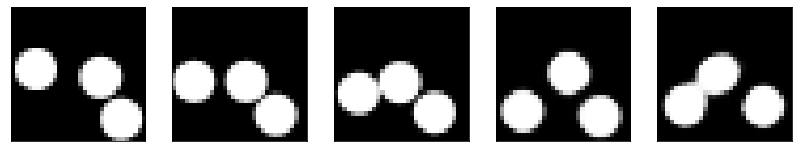

GD iterations:
i=0 | err=55.782425
i=1 | err=54.486988
i=2 | err=52.701721
i=3 | err=50.636734
i=4 | err=48.444508
i=5 | err=46.081245
i=6 | err=43.637676
i=7 | err=41.189735
i=8 | err=38.791466
i=9 | err=36.459171
i=10 | err=34.215454
i=11 | err=31.985716
i=12 | err=29.806988
i=13 | err=27.650146
i=14 | err=25.553177
i=15 | err=23.604073
i=16 | err=21.792919
i=17 | err=20.100023
i=18 | err=18.580769
i=19 | err=17.101109
i=20 | err=15.726112
i=21 | err=14.431605
i=22 | err=13.195179
i=23 | err=12.053817
i=24 | err=10.997398
i=25 | err=10.026093
i=26 | err=9.131018
i=27 | err=8.293500
i=28 | err=7.492878
i=29 | err=6.747892
Epoch=264 (35%) | out_positive=0.844311 | out_negative=0.153121 | mse=0.068723


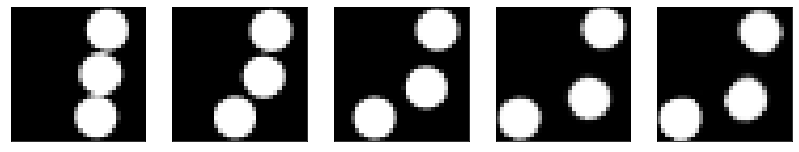

GD iterations:
i=0 | err=57.605164
i=1 | err=56.290581
i=2 | err=54.527599
i=3 | err=52.474377
i=4 | err=50.358887
i=5 | err=48.158150
i=6 | err=45.905617
i=7 | err=43.701504
i=8 | err=41.484734
i=9 | err=39.290440
i=10 | err=37.015686
i=11 | err=34.722744
i=12 | err=32.450481
i=13 | err=30.272772
i=14 | err=28.187519
i=15 | err=26.138012
i=16 | err=24.149956
i=17 | err=22.237747
i=18 | err=20.480341
i=19 | err=18.839664
i=20 | err=17.339821
i=21 | err=15.944958
i=22 | err=14.694395
i=23 | err=13.503334
i=24 | err=12.394551
i=25 | err=11.350754
i=26 | err=10.362824
i=27 | err=9.449186
i=28 | err=8.606263
i=29 | err=7.792917
Epoch=264 (37%) | out_positive=0.860651 | out_negative=0.106314 | mse=0.072138


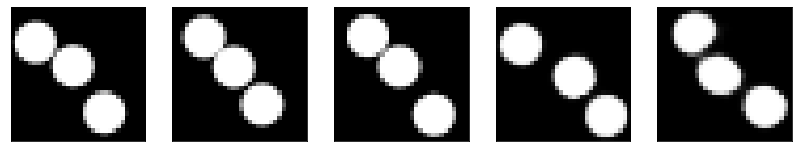

GD iterations:
i=0 | err=55.296410
i=1 | err=54.046547
i=2 | err=52.251617
i=3 | err=50.175888
i=4 | err=47.975483
i=5 | err=45.696182
i=6 | err=43.346657
i=7 | err=40.928230
i=8 | err=38.534317
i=9 | err=36.073608
i=10 | err=33.641720
i=11 | err=31.246391
i=12 | err=28.928524
i=13 | err=26.675529
i=14 | err=24.545944
i=15 | err=22.541687
i=16 | err=20.581676
i=17 | err=18.744684
i=18 | err=17.128555
i=19 | err=15.693758
i=20 | err=14.369182
i=21 | err=13.110052
i=22 | err=11.987110
i=23 | err=10.916638
i=24 | err=9.936783
i=25 | err=8.986479
i=26 | err=8.092119
i=27 | err=7.249054
i=28 | err=6.460660
i=29 | err=5.732759
Epoch=264 (39%) | out_positive=0.892413 | out_negative=0.191742 | mse=0.066021


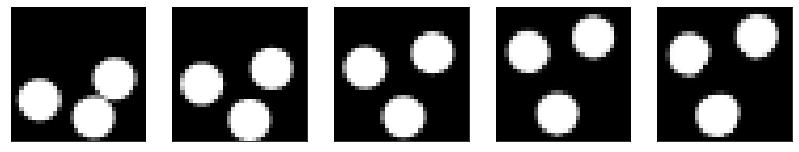

GD iterations:
i=0 | err=61.940239
i=1 | err=60.602684
i=2 | err=58.725906
i=3 | err=56.590981
i=4 | err=54.206036
i=5 | err=51.788563
i=6 | err=49.250355
i=7 | err=46.627609
i=8 | err=43.985043
i=9 | err=41.235870
i=10 | err=38.484863
i=11 | err=35.847000
i=12 | err=33.301620
i=13 | err=30.850506
i=14 | err=28.539757
i=15 | err=26.409435
i=16 | err=24.352356
i=17 | err=22.457222
i=18 | err=20.730619
i=19 | err=19.115105
i=20 | err=17.617531
i=21 | err=16.238146
i=22 | err=14.942097
i=23 | err=13.693152
i=24 | err=12.475280
i=25 | err=11.296257
i=26 | err=10.239120
i=27 | err=9.221301
i=28 | err=8.288726
i=29 | err=7.393546
Epoch=264 (41%) | out_positive=0.818832 | out_negative=0.125175 | mse=0.074375


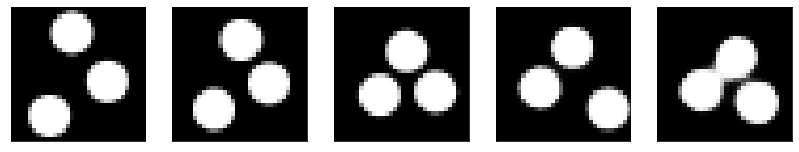

GD iterations:
i=0 | err=52.543320
i=1 | err=51.398270
i=2 | err=49.667179
i=3 | err=47.767052
i=4 | err=45.762650
i=5 | err=43.736813
i=6 | err=41.691055
i=7 | err=39.515129
i=8 | err=37.347656
i=9 | err=35.133327
i=10 | err=32.971695
i=11 | err=30.841883
i=12 | err=28.780457
i=13 | err=26.809475
i=14 | err=24.963278
i=15 | err=23.190678
i=16 | err=21.541389
i=17 | err=20.031757
i=18 | err=18.611691
i=19 | err=17.261860
i=20 | err=15.935750
i=21 | err=14.716501
i=22 | err=13.558699
i=23 | err=12.537378
i=24 | err=11.596133
i=25 | err=10.720492
i=26 | err=9.872738
i=27 | err=9.060843
i=28 | err=8.254765
i=29 | err=7.503327
Epoch=264 (43%) | out_positive=0.830581 | out_negative=0.098209 | mse=0.068323


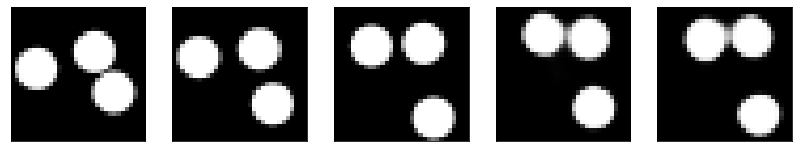

GD iterations:
i=0 | err=55.480904
i=1 | err=54.203484
i=2 | err=52.526581
i=3 | err=50.660046
i=4 | err=48.690971
i=5 | err=46.596626
i=6 | err=44.417236
i=7 | err=42.217285
i=8 | err=39.953468
i=9 | err=37.626801
i=10 | err=35.251396
i=11 | err=32.938515
i=12 | err=30.737747
i=13 | err=28.522249
i=14 | err=26.366945
i=15 | err=24.347141
i=16 | err=22.361292
i=17 | err=20.499832
i=18 | err=18.786457
i=19 | err=17.239964
i=20 | err=15.833044
i=21 | err=14.555220
i=22 | err=13.375651
i=23 | err=12.266329
i=24 | err=11.224260
i=25 | err=10.239512
i=26 | err=9.291322
i=27 | err=8.382526
i=28 | err=7.512274
i=29 | err=6.672441
Epoch=264 (44%) | out_positive=0.920656 | out_negative=0.166335 | mse=0.074959


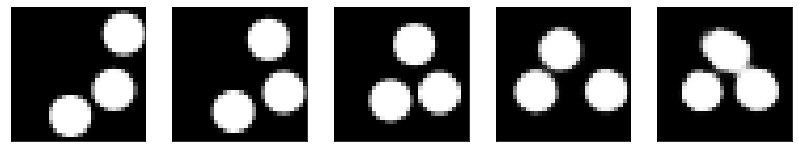

GD iterations:
i=0 | err=54.954376
i=1 | err=53.823658
i=2 | err=52.219208
i=3 | err=50.384174
i=4 | err=48.405262
i=5 | err=46.352135
i=6 | err=44.252144
i=7 | err=42.009579
i=8 | err=39.771507
i=9 | err=37.428524
i=10 | err=35.086136
i=11 | err=32.748962
i=12 | err=30.466965
i=13 | err=28.266056
i=14 | err=26.138538
i=15 | err=24.064445
i=16 | err=22.134972
i=17 | err=20.320934
i=18 | err=18.675301
i=19 | err=17.111925
i=20 | err=15.636434
i=21 | err=14.246544
i=22 | err=12.954391
i=23 | err=11.765995
i=24 | err=10.674435
i=25 | err=9.643326
i=26 | err=8.659594
i=27 | err=7.785635
i=28 | err=6.960116
i=29 | err=6.188148
Epoch=264 (46%) | out_positive=0.903971 | out_negative=0.174072 | mse=0.071478


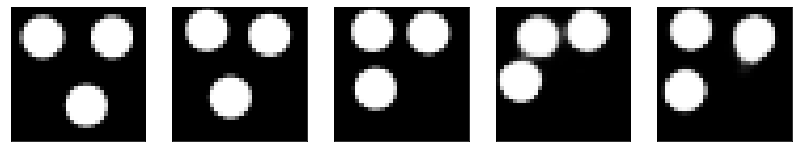

GD iterations:
i=0 | err=53.409668
i=1 | err=52.168743
i=2 | err=50.529007
i=3 | err=48.670414
i=4 | err=46.716202
i=5 | err=44.695747
i=6 | err=42.647072
i=7 | err=40.543537
i=8 | err=38.383106
i=9 | err=36.176010
i=10 | err=33.975586
i=11 | err=31.769257
i=12 | err=29.580563
i=13 | err=27.440689
i=14 | err=25.410521
i=15 | err=23.466579
i=16 | err=21.611744
i=17 | err=19.887867
i=18 | err=18.284512
i=19 | err=16.881432
i=20 | err=15.600212
i=21 | err=14.449823
i=22 | err=13.395639
i=23 | err=12.365504
i=24 | err=11.374483
i=25 | err=10.450562
i=26 | err=9.546063
i=27 | err=8.663110
i=28 | err=7.816080
i=29 | err=7.037119
Epoch=264 (48%) | out_positive=0.882940 | out_negative=0.105328 | mse=0.069053


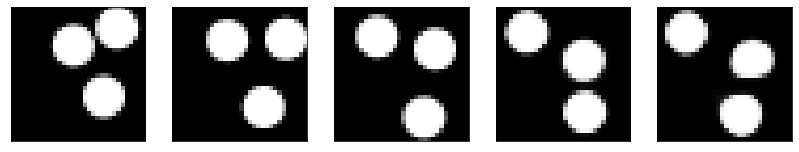

GD iterations:
i=0 | err=54.292038
i=1 | err=53.121307
i=2 | err=51.511673
i=3 | err=49.695129
i=4 | err=47.769131
i=5 | err=45.746971
i=6 | err=43.527943
i=7 | err=41.241089
i=8 | err=38.885994
i=9 | err=36.547348
i=10 | err=34.175442
i=11 | err=31.904528
i=12 | err=29.702143
i=13 | err=27.558451
i=14 | err=25.550957
i=15 | err=23.627497
i=16 | err=21.850170
i=17 | err=20.181530
i=18 | err=18.599321
i=19 | err=17.124630
i=20 | err=15.698633
i=21 | err=14.402864
i=22 | err=13.219494
i=23 | err=12.161852
i=24 | err=11.203192
i=25 | err=10.305683
i=26 | err=9.418934
i=27 | err=8.555744
i=28 | err=7.719732
i=29 | err=6.913958
Epoch=264 (50%) | out_positive=0.914684 | out_negative=0.127281 | mse=0.075852


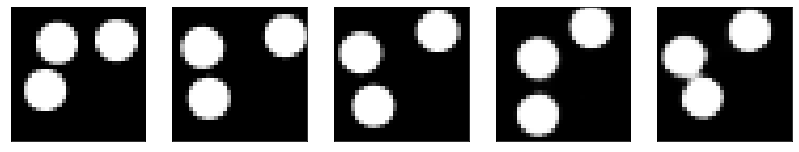

GD iterations:
i=0 | err=56.029510
i=1 | err=54.702946
i=2 | err=52.945198
i=3 | err=50.881287
i=4 | err=48.716049
i=5 | err=46.496132
i=6 | err=44.197105
i=7 | err=41.886093
i=8 | err=39.484047
i=9 | err=37.054367
i=10 | err=34.605907
i=11 | err=32.275665
i=12 | err=30.056021
i=13 | err=27.944637
i=14 | err=26.005907
i=15 | err=24.202774
i=16 | err=22.509958
i=17 | err=20.875530
i=18 | err=19.290058
i=19 | err=17.827948
i=20 | err=16.404528
i=21 | err=15.098502
i=22 | err=13.866196
i=23 | err=12.725714
i=24 | err=11.705772
i=25 | err=10.783347
i=26 | err=9.904227
i=27 | err=9.060568
i=28 | err=8.272816
i=29 | err=7.518045
Epoch=264 (52%) | out_positive=0.867610 | out_negative=0.099701 | mse=0.071660


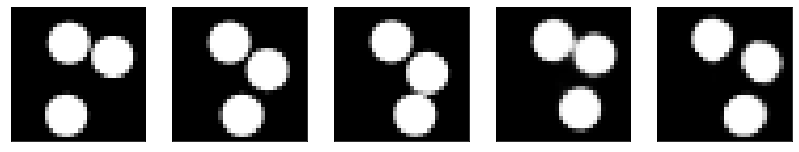

GD iterations:
i=0 | err=56.475441
i=1 | err=55.301979
i=2 | err=53.652344
i=3 | err=51.728577
i=4 | err=49.649818
i=5 | err=47.435341
i=6 | err=45.160023
i=7 | err=42.844078
i=8 | err=40.352951
i=9 | err=37.856979
i=10 | err=35.311394
i=11 | err=32.845642
i=12 | err=30.502985
i=13 | err=28.289694
i=14 | err=26.165142
i=15 | err=24.152924
i=16 | err=22.282631
i=17 | err=20.573532
i=18 | err=18.961533
i=19 | err=17.457676
i=20 | err=16.034002
i=21 | err=14.663481
i=22 | err=13.427025
i=23 | err=12.282369
i=24 | err=11.219513
i=25 | err=10.231159
i=26 | err=9.281751
i=27 | err=8.353910
i=28 | err=7.476764
i=29 | err=6.597594
Epoch=264 (54%) | out_positive=0.899372 | out_negative=0.161270 | mse=0.076995


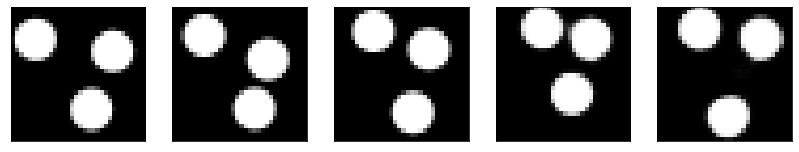

GD iterations:
i=0 | err=51.466667
i=1 | err=50.295486
i=2 | err=48.695396
i=3 | err=46.836292
i=4 | err=44.856541
i=5 | err=42.852264
i=6 | err=40.769196
i=7 | err=38.738728
i=8 | err=36.648037
i=9 | err=34.614849
i=10 | err=32.558727
i=11 | err=30.565399
i=12 | err=28.669472
i=13 | err=26.877235
i=14 | err=25.186531
i=15 | err=23.514408
i=16 | err=21.919270
i=17 | err=20.379780
i=18 | err=18.921894
i=19 | err=17.527882
i=20 | err=16.187378
i=21 | err=14.884889
i=22 | err=13.666455
i=23 | err=12.584559
i=24 | err=11.583785
i=25 | err=10.655847
i=26 | err=9.771268
i=27 | err=8.924868
i=28 | err=8.106663
i=29 | err=7.312373
Epoch=264 (55%) | out_positive=0.907575 | out_negative=0.126281 | mse=0.073720


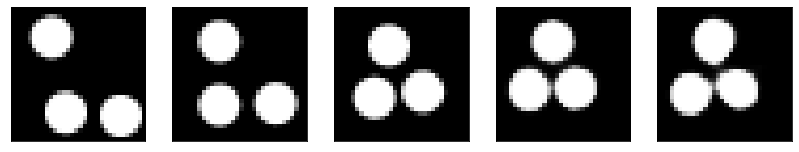

GD iterations:
i=0 | err=55.001923
i=1 | err=53.898636
i=2 | err=52.279869
i=3 | err=50.392616
i=4 | err=48.431923
i=5 | err=46.509300
i=6 | err=44.451096
i=7 | err=42.251469
i=8 | err=39.971077
i=9 | err=37.635864
i=10 | err=35.346542
i=11 | err=33.133045
i=12 | err=30.925636
i=13 | err=28.824993
i=14 | err=26.805012
i=15 | err=24.846472
i=16 | err=22.924200
i=17 | err=21.071522
i=18 | err=19.335472
i=19 | err=17.694614
i=20 | err=16.206894
i=21 | err=14.861711
i=22 | err=13.632895
i=23 | err=12.489791
i=24 | err=11.443129
i=25 | err=10.515366
i=26 | err=9.672005
i=27 | err=8.853610
i=28 | err=8.107780
i=29 | err=7.362928
Epoch=264 (57%) | out_positive=0.854539 | out_negative=0.133206 | mse=0.069939


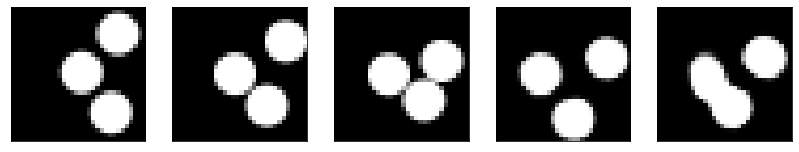

GD iterations:
i=0 | err=58.041828
i=1 | err=56.792244
i=2 | err=55.114635
i=3 | err=53.205082
i=4 | err=51.184647
i=5 | err=48.901394
i=6 | err=46.634636
i=7 | err=44.230587
i=8 | err=41.762894
i=9 | err=39.247471
i=10 | err=36.736656
i=11 | err=34.275166
i=12 | err=31.690784
i=13 | err=29.163792
i=14 | err=26.789680
i=15 | err=24.570148
i=16 | err=22.597710
i=17 | err=20.757294
i=18 | err=19.024828
i=19 | err=17.373337
i=20 | err=15.867902
i=21 | err=14.478668
i=22 | err=13.230658
i=23 | err=12.081954
i=24 | err=11.021341
i=25 | err=10.079903
i=26 | err=9.204658
i=27 | err=8.361017
i=28 | err=7.543470
i=29 | err=6.784904
Epoch=264 (59%) | out_positive=0.876001 | out_negative=0.130094 | mse=0.073620


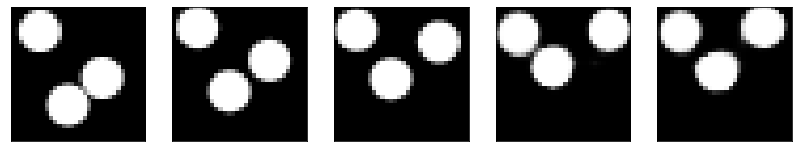

GD iterations:
i=0 | err=53.335777
i=1 | err=52.211796
i=2 | err=50.745583
i=3 | err=49.062912
i=4 | err=47.241066
i=5 | err=45.319237
i=6 | err=43.317902
i=7 | err=41.282120
i=8 | err=39.215588
i=9 | err=37.120644
i=10 | err=34.997978
i=11 | err=32.885384
i=12 | err=30.811939
i=13 | err=28.675438
i=14 | err=26.581385
i=15 | err=24.527876
i=16 | err=22.607000
i=17 | err=20.812101
i=18 | err=19.162806
i=19 | err=17.629631
i=20 | err=16.224718
i=21 | err=14.909050
i=22 | err=13.650061
i=23 | err=12.479456
i=24 | err=11.357471
i=25 | err=10.299463
i=26 | err=9.280038
i=27 | err=8.309502
i=28 | err=7.401093
i=29 | err=6.563937
Epoch=264 (61%) | out_positive=0.921464 | out_negative=0.151738 | mse=0.073722


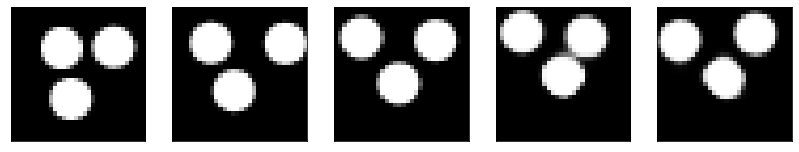

GD iterations:
i=0 | err=57.598221
i=1 | err=56.362251
i=2 | err=54.669277
i=3 | err=52.767410
i=4 | err=50.689960
i=5 | err=48.523060
i=6 | err=46.315781
i=7 | err=44.076332
i=8 | err=41.859818
i=9 | err=39.612434
i=10 | err=37.429508
i=11 | err=35.203922
i=12 | err=32.935822
i=13 | err=30.674477
i=14 | err=28.517204
i=15 | err=26.454102
i=16 | err=24.558022
i=17 | err=22.756115
i=18 | err=20.998951
i=19 | err=19.338322
i=20 | err=17.868298
i=21 | err=16.460028
i=22 | err=15.162103
i=23 | err=13.970903
i=24 | err=12.889517
i=25 | err=11.937009
i=26 | err=10.994545
i=27 | err=10.126045
i=28 | err=9.272414
i=29 | err=8.449641
Epoch=264 (63%) | out_positive=0.818539 | out_negative=0.108577 | mse=0.071733


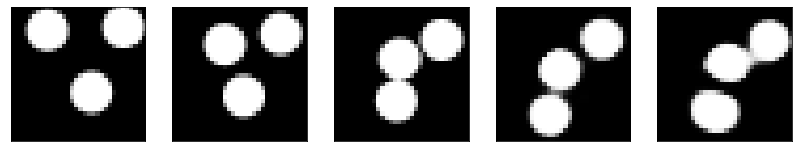

GD iterations:
i=0 | err=53.874401
i=1 | err=52.762024
i=2 | err=51.066021
i=3 | err=49.107735
i=4 | err=47.049011
i=5 | err=44.882267
i=6 | err=42.586468
i=7 | err=40.274220
i=8 | err=37.958763
i=9 | err=35.758820
i=10 | err=33.611813
i=11 | err=31.461828
i=12 | err=29.341070
i=13 | err=27.261656
i=14 | err=25.272116
i=15 | err=23.363071
i=16 | err=21.561089
i=17 | err=19.855709
i=18 | err=18.330269
i=19 | err=16.922907
i=20 | err=15.613777
i=21 | err=14.388937
i=22 | err=13.239811
i=23 | err=12.150556
i=24 | err=11.120646
i=25 | err=10.121485
i=26 | err=9.166725
i=27 | err=8.242508
i=28 | err=7.364549
i=29 | err=6.548090
Epoch=264 (65%) | out_positive=0.907403 | out_negative=0.123623 | mse=0.072479


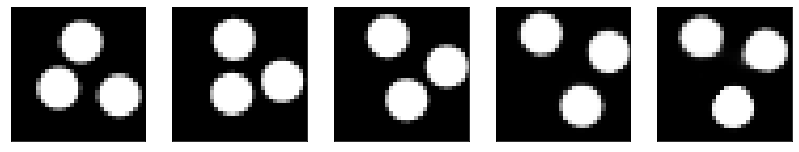

GD iterations:
i=0 | err=53.667763
i=1 | err=52.615662
i=2 | err=51.053089
i=3 | err=49.387352
i=4 | err=47.510845
i=5 | err=45.490162
i=6 | err=43.467361
i=7 | err=41.339027
i=8 | err=39.200897
i=9 | err=37.049965
i=10 | err=34.793198
i=11 | err=32.513664
i=12 | err=30.277952
i=13 | err=28.148670
i=14 | err=26.199770
i=15 | err=24.212954
i=16 | err=22.356441
i=17 | err=20.577427
i=18 | err=18.938641
i=19 | err=17.473606
i=20 | err=16.100571
i=21 | err=14.801641
i=22 | err=13.568791
i=23 | err=12.439957
i=24 | err=11.381086
i=25 | err=10.367928
i=26 | err=9.446852
i=27 | err=8.564480
i=28 | err=7.742571
i=29 | err=6.973467
Epoch=264 (66%) | out_positive=0.872882 | out_negative=0.145402 | mse=0.069313


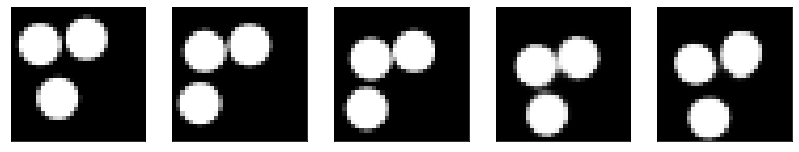

GD iterations:
i=0 | err=54.285793
i=1 | err=53.065926
i=2 | err=51.441341
i=3 | err=49.524986
i=4 | err=47.436905
i=5 | err=45.289444
i=6 | err=43.007301
i=7 | err=40.638115
i=8 | err=38.167953
i=9 | err=35.719982
i=10 | err=33.413433
i=11 | err=31.219820
i=12 | err=29.155497
i=13 | err=27.158365
i=14 | err=25.293709
i=15 | err=23.483181
i=16 | err=21.704800
i=17 | err=19.940685
i=18 | err=18.328062
i=19 | err=16.804119
i=20 | err=15.409691
i=21 | err=14.082602
i=22 | err=12.852873
i=23 | err=11.682609
i=24 | err=10.608475
i=25 | err=9.609793
i=26 | err=8.667015
i=27 | err=7.779048
i=28 | err=6.930742
i=29 | err=6.117348
Epoch=264 (68%) | out_positive=0.844295 | out_negative=0.148995 | mse=0.065510


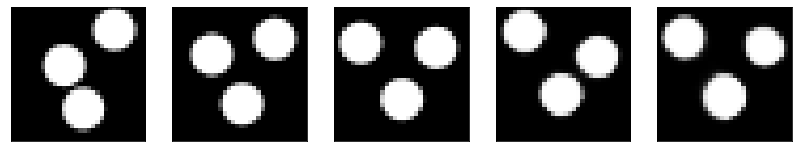

GD iterations:
i=0 | err=54.497330
i=1 | err=53.210541
i=2 | err=51.461868
i=3 | err=49.509014
i=4 | err=47.491608
i=5 | err=45.290363
i=6 | err=43.056721
i=7 | err=40.772308
i=8 | err=38.424644
i=9 | err=36.092247
i=10 | err=33.638474
i=11 | err=31.290470
i=12 | err=29.037151
i=13 | err=26.973408
i=14 | err=24.963234
i=15 | err=23.059277
i=16 | err=21.194798
i=17 | err=19.461777
i=18 | err=17.984192
i=19 | err=16.641281
i=20 | err=15.384813
i=21 | err=14.223707
i=22 | err=13.103775
i=23 | err=12.013823
i=24 | err=10.989986
i=25 | err=10.042240
i=26 | err=9.139027
i=27 | err=8.286087
i=28 | err=7.505612
i=29 | err=6.748147
Epoch=264 (70%) | out_positive=0.885911 | out_negative=0.137776 | mse=0.070304


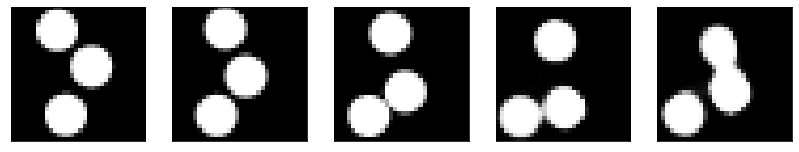

GD iterations:
i=0 | err=54.856346
i=1 | err=53.595802
i=2 | err=51.838043
i=3 | err=49.860641
i=4 | err=47.755161
i=5 | err=45.651894
i=6 | err=43.497528
i=7 | err=41.313370
i=8 | err=39.063541
i=9 | err=36.877487
i=10 | err=34.694309
i=11 | err=32.478271
i=12 | err=30.381617
i=13 | err=28.301239
i=14 | err=26.275318
i=15 | err=24.376276
i=16 | err=22.539074
i=17 | err=20.816124
i=18 | err=19.227188
i=19 | err=17.793743
i=20 | err=16.441156
i=21 | err=15.152462
i=22 | err=13.911747
i=23 | err=12.752099
i=24 | err=11.658978
i=25 | err=10.620206
i=26 | err=9.612083
i=27 | err=8.659855
i=28 | err=7.773860
i=29 | err=6.957495
Epoch=264 (72%) | out_positive=0.917702 | out_negative=0.125826 | mse=0.070607


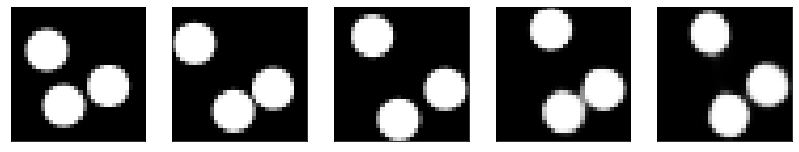

GD iterations:
i=0 | err=56.238106
i=1 | err=54.900597
i=2 | err=53.117096
i=3 | err=51.122833
i=4 | err=49.039154
i=5 | err=46.836361
i=6 | err=44.585602
i=7 | err=42.333218
i=8 | err=40.068146
i=9 | err=37.873142
i=10 | err=35.731888
i=11 | err=33.529961
i=12 | err=31.287256
i=13 | err=29.000591
i=14 | err=26.791088
i=15 | err=24.704048
i=16 | err=22.764942
i=17 | err=20.935316
i=18 | err=19.206009
i=19 | err=17.618980
i=20 | err=16.160683
i=21 | err=14.801151
i=22 | err=13.464647
i=23 | err=12.234084
i=24 | err=11.035739
i=25 | err=9.931894
i=26 | err=8.898653
i=27 | err=7.928443
i=28 | err=7.005156
i=29 | err=6.139115
Epoch=264 (74%) | out_positive=0.839288 | out_negative=0.124553 | mse=0.070477


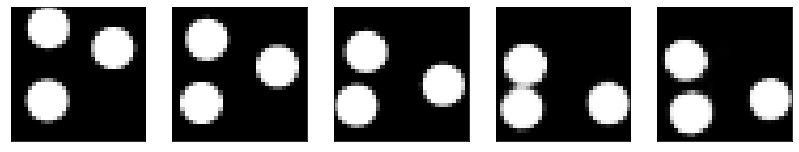

GD iterations:
i=0 | err=55.482445
i=1 | err=54.330460
i=2 | err=52.696526
i=3 | err=50.905949
i=4 | err=48.991604
i=5 | err=46.883965
i=6 | err=44.754612
i=7 | err=42.478245
i=8 | err=40.193077
i=9 | err=37.936707
i=10 | err=35.735626
i=11 | err=33.505367
i=12 | err=31.301979
i=13 | err=29.156193
i=14 | err=27.145710
i=15 | err=25.190010
i=16 | err=23.308350
i=17 | err=21.467169
i=18 | err=19.745806
i=19 | err=18.173386
i=20 | err=16.731125
i=21 | err=15.459528
i=22 | err=14.215830
i=23 | err=13.071278
i=24 | err=11.992391
i=25 | err=10.908854
i=26 | err=9.886357
i=27 | err=8.923126
i=28 | err=7.992991
i=29 | err=7.124597
Epoch=264 (76%) | out_positive=0.896307 | out_negative=0.139343 | mse=0.077573


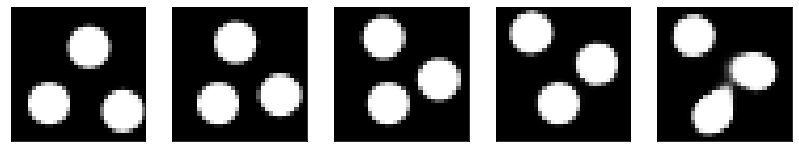

GD iterations:
i=0 | err=54.259212
i=1 | err=53.072884
i=2 | err=51.362728
i=3 | err=49.433083
i=4 | err=47.321541
i=5 | err=45.112656
i=6 | err=42.891388
i=7 | err=40.584534
i=8 | err=38.332623
i=9 | err=36.121731
i=10 | err=33.877922
i=11 | err=31.651287
i=12 | err=29.467350
i=13 | err=27.387455
i=14 | err=25.316727
i=15 | err=23.448526
i=16 | err=21.657541
i=17 | err=20.057957
i=18 | err=18.586067
i=19 | err=17.209961
i=20 | err=15.903655
i=21 | err=14.636578
i=22 | err=13.444536
i=23 | err=12.327410
i=24 | err=11.283585
i=25 | err=10.308955
i=26 | err=9.362024
i=27 | err=8.494546
i=28 | err=7.635780
i=29 | err=6.830399
Epoch=264 (77%) | out_positive=0.883149 | out_negative=0.103931 | mse=0.071681


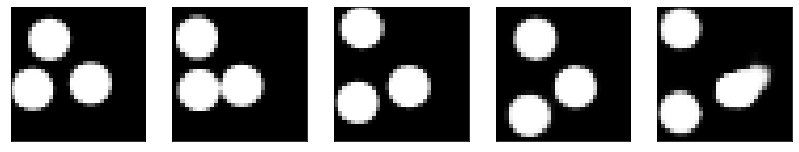

GD iterations:
i=0 | err=55.115799
i=1 | err=53.987968
i=2 | err=52.372425
i=3 | err=50.569817
i=4 | err=48.699913
i=5 | err=46.662918
i=6 | err=44.472679
i=7 | err=42.192013
i=8 | err=39.862759
i=9 | err=37.606667
i=10 | err=35.284775
i=11 | err=32.877647
i=12 | err=30.602093
i=13 | err=28.443962
i=14 | err=26.388041
i=15 | err=24.465405
i=16 | err=22.625860
i=17 | err=20.903782
i=18 | err=19.233627
i=19 | err=17.667334
i=20 | err=16.267632
i=21 | err=14.988939
i=22 | err=13.821908
i=23 | err=12.754525
i=24 | err=11.715776
i=25 | err=10.707203
i=26 | err=9.779317
i=27 | err=8.898299
i=28 | err=8.068190
i=29 | err=7.305976
Epoch=264 (79%) | out_positive=0.900876 | out_negative=0.105982 | mse=0.074016


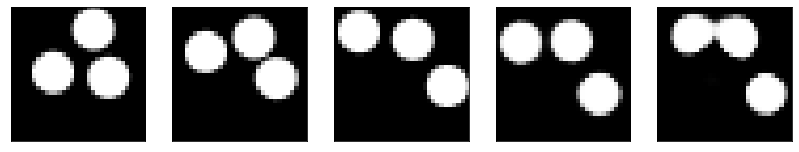

GD iterations:
i=0 | err=58.986404
i=1 | err=57.766720
i=2 | err=55.993317
i=3 | err=54.027122
i=4 | err=51.940819
i=5 | err=49.755955
i=6 | err=47.562252
i=7 | err=45.274284
i=8 | err=43.021160
i=9 | err=40.667545
i=10 | err=38.344841
i=11 | err=36.042973
i=12 | err=33.794144
i=13 | err=31.554874
i=14 | err=29.396400
i=15 | err=27.291462
i=16 | err=25.214846
i=17 | err=23.159927
i=18 | err=21.217426
i=19 | err=19.423382
i=20 | err=17.850346
i=21 | err=16.459629
i=22 | err=15.161844
i=23 | err=13.927217
i=24 | err=12.794631
i=25 | err=11.701597
i=26 | err=10.700403
i=27 | err=9.766444
i=28 | err=8.872595
i=29 | err=8.063830
Epoch=264 (81%) | out_positive=0.840082 | out_negative=0.094849 | mse=0.079203


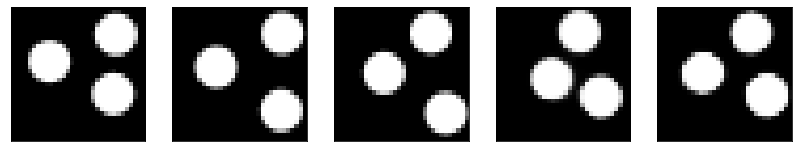

GD iterations:
i=0 | err=54.473232
i=1 | err=53.239227
i=2 | err=51.528625
i=3 | err=49.575878
i=4 | err=47.519650
i=5 | err=45.366932
i=6 | err=43.076542
i=7 | err=40.760071
i=8 | err=38.336544
i=9 | err=35.946762
i=10 | err=33.490803
i=11 | err=31.100132
i=12 | err=28.864498
i=13 | err=26.705332
i=14 | err=24.703617
i=15 | err=22.834286
i=16 | err=21.056431
i=17 | err=19.352491
i=18 | err=17.752113
i=19 | err=16.273020
i=20 | err=14.885731
i=21 | err=13.590364
i=22 | err=12.309897
i=23 | err=11.144043
i=24 | err=10.053272
i=25 | err=9.072865
i=26 | err=8.160797
i=27 | err=7.302584
i=28 | err=6.500462
i=29 | err=5.734643
Epoch=264 (83%) | out_positive=0.893011 | out_negative=0.180506 | mse=0.065814


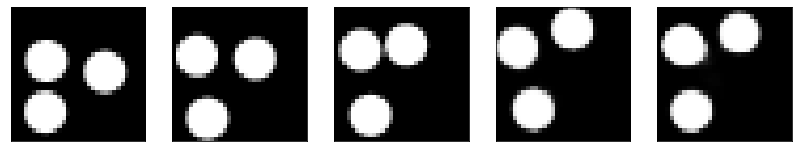

GD iterations:
i=0 | err=53.380009
i=1 | err=52.376740
i=2 | err=50.850716
i=3 | err=49.166763
i=4 | err=47.401894
i=5 | err=45.494110
i=6 | err=43.488655
i=7 | err=41.388893
i=8 | err=39.270294
i=9 | err=37.191780
i=10 | err=35.115761
i=11 | err=33.110748
i=12 | err=31.049175
i=13 | err=29.072704
i=14 | err=27.099060
i=15 | err=25.218657
i=16 | err=23.359858
i=17 | err=21.572353
i=18 | err=19.922297
i=19 | err=18.341228
i=20 | err=16.861805
i=21 | err=15.488429
i=22 | err=14.194245
i=23 | err=12.983557
i=24 | err=11.829256
i=25 | err=10.728810
i=26 | err=9.726398
i=27 | err=8.782898
i=28 | err=7.924394
i=29 | err=7.135319
Epoch=264 (85%) | out_positive=0.906493 | out_negative=0.097455 | mse=0.074102


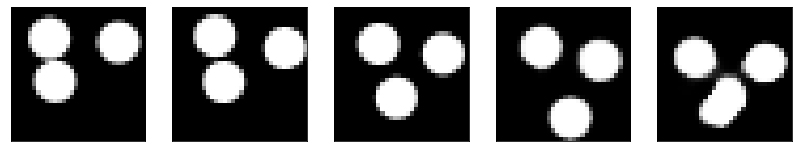

GD iterations:
i=0 | err=52.191223
i=1 | err=51.033058
i=2 | err=49.464195
i=3 | err=47.721901
i=4 | err=45.795128
i=5 | err=43.828285
i=6 | err=41.749817
i=7 | err=39.612427
i=8 | err=37.368477
i=9 | err=35.027313
i=10 | err=32.695213
i=11 | err=30.465332
i=12 | err=28.312288
i=13 | err=26.299114
i=14 | err=24.376764
i=15 | err=22.516975
i=16 | err=20.797798
i=17 | err=19.186682
i=18 | err=17.732546
i=19 | err=16.347557
i=20 | err=15.030253
i=21 | err=13.785161
i=22 | err=12.641056
i=23 | err=11.571194
i=24 | err=10.563974
i=25 | err=9.631488
i=26 | err=8.754646
i=27 | err=7.950127
i=28 | err=7.204707
i=29 | err=6.474550
Epoch=264 (87%) | out_positive=0.900222 | out_negative=0.165105 | mse=0.071612


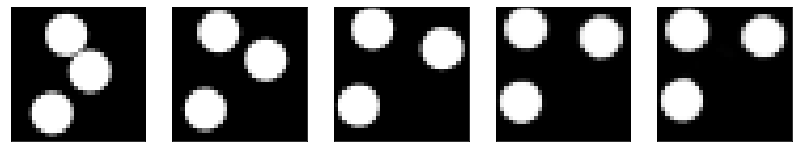

GD iterations:
i=0 | err=57.689823
i=1 | err=56.493843
i=2 | err=54.880875
i=3 | err=53.034538
i=4 | err=51.053383
i=5 | err=48.998684
i=6 | err=46.811443
i=7 | err=44.502678
i=8 | err=42.234982
i=9 | err=39.873524
i=10 | err=37.502563
i=11 | err=35.085060
i=12 | err=32.738205
i=13 | err=30.597116
i=14 | err=28.478031
i=15 | err=26.451065
i=16 | err=24.476181
i=17 | err=22.517776
i=18 | err=20.647013
i=19 | err=18.991394
i=20 | err=17.434950
i=21 | err=16.021843
i=22 | err=14.740670
i=23 | err=13.529004
i=24 | err=12.415687
i=25 | err=11.370731
i=26 | err=10.405593
i=27 | err=9.500202
i=28 | err=8.662178
i=29 | err=7.865530
Epoch=264 (88%) | out_positive=0.909965 | out_negative=0.089974 | mse=0.082626


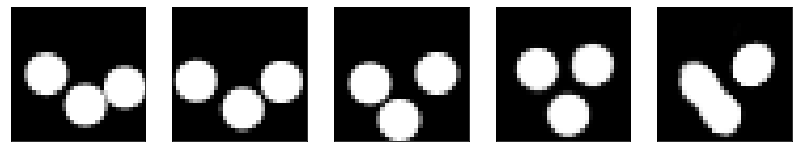

GD iterations:
i=0 | err=53.150143
i=1 | err=51.982346
i=2 | err=50.323044
i=3 | err=48.430824
i=4 | err=46.362644
i=5 | err=44.302319
i=6 | err=42.083347
i=7 | err=39.885853
i=8 | err=37.763344
i=9 | err=35.695251
i=10 | err=33.603050
i=11 | err=31.564718
i=12 | err=29.459517
i=13 | err=27.440592
i=14 | err=25.522577
i=15 | err=23.718069
i=16 | err=21.997089
i=17 | err=20.341263
i=18 | err=18.802237
i=19 | err=17.389698
i=20 | err=16.093498
i=21 | err=14.865992
i=22 | err=13.634233
i=23 | err=12.456968
i=24 | err=11.347432
i=25 | err=10.346331
i=26 | err=9.424795
i=27 | err=8.573270
i=28 | err=7.753632
i=29 | err=6.958960
Epoch=264 (90%) | out_positive=0.904019 | out_negative=0.105602 | mse=0.075011


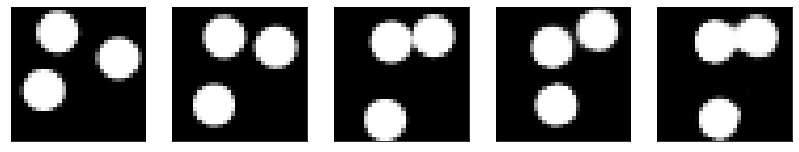

GD iterations:
i=0 | err=59.044739
i=1 | err=57.778702
i=2 | err=56.155487
i=3 | err=54.244232
i=4 | err=52.240402
i=5 | err=50.160854
i=6 | err=47.982193
i=7 | err=45.706211
i=8 | err=43.221046
i=9 | err=40.721748
i=10 | err=38.177418
i=11 | err=35.675941
i=12 | err=33.377029
i=13 | err=31.149847
i=14 | err=29.022505
i=15 | err=26.912540
i=16 | err=24.856159
i=17 | err=22.911377
i=18 | err=21.085850
i=19 | err=19.335018
i=20 | err=17.683342
i=21 | err=16.217770
i=22 | err=14.847349
i=23 | err=13.545439
i=24 | err=12.380812
i=25 | err=11.254620
i=26 | err=10.218163
i=27 | err=9.209743
i=28 | err=8.282495
i=29 | err=7.401517
Epoch=264 (92%) | out_positive=0.863843 | out_negative=0.152696 | mse=0.076001


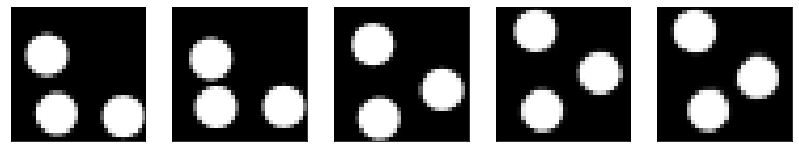

GD iterations:
i=0 | err=55.125500
i=1 | err=53.968910
i=2 | err=52.304031
i=3 | err=50.412628
i=4 | err=48.427933
i=5 | err=46.337013
i=6 | err=44.216358
i=7 | err=42.082916
i=8 | err=39.993576
i=9 | err=37.923180
i=10 | err=35.767860
i=11 | err=33.530823
i=12 | err=31.259995
i=13 | err=28.919081
i=14 | err=26.662222
i=15 | err=24.578262
i=16 | err=22.686596
i=17 | err=20.927553
i=18 | err=19.254566
i=19 | err=17.688915
i=20 | err=16.239868
i=21 | err=14.849125
i=22 | err=13.558988
i=23 | err=12.365210
i=24 | err=11.279580
i=25 | err=10.270293
i=26 | err=9.335815
i=27 | err=8.456959
i=28 | err=7.612263
i=29 | err=6.812519
Epoch=264 (94%) | out_positive=0.914146 | out_negative=0.145652 | mse=0.077753


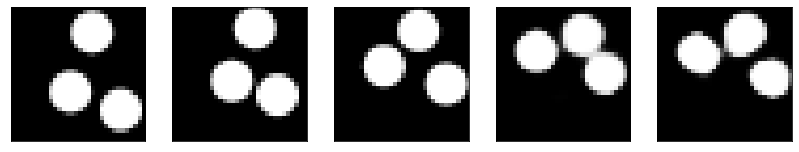

GD iterations:
i=0 | err=52.791908
i=1 | err=51.494232
i=2 | err=49.733829
i=3 | err=47.844158
i=4 | err=45.853413
i=5 | err=43.801285
i=6 | err=41.699074
i=7 | err=39.566414
i=8 | err=37.400066
i=9 | err=35.266983
i=10 | err=33.177681
i=11 | err=31.187141
i=12 | err=29.194950
i=13 | err=27.216610
i=14 | err=25.274776
i=15 | err=23.398144
i=16 | err=21.653694
i=17 | err=19.988733
i=18 | err=18.439388
i=19 | err=16.947479
i=20 | err=15.531384
i=21 | err=14.196604
i=22 | err=12.963964
i=23 | err=11.845873
i=24 | err=10.855873
i=25 | err=9.912052
i=26 | err=9.008127
i=27 | err=8.116842
i=28 | err=7.288177
i=29 | err=6.463358
Epoch=264 (96%) | out_positive=0.866666 | out_negative=0.164791 | mse=0.067104


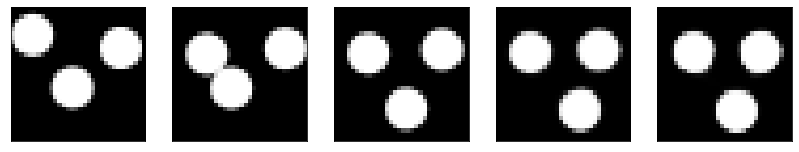

GD iterations:
i=0 | err=54.117172
i=1 | err=52.901871
i=2 | err=51.279495
i=3 | err=49.480572
i=4 | err=47.569092
i=5 | err=45.535362
i=6 | err=43.462040
i=7 | err=41.322346
i=8 | err=39.194359
i=9 | err=37.033493
i=10 | err=34.801231
i=11 | err=32.522392
i=12 | err=30.224356
i=13 | err=27.910137
i=14 | err=25.641237
i=15 | err=23.496140
i=16 | err=21.504318
i=17 | err=19.645538
i=18 | err=17.905231
i=19 | err=16.301916
i=20 | err=14.857364
i=21 | err=13.527310
i=22 | err=12.290398
i=23 | err=11.144209
i=24 | err=10.048789
i=25 | err=9.044924
i=26 | err=8.132010
i=27 | err=7.276459
i=28 | err=6.499691
i=29 | err=5.769244
Epoch=264 (97%) | out_positive=0.903879 | out_negative=0.162791 | mse=0.070771


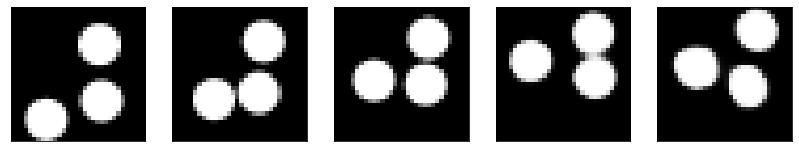

GD iterations:
i=0 | err=53.760662
i=1 | err=52.573383
i=2 | err=50.890427
i=3 | err=49.079456
i=4 | err=47.057320
i=5 | err=45.033623
i=6 | err=42.894066
i=7 | err=40.742939
i=8 | err=38.472282
i=9 | err=36.084255
i=10 | err=33.704578
i=11 | err=31.261683
i=12 | err=28.891842
i=13 | err=26.659237
i=14 | err=24.555122
i=15 | err=22.601311
i=16 | err=20.769806
i=17 | err=19.023026
i=18 | err=17.440269
i=19 | err=15.944986
i=20 | err=14.538419
i=21 | err=13.269850
i=22 | err=12.117767
i=23 | err=11.109237
i=24 | err=10.175728
i=25 | err=9.285289
i=26 | err=8.449888
i=27 | err=7.653903
i=28 | err=6.936552
i=29 | err=6.272801
Epoch=264 (98%) | out_positive=0.844114 | out_negative=0.134167 | mse=0.071531


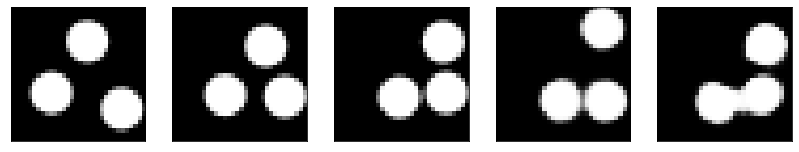

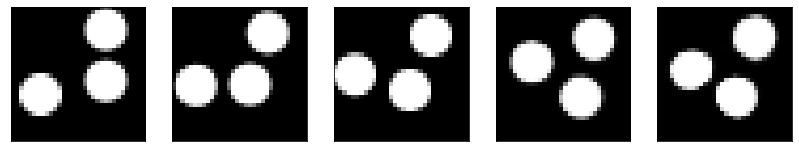

Test MSE 0.077969


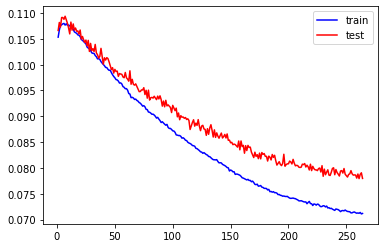

GD iterations:
i=0 | err=53.721863
i=1 | err=52.507381
i=2 | err=50.774597
i=3 | err=48.855297
i=4 | err=46.859573
i=5 | err=44.802795
i=6 | err=42.575531
i=7 | err=40.336941
i=8 | err=38.025539
i=9 | err=35.734657
i=10 | err=33.548092
i=11 | err=31.399094
i=12 | err=29.300865
i=13 | err=27.273491
i=14 | err=25.279385
i=15 | err=23.338963
i=16 | err=21.429810
i=17 | err=19.756701
i=18 | err=18.168488
i=19 | err=16.705074
i=20 | err=15.295323
i=21 | err=13.962345
i=22 | err=12.675814
i=23 | err=11.536863
i=24 | err=10.505355
i=25 | err=9.513800
i=26 | err=8.629164
i=27 | err=7.810707
i=28 | err=7.036942
i=29 | err=6.280859
Epoch=265 (0%) | out_positive=0.895323 | out_negative=0.143741 | mse=0.067779


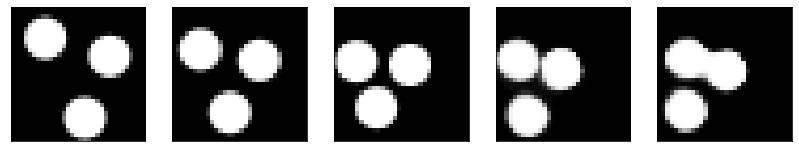

GD iterations:
i=0 | err=51.133606
i=1 | err=49.847595
i=2 | err=48.119061
i=3 | err=46.271797
i=4 | err=44.368370
i=5 | err=42.397888
i=6 | err=40.441380
i=7 | err=38.484291
i=8 | err=36.433647
i=9 | err=34.344795
i=10 | err=32.300720
i=11 | err=30.259510
i=12 | err=28.280994
i=13 | err=26.301847
i=14 | err=24.420874
i=15 | err=22.654125
i=16 | err=21.078226
i=17 | err=19.622883
i=18 | err=18.284386
i=19 | err=17.008694
i=20 | err=15.799845
i=21 | err=14.648002
i=22 | err=13.557642
i=23 | err=12.566352
i=24 | err=11.627465
i=25 | err=10.725313
i=26 | err=9.863266
i=27 | err=9.045979
i=28 | err=8.254989
i=29 | err=7.489322
Epoch=265 (2%) | out_positive=0.855114 | out_negative=0.109406 | mse=0.068020


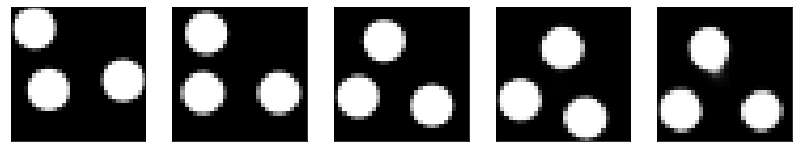

GD iterations:
i=0 | err=55.009956
i=1 | err=53.741043
i=2 | err=52.069534
i=3 | err=50.201859
i=4 | err=48.211021
i=5 | err=46.074608
i=6 | err=43.929672
i=7 | err=41.765175
i=8 | err=39.509922
i=9 | err=37.287621
i=10 | err=35.104298
i=11 | err=32.953308
i=12 | err=30.827475
i=13 | err=28.733139
i=14 | err=26.717951
i=15 | err=24.815025
i=16 | err=23.055138
i=17 | err=21.393837
i=18 | err=19.913555
i=19 | err=18.519501
i=20 | err=17.191744
i=21 | err=15.976808
i=22 | err=14.816193
i=23 | err=13.744045
i=24 | err=12.769444
i=25 | err=11.846362
i=26 | err=10.978829
i=27 | err=10.120897
i=28 | err=9.276558
i=29 | err=8.466719
Epoch=265 (4%) | out_positive=0.839828 | out_negative=0.104847 | mse=0.072377


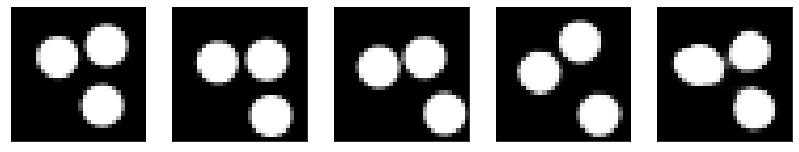

GD iterations:
i=0 | err=55.635418
i=1 | err=54.473255
i=2 | err=52.897591
i=3 | err=51.090797
i=4 | err=49.185497
i=5 | err=47.167477
i=6 | err=45.135742
i=7 | err=42.914272
i=8 | err=40.646740
i=9 | err=38.272854
i=10 | err=35.890919
i=11 | err=33.554424
i=12 | err=31.228394
i=13 | err=28.972279
i=14 | err=26.804474
i=15 | err=24.748070
i=16 | err=22.816509
i=17 | err=21.014505
i=18 | err=19.349194
i=19 | err=17.745903
i=20 | err=16.311077
i=21 | err=15.083140
i=22 | err=13.906798
i=23 | err=12.800400
i=24 | err=11.698237
i=25 | err=10.660873
i=26 | err=9.669617
i=27 | err=8.742085
i=28 | err=7.843702
i=29 | err=7.022302
Epoch=265 (6%) | out_positive=0.876279 | out_negative=0.162987 | mse=0.072519


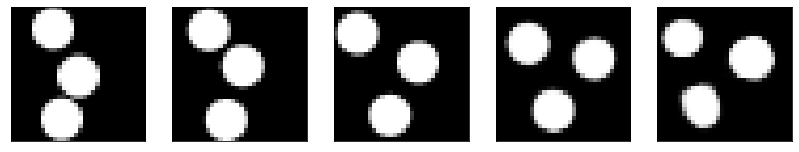

GD iterations:
i=0 | err=50.573776
i=1 | err=49.388264
i=2 | err=47.729565
i=3 | err=45.842594
i=4 | err=43.882816
i=5 | err=41.853325
i=6 | err=39.751732
i=7 | err=37.662155
i=8 | err=35.536518
i=9 | err=33.491432
i=10 | err=31.480507
i=11 | err=29.472492
i=12 | err=27.570463
i=13 | err=25.659302
i=14 | err=23.814329
i=15 | err=22.016430
i=16 | err=20.349567
i=17 | err=18.771683
i=18 | err=17.343281
i=19 | err=15.938522
i=20 | err=14.647523
i=21 | err=13.474248
i=22 | err=12.387381
i=23 | err=11.393198
i=24 | err=10.464993
i=25 | err=9.567800
i=26 | err=8.729080
i=27 | err=7.949941
i=28 | err=7.230819
i=29 | err=6.530986
Epoch=265 (8%) | out_positive=0.937317 | out_negative=0.100598 | mse=0.072666


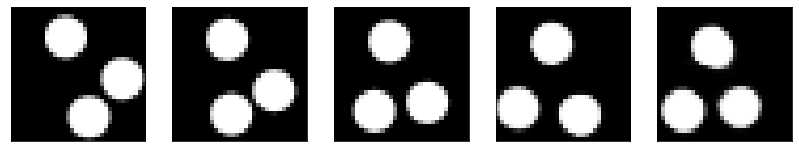

GD iterations:
i=0 | err=54.322842
i=1 | err=53.070557
i=2 | err=51.396183
i=3 | err=49.447475
i=4 | err=47.466244
i=5 | err=45.471031
i=6 | err=43.340641
i=7 | err=41.138168
i=8 | err=38.792366
i=9 | err=36.464748
i=10 | err=34.251202
i=11 | err=32.042095
i=12 | err=29.926716
i=13 | err=27.789726
i=14 | err=25.790722
i=15 | err=23.849005
i=16 | err=22.015789
i=17 | err=20.306253
i=18 | err=18.701214
i=19 | err=17.187431
i=20 | err=15.806763
i=21 | err=14.492399
i=22 | err=13.324604
i=23 | err=12.256086
i=24 | err=11.312098
i=25 | err=10.412741
i=26 | err=9.559161
i=27 | err=8.755502
i=28 | err=7.987940
i=29 | err=7.283635
Epoch=265 (9%) | out_positive=0.844323 | out_negative=0.116010 | mse=0.068789


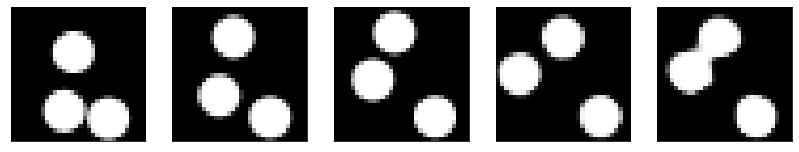

GD iterations:
i=0 | err=54.636200
i=1 | err=53.466976
i=2 | err=51.878593
i=3 | err=50.088249
i=4 | err=48.179550
i=5 | err=46.188217
i=6 | err=44.099083
i=7 | err=41.885849
i=8 | err=39.689304
i=9 | err=37.413067
i=10 | err=35.138355
i=11 | err=32.814735
i=12 | err=30.611252
i=13 | err=28.520859
i=14 | err=26.539921
i=15 | err=24.740189
i=16 | err=22.999699
i=17 | err=21.318687
i=18 | err=19.719433
i=19 | err=18.192047
i=20 | err=16.729559
i=21 | err=15.369365
i=22 | err=14.066109
i=23 | err=12.831142
i=24 | err=11.667496
i=25 | err=10.607469
i=26 | err=9.664461
i=27 | err=8.763182
i=28 | err=7.941512
i=29 | err=7.114382
Epoch=265 (11%) | out_positive=0.863377 | out_negative=0.120385 | mse=0.062547


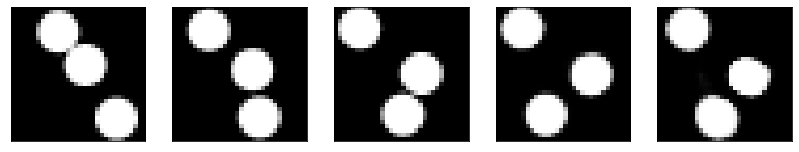

GD iterations:
i=0 | err=52.100143
i=1 | err=50.993057
i=2 | err=49.507050
i=3 | err=47.814110
i=4 | err=45.958813
i=5 | err=44.110146
i=6 | err=42.151230
i=7 | err=40.144279
i=8 | err=38.168522
i=9 | err=36.165169
i=10 | err=34.210449
i=11 | err=32.263187
i=12 | err=30.310272
i=13 | err=28.274929
i=14 | err=26.302143
i=15 | err=24.396454
i=16 | err=22.627272
i=17 | err=20.960997
i=18 | err=19.391258
i=19 | err=17.897625
i=20 | err=16.491505
i=21 | err=15.165606
i=22 | err=14.023443
i=23 | err=12.936761
i=24 | err=11.955828
i=25 | err=11.008737
i=26 | err=10.111685
i=27 | err=9.247928
i=28 | err=8.412097
i=29 | err=7.614673
Epoch=265 (13%) | out_positive=0.889783 | out_negative=0.094350 | mse=0.070720


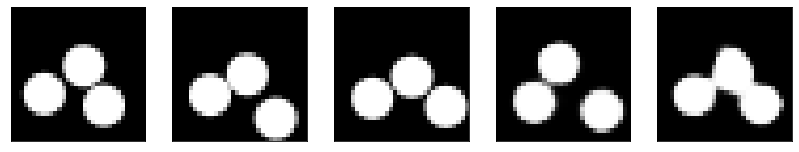

GD iterations:
i=0 | err=53.068192
i=1 | err=51.835571
i=2 | err=50.096565
i=3 | err=48.221226
i=4 | err=46.210709
i=5 | err=44.216980
i=6 | err=42.150036
i=7 | err=40.035751
i=8 | err=37.893177
i=9 | err=35.817455
i=10 | err=33.665653
i=11 | err=31.455610
i=12 | err=29.236481
i=13 | err=27.084486
i=14 | err=25.123032
i=15 | err=23.286602
i=16 | err=21.562904
i=17 | err=19.972092
i=18 | err=18.528622
i=19 | err=17.171146
i=20 | err=15.865826
i=21 | err=14.604074
i=22 | err=13.470761
i=23 | err=12.432514
i=24 | err=11.477758
i=25 | err=10.576856
i=26 | err=9.725348
i=27 | err=8.915745
i=28 | err=8.178225
i=29 | err=7.465032
Epoch=265 (15%) | out_positive=0.851669 | out_negative=0.085439 | mse=0.073134


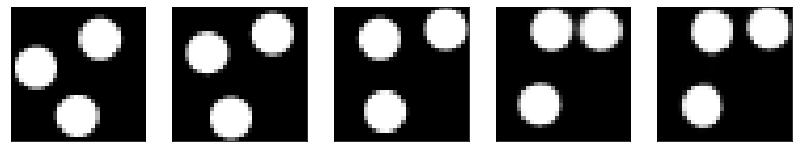

GD iterations:
i=0 | err=55.820976
i=1 | err=54.616199
i=2 | err=52.965942
i=3 | err=51.127048
i=4 | err=49.175835
i=5 | err=47.151718
i=6 | err=44.971916
i=7 | err=42.755341
i=8 | err=40.489769
i=9 | err=38.181744
i=10 | err=35.848385
i=11 | err=33.436119
i=12 | err=30.976957
i=13 | err=28.683811
i=14 | err=26.528301
i=15 | err=24.594843
i=16 | err=22.816490
i=17 | err=21.097353
i=18 | err=19.509277
i=19 | err=18.013905
i=20 | err=16.611971
i=21 | err=15.308139
i=22 | err=14.108868
i=23 | err=13.001551
i=24 | err=11.919060
i=25 | err=10.867430
i=26 | err=9.872536
i=27 | err=8.951934
i=28 | err=8.101786
i=29 | err=7.281694
Epoch=265 (17%) | out_positive=0.879237 | out_negative=0.109292 | mse=0.071451


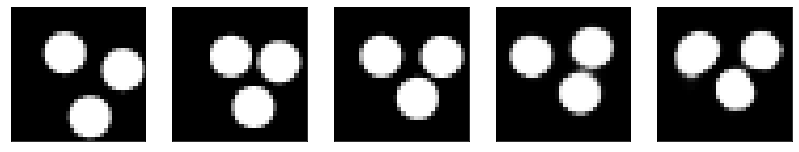

GD iterations:
i=0 | err=55.708801
i=1 | err=54.338951
i=2 | err=52.540688
i=3 | err=50.567570
i=4 | err=48.457397
i=5 | err=46.204605
i=6 | err=43.951988
i=7 | err=41.607742
i=8 | err=39.195679
i=9 | err=36.699524
i=10 | err=34.259808
i=11 | err=31.825310
i=12 | err=29.428175
i=13 | err=27.143095
i=14 | err=24.940975
i=15 | err=22.898699
i=16 | err=20.941967
i=17 | err=19.122921
i=18 | err=17.466003
i=19 | err=15.923306
i=20 | err=14.547098
i=21 | err=13.298318
i=22 | err=12.165928
i=23 | err=11.106582
i=24 | err=10.126825
i=25 | err=9.185820
i=26 | err=8.330574
i=27 | err=7.534287
i=28 | err=6.786463
i=29 | err=6.082972
Epoch=265 (18%) | out_positive=0.884502 | out_negative=0.111638 | mse=0.071457


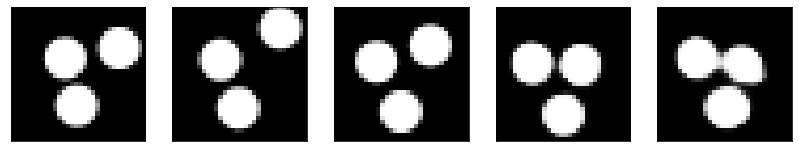

GD iterations:
i=0 | err=51.067009
i=1 | err=49.828632
i=2 | err=48.115189
i=3 | err=46.203152
i=4 | err=44.195843
i=5 | err=42.161011
i=6 | err=40.032951
i=7 | err=37.871227
i=8 | err=35.604263
i=9 | err=33.347897
i=10 | err=31.209576
i=11 | err=29.098223
i=12 | err=27.001081
i=13 | err=24.945606
i=14 | err=23.034557
i=15 | err=21.221767
i=16 | err=19.606581
i=17 | err=18.088703
i=18 | err=16.663795
i=19 | err=15.358799
i=20 | err=14.145878
i=21 | err=13.014429
i=22 | err=11.929960
i=23 | err=10.915770
i=24 | err=10.001132
i=25 | err=9.146660
i=26 | err=8.340718
i=27 | err=7.568321
i=28 | err=6.848401
i=29 | err=6.123305
Epoch=265 (20%) | out_positive=0.902706 | out_negative=0.120276 | mse=0.065428


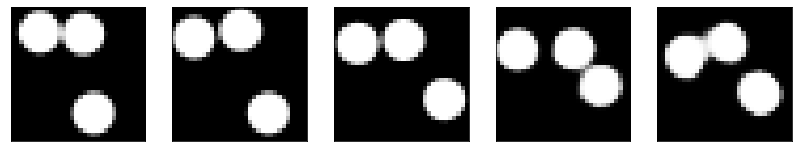

GD iterations:
i=0 | err=55.403858
i=1 | err=54.264076
i=2 | err=52.703114
i=3 | err=50.911095
i=4 | err=49.088253
i=5 | err=47.069931
i=6 | err=45.038239
i=7 | err=42.926582
i=8 | err=40.773468
i=9 | err=38.567497
i=10 | err=36.267029
i=11 | err=33.962387
i=12 | err=31.759544
i=13 | err=29.622463
i=14 | err=27.458797
i=15 | err=25.380751
i=16 | err=23.413567
i=17 | err=21.573507
i=18 | err=19.840139
i=19 | err=18.162724
i=20 | err=16.637489
i=21 | err=15.192680
i=22 | err=13.861881
i=23 | err=12.609822
i=24 | err=11.468872
i=25 | err=10.429975
i=26 | err=9.466335
i=27 | err=8.522720
i=28 | err=7.601811
i=29 | err=6.689036
Epoch=265 (22%) | out_positive=0.909659 | out_negative=0.160976 | mse=0.072308


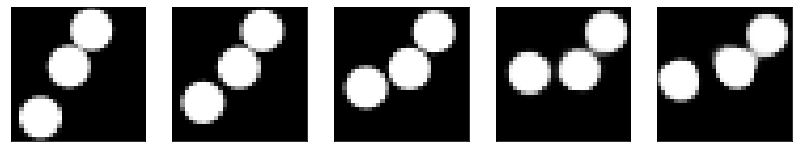

GD iterations:
i=0 | err=53.518204
i=1 | err=52.260712
i=2 | err=50.546501
i=3 | err=48.606606
i=4 | err=46.552048
i=5 | err=44.437851
i=6 | err=42.334282
i=7 | err=40.247368
i=8 | err=38.124985
i=9 | err=35.962959
i=10 | err=33.743774
i=11 | err=31.583164
i=12 | err=29.512794
i=13 | err=27.532017
i=14 | err=25.671705
i=15 | err=23.903149
i=16 | err=22.193502
i=17 | err=20.549168
i=18 | err=18.954433
i=19 | err=17.416447
i=20 | err=15.974569
i=21 | err=14.628397
i=22 | err=13.428926
i=23 | err=12.308961
i=24 | err=11.293318
i=25 | err=10.371957
i=26 | err=9.532021
i=27 | err=8.741028
i=28 | err=8.006067
i=29 | err=7.309192
Epoch=265 (24%) | out_positive=0.881575 | out_negative=0.070421 | mse=0.075184


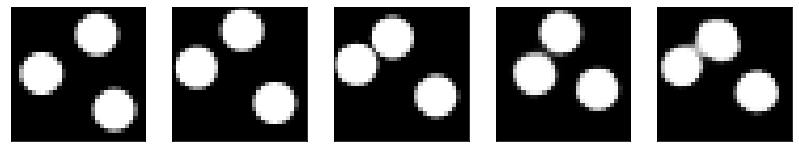

GD iterations:
i=0 | err=51.455940
i=1 | err=50.217384
i=2 | err=48.453407
i=3 | err=46.422134
i=4 | err=44.334251
i=5 | err=42.162785
i=6 | err=39.995468
i=7 | err=37.870251
i=8 | err=35.725861
i=9 | err=33.496700
i=10 | err=31.289886
i=11 | err=29.184166
i=12 | err=27.171009
i=13 | err=25.273827
i=14 | err=23.432432
i=15 | err=21.613560
i=16 | err=19.951565
i=17 | err=18.380817
i=18 | err=16.936773
i=19 | err=15.553307
i=20 | err=14.207472
i=21 | err=12.980782
i=22 | err=11.874033
i=23 | err=10.891607
i=24 | err=9.963551
i=25 | err=9.090921
i=26 | err=8.296698
i=27 | err=7.536399
i=28 | err=6.810299
i=29 | err=6.095969
Epoch=265 (26%) | out_positive=0.878744 | out_negative=0.148220 | mse=0.062947


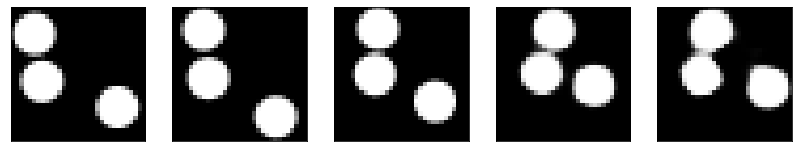

GD iterations:
i=0 | err=55.569252
i=1 | err=54.355057
i=2 | err=52.625469
i=3 | err=50.759434
i=4 | err=48.791634
i=5 | err=46.653755
i=6 | err=44.500740
i=7 | err=42.269592
i=8 | err=39.961056
i=9 | err=37.723774
i=10 | err=35.424026
i=11 | err=33.177704
i=12 | err=30.928539
i=13 | err=28.610416
i=14 | err=26.349022
i=15 | err=24.215588
i=16 | err=22.217537
i=17 | err=20.368065
i=18 | err=18.706684
i=19 | err=17.181545
i=20 | err=15.710110
i=21 | err=14.363176
i=22 | err=13.138087
i=23 | err=12.033485
i=24 | err=11.014343
i=25 | err=10.049664
i=26 | err=9.135016
i=27 | err=8.268883
i=28 | err=7.438960
i=29 | err=6.670940
Epoch=265 (28%) | out_positive=0.893465 | out_negative=0.168338 | mse=0.068535


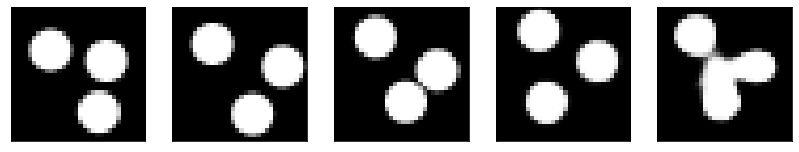

GD iterations:
i=0 | err=54.779022
i=1 | err=53.643311
i=2 | err=52.094177
i=3 | err=50.270679
i=4 | err=48.303127
i=5 | err=46.239838
i=6 | err=44.060352
i=7 | err=41.801643
i=8 | err=39.486107
i=9 | err=37.127434
i=10 | err=34.683487
i=11 | err=32.284660
i=12 | err=29.955961
i=13 | err=27.729652
i=14 | err=25.617891
i=15 | err=23.584236
i=16 | err=21.689779
i=17 | err=19.872246
i=18 | err=18.223785
i=19 | err=16.672363
i=20 | err=15.226559
i=21 | err=13.926565
i=22 | err=12.731518
i=23 | err=11.685074
i=24 | err=10.675070
i=25 | err=9.768185
i=26 | err=8.915640
i=27 | err=8.125162
i=28 | err=7.376698
i=29 | err=6.648294
Epoch=265 (30%) | out_positive=0.885095 | out_negative=0.129832 | mse=0.072092


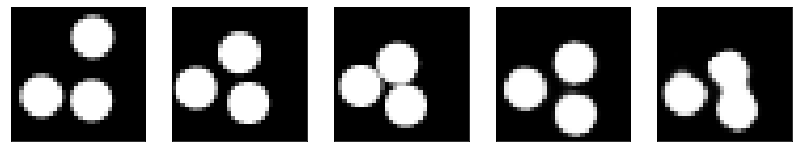

GD iterations:
i=0 | err=53.159367
i=1 | err=51.833374
i=2 | err=50.051376
i=3 | err=48.063072
i=4 | err=45.992134
i=5 | err=43.910683
i=6 | err=41.676529
i=7 | err=39.391808
i=8 | err=37.075474
i=9 | err=34.868729
i=10 | err=32.786797
i=11 | err=30.714218
i=12 | err=28.724976
i=13 | err=26.830284
i=14 | err=25.056499
i=15 | err=23.384846
i=16 | err=21.711197
i=17 | err=20.106546
i=18 | err=18.589512
i=19 | err=17.117729
i=20 | err=15.746333
i=21 | err=14.514886
i=22 | err=13.375093
i=23 | err=12.294986
i=24 | err=11.234098
i=25 | err=10.210493
i=26 | err=9.218617
i=27 | err=8.294445
i=28 | err=7.439101
i=29 | err=6.628761
Epoch=265 (31%) | out_positive=0.914419 | out_negative=0.111177 | mse=0.072550


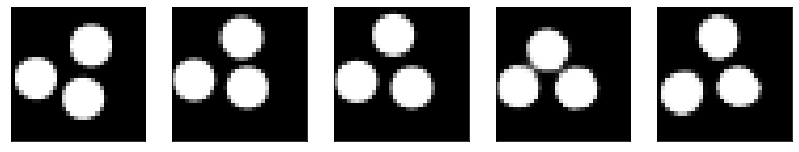

GD iterations:
i=0 | err=51.720322
i=1 | err=50.656036
i=2 | err=49.203072
i=3 | err=47.552265
i=4 | err=45.749947
i=5 | err=43.922146
i=6 | err=41.992538
i=7 | err=39.976646
i=8 | err=37.888145
i=9 | err=35.718414
i=10 | err=33.430870
i=11 | err=31.183481
i=12 | err=29.000412
i=13 | err=26.933451
i=14 | err=24.935413
i=15 | err=23.038853
i=16 | err=21.307934
i=17 | err=19.746798
i=18 | err=18.264215
i=19 | err=16.874664
i=20 | err=15.534057
i=21 | err=14.266844
i=22 | err=13.040990
i=23 | err=11.871325
i=24 | err=10.818589
i=25 | err=9.828201
i=26 | err=8.886232
i=27 | err=8.007990
i=28 | err=7.152473
i=29 | err=6.367317
Epoch=265 (33%) | out_positive=0.921228 | out_negative=0.174821 | mse=0.070717


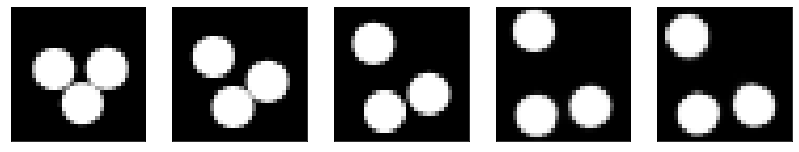

GD iterations:
i=0 | err=56.213211
i=1 | err=54.891354
i=2 | err=53.107132
i=3 | err=51.149849
i=4 | err=49.081516
i=5 | err=46.892509
i=6 | err=44.639187
i=7 | err=42.302914
i=8 | err=39.842216
i=9 | err=37.331570
i=10 | err=34.822235
i=11 | err=32.444984
i=12 | err=30.164907
i=13 | err=27.970654
i=14 | err=25.926893
i=15 | err=23.927126
i=16 | err=22.062599
i=17 | err=20.351168
i=18 | err=18.685493
i=19 | err=17.126968
i=20 | err=15.704508
i=21 | err=14.387763
i=22 | err=13.155182
i=23 | err=12.021373
i=24 | err=10.978994
i=25 | err=10.025866
i=26 | err=9.110073
i=27 | err=8.270541
i=28 | err=7.446729
i=29 | err=6.693983
Epoch=265 (35%) | out_positive=0.841013 | out_negative=0.131721 | mse=0.064792


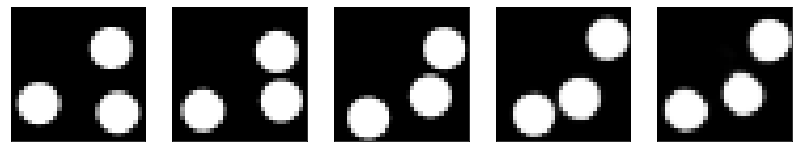

GD iterations:
i=0 | err=58.012051
i=1 | err=56.893051
i=2 | err=55.313438
i=3 | err=53.562271
i=4 | err=51.694809
i=5 | err=49.712120
i=6 | err=47.594727
i=7 | err=45.360878
i=8 | err=43.022316
i=9 | err=40.607506
i=10 | err=38.104866
i=11 | err=35.534859
i=12 | err=32.921467
i=13 | err=30.379313
i=14 | err=27.920328
i=15 | err=25.619244
i=16 | err=23.439400
i=17 | err=21.395437
i=18 | err=19.504837
i=19 | err=17.762585
i=20 | err=16.201160
i=21 | err=14.800279
i=22 | err=13.542915
i=23 | err=12.394596
i=24 | err=11.337362
i=25 | err=10.361675
i=26 | err=9.431738
i=27 | err=8.577045
i=28 | err=7.756718
i=29 | err=6.958340
Epoch=265 (37%) | out_positive=0.828077 | out_negative=0.109594 | mse=0.069788


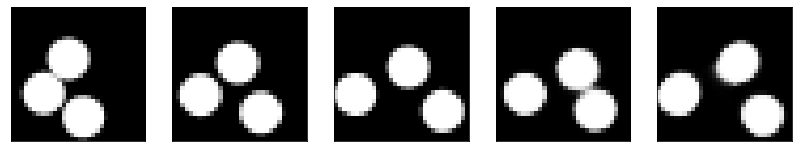

GD iterations:
i=0 | err=54.473557
i=1 | err=53.178474
i=2 | err=51.393372
i=3 | err=49.402431
i=4 | err=47.318672
i=5 | err=45.204018
i=6 | err=43.023270
i=7 | err=40.812370
i=8 | err=38.606766
i=9 | err=36.440929
i=10 | err=34.323151
i=11 | err=32.209461
i=12 | err=30.117142
i=13 | err=28.084621
i=14 | err=26.174126
i=15 | err=24.347931
i=16 | err=22.590189
i=17 | err=20.941650
i=18 | err=19.375111
i=19 | err=17.920990
i=20 | err=16.511955
i=21 | err=15.175058
i=22 | err=13.897499
i=23 | err=12.675667
i=24 | err=11.540584
i=25 | err=10.519020
i=26 | err=9.549031
i=27 | err=8.635859
i=28 | err=7.789148
i=29 | err=6.990539
Epoch=265 (39%) | out_positive=0.872441 | out_negative=0.132365 | mse=0.068820


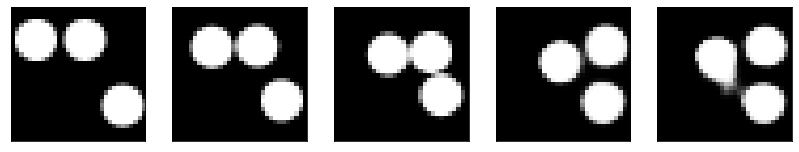

GD iterations:
i=0 | err=54.538048
i=1 | err=53.316055
i=2 | err=51.580021
i=3 | err=49.705978
i=4 | err=47.724594
i=5 | err=45.632629
i=6 | err=43.466244
i=7 | err=41.257549
i=8 | err=38.989376
i=9 | err=36.708263
i=10 | err=34.439827
i=11 | err=32.183189
i=12 | err=29.992393
i=13 | err=27.838875
i=14 | err=25.706882
i=15 | err=23.644548
i=16 | err=21.665707
i=17 | err=19.847427
i=18 | err=18.220896
i=19 | err=16.755531
i=20 | err=15.394692
i=21 | err=14.067605
i=22 | err=12.786398
i=23 | err=11.571342
i=24 | err=10.488501
i=25 | err=9.493174
i=26 | err=8.590565
i=27 | err=7.744234
i=28 | err=6.986064
i=29 | err=6.277486
Epoch=265 (41%) | out_positive=0.892208 | out_negative=0.132520 | mse=0.068774


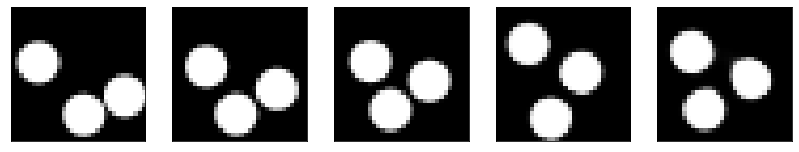

GD iterations:
i=0 | err=57.885841
i=1 | err=56.681389
i=2 | err=54.986229
i=3 | err=53.011078
i=4 | err=50.928413
i=5 | err=48.687092
i=6 | err=46.365864
i=7 | err=43.987762
i=8 | err=41.625290
i=9 | err=39.207146
i=10 | err=36.872044
i=11 | err=34.555141
i=12 | err=32.201538
i=13 | err=29.891724
i=14 | err=27.755060
i=15 | err=25.654396
i=16 | err=23.690456
i=17 | err=21.796350
i=18 | err=20.024904
i=19 | err=18.387703
i=20 | err=16.836159
i=21 | err=15.430628
i=22 | err=14.141528
i=23 | err=12.995829
i=24 | err=11.907240
i=25 | err=10.912144
i=26 | err=9.963076
i=27 | err=9.069456
i=28 | err=8.207714
i=29 | err=7.372915
Epoch=265 (42%) | out_positive=0.861140 | out_negative=0.112173 | mse=0.075384


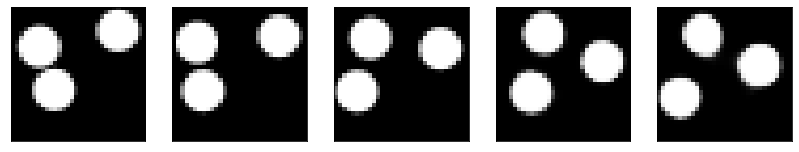

GD iterations:
i=0 | err=54.607201
i=1 | err=53.471272
i=2 | err=51.840904
i=3 | err=50.019127
i=4 | err=48.062965
i=5 | err=46.082008
i=6 | err=43.983124
i=7 | err=41.800125
i=8 | err=39.556404
i=9 | err=37.292267
i=10 | err=35.046608
i=11 | err=32.789398
i=12 | err=30.563108
i=13 | err=28.490080
i=14 | err=26.485168
i=15 | err=24.477415
i=16 | err=22.604473
i=17 | err=20.878614
i=18 | err=19.227619
i=19 | err=17.735298
i=20 | err=16.353130
i=21 | err=15.080234
i=22 | err=13.929298
i=23 | err=12.827803
i=24 | err=11.772804
i=25 | err=10.761061
i=26 | err=9.821201
i=27 | err=8.915380
i=28 | err=8.090314
i=29 | err=7.312624
Epoch=265 (44%) | out_positive=0.855461 | out_negative=0.131660 | mse=0.075638


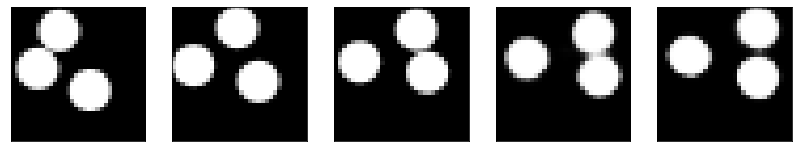

GD iterations:
i=0 | err=49.926796
i=1 | err=48.707230
i=2 | err=46.954971
i=3 | err=44.997204
i=4 | err=42.968704
i=5 | err=40.901245
i=6 | err=38.835033
i=7 | err=36.743484
i=8 | err=34.698162
i=9 | err=32.727348
i=10 | err=30.749443
i=11 | err=28.820992
i=12 | err=26.938679
i=13 | err=25.175348
i=14 | err=23.517895
i=15 | err=21.894978
i=16 | err=20.296623
i=17 | err=18.773785
i=18 | err=17.273661
i=19 | err=15.918648
i=20 | err=14.666618
i=21 | err=13.508710
i=22 | err=12.425442
i=23 | err=11.398478
i=24 | err=10.428813
i=25 | err=9.512890
i=26 | err=8.671169
i=27 | err=7.869288
i=28 | err=7.062504
i=29 | err=6.267087
Epoch=265 (46%) | out_positive=0.906794 | out_negative=0.147006 | mse=0.072252


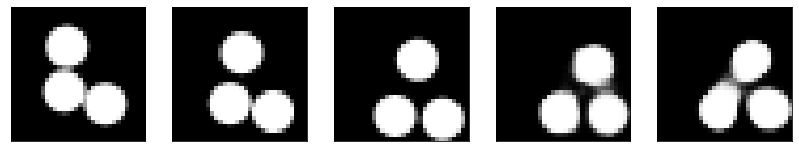

GD iterations:
i=0 | err=56.695972
i=1 | err=55.403229
i=2 | err=53.665321
i=3 | err=51.760536
i=4 | err=49.812477
i=5 | err=47.760704
i=6 | err=45.657227
i=7 | err=43.497681
i=8 | err=41.266018
i=9 | err=38.969204
i=10 | err=36.663441
i=11 | err=34.393444
i=12 | err=32.214714
i=13 | err=30.072350
i=14 | err=28.022572
i=15 | err=25.940033
i=16 | err=23.893116
i=17 | err=21.925503
i=18 | err=20.099899
i=19 | err=18.381191
i=20 | err=16.794724
i=21 | err=15.356800
i=22 | err=13.982134
i=23 | err=12.644606
i=24 | err=11.374155
i=25 | err=10.223645
i=26 | err=9.180172
i=27 | err=8.207153
i=28 | err=7.292003
i=29 | err=6.429236
Epoch=265 (48%) | out_positive=0.861214 | out_negative=0.125452 | mse=0.073904


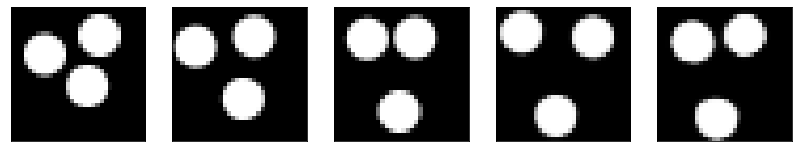

GD iterations:
i=0 | err=57.892799
i=1 | err=56.635796
i=2 | err=54.856617
i=3 | err=52.871964
i=4 | err=50.705288
i=5 | err=48.585732
i=6 | err=46.298405
i=7 | err=44.027664
i=8 | err=41.624378
i=9 | err=39.319923
i=10 | err=36.988144
i=11 | err=34.771530
i=12 | err=32.564144
i=13 | err=30.433884
i=14 | err=28.373745
i=15 | err=26.356110
i=16 | err=24.376759
i=17 | err=22.458055
i=18 | err=20.728760
i=19 | err=19.101692
i=20 | err=17.592617
i=21 | err=16.102901
i=22 | err=14.746637
i=23 | err=13.449666
i=24 | err=12.287237
i=25 | err=11.244106
i=26 | err=10.290376
i=27 | err=9.409923
i=28 | err=8.581518
i=29 | err=7.827301
Epoch=265 (50%) | out_positive=0.870491 | out_negative=0.095682 | mse=0.075554


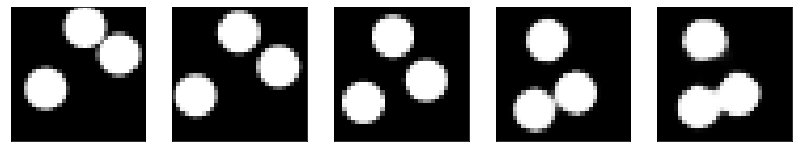

GD iterations:
i=0 | err=55.174603
i=1 | err=53.879253
i=2 | err=52.079048
i=3 | err=50.064201
i=4 | err=47.957977
i=5 | err=45.797615
i=6 | err=43.615440
i=7 | err=41.480141
i=8 | err=39.278084
i=9 | err=37.086426
i=10 | err=34.859795
i=11 | err=32.618782
i=12 | err=30.420918
i=13 | err=28.340574
i=14 | err=26.271004
i=15 | err=24.316339
i=16 | err=22.368372
i=17 | err=20.558496
i=18 | err=18.894022
i=19 | err=17.338720
i=20 | err=15.889752
i=21 | err=14.545351
i=22 | err=13.309011
i=23 | err=12.157236
i=24 | err=11.083982
i=25 | err=10.092601
i=26 | err=9.202108
i=27 | err=8.320079
i=28 | err=7.524571
i=29 | err=6.800538
Epoch=265 (52%) | out_positive=0.899095 | out_negative=0.165550 | mse=0.070613


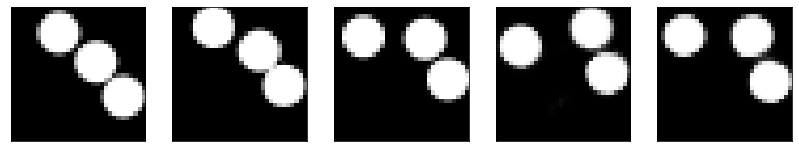

GD iterations:
i=0 | err=53.776207
i=1 | err=52.535366
i=2 | err=50.833946
i=3 | err=48.802624
i=4 | err=46.776352
i=5 | err=44.639080
i=6 | err=42.383995
i=7 | err=40.076576
i=8 | err=37.746422
i=9 | err=35.413723
i=10 | err=32.984928
i=11 | err=30.550140
i=12 | err=28.166267
i=13 | err=26.019194
i=14 | err=23.935856
i=15 | err=21.954777
i=16 | err=20.055256
i=17 | err=18.270393
i=18 | err=16.661631
i=19 | err=15.161233
i=20 | err=13.810276
i=21 | err=12.529139
i=22 | err=11.382500
i=23 | err=10.317460
i=24 | err=9.347019
i=25 | err=8.405617
i=26 | err=7.567314
i=27 | err=6.782216
i=28 | err=6.047529
i=29 | err=5.355524
Epoch=265 (54%) | out_positive=0.916452 | out_negative=0.175983 | mse=0.063606


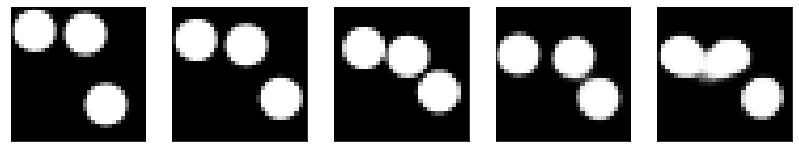

GD iterations:
i=0 | err=55.404881
i=1 | err=54.215164
i=2 | err=52.555756
i=3 | err=50.741093
i=4 | err=48.818832
i=5 | err=46.875282
i=6 | err=44.893963
i=7 | err=42.820820
i=8 | err=40.708946
i=9 | err=38.556076
i=10 | err=36.445923
i=11 | err=34.415451
i=12 | err=32.352757
i=13 | err=30.288422
i=14 | err=28.226128
i=15 | err=26.229471
i=16 | err=24.295168
i=17 | err=22.481888
i=18 | err=20.735050
i=19 | err=19.094828
i=20 | err=17.571850
i=21 | err=16.181738
i=22 | err=14.883898
i=23 | err=13.685001
i=24 | err=12.541978
i=25 | err=11.489635
i=26 | err=10.535681
i=27 | err=9.618055
i=28 | err=8.774172
i=29 | err=7.969038
Epoch=265 (55%) | out_positive=0.829488 | out_negative=0.083673 | mse=0.069219


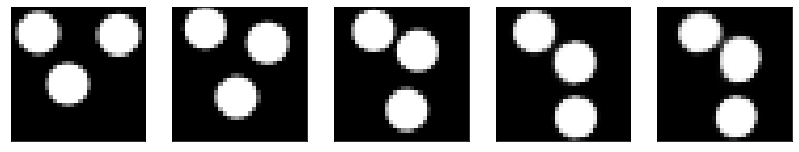

GD iterations:
i=0 | err=54.606163
i=1 | err=53.422852
i=2 | err=51.741554
i=3 | err=49.817890
i=4 | err=47.778988
i=5 | err=45.673851
i=6 | err=43.519497
i=7 | err=41.396400
i=8 | err=39.180267
i=9 | err=36.974884
i=10 | err=34.702065
i=11 | err=32.453003
i=12 | err=30.248882
i=13 | err=28.151360
i=14 | err=26.168219
i=15 | err=24.197067
i=16 | err=22.337749
i=17 | err=20.608444
i=18 | err=18.938189
i=19 | err=17.352203
i=20 | err=15.871890
i=21 | err=14.513123
i=22 | err=13.177725
i=23 | err=11.925419
i=24 | err=10.763513
i=25 | err=9.674866
i=26 | err=8.672653
i=27 | err=7.744736
i=28 | err=6.883978
i=29 | err=6.079183
Epoch=265 (57%) | out_positive=0.859018 | out_negative=0.160123 | mse=0.069520


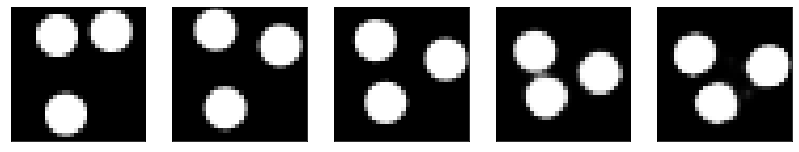

GD iterations:
i=0 | err=52.708313
i=1 | err=51.452091
i=2 | err=49.777176
i=3 | err=47.927395
i=4 | err=45.995224
i=5 | err=43.996490
i=6 | err=41.973747
i=7 | err=39.807125
i=8 | err=37.539272
i=9 | err=35.214252
i=10 | err=32.917091
i=11 | err=30.699577
i=12 | err=28.486423
i=13 | err=26.297659
i=14 | err=24.240755
i=15 | err=22.410534
i=16 | err=20.693308
i=17 | err=19.151243
i=18 | err=17.720041
i=19 | err=16.366022
i=20 | err=15.012177
i=21 | err=13.776167
i=22 | err=12.620609
i=23 | err=11.577692
i=24 | err=10.617923
i=25 | err=9.740028
i=26 | err=8.920053
i=27 | err=8.155077
i=28 | err=7.431161
i=29 | err=6.707904
Epoch=265 (59%) | out_positive=0.801592 | out_negative=0.123042 | mse=0.066926


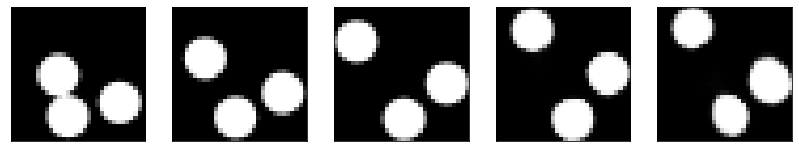

GD iterations:
i=0 | err=56.939339
i=1 | err=55.647980
i=2 | err=53.848434
i=3 | err=51.770741
i=4 | err=49.586075
i=5 | err=47.290306
i=6 | err=44.955563
i=7 | err=42.540199
i=8 | err=40.117348
i=9 | err=37.733078
i=10 | err=35.372753
i=11 | err=33.055542
i=12 | err=30.883224
i=13 | err=28.764400
i=14 | err=26.814003
i=15 | err=24.880165
i=16 | err=23.023739
i=17 | err=21.227848
i=18 | err=19.509010
i=19 | err=17.893681
i=20 | err=16.402819
i=21 | err=15.004020
i=22 | err=13.746793
i=23 | err=12.566668
i=24 | err=11.483134
i=25 | err=10.472269
i=26 | err=9.504103
i=27 | err=8.609687
i=28 | err=7.764649
i=29 | err=6.961702
Epoch=265 (61%) | out_positive=0.819058 | out_negative=0.084333 | mse=0.067054


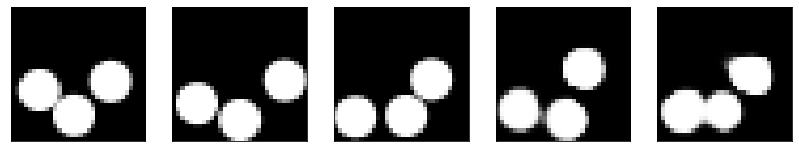

GD iterations:
i=0 | err=54.674278
i=1 | err=53.407227
i=2 | err=51.659630
i=3 | err=49.621819
i=4 | err=47.609688
i=5 | err=45.551514
i=6 | err=43.538017
i=7 | err=41.447418
i=8 | err=39.255882
i=9 | err=36.958183
i=10 | err=34.595638
i=11 | err=32.213371
i=12 | err=30.008688
i=13 | err=27.861029
i=14 | err=25.761116
i=15 | err=23.767897
i=16 | err=21.870571
i=17 | err=20.036781
i=18 | err=18.389107
i=19 | err=16.897327
i=20 | err=15.519637
i=21 | err=14.221388
i=22 | err=13.001356
i=23 | err=11.835764
i=24 | err=10.720209
i=25 | err=9.757288
i=26 | err=8.875892
i=27 | err=8.024601
i=28 | err=7.229870
i=29 | err=6.481714
Epoch=265 (63%) | out_positive=0.906507 | out_negative=0.118106 | mse=0.069850


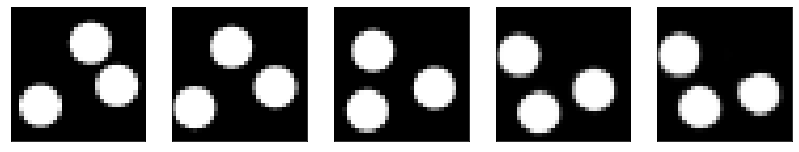

GD iterations:
i=0 | err=55.127125
i=1 | err=53.940262
i=2 | err=52.375267
i=3 | err=50.614029
i=4 | err=48.774620
i=5 | err=46.873264
i=6 | err=44.937950
i=7 | err=42.883480
i=8 | err=40.711697
i=9 | err=38.379356
i=10 | err=36.046978
i=11 | err=33.779892
i=12 | err=31.639009
i=13 | err=29.547958
i=14 | err=27.508207
i=15 | err=25.481709
i=16 | err=23.584692
i=17 | err=21.822830
i=18 | err=20.203064
i=19 | err=18.730339
i=20 | err=17.357052
i=21 | err=16.008211
i=22 | err=14.772938
i=23 | err=13.581851
i=24 | err=12.495605
i=25 | err=11.501125
i=26 | err=10.561467
i=27 | err=9.659903
i=28 | err=8.792431
i=29 | err=7.942398
Epoch=265 (64%) | out_positive=0.867593 | out_negative=0.140742 | mse=0.071158


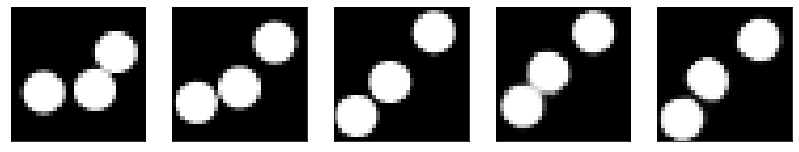

GD iterations:
i=0 | err=57.168911
i=1 | err=55.841568
i=2 | err=53.908607
i=3 | err=51.799286
i=4 | err=49.547005
i=5 | err=47.311737
i=6 | err=44.968876
i=7 | err=42.571770
i=8 | err=40.211479
i=9 | err=37.929703
i=10 | err=35.637074
i=11 | err=33.431419
i=12 | err=31.345541
i=13 | err=29.146828
i=14 | err=27.072887
i=15 | err=25.101547
i=16 | err=23.239788
i=17 | err=21.510895
i=18 | err=19.794777
i=19 | err=18.126400
i=20 | err=16.535492
i=21 | err=15.126873
i=22 | err=13.817487
i=23 | err=12.605188
i=24 | err=11.487742
i=25 | err=10.414647
i=26 | err=9.414441
i=27 | err=8.467077
i=28 | err=7.588253
i=29 | err=6.768456
Epoch=265 (66%) | out_positive=0.847346 | out_negative=0.104686 | mse=0.069552


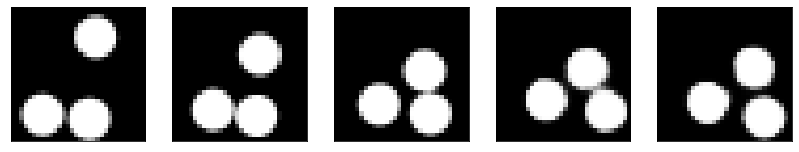

GD iterations:
i=0 | err=54.896309
i=1 | err=53.676170
i=2 | err=52.080620
i=3 | err=50.260239
i=4 | err=48.285809
i=5 | err=46.296089
i=6 | err=44.232079
i=7 | err=42.090767
i=8 | err=39.900948
i=9 | err=37.674904
i=10 | err=35.510853
i=11 | err=33.387344
i=12 | err=31.322544
i=13 | err=29.396875
i=14 | err=27.463715
i=15 | err=25.634350
i=16 | err=23.881229
i=17 | err=22.203743
i=18 | err=20.692116
i=19 | err=19.283588
i=20 | err=17.941437
i=21 | err=16.665192
i=22 | err=15.470839
i=23 | err=14.371657
i=24 | err=13.330313
i=25 | err=12.333438
i=26 | err=11.397491
i=27 | err=10.518499
i=28 | err=9.677836
i=29 | err=8.884542
Epoch=265 (68%) | out_positive=0.843333 | out_negative=0.053814 | mse=0.076409


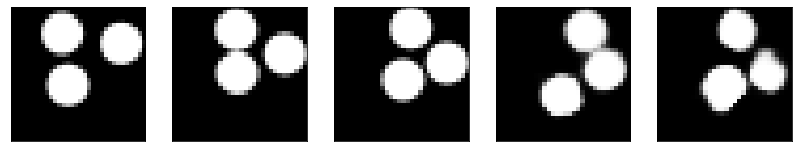

GD iterations:
i=0 | err=58.242767
i=1 | err=57.000336
i=2 | err=55.240318
i=3 | err=53.277344
i=4 | err=51.195953
i=5 | err=48.972057
i=6 | err=46.662468
i=7 | err=44.306206
i=8 | err=41.974922
i=9 | err=39.723190
i=10 | err=37.396446
i=11 | err=35.098049
i=12 | err=32.800964
i=13 | err=30.671049
i=14 | err=28.555397
i=15 | err=26.536331
i=16 | err=24.610289
i=17 | err=22.750011
i=18 | err=21.009808
i=19 | err=19.324749
i=20 | err=17.693027
i=21 | err=16.182255
i=22 | err=14.833168
i=23 | err=13.602190
i=24 | err=12.448463
i=25 | err=11.369200
i=26 | err=10.380102
i=27 | err=9.470670
i=28 | err=8.615265
i=29 | err=7.819602
Epoch=265 (70%) | out_positive=0.880455 | out_negative=0.116239 | mse=0.070867


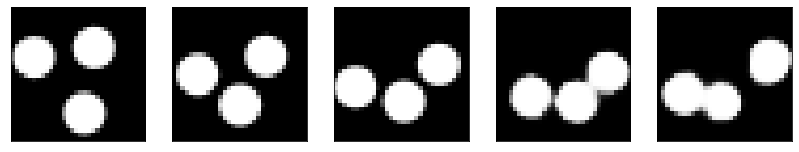

GD iterations:
i=0 | err=54.315758
i=1 | err=53.170570
i=2 | err=51.565918
i=3 | err=49.777126
i=4 | err=47.898758
i=5 | err=45.936901
i=6 | err=43.911842
i=7 | err=41.763035
i=8 | err=39.609634
i=9 | err=37.415920
i=10 | err=35.267578
i=11 | err=33.163391
i=12 | err=31.025703
i=13 | err=28.992376
i=14 | err=27.102209
i=15 | err=25.217945
i=16 | err=23.408215
i=17 | err=21.677332
i=18 | err=20.023140
i=19 | err=18.416565
i=20 | err=16.943340
i=21 | err=15.622062
i=22 | err=14.476652
i=23 | err=13.371152
i=24 | err=12.346669
i=25 | err=11.389988
i=26 | err=10.485109
i=27 | err=9.608631
i=28 | err=8.768383
i=29 | err=7.949577
Epoch=265 (72%) | out_positive=0.838276 | out_negative=0.090105 | mse=0.073350


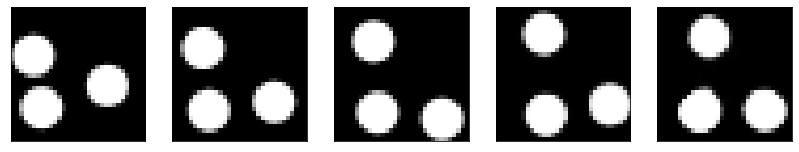

GD iterations:
i=0 | err=54.957207
i=1 | err=53.750984
i=2 | err=52.112617
i=3 | err=50.281693
i=4 | err=48.313053
i=5 | err=46.247673
i=6 | err=44.174942
i=7 | err=42.042519
i=8 | err=39.885040
i=9 | err=37.586823
i=10 | err=35.289185
i=11 | err=33.028168
i=12 | err=30.827816
i=13 | err=28.780304
i=14 | err=26.754761
i=15 | err=24.751328
i=16 | err=22.839222
i=17 | err=21.021055
i=18 | err=19.267475
i=19 | err=17.634644
i=20 | err=16.105080
i=21 | err=14.638281
i=22 | err=13.301588
i=23 | err=12.070765
i=24 | err=10.946106
i=25 | err=9.924787
i=26 | err=8.978115
i=27 | err=8.084296
i=28 | err=7.262028
i=29 | err=6.478286
Epoch=265 (74%) | out_positive=0.875243 | out_negative=0.152777 | mse=0.068484


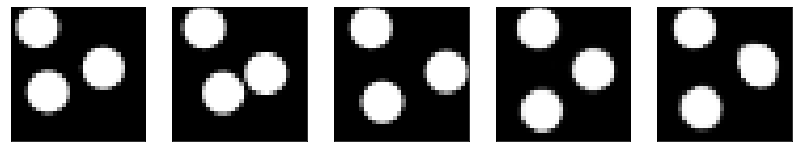

GD iterations:
i=0 | err=55.633156
i=1 | err=54.464123
i=2 | err=52.909828
i=3 | err=51.179688
i=4 | err=49.272331
i=5 | err=47.187149
i=6 | err=45.078377
i=7 | err=42.877991
i=8 | err=40.681183
i=9 | err=38.433365
i=10 | err=36.182446
i=11 | err=33.869705
i=12 | err=31.665722
i=13 | err=29.519581
i=14 | err=27.489183
i=15 | err=25.492813
i=16 | err=23.611460
i=17 | err=21.859936
i=18 | err=20.192408
i=19 | err=18.712008
i=20 | err=17.312607
i=21 | err=16.011654
i=22 | err=14.810291
i=23 | err=13.698822
i=24 | err=12.647774
i=25 | err=11.654985
i=26 | err=10.654137
i=27 | err=9.708364
i=28 | err=8.800861
i=29 | err=7.925964
Epoch=265 (76%) | out_positive=0.894489 | out_negative=0.114841 | mse=0.076080


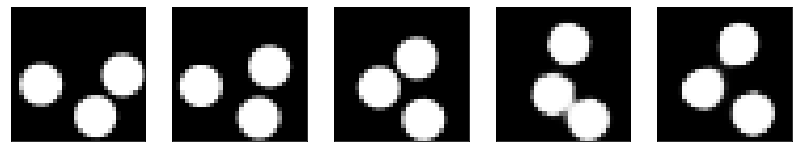

GD iterations:
i=0 | err=56.625744
i=1 | err=55.382504
i=2 | err=53.612747
i=3 | err=51.615593
i=4 | err=49.483215
i=5 | err=47.241203
i=6 | err=45.016983
i=7 | err=42.728653
i=8 | err=40.380379
i=9 | err=37.947094
i=10 | err=35.452961
i=11 | err=33.013752
i=12 | err=30.577404
i=13 | err=28.188118
i=14 | err=26.014479
i=15 | err=24.001232
i=16 | err=22.089802
i=17 | err=20.285084
i=18 | err=18.662529
i=19 | err=17.109783
i=20 | err=15.651417
i=21 | err=14.322985
i=22 | err=13.069985
i=23 | err=11.888691
i=24 | err=10.816908
i=25 | err=9.797929
i=26 | err=8.823528
i=27 | err=7.897182
i=28 | err=7.039536
i=29 | err=6.241849
Epoch=265 (77%) | out_positive=0.914832 | out_negative=0.164647 | mse=0.071980


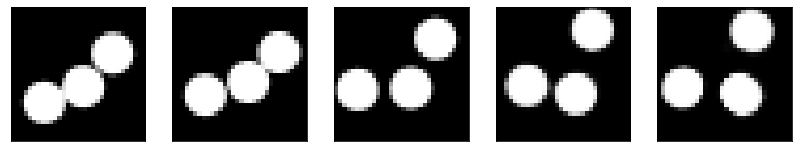

GD iterations:
i=0 | err=55.020813
i=1 | err=53.871967
i=2 | err=52.270580
i=3 | err=50.564991
i=4 | err=48.683731
i=5 | err=46.649796
i=6 | err=44.563946
i=7 | err=42.448559
i=8 | err=40.284184
i=9 | err=38.067593
i=10 | err=35.754082
i=11 | err=33.443932
i=12 | err=31.162209
i=13 | err=28.896088
i=14 | err=26.688824
i=15 | err=24.518581
i=16 | err=22.368427
i=17 | err=20.430260
i=18 | err=18.621529
i=19 | err=17.012424
i=20 | err=15.528881
i=21 | err=14.154387
i=22 | err=12.845335
i=23 | err=11.611259
i=24 | err=10.476531
i=25 | err=9.450195
i=26 | err=8.497665
i=27 | err=7.639732
i=28 | err=6.811207
i=29 | err=6.021848
Epoch=265 (79%) | out_positive=0.860424 | out_negative=0.127526 | mse=0.068905


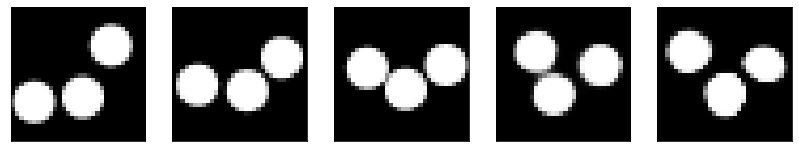

GD iterations:
i=0 | err=58.326366
i=1 | err=57.164188
i=2 | err=55.584259
i=3 | err=53.799297
i=4 | err=51.936546
i=5 | err=49.843719
i=6 | err=47.659916
i=7 | err=45.342331
i=8 | err=43.015869
i=9 | err=40.729668
i=10 | err=38.386162
i=11 | err=36.038345
i=12 | err=33.713356
i=13 | err=31.398838
i=14 | err=29.086510
i=15 | err=26.779633
i=16 | err=24.668331
i=17 | err=22.714777
i=18 | err=20.907448
i=19 | err=19.183983
i=20 | err=17.553402
i=21 | err=16.036577
i=22 | err=14.642798
i=23 | err=13.366898
i=24 | err=12.150394
i=25 | err=11.044615
i=26 | err=10.039076
i=27 | err=9.111461
i=28 | err=8.263155
i=29 | err=7.442832
Epoch=265 (81%) | out_positive=0.852524 | out_negative=0.098310 | mse=0.075847


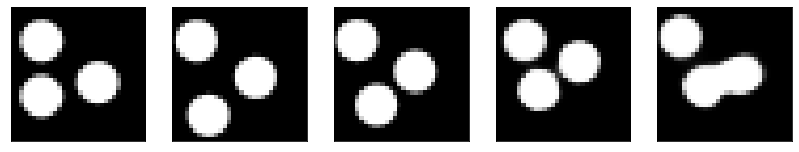

GD iterations:
i=0 | err=55.315498
i=1 | err=54.012398
i=2 | err=52.143417
i=3 | err=49.999931
i=4 | err=47.885731
i=5 | err=45.655796
i=6 | err=43.384960
i=7 | err=41.042732
i=8 | err=38.750103
i=9 | err=36.467144
i=10 | err=34.257610
i=11 | err=32.107384
i=12 | err=30.026464
i=13 | err=28.035582
i=14 | err=26.217888
i=15 | err=24.484280
i=16 | err=22.882723
i=17 | err=21.371109
i=18 | err=19.865536
i=19 | err=18.405602
i=20 | err=17.017471
i=21 | err=15.695047
i=22 | err=14.471825
i=23 | err=13.316031
i=24 | err=12.169992
i=25 | err=11.106878
i=26 | err=10.137156
i=27 | err=9.276155
i=28 | err=8.439404
i=29 | err=7.658546
Epoch=265 (83%) | out_positive=0.766275 | out_negative=0.108618 | mse=0.063112


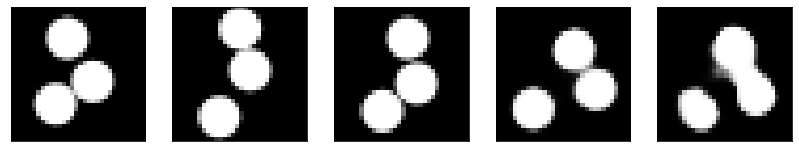

GD iterations:
i=0 | err=55.307465
i=1 | err=54.143433
i=2 | err=52.559837
i=3 | err=50.784889
i=4 | err=48.876190
i=5 | err=46.895206
i=6 | err=44.815845
i=7 | err=42.652020
i=8 | err=40.467537
i=9 | err=38.230072
i=10 | err=35.987518
i=11 | err=33.792274
i=12 | err=31.644806
i=13 | err=29.587805
i=14 | err=27.534058
i=15 | err=25.533314
i=16 | err=23.613277
i=17 | err=21.831463
i=18 | err=20.145702
i=19 | err=18.521948
i=20 | err=16.972841
i=21 | err=15.549785
i=22 | err=14.180931
i=23 | err=12.903126
i=24 | err=11.721532
i=25 | err=10.642910
i=26 | err=9.639378
i=27 | err=8.714128
i=28 | err=7.833208
i=29 | err=6.997834
Epoch=265 (85%) | out_positive=0.903163 | out_negative=0.160817 | mse=0.069459


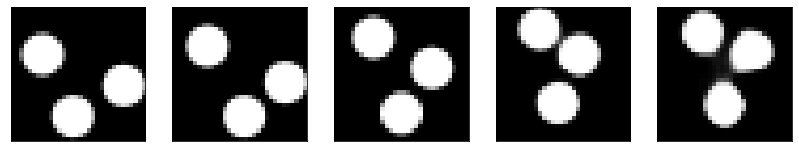

GD iterations:
i=0 | err=55.797001
i=1 | err=54.454903
i=2 | err=52.720367
i=3 | err=50.740349
i=4 | err=48.578545
i=5 | err=46.279572
i=6 | err=43.975670
i=7 | err=41.629868
i=8 | err=39.176537
i=9 | err=36.748943
i=10 | err=34.438671
i=11 | err=32.125217
i=12 | err=29.869926
i=13 | err=27.738976
i=14 | err=25.748983
i=15 | err=23.919252
i=16 | err=22.190165
i=17 | err=20.539799
i=18 | err=18.935276
i=19 | err=17.440073
i=20 | err=16.083954
i=21 | err=14.802732
i=22 | err=13.579285
i=23 | err=12.369385
i=24 | err=11.270852
i=25 | err=10.211209
i=26 | err=9.237625
i=27 | err=8.327353
i=28 | err=7.465478
i=29 | err=6.642263
Epoch=265 (87%) | out_positive=0.891919 | out_negative=0.127251 | mse=0.071272


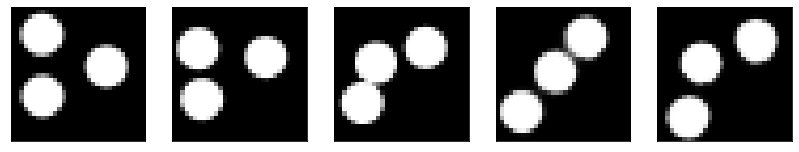

GD iterations:
i=0 | err=56.312931
i=1 | err=55.058331
i=2 | err=53.320522
i=3 | err=51.369503
i=4 | err=49.367859
i=5 | err=47.168762
i=6 | err=44.933601
i=7 | err=42.690681
i=8 | err=40.432110
i=9 | err=38.080711
i=10 | err=35.647095
i=11 | err=33.144463
i=12 | err=30.592857
i=13 | err=28.069344
i=14 | err=25.651642
i=15 | err=23.352684
i=16 | err=21.255602
i=17 | err=19.355755
i=18 | err=17.640465
i=19 | err=16.058289
i=20 | err=14.606234
i=21 | err=13.278462
i=22 | err=12.074789
i=23 | err=10.991040
i=24 | err=10.009039
i=25 | err=9.109053
i=26 | err=8.248327
i=27 | err=7.466269
i=28 | err=6.725617
i=29 | err=6.003496
Epoch=265 (88%) | out_positive=0.865852 | out_negative=0.160169 | mse=0.068601


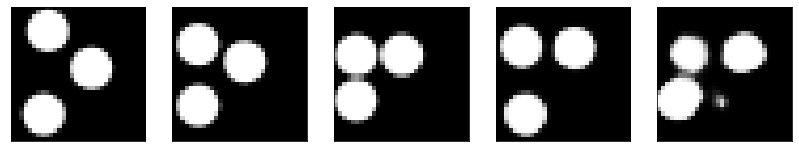

GD iterations:
i=0 | err=54.243450
i=1 | err=53.043125
i=2 | err=51.379314
i=3 | err=49.492752
i=4 | err=47.432041
i=5 | err=45.307976
i=6 | err=43.101086
i=7 | err=40.848801
i=8 | err=38.410908
i=9 | err=36.150616
i=10 | err=33.891365
i=11 | err=31.717777
i=12 | err=29.495275
i=13 | err=27.400131
i=14 | err=25.437704
i=15 | err=23.491940
i=16 | err=21.567902
i=17 | err=19.791428
i=18 | err=18.155155
i=19 | err=16.663939
i=20 | err=15.285747
i=21 | err=14.047208
i=22 | err=12.883044
i=23 | err=11.767436
i=24 | err=10.789501
i=25 | err=9.856439
i=26 | err=8.999485
i=27 | err=8.179585
i=28 | err=7.407777
i=29 | err=6.648966
Epoch=265 (90%) | out_positive=0.891163 | out_negative=0.108949 | mse=0.069562


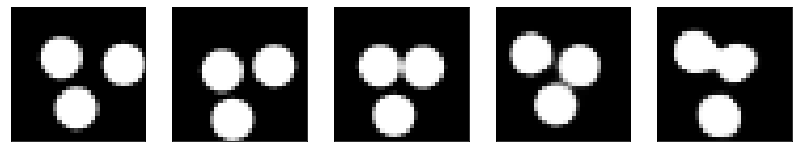

GD iterations:
i=0 | err=56.933174
i=1 | err=55.583778
i=2 | err=53.861313
i=3 | err=51.847229
i=4 | err=49.610748
i=5 | err=47.295197
i=6 | err=44.908871
i=7 | err=42.491257
i=8 | err=40.080811
i=9 | err=37.584084
i=10 | err=35.156796
i=11 | err=32.837677
i=12 | err=30.601871
i=13 | err=28.472992
i=14 | err=26.432131
i=15 | err=24.632286
i=16 | err=22.892977
i=17 | err=21.243301
i=18 | err=19.674051
i=19 | err=18.150894
i=20 | err=16.694519
i=21 | err=15.302302
i=22 | err=14.034035
i=23 | err=12.844584
i=24 | err=11.790887
i=25 | err=10.788810
i=26 | err=9.853076
i=27 | err=8.967783
i=28 | err=8.088248
i=29 | err=7.256050
Epoch=265 (92%) | out_positive=0.840699 | out_negative=0.106968 | mse=0.066863


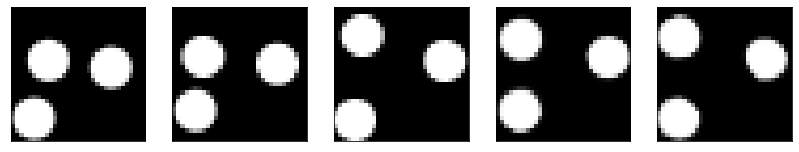

GD iterations:
i=0 | err=53.013775
i=1 | err=51.781685
i=2 | err=50.142281
i=3 | err=48.328506
i=4 | err=46.478508
i=5 | err=44.564529
i=6 | err=42.577454
i=7 | err=40.477245
i=8 | err=38.326553
i=9 | err=36.096340
i=10 | err=33.775261
i=11 | err=31.451036
i=12 | err=29.186483
i=13 | err=27.058651
i=14 | err=25.091988
i=15 | err=23.222563
i=16 | err=21.523846
i=17 | err=19.954880
i=18 | err=18.549767
i=19 | err=17.205269
i=20 | err=15.973516
i=21 | err=14.809892
i=22 | err=13.704082
i=23 | err=12.640245
i=24 | err=11.617306
i=25 | err=10.651806
i=26 | err=9.722996
i=27 | err=8.831261
i=28 | err=7.977235
i=29 | err=7.182223
Epoch=265 (94%) | out_positive=0.899185 | out_negative=0.116694 | mse=0.071453


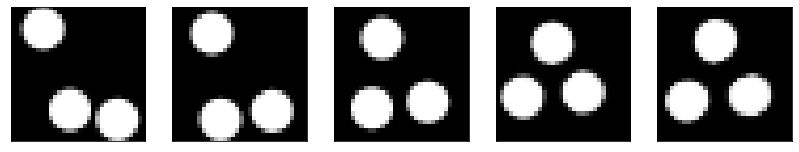

GD iterations:
i=0 | err=51.167332
i=1 | err=49.978642
i=2 | err=48.394356
i=3 | err=46.599388
i=4 | err=44.734318
i=5 | err=42.744118
i=6 | err=40.730484
i=7 | err=38.750504
i=8 | err=36.723595
i=9 | err=34.644028
i=10 | err=32.511497
i=11 | err=30.339121
i=12 | err=28.271166
i=13 | err=26.253277
i=14 | err=24.360910
i=15 | err=22.511147
i=16 | err=20.774441
i=17 | err=19.068035
i=18 | err=17.465561
i=19 | err=15.998051
i=20 | err=14.602290
i=21 | err=13.355707
i=22 | err=12.225426
i=23 | err=11.159144
i=24 | err=10.170968
i=25 | err=9.268156
i=26 | err=8.402085
i=27 | err=7.602828
i=28 | err=6.842921
i=29 | err=6.097919
Epoch=265 (96%) | out_positive=0.874833 | out_negative=0.161989 | mse=0.071804


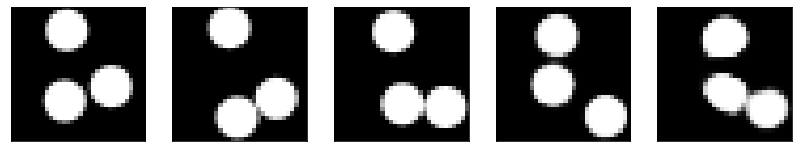

GD iterations:
i=0 | err=58.247688
i=1 | err=56.914196
i=2 | err=55.118011
i=3 | err=53.192238
i=4 | err=51.143528
i=5 | err=49.072437
i=6 | err=46.878059
i=7 | err=44.613140
i=8 | err=42.245155
i=9 | err=39.758179
i=10 | err=37.242325
i=11 | err=34.753098
i=12 | err=32.288715
i=13 | err=29.975117
i=14 | err=27.724125
i=15 | err=25.515305
i=16 | err=23.418316
i=17 | err=21.458735
i=18 | err=19.644035
i=19 | err=17.923599
i=20 | err=16.224148
i=21 | err=14.670771
i=22 | err=13.240974
i=23 | err=11.941243
i=24 | err=10.746759
i=25 | err=9.678524
i=26 | err=8.693939
i=27 | err=7.791794
i=28 | err=6.967850
i=29 | err=6.195952
Epoch=265 (98%) | out_positive=0.872400 | out_negative=0.126290 | mse=0.070600


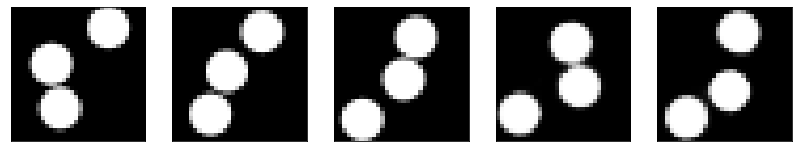

GD iterations:
i=0 | err=57.979530
i=1 | err=56.669014
i=2 | err=54.861755
i=3 | err=52.870483
i=4 | err=50.737793
i=5 | err=48.529610
i=6 | err=46.243332
i=7 | err=43.869278
i=8 | err=41.528107
i=9 | err=39.038849
i=10 | err=36.618256
i=11 | err=34.255280
i=12 | err=31.855478
i=13 | err=29.467495
i=14 | err=27.130856
i=15 | err=25.021931
i=16 | err=23.083214
i=17 | err=21.358099
i=18 | err=19.788469
i=19 | err=18.325138
i=20 | err=16.887207
i=21 | err=15.515068
i=22 | err=14.199846
i=23 | err=12.990208
i=24 | err=11.871811
i=25 | err=10.812482
i=26 | err=9.781511
i=27 | err=8.831331
i=28 | err=7.959168
i=29 | err=7.137237
Epoch=265 (99%) | out_positive=0.845823 | out_negative=0.129268 | mse=0.069910


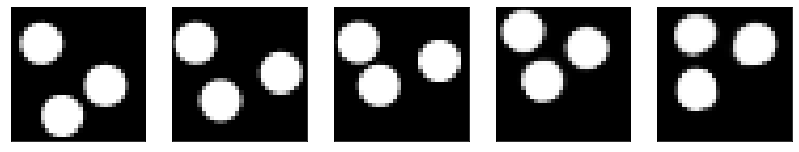

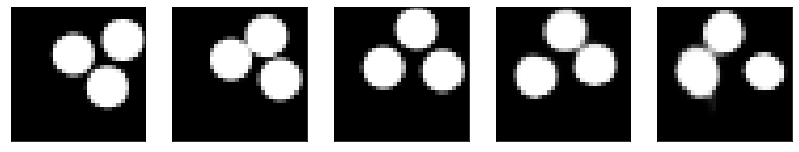

Test MSE 0.078803


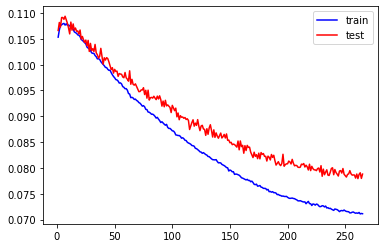

Model Saved.
GD iterations:
i=0 | err=56.238014
i=1 | err=54.971786
i=2 | err=53.244637
i=3 | err=51.319241
i=4 | err=49.221947
i=5 | err=47.063488
i=6 | err=44.808159
i=7 | err=42.481972
i=8 | err=40.123756
i=9 | err=37.780548
i=10 | err=35.326469
i=11 | err=32.894737
i=12 | err=30.611725
i=13 | err=28.459599
i=14 | err=26.380501
i=15 | err=24.422688
i=16 | err=22.625053
i=17 | err=20.908331
i=18 | err=19.317715
i=19 | err=17.794239
i=20 | err=16.415300
i=21 | err=15.100788
i=22 | err=13.877949
i=23 | err=12.715133
i=24 | err=11.613690
i=25 | err=10.582733
i=26 | err=9.663231
i=27 | err=8.829185
i=28 | err=8.001071
i=29 | err=7.196174
Epoch=266 (0%) | out_positive=0.893311 | out_negative=0.141107 | mse=0.070017


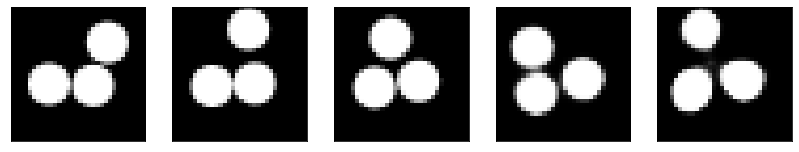

GD iterations:
i=0 | err=53.667618
i=1 | err=52.300255
i=2 | err=50.495220
i=3 | err=48.491184
i=4 | err=46.398365
i=5 | err=44.204681
i=6 | err=41.946075
i=7 | err=39.692875
i=8 | err=37.398914
i=9 | err=35.183350
i=10 | err=32.984161
i=11 | err=30.796036
i=12 | err=28.738029
i=13 | err=26.841347
i=14 | err=25.112434
i=15 | err=23.506958
i=16 | err=21.880663
i=17 | err=20.345037
i=18 | err=18.923386
i=19 | err=17.584465
i=20 | err=16.293882
i=21 | err=15.088824
i=22 | err=13.932520
i=23 | err=12.855794
i=24 | err=11.831878
i=25 | err=10.888832
i=26 | err=9.960716
i=27 | err=9.049256
i=28 | err=8.173393
i=29 | err=7.331354
Epoch=266 (2%) | out_positive=0.865576 | out_negative=0.115360 | mse=0.066258


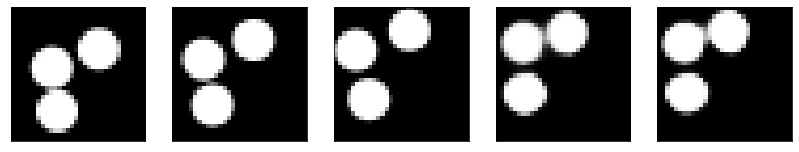

GD iterations:
i=0 | err=53.395451
i=1 | err=52.202515
i=2 | err=50.421089
i=3 | err=48.517029
i=4 | err=46.447426
i=5 | err=44.411121
i=6 | err=42.289459
i=7 | err=40.119934
i=8 | err=37.910515
i=9 | err=35.691414
i=10 | err=33.456032
i=11 | err=31.254520
i=12 | err=29.114258
i=13 | err=27.079014
i=14 | err=25.115311
i=15 | err=23.249287
i=16 | err=21.448067
i=17 | err=19.703342
i=18 | err=18.081059
i=19 | err=16.582678
i=20 | err=15.235818
i=21 | err=14.012830
i=22 | err=12.871576
i=23 | err=11.823657
i=24 | err=10.862650
i=25 | err=9.960728
i=26 | err=9.083166
i=27 | err=8.255905
i=28 | err=7.467516
i=29 | err=6.736901
Epoch=266 (4%) | out_positive=0.889025 | out_negative=0.117815 | mse=0.072789


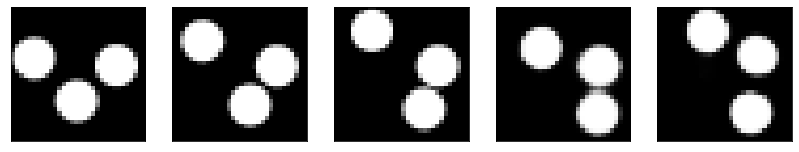

GD iterations:
i=0 | err=52.135841
i=1 | err=50.728935
i=2 | err=48.842617
i=3 | err=46.748161
i=4 | err=44.585808
i=5 | err=42.431141
i=6 | err=40.164177
i=7 | err=37.902412
i=8 | err=35.626686
i=9 | err=33.465851
i=10 | err=31.447609
i=11 | err=29.547211
i=12 | err=27.676149
i=13 | err=25.802649
i=14 | err=23.997484
i=15 | err=22.295586
i=16 | err=20.705191
i=17 | err=19.226505
i=18 | err=17.842655
i=19 | err=16.515518
i=20 | err=15.278643
i=21 | err=14.103876
i=22 | err=12.958780
i=23 | err=11.862889
i=24 | err=10.736874
i=25 | err=9.676376
i=26 | err=8.713943
i=27 | err=7.854394
i=28 | err=7.042688
i=29 | err=6.308306
Epoch=266 (6%) | out_positive=0.942073 | out_negative=0.122032 | mse=0.073511


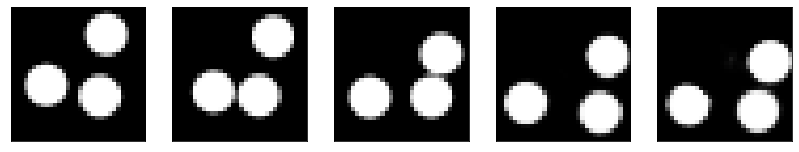

GD iterations:
i=0 | err=53.462257
i=1 | err=52.273216
i=2 | err=50.562691
i=3 | err=48.635067
i=4 | err=46.527325
i=5 | err=44.459087
i=6 | err=42.308334
i=7 | err=40.152885
i=8 | err=37.980694
i=9 | err=35.849483
i=10 | err=33.668163
i=11 | err=31.517605
i=12 | err=29.450733
i=13 | err=27.505009
i=14 | err=25.654133
i=15 | err=23.914619
i=16 | err=22.249588
i=17 | err=20.711782
i=18 | err=19.224419
i=19 | err=17.807590
i=20 | err=16.472715
i=21 | err=15.227914
i=22 | err=14.082915
i=23 | err=13.018648
i=24 | err=12.006528
i=25 | err=11.055712
i=26 | err=10.146137
i=27 | err=9.265161
i=28 | err=8.413692
i=29 | err=7.636784
Epoch=266 (8%) | out_positive=0.908911 | out_negative=0.080298 | mse=0.078621


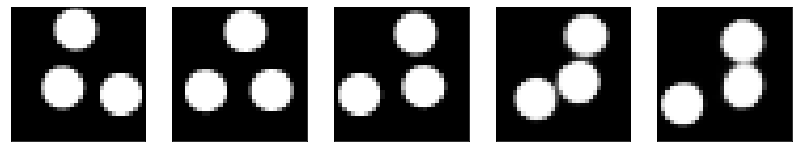

GD iterations:
i=0 | err=53.577400
i=1 | err=52.327587
i=2 | err=50.677299
i=3 | err=48.920456
i=4 | err=47.008461
i=5 | err=45.092583
i=6 | err=43.154438
i=7 | err=41.203125
i=8 | err=39.270233
i=9 | err=37.290878
i=10 | err=35.309021
i=11 | err=33.311745
i=12 | err=31.221771
i=13 | err=29.110237
i=14 | err=26.924416
i=15 | err=24.712170
i=16 | err=22.580751
i=17 | err=20.732521
i=18 | err=19.044800
i=19 | err=17.472940
i=20 | err=15.999253
i=21 | err=14.644302
i=22 | err=13.404562
i=23 | err=12.238316
i=24 | err=11.110200
i=25 | err=10.044596
i=26 | err=9.057969
i=27 | err=8.189190
i=28 | err=7.353817
i=29 | err=6.562809
Epoch=266 (9%) | out_positive=0.882612 | out_negative=0.125623 | mse=0.073401


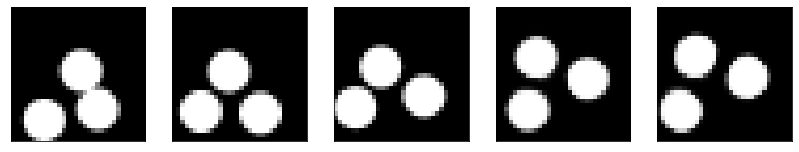

GD iterations:
i=0 | err=52.037518
i=1 | err=50.753189
i=2 | err=48.970467
i=3 | err=46.922440
i=4 | err=44.762005
i=5 | err=42.600883
i=6 | err=40.404137
i=7 | err=38.142944
i=8 | err=35.823875
i=9 | err=33.494743
i=10 | err=31.221264
i=11 | err=29.015995
i=12 | err=26.804577
i=13 | err=24.662849
i=14 | err=22.646177
i=15 | err=20.839497
i=16 | err=19.202675
i=17 | err=17.692383
i=18 | err=16.263643
i=19 | err=14.917066
i=20 | err=13.659371
i=21 | err=12.498711
i=22 | err=11.417207
i=23 | err=10.436096
i=24 | err=9.512161
i=25 | err=8.645222
i=26 | err=7.807601
i=27 | err=7.014850
i=28 | err=6.272898
i=29 | err=5.575322
Epoch=266 (11%) | out_positive=0.892170 | out_negative=0.177747 | mse=0.066222


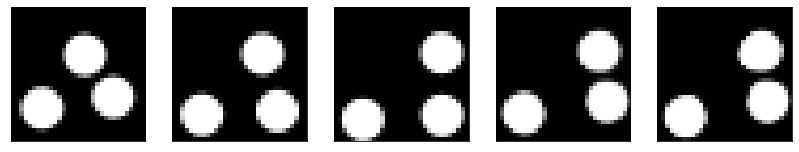

GD iterations:
i=0 | err=53.813889
i=1 | err=52.596901
i=2 | err=51.031685
i=3 | err=49.253441
i=4 | err=47.329933
i=5 | err=45.408596
i=6 | err=43.425446
i=7 | err=41.480515
i=8 | err=39.438801
i=9 | err=37.341919
i=10 | err=35.253479
i=11 | err=33.142693
i=12 | err=31.135429
i=13 | err=29.201754
i=14 | err=27.296007
i=15 | err=25.392740
i=16 | err=23.621372
i=17 | err=21.941772
i=18 | err=20.352959
i=19 | err=18.884726
i=20 | err=17.484997
i=21 | err=16.178482
i=22 | err=14.920840
i=23 | err=13.749012
i=24 | err=12.659526
i=25 | err=11.628256
i=26 | err=10.644858
i=27 | err=9.709148
i=28 | err=8.823696
i=29 | err=8.025610
Epoch=266 (13%) | out_positive=0.908403 | out_negative=0.125790 | mse=0.074451


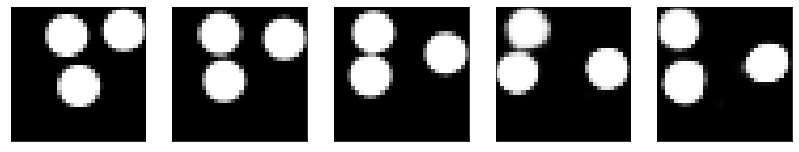

GD iterations:
i=0 | err=57.654640
i=1 | err=56.306740
i=2 | err=54.384834
i=3 | err=52.223591
i=4 | err=50.040817
i=5 | err=47.770245
i=6 | err=45.457222
i=7 | err=43.166550
i=8 | err=40.866730
i=9 | err=38.648884
i=10 | err=36.382984
i=11 | err=34.069492
i=12 | err=31.794418
i=13 | err=29.524086
i=14 | err=27.351902
i=15 | err=25.226744
i=16 | err=23.220877
i=17 | err=21.315689
i=18 | err=19.567739
i=19 | err=17.978748
i=20 | err=16.503668
i=21 | err=15.122030
i=22 | err=13.830767
i=23 | err=12.698307
i=24 | err=11.674097
i=25 | err=10.708784
i=26 | err=9.784304
i=27 | err=8.869844
i=28 | err=7.999956
i=29 | err=7.165063
Epoch=266 (15%) | out_positive=0.855402 | out_negative=0.116894 | mse=0.070261


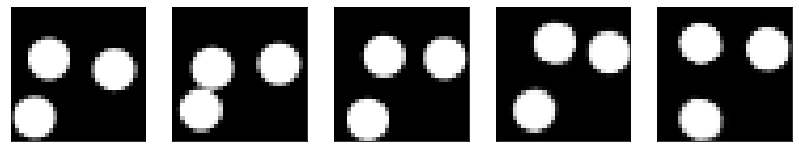

GD iterations:
i=0 | err=55.491264
i=1 | err=54.293907
i=2 | err=52.560959
i=3 | err=50.493526
i=4 | err=48.298332
i=5 | err=45.992298
i=6 | err=43.589813
i=7 | err=41.123344
i=8 | err=38.687946
i=9 | err=36.402084
i=10 | err=34.133739
i=11 | err=31.885519
i=12 | err=29.684715
i=13 | err=27.524004
i=14 | err=25.471397
i=15 | err=23.447308
i=16 | err=21.577457
i=17 | err=19.824684
i=18 | err=18.203211
i=19 | err=16.769695
i=20 | err=15.492364
i=21 | err=14.339510
i=22 | err=13.262174
i=23 | err=12.248571
i=24 | err=11.242422
i=25 | err=10.301210
i=26 | err=9.410474
i=27 | err=8.519934
i=28 | err=7.694284
i=29 | err=6.896634
Epoch=266 (17%) | out_positive=0.836619 | out_negative=0.112736 | mse=0.070255


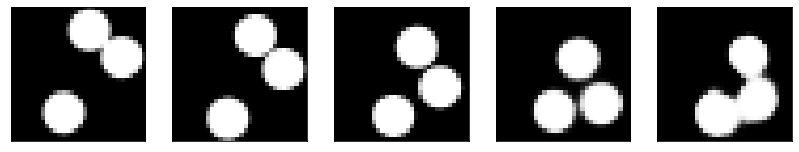

GD iterations:
i=0 | err=50.826241
i=1 | err=49.581703
i=2 | err=47.966564
i=3 | err=46.121376
i=4 | err=44.231541
i=5 | err=42.278435
i=6 | err=40.242859
i=7 | err=38.171726
i=8 | err=35.968918
i=9 | err=33.767876
i=10 | err=31.529232
i=11 | err=29.365650
i=12 | err=27.381084
i=13 | err=25.501249
i=14 | err=23.645462
i=15 | err=21.890276
i=16 | err=20.181408
i=17 | err=18.566929
i=18 | err=17.084148
i=19 | err=15.694033
i=20 | err=14.398350
i=21 | err=13.176132
i=22 | err=12.008595
i=23 | err=10.937880
i=24 | err=9.933493
i=25 | err=8.957975
i=26 | err=8.024578
i=27 | err=7.145795
i=28 | err=6.328578
i=29 | err=5.547402
Epoch=266 (19%) | out_positive=0.893354 | out_negative=0.166300 | mse=0.067785


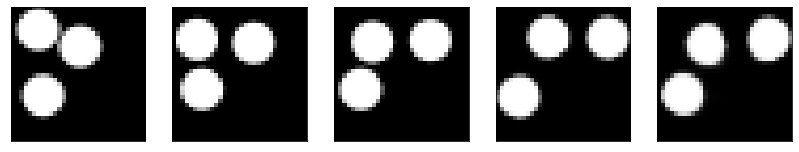

GD iterations:
i=0 | err=54.386013
i=1 | err=53.202599
i=2 | err=51.601448
i=3 | err=49.840515
i=4 | err=48.039265
i=5 | err=46.111870
i=6 | err=44.094002
i=7 | err=41.974606
i=8 | err=39.756149
i=9 | err=37.563004
i=10 | err=35.410927
i=11 | err=33.229843
i=12 | err=31.056320
i=13 | err=28.927002
i=14 | err=26.864065
i=15 | err=24.803669
i=16 | err=22.936310
i=17 | err=21.131157
i=18 | err=19.503740
i=19 | err=17.952162
i=20 | err=16.532341
i=21 | err=15.234858
i=22 | err=14.024891
i=23 | err=12.875613
i=24 | err=11.800967
i=25 | err=10.795299
i=26 | err=9.848480
i=27 | err=8.897927
i=28 | err=8.000326
i=29 | err=7.183834
Epoch=266 (20%) | out_positive=0.849586 | out_negative=0.129852 | mse=0.068269


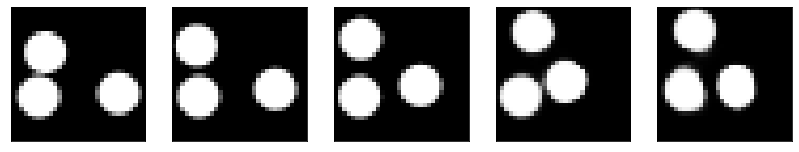

GD iterations:
i=0 | err=54.131138
i=1 | err=53.044403
i=2 | err=51.491013
i=3 | err=49.783943
i=4 | err=47.864155
i=5 | err=45.928398
i=6 | err=43.866219
i=7 | err=41.653980
i=8 | err=39.386436
i=9 | err=37.130661
i=10 | err=34.793488
i=11 | err=32.591560
i=12 | err=30.357540
i=13 | err=28.205612
i=14 | err=26.115242
i=15 | err=24.068493
i=16 | err=22.146194
i=17 | err=20.377167
i=18 | err=18.748150
i=19 | err=17.294754
i=20 | err=16.006844
i=21 | err=14.830650
i=22 | err=13.713921
i=23 | err=12.704244
i=24 | err=11.784365
i=25 | err=10.909559
i=26 | err=10.110889
i=27 | err=9.356566
i=28 | err=8.618334
i=29 | err=7.903471
Epoch=266 (22%) | out_positive=0.843438 | out_negative=0.092455 | mse=0.070092


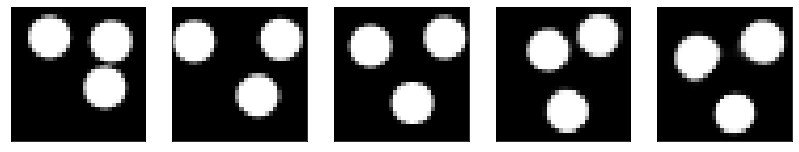

GD iterations:
i=0 | err=57.341553
i=1 | err=56.138714
i=2 | err=54.390060
i=3 | err=52.420132
i=4 | err=50.262360
i=5 | err=48.021637
i=6 | err=45.709900
i=7 | err=43.313515
i=8 | err=40.881401
i=9 | err=38.489052
i=10 | err=36.051334
i=11 | err=33.588608
i=12 | err=31.235313
i=13 | err=29.001883
i=14 | err=26.907253
i=15 | err=24.905779
i=16 | err=22.962776
i=17 | err=21.140516
i=18 | err=19.432568
i=19 | err=17.903559
i=20 | err=16.496792
i=21 | err=15.192675
i=22 | err=13.961224
i=23 | err=12.823141
i=24 | err=11.722392
i=25 | err=10.693731
i=26 | err=9.746149
i=27 | err=8.846999
i=28 | err=7.968772
i=29 | err=7.125559
Epoch=266 (24%) | out_positive=0.886148 | out_negative=0.136592 | mse=0.070017


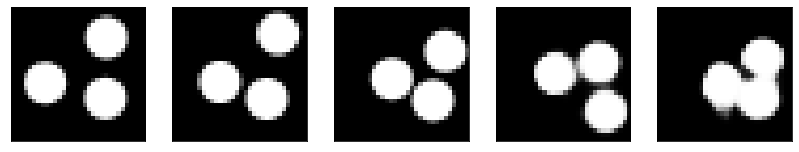

GD iterations:
i=0 | err=53.381897
i=1 | err=52.028572
i=2 | err=50.316231
i=3 | err=48.454639
i=4 | err=46.468719
i=5 | err=44.482105
i=6 | err=42.459892
i=7 | err=40.420769
i=8 | err=38.333656
i=9 | err=36.260834
i=10 | err=34.239365
i=11 | err=32.262695
i=12 | err=30.261887
i=13 | err=28.362226
i=14 | err=26.553270
i=15 | err=24.775925
i=16 | err=23.029388
i=17 | err=21.376720
i=18 | err=19.847904
i=19 | err=18.381763
i=20 | err=17.063623
i=21 | err=15.809842
i=22 | err=14.635714
i=23 | err=13.554086
i=24 | err=12.524661
i=25 | err=11.539806
i=26 | err=10.573570
i=27 | err=9.693430
i=28 | err=8.800119
i=29 | err=7.936856
Epoch=266 (26%) | out_positive=0.880290 | out_negative=0.115280 | mse=0.071593


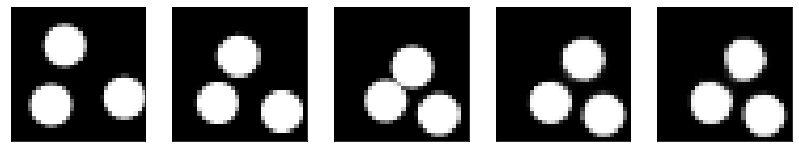

GD iterations:
i=0 | err=57.779709
i=1 | err=56.602356
i=2 | err=54.936256
i=3 | err=53.036976
i=4 | err=51.058060
i=5 | err=49.020393
i=6 | err=46.994286
i=7 | err=44.981735
i=8 | err=42.899952
i=9 | err=40.778774
i=10 | err=38.616951
i=11 | err=36.464493
i=12 | err=34.295349
i=13 | err=32.087257
i=14 | err=29.833117
i=15 | err=27.641895
i=16 | err=25.580172
i=17 | err=23.578035
i=18 | err=21.647587
i=19 | err=19.857666
i=20 | err=18.224030
i=21 | err=16.718426
i=22 | err=15.338820
i=23 | err=14.032661
i=24 | err=12.828152
i=25 | err=11.643837
i=26 | err=10.501005
i=27 | err=9.438444
i=28 | err=8.443003
i=29 | err=7.537038
Epoch=266 (28%) | out_positive=0.896900 | out_negative=0.137821 | mse=0.072269


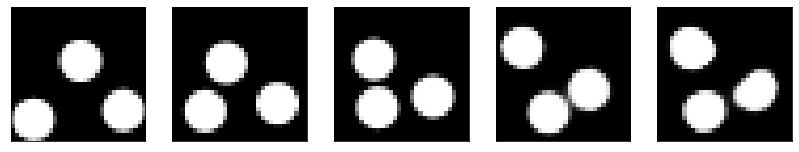

GD iterations:
i=0 | err=52.964470
i=1 | err=51.643272
i=2 | err=49.965965
i=3 | err=48.156670
i=4 | err=46.262367
i=5 | err=44.339001
i=6 | err=42.342690
i=7 | err=40.266453
i=8 | err=38.238983
i=9 | err=36.158852
i=10 | err=34.157883
i=11 | err=32.087208
i=12 | err=30.150089
i=13 | err=28.226418
i=14 | err=26.276651
i=15 | err=24.396244
i=16 | err=22.585823
i=17 | err=20.850386
i=18 | err=19.178345
i=19 | err=17.644754
i=20 | err=16.275345
i=21 | err=15.028086
i=22 | err=13.841806
i=23 | err=12.761129
i=24 | err=11.707033
i=25 | err=10.721310
i=26 | err=9.787466
i=27 | err=8.895565
i=28 | err=8.069414
i=29 | err=7.255870
Epoch=266 (30%) | out_positive=0.887632 | out_negative=0.155577 | mse=0.067196


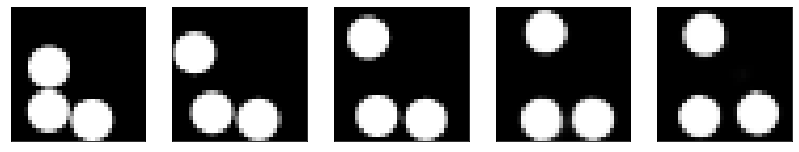

GD iterations:
i=0 | err=60.211426
i=1 | err=58.920460
i=2 | err=57.093872
i=3 | err=55.094894
i=4 | err=52.962864
i=5 | err=50.628723
i=6 | err=48.155037
i=7 | err=45.601112
i=8 | err=43.126190
i=9 | err=40.630043
i=10 | err=38.052204
i=11 | err=35.554234
i=12 | err=33.030518
i=13 | err=30.656025
i=14 | err=28.353912
i=15 | err=26.054165
i=16 | err=23.876122
i=17 | err=21.848455
i=18 | err=20.020630
i=19 | err=18.258892
i=20 | err=16.600670
i=21 | err=15.010319
i=22 | err=13.518635
i=23 | err=12.135376
i=24 | err=10.863155
i=25 | err=9.691828
i=26 | err=8.615127
i=27 | err=7.654047
i=28 | err=6.765620
i=29 | err=5.968796
Epoch=266 (32%) | out_positive=0.875412 | out_negative=0.141415 | mse=0.068798


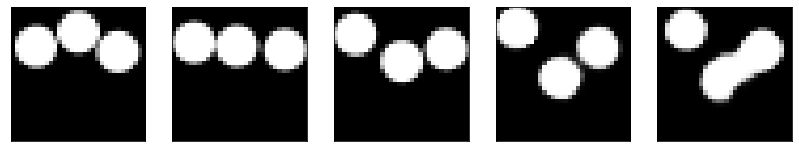

GD iterations:
i=0 | err=53.917263
i=1 | err=52.636436
i=2 | err=50.987049
i=3 | err=49.148281
i=4 | err=47.318478
i=5 | err=45.466465
i=6 | err=43.619682
i=7 | err=41.684200
i=8 | err=39.680847
i=9 | err=37.673023
i=10 | err=35.652714
i=11 | err=33.573483
i=12 | err=31.569874
i=13 | err=29.631760
i=14 | err=27.712671
i=15 | err=25.791473
i=16 | err=24.008038
i=17 | err=22.258657
i=18 | err=20.630310
i=19 | err=19.027390
i=20 | err=17.523399
i=21 | err=16.153084
i=22 | err=14.864923
i=23 | err=13.694155
i=24 | err=12.566446
i=25 | err=11.462676
i=26 | err=10.378983
i=27 | err=9.369416
i=28 | err=8.437601
i=29 | err=7.586190
Epoch=266 (33%) | out_positive=0.860528 | out_negative=0.114942 | mse=0.073062


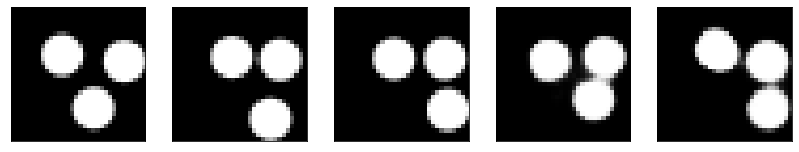

GD iterations:
i=0 | err=54.994419
i=1 | err=53.803680
i=2 | err=52.233971
i=3 | err=50.414242
i=4 | err=48.478973
i=5 | err=46.407715
i=6 | err=44.174530
i=7 | err=41.819519
i=8 | err=39.527206
i=9 | err=37.186512
i=10 | err=34.858109
i=11 | err=32.584557
i=12 | err=30.417669
i=13 | err=28.356625
i=14 | err=26.406698
i=15 | err=24.531837
i=16 | err=22.654892
i=17 | err=20.907890
i=18 | err=19.281729
i=19 | err=17.843437
i=20 | err=16.515114
i=21 | err=15.259690
i=22 | err=14.067604
i=23 | err=12.939147
i=24 | err=11.869894
i=25 | err=10.861021
i=26 | err=9.879599
i=27 | err=8.957211
i=28 | err=8.077636
i=29 | err=7.249539
Epoch=266 (35%) | out_positive=0.865382 | out_negative=0.146222 | mse=0.073504


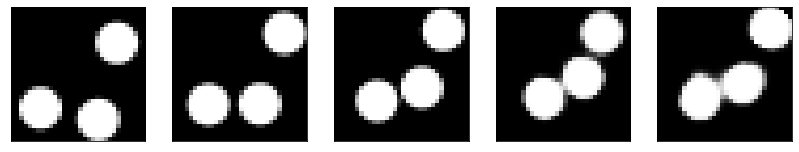

GD iterations:
i=0 | err=54.857178
i=1 | err=53.686836
i=2 | err=52.015274
i=3 | err=50.197132
i=4 | err=48.275581
i=5 | err=46.226475
i=6 | err=44.116341
i=7 | err=41.945763
i=8 | err=39.664413
i=9 | err=37.320763
i=10 | err=34.972504
i=11 | err=32.583443
i=12 | err=30.420361
i=13 | err=28.377396
i=14 | err=26.377426
i=15 | err=24.395866
i=16 | err=22.553122
i=17 | err=20.742905
i=18 | err=19.004009
i=19 | err=17.385342
i=20 | err=15.896205
i=21 | err=14.520069
i=22 | err=13.204188
i=23 | err=12.014788
i=24 | err=10.906651
i=25 | err=9.865273
i=26 | err=8.892544
i=27 | err=7.982248
i=28 | err=7.139256
i=29 | err=6.353191
Epoch=266 (37%) | out_positive=0.842640 | out_negative=0.143714 | mse=0.063056


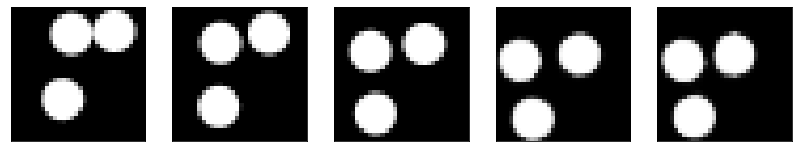

GD iterations:
i=0 | err=54.951241
i=1 | err=53.760521
i=2 | err=52.090443
i=3 | err=50.250259
i=4 | err=48.275955
i=5 | err=46.260612
i=6 | err=44.159935
i=7 | err=42.022331
i=8 | err=39.877426
i=9 | err=37.669792
i=10 | err=35.597588
i=11 | err=33.616192
i=12 | err=31.755527
i=13 | err=29.977894
i=14 | err=28.207235
i=15 | err=26.470995
i=16 | err=24.755026
i=17 | err=23.101643
i=18 | err=21.556581
i=19 | err=20.137350
i=20 | err=18.837631
i=21 | err=17.541962
i=22 | err=16.346760
i=23 | err=15.174326
i=24 | err=14.076957
i=25 | err=13.052778
i=26 | err=12.066425
i=27 | err=11.132730
i=28 | err=10.255574
i=29 | err=9.397273
Epoch=266 (39%) | out_positive=0.910098 | out_negative=0.095164 | mse=0.075386


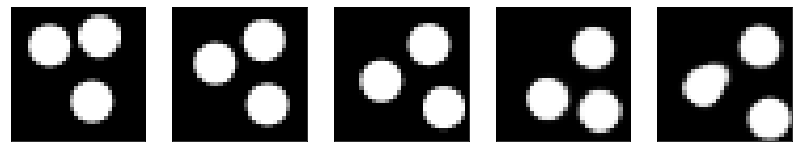

GD iterations:
i=0 | err=56.647846
i=1 | err=55.346260
i=2 | err=53.525261
i=3 | err=51.524433
i=4 | err=49.306023
i=5 | err=46.975899
i=6 | err=44.625488
i=7 | err=42.215675
i=8 | err=39.938435
i=9 | err=37.688194
i=10 | err=35.388359
i=11 | err=33.117035
i=12 | err=30.886028
i=13 | err=28.873762
i=14 | err=26.978031
i=15 | err=25.128054
i=16 | err=23.300280
i=17 | err=21.554354
i=18 | err=19.867947
i=19 | err=18.268700
i=20 | err=16.710909
i=21 | err=15.348566
i=22 | err=14.091950
i=23 | err=12.937250
i=24 | err=11.864540
i=25 | err=10.863894
i=26 | err=9.926054
i=27 | err=9.031080
i=28 | err=8.210260
i=29 | err=7.391543
Epoch=266 (41%) | out_positive=0.820149 | out_negative=0.094906 | mse=0.070999


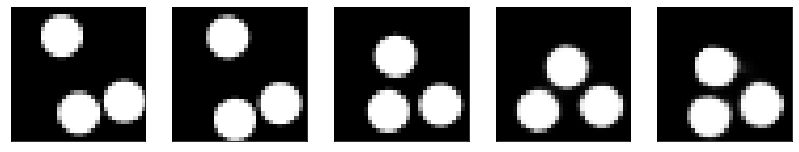

GD iterations:
i=0 | err=53.248024
i=1 | err=52.069412
i=2 | err=50.481621
i=3 | err=48.656059
i=4 | err=46.817123
i=5 | err=44.856438
i=6 | err=42.879028
i=7 | err=40.829773
i=8 | err=38.813366
i=9 | err=36.834862
i=10 | err=34.817101
i=11 | err=32.791874
i=12 | err=30.820599
i=13 | err=28.987434
i=14 | err=27.164703
i=15 | err=25.395401
i=16 | err=23.634893
i=17 | err=21.813156
i=18 | err=20.133713
i=19 | err=18.548174
i=20 | err=17.130764
i=21 | err=15.811215
i=22 | err=14.579010
i=23 | err=13.401459
i=24 | err=12.290798
i=25 | err=11.233771
i=26 | err=10.262024
i=27 | err=9.383696
i=28 | err=8.607855
i=29 | err=7.861125
Epoch=266 (43%) | out_positive=0.868178 | out_negative=0.105490 | mse=0.072249


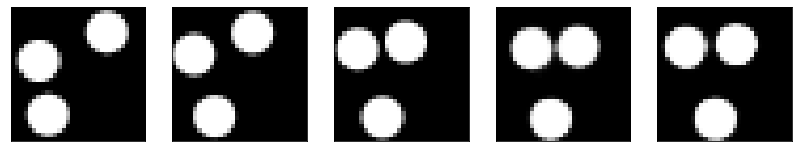

GD iterations:
i=0 | err=51.863403
i=1 | err=50.664024
i=2 | err=49.031612
i=3 | err=47.135036
i=4 | err=45.112129
i=5 | err=43.023659
i=6 | err=40.969872
i=7 | err=38.931519
i=8 | err=36.832699
i=9 | err=34.723755
i=10 | err=32.648849
i=11 | err=30.686514
i=12 | err=28.790741
i=13 | err=27.025740
i=14 | err=25.336239
i=15 | err=23.705570
i=16 | err=22.050026
i=17 | err=20.529682
i=18 | err=19.018599
i=19 | err=17.660442
i=20 | err=16.315521
i=21 | err=15.043982
i=22 | err=13.804526
i=23 | err=12.626950
i=24 | err=11.486952
i=25 | err=10.404165
i=26 | err=9.419426
i=27 | err=8.485082
i=28 | err=7.602620
i=29 | err=6.797809
Epoch=266 (44%) | out_positive=0.871053 | out_negative=0.141638 | mse=0.068310


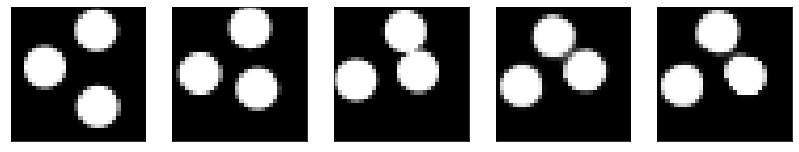

GD iterations:
i=0 | err=52.539776
i=1 | err=51.415607
i=2 | err=49.895351
i=3 | err=48.189583
i=4 | err=46.361526
i=5 | err=44.423958
i=6 | err=42.443249
i=7 | err=40.375282
i=8 | err=38.257690
i=9 | err=36.172699
i=10 | err=34.109241
i=11 | err=32.053185
i=12 | err=29.985424
i=13 | err=27.974781
i=14 | err=26.127253
i=15 | err=24.353081
i=16 | err=22.597218
i=17 | err=20.912840
i=18 | err=19.350048
i=19 | err=17.898388
i=20 | err=16.482197
i=21 | err=15.167576
i=22 | err=13.954134
i=23 | err=12.811914
i=24 | err=11.721741
i=25 | err=10.705808
i=26 | err=9.777815
i=27 | err=8.900921
i=28 | err=8.068167
i=29 | err=7.287899
Epoch=266 (46%) | out_positive=0.852630 | out_negative=0.120719 | mse=0.066720


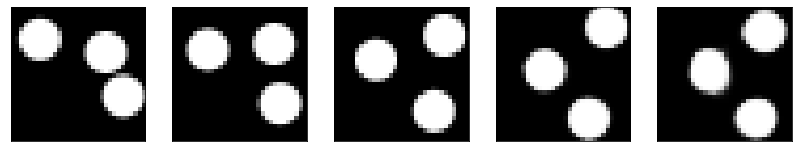

GD iterations:
i=0 | err=55.728195
i=1 | err=54.468948
i=2 | err=52.740868
i=3 | err=50.831795
i=4 | err=48.828171
i=5 | err=46.839432
i=6 | err=44.807770
i=7 | err=42.745251
i=8 | err=40.579788
i=9 | err=38.440826
i=10 | err=36.388977
i=11 | err=34.397606
i=12 | err=32.455776
i=13 | err=30.550758
i=14 | err=28.600538
i=15 | err=26.623753
i=16 | err=24.685717
i=17 | err=22.856928
i=18 | err=21.155813
i=19 | err=19.557083
i=20 | err=18.004887
i=21 | err=16.512640
i=22 | err=15.101306
i=23 | err=13.756055
i=24 | err=12.518872
i=25 | err=11.381811
i=26 | err=10.353655
i=27 | err=9.436516
i=28 | err=8.584925
i=29 | err=7.799567
Epoch=266 (48%) | out_positive=0.854940 | out_negative=0.077117 | mse=0.077376


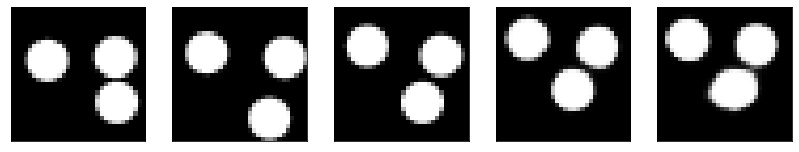

GD iterations:
i=0 | err=56.808136
i=1 | err=55.655006
i=2 | err=54.083466
i=3 | err=52.279388
i=4 | err=50.344048
i=5 | err=48.365864
i=6 | err=46.408981
i=7 | err=44.365501
i=8 | err=42.374432
i=9 | err=40.354408
i=10 | err=38.396225
i=11 | err=36.406334
i=12 | err=34.351925
i=13 | err=32.220970
i=14 | err=30.078962
i=15 | err=27.937473
i=16 | err=25.857246
i=17 | err=23.947950
i=18 | err=22.160513
i=19 | err=20.460941
i=20 | err=18.866455
i=21 | err=17.314720
i=22 | err=15.857724
i=23 | err=14.500267
i=24 | err=13.272855
i=25 | err=12.124310
i=26 | err=11.087793
i=27 | err=10.101189
i=28 | err=9.152242
i=29 | err=8.255903
Epoch=266 (50%) | out_positive=0.858479 | out_negative=0.089639 | mse=0.070126


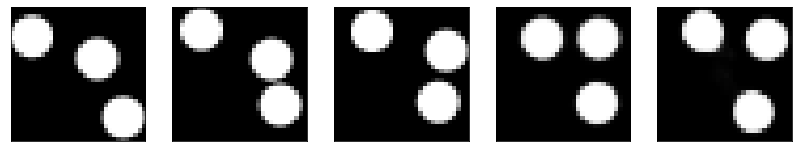

GD iterations:
i=0 | err=50.151321
i=1 | err=48.953884
i=2 | err=47.240204
i=3 | err=45.392727
i=4 | err=43.448231
i=5 | err=41.530231
i=6 | err=39.557014
i=7 | err=37.654758
i=8 | err=35.738121
i=9 | err=33.830612
i=10 | err=31.904320
i=11 | err=29.925835
i=12 | err=28.076632
i=13 | err=26.313023
i=14 | err=24.567970
i=15 | err=22.901161
i=16 | err=21.286934
i=17 | err=19.728775
i=18 | err=18.248272
i=19 | err=16.888784
i=20 | err=15.599510
i=21 | err=14.369149
i=22 | err=13.217892
i=23 | err=12.169038
i=24 | err=11.179833
i=25 | err=10.271324
i=26 | err=9.425478
i=27 | err=8.636367
i=28 | err=7.896366
i=29 | err=7.194982
Epoch=266 (52%) | out_positive=0.954446 | out_negative=0.124942 | mse=0.076185


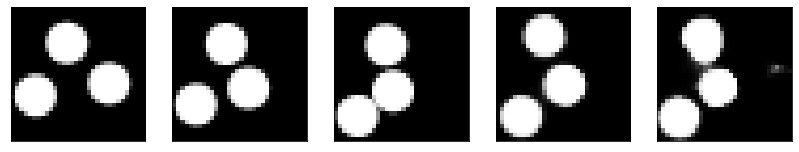

GD iterations:
i=0 | err=53.060944
i=1 | err=51.931221
i=2 | err=50.357933
i=3 | err=48.675442
i=4 | err=46.773632
i=5 | err=44.789448
i=6 | err=42.702793
i=7 | err=40.582336
i=8 | err=38.382111
i=9 | err=36.217216
i=10 | err=33.995094
i=11 | err=31.730654
i=12 | err=29.596663
i=13 | err=27.496828
i=14 | err=25.415089
i=15 | err=23.401134
i=16 | err=21.519737
i=17 | err=19.821507
i=18 | err=18.317558
i=19 | err=16.925743
i=20 | err=15.698900
i=21 | err=14.538798
i=22 | err=13.458917
i=23 | err=12.391205
i=24 | err=11.355677
i=25 | err=10.355158
i=26 | err=9.376160
i=27 | err=8.444341
i=28 | err=7.553266
i=29 | err=6.677173
Epoch=266 (54%) | out_positive=0.919777 | out_negative=0.163647 | mse=0.072977


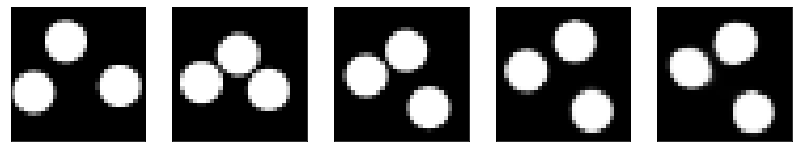

GD iterations:
i=0 | err=52.717125
i=1 | err=51.600311
i=2 | err=50.036469
i=3 | err=48.232620
i=4 | err=46.231670
i=5 | err=44.229084
i=6 | err=42.190231
i=7 | err=40.046402
i=8 | err=37.863605
i=9 | err=35.602459
i=10 | err=33.343323
i=11 | err=31.120968
i=12 | err=28.974251
i=13 | err=26.953121
i=14 | err=24.973875
i=15 | err=23.067287
i=16 | err=21.261196
i=17 | err=19.500750
i=18 | err=17.852257
i=19 | err=16.397802
i=20 | err=15.050212
i=21 | err=13.833603
i=22 | err=12.679924
i=23 | err=11.631703
i=24 | err=10.637125
i=25 | err=9.686554
i=26 | err=8.797258
i=27 | err=7.985684
i=28 | err=7.236225
i=29 | err=6.523914
Epoch=266 (56%) | out_positive=0.852692 | out_negative=0.130178 | mse=0.063780


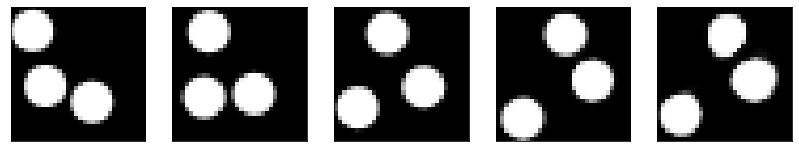

GD iterations:
i=0 | err=57.686852
i=1 | err=56.481796
i=2 | err=54.799362
i=3 | err=52.915272
i=4 | err=50.911636
i=5 | err=48.813072
i=6 | err=46.672241
i=7 | err=44.512787
i=8 | err=42.265068
i=9 | err=39.969368
i=10 | err=37.631752
i=11 | err=35.367870
i=12 | err=33.213081
i=13 | err=31.042536
i=14 | err=28.974468
i=15 | err=27.010241
i=16 | err=25.094742
i=17 | err=23.255547
i=18 | err=21.501438
i=19 | err=19.769531
i=20 | err=18.136345
i=21 | err=16.594429
i=22 | err=15.185572
i=23 | err=13.874139
i=24 | err=12.592872
i=25 | err=11.378220
i=26 | err=10.245871
i=27 | err=9.192078
i=28 | err=8.218463
i=29 | err=7.275555
Epoch=266 (57%) | out_positive=0.885422 | out_negative=0.118321 | mse=0.072149


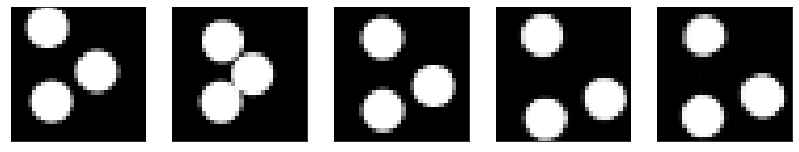

GD iterations:
i=0 | err=55.430389
i=1 | err=54.170486
i=2 | err=52.334557
i=3 | err=50.297886
i=4 | err=48.078793
i=5 | err=45.740257
i=6 | err=43.473236
i=7 | err=41.073006
i=8 | err=38.754684
i=9 | err=36.389282
i=10 | err=34.008495
i=11 | err=31.730003
i=12 | err=29.463989
i=13 | err=27.337034
i=14 | err=25.322088
i=15 | err=23.326080
i=16 | err=21.460449
i=17 | err=19.749012
i=18 | err=18.160442
i=19 | err=16.641644
i=20 | err=15.252001
i=21 | err=13.971035
i=22 | err=12.837420
i=23 | err=11.793867
i=24 | err=10.814118
i=25 | err=9.875878
i=26 | err=9.000877
i=27 | err=8.169371
i=28 | err=7.406646
i=29 | err=6.695274
Epoch=266 (59%) | out_positive=0.880248 | out_negative=0.144580 | mse=0.073344


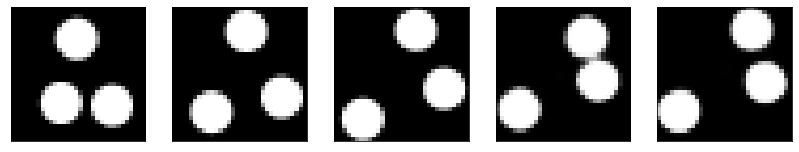

GD iterations:
i=0 | err=57.597183
i=1 | err=56.374283
i=2 | err=54.717926
i=3 | err=52.798553
i=4 | err=50.695045
i=5 | err=48.502953
i=6 | err=46.261879
i=7 | err=43.996365
i=8 | err=41.661930
i=9 | err=39.372879
i=10 | err=37.059765
i=11 | err=34.728039
i=12 | err=32.357315
i=13 | err=30.075584
i=14 | err=27.895144
i=15 | err=25.771341
i=16 | err=23.678858
i=17 | err=21.751820
i=18 | err=19.959370
i=19 | err=18.310598
i=20 | err=16.758083
i=21 | err=15.300373
i=22 | err=13.950378
i=23 | err=12.721750
i=24 | err=11.617397
i=25 | err=10.574415
i=26 | err=9.597350
i=27 | err=8.671343
i=28 | err=7.836529
i=29 | err=7.031003
Epoch=266 (61%) | out_positive=0.877117 | out_negative=0.091050 | mse=0.074466


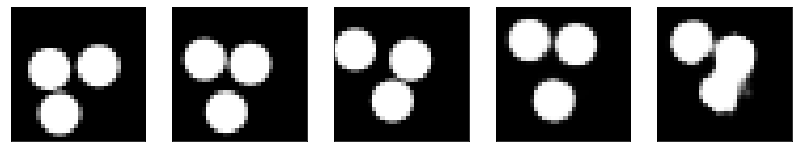

GD iterations:
i=0 | err=56.726585
i=1 | err=55.551167
i=2 | err=53.988216
i=3 | err=52.198242
i=4 | err=50.273766
i=5 | err=48.253372
i=6 | err=46.064388
i=7 | err=43.767159
i=8 | err=41.371307
i=9 | err=38.883789
i=10 | err=36.365028
i=11 | err=33.956455
i=12 | err=31.651781
i=13 | err=29.518463
i=14 | err=27.472351
i=15 | err=25.493656
i=16 | err=23.657139
i=17 | err=21.891891
i=18 | err=20.214224
i=19 | err=18.631264
i=20 | err=17.100170
i=21 | err=15.777518
i=22 | err=14.535987
i=23 | err=13.353045
i=24 | err=12.229407
i=25 | err=11.230061
i=26 | err=10.272447
i=27 | err=9.320676
i=28 | err=8.435984
i=29 | err=7.577637
Epoch=266 (63%) | out_positive=0.809942 | out_negative=0.108455 | mse=0.074325


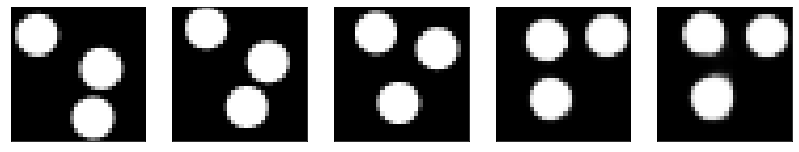

GD iterations:
i=0 | err=54.729309
i=1 | err=53.393318
i=2 | err=51.596512
i=3 | err=49.607903
i=4 | err=47.579578
i=5 | err=45.433983
i=6 | err=43.271236
i=7 | err=41.001892
i=8 | err=38.778229
i=9 | err=36.558784
i=10 | err=34.388176
i=11 | err=32.249157
i=12 | err=30.181795
i=13 | err=28.190847
i=14 | err=26.225683
i=15 | err=24.349537
i=16 | err=22.483070
i=17 | err=20.705458
i=18 | err=19.057564
i=19 | err=17.530787
i=20 | err=16.080162
i=21 | err=14.761624
i=22 | err=13.548075
i=23 | err=12.451649
i=24 | err=11.448551
i=25 | err=10.541383
i=26 | err=9.678896
i=27 | err=8.851845
i=28 | err=8.053883
i=29 | err=7.304059
Epoch=266 (65%) | out_positive=0.838988 | out_negative=0.104473 | mse=0.068444


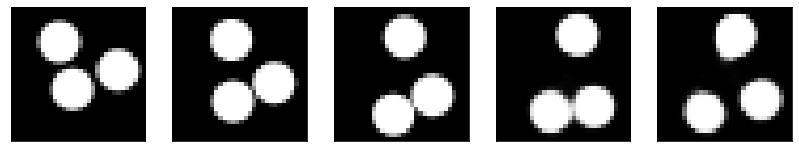

GD iterations:
i=0 | err=53.141857
i=1 | err=52.057289
i=2 | err=50.476700
i=3 | err=48.714172
i=4 | err=46.775330
i=5 | err=44.802429
i=6 | err=42.773399
i=7 | err=40.610413
i=8 | err=38.436218
i=9 | err=36.172836
i=10 | err=33.830597
i=11 | err=31.517525
i=12 | err=29.277786
i=13 | err=27.128113
i=14 | err=24.984612
i=15 | err=22.918808
i=16 | err=21.006477
i=17 | err=19.231213
i=18 | err=17.628887
i=19 | err=16.124853
i=20 | err=14.736973
i=21 | err=13.426490
i=22 | err=12.164406
i=23 | err=11.007690
i=24 | err=9.911019
i=25 | err=8.919838
i=26 | err=7.995834
i=27 | err=7.152605
i=28 | err=6.380142
i=29 | err=5.690228
Epoch=266 (66%) | out_positive=0.918501 | out_negative=0.150842 | mse=0.066076


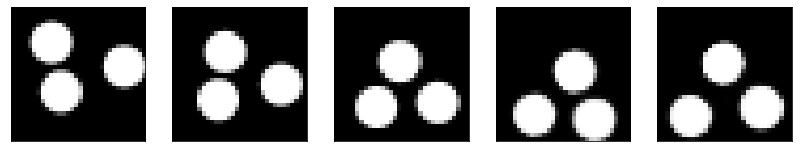

GD iterations:
i=0 | err=52.009384
i=1 | err=50.813042
i=2 | err=49.142220
i=3 | err=47.294758
i=4 | err=45.442783
i=5 | err=43.479256
i=6 | err=41.428329
i=7 | err=39.393307
i=8 | err=37.306610
i=9 | err=35.238754
i=10 | err=33.137814
i=11 | err=31.071404
i=12 | err=28.995674
i=13 | err=27.049646
i=14 | err=25.135134
i=15 | err=23.348747
i=16 | err=21.661097
i=17 | err=20.045319
i=18 | err=18.512688
i=19 | err=17.069731
i=20 | err=15.729640
i=21 | err=14.464663
i=22 | err=13.261251
i=23 | err=12.118069
i=24 | err=11.043372
i=25 | err=10.026703
i=26 | err=9.051488
i=27 | err=8.157234
i=28 | err=7.326843
i=29 | err=6.540217
Epoch=266 (68%) | out_positive=0.924424 | out_negative=0.122699 | mse=0.072399


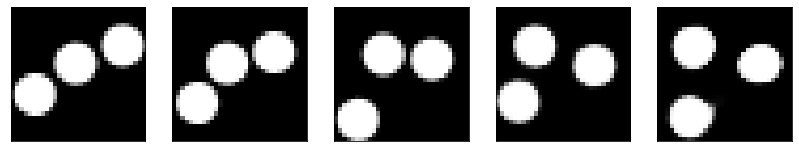

GD iterations:
i=0 | err=55.864822
i=1 | err=54.533489
i=2 | err=52.823143
i=3 | err=50.915073
i=4 | err=48.857094
i=5 | err=46.721512
i=6 | err=44.526367
i=7 | err=42.361885
i=8 | err=40.070877
i=9 | err=37.717941
i=10 | err=35.362286
i=11 | err=33.056805
i=12 | err=30.860041
i=13 | err=28.715759
i=14 | err=26.594265
i=15 | err=24.695667
i=16 | err=22.900724
i=17 | err=21.152355
i=18 | err=19.568371
i=19 | err=18.097048
i=20 | err=16.731285
i=21 | err=15.408422
i=22 | err=14.136249
i=23 | err=12.940095
i=24 | err=11.842522
i=25 | err=10.829910
i=26 | err=9.840125
i=27 | err=8.866749
i=28 | err=7.947313
i=29 | err=7.075591
Epoch=266 (70%) | out_positive=0.844801 | out_negative=0.127711 | mse=0.070633


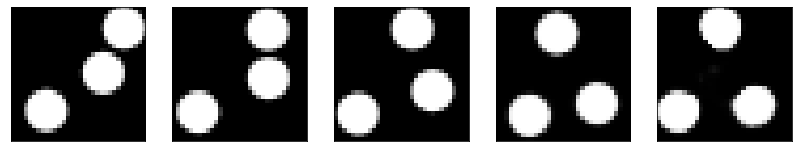

GD iterations:
i=0 | err=52.486969
i=1 | err=51.191715
i=2 | err=49.433205
i=3 | err=47.479996
i=4 | err=45.476833
i=5 | err=43.457962
i=6 | err=41.467308
i=7 | err=39.350128
i=8 | err=37.110706
i=9 | err=34.839436
i=10 | err=32.640148
i=11 | err=30.507105
i=12 | err=28.415825
i=13 | err=26.398823
i=14 | err=24.431339
i=15 | err=22.496311
i=16 | err=20.645943
i=17 | err=18.917152
i=18 | err=17.389385
i=19 | err=15.910518
i=20 | err=14.556464
i=21 | err=13.342889
i=22 | err=12.244356
i=23 | err=11.249413
i=24 | err=10.322045
i=25 | err=9.436323
i=26 | err=8.631998
i=27 | err=7.869569
i=28 | err=7.156008
i=29 | err=6.459805
Epoch=266 (71%) | out_positive=0.847079 | out_negative=0.099231 | mse=0.065793


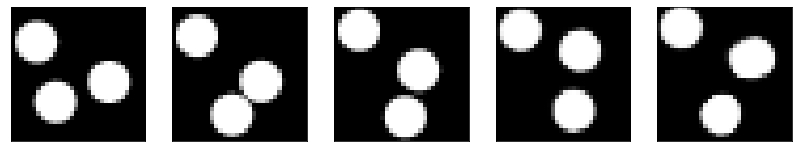

GD iterations:
i=0 | err=58.019478
i=1 | err=56.648766
i=2 | err=54.791260
i=3 | err=52.737190
i=4 | err=50.534927
i=5 | err=48.185234
i=6 | err=45.822479
i=7 | err=43.496628
i=8 | err=41.121490
i=9 | err=38.785240
i=10 | err=36.403755
i=11 | err=34.025482
i=12 | err=31.654808
i=13 | err=29.361801
i=14 | err=27.166561
i=15 | err=25.165939
i=16 | err=23.264950
i=17 | err=21.519142
i=18 | err=19.832596
i=19 | err=18.303614
i=20 | err=16.873558
i=21 | err=15.587326
i=22 | err=14.351173
i=23 | err=13.187708
i=24 | err=12.035633
i=25 | err=10.956790
i=26 | err=9.940501
i=27 | err=9.019718
i=28 | err=8.159637
i=29 | err=7.355021
Epoch=266 (72%) | out_positive=0.863645 | out_negative=0.106412 | mse=0.073817


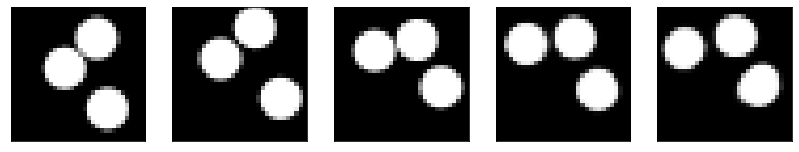

GD iterations:
i=0 | err=53.456467
i=1 | err=52.238647
i=2 | err=50.540642
i=3 | err=48.702427
i=4 | err=46.779228
i=5 | err=44.813969
i=6 | err=42.864571
i=7 | err=40.775795
i=8 | err=38.702782
i=9 | err=36.561653
i=10 | err=34.443573
i=11 | err=32.319550
i=12 | err=30.333647
i=13 | err=28.339064
i=14 | err=26.392128
i=15 | err=24.514771
i=16 | err=22.617401
i=17 | err=20.948168
i=18 | err=19.308220
i=19 | err=17.731575
i=20 | err=16.215218
i=21 | err=14.789417
i=22 | err=13.465708
i=23 | err=12.256603
i=24 | err=11.136314
i=25 | err=10.168608
i=26 | err=9.209007
i=27 | err=8.334846
i=28 | err=7.508912
i=29 | err=6.704968
Epoch=266 (74%) | out_positive=0.912469 | out_negative=0.155568 | mse=0.072999


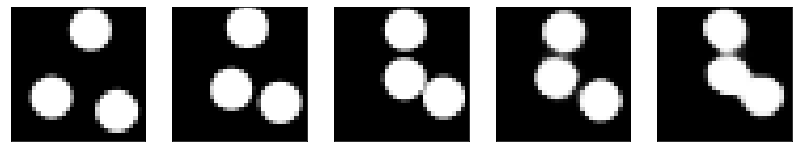

GD iterations:
i=0 | err=55.914360
i=1 | err=54.548752
i=2 | err=52.703674
i=3 | err=50.662010
i=4 | err=48.495140
i=5 | err=46.277653
i=6 | err=44.019836
i=7 | err=41.552452
i=8 | err=39.084007
i=9 | err=36.651028
i=10 | err=34.139954
i=11 | err=31.768700
i=12 | err=29.518929
i=13 | err=27.334396
i=14 | err=25.226536
i=15 | err=23.239832
i=16 | err=21.292070
i=17 | err=19.427721
i=18 | err=17.729820
i=19 | err=16.264507
i=20 | err=14.941685
i=21 | err=13.690968
i=22 | err=12.576061
i=23 | err=11.504183
i=24 | err=10.527874
i=25 | err=9.637238
i=26 | err=8.797749
i=27 | err=8.005800
i=28 | err=7.231256
i=29 | err=6.489098
Epoch=266 (76%) | out_positive=0.859519 | out_negative=0.148768 | mse=0.066230


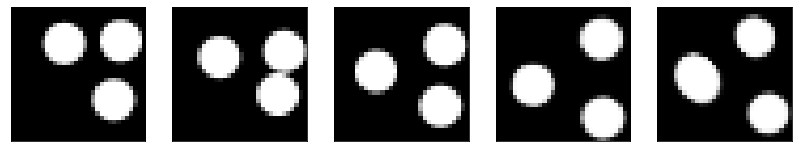

GD iterations:
i=0 | err=56.185745
i=1 | err=54.972752
i=2 | err=53.318005
i=3 | err=51.431358
i=4 | err=49.398903
i=5 | err=47.333694
i=6 | err=45.251701
i=7 | err=43.069130
i=8 | err=40.782230
i=9 | err=38.444180
i=10 | err=36.120003
i=11 | err=33.899391
i=12 | err=31.698971
i=13 | err=29.529213
i=14 | err=27.403276
i=15 | err=25.425362
i=16 | err=23.584276
i=17 | err=21.787683
i=18 | err=20.067646
i=19 | err=18.478127
i=20 | err=16.997379
i=21 | err=15.688855
i=22 | err=14.527205
i=23 | err=13.392931
i=24 | err=12.387055
i=25 | err=11.359932
i=26 | err=10.426250
i=27 | err=9.526671
i=28 | err=8.683887
i=29 | err=7.863704
Epoch=266 (78%) | out_positive=0.863746 | out_negative=0.077944 | mse=0.072210


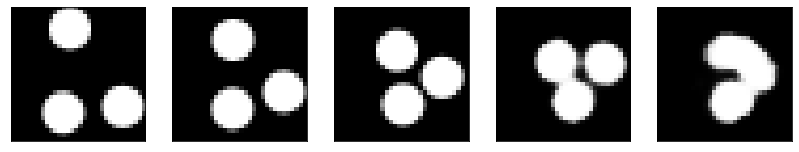

GD iterations:
i=0 | err=57.378204
i=1 | err=56.148994
i=2 | err=54.454941
i=3 | err=52.563759
i=4 | err=50.507446
i=5 | err=48.367256
i=6 | err=46.151752
i=7 | err=43.827168
i=8 | err=41.451691
i=9 | err=39.009884
i=10 | err=36.676842
i=11 | err=34.282089
i=12 | err=31.955418
i=13 | err=29.630642
i=14 | err=27.381964
i=15 | err=25.208328
i=16 | err=23.164278
i=17 | err=21.365923
i=18 | err=19.637543
i=19 | err=18.114529
i=20 | err=16.711922
i=21 | err=15.380779
i=22 | err=14.133750
i=23 | err=12.973200
i=24 | err=11.897169
i=25 | err=10.906169
i=26 | err=9.949743
i=27 | err=9.094082
i=28 | err=8.218779
i=29 | err=7.439154
Epoch=266 (80%) | out_positive=0.845786 | out_negative=0.062919 | mse=0.079731


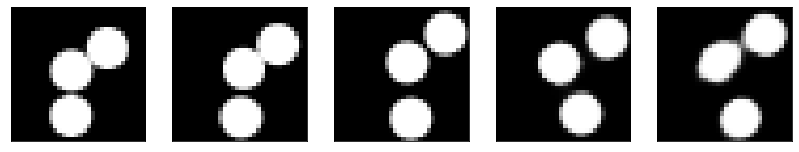

GD iterations:
i=0 | err=54.307510
i=1 | err=53.070724
i=2 | err=51.332417
i=3 | err=49.440460
i=4 | err=47.449085
i=5 | err=45.377937
i=6 | err=43.247124
i=7 | err=41.043961
i=8 | err=38.981873
i=9 | err=36.877758
i=10 | err=34.758812
i=11 | err=32.636086
i=12 | err=30.607353
i=13 | err=28.581429
i=14 | err=26.726814
i=15 | err=24.876549
i=16 | err=23.095966
i=17 | err=21.290585
i=18 | err=19.669231
i=19 | err=18.171581
i=20 | err=16.744194
i=21 | err=15.373191
i=22 | err=14.083508
i=23 | err=12.856047
i=24 | err=11.675997
i=25 | err=10.556843
i=26 | err=9.537639
i=27 | err=8.607664
i=28 | err=7.752093
i=29 | err=6.939075
Epoch=266 (82%) | out_positive=0.879330 | out_negative=0.110004 | mse=0.072559


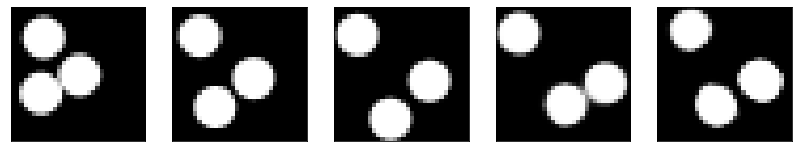

GD iterations:
i=0 | err=53.293015
i=1 | err=52.169510
i=2 | err=50.609516
i=3 | err=48.880684
i=4 | err=46.994637
i=5 | err=45.043026
i=6 | err=42.909031
i=7 | err=40.721676
i=8 | err=38.462208
i=9 | err=36.363087
i=10 | err=34.224289
i=11 | err=32.064194
i=12 | err=29.989893
i=13 | err=27.919376
i=14 | err=25.865654
i=15 | err=23.906841
i=16 | err=22.034231
i=17 | err=20.228251
i=18 | err=18.558290
i=19 | err=17.052418
i=20 | err=15.662885
i=21 | err=14.360975
i=22 | err=13.157863
i=23 | err=12.022579
i=24 | err=10.930332
i=25 | err=9.897056
i=26 | err=8.957085
i=27 | err=8.101414
i=28 | err=7.323124
i=29 | err=6.582177
Epoch=266 (83%) | out_positive=0.906980 | out_negative=0.120705 | mse=0.075937


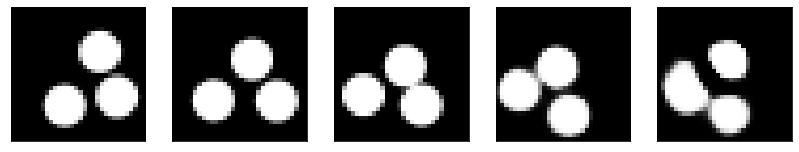

GD iterations:
i=0 | err=57.534828
i=1 | err=56.233021
i=2 | err=54.507545
i=3 | err=52.576431
i=4 | err=50.534698
i=5 | err=48.380516
i=6 | err=46.141655
i=7 | err=43.835163
i=8 | err=41.473263
i=9 | err=39.101505
i=10 | err=36.681633
i=11 | err=34.297352
i=12 | err=32.025429
i=13 | err=29.747776
i=14 | err=27.564013
i=15 | err=25.448053
i=16 | err=23.566160
i=17 | err=21.735565
i=18 | err=20.005333
i=19 | err=18.417427
i=20 | err=16.883421
i=21 | err=15.489263
i=22 | err=14.224897
i=23 | err=13.041034
i=24 | err=11.929415
i=25 | err=10.873525
i=26 | err=9.849067
i=27 | err=8.915364
i=28 | err=8.048926
i=29 | err=7.241991
Epoch=266 (85%) | out_positive=0.831561 | out_negative=0.084311 | mse=0.071293


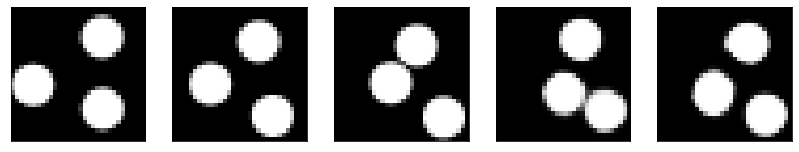

GD iterations:
i=0 | err=53.510319
i=1 | err=52.234764
i=2 | err=50.348274
i=3 | err=48.322121
i=4 | err=46.073856
i=5 | err=43.836990
i=6 | err=41.553047
i=7 | err=39.281235
i=8 | err=36.939766
i=9 | err=34.522614
i=10 | err=32.051075
i=11 | err=29.613758
i=12 | err=27.270174
i=13 | err=25.093229
i=14 | err=23.034405
i=15 | err=21.134628
i=16 | err=19.378002
i=17 | err=17.779928
i=18 | err=16.325790
i=19 | err=14.965324
i=20 | err=13.671306
i=21 | err=12.483191
i=22 | err=11.384943
i=23 | err=10.408465
i=24 | err=9.521999
i=25 | err=8.696478
i=26 | err=7.916019
i=27 | err=7.187393
i=28 | err=6.476503
i=29 | err=5.787049
Epoch=266 (87%) | out_positive=0.888876 | out_negative=0.154640 | mse=0.069728


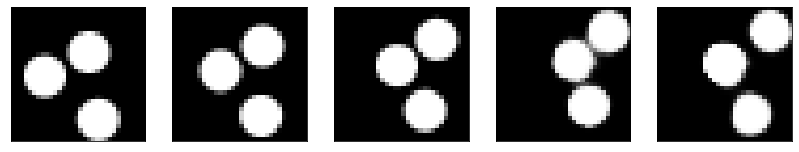

GD iterations:
i=0 | err=52.712551
i=1 | err=51.553909
i=2 | err=49.873745
i=3 | err=48.008766
i=4 | err=46.027924
i=5 | err=43.957020
i=6 | err=41.798424
i=7 | err=39.542942
i=8 | err=37.337120
i=9 | err=35.113434
i=10 | err=32.908840
i=11 | err=30.774555
i=12 | err=28.689438
i=13 | err=26.635836
i=14 | err=24.617193
i=15 | err=22.786253
i=16 | err=21.069920
i=17 | err=19.439503
i=18 | err=17.904129
i=19 | err=16.521328
i=20 | err=15.278133
i=21 | err=14.098722
i=22 | err=12.997719
i=23 | err=11.988295
i=24 | err=11.048107
i=25 | err=10.178894
i=26 | err=9.344789
i=27 | err=8.563581
i=28 | err=7.814176
i=29 | err=7.105372
Epoch=266 (89%) | out_positive=0.915677 | out_negative=0.122483 | mse=0.074118


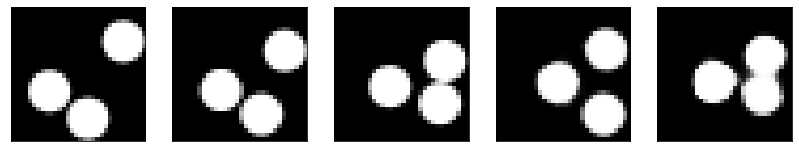

GD iterations:
i=0 | err=50.987907
i=1 | err=49.897591
i=2 | err=48.251816
i=3 | err=46.546478
i=4 | err=44.760338
i=5 | err=42.880638
i=6 | err=40.866966
i=7 | err=38.844231
i=8 | err=36.784687
i=9 | err=34.705070
i=10 | err=32.563267
i=11 | err=30.446587
i=12 | err=28.401062
i=13 | err=26.479670
i=14 | err=24.680202
i=15 | err=22.911053
i=16 | err=21.209850
i=17 | err=19.586859
i=18 | err=18.053633
i=19 | err=16.621859
i=20 | err=15.305514
i=21 | err=14.101658
i=22 | err=12.989560
i=23 | err=11.957140
i=24 | err=10.986431
i=25 | err=10.062288
i=26 | err=9.145800
i=27 | err=8.296782
i=28 | err=7.497080
i=29 | err=6.754545
Epoch=266 (91%) | out_positive=0.855706 | out_negative=0.118308 | mse=0.075435


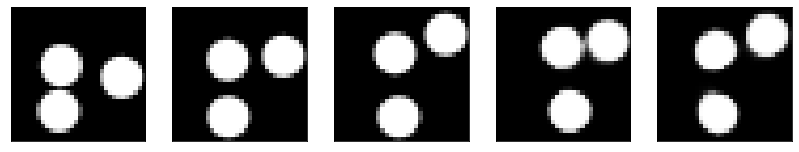

GD iterations:
i=0 | err=54.163197
i=1 | err=52.933971
i=2 | err=51.202644
i=3 | err=49.152046
i=4 | err=46.983418
i=5 | err=44.782185
i=6 | err=42.559578
i=7 | err=40.288933
i=8 | err=38.048859
i=9 | err=35.805351
i=10 | err=33.644585
i=11 | err=31.599506
i=12 | err=29.576056
i=13 | err=27.615982
i=14 | err=25.782799
i=15 | err=23.969597
i=16 | err=22.272694
i=17 | err=20.680698
i=18 | err=19.211317
i=19 | err=17.806370
i=20 | err=16.452538
i=21 | err=15.147650
i=22 | err=13.932684
i=23 | err=12.809137
i=24 | err=11.746185
i=25 | err=10.757288
i=26 | err=9.838414
i=27 | err=8.989159
i=28 | err=8.163444
i=29 | err=7.422494
Epoch=266 (92%) | out_positive=0.878293 | out_negative=0.130504 | mse=0.070211


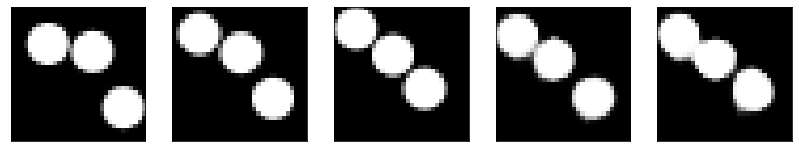

GD iterations:
i=0 | err=49.249363
i=1 | err=48.093224
i=2 | err=46.564114
i=3 | err=44.761631
i=4 | err=42.893700
i=5 | err=40.927261
i=6 | err=38.971481
i=7 | err=36.859333
i=8 | err=34.815506
i=9 | err=32.789452
i=10 | err=30.782114
i=11 | err=28.745525
i=12 | err=26.806398
i=13 | err=24.984896
i=14 | err=23.248276
i=15 | err=21.659063
i=16 | err=20.136024
i=17 | err=18.700756
i=18 | err=17.328028
i=19 | err=16.044607
i=20 | err=14.848541
i=21 | err=13.727837
i=22 | err=12.677238
i=23 | err=11.752447
i=24 | err=10.859900
i=25 | err=10.068045
i=26 | err=9.305025
i=27 | err=8.581249
i=28 | err=7.878222
i=29 | err=7.196826
Epoch=266 (94%) | out_positive=0.889079 | out_negative=0.127114 | mse=0.069194


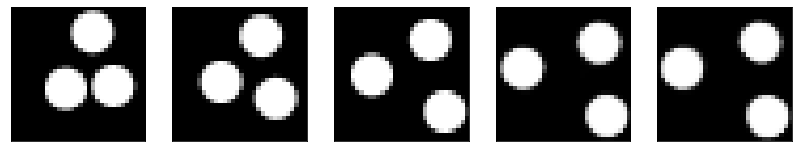

GD iterations:
i=0 | err=56.397331
i=1 | err=55.170341
i=2 | err=53.506783
i=3 | err=51.680542
i=4 | err=49.675095
i=5 | err=47.720745
i=6 | err=45.691139
i=7 | err=43.663940
i=8 | err=41.611610
i=9 | err=39.461739
i=10 | err=37.265804
i=11 | err=35.004429
i=12 | err=32.658840
i=13 | err=30.362906
i=14 | err=28.114262
i=15 | err=25.865036
i=16 | err=23.642361
i=17 | err=21.626778
i=18 | err=19.724211
i=19 | err=18.051117
i=20 | err=16.577688
i=21 | err=15.234930
i=22 | err=13.966541
i=23 | err=12.800400
i=24 | err=11.720297
i=25 | err=10.726801
i=26 | err=9.815260
i=27 | err=8.972958
i=28 | err=8.156839
i=29 | err=7.397706
Epoch=266 (96%) | out_positive=0.803195 | out_negative=0.093264 | mse=0.071698


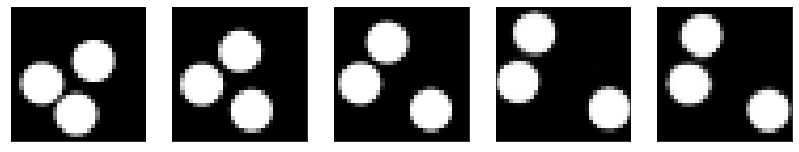

GD iterations:
i=0 | err=52.721397
i=1 | err=51.582306
i=2 | err=49.926968
i=3 | err=48.051826
i=4 | err=46.101028
i=5 | err=44.037792
i=6 | err=41.942814
i=7 | err=39.833664
i=8 | err=37.672783
i=9 | err=35.515350
i=10 | err=33.314129
i=11 | err=31.095594
i=12 | err=28.887508
i=13 | err=26.730923
i=14 | err=24.640600
i=15 | err=22.681499
i=16 | err=20.955475
i=17 | err=19.309793
i=18 | err=17.801804
i=19 | err=16.395092
i=20 | err=15.065519
i=21 | err=13.873568
i=22 | err=12.764992
i=23 | err=11.751326
i=24 | err=10.805421
i=25 | err=9.884464
i=26 | err=9.007641
i=27 | err=8.171825
i=28 | err=7.390664
i=29 | err=6.612990
Epoch=266 (98%) | out_positive=0.883930 | out_negative=0.141367 | mse=0.070238


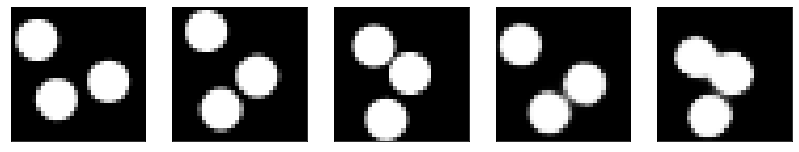

GD iterations:
i=0 | err=45.501999
i=1 | err=44.506084
i=2 | err=43.188667
i=3 | err=41.612320
i=4 | err=40.181419
i=5 | err=38.729630
i=6 | err=37.302315
i=7 | err=35.563374
i=8 | err=33.817574
i=9 | err=32.101551
i=10 | err=30.424494
i=11 | err=28.700191
i=12 | err=26.866024
i=13 | err=24.980446
i=14 | err=23.298351
i=15 | err=21.762066
i=16 | err=20.310917
i=17 | err=18.804310
i=18 | err=17.254028
i=19 | err=15.837880
i=20 | err=14.472668
i=21 | err=13.308359
i=22 | err=12.190220
i=23 | err=11.139800
i=24 | err=10.089615
i=25 | err=9.118483
i=26 | err=8.186563
i=27 | err=7.339538
i=28 | err=6.576896
i=29 | err=5.847965
Epoch=266 (100%) | out_positive=0.975519 | out_negative=0.071798 | mse=0.083543


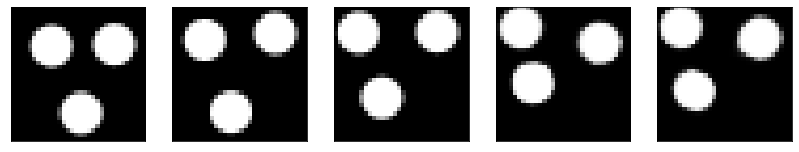

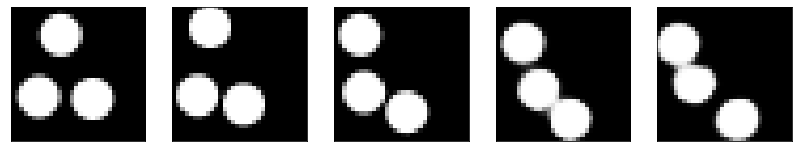

Test MSE 0.079280


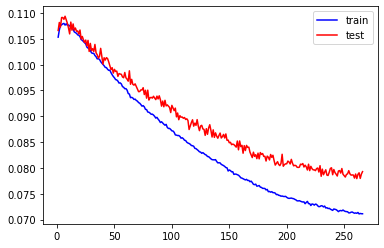

GD iterations:
i=0 | err=52.226692
i=1 | err=50.889763
i=2 | err=49.171589
i=3 | err=47.166412
i=4 | err=45.106613
i=5 | err=42.997353
i=6 | err=40.817398
i=7 | err=38.598732
i=8 | err=36.325348
i=9 | err=34.146030
i=10 | err=31.999352
i=11 | err=29.907383
i=12 | err=27.839691
i=13 | err=25.861010
i=14 | err=23.916897
i=15 | err=22.067036
i=16 | err=20.323990
i=17 | err=18.709225
i=18 | err=17.177505
i=19 | err=15.728764
i=20 | err=14.409251
i=21 | err=13.168690
i=22 | err=12.058731
i=23 | err=11.000000
i=24 | err=10.015972
i=25 | err=9.093575
i=26 | err=8.228036
i=27 | err=7.421904
i=28 | err=6.684076
i=29 | err=5.990753
Epoch=267 (0%) | out_positive=0.901941 | out_negative=0.131912 | mse=0.068607


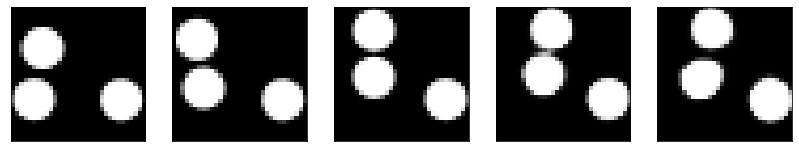

GD iterations:
i=0 | err=57.069775
i=1 | err=55.875435
i=2 | err=54.134163
i=3 | err=52.158215
i=4 | err=50.114487
i=5 | err=48.011406
i=6 | err=45.836628
i=7 | err=43.567329
i=8 | err=41.179256
i=9 | err=38.817711
i=10 | err=36.500595
i=11 | err=34.202133
i=12 | err=31.884716
i=13 | err=29.698586
i=14 | err=27.591354
i=15 | err=25.627108
i=16 | err=23.780733
i=17 | err=22.017504
i=18 | err=20.388317
i=19 | err=18.882862
i=20 | err=17.417610
i=21 | err=16.065781
i=22 | err=14.811400
i=23 | err=13.646371
i=24 | err=12.511824
i=25 | err=11.437486
i=26 | err=10.375775
i=27 | err=9.370917
i=28 | err=8.449436
i=29 | err=7.596680
Epoch=267 (2%) | out_positive=0.877782 | out_negative=0.137056 | mse=0.076083


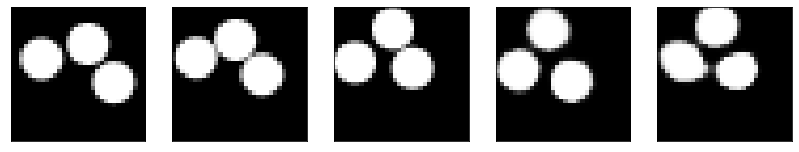

GD iterations:
i=0 | err=57.329266
i=1 | err=56.007370
i=2 | err=54.192787
i=3 | err=52.190750
i=4 | err=50.013458
i=5 | err=47.734005
i=6 | err=45.427601
i=7 | err=43.061260
i=8 | err=40.554329
i=9 | err=38.101280
i=10 | err=35.669880
i=11 | err=33.292542
i=12 | err=30.959759
i=13 | err=28.674082
i=14 | err=26.517920
i=15 | err=24.529009
i=16 | err=22.744812
i=17 | err=21.123652
i=18 | err=19.664072
i=19 | err=18.274849
i=20 | err=16.947231
i=21 | err=15.666770
i=22 | err=14.416209
i=23 | err=13.273889
i=24 | err=12.237539
i=25 | err=11.232058
i=26 | err=10.276758
i=27 | err=9.324486
i=28 | err=8.447702
i=29 | err=7.644034
Epoch=267 (4%) | out_positive=0.859286 | out_negative=0.070321 | mse=0.070050


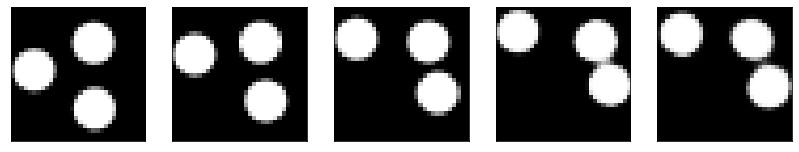

GD iterations:
i=0 | err=59.881325
i=1 | err=58.636230
i=2 | err=56.918247
i=3 | err=54.957642
i=4 | err=52.816467
i=5 | err=50.613419
i=6 | err=48.386440
i=7 | err=46.043953
i=8 | err=43.619587
i=9 | err=41.170555
i=10 | err=38.726387
i=11 | err=36.188980
i=12 | err=33.752285
i=13 | err=31.364929
i=14 | err=29.064278
i=15 | err=26.846439
i=16 | err=24.684128
i=17 | err=22.662525
i=18 | err=20.756586
i=19 | err=19.016443
i=20 | err=17.393785
i=21 | err=15.902275
i=22 | err=14.517076
i=23 | err=13.270905
i=24 | err=12.143711
i=25 | err=11.048498
i=26 | err=9.998720
i=27 | err=8.988277
i=28 | err=7.996193
i=29 | err=7.087781
Epoch=267 (6%) | out_positive=0.868822 | out_negative=0.121741 | mse=0.072531


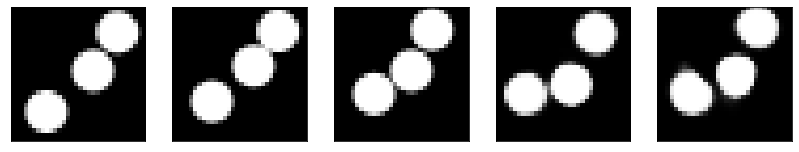

GD iterations:
i=0 | err=53.066185
i=1 | err=51.873199
i=2 | err=50.228359
i=3 | err=48.402962
i=4 | err=46.469097
i=5 | err=44.462189
i=6 | err=42.306633
i=7 | err=40.042343
i=8 | err=37.640297
i=9 | err=35.332668
i=10 | err=33.022491
i=11 | err=30.746384
i=12 | err=28.461948
i=13 | err=26.225512
i=14 | err=24.097565
i=15 | err=22.123087
i=16 | err=20.255192
i=17 | err=18.535618
i=18 | err=16.967739
i=19 | err=15.526119
i=20 | err=14.175738
i=21 | err=12.976862
i=22 | err=11.855374
i=23 | err=10.809308
i=24 | err=9.865528
i=25 | err=8.945395
i=26 | err=8.100243
i=27 | err=7.257868
i=28 | err=6.511304
i=29 | err=5.778095
Epoch=267 (8%) | out_positive=0.906560 | out_negative=0.167655 | mse=0.066456


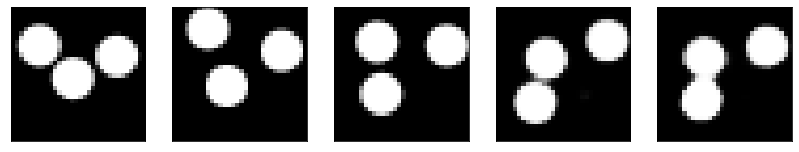

GD iterations:
i=0 | err=56.472931
i=1 | err=55.046402
i=2 | err=53.113461
i=3 | err=50.969463
i=4 | err=48.773613
i=5 | err=46.398811
i=6 | err=43.965488
i=7 | err=41.489197
i=8 | err=39.041519
i=9 | err=36.602859
i=10 | err=34.160210
i=11 | err=31.716738
i=12 | err=29.395132
i=13 | err=27.217968
i=14 | err=25.204187
i=15 | err=23.338072
i=16 | err=21.658886
i=17 | err=20.034576
i=18 | err=18.462769
i=19 | err=16.977108
i=20 | err=15.544622
i=21 | err=14.233097
i=22 | err=12.976826
i=23 | err=11.794653
i=24 | err=10.726963
i=25 | err=9.729172
i=26 | err=8.818211
i=27 | err=7.970687
i=28 | err=7.149954
i=29 | err=6.377081
Epoch=267 (9%) | out_positive=0.788825 | out_negative=0.104802 | mse=0.066787


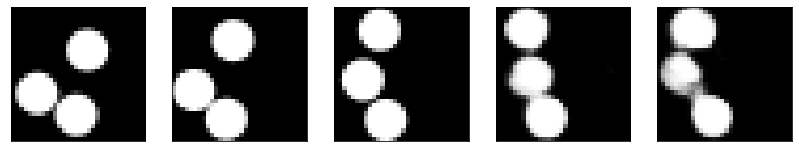

GD iterations:
i=0 | err=53.259575
i=1 | err=51.984207
i=2 | err=50.128883
i=3 | err=48.122303
i=4 | err=45.972786
i=5 | err=43.676941
i=6 | err=41.353256
i=7 | err=38.988197
i=8 | err=36.613167
i=9 | err=34.358391
i=10 | err=32.145393
i=11 | err=29.958582
i=12 | err=27.872108
i=13 | err=25.934589
i=14 | err=24.092972
i=15 | err=22.428707
i=16 | err=20.906631
i=17 | err=19.497574
i=18 | err=18.142525
i=19 | err=16.867161
i=20 | err=15.658321
i=21 | err=14.551014
i=22 | err=13.509342
i=23 | err=12.526720
i=24 | err=11.595013
i=25 | err=10.696554
i=26 | err=9.831575
i=27 | err=9.008415
i=28 | err=8.213413
i=29 | err=7.445919
Epoch=267 (11%) | out_positive=0.828141 | out_negative=0.108251 | mse=0.072844


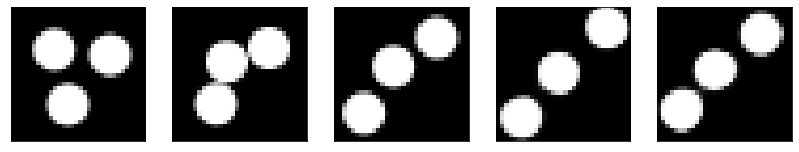

GD iterations:
i=0 | err=54.325920
i=1 | err=53.101494
i=2 | err=51.406944
i=3 | err=49.524048
i=4 | err=47.618752
i=5 | err=45.653648
i=6 | err=43.663116
i=7 | err=41.618034
i=8 | err=39.525265
i=9 | err=37.412155
i=10 | err=35.267338
i=11 | err=33.031296
i=12 | err=30.807304
i=13 | err=28.734093
i=14 | err=26.845776
i=15 | err=25.108704
i=16 | err=23.485130
i=17 | err=21.917410
i=18 | err=20.383469
i=19 | err=18.921505
i=20 | err=17.509243
i=21 | err=16.146219
i=22 | err=14.845182
i=23 | err=13.608448
i=24 | err=12.457057
i=25 | err=11.380024
i=26 | err=10.342016
i=27 | err=9.362727
i=28 | err=8.450848
i=29 | err=7.588899
Epoch=267 (13%) | out_positive=0.889765 | out_negative=0.112368 | mse=0.068993


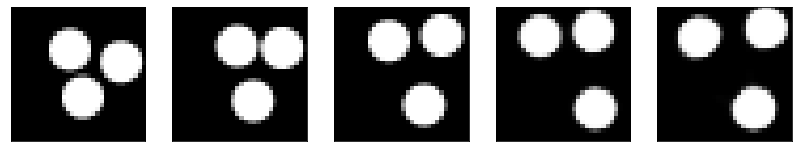

GD iterations:
i=0 | err=55.927395
i=1 | err=54.676529
i=2 | err=53.145187
i=3 | err=51.391003
i=4 | err=49.546944
i=5 | err=47.553902
i=6 | err=45.561077
i=7 | err=43.393921
i=8 | err=41.128605
i=9 | err=38.872742
i=10 | err=36.582417
i=11 | err=34.254547
i=12 | err=31.993963
i=13 | err=29.790989
i=14 | err=27.597519
i=15 | err=25.556454
i=16 | err=23.601147
i=17 | err=21.772417
i=18 | err=20.023933
i=19 | err=18.353317
i=20 | err=16.719498
i=21 | err=15.255944
i=22 | err=13.907100
i=23 | err=12.658510
i=24 | err=11.487474
i=25 | err=10.350491
i=26 | err=9.304348
i=27 | err=8.334316
i=28 | err=7.419616
i=29 | err=6.575706
Epoch=267 (15%) | out_positive=0.881233 | out_negative=0.134474 | mse=0.070274


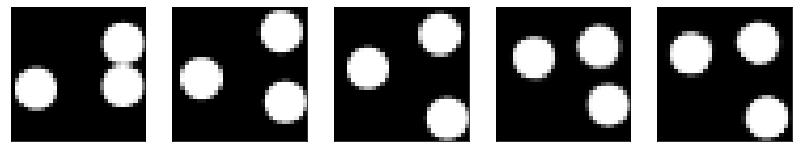

GD iterations:
i=0 | err=55.927361
i=1 | err=54.754486
i=2 | err=53.184578
i=3 | err=51.387787
i=4 | err=49.313293
i=5 | err=47.135059
i=6 | err=44.923752
i=7 | err=42.719986
i=8 | err=40.449684
i=9 | err=38.252762
i=10 | err=36.033848
i=11 | err=33.808624
i=12 | err=31.636047
i=13 | err=29.541136
i=14 | err=27.496494
i=15 | err=25.509262
i=16 | err=23.642319
i=17 | err=21.947649
i=18 | err=20.395218
i=19 | err=18.846523
i=20 | err=17.349064
i=21 | err=15.908727
i=22 | err=14.613763
i=23 | err=13.401666
i=24 | err=12.295856
i=25 | err=11.241457
i=26 | err=10.229906
i=27 | err=9.253139
i=28 | err=8.331592
i=29 | err=7.450431
Epoch=267 (17%) | out_positive=0.936132 | out_negative=0.149790 | mse=0.077474


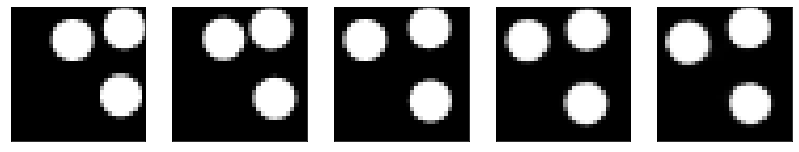

GD iterations:
i=0 | err=54.236916
i=1 | err=53.049374
i=2 | err=51.412968
i=3 | err=49.517471
i=4 | err=47.573883
i=5 | err=45.522686
i=6 | err=43.461960
i=7 | err=41.358154
i=8 | err=39.146427
i=9 | err=36.949028
i=10 | err=34.721664
i=11 | err=32.476990
i=12 | err=30.294399
i=13 | err=28.156067
i=14 | err=26.102077
i=15 | err=24.084076
i=16 | err=22.217041
i=17 | err=20.481728
i=18 | err=18.812464
i=19 | err=17.293793
i=20 | err=15.917287
i=21 | err=14.660581
i=22 | err=13.457082
i=23 | err=12.302996
i=24 | err=11.232894
i=25 | err=10.247156
i=26 | err=9.348351
i=27 | err=8.528101
i=28 | err=7.730852
i=29 | err=6.953580
Epoch=267 (19%) | out_positive=0.917521 | out_negative=0.157428 | mse=0.075866


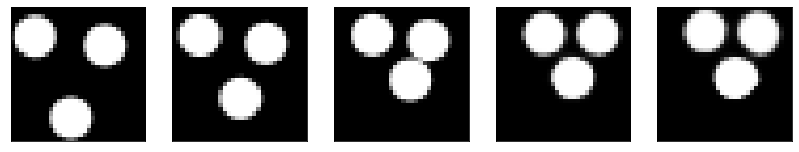

GD iterations:
i=0 | err=54.570343
i=1 | err=53.289398
i=2 | err=51.464180
i=3 | err=49.430367
i=4 | err=47.255646
i=5 | err=44.995945
i=6 | err=42.678329
i=7 | err=40.360008
i=8 | err=37.991249
i=9 | err=35.709290
i=10 | err=33.446976
i=11 | err=31.113659
i=12 | err=28.946701
i=13 | err=26.899689
i=14 | err=24.966774
i=15 | err=23.100201
i=16 | err=21.252888
i=17 | err=19.476212
i=18 | err=17.895443
i=19 | err=16.443802
i=20 | err=15.121027
i=21 | err=13.844047
i=22 | err=12.675825
i=23 | err=11.608587
i=24 | err=10.646286
i=25 | err=9.728838
i=26 | err=8.902604
i=27 | err=8.101601
i=28 | err=7.347388
i=29 | err=6.651015
Epoch=267 (20%) | out_positive=0.849027 | out_negative=0.091484 | mse=0.075626


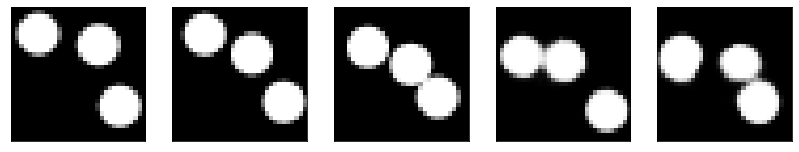

GD iterations:
i=0 | err=56.216103
i=1 | err=54.999931
i=2 | err=53.288597
i=3 | err=51.398346
i=4 | err=49.299263
i=5 | err=47.129299
i=6 | err=44.875191
i=7 | err=42.638577
i=8 | err=40.336060
i=9 | err=38.035065
i=10 | err=35.716690
i=11 | err=33.245102
i=12 | err=30.810265
i=13 | err=28.480570
i=14 | err=26.266962
i=15 | err=24.249149
i=16 | err=22.313520
i=17 | err=20.480614
i=18 | err=18.816122
i=19 | err=17.283817
i=20 | err=15.876266
i=21 | err=14.600729
i=22 | err=13.440037
i=23 | err=12.328877
i=24 | err=11.295855
i=25 | err=10.320364
i=26 | err=9.417438
i=27 | err=8.579950
i=28 | err=7.810166
i=29 | err=7.066803
Epoch=267 (22%) | out_positive=0.820444 | out_negative=0.136230 | mse=0.067856


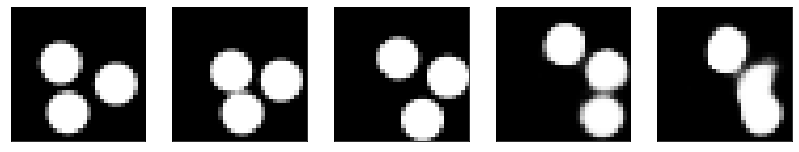

GD iterations:
i=0 | err=52.920048
i=1 | err=51.548470
i=2 | err=49.721519
i=3 | err=47.663651
i=4 | err=45.527832
i=5 | err=43.361584
i=6 | err=41.205643
i=7 | err=39.073845
i=8 | err=36.878895
i=9 | err=34.681030
i=10 | err=32.506844
i=11 | err=30.349365
i=12 | err=28.172192
i=13 | err=26.105686
i=14 | err=24.106384
i=15 | err=22.165726
i=16 | err=20.365856
i=17 | err=18.652584
i=18 | err=17.025421
i=19 | err=15.550972
i=20 | err=14.156947
i=21 | err=12.844992
i=22 | err=11.650170
i=23 | err=10.537860
i=24 | err=9.542982
i=25 | err=8.627057
i=26 | err=7.781976
i=27 | err=7.026599
i=28 | err=6.326574
i=29 | err=5.676671
Epoch=267 (24%) | out_positive=0.914129 | out_negative=0.138840 | mse=0.067095


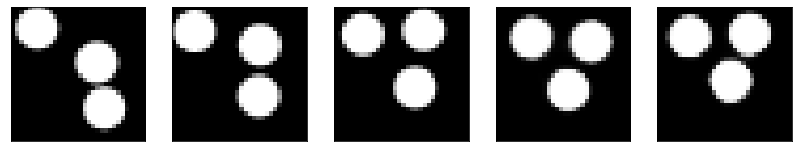

GD iterations:
i=0 | err=54.785892
i=1 | err=53.492214
i=2 | err=51.799881
i=3 | err=49.975067
i=4 | err=47.986191
i=5 | err=46.027233
i=6 | err=44.002106
i=7 | err=41.952202
i=8 | err=39.852524
i=9 | err=37.771500
i=10 | err=35.647427
i=11 | err=33.605030
i=12 | err=31.514097
i=13 | err=29.407068
i=14 | err=27.306747
i=15 | err=25.173416
i=16 | err=23.229618
i=17 | err=21.398958
i=18 | err=19.714991
i=19 | err=18.123365
i=20 | err=16.587513
i=21 | err=15.126023
i=22 | err=13.839899
i=23 | err=12.656870
i=24 | err=11.585013
i=25 | err=10.574886
i=26 | err=9.616983
i=27 | err=8.681936
i=28 | err=7.789306
i=29 | err=6.947820
Epoch=267 (26%) | out_positive=0.844177 | out_negative=0.098045 | mse=0.071632


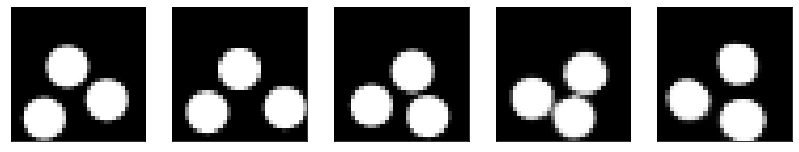

GD iterations:
i=0 | err=54.792038
i=1 | err=53.563560
i=2 | err=51.912949
i=3 | err=50.041821
i=4 | err=48.079216
i=5 | err=45.907272
i=6 | err=43.713428
i=7 | err=41.476753
i=8 | err=39.218601
i=9 | err=36.834652
i=10 | err=34.400871
i=11 | err=32.048569
i=12 | err=29.738689
i=13 | err=27.532360
i=14 | err=25.338369
i=15 | err=23.330112
i=16 | err=21.459570
i=17 | err=19.805578
i=18 | err=18.320646
i=19 | err=16.946470
i=20 | err=15.627189
i=21 | err=14.412062
i=22 | err=13.310400
i=23 | err=12.260446
i=24 | err=11.307621
i=25 | err=10.410928
i=26 | err=9.586042
i=27 | err=8.829479
i=28 | err=8.116017
i=29 | err=7.442387
Epoch=267 (28%) | out_positive=0.849005 | out_negative=0.100104 | mse=0.071032


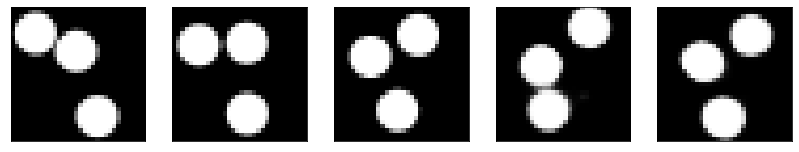

GD iterations:
i=0 | err=54.290733
i=1 | err=53.089058
i=2 | err=51.443916
i=3 | err=49.628868
i=4 | err=47.727577
i=5 | err=45.726360
i=6 | err=43.613594
i=7 | err=41.358337
i=8 | err=39.121201
i=9 | err=36.885487
i=10 | err=34.665192
i=11 | err=32.478977
i=12 | err=30.373722
i=13 | err=28.362911
i=14 | err=26.350327
i=15 | err=24.408024
i=16 | err=22.507359
i=17 | err=20.723141
i=18 | err=19.081734
i=19 | err=17.568829
i=20 | err=16.165785
i=21 | err=14.910114
i=22 | err=13.733473
i=23 | err=12.653543
i=24 | err=11.649040
i=25 | err=10.673041
i=26 | err=9.755131
i=27 | err=8.900919
i=28 | err=8.110484
i=29 | err=7.355391
Epoch=267 (30%) | out_positive=0.894209 | out_negative=0.118804 | mse=0.073339


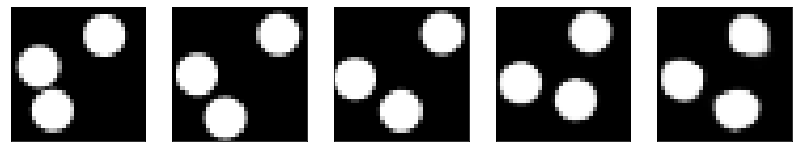

GD iterations:
i=0 | err=56.624352
i=1 | err=55.437786
i=2 | err=53.674988
i=3 | err=51.761383
i=4 | err=49.819595
i=5 | err=47.764297
i=6 | err=45.651321
i=7 | err=43.482979
i=8 | err=41.221748
i=9 | err=38.942421
i=10 | err=36.636208
i=11 | err=34.334839
i=12 | err=31.985495
i=13 | err=29.705263
i=14 | err=27.531357
i=15 | err=25.429735
i=16 | err=23.410881
i=17 | err=21.529102
i=18 | err=19.780216
i=19 | err=18.106712
i=20 | err=16.614363
i=21 | err=15.248631
i=22 | err=14.023647
i=23 | err=12.923420
i=24 | err=11.885038
i=25 | err=10.907814
i=26 | err=9.932888
i=27 | err=8.995470
i=28 | err=8.075992
i=29 | err=7.217041
Epoch=267 (32%) | out_positive=0.852783 | out_negative=0.123597 | mse=0.072867


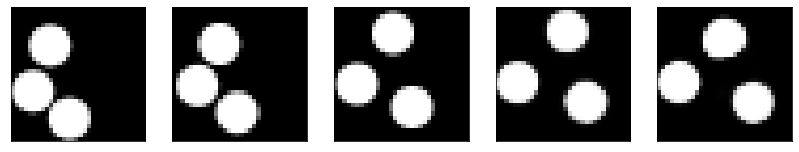

GD iterations:
i=0 | err=57.931526
i=1 | err=56.713573
i=2 | err=54.989746
i=3 | err=53.007744
i=4 | err=50.946930
i=5 | err=48.711628
i=6 | err=46.469971
i=7 | err=44.212006
i=8 | err=41.939735
i=9 | err=39.717911
i=10 | err=37.466915
i=11 | err=35.062111
i=12 | err=32.636925
i=13 | err=30.291056
i=14 | err=28.025673
i=15 | err=25.796591
i=16 | err=23.716755
i=17 | err=21.797890
i=18 | err=20.101023
i=19 | err=18.503742
i=20 | err=17.010708
i=21 | err=15.643191
i=22 | err=14.352825
i=23 | err=13.156602
i=24 | err=12.071962
i=25 | err=11.040421
i=26 | err=10.050104
i=27 | err=9.111519
i=28 | err=8.222163
i=29 | err=7.364964
Epoch=267 (33%) | out_positive=0.790272 | out_negative=0.118269 | mse=0.069619


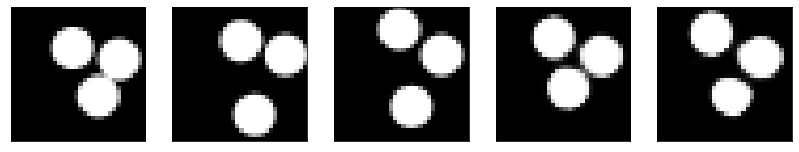

GD iterations:
i=0 | err=54.782757
i=1 | err=53.549198
i=2 | err=51.850494
i=3 | err=49.953735
i=4 | err=47.904236
i=5 | err=45.771126
i=6 | err=43.693726
i=7 | err=41.540459
i=8 | err=39.356415
i=9 | err=37.157532
i=10 | err=35.014427
i=11 | err=32.873104
i=12 | err=30.752773
i=13 | err=28.699081
i=14 | err=26.771152
i=15 | err=24.910515
i=16 | err=23.086529
i=17 | err=21.350552
i=18 | err=19.718361
i=19 | err=18.166691
i=20 | err=16.729103
i=21 | err=15.366312
i=22 | err=14.086872
i=23 | err=12.909353
i=24 | err=11.798916
i=25 | err=10.759968
i=26 | err=9.756255
i=27 | err=8.803963
i=28 | err=7.893380
i=29 | err=7.033745
Epoch=267 (35%) | out_positive=0.917261 | out_negative=0.121821 | mse=0.071247


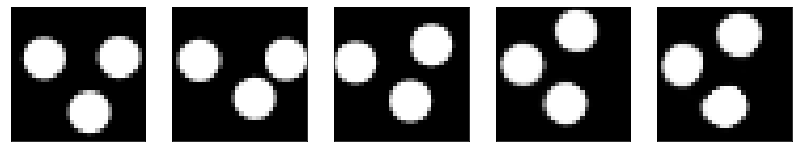

GD iterations:
i=0 | err=57.923805
i=1 | err=56.452717
i=2 | err=54.582787
i=3 | err=52.442245
i=4 | err=50.108978
i=5 | err=47.731628
i=6 | err=45.253593
i=7 | err=42.798367
i=8 | err=40.299541
i=9 | err=37.905365
i=10 | err=35.541008
i=11 | err=33.272415
i=12 | err=31.065804
i=13 | err=28.946587
i=14 | err=26.877211
i=15 | err=24.964884
i=16 | err=23.177155
i=17 | err=21.536194
i=18 | err=19.983757
i=19 | err=18.526804
i=20 | err=17.109518
i=21 | err=15.756851
i=22 | err=14.490086
i=23 | err=13.281151
i=24 | err=12.169592
i=25 | err=11.096041
i=26 | err=10.051610
i=27 | err=9.052075
i=28 | err=8.065886
i=29 | err=7.147139
Epoch=267 (37%) | out_positive=0.882263 | out_negative=0.115580 | mse=0.071815


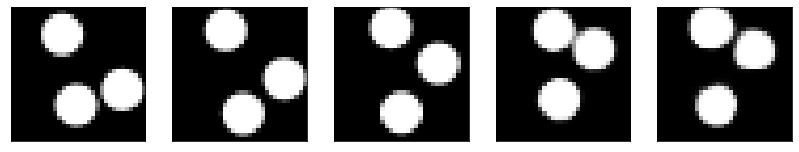

GD iterations:
i=0 | err=54.398682
i=1 | err=53.053612
i=2 | err=51.319611
i=3 | err=49.330627
i=4 | err=47.243061
i=5 | err=45.048561
i=6 | err=42.792542
i=7 | err=40.487389
i=8 | err=38.133106
i=9 | err=35.749718
i=10 | err=33.293739
i=11 | err=30.814297
i=12 | err=28.447500
i=13 | err=26.292467
i=14 | err=24.253801
i=15 | err=22.408758
i=16 | err=20.736073
i=17 | err=19.133390
i=18 | err=17.575363
i=19 | err=16.137455
i=20 | err=14.823550
i=21 | err=13.615603
i=22 | err=12.487542
i=23 | err=11.433355
i=24 | err=10.434437
i=25 | err=9.498088
i=26 | err=8.607902
i=27 | err=7.783261
i=28 | err=7.006324
i=29 | err=6.275146
Epoch=267 (39%) | out_positive=0.871474 | out_negative=0.128708 | mse=0.069387


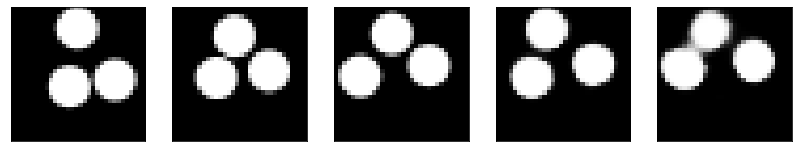

GD iterations:
i=0 | err=54.300369
i=1 | err=53.113102
i=2 | err=51.553848
i=3 | err=49.794537
i=4 | err=47.827297
i=5 | err=45.827850
i=6 | err=43.700745
i=7 | err=41.485054
i=8 | err=39.129032
i=9 | err=36.711510
i=10 | err=34.318493
i=11 | err=31.924757
i=12 | err=29.522139
i=13 | err=27.243614
i=14 | err=25.173172
i=15 | err=23.268501
i=16 | err=21.540537
i=17 | err=19.882072
i=18 | err=18.374352
i=19 | err=16.965096
i=20 | err=15.665713
i=21 | err=14.479648
i=22 | err=13.343172
i=23 | err=12.231366
i=24 | err=11.149979
i=25 | err=10.146041
i=26 | err=9.199682
i=27 | err=8.317947
i=28 | err=7.488455
i=29 | err=6.674232
Epoch=267 (41%) | out_positive=0.844129 | out_negative=0.123665 | mse=0.071258


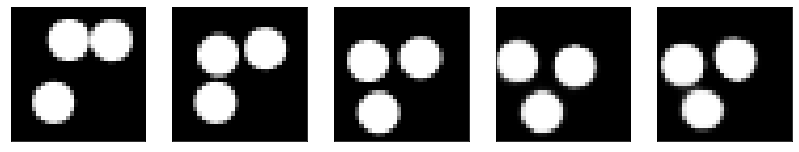

GD iterations:
i=0 | err=55.772316
i=1 | err=54.448677
i=2 | err=52.605030
i=3 | err=50.488739
i=4 | err=48.302254
i=5 | err=46.002911
i=6 | err=43.682297
i=7 | err=41.322475
i=8 | err=38.991409
i=9 | err=36.675819
i=10 | err=34.459053
i=11 | err=32.386642
i=12 | err=30.419918
i=13 | err=28.524677
i=14 | err=26.666082
i=15 | err=24.851854
i=16 | err=23.042372
i=17 | err=21.265276
i=18 | err=19.618252
i=19 | err=18.059847
i=20 | err=16.580318
i=21 | err=15.224974
i=22 | err=13.970605
i=23 | err=12.783075
i=24 | err=11.704033
i=25 | err=10.702222
i=26 | err=9.759861
i=27 | err=8.852221
i=28 | err=7.980742
i=29 | err=7.167929
Epoch=267 (43%) | out_positive=0.869206 | out_negative=0.127789 | mse=0.076045


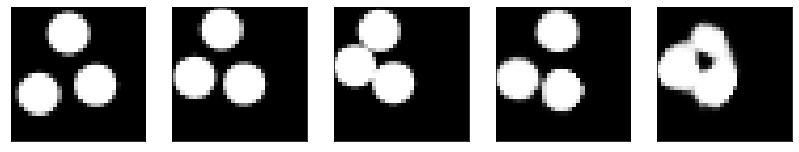

GD iterations:
i=0 | err=50.753418
i=1 | err=49.524879
i=2 | err=47.843212
i=3 | err=45.977703
i=4 | err=43.991478
i=5 | err=41.933517
i=6 | err=39.759670
i=7 | err=37.575447
i=8 | err=35.340363
i=9 | err=33.121346
i=10 | err=31.003170
i=11 | err=28.902039
i=12 | err=26.855240
i=13 | err=24.865208
i=14 | err=22.968941
i=15 | err=21.267895
i=16 | err=19.725443
i=17 | err=18.277676
i=18 | err=16.958469
i=19 | err=15.667990
i=20 | err=14.458141
i=21 | err=13.299931
i=22 | err=12.184353
i=23 | err=11.172750
i=24 | err=10.215760
i=25 | err=9.293676
i=26 | err=8.449538
i=27 | err=7.638480
i=28 | err=6.865809
i=29 | err=6.143210
Epoch=267 (44%) | out_positive=0.911246 | out_negative=0.125670 | mse=0.072963


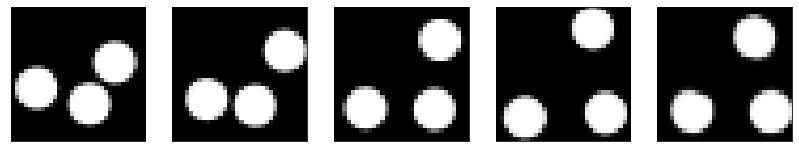

GD iterations:
i=0 | err=56.570671
i=1 | err=55.325119
i=2 | err=53.651619
i=3 | err=51.702385
i=4 | err=49.693031
i=5 | err=47.645264
i=6 | err=45.587204
i=7 | err=43.419380
i=8 | err=41.199570
i=9 | err=39.002296
i=10 | err=36.856495
i=11 | err=34.756935
i=12 | err=32.669712
i=13 | err=30.562895
i=14 | err=28.559847
i=15 | err=26.657848
i=16 | err=24.748356
i=17 | err=22.904469
i=18 | err=21.146223
i=19 | err=19.501581
i=20 | err=17.957930
i=21 | err=16.576141
i=22 | err=15.296309
i=23 | err=14.078293
i=24 | err=12.907768
i=25 | err=11.765537
i=26 | err=10.671561
i=27 | err=9.620487
i=28 | err=8.631632
i=29 | err=7.693938
Epoch=267 (46%) | out_positive=0.876963 | out_negative=0.103900 | mse=0.074355


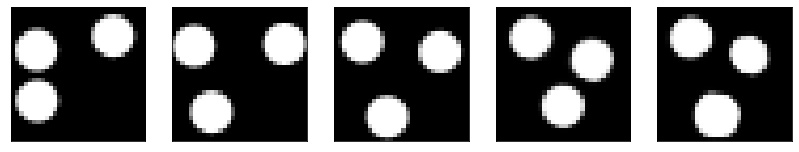

GD iterations:
i=0 | err=55.045387
i=1 | err=53.704308
i=2 | err=51.825233
i=3 | err=49.838966
i=4 | err=47.735046
i=5 | err=45.569225
i=6 | err=43.294899
i=7 | err=40.965569
i=8 | err=38.602310
i=9 | err=36.136864
i=10 | err=33.718536
i=11 | err=31.292458
i=12 | err=29.034512
i=13 | err=26.875843
i=14 | err=24.832159
i=15 | err=22.929234
i=16 | err=21.189194
i=17 | err=19.587704
i=18 | err=18.077822
i=19 | err=16.613026
i=20 | err=15.276492
i=21 | err=14.056742
i=22 | err=12.929128
i=23 | err=11.875872
i=24 | err=10.878940
i=25 | err=9.943096
i=26 | err=9.040835
i=27 | err=8.162670
i=28 | err=7.335415
i=29 | err=6.562032
Epoch=267 (48%) | out_positive=0.889721 | out_negative=0.154477 | mse=0.063065


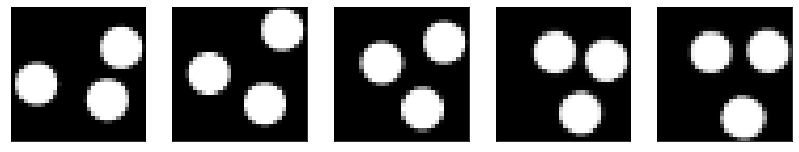

GD iterations:
i=0 | err=51.339336
i=1 | err=50.167385
i=2 | err=48.526798
i=3 | err=46.718845
i=4 | err=44.733295
i=5 | err=42.695301
i=6 | err=40.588928
i=7 | err=38.429020
i=8 | err=36.251240
i=9 | err=34.022800
i=10 | err=31.859291
i=11 | err=29.766745
i=12 | err=27.722925
i=13 | err=25.693737
i=14 | err=23.761580
i=15 | err=21.827122
i=16 | err=20.037426
i=17 | err=18.319933
i=18 | err=16.777809
i=19 | err=15.388578
i=20 | err=14.132336
i=21 | err=12.979897
i=22 | err=11.870555
i=23 | err=10.836355
i=24 | err=9.858813
i=25 | err=8.920849
i=26 | err=8.041750
i=27 | err=7.220569
i=28 | err=6.430912
i=29 | err=5.671999
Epoch=267 (50%) | out_positive=0.904210 | out_negative=0.146518 | mse=0.070117


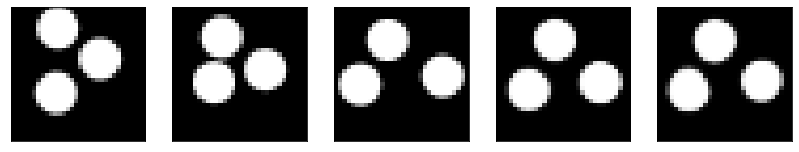

GD iterations:
i=0 | err=57.406956
i=1 | err=56.158962
i=2 | err=54.461151
i=3 | err=52.593906
i=4 | err=50.526207
i=5 | err=48.334873
i=6 | err=46.030018
i=7 | err=43.586502
i=8 | err=41.188896
i=9 | err=38.861973
i=10 | err=36.585651
i=11 | err=34.320442
i=12 | err=32.041573
i=13 | err=29.811073
i=14 | err=27.766109
i=15 | err=25.823685
i=16 | err=23.959179
i=17 | err=22.126575
i=18 | err=20.450676
i=19 | err=18.902424
i=20 | err=17.449007
i=21 | err=16.089224
i=22 | err=14.761104
i=23 | err=13.484056
i=24 | err=12.311792
i=25 | err=11.263535
i=26 | err=10.298431
i=27 | err=9.393692
i=28 | err=8.545705
i=29 | err=7.725979
Epoch=267 (52%) | out_positive=0.892470 | out_negative=0.113347 | mse=0.072933


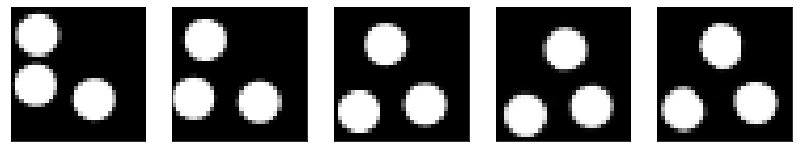

GD iterations:
i=0 | err=53.316162
i=1 | err=52.133358
i=2 | err=50.500687
i=3 | err=48.742302
i=4 | err=46.876926
i=5 | err=44.917130
i=6 | err=42.925247
i=7 | err=40.801422
i=8 | err=38.703102
i=9 | err=36.563667
i=10 | err=34.406403
i=11 | err=32.220104
i=12 | err=30.073914
i=13 | err=28.008839
i=14 | err=26.046432
i=15 | err=24.184984
i=16 | err=22.348133
i=17 | err=20.590538
i=18 | err=19.015556
i=19 | err=17.535141
i=20 | err=16.123404
i=21 | err=14.767740
i=22 | err=13.519194
i=23 | err=12.379428
i=24 | err=11.359593
i=25 | err=10.384800
i=26 | err=9.434317
i=27 | err=8.564520
i=28 | err=7.766124
i=29 | err=7.035015
Epoch=267 (54%) | out_positive=0.870956 | out_negative=0.123224 | mse=0.068620


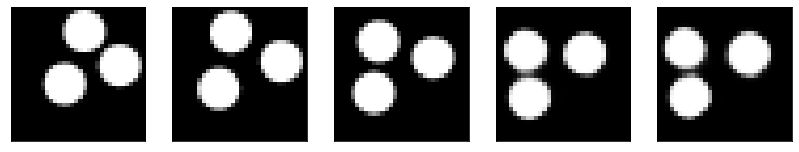

GD iterations:
i=0 | err=54.199829
i=1 | err=52.918777
i=2 | err=51.121380
i=3 | err=49.085083
i=4 | err=46.947670
i=5 | err=44.703457
i=6 | err=42.454319
i=7 | err=40.202335
i=8 | err=37.911480
i=9 | err=35.648079
i=10 | err=33.387657
i=11 | err=31.109995
i=12 | err=28.909733
i=13 | err=26.822914
i=14 | err=24.893867
i=15 | err=23.098854
i=16 | err=21.392563
i=17 | err=19.835979
i=18 | err=18.355730
i=19 | err=16.990379
i=20 | err=15.693224
i=21 | err=14.439461
i=22 | err=13.255436
i=23 | err=12.121319
i=24 | err=11.043631
i=25 | err=10.028193
i=26 | err=9.086688
i=27 | err=8.219229
i=28 | err=7.395174
i=29 | err=6.624365
Epoch=267 (56%) | out_positive=0.892929 | out_negative=0.138494 | mse=0.074994


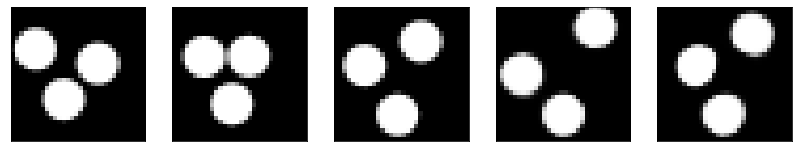

GD iterations:
i=0 | err=58.201653
i=1 | err=56.921776
i=2 | err=55.225868
i=3 | err=53.202118
i=4 | err=51.010872
i=5 | err=48.691673
i=6 | err=46.342033
i=7 | err=43.894150
i=8 | err=41.457024
i=9 | err=39.080963
i=10 | err=36.721523
i=11 | err=34.369732
i=12 | err=32.016651
i=13 | err=29.712366
i=14 | err=27.479794
i=15 | err=25.348478
i=16 | err=23.347271
i=17 | err=21.492725
i=18 | err=19.811714
i=19 | err=18.252739
i=20 | err=16.782528
i=21 | err=15.389828
i=22 | err=14.084812
i=23 | err=12.857450
i=24 | err=11.726791
i=25 | err=10.670668
i=26 | err=9.662378
i=27 | err=8.672335
i=28 | err=7.705353
i=29 | err=6.803740
Epoch=267 (57%) | out_positive=0.870276 | out_negative=0.118469 | mse=0.071876


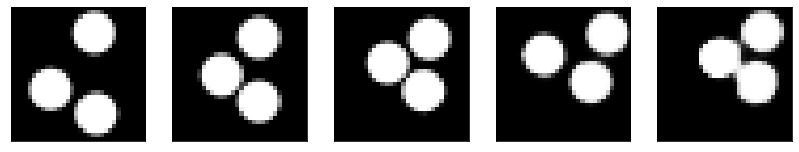

GD iterations:
i=0 | err=53.475910
i=1 | err=52.235397
i=2 | err=50.624508
i=3 | err=48.800026
i=4 | err=46.961723
i=5 | err=45.048210
i=6 | err=43.105560
i=7 | err=41.061531
i=8 | err=38.936676
i=9 | err=36.754330
i=10 | err=34.518829
i=11 | err=32.340881
i=12 | err=30.225286
i=13 | err=28.195089
i=14 | err=26.309452
i=15 | err=24.420610
i=16 | err=22.601089
i=17 | err=20.827534
i=18 | err=19.186560
i=19 | err=17.649469
i=20 | err=16.166964
i=21 | err=14.759581
i=22 | err=13.436666
i=23 | err=12.245611
i=24 | err=11.161783
i=25 | err=10.150726
i=26 | err=9.196647
i=27 | err=8.301264
i=28 | err=7.442442
i=29 | err=6.614948
Epoch=267 (59%) | out_positive=0.894455 | out_negative=0.103531 | mse=0.069674


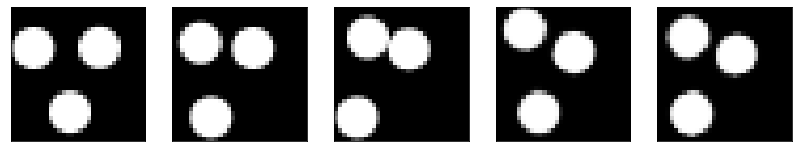

GD iterations:
i=0 | err=58.297703
i=1 | err=57.049957
i=2 | err=55.304199
i=3 | err=53.394814
i=4 | err=51.388691
i=5 | err=49.280254
i=6 | err=47.025635
i=7 | err=44.626736
i=8 | err=42.148705
i=9 | err=39.643257
i=10 | err=37.172192
i=11 | err=34.680229
i=12 | err=32.231567
i=13 | err=29.828995
i=14 | err=27.430973
i=15 | err=25.138498
i=16 | err=22.959082
i=17 | err=20.970388
i=18 | err=19.115595
i=19 | err=17.463902
i=20 | err=15.928404
i=21 | err=14.497311
i=22 | err=13.168817
i=23 | err=11.934196
i=24 | err=10.809107
i=25 | err=9.747523
i=26 | err=8.730694
i=27 | err=7.757815
i=28 | err=6.851920
i=29 | err=5.978460
Epoch=267 (61%) | out_positive=0.887279 | out_negative=0.157211 | mse=0.067979


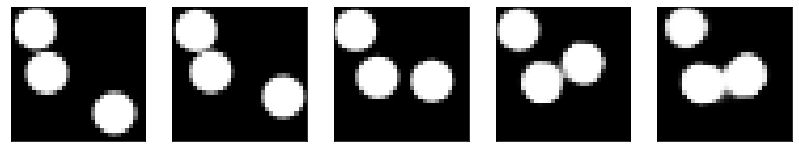

GD iterations:
i=0 | err=58.806896
i=1 | err=57.440239
i=2 | err=55.682693
i=3 | err=53.681480
i=4 | err=51.494957
i=5 | err=49.238976
i=6 | err=46.938110
i=7 | err=44.525417
i=8 | err=41.974323
i=9 | err=39.342308
i=10 | err=36.738064
i=11 | err=34.174282
i=12 | err=31.670805
i=13 | err=29.329475
i=14 | err=27.106846
i=15 | err=25.077442
i=16 | err=23.197691
i=17 | err=21.389086
i=18 | err=19.711838
i=19 | err=18.106184
i=20 | err=16.616480
i=21 | err=15.232006
i=22 | err=13.962277
i=23 | err=12.771936
i=24 | err=11.642214
i=25 | err=10.596184
i=26 | err=9.613571
i=27 | err=8.698302
i=28 | err=7.867604
i=29 | err=7.085903
Epoch=267 (63%) | out_positive=0.938229 | out_negative=0.126456 | mse=0.070764


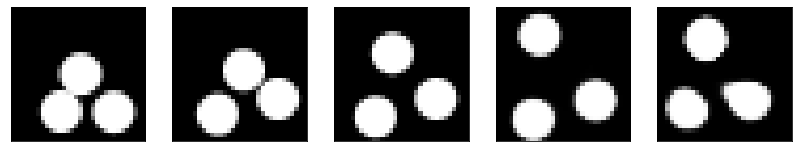

GD iterations:
i=0 | err=57.570469
i=1 | err=56.503094
i=2 | err=55.012493
i=3 | err=53.302567
i=4 | err=51.419067
i=5 | err=49.394981
i=6 | err=47.190781
i=7 | err=44.977467
i=8 | err=42.655998
i=9 | err=40.231117
i=10 | err=37.751949
i=11 | err=35.265522
i=12 | err=32.803848
i=13 | err=30.436094
i=14 | err=28.088778
i=15 | err=25.775000
i=16 | err=23.606415
i=17 | err=21.595043
i=18 | err=19.728426
i=19 | err=17.975468
i=20 | err=16.388020
i=21 | err=14.984951
i=22 | err=13.696928
i=23 | err=12.490182
i=24 | err=11.368358
i=25 | err=10.310947
i=26 | err=9.323975
i=27 | err=8.384689
i=28 | err=7.518807
i=29 | err=6.672305
Epoch=267 (65%) | out_positive=0.877548 | out_negative=0.129771 | mse=0.070617


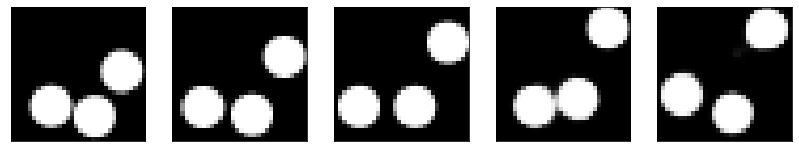

GD iterations:
i=0 | err=59.245323
i=1 | err=57.932724
i=2 | err=56.115997
i=3 | err=54.182220
i=4 | err=52.121540
i=5 | err=49.854492
i=6 | err=47.559292
i=7 | err=45.129772
i=8 | err=42.824226
i=9 | err=40.448750
i=10 | err=38.127739
i=11 | err=35.840248
i=12 | err=33.616295
i=13 | err=31.382870
i=14 | err=29.257122
i=15 | err=27.279343
i=16 | err=25.382536
i=17 | err=23.555120
i=18 | err=21.749582
i=19 | err=20.063766
i=20 | err=18.486320
i=21 | err=16.975231
i=22 | err=15.531597
i=23 | err=14.212305
i=24 | err=12.945351
i=25 | err=11.757164
i=26 | err=10.694937
i=27 | err=9.707987
i=28 | err=8.786953
i=29 | err=7.923391
Epoch=267 (67%) | out_positive=0.781705 | out_negative=0.103573 | mse=0.067117


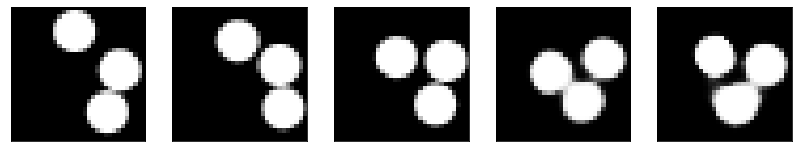

GD iterations:
i=0 | err=53.771564
i=1 | err=52.575134
i=2 | err=50.731987
i=3 | err=48.762638
i=4 | err=46.572586
i=5 | err=44.542007
i=6 | err=42.407154
i=7 | err=40.266693
i=8 | err=38.030823
i=9 | err=35.908161
i=10 | err=33.720932
i=11 | err=31.515936
i=12 | err=29.389114
i=13 | err=27.362114
i=14 | err=25.411484
i=15 | err=23.648140
i=16 | err=22.076385
i=17 | err=20.601597
i=18 | err=19.156582
i=19 | err=17.792965
i=20 | err=16.486609
i=21 | err=15.260836
i=22 | err=14.123634
i=23 | err=13.065825
i=24 | err=12.088040
i=25 | err=11.176141
i=26 | err=10.302361
i=27 | err=9.457129
i=28 | err=8.648621
i=29 | err=7.871173
Epoch=267 (68%) | out_positive=0.849609 | out_negative=0.113591 | mse=0.073074


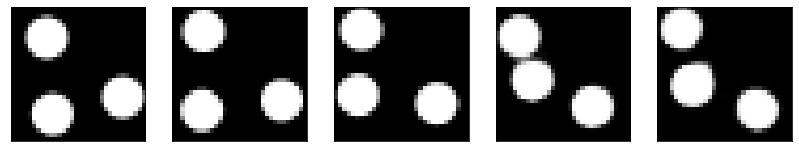

GD iterations:
i=0 | err=51.456352
i=1 | err=50.283493
i=2 | err=48.544220
i=3 | err=46.639675
i=4 | err=44.566353
i=5 | err=42.503815
i=6 | err=40.482231
i=7 | err=38.523247
i=8 | err=36.581982
i=9 | err=34.701530
i=10 | err=32.888054
i=11 | err=30.996878
i=12 | err=29.102493
i=13 | err=27.275517
i=14 | err=25.484844
i=15 | err=23.756876
i=16 | err=22.117552
i=17 | err=20.485294
i=18 | err=19.008451
i=19 | err=17.541012
i=20 | err=16.124435
i=21 | err=14.807262
i=22 | err=13.601805
i=23 | err=12.477658
i=24 | err=11.409016
i=25 | err=10.425409
i=26 | err=9.496995
i=27 | err=8.625778
i=28 | err=7.760219
i=29 | err=6.915510
Epoch=267 (70%) | out_positive=0.874815 | out_negative=0.104548 | mse=0.070564


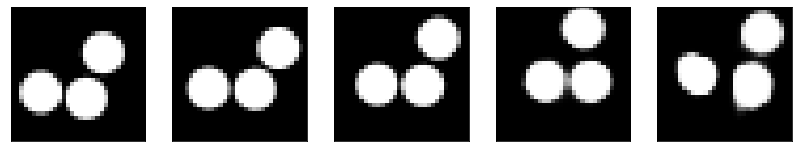

GD iterations:
i=0 | err=53.621277
i=1 | err=52.493130
i=2 | err=50.923672
i=3 | err=49.167168
i=4 | err=47.299183
i=5 | err=45.366566
i=6 | err=43.403549
i=7 | err=41.239288
i=8 | err=39.142872
i=9 | err=37.002251
i=10 | err=34.865692
i=11 | err=32.799652
i=12 | err=30.721474
i=13 | err=28.690052
i=14 | err=26.728142
i=15 | err=24.829716
i=16 | err=23.020824
i=17 | err=21.315060
i=18 | err=19.661795
i=19 | err=18.102411
i=20 | err=16.695503
i=21 | err=15.400898
i=22 | err=14.193483
i=23 | err=13.050640
i=24 | err=12.001698
i=25 | err=11.038740
i=26 | err=10.083332
i=27 | err=9.144939
i=28 | err=8.279887
i=29 | err=7.454774
Epoch=267 (72%) | out_positive=0.877171 | out_negative=0.115107 | mse=0.072176


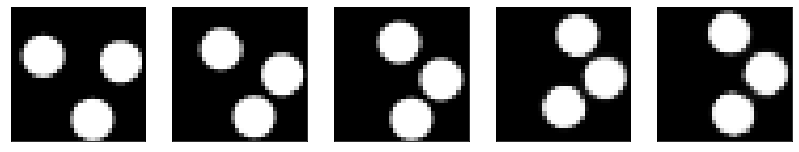

GD iterations:
i=0 | err=54.929985
i=1 | err=53.794060
i=2 | err=52.177227
i=3 | err=50.336502
i=4 | err=48.440380
i=5 | err=46.332207
i=6 | err=44.219940
i=7 | err=42.021812
i=8 | err=39.753067
i=9 | err=37.447834
i=10 | err=35.211388
i=11 | err=32.933578
i=12 | err=30.750040
i=13 | err=28.583973
i=14 | err=26.544575
i=15 | err=24.552517
i=16 | err=22.678308
i=17 | err=20.926132
i=18 | err=19.366779
i=19 | err=17.896490
i=20 | err=16.549963
i=21 | err=15.292196
i=22 | err=14.132986
i=23 | err=12.976664
i=24 | err=11.842875
i=25 | err=10.790291
i=26 | err=9.789142
i=27 | err=8.843528
i=28 | err=7.941248
i=29 | err=7.122061
Epoch=267 (74%) | out_positive=0.848750 | out_negative=0.124272 | mse=0.072059


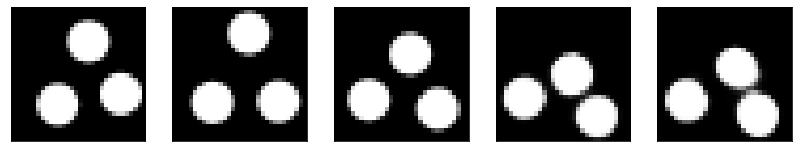

GD iterations:
i=0 | err=57.999542
i=1 | err=56.755997
i=2 | err=54.975861
i=3 | err=53.031040
i=4 | err=50.843925
i=5 | err=48.663170
i=6 | err=46.486015
i=7 | err=44.213127
i=8 | err=41.921570
i=9 | err=39.520149
i=10 | err=37.095139
i=11 | err=34.626652
i=12 | err=32.100098
i=13 | err=29.674288
i=14 | err=27.409386
i=15 | err=25.250669
i=16 | err=23.108217
i=17 | err=21.123785
i=18 | err=19.245209
i=19 | err=17.557632
i=20 | err=16.072323
i=21 | err=14.655975
i=22 | err=13.382307
i=23 | err=12.239663
i=24 | err=11.212322
i=25 | err=10.245052
i=26 | err=9.316059
i=27 | err=8.433124
i=28 | err=7.631459
i=29 | err=6.884146
Epoch=267 (76%) | out_positive=0.833375 | out_negative=0.116843 | mse=0.068005


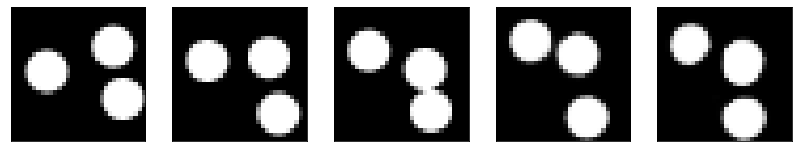

GD iterations:
i=0 | err=58.240200
i=1 | err=56.931183
i=2 | err=55.174400
i=3 | err=53.188152
i=4 | err=51.062237
i=5 | err=48.819523
i=6 | err=46.422382
i=7 | err=43.923122
i=8 | err=41.400143
i=9 | err=38.803963
i=10 | err=36.152134
i=11 | err=33.555069
i=12 | err=31.101509
i=13 | err=28.764309
i=14 | err=26.549517
i=15 | err=24.432955
i=16 | err=22.467972
i=17 | err=20.752045
i=18 | err=19.206688
i=19 | err=17.779949
i=20 | err=16.394665
i=21 | err=15.059836
i=22 | err=13.802008
i=23 | err=12.660778
i=24 | err=11.582782
i=25 | err=10.598536
i=26 | err=9.643847
i=27 | err=8.726957
i=28 | err=7.879002
i=29 | err=7.068389
Epoch=267 (78%) | out_positive=0.903279 | out_negative=0.129623 | mse=0.072547


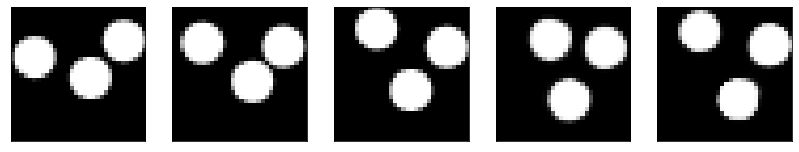

GD iterations:
i=0 | err=51.623432
i=1 | err=50.447166
i=2 | err=48.771202
i=3 | err=46.987442
i=4 | err=45.133110
i=5 | err=43.255409
i=6 | err=41.393494
i=7 | err=39.521461
i=8 | err=37.643120
i=9 | err=35.732029
i=10 | err=33.779373
i=11 | err=31.787010
i=12 | err=29.776592
i=13 | err=27.789835
i=14 | err=25.871914
i=15 | err=23.996330
i=16 | err=22.206762
i=17 | err=20.473808
i=18 | err=18.863203
i=19 | err=17.351265
i=20 | err=15.968807
i=21 | err=14.715202
i=22 | err=13.557894
i=23 | err=12.496176
i=24 | err=11.472414
i=25 | err=10.489565
i=26 | err=9.548077
i=27 | err=8.692919
i=28 | err=7.891627
i=29 | err=7.128946
Epoch=267 (79%) | out_positive=0.887054 | out_negative=0.113427 | mse=0.070214


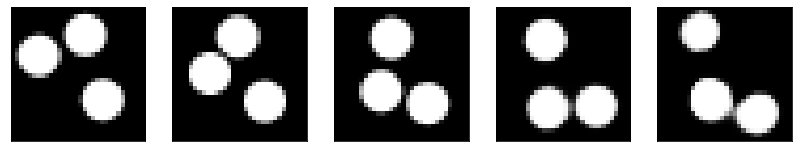

GD iterations:
i=0 | err=56.321217
i=1 | err=55.156021
i=2 | err=53.630276
i=3 | err=51.930229
i=4 | err=50.089294
i=5 | err=48.173130
i=6 | err=46.054111
i=7 | err=43.956741
i=8 | err=41.714561
i=9 | err=39.296486
i=10 | err=36.827202
i=11 | err=34.339867
i=12 | err=31.847313
i=13 | err=29.376305
i=14 | err=27.112297
i=15 | err=24.969357
i=16 | err=22.968725
i=17 | err=20.961185
i=18 | err=19.046665
i=19 | err=17.308903
i=20 | err=15.752924
i=21 | err=14.300280
i=22 | err=12.999077
i=23 | err=11.862530
i=24 | err=10.789799
i=25 | err=9.822912
i=26 | err=8.838472
i=27 | err=7.925892
i=28 | err=7.079369
i=29 | err=6.302880
Epoch=267 (81%) | out_positive=0.827473 | out_negative=0.176298 | mse=0.067170


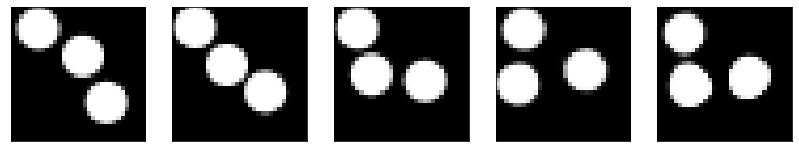

GD iterations:
i=0 | err=52.219742
i=1 | err=51.091125
i=2 | err=49.469093
i=3 | err=47.689926
i=4 | err=45.812965
i=5 | err=43.880970
i=6 | err=41.850422
i=7 | err=39.794006
i=8 | err=37.730656
i=9 | err=35.586273
i=10 | err=33.413445
i=11 | err=31.223423
i=12 | err=29.112209
i=13 | err=27.027386
i=14 | err=24.981920
i=15 | err=23.052734
i=16 | err=21.323406
i=17 | err=19.711105
i=18 | err=18.185993
i=19 | err=16.763859
i=20 | err=15.441792
i=21 | err=14.132137
i=22 | err=12.877427
i=23 | err=11.696346
i=24 | err=10.568371
i=25 | err=9.525976
i=26 | err=8.554978
i=27 | err=7.633922
i=28 | err=6.752885
i=29 | err=5.907615
Epoch=267 (83%) | out_positive=0.881881 | out_negative=0.134469 | mse=0.067918


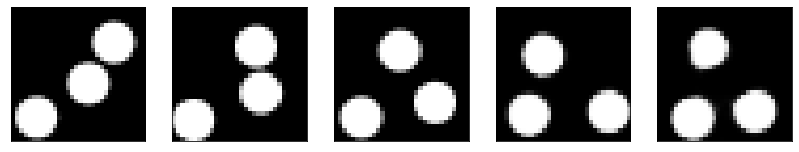

GD iterations:
i=0 | err=56.619720
i=1 | err=55.270927
i=2 | err=53.460129
i=3 | err=51.441952
i=4 | err=49.275555
i=5 | err=47.031006
i=6 | err=44.605724
i=7 | err=42.090748
i=8 | err=39.497391
i=9 | err=36.942924
i=10 | err=34.343739
i=11 | err=31.853117
i=12 | err=29.416626
i=13 | err=27.116608
i=14 | err=25.081589
i=15 | err=23.194965
i=16 | err=21.425404
i=17 | err=19.738712
i=18 | err=18.116407
i=19 | err=16.607693
i=20 | err=15.213260
i=21 | err=13.931253
i=22 | err=12.784631
i=23 | err=11.711483
i=24 | err=10.695284
i=25 | err=9.731319
i=26 | err=8.824018
i=27 | err=7.970794
i=28 | err=7.143105
i=29 | err=6.378570
Epoch=267 (85%) | out_positive=0.868815 | out_negative=0.148330 | mse=0.066536


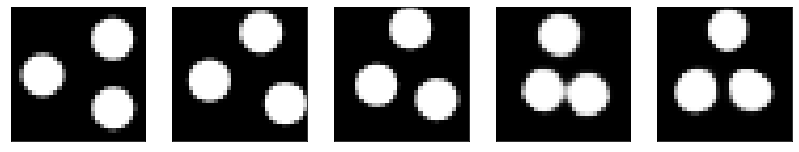

GD iterations:
i=0 | err=53.733978
i=1 | err=52.595947
i=2 | err=51.001411
i=3 | err=49.277954
i=4 | err=47.374619
i=5 | err=45.483959
i=6 | err=43.448540
i=7 | err=41.252678
i=8 | err=38.988121
i=9 | err=36.671326
i=10 | err=34.397911
i=11 | err=32.081177
i=12 | err=29.887547
i=13 | err=27.767185
i=14 | err=25.705551
i=15 | err=23.727045
i=16 | err=21.911980
i=17 | err=20.273806
i=18 | err=18.701550
i=19 | err=17.231693
i=20 | err=15.871571
i=21 | err=14.615227
i=22 | err=13.482318
i=23 | err=12.383909
i=24 | err=11.361016
i=25 | err=10.390774
i=26 | err=9.453325
i=27 | err=8.586851
i=28 | err=7.765023
i=29 | err=6.983559
Epoch=267 (87%) | out_positive=0.928146 | out_negative=0.134447 | mse=0.076348


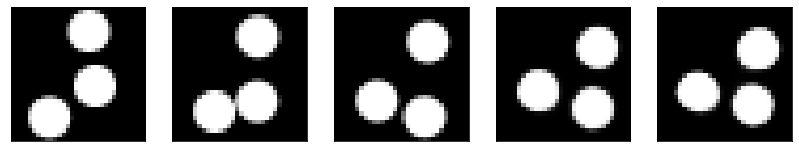

GD iterations:
i=0 | err=53.953938
i=1 | err=52.808399
i=2 | err=51.196426
i=3 | err=49.341942
i=4 | err=47.414150
i=5 | err=45.387138
i=6 | err=43.212898
i=7 | err=40.979248
i=8 | err=38.663490
i=9 | err=36.385353
i=10 | err=34.164581
i=11 | err=31.983356
i=12 | err=29.845379
i=13 | err=27.764397
i=14 | err=25.725086
i=15 | err=23.871311
i=16 | err=22.100533
i=17 | err=20.467274
i=18 | err=18.917793
i=19 | err=17.443546
i=20 | err=16.091019
i=21 | err=14.884803
i=22 | err=13.706955
i=23 | err=12.621706
i=24 | err=11.605009
i=25 | err=10.685601
i=26 | err=9.808373
i=27 | err=8.966042
i=28 | err=8.157904
i=29 | err=7.374855
Epoch=267 (89%) | out_positive=0.869980 | out_negative=0.109349 | mse=0.068121


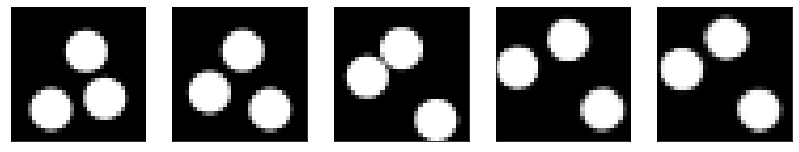

GD iterations:
i=0 | err=53.613094
i=1 | err=52.380768
i=2 | err=50.596252
i=3 | err=48.705864
i=4 | err=46.729591
i=5 | err=44.724026
i=6 | err=42.644012
i=7 | err=40.542404
i=8 | err=38.308647
i=9 | err=35.974239
i=10 | err=33.569412
i=11 | err=31.254080
i=12 | err=28.928722
i=13 | err=26.656780
i=14 | err=24.589428
i=15 | err=22.593225
i=16 | err=20.737577
i=17 | err=19.008810
i=18 | err=17.421663
i=19 | err=15.943440
i=20 | err=14.658677
i=21 | err=13.455187
i=22 | err=12.338258
i=23 | err=11.314100
i=24 | err=10.333703
i=25 | err=9.386889
i=26 | err=8.464461
i=27 | err=7.574487
i=28 | err=6.732147
i=29 | err=5.935184
Epoch=267 (90%) | out_positive=0.880269 | out_negative=0.173015 | mse=0.068734


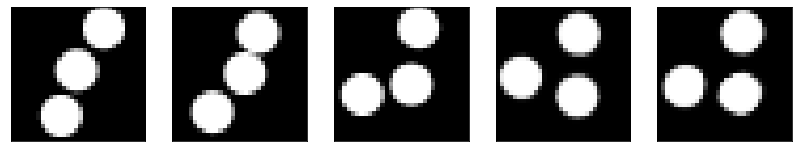

GD iterations:
i=0 | err=57.350380
i=1 | err=56.004272
i=2 | err=54.246994
i=3 | err=52.246063
i=4 | err=50.073235
i=5 | err=47.817062
i=6 | err=45.572063
i=7 | err=43.225136
i=8 | err=40.766399
i=9 | err=38.261620
i=10 | err=35.792221
i=11 | err=33.421925
i=12 | err=31.174814
i=13 | err=29.108591
i=14 | err=27.143661
i=15 | err=25.225571
i=16 | err=23.415609
i=17 | err=21.743610
i=18 | err=20.180189
i=19 | err=18.646063
i=20 | err=17.249908
i=21 | err=15.907426
i=22 | err=14.670322
i=23 | err=13.557531
i=24 | err=12.562574
i=25 | err=11.660921
i=26 | err=10.772081
i=27 | err=9.890178
i=28 | err=9.049559
i=29 | err=8.220088
Epoch=267 (92%) | out_positive=0.843798 | out_negative=0.074461 | mse=0.081265


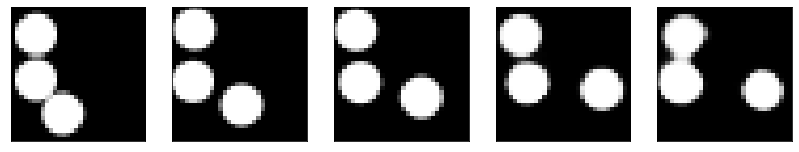

GD iterations:
i=0 | err=54.105415
i=1 | err=52.832733
i=2 | err=51.124493
i=3 | err=49.188217
i=4 | err=47.169582
i=5 | err=45.108250
i=6 | err=43.034401
i=7 | err=40.945572
i=8 | err=38.789536
i=9 | err=36.550293
i=10 | err=34.243610
i=11 | err=31.740616
i=12 | err=29.329008
i=13 | err=27.081123
i=14 | err=24.961594
i=15 | err=22.991726
i=16 | err=21.093788
i=17 | err=19.338493
i=18 | err=17.732372
i=19 | err=16.286493
i=20 | err=14.921144
i=21 | err=13.639237
i=22 | err=12.424696
i=23 | err=11.295048
i=24 | err=10.233511
i=25 | err=9.249778
i=26 | err=8.323534
i=27 | err=7.436617
i=28 | err=6.610599
i=29 | err=5.835482
Epoch=267 (94%) | out_positive=0.903895 | out_negative=0.166042 | mse=0.068879


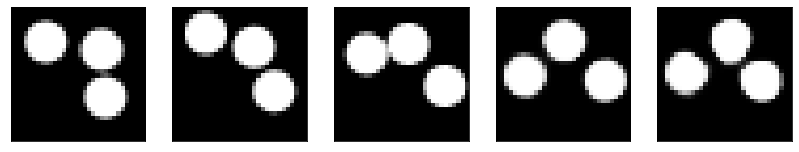

GD iterations:
i=0 | err=54.505249
i=1 | err=53.228928
i=2 | err=51.545425
i=3 | err=49.634434
i=4 | err=47.650574
i=5 | err=45.616497
i=6 | err=43.468067
i=7 | err=41.258522
i=8 | err=38.953041
i=9 | err=36.651348
i=10 | err=34.298973
i=11 | err=32.051826
i=12 | err=29.870750
i=13 | err=27.758667
i=14 | err=25.723091
i=15 | err=23.767838
i=16 | err=21.958870
i=17 | err=20.286539
i=18 | err=18.717827
i=19 | err=17.238426
i=20 | err=15.830821
i=21 | err=14.573965
i=22 | err=13.386477
i=23 | err=12.282379
i=24 | err=11.258764
i=25 | err=10.231358
i=26 | err=9.239166
i=27 | err=8.315542
i=28 | err=7.418823
i=29 | err=6.562480
Epoch=267 (96%) | out_positive=0.884559 | out_negative=0.135053 | mse=0.068270


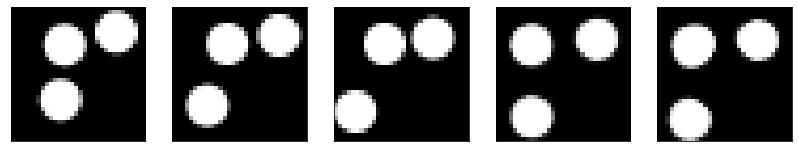

GD iterations:
i=0 | err=52.211304
i=1 | err=51.037468
i=2 | err=49.413567
i=3 | err=47.582481
i=4 | err=45.657768
i=5 | err=43.607697
i=6 | err=41.594982
i=7 | err=39.522087
i=8 | err=37.483391
i=9 | err=35.450455
i=10 | err=33.468578
i=11 | err=31.422060
i=12 | err=29.419859
i=13 | err=27.429108
i=14 | err=25.549789
i=15 | err=23.819355
i=16 | err=22.172253
i=17 | err=20.571835
i=18 | err=19.084612
i=19 | err=17.698116
i=20 | err=16.424028
i=21 | err=15.203396
i=22 | err=14.061810
i=23 | err=13.000400
i=24 | err=11.993215
i=25 | err=11.056584
i=26 | err=10.179169
i=27 | err=9.308369
i=28 | err=8.463121
i=29 | err=7.647994
Epoch=267 (98%) | out_positive=0.829725 | out_negative=0.102671 | mse=0.070743


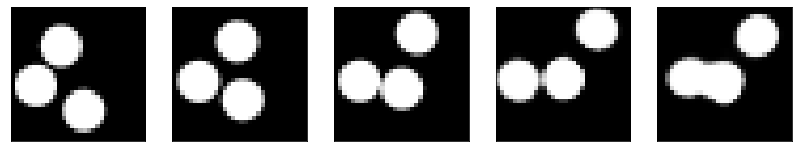

GD iterations:
i=0 | err=55.166637
i=1 | err=53.865826
i=2 | err=52.026192
i=3 | err=49.967125
i=4 | err=47.720215
i=5 | err=45.378052
i=6 | err=43.002563
i=7 | err=40.484676
i=8 | err=38.025986
i=9 | err=35.670235
i=10 | err=33.421837
i=11 | err=31.245655
i=12 | err=29.108414
i=13 | err=26.972725
i=14 | err=24.911777
i=15 | err=22.957516
i=16 | err=21.118282
i=17 | err=19.412689
i=18 | err=17.812826
i=19 | err=16.296478
i=20 | err=14.949135
i=21 | err=13.739295
i=22 | err=12.644903
i=23 | err=11.647779
i=24 | err=10.693144
i=25 | err=9.804187
i=26 | err=8.980696
i=27 | err=8.186418
i=28 | err=7.454803
i=29 | err=6.763948
Epoch=267 (100%) | out_positive=0.909601 | out_negative=0.139334 | mse=0.071498


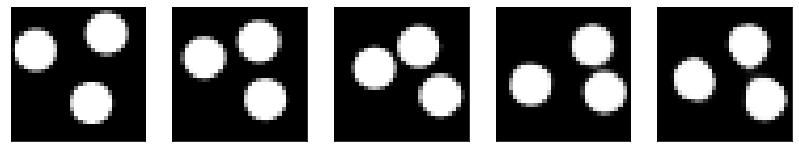

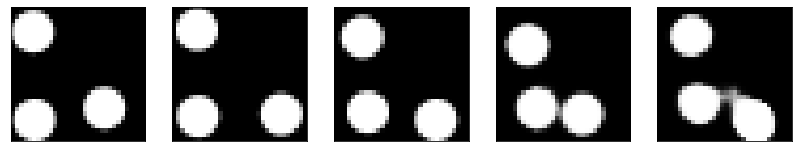

Test MSE 0.078033


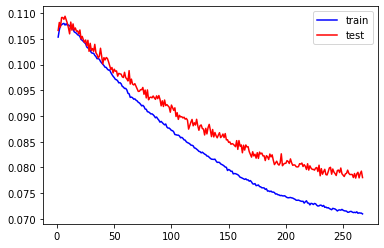

GD iterations:
i=0 | err=51.721741
i=1 | err=50.566395
i=2 | err=48.910267
i=3 | err=47.120228
i=4 | err=45.145794
i=5 | err=43.112831
i=6 | err=41.057838
i=7 | err=39.006905
i=8 | err=36.993439
i=9 | err=34.931404
i=10 | err=32.859497
i=11 | err=30.716244
i=12 | err=28.638268
i=13 | err=26.613613
i=14 | err=24.734846
i=15 | err=22.928560
i=16 | err=21.211143
i=17 | err=19.585447
i=18 | err=18.118095
i=19 | err=16.744263
i=20 | err=15.480021
i=21 | err=14.278208
i=22 | err=13.156286
i=23 | err=12.133575
i=24 | err=11.200954
i=25 | err=10.291111
i=26 | err=9.460014
i=27 | err=8.665313
i=28 | err=7.903281
i=29 | err=7.196722
Epoch=268 (0%) | out_positive=0.871437 | out_negative=0.101889 | mse=0.070208


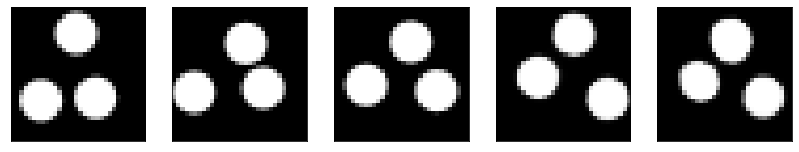

GD iterations:
i=0 | err=51.995781
i=1 | err=50.866367
i=2 | err=49.154350
i=3 | err=47.306358
i=4 | err=45.307816
i=5 | err=43.261608
i=6 | err=41.148621
i=7 | err=39.023659
i=8 | err=36.874069
i=9 | err=34.670235
i=10 | err=32.575569
i=11 | err=30.483994
i=12 | err=28.432325
i=13 | err=26.421345
i=14 | err=24.451475
i=15 | err=22.587570
i=16 | err=20.817959
i=17 | err=19.259710
i=18 | err=17.758928
i=19 | err=16.409651
i=20 | err=15.097589
i=21 | err=13.907328
i=22 | err=12.843184
i=23 | err=11.881018
i=24 | err=10.974482
i=25 | err=10.086735
i=26 | err=9.258142
i=27 | err=8.483973
i=28 | err=7.711823
i=29 | err=6.990752
Epoch=268 (2%) | out_positive=0.933000 | out_negative=0.123705 | mse=0.072710


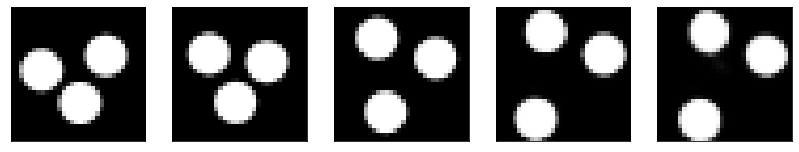

GD iterations:
i=0 | err=56.259811
i=1 | err=54.944195
i=2 | err=53.156670
i=3 | err=51.153984
i=4 | err=49.007904
i=5 | err=46.683586
i=6 | err=44.273468
i=7 | err=41.755058
i=8 | err=39.180382
i=9 | err=36.593727
i=10 | err=33.998440
i=11 | err=31.507406
i=12 | err=29.198273
i=13 | err=27.058407
i=14 | err=25.043850
i=15 | err=23.153233
i=16 | err=21.374752
i=17 | err=19.689754
i=18 | err=18.067482
i=19 | err=16.575691
i=20 | err=15.204384
i=21 | err=13.963720
i=22 | err=12.810663
i=23 | err=11.747822
i=24 | err=10.722589
i=25 | err=9.753181
i=26 | err=8.843157
i=27 | err=7.992032
i=28 | err=7.206391
i=29 | err=6.461682
Epoch=268 (4%) | out_positive=0.892243 | out_negative=0.144354 | mse=0.075167


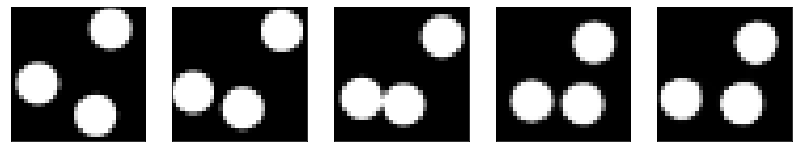

GD iterations:
i=0 | err=51.914169
i=1 | err=50.723072
i=2 | err=49.051975
i=3 | err=47.170830
i=4 | err=45.148727
i=5 | err=42.946495
i=6 | err=40.755142
i=7 | err=38.519005
i=8 | err=36.290848
i=9 | err=34.059521
i=10 | err=31.811228
i=11 | err=29.689371
i=12 | err=27.617146
i=13 | err=25.722675
i=14 | err=23.963709
i=15 | err=22.285511
i=16 | err=20.653770
i=17 | err=19.086578
i=18 | err=17.584797
i=19 | err=16.175575
i=20 | err=14.888583
i=21 | err=13.674807
i=22 | err=12.507276
i=23 | err=11.393512
i=24 | err=10.357501
i=25 | err=9.366214
i=26 | err=8.430427
i=27 | err=7.582483
i=28 | err=6.765622
i=29 | err=6.019218
Epoch=268 (6%) | out_positive=0.890825 | out_negative=0.142862 | mse=0.066679


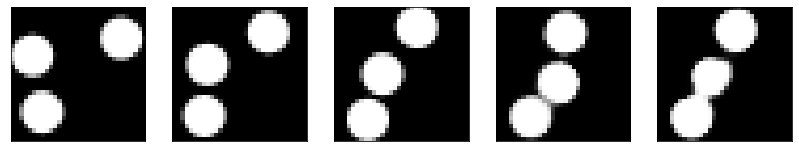

GD iterations:
i=0 | err=52.390434
i=1 | err=51.233971
i=2 | err=49.705223
i=3 | err=48.004631
i=4 | err=46.276703
i=5 | err=44.478313
i=6 | err=42.668270
i=7 | err=40.749332
i=8 | err=38.705772
i=9 | err=36.567955
i=10 | err=34.346706
i=11 | err=32.109795
i=12 | err=29.911160
i=13 | err=27.769892
i=14 | err=25.809437
i=15 | err=23.911953
i=16 | err=22.133938
i=17 | err=20.466717
i=18 | err=18.903294
i=19 | err=17.452299
i=20 | err=16.091454
i=21 | err=14.863061
i=22 | err=13.727687
i=23 | err=12.656643
i=24 | err=11.628273
i=25 | err=10.674768
i=26 | err=9.760395
i=27 | err=8.887802
i=28 | err=8.035239
i=29 | err=7.215809
Epoch=268 (8%) | out_positive=0.881068 | out_negative=0.121538 | mse=0.072313


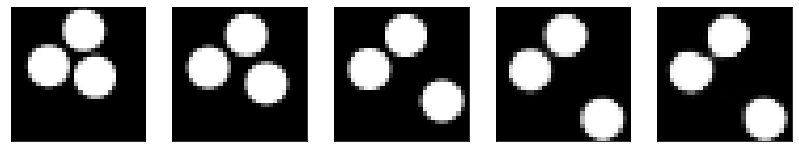

GD iterations:
i=0 | err=52.951416
i=1 | err=51.759834
i=2 | err=50.145386
i=3 | err=48.309509
i=4 | err=46.332130
i=5 | err=44.261063
i=6 | err=42.069092
i=7 | err=39.790146
i=8 | err=37.496460
i=9 | err=35.169250
i=10 | err=32.925945
i=11 | err=30.739269
i=12 | err=28.515308
i=13 | err=26.469559
i=14 | err=24.515545
i=15 | err=22.624636
i=16 | err=20.798616
i=17 | err=19.089611
i=18 | err=17.536562
i=19 | err=16.164862
i=20 | err=14.936766
i=21 | err=13.805458
i=22 | err=12.731525
i=23 | err=11.674295
i=24 | err=10.643395
i=25 | err=9.683931
i=26 | err=8.793358
i=27 | err=7.942876
i=28 | err=7.112519
i=29 | err=6.327169
Epoch=268 (9%) | out_positive=0.905588 | out_negative=0.167618 | mse=0.068979


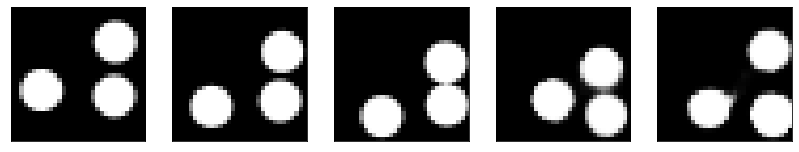

GD iterations:
i=0 | err=55.906979
i=1 | err=54.640511
i=2 | err=52.915100
i=3 | err=51.019783
i=4 | err=48.945759
i=5 | err=46.718884
i=6 | err=44.443993
i=7 | err=42.125366
i=8 | err=39.856461
i=9 | err=37.461704
i=10 | err=35.085136
i=11 | err=32.674072
i=12 | err=30.425959
i=13 | err=28.280342
i=14 | err=26.231951
i=15 | err=24.312283
i=16 | err=22.501503
i=17 | err=20.804012
i=18 | err=19.255142
i=19 | err=17.806252
i=20 | err=16.472185
i=21 | err=15.213062
i=22 | err=14.026084
i=23 | err=12.898890
i=24 | err=11.875095
i=25 | err=10.918472
i=26 | err=10.025229
i=27 | err=9.143368
i=28 | err=8.288267
i=29 | err=7.432879
Epoch=268 (11%) | out_positive=0.855997 | out_negative=0.117825 | mse=0.068824


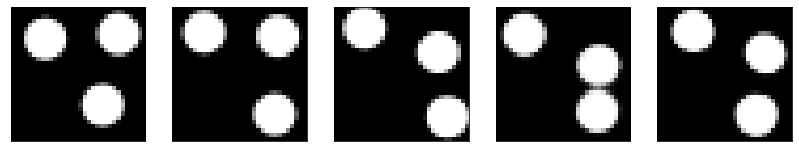

GD iterations:
i=0 | err=61.262741
i=1 | err=59.702446
i=2 | err=57.674149
i=3 | err=55.426697
i=4 | err=53.044434
i=5 | err=50.609230
i=6 | err=48.097038
i=7 | err=45.481579
i=8 | err=42.908630
i=9 | err=40.222847
i=10 | err=37.427917
i=11 | err=34.643082
i=12 | err=31.897617
i=13 | err=29.350903
i=14 | err=27.004776
i=15 | err=24.884853
i=16 | err=22.926914
i=17 | err=21.042290
i=18 | err=19.248211
i=19 | err=17.481209
i=20 | err=15.853731
i=21 | err=14.359757
i=22 | err=13.009235
i=23 | err=11.789537
i=24 | err=10.710304
i=25 | err=9.711019
i=26 | err=8.832357
i=27 | err=8.038891
i=28 | err=7.321016
i=29 | err=6.634199
Epoch=268 (13%) | out_positive=0.852065 | out_negative=0.091480 | mse=0.069319


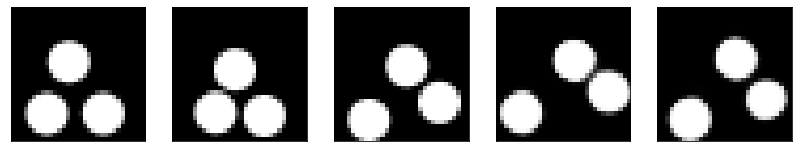

GD iterations:
i=0 | err=55.284103
i=1 | err=53.937191
i=2 | err=52.161102
i=3 | err=50.171230
i=4 | err=48.103065
i=5 | err=45.918892
i=6 | err=43.712593
i=7 | err=41.446857
i=8 | err=39.105057
i=9 | err=36.776031
i=10 | err=34.416359
i=11 | err=32.187950
i=12 | err=30.052601
i=13 | err=27.975708
i=14 | err=25.962662
i=15 | err=24.011726
i=16 | err=22.136282
i=17 | err=20.382771
i=18 | err=18.711109
i=19 | err=17.079416
i=20 | err=15.521872
i=21 | err=14.084253
i=22 | err=12.787700
i=23 | err=11.644869
i=24 | err=10.599937
i=25 | err=9.621326
i=26 | err=8.701771
i=27 | err=7.813435
i=28 | err=6.940453
i=29 | err=6.130980
Epoch=268 (15%) | out_positive=0.904887 | out_negative=0.175393 | mse=0.071579


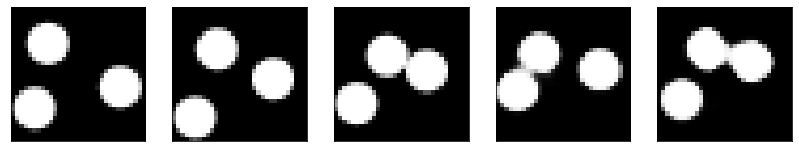

GD iterations:
i=0 | err=53.924866
i=1 | err=52.646828
i=2 | err=50.924416
i=3 | err=48.940186
i=4 | err=46.829933
i=5 | err=44.690308
i=6 | err=42.495651
i=7 | err=40.305336
i=8 | err=38.118629
i=9 | err=35.832291
i=10 | err=33.545330
i=11 | err=31.341745
i=12 | err=29.116192
i=13 | err=26.979687
i=14 | err=24.995911
i=15 | err=23.141487
i=16 | err=21.433069
i=17 | err=19.822708
i=18 | err=18.329420
i=19 | err=16.926189
i=20 | err=15.576674
i=21 | err=14.346150
i=22 | err=13.219983
i=23 | err=12.195648
i=24 | err=11.209623
i=25 | err=10.224821
i=26 | err=9.289728
i=27 | err=8.392983
i=28 | err=7.540833
i=29 | err=6.730197
Epoch=268 (17%) | out_positive=0.873122 | out_negative=0.126534 | mse=0.070554


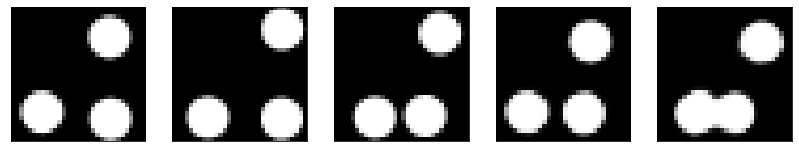

GD iterations:
i=0 | err=53.982960
i=1 | err=52.730904
i=2 | err=50.981979
i=3 | err=49.112465
i=4 | err=47.176399
i=5 | err=45.145424
i=6 | err=43.052769
i=7 | err=40.889511
i=8 | err=38.618309
i=9 | err=36.370121
i=10 | err=34.116840
i=11 | err=31.913910
i=12 | err=29.709570
i=13 | err=27.596355
i=14 | err=25.642086
i=15 | err=23.782665
i=16 | err=22.040421
i=17 | err=20.443485
i=18 | err=19.017248
i=19 | err=17.687723
i=20 | err=16.383255
i=21 | err=15.150856
i=22 | err=13.953921
i=23 | err=12.814915
i=24 | err=11.744895
i=25 | err=10.789542
i=26 | err=9.875571
i=27 | err=9.047439
i=28 | err=8.278529
i=29 | err=7.548287
Epoch=268 (18%) | out_positive=0.909863 | out_negative=0.087933 | mse=0.070550


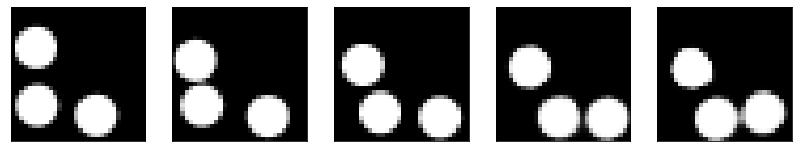

GD iterations:
i=0 | err=54.695057
i=1 | err=53.506596
i=2 | err=51.852867
i=3 | err=50.000092
i=4 | err=48.048584
i=5 | err=45.946678
i=6 | err=43.745678
i=7 | err=41.516285
i=8 | err=39.261654
i=9 | err=36.928215
i=10 | err=34.560509
i=11 | err=32.078003
i=12 | err=29.652164
i=13 | err=27.267952
i=14 | err=25.005938
i=15 | err=22.886068
i=16 | err=20.976295
i=17 | err=19.154041
i=18 | err=17.481056
i=19 | err=15.881679
i=20 | err=14.341593
i=21 | err=12.926829
i=22 | err=11.602710
i=23 | err=10.412483
i=24 | err=9.354989
i=25 | err=8.407700
i=26 | err=7.547791
i=27 | err=6.762037
i=28 | err=6.049014
i=29 | err=5.359802
Epoch=268 (20%) | out_positive=0.893553 | out_negative=0.147447 | mse=0.068532


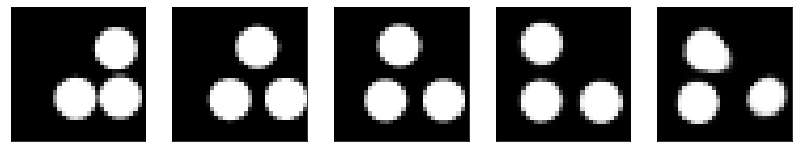

GD iterations:
i=0 | err=52.339935
i=1 | err=51.046127
i=2 | err=49.178322
i=3 | err=47.180859
i=4 | err=45.121647
i=5 | err=43.021980
i=6 | err=40.910858
i=7 | err=38.932247
i=8 | err=36.865150
i=9 | err=34.805824
i=10 | err=32.735870
i=11 | err=30.705856
i=12 | err=28.703556
i=13 | err=26.731087
i=14 | err=24.821703
i=15 | err=23.047705
i=16 | err=21.365665
i=17 | err=19.793289
i=18 | err=18.364906
i=19 | err=17.004580
i=20 | err=15.762722
i=21 | err=14.613084
i=22 | err=13.509956
i=23 | err=12.472771
i=24 | err=11.475897
i=25 | err=10.529531
i=26 | err=9.613028
i=27 | err=8.724548
i=28 | err=7.900770
i=29 | err=7.092610
Epoch=268 (22%) | out_positive=0.879136 | out_negative=0.085109 | mse=0.067389


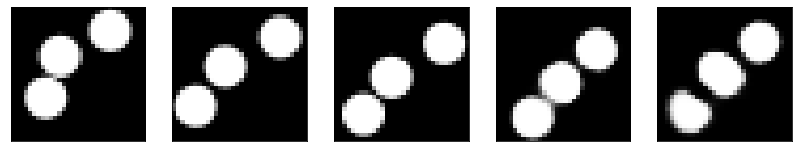

GD iterations:
i=0 | err=55.560287
i=1 | err=54.326698
i=2 | err=52.604641
i=3 | err=50.660984
i=4 | err=48.633652
i=5 | err=46.555733
i=6 | err=44.388824
i=7 | err=42.208992
i=8 | err=39.943565
i=9 | err=37.718819
i=10 | err=35.448956
i=11 | err=33.223217
i=12 | err=31.063021
i=13 | err=28.945602
i=14 | err=26.922649
i=15 | err=24.968525
i=16 | err=23.138388
i=17 | err=21.445606
i=18 | err=19.852009
i=19 | err=18.353615
i=20 | err=16.915634
i=21 | err=15.536658
i=22 | err=14.180483
i=23 | err=12.900893
i=24 | err=11.734291
i=25 | err=10.676224
i=26 | err=9.697905
i=27 | err=8.780777
i=28 | err=7.914746
i=29 | err=7.070653
Epoch=268 (24%) | out_positive=0.884269 | out_negative=0.151045 | mse=0.070758


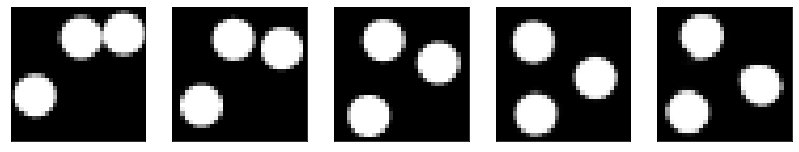

GD iterations:
i=0 | err=57.931450
i=1 | err=56.722229
i=2 | err=54.974880
i=3 | err=52.985756
i=4 | err=50.848732
i=5 | err=48.492294
i=6 | err=46.083504
i=7 | err=43.534225
i=8 | err=40.951599
i=9 | err=38.365097
i=10 | err=35.863243
i=11 | err=33.347931
i=12 | err=30.928478
i=13 | err=28.648813
i=14 | err=26.603882
i=15 | err=24.646458
i=16 | err=22.784008
i=17 | err=21.007177
i=18 | err=19.332676
i=19 | err=17.734726
i=20 | err=16.220881
i=21 | err=14.806884
i=22 | err=13.523781
i=23 | err=12.326647
i=24 | err=11.243136
i=25 | err=10.257137
i=26 | err=9.344509
i=27 | err=8.503774
i=28 | err=7.704337
i=29 | err=6.942064
Epoch=268 (26%) | out_positive=0.851335 | out_negative=0.112620 | mse=0.072486


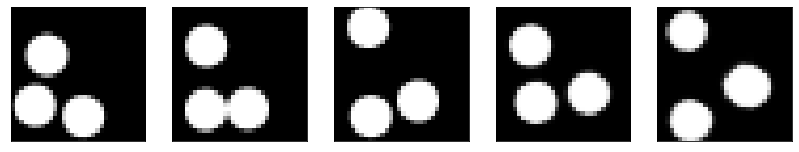

GD iterations:
i=0 | err=54.793831
i=1 | err=53.452847
i=2 | err=51.591728
i=3 | err=49.490040
i=4 | err=47.241215
i=5 | err=44.957451
i=6 | err=42.873543
i=7 | err=40.772110
i=8 | err=38.675743
i=9 | err=36.572884
i=10 | err=34.463615
i=11 | err=32.286217
i=12 | err=30.201345
i=13 | err=28.188551
i=14 | err=26.218658
i=15 | err=24.387623
i=16 | err=22.675064
i=17 | err=20.992645
i=18 | err=19.411728
i=19 | err=17.925976
i=20 | err=16.536226
i=21 | err=15.178810
i=22 | err=13.912800
i=23 | err=12.725742
i=24 | err=11.668360
i=25 | err=10.706662
i=26 | err=9.821775
i=27 | err=9.002806
i=28 | err=8.232609
i=29 | err=7.470584
Epoch=268 (28%) | out_positive=0.880809 | out_negative=0.067471 | mse=0.070660


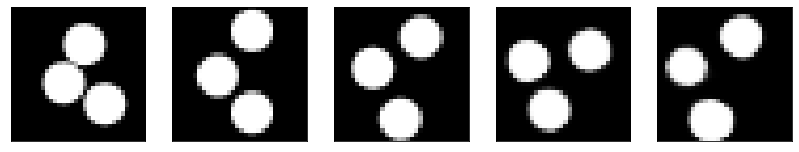

GD iterations:
i=0 | err=56.886581
i=1 | err=55.743782
i=2 | err=54.156204
i=3 | err=52.314331
i=4 | err=50.397125
i=5 | err=48.409096
i=6 | err=46.396843
i=7 | err=44.339340
i=8 | err=42.226582
i=9 | err=40.146484
i=10 | err=38.068901
i=11 | err=35.921574
i=12 | err=33.780403
i=13 | err=31.657652
i=14 | err=29.479298
i=15 | err=27.343109
i=16 | err=25.293747
i=17 | err=23.370014
i=18 | err=21.494740
i=19 | err=19.759201
i=20 | err=18.226665
i=21 | err=16.750095
i=22 | err=15.334661
i=23 | err=14.017979
i=24 | err=12.815687
i=25 | err=11.711758
i=26 | err=10.708052
i=27 | err=9.798178
i=28 | err=8.949144
i=29 | err=8.117272
Epoch=268 (30%) | out_positive=0.881723 | out_negative=0.103652 | mse=0.077760


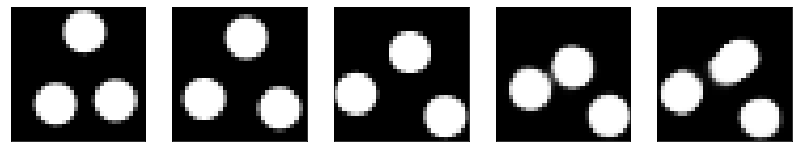

GD iterations:
i=0 | err=51.288330
i=1 | err=50.025906
i=2 | err=48.328690
i=3 | err=46.482315
i=4 | err=44.426258
i=5 | err=42.388092
i=6 | err=40.249043
i=7 | err=38.157982
i=8 | err=35.967888
i=9 | err=33.778763
i=10 | err=31.533239
i=11 | err=29.346582
i=12 | err=27.089090
i=13 | err=24.977491
i=14 | err=22.995594
i=15 | err=21.131613
i=16 | err=19.403536
i=17 | err=17.840435
i=18 | err=16.430832
i=19 | err=15.140903
i=20 | err=13.912913
i=21 | err=12.751918
i=22 | err=11.631689
i=23 | err=10.618402
i=24 | err=9.738934
i=25 | err=8.910572
i=26 | err=8.102112
i=27 | err=7.323007
i=28 | err=6.556441
i=29 | err=5.844038
Epoch=268 (31%) | out_positive=0.906328 | out_negative=0.168344 | mse=0.069297


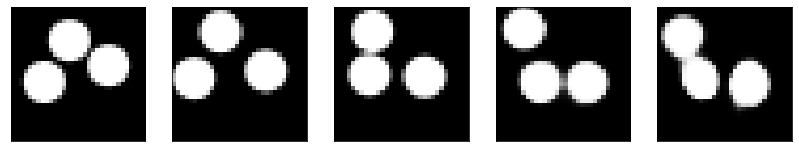

GD iterations:
i=0 | err=51.533974
i=1 | err=50.294594
i=2 | err=48.603600
i=3 | err=46.768749
i=4 | err=44.779472
i=5 | err=42.764359
i=6 | err=40.704216
i=7 | err=38.630615
i=8 | err=36.467747
i=9 | err=34.309608
i=10 | err=32.100174
i=11 | err=29.915081
i=12 | err=27.750010
i=13 | err=25.618687
i=14 | err=23.584145
i=15 | err=21.724092
i=16 | err=20.044262
i=17 | err=18.509544
i=18 | err=17.078110
i=19 | err=15.746768
i=20 | err=14.527321
i=21 | err=13.370131
i=22 | err=12.281546
i=23 | err=11.305862
i=24 | err=10.391375
i=25 | err=9.520928
i=26 | err=8.688710
i=27 | err=7.896838
i=28 | err=7.141319
i=29 | err=6.405013
Epoch=268 (33%) | out_positive=0.927456 | out_negative=0.160996 | mse=0.068672


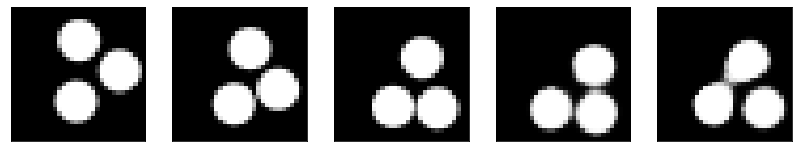

GD iterations:
i=0 | err=57.046242
i=1 | err=55.741566
i=2 | err=54.000298
i=3 | err=52.028656
i=4 | err=49.911655
i=5 | err=47.666992
i=6 | err=45.347652
i=7 | err=42.901241
i=8 | err=40.497093
i=9 | err=38.074768
i=10 | err=35.622356
i=11 | err=33.286125
i=12 | err=31.018501
i=13 | err=28.889652
i=14 | err=26.871223
i=15 | err=24.882538
i=16 | err=23.057346
i=17 | err=21.267303
i=18 | err=19.600533
i=19 | err=18.007957
i=20 | err=16.562202
i=21 | err=15.203597
i=22 | err=13.937674
i=23 | err=12.758304
i=24 | err=11.655960
i=25 | err=10.620373
i=26 | err=9.631723
i=27 | err=8.733364
i=28 | err=7.883899
i=29 | err=7.105545
Epoch=268 (35%) | out_positive=0.875605 | out_negative=0.129913 | mse=0.073320


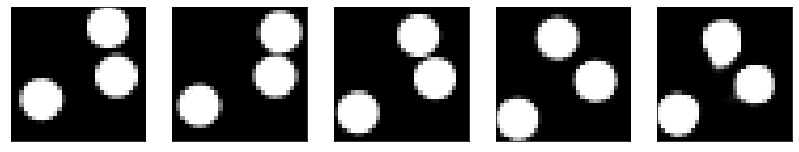

GD iterations:
i=0 | err=58.613113
i=1 | err=57.419479
i=2 | err=55.610882
i=3 | err=53.586582
i=4 | err=51.383865
i=5 | err=49.071377
i=6 | err=46.847031
i=7 | err=44.607994
i=8 | err=42.317879
i=9 | err=40.036400
i=10 | err=37.865643
i=11 | err=35.717339
i=12 | err=33.580070
i=13 | err=31.521732
i=14 | err=29.541016
i=15 | err=27.582809
i=16 | err=25.683651
i=17 | err=23.896732
i=18 | err=22.181145
i=19 | err=20.512396
i=20 | err=18.955082
i=21 | err=17.501402
i=22 | err=16.097977
i=23 | err=14.823581
i=24 | err=13.616684
i=25 | err=12.441676
i=26 | err=11.305294
i=27 | err=10.285897
i=28 | err=9.344929
i=29 | err=8.465478
Epoch=268 (37%) | out_positive=0.870940 | out_negative=0.097991 | mse=0.077458


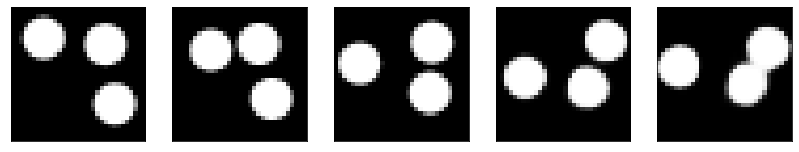

GD iterations:
i=0 | err=53.778774
i=1 | err=52.363686
i=2 | err=50.400932
i=3 | err=48.297821
i=4 | err=46.031551
i=5 | err=43.729019
i=6 | err=41.471939
i=7 | err=39.173203
i=8 | err=36.746819
i=9 | err=34.446762
i=10 | err=32.178078
i=11 | err=30.011843
i=12 | err=27.926451
i=13 | err=25.911991
i=14 | err=24.099190
i=15 | err=22.446043
i=16 | err=20.830683
i=17 | err=19.263714
i=18 | err=17.811605
i=19 | err=16.448078
i=20 | err=15.130163
i=21 | err=13.840301
i=22 | err=12.642704
i=23 | err=11.577168
i=24 | err=10.570292
i=25 | err=9.636783
i=26 | err=8.776129
i=27 | err=7.974958
i=28 | err=7.207732
i=29 | err=6.487613
Epoch=268 (39%) | out_positive=0.876048 | out_negative=0.133628 | mse=0.067321


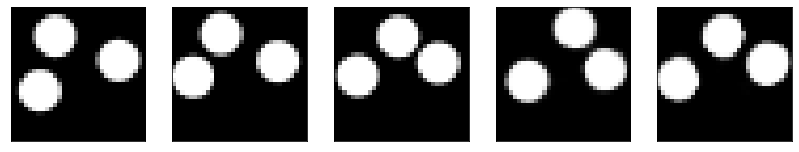

GD iterations:
i=0 | err=52.489754
i=1 | err=51.212555
i=2 | err=49.397285
i=3 | err=47.397141
i=4 | err=45.349323
i=5 | err=43.259323
i=6 | err=41.167686
i=7 | err=38.926178
i=8 | err=36.683701
i=9 | err=34.447197
i=10 | err=32.131287
i=11 | err=29.855858
i=12 | err=27.582109
i=13 | err=25.413246
i=14 | err=23.271723
i=15 | err=21.242138
i=16 | err=19.382345
i=17 | err=17.699997
i=18 | err=16.174553
i=19 | err=14.779730
i=20 | err=13.477210
i=21 | err=12.289635
i=22 | err=11.169381
i=23 | err=10.134064
i=24 | err=9.200619
i=25 | err=8.353619
i=26 | err=7.548223
i=27 | err=6.798040
i=28 | err=6.091236
i=29 | err=5.407290
Epoch=268 (40%) | out_positive=0.886538 | out_negative=0.188064 | mse=0.068170


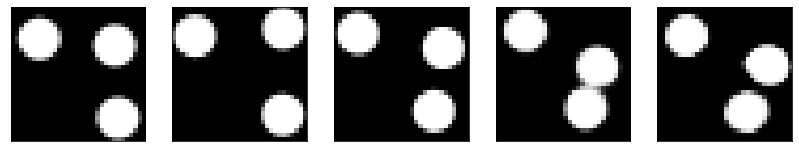

GD iterations:
i=0 | err=55.150997
i=1 | err=53.809189
i=2 | err=51.891045
i=3 | err=49.723446
i=4 | err=47.400402
i=5 | err=45.024353
i=6 | err=42.635746
i=7 | err=40.237862
i=8 | err=37.886559
i=9 | err=35.512264
i=10 | err=33.340561
i=11 | err=31.272099
i=12 | err=29.177931
i=13 | err=27.138838
i=14 | err=25.124958
i=15 | err=23.208494
i=16 | err=21.449965
i=17 | err=19.807968
i=18 | err=18.305206
i=19 | err=16.898262
i=20 | err=15.541419
i=21 | err=14.304375
i=22 | err=13.137998
i=23 | err=12.056047
i=24 | err=11.059353
i=25 | err=10.134726
i=26 | err=9.287810
i=27 | err=8.526730
i=28 | err=7.813254
i=29 | err=7.130002
Epoch=268 (42%) | out_positive=0.906783 | out_negative=0.123959 | mse=0.075654


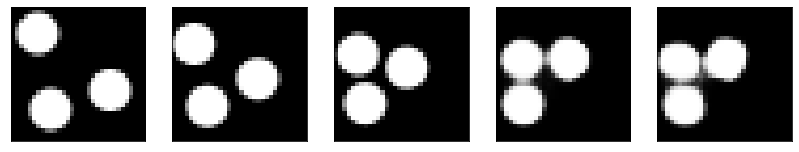

GD iterations:
i=0 | err=54.107010
i=1 | err=52.989021
i=2 | err=51.345512
i=3 | err=49.488083
i=4 | err=47.529358
i=5 | err=45.398777
i=6 | err=43.310165
i=7 | err=41.067131
i=8 | err=38.871788
i=9 | err=36.605251
i=10 | err=34.368057
i=11 | err=32.035820
i=12 | err=29.863846
i=13 | err=27.723808
i=14 | err=25.630733
i=15 | err=23.565441
i=16 | err=21.578884
i=17 | err=19.723221
i=18 | err=18.059277
i=19 | err=16.577900
i=20 | err=15.199716
i=21 | err=13.882627
i=22 | err=12.650784
i=23 | err=11.499039
i=24 | err=10.420022
i=25 | err=9.433456
i=26 | err=8.516699
i=27 | err=7.638816
i=28 | err=6.791566
i=29 | err=5.965603
Epoch=268 (44%) | out_positive=0.862353 | out_negative=0.170863 | mse=0.070700


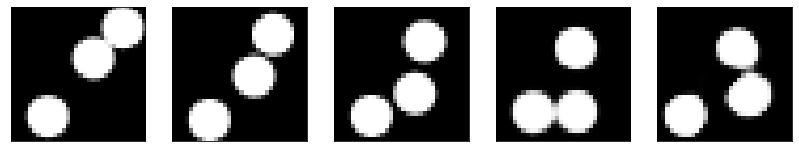

GD iterations:
i=0 | err=53.826630
i=1 | err=52.573692
i=2 | err=50.945038
i=3 | err=49.159576
i=4 | err=47.341393
i=5 | err=45.483608
i=6 | err=43.669762
i=7 | err=41.778625
i=8 | err=39.825500
i=9 | err=37.809658
i=10 | err=35.724129
i=11 | err=33.696178
i=12 | err=31.620678
i=13 | err=29.518974
i=14 | err=27.426403
i=15 | err=25.420395
i=16 | err=23.488754
i=17 | err=21.629307
i=18 | err=19.898838
i=19 | err=18.362377
i=20 | err=16.956549
i=21 | err=15.642687
i=22 | err=14.434748
i=23 | err=13.292711
i=24 | err=12.200245
i=25 | err=11.160175
i=26 | err=10.169247
i=27 | err=9.228684
i=28 | err=8.326300
i=29 | err=7.472554
Epoch=268 (46%) | out_positive=0.910196 | out_negative=0.099410 | mse=0.074944


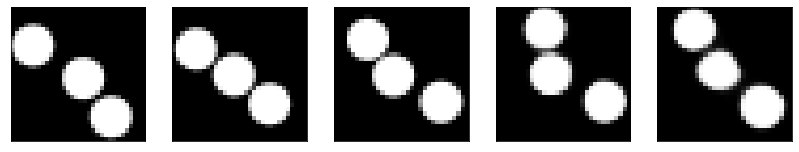

GD iterations:
i=0 | err=55.249447
i=1 | err=54.069054
i=2 | err=52.427193
i=3 | err=50.565506
i=4 | err=48.650551
i=5 | err=46.697659
i=6 | err=44.578228
i=7 | err=42.312325
i=8 | err=39.929790
i=9 | err=37.517773
i=10 | err=35.191448
i=11 | err=32.920441
i=12 | err=30.644875
i=13 | err=28.458397
i=14 | err=26.358833
i=15 | err=24.399372
i=16 | err=22.489170
i=17 | err=20.584721
i=18 | err=18.777281
i=19 | err=17.053373
i=20 | err=15.404232
i=21 | err=13.895544
i=22 | err=12.461687
i=23 | err=11.148956
i=24 | err=9.942013
i=25 | err=8.855425
i=26 | err=7.889978
i=27 | err=7.025001
i=28 | err=6.222054
i=29 | err=5.473101
Epoch=268 (48%) | out_positive=0.897115 | out_negative=0.187813 | mse=0.068002


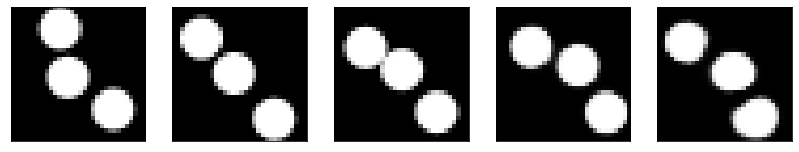

GD iterations:
i=0 | err=53.864861
i=1 | err=52.588341
i=2 | err=50.900959
i=3 | err=49.036896
i=4 | err=47.112793
i=5 | err=45.109409
i=6 | err=43.051811
i=7 | err=40.947495
i=8 | err=38.798866
i=9 | err=36.689568
i=10 | err=34.574196
i=11 | err=32.443096
i=12 | err=30.252310
i=13 | err=28.028194
i=14 | err=25.909828
i=15 | err=23.820869
i=16 | err=21.846762
i=17 | err=19.963375
i=18 | err=18.181606
i=19 | err=16.506836
i=20 | err=14.964483
i=21 | err=13.537574
i=22 | err=12.211399
i=23 | err=10.955914
i=24 | err=9.852391
i=25 | err=8.830371
i=26 | err=7.876328
i=27 | err=6.978712
i=28 | err=6.121302
i=29 | err=5.300459
Epoch=268 (50%) | out_positive=0.885405 | out_negative=0.191550 | mse=0.064311


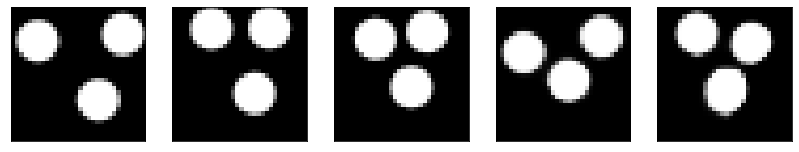

GD iterations:
i=0 | err=51.357307
i=1 | err=50.238049
i=2 | err=48.712605
i=3 | err=46.919106
i=4 | err=45.063255
i=5 | err=43.110210
i=6 | err=41.240334
i=7 | err=39.253738
i=8 | err=37.257225
i=9 | err=35.246563
i=10 | err=33.313946
i=11 | err=31.442822
i=12 | err=29.642353
i=13 | err=27.891293
i=14 | err=26.154045
i=15 | err=24.451559
i=16 | err=22.832304
i=17 | err=21.289494
i=18 | err=19.770702
i=19 | err=18.409843
i=20 | err=17.110516
i=21 | err=15.925817
i=22 | err=14.772097
i=23 | err=13.692599
i=24 | err=12.658844
i=25 | err=11.727146
i=26 | err=10.834225
i=27 | err=9.981693
i=28 | err=9.130510
i=29 | err=8.318947
Epoch=268 (52%) | out_positive=0.910754 | out_negative=0.105978 | mse=0.072444


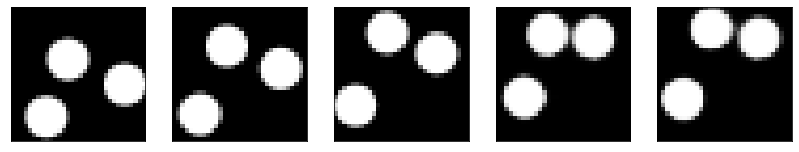

GD iterations:
i=0 | err=54.361084
i=1 | err=53.164597
i=2 | err=51.523949
i=3 | err=49.774158
i=4 | err=47.913361
i=5 | err=45.999073
i=6 | err=43.929214
i=7 | err=41.716747
i=8 | err=39.441978
i=9 | err=37.228569
i=10 | err=35.042278
i=11 | err=32.824127
i=12 | err=30.610184
i=13 | err=28.431078
i=14 | err=26.346087
i=15 | err=24.427242
i=16 | err=22.675709
i=17 | err=20.971912
i=18 | err=19.380491
i=19 | err=17.880190
i=20 | err=16.449169
i=21 | err=15.094671
i=22 | err=13.816359
i=23 | err=12.613441
i=24 | err=11.494255
i=25 | err=10.451829
i=26 | err=9.493214
i=27 | err=8.640406
i=28 | err=7.850328
i=29 | err=7.101922
Epoch=268 (53%) | out_positive=0.908438 | out_negative=0.152192 | mse=0.075140


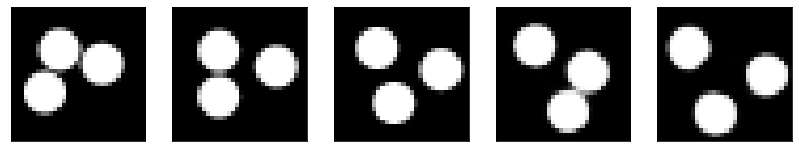

GD iterations:
i=0 | err=54.714993
i=1 | err=53.432106
i=2 | err=51.631447
i=3 | err=49.644363
i=4 | err=47.538647
i=5 | err=45.433289
i=6 | err=43.259159
i=7 | err=41.077362
i=8 | err=38.932251
i=9 | err=36.770275
i=10 | err=34.591667
i=11 | err=32.393280
i=12 | err=30.242926
i=13 | err=28.179337
i=14 | err=26.178947
i=15 | err=24.263214
i=16 | err=22.461231
i=17 | err=20.776287
i=18 | err=19.271200
i=19 | err=17.843998
i=20 | err=16.541904
i=21 | err=15.299878
i=22 | err=14.109491
i=23 | err=12.968869
i=24 | err=11.848450
i=25 | err=10.827028
i=26 | err=9.863218
i=27 | err=8.934084
i=28 | err=8.037095
i=29 | err=7.189172
Epoch=268 (55%) | out_positive=0.856759 | out_negative=0.087627 | mse=0.069942


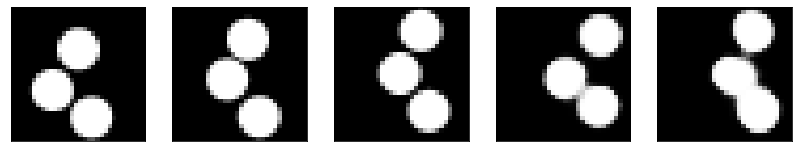

GD iterations:
i=0 | err=58.314320
i=1 | err=57.051018
i=2 | err=55.282692
i=3 | err=53.315189
i=4 | err=51.210373
i=5 | err=48.881275
i=6 | err=46.468658
i=7 | err=43.973312
i=8 | err=41.480598
i=9 | err=38.871613
i=10 | err=36.313221
i=11 | err=33.831131
i=12 | err=31.442951
i=13 | err=29.177532
i=14 | err=27.030811
i=15 | err=25.006023
i=16 | err=23.110632
i=17 | err=21.257715
i=18 | err=19.460186
i=19 | err=17.820099
i=20 | err=16.284622
i=21 | err=14.861076
i=22 | err=13.587238
i=23 | err=12.408625
i=24 | err=11.301853
i=25 | err=10.280521
i=26 | err=9.347740
i=27 | err=8.475971
i=28 | err=7.660791
i=29 | err=6.875018
Epoch=268 (57%) | out_positive=0.891649 | out_negative=0.135049 | mse=0.072576


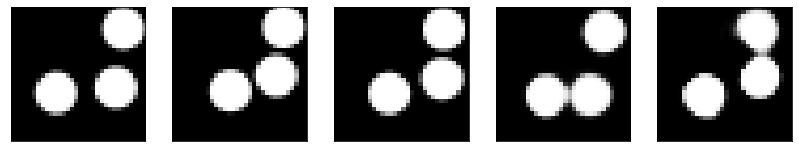

GD iterations:
i=0 | err=56.357780
i=1 | err=54.990700
i=2 | err=53.134178
i=3 | err=51.039093
i=4 | err=48.877464
i=5 | err=46.697224
i=6 | err=44.389107
i=7 | err=42.002518
i=8 | err=39.613171
i=9 | err=37.234543
i=10 | err=34.953884
i=11 | err=32.652370
i=12 | err=30.497952
i=13 | err=28.411022
i=14 | err=26.376625
i=15 | err=24.445601
i=16 | err=22.539310
i=17 | err=20.637199
i=18 | err=18.841480
i=19 | err=17.199417
i=20 | err=15.717820
i=21 | err=14.341558
i=22 | err=13.087507
i=23 | err=11.887990
i=24 | err=10.784166
i=25 | err=9.765112
i=26 | err=8.863426
i=27 | err=8.043858
i=28 | err=7.289085
i=29 | err=6.552230
Epoch=268 (59%) | out_positive=0.885441 | out_negative=0.136746 | mse=0.070614


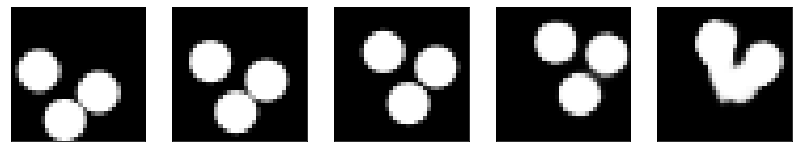

GD iterations:
i=0 | err=57.024078
i=1 | err=55.643074
i=2 | err=53.741207
i=3 | err=51.764458
i=4 | err=49.766785
i=5 | err=47.688087
i=6 | err=45.518230
i=7 | err=43.215855
i=8 | err=40.920094
i=9 | err=38.553192
i=10 | err=36.107422
i=11 | err=33.637100
i=12 | err=31.137798
i=13 | err=28.699471
i=14 | err=26.311808
i=15 | err=24.054880
i=16 | err=21.949333
i=17 | err=20.027084
i=18 | err=18.289513
i=19 | err=16.717009
i=20 | err=15.223055
i=21 | err=13.863733
i=22 | err=12.644032
i=23 | err=11.512287
i=24 | err=10.483372
i=25 | err=9.516670
i=26 | err=8.602190
i=27 | err=7.746697
i=28 | err=6.927802
i=29 | err=6.156923
Epoch=268 (61%) | out_positive=0.848138 | out_negative=0.117741 | mse=0.070471


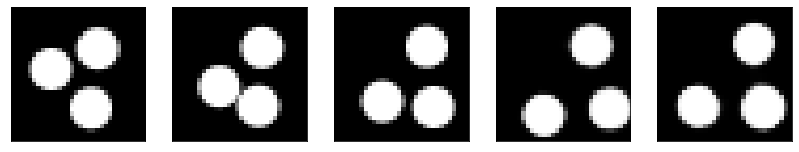

GD iterations:
i=0 | err=52.913265
i=1 | err=51.752716
i=2 | err=50.174469
i=3 | err=48.407219
i=4 | err=46.553387
i=5 | err=44.685547
i=6 | err=42.684387
i=7 | err=40.670101
i=8 | err=38.552723
i=9 | err=36.405449
i=10 | err=34.268845
i=11 | err=32.228828
i=12 | err=30.235165
i=13 | err=28.299751
i=14 | err=26.457273
i=15 | err=24.721935
i=16 | err=23.134928
i=17 | err=21.601967
i=18 | err=20.140190
i=19 | err=18.762772
i=20 | err=17.448475
i=21 | err=16.211454
i=22 | err=15.053644
i=23 | err=13.976458
i=24 | err=12.940907
i=25 | err=11.967539
i=26 | err=11.057065
i=27 | err=10.193846
i=28 | err=9.345760
i=29 | err=8.513252
Epoch=268 (62%) | out_positive=0.925889 | out_negative=0.092474 | mse=0.079403


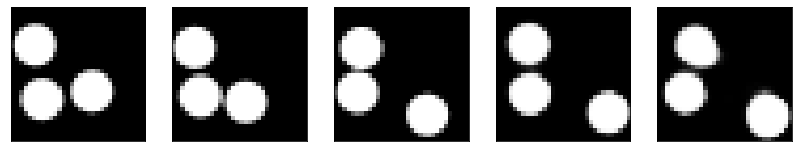

GD iterations:
i=0 | err=57.629299
i=1 | err=56.301735
i=2 | err=54.466949
i=3 | err=52.535328
i=4 | err=50.406570
i=5 | err=48.192390
i=6 | err=45.904686
i=7 | err=43.538361
i=8 | err=41.143669
i=9 | err=38.782188
i=10 | err=36.398293
i=11 | err=34.039516
i=12 | err=31.769518
i=13 | err=29.629385
i=14 | err=27.594330
i=15 | err=25.681469
i=16 | err=23.934290
i=17 | err=22.287996
i=18 | err=20.801044
i=19 | err=19.340673
i=20 | err=17.942608
i=21 | err=16.589493
i=22 | err=15.316476
i=23 | err=14.152227
i=24 | err=13.089262
i=25 | err=12.067930
i=26 | err=11.080540
i=27 | err=10.125860
i=28 | err=9.248131
i=29 | err=8.402149
Epoch=268 (64%) | out_positive=0.837418 | out_negative=0.085478 | mse=0.071346


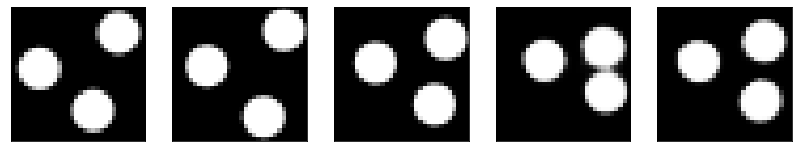

GD iterations:
i=0 | err=56.673946
i=1 | err=55.539841
i=2 | err=53.984451
i=3 | err=52.225983
i=4 | err=50.354454
i=5 | err=48.318291
i=6 | err=46.236511
i=7 | err=44.111778
i=8 | err=41.979717
i=9 | err=39.781403
i=10 | err=37.512318
i=11 | err=35.185745
i=12 | err=32.917870
i=13 | err=30.677811
i=14 | err=28.557318
i=15 | err=26.560696
i=16 | err=24.701075
i=17 | err=22.925005
i=18 | err=21.164902
i=19 | err=19.474957
i=20 | err=17.913794
i=21 | err=16.413818
i=22 | err=14.986331
i=23 | err=13.618807
i=24 | err=12.357305
i=25 | err=11.183259
i=26 | err=10.121656
i=27 | err=9.078941
i=28 | err=8.100641
i=29 | err=7.167061
Epoch=268 (65%) | out_positive=0.864170 | out_negative=0.134548 | mse=0.074194


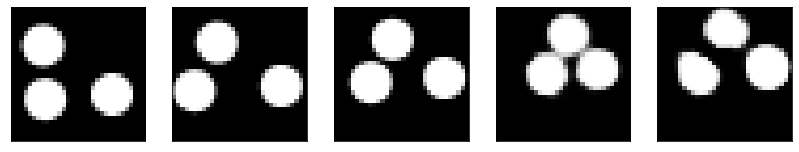

GD iterations:
i=0 | err=55.735664
i=1 | err=54.585899
i=2 | err=53.004501
i=3 | err=51.162239
i=4 | err=49.236649
i=5 | err=47.134880
i=6 | err=44.976562
i=7 | err=42.719864
i=8 | err=40.407932
i=9 | err=38.113407
i=10 | err=35.750782
i=11 | err=33.357582
i=12 | err=31.045410
i=13 | err=28.787342
i=14 | err=26.698978
i=15 | err=24.683422
i=16 | err=22.882881
i=17 | err=21.234604
i=18 | err=19.642069
i=19 | err=18.103199
i=20 | err=16.608700
i=21 | err=15.127079
i=22 | err=13.757006
i=23 | err=12.421045
i=24 | err=11.151176
i=25 | err=10.007221
i=26 | err=8.978607
i=27 | err=8.067018
i=28 | err=7.199755
i=29 | err=6.408181
Epoch=268 (67%) | out_positive=0.878826 | out_negative=0.117660 | mse=0.071069


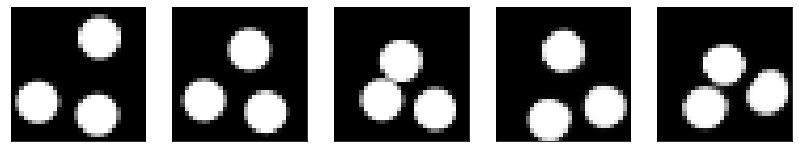

GD iterations:
i=0 | err=53.273987
i=1 | err=51.985847
i=2 | err=50.241261
i=3 | err=48.292946
i=4 | err=46.275684
i=5 | err=44.195305
i=6 | err=42.011696
i=7 | err=39.853924
i=8 | err=37.746029
i=9 | err=35.581589
i=10 | err=33.413307
i=11 | err=31.318104
i=12 | err=29.372408
i=13 | err=27.459803
i=14 | err=25.693604
i=15 | err=24.008190
i=16 | err=22.408531
i=17 | err=20.967255
i=18 | err=19.598656
i=19 | err=18.287598
i=20 | err=17.017738
i=21 | err=15.815214
i=22 | err=14.625087
i=23 | err=13.499504
i=24 | err=12.443163
i=25 | err=11.456736
i=26 | err=10.506929
i=27 | err=9.573006
i=28 | err=8.658606
i=29 | err=7.803092
Epoch=268 (68%) | out_positive=0.870497 | out_negative=0.102639 | mse=0.071107


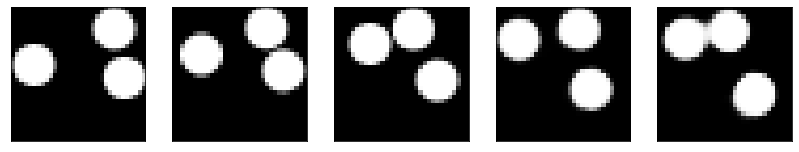

GD iterations:
i=0 | err=55.663803
i=1 | err=54.524414
i=2 | err=52.834801
i=3 | err=50.933472
i=4 | err=48.858547
i=5 | err=46.771534
i=6 | err=44.698330
i=7 | err=42.553886
i=8 | err=40.407738
i=9 | err=38.184372
i=10 | err=35.849392
i=11 | err=33.567642
i=12 | err=31.413620
i=13 | err=29.288578
i=14 | err=27.283924
i=15 | err=25.389343
i=16 | err=23.635065
i=17 | err=21.978279
i=18 | err=20.340387
i=19 | err=18.820673
i=20 | err=17.418741
i=21 | err=16.063444
i=22 | err=14.818588
i=23 | err=13.636473
i=24 | err=12.477320
i=25 | err=11.408119
i=26 | err=10.431059
i=27 | err=9.527187
i=28 | err=8.692785
i=29 | err=7.900097
Epoch=268 (70%) | out_positive=0.853320 | out_negative=0.090495 | mse=0.074315


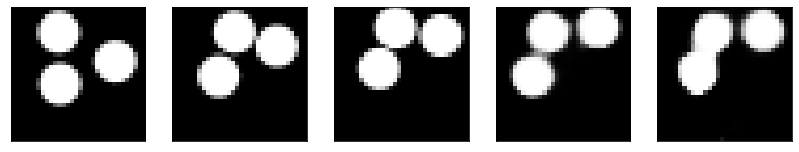

GD iterations:
i=0 | err=59.117172
i=1 | err=57.704285
i=2 | err=55.795288
i=3 | err=53.723694
i=4 | err=51.452698
i=5 | err=49.095329
i=6 | err=46.663071
i=7 | err=44.239326
i=8 | err=41.775864
i=9 | err=39.223007
i=10 | err=36.760971
i=11 | err=34.397346
i=12 | err=32.058960
i=13 | err=29.793930
i=14 | err=27.667702
i=15 | err=25.555065
i=16 | err=23.579510
i=17 | err=21.693369
i=18 | err=19.968334
i=19 | err=18.331842
i=20 | err=16.787439
i=21 | err=15.329256
i=22 | err=13.982269
i=23 | err=12.734485
i=24 | err=11.562092
i=25 | err=10.503099
i=26 | err=9.541039
i=27 | err=8.653883
i=28 | err=7.810211
i=29 | err=7.033890
Epoch=268 (72%) | out_positive=0.825532 | out_negative=0.162538 | mse=0.062620


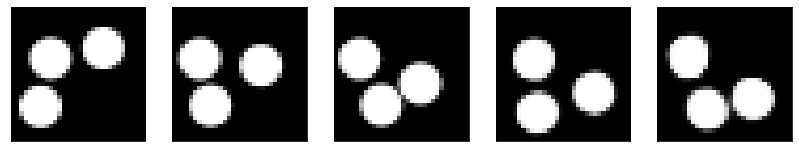

GD iterations:
i=0 | err=60.411789
i=1 | err=59.141628
i=2 | err=57.399826
i=3 | err=55.419716
i=4 | err=53.416924
i=5 | err=51.363205
i=6 | err=49.274326
i=7 | err=47.106228
i=8 | err=44.892303
i=9 | err=42.629959
i=10 | err=40.324059
i=11 | err=38.067200
i=12 | err=35.795353
i=13 | err=33.537682
i=14 | err=31.284101
i=15 | err=29.034815
i=16 | err=26.872093
i=17 | err=24.830456
i=18 | err=22.843292
i=19 | err=20.930475
i=20 | err=19.202961
i=21 | err=17.591146
i=22 | err=16.114700
i=23 | err=14.773464
i=24 | err=13.523781
i=25 | err=12.339260
i=26 | err=11.178930
i=27 | err=10.069719
i=28 | err=9.030727
i=29 | err=8.108286
Epoch=268 (74%) | out_positive=0.786469 | out_negative=0.089638 | mse=0.067690


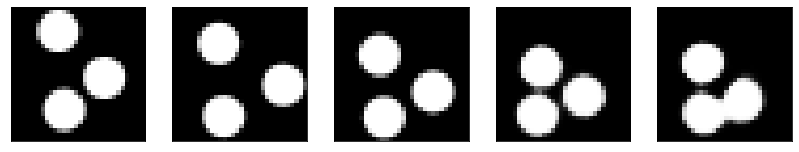

GD iterations:
i=0 | err=56.326004
i=1 | err=55.133377
i=2 | err=53.558678
i=3 | err=51.765762
i=4 | err=49.887211
i=5 | err=47.943142
i=6 | err=45.920189
i=7 | err=43.885773
i=8 | err=41.744827
i=9 | err=39.593502
i=10 | err=37.469303
i=11 | err=35.294334
i=12 | err=33.167839
i=13 | err=31.106169
i=14 | err=29.026594
i=15 | err=27.083353
i=16 | err=25.296127
i=17 | err=23.542950
i=18 | err=21.857502
i=19 | err=20.264534
i=20 | err=18.765448
i=21 | err=17.341644
i=22 | err=15.990249
i=23 | err=14.763079
i=24 | err=13.609387
i=25 | err=12.551232
i=26 | err=11.574356
i=27 | err=10.649420
i=28 | err=9.774023
i=29 | err=8.936304
Epoch=268 (76%) | out_positive=0.869462 | out_negative=0.112957 | mse=0.073739


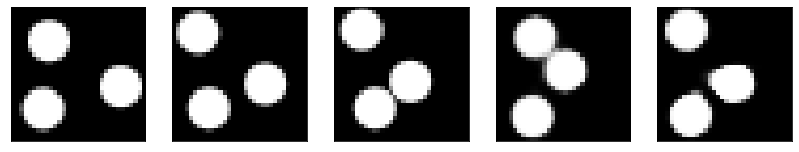

GD iterations:
i=0 | err=55.643936
i=1 | err=54.398567
i=2 | err=52.717026
i=3 | err=50.873180
i=4 | err=49.007565
i=5 | err=47.057320
i=6 | err=44.851990
i=7 | err=42.508614
i=8 | err=40.112659
i=9 | err=37.729698
i=10 | err=35.317703
i=11 | err=32.907776
i=12 | err=30.582142
i=13 | err=28.306496
i=14 | err=26.122566
i=15 | err=24.057819
i=16 | err=22.136866
i=17 | err=20.375519
i=18 | err=18.705210
i=19 | err=17.183947
i=20 | err=15.747206
i=21 | err=14.429884
i=22 | err=13.173157
i=23 | err=12.062668
i=24 | err=11.018361
i=25 | err=10.068984
i=26 | err=9.188848
i=27 | err=8.330414
i=28 | err=7.547987
i=29 | err=6.813015
Epoch=268 (77%) | out_positive=0.885467 | out_negative=0.159232 | mse=0.065571


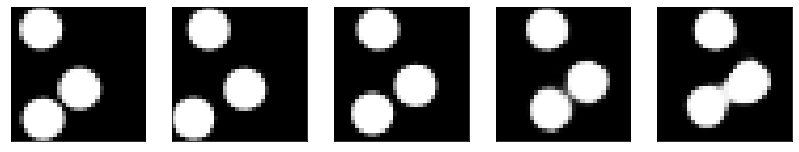

GD iterations:
i=0 | err=54.069183
i=1 | err=52.840469
i=2 | err=51.177055
i=3 | err=49.322037
i=4 | err=47.296497
i=5 | err=45.214451
i=6 | err=43.060562
i=7 | err=40.909500
i=8 | err=38.727119
i=9 | err=36.511108
i=10 | err=34.292873
i=11 | err=32.124748
i=12 | err=30.058176
i=13 | err=28.043930
i=14 | err=26.120298
i=15 | err=24.265490
i=16 | err=22.453978
i=17 | err=20.801918
i=18 | err=19.257414
i=19 | err=17.824718
i=20 | err=16.496601
i=21 | err=15.264757
i=22 | err=14.082054
i=23 | err=12.947537
i=24 | err=11.868374
i=25 | err=10.874994
i=26 | err=9.922939
i=27 | err=9.023373
i=28 | err=8.200239
i=29 | err=7.416042
Epoch=268 (79%) | out_positive=0.906666 | out_negative=0.095182 | mse=0.075094


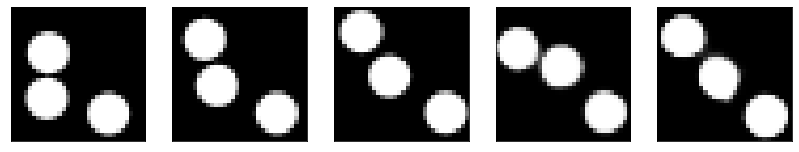

GD iterations:
i=0 | err=54.119293
i=1 | err=52.870811
i=2 | err=51.144901
i=3 | err=49.314812
i=4 | err=47.291458
i=5 | err=45.364407
i=6 | err=43.410240
i=7 | err=41.414898
i=8 | err=39.356541
i=9 | err=37.145210
i=10 | err=34.965790
i=11 | err=32.680214
i=12 | err=30.448677
i=13 | err=28.285107
i=14 | err=26.200184
i=15 | err=24.252480
i=16 | err=22.386864
i=17 | err=20.602448
i=18 | err=18.981262
i=19 | err=17.425446
i=20 | err=15.886267
i=21 | err=14.454416
i=22 | err=13.158331
i=23 | err=11.950420
i=24 | err=10.848894
i=25 | err=9.823116
i=26 | err=8.881346
i=27 | err=7.987746
i=28 | err=7.148140
i=29 | err=6.372009
Epoch=268 (81%) | out_positive=0.872403 | out_negative=0.139122 | mse=0.066804


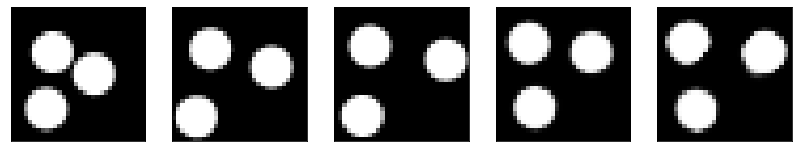

GD iterations:
i=0 | err=53.450447
i=1 | err=52.218105
i=2 | err=50.530235
i=3 | err=48.739769
i=4 | err=46.771484
i=5 | err=44.740501
i=6 | err=42.697960
i=7 | err=40.634094
i=8 | err=38.624569
i=9 | err=36.614635
i=10 | err=34.577148
i=11 | err=32.482323
i=12 | err=30.345680
i=13 | err=28.197845
i=14 | err=26.079521
i=15 | err=24.122284
i=16 | err=22.375290
i=17 | err=20.738110
i=18 | err=19.173611
i=19 | err=17.694923
i=20 | err=16.300203
i=21 | err=15.041916
i=22 | err=13.911287
i=23 | err=12.856822
i=24 | err=11.885260
i=25 | err=10.979444
i=26 | err=10.134869
i=27 | err=9.323582
i=28 | err=8.561855
i=29 | err=7.807205
Epoch=268 (83%) | out_positive=0.879797 | out_negative=0.122629 | mse=0.068047


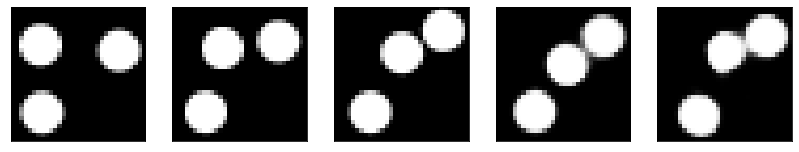

GD iterations:
i=0 | err=54.478745
i=1 | err=53.169647
i=2 | err=51.389149
i=3 | err=49.409611
i=4 | err=47.369049
i=5 | err=45.369904
i=6 | err=43.297039
i=7 | err=41.199242
i=8 | err=38.990166
i=9 | err=36.748734
i=10 | err=34.535149
i=11 | err=32.344696
i=12 | err=30.165459
i=13 | err=27.992336
i=14 | err=25.899414
i=15 | err=23.882658
i=16 | err=22.003494
i=17 | err=20.200386
i=18 | err=18.565208
i=19 | err=17.040401
i=20 | err=15.588033
i=21 | err=14.249079
i=22 | err=12.945705
i=23 | err=11.740370
i=24 | err=10.591713
i=25 | err=9.540751
i=26 | err=8.584975
i=27 | err=7.745603
i=28 | err=6.984739
i=29 | err=6.267274
Epoch=268 (85%) | out_positive=0.900744 | out_negative=0.148766 | mse=0.071746


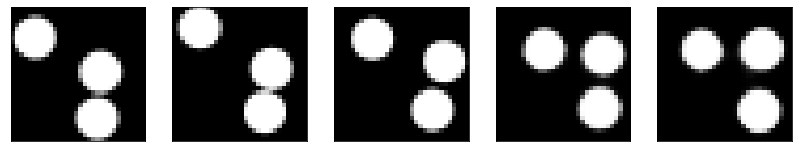

GD iterations:
i=0 | err=58.607635
i=1 | err=57.231255
i=2 | err=55.338333
i=3 | err=53.112186
i=4 | err=50.758698
i=5 | err=48.373508
i=6 | err=46.029850
i=7 | err=43.643482
i=8 | err=41.168205
i=9 | err=38.697350
i=10 | err=36.271767
i=11 | err=33.952713
i=12 | err=31.709438
i=13 | err=29.507910
i=14 | err=27.297672
i=15 | err=25.127413
i=16 | err=23.086754
i=17 | err=21.278561
i=18 | err=19.606329
i=19 | err=18.006145
i=20 | err=16.533600
i=21 | err=15.138159
i=22 | err=13.862129
i=23 | err=12.663779
i=24 | err=11.521490
i=25 | err=10.462008
i=26 | err=9.499575
i=27 | err=8.558748
i=28 | err=7.718474
i=29 | err=6.894892
Epoch=268 (87%) | out_positive=0.894313 | out_negative=0.142754 | mse=0.068030


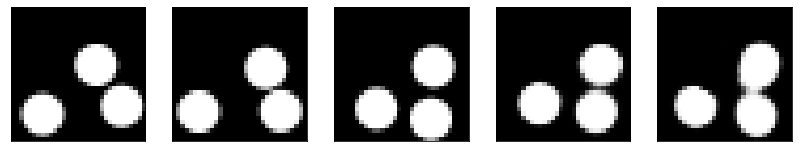

GD iterations:
i=0 | err=56.014755
i=1 | err=54.792130
i=2 | err=53.086609
i=3 | err=51.224567
i=4 | err=49.158211
i=5 | err=47.009178
i=6 | err=44.818932
i=7 | err=42.610855
i=8 | err=40.387371
i=9 | err=38.130344
i=10 | err=35.894299
i=11 | err=33.698235
i=12 | err=31.597687
i=13 | err=29.526146
i=14 | err=27.468464
i=15 | err=25.527039
i=16 | err=23.571346
i=17 | err=21.745052
i=18 | err=19.917017
i=19 | err=18.217806
i=20 | err=16.627253
i=21 | err=15.174415
i=22 | err=13.848509
i=23 | err=12.631504
i=24 | err=11.485559
i=25 | err=10.454750
i=26 | err=9.463941
i=27 | err=8.526106
i=28 | err=7.653417
i=29 | err=6.833319
Epoch=268 (88%) | out_positive=0.836658 | out_negative=0.146865 | mse=0.070334


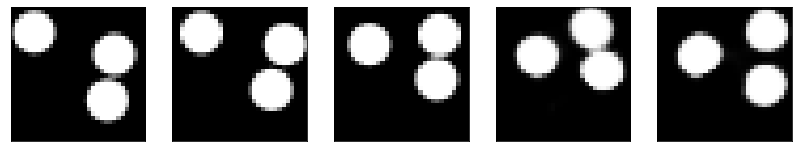

GD iterations:
i=0 | err=54.584076
i=1 | err=53.324570
i=2 | err=51.620190
i=3 | err=49.638794
i=4 | err=47.563858
i=5 | err=45.302849
i=6 | err=43.006836
i=7 | err=40.756012
i=8 | err=38.538956
i=9 | err=36.405716
i=10 | err=34.312721
i=11 | err=32.256905
i=12 | err=30.233797
i=13 | err=28.282829
i=14 | err=26.467024
i=15 | err=24.765446
i=16 | err=23.067770
i=17 | err=21.465397
i=18 | err=19.952118
i=19 | err=18.540524
i=20 | err=17.224873
i=21 | err=15.934511
i=22 | err=14.735439
i=23 | err=13.634449
i=24 | err=12.599545
i=25 | err=11.669677
i=26 | err=10.764843
i=27 | err=9.888229
i=28 | err=9.051508
i=29 | err=8.240889
Epoch=268 (90%) | out_positive=0.912326 | out_negative=0.072596 | mse=0.071956


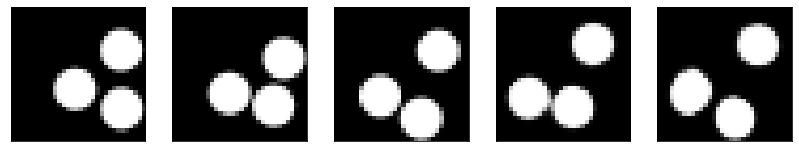

GD iterations:
i=0 | err=54.498085
i=1 | err=53.276123
i=2 | err=51.628563
i=3 | err=49.778938
i=4 | err=47.900482
i=5 | err=45.945496
i=6 | err=43.911957
i=7 | err=41.764858
i=8 | err=39.556274
i=9 | err=37.319031
i=10 | err=35.055695
i=11 | err=32.730774
i=12 | err=30.391457
i=13 | err=28.186279
i=14 | err=26.016544
i=15 | err=23.961906
i=16 | err=22.131824
i=17 | err=20.404102
i=18 | err=18.772730
i=19 | err=17.191172
i=20 | err=15.705814
i=21 | err=14.298149
i=22 | err=13.011591
i=23 | err=11.791628
i=24 | err=10.698322
i=25 | err=9.669134
i=26 | err=8.722435
i=27 | err=7.813151
i=28 | err=6.916975
i=29 | err=6.078013
Epoch=268 (92%) | out_positive=0.873069 | out_negative=0.145368 | mse=0.071988


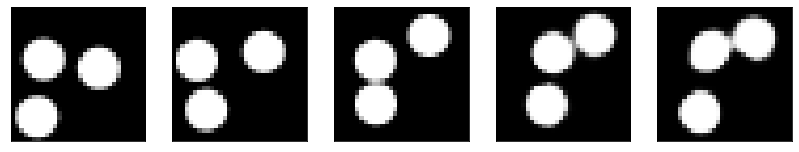

GD iterations:
i=0 | err=52.958473
i=1 | err=51.776070
i=2 | err=50.131168
i=3 | err=48.415051
i=4 | err=46.625214
i=5 | err=44.758392
i=6 | err=42.839176
i=7 | err=40.886162
i=8 | err=38.847363
i=9 | err=36.798302
i=10 | err=34.697121
i=11 | err=32.561333
i=12 | err=30.462227
i=13 | err=28.422466
i=14 | err=26.469347
i=15 | err=24.548466
i=16 | err=22.783051
i=17 | err=21.036894
i=18 | err=19.401537
i=19 | err=17.804224
i=20 | err=16.305679
i=21 | err=14.896197
i=22 | err=13.605169
i=23 | err=12.443757
i=24 | err=11.408852
i=25 | err=10.447786
i=26 | err=9.558428
i=27 | err=8.714132
i=28 | err=7.890513
i=29 | err=7.100286
Epoch=268 (94%) | out_positive=0.869505 | out_negative=0.128563 | mse=0.067163


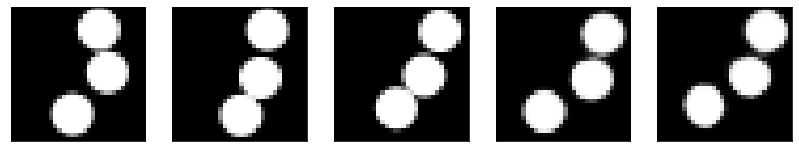

GD iterations:
i=0 | err=52.411423
i=1 | err=51.189423
i=2 | err=49.432354
i=3 | err=47.419483
i=4 | err=45.215988
i=5 | err=42.918571
i=6 | err=40.476830
i=7 | err=38.116585
i=8 | err=35.721931
i=9 | err=33.443817
i=10 | err=31.305290
i=11 | err=29.242044
i=12 | err=27.245533
i=13 | err=25.306927
i=14 | err=23.502392
i=15 | err=21.703627
i=16 | err=20.030621
i=17 | err=18.444416
i=18 | err=17.004845
i=19 | err=15.660741
i=20 | err=14.409431
i=21 | err=13.236059
i=22 | err=12.107565
i=23 | err=11.051218
i=24 | err=10.047328
i=25 | err=9.100924
i=26 | err=8.203564
i=27 | err=7.380647
i=28 | err=6.612074
i=29 | err=5.887975
Epoch=268 (96%) | out_positive=0.909124 | out_negative=0.168687 | mse=0.068570


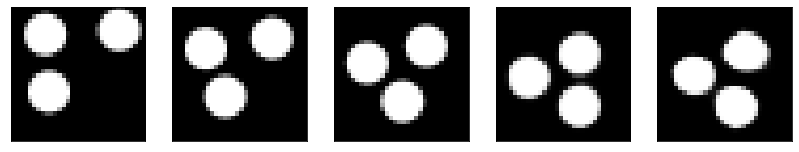

GD iterations:
i=0 | err=52.190784
i=1 | err=50.874893
i=2 | err=49.141014
i=3 | err=47.230614
i=4 | err=45.222031
i=5 | err=43.169304
i=6 | err=41.014950
i=7 | err=38.732304
i=8 | err=36.304214
i=9 | err=33.860420
i=10 | err=31.552464
i=11 | err=29.309208
i=12 | err=27.128288
i=13 | err=25.003323
i=14 | err=22.992519
i=15 | err=21.166821
i=16 | err=19.461079
i=17 | err=17.917885
i=18 | err=16.490284
i=19 | err=15.101424
i=20 | err=13.785024
i=21 | err=12.611174
i=22 | err=11.503262
i=23 | err=10.498738
i=24 | err=9.528208
i=25 | err=8.633844
i=26 | err=7.779698
i=27 | err=7.019769
i=28 | err=6.278488
i=29 | err=5.577661
Epoch=268 (98%) | out_positive=0.905939 | out_negative=0.180391 | mse=0.070776


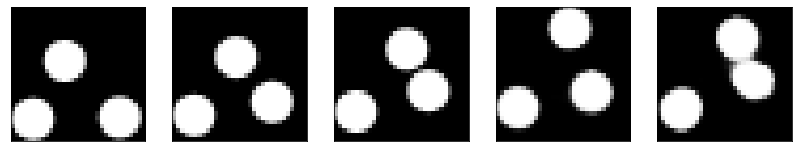

GD iterations:
i=0 | err=57.180328
i=1 | err=55.865128
i=2 | err=54.003830
i=3 | err=51.942188
i=4 | err=49.727188
i=5 | err=47.481735
i=6 | err=45.216564
i=7 | err=42.924011
i=8 | err=40.672474
i=9 | err=38.421616
i=10 | err=36.171848
i=11 | err=33.967934
i=12 | err=31.696579
i=13 | err=29.479561
i=14 | err=27.293600
i=15 | err=25.159477
i=16 | err=23.120861
i=17 | err=21.118996
i=18 | err=19.308537
i=19 | err=17.601429
i=20 | err=16.021345
i=21 | err=14.557944
i=22 | err=13.193069
i=23 | err=11.986789
i=24 | err=10.922701
i=25 | err=9.926096
i=26 | err=9.011066
i=27 | err=8.137714
i=28 | err=7.356870
i=29 | err=6.628376
Epoch=268 (99%) | out_positive=0.789841 | out_negative=0.119394 | mse=0.065046


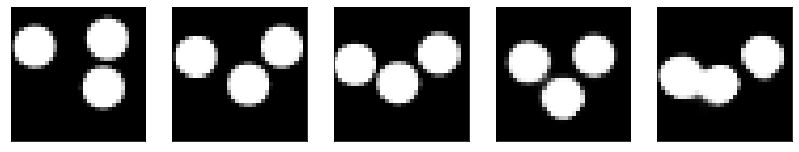

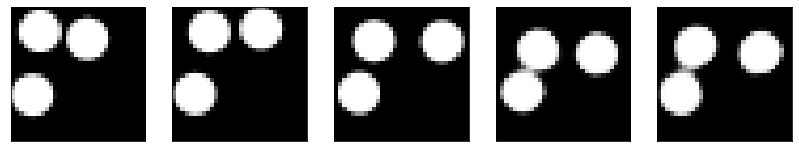

Test MSE 0.077589


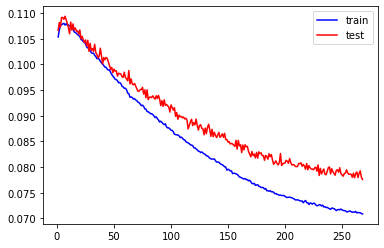

GD iterations:
i=0 | err=49.624264
i=1 | err=48.534843
i=2 | err=47.021980
i=3 | err=45.310909
i=4 | err=43.376522
i=5 | err=41.450157
i=6 | err=39.389130
i=7 | err=37.272175
i=8 | err=35.127838
i=9 | err=33.009357
i=10 | err=30.862202
i=11 | err=28.858124
i=12 | err=26.862320
i=13 | err=24.988071
i=14 | err=23.140848
i=15 | err=21.347372
i=16 | err=19.664112
i=17 | err=18.076721
i=18 | err=16.585716
i=19 | err=15.194353
i=20 | err=13.873334
i=21 | err=12.628705
i=22 | err=11.443039
i=23 | err=10.363275
i=24 | err=9.377612
i=25 | err=8.483452
i=26 | err=7.652574
i=27 | err=6.854803
i=28 | err=6.102319
i=29 | err=5.385196
Epoch=269 (0%) | out_positive=0.943278 | out_negative=0.162713 | mse=0.070411


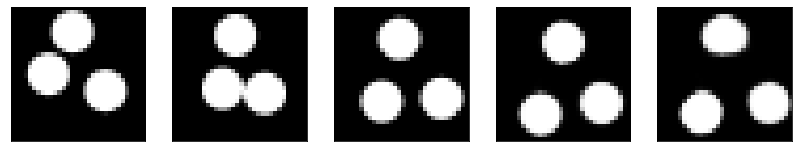

GD iterations:
i=0 | err=49.544235
i=1 | err=48.384651
i=2 | err=46.804729
i=3 | err=45.011292
i=4 | err=43.072433
i=5 | err=41.154198
i=6 | err=39.233353
i=7 | err=37.346104
i=8 | err=35.471703
i=9 | err=33.593655
i=10 | err=31.757347
i=11 | err=29.875072
i=12 | err=28.033829
i=13 | err=26.189674
i=14 | err=24.398048
i=15 | err=22.653893
i=16 | err=21.020258
i=17 | err=19.448524
i=18 | err=17.993696
i=19 | err=16.575840
i=20 | err=15.264811
i=21 | err=14.000965
i=22 | err=12.809807
i=23 | err=11.721462
i=24 | err=10.670553
i=25 | err=9.702553
i=26 | err=8.753056
i=27 | err=7.868752
i=28 | err=7.029823
i=29 | err=6.280590
Epoch=269 (2%) | out_positive=0.919707 | out_negative=0.181842 | mse=0.069152


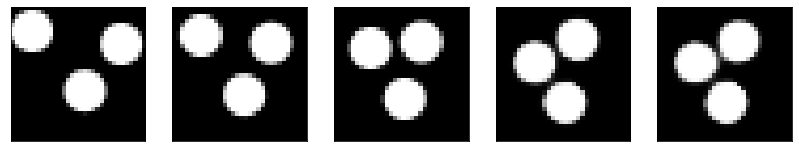

GD iterations:
i=0 | err=55.212658
i=1 | err=54.038277
i=2 | err=52.471069
i=3 | err=50.642319
i=4 | err=48.721069
i=5 | err=46.653603
i=6 | err=44.561661
i=7 | err=42.429993
i=8 | err=40.387901
i=9 | err=38.366959
i=10 | err=36.366611
i=11 | err=34.389771
i=12 | err=32.408653
i=13 | err=30.413977
i=14 | err=28.515667
i=15 | err=26.677505
i=16 | err=24.930504
i=17 | err=23.291651
i=18 | err=21.769123
i=19 | err=20.294601
i=20 | err=18.865555
i=21 | err=17.474277
i=22 | err=16.142525
i=23 | err=14.873363
i=24 | err=13.675343
i=25 | err=12.549715
i=26 | err=11.474174
i=27 | err=10.410390
i=28 | err=9.354744
i=29 | err=8.392962
Epoch=269 (4%) | out_positive=0.861072 | out_negative=0.128902 | mse=0.070263


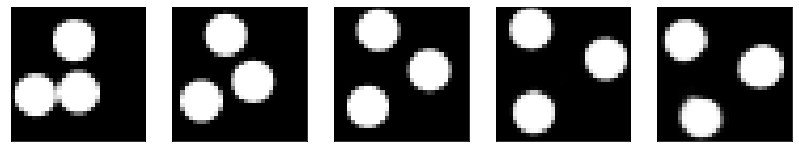

GD iterations:
i=0 | err=54.039650
i=1 | err=52.791893
i=2 | err=51.047516
i=3 | err=49.154232
i=4 | err=47.109528
i=5 | err=44.894547
i=6 | err=42.622086
i=7 | err=40.345928
i=8 | err=38.025265
i=9 | err=35.788574
i=10 | err=33.554161
i=11 | err=31.298740
i=12 | err=29.046249
i=13 | err=26.901497
i=14 | err=24.945616
i=15 | err=23.101408
i=16 | err=21.362566
i=17 | err=19.743534
i=18 | err=18.254005
i=19 | err=16.855221
i=20 | err=15.552173
i=21 | err=14.349861
i=22 | err=13.181254
i=23 | err=12.056404
i=24 | err=10.992554
i=25 | err=10.015589
i=26 | err=9.095013
i=27 | err=8.240893
i=28 | err=7.440512
i=29 | err=6.653028
Epoch=269 (6%) | out_positive=0.899665 | out_negative=0.151827 | mse=0.069465


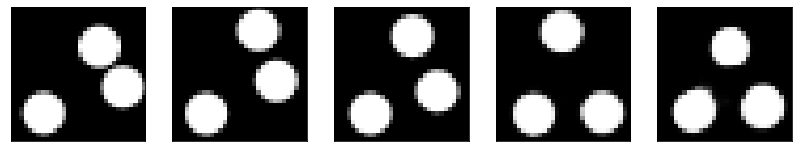

GD iterations:
i=0 | err=57.440681
i=1 | err=56.184563
i=2 | err=54.463726
i=3 | err=52.603989
i=4 | err=50.695290
i=5 | err=48.703232
i=6 | err=46.692230
i=7 | err=44.553032
i=8 | err=42.314339
i=9 | err=40.052761
i=10 | err=37.716629
i=11 | err=35.361477
i=12 | err=33.102936
i=13 | err=30.851612
i=14 | err=28.637486
i=15 | err=26.566120
i=16 | err=24.622585
i=17 | err=22.761738
i=18 | err=20.984589
i=19 | err=19.360321
i=20 | err=17.822777
i=21 | err=16.355804
i=22 | err=14.996235
i=23 | err=13.717801
i=24 | err=12.522604
i=25 | err=11.371838
i=26 | err=10.294935
i=27 | err=9.290441
i=28 | err=8.391911
i=29 | err=7.513135
Epoch=269 (8%) | out_positive=0.865603 | out_negative=0.141293 | mse=0.077334


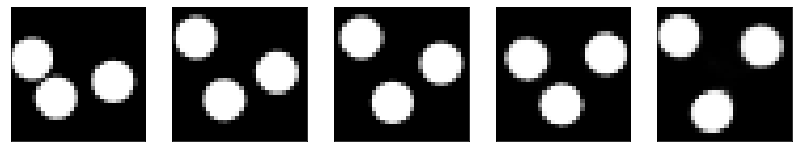

GD iterations:
i=0 | err=52.576630
i=1 | err=51.399818
i=2 | err=49.734131
i=3 | err=47.897560
i=4 | err=45.913376
i=5 | err=43.890182
i=6 | err=41.794052
i=7 | err=39.602489
i=8 | err=37.375519
i=9 | err=35.029503
i=10 | err=32.616867
i=11 | err=30.274433
i=12 | err=28.001469
i=13 | err=25.914486
i=14 | err=24.069700
i=15 | err=22.320086
i=16 | err=20.694086
i=17 | err=19.124170
i=18 | err=17.620777
i=19 | err=16.226519
i=20 | err=14.949557
i=21 | err=13.767625
i=22 | err=12.707687
i=23 | err=11.700127
i=24 | err=10.747054
i=25 | err=9.824114
i=26 | err=8.949056
i=27 | err=8.141353
i=28 | err=7.375138
i=29 | err=6.668286
Epoch=269 (9%) | out_positive=0.873970 | out_negative=0.111744 | mse=0.072582


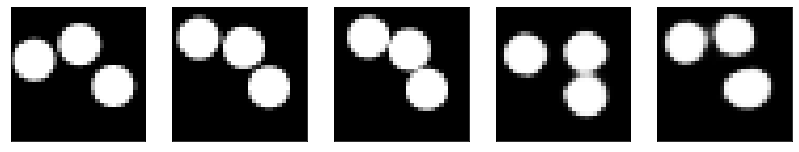

GD iterations:
i=0 | err=57.119263
i=1 | err=55.841850
i=2 | err=54.150566
i=3 | err=52.165497
i=4 | err=50.036442
i=5 | err=47.807930
i=6 | err=45.426178
i=7 | err=42.837688
i=8 | err=40.239807
i=9 | err=37.582680
i=10 | err=35.022614
i=11 | err=32.564384
i=12 | err=30.210972
i=13 | err=27.888397
i=14 | err=25.629831
i=15 | err=23.538918
i=16 | err=21.591429
i=17 | err=19.755205
i=18 | err=18.027657
i=19 | err=16.387329
i=20 | err=14.886211
i=21 | err=13.570034
i=22 | err=12.366385
i=23 | err=11.228332
i=24 | err=10.189997
i=25 | err=9.226914
i=26 | err=8.325236
i=27 | err=7.470172
i=28 | err=6.651161
i=29 | err=5.890773
Epoch=269 (11%) | out_positive=0.866219 | out_negative=0.159072 | mse=0.065587


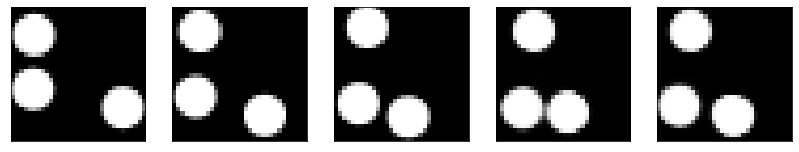

GD iterations:
i=0 | err=54.317326
i=1 | err=53.052807
i=2 | err=51.387352
i=3 | err=49.488914
i=4 | err=47.648933
i=5 | err=45.732346
i=6 | err=43.742836
i=7 | err=41.636097
i=8 | err=39.396873
i=9 | err=36.984238
i=10 | err=34.514912
i=11 | err=32.019646
i=12 | err=29.585732
i=13 | err=27.412958
i=14 | err=25.356960
i=15 | err=23.533199
i=16 | err=21.781612
i=17 | err=20.106161
i=18 | err=18.491716
i=19 | err=16.988930
i=20 | err=15.617749
i=21 | err=14.359613
i=22 | err=13.182245
i=23 | err=12.112680
i=24 | err=11.112602
i=25 | err=10.181090
i=26 | err=9.290497
i=27 | err=8.440073
i=28 | err=7.637607
i=29 | err=6.881698
Epoch=269 (13%) | out_positive=0.862134 | out_negative=0.127686 | mse=0.073030


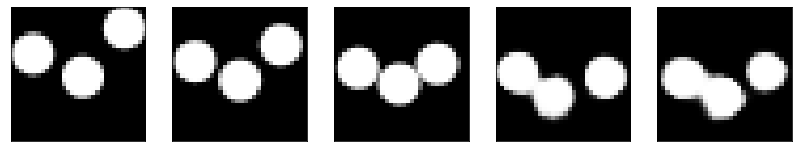

GD iterations:
i=0 | err=58.080257
i=1 | err=56.820686
i=2 | err=55.025478
i=3 | err=53.029785
i=4 | err=50.948429
i=5 | err=48.760372
i=6 | err=46.488396
i=7 | err=44.136063
i=8 | err=41.757378
i=9 | err=39.447369
i=10 | err=37.100170
i=11 | err=34.794144
i=12 | err=32.475288
i=13 | err=30.110329
i=14 | err=27.777168
i=15 | err=25.563431
i=16 | err=23.563313
i=17 | err=21.677696
i=18 | err=19.893686
i=19 | err=18.260330
i=20 | err=16.710888
i=21 | err=15.305050
i=22 | err=14.001194
i=23 | err=12.811774
i=24 | err=11.697780
i=25 | err=10.719150
i=26 | err=9.777683
i=27 | err=8.893875
i=28 | err=8.041131
i=29 | err=7.214545
Epoch=269 (15%) | out_positive=0.812657 | out_negative=0.105792 | mse=0.069683


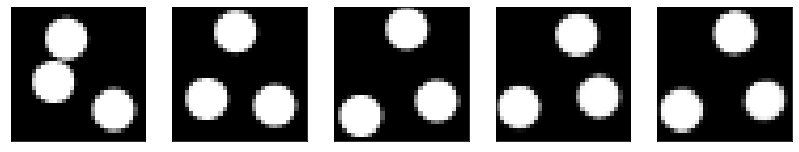

GD iterations:
i=0 | err=51.364510
i=1 | err=50.225067
i=2 | err=48.738541
i=3 | err=47.156898
i=4 | err=45.449406
i=5 | err=43.620796
i=6 | err=41.716526
i=7 | err=39.697792
i=8 | err=37.600456
i=9 | err=35.390663
i=10 | err=33.152763
i=11 | err=30.928162
i=12 | err=28.753876
i=13 | err=26.695019
i=14 | err=24.675179
i=15 | err=22.746578
i=16 | err=20.968254
i=17 | err=19.272743
i=18 | err=17.713829
i=19 | err=16.279301
i=20 | err=14.872559
i=21 | err=13.577266
i=22 | err=12.398321
i=23 | err=11.306244
i=24 | err=10.293180
i=25 | err=9.397268
i=26 | err=8.544218
i=27 | err=7.741061
i=28 | err=6.956526
i=29 | err=6.211325
Epoch=269 (17%) | out_positive=0.936445 | out_negative=0.150850 | mse=0.072995


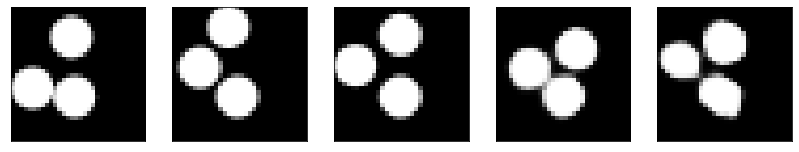

GD iterations:
i=0 | err=55.243801
i=1 | err=53.980858
i=2 | err=52.250969
i=3 | err=50.284615
i=4 | err=48.281105
i=5 | err=46.151062
i=6 | err=43.977905
i=7 | err=41.681580
i=8 | err=39.429405
i=9 | err=37.227242
i=10 | err=35.022606
i=11 | err=32.869072
i=12 | err=30.676960
i=13 | err=28.549553
i=14 | err=26.448467
i=15 | err=24.455530
i=16 | err=22.582546
i=17 | err=20.766287
i=18 | err=19.041990
i=19 | err=17.420521
i=20 | err=15.934646
i=21 | err=14.532442
i=22 | err=13.272933
i=23 | err=12.117288
i=24 | err=11.076365
i=25 | err=10.054462
i=26 | err=9.137353
i=27 | err=8.277021
i=28 | err=7.465443
i=29 | err=6.659405
Epoch=269 (19%) | out_positive=0.865809 | out_negative=0.123603 | mse=0.074147


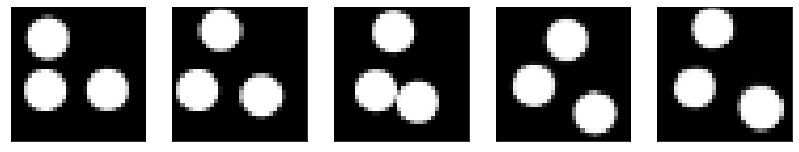

GD iterations:
i=0 | err=52.734863
i=1 | err=51.478901
i=2 | err=49.818787
i=3 | err=47.940674
i=4 | err=45.941708
i=5 | err=43.926277
i=6 | err=41.834347
i=7 | err=39.696426
i=8 | err=37.612823
i=9 | err=35.532852
i=10 | err=33.482971
i=11 | err=31.358259
i=12 | err=29.116650
i=13 | err=27.039543
i=14 | err=25.078451
i=15 | err=23.193188
i=16 | err=21.487507
i=17 | err=19.922596
i=18 | err=18.431767
i=19 | err=17.080379
i=20 | err=15.773556
i=21 | err=14.603198
i=22 | err=13.473057
i=23 | err=12.436245
i=24 | err=11.424228
i=25 | err=10.465877
i=26 | err=9.605530
i=27 | err=8.752279
i=28 | err=7.962365
i=29 | err=7.193935
Epoch=269 (20%) | out_positive=0.825632 | out_negative=0.159196 | mse=0.073336


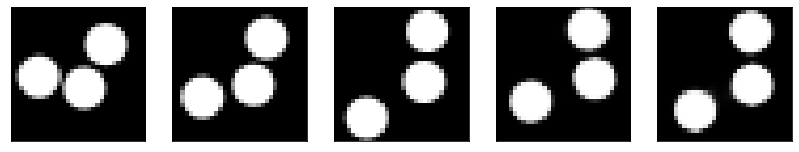

GD iterations:
i=0 | err=54.653877
i=1 | err=53.385258
i=2 | err=51.654839
i=3 | err=49.693542
i=4 | err=47.588058
i=5 | err=45.427593
i=6 | err=43.224091
i=7 | err=40.904449
i=8 | err=38.604012
i=9 | err=36.293976
i=10 | err=33.974976
i=11 | err=31.652672
i=12 | err=29.442348
i=13 | err=27.287163
i=14 | err=25.366531
i=15 | err=23.621021
i=16 | err=21.976707
i=17 | err=20.394953
i=18 | err=18.941296
i=19 | err=17.555187
i=20 | err=16.258955
i=21 | err=15.041853
i=22 | err=13.903049
i=23 | err=12.865326
i=24 | err=11.863852
i=25 | err=10.892059
i=26 | err=9.959120
i=27 | err=9.104036
i=28 | err=8.313168
i=29 | err=7.561747
Epoch=269 (22%) | out_positive=0.868062 | out_negative=0.086430 | mse=0.069332


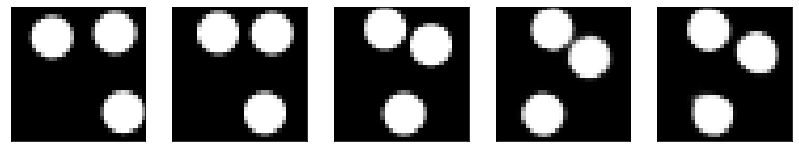

GD iterations:
i=0 | err=53.961079
i=1 | err=52.708565
i=2 | err=50.885765
i=3 | err=48.798183
i=4 | err=46.622272
i=5 | err=44.327576
i=6 | err=41.944241
i=7 | err=39.490330
i=8 | err=36.997276
i=9 | err=34.555019
i=10 | err=32.187725
i=11 | err=29.907259
i=12 | err=27.683432
i=13 | err=25.532455
i=14 | err=23.457247
i=15 | err=21.612993
i=16 | err=19.939003
i=17 | err=18.369610
i=18 | err=16.843634
i=19 | err=15.423021
i=20 | err=14.063127
i=21 | err=12.892115
i=22 | err=11.799232
i=23 | err=10.773158
i=24 | err=9.802198
i=25 | err=8.888979
i=26 | err=8.023649
i=27 | err=7.200267
i=28 | err=6.405245
i=29 | err=5.643133
Epoch=269 (24%) | out_positive=0.889803 | out_negative=0.146853 | mse=0.067209


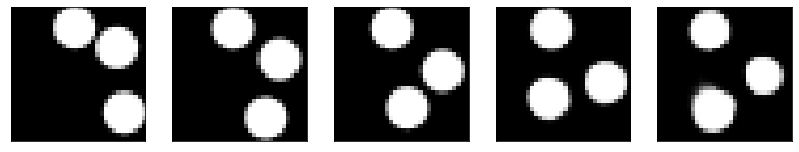

GD iterations:
i=0 | err=52.493149
i=1 | err=51.223560
i=2 | err=49.391754
i=3 | err=47.405624
i=4 | err=45.301529
i=5 | err=43.089630
i=6 | err=40.782158
i=7 | err=38.461342
i=8 | err=36.192024
i=9 | err=34.005096
i=10 | err=31.882372
i=11 | err=29.867849
i=12 | err=27.942867
i=13 | err=26.065012
i=14 | err=24.291538
i=15 | err=22.601168
i=16 | err=20.980858
i=17 | err=19.465855
i=18 | err=18.035095
i=19 | err=16.710419
i=20 | err=15.444386
i=21 | err=14.287287
i=22 | err=13.207558
i=23 | err=12.143522
i=24 | err=11.160278
i=25 | err=10.234265
i=26 | err=9.355371
i=27 | err=8.501616
i=28 | err=7.699843
i=29 | err=6.952645
Epoch=269 (26%) | out_positive=0.895632 | out_negative=0.103980 | mse=0.069066


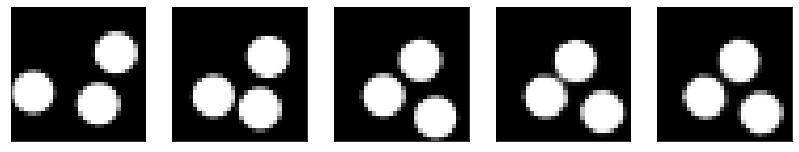

GD iterations:
i=0 | err=54.510033
i=1 | err=53.315720
i=2 | err=51.694946
i=3 | err=49.742767
i=4 | err=47.708897
i=5 | err=45.570248
i=6 | err=43.371841
i=7 | err=41.123680
i=8 | err=38.864956
i=9 | err=36.556511
i=10 | err=34.208313
i=11 | err=31.957230
i=12 | err=29.836315
i=13 | err=27.773561
i=14 | err=25.759382
i=15 | err=23.810713
i=16 | err=21.940657
i=17 | err=20.170382
i=18 | err=18.521654
i=19 | err=17.019526
i=20 | err=15.680910
i=21 | err=14.429946
i=22 | err=13.276693
i=23 | err=12.192814
i=24 | err=11.169073
i=25 | err=10.202622
i=26 | err=9.295041
i=27 | err=8.469033
i=28 | err=7.688915
i=29 | err=6.968876
Epoch=269 (28%) | out_positive=0.838879 | out_negative=0.097601 | mse=0.066398


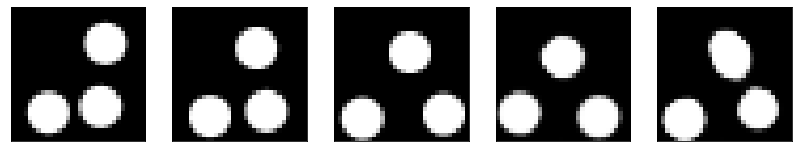

GD iterations:
i=0 | err=54.091599
i=1 | err=52.859306
i=2 | err=51.196678
i=3 | err=49.287804
i=4 | err=47.310501
i=5 | err=45.300991
i=6 | err=43.225533
i=7 | err=41.124256
i=8 | err=38.884369
i=9 | err=36.614475
i=10 | err=34.213387
i=11 | err=31.762495
i=12 | err=29.396114
i=13 | err=27.196974
i=14 | err=25.147343
i=15 | err=23.229897
i=16 | err=21.393179
i=17 | err=19.626015
i=18 | err=17.967808
i=19 | err=16.433647
i=20 | err=15.031301
i=21 | err=13.713433
i=22 | err=12.475939
i=23 | err=11.330657
i=24 | err=10.289787
i=25 | err=9.344107
i=26 | err=8.430340
i=27 | err=7.621780
i=28 | err=6.877829
i=29 | err=6.182539
Epoch=269 (30%) | out_positive=0.898284 | out_negative=0.139335 | mse=0.068223


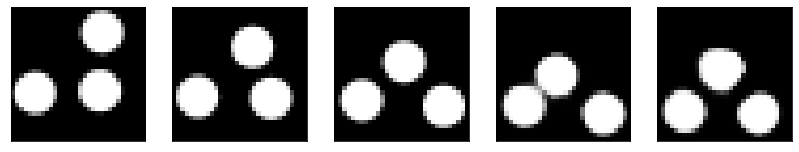

GD iterations:
i=0 | err=58.526733
i=1 | err=57.248093
i=2 | err=55.460430
i=3 | err=53.486702
i=4 | err=51.354523
i=5 | err=49.102325
i=6 | err=46.951645
i=7 | err=44.765060
i=8 | err=42.419624
i=9 | err=39.985981
i=10 | err=37.491119
i=11 | err=35.060036
i=12 | err=32.755875
i=13 | err=30.491175
i=14 | err=28.357576
i=15 | err=26.290527
i=16 | err=24.279194
i=17 | err=22.431585
i=18 | err=20.715265
i=19 | err=19.154835
i=20 | err=17.764606
i=21 | err=16.433247
i=22 | err=15.150536
i=23 | err=13.855361
i=24 | err=12.626308
i=25 | err=11.438152
i=26 | err=10.311584
i=27 | err=9.297661
i=28 | err=8.397757
i=29 | err=7.579780
Epoch=269 (32%) | out_positive=0.839410 | out_negative=0.077872 | mse=0.072318


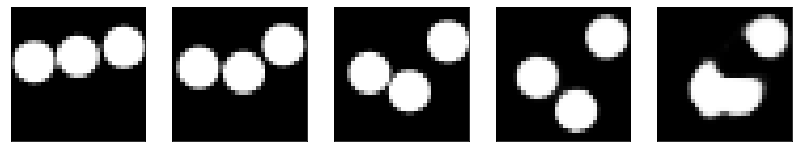

GD iterations:
i=0 | err=51.499912
i=1 | err=50.292171
i=2 | err=48.607056
i=3 | err=46.694992
i=4 | err=44.705181
i=5 | err=42.640190
i=6 | err=40.488907
i=7 | err=38.354729
i=8 | err=36.259159
i=9 | err=34.239685
i=10 | err=32.191216
i=11 | err=30.227177
i=12 | err=28.289001
i=13 | err=26.471457
i=14 | err=24.694042
i=15 | err=23.011494
i=16 | err=21.463736
i=17 | err=20.067249
i=18 | err=18.722736
i=19 | err=17.451092
i=20 | err=16.210415
i=21 | err=15.023689
i=22 | err=13.876896
i=23 | err=12.771584
i=24 | err=11.736233
i=25 | err=10.740984
i=26 | err=9.793346
i=27 | err=8.879911
i=28 | err=8.053746
i=29 | err=7.262426
Epoch=269 (33%) | out_positive=0.857224 | out_negative=0.118315 | mse=0.068819


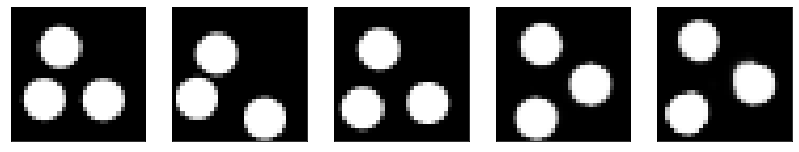

GD iterations:
i=0 | err=53.070541
i=1 | err=51.792068
i=2 | err=50.133919
i=3 | err=48.337379
i=4 | err=46.377838
i=5 | err=44.397373
i=6 | err=42.355373
i=7 | err=40.270973
i=8 | err=38.209167
i=9 | err=36.134285
i=10 | err=33.990112
i=11 | err=31.801355
i=12 | err=29.696089
i=13 | err=27.725302
i=14 | err=25.816814
i=15 | err=23.977268
i=16 | err=22.205750
i=17 | err=20.528381
i=18 | err=18.945847
i=19 | err=17.465363
i=20 | err=16.076103
i=21 | err=14.767630
i=22 | err=13.531767
i=23 | err=12.367008
i=24 | err=11.229427
i=25 | err=10.165477
i=26 | err=9.188530
i=27 | err=8.250909
i=28 | err=7.359252
i=29 | err=6.488620
Epoch=269 (35%) | out_positive=0.873523 | out_negative=0.133174 | mse=0.072941


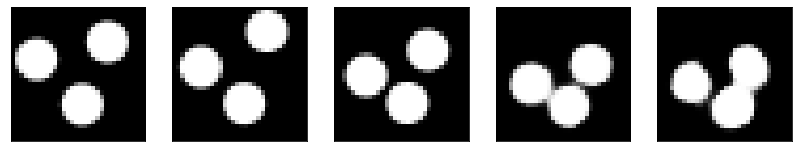

GD iterations:
i=0 | err=56.563087
i=1 | err=55.324554
i=2 | err=53.641388
i=3 | err=51.776741
i=4 | err=49.775936
i=5 | err=47.625904
i=6 | err=45.284912
i=7 | err=42.936783
i=8 | err=40.474991
i=9 | err=37.911541
i=10 | err=35.350140
i=11 | err=32.839314
i=12 | err=30.456133
i=13 | err=28.211128
i=14 | err=26.107178
i=15 | err=24.178368
i=16 | err=22.305996
i=17 | err=20.523262
i=18 | err=18.870043
i=19 | err=17.384483
i=20 | err=15.969633
i=21 | err=14.634828
i=22 | err=13.445597
i=23 | err=12.316129
i=24 | err=11.243315
i=25 | err=10.262277
i=26 | err=9.336906
i=27 | err=8.491024
i=28 | err=7.691355
i=29 | err=6.948562
Epoch=269 (37%) | out_positive=0.804801 | out_negative=0.109424 | mse=0.067059


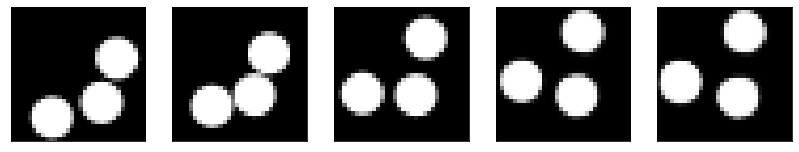

GD iterations:
i=0 | err=53.947517
i=1 | err=52.668976
i=2 | err=50.867615
i=3 | err=49.008194
i=4 | err=47.037132
i=5 | err=44.998161
i=6 | err=42.846600
i=7 | err=40.604687
i=8 | err=38.392216
i=9 | err=36.213554
i=10 | err=34.158737
i=11 | err=32.073959
i=12 | err=30.067942
i=13 | err=27.991117
i=14 | err=25.917866
i=15 | err=23.924568
i=16 | err=22.095261
i=17 | err=20.398296
i=18 | err=18.804646
i=19 | err=17.314520
i=20 | err=15.971688
i=21 | err=14.712605
i=22 | err=13.576985
i=23 | err=12.496468
i=24 | err=11.451415
i=25 | err=10.473533
i=26 | err=9.566514
i=27 | err=8.688005
i=28 | err=7.830745
i=29 | err=7.003929
Epoch=269 (39%) | out_positive=0.873345 | out_negative=0.118726 | mse=0.072628


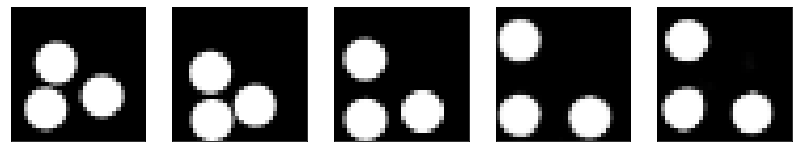

GD iterations:
i=0 | err=50.617580
i=1 | err=49.383598
i=2 | err=47.705765
i=3 | err=45.761238
i=4 | err=43.728233
i=5 | err=41.721748
i=6 | err=39.612011
i=7 | err=37.494984
i=8 | err=35.394547
i=9 | err=33.223400
i=10 | err=31.118933
i=11 | err=29.024042
i=12 | err=26.957382
i=13 | err=24.929895
i=14 | err=23.002840
i=15 | err=21.173624
i=16 | err=19.548717
i=17 | err=18.076103
i=18 | err=16.749916
i=19 | err=15.540751
i=20 | err=14.460644
i=21 | err=13.442321
i=22 | err=12.475076
i=23 | err=11.536888
i=24 | err=10.657551
i=25 | err=9.812241
i=26 | err=8.963158
i=27 | err=8.134961
i=28 | err=7.324599
i=29 | err=6.536355
Epoch=269 (41%) | out_positive=0.847691 | out_negative=0.123463 | mse=0.066523


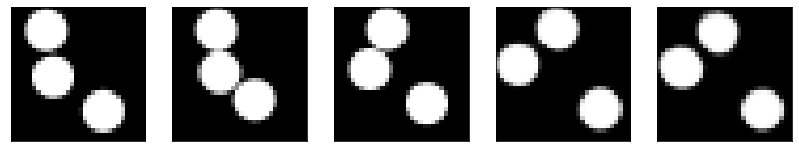

GD iterations:
i=0 | err=55.090282
i=1 | err=53.721081
i=2 | err=51.901737
i=3 | err=49.823029
i=4 | err=47.749428
i=5 | err=45.541840
i=6 | err=43.378811
i=7 | err=41.110050
i=8 | err=38.770290
i=9 | err=36.482182
i=10 | err=34.223103
i=11 | err=31.947300
i=12 | err=29.640648
i=13 | err=27.373814
i=14 | err=25.193365
i=15 | err=23.163895
i=16 | err=21.234947
i=17 | err=19.458454
i=18 | err=17.793077
i=19 | err=16.300655
i=20 | err=14.907309
i=21 | err=13.606895
i=22 | err=12.420120
i=23 | err=11.357645
i=24 | err=10.399029
i=25 | err=9.514653
i=26 | err=8.704551
i=27 | err=7.948447
i=28 | err=7.239955
i=29 | err=6.555362
Epoch=269 (42%) | out_positive=0.863206 | out_negative=0.068589 | mse=0.068738


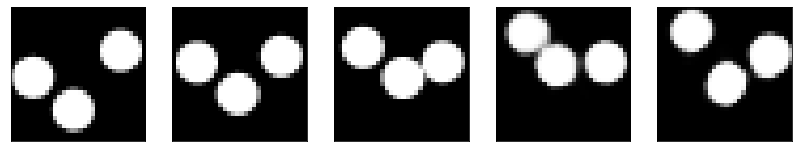

GD iterations:
i=0 | err=56.209682
i=1 | err=55.007484
i=2 | err=53.317387
i=3 | err=51.460464
i=4 | err=49.446217
i=5 | err=47.456337
i=6 | err=45.363754
i=7 | err=43.251965
i=8 | err=41.033134
i=9 | err=38.793304
i=10 | err=36.541023
i=11 | err=34.287830
i=12 | err=31.997244
i=13 | err=29.817780
i=14 | err=27.747608
i=15 | err=25.817612
i=16 | err=23.935167
i=17 | err=22.108242
i=18 | err=20.469284
i=19 | err=19.037632
i=20 | err=17.634060
i=21 | err=16.280643
i=22 | err=14.949276
i=23 | err=13.663054
i=24 | err=12.428717
i=25 | err=11.255812
i=26 | err=10.226921
i=27 | err=9.258837
i=28 | err=8.325510
i=29 | err=7.430521
Epoch=269 (44%) | out_positive=0.860989 | out_negative=0.096668 | mse=0.074328


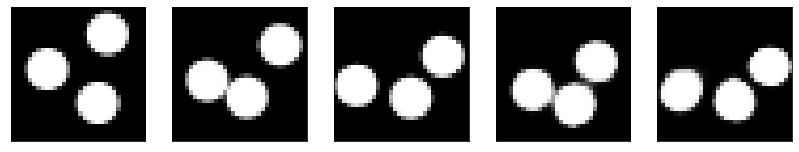

GD iterations:
i=0 | err=56.062477
i=1 | err=54.732014
i=2 | err=53.021072
i=3 | err=51.126472
i=4 | err=49.212502
i=5 | err=47.199448
i=6 | err=45.087276
i=7 | err=42.873604
i=8 | err=40.577175
i=9 | err=38.261795
i=10 | err=35.989693
i=11 | err=33.730652
i=12 | err=31.510708
i=13 | err=29.342228
i=14 | err=27.245411
i=15 | err=25.221527
i=16 | err=23.369516
i=17 | err=21.589436
i=18 | err=19.923401
i=19 | err=18.315321
i=20 | err=16.833645
i=21 | err=15.452143
i=22 | err=14.195116
i=23 | err=12.995460
i=24 | err=11.844967
i=25 | err=10.813385
i=26 | err=9.838102
i=27 | err=8.954733
i=28 | err=8.131909
i=29 | err=7.359838
Epoch=269 (46%) | out_positive=0.886591 | out_negative=0.140464 | mse=0.070530


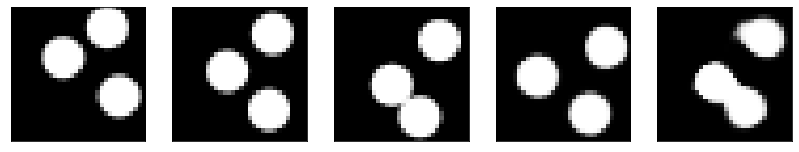

GD iterations:
i=0 | err=57.244843
i=1 | err=56.003227
i=2 | err=54.235157
i=3 | err=52.265549
i=4 | err=50.220364
i=5 | err=48.077774
i=6 | err=45.865196
i=7 | err=43.465603
i=8 | err=40.991203
i=9 | err=38.589493
i=10 | err=36.161179
i=11 | err=33.718880
i=12 | err=31.375935
i=13 | err=29.115871
i=14 | err=26.956905
i=15 | err=24.819023
i=16 | err=22.806618
i=17 | err=20.870541
i=18 | err=19.043682
i=19 | err=17.384880
i=20 | err=15.892937
i=21 | err=14.534662
i=22 | err=13.285254
i=23 | err=12.104649
i=24 | err=10.990227
i=25 | err=9.964325
i=26 | err=9.032614
i=27 | err=8.163723
i=28 | err=7.340055
i=29 | err=6.551561
Epoch=269 (48%) | out_positive=0.881566 | out_negative=0.110786 | mse=0.070481


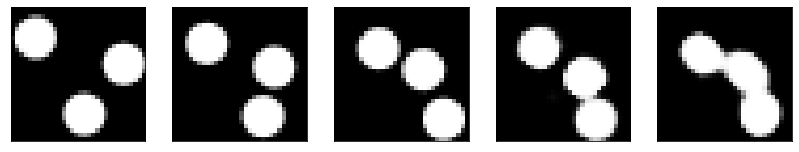

GD iterations:
i=0 | err=57.122772
i=1 | err=55.769363
i=2 | err=54.005859
i=3 | err=52.047401
i=4 | err=50.043495
i=5 | err=47.938713
i=6 | err=45.802017
i=7 | err=43.594246
i=8 | err=41.451469
i=9 | err=39.271988
i=10 | err=37.084415
i=11 | err=34.949867
i=12 | err=32.794487
i=13 | err=30.663630
i=14 | err=28.558853
i=15 | err=26.504498
i=16 | err=24.582848
i=17 | err=22.755585
i=18 | err=21.089626
i=19 | err=19.478645
i=20 | err=18.007845
i=21 | err=16.656906
i=22 | err=15.396309
i=23 | err=14.225130
i=24 | err=13.104095
i=25 | err=12.014361
i=26 | err=10.977530
i=27 | err=10.013282
i=28 | err=9.062346
i=29 | err=8.139467
Epoch=269 (50%) | out_positive=0.854780 | out_negative=0.087461 | mse=0.074404


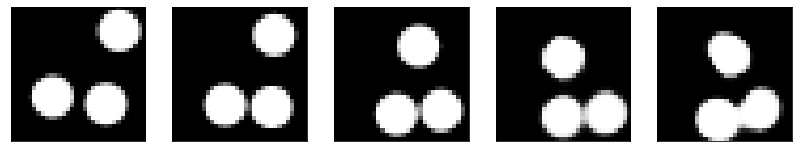

GD iterations:
i=0 | err=56.767853
i=1 | err=55.328510
i=2 | err=53.379333
i=3 | err=51.221512
i=4 | err=48.888950
i=5 | err=46.418209
i=6 | err=43.847328
i=7 | err=41.092670
i=8 | err=38.362999
i=9 | err=35.725258
i=10 | err=33.086422
i=11 | err=30.620522
i=12 | err=28.229267
i=13 | err=26.015203
i=14 | err=24.034695
i=15 | err=22.196072
i=16 | err=20.442858
i=17 | err=18.790041
i=18 | err=17.242847
i=19 | err=15.869013
i=20 | err=14.598658
i=21 | err=13.406361
i=22 | err=12.271720
i=23 | err=11.201833
i=24 | err=10.205610
i=25 | err=9.302361
i=26 | err=8.420654
i=27 | err=7.603748
i=28 | err=6.847951
i=29 | err=6.120038
Epoch=269 (52%) | out_positive=0.768230 | out_negative=0.126324 | mse=0.063604


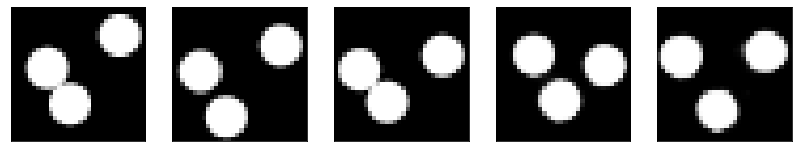

GD iterations:
i=0 | err=47.960297
i=1 | err=46.799667
i=2 | err=45.260933
i=3 | err=43.539062
i=4 | err=41.774147
i=5 | err=39.786777
i=6 | err=37.721306
i=7 | err=35.583160
i=8 | err=33.541443
i=9 | err=31.528389
i=10 | err=29.592499
i=11 | err=27.703415
i=12 | err=25.866116
i=13 | err=24.139372
i=14 | err=22.557529
i=15 | err=21.043604
i=16 | err=19.620525
i=17 | err=18.248817
i=18 | err=16.925354
i=19 | err=15.633810
i=20 | err=14.433345
i=21 | err=13.302553
i=22 | err=12.228853
i=23 | err=11.247473
i=24 | err=10.320240
i=25 | err=9.469988
i=26 | err=8.669571
i=27 | err=7.922454
i=28 | err=7.224127
i=29 | err=6.546849
Epoch=269 (54%) | out_positive=0.908801 | out_negative=0.113598 | mse=0.068916


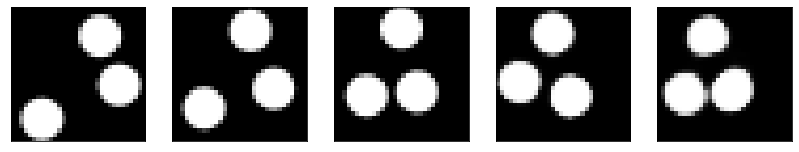

GD iterations:
i=0 | err=54.795639
i=1 | err=53.590569
i=2 | err=51.858215
i=3 | err=49.851181
i=4 | err=47.808670
i=5 | err=45.764725
i=6 | err=43.629681
i=7 | err=41.355820
i=8 | err=39.069950
i=9 | err=36.773209
i=10 | err=34.485794
i=11 | err=32.177589
i=12 | err=29.896290
i=13 | err=27.646961
i=14 | err=25.667921
i=15 | err=23.743256
i=16 | err=21.926748
i=17 | err=20.236696
i=18 | err=18.673069
i=19 | err=17.227604
i=20 | err=15.848566
i=21 | err=14.552099
i=22 | err=13.387691
i=23 | err=12.334604
i=24 | err=11.348871
i=25 | err=10.398245
i=26 | err=9.512590
i=27 | err=8.654894
i=28 | err=7.848946
i=29 | err=7.049174
Epoch=269 (55%) | out_positive=0.850359 | out_negative=0.125703 | mse=0.067792


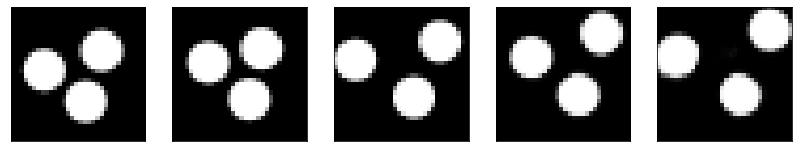

GD iterations:
i=0 | err=51.462410
i=1 | err=50.281654
i=2 | err=48.778614
i=3 | err=47.042744
i=4 | err=45.256618
i=5 | err=43.431625
i=6 | err=41.569294
i=7 | err=39.646366
i=8 | err=37.719734
i=9 | err=35.832321
i=10 | err=33.995876
i=11 | err=32.134567
i=12 | err=30.219631
i=13 | err=28.240005
i=14 | err=26.310112
i=15 | err=24.515373
i=16 | err=22.812050
i=17 | err=21.243532
i=18 | err=19.808617
i=19 | err=18.441322
i=20 | err=17.138584
i=21 | err=15.866773
i=22 | err=14.672413
i=23 | err=13.502930
i=24 | err=12.388706
i=25 | err=11.371017
i=26 | err=10.406758
i=27 | err=9.495874
i=28 | err=8.623358
i=29 | err=7.793716
Epoch=269 (57%) | out_positive=0.893865 | out_negative=0.075000 | mse=0.074272


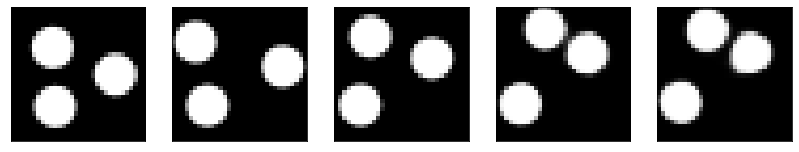

GD iterations:
i=0 | err=53.460079
i=1 | err=52.263206
i=2 | err=50.724705
i=3 | err=48.985146
i=4 | err=47.098015
i=5 | err=45.190182
i=6 | err=43.162582
i=7 | err=41.022476
i=8 | err=38.823597
i=9 | err=36.603294
i=10 | err=34.396416
i=11 | err=32.284451
i=12 | err=30.147333
i=13 | err=28.108486
i=14 | err=26.106030
i=15 | err=24.149645
i=16 | err=22.281973
i=17 | err=20.527163
i=18 | err=18.938107
i=19 | err=17.471401
i=20 | err=16.172832
i=21 | err=14.987653
i=22 | err=13.892401
i=23 | err=12.873842
i=24 | err=11.914715
i=25 | err=11.006931
i=26 | err=10.128689
i=27 | err=9.288509
i=28 | err=8.476753
i=29 | err=7.703297
Epoch=269 (59%) | out_positive=0.911398 | out_negative=0.100111 | mse=0.075542


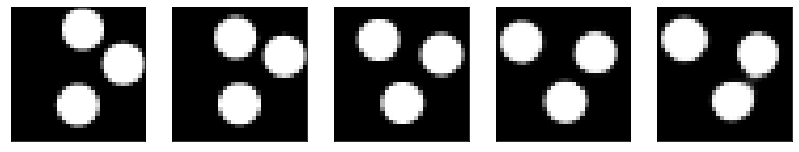

GD iterations:
i=0 | err=50.405785
i=1 | err=49.254700
i=2 | err=47.663235
i=3 | err=45.778267
i=4 | err=43.702026
i=5 | err=41.578625
i=6 | err=39.331570
i=7 | err=37.137238
i=8 | err=34.983921
i=9 | err=32.900833
i=10 | err=30.918221
i=11 | err=28.902182
i=12 | err=26.962679
i=13 | err=25.024879
i=14 | err=23.250982
i=15 | err=21.594765
i=16 | err=19.964643
i=17 | err=18.377163
i=18 | err=16.879562
i=19 | err=15.492044
i=20 | err=14.194912
i=21 | err=12.982129
i=22 | err=11.871783
i=23 | err=10.856528
i=24 | err=9.922938
i=25 | err=9.063117
i=26 | err=8.288015
i=27 | err=7.557024
i=28 | err=6.886003
i=29 | err=6.251717
Epoch=269 (61%) | out_positive=0.878149 | out_negative=0.170022 | mse=0.065703


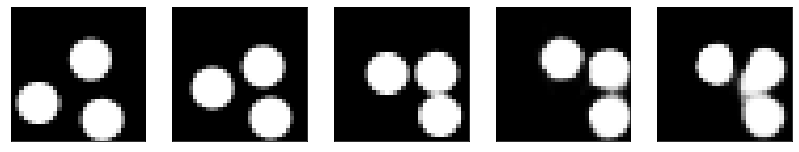

GD iterations:
i=0 | err=55.787777
i=1 | err=54.592945
i=2 | err=52.916111
i=3 | err=51.083057
i=4 | err=49.187389
i=5 | err=47.241302
i=6 | err=45.247841
i=7 | err=43.222389
i=8 | err=41.116009
i=9 | err=38.936714
i=10 | err=36.674393
i=11 | err=34.444153
i=12 | err=32.349152
i=13 | err=30.277939
i=14 | err=28.329359
i=15 | err=26.410908
i=16 | err=24.541851
i=17 | err=22.722851
i=18 | err=20.955885
i=19 | err=19.208458
i=20 | err=17.599216
i=21 | err=16.136404
i=22 | err=14.800764
i=23 | err=13.582701
i=24 | err=12.466835
i=25 | err=11.418585
i=26 | err=10.428971
i=27 | err=9.526089
i=28 | err=8.666346
i=29 | err=7.878598
Epoch=269 (63%) | out_positive=0.835207 | out_negative=0.081395 | mse=0.073333


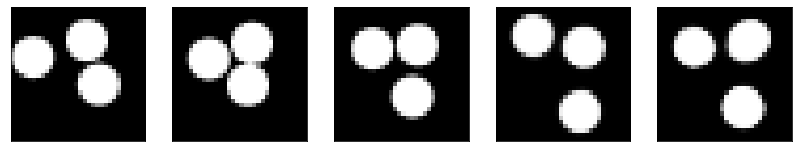

GD iterations:
i=0 | err=56.494835
i=1 | err=55.203125
i=2 | err=53.466076
i=3 | err=51.533005
i=4 | err=49.465240
i=5 | err=47.282478
i=6 | err=45.026196
i=7 | err=42.738831
i=8 | err=40.469757
i=9 | err=38.241814
i=10 | err=35.990005
i=11 | err=33.741257
i=12 | err=31.522076
i=13 | err=29.355623
i=14 | err=27.316862
i=15 | err=25.340427
i=16 | err=23.411566
i=17 | err=21.589857
i=18 | err=19.881763
i=19 | err=18.284367
i=20 | err=16.860239
i=21 | err=15.511199
i=22 | err=14.275213
i=23 | err=13.144873
i=24 | err=12.071859
i=25 | err=11.078110
i=26 | err=10.111773
i=27 | err=9.208078
i=28 | err=8.338302
i=29 | err=7.540221
Epoch=269 (64%) | out_positive=0.893487 | out_negative=0.098863 | mse=0.069952


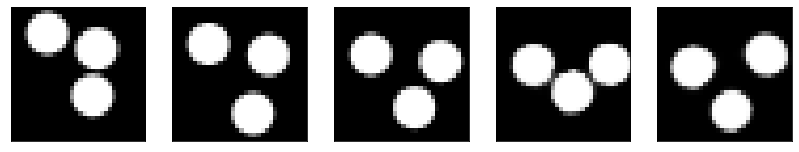

GD iterations:
i=0 | err=55.247849
i=1 | err=53.902271
i=2 | err=52.054443
i=3 | err=49.903481
i=4 | err=47.670181
i=5 | err=45.420456
i=6 | err=43.206200
i=7 | err=40.985245
i=8 | err=38.675926
i=9 | err=36.432579
i=10 | err=34.214790
i=11 | err=32.079636
i=12 | err=29.945801
i=13 | err=27.874914
i=14 | err=25.909405
i=15 | err=23.977779
i=16 | err=22.195614
i=17 | err=20.529648
i=18 | err=18.971420
i=19 | err=17.505854
i=20 | err=16.116932
i=21 | err=14.866720
i=22 | err=13.713821
i=23 | err=12.649775
i=24 | err=11.632449
i=25 | err=10.716817
i=26 | err=9.882698
i=27 | err=9.118782
i=28 | err=8.391707
i=29 | err=7.684993
Epoch=269 (66%) | out_positive=0.808055 | out_negative=0.089525 | mse=0.068197


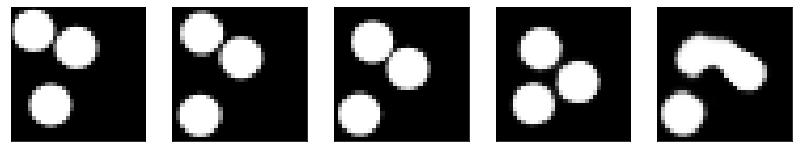

GD iterations:
i=0 | err=52.280647
i=1 | err=51.016018
i=2 | err=49.295349
i=3 | err=47.283607
i=4 | err=45.167099
i=5 | err=42.941719
i=6 | err=40.739441
i=7 | err=38.528160
i=8 | err=36.332699
i=9 | err=34.207478
i=10 | err=32.179710
i=11 | err=30.208736
i=12 | err=28.222849
i=13 | err=26.323029
i=14 | err=24.537624
i=15 | err=22.831316
i=16 | err=21.212629
i=17 | err=19.679409
i=18 | err=18.243961
i=19 | err=16.868433
i=20 | err=15.567844
i=21 | err=14.351080
i=22 | err=13.201572
i=23 | err=12.114543
i=24 | err=11.096577
i=25 | err=10.115337
i=26 | err=9.242381
i=27 | err=8.426709
i=28 | err=7.649698
i=29 | err=6.897531
Epoch=269 (68%) | out_positive=0.882554 | out_negative=0.122018 | mse=0.068153


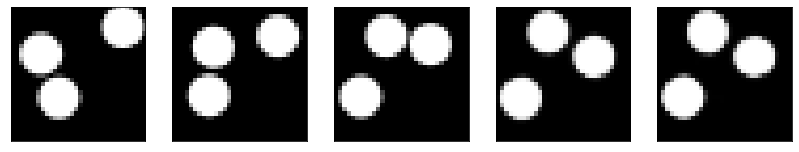

GD iterations:
i=0 | err=54.855679
i=1 | err=53.580982
i=2 | err=51.722191
i=3 | err=49.721756
i=4 | err=47.711800
i=5 | err=45.628693
i=6 | err=43.485016
i=7 | err=41.272572
i=8 | err=39.060017
i=9 | err=36.838623
i=10 | err=34.613918
i=11 | err=32.420563
i=12 | err=30.275217
i=13 | err=28.192471
i=14 | err=26.182852
i=15 | err=24.294527
i=16 | err=22.520107
i=17 | err=20.803581
i=18 | err=19.182224
i=19 | err=17.689213
i=20 | err=16.265530
i=21 | err=14.896124
i=22 | err=13.626352
i=23 | err=12.443185
i=24 | err=11.342241
i=25 | err=10.334708
i=26 | err=9.348404
i=27 | err=8.432044
i=28 | err=7.588269
i=29 | err=6.800385
Epoch=269 (70%) | out_positive=0.892187 | out_negative=0.088791 | mse=0.077036


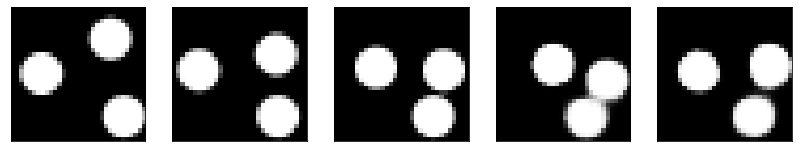

GD iterations:
i=0 | err=57.354813
i=1 | err=56.133492
i=2 | err=54.352638
i=3 | err=52.425156
i=4 | err=50.311615
i=5 | err=48.112000
i=6 | err=45.921913
i=7 | err=43.643555
i=8 | err=41.412582
i=9 | err=39.182861
i=10 | err=36.959988
i=11 | err=34.792381
i=12 | err=32.592262
i=13 | err=30.387411
i=14 | err=28.221916
i=15 | err=26.124819
i=16 | err=24.106239
i=17 | err=22.194742
i=18 | err=20.453979
i=19 | err=18.875099
i=20 | err=17.390236
i=21 | err=16.000013
i=22 | err=14.725173
i=23 | err=13.511721
i=24 | err=12.388918
i=25 | err=11.269244
i=26 | err=10.236463
i=27 | err=9.264181
i=28 | err=8.376402
i=29 | err=7.525301
Epoch=269 (72%) | out_positive=0.884063 | out_negative=0.126942 | mse=0.071797


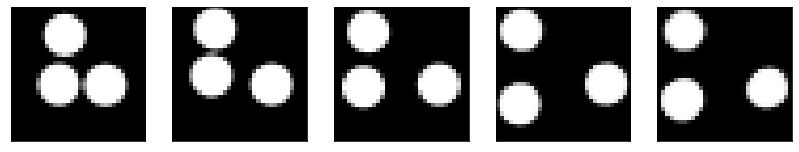

GD iterations:
i=0 | err=51.343636
i=1 | err=50.129097
i=2 | err=48.444519
i=3 | err=46.678352
i=4 | err=44.716980
i=5 | err=42.786728
i=6 | err=40.724216
i=7 | err=38.590191
i=8 | err=36.450047
i=9 | err=34.292778
i=10 | err=32.123627
i=11 | err=30.005697
i=12 | err=27.989595
i=13 | err=26.073952
i=14 | err=24.173153
i=15 | err=22.434227
i=16 | err=20.743618
i=17 | err=19.112442
i=18 | err=17.591553
i=19 | err=16.158224
i=20 | err=14.851711
i=21 | err=13.640329
i=22 | err=12.566812
i=23 | err=11.550436
i=24 | err=10.601191
i=25 | err=9.713219
i=26 | err=8.897947
i=27 | err=8.130112
i=28 | err=7.403351
i=29 | err=6.704299
Epoch=269 (74%) | out_positive=0.919432 | out_negative=0.120096 | mse=0.073975


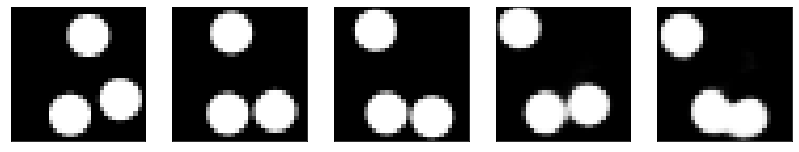

GD iterations:
i=0 | err=54.846035
i=1 | err=53.653099
i=2 | err=51.999287
i=3 | err=50.116219
i=4 | err=48.029518
i=5 | err=45.955933
i=6 | err=43.802032
i=7 | err=41.576931
i=8 | err=39.284897
i=9 | err=37.012146
i=10 | err=34.717815
i=11 | err=32.614666
i=12 | err=30.536163
i=13 | err=28.476460
i=14 | err=26.490076
i=15 | err=24.589592
i=16 | err=22.777794
i=17 | err=21.001266
i=18 | err=19.323072
i=19 | err=17.723557
i=20 | err=16.239080
i=21 | err=14.880473
i=22 | err=13.649544
i=23 | err=12.543749
i=24 | err=11.526464
i=25 | err=10.591425
i=26 | err=9.669323
i=27 | err=8.803289
i=28 | err=7.929152
i=29 | err=7.133458
Epoch=269 (76%) | out_positive=0.916438 | out_negative=0.146074 | mse=0.072966


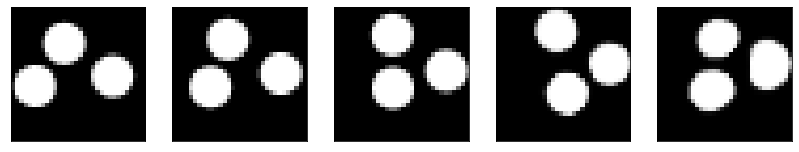

GD iterations:
i=0 | err=55.883949
i=1 | err=54.759991
i=2 | err=53.077122
i=3 | err=51.163273
i=4 | err=49.134369
i=5 | err=47.050774
i=6 | err=44.930550
i=7 | err=42.726856
i=8 | err=40.396774
i=9 | err=38.128895
i=10 | err=35.895882
i=11 | err=33.684124
i=12 | err=31.477932
i=13 | err=29.254984
i=14 | err=27.163963
i=15 | err=25.178730
i=16 | err=23.371494
i=17 | err=21.661259
i=18 | err=20.135733
i=19 | err=18.795177
i=20 | err=17.546455
i=21 | err=16.397278
i=22 | err=15.296002
i=23 | err=14.249552
i=24 | err=13.231018
i=25 | err=12.283034
i=26 | err=11.370146
i=27 | err=10.487066
i=28 | err=9.640157
i=29 | err=8.805220
Epoch=269 (77%) | out_positive=0.853433 | out_negative=0.066658 | mse=0.078654


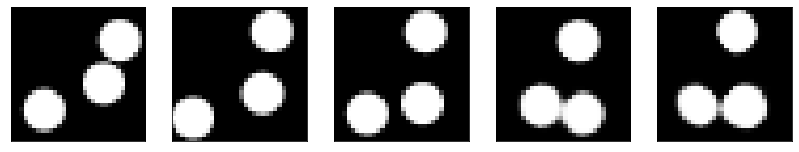

GD iterations:
i=0 | err=57.062855
i=1 | err=55.742287
i=2 | err=53.860065
i=3 | err=51.826958
i=4 | err=49.620049
i=5 | err=47.460548
i=6 | err=45.245949
i=7 | err=43.006523
i=8 | err=40.734055
i=9 | err=38.385990
i=10 | err=36.021980
i=11 | err=33.630665
i=12 | err=31.270538
i=13 | err=28.959888
i=14 | err=26.778561
i=15 | err=24.679207
i=16 | err=22.631050
i=17 | err=20.704254
i=18 | err=18.914055
i=19 | err=17.300220
i=20 | err=15.806687
i=21 | err=14.469318
i=22 | err=13.286173
i=23 | err=12.166816
i=24 | err=11.073011
i=25 | err=10.010468
i=26 | err=8.956158
i=27 | err=7.973860
i=28 | err=7.079058
i=29 | err=6.265704
Epoch=269 (79%) | out_positive=0.903091 | out_negative=0.104648 | mse=0.070279


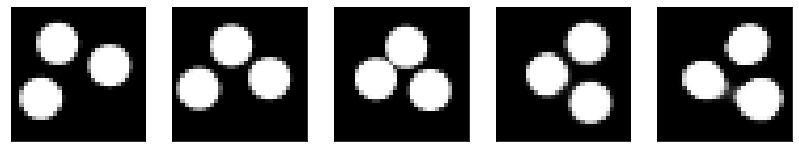

GD iterations:
i=0 | err=57.266205
i=1 | err=56.081226
i=2 | err=54.473831
i=3 | err=52.691681
i=4 | err=50.815941
i=5 | err=48.883904
i=6 | err=46.862392
i=7 | err=44.823723
i=8 | err=42.729851
i=9 | err=40.505325
i=10 | err=38.226425
i=11 | err=36.000237
i=12 | err=33.765350
i=13 | err=31.554359
i=14 | err=29.357164
i=15 | err=27.094318
i=16 | err=24.982330
i=17 | err=22.975609
i=18 | err=21.095522
i=19 | err=19.325550
i=20 | err=17.693045
i=21 | err=16.183800
i=22 | err=14.725794
i=23 | err=13.373217
i=24 | err=12.110818
i=25 | err=10.978554
i=26 | err=9.879253
i=27 | err=8.830569
i=28 | err=7.808308
i=29 | err=6.849274
Epoch=269 (81%) | out_positive=0.822050 | out_negative=0.133848 | mse=0.069516


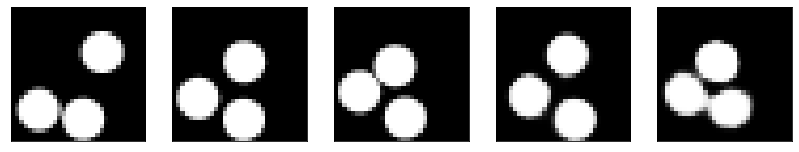

GD iterations:
i=0 | err=58.323460
i=1 | err=57.045105
i=2 | err=55.227638
i=3 | err=53.278603
i=4 | err=51.209877
i=5 | err=49.015617
i=6 | err=46.761154
i=7 | err=44.465576
i=8 | err=42.089191
i=9 | err=39.643936
i=10 | err=37.158394
i=11 | err=34.788391
i=12 | err=32.487961
i=13 | err=30.409061
i=14 | err=28.424623
i=15 | err=26.501076
i=16 | err=24.694683
i=17 | err=22.956831
i=18 | err=21.279007
i=19 | err=19.689964
i=20 | err=18.180212
i=21 | err=16.791368
i=22 | err=15.494875
i=23 | err=14.296262
i=24 | err=13.147625
i=25 | err=12.060694
i=26 | err=11.024957
i=27 | err=10.069445
i=28 | err=9.175249
i=29 | err=8.339931
Epoch=269 (83%) | out_positive=0.853272 | out_negative=0.101250 | mse=0.074251


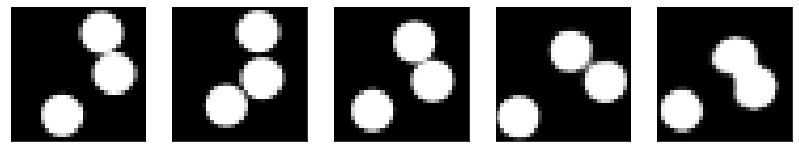

GD iterations:
i=0 | err=51.996841
i=1 | err=50.695282
i=2 | err=48.908821
i=3 | err=46.988411
i=4 | err=44.959946
i=5 | err=42.963867
i=6 | err=40.857025
i=7 | err=38.699745
i=8 | err=36.519047
i=9 | err=34.246284
i=10 | err=32.084457
i=11 | err=29.895069
i=12 | err=27.822025
i=13 | err=25.863121
i=14 | err=23.924263
i=15 | err=22.119591
i=16 | err=20.421103
i=17 | err=18.756184
i=18 | err=17.236938
i=19 | err=15.907427
i=20 | err=14.688344
i=21 | err=13.552431
i=22 | err=12.487680
i=23 | err=11.474798
i=24 | err=10.497883
i=25 | err=9.557039
i=26 | err=8.655755
i=27 | err=7.844249
i=28 | err=7.083599
i=29 | err=6.371766
Epoch=269 (85%) | out_positive=0.924536 | out_negative=0.147164 | mse=0.072547


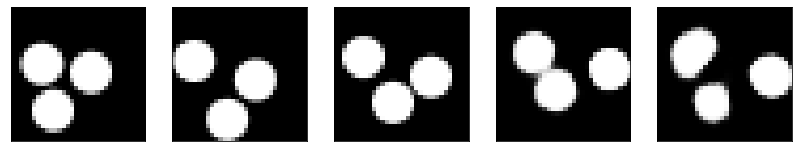

GD iterations:
i=0 | err=57.527817
i=1 | err=56.197006
i=2 | err=54.411938
i=3 | err=52.378036
i=4 | err=50.282459
i=5 | err=48.104687
i=6 | err=45.785423
i=7 | err=43.347294
i=8 | err=40.920204
i=9 | err=38.474586
i=10 | err=36.010574
i=11 | err=33.595795
i=12 | err=31.305786
i=13 | err=29.059654
i=14 | err=26.945393
i=15 | err=24.969803
i=16 | err=23.049660
i=17 | err=21.271021
i=18 | err=19.627834
i=19 | err=18.068285
i=20 | err=16.524599
i=21 | err=15.101982
i=22 | err=13.786351
i=23 | err=12.494001
i=24 | err=11.290416
i=25 | err=10.187130
i=26 | err=9.183549
i=27 | err=8.282734
i=28 | err=7.436846
i=29 | err=6.634912
Epoch=269 (87%) | out_positive=0.891146 | out_negative=0.142085 | mse=0.074990


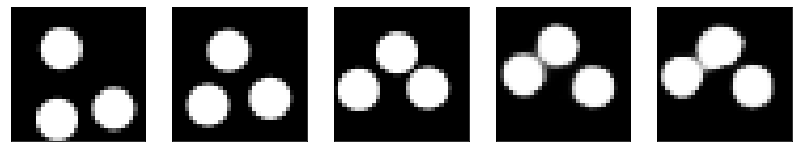

GD iterations:
i=0 | err=54.985245
i=1 | err=53.604439
i=2 | err=51.743080
i=3 | err=49.667946
i=4 | err=47.427963
i=5 | err=45.172001
i=6 | err=42.926987
i=7 | err=40.551353
i=8 | err=38.295219
i=9 | err=35.892517
i=10 | err=33.501003
i=11 | err=31.097313
i=12 | err=28.867237
i=13 | err=26.669321
i=14 | err=24.579067
i=15 | err=22.592978
i=16 | err=20.729877
i=17 | err=19.013802
i=18 | err=17.432051
i=19 | err=16.037104
i=20 | err=14.721744
i=21 | err=13.488111
i=22 | err=12.342064
i=23 | err=11.264501
i=24 | err=10.322468
i=25 | err=9.442167
i=26 | err=8.623837
i=27 | err=7.862885
i=28 | err=7.098879
i=29 | err=6.386364
Epoch=269 (88%) | out_positive=0.892480 | out_negative=0.119899 | mse=0.069510


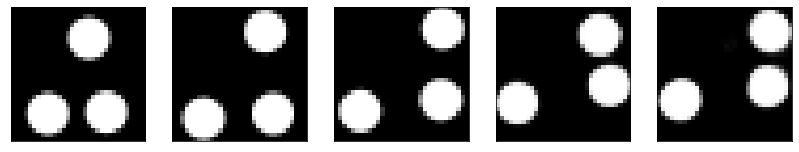

GD iterations:
i=0 | err=54.230091
i=1 | err=52.831272
i=2 | err=50.959625
i=3 | err=48.879501
i=4 | err=46.791267
i=5 | err=44.504265
i=6 | err=42.262245
i=7 | err=39.951561
i=8 | err=37.567276
i=9 | err=35.263756
i=10 | err=32.959000
i=11 | err=30.696680
i=12 | err=28.538500
i=13 | err=26.466143
i=14 | err=24.500057
i=15 | err=22.637970
i=16 | err=20.990562
i=17 | err=19.473572
i=18 | err=18.004147
i=19 | err=16.650459
i=20 | err=15.343294
i=21 | err=14.113038
i=22 | err=12.955398
i=23 | err=11.856106
i=24 | err=10.862669
i=25 | err=9.924100
i=26 | err=9.077074
i=27 | err=8.284729
i=28 | err=7.521692
i=29 | err=6.811296
Epoch=269 (90%) | out_positive=0.934243 | out_negative=0.141127 | mse=0.076834


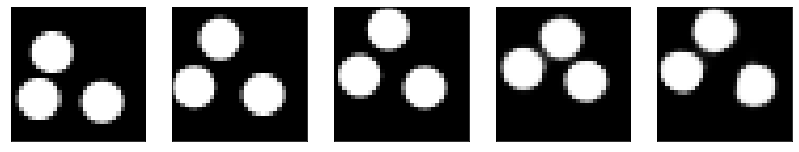

GD iterations:
i=0 | err=54.937004
i=1 | err=53.697083
i=2 | err=52.026886
i=3 | err=50.092003
i=4 | err=48.088432
i=5 | err=46.034374
i=6 | err=43.898117
i=7 | err=41.676987
i=8 | err=39.397160
i=9 | err=37.136818
i=10 | err=34.901535
i=11 | err=32.660416
i=12 | err=30.442883
i=13 | err=28.322903
i=14 | err=26.369669
i=15 | err=24.429798
i=16 | err=22.486307
i=17 | err=20.661615
i=18 | err=18.965042
i=19 | err=17.411858
i=20 | err=15.943346
i=21 | err=14.567144
i=22 | err=13.285147
i=23 | err=12.145545
i=24 | err=11.107172
i=25 | err=10.120626
i=26 | err=9.202457
i=27 | err=8.322596
i=28 | err=7.474023
i=29 | err=6.663209
Epoch=269 (92%) | out_positive=0.922182 | out_negative=0.146075 | mse=0.078019


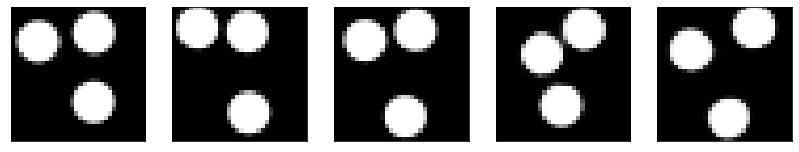

GD iterations:
i=0 | err=56.034077
i=1 | err=54.702480
i=2 | err=52.871918
i=3 | err=50.854164
i=4 | err=48.730427
i=5 | err=46.472748
i=6 | err=44.217766
i=7 | err=41.795395
i=8 | err=39.339394
i=9 | err=37.001827
i=10 | err=34.580315
i=11 | err=32.196976
i=12 | err=29.849953
i=13 | err=27.724220
i=14 | err=25.619896
i=15 | err=23.628735
i=16 | err=21.776218
i=17 | err=20.063721
i=18 | err=18.471760
i=19 | err=16.990911
i=20 | err=15.588863
i=21 | err=14.309032
i=22 | err=13.123183
i=23 | err=11.988981
i=24 | err=10.925447
i=25 | err=9.914879
i=26 | err=8.943446
i=27 | err=7.986203
i=28 | err=7.091470
i=29 | err=6.242537
Epoch=269 (94%) | out_positive=0.927154 | out_negative=0.194164 | mse=0.070832


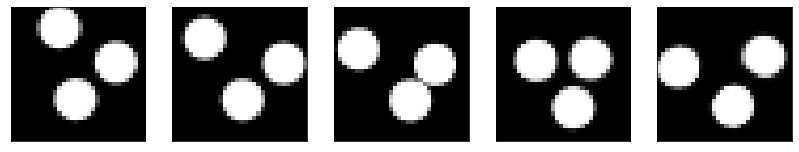

GD iterations:
i=0 | err=51.089695
i=1 | err=49.934288
i=2 | err=48.309219
i=3 | err=46.527946
i=4 | err=44.524044
i=5 | err=42.394855
i=6 | err=40.192345
i=7 | err=37.889687
i=8 | err=35.572910
i=9 | err=33.224510
i=10 | err=30.874493
i=11 | err=28.502342
i=12 | err=26.236351
i=13 | err=24.118134
i=14 | err=22.159327
i=15 | err=20.348616
i=16 | err=18.709797
i=17 | err=17.230877
i=18 | err=15.840839
i=19 | err=14.534286
i=20 | err=13.321883
i=21 | err=12.169624
i=22 | err=11.101830
i=23 | err=10.127183
i=24 | err=9.227220
i=25 | err=8.374077
i=26 | err=7.560851
i=27 | err=6.785787
i=28 | err=6.046900
i=29 | err=5.343244
Epoch=269 (96%) | out_positive=0.927956 | out_negative=0.181568 | mse=0.069032


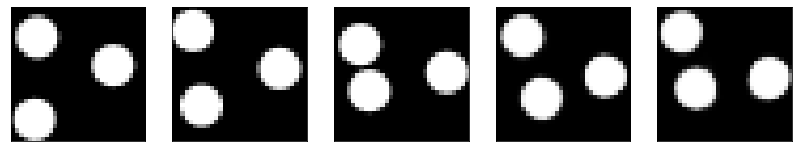

GD iterations:
i=0 | err=54.547623
i=1 | err=53.324089
i=2 | err=51.597988
i=3 | err=49.680065
i=4 | err=47.695278
i=5 | err=45.704025
i=6 | err=43.595982
i=7 | err=41.458992
i=8 | err=39.219124
i=9 | err=36.928680
i=10 | err=34.666321
i=11 | err=32.335670
i=12 | err=30.096966
i=13 | err=27.961227
i=14 | err=25.832548
i=15 | err=23.779758
i=16 | err=21.887609
i=17 | err=20.083519
i=18 | err=18.422913
i=19 | err=16.867880
i=20 | err=15.466106
i=21 | err=14.172220
i=22 | err=12.946296
i=23 | err=11.790518
i=24 | err=10.744831
i=25 | err=9.769234
i=26 | err=8.859289
i=27 | err=7.956679
i=28 | err=7.101298
i=29 | err=6.287889
Epoch=269 (98%) | out_positive=0.889612 | out_negative=0.140963 | mse=0.070638


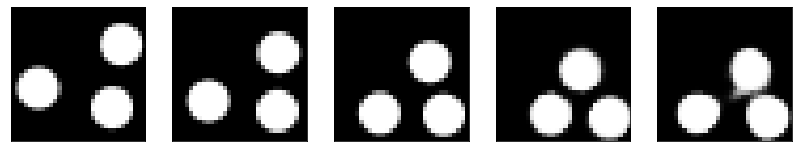

GD iterations:
i=0 | err=56.953651
i=1 | err=55.886864
i=2 | err=54.267532
i=3 | err=52.342491
i=4 | err=50.281715
i=5 | err=48.123314
i=6 | err=45.801277
i=7 | err=43.425308
i=8 | err=41.057762
i=9 | err=38.590446
i=10 | err=36.144138
i=11 | err=33.828079
i=12 | err=31.605721
i=13 | err=29.450817
i=14 | err=27.456585
i=15 | err=25.529175
i=16 | err=23.704506
i=17 | err=21.995674
i=18 | err=20.329166
i=19 | err=18.805206
i=20 | err=17.334339
i=21 | err=16.006168
i=22 | err=14.788546
i=23 | err=13.664745
i=24 | err=12.624781
i=25 | err=11.606759
i=26 | err=10.635313
i=27 | err=9.718980
i=28 | err=8.844151
i=29 | err=8.036747
Epoch=269 (100%) | out_positive=0.867519 | out_negative=0.087556 | mse=0.075068


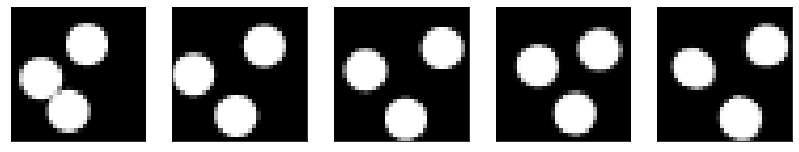

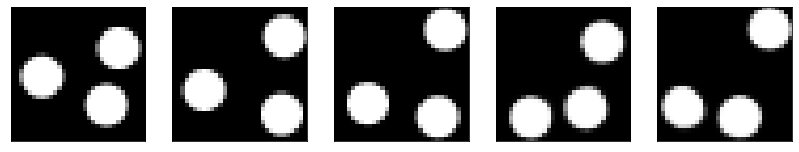

Test MSE 0.078931


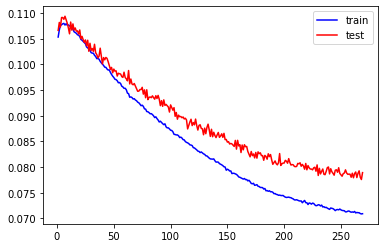

GD iterations:
i=0 | err=55.946541
i=1 | err=54.702168
i=2 | err=52.997860
i=3 | err=51.006325
i=4 | err=48.930244
i=5 | err=46.823792
i=6 | err=44.613075
i=7 | err=42.335129
i=8 | err=39.985840
i=9 | err=37.649559
i=10 | err=35.278534
i=11 | err=33.014587
i=12 | err=30.828775
i=13 | err=28.656036
i=14 | err=26.504725
i=15 | err=24.416178
i=16 | err=22.421999
i=17 | err=20.712708
i=18 | err=19.087566
i=19 | err=17.582010
i=20 | err=16.183903
i=21 | err=14.821125
i=22 | err=13.610535
i=23 | err=12.490059
i=24 | err=11.457591
i=25 | err=10.525043
i=26 | err=9.629805
i=27 | err=8.797466
i=28 | err=8.016536
i=29 | err=7.291516
Epoch=270 (0%) | out_positive=0.840197 | out_negative=0.100106 | mse=0.071504


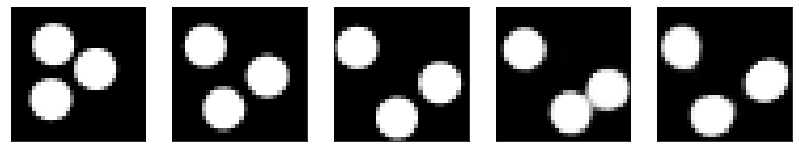

GD iterations:
i=0 | err=55.411369
i=1 | err=54.261448
i=2 | err=52.657303
i=3 | err=50.843315
i=4 | err=48.941521
i=5 | err=46.978569
i=6 | err=44.922657
i=7 | err=42.854980
i=8 | err=40.746494
i=9 | err=38.647354
i=10 | err=36.551567
i=11 | err=34.392033
i=12 | err=32.322750
i=13 | err=30.320862
i=14 | err=28.358757
i=15 | err=26.421337
i=16 | err=24.659584
i=17 | err=22.889336
i=18 | err=21.190632
i=19 | err=19.563263
i=20 | err=18.038197
i=21 | err=16.593569
i=22 | err=15.257000
i=23 | err=14.000775
i=24 | err=12.847594
i=25 | err=11.791350
i=26 | err=10.826580
i=27 | err=9.965612
i=28 | err=9.151100
i=29 | err=8.394733
Epoch=270 (2%) | out_positive=0.800362 | out_negative=0.087631 | mse=0.075179


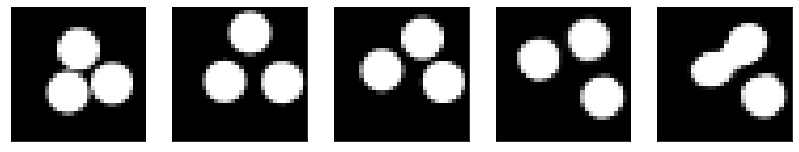

GD iterations:
i=0 | err=55.223007
i=1 | err=54.031288
i=2 | err=52.295155
i=3 | err=50.322933
i=4 | err=48.222694
i=5 | err=46.055801
i=6 | err=43.680023
i=7 | err=41.304039
i=8 | err=38.948307
i=9 | err=36.541912
i=10 | err=34.142838
i=11 | err=31.789654
i=12 | err=29.530073
i=13 | err=27.359661
i=14 | err=25.315989
i=15 | err=23.251896
i=16 | err=21.296608
i=17 | err=19.497694
i=18 | err=17.865665
i=19 | err=16.341759
i=20 | err=14.906639
i=21 | err=13.573455
i=22 | err=12.385646
i=23 | err=11.334227
i=24 | err=10.319281
i=25 | err=9.343949
i=26 | err=8.446261
i=27 | err=7.630622
i=28 | err=6.868045
i=29 | err=6.160559
Epoch=270 (4%) | out_positive=0.910024 | out_negative=0.151823 | mse=0.069305


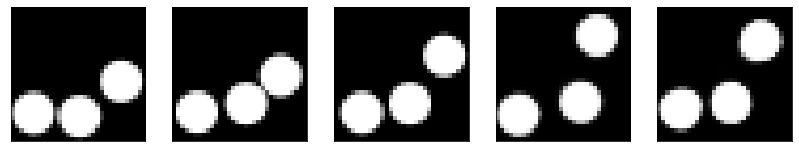

GD iterations:
i=0 | err=54.378307
i=1 | err=53.035500
i=2 | err=51.187386
i=3 | err=49.132957
i=4 | err=47.116631
i=5 | err=45.053204
i=6 | err=42.992981
i=7 | err=40.853004
i=8 | err=38.717102
i=9 | err=36.551701
i=10 | err=34.432812
i=11 | err=32.267349
i=12 | err=30.238197
i=13 | err=28.261398
i=14 | err=26.350010
i=15 | err=24.551292
i=16 | err=22.856243
i=17 | err=21.237827
i=18 | err=19.651522
i=19 | err=18.154787
i=20 | err=16.737253
i=21 | err=15.424212
i=22 | err=14.207624
i=23 | err=13.077424
i=24 | err=12.032074
i=25 | err=11.072346
i=26 | err=10.157347
i=27 | err=9.282280
i=28 | err=8.481436
i=29 | err=7.735229
Epoch=270 (6%) | out_positive=0.931717 | out_negative=0.112665 | mse=0.077993


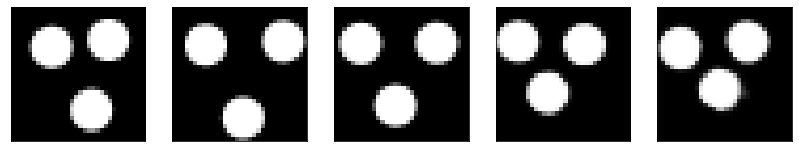

GD iterations:
i=0 | err=58.133396
i=1 | err=56.801762
i=2 | err=54.850513
i=3 | err=52.696991
i=4 | err=50.356037
i=5 | err=47.955139
i=6 | err=45.338562
i=7 | err=42.649727
i=8 | err=39.998055
i=9 | err=37.371628
i=10 | err=34.735870
i=11 | err=32.209793
i=12 | err=29.718355
i=13 | err=27.430676
i=14 | err=25.319931
i=15 | err=23.324530
i=16 | err=21.492905
i=17 | err=19.768442
i=18 | err=18.194889
i=19 | err=16.696247
i=20 | err=15.315270
i=21 | err=14.049171
i=22 | err=12.891235
i=23 | err=11.820093
i=24 | err=10.848467
i=25 | err=9.963234
i=26 | err=9.137266
i=27 | err=8.316327
i=28 | err=7.491883
i=29 | err=6.702807
Epoch=270 (8%) | out_positive=0.903546 | out_negative=0.145373 | mse=0.070283


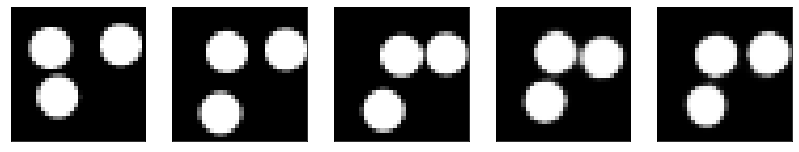

GD iterations:
i=0 | err=57.358376
i=1 | err=56.136185
i=2 | err=54.384399
i=3 | err=52.379898
i=4 | err=50.264297
i=5 | err=48.126213
i=6 | err=45.895527
i=7 | err=43.452976
i=8 | err=40.978844
i=9 | err=38.453964
i=10 | err=35.901947
i=11 | err=33.396942
i=12 | err=30.892727
i=13 | err=28.524408
i=14 | err=26.267729
i=15 | err=24.160992
i=16 | err=22.215050
i=17 | err=20.389914
i=18 | err=18.749207
i=19 | err=17.282593
i=20 | err=15.918237
i=21 | err=14.659698
i=22 | err=13.482766
i=23 | err=12.396300
i=24 | err=11.412219
i=25 | err=10.491484
i=26 | err=9.589249
i=27 | err=8.711305
i=28 | err=7.914158
i=29 | err=7.118701
Epoch=270 (9%) | out_positive=0.822558 | out_negative=0.105699 | mse=0.071337


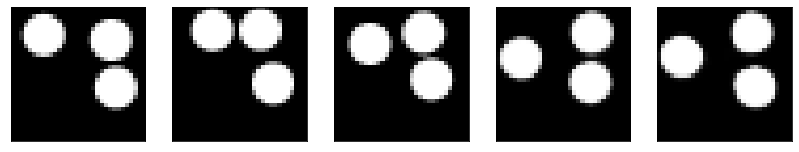

GD iterations:
i=0 | err=54.017967
i=1 | err=52.739937
i=2 | err=50.989601
i=3 | err=49.003075
i=4 | err=46.897182
i=5 | err=44.743706
i=6 | err=42.537418
i=7 | err=40.365677
i=8 | err=38.197838
i=9 | err=36.073643
i=10 | err=33.822422
i=11 | err=31.535740
i=12 | err=29.288931
i=13 | err=27.176445
i=14 | err=25.199188
i=15 | err=23.297882
i=16 | err=21.532354
i=17 | err=19.879978
i=18 | err=18.304756
i=19 | err=16.787853
i=20 | err=15.379718
i=21 | err=14.081623
i=22 | err=12.884463
i=23 | err=11.765066
i=24 | err=10.746028
i=25 | err=9.789556
i=26 | err=8.907185
i=27 | err=8.098596
i=28 | err=7.349114
i=29 | err=6.654976
Epoch=270 (11%) | out_positive=0.911151 | out_negative=0.118134 | mse=0.074073


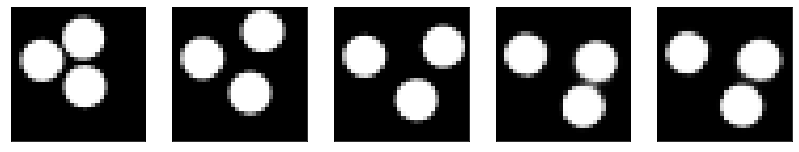

GD iterations:
i=0 | err=55.662880
i=1 | err=54.470032
i=2 | err=52.801323
i=3 | err=50.923882
i=4 | err=48.964912
i=5 | err=46.904152
i=6 | err=44.817360
i=7 | err=42.679642
i=8 | err=40.503067
i=9 | err=38.310074
i=10 | err=36.186104
i=11 | err=34.003658
i=12 | err=31.788702
i=13 | err=29.609451
i=14 | err=27.429390
i=15 | err=25.382477
i=16 | err=23.400002
i=17 | err=21.502995
i=18 | err=19.742325
i=19 | err=18.086069
i=20 | err=16.514820
i=21 | err=15.066236
i=22 | err=13.711245
i=23 | err=12.468252
i=24 | err=11.324494
i=25 | err=10.250451
i=26 | err=9.267048
i=27 | err=8.360361
i=28 | err=7.509737
i=29 | err=6.718686
Epoch=270 (13%) | out_positive=0.859314 | out_negative=0.099177 | mse=0.073215


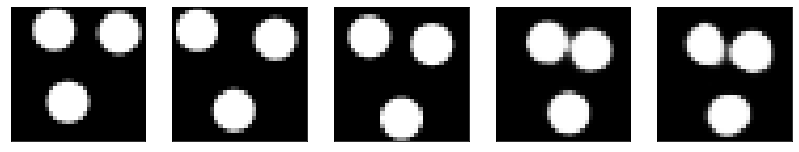

GD iterations:
i=0 | err=52.211884
i=1 | err=51.059380
i=2 | err=49.392838
i=3 | err=47.539593
i=4 | err=45.594498
i=5 | err=43.530632
i=6 | err=41.300446
i=7 | err=38.985405
i=8 | err=36.828602
i=9 | err=34.710629
i=10 | err=32.692078
i=11 | err=30.575417
i=12 | err=28.490843
i=13 | err=26.392935
i=14 | err=24.418999
i=15 | err=22.611261
i=16 | err=20.847143
i=17 | err=19.226015
i=18 | err=17.695488
i=19 | err=16.300632
i=20 | err=14.996389
i=21 | err=13.818451
i=22 | err=12.723455
i=23 | err=11.715721
i=24 | err=10.716408
i=25 | err=9.786055
i=26 | err=8.904348
i=27 | err=8.043009
i=28 | err=7.243276
i=29 | err=6.538143
Epoch=270 (15%) | out_positive=0.907255 | out_negative=0.148619 | mse=0.067639


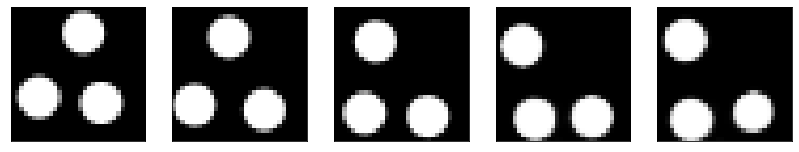

GD iterations:
i=0 | err=51.113686
i=1 | err=49.978737
i=2 | err=48.408905
i=3 | err=46.690655
i=4 | err=44.848465
i=5 | err=42.964848
i=6 | err=41.032150
i=7 | err=38.945198
i=8 | err=36.826900
i=9 | err=34.706871
i=10 | err=32.564079
i=11 | err=30.417850
i=12 | err=28.266632
i=13 | err=26.153551
i=14 | err=24.162504
i=15 | err=22.257397
i=16 | err=20.513559
i=17 | err=18.910894
i=18 | err=17.464193
i=19 | err=16.159653
i=20 | err=14.995848
i=21 | err=13.922229
i=22 | err=12.881597
i=23 | err=11.918627
i=24 | err=11.025606
i=25 | err=10.205849
i=26 | err=9.407602
i=27 | err=8.673119
i=28 | err=7.953120
i=29 | err=7.278566
Epoch=270 (17%) | out_positive=0.910493 | out_negative=0.110296 | mse=0.071186


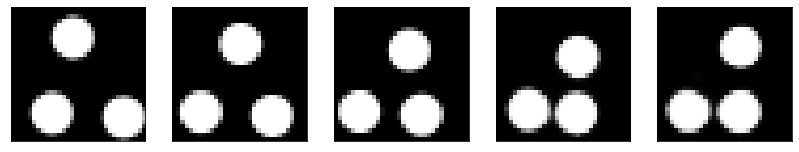

GD iterations:
i=0 | err=56.168587
i=1 | err=54.949898
i=2 | err=53.252892
i=3 | err=51.453693
i=4 | err=49.436378
i=5 | err=47.400307
i=6 | err=45.279556
i=7 | err=43.057991
i=8 | err=40.674393
i=9 | err=38.209976
i=10 | err=35.848015
i=11 | err=33.555054
i=12 | err=31.288109
i=13 | err=29.098005
i=14 | err=27.036278
i=15 | err=25.054298
i=16 | err=23.169617
i=17 | err=21.366917
i=18 | err=19.698154
i=19 | err=18.213779
i=20 | err=16.890648
i=21 | err=15.652748
i=22 | err=14.474865
i=23 | err=13.414558
i=24 | err=12.353954
i=25 | err=11.398683
i=26 | err=10.449303
i=27 | err=9.542274
i=28 | err=8.671310
i=29 | err=7.794743
Epoch=270 (19%) | out_positive=0.848640 | out_negative=0.089834 | mse=0.075422


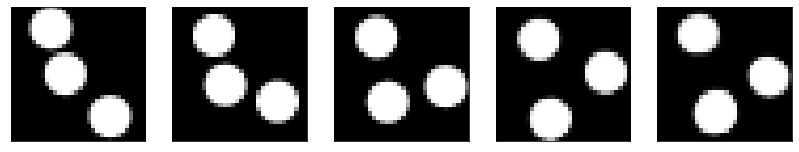

GD iterations:
i=0 | err=53.248592
i=1 | err=51.991982
i=2 | err=50.374863
i=3 | err=48.569046
i=4 | err=46.733852
i=5 | err=44.851357
i=6 | err=43.011646
i=7 | err=40.992268
i=8 | err=39.047852
i=9 | err=37.122768
i=10 | err=35.230408
i=11 | err=33.344688
i=12 | err=31.473354
i=13 | err=29.654755
i=14 | err=27.817997
i=15 | err=26.080177
i=16 | err=24.449200
i=17 | err=22.770138
i=18 | err=21.144781
i=19 | err=19.648720
i=20 | err=18.177355
i=21 | err=16.811872
i=22 | err=15.491011
i=23 | err=14.261961
i=24 | err=13.088585
i=25 | err=11.986538
i=26 | err=10.967155
i=27 | err=10.004303
i=28 | err=9.111814
i=29 | err=8.257956
Epoch=270 (20%) | out_positive=0.902522 | out_negative=0.085420 | mse=0.073624


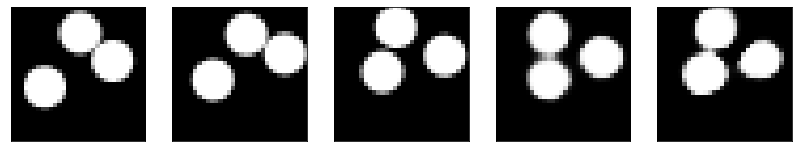

GD iterations:
i=0 | err=55.909760
i=1 | err=54.671024
i=2 | err=52.893494
i=3 | err=50.895744
i=4 | err=48.812454
i=5 | err=46.502556
i=6 | err=44.234703
i=7 | err=41.778374
i=8 | err=39.271145
i=9 | err=36.846115
i=10 | err=34.383572
i=11 | err=31.821896
i=12 | err=29.277821
i=13 | err=26.914078
i=14 | err=24.595518
i=15 | err=22.388395
i=16 | err=20.326361
i=17 | err=18.465172
i=18 | err=16.710501
i=19 | err=15.074853
i=20 | err=13.599878
i=21 | err=12.295544
i=22 | err=11.112211
i=23 | err=10.025979
i=24 | err=9.038988
i=25 | err=8.137703
i=26 | err=7.295687
i=27 | err=6.490880
i=28 | err=5.739078
i=29 | err=5.030925
Epoch=270 (22%) | out_positive=0.890338 | out_negative=0.143497 | mse=0.067298


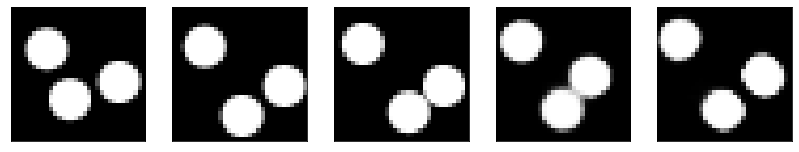

GD iterations:
i=0 | err=53.452148
i=1 | err=52.153217
i=2 | err=50.399616
i=3 | err=48.491150
i=4 | err=46.543316
i=5 | err=44.553345
i=6 | err=42.511482
i=7 | err=40.454826
i=8 | err=38.324188
i=9 | err=36.219753
i=10 | err=34.089943
i=11 | err=31.991358
i=12 | err=29.868820
i=13 | err=27.779644
i=14 | err=25.745768
i=15 | err=23.831581
i=16 | err=21.983692
i=17 | err=20.285904
i=18 | err=18.690813
i=19 | err=17.248301
i=20 | err=15.897320
i=21 | err=14.589972
i=22 | err=13.367847
i=23 | err=12.217102
i=24 | err=11.128578
i=25 | err=10.076734
i=26 | err=9.091971
i=27 | err=8.156939
i=28 | err=7.245955
i=29 | err=6.397198
Epoch=270 (24%) | out_positive=0.941873 | out_negative=0.165390 | mse=0.072385


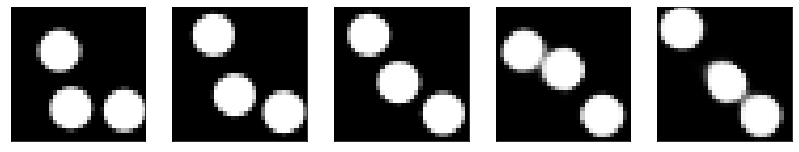

GD iterations:
i=0 | err=55.841972
i=1 | err=54.506550
i=2 | err=52.695667
i=3 | err=50.694427
i=4 | err=48.535614
i=5 | err=46.309334
i=6 | err=44.052128
i=7 | err=41.730965
i=8 | err=39.391251
i=9 | err=37.086098
i=10 | err=34.715733
i=11 | err=32.396004
i=12 | err=30.061693
i=13 | err=27.752670
i=14 | err=25.488611
i=15 | err=23.422340
i=16 | err=21.506298
i=17 | err=19.771030
i=18 | err=18.173674
i=19 | err=16.726936
i=20 | err=15.358557
i=21 | err=14.106508
i=22 | err=12.895809
i=23 | err=11.792561
i=24 | err=10.744717
i=25 | err=9.835175
i=26 | err=8.971403
i=27 | err=8.162060
i=28 | err=7.404045
i=29 | err=6.669996
Epoch=270 (26%) | out_positive=0.912954 | out_negative=0.124265 | mse=0.073254


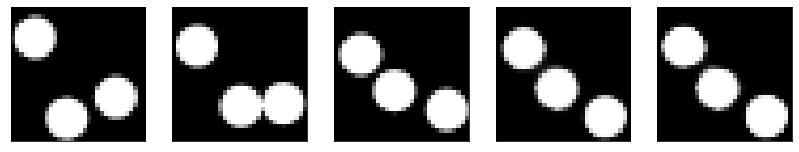

GD iterations:
i=0 | err=55.106056
i=1 | err=53.862938
i=2 | err=52.118279
i=3 | err=50.142391
i=4 | err=48.106365
i=5 | err=45.977909
i=6 | err=43.677826
i=7 | err=41.219429
i=8 | err=38.704933
i=9 | err=36.274353
i=10 | err=33.834610
i=11 | err=31.476933
i=12 | err=29.216831
i=13 | err=27.059443
i=14 | err=25.005688
i=15 | err=23.037479
i=16 | err=21.257456
i=17 | err=19.553596
i=18 | err=18.021935
i=19 | err=16.591438
i=20 | err=15.326836
i=21 | err=14.120136
i=22 | err=12.992657
i=23 | err=11.916453
i=24 | err=10.947293
i=25 | err=10.025190
i=26 | err=9.131241
i=27 | err=8.297192
i=28 | err=7.559886
i=29 | err=6.843694
Epoch=270 (28%) | out_positive=0.854561 | out_negative=0.110640 | mse=0.065467


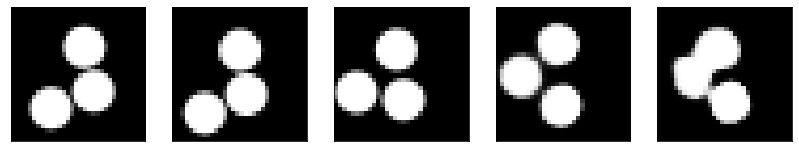

GD iterations:
i=0 | err=56.209545
i=1 | err=54.995300
i=2 | err=53.309940
i=3 | err=51.497803
i=4 | err=49.587524
i=5 | err=47.606846
i=6 | err=45.515556
i=7 | err=43.342216
i=8 | err=41.165321
i=9 | err=38.896214
i=10 | err=36.568779
i=11 | err=34.259750
i=12 | err=31.981503
i=13 | err=29.804321
i=14 | err=27.826492
i=15 | err=25.937443
i=16 | err=24.149773
i=17 | err=22.437611
i=18 | err=20.833406
i=19 | err=19.303070
i=20 | err=17.867607
i=21 | err=16.587566
i=22 | err=15.368009
i=23 | err=14.232428
i=24 | err=13.163708
i=25 | err=12.159210
i=26 | err=11.170508
i=27 | err=10.221117
i=28 | err=9.322016
i=29 | err=8.474194
Epoch=270 (30%) | out_positive=0.854344 | out_negative=0.072981 | mse=0.075827


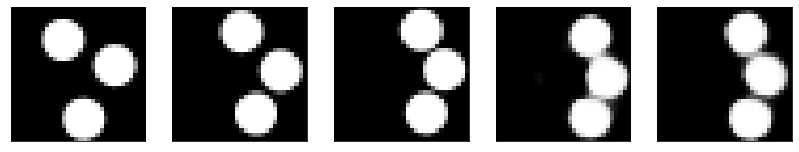

GD iterations:
i=0 | err=53.872952
i=1 | err=52.674057
i=2 | err=51.025230
i=3 | err=49.226219
i=4 | err=47.208900
i=5 | err=45.168339
i=6 | err=42.990570
i=7 | err=40.662621
i=8 | err=38.427353
i=9 | err=36.193985
i=10 | err=33.948444
i=11 | err=31.701508
i=12 | err=29.538511
i=13 | err=27.481489
i=14 | err=25.481543
i=15 | err=23.649019
i=16 | err=21.891716
i=17 | err=20.217834
i=18 | err=18.690203
i=19 | err=17.253054
i=20 | err=15.888991
i=21 | err=14.534801
i=22 | err=13.308736
i=23 | err=12.162088
i=24 | err=11.073776
i=25 | err=10.069023
i=26 | err=9.148042
i=27 | err=8.290028
i=28 | err=7.508090
i=29 | err=6.768698
Epoch=270 (32%) | out_positive=0.895213 | out_negative=0.149523 | mse=0.071444


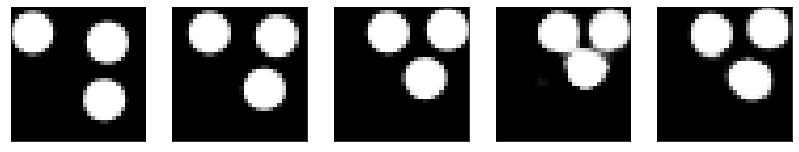

GD iterations:
i=0 | err=53.492699
i=1 | err=52.330502
i=2 | err=50.728241
i=3 | err=48.971710
i=4 | err=46.987648
i=5 | err=44.932144
i=6 | err=42.759857
i=7 | err=40.516731
i=8 | err=38.251163
i=9 | err=35.885445
i=10 | err=33.549747
i=11 | err=31.222576
i=12 | err=28.938915
i=13 | err=26.754566
i=14 | err=24.687199
i=15 | err=22.730206
i=16 | err=20.885576
i=17 | err=19.127161
i=18 | err=17.548622
i=19 | err=16.044230
i=20 | err=14.690470
i=21 | err=13.472746
i=22 | err=12.411888
i=23 | err=11.406191
i=24 | err=10.490366
i=25 | err=9.580491
i=26 | err=8.704859
i=27 | err=7.850435
i=28 | err=7.038477
i=29 | err=6.278121
Epoch=270 (33%) | out_positive=0.897621 | out_negative=0.154945 | mse=0.068886


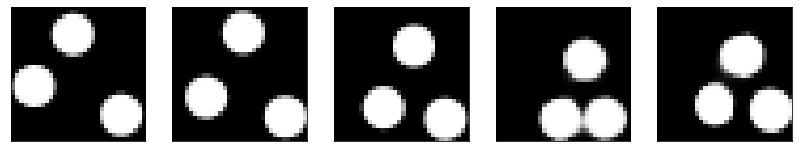

GD iterations:
i=0 | err=56.398872
i=1 | err=55.102585
i=2 | err=53.419537
i=3 | err=51.470551
i=4 | err=49.351200
i=5 | err=47.226746
i=6 | err=45.025185
i=7 | err=42.744583
i=8 | err=40.429810
i=9 | err=38.066250
i=10 | err=35.724701
i=11 | err=33.426945
i=12 | err=31.210577
i=13 | err=29.089949
i=14 | err=27.058609
i=15 | err=25.095211
i=16 | err=23.217968
i=17 | err=21.461746
i=18 | err=19.825859
i=19 | err=18.286360
i=20 | err=16.813530
i=21 | err=15.443371
i=22 | err=14.146875
i=23 | err=12.946527
i=24 | err=11.820230
i=25 | err=10.756750
i=26 | err=9.760013
i=27 | err=8.835428
i=28 | err=7.981770
i=29 | err=7.186918
Epoch=270 (35%) | out_positive=0.835461 | out_negative=0.102145 | mse=0.070215


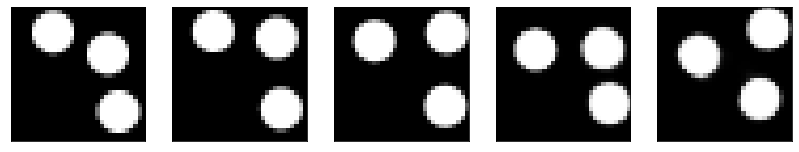

GD iterations:
i=0 | err=59.082832
i=1 | err=57.755741
i=2 | err=55.964470
i=3 | err=54.003540
i=4 | err=51.831345
i=5 | err=49.509514
i=6 | err=47.133228
i=7 | err=44.667358
i=8 | err=42.107700
i=9 | err=39.561310
i=10 | err=36.955956
i=11 | err=34.293629
i=12 | err=31.617956
i=13 | err=28.937340
i=14 | err=26.436916
i=15 | err=24.047440
i=16 | err=21.868834
i=17 | err=19.901384
i=18 | err=18.092211
i=19 | err=16.436638
i=20 | err=14.931981
i=21 | err=13.596189
i=22 | err=12.416279
i=23 | err=11.329939
i=24 | err=10.292104
i=25 | err=9.321917
i=26 | err=8.433187
i=27 | err=7.574156
i=28 | err=6.788167
i=29 | err=6.038567
Epoch=270 (37%) | out_positive=0.891979 | out_negative=0.144280 | mse=0.071961


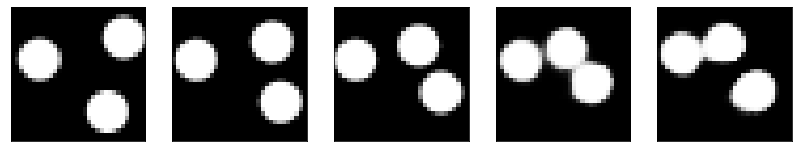

GD iterations:
i=0 | err=55.184776
i=1 | err=53.832054
i=2 | err=52.115059
i=3 | err=50.249107
i=4 | err=48.289711
i=5 | err=46.278458
i=6 | err=44.137833
i=7 | err=41.801598
i=8 | err=39.441425
i=9 | err=37.137131
i=10 | err=34.811974
i=11 | err=32.539635
i=12 | err=30.355843
i=13 | err=28.183744
i=14 | err=26.045164
i=15 | err=24.034693
i=16 | err=22.220686
i=17 | err=20.511751
i=18 | err=18.839775
i=19 | err=17.363277
i=20 | err=15.979019
i=21 | err=14.771233
i=22 | err=13.640052
i=23 | err=12.578993
i=24 | err=11.630199
i=25 | err=10.725760
i=26 | err=9.889932
i=27 | err=9.096401
i=28 | err=8.303305
i=29 | err=7.527606
Epoch=270 (39%) | out_positive=0.873459 | out_negative=0.088635 | mse=0.070194


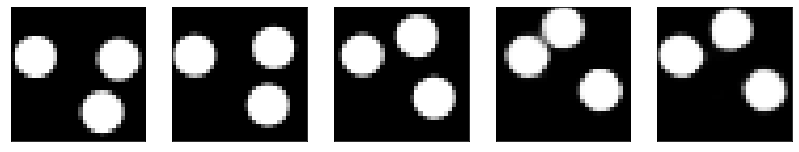

GD iterations:
i=0 | err=51.363274
i=1 | err=50.099869
i=2 | err=48.349884
i=3 | err=46.405888
i=4 | err=44.381126
i=5 | err=42.301750
i=6 | err=40.214649
i=7 | err=38.117027
i=8 | err=36.026283
i=9 | err=33.888344
i=10 | err=31.816551
i=11 | err=29.784538
i=12 | err=27.823792
i=13 | err=25.939386
i=14 | err=24.108822
i=15 | err=22.328270
i=16 | err=20.632690
i=17 | err=19.033880
i=18 | err=17.555771
i=19 | err=16.183037
i=20 | err=14.906950
i=21 | err=13.743948
i=22 | err=12.619442
i=23 | err=11.599438
i=24 | err=10.616341
i=25 | err=9.707322
i=26 | err=8.831532
i=27 | err=7.994537
i=28 | err=7.195604
i=29 | err=6.427381
Epoch=270 (41%) | out_positive=0.931267 | out_negative=0.182428 | mse=0.075558


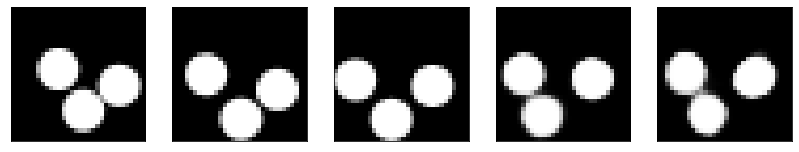

GD iterations:
i=0 | err=54.826630
i=1 | err=53.663185
i=2 | err=52.036003
i=3 | err=50.100967
i=4 | err=48.029480
i=5 | err=45.872952
i=6 | err=43.680428
i=7 | err=41.515392
i=8 | err=39.316513
i=9 | err=36.914326
i=10 | err=34.532730
i=11 | err=32.183784
i=12 | err=29.911671
i=13 | err=27.720604
i=14 | err=25.665972
i=15 | err=23.660122
i=16 | err=21.745529
i=17 | err=19.973051
i=18 | err=18.371347
i=19 | err=16.880215
i=20 | err=15.484212
i=21 | err=14.207516
i=22 | err=13.007795
i=23 | err=11.910688
i=24 | err=10.885184
i=25 | err=9.966912
i=26 | err=9.098114
i=27 | err=8.262787
i=28 | err=7.437659
i=29 | err=6.671392
Epoch=270 (43%) | out_positive=0.913249 | out_negative=0.121825 | mse=0.072863


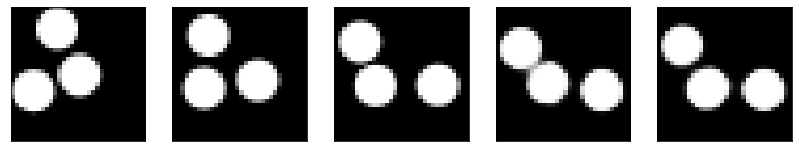

GD iterations:
i=0 | err=57.657017
i=1 | err=56.435493
i=2 | err=54.729042
i=3 | err=52.808578
i=4 | err=50.787422
i=5 | err=48.721737
i=6 | err=46.525486
i=7 | err=44.317646
i=8 | err=42.104919
i=9 | err=39.858990
i=10 | err=37.560402
i=11 | err=35.259968
i=12 | err=32.926666
i=13 | err=30.656586
i=14 | err=28.426197
i=15 | err=26.296425
i=16 | err=24.295475
i=17 | err=22.420921
i=18 | err=20.652538
i=19 | err=18.981203
i=20 | err=17.397684
i=21 | err=15.905186
i=22 | err=14.616359
i=23 | err=13.436649
i=24 | err=12.323846
i=25 | err=11.265512
i=26 | err=10.300669
i=27 | err=9.396383
i=28 | err=8.525237
i=29 | err=7.698023
Epoch=270 (44%) | out_positive=0.810631 | out_negative=0.125493 | mse=0.075315


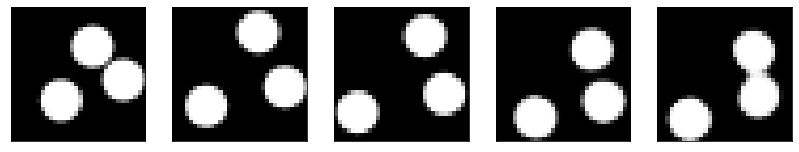

GD iterations:
i=0 | err=54.902641
i=1 | err=53.706169
i=2 | err=52.084343
i=3 | err=50.197266
i=4 | err=48.156067
i=5 | err=46.007095
i=6 | err=43.792458
i=7 | err=41.471966
i=8 | err=39.141319
i=9 | err=36.884640
i=10 | err=34.747337
i=11 | err=32.526066
i=12 | err=30.373232
i=13 | err=28.258572
i=14 | err=26.315773
i=15 | err=24.509216
i=16 | err=22.821693
i=17 | err=21.208691
i=18 | err=19.705587
i=19 | err=18.285496
i=20 | err=16.961117
i=21 | err=15.740402
i=22 | err=14.546885
i=23 | err=13.413235
i=24 | err=12.397361
i=25 | err=11.449522
i=26 | err=10.577137
i=27 | err=9.789261
i=28 | err=9.060649
i=29 | err=8.365784
Epoch=270 (46%) | out_positive=0.933528 | out_negative=0.116457 | mse=0.076470


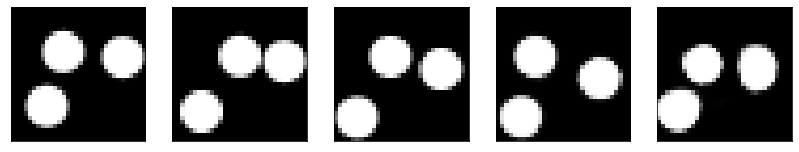

GD iterations:
i=0 | err=57.273975
i=1 | err=56.004776
i=2 | err=54.317921
i=3 | err=52.459618
i=4 | err=50.490410
i=5 | err=48.388836
i=6 | err=46.188576
i=7 | err=43.918289
i=8 | err=41.584991
i=9 | err=39.158432
i=10 | err=36.721771
i=11 | err=34.273232
i=12 | err=31.860952
i=13 | err=29.584772
i=14 | err=27.363972
i=15 | err=25.323093
i=16 | err=23.375418
i=17 | err=21.600950
i=18 | err=19.886822
i=19 | err=18.291084
i=20 | err=16.789356
i=21 | err=15.348814
i=22 | err=14.036373
i=23 | err=12.834800
i=24 | err=11.709843
i=25 | err=10.655845
i=26 | err=9.690584
i=27 | err=8.787900
i=28 | err=7.959705
i=29 | err=7.170231
Epoch=270 (48%) | out_positive=0.865008 | out_negative=0.128979 | mse=0.074803


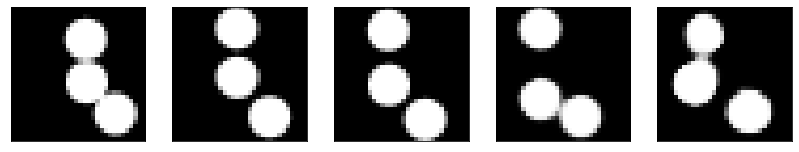

GD iterations:
i=0 | err=52.574581
i=1 | err=51.299454
i=2 | err=49.489212
i=3 | err=47.387108
i=4 | err=45.142021
i=5 | err=42.857304
i=6 | err=40.565418
i=7 | err=38.225677
i=8 | err=35.845119
i=9 | err=33.509068
i=10 | err=31.309170
i=11 | err=29.220078
i=12 | err=27.198259
i=13 | err=25.258335
i=14 | err=23.379305
i=15 | err=21.645655
i=16 | err=19.989834
i=17 | err=18.487034
i=18 | err=17.121391
i=19 | err=15.803268
i=20 | err=14.552694
i=21 | err=13.380838
i=22 | err=12.329054
i=23 | err=11.307968
i=24 | err=10.368109
i=25 | err=9.474218
i=26 | err=8.629897
i=27 | err=7.842794
i=28 | err=7.090071
i=29 | err=6.423289
Epoch=270 (50%) | out_positive=0.842036 | out_negative=0.156052 | mse=0.066137


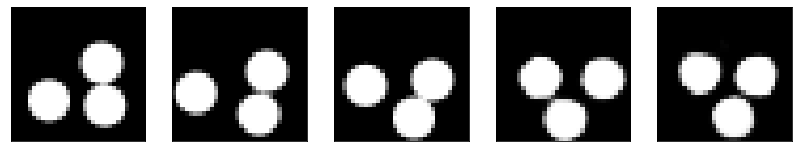

GD iterations:
i=0 | err=49.665611
i=1 | err=48.273575
i=2 | err=46.475212
i=3 | err=44.541676
i=4 | err=42.555168
i=5 | err=40.497120
i=6 | err=38.312698
i=7 | err=36.051491
i=8 | err=33.766579
i=9 | err=31.508862
i=10 | err=29.278023
i=11 | err=27.146557
i=12 | err=25.100258
i=13 | err=23.150757
i=14 | err=21.305321
i=15 | err=19.555313
i=16 | err=17.888828
i=17 | err=16.309969
i=18 | err=14.895350
i=19 | err=13.617661
i=20 | err=12.439688
i=21 | err=11.378227
i=22 | err=10.444143
i=23 | err=9.571255
i=24 | err=8.739060
i=25 | err=7.943095
i=26 | err=7.182260
i=27 | err=6.484451
i=28 | err=5.818351
i=29 | err=5.163240
Epoch=270 (52%) | out_positive=0.967507 | out_negative=0.225801 | mse=0.072952


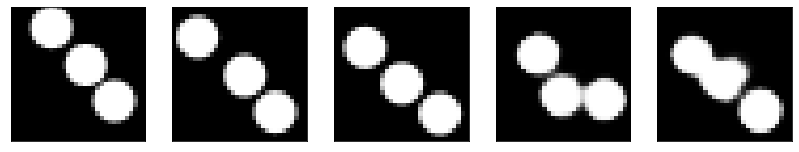

GD iterations:
i=0 | err=53.855221
i=1 | err=52.674881
i=2 | err=51.015060
i=3 | err=49.191040
i=4 | err=47.182861
i=5 | err=45.124722
i=6 | err=43.005775
i=7 | err=40.847965
i=8 | err=38.671066
i=9 | err=36.510010
i=10 | err=34.364960
i=11 | err=32.275040
i=12 | err=30.280727
i=13 | err=28.441555
i=14 | err=26.590273
i=15 | err=24.866741
i=16 | err=23.203154
i=17 | err=21.572296
i=18 | err=20.008448
i=19 | err=18.517380
i=20 | err=17.089222
i=21 | err=15.760637
i=22 | err=14.525795
i=23 | err=13.392069
i=24 | err=12.295919
i=25 | err=11.323947
i=26 | err=10.436907
i=27 | err=9.622904
i=28 | err=8.871153
i=29 | err=8.158792
Epoch=270 (54%) | out_positive=0.841218 | out_negative=0.069498 | mse=0.072603


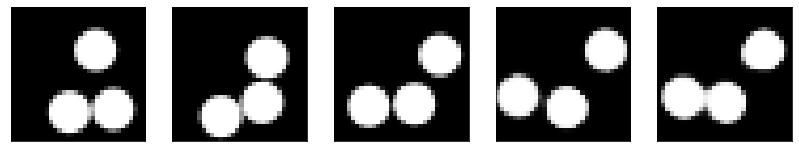

GD iterations:
i=0 | err=58.115829
i=1 | err=56.758842
i=2 | err=54.937096
i=3 | err=52.862946
i=4 | err=50.781555
i=5 | err=48.622986
i=6 | err=46.448586
i=7 | err=44.137970
i=8 | err=41.811676
i=9 | err=39.307945
i=10 | err=36.824028
i=11 | err=34.388447
i=12 | err=31.938885
i=13 | err=29.601521
i=14 | err=27.387932
i=15 | err=25.307232
i=16 | err=23.292326
i=17 | err=21.318766
i=18 | err=19.430376
i=19 | err=17.683054
i=20 | err=16.083065
i=21 | err=14.602390
i=22 | err=13.246132
i=23 | err=11.990283
i=24 | err=10.810961
i=25 | err=9.758151
i=26 | err=8.793453
i=27 | err=7.881601
i=28 | err=7.032156
i=29 | err=6.265724
Epoch=270 (56%) | out_positive=0.859214 | out_negative=0.138550 | mse=0.070589


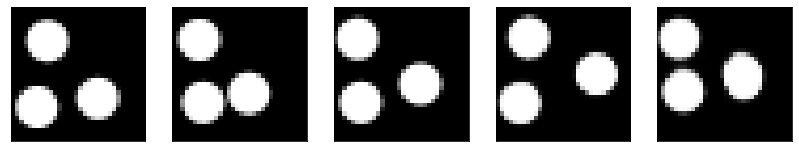

GD iterations:
i=0 | err=54.851757
i=1 | err=53.743534
i=2 | err=52.045017
i=3 | err=50.241318
i=4 | err=48.212906
i=5 | err=46.189133
i=6 | err=44.145054
i=7 | err=41.960213
i=8 | err=39.749565
i=9 | err=37.515751
i=10 | err=35.311485
i=11 | err=33.153572
i=12 | err=31.009449
i=13 | err=28.923435
i=14 | err=26.875805
i=15 | err=24.847588
i=16 | err=22.849091
i=17 | err=20.915554
i=18 | err=19.069172
i=19 | err=17.357899
i=20 | err=15.739853
i=21 | err=14.364055
i=22 | err=13.076984
i=23 | err=11.892288
i=24 | err=10.785900
i=25 | err=9.756796
i=26 | err=8.812172
i=27 | err=7.928887
i=28 | err=7.081278
i=29 | err=6.264493
Epoch=270 (57%) | out_positive=0.881505 | out_negative=0.154112 | mse=0.067056


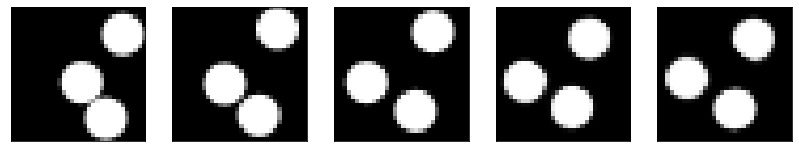

GD iterations:
i=0 | err=55.697792
i=1 | err=54.375256
i=2 | err=52.480289
i=3 | err=50.291977
i=4 | err=47.854237
i=5 | err=45.302570
i=6 | err=42.822018
i=7 | err=40.336334
i=8 | err=37.856396
i=9 | err=35.438171
i=10 | err=33.132973
i=11 | err=30.899620
i=12 | err=28.720692
i=13 | err=26.593145
i=14 | err=24.538691
i=15 | err=22.640192
i=16 | err=20.901867
i=17 | err=19.294584
i=18 | err=17.811127
i=19 | err=16.416880
i=20 | err=15.113646
i=21 | err=13.930593
i=22 | err=12.855646
i=23 | err=11.874173
i=24 | err=10.937405
i=25 | err=10.052498
i=26 | err=9.211628
i=27 | err=8.380675
i=28 | err=7.559728
i=29 | err=6.799448
Epoch=270 (59%) | out_positive=0.863862 | out_negative=0.158187 | mse=0.069157


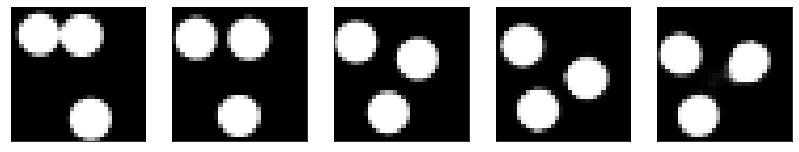

GD iterations:
i=0 | err=51.892132
i=1 | err=50.616566
i=2 | err=48.888035
i=3 | err=46.970985
i=4 | err=44.947613
i=5 | err=42.853958
i=6 | err=40.699432
i=7 | err=38.559200
i=8 | err=36.405262
i=9 | err=34.182537
i=10 | err=31.998386
i=11 | err=29.821068
i=12 | err=27.632887
i=13 | err=25.501167
i=14 | err=23.509462
i=15 | err=21.664169
i=16 | err=19.876339
i=17 | err=18.160381
i=18 | err=16.548580
i=19 | err=14.984076
i=20 | err=13.549959
i=21 | err=12.259209
i=22 | err=11.079983
i=23 | err=10.048484
i=24 | err=9.092461
i=25 | err=8.250157
i=26 | err=7.456545
i=27 | err=6.720844
i=28 | err=6.018486
i=29 | err=5.344376
Epoch=270 (61%) | out_positive=0.920095 | out_negative=0.172861 | mse=0.068380


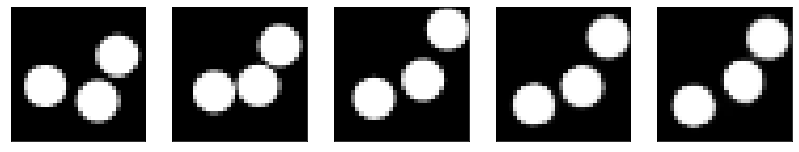

GD iterations:
i=0 | err=51.137138
i=1 | err=50.037567
i=2 | err=48.473381
i=3 | err=46.788124
i=4 | err=45.020187
i=5 | err=43.170837
i=6 | err=41.216228
i=7 | err=39.234962
i=8 | err=37.204830
i=9 | err=35.170174
i=10 | err=33.144722
i=11 | err=31.090542
i=12 | err=29.046059
i=13 | err=26.974529
i=14 | err=25.080929
i=15 | err=23.266197
i=16 | err=21.589085
i=17 | err=20.013283
i=18 | err=18.550848
i=19 | err=17.216303
i=20 | err=15.948116
i=21 | err=14.744344
i=22 | err=13.669720
i=23 | err=12.639484
i=24 | err=11.651397
i=25 | err=10.690959
i=26 | err=9.787911
i=27 | err=8.917421
i=28 | err=8.056662
i=29 | err=7.248439
Epoch=270 (63%) | out_positive=0.889140 | out_negative=0.118734 | mse=0.072599


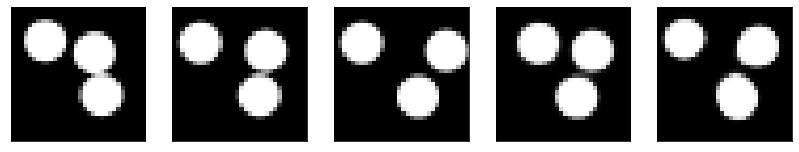

GD iterations:
i=0 | err=53.274166
i=1 | err=51.985954
i=2 | err=50.227097
i=3 | err=48.264034
i=4 | err=46.204357
i=5 | err=44.005569
i=6 | err=41.697269
i=7 | err=39.462318
i=8 | err=37.172489
i=9 | err=34.873924
i=10 | err=32.522663
i=11 | err=30.166941
i=12 | err=27.976097
i=13 | err=25.882883
i=14 | err=23.953667
i=15 | err=22.126904
i=16 | err=20.511974
i=17 | err=18.977192
i=18 | err=17.607418
i=19 | err=16.373695
i=20 | err=15.192792
i=21 | err=14.072083
i=22 | err=13.009390
i=23 | err=12.005894
i=24 | err=11.099824
i=25 | err=10.236212
i=26 | err=9.447742
i=27 | err=8.707218
i=28 | err=8.003702
i=29 | err=7.322589
Epoch=270 (65%) | out_positive=0.851735 | out_negative=0.105059 | mse=0.068532


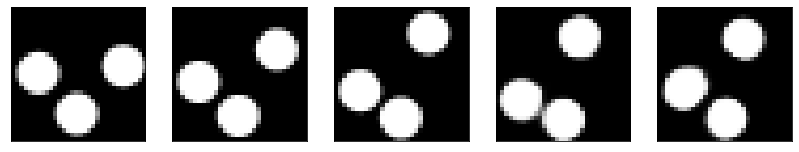

GD iterations:
i=0 | err=54.863571
i=1 | err=53.677689
i=2 | err=52.064137
i=3 | err=50.228424
i=4 | err=48.291573
i=5 | err=46.369873
i=6 | err=44.317661
i=7 | err=42.222008
i=8 | err=40.047226
i=9 | err=37.700325
i=10 | err=35.376690
i=11 | err=33.009705
i=12 | err=30.734623
i=13 | err=28.542538
i=14 | err=26.509289
i=15 | err=24.600025
i=16 | err=22.759258
i=17 | err=20.984776
i=18 | err=19.336708
i=19 | err=17.786869
i=20 | err=16.352432
i=21 | err=14.994022
i=22 | err=13.790981
i=23 | err=12.615711
i=24 | err=11.539495
i=25 | err=10.554501
i=26 | err=9.623302
i=27 | err=8.755214
i=28 | err=7.903337
i=29 | err=7.100985
Epoch=270 (67%) | out_positive=0.908515 | out_negative=0.088903 | mse=0.074330


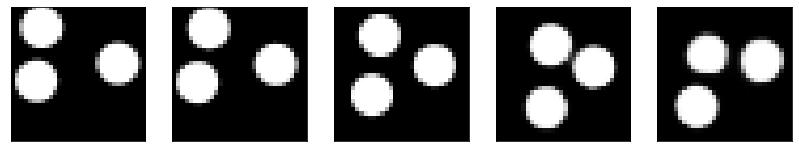

GD iterations:
i=0 | err=59.778778
i=1 | err=58.530884
i=2 | err=56.861008
i=3 | err=54.951649
i=4 | err=52.788334
i=5 | err=50.573898
i=6 | err=48.278877
i=7 | err=45.830227
i=8 | err=43.383995
i=9 | err=40.852737
i=10 | err=38.250793
i=11 | err=35.729538
i=12 | err=33.255795
i=13 | err=30.810123
i=14 | err=28.446476
i=15 | err=26.136280
i=16 | err=24.016762
i=17 | err=22.063705
i=18 | err=20.232462
i=19 | err=18.501020
i=20 | err=16.888939
i=21 | err=15.357162
i=22 | err=13.984325
i=23 | err=12.706823
i=24 | err=11.476217
i=25 | err=10.325613
i=26 | err=9.249125
i=27 | err=8.227417
i=28 | err=7.267605
i=29 | err=6.414237
Epoch=270 (68%) | out_positive=0.864518 | out_negative=0.126188 | mse=0.075283


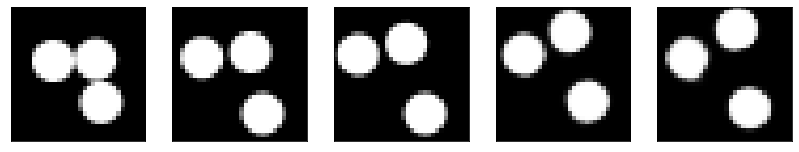

GD iterations:
i=0 | err=60.752953
i=1 | err=59.385376
i=2 | err=57.543491
i=3 | err=55.526783
i=4 | err=53.368088
i=5 | err=51.103237
i=6 | err=48.864250
i=7 | err=46.599770
i=8 | err=44.348061
i=9 | err=42.080498
i=10 | err=39.766277
i=11 | err=37.340660
i=12 | err=34.865425
i=13 | err=32.373055
i=14 | err=29.895615
i=15 | err=27.514484
i=16 | err=25.351692
i=17 | err=23.408741
i=18 | err=21.569199
i=19 | err=19.897434
i=20 | err=18.360941
i=21 | err=16.881001
i=22 | err=15.459735
i=23 | err=14.129772
i=24 | err=12.872723
i=25 | err=11.735888
i=26 | err=10.705507
i=27 | err=9.760214
i=28 | err=8.877192
i=29 | err=8.043424
Epoch=270 (70%) | out_positive=0.809599 | out_negative=0.111255 | mse=0.074254


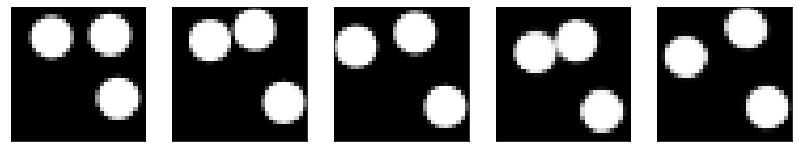

GD iterations:
i=0 | err=54.189583
i=1 | err=53.045845
i=2 | err=51.397095
i=3 | err=49.568840
i=4 | err=47.553131
i=5 | err=45.545471
i=6 | err=43.555576
i=7 | err=41.469784
i=8 | err=39.404270
i=9 | err=37.381950
i=10 | err=35.355988
i=11 | err=33.343750
i=12 | err=31.357883
i=13 | err=29.380531
i=14 | err=27.410858
i=15 | err=25.453014
i=16 | err=23.609003
i=17 | err=21.824875
i=18 | err=20.128794
i=19 | err=18.510174
i=20 | err=16.993561
i=21 | err=15.603322
i=22 | err=14.318621
i=23 | err=13.163501
i=24 | err=12.064146
i=25 | err=11.002735
i=26 | err=9.978905
i=27 | err=8.966616
i=28 | err=8.050497
i=29 | err=7.211296
Epoch=270 (72%) | out_positive=0.910780 | out_negative=0.090727 | mse=0.069752


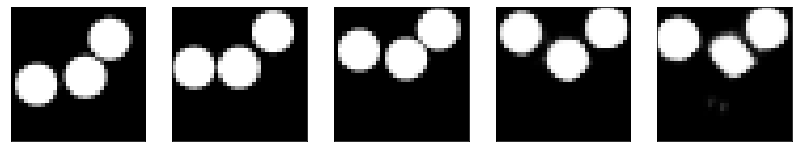

GD iterations:
i=0 | err=51.482788
i=1 | err=50.300053
i=2 | err=48.695763
i=3 | err=46.905617
i=4 | err=44.985802
i=5 | err=42.935776
i=6 | err=40.864029
i=7 | err=38.695343
i=8 | err=36.515926
i=9 | err=34.331844
i=10 | err=32.127312
i=11 | err=29.940208
i=12 | err=27.775162
i=13 | err=25.719326
i=14 | err=23.863127
i=15 | err=22.129229
i=16 | err=20.528709
i=17 | err=19.051319
i=18 | err=17.650658
i=19 | err=16.350048
i=20 | err=15.064812
i=21 | err=13.900017
i=22 | err=12.817711
i=23 | err=11.802454
i=24 | err=10.829899
i=25 | err=9.901622
i=26 | err=9.007149
i=27 | err=8.154737
i=28 | err=7.361322
i=29 | err=6.628650
Epoch=270 (74%) | out_positive=0.838239 | out_negative=0.127956 | mse=0.063409


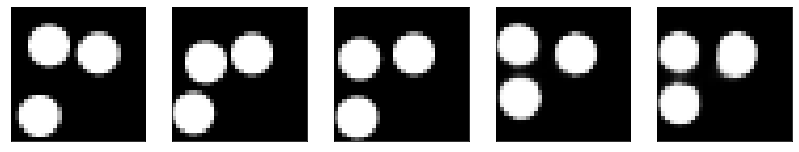

GD iterations:
i=0 | err=56.084236
i=1 | err=54.748154
i=2 | err=52.953110
i=3 | err=51.002213
i=4 | err=48.927208
i=5 | err=46.961029
i=6 | err=44.843811
i=7 | err=42.722923
i=8 | err=40.681633
i=9 | err=38.636940
i=10 | err=36.571281
i=11 | err=34.494164
i=12 | err=32.308762
i=13 | err=30.125359
i=14 | err=27.997280
i=15 | err=25.867737
i=16 | err=23.802814
i=17 | err=21.845161
i=18 | err=19.966309
i=19 | err=18.261963
i=20 | err=16.629074
i=21 | err=15.194920
i=22 | err=13.917141
i=23 | err=12.771055
i=24 | err=11.697321
i=25 | err=10.727655
i=26 | err=9.816857
i=27 | err=8.969245
i=28 | err=8.148335
i=29 | err=7.366531
Epoch=270 (76%) | out_positive=0.829140 | out_negative=0.100655 | mse=0.072202


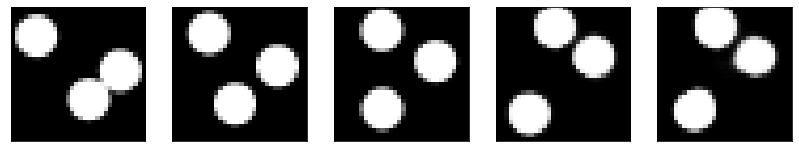

GD iterations:
i=0 | err=58.375900
i=1 | err=57.132057
i=2 | err=55.213009
i=3 | err=53.104168
i=4 | err=50.923870
i=5 | err=48.632687
i=6 | err=46.263618
i=7 | err=43.751984
i=8 | err=41.214233
i=9 | err=38.597713
i=10 | err=36.145599
i=11 | err=33.714996
i=12 | err=31.408348
i=13 | err=29.133419
i=14 | err=26.962290
i=15 | err=24.874397
i=16 | err=22.961193
i=17 | err=21.216427
i=18 | err=19.572800
i=19 | err=17.989010
i=20 | err=16.498802
i=21 | err=15.108200
i=22 | err=13.838253
i=23 | err=12.659411
i=24 | err=11.542768
i=25 | err=10.510925
i=26 | err=9.517157
i=27 | err=8.549112
i=28 | err=7.629046
i=29 | err=6.770862
Epoch=270 (78%) | out_positive=0.869709 | out_negative=0.158549 | mse=0.069916


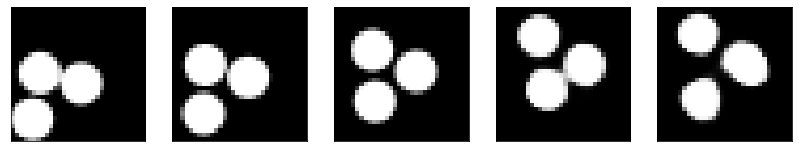

GD iterations:
i=0 | err=56.346725
i=1 | err=55.041340
i=2 | err=53.221294
i=3 | err=51.142517
i=4 | err=48.908249
i=5 | err=46.649010
i=6 | err=44.263977
i=7 | err=41.789482
i=8 | err=39.276978
i=9 | err=36.838078
i=10 | err=34.345913
i=11 | err=31.907688
i=12 | err=29.503357
i=13 | err=27.220100
i=14 | err=25.056446
i=15 | err=22.981812
i=16 | err=21.087358
i=17 | err=19.349274
i=18 | err=17.748339
i=19 | err=16.295954
i=20 | err=14.991496
i=21 | err=13.769030
i=22 | err=12.626753
i=23 | err=11.515658
i=24 | err=10.503880
i=25 | err=9.495686
i=26 | err=8.591892
i=27 | err=7.746464
i=28 | err=6.936007
i=29 | err=6.151434
Epoch=270 (79%) | out_positive=0.853095 | out_negative=0.124582 | mse=0.064210


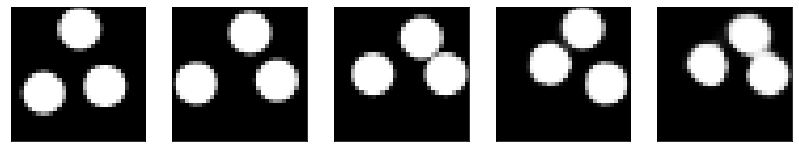

GD iterations:
i=0 | err=53.836205
i=1 | err=52.725254
i=2 | err=51.171997
i=3 | err=49.459900
i=4 | err=47.624001
i=5 | err=45.671581
i=6 | err=43.630653
i=7 | err=41.367378
i=8 | err=39.038540
i=9 | err=36.676769
i=10 | err=34.388382
i=11 | err=32.105637
i=12 | err=29.882885
i=13 | err=27.832256
i=14 | err=25.810852
i=15 | err=23.875683
i=16 | err=22.025972
i=17 | err=20.327579
i=18 | err=18.719967
i=19 | err=17.267746
i=20 | err=15.918072
i=21 | err=14.722725
i=22 | err=13.560341
i=23 | err=12.453403
i=24 | err=11.351811
i=25 | err=10.315723
i=26 | err=9.397199
i=27 | err=8.493414
i=28 | err=7.626089
i=29 | err=6.803321
Epoch=270 (80%) | out_positive=0.903712 | out_negative=0.170352 | mse=0.070255


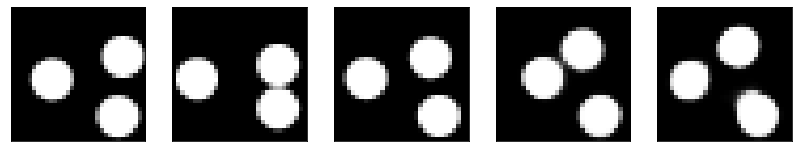

GD iterations:
i=0 | err=53.007233
i=1 | err=51.853432
i=2 | err=50.173412
i=3 | err=48.363499
i=4 | err=46.320755
i=5 | err=44.210979
i=6 | err=42.028717
i=7 | err=39.682766
i=8 | err=37.373852
i=9 | err=34.955421
i=10 | err=32.560059
i=11 | err=30.198473
i=12 | err=27.960922
i=13 | err=25.929741
i=14 | err=23.981552
i=15 | err=22.202698
i=16 | err=20.558743
i=17 | err=19.031446
i=18 | err=17.592304
i=19 | err=16.172899
i=20 | err=14.884932
i=21 | err=13.685266
i=22 | err=12.565220
i=23 | err=11.519304
i=24 | err=10.487444
i=25 | err=9.567819
i=26 | err=8.709421
i=27 | err=7.923673
i=28 | err=7.206351
i=29 | err=6.515150
Epoch=270 (82%) | out_positive=0.868599 | out_negative=0.126460 | mse=0.069147


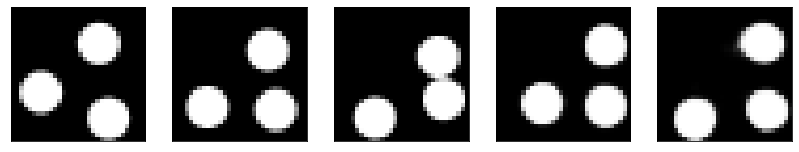

GD iterations:
i=0 | err=60.352612
i=1 | err=59.099640
i=2 | err=57.412247
i=3 | err=55.587982
i=4 | err=53.571449
i=5 | err=51.402611
i=6 | err=49.065063
i=7 | err=46.655876
i=8 | err=44.174519
i=9 | err=41.712822
i=10 | err=39.171085
i=11 | err=36.600719
i=12 | err=34.108948
i=13 | err=31.782583
i=14 | err=29.455334
i=15 | err=27.190712
i=16 | err=25.062923
i=17 | err=23.039791
i=18 | err=21.105869
i=19 | err=19.362217
i=20 | err=17.801765
i=21 | err=16.395599
i=22 | err=15.091732
i=23 | err=13.874636
i=24 | err=12.731182
i=25 | err=11.603811
i=26 | err=10.536428
i=27 | err=9.547288
i=28 | err=8.618725
i=29 | err=7.759856
Epoch=270 (83%) | out_positive=0.823840 | out_negative=0.082567 | mse=0.070790


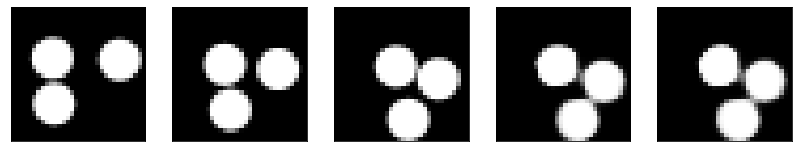

GD iterations:
i=0 | err=52.411194
i=1 | err=51.116043
i=2 | err=49.414032
i=3 | err=47.560841
i=4 | err=45.627285
i=5 | err=43.571869
i=6 | err=41.468475
i=7 | err=39.225155
i=8 | err=36.993362
i=9 | err=34.782696
i=10 | err=32.683319
i=11 | err=30.708084
i=12 | err=28.828259
i=13 | err=27.026297
i=14 | err=25.265089
i=15 | err=23.599300
i=16 | err=21.981148
i=17 | err=20.483118
i=18 | err=19.060356
i=19 | err=17.741581
i=20 | err=16.495152
i=21 | err=15.268345
i=22 | err=14.071817
i=23 | err=12.960669
i=24 | err=11.918195
i=25 | err=10.893347
i=26 | err=9.936756
i=27 | err=9.060710
i=28 | err=8.246294
i=29 | err=7.490840
Epoch=270 (85%) | out_positive=0.904190 | out_negative=0.083828 | mse=0.076393


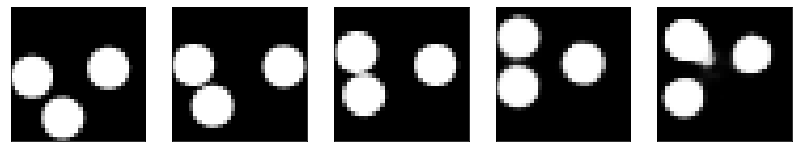

GD iterations:
i=0 | err=55.649002
i=1 | err=54.265053
i=2 | err=52.365540
i=3 | err=50.245750
i=4 | err=48.084023
i=5 | err=45.809269
i=6 | err=43.606590
i=7 | err=41.424377
i=8 | err=39.202209
i=9 | err=36.943989
i=10 | err=34.690548
i=11 | err=32.566372
i=12 | err=30.507881
i=13 | err=28.569250
i=14 | err=26.695545
i=15 | err=24.858723
i=16 | err=23.119595
i=17 | err=21.471966
i=18 | err=19.843872
i=19 | err=18.301531
i=20 | err=16.818407
i=21 | err=15.419841
i=22 | err=14.124302
i=23 | err=12.903959
i=24 | err=11.714294
i=25 | err=10.643397
i=26 | err=9.621657
i=27 | err=8.657028
i=28 | err=7.770497
i=29 | err=6.925581
Epoch=270 (87%) | out_positive=0.887551 | out_negative=0.144591 | mse=0.072373


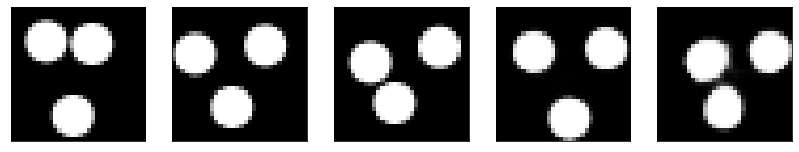

GD iterations:
i=0 | err=53.019409
i=1 | err=51.699478
i=2 | err=49.928307
i=3 | err=47.883247
i=4 | err=45.652748
i=5 | err=43.368210
i=6 | err=41.018021
i=7 | err=38.721161
i=8 | err=36.465591
i=9 | err=34.178207
i=10 | err=31.961699
i=11 | err=29.878027
i=12 | err=27.848486
i=13 | err=25.826790
i=14 | err=23.900387
i=15 | err=22.006031
i=16 | err=20.291805
i=17 | err=18.661345
i=18 | err=17.220486
i=19 | err=15.824963
i=20 | err=14.550829
i=21 | err=13.289462
i=22 | err=12.121243
i=23 | err=11.038513
i=24 | err=10.076808
i=25 | err=9.164775
i=26 | err=8.313108
i=27 | err=7.504998
i=28 | err=6.731212
i=29 | err=5.994851
Epoch=270 (89%) | out_positive=0.882317 | out_negative=0.137544 | mse=0.066930


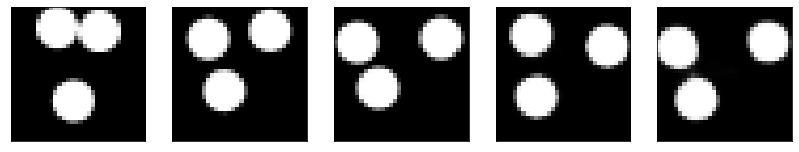

GD iterations:
i=0 | err=56.102856
i=1 | err=54.771393
i=2 | err=53.035690
i=3 | err=51.104553
i=4 | err=49.054054
i=5 | err=46.892826
i=6 | err=44.720268
i=7 | err=42.371815
i=8 | err=39.909382
i=9 | err=37.390045
i=10 | err=34.895432
i=11 | err=32.405670
i=12 | err=29.999454
i=13 | err=27.674227
i=14 | err=25.493324
i=15 | err=23.397953
i=16 | err=21.419571
i=17 | err=19.621134
i=18 | err=17.975609
i=19 | err=16.489250
i=20 | err=15.149696
i=21 | err=13.945160
i=22 | err=12.822315
i=23 | err=11.778873
i=24 | err=10.812348
i=25 | err=9.866058
i=26 | err=8.971010
i=27 | err=8.150621
i=28 | err=7.362869
i=29 | err=6.593597
Epoch=270 (91%) | out_positive=0.869123 | out_negative=0.126943 | mse=0.072079


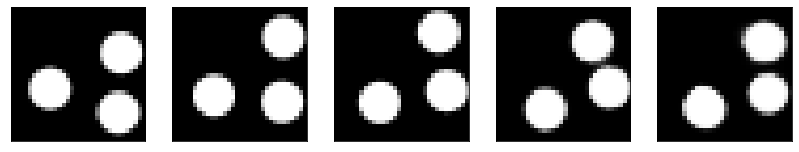

GD iterations:
i=0 | err=57.508705
i=1 | err=56.298882
i=2 | err=54.639877
i=3 | err=52.696575
i=4 | err=50.631615
i=5 | err=48.488148
i=6 | err=46.224014
i=7 | err=43.830879
i=8 | err=41.415627
i=9 | err=38.949562
i=10 | err=36.467083
i=11 | err=34.022141
i=12 | err=31.658464
i=13 | err=29.483353
i=14 | err=27.429733
i=15 | err=25.451075
i=16 | err=23.635796
i=17 | err=21.985134
i=18 | err=20.416138
i=19 | err=18.898403
i=20 | err=17.478443
i=21 | err=16.172668
i=22 | err=14.954897
i=23 | err=13.788550
i=24 | err=12.695065
i=25 | err=11.631625
i=26 | err=10.561800
i=27 | err=9.534820
i=28 | err=8.527049
i=29 | err=7.598457
Epoch=270 (92%) | out_positive=0.861400 | out_negative=0.112303 | mse=0.074054


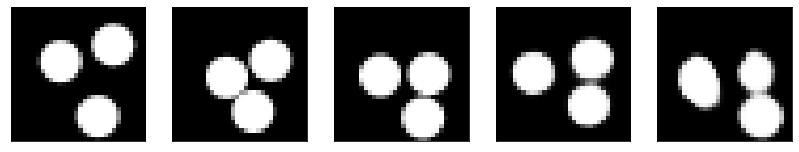

GD iterations:
i=0 | err=54.116302
i=1 | err=52.879379
i=2 | err=51.223671
i=3 | err=49.352982
i=4 | err=47.405212
i=5 | err=45.358139
i=6 | err=43.207264
i=7 | err=41.018642
i=8 | err=38.792034
i=9 | err=36.576790
i=10 | err=34.385281
i=11 | err=32.249260
i=12 | err=30.143591
i=13 | err=28.137255
i=14 | err=26.156471
i=15 | err=24.321712
i=16 | err=22.660995
i=17 | err=21.087156
i=18 | err=19.636806
i=19 | err=18.277802
i=20 | err=16.972034
i=21 | err=15.749420
i=22 | err=14.611234
i=23 | err=13.512121
i=24 | err=12.482204
i=25 | err=11.464355
i=26 | err=10.545977
i=27 | err=9.654615
i=28 | err=8.802505
i=29 | err=7.994129
Epoch=270 (94%) | out_positive=0.864800 | out_negative=0.139188 | mse=0.072691


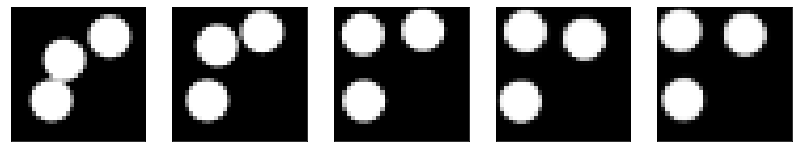

GD iterations:
i=0 | err=55.312614
i=1 | err=53.968079
i=2 | err=52.210224
i=3 | err=50.311974
i=4 | err=48.336773
i=5 | err=46.203831
i=6 | err=44.068115
i=7 | err=41.850742
i=8 | err=39.722008
i=9 | err=37.518944
i=10 | err=35.371387
i=11 | err=33.227448
i=12 | err=31.082685
i=13 | err=29.033081
i=14 | err=27.083824
i=15 | err=25.198578
i=16 | err=23.384911
i=17 | err=21.622322
i=18 | err=19.949627
i=19 | err=18.353378
i=20 | err=16.870934
i=21 | err=15.468119
i=22 | err=14.170197
i=23 | err=12.952956
i=24 | err=11.874662
i=25 | err=10.833652
i=26 | err=9.846176
i=27 | err=8.929249
i=28 | err=8.055888
i=29 | err=7.255875
Epoch=270 (96%) | out_positive=0.832425 | out_negative=0.139907 | mse=0.076580


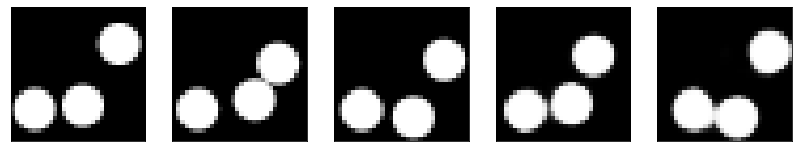

GD iterations:
i=0 | err=55.894794
i=1 | err=54.709991
i=2 | err=52.931221
i=3 | err=50.977394
i=4 | err=48.922329
i=5 | err=46.750595
i=6 | err=44.537983
i=7 | err=42.389423
i=8 | err=40.224037
i=9 | err=38.081993
i=10 | err=35.875477
i=11 | err=33.669472
i=12 | err=31.465034
i=13 | err=29.325077
i=14 | err=27.290592
i=15 | err=25.376743
i=16 | err=23.457462
i=17 | err=21.618526
i=18 | err=19.959179
i=19 | err=18.405415
i=20 | err=17.005577
i=21 | err=15.709244
i=22 | err=14.484793
i=23 | err=13.317409
i=24 | err=12.226383
i=25 | err=11.206644
i=26 | err=10.169609
i=27 | err=9.187296
i=28 | err=8.255354
i=29 | err=7.402547
Epoch=270 (98%) | out_positive=0.878113 | out_negative=0.125349 | mse=0.073392


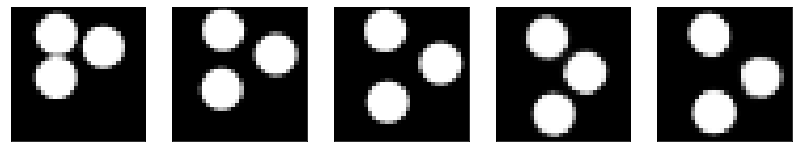

GD iterations:
i=0 | err=65.525383
i=1 | err=63.616024
i=2 | err=61.284969
i=3 | err=58.416325
i=4 | err=55.440842
i=5 | err=52.586334
i=6 | err=49.802452
i=7 | err=46.833260
i=8 | err=44.077835
i=9 | err=40.895409
i=10 | err=37.654499
i=11 | err=34.724689
i=12 | err=32.179665
i=13 | err=29.654829
i=14 | err=27.067762
i=15 | err=24.424086
i=16 | err=22.020039
i=17 | err=19.704063
i=18 | err=17.722759
i=19 | err=15.831856
i=20 | err=14.093394
i=21 | err=12.733786
i=22 | err=11.382788
i=23 | err=10.319757
i=24 | err=9.381582
i=25 | err=8.437392
i=26 | err=7.501059
i=27 | err=6.572762
i=28 | err=5.695073
i=29 | err=4.985282
Epoch=270 (100%) | out_positive=0.831907 | out_negative=0.200028 | mse=0.064404


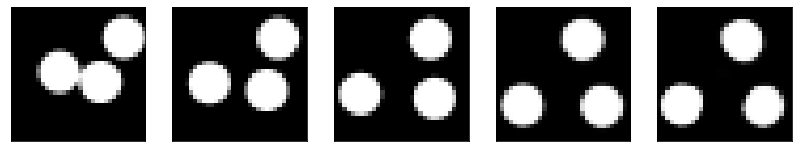

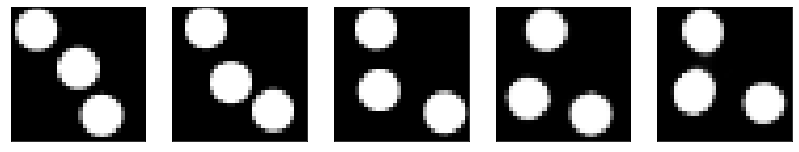

Test MSE 0.078274


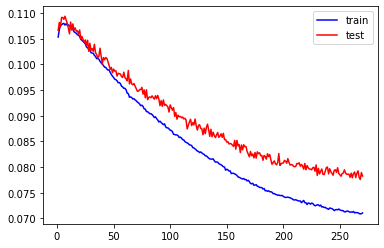

Model Saved.
GD iterations:
i=0 | err=52.003922
i=1 | err=50.694618
i=2 | err=48.896721
i=3 | err=46.884956
i=4 | err=44.783928
i=5 | err=42.672356
i=6 | err=40.472969
i=7 | err=38.219856
i=8 | err=35.929390
i=9 | err=33.669571
i=10 | err=31.374065
i=11 | err=29.222960
i=12 | err=27.111084
i=13 | err=25.062519
i=14 | err=23.035074
i=15 | err=21.102036
i=16 | err=19.329893
i=17 | err=17.667332
i=18 | err=16.118427
i=19 | err=14.712500
i=20 | err=13.411877
i=21 | err=12.213840
i=22 | err=11.082082
i=23 | err=10.053577
i=24 | err=9.091702
i=25 | err=8.216826
i=26 | err=7.431651
i=27 | err=6.688803
i=28 | err=5.964762
i=29 | err=5.302739
Epoch=271 (0%) | out_positive=0.919345 | out_negative=0.176135 | mse=0.067893


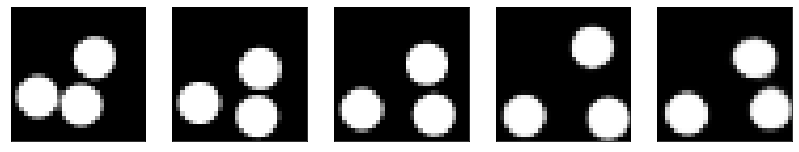

GD iterations:
i=0 | err=51.137482
i=1 | err=49.934402
i=2 | err=48.248390
i=3 | err=46.426567
i=4 | err=44.501663
i=5 | err=42.412792
i=6 | err=40.320332
i=7 | err=38.152470
i=8 | err=36.031601
i=9 | err=33.873287
i=10 | err=31.620558
i=11 | err=29.387856
i=12 | err=27.278160
i=13 | err=25.278292
i=14 | err=23.374418
i=15 | err=21.602562
i=16 | err=19.907833
i=17 | err=18.332283
i=18 | err=16.916370
i=19 | err=15.579529
i=20 | err=14.275910
i=21 | err=13.055673
i=22 | err=11.901694
i=23 | err=10.854046
i=24 | err=9.860569
i=25 | err=8.941046
i=26 | err=8.071250
i=27 | err=7.271933
i=28 | err=6.534462
i=29 | err=5.841002
Epoch=271 (2%) | out_positive=0.925442 | out_negative=0.169364 | mse=0.070217


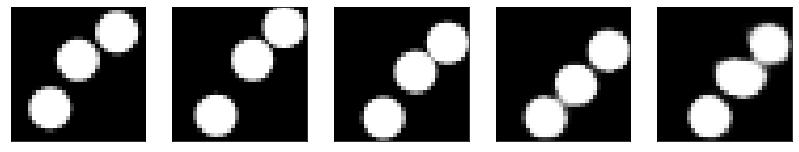

GD iterations:
i=0 | err=53.806133
i=1 | err=52.477772
i=2 | err=50.745834
i=3 | err=48.909397
i=4 | err=47.018555
i=5 | err=45.163410
i=6 | err=43.257847
i=7 | err=41.339523
i=8 | err=39.354389
i=9 | err=37.300728
i=10 | err=35.240643
i=11 | err=33.272720
i=12 | err=31.348116
i=13 | err=29.426149
i=14 | err=27.564339
i=15 | err=25.768446
i=16 | err=24.083057
i=17 | err=22.499668
i=18 | err=21.004112
i=19 | err=19.530195
i=20 | err=18.155073
i=21 | err=16.847582
i=22 | err=15.681467
i=23 | err=14.587345
i=24 | err=13.553696
i=25 | err=12.558102
i=26 | err=11.624628
i=27 | err=10.698123
i=28 | err=9.801334
i=29 | err=8.936390
Epoch=271 (4%) | out_positive=0.854763 | out_negative=0.065010 | mse=0.074315


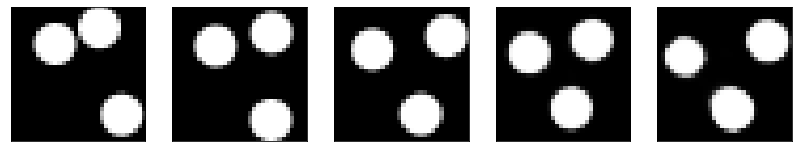

GD iterations:
i=0 | err=56.875881
i=1 | err=55.765778
i=2 | err=54.130325
i=3 | err=52.243992
i=4 | err=50.161167
i=5 | err=47.992504
i=6 | err=45.677284
i=7 | err=43.220978
i=8 | err=40.769806
i=9 | err=38.281349
i=10 | err=35.822182
i=11 | err=33.421516
i=12 | err=31.115999
i=13 | err=28.882595
i=14 | err=26.717670
i=15 | err=24.636480
i=16 | err=22.694283
i=17 | err=20.898146
i=18 | err=19.226835
i=19 | err=17.689007
i=20 | err=16.256727
i=21 | err=14.912678
i=22 | err=13.658615
i=23 | err=12.504648
i=24 | err=11.477839
i=25 | err=10.530436
i=26 | err=9.668851
i=27 | err=8.829844
i=28 | err=8.037426
i=29 | err=7.268258
Epoch=271 (6%) | out_positive=0.889950 | out_negative=0.157925 | mse=0.072513


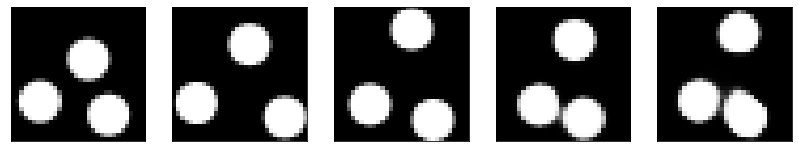

GD iterations:
i=0 | err=50.170944
i=1 | err=49.072021
i=2 | err=47.446125
i=3 | err=45.590195
i=4 | err=43.583549
i=5 | err=41.520351
i=6 | err=39.397629
i=7 | err=37.199326
i=8 | err=34.997314
i=9 | err=32.738636
i=10 | err=30.503931
i=11 | err=28.347153
i=12 | err=26.261150
i=13 | err=24.252949
i=14 | err=22.355337
i=15 | err=20.628561
i=16 | err=19.042301
i=17 | err=17.585936
i=18 | err=16.264256
i=19 | err=14.992630
i=20 | err=13.767684
i=21 | err=12.637211
i=22 | err=11.550328
i=23 | err=10.582661
i=24 | err=9.648700
i=25 | err=8.791261
i=26 | err=7.957863
i=27 | err=7.168644
i=28 | err=6.418757
i=29 | err=5.738510
Epoch=271 (8%) | out_positive=0.906828 | out_negative=0.130981 | mse=0.068162


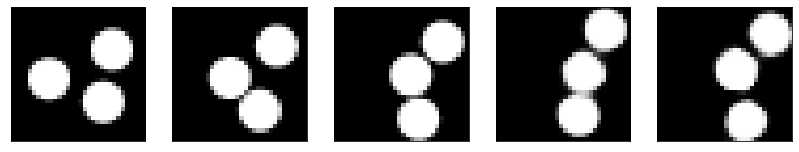

GD iterations:
i=0 | err=54.179741
i=1 | err=52.902420
i=2 | err=51.213844
i=3 | err=49.275909
i=4 | err=47.253017
i=5 | err=45.140202
i=6 | err=42.910202
i=7 | err=40.581436
i=8 | err=38.296219
i=9 | err=36.122864
i=10 | err=33.914055
i=11 | err=31.743406
i=12 | err=29.654486
i=13 | err=27.672703
i=14 | err=25.736458
i=15 | err=23.905846
i=16 | err=22.118017
i=17 | err=20.407488
i=18 | err=18.803408
i=19 | err=17.316778
i=20 | err=15.925634
i=21 | err=14.567781
i=22 | err=13.350634
i=23 | err=12.166828
i=24 | err=11.087523
i=25 | err=10.096115
i=26 | err=9.147921
i=27 | err=8.259631
i=28 | err=7.427262
i=29 | err=6.672200
Epoch=271 (9%) | out_positive=0.887103 | out_negative=0.105812 | mse=0.068484


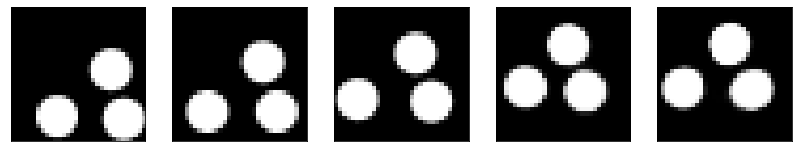

GD iterations:
i=0 | err=55.146992
i=1 | err=53.814072
i=2 | err=52.012108
i=3 | err=50.024696
i=4 | err=47.941193
i=5 | err=45.784142
i=6 | err=43.621071
i=7 | err=41.383770
i=8 | err=39.073761
i=9 | err=36.818886
i=10 | err=34.585281
i=11 | err=32.471249
i=12 | err=30.369907
i=13 | err=28.323280
i=14 | err=26.398668
i=15 | err=24.591640
i=16 | err=22.861300
i=17 | err=21.260395
i=18 | err=19.681002
i=19 | err=18.184895
i=20 | err=16.744726
i=21 | err=15.386475
i=22 | err=14.064323
i=23 | err=12.810930
i=24 | err=11.646342
i=25 | err=10.560117
i=26 | err=9.525196
i=27 | err=8.566070
i=28 | err=7.676945
i=29 | err=6.810873
Epoch=271 (11%) | out_positive=0.890000 | out_negative=0.128952 | mse=0.069940


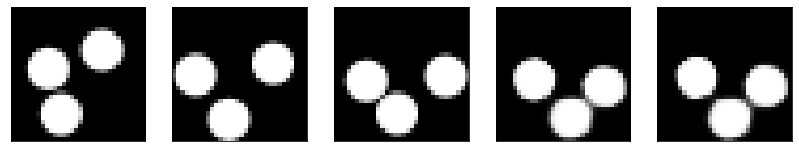

GD iterations:
i=0 | err=58.658634
i=1 | err=57.336910
i=2 | err=55.575264
i=3 | err=53.676376
i=4 | err=51.684952
i=5 | err=49.580845
i=6 | err=47.399792
i=7 | err=45.126770
i=8 | err=42.819832
i=9 | err=40.406914
i=10 | err=37.935135
i=11 | err=35.495094
i=12 | err=33.103870
i=13 | err=30.808632
i=14 | err=28.543051
i=15 | err=26.418934
i=16 | err=24.450371
i=17 | err=22.607979
i=18 | err=20.828066
i=19 | err=19.169912
i=20 | err=17.625118
i=21 | err=16.165846
i=22 | err=14.747743
i=23 | err=13.435434
i=24 | err=12.232471
i=25 | err=11.137732
i=26 | err=10.122424
i=27 | err=9.181660
i=28 | err=8.306996
i=29 | err=7.465955
Epoch=271 (13%) | out_positive=0.907356 | out_negative=0.113311 | mse=0.073825


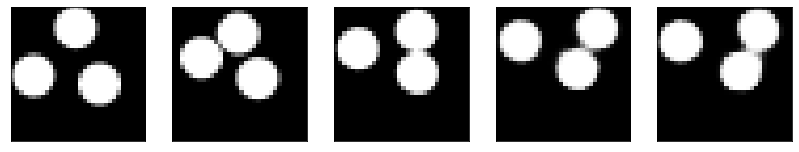

GD iterations:
i=0 | err=57.848770
i=1 | err=56.547863
i=2 | err=54.725052
i=3 | err=52.609512
i=4 | err=50.345776
i=5 | err=48.009113
i=6 | err=45.528732
i=7 | err=43.114151
i=8 | err=40.565063
i=9 | err=38.053246
i=10 | err=35.384689
i=11 | err=32.691765
i=12 | err=30.035999
i=13 | err=27.630644
i=14 | err=25.466740
i=15 | err=23.552439
i=16 | err=21.749926
i=17 | err=20.029175
i=18 | err=18.385822
i=19 | err=16.876850
i=20 | err=15.577779
i=21 | err=14.384325
i=22 | err=13.342301
i=23 | err=12.381748
i=24 | err=11.487308
i=25 | err=10.624821
i=26 | err=9.772235
i=27 | err=8.958214
i=28 | err=8.189522
i=29 | err=7.474941
Epoch=271 (15%) | out_positive=0.894515 | out_negative=0.139072 | mse=0.073411


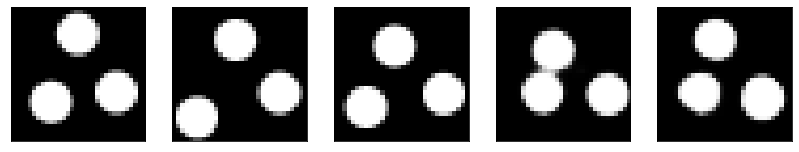

GD iterations:
i=0 | err=57.557060
i=1 | err=56.298126
i=2 | err=54.468498
i=3 | err=52.412346
i=4 | err=50.202442
i=5 | err=47.767799
i=6 | err=45.296120
i=7 | err=42.714478
i=8 | err=40.170048
i=9 | err=37.569614
i=10 | err=35.051247
i=11 | err=32.574654
i=12 | err=30.187401
i=13 | err=27.837337
i=14 | err=25.530041
i=15 | err=23.419767
i=16 | err=21.398563
i=17 | err=19.551954
i=18 | err=17.848944
i=19 | err=16.358786
i=20 | err=15.010106
i=21 | err=13.743692
i=22 | err=12.562916
i=23 | err=11.449006
i=24 | err=10.391097
i=25 | err=9.375127
i=26 | err=8.444202
i=27 | err=7.582860
i=28 | err=6.769909
i=29 | err=5.986944
Epoch=271 (17%) | out_positive=0.887698 | out_negative=0.149288 | mse=0.064677


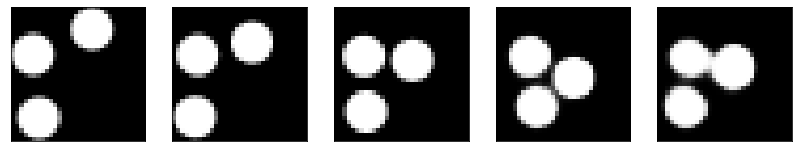

GD iterations:
i=0 | err=52.984268
i=1 | err=51.787334
i=2 | err=50.166454
i=3 | err=48.324551
i=4 | err=46.223526
i=5 | err=44.191902
i=6 | err=42.200256
i=7 | err=40.136528
i=8 | err=38.085663
i=9 | err=36.002441
i=10 | err=33.930012
i=11 | err=31.921730
i=12 | err=29.969021
i=13 | err=28.086679
i=14 | err=26.218010
i=15 | err=24.473240
i=16 | err=22.806450
i=17 | err=21.181885
i=18 | err=19.627975
i=19 | err=18.148006
i=20 | err=16.755266
i=21 | err=15.396107
i=22 | err=14.152073
i=23 | err=12.988776
i=24 | err=11.910521
i=25 | err=10.887143
i=26 | err=9.902374
i=27 | err=8.975769
i=28 | err=8.109316
i=29 | err=7.300365
Epoch=271 (18%) | out_positive=0.874708 | out_negative=0.133085 | mse=0.066855


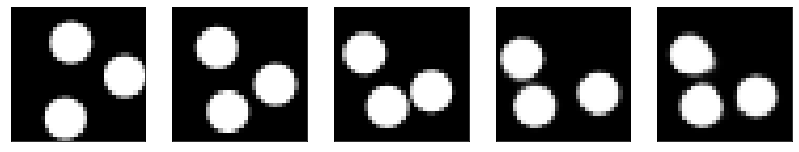

GD iterations:
i=0 | err=55.218124
i=1 | err=53.987560
i=2 | err=52.230324
i=3 | err=50.353771
i=4 | err=48.412857
i=5 | err=46.391533
i=6 | err=44.285492
i=7 | err=42.097046
i=8 | err=39.887077
i=9 | err=37.664856
i=10 | err=35.511810
i=11 | err=33.449791
i=12 | err=31.327141
i=13 | err=29.270769
i=14 | err=27.263027
i=15 | err=25.369881
i=16 | err=23.628328
i=17 | err=21.966694
i=18 | err=20.414057
i=19 | err=18.905334
i=20 | err=17.498802
i=21 | err=16.146547
i=22 | err=14.835007
i=23 | err=13.608606
i=24 | err=12.410031
i=25 | err=11.264286
i=26 | err=10.191610
i=27 | err=9.184318
i=28 | err=8.249451
i=29 | err=7.376079
Epoch=271 (20%) | out_positive=0.847265 | out_negative=0.092392 | mse=0.073019


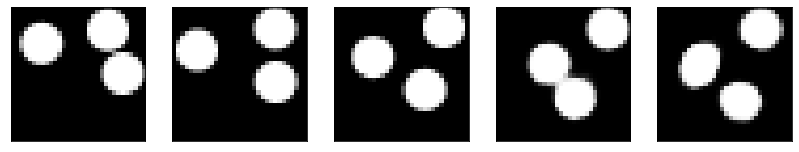

GD iterations:
i=0 | err=52.778851
i=1 | err=51.509766
i=2 | err=49.814972
i=3 | err=47.974625
i=4 | err=46.040154
i=5 | err=44.162834
i=6 | err=42.263958
i=7 | err=40.252396
i=8 | err=38.330090
i=9 | err=36.387428
i=10 | err=34.407814
i=11 | err=32.378273
i=12 | err=30.210228
i=13 | err=28.064810
i=14 | err=25.995884
i=15 | err=24.124855
i=16 | err=22.407932
i=17 | err=20.851982
i=18 | err=19.387476
i=19 | err=18.013523
i=20 | err=16.749758
i=21 | err=15.549723
i=22 | err=14.398056
i=23 | err=13.317184
i=24 | err=12.300062
i=25 | err=11.349591
i=26 | err=10.418753
i=27 | err=9.509050
i=28 | err=8.631535
i=29 | err=7.754206
Epoch=271 (22%) | out_positive=0.897136 | out_negative=0.105753 | mse=0.075308


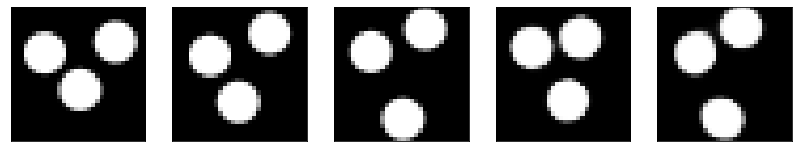

GD iterations:
i=0 | err=55.788994
i=1 | err=54.673065
i=2 | err=53.049770
i=3 | err=51.208878
i=4 | err=49.252323
i=5 | err=47.149788
i=6 | err=45.011337
i=7 | err=42.847473
i=8 | err=40.641918
i=9 | err=38.404034
i=10 | err=36.157669
i=11 | err=33.897953
i=12 | err=31.757046
i=13 | err=29.644625
i=14 | err=27.582104
i=15 | err=25.594347
i=16 | err=23.674871
i=17 | err=21.880733
i=18 | err=20.148113
i=19 | err=18.538036
i=20 | err=17.040575
i=21 | err=15.680459
i=22 | err=14.466716
i=23 | err=13.321257
i=24 | err=12.216722
i=25 | err=11.160293
i=26 | err=10.136656
i=27 | err=9.168163
i=28 | err=8.295163
i=29 | err=7.474842
Epoch=271 (24%) | out_positive=0.854363 | out_negative=0.116018 | mse=0.074993


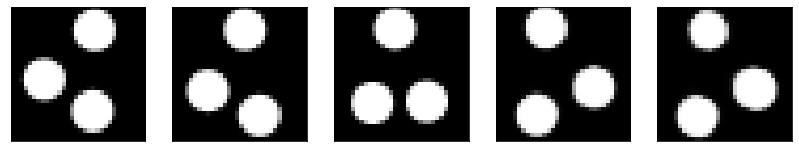

GD iterations:
i=0 | err=50.493919
i=1 | err=49.299706
i=2 | err=47.597782
i=3 | err=45.735970
i=4 | err=43.761742
i=5 | err=41.755722
i=6 | err=39.650024
i=7 | err=37.475685
i=8 | err=35.330563
i=9 | err=33.256363
i=10 | err=31.181152
i=11 | err=29.165562
i=12 | err=27.183945
i=13 | err=25.228910
i=14 | err=23.351267
i=15 | err=21.545179
i=16 | err=19.850052
i=17 | err=18.259010
i=18 | err=16.775076
i=19 | err=15.396284
i=20 | err=14.104936
i=21 | err=12.921392
i=22 | err=11.835155
i=23 | err=10.803211
i=24 | err=9.839687
i=25 | err=8.915739
i=26 | err=8.038691
i=27 | err=7.225093
i=28 | err=6.445858
i=29 | err=5.720250
Epoch=271 (26%) | out_positive=0.902013 | out_negative=0.162988 | mse=0.064551


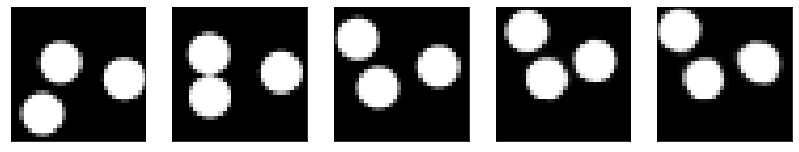

GD iterations:
i=0 | err=55.076256
i=1 | err=53.795967
i=2 | err=52.081833
i=3 | err=50.130199
i=4 | err=48.073921
i=5 | err=45.948227
i=6 | err=43.828194
i=7 | err=41.621330
i=8 | err=39.367893
i=9 | err=37.142601
i=10 | err=34.955334
i=11 | err=32.824890
i=12 | err=30.768543
i=13 | err=28.720909
i=14 | err=26.773609
i=15 | err=24.810507
i=16 | err=22.986485
i=17 | err=21.244373
i=18 | err=19.619999
i=19 | err=18.091530
i=20 | err=16.596460
i=21 | err=15.190382
i=22 | err=13.890574
i=23 | err=12.733656
i=24 | err=11.621737
i=25 | err=10.640249
i=26 | err=9.714142
i=27 | err=8.825085
i=28 | err=7.945311
i=29 | err=7.094254
Epoch=271 (28%) | out_positive=0.888593 | out_negative=0.149338 | mse=0.075014


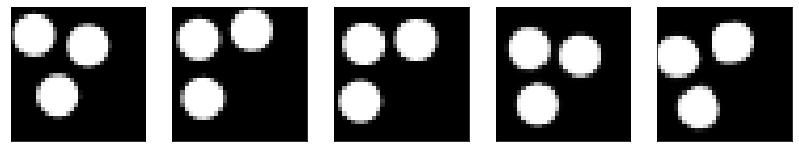

GD iterations:
i=0 | err=54.177681
i=1 | err=53.003792
i=2 | err=51.368904
i=3 | err=49.426754
i=4 | err=47.373047
i=5 | err=45.322002
i=6 | err=43.139923
i=7 | err=40.841927
i=8 | err=38.568920
i=9 | err=36.301468
i=10 | err=34.085075
i=11 | err=31.880148
i=12 | err=29.675564
i=13 | err=27.436230
i=14 | err=25.234505
i=15 | err=23.161457
i=16 | err=21.258183
i=17 | err=19.485344
i=18 | err=17.867268
i=19 | err=16.394167
i=20 | err=15.050179
i=21 | err=13.784176
i=22 | err=12.592035
i=23 | err=11.497838
i=24 | err=10.451216
i=25 | err=9.487164
i=26 | err=8.602305
i=27 | err=7.761426
i=28 | err=6.947860
i=29 | err=6.198165
Epoch=271 (30%) | out_positive=0.895896 | out_negative=0.122494 | mse=0.068457


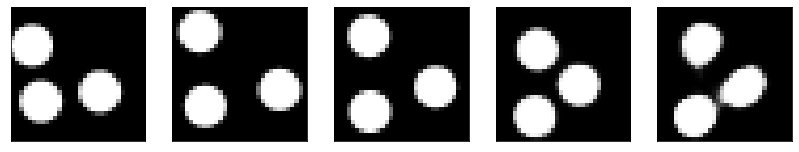

GD iterations:
i=0 | err=58.093025
i=1 | err=56.754032
i=2 | err=54.970306
i=3 | err=52.913906
i=4 | err=50.678642
i=5 | err=48.382263
i=6 | err=45.977829
i=7 | err=43.502850
i=8 | err=41.097328
i=9 | err=38.663399
i=10 | err=36.193069
i=11 | err=33.677261
i=12 | err=31.236855
i=13 | err=28.906313
i=14 | err=26.760189
i=15 | err=24.781567
i=16 | err=22.928902
i=17 | err=21.164162
i=18 | err=19.523682
i=19 | err=18.008072
i=20 | err=16.523428
i=21 | err=15.121049
i=22 | err=13.839945
i=23 | err=12.684855
i=24 | err=11.655979
i=25 | err=10.650829
i=26 | err=9.714911
i=27 | err=8.820952
i=28 | err=7.951858
i=29 | err=7.123082
Epoch=271 (31%) | out_positive=0.891500 | out_negative=0.121012 | mse=0.074040


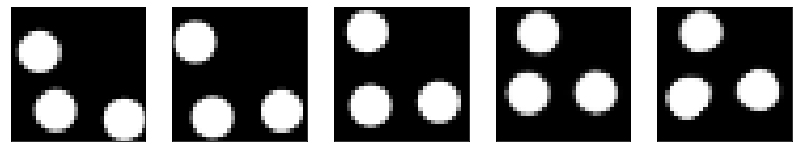

GD iterations:
i=0 | err=56.154266
i=1 | err=54.915768
i=2 | err=53.183697
i=3 | err=51.234077
i=4 | err=49.188690
i=5 | err=47.000530
i=6 | err=44.727829
i=7 | err=42.509068
i=8 | err=40.284435
i=9 | err=37.935230
i=10 | err=35.621483
i=11 | err=33.258991
i=12 | err=30.950947
i=13 | err=28.725351
i=14 | err=26.578068
i=15 | err=24.553087
i=16 | err=22.683567
i=17 | err=20.909393
i=18 | err=19.212837
i=19 | err=17.658562
i=20 | err=16.229538
i=21 | err=14.922815
i=22 | err=13.717581
i=23 | err=12.613388
i=24 | err=11.564855
i=25 | err=10.544389
i=26 | err=9.568207
i=27 | err=8.643320
i=28 | err=7.765915
i=29 | err=6.910412
Epoch=271 (33%) | out_positive=0.857144 | out_negative=0.141907 | mse=0.068600


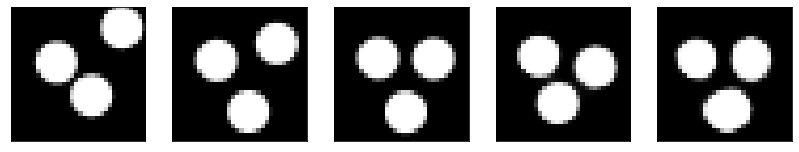

GD iterations:
i=0 | err=54.074596
i=1 | err=52.762905
i=2 | err=51.060814
i=3 | err=49.083733
i=4 | err=47.073780
i=5 | err=44.973148
i=6 | err=42.928734
i=7 | err=40.845528
i=8 | err=38.708366
i=9 | err=36.509445
i=10 | err=34.271698
i=11 | err=32.032501
i=12 | err=29.889992
i=13 | err=27.760851
i=14 | err=25.640610
i=15 | err=23.581991
i=16 | err=21.703362
i=17 | err=19.983471
i=18 | err=18.359833
i=19 | err=16.817856
i=20 | err=15.388036
i=21 | err=14.074410
i=22 | err=12.804407
i=23 | err=11.650457
i=24 | err=10.606993
i=25 | err=9.659372
i=26 | err=8.780087
i=27 | err=7.937656
i=28 | err=7.152057
i=29 | err=6.417229
Epoch=271 (35%) | out_positive=0.900881 | out_negative=0.109287 | mse=0.066676


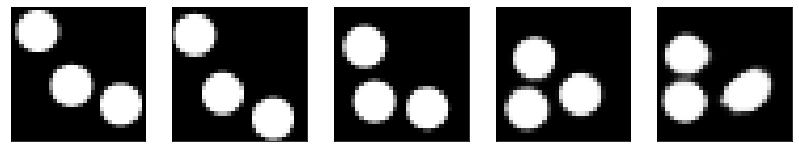

GD iterations:
i=0 | err=56.512001
i=1 | err=55.261429
i=2 | err=53.551537
i=3 | err=51.657951
i=4 | err=49.667023
i=5 | err=47.593285
i=6 | err=45.487190
i=7 | err=43.309357
i=8 | err=41.098812
i=9 | err=38.876663
i=10 | err=36.655251
i=11 | err=34.476250
i=12 | err=32.352951
i=13 | err=30.286510
i=14 | err=28.220503
i=15 | err=26.210680
i=16 | err=24.280418
i=17 | err=22.494583
i=18 | err=20.935223
i=19 | err=19.458609
i=20 | err=18.016380
i=21 | err=16.612492
i=22 | err=15.249533
i=23 | err=13.943226
i=24 | err=12.657573
i=25 | err=11.400590
i=26 | err=10.291487
i=27 | err=9.292822
i=28 | err=8.368153
i=29 | err=7.498434
Epoch=271 (37%) | out_positive=0.867049 | out_negative=0.086912 | mse=0.071411


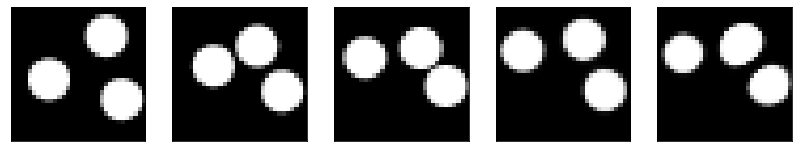

GD iterations:
i=0 | err=60.783722
i=1 | err=59.448395
i=2 | err=57.638317
i=3 | err=55.613758
i=4 | err=53.533985
i=5 | err=51.318985
i=6 | err=49.067978
i=7 | err=46.728760
i=8 | err=44.348629
i=9 | err=41.967747
i=10 | err=39.595276
i=11 | err=37.332489
i=12 | err=35.112831
i=13 | err=33.032192
i=14 | err=30.987726
i=15 | err=29.002186
i=16 | err=27.066799
i=17 | err=25.083488
i=18 | err=23.206982
i=19 | err=21.396248
i=20 | err=19.696865
i=21 | err=18.107489
i=22 | err=16.592997
i=23 | err=15.162420
i=24 | err=13.842894
i=25 | err=12.571932
i=26 | err=11.383205
i=27 | err=10.283236
i=28 | err=9.244495
i=29 | err=8.345417
Epoch=271 (39%) | out_positive=0.875741 | out_negative=0.098211 | mse=0.075646


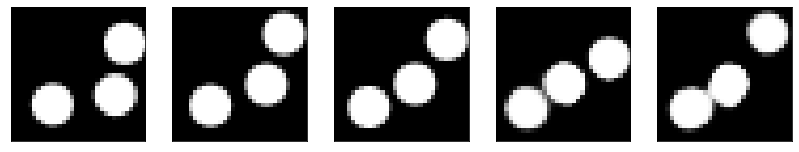

GD iterations:
i=0 | err=53.230137
i=1 | err=51.970745
i=2 | err=50.272572
i=3 | err=48.394890
i=4 | err=46.367859
i=5 | err=44.177704
i=6 | err=41.936054
i=7 | err=39.692776
i=8 | err=37.444996
i=9 | err=35.249207
i=10 | err=33.104721
i=11 | err=30.985481
i=12 | err=28.910103
i=13 | err=26.911604
i=14 | err=25.010502
i=15 | err=23.215149
i=16 | err=21.478977
i=17 | err=19.801525
i=18 | err=18.168131
i=19 | err=16.701988
i=20 | err=15.312306
i=21 | err=14.023861
i=22 | err=12.860223
i=23 | err=11.757658
i=24 | err=10.716080
i=25 | err=9.763222
i=26 | err=8.864607
i=27 | err=8.028732
i=28 | err=7.259825
i=29 | err=6.531925
Epoch=271 (41%) | out_positive=0.881023 | out_negative=0.139642 | mse=0.065133


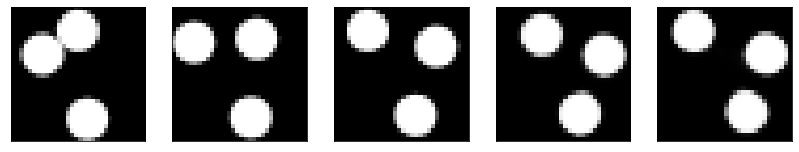

GD iterations:
i=0 | err=52.739594
i=1 | err=51.533283
i=2 | err=49.912094
i=3 | err=48.074310
i=4 | err=46.073135
i=5 | err=44.032295
i=6 | err=41.937325
i=7 | err=39.872791
i=8 | err=37.722359
i=9 | err=35.548546
i=10 | err=33.276730
i=11 | err=31.086193
i=12 | err=28.884602
i=13 | err=26.840698
i=14 | err=24.981014
i=15 | err=23.201332
i=16 | err=21.464403
i=17 | err=19.863247
i=18 | err=18.384499
i=19 | err=16.993156
i=20 | err=15.720037
i=21 | err=14.522903
i=22 | err=13.404133
i=23 | err=12.362646
i=24 | err=11.366282
i=25 | err=10.409456
i=26 | err=9.491255
i=27 | err=8.566116
i=28 | err=7.709433
i=29 | err=6.929071
Epoch=271 (42%) | out_positive=0.940368 | out_negative=0.148561 | mse=0.072317


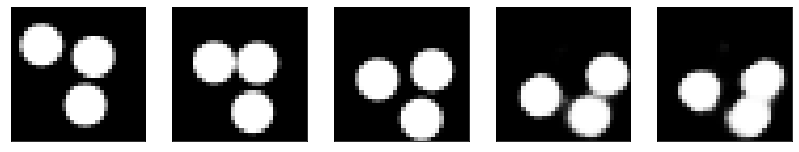

GD iterations:
i=0 | err=57.785625
i=1 | err=56.541656
i=2 | err=54.866516
i=3 | err=52.984383
i=4 | err=50.941837
i=5 | err=48.855408
i=6 | err=46.748375
i=7 | err=44.508736
i=8 | err=42.246696
i=9 | err=39.847328
i=10 | err=37.295273
i=11 | err=34.837013
i=12 | err=32.357056
i=13 | err=29.958534
i=14 | err=27.779001
i=15 | err=25.787426
i=16 | err=23.932537
i=17 | err=22.177792
i=18 | err=20.495125
i=19 | err=18.963724
i=20 | err=17.532700
i=21 | err=16.180309
i=22 | err=14.895958
i=23 | err=13.660089
i=24 | err=12.506366
i=25 | err=11.427419
i=26 | err=10.396908
i=27 | err=9.408188
i=28 | err=8.481470
i=29 | err=7.586720
Epoch=271 (44%) | out_positive=0.874648 | out_negative=0.137166 | mse=0.070288


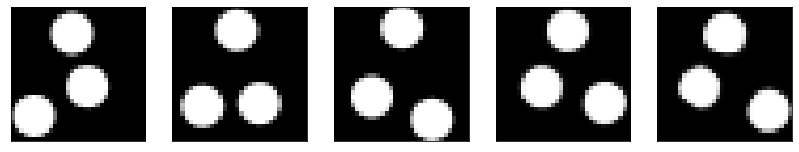

GD iterations:
i=0 | err=56.709854
i=1 | err=55.464127
i=2 | err=53.746819
i=3 | err=51.758659
i=4 | err=49.674137
i=5 | err=47.406059
i=6 | err=45.080261
i=7 | err=42.714714
i=8 | err=40.287285
i=9 | err=37.917797
i=10 | err=35.633385
i=11 | err=33.391644
i=12 | err=31.132599
i=13 | err=29.001587
i=14 | err=26.982174
i=15 | err=25.067009
i=16 | err=23.216541
i=17 | err=21.451744
i=18 | err=19.729494
i=19 | err=18.125561
i=20 | err=16.622833
i=21 | err=15.195097
i=22 | err=13.889915
i=23 | err=12.727893
i=24 | err=11.540489
i=25 | err=10.423153
i=26 | err=9.383726
i=27 | err=8.418519
i=28 | err=7.510460
i=29 | err=6.667336
Epoch=271 (46%) | out_positive=0.879431 | out_negative=0.133198 | mse=0.073266


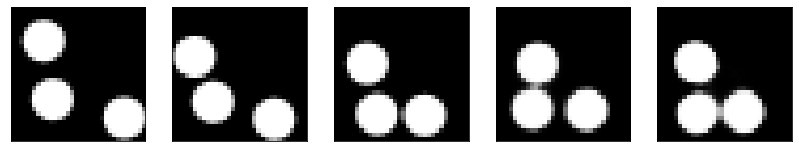

GD iterations:
i=0 | err=52.916367
i=1 | err=51.762253
i=2 | err=50.110256
i=3 | err=48.322983
i=4 | err=46.352776
i=5 | err=44.338699
i=6 | err=42.233112
i=7 | err=40.144287
i=8 | err=37.986374
i=9 | err=35.751610
i=10 | err=33.580688
i=11 | err=31.578045
i=12 | err=29.619255
i=13 | err=27.657787
i=14 | err=25.759382
i=15 | err=23.943676
i=16 | err=22.167522
i=17 | err=20.504402
i=18 | err=18.980869
i=19 | err=17.517471
i=20 | err=16.132660
i=21 | err=14.868450
i=22 | err=13.707807
i=23 | err=12.671900
i=24 | err=11.717272
i=25 | err=10.770772
i=26 | err=9.845505
i=27 | err=8.964783
i=28 | err=8.152488
i=29 | err=7.409666
Epoch=271 (48%) | out_positive=0.900950 | out_negative=0.113065 | mse=0.068982


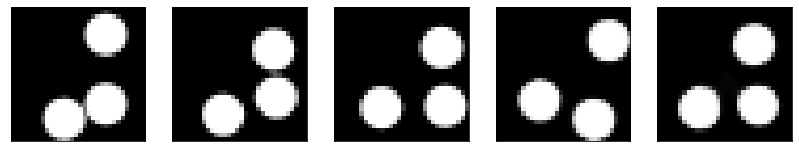

GD iterations:
i=0 | err=53.947403
i=1 | err=52.695408
i=2 | err=50.974201
i=3 | err=48.998508
i=4 | err=46.876633
i=5 | err=44.703423
i=6 | err=42.602131
i=7 | err=40.528088
i=8 | err=38.474297
i=9 | err=36.378632
i=10 | err=34.223610
i=11 | err=32.074936
i=12 | err=30.009670
i=13 | err=27.978970
i=14 | err=25.994093
i=15 | err=24.120361
i=16 | err=22.289787
i=17 | err=20.591782
i=18 | err=19.066162
i=19 | err=17.602894
i=20 | err=16.175270
i=21 | err=14.846653
i=22 | err=13.603634
i=23 | err=12.452246
i=24 | err=11.386930
i=25 | err=10.410196
i=26 | err=9.504253
i=27 | err=8.649567
i=28 | err=7.848459
i=29 | err=7.103426
Epoch=271 (50%) | out_positive=0.831362 | out_negative=0.141090 | mse=0.065928


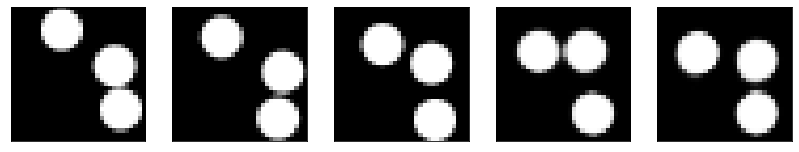

GD iterations:
i=0 | err=52.373421
i=1 | err=51.164528
i=2 | err=49.494728
i=3 | err=47.594448
i=4 | err=45.588745
i=5 | err=43.495796
i=6 | err=41.417614
i=7 | err=39.256622
i=8 | err=36.992798
i=9 | err=34.663494
i=10 | err=32.445930
i=11 | err=30.146206
i=12 | err=27.937742
i=13 | err=25.945618
i=14 | err=24.052454
i=15 | err=22.269306
i=16 | err=20.609592
i=17 | err=19.062332
i=18 | err=17.585241
i=19 | err=16.211613
i=20 | err=14.901039
i=21 | err=13.698893
i=22 | err=12.581867
i=23 | err=11.544109
i=24 | err=10.572071
i=25 | err=9.658255
i=26 | err=8.777722
i=27 | err=7.957737
i=28 | err=7.166209
i=29 | err=6.443462
Epoch=271 (52%) | out_positive=0.895452 | out_negative=0.143903 | mse=0.070404


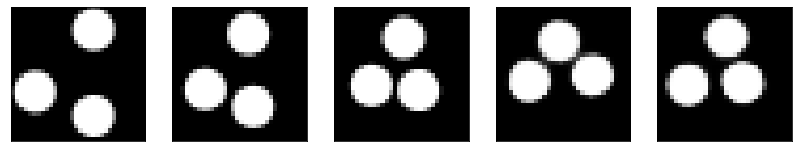

GD iterations:
i=0 | err=57.567165
i=1 | err=56.355671
i=2 | err=54.567554
i=3 | err=52.484241
i=4 | err=50.273224
i=5 | err=47.985191
i=6 | err=45.742981
i=7 | err=43.512058
i=8 | err=41.297256
i=9 | err=38.971630
i=10 | err=36.597843
i=11 | err=34.287704
i=12 | err=32.061714
i=13 | err=29.808571
i=14 | err=27.678486
i=15 | err=25.595829
i=16 | err=23.556511
i=17 | err=21.630272
i=18 | err=19.811132
i=19 | err=18.114426
i=20 | err=16.543344
i=21 | err=15.103008
i=22 | err=13.812140
i=23 | err=12.644184
i=24 | err=11.546072
i=25 | err=10.550903
i=26 | err=9.622007
i=27 | err=8.742308
i=28 | err=7.948301
i=29 | err=7.202964
Epoch=271 (54%) | out_positive=0.820211 | out_negative=0.104808 | mse=0.071337


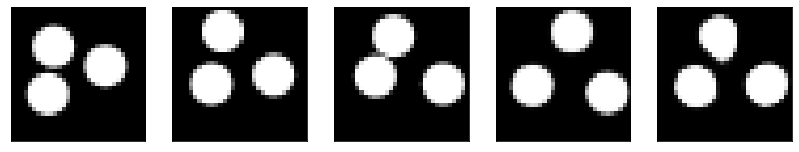

GD iterations:
i=0 | err=55.222191
i=1 | err=53.886189
i=2 | err=51.981781
i=3 | err=49.850941
i=4 | err=47.627586
i=5 | err=45.339401
i=6 | err=43.073906
i=7 | err=40.773415
i=8 | err=38.437660
i=9 | err=36.157604
i=10 | err=33.925617
i=11 | err=31.731451
i=12 | err=29.618004
i=13 | err=27.537439
i=14 | err=25.512999
i=15 | err=23.593901
i=16 | err=21.805294
i=17 | err=20.113033
i=18 | err=18.565916
i=19 | err=17.086006
i=20 | err=15.639628
i=21 | err=14.301150
i=22 | err=13.052078
i=23 | err=11.885509
i=24 | err=10.780088
i=25 | err=9.730280
i=26 | err=8.776550
i=27 | err=7.904384
i=28 | err=7.124842
i=29 | err=6.382814
Epoch=271 (55%) | out_positive=0.859110 | out_negative=0.129447 | mse=0.068755


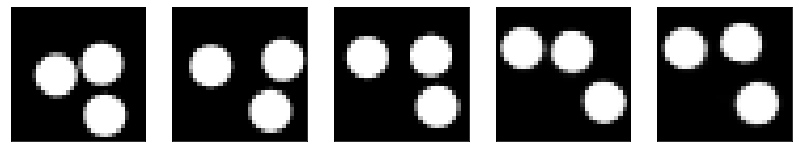

GD iterations:
i=0 | err=53.913670
i=1 | err=52.691875
i=2 | err=51.106594
i=3 | err=49.296539
i=4 | err=47.404755
i=5 | err=45.453876
i=6 | err=43.416679
i=7 | err=41.269474
i=8 | err=39.042381
i=9 | err=36.849174
i=10 | err=34.581276
i=11 | err=32.378696
i=12 | err=30.233040
i=13 | err=28.168110
i=14 | err=26.174166
i=15 | err=24.278851
i=16 | err=22.484516
i=17 | err=20.763357
i=18 | err=19.120373
i=19 | err=17.624664
i=20 | err=16.279858
i=21 | err=15.047168
i=22 | err=13.886889
i=23 | err=12.768562
i=24 | err=11.703041
i=25 | err=10.713406
i=26 | err=9.796876
i=27 | err=8.953863
i=28 | err=8.166851
i=29 | err=7.414583
Epoch=271 (57%) | out_positive=0.939049 | out_negative=0.137407 | mse=0.072609


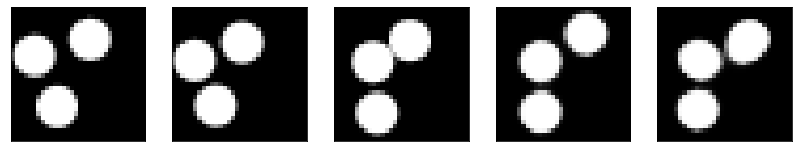

GD iterations:
i=0 | err=61.308933
i=1 | err=59.937218
i=2 | err=58.039909
i=3 | err=55.910343
i=4 | err=53.577599
i=5 | err=51.190903
i=6 | err=48.706905
i=7 | err=46.233742
i=8 | err=43.772041
i=9 | err=41.222126
i=10 | err=38.718746
i=11 | err=36.258705
i=12 | err=33.852745
i=13 | err=31.471771
i=14 | err=29.116486
i=15 | err=26.810577
i=16 | err=24.698303
i=17 | err=22.678785
i=18 | err=20.733196
i=19 | err=18.981211
i=20 | err=17.376930
i=21 | err=15.902033
i=22 | err=14.535633
i=23 | err=13.323161
i=24 | err=12.165333
i=25 | err=11.087309
i=26 | err=10.033715
i=27 | err=9.057573
i=28 | err=8.148529
i=29 | err=7.300324
Epoch=271 (59%) | out_positive=0.828454 | out_negative=0.108575 | mse=0.069478


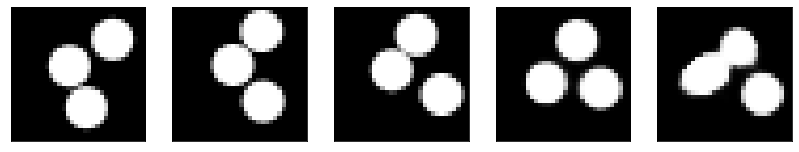

GD iterations:
i=0 | err=57.443321
i=1 | err=56.156616
i=2 | err=54.445107
i=3 | err=52.605255
i=4 | err=50.697327
i=5 | err=48.693520
i=6 | err=46.722641
i=7 | err=44.632790
i=8 | err=42.533417
i=9 | err=40.388542
i=10 | err=38.159836
i=11 | err=35.949829
i=12 | err=33.788704
i=13 | err=31.672400
i=14 | err=29.647011
i=15 | err=27.645477
i=16 | err=25.742233
i=17 | err=23.951126
i=18 | err=22.282444
i=19 | err=20.665680
i=20 | err=19.175217
i=21 | err=17.759739
i=22 | err=16.389519
i=23 | err=15.048647
i=24 | err=13.835328
i=25 | err=12.690809
i=26 | err=11.624084
i=27 | err=10.640936
i=28 | err=9.698372
i=29 | err=8.851723
Epoch=271 (61%) | out_positive=0.858004 | out_negative=0.064876 | mse=0.077218


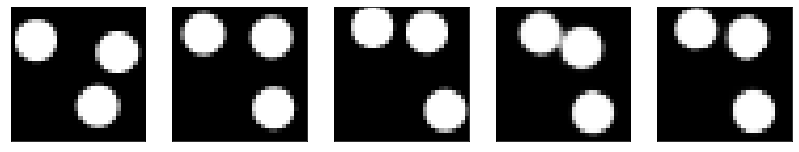

GD iterations:
i=0 | err=55.830009
i=1 | err=54.628029
i=2 | err=52.987511
i=3 | err=51.023628
i=4 | err=48.952789
i=5 | err=46.737503
i=6 | err=44.488701
i=7 | err=42.168957
i=8 | err=39.717499
i=9 | err=37.272575
i=10 | err=34.917465
i=11 | err=32.543789
i=12 | err=30.323051
i=13 | err=28.194607
i=14 | err=26.151453
i=15 | err=24.225502
i=16 | err=22.361423
i=17 | err=20.561821
i=18 | err=18.864967
i=19 | err=17.313530
i=20 | err=15.814322
i=21 | err=14.382593
i=22 | err=13.015821
i=23 | err=11.792162
i=24 | err=10.611503
i=25 | err=9.482673
i=26 | err=8.448258
i=27 | err=7.500489
i=28 | err=6.600579
i=29 | err=5.733103
Epoch=271 (63%) | out_positive=0.854220 | out_negative=0.162131 | mse=0.068655


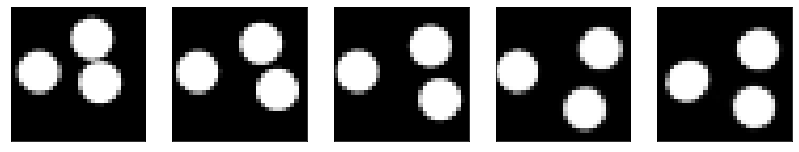

GD iterations:
i=0 | err=60.722145
i=1 | err=59.511395
i=2 | err=57.767181
i=3 | err=55.797043
i=4 | err=53.600098
i=5 | err=51.190506
i=6 | err=48.612465
i=7 | err=45.847599
i=8 | err=43.152542
i=9 | err=40.246758
i=10 | err=37.335087
i=11 | err=34.416016
i=12 | err=31.749352
i=13 | err=29.289982
i=14 | err=27.003450
i=15 | err=24.852282
i=16 | err=22.860422
i=17 | err=21.060280
i=18 | err=19.408150
i=19 | err=17.879929
i=20 | err=16.478340
i=21 | err=15.145100
i=22 | err=13.831806
i=23 | err=12.598569
i=24 | err=11.467802
i=25 | err=10.395296
i=26 | err=9.380791
i=27 | err=8.429102
i=28 | err=7.543949
i=29 | err=6.730232
Epoch=271 (65%) | out_positive=0.880327 | out_negative=0.158621 | mse=0.072459


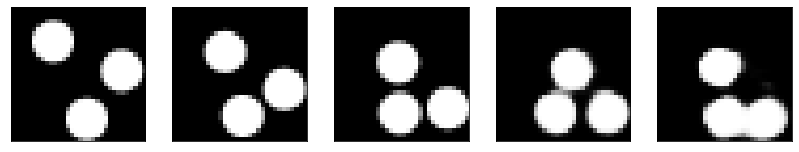

GD iterations:
i=0 | err=56.663620
i=1 | err=55.361313
i=2 | err=53.594131
i=3 | err=51.630722
i=4 | err=49.655590
i=5 | err=47.496864
i=6 | err=45.289658
i=7 | err=43.042225
i=8 | err=40.844028
i=9 | err=38.589821
i=10 | err=36.439999
i=11 | err=34.261730
i=12 | err=32.011295
i=13 | err=29.754749
i=14 | err=27.551548
i=15 | err=25.461695
i=16 | err=23.561657
i=17 | err=21.767912
i=18 | err=20.062994
i=19 | err=18.474117
i=20 | err=16.957808
i=21 | err=15.590778
i=22 | err=14.342258
i=23 | err=13.231998
i=24 | err=12.162889
i=25 | err=11.171864
i=26 | err=10.236732
i=27 | err=9.383068
i=28 | err=8.560542
i=29 | err=7.787368
Epoch=271 (66%) | out_positive=0.834900 | out_negative=0.085379 | mse=0.076170


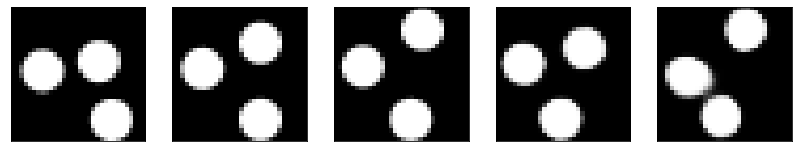

GD iterations:
i=0 | err=50.038322
i=1 | err=48.865746
i=2 | err=47.180382
i=3 | err=45.305775
i=4 | err=43.426395
i=5 | err=41.466087
i=6 | err=39.490868
i=7 | err=37.454597
i=8 | err=35.314816
i=9 | err=33.176029
i=10 | err=31.133282
i=11 | err=29.074112
i=12 | err=27.089951
i=13 | err=25.112314
i=14 | err=23.251575
i=15 | err=21.453339
i=16 | err=19.763048
i=17 | err=18.209541
i=18 | err=16.745691
i=19 | err=15.436977
i=20 | err=14.212170
i=21 | err=13.055958
i=22 | err=12.000512
i=23 | err=11.050185
i=24 | err=10.177925
i=25 | err=9.379438
i=26 | err=8.622371
i=27 | err=7.946949
i=28 | err=7.324361
i=29 | err=6.728031
Epoch=271 (68%) | out_positive=0.854141 | out_negative=0.111579 | mse=0.069945


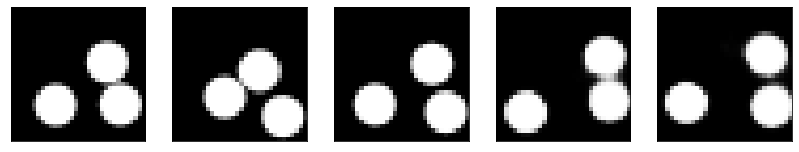

GD iterations:
i=0 | err=59.824257
i=1 | err=58.434303
i=2 | err=56.553722
i=3 | err=54.432709
i=4 | err=52.174271
i=5 | err=49.778397
i=6 | err=47.307007
i=7 | err=44.768173
i=8 | err=42.094875
i=9 | err=39.316036
i=10 | err=36.637703
i=11 | err=34.060547
i=12 | err=31.672104
i=13 | err=29.396660
i=14 | err=27.271641
i=15 | err=25.194515
i=16 | err=23.195091
i=17 | err=21.315580
i=18 | err=19.587091
i=19 | err=17.988171
i=20 | err=16.533230
i=21 | err=15.169571
i=22 | err=13.903095
i=23 | err=12.741812
i=24 | err=11.660454
i=25 | err=10.585704
i=26 | err=9.582754
i=27 | err=8.634516
i=28 | err=7.753668
i=29 | err=6.964354
Epoch=271 (70%) | out_positive=0.877967 | out_negative=0.120102 | mse=0.073360


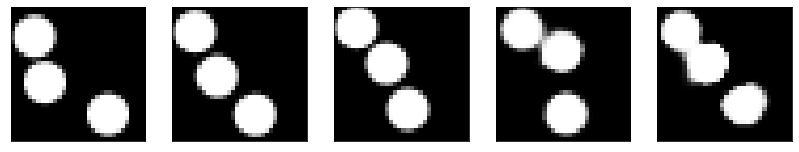

GD iterations:
i=0 | err=54.335655
i=1 | err=53.143658
i=2 | err=51.544327
i=3 | err=49.664608
i=4 | err=47.694489
i=5 | err=45.610542
i=6 | err=43.526829
i=7 | err=41.385689
i=8 | err=39.169056
i=9 | err=36.917900
i=10 | err=34.647255
i=11 | err=32.453377
i=12 | err=30.282175
i=13 | err=28.156036
i=14 | err=26.153290
i=15 | err=24.394104
i=16 | err=22.682018
i=17 | err=21.036335
i=18 | err=19.511345
i=19 | err=18.128597
i=20 | err=16.850819
i=21 | err=15.645748
i=22 | err=14.496530
i=23 | err=13.396789
i=24 | err=12.367115
i=25 | err=11.392612
i=26 | err=10.444706
i=27 | err=9.552974
i=28 | err=8.700514
i=29 | err=7.866843
Epoch=271 (72%) | out_positive=0.841983 | out_negative=0.109298 | mse=0.070801


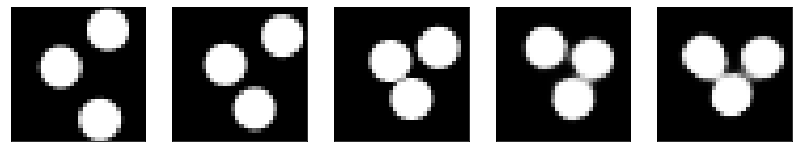

GD iterations:
i=0 | err=55.948441
i=1 | err=54.621796
i=2 | err=52.872765
i=3 | err=50.907593
i=4 | err=48.817314
i=5 | err=46.681618
i=6 | err=44.377083
i=7 | err=41.937630
i=8 | err=39.423100
i=9 | err=36.900276
i=10 | err=34.343048
i=11 | err=31.781517
i=12 | err=29.354713
i=13 | err=27.019276
i=14 | err=24.772701
i=15 | err=22.688353
i=16 | err=20.710091
i=17 | err=18.819313
i=18 | err=17.059757
i=19 | err=15.465619
i=20 | err=14.041545
i=21 | err=12.738964
i=22 | err=11.518586
i=23 | err=10.435002
i=24 | err=9.446667
i=25 | err=8.475509
i=26 | err=7.590596
i=27 | err=6.791389
i=28 | err=6.036433
i=29 | err=5.322310
Epoch=271 (74%) | out_positive=0.800054 | out_negative=0.172679 | mse=0.060234


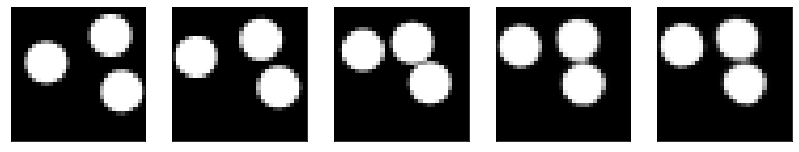

GD iterations:
i=0 | err=56.528896
i=1 | err=55.157028
i=2 | err=53.464622
i=3 | err=51.521027
i=4 | err=49.455650
i=5 | err=47.327103
i=6 | err=45.008148
i=7 | err=42.561935
i=8 | err=40.085415
i=9 | err=37.515060
i=10 | err=34.901001
i=11 | err=32.335823
i=12 | err=29.936789
i=13 | err=27.700371
i=14 | err=25.645370
i=15 | err=23.741064
i=16 | err=21.891468
i=17 | err=20.120724
i=18 | err=18.444904
i=19 | err=16.921108
i=20 | err=15.579625
i=21 | err=14.315789
i=22 | err=13.138771
i=23 | err=12.054440
i=24 | err=11.026251
i=25 | err=10.096284
i=26 | err=9.211063
i=27 | err=8.335831
i=28 | err=7.512981
i=29 | err=6.731866
Epoch=271 (76%) | out_positive=0.894906 | out_negative=0.170672 | mse=0.072379


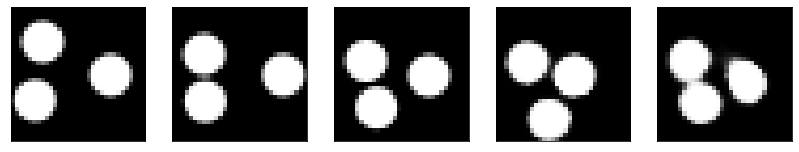

GD iterations:
i=0 | err=51.309292
i=1 | err=50.033627
i=2 | err=48.315334
i=3 | err=46.370071
i=4 | err=44.269848
i=5 | err=42.176224
i=6 | err=40.008057
i=7 | err=37.775188
i=8 | err=35.416931
i=9 | err=33.178558
i=10 | err=31.099285
i=11 | err=29.178444
i=12 | err=27.460457
i=13 | err=25.788544
i=14 | err=24.119898
i=15 | err=22.472294
i=16 | err=20.845369
i=17 | err=19.278463
i=18 | err=17.805855
i=19 | err=16.425282
i=20 | err=15.145813
i=21 | err=13.969058
i=22 | err=12.839283
i=23 | err=11.795618
i=24 | err=10.819689
i=25 | err=9.911549
i=26 | err=9.093966
i=27 | err=8.305216
i=28 | err=7.578393
i=29 | err=6.909917
Epoch=271 (78%) | out_positive=0.903981 | out_negative=0.086271 | mse=0.072263


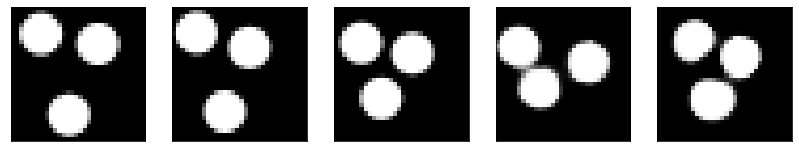

GD iterations:
i=0 | err=56.337784
i=1 | err=55.043633
i=2 | err=53.247673
i=3 | err=51.296303
i=4 | err=49.314171
i=5 | err=47.165340
i=6 | err=45.015465
i=7 | err=42.874065
i=8 | err=40.791595
i=9 | err=38.704491
i=10 | err=36.531151
i=11 | err=34.306660
i=12 | err=32.072914
i=13 | err=29.980694
i=14 | err=27.859306
i=15 | err=25.842131
i=16 | err=23.873280
i=17 | err=21.988876
i=18 | err=20.256704
i=19 | err=18.645140
i=20 | err=17.174974
i=21 | err=15.792495
i=22 | err=14.472393
i=23 | err=13.209480
i=24 | err=11.989453
i=25 | err=10.858553
i=26 | err=9.822435
i=27 | err=8.858089
i=28 | err=7.930137
i=29 | err=7.054620
Epoch=271 (79%) | out_positive=0.878775 | out_negative=0.144631 | mse=0.069630


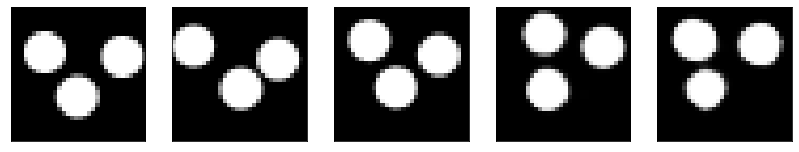

GD iterations:
i=0 | err=53.618637
i=1 | err=52.492805
i=2 | err=50.880074
i=3 | err=49.127022
i=4 | err=47.271896
i=5 | err=45.343502
i=6 | err=43.286953
i=7 | err=41.110008
i=8 | err=38.919342
i=9 | err=36.667053
i=10 | err=34.393013
i=11 | err=31.987427
i=12 | err=29.734890
i=13 | err=27.534618
i=14 | err=25.495258
i=15 | err=23.536713
i=16 | err=21.647392
i=17 | err=19.888866
i=18 | err=18.235399
i=19 | err=16.757561
i=20 | err=15.350506
i=21 | err=14.103655
i=22 | err=12.920464
i=23 | err=11.809509
i=24 | err=10.794218
i=25 | err=9.863316
i=26 | err=8.960027
i=27 | err=8.102927
i=28 | err=7.320807
i=29 | err=6.573041
Epoch=271 (81%) | out_positive=0.877138 | out_negative=0.143198 | mse=0.068161


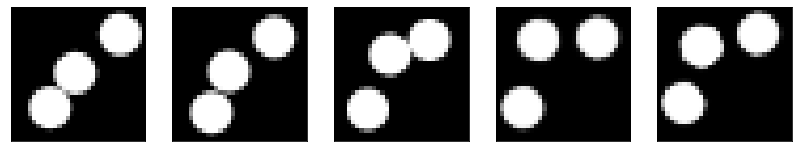

GD iterations:
i=0 | err=57.340332
i=1 | err=56.032455
i=2 | err=54.263191
i=3 | err=52.261642
i=4 | err=50.155216
i=5 | err=47.889187
i=6 | err=45.546387
i=7 | err=43.137039
i=8 | err=40.595558
i=9 | err=37.955166
i=10 | err=35.414703
i=11 | err=32.902473
i=12 | err=30.470610
i=13 | err=28.201046
i=14 | err=26.008326
i=15 | err=23.927448
i=16 | err=22.020847
i=17 | err=20.246748
i=18 | err=18.639391
i=19 | err=17.105080
i=20 | err=15.695765
i=21 | err=14.401258
i=22 | err=13.209670
i=23 | err=12.088869
i=24 | err=11.005009
i=25 | err=9.993732
i=26 | err=9.055498
i=27 | err=8.196451
i=28 | err=7.367317
i=29 | err=6.584334
Epoch=271 (83%) | out_positive=0.887111 | out_negative=0.147028 | mse=0.066146


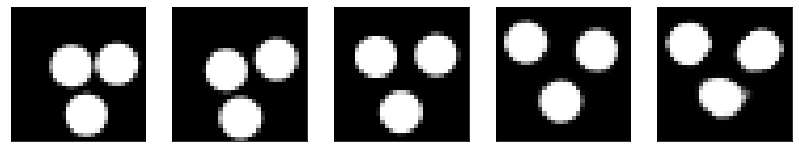

GD iterations:
i=0 | err=57.306198
i=1 | err=55.977707
i=2 | err=54.193024
i=3 | err=52.165970
i=4 | err=50.005989
i=5 | err=47.796684
i=6 | err=45.545124
i=7 | err=43.178024
i=8 | err=40.792255
i=9 | err=38.469139
i=10 | err=36.116856
i=11 | err=33.739006
i=12 | err=31.409355
i=13 | err=29.130249
i=14 | err=26.967093
i=15 | err=24.931890
i=16 | err=23.061264
i=17 | err=21.359182
i=18 | err=19.677387
i=19 | err=18.119688
i=20 | err=16.641846
i=21 | err=15.285553
i=22 | err=14.051177
i=23 | err=12.896358
i=24 | err=11.822886
i=25 | err=10.796488
i=26 | err=9.840221
i=27 | err=8.964865
i=28 | err=8.151061
i=29 | err=7.358752
Epoch=271 (85%) | out_positive=0.855034 | out_negative=0.128099 | mse=0.073340


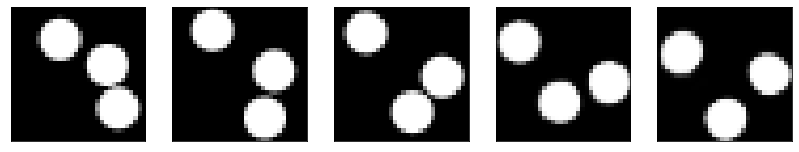

GD iterations:
i=0 | err=52.819107
i=1 | err=51.592731
i=2 | err=49.895813
i=3 | err=47.991314
i=4 | err=46.026405
i=5 | err=44.025764
i=6 | err=41.962170
i=7 | err=39.895584
i=8 | err=37.851357
i=9 | err=35.882710
i=10 | err=33.885715
i=11 | err=31.879013
i=12 | err=29.874071
i=13 | err=27.899294
i=14 | err=26.006832
i=15 | err=24.189430
i=16 | err=22.545681
i=17 | err=20.970007
i=18 | err=19.486427
i=19 | err=18.005926
i=20 | err=16.612259
i=21 | err=15.269146
i=22 | err=14.060110
i=23 | err=12.872763
i=24 | err=11.753181
i=25 | err=10.704638
i=26 | err=9.708580
i=27 | err=8.804064
i=28 | err=7.915806
i=29 | err=7.093229
Epoch=271 (87%) | out_positive=0.882745 | out_negative=0.115406 | mse=0.071743


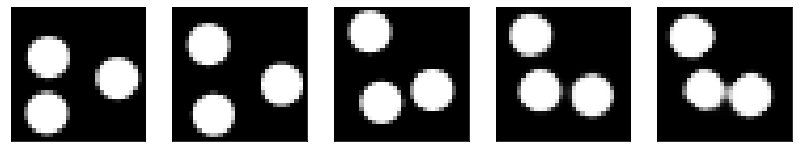

GD iterations:
i=0 | err=51.270496
i=1 | err=50.156525
i=2 | err=48.620258
i=3 | err=46.928169
i=4 | err=45.156509
i=5 | err=43.224335
i=6 | err=41.217499
i=7 | err=39.136673
i=8 | err=37.103558
i=9 | err=35.021061
i=10 | err=33.021633
i=11 | err=31.017923
i=12 | err=28.969662
i=13 | err=26.965357
i=14 | err=24.986107
i=15 | err=23.063728
i=16 | err=21.229462
i=17 | err=19.543280
i=18 | err=18.002502
i=19 | err=16.544605
i=20 | err=15.153858
i=21 | err=13.852560
i=22 | err=12.595043
i=23 | err=11.399014
i=24 | err=10.292747
i=25 | err=9.267290
i=26 | err=8.279415
i=27 | err=7.358646
i=28 | err=6.538705
i=29 | err=5.801286
Epoch=271 (89%) | out_positive=0.870225 | out_negative=0.129549 | mse=0.066043


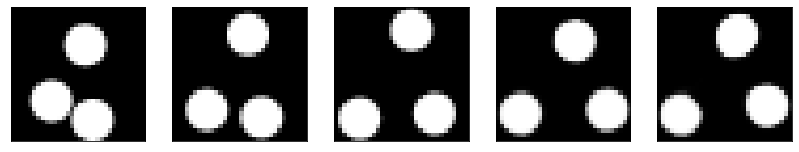

GD iterations:
i=0 | err=55.825169
i=1 | err=54.498222
i=2 | err=52.713921
i=3 | err=50.753395
i=4 | err=48.687695
i=5 | err=46.565296
i=6 | err=44.383698
i=7 | err=42.113018
i=8 | err=39.835476
i=9 | err=37.572304
i=10 | err=35.317169
i=11 | err=33.018661
i=12 | err=30.805046
i=13 | err=28.708515
i=14 | err=26.649315
i=15 | err=24.701864
i=16 | err=22.874182
i=17 | err=21.121552
i=18 | err=19.494976
i=19 | err=18.025881
i=20 | err=16.686478
i=21 | err=15.441594
i=22 | err=14.269579
i=23 | err=13.101950
i=24 | err=11.974654
i=25 | err=10.917408
i=26 | err=9.925793
i=27 | err=8.992783
i=28 | err=8.100332
i=29 | err=7.273582
Epoch=271 (90%) | out_positive=0.918643 | out_negative=0.106357 | mse=0.070940


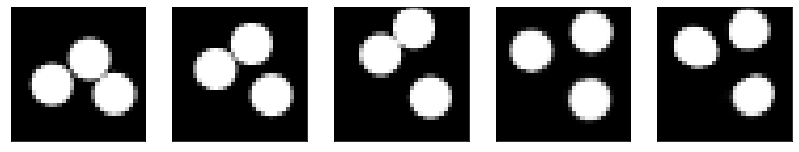

GD iterations:
i=0 | err=56.182724
i=1 | err=54.875290
i=2 | err=53.019379
i=3 | err=50.930027
i=4 | err=48.754517
i=5 | err=46.427338
i=6 | err=43.976414
i=7 | err=41.460018
i=8 | err=38.889816
i=9 | err=36.376900
i=10 | err=33.862892
i=11 | err=31.521839
i=12 | err=29.298983
i=13 | err=27.242821
i=14 | err=25.327578
i=15 | err=23.513668
i=16 | err=21.701633
i=17 | err=19.994602
i=18 | err=18.450527
i=19 | err=17.067020
i=20 | err=15.784545
i=21 | err=14.603903
i=22 | err=13.504764
i=23 | err=12.452247
i=24 | err=11.411944
i=25 | err=10.451637
i=26 | err=9.550675
i=27 | err=8.703930
i=28 | err=7.915443
i=29 | err=7.190901
Epoch=271 (92%) | out_positive=0.829704 | out_negative=0.079597 | mse=0.070573


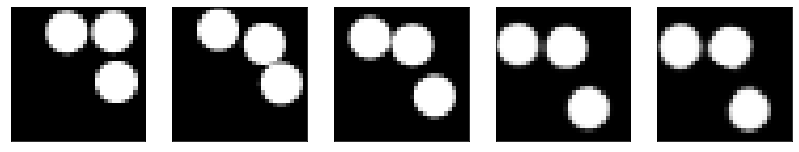

GD iterations:
i=0 | err=58.885315
i=1 | err=57.563618
i=2 | err=55.708942
i=3 | err=53.677067
i=4 | err=51.452034
i=5 | err=49.068233
i=6 | err=46.532940
i=7 | err=43.952652
i=8 | err=41.360893
i=9 | err=38.766907
i=10 | err=36.161934
i=11 | err=33.609863
i=12 | err=31.209087
i=13 | err=28.966829
i=14 | err=26.736900
i=15 | err=24.635038
i=16 | err=22.697727
i=17 | err=20.946569
i=18 | err=19.283331
i=19 | err=17.732718
i=20 | err=16.269798
i=21 | err=14.895105
i=22 | err=13.670542
i=23 | err=12.524216
i=24 | err=11.471518
i=25 | err=10.474485
i=26 | err=9.537380
i=27 | err=8.598801
i=28 | err=7.719940
i=29 | err=6.902023
Epoch=271 (94%) | out_positive=0.829749 | out_negative=0.157165 | mse=0.069912


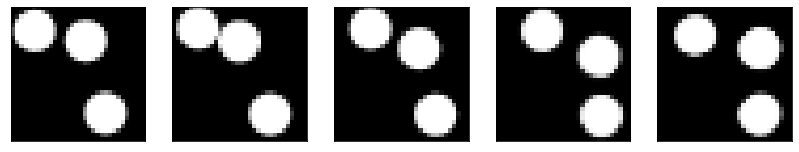

GD iterations:
i=0 | err=54.332657
i=1 | err=52.973759
i=2 | err=51.122551
i=3 | err=49.109955
i=4 | err=47.036591
i=5 | err=44.832424
i=6 | err=42.558098
i=7 | err=40.200405
i=8 | err=37.884075
i=9 | err=35.516357
i=10 | err=33.222622
i=11 | err=30.939486
i=12 | err=28.791096
i=13 | err=26.699291
i=14 | err=24.703720
i=15 | err=22.750870
i=16 | err=20.882074
i=17 | err=19.173195
i=18 | err=17.633694
i=19 | err=16.225903
i=20 | err=14.918487
i=21 | err=13.718941
i=22 | err=12.592595
i=23 | err=11.548489
i=24 | err=10.575708
i=25 | err=9.676083
i=26 | err=8.842289
i=27 | err=8.042227
i=28 | err=7.265633
i=29 | err=6.506443
Epoch=271 (96%) | out_positive=0.910349 | out_negative=0.127597 | mse=0.070006


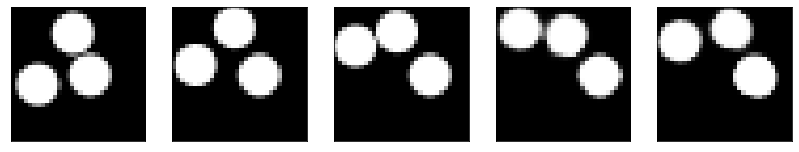

GD iterations:
i=0 | err=54.786797
i=1 | err=53.491959
i=2 | err=51.679798
i=3 | err=49.694202
i=4 | err=47.665085
i=5 | err=45.566093
i=6 | err=43.431553
i=7 | err=41.173561
i=8 | err=38.922661
i=9 | err=36.695374
i=10 | err=34.569504
i=11 | err=32.436226
i=12 | err=30.238750
i=13 | err=28.150913
i=14 | err=26.171041
i=15 | err=24.344627
i=16 | err=22.622746
i=17 | err=20.975914
i=18 | err=19.472288
i=19 | err=18.067745
i=20 | err=16.708544
i=21 | err=15.414157
i=22 | err=14.164457
i=23 | err=13.002344
i=24 | err=11.944793
i=25 | err=10.968662
i=26 | err=10.041370
i=27 | err=9.128156
i=28 | err=8.264055
i=29 | err=7.428389
Epoch=271 (98%) | out_positive=0.874240 | out_negative=0.114026 | mse=0.068673


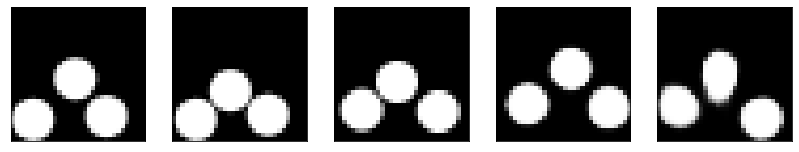

GD iterations:
i=0 | err=56.486382
i=1 | err=55.124596
i=2 | err=53.295708
i=3 | err=51.210667
i=4 | err=48.978374
i=5 | err=46.748081
i=6 | err=44.404358
i=7 | err=42.031212
i=8 | err=39.696201
i=9 | err=37.341103
i=10 | err=34.986069
i=11 | err=32.597641
i=12 | err=30.347481
i=13 | err=28.110079
i=14 | err=26.002922
i=15 | err=24.049768
i=16 | err=22.190411
i=17 | err=20.347862
i=18 | err=18.586250
i=19 | err=16.946766
i=20 | err=15.524765
i=21 | err=14.242389
i=22 | err=13.106037
i=23 | err=12.026861
i=24 | err=11.046181
i=25 | err=10.136992
i=26 | err=9.282290
i=27 | err=8.464043
i=28 | err=7.703769
i=29 | err=6.966429
Epoch=271 (100%) | out_positive=0.864152 | out_negative=0.107253 | mse=0.074255


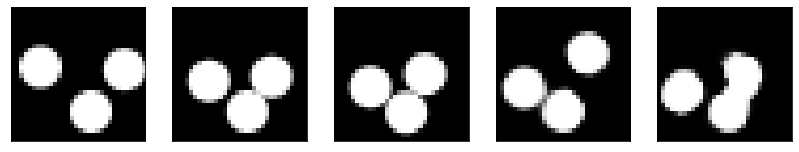

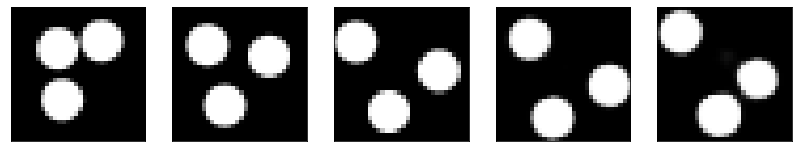

Test MSE 0.078447


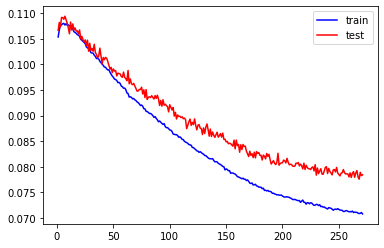

GD iterations:
i=0 | err=56.858524
i=1 | err=55.573040
i=2 | err=53.814529
i=3 | err=51.921356
i=4 | err=49.934448
i=5 | err=47.941467
i=6 | err=45.796925
i=7 | err=43.472343
i=8 | err=40.948250
i=9 | err=38.470966
i=10 | err=36.007965
i=11 | err=33.647682
i=12 | err=31.418636
i=13 | err=29.339191
i=14 | err=27.325718
i=15 | err=25.444012
i=16 | err=23.694275
i=17 | err=22.074305
i=18 | err=20.510328
i=19 | err=19.007671
i=20 | err=17.597097
i=21 | err=16.252228
i=22 | err=14.991775
i=23 | err=13.787628
i=24 | err=12.662253
i=25 | err=11.638409
i=26 | err=10.653017
i=27 | err=9.692074
i=28 | err=8.769746
i=29 | err=7.887424
Epoch=272 (0%) | out_positive=0.909958 | out_negative=0.111565 | mse=0.073542


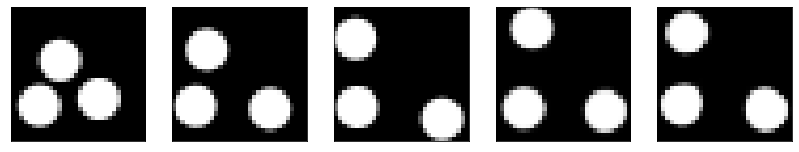

GD iterations:
i=0 | err=57.682350
i=1 | err=56.394028
i=2 | err=54.553013
i=3 | err=52.589043
i=4 | err=50.497269
i=5 | err=48.368553
i=6 | err=46.144291
i=7 | err=43.812901
i=8 | err=41.510323
i=9 | err=39.146446
i=10 | err=36.774254
i=11 | err=34.437263
i=12 | err=32.166840
i=13 | err=29.971495
i=14 | err=27.820040
i=15 | err=25.790283
i=16 | err=23.855259
i=17 | err=22.094280
i=18 | err=20.443966
i=19 | err=18.877441
i=20 | err=17.372993
i=21 | err=15.957230
i=22 | err=14.643470
i=23 | err=13.430386
i=24 | err=12.290953
i=25 | err=11.244945
i=26 | err=10.245566
i=27 | err=9.283871
i=28 | err=8.413093
i=29 | err=7.612231
Epoch=272 (2%) | out_positive=0.824203 | out_negative=0.108586 | mse=0.070446


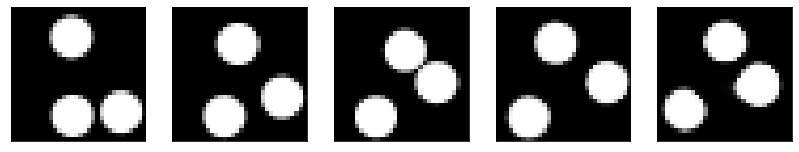

GD iterations:
i=0 | err=53.838913
i=1 | err=52.597366
i=2 | err=50.935421
i=3 | err=49.137085
i=4 | err=47.201912
i=5 | err=45.136566
i=6 | err=42.996410
i=7 | err=40.867935
i=8 | err=38.622543
i=9 | err=36.360893
i=10 | err=34.066437
i=11 | err=31.840332
i=12 | err=29.677305
i=13 | err=27.594561
i=14 | err=25.557154
i=15 | err=23.583912
i=16 | err=21.778645
i=17 | err=20.111565
i=18 | err=18.605225
i=19 | err=17.186470
i=20 | err=15.879850
i=21 | err=14.641436
i=22 | err=13.532656
i=23 | err=12.488178
i=24 | err=11.503607
i=25 | err=10.561542
i=26 | err=9.666984
i=27 | err=8.839103
i=28 | err=8.063039
i=29 | err=7.326795
Epoch=272 (4%) | out_positive=0.905878 | out_negative=0.093713 | mse=0.077184


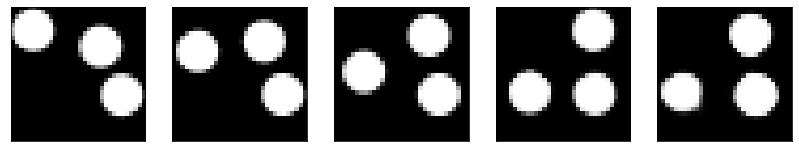

GD iterations:
i=0 | err=54.211212
i=1 | err=52.996868
i=2 | err=51.278976
i=3 | err=49.334618
i=4 | err=47.260647
i=5 | err=45.025497
i=6 | err=42.707619
i=7 | err=40.358906
i=8 | err=37.988968
i=9 | err=35.695309
i=10 | err=33.368885
i=11 | err=31.132317
i=12 | err=28.976509
i=13 | err=26.964874
i=14 | err=25.065042
i=15 | err=23.297779
i=16 | err=21.562992
i=17 | err=20.012434
i=18 | err=18.510792
i=19 | err=17.138754
i=20 | err=15.876498
i=21 | err=14.721458
i=22 | err=13.589173
i=23 | err=12.522663
i=24 | err=11.518562
i=25 | err=10.603897
i=26 | err=9.739202
i=27 | err=8.903633
i=28 | err=8.082725
i=29 | err=7.310616
Epoch=272 (6%) | out_positive=0.881762 | out_negative=0.133976 | mse=0.067617


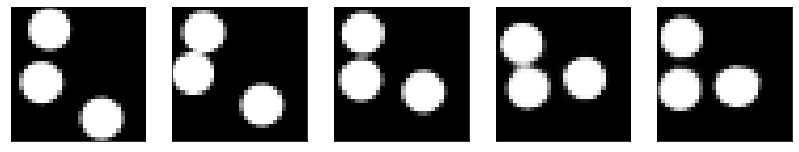

GD iterations:
i=0 | err=56.252167
i=1 | err=55.018051
i=2 | err=53.287636
i=3 | err=51.222153
i=4 | err=49.028240
i=5 | err=46.904915
i=6 | err=44.720345
i=7 | err=42.511959
i=8 | err=40.248466
i=9 | err=37.971867
i=10 | err=35.744057
i=11 | err=33.548946
i=12 | err=31.334604
i=13 | err=29.192564
i=14 | err=27.098156
i=15 | err=25.029202
i=16 | err=23.068314
i=17 | err=21.153862
i=18 | err=19.398283
i=19 | err=17.740002
i=20 | err=16.187641
i=21 | err=14.714775
i=22 | err=13.334792
i=23 | err=12.110678
i=24 | err=11.008370
i=25 | err=9.987223
i=26 | err=9.007586
i=27 | err=8.087556
i=28 | err=7.243650
i=29 | err=6.449561
Epoch=272 (8%) | out_positive=0.878505 | out_negative=0.169996 | mse=0.067473


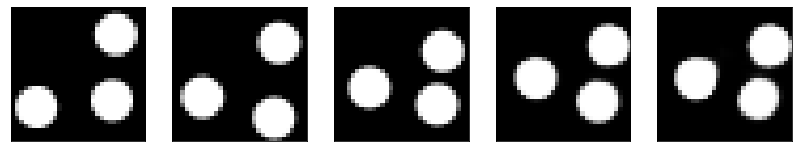

GD iterations:
i=0 | err=55.668835
i=1 | err=54.300713
i=2 | err=52.442657
i=3 | err=50.427940
i=4 | err=48.231430
i=5 | err=46.029495
i=6 | err=43.723450
i=7 | err=41.355713
i=8 | err=38.962276
i=9 | err=36.548103
i=10 | err=34.182522
i=11 | err=31.844810
i=12 | err=29.550697
i=13 | err=27.282698
i=14 | err=25.119459
i=15 | err=23.126337
i=16 | err=21.325123
i=17 | err=19.724747
i=18 | err=18.229340
i=19 | err=16.796017
i=20 | err=15.492208
i=21 | err=14.235569
i=22 | err=13.095083
i=23 | err=12.017769
i=24 | err=11.014621
i=25 | err=10.061809
i=26 | err=9.153687
i=27 | err=8.300225
i=28 | err=7.488593
i=29 | err=6.706836
Epoch=272 (9%) | out_positive=0.910466 | out_negative=0.143940 | mse=0.070383


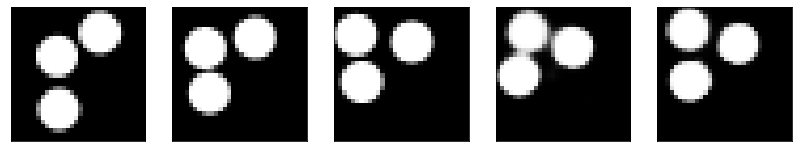

GD iterations:
i=0 | err=55.505913
i=1 | err=54.190575
i=2 | err=52.367363
i=3 | err=50.340508
i=4 | err=48.242393
i=5 | err=46.163010
i=6 | err=43.985580
i=7 | err=41.673870
i=8 | err=39.318436
i=9 | err=36.930534
i=10 | err=34.610748
i=11 | err=32.325634
i=12 | err=30.070412
i=13 | err=27.893778
i=14 | err=25.762951
i=15 | err=23.743702
i=16 | err=21.854805
i=17 | err=20.119741
i=18 | err=18.517506
i=19 | err=17.061962
i=20 | err=15.771205
i=21 | err=14.544872
i=22 | err=13.397947
i=23 | err=12.346590
i=24 | err=11.363436
i=25 | err=10.451243
i=26 | err=9.559349
i=27 | err=8.724058
i=28 | err=7.913909
i=29 | err=7.174077
Epoch=272 (11%) | out_positive=0.867185 | out_negative=0.105343 | mse=0.068849


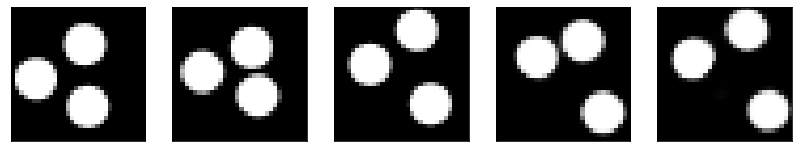

GD iterations:
i=0 | err=58.604927
i=1 | err=57.379936
i=2 | err=55.618877
i=3 | err=53.640205
i=4 | err=51.491802
i=5 | err=49.152611
i=6 | err=46.713562
i=7 | err=44.224113
i=8 | err=41.655415
i=9 | err=39.165871
i=10 | err=36.759525
i=11 | err=34.419701
i=12 | err=32.104332
i=13 | err=29.823114
i=14 | err=27.657337
i=15 | err=25.554920
i=16 | err=23.492403
i=17 | err=21.577198
i=18 | err=19.745060
i=19 | err=18.050941
i=20 | err=16.541283
i=21 | err=15.225492
i=22 | err=13.998796
i=23 | err=12.796798
i=24 | err=11.641854
i=25 | err=10.544703
i=26 | err=9.496395
i=27 | err=8.525857
i=28 | err=7.600221
i=29 | err=6.742085
Epoch=272 (13%) | out_positive=0.813692 | out_negative=0.107366 | mse=0.069111


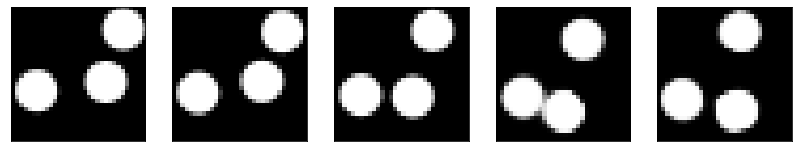

GD iterations:
i=0 | err=55.594551
i=1 | err=54.293518
i=2 | err=52.440369
i=3 | err=50.357265
i=4 | err=48.166046
i=5 | err=45.891556
i=6 | err=43.609905
i=7 | err=41.310524
i=8 | err=38.929844
i=9 | err=36.529560
i=10 | err=34.123291
i=11 | err=31.728046
i=12 | err=29.456902
i=13 | err=27.290844
i=14 | err=25.217913
i=15 | err=23.241364
i=16 | err=21.431759
i=17 | err=19.754927
i=18 | err=18.226368
i=19 | err=16.832851
i=20 | err=15.481110
i=21 | err=14.199380
i=22 | err=12.985336
i=23 | err=11.848813
i=24 | err=10.792980
i=25 | err=9.809954
i=26 | err=8.874466
i=27 | err=7.987365
i=28 | err=7.170999
i=29 | err=6.372435
Epoch=272 (15%) | out_positive=0.878274 | out_negative=0.149332 | mse=0.066510


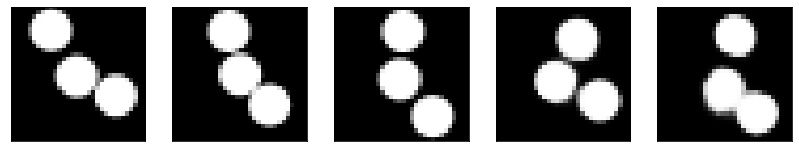

GD iterations:
i=0 | err=55.064320
i=1 | err=53.870262
i=2 | err=52.141411
i=3 | err=50.171597
i=4 | err=48.109093
i=5 | err=45.909019
i=6 | err=43.620792
i=7 | err=41.356926
i=8 | err=39.065132
i=9 | err=36.828148
i=10 | err=34.615540
i=11 | err=32.472164
i=12 | err=30.333555
i=13 | err=28.269117
i=14 | err=26.251320
i=15 | err=24.300358
i=16 | err=22.402725
i=17 | err=20.620979
i=18 | err=18.982035
i=19 | err=17.466059
i=20 | err=16.023916
i=21 | err=14.675584
i=22 | err=13.366564
i=23 | err=12.089329
i=24 | err=10.919369
i=25 | err=9.783766
i=26 | err=8.747100
i=27 | err=7.796474
i=28 | err=6.899923
i=29 | err=6.099140
Epoch=272 (17%) | out_positive=0.875705 | out_negative=0.134140 | mse=0.068414


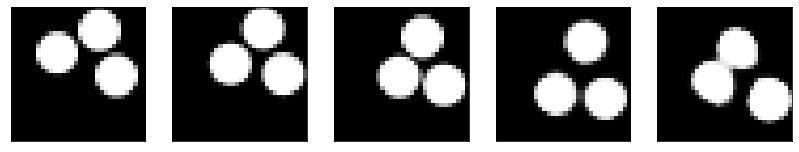

GD iterations:
i=0 | err=56.765991
i=1 | err=55.427635
i=2 | err=53.655922
i=3 | err=51.680420
i=4 | err=49.533241
i=5 | err=47.339600
i=6 | err=45.050613
i=7 | err=42.693470
i=8 | err=40.280533
i=9 | err=37.860641
i=10 | err=35.439644
i=11 | err=33.136562
i=12 | err=30.908693
i=13 | err=28.771688
i=14 | err=26.653358
i=15 | err=24.678890
i=16 | err=22.766266
i=17 | err=20.992746
i=18 | err=19.329498
i=19 | err=17.774504
i=20 | err=16.304020
i=21 | err=14.957338
i=22 | err=13.793604
i=23 | err=12.712700
i=24 | err=11.742777
i=25 | err=10.798772
i=26 | err=9.912219
i=27 | err=9.061314
i=28 | err=8.249096
i=29 | err=7.477660
Epoch=272 (18%) | out_positive=0.788712 | out_negative=0.096321 | mse=0.071465


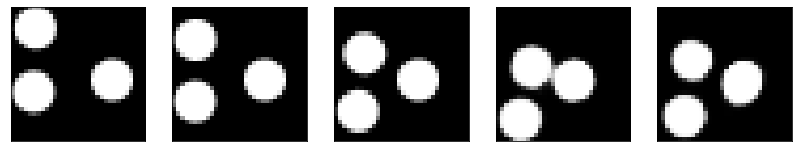

GD iterations:
i=0 | err=51.442680
i=1 | err=50.087326
i=2 | err=48.305672
i=3 | err=46.344906
i=4 | err=44.362656
i=5 | err=42.319077
i=6 | err=40.248169
i=7 | err=38.158348
i=8 | err=36.044476
i=9 | err=33.952652
i=10 | err=31.816942
i=11 | err=29.681168
i=12 | err=27.641193
i=13 | err=25.677891
i=14 | err=23.830013
i=15 | err=22.168301
i=16 | err=20.596502
i=17 | err=19.107735
i=18 | err=17.695324
i=19 | err=16.378376
i=20 | err=15.177980
i=21 | err=14.057544
i=22 | err=12.959686
i=23 | err=11.923711
i=24 | err=10.956092
i=25 | err=10.043352
i=26 | err=9.185923
i=27 | err=8.366005
i=28 | err=7.584731
i=29 | err=6.840009
Epoch=272 (20%) | out_positive=0.902853 | out_negative=0.092607 | mse=0.070262


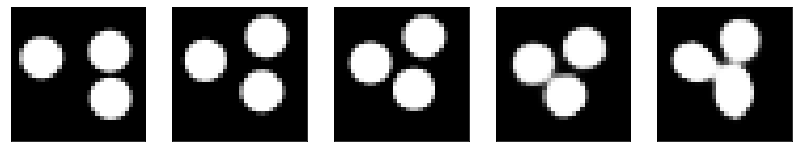

GD iterations:
i=0 | err=50.619301
i=1 | err=49.375175
i=2 | err=47.693840
i=3 | err=45.796738
i=4 | err=43.834553
i=5 | err=41.849548
i=6 | err=39.786560
i=7 | err=37.668388
i=8 | err=35.457806
i=9 | err=33.294537
i=10 | err=31.124374
i=11 | err=28.955265
i=12 | err=26.859833
i=13 | err=24.907307
i=14 | err=23.064932
i=15 | err=21.373676
i=16 | err=19.811787
i=17 | err=18.384611
i=18 | err=17.012329
i=19 | err=15.749405
i=20 | err=14.559584
i=21 | err=13.432676
i=22 | err=12.366930
i=23 | err=11.340128
i=24 | err=10.349272
i=25 | err=9.384577
i=26 | err=8.408650
i=27 | err=7.477574
i=28 | err=6.624873
i=29 | err=5.856019
Epoch=272 (22%) | out_positive=0.875813 | out_negative=0.145044 | mse=0.062722


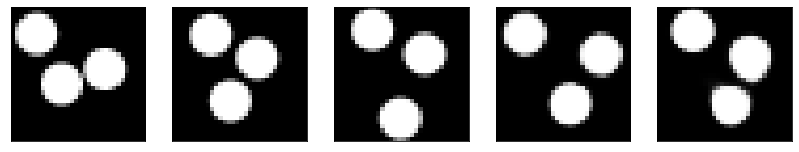

GD iterations:
i=0 | err=55.536446
i=1 | err=54.212414
i=2 | err=52.391647
i=3 | err=50.365234
i=4 | err=48.186287
i=5 | err=45.813709
i=6 | err=43.415970
i=7 | err=40.979652
i=8 | err=38.504196
i=9 | err=36.024361
i=10 | err=33.661915
i=11 | err=31.358335
i=12 | err=29.157001
i=13 | err=27.093475
i=14 | err=25.073534
i=15 | err=23.099888
i=16 | err=21.260721
i=17 | err=19.504189
i=18 | err=17.875179
i=19 | err=16.331846
i=20 | err=14.884753
i=21 | err=13.522144
i=22 | err=12.262744
i=23 | err=11.146053
i=24 | err=10.128716
i=25 | err=9.160316
i=26 | err=8.276171
i=27 | err=7.440868
i=28 | err=6.635077
i=29 | err=5.876039
Epoch=272 (24%) | out_positive=0.876838 | out_negative=0.145062 | mse=0.069400


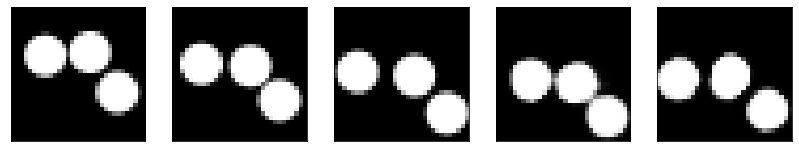

GD iterations:
i=0 | err=54.895523
i=1 | err=53.698048
i=2 | err=51.991901
i=3 | err=50.124573
i=4 | err=48.225327
i=5 | err=46.242863
i=6 | err=44.229591
i=7 | err=42.136429
i=8 | err=39.995422
i=9 | err=37.826698
i=10 | err=35.688782
i=11 | err=33.587097
i=12 | err=31.507854
i=13 | err=29.501810
i=14 | err=27.506437
i=15 | err=25.618279
i=16 | err=23.819365
i=17 | err=22.160194
i=18 | err=20.606823
i=19 | err=19.079063
i=20 | err=17.620127
i=21 | err=16.258919
i=22 | err=14.962398
i=23 | err=13.720981
i=24 | err=12.555904
i=25 | err=11.501660
i=26 | err=10.509775
i=27 | err=9.609329
i=28 | err=8.791546
i=29 | err=8.013657
Epoch=272 (26%) | out_positive=0.821397 | out_negative=0.087970 | mse=0.067226


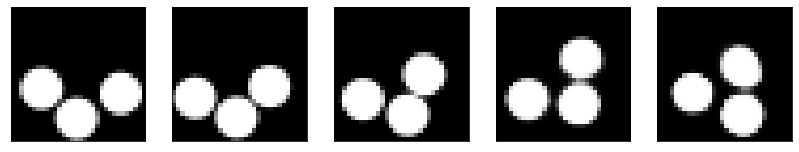

GD iterations:
i=0 | err=52.483475
i=1 | err=51.199997
i=2 | err=49.366726
i=3 | err=47.335823
i=4 | err=45.178802
i=5 | err=42.987564
i=6 | err=40.789116
i=7 | err=38.592392
i=8 | err=36.481796
i=9 | err=34.347832
i=10 | err=32.191788
i=11 | err=30.144226
i=12 | err=28.194338
i=13 | err=26.287422
i=14 | err=24.419767
i=15 | err=22.615543
i=16 | err=20.927532
i=17 | err=19.295469
i=18 | err=17.791718
i=19 | err=16.396441
i=20 | err=15.071844
i=21 | err=13.882086
i=22 | err=12.763854
i=23 | err=11.748703
i=24 | err=10.815142
i=25 | err=9.912542
i=26 | err=9.057074
i=27 | err=8.232608
i=28 | err=7.461390
i=29 | err=6.741572
Epoch=272 (28%) | out_positive=0.849885 | out_negative=0.151329 | mse=0.071782


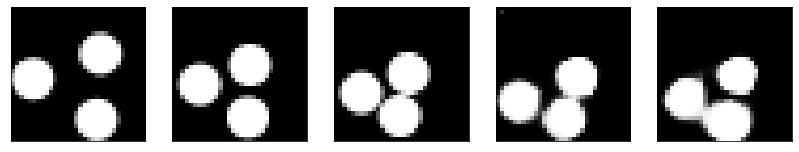

GD iterations:
i=0 | err=53.890789
i=1 | err=52.646576
i=2 | err=50.857285
i=3 | err=48.954956
i=4 | err=46.978722
i=5 | err=44.906754
i=6 | err=42.771057
i=7 | err=40.612492
i=8 | err=38.402267
i=9 | err=36.268421
i=10 | err=34.052662
i=11 | err=31.914394
i=12 | err=29.887280
i=13 | err=27.906446
i=14 | err=26.016769
i=15 | err=24.267143
i=16 | err=22.600229
i=17 | err=21.036060
i=18 | err=19.506340
i=19 | err=18.058029
i=20 | err=16.656216
i=21 | err=15.268877
i=22 | err=13.973333
i=23 | err=12.767979
i=24 | err=11.627918
i=25 | err=10.554635
i=26 | err=9.595896
i=27 | err=8.701174
i=28 | err=7.894057
i=29 | err=7.114196
Epoch=272 (30%) | out_positive=0.877662 | out_negative=0.127833 | mse=0.068352


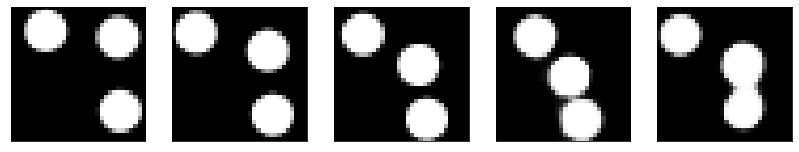

GD iterations:
i=0 | err=54.485817
i=1 | err=53.104759
i=2 | err=51.264549
i=3 | err=49.169052
i=4 | err=46.984879
i=5 | err=44.708237
i=6 | err=42.478638
i=7 | err=40.182922
i=8 | err=37.845528
i=9 | err=35.482956
i=10 | err=33.120609
i=11 | err=30.962917
i=12 | err=28.861115
i=13 | err=26.851557
i=14 | err=24.883057
i=15 | err=22.972269
i=16 | err=21.242153
i=17 | err=19.576038
i=18 | err=17.929255
i=19 | err=16.488852
i=20 | err=15.103681
i=21 | err=13.873142
i=22 | err=12.670877
i=23 | err=11.499508
i=24 | err=10.420330
i=25 | err=9.390023
i=26 | err=8.431978
i=27 | err=7.541817
i=28 | err=6.737702
i=29 | err=6.003673
Epoch=272 (31%) | out_positive=0.911115 | out_negative=0.143575 | mse=0.063611


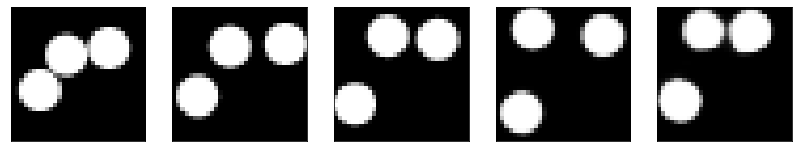

GD iterations:
i=0 | err=53.213516
i=1 | err=52.072170
i=2 | err=50.564285
i=3 | err=48.851421
i=4 | err=47.100845
i=5 | err=45.232868
i=6 | err=43.300163
i=7 | err=41.297729
i=8 | err=39.245335
i=9 | err=37.165070
i=10 | err=34.952396
i=11 | err=32.738693
i=12 | err=30.541336
i=13 | err=28.355955
i=14 | err=26.295057
i=15 | err=24.381592
i=16 | err=22.616575
i=17 | err=20.877729
i=18 | err=19.262421
i=19 | err=17.722153
i=20 | err=16.229805
i=21 | err=14.848545
i=22 | err=13.598206
i=23 | err=12.450940
i=24 | err=11.341152
i=25 | err=10.317160
i=26 | err=9.357834
i=27 | err=8.469568
i=28 | err=7.654423
i=29 | err=6.867039
Epoch=272 (33%) | out_positive=0.887680 | out_negative=0.165811 | mse=0.065910


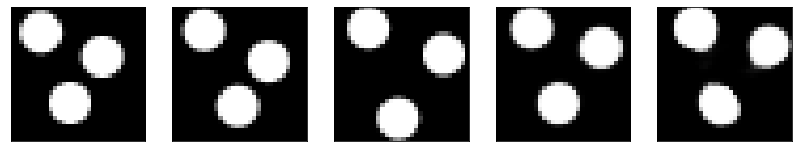

GD iterations:
i=0 | err=53.255535
i=1 | err=52.014297
i=2 | err=50.329689
i=3 | err=48.502453
i=4 | err=46.581520
i=5 | err=44.558830
i=6 | err=42.463249
i=7 | err=40.272839
i=8 | err=38.037388
i=9 | err=35.731010
i=10 | err=33.439705
i=11 | err=31.215858
i=12 | err=29.122776
i=13 | err=27.013041
i=14 | err=25.015274
i=15 | err=23.077145
i=16 | err=21.306719
i=17 | err=19.658405
i=18 | err=18.170364
i=19 | err=16.768097
i=20 | err=15.463846
i=21 | err=14.222906
i=22 | err=13.030783
i=23 | err=11.964260
i=24 | err=10.991051
i=25 | err=10.071085
i=26 | err=9.246857
i=27 | err=8.470363
i=28 | err=7.727286
i=29 | err=6.986964
Epoch=272 (35%) | out_positive=0.813155 | out_negative=0.099457 | mse=0.067426


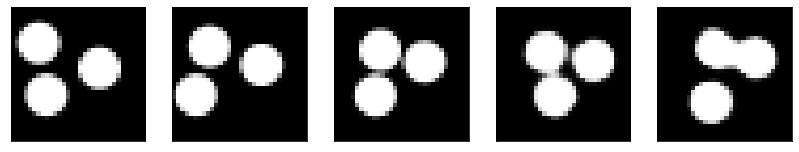

GD iterations:
i=0 | err=55.542126
i=1 | err=54.271194
i=2 | err=52.594009
i=3 | err=50.719292
i=4 | err=48.720490
i=5 | err=46.605553
i=6 | err=44.407860
i=7 | err=42.245628
i=8 | err=40.050407
i=9 | err=37.892223
i=10 | err=35.646240
i=11 | err=33.366226
i=12 | err=31.051746
i=13 | err=28.892643
i=14 | err=26.832638
i=15 | err=24.889984
i=16 | err=22.988718
i=17 | err=21.175638
i=18 | err=19.456453
i=19 | err=17.815239
i=20 | err=16.294317
i=21 | err=14.890011
i=22 | err=13.593588
i=23 | err=12.353195
i=24 | err=11.202834
i=25 | err=10.144782
i=26 | err=9.191120
i=27 | err=8.302784
i=28 | err=7.451162
i=29 | err=6.640407
Epoch=272 (37%) | out_positive=0.847448 | out_negative=0.127735 | mse=0.070024


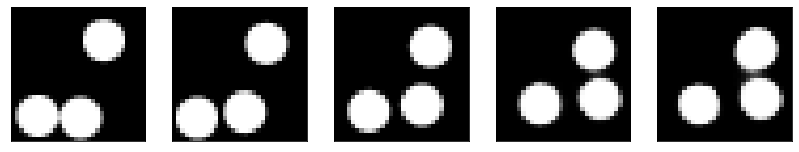

GD iterations:
i=0 | err=55.177284
i=1 | err=53.844860
i=2 | err=52.049717
i=3 | err=50.097805
i=4 | err=48.085407
i=5 | err=46.019772
i=6 | err=43.847321
i=7 | err=41.618389
i=8 | err=39.297806
i=9 | err=36.901726
i=10 | err=34.492916
i=11 | err=32.166008
i=12 | err=29.989965
i=13 | err=27.950741
i=14 | err=26.011887
i=15 | err=24.152397
i=16 | err=22.383400
i=17 | err=20.678055
i=18 | err=19.074347
i=19 | err=17.568636
i=20 | err=16.134426
i=21 | err=14.813719
i=22 | err=13.582811
i=23 | err=12.490631
i=24 | err=11.479961
i=25 | err=10.550146
i=26 | err=9.685053
i=27 | err=8.853054
i=28 | err=8.089185
i=29 | err=7.346317
Epoch=272 (39%) | out_positive=0.874397 | out_negative=0.132731 | mse=0.067407


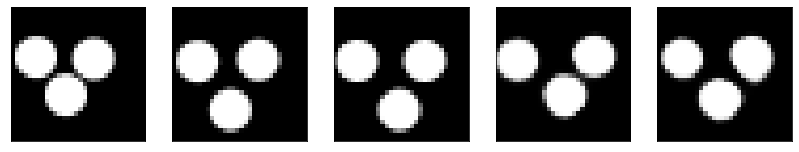

GD iterations:
i=0 | err=57.142761
i=1 | err=55.835464
i=2 | err=54.137711
i=3 | err=52.091232
i=4 | err=49.913612
i=5 | err=47.692966
i=6 | err=45.450420
i=7 | err=43.213013
i=8 | err=40.903648
i=9 | err=38.517082
i=10 | err=36.097610
i=11 | err=33.628448
i=12 | err=31.175247
i=13 | err=28.810299
i=14 | err=26.553923
i=15 | err=24.425158
i=16 | err=22.420610
i=17 | err=20.557957
i=18 | err=18.786905
i=19 | err=17.096390
i=20 | err=15.480234
i=21 | err=14.028652
i=22 | err=12.676264
i=23 | err=11.496065
i=24 | err=10.407232
i=25 | err=9.392317
i=26 | err=8.472065
i=27 | err=7.595455
i=28 | err=6.758702
i=29 | err=5.970525
Epoch=272 (40%) | out_positive=0.892993 | out_negative=0.156874 | mse=0.067988


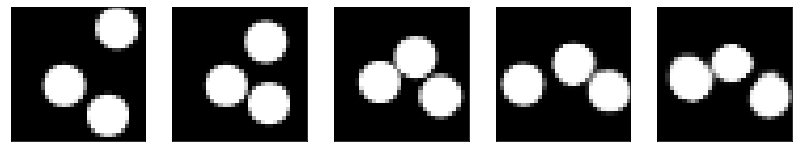

GD iterations:
i=0 | err=56.834496
i=1 | err=55.531361
i=2 | err=53.721443
i=3 | err=51.704079
i=4 | err=49.558296
i=5 | err=47.208481
i=6 | err=44.862984
i=7 | err=42.528267
i=8 | err=40.165779
i=9 | err=37.768929
i=10 | err=35.355583
i=11 | err=32.981667
i=12 | err=30.664852
i=13 | err=28.447020
i=14 | err=26.291237
i=15 | err=24.299236
i=16 | err=22.385223
i=17 | err=20.640772
i=18 | err=19.051743
i=19 | err=17.649139
i=20 | err=16.352819
i=21 | err=15.160034
i=22 | err=14.033785
i=23 | err=12.909037
i=24 | err=11.866116
i=25 | err=10.882813
i=26 | err=9.956030
i=27 | err=9.076298
i=28 | err=8.238209
i=29 | err=7.468121
Epoch=272 (42%) | out_positive=0.846075 | out_negative=0.091567 | mse=0.072654


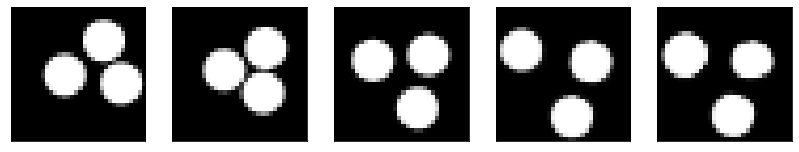

GD iterations:
i=0 | err=53.361221
i=1 | err=52.108849
i=2 | err=50.393372
i=3 | err=48.523010
i=4 | err=46.582146
i=5 | err=44.550385
i=6 | err=42.460918
i=7 | err=40.260109
i=8 | err=38.002213
i=9 | err=35.710930
i=10 | err=33.480270
i=11 | err=31.281956
i=12 | err=29.191074
i=13 | err=27.233969
i=14 | err=25.329609
i=15 | err=23.589441
i=16 | err=21.989685
i=17 | err=20.533226
i=18 | err=19.159578
i=19 | err=17.857275
i=20 | err=16.598131
i=21 | err=15.383315
i=22 | err=14.209395
i=23 | err=13.094110
i=24 | err=12.049993
i=25 | err=11.113508
i=26 | err=10.255211
i=27 | err=9.415379
i=28 | err=8.610844
i=29 | err=7.829997
Epoch=272 (44%) | out_positive=0.906302 | out_negative=0.091722 | mse=0.074952


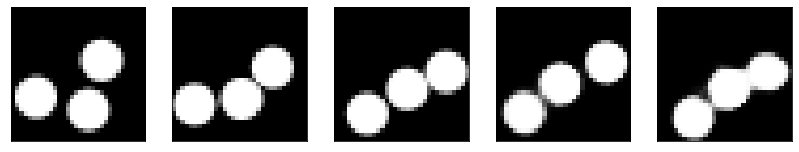

GD iterations:
i=0 | err=53.841743
i=1 | err=52.628483
i=2 | err=51.003860
i=3 | err=49.233551
i=4 | err=47.377720
i=5 | err=45.425938
i=6 | err=43.443611
i=7 | err=41.350037
i=8 | err=39.149395
i=9 | err=36.789856
i=10 | err=34.425201
i=11 | err=32.066109
i=12 | err=29.748426
i=13 | err=27.487953
i=14 | err=25.315628
i=15 | err=23.273319
i=16 | err=21.302010
i=17 | err=19.500479
i=18 | err=17.813908
i=19 | err=16.238628
i=20 | err=14.804997
i=21 | err=13.450647
i=22 | err=12.263130
i=23 | err=11.154355
i=24 | err=10.170198
i=25 | err=9.239811
i=26 | err=8.321836
i=27 | err=7.464055
i=28 | err=6.674469
i=29 | err=5.931309
Epoch=272 (46%) | out_positive=0.888873 | out_negative=0.145730 | mse=0.070310


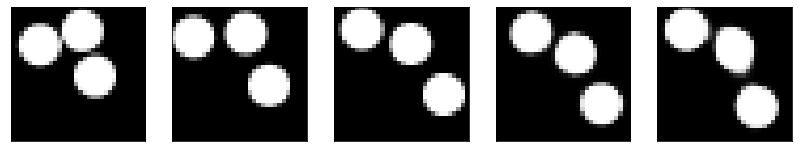

GD iterations:
i=0 | err=57.628075
i=1 | err=56.397926
i=2 | err=54.635937
i=3 | err=52.606640
i=4 | err=50.323673
i=5 | err=47.872215
i=6 | err=45.361404
i=7 | err=42.808285
i=8 | err=40.289257
i=9 | err=37.747334
i=10 | err=35.206276
i=11 | err=32.791862
i=12 | err=30.542006
i=13 | err=28.380245
i=14 | err=26.356867
i=15 | err=24.482838
i=16 | err=22.667675
i=17 | err=20.964417
i=18 | err=19.351421
i=19 | err=17.858944
i=20 | err=16.486040
i=21 | err=15.235138
i=22 | err=14.061274
i=23 | err=12.977381
i=24 | err=12.034853
i=25 | err=11.156349
i=26 | err=10.326132
i=27 | err=9.525879
i=28 | err=8.797629
i=29 | err=8.060017
Epoch=272 (48%) | out_positive=0.859223 | out_negative=0.074229 | mse=0.073185


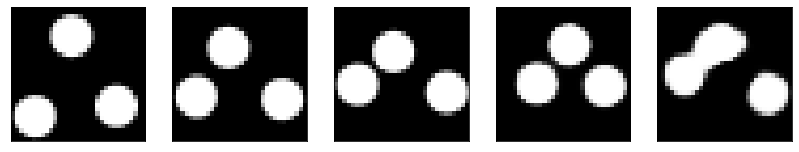

GD iterations:
i=0 | err=56.697445
i=1 | err=55.444763
i=2 | err=53.709221
i=3 | err=51.741676
i=4 | err=49.671066
i=5 | err=47.552788
i=6 | err=45.283310
i=7 | err=42.934845
i=8 | err=40.480099
i=9 | err=38.091057
i=10 | err=35.769379
i=11 | err=33.461647
i=12 | err=31.188656
i=13 | err=28.901558
i=14 | err=26.849495
i=15 | err=24.855665
i=16 | err=22.954967
i=17 | err=21.186749
i=18 | err=19.585903
i=19 | err=18.065714
i=20 | err=16.673187
i=21 | err=15.400064
i=22 | err=14.203598
i=23 | err=13.095326
i=24 | err=12.007727
i=25 | err=11.016564
i=26 | err=10.037377
i=27 | err=9.113382
i=28 | err=8.244236
i=29 | err=7.427630
Epoch=272 (50%) | out_positive=0.804788 | out_negative=0.123317 | mse=0.066692


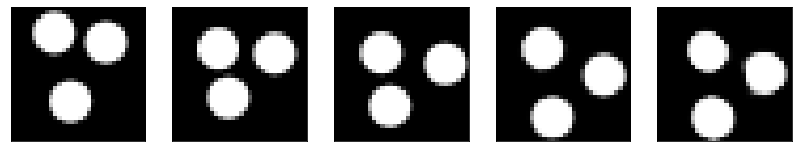

GD iterations:
i=0 | err=53.573101
i=1 | err=52.331528
i=2 | err=50.585060
i=3 | err=48.529060
i=4 | err=46.386452
i=5 | err=44.208832
i=6 | err=41.859222
i=7 | err=39.465931
i=8 | err=37.171600
i=9 | err=34.927860
i=10 | err=32.724461
i=11 | err=30.583706
i=12 | err=28.540600
i=13 | err=26.624363
i=14 | err=24.771084
i=15 | err=22.985607
i=16 | err=21.198235
i=17 | err=19.534199
i=18 | err=18.032820
i=19 | err=16.684292
i=20 | err=15.397031
i=21 | err=14.175421
i=22 | err=13.027957
i=23 | err=11.925243
i=24 | err=10.886691
i=25 | err=9.934607
i=26 | err=9.045388
i=27 | err=8.239170
i=28 | err=7.475180
i=29 | err=6.758993
Epoch=272 (52%) | out_positive=0.871881 | out_negative=0.092112 | mse=0.071732


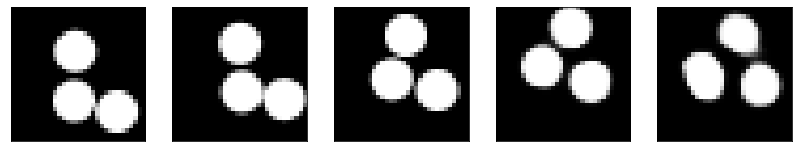

GD iterations:
i=0 | err=55.885696
i=1 | err=54.617371
i=2 | err=52.827957
i=3 | err=50.809616
i=4 | err=48.675407
i=5 | err=46.500496
i=6 | err=44.248619
i=7 | err=41.980431
i=8 | err=39.649158
i=9 | err=37.268311
i=10 | err=34.931667
i=11 | err=32.592072
i=12 | err=30.339943
i=13 | err=28.201668
i=14 | err=26.219305
i=15 | err=24.409286
i=16 | err=22.761162
i=17 | err=21.187439
i=18 | err=19.712490
i=19 | err=18.343107
i=20 | err=17.039299
i=21 | err=15.830633
i=22 | err=14.687539
i=23 | err=13.607044
i=24 | err=12.569052
i=25 | err=11.571026
i=26 | err=10.616480
i=27 | err=9.717713
i=28 | err=8.901375
i=29 | err=8.114709
Epoch=272 (53%) | out_positive=0.874616 | out_negative=0.062112 | mse=0.072423


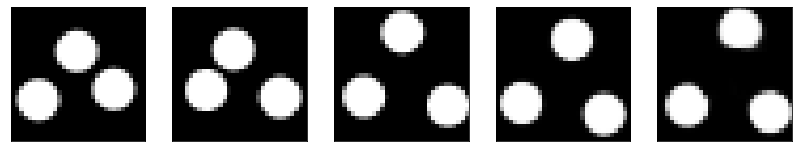

GD iterations:
i=0 | err=55.716248
i=1 | err=54.554356
i=2 | err=52.891266
i=3 | err=51.058456
i=4 | err=49.000916
i=5 | err=46.888691
i=6 | err=44.683270
i=7 | err=42.393559
i=8 | err=40.089317
i=9 | err=37.822643
i=10 | err=35.523899
i=11 | err=33.255524
i=12 | err=31.006340
i=13 | err=28.887989
i=14 | err=26.835808
i=15 | err=24.787781
i=16 | err=22.932039
i=17 | err=21.171062
i=18 | err=19.529613
i=19 | err=18.029402
i=20 | err=16.659475
i=21 | err=15.372498
i=22 | err=14.175114
i=23 | err=13.059349
i=24 | err=12.009199
i=25 | err=11.043863
i=26 | err=10.132951
i=27 | err=9.241812
i=28 | err=8.399661
i=29 | err=7.577045
Epoch=272 (55%) | out_positive=0.899540 | out_negative=0.105704 | mse=0.076802


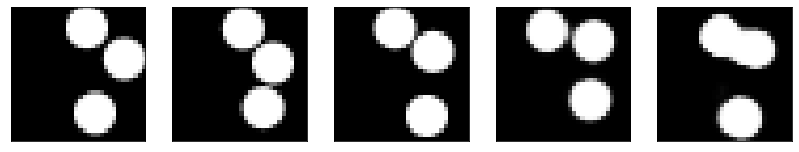

GD iterations:
i=0 | err=53.836185
i=1 | err=52.458435
i=2 | err=50.590084
i=3 | err=48.576851
i=4 | err=46.420532
i=5 | err=44.193939
i=6 | err=41.916214
i=7 | err=39.614311
i=8 | err=37.149124
i=9 | err=34.732082
i=10 | err=32.207954
i=11 | err=29.860285
i=12 | err=27.590820
i=13 | err=25.475492
i=14 | err=23.455477
i=15 | err=21.532986
i=16 | err=19.761417
i=17 | err=18.115240
i=18 | err=16.591820
i=19 | err=15.156558
i=20 | err=13.822711
i=21 | err=12.613425
i=22 | err=11.487524
i=23 | err=10.444175
i=24 | err=9.494056
i=25 | err=8.621704
i=26 | err=7.835177
i=27 | err=7.088393
i=28 | err=6.355561
i=29 | err=5.657273
Epoch=272 (57%) | out_positive=0.912934 | out_negative=0.164526 | mse=0.064953


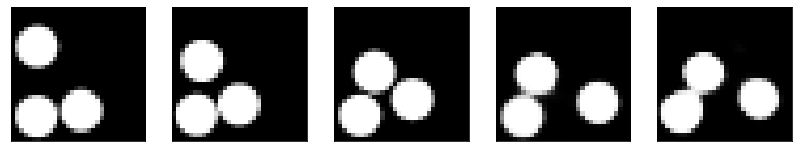

GD iterations:
i=0 | err=60.853466
i=1 | err=59.446053
i=2 | err=57.481293
i=3 | err=55.362259
i=4 | err=53.108089
i=5 | err=50.754974
i=6 | err=48.279613
i=7 | err=45.768608
i=8 | err=43.185383
i=9 | err=40.527008
i=10 | err=37.932175
i=11 | err=35.323997
i=12 | err=32.851784
i=13 | err=30.545235
i=14 | err=28.436005
i=15 | err=26.414961
i=16 | err=24.557526
i=17 | err=22.855911
i=18 | err=21.161263
i=19 | err=19.577003
i=20 | err=18.045834
i=21 | err=16.581909
i=22 | err=15.252700
i=23 | err=14.012096
i=24 | err=12.876867
i=25 | err=11.768206
i=26 | err=10.737818
i=27 | err=9.815765
i=28 | err=9.001257
i=29 | err=8.240108
Epoch=272 (59%) | out_positive=0.820926 | out_negative=0.121789 | mse=0.074961


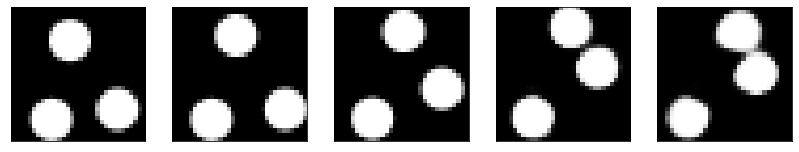

GD iterations:
i=0 | err=53.789513
i=1 | err=52.660881
i=2 | err=51.093498
i=3 | err=49.367336
i=4 | err=47.547886
i=5 | err=45.531303
i=6 | err=43.416153
i=7 | err=41.129333
i=8 | err=38.745796
i=9 | err=36.364090
i=10 | err=34.007019
i=11 | err=31.752794
i=12 | err=29.587845
i=13 | err=27.525791
i=14 | err=25.486673
i=15 | err=23.554058
i=16 | err=21.668182
i=17 | err=19.809900
i=18 | err=18.095480
i=19 | err=16.486778
i=20 | err=15.048035
i=21 | err=13.691038
i=22 | err=12.452438
i=23 | err=11.315175
i=24 | err=10.203615
i=25 | err=9.178333
i=26 | err=8.256042
i=27 | err=7.427341
i=28 | err=6.653794
i=29 | err=5.929461
Epoch=272 (61%) | out_positive=0.922835 | out_negative=0.181071 | mse=0.070534


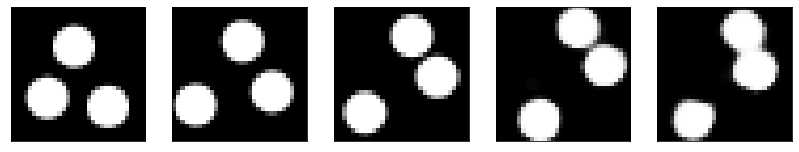

GD iterations:
i=0 | err=55.332596
i=1 | err=53.959618
i=2 | err=52.049290
i=3 | err=49.949203
i=4 | err=47.786526
i=5 | err=45.584969
i=6 | err=43.321194
i=7 | err=41.040558
i=8 | err=38.720245
i=9 | err=36.422733
i=10 | err=34.103436
i=11 | err=31.775200
i=12 | err=29.499397
i=13 | err=27.318392
i=14 | err=25.223392
i=15 | err=23.235008
i=16 | err=21.393921
i=17 | err=19.630024
i=18 | err=17.994360
i=19 | err=16.547482
i=20 | err=15.261557
i=21 | err=14.120050
i=22 | err=13.052475
i=23 | err=12.027748
i=24 | err=11.032961
i=25 | err=10.089369
i=26 | err=9.207339
i=27 | err=8.356815
i=28 | err=7.529745
i=29 | err=6.706199
Epoch=272 (62%) | out_positive=0.846609 | out_negative=0.111011 | mse=0.066542


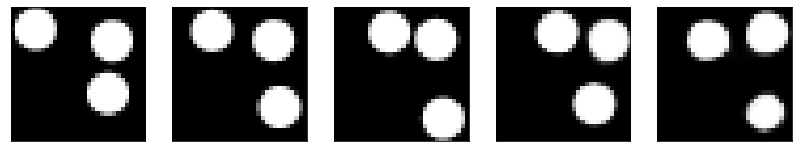

GD iterations:
i=0 | err=54.516804
i=1 | err=53.240665
i=2 | err=51.527786
i=3 | err=49.578529
i=4 | err=47.523705
i=5 | err=45.348503
i=6 | err=43.097755
i=7 | err=40.850574
i=8 | err=38.644753
i=9 | err=36.336330
i=10 | err=34.021008
i=11 | err=31.697840
i=12 | err=29.440739
i=13 | err=27.272854
i=14 | err=25.174877
i=15 | err=23.163937
i=16 | err=21.314823
i=17 | err=19.602604
i=18 | err=17.933270
i=19 | err=16.432570
i=20 | err=15.016589
i=21 | err=13.701125
i=22 | err=12.460533
i=23 | err=11.312732
i=24 | err=10.247000
i=25 | err=9.254767
i=26 | err=8.344301
i=27 | err=7.500575
i=28 | err=6.710254
i=29 | err=5.955130
Epoch=272 (64%) | out_positive=0.923247 | out_negative=0.156326 | mse=0.071270


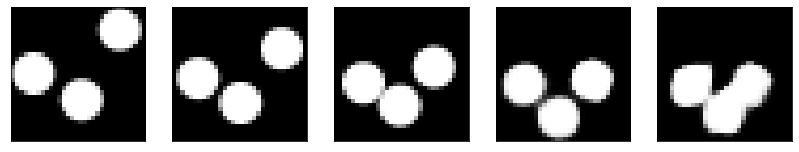

GD iterations:
i=0 | err=53.805473
i=1 | err=52.550713
i=2 | err=50.829597
i=3 | err=48.834049
i=4 | err=46.768974
i=5 | err=44.633041
i=6 | err=42.508270
i=7 | err=40.313759
i=8 | err=38.002499
i=9 | err=35.788723
i=10 | err=33.458603
i=11 | err=31.214334
i=12 | err=28.956076
i=13 | err=26.848557
i=14 | err=24.911005
i=15 | err=23.103416
i=16 | err=21.391422
i=17 | err=19.766624
i=18 | err=18.178331
i=19 | err=16.717539
i=20 | err=15.415344
i=21 | err=14.208260
i=22 | err=13.112288
i=23 | err=12.081413
i=24 | err=11.098709
i=25 | err=10.199927
i=26 | err=9.337780
i=27 | err=8.515210
i=28 | err=7.713542
i=29 | err=6.937977
Epoch=272 (66%) | out_positive=0.911141 | out_negative=0.134460 | mse=0.072571


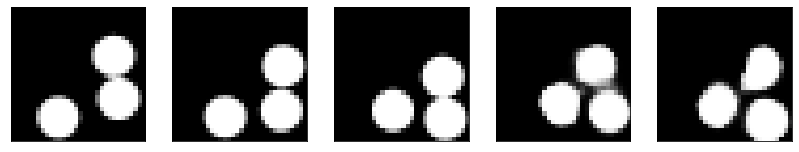

GD iterations:
i=0 | err=55.337307
i=1 | err=54.057365
i=2 | err=52.295815
i=3 | err=50.376572
i=4 | err=48.270630
i=5 | err=46.069820
i=6 | err=43.799885
i=7 | err=41.547260
i=8 | err=39.415073
i=9 | err=37.297638
i=10 | err=35.192070
i=11 | err=32.994781
i=12 | err=30.757801
i=13 | err=28.574600
i=14 | err=26.433308
i=15 | err=24.410141
i=16 | err=22.485855
i=17 | err=20.688761
i=18 | err=18.969332
i=19 | err=17.369030
i=20 | err=15.903161
i=21 | err=14.576645
i=22 | err=13.358594
i=23 | err=12.225561
i=24 | err=11.196427
i=25 | err=10.254890
i=26 | err=9.339769
i=27 | err=8.475303
i=28 | err=7.660848
i=29 | err=6.895801
Epoch=272 (68%) | out_positive=0.923389 | out_negative=0.142106 | mse=0.076019


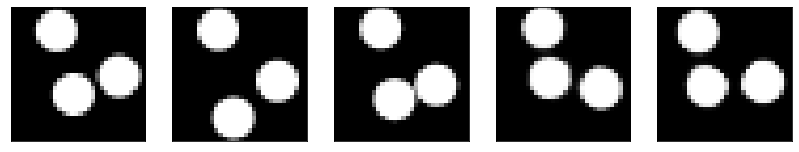

GD iterations:
i=0 | err=53.791870
i=1 | err=52.596878
i=2 | err=50.970119
i=3 | err=49.179489
i=4 | err=47.366455
i=5 | err=45.502426
i=6 | err=43.514915
i=7 | err=41.508049
i=8 | err=39.369968
i=9 | err=37.175560
i=10 | err=35.007404
i=11 | err=32.833458
i=12 | err=30.642143
i=13 | err=28.541790
i=14 | err=26.557190
i=15 | err=24.627861
i=16 | err=22.761433
i=17 | err=20.916666
i=18 | err=19.121162
i=19 | err=17.457411
i=20 | err=15.926553
i=21 | err=14.604587
i=22 | err=13.371274
i=23 | err=12.268452
i=24 | err=11.206484
i=25 | err=10.192204
i=26 | err=9.242020
i=27 | err=8.324247
i=28 | err=7.470630
i=29 | err=6.684446
Epoch=272 (70%) | out_positive=0.892690 | out_negative=0.152498 | mse=0.074742


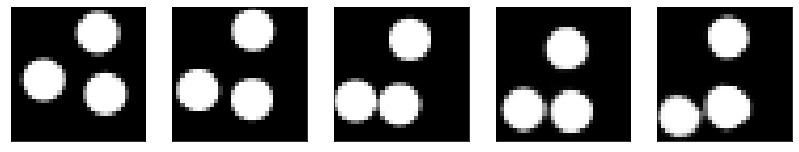

GD iterations:
i=0 | err=55.410309
i=1 | err=54.047829
i=2 | err=52.175911
i=3 | err=50.179729
i=4 | err=48.037506
i=5 | err=45.900383
i=6 | err=43.677975
i=7 | err=41.448906
i=8 | err=39.145382
i=9 | err=36.811050
i=10 | err=34.457100
i=11 | err=32.128426
i=12 | err=29.903189
i=13 | err=27.698236
i=14 | err=25.549959
i=15 | err=23.479815
i=16 | err=21.538460
i=17 | err=19.812716
i=18 | err=18.209787
i=19 | err=16.752487
i=20 | err=15.449328
i=21 | err=14.301432
i=22 | err=13.218523
i=23 | err=12.183302
i=24 | err=11.206522
i=25 | err=10.305586
i=26 | err=9.468129
i=27 | err=8.642281
i=28 | err=7.875817
i=29 | err=7.147356
Epoch=272 (72%) | out_positive=0.864697 | out_negative=0.087615 | mse=0.068868


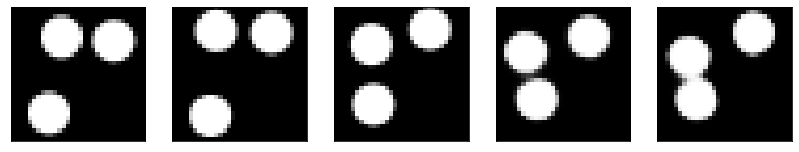

GD iterations:
i=0 | err=54.805084
i=1 | err=53.576630
i=2 | err=51.934525
i=3 | err=49.980968
i=4 | err=47.927589
i=5 | err=45.873596
i=6 | err=43.721188
i=7 | err=41.613556
i=8 | err=39.466331
i=9 | err=37.214485
i=10 | err=34.979088
i=11 | err=32.838333
i=12 | err=30.700569
i=13 | err=28.539156
i=14 | err=26.478188
i=15 | err=24.471710
i=16 | err=22.530945
i=17 | err=20.698324
i=18 | err=18.957937
i=19 | err=17.412943
i=20 | err=15.990403
i=21 | err=14.666923
i=22 | err=13.424156
i=23 | err=12.259852
i=24 | err=11.191218
i=25 | err=10.173056
i=26 | err=9.249868
i=27 | err=8.377678
i=28 | err=7.558591
i=29 | err=6.769000
Epoch=272 (74%) | out_positive=0.896857 | out_negative=0.095696 | mse=0.075359


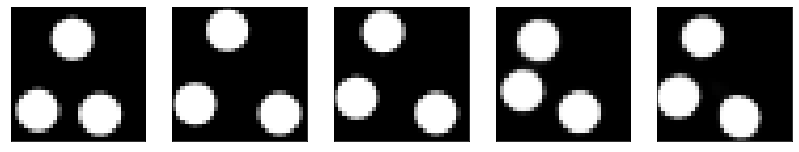

GD iterations:
i=0 | err=56.224701
i=1 | err=54.897224
i=2 | err=53.110645
i=3 | err=51.153797
i=4 | err=49.018536
i=5 | err=46.729149
i=6 | err=44.345566
i=7 | err=41.844994
i=8 | err=39.397335
i=9 | err=37.022888
i=10 | err=34.627453
i=11 | err=32.329945
i=12 | err=30.013540
i=13 | err=27.788229
i=14 | err=25.644962
i=15 | err=23.547493
i=16 | err=21.582357
i=17 | err=19.690002
i=18 | err=18.007196
i=19 | err=16.464336
i=20 | err=15.080302
i=21 | err=13.793649
i=22 | err=12.619235
i=23 | err=11.581619
i=24 | err=10.607577
i=25 | err=9.684479
i=26 | err=8.784050
i=27 | err=7.951888
i=28 | err=7.172822
i=29 | err=6.425400
Epoch=272 (75%) | out_positive=0.895669 | out_negative=0.164556 | mse=0.064548


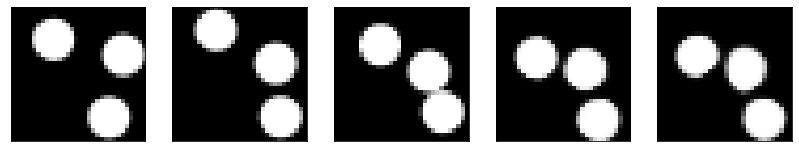

GD iterations:
i=0 | err=57.469173
i=1 | err=56.204823
i=2 | err=54.411583
i=3 | err=52.372421
i=4 | err=50.183544
i=5 | err=47.917816
i=6 | err=45.560650
i=7 | err=43.030663
i=8 | err=40.415146
i=9 | err=37.816086
i=10 | err=35.218300
i=11 | err=32.582935
i=12 | err=30.020988
i=13 | err=27.598356
i=14 | err=25.304163
i=15 | err=23.183243
i=16 | err=21.270700
i=17 | err=19.525799
i=18 | err=17.922983
i=19 | err=16.475372
i=20 | err=15.134068
i=21 | err=13.882872
i=22 | err=12.705904
i=23 | err=11.623291
i=24 | err=10.642248
i=25 | err=9.696716
i=26 | err=8.827521
i=27 | err=8.001154
i=28 | err=7.215553
i=29 | err=6.463312
Epoch=272 (77%) | out_positive=0.844028 | out_negative=0.136661 | mse=0.067378


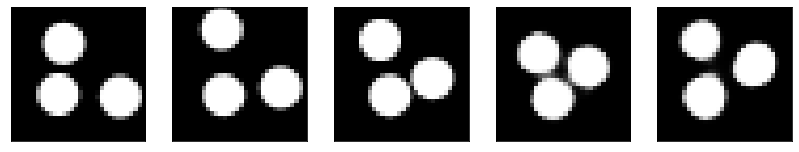

GD iterations:
i=0 | err=54.308319
i=1 | err=53.072910
i=2 | err=51.266335
i=3 | err=49.225525
i=4 | err=47.185001
i=5 | err=45.043427
i=6 | err=42.847733
i=7 | err=40.572861
i=8 | err=38.220940
i=9 | err=35.892448
i=10 | err=33.584152
i=11 | err=31.355251
i=12 | err=29.127640
i=13 | err=26.982107
i=14 | err=24.923336
i=15 | err=22.995468
i=16 | err=21.196274
i=17 | err=19.549461
i=18 | err=18.087141
i=19 | err=16.770191
i=20 | err=15.485670
i=21 | err=14.272499
i=22 | err=13.156981
i=23 | err=12.068729
i=24 | err=11.062712
i=25 | err=10.102781
i=26 | err=9.241023
i=27 | err=8.423123
i=28 | err=7.621459
i=29 | err=6.845265
Epoch=272 (79%) | out_positive=0.908036 | out_negative=0.128122 | mse=0.073890


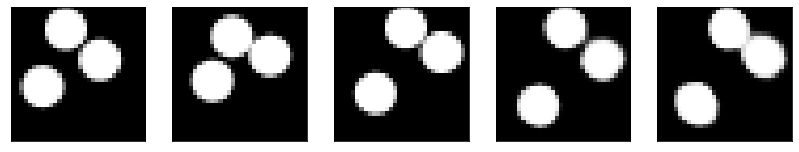

GD iterations:
i=0 | err=53.159218
i=1 | err=51.906811
i=2 | err=50.145271
i=3 | err=48.164154
i=4 | err=46.122513
i=5 | err=44.056934
i=6 | err=41.891720
i=7 | err=39.777641
i=8 | err=37.694588
i=9 | err=35.617775
i=10 | err=33.536919
i=11 | err=31.561491
i=12 | err=29.607933
i=13 | err=27.729820
i=14 | err=26.041328
i=15 | err=24.476221
i=16 | err=22.982811
i=17 | err=21.477295
i=18 | err=20.008202
i=19 | err=18.577972
i=20 | err=17.202084
i=21 | err=15.884170
i=22 | err=14.628178
i=23 | err=13.472517
i=24 | err=12.378110
i=25 | err=11.338102
i=26 | err=10.343159
i=27 | err=9.433982
i=28 | err=8.578173
i=29 | err=7.784670
Epoch=272 (81%) | out_positive=0.896275 | out_negative=0.081403 | mse=0.072635


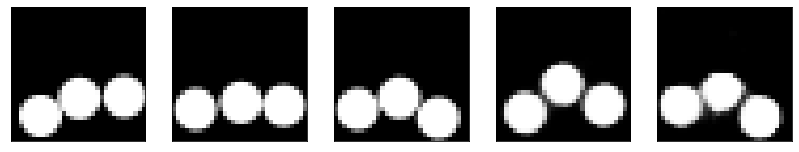

GD iterations:
i=0 | err=55.435905
i=1 | err=54.205986
i=2 | err=52.510323
i=3 | err=50.588707
i=4 | err=48.461472
i=5 | err=46.293816
i=6 | err=44.065262
i=7 | err=41.842300
i=8 | err=39.637943
i=9 | err=37.324707
i=10 | err=35.029736
i=11 | err=32.759155
i=12 | err=30.546555
i=13 | err=28.359398
i=14 | err=26.242287
i=15 | err=24.206785
i=16 | err=22.271717
i=17 | err=20.427725
i=18 | err=18.708891
i=19 | err=17.127031
i=20 | err=15.632551
i=21 | err=14.217299
i=22 | err=12.899354
i=23 | err=11.669317
i=24 | err=10.572945
i=25 | err=9.528180
i=26 | err=8.580910
i=27 | err=7.736117
i=28 | err=6.958863
i=29 | err=6.229199
Epoch=272 (83%) | out_positive=0.848229 | out_negative=0.123650 | mse=0.074497


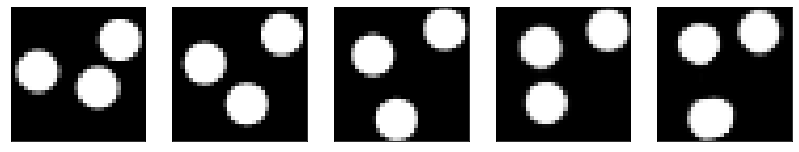

GD iterations:
i=0 | err=57.029083
i=1 | err=55.727085
i=2 | err=53.895584
i=3 | err=51.874252
i=4 | err=49.793175
i=5 | err=47.566299
i=6 | err=45.212929
i=7 | err=42.736423
i=8 | err=40.236053
i=9 | err=37.700478
i=10 | err=35.168320
i=11 | err=32.698296
i=12 | err=30.296839
i=13 | err=27.982048
i=14 | err=25.807770
i=15 | err=23.775906
i=16 | err=21.923038
i=17 | err=20.225979
i=18 | err=18.611961
i=19 | err=17.145271
i=20 | err=15.809258
i=21 | err=14.546101
i=22 | err=13.394320
i=23 | err=12.362615
i=24 | err=11.359209
i=25 | err=10.428391
i=26 | err=9.524780
i=27 | err=8.672742
i=28 | err=7.847393
i=29 | err=7.066345
Epoch=272 (85%) | out_positive=0.895122 | out_negative=0.110021 | mse=0.078738


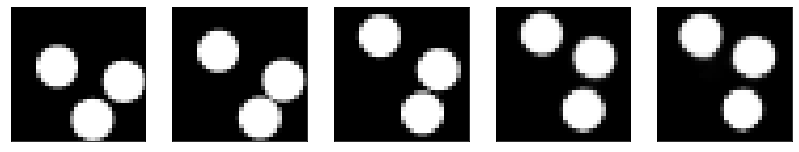

GD iterations:
i=0 | err=57.418217
i=1 | err=56.072891
i=2 | err=54.163540
i=3 | err=51.899178
i=4 | err=49.543449
i=5 | err=47.066067
i=6 | err=44.618668
i=7 | err=42.200531
i=8 | err=39.819672
i=9 | err=37.407196
i=10 | err=34.945572
i=11 | err=32.465214
i=12 | err=30.159760
i=13 | err=27.981995
i=14 | err=25.862831
i=15 | err=23.814785
i=16 | err=21.884985
i=17 | err=20.055750
i=18 | err=18.362404
i=19 | err=16.782188
i=20 | err=15.350244
i=21 | err=13.950645
i=22 | err=12.646727
i=23 | err=11.428389
i=24 | err=10.341639
i=25 | err=9.314265
i=26 | err=8.328966
i=27 | err=7.391581
i=28 | err=6.503139
i=29 | err=5.697154
Epoch=272 (87%) | out_positive=0.864949 | out_negative=0.199747 | mse=0.069964


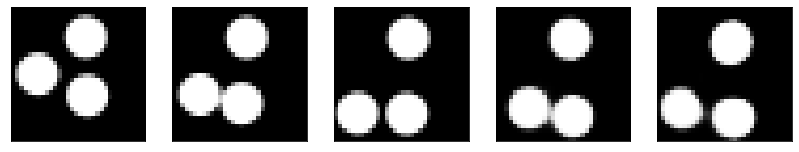

GD iterations:
i=0 | err=56.814938
i=1 | err=55.486191
i=2 | err=53.621025
i=3 | err=51.563526
i=4 | err=49.283844
i=5 | err=46.910133
i=6 | err=44.479591
i=7 | err=42.017651
i=8 | err=39.559006
i=9 | err=37.179150
i=10 | err=34.780018
i=11 | err=32.296322
i=12 | err=29.794014
i=13 | err=27.453690
i=14 | err=25.270445
i=15 | err=23.265594
i=16 | err=21.503073
i=17 | err=19.914627
i=18 | err=18.500828
i=19 | err=17.184814
i=20 | err=15.942966
i=21 | err=14.768224
i=22 | err=13.660854
i=23 | err=12.642113
i=24 | err=11.632866
i=25 | err=10.693246
i=26 | err=9.809776
i=27 | err=8.945219
i=28 | err=8.082462
i=29 | err=7.251999
Epoch=272 (88%) | out_positive=0.860044 | out_negative=0.125159 | mse=0.072660


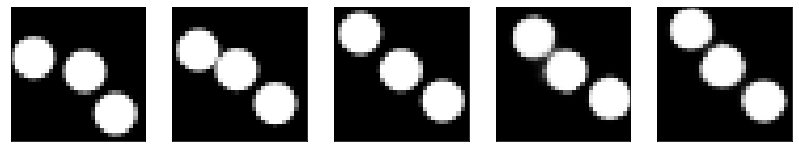

GD iterations:
i=0 | err=56.334370
i=1 | err=54.981667
i=2 | err=53.142273
i=3 | err=51.102455
i=4 | err=48.969395
i=5 | err=46.784782
i=6 | err=44.501587
i=7 | err=42.121399
i=8 | err=39.669075
i=9 | err=37.167686
i=10 | err=34.644482
i=11 | err=32.210472
i=12 | err=29.884275
i=13 | err=27.671192
i=14 | err=25.617287
i=15 | err=23.721506
i=16 | err=21.976057
i=17 | err=20.338028
i=18 | err=18.788195
i=19 | err=17.332314
i=20 | err=15.972506
i=21 | err=14.717690
i=22 | err=13.521559
i=23 | err=12.466220
i=24 | err=11.417952
i=25 | err=10.392361
i=26 | err=9.394773
i=27 | err=8.431472
i=28 | err=7.543258
i=29 | err=6.711841
Epoch=272 (90%) | out_positive=0.866794 | out_negative=0.130850 | mse=0.068661


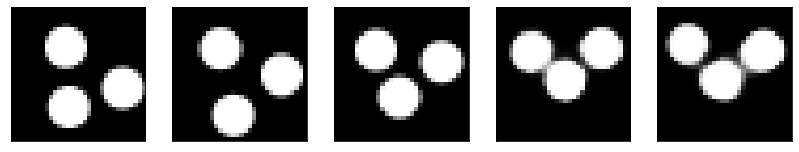

GD iterations:
i=0 | err=52.353691
i=1 | err=51.047657
i=2 | err=49.380737
i=3 | err=47.521935
i=4 | err=45.592972
i=5 | err=43.507454
i=6 | err=41.338844
i=7 | err=39.157513
i=8 | err=37.088478
i=9 | err=35.090874
i=10 | err=32.991699
i=11 | err=30.959471
i=12 | err=28.909912
i=13 | err=26.903671
i=14 | err=24.954948
i=15 | err=23.086338
i=16 | err=21.334120
i=17 | err=19.649143
i=18 | err=18.052113
i=19 | err=16.555061
i=20 | err=15.211502
i=21 | err=13.980364
i=22 | err=12.869797
i=23 | err=11.854191
i=24 | err=10.922194
i=25 | err=10.066286
i=26 | err=9.233543
i=27 | err=8.421111
i=28 | err=7.657158
i=29 | err=6.937011
Epoch=272 (92%) | out_positive=0.871600 | out_negative=0.125506 | mse=0.067387


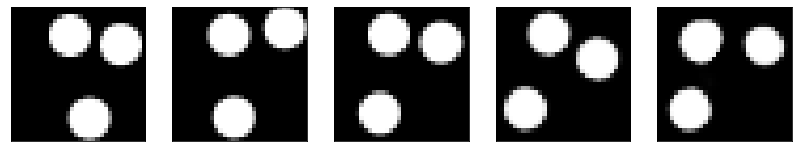

GD iterations:
i=0 | err=57.492500
i=1 | err=56.256332
i=2 | err=54.556377
i=3 | err=52.478683
i=4 | err=50.221680
i=5 | err=47.836620
i=6 | err=45.454681
i=7 | err=42.993816
i=8 | err=40.521400
i=9 | err=37.989594
i=10 | err=35.409771
i=11 | err=32.919014
i=12 | err=30.542610
i=13 | err=28.305365
i=14 | err=26.218113
i=15 | err=24.312590
i=16 | err=22.465778
i=17 | err=20.757801
i=18 | err=19.164358
i=19 | err=17.673075
i=20 | err=16.302135
i=21 | err=15.001503
i=22 | err=13.797627
i=23 | err=12.648407
i=24 | err=11.615919
i=25 | err=10.661899
i=26 | err=9.789787
i=27 | err=8.924868
i=28 | err=8.078760
i=29 | err=7.275809
Epoch=272 (94%) | out_positive=0.893717 | out_negative=0.131302 | mse=0.067807


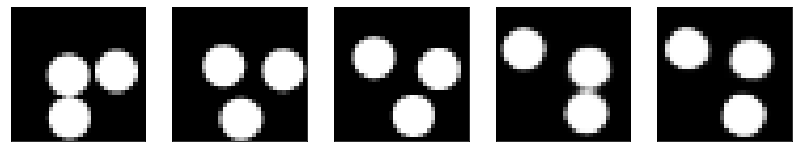

GD iterations:
i=0 | err=54.665031
i=1 | err=53.321644
i=2 | err=51.472466
i=3 | err=49.427299
i=4 | err=47.293907
i=5 | err=45.085941
i=6 | err=42.829449
i=7 | err=40.430069
i=8 | err=38.074669
i=9 | err=35.815331
i=10 | err=33.550812
i=11 | err=31.302528
i=12 | err=29.191959
i=13 | err=27.166254
i=14 | err=25.256302
i=15 | err=23.452614
i=16 | err=21.732567
i=17 | err=20.083134
i=18 | err=18.551037
i=19 | err=17.098156
i=20 | err=15.701228
i=21 | err=14.420881
i=22 | err=13.279571
i=23 | err=12.248680
i=24 | err=11.319078
i=25 | err=10.450224
i=26 | err=9.644361
i=27 | err=8.918962
i=28 | err=8.209867
i=29 | err=7.520318
Epoch=272 (96%) | out_positive=0.855516 | out_negative=0.098994 | mse=0.073282


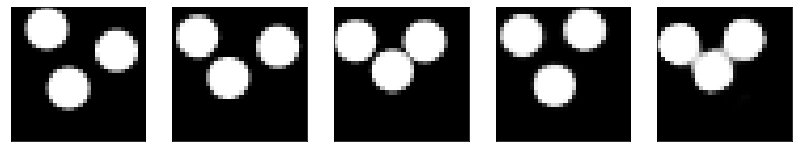

GD iterations:
i=0 | err=57.138329
i=1 | err=55.861446
i=2 | err=54.103363
i=3 | err=52.198086
i=4 | err=50.177490
i=5 | err=48.101818
i=6 | err=46.025677
i=7 | err=43.956955
i=8 | err=41.858551
i=9 | err=39.747833
i=10 | err=37.610260
i=11 | err=35.450157
i=12 | err=33.244576
i=13 | err=31.064106
i=14 | err=28.945457
i=15 | err=26.854618
i=16 | err=24.866974
i=17 | err=22.983036
i=18 | err=21.309227
i=19 | err=19.763763
i=20 | err=18.280849
i=21 | err=16.875511
i=22 | err=15.496758
i=23 | err=14.210915
i=24 | err=13.010029
i=25 | err=11.873879
i=26 | err=10.847717
i=27 | err=9.886614
i=28 | err=8.994360
i=29 | err=8.159529
Epoch=272 (98%) | out_positive=0.881242 | out_negative=0.102812 | mse=0.071857


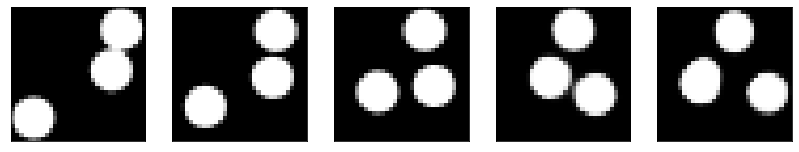

GD iterations:
i=0 | err=54.949989
i=1 | err=53.658546
i=2 | err=51.901695
i=3 | err=49.913971
i=4 | err=47.795967
i=5 | err=45.573463
i=6 | err=43.431122
i=7 | err=41.234711
i=8 | err=38.934162
i=9 | err=36.591404
i=10 | err=34.310200
i=11 | err=32.074196
i=12 | err=29.820744
i=13 | err=27.688431
i=14 | err=25.635975
i=15 | err=23.750877
i=16 | err=21.974869
i=17 | err=20.279324
i=18 | err=18.740797
i=19 | err=17.305193
i=20 | err=15.990703
i=21 | err=14.771536
i=22 | err=13.628834
i=23 | err=12.561073
i=24 | err=11.574715
i=25 | err=10.622712
i=26 | err=9.702845
i=27 | err=8.828363
i=28 | err=7.955309
i=29 | err=7.159451
Epoch=272 (99%) | out_positive=0.932032 | out_negative=0.159915 | mse=0.072732


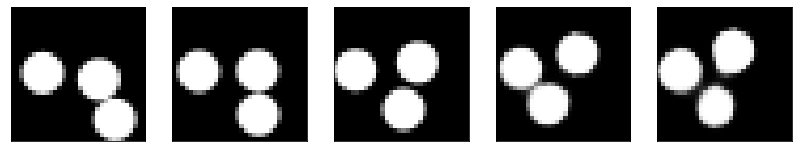

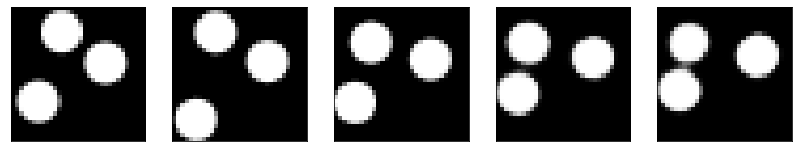

Test MSE 0.078593


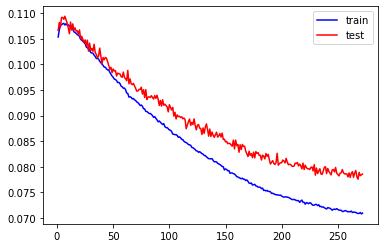

GD iterations:
i=0 | err=54.997978
i=1 | err=53.816254
i=2 | err=52.166397
i=3 | err=50.349064
i=4 | err=48.403885
i=5 | err=46.344215
i=6 | err=44.204155
i=7 | err=42.035378
i=8 | err=39.946526
i=9 | err=37.887505
i=10 | err=35.841103
i=11 | err=33.747391
i=12 | err=31.593420
i=13 | err=29.417830
i=14 | err=27.329861
i=15 | err=25.350706
i=16 | err=23.401897
i=17 | err=21.543346
i=18 | err=19.788069
i=19 | err=18.199602
i=20 | err=16.728827
i=21 | err=15.438649
i=22 | err=14.219885
i=23 | err=13.114042
i=24 | err=12.089785
i=25 | err=11.124113
i=26 | err=10.203799
i=27 | err=9.305503
i=28 | err=8.459711
i=29 | err=7.622600
Epoch=273 (0%) | out_positive=0.791727 | out_negative=0.081575 | mse=0.070071


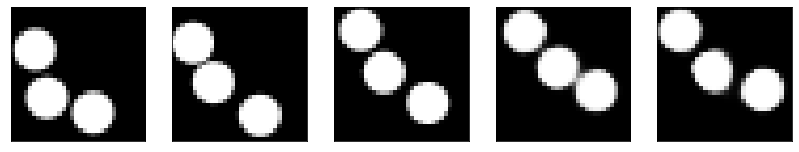

GD iterations:
i=0 | err=61.178394
i=1 | err=59.774254
i=2 | err=57.993736
i=3 | err=55.940956
i=4 | err=53.727371
i=5 | err=51.447758
i=6 | err=48.988655
i=7 | err=46.493431
i=8 | err=43.949982
i=9 | err=41.369385
i=10 | err=38.811901
i=11 | err=36.295967
i=12 | err=33.776615
i=13 | err=31.365803
i=14 | err=29.091337
i=15 | err=26.931189
i=16 | err=24.892975
i=17 | err=22.976748
i=18 | err=21.253639
i=19 | err=19.724209
i=20 | err=18.318792
i=21 | err=17.024570
i=22 | err=15.805265
i=23 | err=14.654839
i=24 | err=13.567127
i=25 | err=12.545540
i=26 | err=11.569523
i=27 | err=10.655558
i=28 | err=9.779958
i=29 | err=8.954390
Epoch=273 (2%) | out_positive=0.746995 | out_negative=0.072992 | mse=0.076019


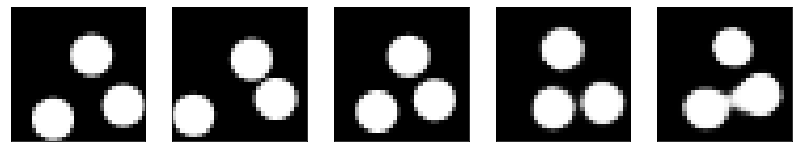

GD iterations:
i=0 | err=51.199554
i=1 | err=49.855576
i=2 | err=48.044949
i=3 | err=46.071968
i=4 | err=44.080868
i=5 | err=42.067402
i=6 | err=39.915195
i=7 | err=37.706944
i=8 | err=35.473701
i=9 | err=33.276863
i=10 | err=31.184109
i=11 | err=29.210602
i=12 | err=27.304348
i=13 | err=25.479862
i=14 | err=23.703306
i=15 | err=22.028921
i=16 | err=20.415966
i=17 | err=18.899685
i=18 | err=17.545977
i=19 | err=16.242199
i=20 | err=15.015778
i=21 | err=13.857520
i=22 | err=12.799288
i=23 | err=11.818452
i=24 | err=10.874268
i=25 | err=9.983372
i=26 | err=9.113018
i=27 | err=8.296129
i=28 | err=7.553866
i=29 | err=6.845816
Epoch=273 (4%) | out_positive=0.900757 | out_negative=0.129037 | mse=0.073799


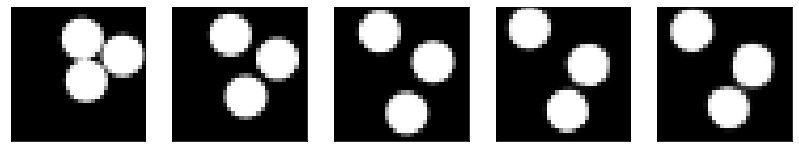

GD iterations:
i=0 | err=56.849613
i=1 | err=55.618229
i=2 | err=53.824371
i=3 | err=51.944088
i=4 | err=49.838139
i=5 | err=47.696625
i=6 | err=45.478718
i=7 | err=43.202530
i=8 | err=40.791718
i=9 | err=38.362820
i=10 | err=35.902794
i=11 | err=33.441528
i=12 | err=31.050434
i=13 | err=28.631321
i=14 | err=26.335598
i=15 | err=24.086542
i=16 | err=21.978668
i=17 | err=20.068588
i=18 | err=18.361979
i=19 | err=16.837975
i=20 | err=15.465172
i=21 | err=14.206612
i=22 | err=13.032084
i=23 | err=11.938112
i=24 | err=10.922657
i=25 | err=9.983923
i=26 | err=9.096660
i=27 | err=8.253061
i=28 | err=7.433574
i=29 | err=6.697006
Epoch=273 (6%) | out_positive=0.877504 | out_negative=0.104349 | mse=0.076404


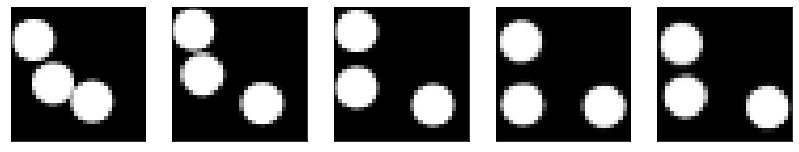

GD iterations:
i=0 | err=58.645592
i=1 | err=57.266678
i=2 | err=55.441608
i=3 | err=53.442398
i=4 | err=51.277866
i=5 | err=49.014381
i=6 | err=46.775208
i=7 | err=44.519543
i=8 | err=42.140152
i=9 | err=39.652309
i=10 | err=37.083729
i=11 | err=34.561752
i=12 | err=32.079735
i=13 | err=29.725849
i=14 | err=27.436466
i=15 | err=25.357309
i=16 | err=23.397591
i=17 | err=21.536177
i=18 | err=19.752636
i=19 | err=18.012383
i=20 | err=16.415604
i=21 | err=14.957126
i=22 | err=13.600744
i=23 | err=12.321545
i=24 | err=11.123081
i=25 | err=10.021503
i=26 | err=9.018293
i=27 | err=8.073576
i=28 | err=7.193286
i=29 | err=6.389536
Epoch=273 (7%) | out_positive=0.870549 | out_negative=0.127711 | mse=0.071675


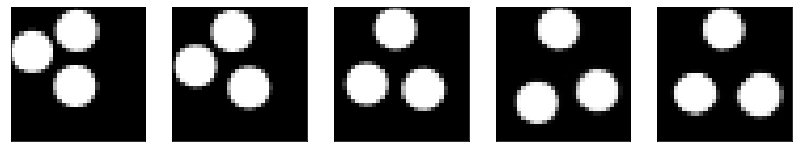

GD iterations:
i=0 | err=54.308617
i=1 | err=53.265343
i=2 | err=51.563892
i=3 | err=49.733105
i=4 | err=47.590809
i=5 | err=45.487465
i=6 | err=43.346954
i=7 | err=41.254898
i=8 | err=39.073792
i=9 | err=36.998306
i=10 | err=34.836735
i=11 | err=32.703896
i=12 | err=30.635153
i=13 | err=28.608433
i=14 | err=26.767536
i=15 | err=24.903667
i=16 | err=23.190416
i=17 | err=21.536686
i=18 | err=19.927835
i=19 | err=18.372265
i=20 | err=16.875826
i=21 | err=15.445987
i=22 | err=14.115357
i=23 | err=12.847019
i=24 | err=11.659760
i=25 | err=10.546691
i=26 | err=9.523981
i=27 | err=8.599794
i=28 | err=7.708201
i=29 | err=6.863049
Epoch=273 (9%) | out_positive=0.851438 | out_negative=0.124370 | mse=0.071329


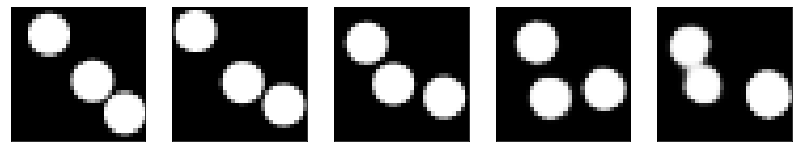

GD iterations:
i=0 | err=57.468426
i=1 | err=56.271332
i=2 | err=54.633263
i=3 | err=52.710484
i=4 | err=50.713310
i=5 | err=48.608452
i=6 | err=46.371902
i=7 | err=44.109383
i=8 | err=41.677147
i=9 | err=39.294746
i=10 | err=36.877247
i=11 | err=34.446442
i=12 | err=31.970524
i=13 | err=29.654163
i=14 | err=27.430737
i=15 | err=25.417048
i=16 | err=23.522842
i=17 | err=21.725561
i=18 | err=19.982986
i=19 | err=18.275749
i=20 | err=16.641855
i=21 | err=15.123446
i=22 | err=13.684182
i=23 | err=12.386538
i=24 | err=11.176322
i=25 | err=10.066229
i=26 | err=9.018604
i=27 | err=8.012255
i=28 | err=7.048938
i=29 | err=6.108279
Epoch=273 (11%) | out_positive=0.914267 | out_negative=0.185882 | mse=0.066998


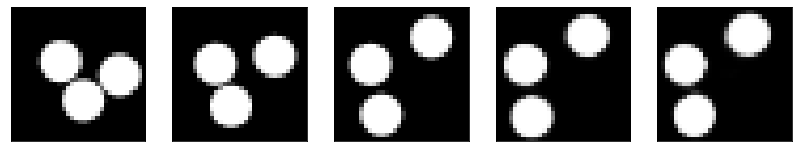

GD iterations:
i=0 | err=52.013390
i=1 | err=50.678623
i=2 | err=48.863686
i=3 | err=46.869648
i=4 | err=44.780144
i=5 | err=42.702770
i=6 | err=40.524033
i=7 | err=38.374962
i=8 | err=36.095280
i=9 | err=33.766724
i=10 | err=31.464981
i=11 | err=29.247984
i=12 | err=27.183289
i=13 | err=25.281998
i=14 | err=23.571445
i=15 | err=21.989508
i=16 | err=20.425943
i=17 | err=18.906204
i=18 | err=17.459129
i=19 | err=16.085136
i=20 | err=14.812966
i=21 | err=13.623194
i=22 | err=12.478471
i=23 | err=11.351220
i=24 | err=10.305328
i=25 | err=9.286425
i=26 | err=8.337715
i=27 | err=7.416934
i=28 | err=6.548934
i=29 | err=5.716613
Epoch=273 (13%) | out_positive=0.930207 | out_negative=0.151449 | mse=0.072842


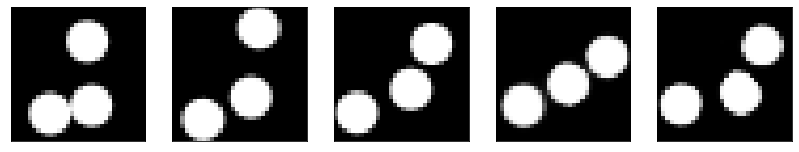

GD iterations:
i=0 | err=51.758621
i=1 | err=50.541206
i=2 | err=48.895607
i=3 | err=47.088886
i=4 | err=45.174240
i=5 | err=43.230034
i=6 | err=41.265938
i=7 | err=39.187950
i=8 | err=37.215164
i=9 | err=35.241653
i=10 | err=33.197517
i=11 | err=31.210102
i=12 | err=29.250540
i=13 | err=27.329067
i=14 | err=25.517389
i=15 | err=23.789091
i=16 | err=22.152269
i=17 | err=20.615456
i=18 | err=19.200916
i=19 | err=17.853622
i=20 | err=16.531246
i=21 | err=15.273561
i=22 | err=14.102057
i=23 | err=12.988684
i=24 | err=11.961090
i=25 | err=11.007607
i=26 | err=10.087523
i=27 | err=9.214511
i=28 | err=8.362872
i=29 | err=7.569090
Epoch=273 (15%) | out_positive=0.876769 | out_negative=0.091798 | mse=0.069787


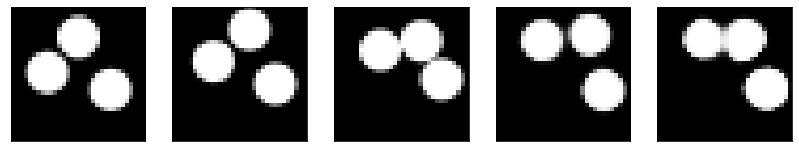

GD iterations:
i=0 | err=47.254807
i=1 | err=46.066261
i=2 | err=44.582478
i=3 | err=42.999634
i=4 | err=41.371124
i=5 | err=39.720245
i=6 | err=38.072372
i=7 | err=36.377251
i=8 | err=34.579540
i=9 | err=32.810379
i=10 | err=31.017744
i=11 | err=29.214981
i=12 | err=27.422146
i=13 | err=25.694841
i=14 | err=23.989578
i=15 | err=22.338280
i=16 | err=20.736078
i=17 | err=19.199984
i=18 | err=17.778145
i=19 | err=16.451159
i=20 | err=15.211847
i=21 | err=14.049257
i=22 | err=12.937391
i=23 | err=11.895709
i=24 | err=10.913391
i=25 | err=9.987423
i=26 | err=9.081238
i=27 | err=8.228024
i=28 | err=7.412347
i=29 | err=6.649320
Epoch=273 (16%) | out_positive=0.931159 | out_negative=0.130170 | mse=0.074918


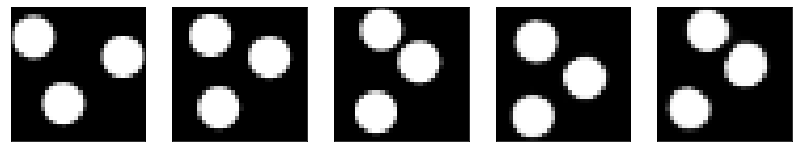

GD iterations:
i=0 | err=53.633999
i=1 | err=52.417675
i=2 | err=50.747746
i=3 | err=48.891209
i=4 | err=46.978874
i=5 | err=45.000759
i=6 | err=42.941532
i=7 | err=40.778385
i=8 | err=38.456554
i=9 | err=36.033783
i=10 | err=33.589916
i=11 | err=31.211872
i=12 | err=28.995899
i=13 | err=26.846195
i=14 | err=24.870474
i=15 | err=23.002872
i=16 | err=21.297705
i=17 | err=19.718309
i=18 | err=18.167381
i=19 | err=16.687347
i=20 | err=15.227463
i=21 | err=13.848813
i=22 | err=12.593315
i=23 | err=11.426332
i=24 | err=10.369248
i=25 | err=9.396045
i=26 | err=8.424845
i=27 | err=7.517897
i=28 | err=6.644318
i=29 | err=5.825622
Epoch=273 (17%) | out_positive=0.840176 | out_negative=0.169358 | mse=0.066365


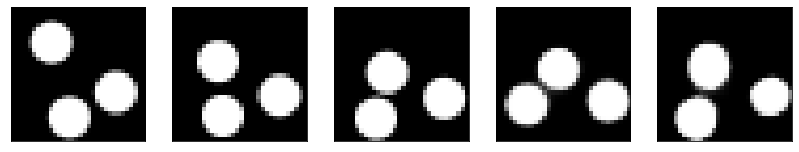

GD iterations:
i=0 | err=50.848137
i=1 | err=49.566479
i=2 | err=47.817177
i=3 | err=45.990494
i=4 | err=44.075111
i=5 | err=42.025024
i=6 | err=39.902489
i=7 | err=37.574253
i=8 | err=35.275513
i=9 | err=32.960258
i=10 | err=30.671787
i=11 | err=28.468060
i=12 | err=26.383587
i=13 | err=24.377703
i=14 | err=22.538338
i=15 | err=20.832314
i=16 | err=19.310703
i=17 | err=17.829212
i=18 | err=16.467472
i=19 | err=15.178531
i=20 | err=13.968410
i=21 | err=12.823557
i=22 | err=11.769935
i=23 | err=10.781707
i=24 | err=9.846273
i=25 | err=8.953602
i=26 | err=8.114096
i=27 | err=7.342706
i=28 | err=6.614700
i=29 | err=5.931064
Epoch=273 (19%) | out_positive=0.902243 | out_negative=0.158937 | mse=0.062843


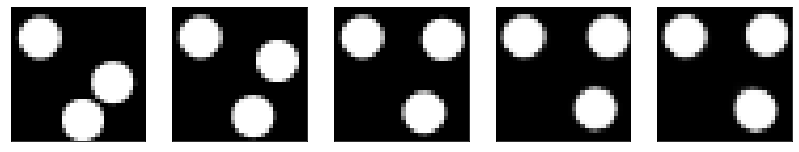

GD iterations:
i=0 | err=57.238174
i=1 | err=55.951797
i=2 | err=54.181374
i=3 | err=52.116978
i=4 | err=49.988060
i=5 | err=47.756828
i=6 | err=45.464718
i=7 | err=43.013748
i=8 | err=40.454369
i=9 | err=37.814377
i=10 | err=35.367615
i=11 | err=33.024628
i=12 | err=30.752478
i=13 | err=28.542948
i=14 | err=26.391197
i=15 | err=24.366117
i=16 | err=22.413313
i=17 | err=20.514473
i=18 | err=18.718817
i=19 | err=17.100895
i=20 | err=15.606348
i=21 | err=14.246525
i=22 | err=13.021681
i=23 | err=11.886141
i=24 | err=10.856855
i=25 | err=9.872283
i=26 | err=8.985846
i=27 | err=8.102460
i=28 | err=7.270308
i=29 | err=6.465822
Epoch=273 (20%) | out_positive=0.911788 | out_negative=0.170072 | mse=0.070058


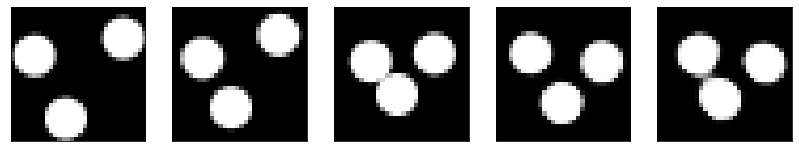

GD iterations:
i=0 | err=52.364792
i=1 | err=51.016319
i=2 | err=49.131313
i=3 | err=47.038750
i=4 | err=44.774506
i=5 | err=42.451080
i=6 | err=40.071136
i=7 | err=37.642338
i=8 | err=35.370182
i=9 | err=33.092415
i=10 | err=30.870880
i=11 | err=28.701418
i=12 | err=26.610884
i=13 | err=24.612167
i=14 | err=22.724760
i=15 | err=21.029787
i=16 | err=19.564886
i=17 | err=18.235418
i=18 | err=16.947783
i=19 | err=15.701910
i=20 | err=14.532200
i=21 | err=13.446857
i=22 | err=12.424753
i=23 | err=11.503169
i=24 | err=10.639899
i=25 | err=9.852644
i=26 | err=9.092283
i=27 | err=8.360193
i=28 | err=7.657353
i=29 | err=6.967685
Epoch=273 (22%) | out_positive=0.903922 | out_negative=0.088819 | mse=0.069277


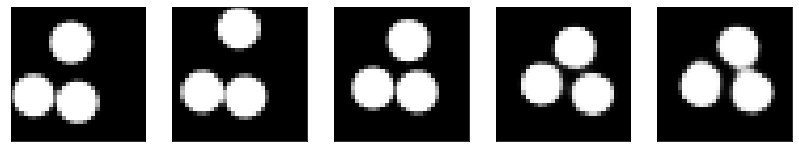

GD iterations:
i=0 | err=57.592308
i=1 | err=56.408859
i=2 | err=54.607384
i=3 | err=52.603516
i=4 | err=50.491219
i=5 | err=48.301277
i=6 | err=46.034737
i=7 | err=43.556702
i=8 | err=41.157974
i=9 | err=38.722504
i=10 | err=36.390877
i=11 | err=34.045258
i=12 | err=31.762539
i=13 | err=29.503119
i=14 | err=27.374369
i=15 | err=25.315872
i=16 | err=23.389490
i=17 | err=21.617088
i=18 | err=19.914749
i=19 | err=18.386253
i=20 | err=17.017597
i=21 | err=15.714145
i=22 | err=14.430708
i=23 | err=13.192646
i=24 | err=11.923876
i=25 | err=10.689402
i=26 | err=9.539952
i=27 | err=8.522120
i=28 | err=7.612645
i=29 | err=6.737785
Epoch=273 (24%) | out_positive=0.875497 | out_negative=0.126699 | mse=0.071892


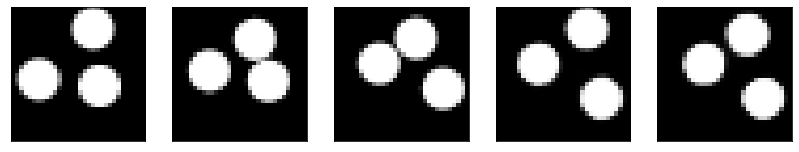

GD iterations:
i=0 | err=52.779846
i=1 | err=51.513466
i=2 | err=49.756729
i=3 | err=47.780304
i=4 | err=45.658730
i=5 | err=43.499977
i=6 | err=41.366032
i=7 | err=39.183479
i=8 | err=36.984512
i=9 | err=34.813416
i=10 | err=32.641953
i=11 | err=30.493553
i=12 | err=28.334993
i=13 | err=26.253246
i=14 | err=24.275198
i=15 | err=22.365662
i=16 | err=20.572456
i=17 | err=18.864716
i=18 | err=17.191792
i=19 | err=15.674555
i=20 | err=14.282378
i=21 | err=13.028219
i=22 | err=11.895042
i=23 | err=10.846325
i=24 | err=9.906770
i=25 | err=8.998318
i=26 | err=8.188625
i=27 | err=7.423755
i=28 | err=6.677031
i=29 | err=5.980968
Epoch=273 (26%) | out_positive=0.904123 | out_negative=0.123960 | mse=0.069779


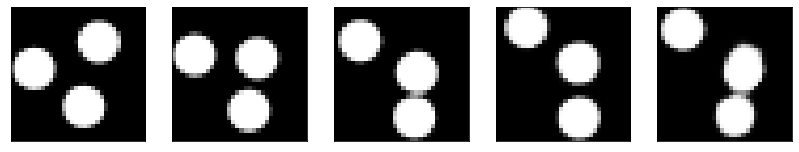

GD iterations:
i=0 | err=56.826057
i=1 | err=55.497658
i=2 | err=53.669476
i=3 | err=51.617828
i=4 | err=49.454865
i=5 | err=47.297894
i=6 | err=45.142670
i=7 | err=42.915253
i=8 | err=40.610397
i=9 | err=38.269600
i=10 | err=35.948532
i=11 | err=33.685055
i=12 | err=31.459457
i=13 | err=29.264320
i=14 | err=27.125380
i=15 | err=25.049307
i=16 | err=23.054169
i=17 | err=21.227558
i=18 | err=19.513790
i=19 | err=17.923153
i=20 | err=16.478775
i=21 | err=15.195951
i=22 | err=14.025276
i=23 | err=12.934443
i=24 | err=11.912659
i=25 | err=10.960674
i=26 | err=10.062111
i=27 | err=9.216248
i=28 | err=8.399385
i=29 | err=7.613038
Epoch=273 (28%) | out_positive=0.869044 | out_negative=0.116622 | mse=0.073261


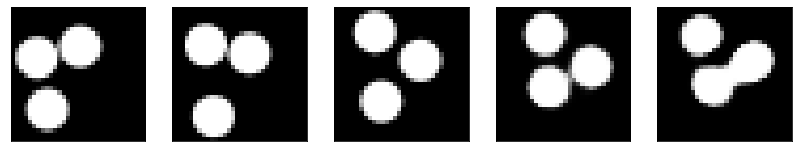

GD iterations:
i=0 | err=55.240608
i=1 | err=53.962799
i=2 | err=52.243553
i=3 | err=50.333458
i=4 | err=48.301968
i=5 | err=46.182087
i=6 | err=43.982773
i=7 | err=41.812851
i=8 | err=39.638252
i=9 | err=37.482498
i=10 | err=35.259422
i=11 | err=33.047688
i=12 | err=30.838276
i=13 | err=28.694380
i=14 | err=26.607281
i=15 | err=24.564381
i=16 | err=22.635769
i=17 | err=20.879547
i=18 | err=19.246092
i=19 | err=17.694090
i=20 | err=16.209236
i=21 | err=14.834018
i=22 | err=13.547388
i=23 | err=12.380898
i=24 | err=11.281230
i=25 | err=10.279970
i=26 | err=9.365972
i=27 | err=8.525864
i=28 | err=7.733150
i=29 | err=6.974185
Epoch=273 (30%) | out_positive=0.889374 | out_negative=0.109350 | mse=0.074031


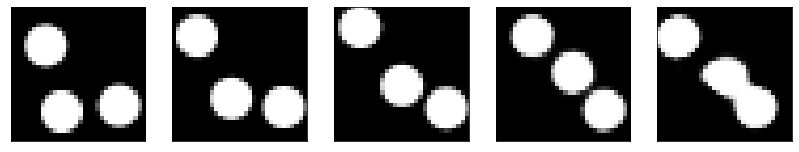

GD iterations:
i=0 | err=53.698776
i=1 | err=52.350052
i=2 | err=50.552738
i=3 | err=48.522648
i=4 | err=46.325790
i=5 | err=44.046730
i=6 | err=41.639175
i=7 | err=39.202301
i=8 | err=36.659180
i=9 | err=34.193878
i=10 | err=31.872154
i=11 | err=29.678646
i=12 | err=27.618174
i=13 | err=25.685036
i=14 | err=23.862225
i=15 | err=22.134789
i=16 | err=20.504665
i=17 | err=18.909149
i=18 | err=17.423309
i=19 | err=16.063517
i=20 | err=14.773983
i=21 | err=13.601469
i=22 | err=12.540121
i=23 | err=11.531239
i=24 | err=10.604611
i=25 | err=9.733923
i=26 | err=8.874776
i=27 | err=8.025702
i=28 | err=7.223178
i=29 | err=6.439079
Epoch=273 (31%) | out_positive=0.910608 | out_negative=0.143212 | mse=0.072394


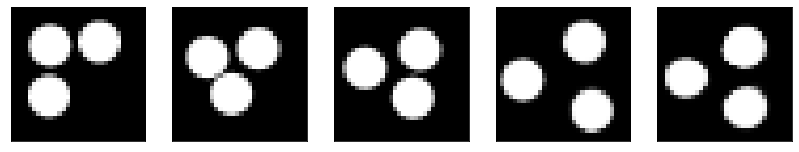

GD iterations:
i=0 | err=58.604744
i=1 | err=57.267212
i=2 | err=55.403851
i=3 | err=53.276672
i=4 | err=51.055389
i=5 | err=48.737431
i=6 | err=46.410622
i=7 | err=43.996353
i=8 | err=41.440857
i=9 | err=38.753754
i=10 | err=36.018745
i=11 | err=33.323158
i=12 | err=30.742897
i=13 | err=28.429903
i=14 | err=26.321051
i=15 | err=24.428524
i=16 | err=22.621767
i=17 | err=20.988819
i=18 | err=19.471184
i=19 | err=18.082195
i=20 | err=16.783924
i=21 | err=15.597695
i=22 | err=14.457022
i=23 | err=13.401579
i=24 | err=12.434942
i=25 | err=11.520717
i=26 | err=10.645435
i=27 | err=9.813240
i=28 | err=9.014763
i=29 | err=8.249313
Epoch=273 (33%) | out_positive=0.852093 | out_negative=0.113390 | mse=0.070096


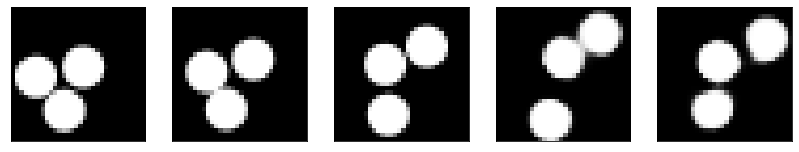

GD iterations:
i=0 | err=56.297081
i=1 | err=54.955650
i=2 | err=53.091114
i=3 | err=50.946426
i=4 | err=48.734573
i=5 | err=46.470940
i=6 | err=44.178413
i=7 | err=41.896744
i=8 | err=39.655518
i=9 | err=37.390335
i=10 | err=35.044373
i=11 | err=32.727936
i=12 | err=30.421860
i=13 | err=28.185528
i=14 | err=26.078804
i=15 | err=24.042665
i=16 | err=22.040718
i=17 | err=20.191229
i=18 | err=18.440880
i=19 | err=16.825836
i=20 | err=15.358874
i=21 | err=14.004083
i=22 | err=12.774220
i=23 | err=11.618029
i=24 | err=10.546268
i=25 | err=9.564293
i=26 | err=8.653069
i=27 | err=7.799654
i=28 | err=6.984263
i=29 | err=6.183456
Epoch=273 (35%) | out_positive=0.885080 | out_negative=0.111651 | mse=0.065513


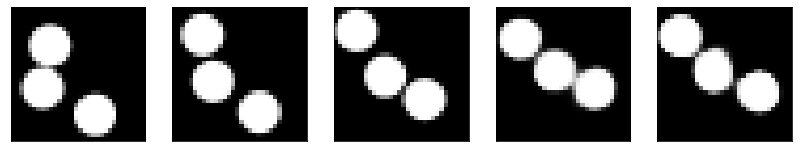

GD iterations:
i=0 | err=56.470768
i=1 | err=55.245316
i=2 | err=53.631111
i=3 | err=51.798950
i=4 | err=49.864338
i=5 | err=47.863564
i=6 | err=45.751930
i=7 | err=43.611465
i=8 | err=41.345608
i=9 | err=39.082172
i=10 | err=36.831375
i=11 | err=34.622154
i=12 | err=32.458824
i=13 | err=30.401997
i=14 | err=28.412128
i=15 | err=26.537327
i=16 | err=24.660557
i=17 | err=22.818661
i=18 | err=21.067341
i=19 | err=19.359589
i=20 | err=17.762920
i=21 | err=16.234230
i=22 | err=14.893564
i=23 | err=13.630884
i=24 | err=12.526423
i=25 | err=11.520594
i=26 | err=10.610834
i=27 | err=9.752392
i=28 | err=8.897050
i=29 | err=8.057294
Epoch=273 (37%) | out_positive=0.862488 | out_negative=0.102178 | mse=0.071039


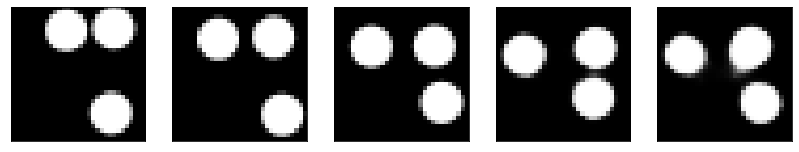

GD iterations:
i=0 | err=56.004139
i=1 | err=54.676987
i=2 | err=52.902405
i=3 | err=50.847519
i=4 | err=48.603462
i=5 | err=46.287430
i=6 | err=43.833565
i=7 | err=41.325432
i=8 | err=38.803841
i=9 | err=36.363113
i=10 | err=33.889145
i=11 | err=31.456238
i=12 | err=29.083111
i=13 | err=26.749718
i=14 | err=24.559244
i=15 | err=22.508266
i=16 | err=20.599590
i=17 | err=18.848053
i=18 | err=17.284964
i=19 | err=15.848357
i=20 | err=14.529327
i=21 | err=13.299170
i=22 | err=12.190372
i=23 | err=11.167039
i=24 | err=10.226542
i=25 | err=9.341908
i=26 | err=8.486026
i=27 | err=7.671439
i=28 | err=6.915151
i=29 | err=6.175017
Epoch=273 (39%) | out_positive=0.904549 | out_negative=0.171012 | mse=0.068298


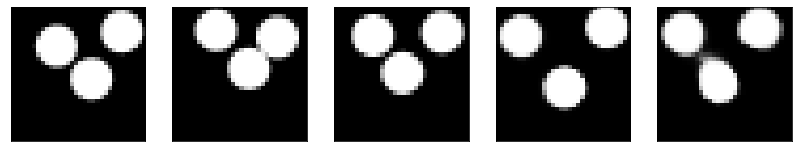

GD iterations:
i=0 | err=55.963043
i=1 | err=54.675346
i=2 | err=52.904800
i=3 | err=50.938850
i=4 | err=48.809433
i=5 | err=46.612610
i=6 | err=44.312996
i=7 | err=42.019714
i=8 | err=39.659824
i=9 | err=37.398483
i=10 | err=35.281052
i=11 | err=33.203537
i=12 | err=31.238310
i=13 | err=29.277309
i=14 | err=27.332752
i=15 | err=25.427147
i=16 | err=23.630430
i=17 | err=21.961506
i=18 | err=20.380997
i=19 | err=18.855406
i=20 | err=17.447062
i=21 | err=16.121857
i=22 | err=14.877351
i=23 | err=13.663761
i=24 | err=12.467707
i=25 | err=11.279442
i=26 | err=10.167610
i=27 | err=9.115770
i=28 | err=8.109449
i=29 | err=7.194548
Epoch=273 (41%) | out_positive=0.903507 | out_negative=0.134038 | mse=0.075286


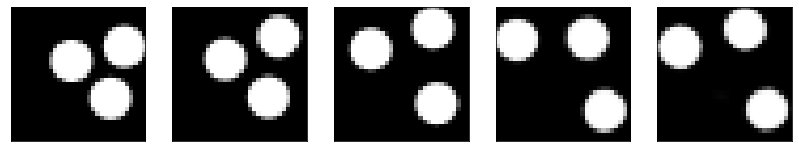

GD iterations:
i=0 | err=59.549732
i=1 | err=58.219254
i=2 | err=56.372860
i=3 | err=54.299690
i=4 | err=52.074055
i=5 | err=49.771423
i=6 | err=47.386971
i=7 | err=44.924545
i=8 | err=42.337654
i=9 | err=39.794868
i=10 | err=37.214333
i=11 | err=34.609711
i=12 | err=32.009670
i=13 | err=29.515617
i=14 | err=27.192539
i=15 | err=25.090696
i=16 | err=23.215408
i=17 | err=21.428259
i=18 | err=19.755693
i=19 | err=18.275064
i=20 | err=16.900747
i=21 | err=15.672421
i=22 | err=14.500851
i=23 | err=13.354244
i=24 | err=12.240299
i=25 | err=11.166183
i=26 | err=10.102217
i=27 | err=9.100794
i=28 | err=8.181021
i=29 | err=7.347145
Epoch=273 (42%) | out_positive=0.886996 | out_negative=0.120544 | mse=0.075160


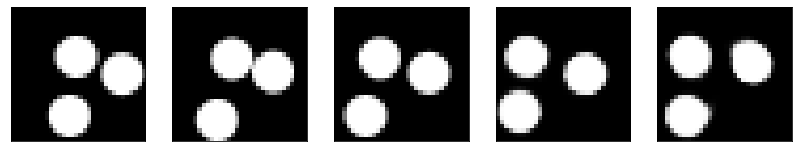

GD iterations:
i=0 | err=55.774788
i=1 | err=54.468567
i=2 | err=52.653549
i=3 | err=50.579159
i=4 | err=48.425606
i=5 | err=46.301430
i=6 | err=44.197884
i=7 | err=41.918736
i=8 | err=39.504719
i=9 | err=37.072807
i=10 | err=34.663403
i=11 | err=32.286980
i=12 | err=29.970636
i=13 | err=27.758961
i=14 | err=25.698792
i=15 | err=23.727945
i=16 | err=21.883867
i=17 | err=20.188087
i=18 | err=18.597672
i=19 | err=17.234224
i=20 | err=15.974112
i=21 | err=14.770895
i=22 | err=13.641117
i=23 | err=12.580326
i=24 | err=11.615878
i=25 | err=10.710707
i=26 | err=9.877602
i=27 | err=9.091824
i=28 | err=8.338833
i=29 | err=7.619061
Epoch=273 (44%) | out_positive=0.876344 | out_negative=0.116986 | mse=0.077046


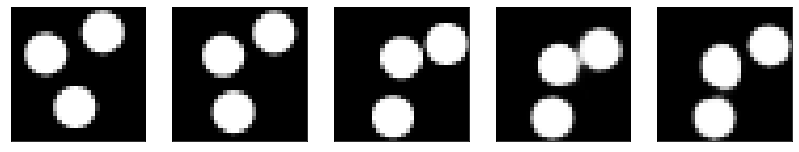

GD iterations:
i=0 | err=51.972855
i=1 | err=50.606270
i=2 | err=48.685329
i=3 | err=46.509682
i=4 | err=44.203419
i=5 | err=41.967354
i=6 | err=39.733746
i=7 | err=37.584713
i=8 | err=35.482193
i=9 | err=33.446533
i=10 | err=31.481764
i=11 | err=29.613503
i=12 | err=27.796608
i=13 | err=25.985180
i=14 | err=24.157051
i=15 | err=22.462475
i=16 | err=20.862068
i=17 | err=19.376347
i=18 | err=17.934654
i=19 | err=16.558638
i=20 | err=15.256971
i=21 | err=14.015019
i=22 | err=12.844418
i=23 | err=11.802521
i=24 | err=10.802798
i=25 | err=9.786941
i=26 | err=8.836514
i=27 | err=7.911404
i=28 | err=7.034534
i=29 | err=6.217131
Epoch=273 (46%) | out_positive=0.902422 | out_negative=0.148104 | mse=0.070554


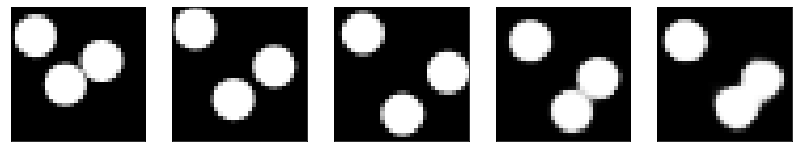

GD iterations:
i=0 | err=51.796310
i=1 | err=50.594536
i=2 | err=48.892696
i=3 | err=47.008148
i=4 | err=44.983368
i=5 | err=42.916939
i=6 | err=40.899323
i=7 | err=38.872665
i=8 | err=36.857716
i=9 | err=34.819588
i=10 | err=32.644302
i=11 | err=30.486477
i=12 | err=28.248604
i=13 | err=26.103466
i=14 | err=24.026098
i=15 | err=22.112858
i=16 | err=20.394764
i=17 | err=18.825224
i=18 | err=17.402365
i=19 | err=16.099995
i=20 | err=14.876492
i=21 | err=13.709183
i=22 | err=12.598961
i=23 | err=11.537154
i=24 | err=10.509884
i=25 | err=9.539598
i=26 | err=8.657864
i=27 | err=7.825098
i=28 | err=7.026731
i=29 | err=6.262929
Epoch=273 (48%) | out_positive=0.929597 | out_negative=0.160239 | mse=0.072752


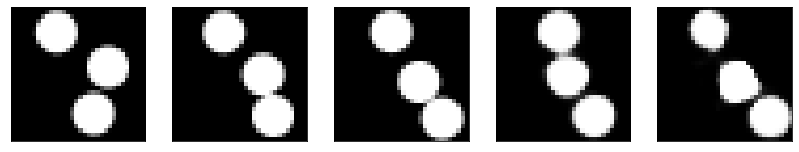

GD iterations:
i=0 | err=53.864178
i=1 | err=52.599010
i=2 | err=50.865463
i=3 | err=48.949139
i=4 | err=46.916027
i=5 | err=44.777115
i=6 | err=42.587173
i=7 | err=40.309464
i=8 | err=38.032516
i=9 | err=35.822052
i=10 | err=33.578041
i=11 | err=31.361467
i=12 | err=29.145376
i=13 | err=27.093710
i=14 | err=25.240335
i=15 | err=23.545776
i=16 | err=21.990358
i=17 | err=20.520250
i=18 | err=19.155699
i=19 | err=17.871761
i=20 | err=16.640776
i=21 | err=15.414495
i=22 | err=14.213514
i=23 | err=13.053026
i=24 | err=11.955121
i=25 | err=10.901172
i=26 | err=9.931095
i=27 | err=9.011887
i=28 | err=8.177145
i=29 | err=7.324333
Epoch=273 (50%) | out_positive=0.905472 | out_negative=0.101953 | mse=0.073004


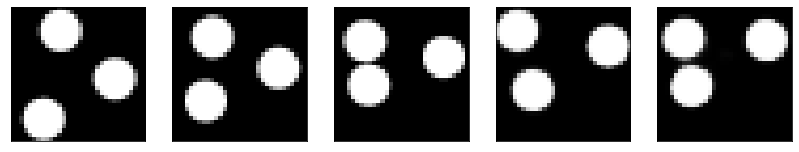

GD iterations:
i=0 | err=53.816406
i=1 | err=52.386784
i=2 | err=50.467537
i=3 | err=48.362350
i=4 | err=46.237968
i=5 | err=44.076622
i=6 | err=41.900337
i=7 | err=39.639961
i=8 | err=37.362579
i=9 | err=35.055798
i=10 | err=32.701233
i=11 | err=30.372875
i=12 | err=28.107656
i=13 | err=25.981960
i=14 | err=23.933485
i=15 | err=22.013313
i=16 | err=20.294701
i=17 | err=18.665892
i=18 | err=17.228573
i=19 | err=15.920192
i=20 | err=14.667641
i=21 | err=13.499358
i=22 | err=12.405033
i=23 | err=11.402428
i=24 | err=10.457987
i=25 | err=9.561245
i=26 | err=8.739295
i=27 | err=7.966572
i=28 | err=7.224727
i=29 | err=6.534271
Epoch=273 (52%) | out_positive=0.907926 | out_negative=0.137076 | mse=0.067624


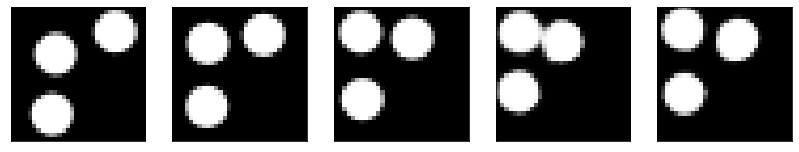

GD iterations:
i=0 | err=54.721569
i=1 | err=53.518913
i=2 | err=51.896942
i=3 | err=50.032822
i=4 | err=47.981476
i=5 | err=45.816719
i=6 | err=43.715065
i=7 | err=41.537483
i=8 | err=39.301441
i=9 | err=36.959122
i=10 | err=34.538818
i=11 | err=32.070343
i=12 | err=29.651402
i=13 | err=27.308506
i=14 | err=25.121378
i=15 | err=23.188202
i=16 | err=21.484167
i=17 | err=19.950764
i=18 | err=18.552700
i=19 | err=17.303257
i=20 | err=16.073708
i=21 | err=14.896026
i=22 | err=13.732639
i=23 | err=12.603836
i=24 | err=11.530805
i=25 | err=10.496744
i=26 | err=9.506142
i=27 | err=8.549477
i=28 | err=7.655559
i=29 | err=6.806306
Epoch=273 (54%) | out_positive=0.876894 | out_negative=0.165276 | mse=0.070390


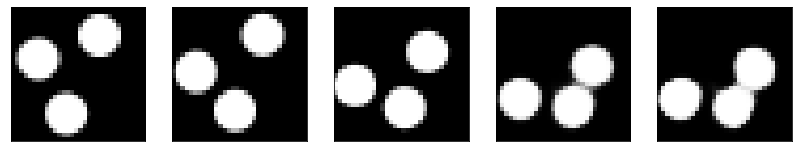

GD iterations:
i=0 | err=54.305328
i=1 | err=53.011158
i=2 | err=51.239388
i=3 | err=49.264534
i=4 | err=47.203285
i=5 | err=44.905968
i=6 | err=42.503006
i=7 | err=40.126358
i=8 | err=37.678642
i=9 | err=35.238056
i=10 | err=32.838547
i=11 | err=30.545267
i=12 | err=28.372173
i=13 | err=26.266047
i=14 | err=24.193470
i=15 | err=22.205711
i=16 | err=20.321615
i=17 | err=18.571173
i=18 | err=16.984003
i=19 | err=15.583992
i=20 | err=14.358490
i=21 | err=13.229223
i=22 | err=12.187136
i=23 | err=11.209633
i=24 | err=10.291625
i=25 | err=9.413657
i=26 | err=8.571999
i=27 | err=7.774061
i=28 | err=7.009445
i=29 | err=6.262744
Epoch=273 (55%) | out_positive=0.913071 | out_negative=0.117433 | mse=0.069718


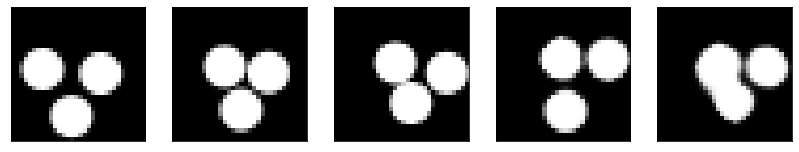

GD iterations:
i=0 | err=52.523987
i=1 | err=51.245655
i=2 | err=49.529488
i=3 | err=47.574528
i=4 | err=45.513344
i=5 | err=43.390656
i=6 | err=41.263130
i=7 | err=39.140514
i=8 | err=36.955376
i=9 | err=34.798752
i=10 | err=32.600723
i=11 | err=30.459492
i=12 | err=28.360493
i=13 | err=26.327251
i=14 | err=24.428833
i=15 | err=22.637217
i=16 | err=20.964746
i=17 | err=19.423557
i=18 | err=17.969482
i=19 | err=16.609707
i=20 | err=15.327594
i=21 | err=14.154124
i=22 | err=13.052849
i=23 | err=12.040016
i=24 | err=11.087549
i=25 | err=10.158888
i=26 | err=9.306973
i=27 | err=8.459792
i=28 | err=7.665100
i=29 | err=6.926645
Epoch=273 (57%) | out_positive=0.902812 | out_negative=0.119152 | mse=0.070795


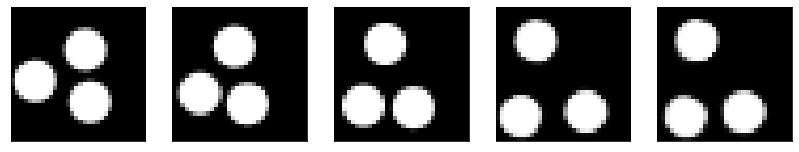

GD iterations:
i=0 | err=55.323162
i=1 | err=54.013866
i=2 | err=52.148743
i=3 | err=50.069229
i=4 | err=47.837112
i=5 | err=45.504677
i=6 | err=43.108025
i=7 | err=40.765732
i=8 | err=38.420410
i=9 | err=36.114456
i=10 | err=33.741760
i=11 | err=31.338829
i=12 | err=29.038303
i=13 | err=26.818035
i=14 | err=24.673197
i=15 | err=22.723618
i=16 | err=20.833401
i=17 | err=19.045300
i=18 | err=17.305161
i=19 | err=15.706907
i=20 | err=14.296485
i=21 | err=13.023133
i=22 | err=11.867124
i=23 | err=10.763602
i=24 | err=9.778530
i=25 | err=8.854561
i=26 | err=8.007742
i=27 | err=7.242399
i=28 | err=6.518425
i=29 | err=5.830192
Epoch=273 (59%) | out_positive=0.895757 | out_negative=0.202481 | mse=0.068497


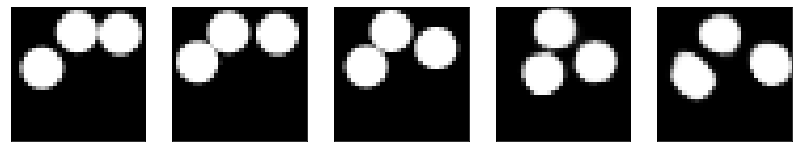

GD iterations:
i=0 | err=52.792206
i=1 | err=51.504749
i=2 | err=49.828362
i=3 | err=47.910141
i=4 | err=45.868355
i=5 | err=43.734169
i=6 | err=41.436508
i=7 | err=39.105919
i=8 | err=36.718536
i=9 | err=34.468735
i=10 | err=32.288338
i=11 | err=30.192909
i=12 | err=28.162342
i=13 | err=26.201092
i=14 | err=24.308640
i=15 | err=22.564724
i=16 | err=20.888203
i=17 | err=19.350914
i=18 | err=17.930502
i=19 | err=16.623278
i=20 | err=15.390896
i=21 | err=14.258667
i=22 | err=13.182694
i=23 | err=12.198868
i=24 | err=11.275359
i=25 | err=10.405745
i=26 | err=9.585470
i=27 | err=8.792171
i=28 | err=8.040704
i=29 | err=7.343762
Epoch=273 (61%) | out_positive=0.853380 | out_negative=0.089749 | mse=0.071218


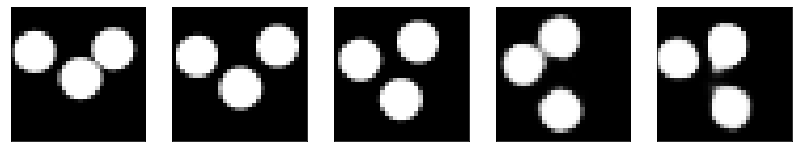

GD iterations:
i=0 | err=56.255730
i=1 | err=55.100578
i=2 | err=53.514446
i=3 | err=51.715431
i=4 | err=49.772804
i=5 | err=47.690876
i=6 | err=45.559654
i=7 | err=43.383423
i=8 | err=41.197006
i=9 | err=38.888546
i=10 | err=36.586617
i=11 | err=34.294682
i=12 | err=31.950253
i=13 | err=29.645567
i=14 | err=27.392494
i=15 | err=25.294212
i=16 | err=23.363115
i=17 | err=21.558025
i=18 | err=19.835484
i=19 | err=18.174700
i=20 | err=16.644552
i=21 | err=15.221819
i=22 | err=13.899511
i=23 | err=12.659779
i=24 | err=11.477656
i=25 | err=10.360309
i=26 | err=9.325514
i=27 | err=8.358736
i=28 | err=7.480673
i=29 | err=6.659688
Epoch=273 (63%) | out_positive=0.865951 | out_negative=0.112642 | mse=0.073742


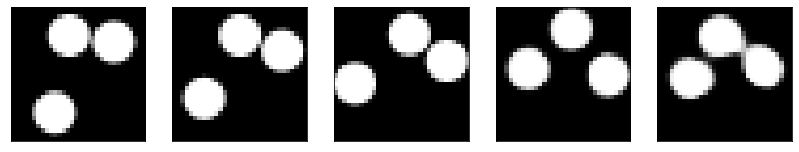

GD iterations:
i=0 | err=55.705898
i=1 | err=54.312180
i=2 | err=52.445263
i=3 | err=50.376774
i=4 | err=48.180882
i=5 | err=45.931442
i=6 | err=43.667862
i=7 | err=41.305454
i=8 | err=38.924461
i=9 | err=36.457363
i=10 | err=34.054142
i=11 | err=31.731560
i=12 | err=29.415577
i=13 | err=27.194450
i=14 | err=25.051010
i=15 | err=23.027802
i=16 | err=21.103004
i=17 | err=19.277628
i=18 | err=17.636557
i=19 | err=16.144850
i=20 | err=14.776699
i=21 | err=13.480696
i=22 | err=12.308619
i=23 | err=11.235929
i=24 | err=10.239547
i=25 | err=9.319954
i=26 | err=8.474834
i=27 | err=7.657122
i=28 | err=6.892629
i=29 | err=6.140632
Epoch=273 (65%) | out_positive=0.926654 | out_negative=0.164320 | mse=0.069094


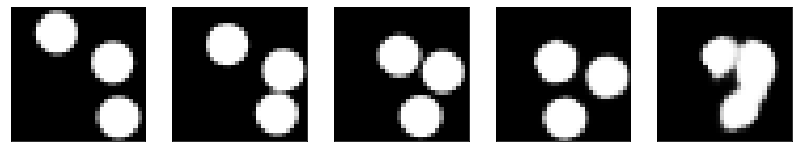

GD iterations:
i=0 | err=58.175278
i=1 | err=56.899101
i=2 | err=55.063477
i=3 | err=52.963566
i=4 | err=50.710052
i=5 | err=48.429432
i=6 | err=46.105431
i=7 | err=43.639397
i=8 | err=41.119213
i=9 | err=38.581310
i=10 | err=36.193985
i=11 | err=33.760223
i=12 | err=31.403681
i=13 | err=29.108055
i=14 | err=26.939350
i=15 | err=24.909592
i=16 | err=23.031452
i=17 | err=21.324478
i=18 | err=19.742308
i=19 | err=18.276287
i=20 | err=16.891018
i=21 | err=15.624912
i=22 | err=14.440304
i=23 | err=13.328685
i=24 | err=12.296391
i=25 | err=11.344559
i=26 | err=10.393345
i=27 | err=9.480972
i=28 | err=8.625608
i=29 | err=7.802625
Epoch=273 (66%) | out_positive=0.827817 | out_negative=0.097108 | mse=0.069865


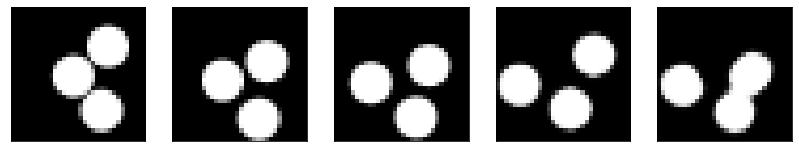

GD iterations:
i=0 | err=58.205410
i=1 | err=56.888145
i=2 | err=55.029888
i=3 | err=52.965118
i=4 | err=50.779953
i=5 | err=48.423309
i=6 | err=46.006409
i=7 | err=43.400833
i=8 | err=40.796131
i=9 | err=38.261665
i=10 | err=35.795650
i=11 | err=33.444756
i=12 | err=31.176807
i=13 | err=28.974676
i=14 | err=26.903038
i=15 | err=24.924604
i=16 | err=23.053196
i=17 | err=21.313473
i=18 | err=19.722580
i=19 | err=18.220119
i=20 | err=16.891695
i=21 | err=15.679995
i=22 | err=14.501566
i=23 | err=13.432688
i=24 | err=12.416696
i=25 | err=11.459620
i=26 | err=10.503450
i=27 | err=9.609633
i=28 | err=8.759724
i=29 | err=7.942687
Epoch=273 (68%) | out_positive=0.885737 | out_negative=0.105489 | mse=0.072477


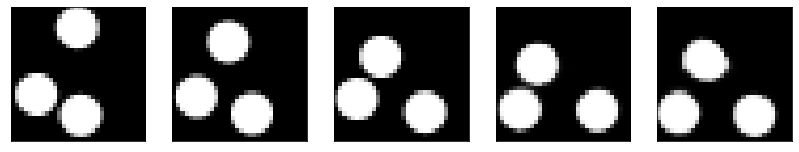

GD iterations:
i=0 | err=55.192181
i=1 | err=53.884472
i=2 | err=52.090637
i=3 | err=50.057858
i=4 | err=47.864235
i=5 | err=45.624252
i=6 | err=43.344391
i=7 | err=40.938465
i=8 | err=38.529575
i=9 | err=36.133533
i=10 | err=33.686447
i=11 | err=31.265045
i=12 | err=28.893307
i=13 | err=26.535595
i=14 | err=24.337399
i=15 | err=22.276266
i=16 | err=20.450436
i=17 | err=18.754648
i=18 | err=17.170494
i=19 | err=15.714278
i=20 | err=14.349005
i=21 | err=13.117949
i=22 | err=11.998329
i=23 | err=10.970793
i=24 | err=10.012617
i=25 | err=9.123569
i=26 | err=8.273521
i=27 | err=7.450093
i=28 | err=6.707617
i=29 | err=5.965596
Epoch=273 (70%) | out_positive=0.864930 | out_negative=0.153596 | mse=0.066325


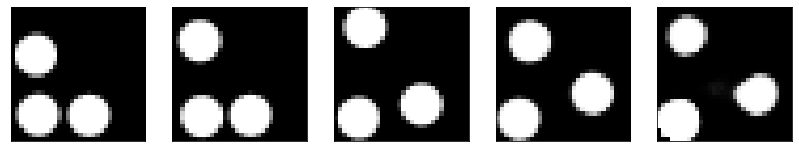

GD iterations:
i=0 | err=56.888367
i=1 | err=55.664261
i=2 | err=53.968922
i=3 | err=52.038567
i=4 | err=50.018944
i=5 | err=47.838314
i=6 | err=45.618950
i=7 | err=43.374199
i=8 | err=41.073975
i=9 | err=38.787857
i=10 | err=36.564796
i=11 | err=34.303902
i=12 | err=32.074253
i=13 | err=29.850704
i=14 | err=27.701439
i=15 | err=25.626879
i=16 | err=23.741018
i=17 | err=21.951015
i=18 | err=20.221165
i=19 | err=18.628668
i=20 | err=17.153942
i=21 | err=15.761818
i=22 | err=14.426101
i=23 | err=13.174639
i=24 | err=11.886080
i=25 | err=10.760967
i=26 | err=9.713145
i=27 | err=8.784166
i=28 | err=7.925419
i=29 | err=7.097097
Epoch=273 (72%) | out_positive=0.887305 | out_negative=0.116186 | mse=0.075112


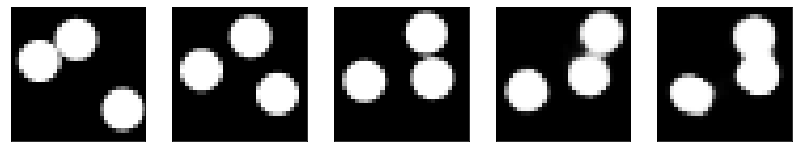

GD iterations:
i=0 | err=55.590714
i=1 | err=54.267700
i=2 | err=52.498371
i=3 | err=50.456177
i=4 | err=48.431263
i=5 | err=46.283169
i=6 | err=44.015392
i=7 | err=41.631912
i=8 | err=39.246094
i=9 | err=36.807537
i=10 | err=34.414406
i=11 | err=32.020061
i=12 | err=29.805693
i=13 | err=27.565922
i=14 | err=25.472265
i=15 | err=23.419529
i=16 | err=21.490089
i=17 | err=19.747215
i=18 | err=18.230244
i=19 | err=16.824417
i=20 | err=15.494786
i=21 | err=14.196115
i=22 | err=12.945032
i=23 | err=11.799999
i=24 | err=10.743004
i=25 | err=9.752014
i=26 | err=8.835340
i=27 | err=7.994184
i=28 | err=7.206818
i=29 | err=6.458833
Epoch=273 (74%) | out_positive=0.915983 | out_negative=0.118147 | mse=0.075078


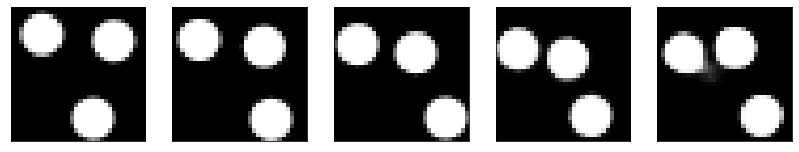

GD iterations:
i=0 | err=54.152477
i=1 | err=52.870140
i=2 | err=51.109566
i=3 | err=49.138531
i=4 | err=47.098717
i=5 | err=45.032074
i=6 | err=42.798542
i=7 | err=40.584831
i=8 | err=38.346081
i=9 | err=36.121231
i=10 | err=33.936768
i=11 | err=31.694988
i=12 | err=29.627357
i=13 | err=27.598763
i=14 | err=25.647778
i=15 | err=23.770958
i=16 | err=21.981623
i=17 | err=20.293365
i=18 | err=18.712349
i=19 | err=17.191170
i=20 | err=15.849298
i=21 | err=14.567673
i=22 | err=13.418952
i=23 | err=12.354806
i=24 | err=11.394230
i=25 | err=10.491441
i=26 | err=9.642353
i=27 | err=8.839937
i=28 | err=8.084625
i=29 | err=7.374270
Epoch=273 (76%) | out_positive=0.889659 | out_negative=0.125973 | mse=0.069895


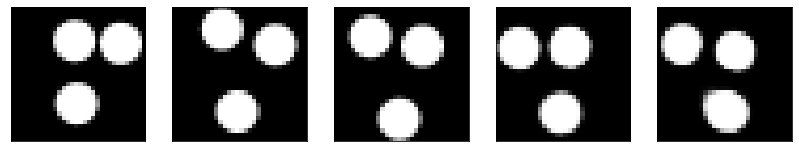

GD iterations:
i=0 | err=56.038383
i=1 | err=54.780716
i=2 | err=52.979858
i=3 | err=50.992180
i=4 | err=48.898998
i=5 | err=46.740051
i=6 | err=44.385170
i=7 | err=41.987411
i=8 | err=39.522888
i=9 | err=37.042934
i=10 | err=34.590469
i=11 | err=32.161530
i=12 | err=29.835310
i=13 | err=27.630978
i=14 | err=25.516792
i=15 | err=23.546904
i=16 | err=21.761383
i=17 | err=20.038853
i=18 | err=18.390268
i=19 | err=16.898670
i=20 | err=15.557310
i=21 | err=14.307718
i=22 | err=13.183688
i=23 | err=12.104687
i=24 | err=11.087431
i=25 | err=10.152714
i=26 | err=9.257771
i=27 | err=8.399695
i=28 | err=7.581839
i=29 | err=6.817381
Epoch=273 (78%) | out_positive=0.870131 | out_negative=0.123705 | mse=0.067614


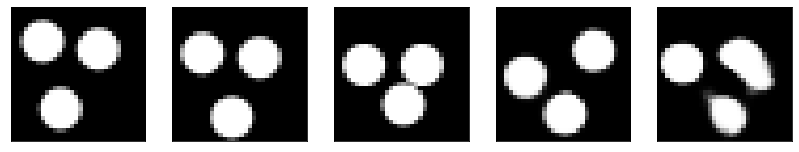

GD iterations:
i=0 | err=54.106735
i=1 | err=52.865341
i=2 | err=51.175621
i=3 | err=49.300465
i=4 | err=47.395905
i=5 | err=45.403919
i=6 | err=43.333969
i=7 | err=41.205494
i=8 | err=38.975418
i=9 | err=36.740150
i=10 | err=34.523895
i=11 | err=32.307312
i=12 | err=30.155117
i=13 | err=28.032629
i=14 | err=26.030632
i=15 | err=24.148409
i=16 | err=22.334820
i=17 | err=20.620090
i=18 | err=18.932501
i=19 | err=17.264366
i=20 | err=15.708112
i=21 | err=14.270854
i=22 | err=12.921896
i=23 | err=11.698044
i=24 | err=10.557796
i=25 | err=9.443407
i=26 | err=8.414264
i=27 | err=7.450850
i=28 | err=6.517648
i=29 | err=5.668760
Epoch=273 (79%) | out_positive=0.936442 | out_negative=0.179124 | mse=0.069515


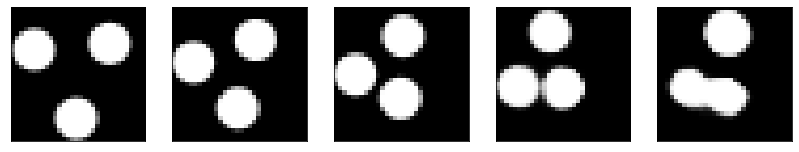

GD iterations:
i=0 | err=58.605762
i=1 | err=57.304771
i=2 | err=55.471977
i=3 | err=53.440331
i=4 | err=51.183151
i=5 | err=48.760105
i=6 | err=46.232353
i=7 | err=43.620140
i=8 | err=41.024773
i=9 | err=38.513985
i=10 | err=36.025192
i=11 | err=33.536232
i=12 | err=31.095852
i=13 | err=28.749222
i=14 | err=26.553631
i=15 | err=24.497570
i=16 | err=22.609812
i=17 | err=20.833290
i=18 | err=19.157505
i=19 | err=17.686485
i=20 | err=16.298176
i=21 | err=15.026129
i=22 | err=13.839650
i=23 | err=12.721956
i=24 | err=11.659170
i=25 | err=10.673504
i=26 | err=9.775601
i=27 | err=8.923853
i=28 | err=8.123472
i=29 | err=7.324449
Epoch=273 (81%) | out_positive=0.847982 | out_negative=0.086664 | mse=0.071349


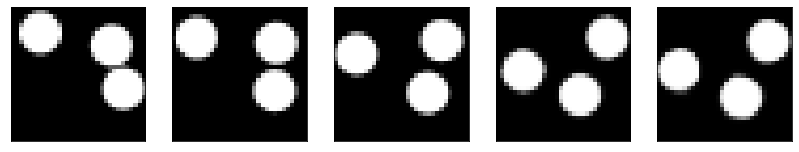

GD iterations:
i=0 | err=52.810528
i=1 | err=51.474873
i=2 | err=49.702694
i=3 | err=47.725502
i=4 | err=45.556652
i=5 | err=43.386616
i=6 | err=41.264622
i=7 | err=39.152325
i=8 | err=36.904114
i=9 | err=34.705662
i=10 | err=32.533245
i=11 | err=30.381973
i=12 | err=28.225487
i=13 | err=26.212677
i=14 | err=24.355850
i=15 | err=22.562506
i=16 | err=20.852867
i=17 | err=19.205528
i=18 | err=17.657881
i=19 | err=16.254709
i=20 | err=15.003546
i=21 | err=13.847130
i=22 | err=12.800519
i=23 | err=11.828632
i=24 | err=10.928907
i=25 | err=10.075744
i=26 | err=9.269739
i=27 | err=8.512379
i=28 | err=7.782394
i=29 | err=7.074749
Epoch=273 (83%) | out_positive=0.913173 | out_negative=0.112088 | mse=0.076698


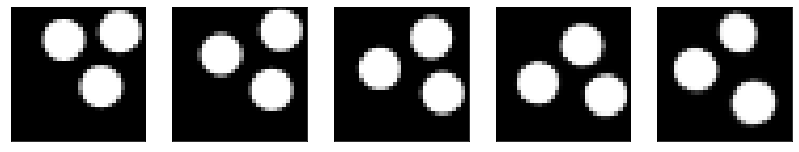

GD iterations:
i=0 | err=54.503551
i=1 | err=53.213600
i=2 | err=51.496597
i=3 | err=49.628201
i=4 | err=47.675644
i=5 | err=45.570328
i=6 | err=43.412296
i=7 | err=41.191860
i=8 | err=38.962608
i=9 | err=36.657784
i=10 | err=34.406975
i=11 | err=32.218395
i=12 | err=30.056160
i=13 | err=27.842861
i=14 | err=25.687305
i=15 | err=23.539816
i=16 | err=21.619476
i=17 | err=19.906372
i=18 | err=18.347221
i=19 | err=16.894690
i=20 | err=15.518498
i=21 | err=14.236773
i=22 | err=13.028060
i=23 | err=11.891878
i=24 | err=10.866751
i=25 | err=9.900225
i=26 | err=9.029881
i=27 | err=8.211422
i=28 | err=7.448865
i=29 | err=6.730262
Epoch=273 (85%) | out_positive=0.856258 | out_negative=0.138429 | mse=0.065090


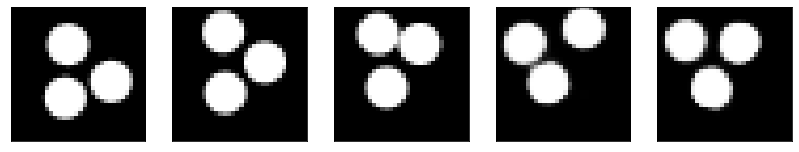

GD iterations:
i=0 | err=51.768562
i=1 | err=50.465939
i=2 | err=48.721756
i=3 | err=46.808929
i=4 | err=44.785580
i=5 | err=42.679478
i=6 | err=40.502838
i=7 | err=38.363510
i=8 | err=36.142250
i=9 | err=34.032867
i=10 | err=31.895159
i=11 | err=29.819567
i=12 | err=27.801849
i=13 | err=25.855808
i=14 | err=23.997990
i=15 | err=22.124954
i=16 | err=20.321398
i=17 | err=18.650085
i=18 | err=17.153625
i=19 | err=15.773032
i=20 | err=14.511351
i=21 | err=13.347355
i=22 | err=12.236021
i=23 | err=11.203524
i=24 | err=10.266624
i=25 | err=9.393043
i=26 | err=8.581609
i=27 | err=7.836327
i=28 | err=7.138556
i=29 | err=6.463736
Epoch=273 (87%) | out_positive=0.815027 | out_negative=0.151141 | mse=0.063042


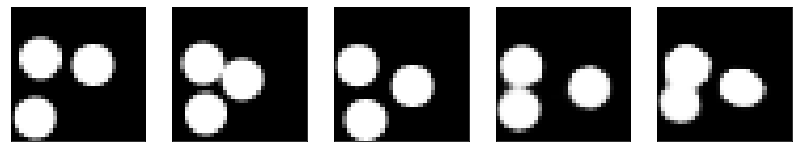

GD iterations:
i=0 | err=56.865555
i=1 | err=55.590900
i=2 | err=53.819550
i=3 | err=51.869942
i=4 | err=49.781166
i=5 | err=47.596405
i=6 | err=45.340683
i=7 | err=42.950817
i=8 | err=40.523968
i=9 | err=38.172550
i=10 | err=35.849701
i=11 | err=33.610844
i=12 | err=31.352449
i=13 | err=29.153198
i=14 | err=27.008577
i=15 | err=24.905025
i=16 | err=22.831509
i=17 | err=20.918625
i=18 | err=19.123775
i=19 | err=17.508747
i=20 | err=16.009861
i=21 | err=14.695901
i=22 | err=13.452797
i=23 | err=12.289156
i=24 | err=11.242575
i=25 | err=10.254871
i=26 | err=9.369959
i=27 | err=8.544832
i=28 | err=7.736198
i=29 | err=6.984710
Epoch=273 (89%) | out_positive=0.827836 | out_negative=0.122791 | mse=0.071496


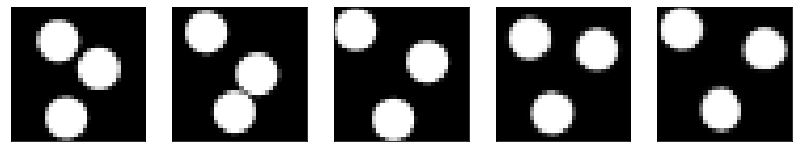

GD iterations:
i=0 | err=55.585732
i=1 | err=54.363102
i=2 | err=52.596268
i=3 | err=50.698906
i=4 | err=48.690437
i=5 | err=46.671028
i=6 | err=44.580963
i=7 | err=42.390572
i=8 | err=40.069443
i=9 | err=37.702072
i=10 | err=35.403488
i=11 | err=33.139626
i=12 | err=30.927896
i=13 | err=28.772564
i=14 | err=26.667603
i=15 | err=24.714703
i=16 | err=22.826487
i=17 | err=21.072702
i=18 | err=19.414703
i=19 | err=17.908178
i=20 | err=16.524340
i=21 | err=15.235542
i=22 | err=14.000171
i=23 | err=12.842062
i=24 | err=11.735568
i=25 | err=10.684767
i=26 | err=9.708489
i=27 | err=8.796638
i=28 | err=7.951378
i=29 | err=7.143726
Epoch=273 (90%) | out_positive=0.878868 | out_negative=0.119094 | mse=0.076025


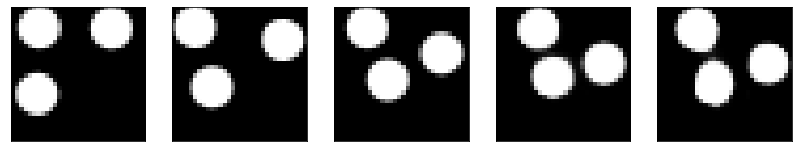

GD iterations:
i=0 | err=58.552231
i=1 | err=57.236336
i=2 | err=55.465435
i=3 | err=53.507881
i=4 | err=51.376953
i=5 | err=49.289356
i=6 | err=47.000290
i=7 | err=44.593632
i=8 | err=41.994904
i=9 | err=39.414066
i=10 | err=36.896507
i=11 | err=34.412773
i=12 | err=32.097519
i=13 | err=29.882999
i=14 | err=27.759239
i=15 | err=25.638531
i=16 | err=23.641630
i=17 | err=21.794607
i=18 | err=20.055862
i=19 | err=18.419394
i=20 | err=16.896235
i=21 | err=15.504099
i=22 | err=14.232855
i=23 | err=13.033602
i=24 | err=11.914822
i=25 | err=10.882805
i=26 | err=9.926889
i=27 | err=9.019836
i=28 | err=8.153712
i=29 | err=7.325584
Epoch=273 (92%) | out_positive=0.864750 | out_negative=0.115606 | mse=0.074448


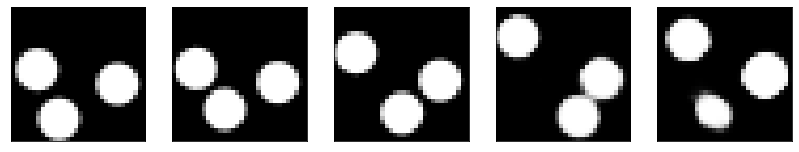

GD iterations:
i=0 | err=50.971436
i=1 | err=49.655098
i=2 | err=47.847485
i=3 | err=45.828133
i=4 | err=43.773865
i=5 | err=41.649403
i=6 | err=39.440880
i=7 | err=37.190887
i=8 | err=34.934467
i=9 | err=32.699913
i=10 | err=30.514240
i=11 | err=28.431284
i=12 | err=26.440468
i=13 | err=24.550739
i=14 | err=22.719807
i=15 | err=21.069300
i=16 | err=19.517000
i=17 | err=18.079048
i=18 | err=16.671892
i=19 | err=15.345072
i=20 | err=14.115553
i=21 | err=12.995629
i=22 | err=11.919014
i=23 | err=10.932377
i=24 | err=9.969744
i=25 | err=9.073142
i=26 | err=8.222624
i=27 | err=7.401331
i=28 | err=6.657897
i=29 | err=5.960682
Epoch=273 (94%) | out_positive=0.880723 | out_negative=0.147402 | mse=0.068497


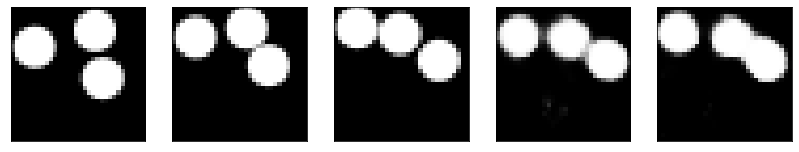

GD iterations:
i=0 | err=55.604713
i=1 | err=54.278809
i=2 | err=52.522106
i=3 | err=50.548187
i=4 | err=48.424156
i=5 | err=46.275288
i=6 | err=44.050888
i=7 | err=41.702858
i=8 | err=39.312710
i=9 | err=36.803970
i=10 | err=34.365852
i=11 | err=31.966818
i=12 | err=29.644281
i=13 | err=27.350695
i=14 | err=25.305201
i=15 | err=23.403599
i=16 | err=21.731163
i=17 | err=20.138571
i=18 | err=18.647436
i=19 | err=17.323982
i=20 | err=15.986924
i=21 | err=14.713218
i=22 | err=13.529387
i=23 | err=12.436974
i=24 | err=11.406120
i=25 | err=10.439266
i=26 | err=9.525434
i=27 | err=8.674141
i=28 | err=7.898948
i=29 | err=7.167051
Epoch=273 (96%) | out_positive=0.887180 | out_negative=0.089217 | mse=0.071098


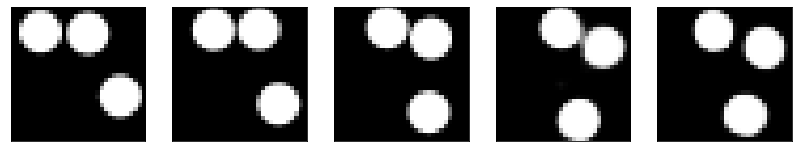

GD iterations:
i=0 | err=57.015511
i=1 | err=55.849411
i=2 | err=54.203075
i=3 | err=52.257973
i=4 | err=50.137657
i=5 | err=47.963821
i=6 | err=45.634071
i=7 | err=43.179821
i=8 | err=40.695213
i=9 | err=38.215893
i=10 | err=35.593285
i=11 | err=33.035751
i=12 | err=30.528671
i=13 | err=28.105114
i=14 | err=25.818708
i=15 | err=23.728140
i=16 | err=21.826300
i=17 | err=20.023073
i=18 | err=18.295456
i=19 | err=16.736324
i=20 | err=15.231225
i=21 | err=13.866201
i=22 | err=12.640965
i=23 | err=11.489502
i=24 | err=10.392397
i=25 | err=9.341491
i=26 | err=8.381830
i=27 | err=7.486941
i=28 | err=6.654951
i=29 | err=5.895202
Epoch=273 (98%) | out_positive=0.898545 | out_negative=0.138009 | mse=0.067419


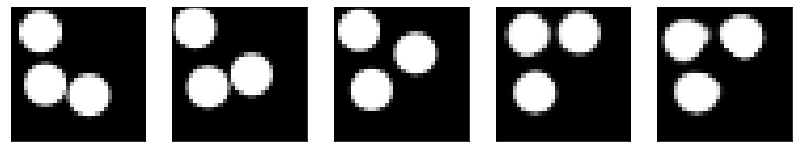

GD iterations:
i=0 | err=57.239357
i=1 | err=55.975021
i=2 | err=54.201729
i=3 | err=52.273384
i=4 | err=50.301121
i=5 | err=48.234032
i=6 | err=46.128441
i=7 | err=43.899551
i=8 | err=41.610638
i=9 | err=39.232143
i=10 | err=36.871128
i=11 | err=34.573551
i=12 | err=32.394222
i=13 | err=30.295345
i=14 | err=28.245579
i=15 | err=26.260952
i=16 | err=24.382519
i=17 | err=22.666645
i=18 | err=21.051420
i=19 | err=19.532539
i=20 | err=18.100864
i=21 | err=16.786716
i=22 | err=15.504736
i=23 | err=14.259995
i=24 | err=13.048888
i=25 | err=11.873445
i=26 | err=10.782348
i=27 | err=9.784674
i=28 | err=8.865686
i=29 | err=8.009537
Epoch=273 (100%) | out_positive=0.895320 | out_negative=0.103017 | mse=0.074525


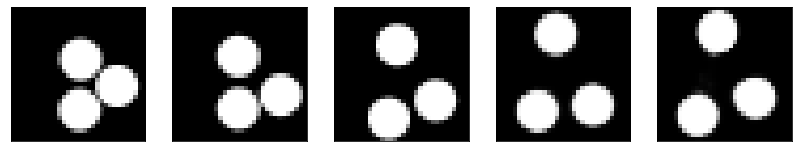

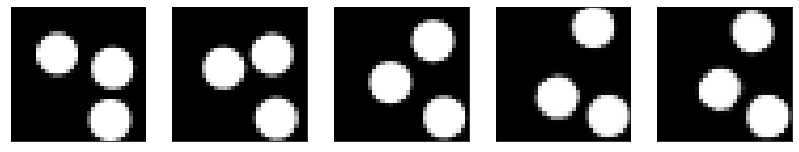

Test MSE 0.078090


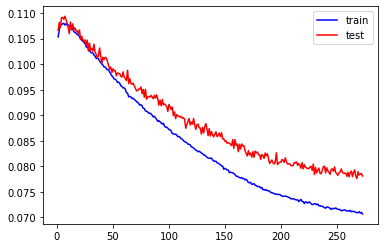

GD iterations:
i=0 | err=55.314583
i=1 | err=53.993530
i=2 | err=52.141060
i=3 | err=50.109829
i=4 | err=47.877201
i=5 | err=45.593765
i=6 | err=43.310474
i=7 | err=40.944294
i=8 | err=38.516739
i=9 | err=36.087997
i=10 | err=33.698990
i=11 | err=31.356400
i=12 | err=29.032187
i=13 | err=26.886959
i=14 | err=24.810537
i=15 | err=22.880863
i=16 | err=20.994732
i=17 | err=19.210436
i=18 | err=17.563135
i=19 | err=16.084612
i=20 | err=14.750360
i=21 | err=13.522865
i=22 | err=12.378134
i=23 | err=11.296620
i=24 | err=10.281973
i=25 | err=9.376707
i=26 | err=8.538359
i=27 | err=7.783182
i=28 | err=7.121306
i=29 | err=6.488485
Epoch=274 (0%) | out_positive=0.919439 | out_negative=0.157310 | mse=0.074444


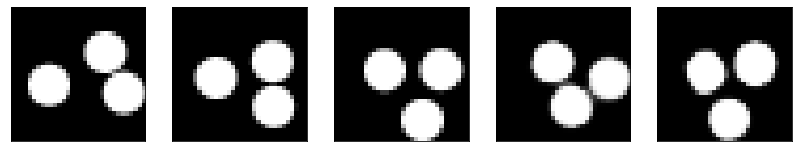

GD iterations:
i=0 | err=51.515137
i=1 | err=50.201973
i=2 | err=48.369076
i=3 | err=46.338081
i=4 | err=44.240494
i=5 | err=41.968315
i=6 | err=39.673874
i=7 | err=37.324692
i=8 | err=34.865601
i=9 | err=32.489632
i=10 | err=30.211979
i=11 | err=28.021307
i=12 | err=25.895723
i=13 | err=23.822617
i=14 | err=21.851337
i=15 | err=19.972784
i=16 | err=18.233124
i=17 | err=16.548964
i=18 | err=15.053265
i=19 | err=13.669006
i=20 | err=12.368566
i=21 | err=11.189295
i=22 | err=10.120637
i=23 | err=9.134390
i=24 | err=8.229494
i=25 | err=7.400256
i=26 | err=6.641335
i=27 | err=5.942675
i=28 | err=5.256627
i=29 | err=4.609862
Epoch=274 (2%) | out_positive=0.919251 | out_negative=0.210498 | mse=0.066984


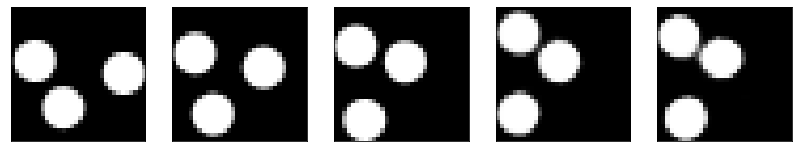

GD iterations:
i=0 | err=52.491280
i=1 | err=51.119804
i=2 | err=49.273956
i=3 | err=47.194702
i=4 | err=45.040543
i=5 | err=42.733032
i=6 | err=40.380184
i=7 | err=38.004280
i=8 | err=35.604973
i=9 | err=33.224037
i=10 | err=30.872078
i=11 | err=28.573112
i=12 | err=26.443054
i=13 | err=24.429369
i=14 | err=22.504513
i=15 | err=20.800987
i=16 | err=19.227139
i=17 | err=17.772537
i=18 | err=16.487850
i=19 | err=15.232979
i=20 | err=14.105256
i=21 | err=13.087154
i=22 | err=12.118778
i=23 | err=11.203808
i=24 | err=10.313384
i=25 | err=9.479126
i=26 | err=8.649660
i=27 | err=7.868811
i=28 | err=7.095255
i=29 | err=6.374143
Epoch=274 (4%) | out_positive=0.906991 | out_negative=0.162169 | mse=0.071369


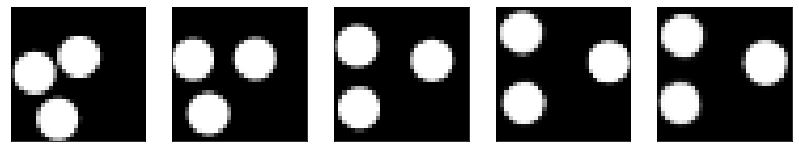

GD iterations:
i=0 | err=55.080528
i=1 | err=53.711796
i=2 | err=51.842175
i=3 | err=49.758812
i=4 | err=47.538353
i=5 | err=45.129478
i=6 | err=42.657852
i=7 | err=40.157410
i=8 | err=37.622559
i=9 | err=35.206638
i=10 | err=32.851463
i=11 | err=30.603819
i=12 | err=28.491680
i=13 | err=26.403240
i=14 | err=24.387409
i=15 | err=22.545502
i=16 | err=20.818119
i=17 | err=19.266106
i=18 | err=17.835686
i=19 | err=16.488079
i=20 | err=15.262511
i=21 | err=14.147191
i=22 | err=13.060799
i=23 | err=12.037073
i=24 | err=11.046659
i=25 | err=10.121144
i=26 | err=9.252152
i=27 | err=8.459511
i=28 | err=7.691632
i=29 | err=6.942308
Epoch=274 (6%) | out_positive=0.894209 | out_negative=0.109091 | mse=0.069127


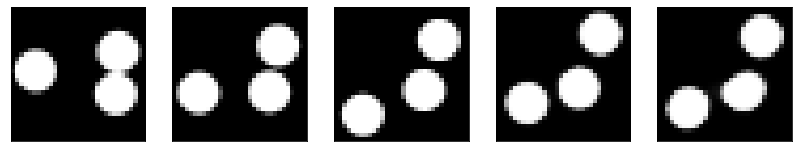

GD iterations:
i=0 | err=54.824890
i=1 | err=53.545666
i=2 | err=51.717140
i=3 | err=49.697281
i=4 | err=47.551163
i=5 | err=45.321991
i=6 | err=42.990086
i=7 | err=40.586128
i=8 | err=38.227314
i=9 | err=35.956070
i=10 | err=33.653252
i=11 | err=31.279781
i=12 | err=28.978268
i=13 | err=26.823034
i=14 | err=24.771160
i=15 | err=22.775574
i=16 | err=20.820795
i=17 | err=19.069477
i=18 | err=17.514034
i=19 | err=16.120436
i=20 | err=14.821707
i=21 | err=13.618080
i=22 | err=12.488298
i=23 | err=11.420259
i=24 | err=10.446911
i=25 | err=9.524544
i=26 | err=8.679563
i=27 | err=7.895821
i=28 | err=7.147383
i=29 | err=6.441564
Epoch=274 (8%) | out_positive=0.865418 | out_negative=0.096128 | mse=0.070945


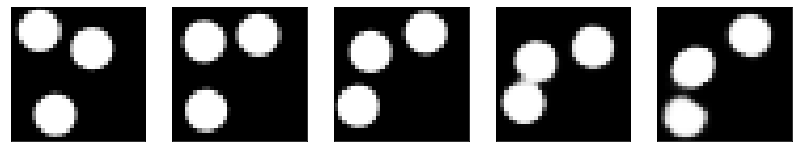

GD iterations:
i=0 | err=56.414742
i=1 | err=55.071659
i=2 | err=53.219955
i=3 | err=51.196941
i=4 | err=49.059212
i=5 | err=46.816719
i=6 | err=44.528034
i=7 | err=42.282181
i=8 | err=40.015495
i=9 | err=37.810352
i=10 | err=35.647400
i=11 | err=33.572575
i=12 | err=31.474129
i=13 | err=29.421892
i=14 | err=27.474506
i=15 | err=25.612221
i=16 | err=23.777254
i=17 | err=22.031816
i=18 | err=20.405249
i=19 | err=18.825294
i=20 | err=17.376368
i=21 | err=15.952309
i=22 | err=14.603621
i=23 | err=13.357979
i=24 | err=12.203100
i=25 | err=11.128172
i=26 | err=10.133691
i=27 | err=9.212913
i=28 | err=8.330237
i=29 | err=7.501504
Epoch=274 (9%) | out_positive=0.880981 | out_negative=0.126124 | mse=0.070664


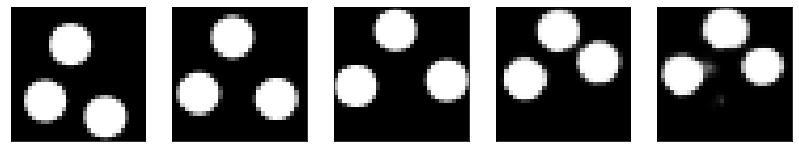

GD iterations:
i=0 | err=57.329010
i=1 | err=56.074856
i=2 | err=54.443939
i=3 | err=52.589432
i=4 | err=50.493484
i=5 | err=48.217842
i=6 | err=45.867386
i=7 | err=43.545761
i=8 | err=41.160339
i=9 | err=38.888031
i=10 | err=36.532654
i=11 | err=34.285316
i=12 | err=32.036575
i=13 | err=29.901352
i=14 | err=27.726276
i=15 | err=25.585205
i=16 | err=23.535162
i=17 | err=21.568645
i=18 | err=19.782427
i=19 | err=18.108353
i=20 | err=16.581211
i=21 | err=15.171988
i=22 | err=13.908442
i=23 | err=12.748294
i=24 | err=11.686649
i=25 | err=10.679708
i=26 | err=9.737554
i=27 | err=8.863228
i=28 | err=8.032669
i=29 | err=7.226851
Epoch=274 (11%) | out_positive=0.884682 | out_negative=0.098964 | mse=0.069986


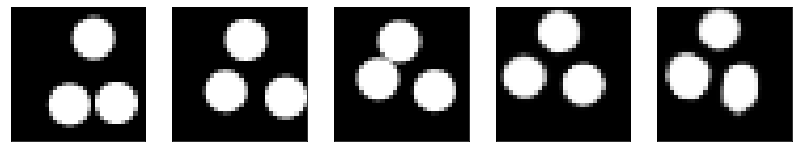

GD iterations:
i=0 | err=54.759396
i=1 | err=53.504887
i=2 | err=51.785107
i=3 | err=49.929680
i=4 | err=47.911606
i=5 | err=45.861130
i=6 | err=43.776714
i=7 | err=41.678951
i=8 | err=39.499496
i=9 | err=37.209511
i=10 | err=34.961449
i=11 | err=32.694359
i=12 | err=30.513857
i=13 | err=28.388214
i=14 | err=26.219181
i=15 | err=24.200035
i=16 | err=22.277744
i=17 | err=20.395563
i=18 | err=18.642593
i=19 | err=17.083475
i=20 | err=15.678736
i=21 | err=14.397598
i=22 | err=13.175131
i=23 | err=12.064301
i=24 | err=11.017667
i=25 | err=10.056954
i=26 | err=9.144650
i=27 | err=8.273165
i=28 | err=7.433232
i=29 | err=6.628772
Epoch=274 (13%) | out_positive=0.873371 | out_negative=0.139204 | mse=0.069087


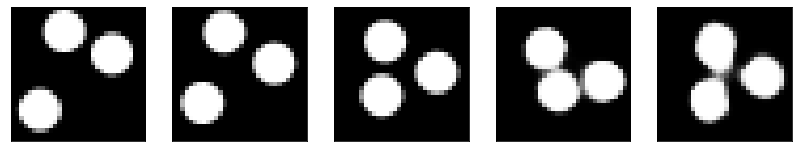

GD iterations:
i=0 | err=57.173569
i=1 | err=55.989517
i=2 | err=54.281357
i=3 | err=52.424290
i=4 | err=50.524704
i=5 | err=48.483521
i=6 | err=46.344284
i=7 | err=44.131378
i=8 | err=41.815613
i=9 | err=39.450539
i=10 | err=36.991524
i=11 | err=34.505356
i=12 | err=32.151703
i=13 | err=29.837564
i=14 | err=27.538727
i=15 | err=25.360146
i=16 | err=23.338875
i=17 | err=21.466217
i=18 | err=19.689629
i=19 | err=17.995363
i=20 | err=16.424431
i=21 | err=15.027142
i=22 | err=13.729582
i=23 | err=12.531749
i=24 | err=11.459779
i=25 | err=10.465630
i=26 | err=9.547949
i=27 | err=8.697412
i=28 | err=7.919629
i=29 | err=7.186043
Epoch=274 (15%) | out_positive=0.866867 | out_negative=0.094076 | mse=0.073064


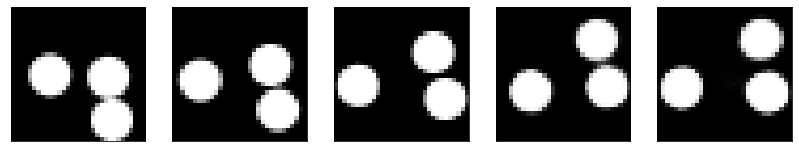

GD iterations:
i=0 | err=54.581982
i=1 | err=53.208946
i=2 | err=51.321865
i=3 | err=49.328186
i=4 | err=47.232517
i=5 | err=45.095058
i=6 | err=42.928719
i=7 | err=40.724869
i=8 | err=38.443539
i=9 | err=36.130997
i=10 | err=33.856716
i=11 | err=31.644836
i=12 | err=29.586437
i=13 | err=27.561478
i=14 | err=25.553787
i=15 | err=23.558731
i=16 | err=21.697102
i=17 | err=19.940609
i=18 | err=18.338076
i=19 | err=16.888168
i=20 | err=15.568048
i=21 | err=14.359859
i=22 | err=13.239443
i=23 | err=12.246567
i=24 | err=11.278874
i=25 | err=10.376616
i=26 | err=9.524477
i=27 | err=8.703324
i=28 | err=7.900008
i=29 | err=7.081302
Epoch=274 (17%) | out_positive=0.886644 | out_negative=0.161935 | mse=0.063872


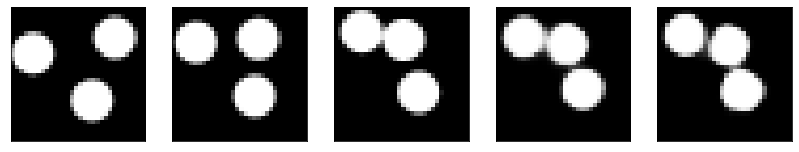

GD iterations:
i=0 | err=61.492458
i=1 | err=60.115650
i=2 | err=58.186562
i=3 | err=55.992413
i=4 | err=53.749290
i=5 | err=51.398205
i=6 | err=49.014481
i=7 | err=46.465023
i=8 | err=43.901051
i=9 | err=41.351547
i=10 | err=38.756458
i=11 | err=36.113777
i=12 | err=33.652248
i=13 | err=31.253325
i=14 | err=28.940754
i=15 | err=26.782932
i=16 | err=24.786934
i=17 | err=22.957001
i=18 | err=21.195179
i=19 | err=19.512669
i=20 | err=17.958729
i=21 | err=16.505825
i=22 | err=15.178900
i=23 | err=13.981775
i=24 | err=12.859206
i=25 | err=11.787113
i=26 | err=10.723215
i=27 | err=9.744269
i=28 | err=8.802040
i=29 | err=7.910999
Epoch=274 (19%) | out_positive=0.867666 | out_negative=0.098823 | mse=0.071250


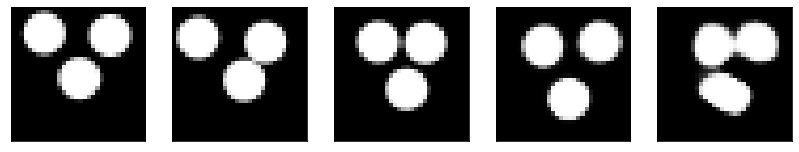

GD iterations:
i=0 | err=54.306335
i=1 | err=53.005947
i=2 | err=51.169144
i=3 | err=49.032406
i=4 | err=46.859200
i=5 | err=44.472244
i=6 | err=42.121929
i=7 | err=39.665947
i=8 | err=37.233006
i=9 | err=34.773956
i=10 | err=32.451485
i=11 | err=30.215374
i=12 | err=28.043341
i=13 | err=25.958076
i=14 | err=23.889523
i=15 | err=21.934177
i=16 | err=20.133293
i=17 | err=18.495745
i=18 | err=16.969875
i=19 | err=15.549238
i=20 | err=14.229931
i=21 | err=12.956059
i=22 | err=11.802803
i=23 | err=10.738125
i=24 | err=9.786734
i=25 | err=8.884443
i=26 | err=8.042496
i=27 | err=7.244294
i=28 | err=6.512407
i=29 | err=5.798067
Epoch=274 (20%) | out_positive=0.890931 | out_negative=0.123975 | mse=0.069371


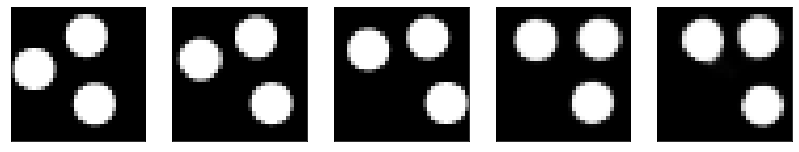

GD iterations:
i=0 | err=59.477196
i=1 | err=58.221924
i=2 | err=56.434113
i=3 | err=54.438751
i=4 | err=52.323341
i=5 | err=50.145813
i=6 | err=47.869263
i=7 | err=45.562515
i=8 | err=43.327957
i=9 | err=40.958221
i=10 | err=38.591789
i=11 | err=36.178715
i=12 | err=33.849228
i=13 | err=31.693565
i=14 | err=29.671619
i=15 | err=27.716963
i=16 | err=25.791180
i=17 | err=23.932137
i=18 | err=22.154079
i=19 | err=20.520802
i=20 | err=18.935366
i=21 | err=17.440544
i=22 | err=16.023535
i=23 | err=14.694057
i=24 | err=13.477787
i=25 | err=12.358362
i=26 | err=11.297626
i=27 | err=10.328039
i=28 | err=9.437225
i=29 | err=8.587710
Epoch=274 (22%) | out_positive=0.816815 | out_negative=0.097601 | mse=0.078842


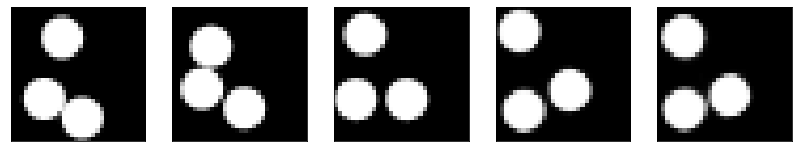

GD iterations:
i=0 | err=56.092377
i=1 | err=54.696354
i=2 | err=52.897263
i=3 | err=50.806969
i=4 | err=48.470703
i=5 | err=46.158054
i=6 | err=43.683159
i=7 | err=41.170647
i=8 | err=38.666210
i=9 | err=36.208153
i=10 | err=33.692963
i=11 | err=31.272205
i=12 | err=29.046356
i=13 | err=26.876081
i=14 | err=24.839663
i=15 | err=22.882893
i=16 | err=21.105896
i=17 | err=19.407028
i=18 | err=17.847946
i=19 | err=16.425280
i=20 | err=15.116148
i=21 | err=13.903032
i=22 | err=12.738254
i=23 | err=11.655290
i=24 | err=10.606319
i=25 | err=9.646269
i=26 | err=8.773868
i=27 | err=7.944373
i=28 | err=7.170547
i=29 | err=6.431045
Epoch=274 (24%) | out_positive=0.865126 | out_negative=0.129148 | mse=0.071045


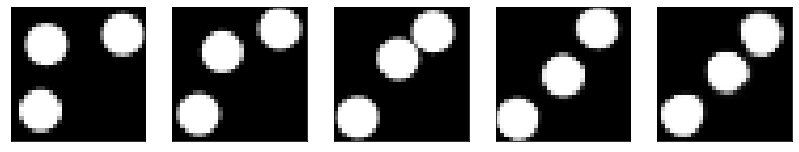

GD iterations:
i=0 | err=52.642876
i=1 | err=51.397324
i=2 | err=49.743111
i=3 | err=47.845615
i=4 | err=45.783333
i=5 | err=43.687679
i=6 | err=41.602024
i=7 | err=39.476826
i=8 | err=37.333549
i=9 | err=35.079941
i=10 | err=32.805923
i=11 | err=30.643410
i=12 | err=28.554935
i=13 | err=26.553062
i=14 | err=24.641693
i=15 | err=22.880806
i=16 | err=21.315636
i=17 | err=19.806034
i=18 | err=18.391914
i=19 | err=17.055384
i=20 | err=15.813835
i=21 | err=14.649183
i=22 | err=13.575452
i=23 | err=12.566531
i=24 | err=11.598789
i=25 | err=10.670611
i=26 | err=9.792305
i=27 | err=8.961900
i=28 | err=8.167366
i=29 | err=7.393363
Epoch=274 (26%) | out_positive=0.843882 | out_negative=0.082623 | mse=0.072917


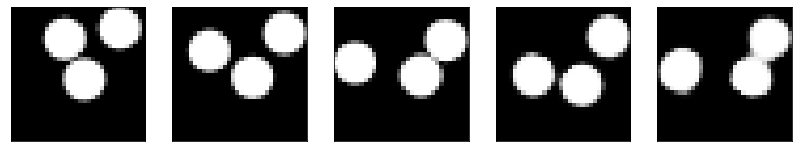

GD iterations:
i=0 | err=55.910912
i=1 | err=54.599823
i=2 | err=52.879692
i=3 | err=50.962532
i=4 | err=48.985653
i=5 | err=46.912346
i=6 | err=44.795837
i=7 | err=42.584591
i=8 | err=40.330200
i=9 | err=38.007011
i=10 | err=35.687027
i=11 | err=33.373245
i=12 | err=31.088314
i=13 | err=28.871056
i=14 | err=26.709866
i=15 | err=24.689411
i=16 | err=22.737139
i=17 | err=20.915066
i=18 | err=19.216202
i=19 | err=17.717762
i=20 | err=16.317892
i=21 | err=15.060500
i=22 | err=13.922885
i=23 | err=12.832954
i=24 | err=11.766925
i=25 | err=10.745129
i=26 | err=9.815791
i=27 | err=8.922232
i=28 | err=8.044548
i=29 | err=7.203602
Epoch=274 (28%) | out_positive=0.841618 | out_negative=0.109936 | mse=0.069439


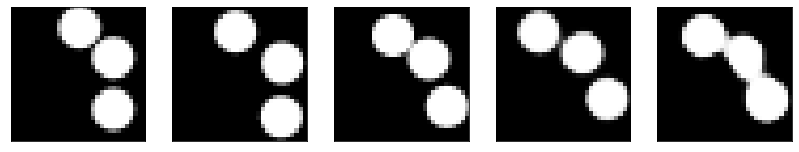

GD iterations:
i=0 | err=52.972958
i=1 | err=51.829201
i=2 | err=50.289162
i=3 | err=48.529778
i=4 | err=46.684959
i=5 | err=44.743160
i=6 | err=42.711891
i=7 | err=40.600948
i=8 | err=38.326904
i=9 | err=35.953526
i=10 | err=33.531174
i=11 | err=31.064539
i=12 | err=28.675919
i=13 | err=26.360847
i=14 | err=24.263922
i=15 | err=22.423065
i=16 | err=20.741604
i=17 | err=19.083916
i=18 | err=17.567625
i=19 | err=16.146469
i=20 | err=14.828853
i=21 | err=13.577603
i=22 | err=12.373789
i=23 | err=11.223740
i=24 | err=10.162774
i=25 | err=9.212133
i=26 | err=8.286147
i=27 | err=7.413385
i=28 | err=6.600028
i=29 | err=5.862961
Epoch=274 (30%) | out_positive=0.909305 | out_negative=0.146721 | mse=0.067531


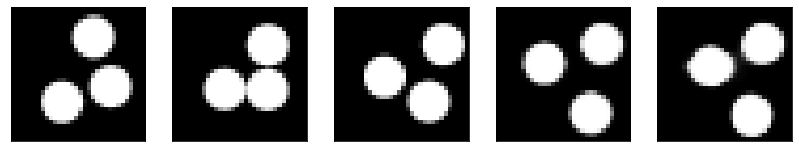

GD iterations:
i=0 | err=50.330284
i=1 | err=48.946747
i=2 | err=47.068237
i=3 | err=45.026688
i=4 | err=42.826267
i=5 | err=40.606670
i=6 | err=38.301193
i=7 | err=36.042381
i=8 | err=33.800934
i=9 | err=31.615377
i=10 | err=29.482761
i=11 | err=27.390835
i=12 | err=25.305195
i=13 | err=23.286442
i=14 | err=21.386742
i=15 | err=19.686243
i=16 | err=18.107353
i=17 | err=16.685795
i=18 | err=15.423911
i=19 | err=14.269585
i=20 | err=13.181806
i=21 | err=12.128145
i=22 | err=11.142050
i=23 | err=10.209278
i=24 | err=9.324800
i=25 | err=8.483080
i=26 | err=7.688687
i=27 | err=6.914455
i=28 | err=6.168077
i=29 | err=5.447516
Epoch=274 (32%) | out_positive=0.930920 | out_negative=0.197892 | mse=0.065172


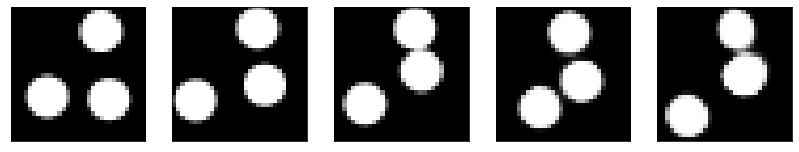

GD iterations:
i=0 | err=54.891380
i=1 | err=53.632904
i=2 | err=51.954781
i=3 | err=50.025177
i=4 | err=47.862579
i=5 | err=45.810135
i=6 | err=43.693550
i=7 | err=41.598763
i=8 | err=39.415741
i=9 | err=37.255497
i=10 | err=35.093956
i=11 | err=33.058109
i=12 | err=31.162983
i=13 | err=29.345459
i=14 | err=27.514683
i=15 | err=25.726734
i=16 | err=23.938736
i=17 | err=22.296230
i=18 | err=20.739212
i=19 | err=19.286533
i=20 | err=17.855474
i=21 | err=16.541132
i=22 | err=15.237546
i=23 | err=14.015025
i=24 | err=12.860515
i=25 | err=11.787100
i=26 | err=10.782883
i=27 | err=9.852516
i=28 | err=8.967099
i=29 | err=8.150644
Epoch=274 (33%) | out_positive=0.856237 | out_negative=0.073954 | mse=0.070884


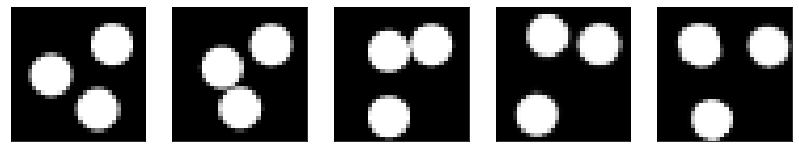

GD iterations:
i=0 | err=58.429695
i=1 | err=56.978294
i=2 | err=55.069798
i=3 | err=53.024277
i=4 | err=50.865746
i=5 | err=48.651726
i=6 | err=46.383240
i=7 | err=44.053177
i=8 | err=41.698902
i=9 | err=39.171608
i=10 | err=36.696930
i=11 | err=34.270363
i=12 | err=31.966536
i=13 | err=29.630806
i=14 | err=27.444113
i=15 | err=25.368225
i=16 | err=23.408916
i=17 | err=21.489990
i=18 | err=19.655712
i=19 | err=17.930000
i=20 | err=16.342896
i=21 | err=14.910892
i=22 | err=13.630331
i=23 | err=12.456991
i=24 | err=11.369300
i=25 | err=10.350771
i=26 | err=9.387098
i=27 | err=8.465541
i=28 | err=7.579888
i=29 | err=6.740293
Epoch=274 (35%) | out_positive=0.887338 | out_negative=0.144659 | mse=0.067136


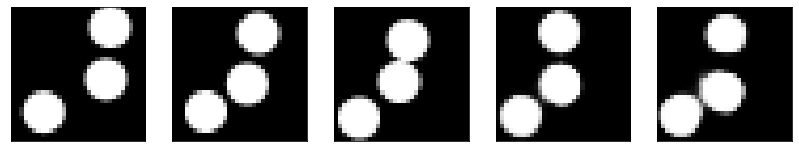

GD iterations:
i=0 | err=53.874660
i=1 | err=52.624054
i=2 | err=50.831131
i=3 | err=48.929916
i=4 | err=46.960342
i=5 | err=44.944687
i=6 | err=42.893166
i=7 | err=40.817715
i=8 | err=38.680748
i=9 | err=36.525845
i=10 | err=34.434731
i=11 | err=32.384392
i=12 | err=30.333504
i=13 | err=28.338943
i=14 | err=26.399395
i=15 | err=24.556156
i=16 | err=22.818018
i=17 | err=21.221478
i=18 | err=19.723900
i=19 | err=18.352463
i=20 | err=17.046711
i=21 | err=15.735793
i=22 | err=14.486876
i=23 | err=13.295423
i=24 | err=12.178550
i=25 | err=11.123081
i=26 | err=10.147724
i=27 | err=9.236784
i=28 | err=8.351500
i=29 | err=7.536980
Epoch=274 (37%) | out_positive=0.901902 | out_negative=0.143158 | mse=0.076005


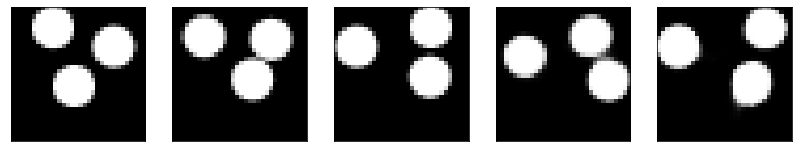

GD iterations:
i=0 | err=49.388618
i=1 | err=48.227478
i=2 | err=46.586266
i=3 | err=44.812496
i=4 | err=42.970173
i=5 | err=41.154778
i=6 | err=39.340981
i=7 | err=37.504311
i=8 | err=35.585659
i=9 | err=33.598843
i=10 | err=31.542164
i=11 | err=29.514523
i=12 | err=27.608620
i=13 | err=25.758640
i=14 | err=23.897720
i=15 | err=22.083349
i=16 | err=20.375307
i=17 | err=18.787880
i=18 | err=17.371302
i=19 | err=16.036942
i=20 | err=14.753311
i=21 | err=13.573460
i=22 | err=12.442157
i=23 | err=11.346733
i=24 | err=10.332197
i=25 | err=9.401951
i=26 | err=8.529701
i=27 | err=7.707606
i=28 | err=6.928869
i=29 | err=6.191378
Epoch=274 (39%) | out_positive=0.924513 | out_negative=0.129188 | mse=0.071191


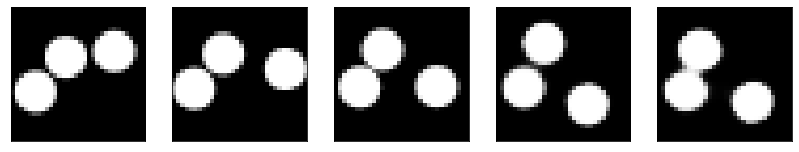

GD iterations:
i=0 | err=56.778885
i=1 | err=55.386032
i=2 | err=53.489868
i=3 | err=51.362312
i=4 | err=49.069447
i=5 | err=46.680611
i=6 | err=44.260738
i=7 | err=41.814716
i=8 | err=39.378197
i=9 | err=36.987526
i=10 | err=34.662506
i=11 | err=32.323982
i=12 | err=30.061092
i=13 | err=27.923723
i=14 | err=25.881493
i=15 | err=23.955521
i=16 | err=22.146076
i=17 | err=20.445412
i=18 | err=18.920094
i=19 | err=17.507126
i=20 | err=16.179714
i=21 | err=14.932971
i=22 | err=13.798705
i=23 | err=12.760790
i=24 | err=11.840342
i=25 | err=10.950739
i=26 | err=10.062811
i=27 | err=9.240891
i=28 | err=8.388628
i=29 | err=7.556894
Epoch=274 (41%) | out_positive=0.891265 | out_negative=0.108537 | mse=0.070069


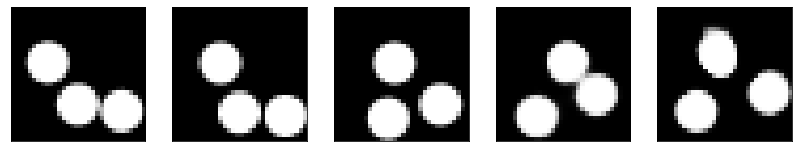

GD iterations:
i=0 | err=54.646671
i=1 | err=53.366707
i=2 | err=51.702492
i=3 | err=49.914474
i=4 | err=47.998924
i=5 | err=46.122238
i=6 | err=44.195404
i=7 | err=42.090313
i=8 | err=39.987816
i=9 | err=37.825077
i=10 | err=35.659775
i=11 | err=33.440964
i=12 | err=31.257141
i=13 | err=29.092945
i=14 | err=26.994781
i=15 | err=24.976545
i=16 | err=22.986387
i=17 | err=21.201284
i=18 | err=19.604404
i=19 | err=18.133780
i=20 | err=16.786695
i=21 | err=15.504634
i=22 | err=14.357454
i=23 | err=13.290205
i=24 | err=12.274656
i=25 | err=11.360821
i=26 | err=10.483473
i=27 | err=9.638498
i=28 | err=8.820827
i=29 | err=8.043402
Epoch=274 (43%) | out_positive=0.887050 | out_negative=0.091114 | mse=0.078706


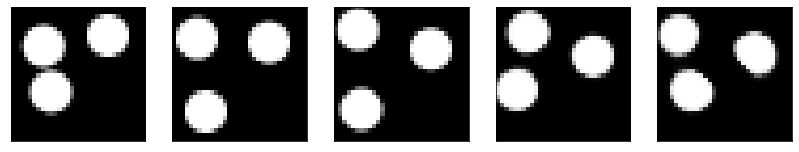

GD iterations:
i=0 | err=55.372910
i=1 | err=54.130569
i=2 | err=52.413086
i=3 | err=50.464188
i=4 | err=48.403233
i=5 | err=46.209850
i=6 | err=44.057034
i=7 | err=41.790833
i=8 | err=39.537682
i=9 | err=37.191135
i=10 | err=34.859901
i=11 | err=32.525795
i=12 | err=30.291721
i=13 | err=28.158260
i=14 | err=26.119972
i=15 | err=24.215990
i=16 | err=22.371376
i=17 | err=20.618938
i=18 | err=18.975708
i=19 | err=17.479336
i=20 | err=16.066103
i=21 | err=14.787987
i=22 | err=13.583005
i=23 | err=12.478303
i=24 | err=11.420637
i=25 | err=10.416721
i=26 | err=9.468039
i=27 | err=8.524393
i=28 | err=7.699404
i=29 | err=6.902126
Epoch=274 (44%) | out_positive=0.879144 | out_negative=0.124146 | mse=0.073269


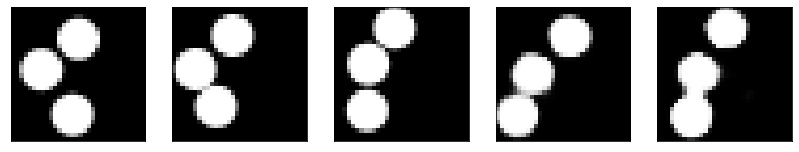

GD iterations:
i=0 | err=53.627453
i=1 | err=52.382469
i=2 | err=50.742527
i=3 | err=48.916275
i=4 | err=46.986790
i=5 | err=45.002045
i=6 | err=42.961750
i=7 | err=40.935192
i=8 | err=38.885574
i=9 | err=36.683235
i=10 | err=34.553856
i=11 | err=32.493298
i=12 | err=30.490726
i=13 | err=28.571966
i=14 | err=26.731167
i=15 | err=24.923418
i=16 | err=23.200357
i=17 | err=21.521244
i=18 | err=19.946518
i=19 | err=18.447205
i=20 | err=17.027763
i=21 | err=15.697634
i=22 | err=14.386010
i=23 | err=13.157917
i=24 | err=12.021276
i=25 | err=10.956202
i=26 | err=9.955526
i=27 | err=9.015274
i=28 | err=8.121380
i=29 | err=7.276204
Epoch=274 (46%) | out_positive=0.849100 | out_negative=0.126760 | mse=0.071913


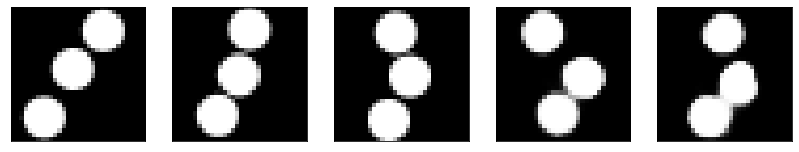

GD iterations:
i=0 | err=53.828922
i=1 | err=52.573212
i=2 | err=50.940254
i=3 | err=49.157433
i=4 | err=47.239498
i=5 | err=45.212852
i=6 | err=43.154900
i=7 | err=41.046009
i=8 | err=38.839546
i=9 | err=36.535702
i=10 | err=34.115105
i=11 | err=31.700756
i=12 | err=29.390244
i=13 | err=27.215611
i=14 | err=25.264780
i=15 | err=23.482361
i=16 | err=21.808699
i=17 | err=20.210339
i=18 | err=18.722435
i=19 | err=17.282938
i=20 | err=15.935559
i=21 | err=14.645959
i=22 | err=13.403305
i=23 | err=12.269682
i=24 | err=11.195279
i=25 | err=10.185137
i=26 | err=9.224499
i=27 | err=8.312582
i=28 | err=7.479277
i=29 | err=6.695527
Epoch=274 (48%) | out_positive=0.884487 | out_negative=0.143605 | mse=0.072379


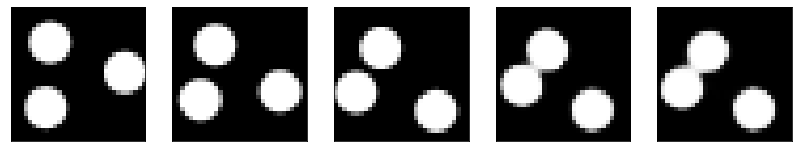

GD iterations:
i=0 | err=51.856625
i=1 | err=50.617844
i=2 | err=48.834496
i=3 | err=46.974079
i=4 | err=45.030201
i=5 | err=42.970337
i=6 | err=40.821266
i=7 | err=38.599747
i=8 | err=36.421715
i=9 | err=34.195114
i=10 | err=31.971977
i=11 | err=29.846386
i=12 | err=27.838158
i=13 | err=25.896360
i=14 | err=24.024376
i=15 | err=22.332439
i=16 | err=20.730747
i=17 | err=19.271036
i=18 | err=17.826309
i=19 | err=16.375551
i=20 | err=15.010822
i=21 | err=13.742979
i=22 | err=12.525890
i=23 | err=11.422075
i=24 | err=10.402561
i=25 | err=9.449377
i=26 | err=8.556034
i=27 | err=7.664412
i=28 | err=6.809005
i=29 | err=5.993245
Epoch=274 (50%) | out_positive=0.898385 | out_negative=0.114936 | mse=0.065997


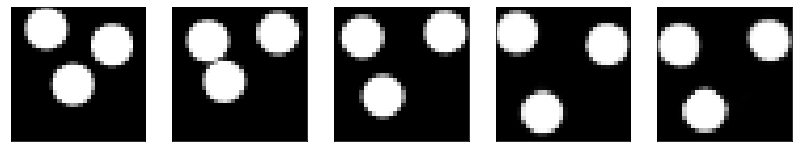

GD iterations:
i=0 | err=54.528522
i=1 | err=53.124695
i=2 | err=51.233379
i=3 | err=49.216175
i=4 | err=46.992538
i=5 | err=44.723457
i=6 | err=42.391655
i=7 | err=40.046783
i=8 | err=37.665306
i=9 | err=35.271839
i=10 | err=32.996277
i=11 | err=30.818306
i=12 | err=28.785484
i=13 | err=26.847095
i=14 | err=25.023594
i=15 | err=23.371235
i=16 | err=21.849030
i=17 | err=20.396885
i=18 | err=19.008198
i=19 | err=17.705944
i=20 | err=16.405203
i=21 | err=15.166924
i=22 | err=14.012512
i=23 | err=12.917881
i=24 | err=11.881569
i=25 | err=10.869524
i=26 | err=9.917762
i=27 | err=8.986180
i=28 | err=8.059898
i=29 | err=7.202828
Epoch=274 (52%) | out_positive=0.842317 | out_negative=0.102228 | mse=0.067794


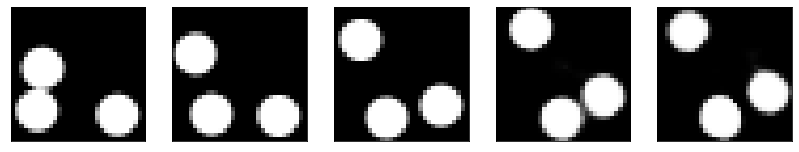

GD iterations:
i=0 | err=56.702232
i=1 | err=55.358620
i=2 | err=53.530586
i=3 | err=51.478489
i=4 | err=49.250786
i=5 | err=47.018528
i=6 | err=44.741291
i=7 | err=42.492958
i=8 | err=40.255947
i=9 | err=37.984871
i=10 | err=35.687546
i=11 | err=33.442932
i=12 | err=31.353361
i=13 | err=29.272938
i=14 | err=27.277325
i=15 | err=25.415239
i=16 | err=23.658115
i=17 | err=21.975491
i=18 | err=20.345058
i=19 | err=18.783539
i=20 | err=17.292664
i=21 | err=15.825403
i=22 | err=14.414906
i=23 | err=13.084047
i=24 | err=11.907806
i=25 | err=10.782335
i=26 | err=9.740387
i=27 | err=8.767708
i=28 | err=7.870972
i=29 | err=7.032547
Epoch=274 (54%) | out_positive=0.850742 | out_negative=0.103611 | mse=0.066802


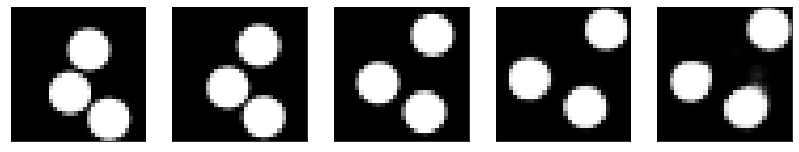

GD iterations:
i=0 | err=54.268864
i=1 | err=52.896381
i=2 | err=51.068062
i=3 | err=49.007229
i=4 | err=46.898075
i=5 | err=44.715069
i=6 | err=42.426208
i=7 | err=40.155724
i=8 | err=37.868706
i=9 | err=35.597469
i=10 | err=33.328632
i=11 | err=31.110752
i=12 | err=28.882225
i=13 | err=26.714903
i=14 | err=24.724463
i=15 | err=22.900227
i=16 | err=21.203018
i=17 | err=19.558945
i=18 | err=18.070913
i=19 | err=16.715052
i=20 | err=15.432911
i=21 | err=14.228033
i=22 | err=13.112443
i=23 | err=12.038655
i=24 | err=11.071848
i=25 | err=10.159801
i=26 | err=9.301433
i=27 | err=8.500710
i=28 | err=7.735373
i=29 | err=7.007466
Epoch=274 (56%) | out_positive=0.900831 | out_negative=0.155638 | mse=0.071297


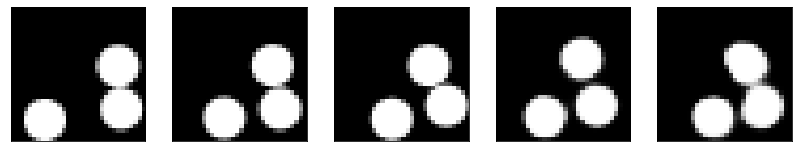

GD iterations:
i=0 | err=57.901398
i=1 | err=56.625488
i=2 | err=54.834770
i=3 | err=52.805862
i=4 | err=50.590405
i=5 | err=48.249260
i=6 | err=45.776138
i=7 | err=43.268986
i=8 | err=40.754250
i=9 | err=38.146797
i=10 | err=35.509151
i=11 | err=32.891262
i=12 | err=30.273617
i=13 | err=27.780947
i=14 | err=25.402798
i=15 | err=23.146788
i=16 | err=21.087627
i=17 | err=19.227352
i=18 | err=17.485525
i=19 | err=15.846121
i=20 | err=14.374433
i=21 | err=13.036487
i=22 | err=11.802860
i=23 | err=10.661215
i=24 | err=9.622177
i=25 | err=8.655465
i=26 | err=7.770697
i=27 | err=6.943570
i=28 | err=6.159748
i=29 | err=5.425984
Epoch=274 (57%) | out_positive=0.857417 | out_negative=0.162414 | mse=0.067692


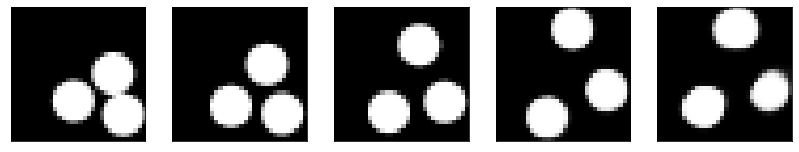

GD iterations:
i=0 | err=55.375931
i=1 | err=53.983429
i=2 | err=52.032242
i=3 | err=49.933033
i=4 | err=47.701698
i=5 | err=45.472061
i=6 | err=43.222332
i=7 | err=40.931564
i=8 | err=38.719612
i=9 | err=36.501152
i=10 | err=34.256172
i=11 | err=32.101112
i=12 | err=29.949541
i=13 | err=27.913275
i=14 | err=25.929003
i=15 | err=24.020479
i=16 | err=22.242836
i=17 | err=20.589336
i=18 | err=19.056372
i=19 | err=17.675016
i=20 | err=16.372330
i=21 | err=15.172553
i=22 | err=14.061668
i=23 | err=13.029020
i=24 | err=12.037208
i=25 | err=11.089730
i=26 | err=10.181175
i=27 | err=9.279315
i=28 | err=8.382498
i=29 | err=7.468062
Epoch=274 (59%) | out_positive=0.894602 | out_negative=0.105038 | mse=0.071456


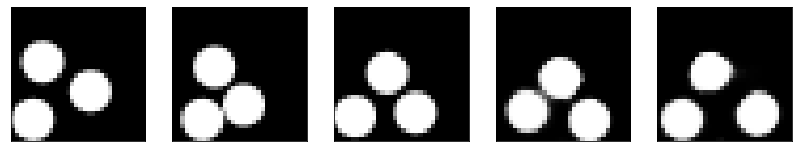

GD iterations:
i=0 | err=59.496719
i=1 | err=58.157127
i=2 | err=56.284397
i=3 | err=54.225803
i=4 | err=52.015503
i=5 | err=49.699020
i=6 | err=47.312523
i=7 | err=44.710159
i=8 | err=42.048218
i=9 | err=39.315277
i=10 | err=36.658585
i=11 | err=34.095245
i=12 | err=31.616230
i=13 | err=29.222008
i=14 | err=27.050943
i=15 | err=24.980034
i=16 | err=23.054771
i=17 | err=21.209839
i=18 | err=19.434692
i=19 | err=17.774300
i=20 | err=16.292076
i=21 | err=14.936514
i=22 | err=13.679503
i=23 | err=12.528824
i=24 | err=11.442284
i=25 | err=10.388477
i=26 | err=9.389221
i=27 | err=8.412478
i=28 | err=7.493979
i=29 | err=6.614627
Epoch=274 (61%) | out_positive=0.890586 | out_negative=0.165758 | mse=0.072563


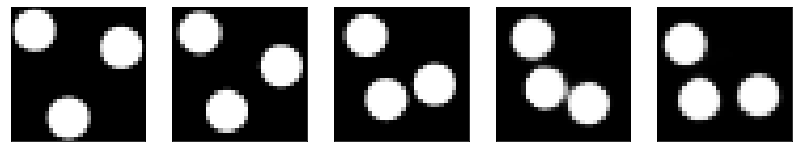

GD iterations:
i=0 | err=56.493320
i=1 | err=55.215675
i=2 | err=53.325089
i=3 | err=51.232567
i=4 | err=49.021271
i=5 | err=46.623859
i=6 | err=44.175461
i=7 | err=41.698643
i=8 | err=39.169014
i=9 | err=36.566307
i=10 | err=34.011520
i=11 | err=31.591171
i=12 | err=29.224941
i=13 | err=27.080633
i=14 | err=25.022068
i=15 | err=23.099436
i=16 | err=21.256512
i=17 | err=19.553438
i=18 | err=17.950323
i=19 | err=16.469406
i=20 | err=15.099413
i=21 | err=13.871927
i=22 | err=12.761021
i=23 | err=11.729207
i=24 | err=10.750120
i=25 | err=9.865131
i=26 | err=9.020209
i=27 | err=8.216067
i=28 | err=7.423264
i=29 | err=6.641261
Epoch=274 (63%) | out_positive=0.879591 | out_negative=0.179499 | mse=0.072184


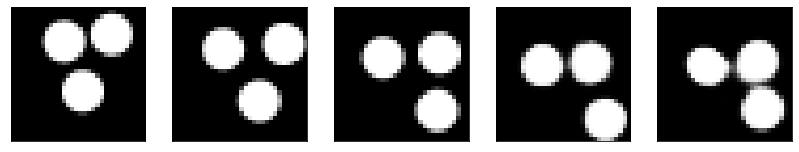

GD iterations:
i=0 | err=55.212051
i=1 | err=54.010323
i=2 | err=52.274071
i=3 | err=50.312714
i=4 | err=48.291412
i=5 | err=46.110306
i=6 | err=43.768478
i=7 | err=41.473373
i=8 | err=39.106960
i=9 | err=36.746429
i=10 | err=34.392941
i=11 | err=32.085678
i=12 | err=29.795012
i=13 | err=27.525719
i=14 | err=25.337200
i=15 | err=23.241405
i=16 | err=21.295822
i=17 | err=19.510239
i=18 | err=17.828733
i=19 | err=16.338566
i=20 | err=14.978160
i=21 | err=13.770876
i=22 | err=12.657436
i=23 | err=11.615000
i=24 | err=10.626481
i=25 | err=9.723888
i=26 | err=8.900926
i=27 | err=8.141523
i=28 | err=7.402280
i=29 | err=6.690641
Epoch=274 (65%) | out_positive=0.891173 | out_negative=0.110602 | mse=0.071712


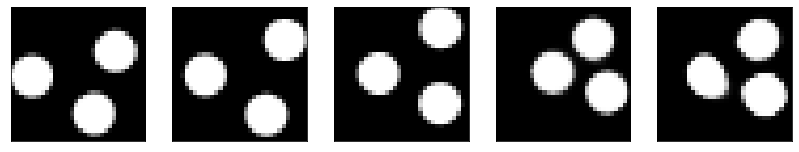

GD iterations:
i=0 | err=55.567245
i=1 | err=54.241776
i=2 | err=52.533424
i=3 | err=50.627434
i=4 | err=48.602360
i=5 | err=46.534531
i=6 | err=44.440971
i=7 | err=42.290531
i=8 | err=40.079674
i=9 | err=37.774910
i=10 | err=35.343384
i=11 | err=32.927574
i=12 | err=30.628462
i=13 | err=28.526661
i=14 | err=26.449251
i=15 | err=24.592154
i=16 | err=22.819798
i=17 | err=21.177679
i=18 | err=19.580051
i=19 | err=18.098387
i=20 | err=16.704082
i=21 | err=15.374756
i=22 | err=14.124035
i=23 | err=12.980609
i=24 | err=11.844159
i=25 | err=10.812218
i=26 | err=9.849154
i=27 | err=8.966086
i=28 | err=8.127121
i=29 | err=7.317005
Epoch=274 (67%) | out_positive=0.845225 | out_negative=0.114351 | mse=0.068320


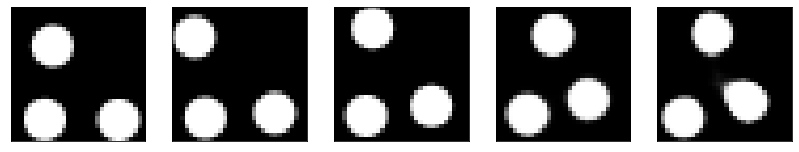

GD iterations:
i=0 | err=50.394699
i=1 | err=49.144173
i=2 | err=47.450401
i=3 | err=45.536491
i=4 | err=43.502960
i=5 | err=41.369366
i=6 | err=39.222248
i=7 | err=37.170677
i=8 | err=35.094929
i=9 | err=33.088879
i=10 | err=31.068546
i=11 | err=29.087502
i=12 | err=27.206898
i=13 | err=25.450489
i=14 | err=23.803612
i=15 | err=22.217445
i=16 | err=20.713169
i=17 | err=19.258551
i=18 | err=17.876158
i=19 | err=16.576822
i=20 | err=15.350286
i=21 | err=14.228111
i=22 | err=13.164817
i=23 | err=12.181043
i=24 | err=11.232693
i=25 | err=10.290459
i=26 | err=9.394032
i=27 | err=8.526568
i=28 | err=7.732903
i=29 | err=6.989235
Epoch=274 (68%) | out_positive=0.919608 | out_negative=0.131933 | mse=0.065402


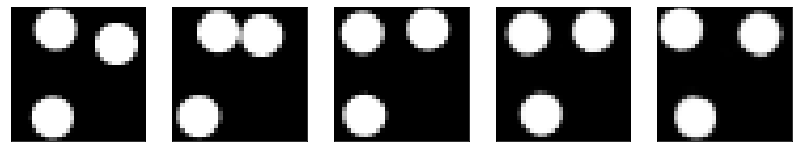

GD iterations:
i=0 | err=51.839157
i=1 | err=50.653893
i=2 | err=49.064323
i=3 | err=47.385105
i=4 | err=45.584465
i=5 | err=43.744106
i=6 | err=41.915203
i=7 | err=39.943665
i=8 | err=37.922932
i=9 | err=35.820747
i=10 | err=33.690262
i=11 | err=31.610487
i=12 | err=29.586298
i=13 | err=27.607866
i=14 | err=25.670408
i=15 | err=23.856712
i=16 | err=22.095146
i=17 | err=20.487442
i=18 | err=18.887304
i=19 | err=17.376659
i=20 | err=15.983035
i=21 | err=14.658352
i=22 | err=13.472160
i=23 | err=12.401135
i=24 | err=11.365170
i=25 | err=10.390493
i=26 | err=9.433235
i=27 | err=8.539701
i=28 | err=7.673580
i=29 | err=6.884191
Epoch=274 (70%) | out_positive=0.905245 | out_negative=0.089511 | mse=0.072355


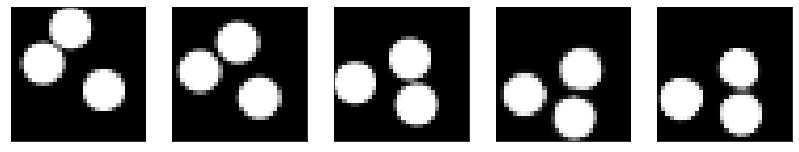

GD iterations:
i=0 | err=55.190495
i=1 | err=53.914467
i=2 | err=52.136242
i=3 | err=50.167381
i=4 | err=48.149490
i=5 | err=46.091476
i=6 | err=43.918396
i=7 | err=41.732307
i=8 | err=39.462151
i=9 | err=37.132217
i=10 | err=34.834694
i=11 | err=32.569626
i=12 | err=30.403090
i=13 | err=28.222347
i=14 | err=26.041973
i=15 | err=23.879780
i=16 | err=21.856188
i=17 | err=20.044380
i=18 | err=18.385948
i=19 | err=16.845154
i=20 | err=15.481808
i=21 | err=14.190017
i=22 | err=13.021297
i=23 | err=11.899710
i=24 | err=10.897758
i=25 | err=9.970982
i=26 | err=9.104846
i=27 | err=8.252746
i=28 | err=7.424955
i=29 | err=6.631596
Epoch=274 (72%) | out_positive=0.868105 | out_negative=0.155719 | mse=0.071563


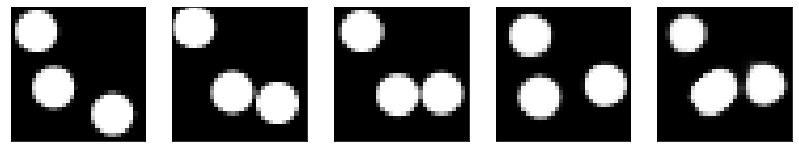

GD iterations:
i=0 | err=53.899849
i=1 | err=52.579941
i=2 | err=50.770897
i=3 | err=48.673939
i=4 | err=46.492741
i=5 | err=44.261795
i=6 | err=41.990677
i=7 | err=39.666489
i=8 | err=37.340771
i=9 | err=35.182251
i=10 | err=33.126457
i=11 | err=31.116648
i=12 | err=29.133539
i=13 | err=27.224163
i=14 | err=25.439228
i=15 | err=23.634970
i=16 | err=21.957680
i=17 | err=20.309921
i=18 | err=18.764324
i=19 | err=17.313398
i=20 | err=15.952127
i=21 | err=14.620162
i=22 | err=13.378748
i=23 | err=12.216581
i=24 | err=11.153624
i=25 | err=10.173437
i=26 | err=9.243907
i=27 | err=8.375711
i=28 | err=7.577438
i=29 | err=6.819313
Epoch=274 (74%) | out_positive=0.917881 | out_negative=0.174877 | mse=0.070593


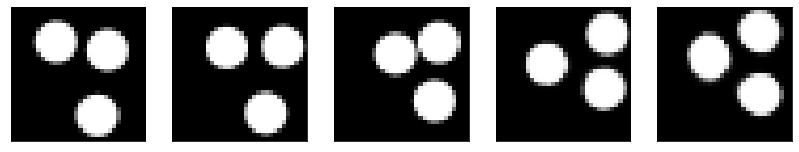

GD iterations:
i=0 | err=55.792709
i=1 | err=54.589703
i=2 | err=52.926384
i=3 | err=50.983932
i=4 | err=48.982769
i=5 | err=46.842888
i=6 | err=44.692478
i=7 | err=42.481888
i=8 | err=40.308048
i=9 | err=38.088074
i=10 | err=35.872299
i=11 | err=33.604477
i=12 | err=31.307991
i=13 | err=29.087088
i=14 | err=26.965368
i=15 | err=24.862160
i=16 | err=22.889576
i=17 | err=20.959682
i=18 | err=19.158928
i=19 | err=17.473034
i=20 | err=15.966850
i=21 | err=14.577138
i=22 | err=13.334326
i=23 | err=12.198732
i=24 | err=11.180838
i=25 | err=10.232309
i=26 | err=9.368982
i=27 | err=8.528894
i=28 | err=7.720430
i=29 | err=6.956387
Epoch=274 (76%) | out_positive=0.872909 | out_negative=0.117567 | mse=0.068554


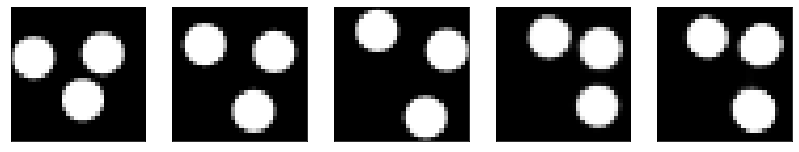

GD iterations:
i=0 | err=57.924042
i=1 | err=56.573322
i=2 | err=54.674778
i=3 | err=52.519039
i=4 | err=50.294487
i=5 | err=47.958099
i=6 | err=45.551857
i=7 | err=43.052330
i=8 | err=40.533112
i=9 | err=37.985020
i=10 | err=35.498932
i=11 | err=33.110085
i=12 | err=30.833412
i=13 | err=28.658413
i=14 | err=26.683014
i=15 | err=24.880674
i=16 | err=23.175295
i=17 | err=21.541662
i=18 | err=20.005257
i=19 | err=18.586206
i=20 | err=17.289505
i=21 | err=16.077850
i=22 | err=14.940701
i=23 | err=13.855886
i=24 | err=12.826544
i=25 | err=11.827899
i=26 | err=10.874517
i=27 | err=9.993357
i=28 | err=9.159216
i=29 | err=8.348118
Epoch=274 (78%) | out_positive=0.846449 | out_negative=0.089815 | mse=0.070414


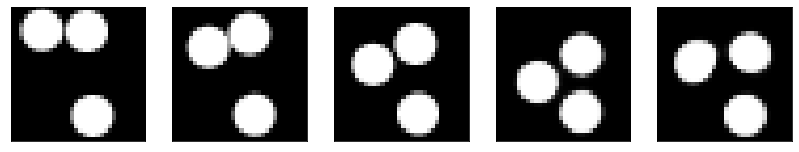

GD iterations:
i=0 | err=52.024391
i=1 | err=50.749008
i=2 | err=49.021141
i=3 | err=47.068108
i=4 | err=45.014935
i=5 | err=42.832371
i=6 | err=40.599777
i=7 | err=38.366539
i=8 | err=36.090416
i=9 | err=33.914505
i=10 | err=31.742020
i=11 | err=29.569553
i=12 | err=27.556347
i=13 | err=25.672800
i=14 | err=23.899849
i=15 | err=22.165089
i=16 | err=20.471306
i=17 | err=18.839386
i=18 | err=17.350235
i=19 | err=15.939646
i=20 | err=14.663303
i=21 | err=13.495370
i=22 | err=12.379942
i=23 | err=11.303575
i=24 | err=10.283129
i=25 | err=9.336336
i=26 | err=8.457527
i=27 | err=7.596567
i=28 | err=6.797105
i=29 | err=6.019563
Epoch=274 (80%) | out_positive=0.878354 | out_negative=0.131585 | mse=0.063389


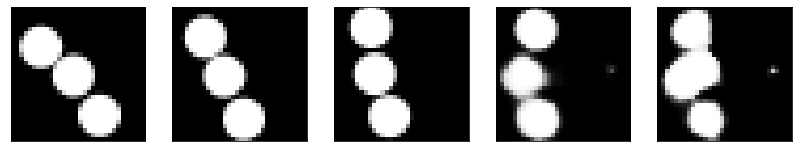

GD iterations:
i=0 | err=51.428474
i=1 | err=50.097359
i=2 | err=48.207024
i=3 | err=46.135483
i=4 | err=43.952820
i=5 | err=41.690536
i=6 | err=39.314407
i=7 | err=36.889847
i=8 | err=34.524200
i=9 | err=32.287117
i=10 | err=30.147820
i=11 | err=28.210848
i=12 | err=26.382568
i=13 | err=24.677368
i=14 | err=22.979042
i=15 | err=21.356590
i=16 | err=19.804405
i=17 | err=18.310482
i=18 | err=16.950727
i=19 | err=15.690865
i=20 | err=14.518101
i=21 | err=13.422389
i=22 | err=12.395786
i=23 | err=11.398054
i=24 | err=10.460505
i=25 | err=9.597706
i=26 | err=8.751907
i=27 | err=7.944416
i=28 | err=7.182634
i=29 | err=6.467354
Epoch=274 (81%) | out_positive=0.899653 | out_negative=0.157617 | mse=0.070643


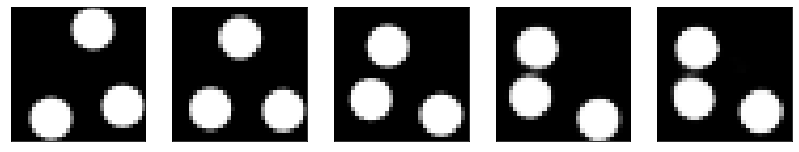

GD iterations:
i=0 | err=53.870419
i=1 | err=52.688286
i=2 | err=51.047852
i=3 | err=49.180618
i=4 | err=47.182739
i=5 | err=45.107147
i=6 | err=42.830032
i=7 | err=40.494667
i=8 | err=38.031837
i=9 | err=35.464905
i=10 | err=32.890133
i=11 | err=30.381548
i=12 | err=28.043022
i=13 | err=25.872826
i=14 | err=23.753094
i=15 | err=21.870892
i=16 | err=20.149052
i=17 | err=18.536068
i=18 | err=17.060863
i=19 | err=15.715456
i=20 | err=14.440937
i=21 | err=13.224651
i=22 | err=12.075378
i=23 | err=10.969886
i=24 | err=9.950790
i=25 | err=8.997672
i=26 | err=8.106922
i=27 | err=7.268970
i=28 | err=6.487235
i=29 | err=5.728045
Epoch=274 (83%) | out_positive=0.927566 | out_negative=0.158069 | mse=0.068941


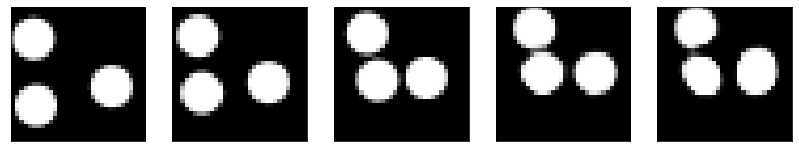

GD iterations:
i=0 | err=52.264393
i=1 | err=50.986469
i=2 | err=49.332664
i=3 | err=47.477982
i=4 | err=45.559818
i=5 | err=43.537560
i=6 | err=41.460281
i=7 | err=39.218807
i=8 | err=36.924011
i=9 | err=34.598259
i=10 | err=32.290306
i=11 | err=30.055380
i=12 | err=27.807037
i=13 | err=25.704248
i=14 | err=23.749687
i=15 | err=21.888290
i=16 | err=20.056019
i=17 | err=18.347759
i=18 | err=16.798790
i=19 | err=15.405707
i=20 | err=14.087269
i=21 | err=12.840990
i=22 | err=11.701191
i=23 | err=10.633093
i=24 | err=9.622911
i=25 | err=8.679153
i=26 | err=7.783444
i=27 | err=6.962968
i=28 | err=6.229307
i=29 | err=5.540419
Epoch=274 (85%) | out_positive=0.942348 | out_negative=0.167912 | mse=0.071111


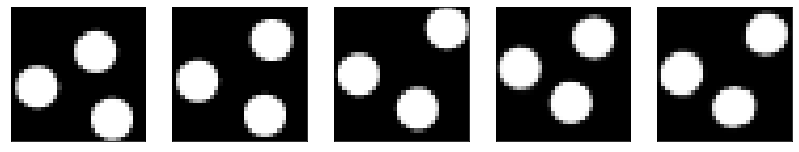

GD iterations:
i=0 | err=53.227051
i=1 | err=52.023285
i=2 | err=50.350319
i=3 | err=48.516487
i=4 | err=46.590981
i=5 | err=44.574059
i=6 | err=42.434174
i=7 | err=40.226143
i=8 | err=38.041908
i=9 | err=35.817406
i=10 | err=33.649605
i=11 | err=31.494469
i=12 | err=29.368771
i=13 | err=27.281052
i=14 | err=25.307936
i=15 | err=23.462383
i=16 | err=21.675606
i=17 | err=19.997318
i=18 | err=18.391029
i=19 | err=16.945267
i=20 | err=15.620090
i=21 | err=14.429399
i=22 | err=13.366051
i=23 | err=12.388728
i=24 | err=11.489219
i=25 | err=10.644582
i=26 | err=9.850008
i=27 | err=9.102018
i=28 | err=8.356766
i=29 | err=7.622960
Epoch=274 (87%) | out_positive=0.900726 | out_negative=0.135259 | mse=0.074780


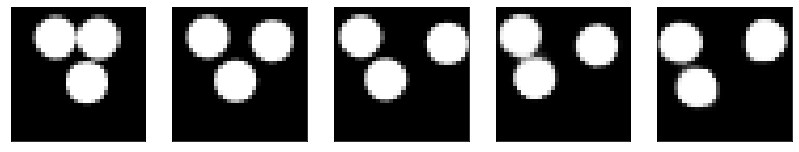

GD iterations:
i=0 | err=55.621571
i=1 | err=54.319386
i=2 | err=52.520897
i=3 | err=50.333878
i=4 | err=48.143909
i=5 | err=45.842743
i=6 | err=43.445492
i=7 | err=40.916386
i=8 | err=38.419846
i=9 | err=36.035400
i=10 | err=33.799305
i=11 | err=31.596916
i=12 | err=29.445299
i=13 | err=27.345039
i=14 | err=25.338428
i=15 | err=23.395206
i=16 | err=21.682270
i=17 | err=20.036467
i=18 | err=18.484020
i=19 | err=17.052715
i=20 | err=15.699498
i=21 | err=14.463116
i=22 | err=13.327377
i=23 | err=12.328793
i=24 | err=11.398197
i=25 | err=10.495350
i=26 | err=9.597615
i=27 | err=8.732711
i=28 | err=7.892537
i=29 | err=7.166394
Epoch=274 (89%) | out_positive=0.858431 | out_negative=0.111853 | mse=0.068251


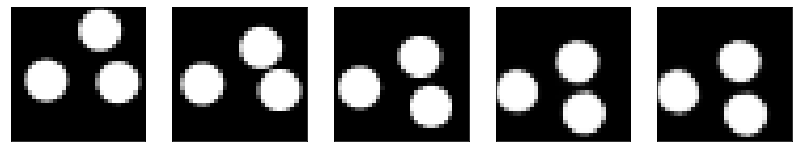

GD iterations:
i=0 | err=58.483658
i=1 | err=57.134472
i=2 | err=55.264847
i=3 | err=53.243473
i=4 | err=51.084610
i=5 | err=48.805309
i=6 | err=46.427238
i=7 | err=44.000816
i=8 | err=41.422215
i=9 | err=38.831951
i=10 | err=36.282040
i=11 | err=33.780594
i=12 | err=31.371807
i=13 | err=29.014257
i=14 | err=26.790174
i=15 | err=24.729977
i=16 | err=22.848207
i=17 | err=21.070614
i=18 | err=19.410446
i=19 | err=17.804993
i=20 | err=16.346739
i=21 | err=14.972455
i=22 | err=13.707693
i=23 | err=12.555199
i=24 | err=11.489222
i=25 | err=10.494422
i=26 | err=9.580538
i=27 | err=8.735189
i=28 | err=7.956994
i=29 | err=7.183095
Epoch=274 (91%) | out_positive=0.797132 | out_negative=0.107436 | mse=0.069124


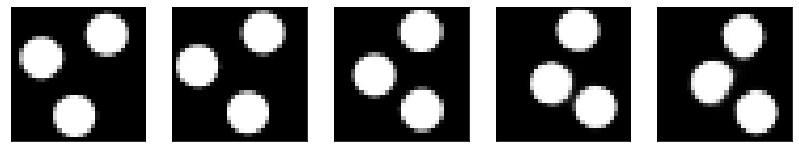

GD iterations:
i=0 | err=55.166603
i=1 | err=53.930771
i=2 | err=52.168644
i=3 | err=50.278061
i=4 | err=48.284702
i=5 | err=46.232559
i=6 | err=44.067734
i=7 | err=41.826004
i=8 | err=39.561478
i=9 | err=37.285065
i=10 | err=35.009834
i=11 | err=32.749027
i=12 | err=30.500610
i=13 | err=28.336763
i=14 | err=26.296368
i=15 | err=24.417683
i=16 | err=22.644342
i=17 | err=20.995743
i=18 | err=19.480124
i=19 | err=17.993778
i=20 | err=16.624022
i=21 | err=15.301960
i=22 | err=14.135618
i=23 | err=13.004863
i=24 | err=11.969104
i=25 | err=10.947909
i=26 | err=9.987629
i=27 | err=9.007124
i=28 | err=8.037297
i=29 | err=7.130082
Epoch=274 (92%) | out_positive=0.838080 | out_negative=0.099846 | mse=0.070387


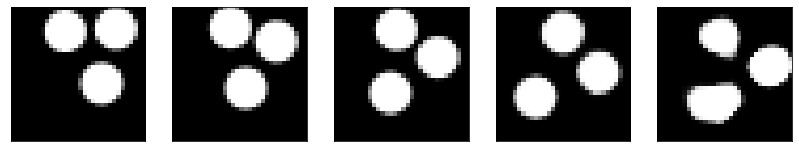

GD iterations:
i=0 | err=52.598091
i=1 | err=51.371105
i=2 | err=49.692772
i=3 | err=47.846272
i=4 | err=45.781517
i=5 | err=43.576889
i=6 | err=41.345989
i=7 | err=39.093491
i=8 | err=36.888874
i=9 | err=34.704655
i=10 | err=32.527905
i=11 | err=30.464115
i=12 | err=28.433800
i=13 | err=26.463455
i=14 | err=24.561544
i=15 | err=22.734365
i=16 | err=21.019840
i=17 | err=19.424240
i=18 | err=17.964195
i=19 | err=16.568531
i=20 | err=15.238390
i=21 | err=14.047227
i=22 | err=12.946781
i=23 | err=11.926352
i=24 | err=10.954371
i=25 | err=10.065729
i=26 | err=9.222527
i=27 | err=8.417906
i=28 | err=7.680636
i=29 | err=6.983658
Epoch=274 (94%) | out_positive=0.897923 | out_negative=0.123722 | mse=0.070166


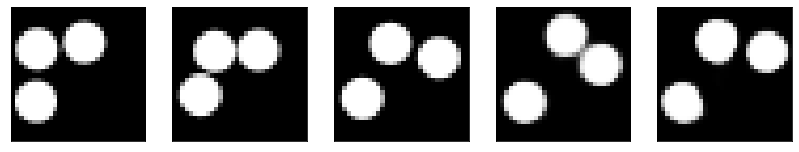

GD iterations:
i=0 | err=54.461681
i=1 | err=53.368393
i=2 | err=51.799004
i=3 | err=50.008064
i=4 | err=48.063087
i=5 | err=46.125771
i=6 | err=44.067001
i=7 | err=41.918037
i=8 | err=39.811375
i=9 | err=37.734642
i=10 | err=35.679996
i=11 | err=33.614738
i=12 | err=31.554234
i=13 | err=29.453205
i=14 | err=27.378452
i=15 | err=25.340191
i=16 | err=23.424171
i=17 | err=21.630714
i=18 | err=19.890244
i=19 | err=18.218357
i=20 | err=16.707220
i=21 | err=15.325550
i=22 | err=14.083462
i=23 | err=12.921913
i=24 | err=11.831765
i=25 | err=10.807129
i=26 | err=9.829159
i=27 | err=8.920419
i=28 | err=8.088724
i=29 | err=7.311462
Epoch=274 (96%) | out_positive=0.884786 | out_negative=0.102340 | mse=0.072026


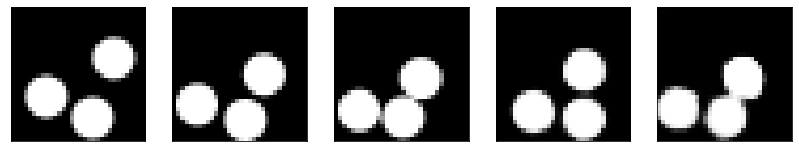

GD iterations:
i=0 | err=55.782509
i=1 | err=54.602646
i=2 | err=52.834576
i=3 | err=50.935822
i=4 | err=48.858627
i=5 | err=46.708771
i=6 | err=44.386421
i=7 | err=42.070915
i=8 | err=39.587917
i=9 | err=37.123169
i=10 | err=34.610596
i=11 | err=32.196861
i=12 | err=29.769356
i=13 | err=27.436037
i=14 | err=25.211069
i=15 | err=23.187641
i=16 | err=21.345188
i=17 | err=19.666630
i=18 | err=17.994114
i=19 | err=16.468378
i=20 | err=15.080566
i=21 | err=13.775011
i=22 | err=12.591177
i=23 | err=11.514362
i=24 | err=10.526558
i=25 | err=9.612860
i=26 | err=8.789607
i=27 | err=8.008824
i=28 | err=7.275157
i=29 | err=6.577799
Epoch=274 (98%) | out_positive=0.844014 | out_negative=0.130540 | mse=0.068237


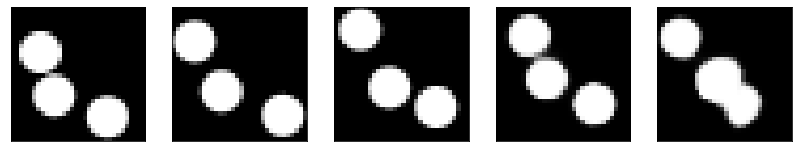

GD iterations:
i=0 | err=55.261772
i=1 | err=53.645023
i=2 | err=51.866585
i=3 | err=49.829048
i=4 | err=47.522392
i=5 | err=45.177124
i=6 | err=42.778534
i=7 | err=40.336945
i=8 | err=37.842464
i=9 | err=35.358444
i=10 | err=32.996460
i=11 | err=30.854073
i=12 | err=29.065277
i=13 | err=27.329241
i=14 | err=25.626286
i=15 | err=23.992336
i=16 | err=22.398506
i=17 | err=20.825199
i=18 | err=19.391376
i=19 | err=18.061258
i=20 | err=16.761597
i=21 | err=15.366755
i=22 | err=13.905075
i=23 | err=12.560003
i=24 | err=11.251581
i=25 | err=9.957023
i=26 | err=8.823372
i=27 | err=7.842598
i=28 | err=7.056832
i=29 | err=6.410479
Epoch=274 (100%) | out_positive=0.830060 | out_negative=0.101194 | mse=0.074966


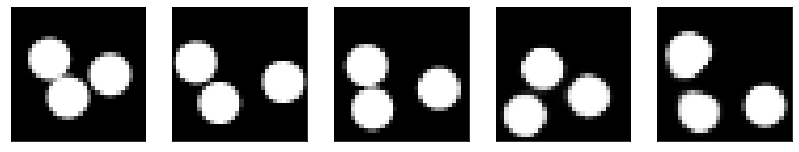

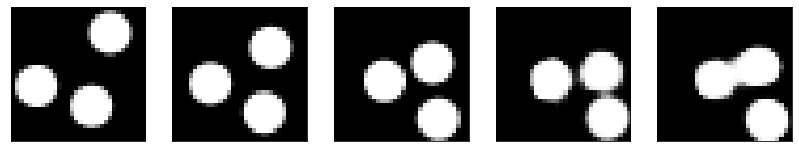

Test MSE 0.077508


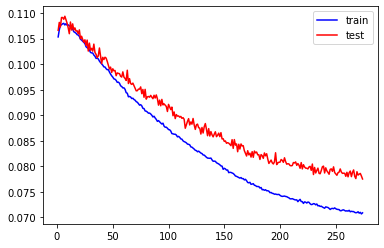

GD iterations:
i=0 | err=49.750717
i=1 | err=48.608696
i=2 | err=47.003609
i=3 | err=45.169182
i=4 | err=43.274357
i=5 | err=41.287762
i=6 | err=39.242760
i=7 | err=37.113594
i=8 | err=34.933998
i=9 | err=32.797867
i=10 | err=30.767820
i=11 | err=28.798244
i=12 | err=26.815655
i=13 | err=24.906130
i=14 | err=23.107603
i=15 | err=21.431463
i=16 | err=19.803059
i=17 | err=18.287613
i=18 | err=16.822983
i=19 | err=15.400336
i=20 | err=14.034059
i=21 | err=12.809096
i=22 | err=11.733133
i=23 | err=10.727512
i=24 | err=9.821865
i=25 | err=8.979207
i=26 | err=8.149004
i=27 | err=7.338050
i=28 | err=6.564756
i=29 | err=5.821076
Epoch=275 (0%) | out_positive=0.937965 | out_negative=0.173892 | mse=0.069249


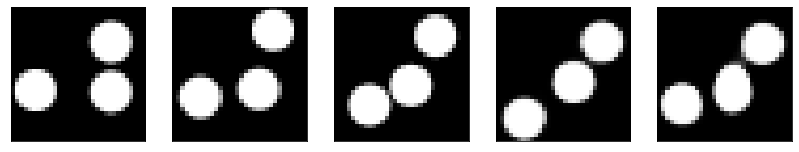

GD iterations:
i=0 | err=57.065407
i=1 | err=55.635635
i=2 | err=53.799732
i=3 | err=51.763039
i=4 | err=49.652649
i=5 | err=47.378593
i=6 | err=44.945148
i=7 | err=42.549316
i=8 | err=40.089245
i=9 | err=37.607674
i=10 | err=35.103935
i=11 | err=32.724243
i=12 | err=30.520706
i=13 | err=28.397991
i=14 | err=26.515625
i=15 | err=24.760967
i=16 | err=23.104618
i=17 | err=21.527039
i=18 | err=20.026773
i=19 | err=18.563185
i=20 | err=17.157593
i=21 | err=15.803203
i=22 | err=14.489334
i=23 | err=13.240883
i=24 | err=12.054964
i=25 | err=11.008411
i=26 | err=9.995838
i=27 | err=9.059878
i=28 | err=8.189013
i=29 | err=7.383446
Epoch=275 (2%) | out_positive=0.885510 | out_negative=0.128542 | mse=0.072844


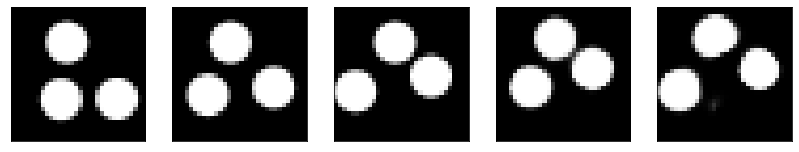

GD iterations:
i=0 | err=56.923233
i=1 | err=55.625629
i=2 | err=53.842545
i=3 | err=51.865311
i=4 | err=49.722733
i=5 | err=47.526337
i=6 | err=45.370415
i=7 | err=43.057194
i=8 | err=40.711170
i=9 | err=38.337460
i=10 | err=35.903030
i=11 | err=33.489006
i=12 | err=31.078260
i=13 | err=28.695122
i=14 | err=26.320286
i=15 | err=24.150118
i=16 | err=22.106071
i=17 | err=20.332113
i=18 | err=18.766640
i=19 | err=17.300018
i=20 | err=15.962283
i=21 | err=14.701998
i=22 | err=13.557452
i=23 | err=12.467649
i=24 | err=11.438051
i=25 | err=10.434811
i=26 | err=9.531504
i=27 | err=8.673442
i=28 | err=7.880561
i=29 | err=7.137720
Epoch=275 (4%) | out_positive=0.873393 | out_negative=0.115453 | mse=0.071419


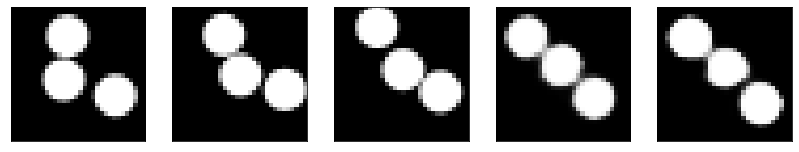

GD iterations:
i=0 | err=53.717491
i=1 | err=52.401489
i=2 | err=50.660683
i=3 | err=48.759880
i=4 | err=46.736382
i=5 | err=44.610645
i=6 | err=42.423145
i=7 | err=40.199883
i=8 | err=37.970493
i=9 | err=35.755692
i=10 | err=33.547005
i=11 | err=31.338043
i=12 | err=29.181618
i=13 | err=27.090839
i=14 | err=25.145941
i=15 | err=23.385990
i=16 | err=21.673838
i=17 | err=20.027906
i=18 | err=18.577038
i=19 | err=17.241547
i=20 | err=16.000896
i=21 | err=14.872388
i=22 | err=13.763025
i=23 | err=12.717617
i=24 | err=11.756132
i=25 | err=10.831426
i=26 | err=9.947152
i=27 | err=9.103018
i=28 | err=8.310369
i=29 | err=7.560848
Epoch=275 (6%) | out_positive=0.913339 | out_negative=0.117980 | mse=0.072107


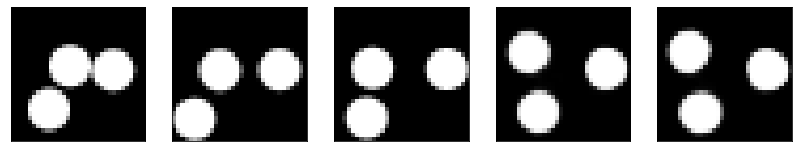

GD iterations:
i=0 | err=49.729389
i=1 | err=48.537479
i=2 | err=46.918549
i=3 | err=45.119286
i=4 | err=43.212795
i=5 | err=41.205574
i=6 | err=39.051552
i=7 | err=36.962875
i=8 | err=34.875580
i=9 | err=32.750031
i=10 | err=30.742081
i=11 | err=28.738018
i=12 | err=26.687046
i=13 | err=24.638386
i=14 | err=22.764465
i=15 | err=21.002172
i=16 | err=19.410881
i=17 | err=17.924168
i=18 | err=16.538582
i=19 | err=15.318399
i=20 | err=14.159348
i=21 | err=13.072454
i=22 | err=12.067650
i=23 | err=11.174121
i=24 | err=10.319558
i=25 | err=9.514922
i=26 | err=8.771681
i=27 | err=8.052177
i=28 | err=7.353509
i=29 | err=6.694266
Epoch=275 (8%) | out_positive=0.885891 | out_negative=0.122829 | mse=0.065367


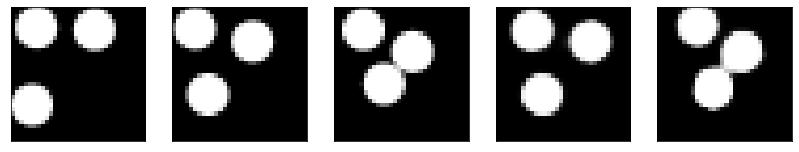

GD iterations:
i=0 | err=57.509613
i=1 | err=56.176308
i=2 | err=54.332268
i=3 | err=52.150528
i=4 | err=49.802437
i=5 | err=47.226418
i=6 | err=44.613297
i=7 | err=41.914726
i=8 | err=39.249390
i=9 | err=36.634060
i=10 | err=34.085083
i=11 | err=31.566244
i=12 | err=29.184721
i=13 | err=26.884586
i=14 | err=24.653328
i=15 | err=22.538368
i=16 | err=20.630510
i=17 | err=18.873716
i=18 | err=17.350391
i=19 | err=15.938618
i=20 | err=14.600302
i=21 | err=13.332680
i=22 | err=12.189383
i=23 | err=11.134411
i=24 | err=10.156177
i=25 | err=9.268638
i=26 | err=8.430487
i=27 | err=7.665460
i=28 | err=6.930726
i=29 | err=6.256132
Epoch=275 (9%) | out_positive=0.866547 | out_negative=0.124823 | mse=0.066821


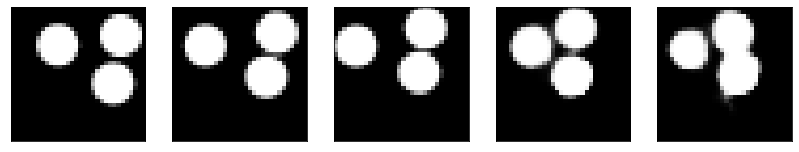

GD iterations:
i=0 | err=54.946655
i=1 | err=53.585205
i=2 | err=51.852451
i=3 | err=49.998138
i=4 | err=48.038898
i=5 | err=46.047585
i=6 | err=43.952530
i=7 | err=41.729206
i=8 | err=39.437069
i=9 | err=37.131264
i=10 | err=34.782948
i=11 | err=32.431099
i=12 | err=30.143742
i=13 | err=27.928349
i=14 | err=25.728487
i=15 | err=23.708317
i=16 | err=21.809561
i=17 | err=19.985153
i=18 | err=18.254063
i=19 | err=16.635990
i=20 | err=15.175117
i=21 | err=13.867453
i=22 | err=12.713047
i=23 | err=11.666605
i=24 | err=10.695028
i=25 | err=9.779920
i=26 | err=8.913286
i=27 | err=8.115217
i=28 | err=7.343057
i=29 | err=6.621142
Epoch=275 (11%) | out_positive=0.844181 | out_negative=0.105036 | mse=0.065370


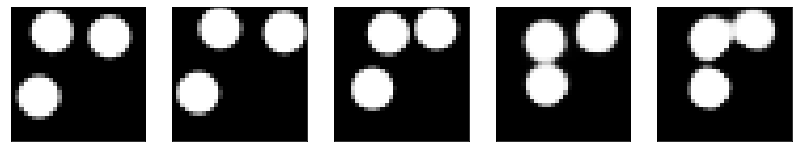

GD iterations:
i=0 | err=57.772179
i=1 | err=56.484436
i=2 | err=54.557297
i=3 | err=52.329185
i=4 | err=49.974358
i=5 | err=47.553532
i=6 | err=44.948524
i=7 | err=42.305252
i=8 | err=39.741177
i=9 | err=37.267059
i=10 | err=34.874416
i=11 | err=32.558651
i=12 | err=30.282257
i=13 | err=28.112232
i=14 | err=26.020704
i=15 | err=23.997086
i=16 | err=22.144770
i=17 | err=20.379456
i=18 | err=18.720757
i=19 | err=17.168194
i=20 | err=15.736782
i=21 | err=14.390046
i=22 | err=13.134424
i=23 | err=11.962666
i=24 | err=10.882463
i=25 | err=9.872486
i=26 | err=8.931804
i=27 | err=8.066568
i=28 | err=7.297682
i=29 | err=6.574939
Epoch=275 (13%) | out_positive=0.915918 | out_negative=0.117746 | mse=0.075618


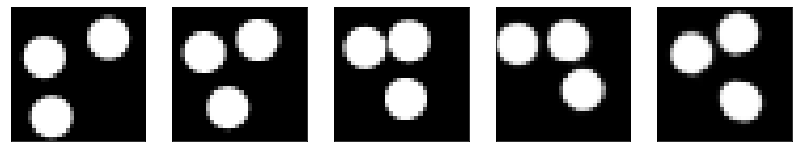

GD iterations:
i=0 | err=57.232536
i=1 | err=56.003082
i=2 | err=54.210468
i=3 | err=52.163986
i=4 | err=50.036537
i=5 | err=47.789387
i=6 | err=45.378464
i=7 | err=42.988243
i=8 | err=40.515491
i=9 | err=38.061539
i=10 | err=35.648724
i=11 | err=33.295193
i=12 | err=30.973635
i=13 | err=28.719677
i=14 | err=26.725672
i=15 | err=24.911358
i=16 | err=23.155848
i=17 | err=21.492332
i=18 | err=19.966673
i=19 | err=18.521828
i=20 | err=17.181978
i=21 | err=15.899113
i=22 | err=14.686494
i=23 | err=13.531200
i=24 | err=12.440857
i=25 | err=11.412182
i=26 | err=10.421177
i=27 | err=9.492481
i=28 | err=8.565322
i=29 | err=7.658266
Epoch=275 (15%) | out_positive=0.812084 | out_negative=0.141544 | mse=0.069041


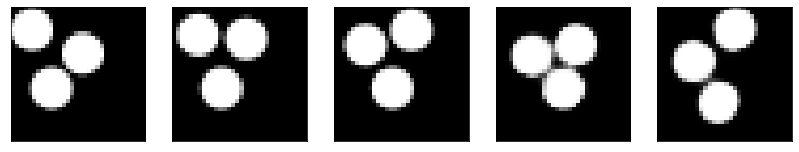

GD iterations:
i=0 | err=53.692749
i=1 | err=52.429794
i=2 | err=50.611198
i=3 | err=48.655243
i=4 | err=46.546318
i=5 | err=44.512718
i=6 | err=42.357201
i=7 | err=40.187435
i=8 | err=38.009335
i=9 | err=35.844688
i=10 | err=33.699982
i=11 | err=31.495436
i=12 | err=29.327915
i=13 | err=27.202206
i=14 | err=25.163551
i=15 | err=23.333424
i=16 | err=21.593548
i=17 | err=20.041985
i=18 | err=18.606506
i=19 | err=17.307772
i=20 | err=16.066725
i=21 | err=14.931662
i=22 | err=13.828062
i=23 | err=12.812227
i=24 | err=11.865696
i=25 | err=10.940748
i=26 | err=10.057684
i=27 | err=9.214100
i=28 | err=8.432247
i=29 | err=7.687117
Epoch=275 (17%) | out_positive=0.867969 | out_negative=0.110622 | mse=0.065965


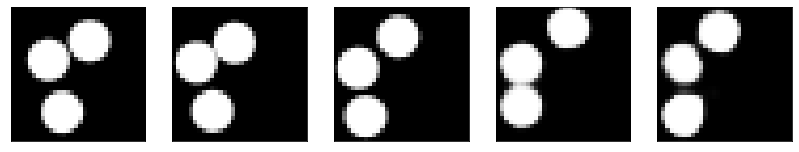

GD iterations:
i=0 | err=57.511665
i=1 | err=56.340553
i=2 | err=54.680153
i=3 | err=52.841850
i=4 | err=50.950211
i=5 | err=49.059486
i=6 | err=47.087982
i=7 | err=45.082424
i=8 | err=43.041599
i=9 | err=40.980545
i=10 | err=38.915474
i=11 | err=36.858562
i=12 | err=34.801144
i=13 | err=32.692955
i=14 | err=30.633396
i=15 | err=28.531908
i=16 | err=26.437656
i=17 | err=24.438211
i=18 | err=22.452904
i=19 | err=20.632149
i=20 | err=18.846844
i=21 | err=17.188709
i=22 | err=15.666883
i=23 | err=14.293675
i=24 | err=13.011712
i=25 | err=11.792854
i=26 | err=10.662805
i=27 | err=9.625631
i=28 | err=8.650023
i=29 | err=7.742549
Epoch=275 (19%) | out_positive=0.885709 | out_negative=0.081185 | mse=0.076627


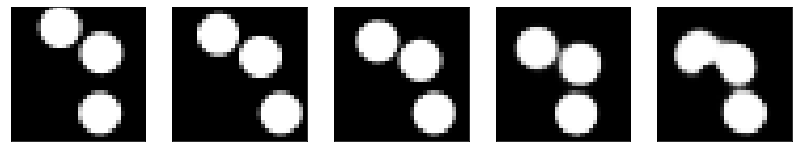

GD iterations:
i=0 | err=57.736530
i=1 | err=56.308220
i=2 | err=54.314262
i=3 | err=51.927727
i=4 | err=49.421867
i=5 | err=46.766510
i=6 | err=44.140240
i=7 | err=41.475677
i=8 | err=38.667080
i=9 | err=35.970390
i=10 | err=33.298676
i=11 | err=30.741741
i=12 | err=28.413498
i=13 | err=26.389233
i=14 | err=24.495129
i=15 | err=22.688896
i=16 | err=20.992504
i=17 | err=19.496017
i=18 | err=18.055202
i=19 | err=16.627697
i=20 | err=15.279026
i=21 | err=14.009264
i=22 | err=12.842955
i=23 | err=11.759409
i=24 | err=10.750628
i=25 | err=9.835045
i=26 | err=8.967621
i=27 | err=8.157574
i=28 | err=7.413507
i=29 | err=6.686979
Epoch=275 (20%) | out_positive=0.858631 | out_negative=0.125031 | mse=0.064150


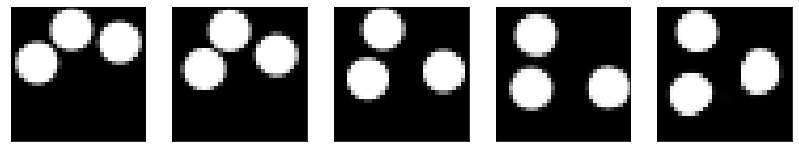

GD iterations:
i=0 | err=53.627663
i=1 | err=52.374325
i=2 | err=50.575848
i=3 | err=48.513992
i=4 | err=46.217258
i=5 | err=43.916382
i=6 | err=41.551403
i=7 | err=39.146515
i=8 | err=36.725494
i=9 | err=34.341698
i=10 | err=31.897129
i=11 | err=29.622513
i=12 | err=27.367081
i=13 | err=25.163288
i=14 | err=23.164028
i=15 | err=21.258865
i=16 | err=19.508224
i=17 | err=17.901722
i=18 | err=16.473541
i=19 | err=15.199117
i=20 | err=14.042179
i=21 | err=12.950183
i=22 | err=11.930999
i=23 | err=10.913582
i=24 | err=9.976107
i=25 | err=9.083889
i=26 | err=8.249119
i=27 | err=7.479480
i=28 | err=6.768912
i=29 | err=6.101285
Epoch=275 (22%) | out_positive=0.906653 | out_negative=0.108516 | mse=0.070552


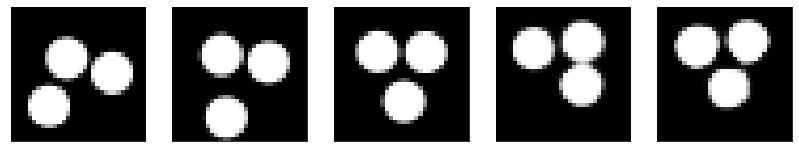

GD iterations:
i=0 | err=51.330154
i=1 | err=50.102783
i=2 | err=48.394142
i=3 | err=46.478115
i=4 | err=44.373352
i=5 | err=42.236427
i=6 | err=40.013481
i=7 | err=37.764725
i=8 | err=35.593868
i=9 | err=33.402950
i=10 | err=31.269588
i=11 | err=29.174992
i=12 | err=27.089676
i=13 | err=25.034424
i=14 | err=23.061344
i=15 | err=21.171982
i=16 | err=19.417332
i=17 | err=17.773081
i=18 | err=16.305674
i=19 | err=14.937084
i=20 | err=13.703291
i=21 | err=12.506895
i=22 | err=11.405924
i=23 | err=10.376259
i=24 | err=9.428942
i=25 | err=8.574835
i=26 | err=7.768324
i=27 | err=7.003506
i=28 | err=6.269767
i=29 | err=5.541783
Epoch=275 (24%) | out_positive=0.939624 | out_negative=0.200198 | mse=0.063276


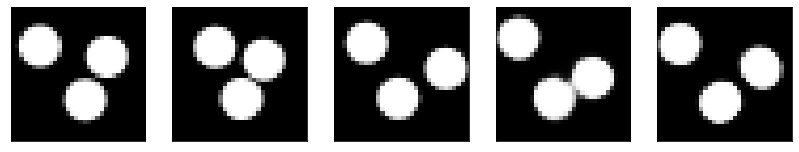

GD iterations:
i=0 | err=59.784649
i=1 | err=58.498039
i=2 | err=56.660507
i=3 | err=54.551022
i=4 | err=52.324425
i=5 | err=50.143559
i=6 | err=47.882866
i=7 | err=45.577389
i=8 | err=43.123940
i=9 | err=40.648544
i=10 | err=38.099087
i=11 | err=35.630867
i=12 | err=33.135696
i=13 | err=30.756985
i=14 | err=28.501810
i=15 | err=26.386007
i=16 | err=24.333992
i=17 | err=22.428875
i=18 | err=20.659700
i=19 | err=18.976082
i=20 | err=17.395687
i=21 | err=15.942449
i=22 | err=14.585417
i=23 | err=13.338741
i=24 | err=12.144794
i=25 | err=11.024124
i=26 | err=9.966027
i=27 | err=8.895161
i=28 | err=7.911152
i=29 | err=7.000183
Epoch=275 (26%) | out_positive=0.794304 | out_negative=0.112592 | mse=0.070475


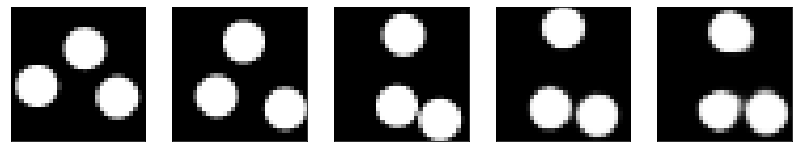

GD iterations:
i=0 | err=56.139088
i=1 | err=54.754364
i=2 | err=52.896759
i=3 | err=50.916809
i=4 | err=48.725746
i=5 | err=46.433937
i=6 | err=44.234749
i=7 | err=42.053143
i=8 | err=39.851429
i=9 | err=37.550224
i=10 | err=35.251137
i=11 | err=32.945946
i=12 | err=30.667053
i=13 | err=28.411320
i=14 | err=26.225821
i=15 | err=24.178699
i=16 | err=22.261318
i=17 | err=20.503645
i=18 | err=18.848854
i=19 | err=17.301874
i=20 | err=15.870853
i=21 | err=14.532026
i=22 | err=13.249393
i=23 | err=12.050499
i=24 | err=10.976492
i=25 | err=10.004847
i=26 | err=9.110115
i=27 | err=8.283577
i=28 | err=7.492023
i=29 | err=6.724730
Epoch=275 (28%) | out_positive=0.873939 | out_negative=0.149836 | mse=0.067920


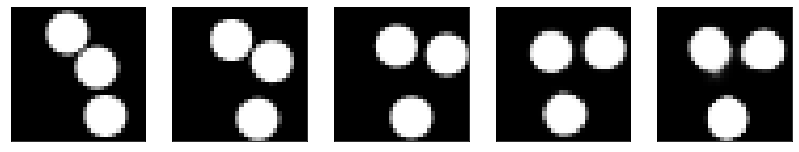

GD iterations:
i=0 | err=54.343708
i=1 | err=53.096458
i=2 | err=51.399216
i=3 | err=49.500301
i=4 | err=47.573174
i=5 | err=45.549450
i=6 | err=43.429039
i=7 | err=41.116047
i=8 | err=38.814785
i=9 | err=36.471764
i=10 | err=34.174759
i=11 | err=31.897526
i=12 | err=29.833441
i=13 | err=27.939720
i=14 | err=26.179638
i=15 | err=24.554012
i=16 | err=23.000130
i=17 | err=21.532234
i=18 | err=20.139605
i=19 | err=18.796871
i=20 | err=17.480394
i=21 | err=16.228046
i=22 | err=15.082310
i=23 | err=13.972070
i=24 | err=12.891668
i=25 | err=11.845633
i=26 | err=10.813447
i=27 | err=9.803934
i=28 | err=8.832491
i=29 | err=7.922528
Epoch=275 (30%) | out_positive=0.911861 | out_negative=0.112366 | mse=0.077551


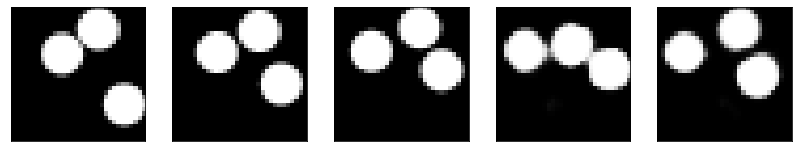

GD iterations:
i=0 | err=52.973381
i=1 | err=51.838310
i=2 | err=50.286606
i=3 | err=48.569496
i=4 | err=46.739418
i=5 | err=44.824596
i=6 | err=42.935104
i=7 | err=40.942642
i=8 | err=38.971764
i=9 | err=36.985291
i=10 | err=34.953403
i=11 | err=32.967285
i=12 | err=30.929180
i=13 | err=28.915443
i=14 | err=26.985975
i=15 | err=25.112595
i=16 | err=23.344601
i=17 | err=21.665518
i=18 | err=20.088902
i=19 | err=18.557045
i=20 | err=17.091402
i=21 | err=15.712185
i=22 | err=14.417919
i=23 | err=13.185215
i=24 | err=11.999325
i=25 | err=10.848862
i=26 | err=9.756469
i=27 | err=8.758366
i=28 | err=7.841364
i=29 | err=6.982526
Epoch=275 (32%) | out_positive=0.899454 | out_negative=0.141164 | mse=0.069458


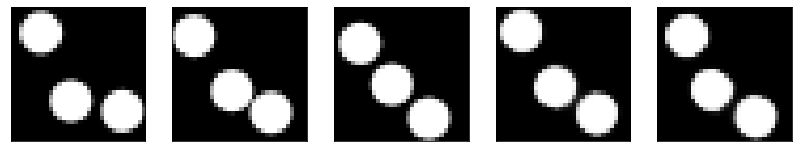

GD iterations:
i=0 | err=57.021736
i=1 | err=55.720802
i=2 | err=53.970894
i=3 | err=52.043533
i=4 | err=49.891724
i=5 | err=47.568741
i=6 | err=45.200836
i=7 | err=42.824860
i=8 | err=40.407333
i=9 | err=37.919308
i=10 | err=35.439827
i=11 | err=32.946114
i=12 | err=30.553806
i=13 | err=28.195168
i=14 | err=25.946669
i=15 | err=23.871086
i=16 | err=21.961433
i=17 | err=20.236904
i=18 | err=18.678358
i=19 | err=17.263449
i=20 | err=15.956942
i=21 | err=14.703712
i=22 | err=13.539597
i=23 | err=12.413557
i=24 | err=11.372117
i=25 | err=10.366760
i=26 | err=9.440115
i=27 | err=8.561369
i=28 | err=7.717504
i=29 | err=6.945923
Epoch=275 (33%) | out_positive=0.854910 | out_negative=0.142395 | mse=0.076750


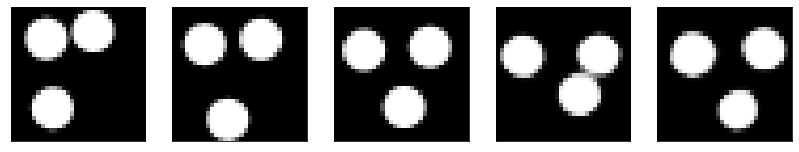

GD iterations:
i=0 | err=55.280136
i=1 | err=54.097290
i=2 | err=52.388466
i=3 | err=50.421669
i=4 | err=48.435276
i=5 | err=46.360741
i=6 | err=44.154373
i=7 | err=41.929344
i=8 | err=39.660625
i=9 | err=37.378578
i=10 | err=35.210526
i=11 | err=33.094696
i=12 | err=30.999317
i=13 | err=28.834690
i=14 | err=26.725391
i=15 | err=24.727306
i=16 | err=22.834641
i=17 | err=21.017820
i=18 | err=19.338825
i=19 | err=17.777361
i=20 | err=16.351303
i=21 | err=15.037460
i=22 | err=13.841065
i=23 | err=12.756289
i=24 | err=11.704121
i=25 | err=10.732336
i=26 | err=9.837099
i=27 | err=9.003551
i=28 | err=8.213938
i=29 | err=7.458019
Epoch=275 (35%) | out_positive=0.888126 | out_negative=0.128304 | mse=0.073470


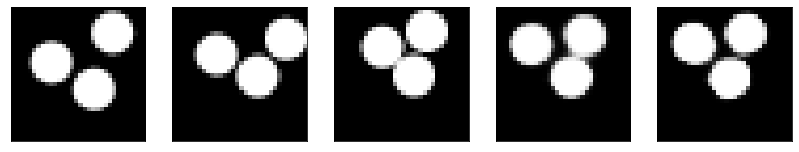

GD iterations:
i=0 | err=52.849880
i=1 | err=51.473068
i=2 | err=49.806190
i=3 | err=47.994099
i=4 | err=46.079475
i=5 | err=44.090511
i=6 | err=42.046772
i=7 | err=39.922337
i=8 | err=37.735695
i=9 | err=35.604515
i=10 | err=33.504734
i=11 | err=31.391380
i=12 | err=29.303179
i=13 | err=27.391106
i=14 | err=25.637543
i=15 | err=23.985071
i=16 | err=22.410805
i=17 | err=20.893969
i=18 | err=19.484024
i=19 | err=18.159590
i=20 | err=16.933197
i=21 | err=15.735605
i=22 | err=14.622730
i=23 | err=13.526618
i=24 | err=12.447791
i=25 | err=11.438419
i=26 | err=10.500121
i=27 | err=9.610182
i=28 | err=8.805830
i=29 | err=8.004579
Epoch=275 (37%) | out_positive=0.930527 | out_negative=0.102458 | mse=0.076840


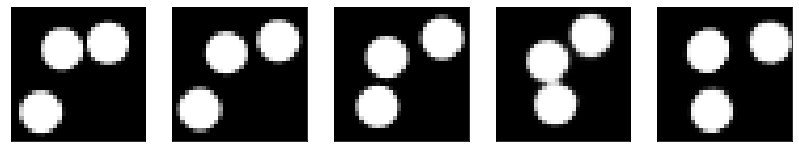

GD iterations:
i=0 | err=55.705570
i=1 | err=54.474560
i=2 | err=52.771927
i=3 | err=50.922001
i=4 | err=48.851746
i=5 | err=46.733955
i=6 | err=44.499222
i=7 | err=42.179230
i=8 | err=39.789116
i=9 | err=37.407394
i=10 | err=35.033348
i=11 | err=32.661556
i=12 | err=30.336784
i=13 | err=28.106491
i=14 | err=26.025740
i=15 | err=24.068405
i=16 | err=22.219887
i=17 | err=20.453930
i=18 | err=18.854744
i=19 | err=17.328461
i=20 | err=15.857199
i=21 | err=14.494198
i=22 | err=13.302216
i=23 | err=12.252853
i=24 | err=11.299609
i=25 | err=10.370721
i=26 | err=9.477659
i=27 | err=8.589177
i=28 | err=7.757252
i=29 | err=6.970757
Epoch=275 (39%) | out_positive=0.899082 | out_negative=0.129252 | mse=0.071661


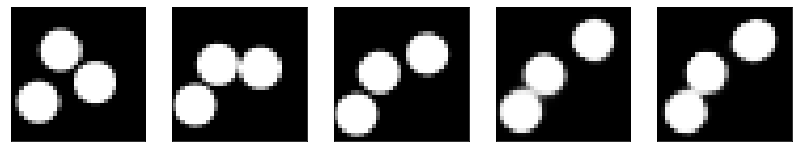

GD iterations:
i=0 | err=54.119736
i=1 | err=52.871689
i=2 | err=51.161129
i=3 | err=49.265205
i=4 | err=47.294991
i=5 | err=45.253273
i=6 | err=43.086071
i=7 | err=40.945789
i=8 | err=38.683784
i=9 | err=36.468369
i=10 | err=34.199173
i=11 | err=31.955875
i=12 | err=29.728930
i=13 | err=27.629152
i=14 | err=25.639835
i=15 | err=23.802542
i=16 | err=22.045803
i=17 | err=20.411240
i=18 | err=18.889519
i=19 | err=17.466381
i=20 | err=16.061026
i=21 | err=14.735009
i=22 | err=13.530093
i=23 | err=12.430544
i=24 | err=11.364586
i=25 | err=10.388313
i=26 | err=9.455116
i=27 | err=8.588391
i=28 | err=7.772109
i=29 | err=7.022789
Epoch=275 (41%) | out_positive=0.884343 | out_negative=0.119211 | mse=0.071455


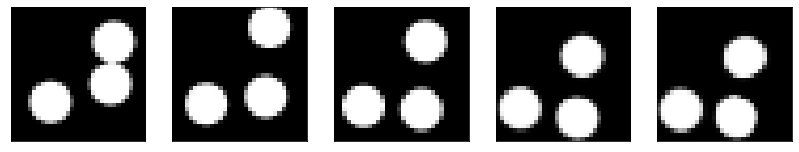

GD iterations:
i=0 | err=54.268738
i=1 | err=53.032265
i=2 | err=51.293732
i=3 | err=49.406670
i=4 | err=47.479576
i=5 | err=45.425957
i=6 | err=43.382236
i=7 | err=41.260826
i=8 | err=39.093418
i=9 | err=36.882172
i=10 | err=34.656281
i=11 | err=32.479477
i=12 | err=30.327501
i=13 | err=28.146961
i=14 | err=26.019409
i=15 | err=23.970224
i=16 | err=22.092604
i=17 | err=20.354488
i=18 | err=18.725616
i=19 | err=17.243439
i=20 | err=15.847157
i=21 | err=14.566975
i=22 | err=13.355688
i=23 | err=12.208523
i=24 | err=11.159773
i=25 | err=10.150017
i=26 | err=9.199787
i=27 | err=8.284236
i=28 | err=7.413247
i=29 | err=6.591717
Epoch=275 (43%) | out_positive=0.904306 | out_negative=0.105848 | mse=0.070107


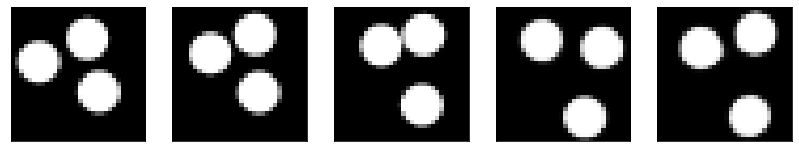

GD iterations:
i=0 | err=56.914425
i=1 | err=55.648014
i=2 | err=53.833366
i=3 | err=51.741535
i=4 | err=49.512718
i=5 | err=47.175056
i=6 | err=44.692257
i=7 | err=42.267506
i=8 | err=39.780022
i=9 | err=37.304642
i=10 | err=34.775585
i=11 | err=32.425823
i=12 | err=30.072824
i=13 | err=27.807266
i=14 | err=25.629181
i=15 | err=23.637724
i=16 | err=21.793488
i=17 | err=19.992760
i=18 | err=18.260050
i=19 | err=16.640228
i=20 | err=15.131580
i=21 | err=13.778394
i=22 | err=12.595966
i=23 | err=11.511900
i=24 | err=10.550661
i=25 | err=9.646839
i=26 | err=8.759260
i=27 | err=7.924292
i=28 | err=7.125081
i=29 | err=6.338517
Epoch=275 (44%) | out_positive=0.881108 | out_negative=0.156315 | mse=0.072259


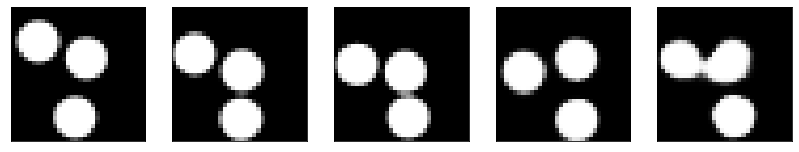

GD iterations:
i=0 | err=52.877197
i=1 | err=51.561951
i=2 | err=49.831604
i=3 | err=47.849747
i=4 | err=45.794601
i=5 | err=43.638439
i=6 | err=41.372688
i=7 | err=38.993336
i=8 | err=36.669903
i=9 | err=34.268799
i=10 | err=31.896021
i=11 | err=29.681011
i=12 | err=27.626612
i=13 | err=25.679165
i=14 | err=23.774391
i=15 | err=21.967646
i=16 | err=20.330610
i=17 | err=18.840813
i=18 | err=17.472893
i=19 | err=16.228411
i=20 | err=15.057663
i=21 | err=13.972206
i=22 | err=12.949649
i=23 | err=12.001291
i=24 | err=11.082817
i=25 | err=10.233658
i=26 | err=9.418311
i=27 | err=8.616909
i=28 | err=7.856885
i=29 | err=7.114470
Epoch=275 (46%) | out_positive=0.922611 | out_negative=0.126770 | mse=0.070566


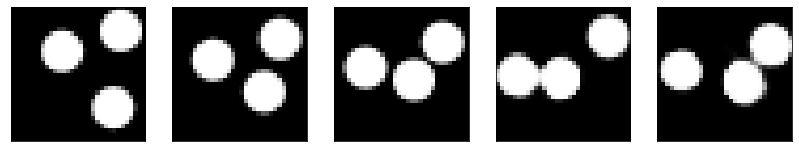

GD iterations:
i=0 | err=54.771053
i=1 | err=53.344585
i=2 | err=51.364201
i=3 | err=49.187019
i=4 | err=46.957634
i=5 | err=44.719894
i=6 | err=42.518028
i=7 | err=40.221333
i=8 | err=37.934441
i=9 | err=35.666077
i=10 | err=33.508980
i=11 | err=31.412327
i=12 | err=29.351601
i=13 | err=27.323318
i=14 | err=25.370485
i=15 | err=23.489906
i=16 | err=21.700911
i=17 | err=19.972317
i=18 | err=18.379261
i=19 | err=16.881189
i=20 | err=15.533691
i=21 | err=14.300669
i=22 | err=13.170956
i=23 | err=12.131017
i=24 | err=11.191849
i=25 | err=10.283911
i=26 | err=9.406574
i=27 | err=8.563211
i=28 | err=7.756180
i=29 | err=7.006093
Epoch=275 (48%) | out_positive=0.899342 | out_negative=0.097261 | mse=0.074383


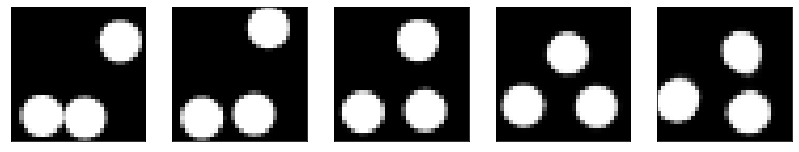

GD iterations:
i=0 | err=58.484451
i=1 | err=57.044682
i=2 | err=55.013329
i=3 | err=52.727325
i=4 | err=50.417229
i=5 | err=47.979801
i=6 | err=45.452522
i=7 | err=42.944294
i=8 | err=40.291908
i=9 | err=37.524372
i=10 | err=34.797920
i=11 | err=32.196461
i=12 | err=29.707825
i=13 | err=27.393379
i=14 | err=25.238964
i=15 | err=23.224522
i=16 | err=21.352539
i=17 | err=19.649002
i=18 | err=18.106598
i=19 | err=16.640541
i=20 | err=15.300205
i=21 | err=14.085480
i=22 | err=12.939064
i=23 | err=11.849758
i=24 | err=10.852956
i=25 | err=9.915173
i=26 | err=9.042665
i=27 | err=8.235972
i=28 | err=7.475214
i=29 | err=6.750469
Epoch=275 (50%) | out_positive=0.847727 | out_negative=0.158092 | mse=0.068230


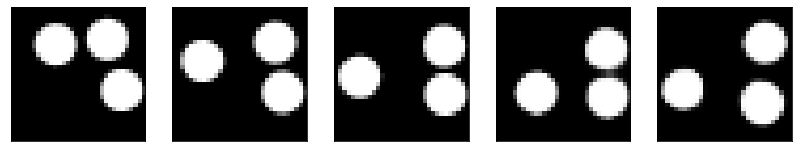

GD iterations:
i=0 | err=53.120270
i=1 | err=51.864922
i=2 | err=50.031364
i=3 | err=47.849594
i=4 | err=45.593933
i=5 | err=43.293434
i=6 | err=41.020508
i=7 | err=38.730049
i=8 | err=36.567822
i=9 | err=34.435875
i=10 | err=32.283714
i=11 | err=30.207230
i=12 | err=28.094738
i=13 | err=26.016832
i=14 | err=24.021666
i=15 | err=22.130848
i=16 | err=20.311642
i=17 | err=18.567207
i=18 | err=16.901127
i=19 | err=15.366168
i=20 | err=14.011435
i=21 | err=12.755377
i=22 | err=11.606737
i=23 | err=10.567815
i=24 | err=9.601162
i=25 | err=8.709154
i=26 | err=7.881960
i=27 | err=7.099123
i=28 | err=6.395340
i=29 | err=5.724462
Epoch=275 (52%) | out_positive=0.907084 | out_negative=0.157416 | mse=0.066495


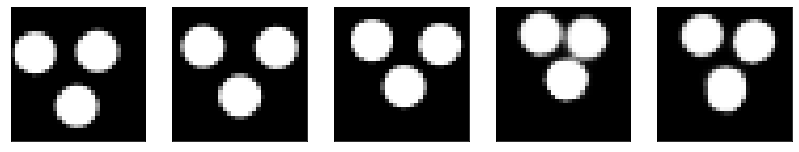

GD iterations:
i=0 | err=55.279388
i=1 | err=54.006752
i=2 | err=52.318398
i=3 | err=50.463562
i=4 | err=48.485394
i=5 | err=46.408310
i=6 | err=44.248531
i=7 | err=42.042671
i=8 | err=39.768635
i=9 | err=37.529095
i=10 | err=35.213955
i=11 | err=32.930000
i=12 | err=30.551510
i=13 | err=28.351492
i=14 | err=26.219555
i=15 | err=24.156565
i=16 | err=22.109692
i=17 | err=20.101721
i=18 | err=18.225996
i=19 | err=16.510023
i=20 | err=14.959219
i=21 | err=13.525054
i=22 | err=12.191823
i=23 | err=10.967050
i=24 | err=9.875880
i=25 | err=8.860804
i=26 | err=7.888754
i=27 | err=6.968013
i=28 | err=6.111214
i=29 | err=5.269511
Epoch=275 (54%) | out_positive=0.817800 | out_negative=0.182886 | mse=0.063839


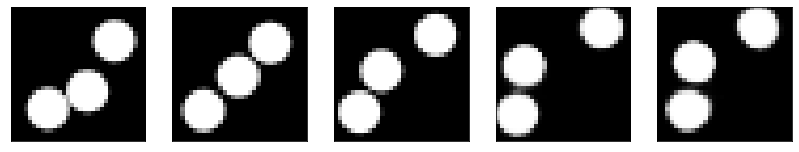

GD iterations:
i=0 | err=57.030380
i=1 | err=55.775063
i=2 | err=54.046379
i=3 | err=52.034019
i=4 | err=49.848625
i=5 | err=47.608696
i=6 | err=45.347191
i=7 | err=42.996880
i=8 | err=40.650803
i=9 | err=38.314697
i=10 | err=36.058685
i=11 | err=33.880447
i=12 | err=31.723227
i=13 | err=29.750961
i=14 | err=27.958643
i=15 | err=26.268070
i=16 | err=24.608963
i=17 | err=23.019676
i=18 | err=21.525108
i=19 | err=20.101942
i=20 | err=18.728554
i=21 | err=17.387264
i=22 | err=16.123840
i=23 | err=14.946892
i=24 | err=13.855662
i=25 | err=12.863206
i=26 | err=11.974098
i=27 | err=11.141424
i=28 | err=10.369750
i=29 | err=9.632202
Epoch=275 (56%) | out_positive=0.855802 | out_negative=0.066958 | mse=0.076215


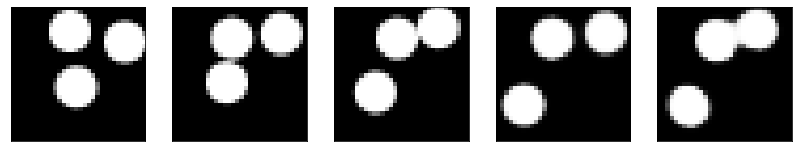

GD iterations:
i=0 | err=56.229271
i=1 | err=54.914833
i=2 | err=53.106934
i=3 | err=51.052399
i=4 | err=48.914497
i=5 | err=46.664986
i=6 | err=44.375633
i=7 | err=42.057236
i=8 | err=39.690208
i=9 | err=37.413555
i=10 | err=35.141884
i=11 | err=32.927734
i=12 | err=30.823860
i=13 | err=28.734299
i=14 | err=26.731249
i=15 | err=24.826994
i=16 | err=22.964451
i=17 | err=21.222860
i=18 | err=19.546076
i=19 | err=17.900049
i=20 | err=16.317173
i=21 | err=14.811428
i=22 | err=13.425101
i=23 | err=12.116608
i=24 | err=10.990186
i=25 | err=9.983995
i=26 | err=9.067983
i=27 | err=8.248687
i=28 | err=7.500648
i=29 | err=6.791499
Epoch=275 (57%) | out_positive=0.907369 | out_negative=0.095157 | mse=0.075381


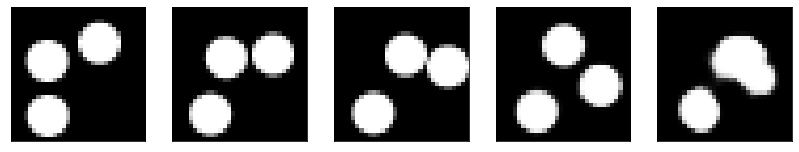

In [ ]:
d = D().to(device)
ae.eval()
optimizer = optim.Adam(d.parameters(), lr=0.0002)
mse = nn.MSELoss()
threshold = None
train_errors = []
test_errors = []

lr = 0.1
steps = 30
momentum = 0.5

start_epoch = 250
if(start_epoch > 0):
  d, optimizer, train_errors, test_errors = load_state(start_epoch, d, optimizer)
  
start_epoch += 1

for epoch in range(start_epoch, 300+1):
  errors = []
  for batch_idx, data in enumerate(codes_train_loader):
    verbose = is_epoch()
    
    I1 = dat[data[:,0,16].to(torch.long),0:1,:,:].to(torch.float).to(device)
    I2 = dat[data[:,0,16].to(torch.long),1:2,:,:].to(torch.float).to(device)
    I3 = dat[data[:,0,16].to(torch.long),2:3,:,:].to(torch.float).to(device)
    I3_x = data[:,0,0:16].clone()
    I4_positive = ae.decode(data[:,1,0:16])
    
    '''
    if epoch <= 2:
      I3_negative = I2
    else:
      f = (lambda x: -d(I1, I2, ae.decode(x), activation=False).mean())
      d.eval()
      x = input_gd(ae.encode(I2).data, f, steps=30, lr=100, verbose=verbose)
      d.train()
      I3_negative = ae.decode(x)
    '''
    f = (lambda x: -d(I1, I2, I3, ae.decode(x), activation=False).mean())
    x = input_gd(
      I3_x, f,
      steps=steps, lr=lr, momentum=momentum, verbose=verbose,
      zero_grad_f=optimizer.zero_grad, threshold=threshold
    )
    I4_negative = ae.decode(x)
    
    optimizer.zero_grad()
    out_positive = d(I1, I2, I3, I4_positive)
    loss_positive = -torch.log(out_positive).mean()
    
    out_negative = d(I1, I2, I3, I4_negative)
    loss_negative = -torch.log(1-out_negative).mean()

    loss = loss_positive+loss_negative
    loss.backward()
    optimizer.step()
    
    errors.append(mse(I4_positive, I4_negative).item())
    
    if verbose:
      print('Epoch={} ({:.0f}%) | out_positive={:.6f} | out_negative={:.6f} | mse={:.6f}'.format(
        epoch,
        100.*batch_idx/len(codes_train_loader),
        out_positive.mean().item(),
        out_negative.mean().item(),
        errors[-1]
      ))
      imshow_list([I1[0], I2[0], I3[0], I4_positive[0], I4_negative[0]], scale=2.0)
    
  train_errors.append(sum(errors)/len(errors))
  d.eval()
  test_errors.append(evaluate(d, threshold=threshold))
  d.train()
  if epoch > 1:
    plot_errors(train_errors, test_errors)
    
  if epoch % 5 == 0:
    save_state(epoch, d, optimizer, train_errors, test_errors)
    print('Model Saved.')
  
print('Done!')

#### Evaluation

Epoch = 37
Train MSE = 0.040643
Test MSE during training = 0.052485


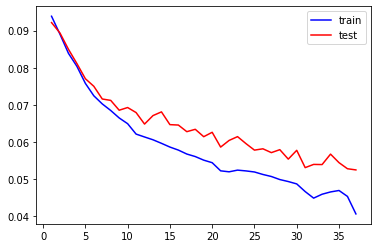

GD iterations:
i=0 | err=0.000152
i=1 | err=0.000148
i=2 | err=0.000144
i=3 | err=0.000139
i=4 | err=0.000134
i=5 | err=0.000129
i=6 | err=0.000124
i=7 | err=0.000119
i=8 | err=0.000115
i=9 | err=0.000110
i=10 | err=0.000105
i=11 | err=0.000101
i=12 | err=0.000097
i=13 | err=0.000092
i=14 | err=0.000088
i=15 | err=0.000084
i=16 | err=0.000080
i=17 | err=0.000076
i=18 | err=0.000072
i=19 | err=0.000068
i=20 | err=0.000064
i=21 | err=0.000061
i=22 | err=0.000057
i=23 | err=0.000053
i=24 | err=0.000050
i=25 | err=0.000047
i=26 | err=0.000043
i=27 | err=0.000040
i=28 | err=0.000037
i=29 | err=0.000034
i=30 | err=0.000032
i=31 | err=0.000029
i=32 | err=0.000026
i=33 | err=0.000023
i=34 | err=0.000021
i=35 | err=0.000018
i=36 | err=0.000016
i=37 | err=0.000013
i=38 | err=0.000011
i=39 | err=0.000008
i=40 | err=0.000006
i=41 | err=0.000004
i=42 | err=0.000002
i=43 | err=-0.000000
i=44 | err=-0.000002
i=45 | err=-0.000004
i=46 | err=-0.000006
i=47 | err=-0.000008
i=48 | err=-0.000010
i=49 | er

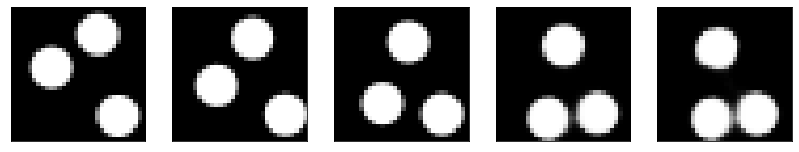

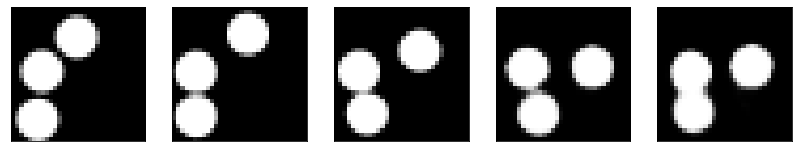

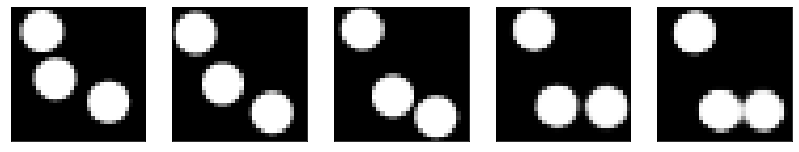

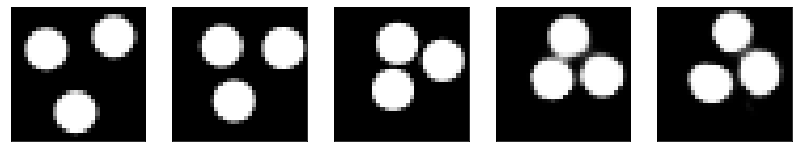

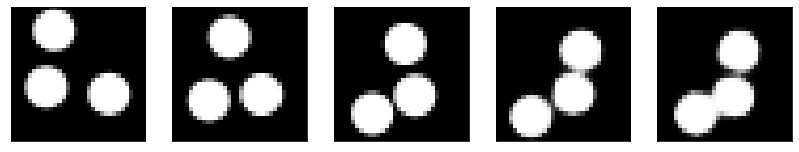

Test MSE 0.052485


0.05248496383428573

In [27]:
lr = 50000
steps = 50
momentum = 0.5

threshold = None
optimizer = optim.Adam(d.parameters(), lr=0.0002)

load_epoch = 37
d, _, train_errors, test_errors = load_state(load_epoch, d, None)
print('Epoch = {}'.format(load_epoch))
print('Train MSE = {:.6f}'.format(train_errors[-1]))
print('Test MSE during training = {:.6f}'.format(test_errors[-1]))
plot_errors(train_errors, test_errors)
d.eval()
evaluate(d, verbose=True, num_show=5, threshold=threshold)

In [35]:
# serial evaluation
d.eval()
examples = enumerate(codes_test_loader)
batch_idx, data = next(examples)
frames = []
verbose = False
    
I1 = dat[data[0:1,0,16].to(torch.long),0:1,:,:].to(torch.float).to(device)
I2 = dat[data[0:1,0,16].to(torch.long),1:2,:,:].to(torch.float).to(device)
I3 = dat[data[0:1,0,16].to(torch.long),2:3,:,:].to(torch.float).to(device)
I3_x = data[0:1,0,0:16]

frames = frames + [I1, I2, I3]

for i in range(50):
  f = (lambda x: -d(I1, I2, I3, ae.decode(x), activation=False).mean())
  x = input_gd(
    I3_x, f,
    steps=steps, lr=lr, momentum=momentum, verbose=verbose,
    zero_grad_f=optimizer.zero_grad, threshold=threshold
  )
  prediction = ae.decode(x).data
  frames.append(prediction)

  I1 = I2
  I2 = I3
  I3 = prediction
  I3_x = ae.encode(I3)



In [36]:
for i in range(len(frames)):
  frames[i] = frames[i].cpu().squeeze()
  
#for im in frames:
#  imshow_list([im], scale=0.5)

([], <a list of 0 Text yticklabel objects>)

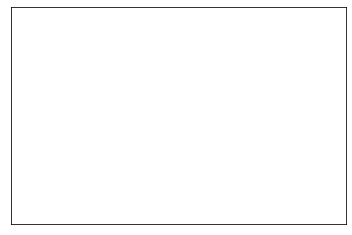

In [37]:
fig, ax = plt.subplots()
plt.xticks([])
plt.yticks([])

In [38]:
def animate(i):
    im.set_data(frames[i].squeeze(0))
    return (im,)

anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=100)
im = ax.imshow(frames[0].squeeze(0), cmap='gray', interpolation='none')
HTML(anim.to_html5_video())

In [336]:
anim.save('./discri_anim.gif', writer='imagemagick', fps=10)

#### Save model

In [160]:
torch.save(d.state_dict(), 'discriminator_gd.pt')

## Genetic Algorithm

In [ ]:
def random_positions(n, canvas_dim):
  positions = []
  i = 0
  while i < n:
    (x,y) = (radius+(canvas_dim-ball_dim)*random.random(), radius+(canvas_dim-ball_dim)*random.random())
    collision = False
    for (prev_x, prev_y) in positions:
      if (x-prev_x)**2 + (y-prev_y)**2 <= ball_dim**2:
        collision = True
        break

    if not collision:
      positions.append((x,y))
      i += 1
      
  return positions


def draw_ball(canvas, position):
  canvas[
    0,
    int(position[0]+0.5-radius):int(position[0]+0.5+radius),
    int(position[1]+0.5-radius):int(position[1]+0.5+radius)
  ] += ball
  canvas = canvas.clip(0, 1)
  return canvas


def argmin(l):
  m = min(l)
  argm = -1
  for i in range(len(l)):
    if l[i] <= m:
      argm = i
      
  return m, argm


def draw_canvas(positions):
  canvas = np.zeros((canvas_dim, canvas_dim))
  canvas = np.expand_dims(canvas,0)
  for pos in positions:
    canvas = draw_ball(canvas, pos)
    
  old_canvas = canvas
  canvas = np.zeros((small_canvas_dim, small_canvas_dim))
  canvas = np.expand_dims(canvas,0)
  for i in range(small_canvas_dim):
    for j in range(small_canvas_dim):
      canvas[0,i,j] = old_canvas[0,scaling_factor*i:scaling_factor*(i+1), scaling_factor*j:scaling_factor*(j+1)].mean()
    
  return canvas


def events_times(positions, velocities):
  times = []
  for i in range(n):
    if velocities[i][0] < 0:
      times.append(-(positions[i][0]-radius)/velocities[i][0])
    else:
      times.append((canvas_dim-positions[i][0]-radius)/velocities[i][0])
    if velocities[i][1] < 0:
      times.append(-(positions[i][1]-radius)/velocities[i][1])
    else:
      times.append((canvas_dim-positions[i][1]-radius)/velocities[i][1])
    for j in range(i):
      c1 = positions[i][0]-positions[j][0]
      c2 = positions[i][1]-positions[j][1]
      c3 = velocities[i][0]-velocities[j][0]
      c4 = velocities[i][1]-velocities[j][1]
      A = c3**2 + c4**2
      B = 2*(c1*c3+c2*c4)
      C = c1**2+c2**2-ball_dim**2
      discriminant = B**2-4*A*C
      if discriminant >= 0 and min((-B+math.sqrt(discriminant))/(2*A), (-B-math.sqrt(discriminant))/(2*A)) >= 0:
        times.append(min((-B+math.sqrt(discriminant))/(2*A), (-B-math.sqrt(discriminant))/(2*A)))
      else:
        times.append(float('inf'))
    
  return times


def do_event(positions, velocities, index):
  for i in range(n):
    if index == 0:
      velocities[i] = (-velocities[i][0], velocities[i][1])
      return velocities
    index -= 1
    if index == 0:
      velocities[i] = (velocities[i][0], -velocities[i][1])
      return velocities
      
    index -= 1
    for j in range(i):
      if index == 0:
        c = ((velocities[i][0]-velocities[j][0])*(positions[i][0]-positions[j][0]) + \
            (velocities[i][1]-velocities[j][1])*(positions[i][1]-positions[j][1])) / \
            ((positions[i][0]-positions[j][0])**2 + (positions[i][1]-positions[j][1])**2)
        
        velocities[i] = (
          velocities[i][0]-c*(positions[i][0]-positions[j][0]),
          velocities[i][1]-c*(positions[i][1]-positions[j][1])
        )
        velocities[j] = (
          velocities[j][0]-c*(positions[j][0]-positions[i][0]),
          velocities[j][1]-c*(positions[j][1]-positions[i][1])
        )
        return velocities
        
      index -= 1
    
  return velocities


def simple_step(positions, velocities, t):
  new_positions = []
  for i in range(len(positions)):
    new_positions.append((positions[i][0]+velocities[i][0]*t, positions[i][1]+velocities[i][1]*t))
    
  return new_positions


def step(positions, velocities, t):
  times = events_times(positions, velocities)
  min_t, index = argmin(times)
  if min_t >= t:
    return simple_step(positions, velocities, t), velocities
  else:
    positions = simple_step(positions, velocities, min_t)
    velocities = do_event(positions, velocities, index)
    return step(positions, velocities, t-min_t)
  
  
def random_init(n, velocity_min, velocity_max, calc_positions=True):
  positions = None
  if calc_positions:
    positions = random_positions(n, canvas_dim)
  velocities = []
  for i in range(n):
    magnitude = velocity_min+(velocity_max-velocity_min)*random.random()
    angle = 2*math.pi*random.random()
    velocities.append((magnitude*math.cos(angle), magnitude*math.sin(angle)))

  return positions, velocities

In [ ]:
n = 3
scaling_factor = 8
ball_dim = scaling_factor*10
canvas_dim = scaling_factor*32
small_canvas_dim = int(canvas_dim/scaling_factor)
radius = ball_dim/2
ball = np.zeros((ball_dim, ball_dim))

for i in range(ball_dim):
  for j in range(ball_dim):
    if (i+0.5-radius)**2 + (j+0.5-radius)**2 <= radius**2:
      ball[i,j] = 1.0

ball_canv = np.expand_dims(ball,0)
imshow_list(ball_canv)

In [ ]:
def generate_population(size):
  population = []
  for i in range(size):
    population.append(random_positions(n, canvas_dim))

  return population


def calc_fitnesses(population, I):
  fitnesses = []
  for i in range(len(population)):
    canvas = torch.from_numpy(draw_canvas(population[i])).to(torch.float).to(device)
    fitnesses.append(-mse(canvas.squeeze(), I.squeeze()).item())
  
  return fitnesses


def select_parents(population, fitnesses):
  l = sorted(zip(population, fitnesses), key=lambda x: x[1], reverse=True)
  l = zip(*l)
  parents = list(next(l))
  fitnesses = list(next(l))
  halflength = int(0.5*len(population))
  
  return parents[:halflength], fitnesses[:halflength]

'''
def do_crossover(parents):
  parents = random.sample(parents, len(parents))
  offsprings = []
  for i in range(len(parents)):
    offsprings.append([parents[i][1], parents[i][0],])
    ((X1,Y1),(X2,Y2)) = parents[(i+1)%len(parents)]
    
  return offsprings
'''

def mutate(population):
  mutated = []
  for i in range(len(population)):
    mag = abs(2*np.random.normal())
    _, v = random_init(n, mag*scaling_factor, mag*scaling_factor, calc_positions=False)
    mutated.append(step(population[i], v, 1.)[0])
    
  return mutated

In [ ]:
'''
ae.eval()
p.eval()
'''

population_size = 100
no_epochs = 100
no_samples = 1
mse = nn.MSELoss()

loss_pred = []
loss_gt = []
loss_wo_genetic = []
for x in range(no_samples):
  examples = enumerate(test_loader)
  batch_idx, data = next(examples)

  I1 = data[0:1,0:1,:,:].to(device)
  I2 = data[0:1,1:2,:,:].to(device)
  I3 = data[0:1,2:3,:,:].to(device)
  '''
  z1 = ae.encode(I1)
  z2 = ae.encode(I2)
  z3 = ae.encode(I3)
  z_out = p(z1, z2)
  out = ae.decode(z_out)
  '''
  population = generate_population(population_size)
  for i in range(no_epochs):
    fitnesses = calc_fitnesses(population, I3)
    parents, fitnesses = select_parents(population, fitnesses)
    print('epoch {}/{} | mse {:.6f}'.format(i, no_epochs, -fitnesses[0]))
    imshow_list([I3[0], draw_canvas(parents[0])])
    print()
    offsprings = parents
    #offsprings = do_crossover(parents)
    mutated = mutate(offsprings)
    population = parents+mutated

  fitnesses = calc_fitnesses(population, I3)
  parents = select_parents(population, fitnesses)

  '''
  im = torch.from_numpy(draw_canvas(parents[0])).to(torch.float).to(device)
  loss_pred.append(-max(fitnesses))
  print('loss w.r.t prediction: {}. MEAN SO FAR: {}'.format(loss_pred[-1], sum(loss_pred)/len(loss_pred)))
  loss_gt.append(mse(im.squeeze(), I3.squeeze()))
  print('loss w.r.t gt: {}. MEAN SO FAR: {}'.format(loss_gt[-1], sum(loss_gt)/len(loss_gt)))
  loss_wo_genetic.append(mse(out[0].squeeze(), I3.squeeze()))
  print('loss without genetic: {}. MEAN SO FAR: {}'.format(loss_wo_genetic[-1], sum(loss_wo_genetic)/len(loss_wo_genetic)))
  reconst = ae.decode(z3)
  imshow_list([I1[0], I2[0], I3[0], reconst[0], out[0], im], scale=2.0)
  '''